# Pruevas de "main.py"

In [1]:
import os
from os.path import join as pjoin

from utils.math_graph import *
from data_loader.data_utils import *
from models.trainer import model_train
from models.tester import model_test

In [2]:
n, n_his, n_pred = 228, 12, 9

In [32]:
data_file = f'PeMSD7_V_{n}.csv'
n_train, n_val, n_test = 34, 5, 5
PeMS = data_gen(pjoin('./dataset', data_file), (n_train, n_val, n_test), n, n_his + n_pred)
print(f'>> Loading dataset with Mean: {PeMS.mean:.2f}, STD: {PeMS.std:.2f}')

data_seq = pd.read_csv(pjoin('./dataset', data_file), header=None).values

>> Loading dataset with Mean: 58.50, STD: 13.73


In [4]:
PeMS

# Pruevas de "modelos/trainer.py"

In [2]:
from data_loader.data_utils import gen_batch
from models.tester import model_inference
from models.base_model import build_model, model_save
from os.path import join as pjoin

import tensorflow as tf
import numpy as np
import time

In [3]:
# importing packages
import tensorflow.compat.v1 as tf

# disabling eager mode
tf.compat.v1.disable_eager_execution()

# creating a tensorflow graph
graph = tf.Graph()
with graph.as_default():

    # creating a placeholder
    a = tf.placeholder(tf.float64, shape=(3, 3), name='tensor1')

    # creating an operation
    b = a * a

# array1 will be fed into 'a'
array1 = [[1, 2, 3], [4, 5, 6], [7, 8, 9]]

# Creating a session, and running the graph
with tf.Session(graph=graph) as session:
    # run the session until it reaches node b,
    # then input an array of values into a
    operation_res = session.run(b, feed_dict={a: array1})
    print("after executing the operation: ")
    print(operation_res)

after executing the operation: 
[[ 1.  4.  9.]
 [16. 25. 36.]
 [49. 64. 81.]]


In [9]:
tf.summary.scalar('loss', 0.345)
tf.summary.scalar('loss', 0.234)
tf.summary.scalar('loss', 0.123)

<tf.Tensor 'loss_2:0' shape=() dtype=string>

In [30]:
a = tf.constant([[3, 5], [4, 8]])
b = tf.constant([[1, 6], [2, 9]])
W = tf.add_n([a, b])
with tf.Session() as sess:
    print(a.eval())
    print(b.eval())
    print(W.eval()) 

[[3 5]
 [4 8]]
[[1 6]
 [2 9]]
[[ 4 11]
 [ 6 17]]


In [32]:
n_pred = 9

step_idx = tmp_idx = np.arange(3, n_pred + 1, 3) - 1
min_val = min_va_val = np.array([4e1, 1e5, 1e5] * len(step_idx))

In [47]:
np.arange(2, 13, 3) - 1

array([ 1,  4,  7, 10])

In [41]:
step_idx

array([2, 5, 8])

# Pruevas de "modelos/tester.py"

In [3]:
import numpy as np
chks = [False, False, False]
chks = np.array(chks)

In [17]:
chks
print(sum(chks))
# Cada True vale un uno, y cada False vale 0

0


In [18]:
if sum(chks):
    print("WW")

In [19]:
n_pred = 9

In [22]:
np.arange(3, n_pred + 1, 3) - 1

array([2, 5, 8])

# Pruevas de "data_loader/data_utils.py"

In [1]:
len_inputs = 5000

In [4]:
idx = np.arange(len_inputs)

In [21]:
idx

array([   0,    1,    2, ..., 4997, 4998, 4999])

In [6]:
import tensorflow as tf

In [7]:
kernel = tf.get_collection('graph_kernel')[0]

AttributeError: module 'tensorflow' has no attribute 'get_collection'

# Pruevas de "models/layers.py"

In [6]:
import tensorflow.compat.v1 as tf

blocks = [[1, 32, 64], [64, 32, 128]]

In [25]:
for i, channels in enumerate(blocks):
    c_si, c_t, c_oo = channels
    print(c_si, c_t, c_oo)

1 32 64
64 32 128


In [28]:
scope = 1
with tf.compat.v1.variable_scope(f'stn_block_{scope}_in'):
    w_input = tf.compat.v1.get_variable('ws_input', shape=[1, 1, c_in, c_out], dtype=tf.float32)

In [31]:
w_input.shape

TensorShape([1, 1, 10, 5])

In [34]:
n_his = 12
n = 228

In [42]:
tf.compat.v1.disable_eager_execution()
x = tf.compat.v1.placeholder(tf.float32, [None, n_his + 1, n, 1], name='data_input')

In [39]:
x

<tf.Tensor 'data_input:0' shape=(None, 13, 228, 1) dtype=float32>

In [43]:
Ks = 3

In [44]:
ws = tf.get_variable(name='ws', shape=[Ks * c_in, c_out], dtype=tf.float32)

In [45]:
ws

<tf.Variable 'ws:0' shape=(30, 5) dtype=float32>

In [46]:
tf.add_to_collection(name='weight_decay', value=tf.nn.l2_loss(ws))

In [48]:
kernel = tf.compat.v1.get_collection('graph_kernel')[0]

IndexError: list index out of range

# Pruevas sobre main.py

In [8]:
import tensorflow.compat.v1 as tf

Ks, Kt = 3, 3

W = weight_matrix(pjoin('./dataset', f'PeMSD7_W_{n}.csv'))
# Calculate graph kernel
L = scaled_laplacian(W)
# Alternative approximation method: 1st approx - first_approx(W, n).
Lk = cheb_poly_approx(L, Ks, n)
tf.add_to_collection(name='graph_kernel', value=tf.cast(tf.constant(Lk), tf.float32))

In [8]:
convolution_kernel = tf.cast(tf.constant(Lk), tf.float32)

In [14]:
array_kernel = tf.Session().run(convolution_kernel)

In [19]:
array_kernel[0, :]

array([ 1.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
      

In [10]:
W.shape

(228, 228)

In [13]:
PeMS.get_data("train").shape

(9112, 21, 228, 1)

In [ ]:
"Idea 1: \
    Los 9112 se refieren a los momentos en los que se ha cogido la matriz. \
    Los 21 se refieren a X. \
    Los 228 se refieren a los pesos. \
"

In [28]:
# Si la idea 1.1 es cierta, la  similaridad tiene que ser mayor ccon los valores cercanos que los lejanos.
valor_C_a = 0
valor_L_a = 0

for x in range(100):
    #print("Valor:", PeMS.get_data("train")[x, 0, 0, 0])
    valor_C_a += abs(PeMS.get_data("train")[x, 0, 0, 0] - PeMS.get_data("train")[x+1, 0, 0, 0])
    valor_L_a += abs(PeMS.get_data("train")[x, 0, 0, 0] - PeMS.get_data("train")[x*90, 0, 0, 0])

print("Diferencia con los cercanos:", valor_C_a)
print("Diferencia con los lejanos:", valor_L_a)

# Parece que la 1.1 es cierta!

Diferencia con los cercanos: 13.570195334202882
Diferencia con los lejanos: 193.93069274171617


In [27]:
# Vamos a ver que hay en la segunda columna, de momento creo que son simplemente los X siguientes nodos
acumulador = []
flag = False
accumulador_Errores = []

for x in range(len(PeMS.get_data("train"))):
    for y in range(len(PeMS.get_data("train")[0, :, 0, 0])):
        try:
            acumulador.append(PeMS.get_data("train")[x, y, 0, 0] == PeMS.get_data("train")[x+y, 0, 0, 0])
            
            if not (PeMS.get_data("train")[x, y, 0, 0] == PeMS.get_data("train")[x+y, 0, 0, 0]):
                print(x, y)
                accumulador_Errores.append(y)
                flag = True
                
                
        except:
            a = 1
        #'''
        '''     
    if flag == True:
        break
        '''

acumulador = [i for i in acumulador]
print("Fallos de tesis absolutos:", abs(sum(acumulador) - len(acumulador)))
print("Fallos de tesis relativos:", abs(sum(acumulador) - len(acumulador))/len(acumulador))

print(sum(accumulador_Errores)/len(accumulador_Errores))

t = [x for x in range(len(PeMS.get_data("train")[0, :, 0, 0]))]
print(sum(t)/len(t) )

# Parece ser que sea lo que sea está muy correlacionado con mi tesis, 
# de momento voy a decir que se refiere a las estaciones?, 
# que están muy correlacionadas con el siguiente momento, 
# porque así es como se mueve el tráfico, de una estación a la  siguiente.

248 20
249 19
249 20
250 18
250 19
250 20
251 17
251 18
251 19
251 20
252 16
252 17
252 18
252 19
252 20
253 15
253 16
253 17
253 18
253 19
253 20
254 14
254 15
254 16
254 17
254 18
254 19
254 20
255 13
255 14
255 15
255 16
255 17
255 18
255 19
255 20
256 12
256 13
256 14
256 15
256 16
256 17
256 18
256 19
256 20
257 11
257 12
257 13
257 14
257 15
257 16
257 17
257 18
257 19
257 20
258 10
258 11
258 12
258 13
258 14
258 15
258 16
258 17
258 18
258 19
258 20
259 9
259 10
259 11
259 12
259 13
259 14
259 15
259 16
259 17
259 18
259 19
259 20
260 8
260 9
260 10
260 11
260 12
260 13
260 14
260 15
260 16
260 17
260 18
260 19
261 7
261 8
261 9
261 10
261 11
261 12
261 13
261 14
261 15
261 16
261 17
261 18
261 20
262 6
262 7
262 8
262 9
262 10
262 11
262 12
262 13
262 14
262 15
262 16
262 17
262 19
262 20
263 5
263 6
263 7
263 8
263 9
263 10
263 11
263 12
263 13
263 14
263 15
263 16
263 18
263 19
263 20
264 4
264 5
264 6
264 7
264 8
264 9
264 10
264 11
264 12
264 13
264 14
264 15
264 17
264 18

In [103]:
PeMS.get_data("train")[1, :, 0, 0]

array([0.69928529, 0.69200124, 0.7138534 , 0.75755774, 0.59002446,
       0.53175202, 0.7138534 , 0.7794099 , 0.9105229 , 0.9105229 ,
       0.70656935, 0.7794099 , 0.76484179, 0.93965912, 0.86681857,
       0.92509101, 0.88138668, 0.99793157, 0.89595479, 0.78669396,
       0.94694318])

In [99]:
# Luego como el trafico en un momento da lo siguiente en cada estación:
PeMS.get_data("train")[10, :, 0, 0]

array([0.9105229 , 0.70656935, 0.7794099 , 0.76484179, 0.93965912,
       0.86681857, 0.92509101, 0.88138668, 0.99793157, 0.89595479,
       0.78669396, 0.94694318, 0.72113746, 0.59002446, 0.53175202,
       0.42249119, 0.66286502, 0.6482969 , 0.76484179, 0.75027368,
       0.67014907])

In [100]:
# En el siguiente momento los coches se habrán movido y habrán entrado más por la cola,
# por lo que es el valor de la anteror pero desplazado 1 
PeMS.get_data("train")[11, :, 0, 0]

array([0.70656935, 0.7794099 , 0.76484179, 0.93965912, 0.86681857,
       0.92509101, 0.88138668, 0.99793157, 0.89595479, 0.78669396,
       0.94694318, 0.72113746, 0.59002446, 0.53175202, 0.42249119,
       0.66286502, 0.6482969 , 0.76484179, 0.75027368, 0.67014907,
       0.75755774])

In [84]:
PeMS.get_data("train")[0:10, :, 0, 0]

array([[0.91780696, 0.69928529, 0.69200124, 0.7138534 , 0.75755774,
        0.59002446, 0.53175202, 0.7138534 , 0.7794099 , 0.9105229 ,
        0.9105229 , 0.70656935, 0.7794099 , 0.76484179, 0.93965912,
        0.86681857, 0.92509101, 0.88138668, 0.99793157, 0.89595479,
        0.78669396],
       [0.69928529, 0.69200124, 0.7138534 , 0.75755774, 0.59002446,
        0.53175202, 0.7138534 , 0.7794099 , 0.9105229 , 0.9105229 ,
        0.70656935, 0.7794099 , 0.76484179, 0.93965912, 0.86681857,
        0.92509101, 0.88138668, 0.99793157, 0.89595479, 0.78669396,
        0.94694318],
       [0.69200124, 0.7138534 , 0.75755774, 0.59002446, 0.53175202,
        0.7138534 , 0.7794099 , 0.9105229 , 0.9105229 , 0.70656935,
        0.7794099 , 0.76484179, 0.93965912, 0.86681857, 0.92509101,
        0.88138668, 0.99793157, 0.89595479, 0.78669396, 0.94694318,
        0.72113746],
       [0.7138534 , 0.75755774, 0.59002446, 0.53175202, 0.7138534 ,
        0.7794099 , 0.9105229 , 0.9105229 , 0.7065693

In [107]:
PeMS.get_data("train")[8823, :, 0, 0]

array([ 0.9105229 ,  1.20916918, -0.23307381, -0.23307381, -0.07282459,
        0.06557247,  0.32051441,  1.35485029,  0.28409413,  0.16754924,
        0.11656086,  0.18940141,  0.1748333 ,  0.21853763,  0.19668547,
        0.00730002,  0.24767385,  0.14569708,  0.18940141,  0.10199274,
        0.08742463])

In [108]:
PeMS.get_data("train")[8843, :, 0, 0]

array([ 0.08742463,  0.27681008,  0.75755774,  0.9760794 ,  0.24767385,
        0.85953451,  0.03643625,  0.73570557,  0.95422723,  0.93237507,
        1.39855462,  0.08742463, -0.04368836,  0.02915219,  1.20188512,
        0.99064751,  1.07805618,  1.18731701,  1.15818079,  1.28200973,
        1.20188512])

In [ ]:
# Entre 8843 y 8844 pasa algo y se rompen los tiempos??

In [40]:
PeMS.get_data("train")[8844, :, 0, 0]

array([ 0.11656086,  0.3059463 ,  0.15298113,  0.24767385,  0.2403898 ,
        0.20396952,  0.19668547,  0.20396952,  0.21125358,  0.00730002,
       -0.05097242,  0.08742463,  0.02915219,  0.03643625, -0.18936947,
       -0.0218362 ,  0.00730002,  0.06557247,  0.0437203 ,  0.08742463,
        0.10199274])

In [42]:
PeMS.get_data("train")[8865, :, 0, 0]

array([ 8.01405786e-02, -5.09724198e-02,  1.59684632e-05,  3.64362458e-02,
        1.38413022e-01,  1.31128967e-01,  1.23844911e-01, -1.45521425e-02,
        1.59684632e-05,  7.30002393e-03,  3.64362458e-02,  2.18681349e-02,
       -4.36883643e-02,  1.59684632e-05, -7.26808700e-03,  2.91521903e-02,
        5.82884122e-02,  3.64362458e-02,  4.37203013e-02,  7.28565231e-02,
        1.45697078e-01])

In [44]:
PeMS.get_data("train")[248, 20, 0, 0]

0.7721258479186532

In [43]:
PeMS.get_data("train")[268, 0, 0, 0]

0.9833634564489185

In [46]:
PeMS.get_data("train")[248, 20, 0, 0]

0.7721258479186532

In [47]:
PeMS.get_data("train")[268, 0, 0, 0]

0.9833634564489185

In [ ]:
data_seq

 Basicamente:
 - Primera columna, representa un "time  slot".
 Luego la diferencia entre [x, 0, 0, 0] y [y, 0, 0, 0] es simplemente el "slot" de 105 minutos en el que se hizo la medida
 A veces hay un cambio repentino e inesperado en los datos, ni idea de porqué.
 

 - Segunda columna, hace referencia al orden de entrada en ese "time slot"
 Luego, la diferencia entre [0, x, 0, 0] y [0, y, 0, 0] es que no fueron tomadas en el mismo instante exacto del dia, aunque al estar en el mismo time slot de tiempo, significa que están separadas por no más de 105 minutos.

 - Tercera columna, hace referencia a los valores de congestión que da cada una de las 228 estaciones.
 Luego, la diferencia entre [0, 0, x, 0] y [0, 0, y, 0] es que los valores pertenecen a estaciones distintas, pero fueron tomados en el mismo instante y además forman parte de una misma secuencia de datos.
 Sin embargo la diferencia entre [0, c, x, 0] y [0, c, y, 0] es que los valores pertenecen a estaciones distintas,y aunque fueron tomados en el mismo dia, no fueron tomadas en el mismo instante de ese dia.

In [36]:
PeMS.get_data("train")[0, 0, 0, 0]

0.9178069572498705

In [37]:
PeMS.get_data("train")[0, 0, 1, 0]

0.5463201284552671

# Ahora toca entender MIS datos, que es lo que tengo y eso

In [1]:
# Cargado de la base de datos
import numpy as np
import pandas as pd

# Cargar un ejemplo de los datos: [FUNCIONA]
file_path1 = r"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/country_partner_hsproduct6digit_year_2005.dta"
file_path2 = r"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/country_partner_hsproduct4digit_year_2020.dta"

data = pd.read_stata(file_path1).values
# country_partner_hsproduct4digit_year_1995 No me gusta la feltan cosas
# data_aux = pd.read_stata(file_path2).values

In [86]:
data.

array([[0, 15, 5315, ..., 'ABW', 'AUT', '090112'],
       [31, 15, 5315, ..., 'BOL', 'AUT', '090112'],
       [32, 15, 5315, ..., 'BRA', 'AUT', '090112'],
       ...,
       [71, 180, 6844, ..., 'ESP', 'PRY', '410721'],
       [231, 123, 6844, ..., 'USA', 'LAO', '410721'],
       [103, 141, 6844, ..., 'IDN', 'MLI', '410721']], dtype=object)

In [38]:
data_aux = pd.read_stata(file_path1)
data_aux

,location_id,partner_id,product_id,year,export_value,import_value,hs_eci,hs_coi,location_code,partner_code,hs_product_code
0,0,7,5277,2020,0.0,38781.0,0.725364,-0.244535,ABW,ARE,080410
1,1,7,5277,2020,0.0,375854.0,-1.178987,-0.815577,AFG,ARE,080410
2,2,7,5277,2020,0.0,30815.0,-1.794871,-1.199555,AGO,ARE,080410
3,4,7,5277,2020,0.0,974.0,-0.265229,0.059049,ALB,ARE,080410
4,9,7,5277,2020,0.0,2144.0,-0.129502,-0.671068,ARM,ARE,080410
...,...,...,...,...,...,...,...,...,...,...,...
12321537,188,24,5138,2020,230072.0,0.0,0.662925,-0.216620,SAU,BHR,030624
12321538,188,109,5138,2020,0.0,1871.0,0.662925,-0.216620,SAU,ISL,030624
12321539,250,0,5138,2020,4213.0,0.0,0.866041,-0.371104,ANS,ABW,030624
12321540,231,91,5138,2020,1323.0,0.0,1.588148,0.380904,USA,GRD,030624


Significado de las filas: [Están descritas en el pdf de la base de datos]

    1. location_id
        Id del pais de origen. Categórica (Inutilizable)
    2. partner_id
        Id del pais de destino. Categórica (Inutilizable)
    3. product_id
        Id del producto. Categórica (Inutilizable)
    4. year
        Año en que se realizó la entrega. Irrelevante
    5. export_value
        Valor de los productos exportados. Cuantitativa
    6. import_value
        Valor de los productos importados. Cuantitativa
    7. hs_eci
    
    8. hs_coi

    9. location_code
        Como el id del pais, pero en nombre. Categórica (Inutilizable)
    10. partner_code
        Como el id del pais pero en nombre. Categórica (Inutilizable)
    11. hs_product_code
        Clasificación arancelaria. Categórica (Inutilizable)
        
¿Que incluir en la IA?

Vale, odbiedades como: location_id, partner_id, export_value y import_value.

Dudas sobre si juntar export_value y import_value, y si además incluir el pci, o nó, de momento no.

Poner: 1, 2, 3, 5, 6, 8.

In [2]:
data.shape

(12321542, 11)

In [3]:
#Coger a los 20 paises importadores más comunes
unique, counts = np.unique(data[:, 8], return_counts=True)
paises = sorted(dict(zip(unique, counts)).items(), key=lambda item: item[1], reverse=True)[0:20]
#paises

In [2]:
#Coger a los 20 paises exportadores más comunes
unique, counts = np.unique(data[:, 9], return_counts=True)
paises = sorted(dict(zip(unique, counts)).items(), key=lambda item: item[1], reverse=True)[0:20]
#paises

In [4]:
dictr = dict(zip(unique, counts))

In [8]:
dictr['ABW']

8265

In [77]:
paises

[('DEU', 374385),
 ('USA', 374364),
 ('CHN', 357734),
 ('ITA', 320271),
 ('FRA', 312206),
 ('GBR', 301735),
 ('NLD', 250201),
 ('ESP', 234663),
 ('BEL', 222850),
 ('IND', 216953),
 ('JPN', 201716),
 ('TWN', 178449),
 ('TUR', 176876),
 ('CHE', 176365),
 ('CAN', 169097),
 ('KOR', 164394),
 ('ARE', 164153),
 ('AUT', 163358),
 ('HKG', 157671),
 ('SWE', 156337)]

In [7]:
new_paises = []
dict_paises = {}
for x, pais in enumerate(paises):
    new_paises.append(pais[0])
    dict_paises[x] = pais[0]

In [8]:
dict_paises

{0: 'CHN',
 1: 'DEU',
 2: 'USA',
 3: 'ITA',
 4: 'FRA',
 5: 'GBR',
 6: 'NLD',
 7: 'ESP',
 8: 'IND',
 9: 'TUR',
 10: 'BEL',
 11: 'ARE',
 12: 'POL',
 13: 'JPN',
 14: 'CHE',
 15: 'KOR',
 16: 'AUT',
 17: 'CAN',
 18: 'TWN',
 19: 'CZE'}

..........buenos son las mismas xD

In [74]:
%%time
# Vamos a provar a hacer una vase de datos con solo 2 paises y un tipo de producto.
new_paises = ['USA']

#Filtrado del producto de comercio!
# Vamos a empezar con los aceites de petroleo, su hs_product_code es: 271019. 
# Recordemos, que solo podemos usar los códigos de 6 siglas!
# Demasiado restrictivo, probemos con solo: 2710
codigo_hs = '2710'
if codigo_hs:
    data_filtrado = [fila for fila in data if fila[10][0:-2] == codigo_hs]
else: 
    data_filtrado = data

#Filtrado doble, solo nos quedamos con las filas que sean comercios entre estos paises!
#data_filtrado = [fila for fila in data_filtrado if any(valor in fila[8] for valor in new_paises)]
data_filtrado = [fila for fila in data_filtrado if any(valor in fila[9] for valor in new_paises)]

#Eliminación de columnas sobrantes.
data_filtrado = np.array(data_filtrado)
#data_filtrado = data_filtrado[:, [4, 5, 7, 8, 9]]

# FUNCIONA!!!
# Filtrar las columnas antes, no mejora la velocidad.
# Vale, el truco es usar la más restrictiva lo antes posible!

Wall time: 2.2 s


In [75]:
data_filtrado.shape

(195, 11)

In [66]:
unique, counts = np.unique(data_filtrado[:, 2], return_counts=True)
#unique, counts = np.unique(counts, return_counts=True)

In [67]:
unique

array([5830], dtype=object)

In [61]:
print("Tamaño de la base:", data_filtrado.shape)
print("Ejemplo de una línea de datos: ", data_filtrado[0, :])

Tamaño de la base: (187, 11)
Ejemplo de una línea de datos:  [0 231 5830 2020 0.0 44584152.0 0.725364 -0.244535 'ABW' 'USA' '271000']


## Ahora vamos a las matrices de peso

### Problemas intrinsicos

    Yendo a lo más básico, tenemos un problema de variables categóricas, concretamente "paises que importan/exportan" y "productos exportados", estos valores no pueden ser procesados en la red convolucional por como está hecha, tendriamos que modificarla para poder solvertar simultaneamente un problema de categorización y de regresión, lo cual requeriria re-escribir todo de arriba a abajo.
    Lo que si se podria hacer es entrenar la red para solo un tipo de producto y un solo una pareja de paises, eso sí funcionaria bien, pero perdemos la capacidad de entender como funciona en relación a otros paises, pero para una prueva inicial está bien supongo.
       
    El segundo problema tiene que ver con la periodicidad, si es cierto que están divididos por año, los datos en si no tienen ningún periodo, con esta impredictivilidad va a ser casi imposible acertar, si al menos supieramos la fecha exacta de las transacciones, las podriamos agrupar por més o algo y con eso solventar el problema, pero tal y como está la cosa lo veo todo muy negro.
    Vale, por cada 2 paises y tipo de producto, solo hay 2 intercambios comerciales, que son la misma operación pero desde 2 puntos de vista distintos, por lo que los paises y valores de exportación e importación están cambiados de sitio, pero por alguna razón el hs_eci, hs_coi si son completamente diferentes!! Ni idea de porqué, claramente son el mismo intercambio  pero visto de distinta forma, así que debe de ser un tema de como cada uno ve lo que le dan.
    Por lo que si existe periodicidad, es anual, ponen los intercambios anuales de cada tipo de producto entre 2 paises, a efectos prácticos esto nos obliga o no centrarnos en una sola relación y un solo producto, o hacemos muchos productos dentro de una relación, o muchas relaciones dentro de un solo producto, o muchas relaciones y muchos productos.
    
    También significa una cosa, nuestra línea, tiene que ser por cojones un año, ya que esa es la periodicidad, es decir todo lo que está en una línea es lo que se ha tomado al mismo tiempo.

Vale, los datos solo tienen, pais de entrada, pais de salida, valor de exportación, valor de importación y complejidad del producto comercial.

Lo de complejidad del producto, ni idea de si dejarlo estar o no.

Problema, ¿como hacemos la matriz?
Esta matriz mostraria la relación entre los distintos valores de los datos, sin embargo, lo veo muy dificil, ya que ¿como se supone que tiene que predecir si el siguiente comercio va a ser entre AUS y USA o AUT y USA?

Los datos de entrenamiento son "paises que importan/exportan", "valor de lo importado/exportado" y "complejidad de lo exportado".

Podria ver que predice todo esto, menos lo de "paises que importan/exportan" eso lo veo demasiado dificil.

La matriz tiene que ser de 5x5 haga lo que se haga, no veo nada de esto fiable y bueno.



Yendo a lo más básico, tenemos un problema de variables categóricas, concretamente "paises que importan/exportan" y "productos exportados", estos valores no pueden ser procesados en la red convolucional, lo que si se podria hacer es entrenar la red para solo un tipo de producto y un solo una pareja de paises, eso sí funcionaria bien.

Devolveria por ejemplo [120000, 100000, 0.8] para el comercio de verduras entre USA y MEX, lo cual es factible.
Requeriria una matriz de pesos de tamaño 3x3 que explicara las relaciones entre las variables, que serian valor de importación, valor de exportación, y complejidad del producto. Ejemplo:
                          
V. Importación:             0,   0.8, 0.5,
V. Exportación:             0.8,   0, 0.6,
Compl producto:             0.5, 0.6,   0,

Según esta matriz habria una fuerte conexión entre V. Importación y V. Exportación, y una conexión mucho más debil con Compl producto, esto se podria hacer, lo veo viable, pero claro, a ver como sacamos de esto las relaciones entre los paises.
Además, se puede expandir ha hacerlo con distintos tipos de productos, creo que esto es lo mejor!
Seria cartgar todos los años, coger el valor convertirlo en series y ya estaria, ese es el aproach más similar al del paper, 

Ventajas:
    - 1 Matriz de pesos muy reducida.
    - Interpretación simple.
    - Opción más similar a la aplicación inicial.
    - Opción de usar transfer learning entre las distintas relaciones de paises.

Desventajas:
    - Muchos menos datos utilizables.
    - Hay que hacer matrices para cada pareja de paises.
    
Pero perdemos datos extra con los que generalizar, aunque con transfer learning, creo que se podria hacer algo.
Además ni idea de como realizar la matriz de pesos, auqnue la interpretación seria facil, si baja empeoran las relaciones, si sube el comercio, mejoran las relaciones, eso seria una mera fórmula.



Bien, si esto se quisiera hacer con variables categoricas, como el pais, si hicieramos lo de las relaciones de segundo grado, lo único que conseguiriamos seria algo así:

Relación USA - MEX:           0,   1,   0,   X,   X,   X,
Relación USA - CHI:           1,   0,   1,   X,   X,   X,
Relación CHI - BAN:           0,   1,   0,   X,   X,   X,
V. Importación:               X,   X,   X,   0, 0.8, 0.5,
V. Exportación:               X,   X,   X, 0.8,   0, 0.6,
Compl producto:               X,   X,   X, 0.5, 0.6,   0,

El problema de este aproach, es que estámos mezclando un problema de clasificación, con uno de regresión, es decir que ahora tiene que predecir la siguiente relación en el tiempo, cosa que veo imposible, y además no entiendo que estamos diciendo aquí.
Si en Relación USA - MEX, está todo a 0 menos USA - CHI, ¿que significa eso?, 
Que USA - MEX y USA - CHI están muy relacionadas **como variables**, si cuando una está a 0, la otra está a 1 por definición.


In [26]:
from os.path import join as pjoin
from utils.math_graph import *
import tensorflow
from tensorflow.compat import v1 as tf

W = weight_matrix(pjoin('./dataset', f'PeMSD7_W_{228}.csv'))

In [170]:
W_aux = W[0:6, 0:6]
W_aux[4, 2] = 0
W_aux[2, 4] = 0

W_aux[1, 0] = 0
W_aux[0, 1] = 0
print(W_aux)

[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]


In [64]:
# Calculate graph kernel
L = scaled_laplacian(W)
# Alternative approximation method: 1st approx - first_approx(W, n).
Lk = cheb_poly_approx(L, 3, 6)

ValueError: operands could not be broadcast together with shapes (228,228) (6,6) 

In [172]:
Lk.shape

(6, 18)

In [173]:
for x in range(18):
    print(Lk[:, x])

[1. 0. 0. 0. 0. 0.]
[0. 1. 0. 0. 0. 0.]
[0. 0. 1. 0. 0. 0.]
[0. 0. 0. 1. 0. 0.]
[0. 0. 0. 0. 1. 0.]
[0. 0. 0. 0. 0. 1.]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]
[nan nan nan nan nan nan]


# Creación de la base de datos de USA - Petroleo

Lista de tareas por hacer:

    1H. Creadora de bases de datos automática.
    2H. Crear bases de datos solamente con los 100 paises más importantes.
    3H. Crear las 2 relaciones (No solo USA-CHN, si no usar "Valor de los productos importados" para doblar las columnas).
    4H. Crear un diccionario de paises para la base de datos, para poder ver rapidamente que columna corresponde a que.
    5N. Crear la matriz de Primer Grado (aburridooooooo)
    6N. Crear dinamicamente la matriz de Segundo Grado.

### 1H. Creadora de bases de datos automática.

### 2N. Crear bases de datos solamente con los 100 paises más importantes.

### 3H. Crear las 2 relaciones (No solo USA-CHN, si no usar "Valor de los productos importados" para doblar las columnas).

### 4H. Crear un diccionario de paises para la base de datos, para poder ver rapidamente que columna corresponde a que.

In [16]:
file_path = fr"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/country_partner_hsproduct6digit_year_1995.dta"
data = pd.read_stata(file_path)

In [37]:
data[(data['location_code'] == 'ABW') & (data['partner_code'] == 'AUT')]

,location_id,partner_id,product_id,year,export_value,import_value,hs_eci,hs_coi,location_code,partner_code,hs_product_code
0,0,15,5315,1995,0.0,18083.0,-0.502999,-0.713013,ABW,AUT,090112
858,0,15,5316,1995,0.0,54879.0,-0.502999,-0.713013,ABW,AUT,090121
3432,0,15,5322,1995,0.0,26178.0,-0.502999,-0.713013,ABW,AUT,090230
5894,0,15,5620,1995,0.0,3889.0,-0.502999,-0.713013,ABW,AUT,200919
8662,0,15,5647,1995,0.0,21762.0,-0.502999,-0.713013,ABW,AUT,220290
12088,0,15,8168,1995,0.0,3154.0,-0.502999,-0.713013,ABW,AUT,711719
16240,0,15,8805,1995,0.0,1366.0,-0.502999,-0.713013,ABW,AUT,841229
18714,0,15,8816,1995,0.0,5151.0,-0.502999,-0.713013,ABW,AUT,841360
22208,0,15,8955,1995,0.0,21446.0,-0.502999,-0.713013,ABW,AUT,843149
27382,0,15,9211,1995,0.0,26178.0,-0.502999,-0.713013,ABW,AUT,847790


In [38]:
data[(data['location_code'] == 'AUT') & (data['partner_code'] == 'ABW')]

,location_id,partner_id,product_id,year,export_value,import_value,hs_eci,hs_coi,location_code,partner_code,hs_product_code
852,15,0,5315,1995,18083.0,0.0,2.000295,0.661255,AUT,ABW,090112
3403,15,0,5316,1995,54879.0,0.0,2.000295,0.661255,AUT,ABW,090121
5866,15,0,5322,1995,26178.0,0.0,2.000295,0.661255,AUT,ABW,090230
8626,15,0,5620,1995,3889.0,0.0,2.000295,0.661255,AUT,ABW,200919
12029,15,0,5647,1995,21762.0,0.0,2.000295,0.661255,AUT,ABW,220290
16204,15,0,8168,1995,3154.0,0.0,2.000295,0.661255,AUT,ABW,711719
18704,15,0,8805,1995,1366.0,0.0,2.000295,0.661255,AUT,ABW,841229
22183,15,0,8816,1995,5151.0,0.0,2.000295,0.661255,AUT,ABW,841360
27328,15,0,8955,1995,21446.0,0.0,2.000295,0.661255,AUT,ABW,843149
31002,15,0,9211,1995,26178.0,0.0,2.000295,0.661255,AUT,ABW,847790


In [36]:
sum(data[(data['location_code'] == 'ABW') & (data['partner_code'] == 'AUT')]['export_value'].values)

203216.0

In [41]:
datos_TODO

,USA-AGO,USA-ARE,USA-ARG,USA-AUS,USA-AUT,USA-AZE,USA-BEL,USA-BGD,USA-BGR,USA-BHR,...,TUN-USA,TUR-USA,TZA-USA,UGA-USA,UKR-USA,URY-USA,UZB-USA,VEN-USA,VNM-USA,ZAF-USA
0,606137.0,33636278.0,7.195910e+07,25629747.0,65694.0,130469.0,1.875898e+07,1515741.0,188899.0,148405.0,...,7871366.0,6351002.0,0.0,0.0,5541750.0,0.0,0.0,3.694904e+09,0.0,435280.0
1,1154458.0,32775098.0,4.191649e+07,21651670.0,990187.0,40532.0,2.112364e+07,110751.0,36099.0,162854.0,...,22618914.0,11830401.0,0.0,0.0,8797808.0,0.0,0.0,5.743035e+09,0.0,537379.0
2,1370573.0,20063452.0,5.327778e+07,20163554.0,339738.0,253000.0,2.480080e+07,30850.0,54107.0,211784.0,...,9666632.0,3970.0,0.0,0.0,1352.0,1778641.0,0.0,5.237964e+09,0.0,10988.0
3,862769.0,4637591.0,3.570377e+07,17815964.0,189207.0,64327.0,3.168100e+07,116986.0,282176.0,147081.0,...,8071751.0,24328116.0,0.0,0.0,3303181.0,0.0,0.0,3.661519e+09,0.0,10086.0
4,1039627.0,5759966.0,2.135530e+07,13288275.0,367556.0,36389.0,2.754530e+07,65216.0,38854.0,214380.0,...,6692689.0,10002051.0,0.0,0.0,6848880.0,0.0,0.0,2.490582e+09,0.0,123677.0
5,638863.0,5806108.0,3.976376e+07,18907822.0,238502.0,437444.0,2.684368e+07,307156.0,48569.0,292770.0,...,22772250.0,45576092.0,0.0,0.0,11857399.0,0.0,0.0,3.648866e+09,325141.0,20449174.0
6,998641.0,3855016.0,1.496340e+07,20674752.0,208892.0,50427.0,2.346563e+07,31810.0,39329.0,545972.0,...,41386832.0,51942412.0,0.0,0.0,59166884.0,1457128.0,0.0,2.735242e+09,252723.0,5941462.0
7,1272278.0,5189896.0,8.952950e+06,13093306.0,223285.0,13009.0,1.434777e+07,14331.0,96764.0,3086822.0,...,21875076.0,138683808.0,0.0,0.0,47608824.0,0.0,0.0,1.816850e+09,16917.0,2180035.0
8,1632249.0,9055693.0,1.388284e+07,16680332.0,142653.0,100169.0,2.235563e+07,252345.0,15541.0,417504.0,...,18086772.0,101541712.0,0.0,0.0,86331456.0,2011522.0,0.0,2.140013e+09,4806804.0,6431326.0
9,962863.0,6526158.0,3.694799e+07,29164300.0,137707.0,80694.0,1.292912e+08,30571.0,53604.0,408619.0,...,63327796.0,96652384.0,0.0,0.0,19175518.0,87133536.0,0.0,3.386440e+09,27075.0,1275118.0


In [63]:
datos_TODO_aux

partner_code,ABW,AFG,AGO,AIA,ALB,AND,ANS,ANT,ARE,ARG,...,VEN,VGB,VNM,VUT,WLF,WSM,YEM,ZAF,ZMB,ZWE
location_code,,,,,,,,,,,,,,,,,,,,,
ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,168158.0,NaN,NaN
AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4926567.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,908865.0,0.0,0.000000e+00
AIA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3386451.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53814796.0,NaN,0.000000e+00
ZAF,NaN,0.0,122999339.0,NaN,NaN,NaN,6.215999e+09,4516260.0,91459467.0,106459097.0,...,18552052.0,0.0,3051510.0,NaN,NaN,NaN,267874.0,NaN,364238356.0,1.215315e+09


In [81]:
datos_TODO = pd.read_csv('./dataset/Datos_TODO_POR_PARTES_2710XX.csv', header=0)[0:26]
datos_TODO = datos_TODO.rename(columns={column: column[:-7] for column in datos_TODO.columns})

In [88]:
datos_TODO.columns[0]

'ARE-AGO'

In [86]:
datos_TODO.columns[0][:-4]

'ARE'

In [27]:
"LUX" in pivot_table.columns

True

In [35]:
origin_countries.unique()

Index(['ARE', 'ARG', 'AUS', 'AUT', 'AZE', 'BEL', 'BGD', 'BGR', 'BHR', 'BLR',
       'BOL', 'BRA', 'CAN', 'CHE', 'CHL', 'CHN', 'CIV', 'CMR', 'COD', 'COL',
       'CRI', 'CZE', 'DEU', 'DNK', 'DOM', 'DZA', 'ECU', 'EGY', 'ESP', 'EST',
       'ETH', 'FIN', 'FRA', 'GBR', 'GHA', 'GRC', 'GTM', 'HKG', 'HRV', 'HUN',
       'IDN', 'IND', 'IRL', 'IRN', 'IRQ', 'ISR', 'ITA', 'JOR', 'JPN', 'KAZ',
       'KEN', 'KOR', 'KWT', 'LKA', 'LTU', 'LUX', 'LVA', 'MAC', 'MAR', 'MEX',
       'MMR', 'MYS', 'NGA', 'NLD', 'NOR', 'NZL', 'OMN', 'PAK', 'PAN', 'PER',
       'PHL', 'POL', 'PRI', 'PRT', 'PRY', 'QAT', 'ROU', 'RUS', 'SAU', 'SDN',
       'SGP', 'SRB', 'SVK', 'SVN', 'SWE', 'SYR', 'THA', 'TKM', 'TUN', 'TUR',
       'TZA', 'UGA', 'UKR', 'URY', 'USA', 'UZB', 'VEN', 'VNM', 'ZAF', 'AGO'],
      dtype='object')

In [61]:
pivot_table_aux = pivot_table.copy()

for x in origin_countries.unique():
    if not x in pivot_table.columns:
        print(x)
        pivot_table_aux[x] = np.nan
        #print(pivot_table_aux) # Funciona
        
        new_row = pd.Series([np.nan] * len(pivot_table_aux.columns), index=pivot_table_aux.columns)
        new_row.name = x
        
        pivot_table_aux = pivot_table_aux.append(new_row, ignore_index=False)
        
        print(pivot_table_aux)

LUX
partner_code   ABW  AFG          AGO  AIA  ALB  AND           ANS        ANT  \
location_code                                                                  
ABW            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
AFG            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
AGO            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
AIA            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
ALB            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
...            ...  ...          ...  ...  ...  ...           ...        ...   
YEM            NaN  NaN          NaN  NaN  NaN  NaN           NaN        NaN   
ZAF            NaN  0.0  122999339.0  NaN  NaN  NaN  6.215999e+09  4516260.0   
ZMB            NaN  NaN     327693.0  NaN  NaN  NaN  9.183717e+06        0.0   
ZWE            NaN  NaN   11658971.0  NaN  NaN  NaN  8.093356e+06        NaN   
LUX            NaN  NaN          NaN

C:\Users\jccvm\AppData\Local\Temp\ipykernel_261532\1229943928.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pivot_table_aux = pivot_table_aux.append(new_row, ignore_index=False)
C:\Users\jccvm\AppData\Local\Temp\ipykernel_261532\1229943928.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pivot_table_aux = pivot_table_aux.append(new_row, ignore_index=False)
C:\Users\jccvm\AppData\Local\Temp\ipykernel_261532\1229943928.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pivot_table_aux = pivot_table_aux.append(new_row, ignore_index=False)


In [62]:
pivot_table_aux

partner_code,ABW,AFG,AGO,AIA,ALB,AND,ANS,ANT,ARE,ARG,...,VUT,WLF,WSM,YEM,ZAF,ZMB,ZWE,LUX,PRI,SRB
location_code,,,,,,,,,,,,,,,,,,,,,
ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,168158.0,NaN,NaN,NaN,NaN,NaN
AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4926567.0,...,NaN,NaN,NaN,NaN,908865.0,0.0,0.0,NaN,NaN,NaN
AIA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZMB,NaN,NaN,327693.0,NaN,NaN,NaN,9183717.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,25560378.0,NaN,19151670.0,NaN,NaN,NaN
ZWE,NaN,NaN,11658971.0,NaN,NaN,NaN,8093356.0,NaN,794558.0,2152945.0,...,NaN,NaN,NaN,297893.0,277944376.0,82775525.0,NaN,NaN,NaN,NaN
LUX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
pivot_table

partner_code,ABW,AFG,AGO,AIA,ALB,AND,ANS,ANT,ARE,ARG,...,VEN,VGB,VNM,VUT,WLF,WSM,YEM,ZAF,ZMB,ZWE
location_code,,,,,,,,,,,,,,,,,,,,,
ABW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,168158.0,NaN,NaN
AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4926567.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,908865.0,0.0,0.000000e+00
AIA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3386451.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53814796.0,NaN,0.000000e+00
ZAF,NaN,0.0,122999339.0,NaN,NaN,NaN,6.215999e+09,4516260.0,91459467.0,106459097.0,...,18552052.0,0.0,3051510.0,NaN,NaN,NaN,267874.0,NaN,364238356.0,1.215315e+09


In [84]:
%%time
import numpy as np
import pandas as pd
from tqdm import tqdm
#### CREA UNA DF CON TODAS LAS IMPORTACIONES Y EXPORTACIONES POSIBLES

lista_paises = ['USA', 'CHN', 'JPN', 'DEU', 'GBR', 'IND', 'FRA', 'ITA', 'CAN', 'KOR',
                    'BRA', 'RUS', 'AUS', 'ESP', 'MEX', 'IDN', 'IRN', 'NLD', 'SAU', 'CHE',
                    'SDN', 'TUR', 'POL', 'SWE', 'BEL', 'THA', 'NGA', 'IRL', 'AUT', 'ISR',
                    'ARG', 'NOR', 'EGY', 'ZAF', 'ARE', 'VNM', 'MYS', 'DNK', 'PHL', 'SGP',
                    'BGD', 'HKG', 'CHL', 'COL', 'ROU', 'FIN', 'CZE', 'PAK', 'PRT', 'NZL',
                    'PER', 'IRQ', 'GRC', 'UKR', 'KAZ', 'HUN', 'QAT', 'DZA', 'KWT', 'MAR',
                    'SVK', 'KEN', 'PRI', 'ECU', 'ETH', 'DOM', 'LUX', 'GTM', 'OMN', 'BGR',
                    'LKA', 'GHA', 'AGO', 'CIV', 'TZA', 'UZB', 'BLR', 'HRV', 'LTU', 'SRB',
                    'SVN', 'CRI', 'PAN', 'URY', 'MMR', 'TKM', 'SYR', 'COD', 'AZE', 'CMR',
                    'JOR', 'UGA', 'TUN', 'VEN', 'MAC', 'BHR', 'BOL', 'LVA', 'EST', 'PRY']

datos_TODO = pd.read_csv('./dataset/Datos_TODO_POR_PARTES_2710XX.csv', header=0)[0:26]
datos_TODO = datos_TODO.rename(columns={column: column[:-7] for column in datos_TODO.columns})
datos_TODO = datos_TODO * 0

pbar2 = tqdm(total=26)

for x in range(1995, 2021):
    # Cargado de la base de datos
    file_path = fr"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/country_partner_hsproduct6digit_year_{x}.dta"
    data = pd.read_stata(file_path)
    
    #datos_TODO_aux = datos_TODO.loc[x-1995]
    
    
    # Group data by origin and destination countries and sum export values
    grouped_data = data.groupby(['location_code', 'partner_code'])['export_value'].sum()

    # Create a pivot table with origin countries as rows and destination countries as columns
    pivot_table = grouped_data.reset_index().pivot(index='location_code', columns='partner_code', values='export_value')
    
    # Extract the origin and destination country codes from the column names
    #origin_countries = datos_TODO.columns.str[:-4]
    #destination_countries = datos_TODO.columns.str[4:]
    
    for countrie in origin_countries.unique():
        if not countrie in pivot_table.columns:
            pivot_table[countrie] = np.nan

            new_row = pd.Series([np.nan] * len(pivot_table.columns), index=pivot_table.columns)
            new_row.name = countrie

            pivot_table = pivot_table.append(new_row, ignore_index=False)

    # Filter out any invalid combinations where origin and destination are the same
    #valid_indices = origin_countries != destination_countries

    # Update the values of datos_TODO using valid combinations
    for columna in datos_TODO.columns:
        origin_countrie = columna[:-4]
        destination_countrie = columna[4:]
        
        datos_TODO.at[x-1995, columna] = pivot_table.loc[origin_countrie, destination_countrie]

    '''
    # Assign the pivot table to the desired DataFrame or use it directly as needed
    for paises in datos_TODO.columns:
        try:
            datos_TODO.loc[paises] = pivot_table.loc[paises[:-4], paises[4:]]
        except:
            a = 1
    '''
    '''
    for pais_origen in lista_paises:
        for pais_destino in lista_paises:
            if pais_origen != pais_destino:
                valor = sum(data[(data['location_code'] == pais_origen) & \
                                 (data['partner_code'] == pais_destino)]['export_value'].values)
                
                datos_TODO_aux.loc[f'{pais_origen}-{pais_destino}'] = valor
                
                pbar.update(1)
    '''
                
    #datos_TODO.iloc[x-1995] = datos_TODO_aux
    pbar2.update(1)

  0%|                                                   | 0/26 [00:23<?, ?it/s]
<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


  0%|                                                 | 0/9900 [00:00<?, ?it/s]

  0%|                                                   | 0/26 [08:00<?, ?it/s]


 44%|███████████████▉                    | 4368/9900 [00:00<00:00, 5951.84it/s]

 70%|█████████████████████████▎          | 6973/9900 [00:00<00:00, 9663.36it/s]

  4%|█▋                                         | 1/26 [00:11<04:51, 11.68s/it]<timed exec>:51: FutureWarning: The frame.append method is depre


 58%|████████████████████████▏                 | 15/26 [03:44<03:11, 17.40s/it]<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

 62%|█████████████████████████▊                | 16/26 [04:04<03:03, 18.34s/it]<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

 65%|███████████████████████████▍              | 17/26 [04:22<02:43, 18.21s/it]<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

 69%|█████████████████████████████             | 18/26 [04:41<02:25, 18.22s/it]<timed exec>:51: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

 73%|██████████████████████████████▋           | 19/26 [05:00<02:09, 18.46s/it]

Wall time: 7min 24s


In [86]:
# Guardar el DataFrame como archivo CSV en la ubicación especificada
ruta_datos        = './dataset/Datos_TODO.csv'
datos_TODO.to_csv(ruta_datos, header=True, index=False)  # index=False para no guardar el índice del DataFrame

In [1]:
%%time
import numpy as np
import pandas as pd

# Hiperparámetros
codigo_hs = ['2710'] # Lista blanca de productos de importación
lista_paises = ['USA'] # Lista blanca de paises

'''
lista_paises = ['USA', 'CHN', 'JPN', 'DEU', 'GBR', 'IND', 'FRA', 'ITA', 'CAN', 'KOR',
                    'BRA', 'RUS', 'AUS', 'ESP', 'MEX', 'IDN', 'IRN', 'NLD', 'SAU', 'CHE',
                    'SDN', 'TUR', 'POL', 'SWE', 'BEL', 'THA', 'NGA', 'IRL', 'AUT', 'ISR',
                    'ARG', 'NOR', 'EGY', 'ZAF', 'ARE', 'VNM', 'MYS', 'DNK', 'PHL', 'SGP',
                    'BGD', 'HKG', 'CHL', 'COL', 'ROU', 'FIN', 'CZE', 'PAK', 'PRT', 'NZL',
                    'PER', 'IRQ', 'GRC', 'UKR', 'KAZ', 'HUN', 'QAT', 'DZA', 'KWT', 'MAR',
                    'SVK', 'KEN', 'PRI', 'ECU', 'ETH', 'DOM', 'LUX', 'GTM', 'OMN', 'BGR',
                    'LKA', 'GHA', 'AGO', 'CIV', 'TZA', 'UZB', 'BLR', 'HRV', 'LTU', 'SRB',
                    'SVN', 'CRI', 'PAN', 'URY', 'MMR', 'TKM', 'SYR', 'COD', 'AZE', 'CMR',
                    'JOR', 'UGA', 'TUN', 'VEN', 'MAC', 'BHR', 'BOL', 'LVA', 'EST', 'PRY']
'''

datos = []

# Cargado y filtrado de datos
for x in range(1995, 1996): #2021):
    # Cargado de la base de datos
    file_path = fr"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/country_partner_hsproduct6digit_year_{x}.dta"
    data = pd.read_stata(file_path)
    
    # Filtrado del producto de comercio utilizando el codigo_hs
    if codigo_hs:
        # Quitar las columnas con otros códigos y luego juntar los códigos para que solo queden de 4 cifras.
        data_filtrado = [fila for fila in data if any(valor in fila[10][0:-2] for valor in codigo_hs)]
        for fila, valores in enumerate(data_filtrado):
            data_filtrado[fila][10] = f"{valores[10][:-2]}XX"
    else: 
        data_filtrado = data

    # Filtrado de paises
    data_filtrado = [fila for fila in data_filtrado if any(valor in fila[8] for valor in lista_paises)]
    data_filtrado = np.array(data_filtrado)
    
    datos.append(data_filtrado)
    #print(f"Año {x} finalizado.")
    
datos = np.array(datos)

Wall time: 10min 45s


<timed exec>:44: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [3]:
datos[0].shape

(1079, 11)

In [4]:
datos[0][:100]

array([[231, 15, 5849, ..., 'USA', 'AUT', '2710XX'],
       [231, 18, 5849, ..., 'USA', 'BEL', '2710XX'],
       [231, 30, 5849, ..., 'USA', 'BMU', '2710XX'],
       ...,
       [231, 6, 5849, ..., 'USA', 'ANT', '2710XX'],
       [231, 7, 5849, ..., 'USA', 'ARE', '2710XX'],
       [231, 13, 5849, ..., 'USA', 'ATG', '2710XX']], dtype=object)

In [3]:
%%time
# TRATAMIENTO DE BASES AVANZADO
datos_aux = datos.copy()

# Primero comprimimos la base para que cada año solo exista un pais por cada tipo de producto en cada año
for x, datos_año in enumerate(datos_aux):
    for fila in datos_año:
        # Buscar filas con el mismo pais, ahora también para varios paises y productos!
        #indices = np.where((datos_año[:, 9] == fila[9]))[0]
        
        # Completación de 3 condiciones: 0 = Pais origen, 1 = Pais de destino, 2 = Tipo de producto.
        # Solo queremos que se sumen las filas cuando se cumplan las 3 condiciones.
        indices = np.where((datos_año[:, 8:11] == fila[8:11]))
        unique_items, item_counts = np.unique(indices[0], return_counts=True)
        indices = [indice for indice, condiciones_cumplidas in zip(unique_items, item_counts) if condiciones_cumplidas==3]
        
        #print(datos_año[0, 9])
        #print(datos_año[0, 8:10])
        #print("----------------FIN----------------")

        
        if len(indices) >= 2:
            # De momento solo sumamos los valores de exportación y importacion
            suma_filas = datos_año[indices[0]][4:6].astype(float) + datos_año[indices[1]][4:6].astype(float)
            
            # Eliminar las filas originales y agregar la nueva fila
            datos_año = np.delete(datos_año, indices[1], axis=0)
            datos_año[indices[0]][4:6] = suma_filas
            
    datos_aux[x] = datos_año
    
#print(datos_aux[0].shape)
    
    
# HIPERPARAMETROS de la filtración de paises de destino.
paises_aceptados = ['USA', 'CHN', 'JPN', 'DEU', 'GBR', 'IND', 'FRA', 'ITA', 'CAN', 'KOR',
                    'BRA', 'RUS', 'AUS', 'ESP', 'MEX', 'IDN', 'IRN', 'NLD', 'SAU', 'CHE',
                    'SDN', 'TUR', 'POL', 'SWE', 'BEL', 'THA', 'NGA', 'IRL', 'AUT', 'ISR',
                    'ARG', 'NOR', 'EGY', 'ZAF', 'ARE', 'VNM', 'MYS', 'DNK', 'PHL', 'SGP',
                    'BGD', 'HKG', 'CHL', 'COL', 'ROU', 'FIN', 'CZE', 'PAK', 'PRT', 'NZL',
                    'PER', 'IRQ', 'GRC', 'UKR', 'KAZ', 'HUN', 'QAT', 'DZA', 'KWT', 'MAR',
                    'SVK', 'KEN', 'PRI', 'ECU', 'ETH', 'DOM', 'LUX', 'GTM', 'OMN', 'BGR',
                    'LKA', 'GHA', 'AGO', 'CIV', 'TZA', 'UZB', 'BLR', 'HRV', 'LTU', 'SRB',
                    'SVN', 'CRI', 'PAN', 'URY', 'MMR', 'TKM', 'SYR', 'COD', 'AZE', 'CMR',
                    'JOR', 'UGA', 'TUN', 'VEN', 'MAC', 'BHR', 'BOL', 'LVA', 'EST', 'PRY']
# Eliminado Taiwan por Sudan, culpa de CCP.


#Filtramos los paises por lista.
for x, datos_año in enumerate(datos_aux):
    # Elimina los paises de estino que no deseamos
    datos_año = np.array([fila for fila in datos_año if any(valor in fila[9] for valor in paises_aceptados)])

    #print(f"Antes: {datos_año.shape}")
    # Añade los paises que no tenemos como comercios vacios
    for pais_origen in lista_paises:
        pais_a_crear = np.array([pais_aceptado for pais_aceptado in paises_aceptados \
                             if not any(pais_D in pais_aceptado for pais_O, pais_D in datos_año[:, [8, 9]] \
                                        if pais_O==pais_origen)])

        for pais_destino in pais_a_crear:
            if pais_origen != pais_destino:
                datos_año = np.vstack((datos_año, [0, 0, 0, 0, 0, 0, 0, 0, pais_origen, pais_destino, f"{codigo_hs[0]}XX"]))

    datos_aux[x] = datos_año
    #print(f"Despues: {datos_año.shape}")

Wall time: 25min 46s


In [4]:
## Vale ahora sola queda asegurarse de que cada columna represente al mismo pais
for x, datos_año in enumerate(datos_aux):
    # Obtain the indices that would sort the array by the first column
    # sorted_indices = np.argsort(datos_año[:, 9])
    sorted_indices = np.lexsort((datos_año[:, 8], datos_año[:, 9]))

    # Rearrange the array using the sorted indices
    datos_año = datos_año[sorted_indices]
    datos_aux[x] = datos_año
    


chequeo = [paises_destino for paises_destino in datos_año[:, 9] for datos_año in datos_aux]
unique_items, item_counts = np.unique(chequeo, return_counts=True)
# print(dict(zip(unique_items, item_counts)))
    
    
#Eliminación de columnas sobrantes. (Solo sumamos los valores de importación y exportación)
datos_finales_1 = np.array([datos_anuales[:, 4] for datos_anuales in datos_aux])
datos_finales_2 = np.array([datos_anuales[:, 5] for datos_anuales in datos_aux])
datos_finales = np.concatenate((datos_finales_1, datos_finales_2), axis=1)

#Eliminación de los duplicados, no funciona aquí
#my_df = pd.DataFrame(datos_finales)
## find duplicated columns
#dup_cols = my_df.columns[my_df.T.duplicated()]
## drop duplicated columns
#my_df_2 = my_df.drop(dup_cols, axis=1)
#datos_finales = my_df_2.values

In [5]:
# Creación del diccionario de datos!
diccionario_1 = np.array([datos_anuales[:, 8] for datos_anuales in datos_aux])
diccionario_2 = np.array([datos_anuales[:, 9] for datos_anuales in datos_aux])
diccionario_3 = np.array([datos_anuales[:, 10] for datos_anuales in datos_aux])

diccionario_final = []
for dit1_A, dit2_A, dit3_A in zip(diccionario_1, diccionario_2, diccionario_3):
    dict_Af1 = np.array([ f"{p_O}-{P_D}-{producto}" for p_O, P_D, producto in zip(dit1_A, dit2_A, dit3_A)])
    dict_Af2 = np.array([ f"{p_O}-{P_D}-{producto}" for p_O, P_D, producto in zip(dit2_A, dit1_A, dit3_A)])
    
    diccionario_final_año = np.concatenate((dict_Af1, dict_Af2))
    diccionario_final.append(diccionario_final_año)

if (diccionario_final[0] == diccionario_final[:]).all():
    diccionario_final = diccionario_final[0]
    diccionario_final = np.array(diccionario_final)
else:
    raise ValueError("Diccionario final erroneo, base de datos no-ordenada!")

In [6]:
# Creación de data frame indexado con las medias
DataFrameMedias = pd.DataFrame(data=datos_finales, columns=diccionario_final).astype(float)
DataFrameMedias = DataFrameMedias.replace(0, np.nan)
DataFrameMedias = DataFrameMedias.append(DataFrameMedias.mean(axis=0), ignore_index=True)
DataFrameMedias.drop(range(26), inplace=True)
DataFrameMedias = DataFrameMedias.replace(np.nan, 0)

#Eliminación de duplicados
# select columns to keep (first occurrence of each column name)
cols_to_keep = ~DataFrameMedias.columns.duplicated()

# create new DataFrame with selected columns
DataFrameMedias = DataFrameMedias.loc[:, cols_to_keep]

C:\Users\jccvm\AppData\Local\Temp\ipykernel_3864\2195229512.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  DataFrameMedias = DataFrameMedias.append(DataFrameMedias.mean(axis=0), ignore_index=True)


### 5N. Crear la matriz de Primer Grado (aburridooooooo)

In [2]:
df = pd.read_csv('./dataset/Datos_TODO_reducido.csv', header=0)

In [3]:
import numpy as np
import pandas as pd
from scipy.stats import percentileofscore

### PARA UNA MATRIZ EN CONCRETO
DataFrameMedias = pd.read_csv('./dataset/Datos_TODO.csv', header=0)
#DataFrameMedias = DataFrameMedias.replace(0, np.nan) 
# Si un año comercia mucho y otro año no comercia nada, depende menos que si comercia mucho constantemente.
DataFrameMedias = DataFrameMedias.append(DataFrameMedias.mean(axis=0), ignore_index=True)
DataFrameMedias.drop(range(26), inplace=True)
#DataFrameMedias = DataFrameMedias.replace(np.nan, 0)

#Eliminación de duplicados
# select columns to keep (first occurrence of each column name)
cols_to_keep = ~DataFrameMedias.columns.duplicated()

# create new DataFrame with selected columns
DataFrameMedias = DataFrameMedias.loc[:, cols_to_keep]

C:\Users\jccvm\AppData\Local\Temp\ipykernel_15952\1093993411.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  DataFrameMedias = DataFrameMedias.append(DataFrameMedias.mean(axis=0), ignore_index=True)


In [4]:
%%time
# Coeficiente o grado de apertura 
# Es el ratio entre la suma de exportaciones e importaciones bilaterales de un país X con otro Y, dividido entre el PIB de X
# Te va a medir la influencia y/o dependencia de la relación comercial de Y para X.

# 1- Cargar los datos de PIB. #
# 2- Coger los de los 100 paises. #
# 3- Calcular el grado de apertura. 
# 4- Realizar la matriz de primer grado con eso.
import numpy as np
import pandas as pd


file_path = fr"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/Datos del TFM/PIB de los paises/Prueva.csv"
df = pd.read_csv(file_path)

Wall time: 12 ms


In [5]:
paises_aceptados = ['USA', 'CHN', 'JPN', 'DEU', 'GBR', 'IND', 'FRA', 'ITA', 'CAN', 'KOR',
                    'BRA', 'RUS', 'AUS', 'ESP', 'MEX', 'IDN', 'IRN', 'NLD', 'SAU', 'CHE',
                    'SDN', 'TUR', 'POL', 'SWE', 'BEL', 'THA', 'NGA', 'IRL', 'AUT', 'ISR',
                    'ARG', 'NOR', 'EGY', 'ZAF', 'ARE', 'VNM', 'MYS', 'DNK', 'PHL', 'SGP',
                    'BGD', 'HKG', 'CHL', 'COL', 'ROU', 'FIN', 'CZE', 'PAK', 'PRT', 'NZL',
                    'PER', 'IRQ', 'GRC', 'UKR', 'KAZ', 'HUN', 'QAT', 'DZA', 'KWT', 'MAR',
                    'SVK', 'KEN', 'PRI', 'ECU', 'ETH', 'DOM', 'LUX', 'GTM', 'OMN', 'BGR',
                    'LKA', 'GHA', 'AGO', 'CIV', 'TZA', 'UZB', 'BLR', 'HRV', 'LTU', 'SRB',
                    'SVN', 'CRI', 'PAN', 'URY', 'MMR', 'TKM', 'SYR', 'COD', 'AZE', 'CMR',
                    'JOR', 'UGA', 'TUN', 'VEN', 'MAC', 'BHR', 'BOL', 'LVA', 'EST', 'PRY']


paises_aceptados_aux = [w for w in paises_aceptados if w in df['Country_Code'].unique()]
paises_aceptados_aux = [w[0] for w in zip(paises_aceptados,paises_aceptados_aux) if w[0]==w[1]]


if len(paises_aceptados_aux) == 100:
    print("Todos los paises están aceptados")
else:
    raise ValueError("No tenemos a todos lo paises cogidos con esta base de datos!")

mean_values = df[df.columns[-27:-1]].mean(axis=1)
df = df.assign(PIB_medio=mean_values)
df = df.drop(columns=df.columns[2:-1])

Todos los paises están aceptados


#### Obtener los conteos de cada tipo en el array
unique_values, counts = np.unique(matriz_primer_grado.columns, return_counts=True)

#### Ordenar los índices de los conteos por orden descendente
sorted_indices = np.argsort(-counts)

#### Imprimir los resultados en orden descendente
for index in sorted_indices:
    value = unique_values[index]
    count = counts[index]
    print(f"{value} aparece {count} veces")

In [6]:
DataFrameMedias

,ARE-AGO,ARG-AGO,AUS-AGO,AUT-AGO,AZE-AGO,BEL-AGO,BGD-AGO,BGR-AGO,BHR-AGO,BLR-AGO,...,TUN-ZAF,TUR-ZAF,TZA-ZAF,UGA-ZAF,UKR-ZAF,URY-ZAF,USA-ZAF,UZB-ZAF,VEN-ZAF,VNM-ZAF
26,2.531251e+08,8.364668e+07,5.308006e+06,1.585377e+07,195614.076923,2.407308e+08,1.019908e+06,1.670741e+06,8.669402e+06,8.508418e+06,...,11371751.5,3.796275e+08,6.651712e+07,7.254207e+06,39647942.0,2.396534e+07,4.585726e+09,347993.115385,1.829515e+07,3.733881e+08


In [7]:
# Ratio de apertura USA-CHN = (importaciones(USA-CHN)+exportaciones(USA-CHN)) / PIB de USA
# Ratio de apertura CHN-USA = (importaciones(USA-CHN)+exportaciones(USA-CHN)) / PIB de CHN

matriz_primer_grado = DataFrameMedias.copy()


for aux in DataFrameMedias.columns:
    pais_origen, pais_destino = aux.split("-")
    
    #Cogemos las importaciones y exportaciones de los paises
    importacines = DataFrameMedias[f"{pais_origen}-{pais_destino}"][26]
    exportaciones = DataFrameMedias[f"{pais_destino}-{pais_origen}"][26]
    
    #Ahora adquirimos el PIB del pais de origen.
    PIB_pais_origen = df.loc[df['Country_Code'] == pais_origen]['PIB_medio'].iloc[0]
    
    calculo_aperura = (importacines+exportaciones)/PIB_pais_origen
    matriz_primer_grado[aux][26] = calculo_aperura * 1000

In [8]:
matriz_primer_grado

,ARE-AGO,ARG-AGO,AUS-AGO,AUT-AGO,AZE-AGO,BEL-AGO,BGD-AGO,BGR-AGO,BHR-AGO,BLR-AGO,...,TUN-ZAF,TUR-ZAF,TZA-ZAF,UGA-ZAF,UKR-ZAF,URY-ZAF,USA-ZAF,UZB-ZAF,VEN-ZAF,VNM-ZAF
26,2.549577,0.232767,0.010891,0.050209,0.008565,1.336684,0.008114,0.047912,0.410633,0.209063,...,0.558042,1.584592,14.840437,6.730449,0.827632,1.358871,0.695041,0.048673,0.191563,3.723316


In [9]:
paises_no_aceptados = ['PER', 'IRQ', 'GRC', 'UKR', 'KAZ', 'HUN', 'QAT', 'DZA', 'KWT', 'MAR',
                       'SVK', 'KEN', 'PRI', 'ECU', 'ETH', 'DOM', 'LUX', 'GTM', 'OMN', 'BGR',
                       'LKA', 'GHA', 'AGO', 'CIV', 'TZA', 'UZB', 'BLR', 'HRV', 'LTU', 'SRB',
                       'SVN', 'CRI', 'PAN', 'URY', 'MMR', 'TKM', 'SYR', 'COD', 'AZE', 'CMR',
                       'JOR', 'UGA', 'TUN', 'VEN', 'MAC', 'BHR', 'BOL', 'LVA', 'EST', 'PRY']

for pais in paises_no_aceptados:
    # PARA PESOS
    # Eliminate columns with "pais" in the column name
    matriz_primer_grado = matriz_primer_grado.filter(regex=f'^(?!.*{pais}).*$')

In [10]:
matriz_primer_grado

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE,...,ROU-ZAF,RUS-ZAF,SAU-ZAF,SDN-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
26,0.587949,2.697008,1.540213,8.884576,3.616801,1.072714,0.736487,11.423484,0.654197,3.718344,...,1.004175,0.361525,6.244085,0.796968,5.211526,2.194789,6.160075,1.584592,0.695041,3.723316


In [11]:
row = matriz_primer_grado.iloc[0]
matriz_primer_grado_P = matriz_primer_grado.copy()

percentiles = row.apply(lambda x: percentileofscore(row, x))

matriz_primer_grado_P.iloc[0] = percentiles

In [12]:
matriz_primer_grado_P

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE,...,ROU-ZAF,RUS-ZAF,SAU-ZAF,SDN-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
26,16.163265,50.204082,36.653061,75.387755,57.469388,28.326531,20.163265,79.102041,17.918367,58.0,...,26.693878,9.510204,69.591837,21.591837,65.836735,45.020408,69.183673,37.102041,19.142857,58.081633


In [13]:
# ruta_matriz_pesos = './dataset/Matriz_primer_grado_Porcetual.csv'
# matriz_primer_grado_P.to_csv(ruta_matriz_pesos, index=False)  # index=False para no guardar el índice del DataFrame

### 6N. Crear dinamicamente la matriz de Segundo Grado.

In [16]:
%%time
import math
from tqdm.notebook import tqdm
import numpy as np


def euclidean_distance(x, y):
    return np.sqrt(np.sum((x - y) ** 2))

def closeness(x, y):
    distance = euclidean_distance(x, y)
    return 1 / (1 + distance)


matriz_segundo_grado = pd.DataFrame(index=matriz_primer_grado.columns, columns=matriz_primer_grado.columns)

pbar = tqdm(total=len(matriz_primer_grado.columns)**2)

for columna in matriz_primer_grado.columns:
    col = columna.split("-")
    for fila in matriz_primer_grado.columns:
        fil = fila.split("-")
        
        if columna != fila:
            #valor = 1
            #cercania = closeness(matriz_primer_grado[columna][26], matriz_primer_grado[fila][26]) 
            # 1/(abs(matriz_primer_grado[columna][26]-matriz_primer_grado[fila][26])+0.0000001)
            #if cercania < 0.95:
            #    cercania = 0
            #else:
            #    cercania = 1
                
            if any(item in col for item in fil):
                cercania = 1
                print(fil, col)
        else:
            cercania = 0 # Antes 0, con 1 es para la autorrecurrencia!

        matriz_segundo_grado[columna][fila] = round(cercania, 2)
            
            #if valor >= 1:
            #    matriz_segundo_grado[columna][fila] = math.log(valor)
            #else:
            #    matriz_segundo_grado[columna][fila] = 0
        
        pbar.update(1)
        
        
        # Posible uso para calcular el tope:
            #((matriz_primer_grado[columna][26]-matriz_primer_grado[fila][26])\
            #                                                   /matriz_primer_grado[fila][26])
        # Con TODO unas 2h en correrse

  0%|          | 0/6002500 [00:00<?, ?it/s]

['AUS', 'ARE'] ['ARG', 'ARE']
['AUT', 'ARE'] ['ARG', 'ARE']
['BEL', 'ARE'] ['ARG', 'ARE']
['BGD', 'ARE'] ['ARG', 'ARE']
['BRA', 'ARE'] ['ARG', 'ARE']
['CAN', 'ARE'] ['ARG', 'ARE']
['CHE', 'ARE'] ['ARG', 'ARE']
['CHL', 'ARE'] ['ARG', 'ARE']
['CHN', 'ARE'] ['ARG', 'ARE']
['COL', 'ARE'] ['ARG', 'ARE']
['CZE', 'ARE'] ['ARG', 'ARE']
['DEU', 'ARE'] ['ARG', 'ARE']
['DNK', 'ARE'] ['ARG', 'ARE']
['EGY', 'ARE'] ['ARG', 'ARE']
['ESP', 'ARE'] ['ARG', 'ARE']
['FIN', 'ARE'] ['ARG', 'ARE']
['FRA', 'ARE'] ['ARG', 'ARE']
['GBR', 'ARE'] ['ARG', 'ARE']
['HKG', 'ARE'] ['ARG', 'ARE']
['IDN', 'ARE'] ['ARG', 'ARE']
['IND', 'ARE'] ['ARG', 'ARE']
['IRL', 'ARE'] ['ARG', 'ARE']
['IRN', 'ARE'] ['ARG', 'ARE']
['ISR', 'ARE'] ['ARG', 'ARE']
['ITA', 'ARE'] ['ARG', 'ARE']
['JPN', 'ARE'] ['ARG', 'ARE']
['KOR', 'ARE'] ['ARG', 'ARE']
['MEX', 'ARE'] ['ARG', 'ARE']
['MYS', 'ARE'] ['ARG', 'ARE']
['NGA', 'ARE'] ['ARG', 'ARE']
['NLD', 'ARE'] ['ARG', 'ARE']
['NOR', 'ARE'] ['ARG', 'ARE']
['NZL', 'ARE'] ['ARG', 'ARE']
['PAK', 'A

['ARE', 'PRT'] ['AUS', 'ARE']
['AUS', 'PRT'] ['AUS', 'ARE']
['ARE', 'ROU'] ['AUS', 'ARE']
['AUS', 'ROU'] ['AUS', 'ARE']
['ARE', 'RUS'] ['AUS', 'ARE']
['AUS', 'RUS'] ['AUS', 'ARE']
['ARE', 'SAU'] ['AUS', 'ARE']
['AUS', 'SAU'] ['AUS', 'ARE']
['ARE', 'SDN'] ['AUS', 'ARE']
['AUS', 'SDN'] ['AUS', 'ARE']
['ARE', 'SGP'] ['AUS', 'ARE']
['AUS', 'SGP'] ['AUS', 'ARE']
['ARE', 'SWE'] ['AUS', 'ARE']
['AUS', 'SWE'] ['AUS', 'ARE']
['ARE', 'THA'] ['AUS', 'ARE']
['AUS', 'THA'] ['AUS', 'ARE']
['ARE', 'TUR'] ['AUS', 'ARE']
['AUS', 'TUR'] ['AUS', 'ARE']
['ARE', 'USA'] ['AUS', 'ARE']
['AUS', 'USA'] ['AUS', 'ARE']
['ARE', 'VNM'] ['AUS', 'ARE']
['AUS', 'VNM'] ['AUS', 'ARE']
['ARE', 'ZAF'] ['AUS', 'ARE']
['AUS', 'ZAF'] ['AUS', 'ARE']
['ARG', 'ARE'] ['AUT', 'ARE']
['AUS', 'ARE'] ['AUT', 'ARE']
['BEL', 'ARE'] ['AUT', 'ARE']
['BGD', 'ARE'] ['AUT', 'ARE']
['BRA', 'ARE'] ['AUT', 'ARE']
['CAN', 'ARE'] ['AUT', 'ARE']
['CHE', 'ARE'] ['AUT', 'ARE']
['CHL', 'ARE'] ['AUT', 'ARE']
['CHN', 'ARE'] ['AUT', 'ARE']
['COL', 'A

['ARE', 'BRA'] ['BEL', 'ARE']
['BEL', 'BRA'] ['BEL', 'ARE']
['ARE', 'CAN'] ['BEL', 'ARE']
['BEL', 'CAN'] ['BEL', 'ARE']
['ARE', 'CHE'] ['BEL', 'ARE']
['BEL', 'CHE'] ['BEL', 'ARE']
['ARE', 'CHL'] ['BEL', 'ARE']
['BEL', 'CHL'] ['BEL', 'ARE']
['ARE', 'CHN'] ['BEL', 'ARE']
['BEL', 'CHN'] ['BEL', 'ARE']
['ARE', 'COL'] ['BEL', 'ARE']
['BEL', 'COL'] ['BEL', 'ARE']
['ARE', 'CZE'] ['BEL', 'ARE']
['BEL', 'CZE'] ['BEL', 'ARE']
['ARE', 'DEU'] ['BEL', 'ARE']
['BEL', 'DEU'] ['BEL', 'ARE']
['ARE', 'DNK'] ['BEL', 'ARE']
['BEL', 'DNK'] ['BEL', 'ARE']
['ARE', 'EGY'] ['BEL', 'ARE']
['BEL', 'EGY'] ['BEL', 'ARE']
['ARE', 'ESP'] ['BEL', 'ARE']
['BEL', 'ESP'] ['BEL', 'ARE']
['ARE', 'FIN'] ['BEL', 'ARE']
['BEL', 'FIN'] ['BEL', 'ARE']
['ARE', 'FRA'] ['BEL', 'ARE']
['BEL', 'FRA'] ['BEL', 'ARE']
['ARE', 'GBR'] ['BEL', 'ARE']
['BEL', 'GBR'] ['BEL', 'ARE']
['ARE', 'HKG'] ['BEL', 'ARE']
['BEL', 'HKG'] ['BEL', 'ARE']
['ARE', 'IDN'] ['BEL', 'ARE']
['BEL', 'IDN'] ['BEL', 'ARE']
['ARE', 'IND'] ['BEL', 'ARE']
['BEL', 'I

['MEX', 'ARE'] ['CAN', 'ARE']
['MYS', 'ARE'] ['CAN', 'ARE']
['NGA', 'ARE'] ['CAN', 'ARE']
['NLD', 'ARE'] ['CAN', 'ARE']
['NOR', 'ARE'] ['CAN', 'ARE']
['NZL', 'ARE'] ['CAN', 'ARE']
['PAK', 'ARE'] ['CAN', 'ARE']
['PHL', 'ARE'] ['CAN', 'ARE']
['POL', 'ARE'] ['CAN', 'ARE']
['PRT', 'ARE'] ['CAN', 'ARE']
['ROU', 'ARE'] ['CAN', 'ARE']
['RUS', 'ARE'] ['CAN', 'ARE']
['SAU', 'ARE'] ['CAN', 'ARE']
['SDN', 'ARE'] ['CAN', 'ARE']
['SGP', 'ARE'] ['CAN', 'ARE']
['SWE', 'ARE'] ['CAN', 'ARE']
['THA', 'ARE'] ['CAN', 'ARE']
['TUR', 'ARE'] ['CAN', 'ARE']
['USA', 'ARE'] ['CAN', 'ARE']
['VNM', 'ARE'] ['CAN', 'ARE']
['ZAF', 'ARE'] ['CAN', 'ARE']
['ARE', 'ARG'] ['CAN', 'ARE']
['CAN', 'ARG'] ['CAN', 'ARE']
['ARE', 'AUS'] ['CAN', 'ARE']
['CAN', 'AUS'] ['CAN', 'ARE']
['ARE', 'AUT'] ['CAN', 'ARE']
['CAN', 'AUT'] ['CAN', 'ARE']
['ARE', 'BEL'] ['CAN', 'ARE']
['CAN', 'BEL'] ['CAN', 'ARE']
['ARE', 'BGD'] ['CAN', 'ARE']
['CAN', 'BGD'] ['CAN', 'ARE']
['ARE', 'BRA'] ['CAN', 'ARE']
['CAN', 'BRA'] ['CAN', 'ARE']
['ARE', 'C

['ARE', 'FRA'] ['CHE', 'ARE']
['CHE', 'FRA'] ['CHE', 'ARE']
['ARE', 'GBR'] ['CHE', 'ARE']
['CHE', 'GBR'] ['CHE', 'ARE']
['ARE', 'HKG'] ['CHE', 'ARE']
['CHE', 'HKG'] ['CHE', 'ARE']
['ARE', 'IDN'] ['CHE', 'ARE']
['CHE', 'IDN'] ['CHE', 'ARE']
['ARE', 'IND'] ['CHE', 'ARE']
['CHE', 'IND'] ['CHE', 'ARE']
['ARE', 'IRL'] ['CHE', 'ARE']
['CHE', 'IRL'] ['CHE', 'ARE']
['ARE', 'IRN'] ['CHE', 'ARE']
['CHE', 'IRN'] ['CHE', 'ARE']
['ARE', 'ISR'] ['CHE', 'ARE']
['CHE', 'ISR'] ['CHE', 'ARE']
['ARE', 'ITA'] ['CHE', 'ARE']
['CHE', 'ITA'] ['CHE', 'ARE']
['ARE', 'JPN'] ['CHE', 'ARE']
['CHE', 'JPN'] ['CHE', 'ARE']
['ARE', 'KOR'] ['CHE', 'ARE']
['CHE', 'KOR'] ['CHE', 'ARE']
['ARE', 'MEX'] ['CHE', 'ARE']
['CHE', 'MEX'] ['CHE', 'ARE']
['ARE', 'MYS'] ['CHE', 'ARE']
['CHE', 'MYS'] ['CHE', 'ARE']
['ARE', 'NGA'] ['CHE', 'ARE']
['CHE', 'NGA'] ['CHE', 'ARE']
['ARE', 'NLD'] ['CHE', 'ARE']
['CHE', 'NLD'] ['CHE', 'ARE']
['ARE', 'NOR'] ['CHE', 'ARE']
['CHE', 'NOR'] ['CHE', 'ARE']
['ARE', 'NZL'] ['CHE', 'ARE']
['CHE', 'N

['COL', 'CHL'] ['COL', 'ARE']
['ARE', 'CHN'] ['COL', 'ARE']
['COL', 'CHN'] ['COL', 'ARE']
['ARE', 'COL'] ['COL', 'ARE']
['ARG', 'COL'] ['COL', 'ARE']
['AUS', 'COL'] ['COL', 'ARE']
['AUT', 'COL'] ['COL', 'ARE']
['BEL', 'COL'] ['COL', 'ARE']
['BGD', 'COL'] ['COL', 'ARE']
['BRA', 'COL'] ['COL', 'ARE']
['CAN', 'COL'] ['COL', 'ARE']
['CHE', 'COL'] ['COL', 'ARE']
['CHL', 'COL'] ['COL', 'ARE']
['CHN', 'COL'] ['COL', 'ARE']
['CZE', 'COL'] ['COL', 'ARE']
['DEU', 'COL'] ['COL', 'ARE']
['DNK', 'COL'] ['COL', 'ARE']
['EGY', 'COL'] ['COL', 'ARE']
['ESP', 'COL'] ['COL', 'ARE']
['FIN', 'COL'] ['COL', 'ARE']
['FRA', 'COL'] ['COL', 'ARE']
['GBR', 'COL'] ['COL', 'ARE']
['HKG', 'COL'] ['COL', 'ARE']
['IDN', 'COL'] ['COL', 'ARE']
['IND', 'COL'] ['COL', 'ARE']
['IRL', 'COL'] ['COL', 'ARE']
['IRN', 'COL'] ['COL', 'ARE']
['ISR', 'COL'] ['COL', 'ARE']
['ITA', 'COL'] ['COL', 'ARE']
['JPN', 'COL'] ['COL', 'ARE']
['KOR', 'COL'] ['COL', 'ARE']
['MEX', 'COL'] ['COL', 'ARE']
['MYS', 'COL'] ['COL', 'ARE']
['NGA', 'C

['ARE', 'VNM'] ['CZE', 'ARE']
['CZE', 'VNM'] ['CZE', 'ARE']
['ARE', 'ZAF'] ['CZE', 'ARE']
['CZE', 'ZAF'] ['CZE', 'ARE']
['ARG', 'ARE'] ['DEU', 'ARE']
['AUS', 'ARE'] ['DEU', 'ARE']
['AUT', 'ARE'] ['DEU', 'ARE']
['BEL', 'ARE'] ['DEU', 'ARE']
['BGD', 'ARE'] ['DEU', 'ARE']
['BRA', 'ARE'] ['DEU', 'ARE']
['CAN', 'ARE'] ['DEU', 'ARE']
['CHE', 'ARE'] ['DEU', 'ARE']
['CHL', 'ARE'] ['DEU', 'ARE']
['CHN', 'ARE'] ['DEU', 'ARE']
['COL', 'ARE'] ['DEU', 'ARE']
['CZE', 'ARE'] ['DEU', 'ARE']
['DNK', 'ARE'] ['DEU', 'ARE']
['EGY', 'ARE'] ['DEU', 'ARE']
['ESP', 'ARE'] ['DEU', 'ARE']
['FIN', 'ARE'] ['DEU', 'ARE']
['FRA', 'ARE'] ['DEU', 'ARE']
['GBR', 'ARE'] ['DEU', 'ARE']
['HKG', 'ARE'] ['DEU', 'ARE']
['IDN', 'ARE'] ['DEU', 'ARE']
['IND', 'ARE'] ['DEU', 'ARE']
['IRL', 'ARE'] ['DEU', 'ARE']
['IRN', 'ARE'] ['DEU', 'ARE']
['ISR', 'ARE'] ['DEU', 'ARE']
['ITA', 'ARE'] ['DEU', 'ARE']
['JPN', 'ARE'] ['DEU', 'ARE']
['KOR', 'ARE'] ['DEU', 'ARE']
['MEX', 'ARE'] ['DEU', 'ARE']
['MYS', 'ARE'] ['DEU', 'ARE']
['NGA', 'A

['EGY', 'PAK'] ['EGY', 'ARE']
['ARE', 'PHL'] ['EGY', 'ARE']
['EGY', 'PHL'] ['EGY', 'ARE']
['ARE', 'POL'] ['EGY', 'ARE']
['EGY', 'POL'] ['EGY', 'ARE']
['ARE', 'PRT'] ['EGY', 'ARE']
['EGY', 'PRT'] ['EGY', 'ARE']
['ARE', 'ROU'] ['EGY', 'ARE']
['EGY', 'ROU'] ['EGY', 'ARE']
['ARE', 'RUS'] ['EGY', 'ARE']
['EGY', 'RUS'] ['EGY', 'ARE']
['ARE', 'SAU'] ['EGY', 'ARE']
['EGY', 'SAU'] ['EGY', 'ARE']
['ARE', 'SDN'] ['EGY', 'ARE']
['EGY', 'SDN'] ['EGY', 'ARE']
['ARE', 'SGP'] ['EGY', 'ARE']
['EGY', 'SGP'] ['EGY', 'ARE']
['ARE', 'SWE'] ['EGY', 'ARE']
['EGY', 'SWE'] ['EGY', 'ARE']
['ARE', 'THA'] ['EGY', 'ARE']
['EGY', 'THA'] ['EGY', 'ARE']
['ARE', 'TUR'] ['EGY', 'ARE']
['EGY', 'TUR'] ['EGY', 'ARE']
['ARE', 'USA'] ['EGY', 'ARE']
['EGY', 'USA'] ['EGY', 'ARE']
['ARE', 'VNM'] ['EGY', 'ARE']
['EGY', 'VNM'] ['EGY', 'ARE']
['ARE', 'ZAF'] ['EGY', 'ARE']
['EGY', 'ZAF'] ['EGY', 'ARE']
['ARG', 'ARE'] ['ESP', 'ARE']
['AUS', 'ARE'] ['ESP', 'ARE']
['AUT', 'ARE'] ['ESP', 'ARE']
['BEL', 'ARE'] ['ESP', 'ARE']
['BGD', 'A

['FIN', 'IND'] ['FIN', 'ARE']
['ARE', 'IRL'] ['FIN', 'ARE']
['FIN', 'IRL'] ['FIN', 'ARE']
['ARE', 'IRN'] ['FIN', 'ARE']
['FIN', 'IRN'] ['FIN', 'ARE']
['ARE', 'ISR'] ['FIN', 'ARE']
['FIN', 'ISR'] ['FIN', 'ARE']
['ARE', 'ITA'] ['FIN', 'ARE']
['FIN', 'ITA'] ['FIN', 'ARE']
['ARE', 'JPN'] ['FIN', 'ARE']
['FIN', 'JPN'] ['FIN', 'ARE']
['ARE', 'KOR'] ['FIN', 'ARE']
['FIN', 'KOR'] ['FIN', 'ARE']
['ARE', 'MEX'] ['FIN', 'ARE']
['FIN', 'MEX'] ['FIN', 'ARE']
['ARE', 'MYS'] ['FIN', 'ARE']
['FIN', 'MYS'] ['FIN', 'ARE']
['ARE', 'NGA'] ['FIN', 'ARE']
['FIN', 'NGA'] ['FIN', 'ARE']
['ARE', 'NLD'] ['FIN', 'ARE']
['FIN', 'NLD'] ['FIN', 'ARE']
['ARE', 'NOR'] ['FIN', 'ARE']
['FIN', 'NOR'] ['FIN', 'ARE']
['ARE', 'NZL'] ['FIN', 'ARE']
['FIN', 'NZL'] ['FIN', 'ARE']
['ARE', 'PAK'] ['FIN', 'ARE']
['FIN', 'PAK'] ['FIN', 'ARE']
['ARE', 'PHL'] ['FIN', 'ARE']
['FIN', 'PHL'] ['FIN', 'ARE']
['ARE', 'POL'] ['FIN', 'ARE']
['FIN', 'POL'] ['FIN', 'ARE']
['ARE', 'PRT'] ['FIN', 'ARE']
['FIN', 'PRT'] ['FIN', 'ARE']
['ARE', 'R

['HKG', 'TUR'] ['HKG', 'ARE']
['ARE', 'USA'] ['HKG', 'ARE']
['HKG', 'USA'] ['HKG', 'ARE']
['ARE', 'VNM'] ['HKG', 'ARE']
['HKG', 'VNM'] ['HKG', 'ARE']
['ARE', 'ZAF'] ['HKG', 'ARE']
['HKG', 'ZAF'] ['HKG', 'ARE']
['ARG', 'ARE'] ['IDN', 'ARE']
['AUS', 'ARE'] ['IDN', 'ARE']
['AUT', 'ARE'] ['IDN', 'ARE']
['BEL', 'ARE'] ['IDN', 'ARE']
['BGD', 'ARE'] ['IDN', 'ARE']
['BRA', 'ARE'] ['IDN', 'ARE']
['CAN', 'ARE'] ['IDN', 'ARE']
['CHE', 'ARE'] ['IDN', 'ARE']
['CHL', 'ARE'] ['IDN', 'ARE']
['CHN', 'ARE'] ['IDN', 'ARE']
['COL', 'ARE'] ['IDN', 'ARE']
['CZE', 'ARE'] ['IDN', 'ARE']
['DEU', 'ARE'] ['IDN', 'ARE']
['DNK', 'ARE'] ['IDN', 'ARE']
['EGY', 'ARE'] ['IDN', 'ARE']
['ESP', 'ARE'] ['IDN', 'ARE']
['FIN', 'ARE'] ['IDN', 'ARE']
['FRA', 'ARE'] ['IDN', 'ARE']
['GBR', 'ARE'] ['IDN', 'ARE']
['HKG', 'ARE'] ['IDN', 'ARE']
['IND', 'ARE'] ['IDN', 'ARE']
['IRL', 'ARE'] ['IDN', 'ARE']
['IRN', 'ARE'] ['IDN', 'ARE']
['ISR', 'ARE'] ['IDN', 'ARE']
['ITA', 'ARE'] ['IDN', 'ARE']
['JPN', 'ARE'] ['IDN', 'ARE']
['KOR', 'A

['ARE', 'IND'] ['IND', 'ARE']
['ARG', 'IND'] ['IND', 'ARE']
['AUS', 'IND'] ['IND', 'ARE']
['AUT', 'IND'] ['IND', 'ARE']
['BEL', 'IND'] ['IND', 'ARE']
['BGD', 'IND'] ['IND', 'ARE']
['BRA', 'IND'] ['IND', 'ARE']
['CAN', 'IND'] ['IND', 'ARE']
['CHE', 'IND'] ['IND', 'ARE']
['CHL', 'IND'] ['IND', 'ARE']
['CHN', 'IND'] ['IND', 'ARE']
['COL', 'IND'] ['IND', 'ARE']
['CZE', 'IND'] ['IND', 'ARE']
['DEU', 'IND'] ['IND', 'ARE']
['DNK', 'IND'] ['IND', 'ARE']
['EGY', 'IND'] ['IND', 'ARE']
['ESP', 'IND'] ['IND', 'ARE']
['FIN', 'IND'] ['IND', 'ARE']
['FRA', 'IND'] ['IND', 'ARE']
['GBR', 'IND'] ['IND', 'ARE']
['HKG', 'IND'] ['IND', 'ARE']
['IDN', 'IND'] ['IND', 'ARE']
['IRL', 'IND'] ['IND', 'ARE']
['IRN', 'IND'] ['IND', 'ARE']
['ISR', 'IND'] ['IND', 'ARE']
['ITA', 'IND'] ['IND', 'ARE']
['JPN', 'IND'] ['IND', 'ARE']
['KOR', 'IND'] ['IND', 'ARE']
['MEX', 'IND'] ['IND', 'ARE']
['MYS', 'IND'] ['IND', 'ARE']
['NGA', 'IND'] ['IND', 'ARE']
['NLD', 'IND'] ['IND', 'ARE']
['NOR', 'IND'] ['IND', 'ARE']
['NZL', 'I

['IRN', 'ARG'] ['IRN', 'ARE']
['ARE', 'AUS'] ['IRN', 'ARE']
['IRN', 'AUS'] ['IRN', 'ARE']
['ARE', 'AUT'] ['IRN', 'ARE']
['IRN', 'AUT'] ['IRN', 'ARE']
['ARE', 'BEL'] ['IRN', 'ARE']
['IRN', 'BEL'] ['IRN', 'ARE']
['ARE', 'BGD'] ['IRN', 'ARE']
['IRN', 'BGD'] ['IRN', 'ARE']
['ARE', 'BRA'] ['IRN', 'ARE']
['IRN', 'BRA'] ['IRN', 'ARE']
['ARE', 'CAN'] ['IRN', 'ARE']
['IRN', 'CAN'] ['IRN', 'ARE']
['ARE', 'CHE'] ['IRN', 'ARE']
['IRN', 'CHE'] ['IRN', 'ARE']
['ARE', 'CHL'] ['IRN', 'ARE']
['IRN', 'CHL'] ['IRN', 'ARE']
['ARE', 'CHN'] ['IRN', 'ARE']
['IRN', 'CHN'] ['IRN', 'ARE']
['ARE', 'COL'] ['IRN', 'ARE']
['IRN', 'COL'] ['IRN', 'ARE']
['ARE', 'CZE'] ['IRN', 'ARE']
['IRN', 'CZE'] ['IRN', 'ARE']
['ARE', 'DEU'] ['IRN', 'ARE']
['IRN', 'DEU'] ['IRN', 'ARE']
['ARE', 'DNK'] ['IRN', 'ARE']
['IRN', 'DNK'] ['IRN', 'ARE']
['ARE', 'EGY'] ['IRN', 'ARE']
['IRN', 'EGY'] ['IRN', 'ARE']
['ARE', 'ESP'] ['IRN', 'ARE']
['IRN', 'ESP'] ['IRN', 'ARE']
['ARE', 'FIN'] ['IRN', 'ARE']
['IRN', 'FIN'] ['IRN', 'ARE']
['ARE', 'F

['ISR', 'PHL'] ['ISR', 'ARE']
['ARE', 'POL'] ['ISR', 'ARE']
['ISR', 'POL'] ['ISR', 'ARE']
['ARE', 'PRT'] ['ISR', 'ARE']
['ISR', 'PRT'] ['ISR', 'ARE']
['ARE', 'ROU'] ['ISR', 'ARE']
['ISR', 'ROU'] ['ISR', 'ARE']
['ARE', 'RUS'] ['ISR', 'ARE']
['ISR', 'RUS'] ['ISR', 'ARE']
['ARE', 'SAU'] ['ISR', 'ARE']
['ISR', 'SAU'] ['ISR', 'ARE']
['ARE', 'SDN'] ['ISR', 'ARE']
['ISR', 'SDN'] ['ISR', 'ARE']
['ARE', 'SGP'] ['ISR', 'ARE']
['ISR', 'SGP'] ['ISR', 'ARE']
['ARE', 'SWE'] ['ISR', 'ARE']
['ISR', 'SWE'] ['ISR', 'ARE']
['ARE', 'THA'] ['ISR', 'ARE']
['ISR', 'THA'] ['ISR', 'ARE']
['ARE', 'TUR'] ['ISR', 'ARE']
['ISR', 'TUR'] ['ISR', 'ARE']
['ARE', 'USA'] ['ISR', 'ARE']
['ISR', 'USA'] ['ISR', 'ARE']
['ARE', 'VNM'] ['ISR', 'ARE']
['ISR', 'VNM'] ['ISR', 'ARE']
['ARE', 'ZAF'] ['ISR', 'ARE']
['ISR', 'ZAF'] ['ISR', 'ARE']
['ARG', 'ARE'] ['ITA', 'ARE']
['AUS', 'ARE'] ['ITA', 'ARE']
['AUT', 'ARE'] ['ITA', 'ARE']
['BEL', 'ARE'] ['ITA', 'ARE']
['BGD', 'ARE'] ['ITA', 'ARE']
['BRA', 'ARE'] ['ITA', 'ARE']
['CAN', 'A

['JPN', 'CAN'] ['JPN', 'ARE']
['ARE', 'CHE'] ['JPN', 'ARE']
['JPN', 'CHE'] ['JPN', 'ARE']
['ARE', 'CHL'] ['JPN', 'ARE']
['JPN', 'CHL'] ['JPN', 'ARE']
['ARE', 'CHN'] ['JPN', 'ARE']
['JPN', 'CHN'] ['JPN', 'ARE']
['ARE', 'COL'] ['JPN', 'ARE']
['JPN', 'COL'] ['JPN', 'ARE']
['ARE', 'CZE'] ['JPN', 'ARE']
['JPN', 'CZE'] ['JPN', 'ARE']
['ARE', 'DEU'] ['JPN', 'ARE']
['JPN', 'DEU'] ['JPN', 'ARE']
['ARE', 'DNK'] ['JPN', 'ARE']
['JPN', 'DNK'] ['JPN', 'ARE']
['ARE', 'EGY'] ['JPN', 'ARE']
['JPN', 'EGY'] ['JPN', 'ARE']
['ARE', 'ESP'] ['JPN', 'ARE']
['JPN', 'ESP'] ['JPN', 'ARE']
['ARE', 'FIN'] ['JPN', 'ARE']
['JPN', 'FIN'] ['JPN', 'ARE']
['ARE', 'FRA'] ['JPN', 'ARE']
['JPN', 'FRA'] ['JPN', 'ARE']
['ARE', 'GBR'] ['JPN', 'ARE']
['JPN', 'GBR'] ['JPN', 'ARE']
['ARE', 'HKG'] ['JPN', 'ARE']
['JPN', 'HKG'] ['JPN', 'ARE']
['ARE', 'IDN'] ['JPN', 'ARE']
['JPN', 'IDN'] ['JPN', 'ARE']
['ARE', 'IND'] ['JPN', 'ARE']
['JPN', 'IND'] ['JPN', 'ARE']
['ARE', 'IRL'] ['JPN', 'ARE']
['JPN', 'IRL'] ['JPN', 'ARE']
['ARE', 'I

['ARE', 'MEX'] ['MYS', 'ARE']
['MYS', 'MEX'] ['MYS', 'ARE']
['ARE', 'MYS'] ['MYS', 'ARE']
['ARG', 'MYS'] ['MYS', 'ARE']
['AUS', 'MYS'] ['MYS', 'ARE']
['AUT', 'MYS'] ['MYS', 'ARE']
['BEL', 'MYS'] ['MYS', 'ARE']
['BGD', 'MYS'] ['MYS', 'ARE']
['BRA', 'MYS'] ['MYS', 'ARE']
['CAN', 'MYS'] ['MYS', 'ARE']
['CHE', 'MYS'] ['MYS', 'ARE']
['CHL', 'MYS'] ['MYS', 'ARE']
['CHN', 'MYS'] ['MYS', 'ARE']
['COL', 'MYS'] ['MYS', 'ARE']
['CZE', 'MYS'] ['MYS', 'ARE']
['DEU', 'MYS'] ['MYS', 'ARE']
['DNK', 'MYS'] ['MYS', 'ARE']
['EGY', 'MYS'] ['MYS', 'ARE']
['ESP', 'MYS'] ['MYS', 'ARE']
['FIN', 'MYS'] ['MYS', 'ARE']
['FRA', 'MYS'] ['MYS', 'ARE']
['GBR', 'MYS'] ['MYS', 'ARE']
['HKG', 'MYS'] ['MYS', 'ARE']
['IDN', 'MYS'] ['MYS', 'ARE']
['IND', 'MYS'] ['MYS', 'ARE']
['IRL', 'MYS'] ['MYS', 'ARE']
['IRN', 'MYS'] ['MYS', 'ARE']
['ISR', 'MYS'] ['MYS', 'ARE']
['ITA', 'MYS'] ['MYS', 'ARE']
['JPN', 'MYS'] ['MYS', 'ARE']
['KOR', 'MYS'] ['MYS', 'ARE']
['MEX', 'MYS'] ['MYS', 'ARE']
['NGA', 'MYS'] ['MYS', 'ARE']
['NLD', 'M

['NGA', 'ZAF'] ['NGA', 'ARE']
['ARG', 'ARE'] ['NLD', 'ARE']
['AUS', 'ARE'] ['NLD', 'ARE']
['AUT', 'ARE'] ['NLD', 'ARE']
['BEL', 'ARE'] ['NLD', 'ARE']
['BGD', 'ARE'] ['NLD', 'ARE']
['BRA', 'ARE'] ['NLD', 'ARE']
['CAN', 'ARE'] ['NLD', 'ARE']
['CHE', 'ARE'] ['NLD', 'ARE']
['CHL', 'ARE'] ['NLD', 'ARE']
['CHN', 'ARE'] ['NLD', 'ARE']
['COL', 'ARE'] ['NLD', 'ARE']
['CZE', 'ARE'] ['NLD', 'ARE']
['DEU', 'ARE'] ['NLD', 'ARE']
['DNK', 'ARE'] ['NLD', 'ARE']
['EGY', 'ARE'] ['NLD', 'ARE']
['ESP', 'ARE'] ['NLD', 'ARE']
['FIN', 'ARE'] ['NLD', 'ARE']
['FRA', 'ARE'] ['NLD', 'ARE']
['GBR', 'ARE'] ['NLD', 'ARE']
['HKG', 'ARE'] ['NLD', 'ARE']
['IDN', 'ARE'] ['NLD', 'ARE']
['IND', 'ARE'] ['NLD', 'ARE']
['IRL', 'ARE'] ['NLD', 'ARE']
['IRN', 'ARE'] ['NLD', 'ARE']
['ISR', 'ARE'] ['NLD', 'ARE']
['ITA', 'ARE'] ['NLD', 'ARE']
['JPN', 'ARE'] ['NLD', 'ARE']
['KOR', 'ARE'] ['NLD', 'ARE']
['MEX', 'ARE'] ['NLD', 'ARE']
['MYS', 'ARE'] ['NLD', 'ARE']
['NGA', 'ARE'] ['NLD', 'ARE']
['NOR', 'ARE'] ['NLD', 'ARE']
['NZL', 'A

['ARE', 'ITA'] ['NZL', 'ARE']
['NZL', 'ITA'] ['NZL', 'ARE']
['ARE', 'JPN'] ['NZL', 'ARE']
['NZL', 'JPN'] ['NZL', 'ARE']
['ARE', 'KOR'] ['NZL', 'ARE']
['NZL', 'KOR'] ['NZL', 'ARE']
['ARE', 'MEX'] ['NZL', 'ARE']
['NZL', 'MEX'] ['NZL', 'ARE']
['ARE', 'MYS'] ['NZL', 'ARE']
['NZL', 'MYS'] ['NZL', 'ARE']
['ARE', 'NGA'] ['NZL', 'ARE']
['NZL', 'NGA'] ['NZL', 'ARE']
['ARE', 'NLD'] ['NZL', 'ARE']
['NZL', 'NLD'] ['NZL', 'ARE']
['ARE', 'NOR'] ['NZL', 'ARE']
['NZL', 'NOR'] ['NZL', 'ARE']
['ARE', 'NZL'] ['NZL', 'ARE']
['ARG', 'NZL'] ['NZL', 'ARE']
['AUS', 'NZL'] ['NZL', 'ARE']
['AUT', 'NZL'] ['NZL', 'ARE']
['BEL', 'NZL'] ['NZL', 'ARE']
['BGD', 'NZL'] ['NZL', 'ARE']
['BRA', 'NZL'] ['NZL', 'ARE']
['CAN', 'NZL'] ['NZL', 'ARE']
['CHE', 'NZL'] ['NZL', 'ARE']
['CHL', 'NZL'] ['NZL', 'ARE']
['CHN', 'NZL'] ['NZL', 'ARE']
['COL', 'NZL'] ['NZL', 'ARE']
['CZE', 'NZL'] ['NZL', 'ARE']
['DEU', 'NZL'] ['NZL', 'ARE']
['DNK', 'NZL'] ['NZL', 'ARE']
['EGY', 'NZL'] ['NZL', 'ARE']
['ESP', 'NZL'] ['NZL', 'ARE']
['FIN', 'N

['PAK', 'VNM'] ['PAK', 'ARE']
['ARE', 'ZAF'] ['PAK', 'ARE']
['PAK', 'ZAF'] ['PAK', 'ARE']
['ARG', 'ARE'] ['PHL', 'ARE']
['AUS', 'ARE'] ['PHL', 'ARE']
['AUT', 'ARE'] ['PHL', 'ARE']
['BEL', 'ARE'] ['PHL', 'ARE']
['BGD', 'ARE'] ['PHL', 'ARE']
['BRA', 'ARE'] ['PHL', 'ARE']
['CAN', 'ARE'] ['PHL', 'ARE']
['CHE', 'ARE'] ['PHL', 'ARE']
['CHL', 'ARE'] ['PHL', 'ARE']
['CHN', 'ARE'] ['PHL', 'ARE']
['COL', 'ARE'] ['PHL', 'ARE']
['CZE', 'ARE'] ['PHL', 'ARE']
['DEU', 'ARE'] ['PHL', 'ARE']
['DNK', 'ARE'] ['PHL', 'ARE']
['EGY', 'ARE'] ['PHL', 'ARE']
['ESP', 'ARE'] ['PHL', 'ARE']
['FIN', 'ARE'] ['PHL', 'ARE']
['FRA', 'ARE'] ['PHL', 'ARE']
['GBR', 'ARE'] ['PHL', 'ARE']
['HKG', 'ARE'] ['PHL', 'ARE']
['IDN', 'ARE'] ['PHL', 'ARE']
['IND', 'ARE'] ['PHL', 'ARE']
['IRL', 'ARE'] ['PHL', 'ARE']
['IRN', 'ARE'] ['PHL', 'ARE']
['ISR', 'ARE'] ['PHL', 'ARE']
['ITA', 'ARE'] ['PHL', 'ARE']
['JPN', 'ARE'] ['PHL', 'ARE']
['KOR', 'ARE'] ['PHL', 'ARE']
['MEX', 'ARE'] ['PHL', 'ARE']
['MYS', 'ARE'] ['PHL', 'ARE']
['NGA', 'A

['ARE', 'ISR'] ['PRT', 'ARE']
['PRT', 'ISR'] ['PRT', 'ARE']
['ARE', 'ITA'] ['PRT', 'ARE']
['PRT', 'ITA'] ['PRT', 'ARE']
['ARE', 'JPN'] ['PRT', 'ARE']
['PRT', 'JPN'] ['PRT', 'ARE']
['ARE', 'KOR'] ['PRT', 'ARE']
['PRT', 'KOR'] ['PRT', 'ARE']
['ARE', 'MEX'] ['PRT', 'ARE']
['PRT', 'MEX'] ['PRT', 'ARE']
['ARE', 'MYS'] ['PRT', 'ARE']
['PRT', 'MYS'] ['PRT', 'ARE']
['ARE', 'NGA'] ['PRT', 'ARE']
['PRT', 'NGA'] ['PRT', 'ARE']
['ARE', 'NLD'] ['PRT', 'ARE']
['PRT', 'NLD'] ['PRT', 'ARE']
['ARE', 'NOR'] ['PRT', 'ARE']
['PRT', 'NOR'] ['PRT', 'ARE']
['ARE', 'NZL'] ['PRT', 'ARE']
['PRT', 'NZL'] ['PRT', 'ARE']
['ARE', 'PAK'] ['PRT', 'ARE']
['PRT', 'PAK'] ['PRT', 'ARE']
['ARE', 'PHL'] ['PRT', 'ARE']
['PRT', 'PHL'] ['PRT', 'ARE']
['ARE', 'POL'] ['PRT', 'ARE']
['PRT', 'POL'] ['PRT', 'ARE']
['ARE', 'PRT'] ['PRT', 'ARE']
['ARG', 'PRT'] ['PRT', 'ARE']
['AUS', 'PRT'] ['PRT', 'ARE']
['AUT', 'PRT'] ['PRT', 'ARE']
['BEL', 'PRT'] ['PRT', 'ARE']
['BGD', 'PRT'] ['PRT', 'ARE']
['BRA', 'PRT'] ['PRT', 'ARE']
['CAN', 'P

['RUS', 'TUR'] ['RUS', 'ARE']
['ARE', 'USA'] ['RUS', 'ARE']
['RUS', 'USA'] ['RUS', 'ARE']
['ARE', 'VNM'] ['RUS', 'ARE']
['RUS', 'VNM'] ['RUS', 'ARE']
['ARE', 'ZAF'] ['RUS', 'ARE']
['RUS', 'ZAF'] ['RUS', 'ARE']
['ARG', 'ARE'] ['SAU', 'ARE']
['AUS', 'ARE'] ['SAU', 'ARE']
['AUT', 'ARE'] ['SAU', 'ARE']
['BEL', 'ARE'] ['SAU', 'ARE']
['BGD', 'ARE'] ['SAU', 'ARE']
['BRA', 'ARE'] ['SAU', 'ARE']
['CAN', 'ARE'] ['SAU', 'ARE']
['CHE', 'ARE'] ['SAU', 'ARE']
['CHL', 'ARE'] ['SAU', 'ARE']
['CHN', 'ARE'] ['SAU', 'ARE']
['COL', 'ARE'] ['SAU', 'ARE']
['CZE', 'ARE'] ['SAU', 'ARE']
['DEU', 'ARE'] ['SAU', 'ARE']
['DNK', 'ARE'] ['SAU', 'ARE']
['EGY', 'ARE'] ['SAU', 'ARE']
['ESP', 'ARE'] ['SAU', 'ARE']
['FIN', 'ARE'] ['SAU', 'ARE']
['FRA', 'ARE'] ['SAU', 'ARE']
['GBR', 'ARE'] ['SAU', 'ARE']
['HKG', 'ARE'] ['SAU', 'ARE']
['IDN', 'ARE'] ['SAU', 'ARE']
['IND', 'ARE'] ['SAU', 'ARE']
['IRL', 'ARE'] ['SAU', 'ARE']
['IRN', 'ARE'] ['SAU', 'ARE']
['ISR', 'ARE'] ['SAU', 'ARE']
['ITA', 'ARE'] ['SAU', 'ARE']
['JPN', 'A

['ROU', 'SDN'] ['SDN', 'ARE']
['RUS', 'SDN'] ['SDN', 'ARE']
['SAU', 'SDN'] ['SDN', 'ARE']
['SGP', 'SDN'] ['SDN', 'ARE']
['SWE', 'SDN'] ['SDN', 'ARE']
['THA', 'SDN'] ['SDN', 'ARE']
['TUR', 'SDN'] ['SDN', 'ARE']
['USA', 'SDN'] ['SDN', 'ARE']
['VNM', 'SDN'] ['SDN', 'ARE']
['ZAF', 'SDN'] ['SDN', 'ARE']
['ARE', 'SGP'] ['SDN', 'ARE']
['SDN', 'SGP'] ['SDN', 'ARE']
['ARE', 'SWE'] ['SDN', 'ARE']
['SDN', 'SWE'] ['SDN', 'ARE']
['ARE', 'THA'] ['SDN', 'ARE']
['SDN', 'THA'] ['SDN', 'ARE']
['ARE', 'TUR'] ['SDN', 'ARE']
['SDN', 'TUR'] ['SDN', 'ARE']
['ARE', 'USA'] ['SDN', 'ARE']
['SDN', 'USA'] ['SDN', 'ARE']
['ARE', 'VNM'] ['SDN', 'ARE']
['SDN', 'VNM'] ['SDN', 'ARE']
['ARE', 'ZAF'] ['SDN', 'ARE']
['SDN', 'ZAF'] ['SDN', 'ARE']
['ARG', 'ARE'] ['SGP', 'ARE']
['AUS', 'ARE'] ['SGP', 'ARE']
['AUT', 'ARE'] ['SGP', 'ARE']
['BEL', 'ARE'] ['SGP', 'ARE']
['BGD', 'ARE'] ['SGP', 'ARE']
['BRA', 'ARE'] ['SGP', 'ARE']
['CAN', 'ARE'] ['SGP', 'ARE']
['CHE', 'ARE'] ['SGP', 'ARE']
['CHL', 'ARE'] ['SGP', 'ARE']
['CHN', 'A

['SWE', 'IRN'] ['SWE', 'ARE']
['ARE', 'ISR'] ['SWE', 'ARE']
['SWE', 'ISR'] ['SWE', 'ARE']
['ARE', 'ITA'] ['SWE', 'ARE']
['SWE', 'ITA'] ['SWE', 'ARE']
['ARE', 'JPN'] ['SWE', 'ARE']
['SWE', 'JPN'] ['SWE', 'ARE']
['ARE', 'KOR'] ['SWE', 'ARE']
['SWE', 'KOR'] ['SWE', 'ARE']
['ARE', 'MEX'] ['SWE', 'ARE']
['SWE', 'MEX'] ['SWE', 'ARE']
['ARE', 'MYS'] ['SWE', 'ARE']
['SWE', 'MYS'] ['SWE', 'ARE']
['ARE', 'NGA'] ['SWE', 'ARE']
['SWE', 'NGA'] ['SWE', 'ARE']
['ARE', 'NLD'] ['SWE', 'ARE']
['SWE', 'NLD'] ['SWE', 'ARE']
['ARE', 'NOR'] ['SWE', 'ARE']
['SWE', 'NOR'] ['SWE', 'ARE']
['ARE', 'NZL'] ['SWE', 'ARE']
['SWE', 'NZL'] ['SWE', 'ARE']
['ARE', 'PAK'] ['SWE', 'ARE']
['SWE', 'PAK'] ['SWE', 'ARE']
['ARE', 'PHL'] ['SWE', 'ARE']
['SWE', 'PHL'] ['SWE', 'ARE']
['ARE', 'POL'] ['SWE', 'ARE']
['SWE', 'POL'] ['SWE', 'ARE']
['ARE', 'PRT'] ['SWE', 'ARE']
['SWE', 'PRT'] ['SWE', 'ARE']
['ARE', 'ROU'] ['SWE', 'ARE']
['SWE', 'ROU'] ['SWE', 'ARE']
['ARE', 'RUS'] ['SWE', 'ARE']
['SWE', 'RUS'] ['SWE', 'ARE']
['ARE', 'S

['USA', 'BEL'] ['USA', 'ARE']
['ARE', 'BGD'] ['USA', 'ARE']
['USA', 'BGD'] ['USA', 'ARE']
['ARE', 'BRA'] ['USA', 'ARE']
['USA', 'BRA'] ['USA', 'ARE']
['ARE', 'CAN'] ['USA', 'ARE']
['USA', 'CAN'] ['USA', 'ARE']
['ARE', 'CHE'] ['USA', 'ARE']
['USA', 'CHE'] ['USA', 'ARE']
['ARE', 'CHL'] ['USA', 'ARE']
['USA', 'CHL'] ['USA', 'ARE']
['ARE', 'CHN'] ['USA', 'ARE']
['USA', 'CHN'] ['USA', 'ARE']
['ARE', 'COL'] ['USA', 'ARE']
['USA', 'COL'] ['USA', 'ARE']
['ARE', 'CZE'] ['USA', 'ARE']
['USA', 'CZE'] ['USA', 'ARE']
['ARE', 'DEU'] ['USA', 'ARE']
['USA', 'DEU'] ['USA', 'ARE']
['ARE', 'DNK'] ['USA', 'ARE']
['USA', 'DNK'] ['USA', 'ARE']
['ARE', 'EGY'] ['USA', 'ARE']
['USA', 'EGY'] ['USA', 'ARE']
['ARE', 'ESP'] ['USA', 'ARE']
['USA', 'ESP'] ['USA', 'ARE']
['ARE', 'FIN'] ['USA', 'ARE']
['USA', 'FIN'] ['USA', 'ARE']
['ARE', 'FRA'] ['USA', 'ARE']
['USA', 'FRA'] ['USA', 'ARE']
['ARE', 'GBR'] ['USA', 'ARE']
['USA', 'GBR'] ['USA', 'ARE']
['ARE', 'HKG'] ['USA', 'ARE']
['USA', 'HKG'] ['USA', 'ARE']
['ARE', 'I

['ARE', 'DEU'] ['ARE', 'ARG']
['ARG', 'DEU'] ['ARE', 'ARG']
['ARE', 'DNK'] ['ARE', 'ARG']
['ARG', 'DNK'] ['ARE', 'ARG']
['ARE', 'EGY'] ['ARE', 'ARG']
['ARG', 'EGY'] ['ARE', 'ARG']
['ARE', 'ESP'] ['ARE', 'ARG']
['ARG', 'ESP'] ['ARE', 'ARG']
['ARE', 'FIN'] ['ARE', 'ARG']
['ARG', 'FIN'] ['ARE', 'ARG']
['ARE', 'FRA'] ['ARE', 'ARG']
['ARG', 'FRA'] ['ARE', 'ARG']
['ARE', 'GBR'] ['ARE', 'ARG']
['ARG', 'GBR'] ['ARE', 'ARG']
['ARE', 'HKG'] ['ARE', 'ARG']
['ARG', 'HKG'] ['ARE', 'ARG']
['ARE', 'IDN'] ['ARE', 'ARG']
['ARG', 'IDN'] ['ARE', 'ARG']
['ARE', 'IND'] ['ARE', 'ARG']
['ARG', 'IND'] ['ARE', 'ARG']
['ARE', 'IRL'] ['ARE', 'ARG']
['ARG', 'IRL'] ['ARE', 'ARG']
['ARE', 'IRN'] ['ARE', 'ARG']
['ARG', 'IRN'] ['ARE', 'ARG']
['ARE', 'ISR'] ['ARE', 'ARG']
['ARG', 'ISR'] ['ARE', 'ARG']
['ARE', 'ITA'] ['ARE', 'ARG']
['ARG', 'ITA'] ['ARE', 'ARG']
['ARE', 'JPN'] ['ARE', 'ARG']
['ARG', 'JPN'] ['ARE', 'ARG']
['ARE', 'KOR'] ['ARE', 'ARG']
['ARG', 'KOR'] ['ARE', 'ARG']
['ARE', 'MEX'] ['ARE', 'ARG']
['ARG', 'M

['ARE', 'BEL'] ['BEL', 'ARG']
['ARG', 'BEL'] ['BEL', 'ARG']
['AUS', 'BEL'] ['BEL', 'ARG']
['AUT', 'BEL'] ['BEL', 'ARG']
['BGD', 'BEL'] ['BEL', 'ARG']
['BRA', 'BEL'] ['BEL', 'ARG']
['CAN', 'BEL'] ['BEL', 'ARG']
['CHE', 'BEL'] ['BEL', 'ARG']
['CHL', 'BEL'] ['BEL', 'ARG']
['CHN', 'BEL'] ['BEL', 'ARG']
['COL', 'BEL'] ['BEL', 'ARG']
['CZE', 'BEL'] ['BEL', 'ARG']
['DEU', 'BEL'] ['BEL', 'ARG']
['DNK', 'BEL'] ['BEL', 'ARG']
['EGY', 'BEL'] ['BEL', 'ARG']
['ESP', 'BEL'] ['BEL', 'ARG']
['FIN', 'BEL'] ['BEL', 'ARG']
['FRA', 'BEL'] ['BEL', 'ARG']
['GBR', 'BEL'] ['BEL', 'ARG']
['HKG', 'BEL'] ['BEL', 'ARG']
['IDN', 'BEL'] ['BEL', 'ARG']
['IND', 'BEL'] ['BEL', 'ARG']
['IRL', 'BEL'] ['BEL', 'ARG']
['IRN', 'BEL'] ['BEL', 'ARG']
['ISR', 'BEL'] ['BEL', 'ARG']
['ITA', 'BEL'] ['BEL', 'ARG']
['JPN', 'BEL'] ['BEL', 'ARG']
['KOR', 'BEL'] ['BEL', 'ARG']
['MEX', 'BEL'] ['BEL', 'ARG']
['MYS', 'BEL'] ['BEL', 'ARG']
['NGA', 'BEL'] ['BEL', 'ARG']
['NLD', 'BEL'] ['BEL', 'ARG']
['NOR', 'BEL'] ['BEL', 'ARG']
['NZL', 'B

['ARG', 'ITA'] ['BGD', 'ARG']
['BGD', 'ITA'] ['BGD', 'ARG']
['ARG', 'JPN'] ['BGD', 'ARG']
['BGD', 'JPN'] ['BGD', 'ARG']
['ARG', 'KOR'] ['BGD', 'ARG']
['BGD', 'KOR'] ['BGD', 'ARG']
['ARG', 'MEX'] ['BGD', 'ARG']
['BGD', 'MEX'] ['BGD', 'ARG']
['ARG', 'MYS'] ['BGD', 'ARG']
['BGD', 'MYS'] ['BGD', 'ARG']
['ARG', 'NGA'] ['BGD', 'ARG']
['BGD', 'NGA'] ['BGD', 'ARG']
['ARG', 'NLD'] ['BGD', 'ARG']
['BGD', 'NLD'] ['BGD', 'ARG']
['ARG', 'NOR'] ['BGD', 'ARG']
['BGD', 'NOR'] ['BGD', 'ARG']
['ARG', 'NZL'] ['BGD', 'ARG']
['BGD', 'NZL'] ['BGD', 'ARG']
['ARG', 'PAK'] ['BGD', 'ARG']
['BGD', 'PAK'] ['BGD', 'ARG']
['ARG', 'PHL'] ['BGD', 'ARG']
['BGD', 'PHL'] ['BGD', 'ARG']
['ARG', 'POL'] ['BGD', 'ARG']
['BGD', 'POL'] ['BGD', 'ARG']
['ARG', 'PRT'] ['BGD', 'ARG']
['BGD', 'PRT'] ['BGD', 'ARG']
['ARG', 'ROU'] ['BGD', 'ARG']
['BGD', 'ROU'] ['BGD', 'ARG']
['ARG', 'RUS'] ['BGD', 'ARG']
['BGD', 'RUS'] ['BGD', 'ARG']
['ARG', 'SAU'] ['BGD', 'ARG']
['BGD', 'SAU'] ['BGD', 'ARG']
['ARG', 'SDN'] ['BGD', 'ARG']
['BGD', 'S

['ARG', 'CZE'] ['CHE', 'ARG']
['CHE', 'CZE'] ['CHE', 'ARG']
['ARG', 'DEU'] ['CHE', 'ARG']
['CHE', 'DEU'] ['CHE', 'ARG']
['ARG', 'DNK'] ['CHE', 'ARG']
['CHE', 'DNK'] ['CHE', 'ARG']
['ARG', 'EGY'] ['CHE', 'ARG']
['CHE', 'EGY'] ['CHE', 'ARG']
['ARG', 'ESP'] ['CHE', 'ARG']
['CHE', 'ESP'] ['CHE', 'ARG']
['ARG', 'FIN'] ['CHE', 'ARG']
['CHE', 'FIN'] ['CHE', 'ARG']
['ARG', 'FRA'] ['CHE', 'ARG']
['CHE', 'FRA'] ['CHE', 'ARG']
['ARG', 'GBR'] ['CHE', 'ARG']
['CHE', 'GBR'] ['CHE', 'ARG']
['ARG', 'HKG'] ['CHE', 'ARG']
['CHE', 'HKG'] ['CHE', 'ARG']
['ARG', 'IDN'] ['CHE', 'ARG']
['CHE', 'IDN'] ['CHE', 'ARG']
['ARG', 'IND'] ['CHE', 'ARG']
['CHE', 'IND'] ['CHE', 'ARG']
['ARG', 'IRL'] ['CHE', 'ARG']
['CHE', 'IRL'] ['CHE', 'ARG']
['ARG', 'IRN'] ['CHE', 'ARG']
['CHE', 'IRN'] ['CHE', 'ARG']
['ARG', 'ISR'] ['CHE', 'ARG']
['CHE', 'ISR'] ['CHE', 'ARG']
['ARG', 'ITA'] ['CHE', 'ARG']
['CHE', 'ITA'] ['CHE', 'ARG']
['ARG', 'JPN'] ['CHE', 'ARG']
['CHE', 'JPN'] ['CHE', 'ARG']
['ARG', 'KOR'] ['CHE', 'ARG']
['CHE', 'K

['ARG', 'ESP'] ['COL', 'ARG']
['COL', 'ESP'] ['COL', 'ARG']
['ARG', 'FIN'] ['COL', 'ARG']
['COL', 'FIN'] ['COL', 'ARG']
['ARG', 'FRA'] ['COL', 'ARG']
['COL', 'FRA'] ['COL', 'ARG']
['ARG', 'GBR'] ['COL', 'ARG']
['COL', 'GBR'] ['COL', 'ARG']
['ARG', 'HKG'] ['COL', 'ARG']
['COL', 'HKG'] ['COL', 'ARG']
['ARG', 'IDN'] ['COL', 'ARG']
['COL', 'IDN'] ['COL', 'ARG']
['ARG', 'IND'] ['COL', 'ARG']
['COL', 'IND'] ['COL', 'ARG']
['ARG', 'IRL'] ['COL', 'ARG']
['COL', 'IRL'] ['COL', 'ARG']
['ARG', 'IRN'] ['COL', 'ARG']
['COL', 'IRN'] ['COL', 'ARG']
['ARG', 'ISR'] ['COL', 'ARG']
['COL', 'ISR'] ['COL', 'ARG']
['ARG', 'ITA'] ['COL', 'ARG']
['COL', 'ITA'] ['COL', 'ARG']
['ARG', 'JPN'] ['COL', 'ARG']
['COL', 'JPN'] ['COL', 'ARG']
['ARG', 'KOR'] ['COL', 'ARG']
['COL', 'KOR'] ['COL', 'ARG']
['ARG', 'MEX'] ['COL', 'ARG']
['COL', 'MEX'] ['COL', 'ARG']
['ARG', 'MYS'] ['COL', 'ARG']
['COL', 'MYS'] ['COL', 'ARG']
['ARG', 'NGA'] ['COL', 'ARG']
['COL', 'NGA'] ['COL', 'ARG']
['ARG', 'NLD'] ['COL', 'ARG']
['COL', 'N

['DNK', 'CHL'] ['DNK', 'ARG']
['ARG', 'CHN'] ['DNK', 'ARG']
['DNK', 'CHN'] ['DNK', 'ARG']
['ARG', 'COL'] ['DNK', 'ARG']
['DNK', 'COL'] ['DNK', 'ARG']
['ARG', 'CZE'] ['DNK', 'ARG']
['DNK', 'CZE'] ['DNK', 'ARG']
['ARG', 'DEU'] ['DNK', 'ARG']
['DNK', 'DEU'] ['DNK', 'ARG']
['ARE', 'DNK'] ['DNK', 'ARG']
['ARG', 'DNK'] ['DNK', 'ARG']
['AUS', 'DNK'] ['DNK', 'ARG']
['AUT', 'DNK'] ['DNK', 'ARG']
['BEL', 'DNK'] ['DNK', 'ARG']
['BGD', 'DNK'] ['DNK', 'ARG']
['BRA', 'DNK'] ['DNK', 'ARG']
['CAN', 'DNK'] ['DNK', 'ARG']
['CHE', 'DNK'] ['DNK', 'ARG']
['CHL', 'DNK'] ['DNK', 'ARG']
['CHN', 'DNK'] ['DNK', 'ARG']
['COL', 'DNK'] ['DNK', 'ARG']
['CZE', 'DNK'] ['DNK', 'ARG']
['DEU', 'DNK'] ['DNK', 'ARG']
['EGY', 'DNK'] ['DNK', 'ARG']
['ESP', 'DNK'] ['DNK', 'ARG']
['FIN', 'DNK'] ['DNK', 'ARG']
['FRA', 'DNK'] ['DNK', 'ARG']
['GBR', 'DNK'] ['DNK', 'ARG']
['HKG', 'DNK'] ['DNK', 'ARG']
['IDN', 'DNK'] ['DNK', 'ARG']
['IND', 'DNK'] ['DNK', 'ARG']
['IRL', 'DNK'] ['DNK', 'ARG']
['IRN', 'DNK'] ['DNK', 'ARG']
['ISR', 'D

['ESP', 'MYS'] ['ESP', 'ARG']
['ARG', 'NGA'] ['ESP', 'ARG']
['ESP', 'NGA'] ['ESP', 'ARG']
['ARG', 'NLD'] ['ESP', 'ARG']
['ESP', 'NLD'] ['ESP', 'ARG']
['ARG', 'NOR'] ['ESP', 'ARG']
['ESP', 'NOR'] ['ESP', 'ARG']
['ARG', 'NZL'] ['ESP', 'ARG']
['ESP', 'NZL'] ['ESP', 'ARG']
['ARG', 'PAK'] ['ESP', 'ARG']
['ESP', 'PAK'] ['ESP', 'ARG']
['ARG', 'PHL'] ['ESP', 'ARG']
['ESP', 'PHL'] ['ESP', 'ARG']
['ARG', 'POL'] ['ESP', 'ARG']
['ESP', 'POL'] ['ESP', 'ARG']
['ARG', 'PRT'] ['ESP', 'ARG']
['ESP', 'PRT'] ['ESP', 'ARG']
['ARG', 'ROU'] ['ESP', 'ARG']
['ESP', 'ROU'] ['ESP', 'ARG']
['ARG', 'RUS'] ['ESP', 'ARG']
['ESP', 'RUS'] ['ESP', 'ARG']
['ARG', 'SAU'] ['ESP', 'ARG']
['ESP', 'SAU'] ['ESP', 'ARG']
['ARG', 'SDN'] ['ESP', 'ARG']
['ESP', 'SDN'] ['ESP', 'ARG']
['ARG', 'SGP'] ['ESP', 'ARG']
['ESP', 'SGP'] ['ESP', 'ARG']
['ARG', 'SWE'] ['ESP', 'ARG']
['ESP', 'SWE'] ['ESP', 'ARG']
['ARG', 'THA'] ['ESP', 'ARG']
['ESP', 'THA'] ['ESP', 'ARG']
['ARG', 'TUR'] ['ESP', 'ARG']
['ESP', 'TUR'] ['ESP', 'ARG']
['ARG', 'U

['ARG', 'ISR'] ['GBR', 'ARG']
['GBR', 'ISR'] ['GBR', 'ARG']
['ARG', 'ITA'] ['GBR', 'ARG']
['GBR', 'ITA'] ['GBR', 'ARG']
['ARG', 'JPN'] ['GBR', 'ARG']
['GBR', 'JPN'] ['GBR', 'ARG']
['ARG', 'KOR'] ['GBR', 'ARG']
['GBR', 'KOR'] ['GBR', 'ARG']
['ARG', 'MEX'] ['GBR', 'ARG']
['GBR', 'MEX'] ['GBR', 'ARG']
['ARG', 'MYS'] ['GBR', 'ARG']
['GBR', 'MYS'] ['GBR', 'ARG']
['ARG', 'NGA'] ['GBR', 'ARG']
['GBR', 'NGA'] ['GBR', 'ARG']
['ARG', 'NLD'] ['GBR', 'ARG']
['GBR', 'NLD'] ['GBR', 'ARG']
['ARG', 'NOR'] ['GBR', 'ARG']
['GBR', 'NOR'] ['GBR', 'ARG']
['ARG', 'NZL'] ['GBR', 'ARG']
['GBR', 'NZL'] ['GBR', 'ARG']
['ARG', 'PAK'] ['GBR', 'ARG']
['GBR', 'PAK'] ['GBR', 'ARG']
['ARG', 'PHL'] ['GBR', 'ARG']
['GBR', 'PHL'] ['GBR', 'ARG']
['ARG', 'POL'] ['GBR', 'ARG']
['GBR', 'POL'] ['GBR', 'ARG']
['ARG', 'PRT'] ['GBR', 'ARG']
['GBR', 'PRT'] ['GBR', 'ARG']
['ARG', 'ROU'] ['GBR', 'ARG']
['GBR', 'ROU'] ['GBR', 'ARG']
['ARG', 'RUS'] ['GBR', 'ARG']
['GBR', 'RUS'] ['GBR', 'ARG']
['ARG', 'SAU'] ['GBR', 'ARG']
['GBR', 'S

['ARG', 'CAN'] ['IND', 'ARG']
['IND', 'CAN'] ['IND', 'ARG']
['ARG', 'CHE'] ['IND', 'ARG']
['IND', 'CHE'] ['IND', 'ARG']
['ARG', 'CHL'] ['IND', 'ARG']
['IND', 'CHL'] ['IND', 'ARG']
['ARG', 'CHN'] ['IND', 'ARG']
['IND', 'CHN'] ['IND', 'ARG']
['ARG', 'COL'] ['IND', 'ARG']
['IND', 'COL'] ['IND', 'ARG']
['ARG', 'CZE'] ['IND', 'ARG']
['IND', 'CZE'] ['IND', 'ARG']
['ARG', 'DEU'] ['IND', 'ARG']
['IND', 'DEU'] ['IND', 'ARG']
['ARG', 'DNK'] ['IND', 'ARG']
['IND', 'DNK'] ['IND', 'ARG']
['ARG', 'EGY'] ['IND', 'ARG']
['IND', 'EGY'] ['IND', 'ARG']
['ARG', 'ESP'] ['IND', 'ARG']
['IND', 'ESP'] ['IND', 'ARG']
['ARG', 'FIN'] ['IND', 'ARG']
['IND', 'FIN'] ['IND', 'ARG']
['ARG', 'FRA'] ['IND', 'ARG']
['IND', 'FRA'] ['IND', 'ARG']
['ARG', 'GBR'] ['IND', 'ARG']
['IND', 'GBR'] ['IND', 'ARG']
['ARG', 'HKG'] ['IND', 'ARG']
['IND', 'HKG'] ['IND', 'ARG']
['ARG', 'IDN'] ['IND', 'ARG']
['IND', 'IDN'] ['IND', 'ARG']
['ARE', 'IND'] ['IND', 'ARG']
['ARG', 'IND'] ['IND', 'ARG']
['AUS', 'IND'] ['IND', 'ARG']
['AUT', 'I

['ARG', 'SDN'] ['IRL', 'ARG']
['IRL', 'SDN'] ['IRL', 'ARG']
['ARG', 'SGP'] ['IRL', 'ARG']
['IRL', 'SGP'] ['IRL', 'ARG']
['ARG', 'SWE'] ['IRL', 'ARG']
['IRL', 'SWE'] ['IRL', 'ARG']
['ARG', 'THA'] ['IRL', 'ARG']
['IRL', 'THA'] ['IRL', 'ARG']
['ARG', 'TUR'] ['IRL', 'ARG']
['IRL', 'TUR'] ['IRL', 'ARG']
['ARG', 'USA'] ['IRL', 'ARG']
['IRL', 'USA'] ['IRL', 'ARG']
['ARG', 'VNM'] ['IRL', 'ARG']
['IRL', 'VNM'] ['IRL', 'ARG']
['ARG', 'ZAF'] ['IRL', 'ARG']
['IRL', 'ZAF'] ['IRL', 'ARG']
['ARG', 'ARE'] ['IRN', 'ARG']
['IRN', 'ARE'] ['IRN', 'ARG']
['ARE', 'ARG'] ['IRN', 'ARG']
['AUS', 'ARG'] ['IRN', 'ARG']
['AUT', 'ARG'] ['IRN', 'ARG']
['BEL', 'ARG'] ['IRN', 'ARG']
['BGD', 'ARG'] ['IRN', 'ARG']
['BRA', 'ARG'] ['IRN', 'ARG']
['CAN', 'ARG'] ['IRN', 'ARG']
['CHE', 'ARG'] ['IRN', 'ARG']
['CHL', 'ARG'] ['IRN', 'ARG']
['CHN', 'ARG'] ['IRN', 'ARG']
['COL', 'ARG'] ['IRN', 'ARG']
['CZE', 'ARG'] ['IRN', 'ARG']
['DEU', 'ARG'] ['IRN', 'ARG']
['DNK', 'ARG'] ['IRN', 'ARG']
['EGY', 'ARG'] ['IRN', 'ARG']
['ESP', 'A

['ITA', 'ISR'] ['ITA', 'ARG']
['ARE', 'ITA'] ['ITA', 'ARG']
['ARG', 'ITA'] ['ITA', 'ARG']
['AUS', 'ITA'] ['ITA', 'ARG']
['AUT', 'ITA'] ['ITA', 'ARG']
['BEL', 'ITA'] ['ITA', 'ARG']
['BGD', 'ITA'] ['ITA', 'ARG']
['BRA', 'ITA'] ['ITA', 'ARG']
['CAN', 'ITA'] ['ITA', 'ARG']
['CHE', 'ITA'] ['ITA', 'ARG']
['CHL', 'ITA'] ['ITA', 'ARG']
['CHN', 'ITA'] ['ITA', 'ARG']
['COL', 'ITA'] ['ITA', 'ARG']
['CZE', 'ITA'] ['ITA', 'ARG']
['DEU', 'ITA'] ['ITA', 'ARG']
['DNK', 'ITA'] ['ITA', 'ARG']
['EGY', 'ITA'] ['ITA', 'ARG']
['ESP', 'ITA'] ['ITA', 'ARG']
['FIN', 'ITA'] ['ITA', 'ARG']
['FRA', 'ITA'] ['ITA', 'ARG']
['GBR', 'ITA'] ['ITA', 'ARG']
['HKG', 'ITA'] ['ITA', 'ARG']
['IDN', 'ITA'] ['ITA', 'ARG']
['IND', 'ITA'] ['ITA', 'ARG']
['IRL', 'ITA'] ['ITA', 'ARG']
['IRN', 'ITA'] ['ITA', 'ARG']
['ISR', 'ITA'] ['ITA', 'ARG']
['JPN', 'ITA'] ['ITA', 'ARG']
['KOR', 'ITA'] ['ITA', 'ARG']
['MEX', 'ITA'] ['ITA', 'ARG']
['MYS', 'ITA'] ['ITA', 'ARG']
['NGA', 'ITA'] ['ITA', 'ARG']
['NLD', 'ITA'] ['ITA', 'ARG']
['NOR', 'I

['ARG', 'VNM'] ['JPN', 'ARG']
['JPN', 'VNM'] ['JPN', 'ARG']
['ARG', 'ZAF'] ['JPN', 'ARG']
['JPN', 'ZAF'] ['JPN', 'ARG']
['ARG', 'ARE'] ['KOR', 'ARG']
['KOR', 'ARE'] ['KOR', 'ARG']
['ARE', 'ARG'] ['KOR', 'ARG']
['AUS', 'ARG'] ['KOR', 'ARG']
['AUT', 'ARG'] ['KOR', 'ARG']
['BEL', 'ARG'] ['KOR', 'ARG']
['BGD', 'ARG'] ['KOR', 'ARG']
['BRA', 'ARG'] ['KOR', 'ARG']
['CAN', 'ARG'] ['KOR', 'ARG']
['CHE', 'ARG'] ['KOR', 'ARG']
['CHL', 'ARG'] ['KOR', 'ARG']
['CHN', 'ARG'] ['KOR', 'ARG']
['COL', 'ARG'] ['KOR', 'ARG']
['CZE', 'ARG'] ['KOR', 'ARG']
['DEU', 'ARG'] ['KOR', 'ARG']
['DNK', 'ARG'] ['KOR', 'ARG']
['EGY', 'ARG'] ['KOR', 'ARG']
['ESP', 'ARG'] ['KOR', 'ARG']
['FIN', 'ARG'] ['KOR', 'ARG']
['FRA', 'ARG'] ['KOR', 'ARG']
['GBR', 'ARG'] ['KOR', 'ARG']
['HKG', 'ARG'] ['KOR', 'ARG']
['IDN', 'ARG'] ['KOR', 'ARG']
['IND', 'ARG'] ['KOR', 'ARG']
['IRL', 'ARG'] ['KOR', 'ARG']
['IRN', 'ARG'] ['KOR', 'ARG']
['ISR', 'ARG'] ['KOR', 'ARG']
['ITA', 'ARG'] ['KOR', 'ARG']
['JPN', 'ARG'] ['KOR', 'ARG']
['MEX', 'A

['ARG', 'HKG'] ['MEX', 'ARG']
['MEX', 'HKG'] ['MEX', 'ARG']
['ARG', 'IDN'] ['MEX', 'ARG']
['MEX', 'IDN'] ['MEX', 'ARG']
['ARG', 'IND'] ['MEX', 'ARG']
['MEX', 'IND'] ['MEX', 'ARG']
['ARG', 'IRL'] ['MEX', 'ARG']
['MEX', 'IRL'] ['MEX', 'ARG']
['ARG', 'IRN'] ['MEX', 'ARG']
['MEX', 'IRN'] ['MEX', 'ARG']
['ARG', 'ISR'] ['MEX', 'ARG']
['MEX', 'ISR'] ['MEX', 'ARG']
['ARG', 'ITA'] ['MEX', 'ARG']
['MEX', 'ITA'] ['MEX', 'ARG']
['ARG', 'JPN'] ['MEX', 'ARG']
['MEX', 'JPN'] ['MEX', 'ARG']
['ARG', 'KOR'] ['MEX', 'ARG']
['MEX', 'KOR'] ['MEX', 'ARG']
['ARE', 'MEX'] ['MEX', 'ARG']
['ARG', 'MEX'] ['MEX', 'ARG']
['AUS', 'MEX'] ['MEX', 'ARG']
['AUT', 'MEX'] ['MEX', 'ARG']
['BEL', 'MEX'] ['MEX', 'ARG']
['BGD', 'MEX'] ['MEX', 'ARG']
['BRA', 'MEX'] ['MEX', 'ARG']
['CAN', 'MEX'] ['MEX', 'ARG']
['CHE', 'MEX'] ['MEX', 'ARG']
['CHL', 'MEX'] ['MEX', 'ARG']
['CHN', 'MEX'] ['MEX', 'ARG']
['COL', 'MEX'] ['MEX', 'ARG']
['CZE', 'MEX'] ['MEX', 'ARG']
['DEU', 'MEX'] ['MEX', 'ARG']
['DNK', 'MEX'] ['MEX', 'ARG']
['EGY', 'M

['ARG', 'VNM'] ['MYS', 'ARG']
['MYS', 'VNM'] ['MYS', 'ARG']
['ARG', 'ZAF'] ['MYS', 'ARG']
['MYS', 'ZAF'] ['MYS', 'ARG']
['ARG', 'ARE'] ['NGA', 'ARG']
['NGA', 'ARE'] ['NGA', 'ARG']
['ARE', 'ARG'] ['NGA', 'ARG']
['AUS', 'ARG'] ['NGA', 'ARG']
['AUT', 'ARG'] ['NGA', 'ARG']
['BEL', 'ARG'] ['NGA', 'ARG']
['BGD', 'ARG'] ['NGA', 'ARG']
['BRA', 'ARG'] ['NGA', 'ARG']
['CAN', 'ARG'] ['NGA', 'ARG']
['CHE', 'ARG'] ['NGA', 'ARG']
['CHL', 'ARG'] ['NGA', 'ARG']
['CHN', 'ARG'] ['NGA', 'ARG']
['COL', 'ARG'] ['NGA', 'ARG']
['CZE', 'ARG'] ['NGA', 'ARG']
['DEU', 'ARG'] ['NGA', 'ARG']
['DNK', 'ARG'] ['NGA', 'ARG']
['EGY', 'ARG'] ['NGA', 'ARG']
['ESP', 'ARG'] ['NGA', 'ARG']
['FIN', 'ARG'] ['NGA', 'ARG']
['FRA', 'ARG'] ['NGA', 'ARG']
['GBR', 'ARG'] ['NGA', 'ARG']
['HKG', 'ARG'] ['NGA', 'ARG']
['IDN', 'ARG'] ['NGA', 'ARG']
['IND', 'ARG'] ['NGA', 'ARG']
['IRL', 'ARG'] ['NGA', 'ARG']
['IRN', 'ARG'] ['NGA', 'ARG']
['ISR', 'ARG'] ['NGA', 'ARG']
['ITA', 'ARG'] ['NGA', 'ARG']
['JPN', 'ARG'] ['NGA', 'ARG']
['KOR', 'A

['ARG', 'ESP'] ['NLD', 'ARG']
['NLD', 'ESP'] ['NLD', 'ARG']
['ARG', 'FIN'] ['NLD', 'ARG']
['NLD', 'FIN'] ['NLD', 'ARG']
['ARG', 'FRA'] ['NLD', 'ARG']
['NLD', 'FRA'] ['NLD', 'ARG']
['ARG', 'GBR'] ['NLD', 'ARG']
['NLD', 'GBR'] ['NLD', 'ARG']
['ARG', 'HKG'] ['NLD', 'ARG']
['NLD', 'HKG'] ['NLD', 'ARG']
['ARG', 'IDN'] ['NLD', 'ARG']
['NLD', 'IDN'] ['NLD', 'ARG']
['ARG', 'IND'] ['NLD', 'ARG']
['NLD', 'IND'] ['NLD', 'ARG']
['ARG', 'IRL'] ['NLD', 'ARG']
['NLD', 'IRL'] ['NLD', 'ARG']
['ARG', 'IRN'] ['NLD', 'ARG']
['NLD', 'IRN'] ['NLD', 'ARG']
['ARG', 'ISR'] ['NLD', 'ARG']
['NLD', 'ISR'] ['NLD', 'ARG']
['ARG', 'ITA'] ['NLD', 'ARG']
['NLD', 'ITA'] ['NLD', 'ARG']
['ARG', 'JPN'] ['NLD', 'ARG']
['NLD', 'JPN'] ['NLD', 'ARG']
['ARG', 'KOR'] ['NLD', 'ARG']
['NLD', 'KOR'] ['NLD', 'ARG']
['ARG', 'MEX'] ['NLD', 'ARG']
['NLD', 'MEX'] ['NLD', 'ARG']
['ARG', 'MYS'] ['NLD', 'ARG']
['NLD', 'MYS'] ['NLD', 'ARG']
['ARG', 'NGA'] ['NLD', 'ARG']
['NLD', 'NGA'] ['NLD', 'ARG']
['ARE', 'NLD'] ['NLD', 'ARG']
['ARG', 'N

['NZL', 'BEL'] ['NZL', 'ARG']
['ARG', 'BGD'] ['NZL', 'ARG']
['NZL', 'BGD'] ['NZL', 'ARG']
['ARG', 'BRA'] ['NZL', 'ARG']
['NZL', 'BRA'] ['NZL', 'ARG']
['ARG', 'CAN'] ['NZL', 'ARG']
['NZL', 'CAN'] ['NZL', 'ARG']
['ARG', 'CHE'] ['NZL', 'ARG']
['NZL', 'CHE'] ['NZL', 'ARG']
['ARG', 'CHL'] ['NZL', 'ARG']
['NZL', 'CHL'] ['NZL', 'ARG']
['ARG', 'CHN'] ['NZL', 'ARG']
['NZL', 'CHN'] ['NZL', 'ARG']
['ARG', 'COL'] ['NZL', 'ARG']
['NZL', 'COL'] ['NZL', 'ARG']
['ARG', 'CZE'] ['NZL', 'ARG']
['NZL', 'CZE'] ['NZL', 'ARG']
['ARG', 'DEU'] ['NZL', 'ARG']
['NZL', 'DEU'] ['NZL', 'ARG']
['ARG', 'DNK'] ['NZL', 'ARG']
['NZL', 'DNK'] ['NZL', 'ARG']
['ARG', 'EGY'] ['NZL', 'ARG']
['NZL', 'EGY'] ['NZL', 'ARG']
['ARG', 'ESP'] ['NZL', 'ARG']
['NZL', 'ESP'] ['NZL', 'ARG']
['ARG', 'FIN'] ['NZL', 'ARG']
['NZL', 'FIN'] ['NZL', 'ARG']
['ARG', 'FRA'] ['NZL', 'ARG']
['NZL', 'FRA'] ['NZL', 'ARG']
['ARG', 'GBR'] ['NZL', 'ARG']
['NZL', 'GBR'] ['NZL', 'ARG']
['ARG', 'HKG'] ['NZL', 'ARG']
['NZL', 'HKG'] ['NZL', 'ARG']
['ARG', 'I

['PHL', 'ROU'] ['PHL', 'ARG']
['ARG', 'RUS'] ['PHL', 'ARG']
['PHL', 'RUS'] ['PHL', 'ARG']
['ARG', 'SAU'] ['PHL', 'ARG']
['PHL', 'SAU'] ['PHL', 'ARG']
['ARG', 'SDN'] ['PHL', 'ARG']
['PHL', 'SDN'] ['PHL', 'ARG']
['ARG', 'SGP'] ['PHL', 'ARG']
['PHL', 'SGP'] ['PHL', 'ARG']
['ARG', 'SWE'] ['PHL', 'ARG']
['PHL', 'SWE'] ['PHL', 'ARG']
['ARG', 'THA'] ['PHL', 'ARG']
['PHL', 'THA'] ['PHL', 'ARG']
['ARG', 'TUR'] ['PHL', 'ARG']
['PHL', 'TUR'] ['PHL', 'ARG']
['ARG', 'USA'] ['PHL', 'ARG']
['PHL', 'USA'] ['PHL', 'ARG']
['ARG', 'VNM'] ['PHL', 'ARG']
['PHL', 'VNM'] ['PHL', 'ARG']
['ARG', 'ZAF'] ['PHL', 'ARG']
['PHL', 'ZAF'] ['PHL', 'ARG']
['ARG', 'ARE'] ['POL', 'ARG']
['POL', 'ARE'] ['POL', 'ARG']
['ARE', 'ARG'] ['POL', 'ARG']
['AUS', 'ARG'] ['POL', 'ARG']
['AUT', 'ARG'] ['POL', 'ARG']
['BEL', 'ARG'] ['POL', 'ARG']
['BGD', 'ARG'] ['POL', 'ARG']
['BRA', 'ARG'] ['POL', 'ARG']
['CAN', 'ARG'] ['POL', 'ARG']
['CHE', 'ARG'] ['POL', 'ARG']
['CHL', 'ARG'] ['POL', 'ARG']
['CHN', 'ARG'] ['POL', 'ARG']
['COL', 'A

['ARG', 'JPN'] ['PRT', 'ARG']
['PRT', 'JPN'] ['PRT', 'ARG']
['ARG', 'KOR'] ['PRT', 'ARG']
['PRT', 'KOR'] ['PRT', 'ARG']
['ARG', 'MEX'] ['PRT', 'ARG']
['PRT', 'MEX'] ['PRT', 'ARG']
['ARG', 'MYS'] ['PRT', 'ARG']
['PRT', 'MYS'] ['PRT', 'ARG']
['ARG', 'NGA'] ['PRT', 'ARG']
['PRT', 'NGA'] ['PRT', 'ARG']
['ARG', 'NLD'] ['PRT', 'ARG']
['PRT', 'NLD'] ['PRT', 'ARG']
['ARG', 'NOR'] ['PRT', 'ARG']
['PRT', 'NOR'] ['PRT', 'ARG']
['ARG', 'NZL'] ['PRT', 'ARG']
['PRT', 'NZL'] ['PRT', 'ARG']
['ARG', 'PAK'] ['PRT', 'ARG']
['PRT', 'PAK'] ['PRT', 'ARG']
['ARG', 'PHL'] ['PRT', 'ARG']
['PRT', 'PHL'] ['PRT', 'ARG']
['ARG', 'POL'] ['PRT', 'ARG']
['PRT', 'POL'] ['PRT', 'ARG']
['ARE', 'PRT'] ['PRT', 'ARG']
['ARG', 'PRT'] ['PRT', 'ARG']
['AUS', 'PRT'] ['PRT', 'ARG']
['AUT', 'PRT'] ['PRT', 'ARG']
['BEL', 'PRT'] ['PRT', 'ARG']
['BGD', 'PRT'] ['PRT', 'ARG']
['BRA', 'PRT'] ['PRT', 'ARG']
['CAN', 'PRT'] ['PRT', 'ARG']
['CHE', 'PRT'] ['PRT', 'ARG']
['CHL', 'PRT'] ['PRT', 'ARG']
['CHN', 'PRT'] ['PRT', 'ARG']
['COL', 'P

['ROU', 'USA'] ['ROU', 'ARG']
['ARG', 'VNM'] ['ROU', 'ARG']
['ROU', 'VNM'] ['ROU', 'ARG']
['ARG', 'ZAF'] ['ROU', 'ARG']
['ROU', 'ZAF'] ['ROU', 'ARG']
['ARG', 'ARE'] ['RUS', 'ARG']
['RUS', 'ARE'] ['RUS', 'ARG']
['ARE', 'ARG'] ['RUS', 'ARG']
['AUS', 'ARG'] ['RUS', 'ARG']
['AUT', 'ARG'] ['RUS', 'ARG']
['BEL', 'ARG'] ['RUS', 'ARG']
['BGD', 'ARG'] ['RUS', 'ARG']
['BRA', 'ARG'] ['RUS', 'ARG']
['CAN', 'ARG'] ['RUS', 'ARG']
['CHE', 'ARG'] ['RUS', 'ARG']
['CHL', 'ARG'] ['RUS', 'ARG']
['CHN', 'ARG'] ['RUS', 'ARG']
['COL', 'ARG'] ['RUS', 'ARG']
['CZE', 'ARG'] ['RUS', 'ARG']
['DEU', 'ARG'] ['RUS', 'ARG']
['DNK', 'ARG'] ['RUS', 'ARG']
['EGY', 'ARG'] ['RUS', 'ARG']
['ESP', 'ARG'] ['RUS', 'ARG']
['FIN', 'ARG'] ['RUS', 'ARG']
['FRA', 'ARG'] ['RUS', 'ARG']
['GBR', 'ARG'] ['RUS', 'ARG']
['HKG', 'ARG'] ['RUS', 'ARG']
['IDN', 'ARG'] ['RUS', 'ARG']
['IND', 'ARG'] ['RUS', 'ARG']
['IRL', 'ARG'] ['RUS', 'ARG']
['IRN', 'ARG'] ['RUS', 'ARG']
['ISR', 'ARG'] ['RUS', 'ARG']
['ITA', 'ARG'] ['RUS', 'ARG']
['JPN', 'A

['SDN', 'BEL'] ['SDN', 'ARG']
['ARG', 'BGD'] ['SDN', 'ARG']
['SDN', 'BGD'] ['SDN', 'ARG']
['ARG', 'BRA'] ['SDN', 'ARG']
['SDN', 'BRA'] ['SDN', 'ARG']
['ARG', 'CAN'] ['SDN', 'ARG']
['SDN', 'CAN'] ['SDN', 'ARG']
['ARG', 'CHE'] ['SDN', 'ARG']
['SDN', 'CHE'] ['SDN', 'ARG']
['ARG', 'CHL'] ['SDN', 'ARG']
['SDN', 'CHL'] ['SDN', 'ARG']
['ARG', 'CHN'] ['SDN', 'ARG']
['SDN', 'CHN'] ['SDN', 'ARG']
['ARG', 'COL'] ['SDN', 'ARG']
['SDN', 'COL'] ['SDN', 'ARG']
['ARG', 'CZE'] ['SDN', 'ARG']
['SDN', 'CZE'] ['SDN', 'ARG']
['ARG', 'DEU'] ['SDN', 'ARG']
['SDN', 'DEU'] ['SDN', 'ARG']
['ARG', 'DNK'] ['SDN', 'ARG']
['SDN', 'DNK'] ['SDN', 'ARG']
['ARG', 'EGY'] ['SDN', 'ARG']
['SDN', 'EGY'] ['SDN', 'ARG']
['ARG', 'ESP'] ['SDN', 'ARG']
['SDN', 'ESP'] ['SDN', 'ARG']
['ARG', 'FIN'] ['SDN', 'ARG']
['SDN', 'FIN'] ['SDN', 'ARG']
['ARG', 'FRA'] ['SDN', 'ARG']
['SDN', 'FRA'] ['SDN', 'ARG']
['ARG', 'GBR'] ['SDN', 'ARG']
['SDN', 'GBR'] ['SDN', 'ARG']
['ARG', 'HKG'] ['SDN', 'ARG']
['SDN', 'HKG'] ['SDN', 'ARG']
['ARG', 'I

['ARG', 'ARE'] ['THA', 'ARG']
['THA', 'ARE'] ['THA', 'ARG']
['ARE', 'ARG'] ['THA', 'ARG']
['AUS', 'ARG'] ['THA', 'ARG']
['AUT', 'ARG'] ['THA', 'ARG']
['BEL', 'ARG'] ['THA', 'ARG']
['BGD', 'ARG'] ['THA', 'ARG']
['BRA', 'ARG'] ['THA', 'ARG']
['CAN', 'ARG'] ['THA', 'ARG']
['CHE', 'ARG'] ['THA', 'ARG']
['CHL', 'ARG'] ['THA', 'ARG']
['CHN', 'ARG'] ['THA', 'ARG']
['COL', 'ARG'] ['THA', 'ARG']
['CZE', 'ARG'] ['THA', 'ARG']
['DEU', 'ARG'] ['THA', 'ARG']
['DNK', 'ARG'] ['THA', 'ARG']
['EGY', 'ARG'] ['THA', 'ARG']
['ESP', 'ARG'] ['THA', 'ARG']
['FIN', 'ARG'] ['THA', 'ARG']
['FRA', 'ARG'] ['THA', 'ARG']
['GBR', 'ARG'] ['THA', 'ARG']
['HKG', 'ARG'] ['THA', 'ARG']
['IDN', 'ARG'] ['THA', 'ARG']
['IND', 'ARG'] ['THA', 'ARG']
['IRL', 'ARG'] ['THA', 'ARG']
['IRN', 'ARG'] ['THA', 'ARG']
['ISR', 'ARG'] ['THA', 'ARG']
['ITA', 'ARG'] ['THA', 'ARG']
['JPN', 'ARG'] ['THA', 'ARG']
['KOR', 'ARG'] ['THA', 'ARG']
['MEX', 'ARG'] ['THA', 'ARG']
['MYS', 'ARG'] ['THA', 'ARG']
['NGA', 'ARG'] ['THA', 'ARG']
['NLD', 'A

['TUR', 'PAK'] ['TUR', 'ARG']
['ARG', 'PHL'] ['TUR', 'ARG']
['TUR', 'PHL'] ['TUR', 'ARG']
['ARG', 'POL'] ['TUR', 'ARG']
['TUR', 'POL'] ['TUR', 'ARG']
['ARG', 'PRT'] ['TUR', 'ARG']
['TUR', 'PRT'] ['TUR', 'ARG']
['ARG', 'ROU'] ['TUR', 'ARG']
['TUR', 'ROU'] ['TUR', 'ARG']
['ARG', 'RUS'] ['TUR', 'ARG']
['TUR', 'RUS'] ['TUR', 'ARG']
['ARG', 'SAU'] ['TUR', 'ARG']
['TUR', 'SAU'] ['TUR', 'ARG']
['ARG', 'SDN'] ['TUR', 'ARG']
['TUR', 'SDN'] ['TUR', 'ARG']
['ARG', 'SGP'] ['TUR', 'ARG']
['TUR', 'SGP'] ['TUR', 'ARG']
['ARG', 'SWE'] ['TUR', 'ARG']
['TUR', 'SWE'] ['TUR', 'ARG']
['ARG', 'THA'] ['TUR', 'ARG']
['TUR', 'THA'] ['TUR', 'ARG']
['ARE', 'TUR'] ['TUR', 'ARG']
['ARG', 'TUR'] ['TUR', 'ARG']
['AUS', 'TUR'] ['TUR', 'ARG']
['AUT', 'TUR'] ['TUR', 'ARG']
['BEL', 'TUR'] ['TUR', 'ARG']
['BGD', 'TUR'] ['TUR', 'ARG']
['BRA', 'TUR'] ['TUR', 'ARG']
['CAN', 'TUR'] ['TUR', 'ARG']
['CHE', 'TUR'] ['TUR', 'ARG']
['CHL', 'TUR'] ['TUR', 'ARG']
['CHN', 'TUR'] ['TUR', 'ARG']
['COL', 'TUR'] ['TUR', 'ARG']
['CZE', 'T

['VNM', 'BGD'] ['VNM', 'ARG']
['ARG', 'BRA'] ['VNM', 'ARG']
['VNM', 'BRA'] ['VNM', 'ARG']
['ARG', 'CAN'] ['VNM', 'ARG']
['VNM', 'CAN'] ['VNM', 'ARG']
['ARG', 'CHE'] ['VNM', 'ARG']
['VNM', 'CHE'] ['VNM', 'ARG']
['ARG', 'CHL'] ['VNM', 'ARG']
['VNM', 'CHL'] ['VNM', 'ARG']
['ARG', 'CHN'] ['VNM', 'ARG']
['VNM', 'CHN'] ['VNM', 'ARG']
['ARG', 'COL'] ['VNM', 'ARG']
['VNM', 'COL'] ['VNM', 'ARG']
['ARG', 'CZE'] ['VNM', 'ARG']
['VNM', 'CZE'] ['VNM', 'ARG']
['ARG', 'DEU'] ['VNM', 'ARG']
['VNM', 'DEU'] ['VNM', 'ARG']
['ARG', 'DNK'] ['VNM', 'ARG']
['VNM', 'DNK'] ['VNM', 'ARG']
['ARG', 'EGY'] ['VNM', 'ARG']
['VNM', 'EGY'] ['VNM', 'ARG']
['ARG', 'ESP'] ['VNM', 'ARG']
['VNM', 'ESP'] ['VNM', 'ARG']
['ARG', 'FIN'] ['VNM', 'ARG']
['VNM', 'FIN'] ['VNM', 'ARG']
['ARG', 'FRA'] ['VNM', 'ARG']
['VNM', 'FRA'] ['VNM', 'ARG']
['ARG', 'GBR'] ['VNM', 'ARG']
['VNM', 'GBR'] ['VNM', 'ARG']
['ARG', 'HKG'] ['VNM', 'ARG']
['VNM', 'HKG'] ['VNM', 'ARG']
['ARG', 'IDN'] ['VNM', 'ARG']
['VNM', 'IDN'] ['VNM', 'ARG']
['ARG', 'I

['ARG', 'ISR'] ['ARG', 'AUS']
['AUS', 'ISR'] ['ARG', 'AUS']
['ARG', 'ITA'] ['ARG', 'AUS']
['AUS', 'ITA'] ['ARG', 'AUS']
['ARG', 'JPN'] ['ARG', 'AUS']
['AUS', 'JPN'] ['ARG', 'AUS']
['ARG', 'KOR'] ['ARG', 'AUS']
['AUS', 'KOR'] ['ARG', 'AUS']
['ARG', 'MEX'] ['ARG', 'AUS']
['AUS', 'MEX'] ['ARG', 'AUS']
['ARG', 'MYS'] ['ARG', 'AUS']
['AUS', 'MYS'] ['ARG', 'AUS']
['ARG', 'NGA'] ['ARG', 'AUS']
['AUS', 'NGA'] ['ARG', 'AUS']
['ARG', 'NLD'] ['ARG', 'AUS']
['AUS', 'NLD'] ['ARG', 'AUS']
['ARG', 'NOR'] ['ARG', 'AUS']
['AUS', 'NOR'] ['ARG', 'AUS']
['ARG', 'NZL'] ['ARG', 'AUS']
['AUS', 'NZL'] ['ARG', 'AUS']
['ARG', 'PAK'] ['ARG', 'AUS']
['AUS', 'PAK'] ['ARG', 'AUS']
['ARG', 'PHL'] ['ARG', 'AUS']
['AUS', 'PHL'] ['ARG', 'AUS']
['ARG', 'POL'] ['ARG', 'AUS']
['AUS', 'POL'] ['ARG', 'AUS']
['ARG', 'PRT'] ['ARG', 'AUS']
['AUS', 'PRT'] ['ARG', 'AUS']
['ARG', 'ROU'] ['ARG', 'AUS']
['AUS', 'ROU'] ['ARG', 'AUS']
['ARG', 'RUS'] ['ARG', 'AUS']
['AUS', 'RUS'] ['ARG', 'AUS']
['ARG', 'SAU'] ['ARG', 'AUS']
['AUS', 'S

['AUS', 'FIN'] ['BEL', 'AUS']
['BEL', 'FIN'] ['BEL', 'AUS']
['AUS', 'FRA'] ['BEL', 'AUS']
['BEL', 'FRA'] ['BEL', 'AUS']
['AUS', 'GBR'] ['BEL', 'AUS']
['BEL', 'GBR'] ['BEL', 'AUS']
['AUS', 'HKG'] ['BEL', 'AUS']
['BEL', 'HKG'] ['BEL', 'AUS']
['AUS', 'IDN'] ['BEL', 'AUS']
['BEL', 'IDN'] ['BEL', 'AUS']
['AUS', 'IND'] ['BEL', 'AUS']
['BEL', 'IND'] ['BEL', 'AUS']
['AUS', 'IRL'] ['BEL', 'AUS']
['BEL', 'IRL'] ['BEL', 'AUS']
['AUS', 'IRN'] ['BEL', 'AUS']
['BEL', 'IRN'] ['BEL', 'AUS']
['AUS', 'ISR'] ['BEL', 'AUS']
['BEL', 'ISR'] ['BEL', 'AUS']
['AUS', 'ITA'] ['BEL', 'AUS']
['BEL', 'ITA'] ['BEL', 'AUS']
['AUS', 'JPN'] ['BEL', 'AUS']
['BEL', 'JPN'] ['BEL', 'AUS']
['AUS', 'KOR'] ['BEL', 'AUS']
['BEL', 'KOR'] ['BEL', 'AUS']
['AUS', 'MEX'] ['BEL', 'AUS']
['BEL', 'MEX'] ['BEL', 'AUS']
['AUS', 'MYS'] ['BEL', 'AUS']
['BEL', 'MYS'] ['BEL', 'AUS']
['AUS', 'NGA'] ['BEL', 'AUS']
['BEL', 'NGA'] ['BEL', 'AUS']
['AUS', 'NLD'] ['BEL', 'AUS']
['BEL', 'NLD'] ['BEL', 'AUS']
['AUS', 'NOR'] ['BEL', 'AUS']
['BEL', 'N

['AUS', 'VNM'] ['BRA', 'AUS']
['BRA', 'VNM'] ['BRA', 'AUS']
['AUS', 'ZAF'] ['BRA', 'AUS']
['BRA', 'ZAF'] ['BRA', 'AUS']
['AUS', 'ARE'] ['CAN', 'AUS']
['CAN', 'ARE'] ['CAN', 'AUS']
['AUS', 'ARG'] ['CAN', 'AUS']
['CAN', 'ARG'] ['CAN', 'AUS']
['ARE', 'AUS'] ['CAN', 'AUS']
['ARG', 'AUS'] ['CAN', 'AUS']
['AUT', 'AUS'] ['CAN', 'AUS']
['BEL', 'AUS'] ['CAN', 'AUS']
['BGD', 'AUS'] ['CAN', 'AUS']
['BRA', 'AUS'] ['CAN', 'AUS']
['CHE', 'AUS'] ['CAN', 'AUS']
['CHL', 'AUS'] ['CAN', 'AUS']
['CHN', 'AUS'] ['CAN', 'AUS']
['COL', 'AUS'] ['CAN', 'AUS']
['CZE', 'AUS'] ['CAN', 'AUS']
['DEU', 'AUS'] ['CAN', 'AUS']
['DNK', 'AUS'] ['CAN', 'AUS']
['EGY', 'AUS'] ['CAN', 'AUS']
['ESP', 'AUS'] ['CAN', 'AUS']
['FIN', 'AUS'] ['CAN', 'AUS']
['FRA', 'AUS'] ['CAN', 'AUS']
['GBR', 'AUS'] ['CAN', 'AUS']
['HKG', 'AUS'] ['CAN', 'AUS']
['IDN', 'AUS'] ['CAN', 'AUS']
['IND', 'AUS'] ['CAN', 'AUS']
['IRL', 'AUS'] ['CAN', 'AUS']
['IRN', 'AUS'] ['CAN', 'AUS']
['ISR', 'AUS'] ['CAN', 'AUS']
['ITA', 'AUS'] ['CAN', 'AUS']
['JPN', 'A

['AUS', 'VNM'] ['CHE', 'AUS']
['CHE', 'VNM'] ['CHE', 'AUS']
['AUS', 'ZAF'] ['CHE', 'AUS']
['CHE', 'ZAF'] ['CHE', 'AUS']
['AUS', 'ARE'] ['CHL', 'AUS']
['CHL', 'ARE'] ['CHL', 'AUS']
['AUS', 'ARG'] ['CHL', 'AUS']
['CHL', 'ARG'] ['CHL', 'AUS']
['ARE', 'AUS'] ['CHL', 'AUS']
['ARG', 'AUS'] ['CHL', 'AUS']
['AUT', 'AUS'] ['CHL', 'AUS']
['BEL', 'AUS'] ['CHL', 'AUS']
['BGD', 'AUS'] ['CHL', 'AUS']
['BRA', 'AUS'] ['CHL', 'AUS']
['CAN', 'AUS'] ['CHL', 'AUS']
['CHE', 'AUS'] ['CHL', 'AUS']
['CHN', 'AUS'] ['CHL', 'AUS']
['COL', 'AUS'] ['CHL', 'AUS']
['CZE', 'AUS'] ['CHL', 'AUS']
['DEU', 'AUS'] ['CHL', 'AUS']
['DNK', 'AUS'] ['CHL', 'AUS']
['EGY', 'AUS'] ['CHL', 'AUS']
['ESP', 'AUS'] ['CHL', 'AUS']
['FIN', 'AUS'] ['CHL', 'AUS']
['FRA', 'AUS'] ['CHL', 'AUS']
['GBR', 'AUS'] ['CHL', 'AUS']
['HKG', 'AUS'] ['CHL', 'AUS']
['IDN', 'AUS'] ['CHL', 'AUS']
['IND', 'AUS'] ['CHL', 'AUS']
['IRL', 'AUS'] ['CHL', 'AUS']
['IRN', 'AUS'] ['CHL', 'AUS']
['ISR', 'AUS'] ['CHL', 'AUS']
['ITA', 'AUS'] ['CHL', 'AUS']
['JPN', 'A

['CHN', 'DEU'] ['CHN', 'AUS']
['AUS', 'DNK'] ['CHN', 'AUS']
['CHN', 'DNK'] ['CHN', 'AUS']
['AUS', 'EGY'] ['CHN', 'AUS']
['CHN', 'EGY'] ['CHN', 'AUS']
['AUS', 'ESP'] ['CHN', 'AUS']
['CHN', 'ESP'] ['CHN', 'AUS']
['AUS', 'FIN'] ['CHN', 'AUS']
['CHN', 'FIN'] ['CHN', 'AUS']
['AUS', 'FRA'] ['CHN', 'AUS']
['CHN', 'FRA'] ['CHN', 'AUS']
['AUS', 'GBR'] ['CHN', 'AUS']
['CHN', 'GBR'] ['CHN', 'AUS']
['AUS', 'HKG'] ['CHN', 'AUS']
['CHN', 'HKG'] ['CHN', 'AUS']
['AUS', 'IDN'] ['CHN', 'AUS']
['CHN', 'IDN'] ['CHN', 'AUS']
['AUS', 'IND'] ['CHN', 'AUS']
['CHN', 'IND'] ['CHN', 'AUS']
['AUS', 'IRL'] ['CHN', 'AUS']
['CHN', 'IRL'] ['CHN', 'AUS']
['AUS', 'IRN'] ['CHN', 'AUS']
['CHN', 'IRN'] ['CHN', 'AUS']
['AUS', 'ISR'] ['CHN', 'AUS']
['CHN', 'ISR'] ['CHN', 'AUS']
['AUS', 'ITA'] ['CHN', 'AUS']
['CHN', 'ITA'] ['CHN', 'AUS']
['AUS', 'JPN'] ['CHN', 'AUS']
['CHN', 'JPN'] ['CHN', 'AUS']
['AUS', 'KOR'] ['CHN', 'AUS']
['CHN', 'KOR'] ['CHN', 'AUS']
['AUS', 'MEX'] ['CHN', 'AUS']
['CHN', 'MEX'] ['CHN', 'AUS']
['AUS', 'M

['CZE', 'VNM'] ['CZE', 'AUS']
['AUS', 'ZAF'] ['CZE', 'AUS']
['CZE', 'ZAF'] ['CZE', 'AUS']
['AUS', 'ARE'] ['DEU', 'AUS']
['DEU', 'ARE'] ['DEU', 'AUS']
['AUS', 'ARG'] ['DEU', 'AUS']
['DEU', 'ARG'] ['DEU', 'AUS']
['ARE', 'AUS'] ['DEU', 'AUS']
['ARG', 'AUS'] ['DEU', 'AUS']
['AUT', 'AUS'] ['DEU', 'AUS']
['BEL', 'AUS'] ['DEU', 'AUS']
['BGD', 'AUS'] ['DEU', 'AUS']
['BRA', 'AUS'] ['DEU', 'AUS']
['CAN', 'AUS'] ['DEU', 'AUS']
['CHE', 'AUS'] ['DEU', 'AUS']
['CHL', 'AUS'] ['DEU', 'AUS']
['CHN', 'AUS'] ['DEU', 'AUS']
['COL', 'AUS'] ['DEU', 'AUS']
['CZE', 'AUS'] ['DEU', 'AUS']
['DNK', 'AUS'] ['DEU', 'AUS']
['EGY', 'AUS'] ['DEU', 'AUS']
['ESP', 'AUS'] ['DEU', 'AUS']
['FIN', 'AUS'] ['DEU', 'AUS']
['FRA', 'AUS'] ['DEU', 'AUS']
['GBR', 'AUS'] ['DEU', 'AUS']
['HKG', 'AUS'] ['DEU', 'AUS']
['IDN', 'AUS'] ['DEU', 'AUS']
['IND', 'AUS'] ['DEU', 'AUS']
['IRL', 'AUS'] ['DEU', 'AUS']
['IRN', 'AUS'] ['DEU', 'AUS']
['ISR', 'AUS'] ['DEU', 'AUS']
['ITA', 'AUS'] ['DEU', 'AUS']
['JPN', 'AUS'] ['DEU', 'AUS']
['KOR', 'A

['AUS', 'NGA'] ['EGY', 'AUS']
['EGY', 'NGA'] ['EGY', 'AUS']
['AUS', 'NLD'] ['EGY', 'AUS']
['EGY', 'NLD'] ['EGY', 'AUS']
['AUS', 'NOR'] ['EGY', 'AUS']
['EGY', 'NOR'] ['EGY', 'AUS']
['AUS', 'NZL'] ['EGY', 'AUS']
['EGY', 'NZL'] ['EGY', 'AUS']
['AUS', 'PAK'] ['EGY', 'AUS']
['EGY', 'PAK'] ['EGY', 'AUS']
['AUS', 'PHL'] ['EGY', 'AUS']
['EGY', 'PHL'] ['EGY', 'AUS']
['AUS', 'POL'] ['EGY', 'AUS']
['EGY', 'POL'] ['EGY', 'AUS']
['AUS', 'PRT'] ['EGY', 'AUS']
['EGY', 'PRT'] ['EGY', 'AUS']
['AUS', 'ROU'] ['EGY', 'AUS']
['EGY', 'ROU'] ['EGY', 'AUS']
['AUS', 'RUS'] ['EGY', 'AUS']
['EGY', 'RUS'] ['EGY', 'AUS']
['AUS', 'SAU'] ['EGY', 'AUS']
['EGY', 'SAU'] ['EGY', 'AUS']
['AUS', 'SDN'] ['EGY', 'AUS']
['EGY', 'SDN'] ['EGY', 'AUS']
['AUS', 'SGP'] ['EGY', 'AUS']
['EGY', 'SGP'] ['EGY', 'AUS']
['AUS', 'SWE'] ['EGY', 'AUS']
['EGY', 'SWE'] ['EGY', 'AUS']
['AUS', 'THA'] ['EGY', 'AUS']
['EGY', 'THA'] ['EGY', 'AUS']
['AUS', 'TUR'] ['EGY', 'AUS']
['EGY', 'TUR'] ['EGY', 'AUS']
['AUS', 'USA'] ['EGY', 'AUS']
['EGY', 'U

['AUS', 'BRA'] ['FIN', 'AUS']
['FIN', 'BRA'] ['FIN', 'AUS']
['AUS', 'CAN'] ['FIN', 'AUS']
['FIN', 'CAN'] ['FIN', 'AUS']
['AUS', 'CHE'] ['FIN', 'AUS']
['FIN', 'CHE'] ['FIN', 'AUS']
['AUS', 'CHL'] ['FIN', 'AUS']
['FIN', 'CHL'] ['FIN', 'AUS']
['AUS', 'CHN'] ['FIN', 'AUS']
['FIN', 'CHN'] ['FIN', 'AUS']
['AUS', 'COL'] ['FIN', 'AUS']
['FIN', 'COL'] ['FIN', 'AUS']
['AUS', 'CZE'] ['FIN', 'AUS']
['FIN', 'CZE'] ['FIN', 'AUS']
['AUS', 'DEU'] ['FIN', 'AUS']
['FIN', 'DEU'] ['FIN', 'AUS']
['AUS', 'DNK'] ['FIN', 'AUS']
['FIN', 'DNK'] ['FIN', 'AUS']
['AUS', 'EGY'] ['FIN', 'AUS']
['FIN', 'EGY'] ['FIN', 'AUS']
['AUS', 'ESP'] ['FIN', 'AUS']
['FIN', 'ESP'] ['FIN', 'AUS']
['ARE', 'FIN'] ['FIN', 'AUS']
['ARG', 'FIN'] ['FIN', 'AUS']
['AUS', 'FIN'] ['FIN', 'AUS']
['AUT', 'FIN'] ['FIN', 'AUS']
['BEL', 'FIN'] ['FIN', 'AUS']
['BGD', 'FIN'] ['FIN', 'AUS']
['BRA', 'FIN'] ['FIN', 'AUS']
['CAN', 'FIN'] ['FIN', 'AUS']
['CHE', 'FIN'] ['FIN', 'AUS']
['CHL', 'FIN'] ['FIN', 'AUS']
['CHN', 'FIN'] ['FIN', 'AUS']
['COL', 'F

['AUS', 'ROU'] ['FRA', 'AUS']
['FRA', 'ROU'] ['FRA', 'AUS']
['AUS', 'RUS'] ['FRA', 'AUS']
['FRA', 'RUS'] ['FRA', 'AUS']
['AUS', 'SAU'] ['FRA', 'AUS']
['FRA', 'SAU'] ['FRA', 'AUS']
['AUS', 'SDN'] ['FRA', 'AUS']
['FRA', 'SDN'] ['FRA', 'AUS']
['AUS', 'SGP'] ['FRA', 'AUS']
['FRA', 'SGP'] ['FRA', 'AUS']
['AUS', 'SWE'] ['FRA', 'AUS']
['FRA', 'SWE'] ['FRA', 'AUS']
['AUS', 'THA'] ['FRA', 'AUS']
['FRA', 'THA'] ['FRA', 'AUS']
['AUS', 'TUR'] ['FRA', 'AUS']
['FRA', 'TUR'] ['FRA', 'AUS']
['AUS', 'USA'] ['FRA', 'AUS']
['FRA', 'USA'] ['FRA', 'AUS']
['AUS', 'VNM'] ['FRA', 'AUS']
['FRA', 'VNM'] ['FRA', 'AUS']
['AUS', 'ZAF'] ['FRA', 'AUS']
['FRA', 'ZAF'] ['FRA', 'AUS']
['AUS', 'ARE'] ['GBR', 'AUS']
['GBR', 'ARE'] ['GBR', 'AUS']
['AUS', 'ARG'] ['GBR', 'AUS']
['GBR', 'ARG'] ['GBR', 'AUS']
['ARE', 'AUS'] ['GBR', 'AUS']
['ARG', 'AUS'] ['GBR', 'AUS']
['AUT', 'AUS'] ['GBR', 'AUS']
['BEL', 'AUS'] ['GBR', 'AUS']
['BGD', 'AUS'] ['GBR', 'AUS']
['BRA', 'AUS'] ['GBR', 'AUS']
['CAN', 'AUS'] ['GBR', 'AUS']
['CHE', 'A

['AUS', 'DNK'] ['HKG', 'AUS']
['HKG', 'DNK'] ['HKG', 'AUS']
['AUS', 'EGY'] ['HKG', 'AUS']
['HKG', 'EGY'] ['HKG', 'AUS']
['AUS', 'ESP'] ['HKG', 'AUS']
['HKG', 'ESP'] ['HKG', 'AUS']
['AUS', 'FIN'] ['HKG', 'AUS']
['HKG', 'FIN'] ['HKG', 'AUS']
['AUS', 'FRA'] ['HKG', 'AUS']
['HKG', 'FRA'] ['HKG', 'AUS']
['AUS', 'GBR'] ['HKG', 'AUS']
['HKG', 'GBR'] ['HKG', 'AUS']
['ARE', 'HKG'] ['HKG', 'AUS']
['ARG', 'HKG'] ['HKG', 'AUS']
['AUS', 'HKG'] ['HKG', 'AUS']
['AUT', 'HKG'] ['HKG', 'AUS']
['BEL', 'HKG'] ['HKG', 'AUS']
['BGD', 'HKG'] ['HKG', 'AUS']
['BRA', 'HKG'] ['HKG', 'AUS']
['CAN', 'HKG'] ['HKG', 'AUS']
['CHE', 'HKG'] ['HKG', 'AUS']
['CHL', 'HKG'] ['HKG', 'AUS']
['CHN', 'HKG'] ['HKG', 'AUS']
['COL', 'HKG'] ['HKG', 'AUS']
['CZE', 'HKG'] ['HKG', 'AUS']
['DEU', 'HKG'] ['HKG', 'AUS']
['DNK', 'HKG'] ['HKG', 'AUS']
['EGY', 'HKG'] ['HKG', 'AUS']
['ESP', 'HKG'] ['HKG', 'AUS']
['FIN', 'HKG'] ['HKG', 'AUS']
['FRA', 'HKG'] ['HKG', 'AUS']
['GBR', 'HKG'] ['HKG', 'AUS']
['IDN', 'HKG'] ['HKG', 'AUS']
['IND', 'H

['IDN', 'POL'] ['IDN', 'AUS']
['AUS', 'PRT'] ['IDN', 'AUS']
['IDN', 'PRT'] ['IDN', 'AUS']
['AUS', 'ROU'] ['IDN', 'AUS']
['IDN', 'ROU'] ['IDN', 'AUS']
['AUS', 'RUS'] ['IDN', 'AUS']
['IDN', 'RUS'] ['IDN', 'AUS']
['AUS', 'SAU'] ['IDN', 'AUS']
['IDN', 'SAU'] ['IDN', 'AUS']
['AUS', 'SDN'] ['IDN', 'AUS']
['IDN', 'SDN'] ['IDN', 'AUS']
['AUS', 'SGP'] ['IDN', 'AUS']
['IDN', 'SGP'] ['IDN', 'AUS']
['AUS', 'SWE'] ['IDN', 'AUS']
['IDN', 'SWE'] ['IDN', 'AUS']
['AUS', 'THA'] ['IDN', 'AUS']
['IDN', 'THA'] ['IDN', 'AUS']
['AUS', 'TUR'] ['IDN', 'AUS']
['IDN', 'TUR'] ['IDN', 'AUS']
['AUS', 'USA'] ['IDN', 'AUS']
['IDN', 'USA'] ['IDN', 'AUS']
['AUS', 'VNM'] ['IDN', 'AUS']
['IDN', 'VNM'] ['IDN', 'AUS']
['AUS', 'ZAF'] ['IDN', 'AUS']
['IDN', 'ZAF'] ['IDN', 'AUS']
['AUS', 'ARE'] ['IND', 'AUS']
['IND', 'ARE'] ['IND', 'AUS']
['AUS', 'ARG'] ['IND', 'AUS']
['IND', 'ARG'] ['IND', 'AUS']
['ARE', 'AUS'] ['IND', 'AUS']
['ARG', 'AUS'] ['IND', 'AUS']
['AUT', 'AUS'] ['IND', 'AUS']
['BEL', 'AUS'] ['IND', 'AUS']
['BGD', 'A

['AUS', 'ESP'] ['IRL', 'AUS']
['IRL', 'ESP'] ['IRL', 'AUS']
['AUS', 'FIN'] ['IRL', 'AUS']
['IRL', 'FIN'] ['IRL', 'AUS']
['AUS', 'FRA'] ['IRL', 'AUS']
['IRL', 'FRA'] ['IRL', 'AUS']
['AUS', 'GBR'] ['IRL', 'AUS']
['IRL', 'GBR'] ['IRL', 'AUS']
['AUS', 'HKG'] ['IRL', 'AUS']
['IRL', 'HKG'] ['IRL', 'AUS']
['AUS', 'IDN'] ['IRL', 'AUS']
['IRL', 'IDN'] ['IRL', 'AUS']
['AUS', 'IND'] ['IRL', 'AUS']
['IRL', 'IND'] ['IRL', 'AUS']
['ARE', 'IRL'] ['IRL', 'AUS']
['ARG', 'IRL'] ['IRL', 'AUS']
['AUS', 'IRL'] ['IRL', 'AUS']
['AUT', 'IRL'] ['IRL', 'AUS']
['BEL', 'IRL'] ['IRL', 'AUS']
['BGD', 'IRL'] ['IRL', 'AUS']
['BRA', 'IRL'] ['IRL', 'AUS']
['CAN', 'IRL'] ['IRL', 'AUS']
['CHE', 'IRL'] ['IRL', 'AUS']
['CHL', 'IRL'] ['IRL', 'AUS']
['CHN', 'IRL'] ['IRL', 'AUS']
['COL', 'IRL'] ['IRL', 'AUS']
['CZE', 'IRL'] ['IRL', 'AUS']
['DEU', 'IRL'] ['IRL', 'AUS']
['DNK', 'IRL'] ['IRL', 'AUS']
['EGY', 'IRL'] ['IRL', 'AUS']
['ESP', 'IRL'] ['IRL', 'AUS']
['FIN', 'IRL'] ['IRL', 'AUS']
['FRA', 'IRL'] ['IRL', 'AUS']
['GBR', 'I

['AUS', 'NOR'] ['IRN', 'AUS']
['IRN', 'NOR'] ['IRN', 'AUS']
['AUS', 'NZL'] ['IRN', 'AUS']
['IRN', 'NZL'] ['IRN', 'AUS']
['AUS', 'PAK'] ['IRN', 'AUS']
['IRN', 'PAK'] ['IRN', 'AUS']
['AUS', 'PHL'] ['IRN', 'AUS']
['IRN', 'PHL'] ['IRN', 'AUS']
['AUS', 'POL'] ['IRN', 'AUS']
['IRN', 'POL'] ['IRN', 'AUS']
['AUS', 'PRT'] ['IRN', 'AUS']
['IRN', 'PRT'] ['IRN', 'AUS']
['AUS', 'ROU'] ['IRN', 'AUS']
['IRN', 'ROU'] ['IRN', 'AUS']
['AUS', 'RUS'] ['IRN', 'AUS']
['IRN', 'RUS'] ['IRN', 'AUS']
['AUS', 'SAU'] ['IRN', 'AUS']
['IRN', 'SAU'] ['IRN', 'AUS']
['AUS', 'SDN'] ['IRN', 'AUS']
['IRN', 'SDN'] ['IRN', 'AUS']
['AUS', 'SGP'] ['IRN', 'AUS']
['IRN', 'SGP'] ['IRN', 'AUS']
['AUS', 'SWE'] ['IRN', 'AUS']
['IRN', 'SWE'] ['IRN', 'AUS']
['AUS', 'THA'] ['IRN', 'AUS']
['IRN', 'THA'] ['IRN', 'AUS']
['AUS', 'TUR'] ['IRN', 'AUS']
['IRN', 'TUR'] ['IRN', 'AUS']
['AUS', 'USA'] ['IRN', 'AUS']
['IRN', 'USA'] ['IRN', 'AUS']
['AUS', 'VNM'] ['IRN', 'AUS']
['IRN', 'VNM'] ['IRN', 'AUS']
['AUS', 'ZAF'] ['IRN', 'AUS']
['IRN', 'Z

['AUS', 'HKG'] ['JPN', 'AUS']
['JPN', 'HKG'] ['JPN', 'AUS']
['AUS', 'IDN'] ['JPN', 'AUS']
['JPN', 'IDN'] ['JPN', 'AUS']
['AUS', 'IND'] ['JPN', 'AUS']
['JPN', 'IND'] ['JPN', 'AUS']
['AUS', 'IRL'] ['JPN', 'AUS']
['JPN', 'IRL'] ['JPN', 'AUS']
['AUS', 'IRN'] ['JPN', 'AUS']
['JPN', 'IRN'] ['JPN', 'AUS']
['AUS', 'ISR'] ['JPN', 'AUS']
['JPN', 'ISR'] ['JPN', 'AUS']
['AUS', 'ITA'] ['JPN', 'AUS']
['JPN', 'ITA'] ['JPN', 'AUS']
['ARE', 'JPN'] ['JPN', 'AUS']
['ARG', 'JPN'] ['JPN', 'AUS']
['AUS', 'JPN'] ['JPN', 'AUS']
['AUT', 'JPN'] ['JPN', 'AUS']
['BEL', 'JPN'] ['JPN', 'AUS']
['BGD', 'JPN'] ['JPN', 'AUS']
['BRA', 'JPN'] ['JPN', 'AUS']
['CAN', 'JPN'] ['JPN', 'AUS']
['CHE', 'JPN'] ['JPN', 'AUS']
['CHL', 'JPN'] ['JPN', 'AUS']
['CHN', 'JPN'] ['JPN', 'AUS']
['COL', 'JPN'] ['JPN', 'AUS']
['CZE', 'JPN'] ['JPN', 'AUS']
['DEU', 'JPN'] ['JPN', 'AUS']
['DNK', 'JPN'] ['JPN', 'AUS']
['EGY', 'JPN'] ['JPN', 'AUS']
['ESP', 'JPN'] ['JPN', 'AUS']
['FIN', 'JPN'] ['JPN', 'AUS']
['FRA', 'JPN'] ['JPN', 'AUS']
['GBR', 'J

['MYS', 'AUT'] ['MYS', 'AUS']
['AUS', 'BEL'] ['MYS', 'AUS']
['MYS', 'BEL'] ['MYS', 'AUS']
['AUS', 'BGD'] ['MYS', 'AUS']
['MYS', 'BGD'] ['MYS', 'AUS']
['AUS', 'BRA'] ['MYS', 'AUS']
['MYS', 'BRA'] ['MYS', 'AUS']
['AUS', 'CAN'] ['MYS', 'AUS']
['MYS', 'CAN'] ['MYS', 'AUS']
['AUS', 'CHE'] ['MYS', 'AUS']
['MYS', 'CHE'] ['MYS', 'AUS']
['AUS', 'CHL'] ['MYS', 'AUS']
['MYS', 'CHL'] ['MYS', 'AUS']
['AUS', 'CHN'] ['MYS', 'AUS']
['MYS', 'CHN'] ['MYS', 'AUS']
['AUS', 'COL'] ['MYS', 'AUS']
['MYS', 'COL'] ['MYS', 'AUS']
['AUS', 'CZE'] ['MYS', 'AUS']
['MYS', 'CZE'] ['MYS', 'AUS']
['AUS', 'DEU'] ['MYS', 'AUS']
['MYS', 'DEU'] ['MYS', 'AUS']
['AUS', 'DNK'] ['MYS', 'AUS']
['MYS', 'DNK'] ['MYS', 'AUS']
['AUS', 'EGY'] ['MYS', 'AUS']
['MYS', 'EGY'] ['MYS', 'AUS']
['AUS', 'ESP'] ['MYS', 'AUS']
['MYS', 'ESP'] ['MYS', 'AUS']
['AUS', 'FIN'] ['MYS', 'AUS']
['MYS', 'FIN'] ['MYS', 'AUS']
['AUS', 'FRA'] ['MYS', 'AUS']
['MYS', 'FRA'] ['MYS', 'AUS']
['AUS', 'GBR'] ['MYS', 'AUS']
['MYS', 'GBR'] ['MYS', 'AUS']
['AUS', 'H

['NOR', 'ARG'] ['NOR', 'AUS']
['ARE', 'AUS'] ['NOR', 'AUS']
['ARG', 'AUS'] ['NOR', 'AUS']
['AUT', 'AUS'] ['NOR', 'AUS']
['BEL', 'AUS'] ['NOR', 'AUS']
['BGD', 'AUS'] ['NOR', 'AUS']
['BRA', 'AUS'] ['NOR', 'AUS']
['CAN', 'AUS'] ['NOR', 'AUS']
['CHE', 'AUS'] ['NOR', 'AUS']
['CHL', 'AUS'] ['NOR', 'AUS']
['CHN', 'AUS'] ['NOR', 'AUS']
['COL', 'AUS'] ['NOR', 'AUS']
['CZE', 'AUS'] ['NOR', 'AUS']
['DEU', 'AUS'] ['NOR', 'AUS']
['DNK', 'AUS'] ['NOR', 'AUS']
['EGY', 'AUS'] ['NOR', 'AUS']
['ESP', 'AUS'] ['NOR', 'AUS']
['FIN', 'AUS'] ['NOR', 'AUS']
['FRA', 'AUS'] ['NOR', 'AUS']
['GBR', 'AUS'] ['NOR', 'AUS']
['HKG', 'AUS'] ['NOR', 'AUS']
['IDN', 'AUS'] ['NOR', 'AUS']
['IND', 'AUS'] ['NOR', 'AUS']
['IRL', 'AUS'] ['NOR', 'AUS']
['IRN', 'AUS'] ['NOR', 'AUS']
['ISR', 'AUS'] ['NOR', 'AUS']
['ITA', 'AUS'] ['NOR', 'AUS']
['JPN', 'AUS'] ['NOR', 'AUS']
['KOR', 'AUS'] ['NOR', 'AUS']
['MEX', 'AUS'] ['NOR', 'AUS']
['MYS', 'AUS'] ['NOR', 'AUS']
['NGA', 'AUS'] ['NOR', 'AUS']
['NLD', 'AUS'] ['NOR', 'AUS']
['NZL', 'A

['NZL', 'GBR'] ['NZL', 'AUS']
['AUS', 'HKG'] ['NZL', 'AUS']
['NZL', 'HKG'] ['NZL', 'AUS']
['AUS', 'IDN'] ['NZL', 'AUS']
['NZL', 'IDN'] ['NZL', 'AUS']
['AUS', 'IND'] ['NZL', 'AUS']
['NZL', 'IND'] ['NZL', 'AUS']
['AUS', 'IRL'] ['NZL', 'AUS']
['NZL', 'IRL'] ['NZL', 'AUS']
['AUS', 'IRN'] ['NZL', 'AUS']
['NZL', 'IRN'] ['NZL', 'AUS']
['AUS', 'ISR'] ['NZL', 'AUS']
['NZL', 'ISR'] ['NZL', 'AUS']
['AUS', 'ITA'] ['NZL', 'AUS']
['NZL', 'ITA'] ['NZL', 'AUS']
['AUS', 'JPN'] ['NZL', 'AUS']
['NZL', 'JPN'] ['NZL', 'AUS']
['AUS', 'KOR'] ['NZL', 'AUS']
['NZL', 'KOR'] ['NZL', 'AUS']
['AUS', 'MEX'] ['NZL', 'AUS']
['NZL', 'MEX'] ['NZL', 'AUS']
['AUS', 'MYS'] ['NZL', 'AUS']
['NZL', 'MYS'] ['NZL', 'AUS']
['AUS', 'NGA'] ['NZL', 'AUS']
['NZL', 'NGA'] ['NZL', 'AUS']
['AUS', 'NLD'] ['NZL', 'AUS']
['NZL', 'NLD'] ['NZL', 'AUS']
['AUS', 'NOR'] ['NZL', 'AUS']
['NZL', 'NOR'] ['NZL', 'AUS']
['ARE', 'NZL'] ['NZL', 'AUS']
['ARG', 'NZL'] ['NZL', 'AUS']
['AUS', 'NZL'] ['NZL', 'AUS']
['AUT', 'NZL'] ['NZL', 'AUS']
['BEL', 'N

['AUS', 'SDN'] ['PAK', 'AUS']
['PAK', 'SDN'] ['PAK', 'AUS']
['AUS', 'SGP'] ['PAK', 'AUS']
['PAK', 'SGP'] ['PAK', 'AUS']
['AUS', 'SWE'] ['PAK', 'AUS']
['PAK', 'SWE'] ['PAK', 'AUS']
['AUS', 'THA'] ['PAK', 'AUS']
['PAK', 'THA'] ['PAK', 'AUS']
['AUS', 'TUR'] ['PAK', 'AUS']
['PAK', 'TUR'] ['PAK', 'AUS']
['AUS', 'USA'] ['PAK', 'AUS']
['PAK', 'USA'] ['PAK', 'AUS']
['AUS', 'VNM'] ['PAK', 'AUS']
['PAK', 'VNM'] ['PAK', 'AUS']
['AUS', 'ZAF'] ['PAK', 'AUS']
['PAK', 'ZAF'] ['PAK', 'AUS']
['AUS', 'ARE'] ['PHL', 'AUS']
['PHL', 'ARE'] ['PHL', 'AUS']
['AUS', 'ARG'] ['PHL', 'AUS']
['PHL', 'ARG'] ['PHL', 'AUS']
['ARE', 'AUS'] ['PHL', 'AUS']
['ARG', 'AUS'] ['PHL', 'AUS']
['AUT', 'AUS'] ['PHL', 'AUS']
['BEL', 'AUS'] ['PHL', 'AUS']
['BGD', 'AUS'] ['PHL', 'AUS']
['BRA', 'AUS'] ['PHL', 'AUS']
['CAN', 'AUS'] ['PHL', 'AUS']
['CHE', 'AUS'] ['PHL', 'AUS']
['CHL', 'AUS'] ['PHL', 'AUS']
['CHN', 'AUS'] ['PHL', 'AUS']
['COL', 'AUS'] ['PHL', 'AUS']
['CZE', 'AUS'] ['PHL', 'AUS']
['DEU', 'AUS'] ['PHL', 'AUS']
['DNK', 'A

['POL', 'HKG'] ['POL', 'AUS']
['AUS', 'IDN'] ['POL', 'AUS']
['POL', 'IDN'] ['POL', 'AUS']
['AUS', 'IND'] ['POL', 'AUS']
['POL', 'IND'] ['POL', 'AUS']
['AUS', 'IRL'] ['POL', 'AUS']
['POL', 'IRL'] ['POL', 'AUS']
['AUS', 'IRN'] ['POL', 'AUS']
['POL', 'IRN'] ['POL', 'AUS']
['AUS', 'ISR'] ['POL', 'AUS']
['POL', 'ISR'] ['POL', 'AUS']
['AUS', 'ITA'] ['POL', 'AUS']
['POL', 'ITA'] ['POL', 'AUS']
['AUS', 'JPN'] ['POL', 'AUS']
['POL', 'JPN'] ['POL', 'AUS']
['AUS', 'KOR'] ['POL', 'AUS']
['POL', 'KOR'] ['POL', 'AUS']
['AUS', 'MEX'] ['POL', 'AUS']
['POL', 'MEX'] ['POL', 'AUS']
['AUS', 'MYS'] ['POL', 'AUS']
['POL', 'MYS'] ['POL', 'AUS']
['AUS', 'NGA'] ['POL', 'AUS']
['POL', 'NGA'] ['POL', 'AUS']
['AUS', 'NLD'] ['POL', 'AUS']
['POL', 'NLD'] ['POL', 'AUS']
['AUS', 'NOR'] ['POL', 'AUS']
['POL', 'NOR'] ['POL', 'AUS']
['AUS', 'NZL'] ['POL', 'AUS']
['POL', 'NZL'] ['POL', 'AUS']
['AUS', 'PAK'] ['POL', 'AUS']
['POL', 'PAK'] ['POL', 'AUS']
['AUS', 'PHL'] ['POL', 'AUS']
['POL', 'PHL'] ['POL', 'AUS']
['ARE', 'P

['RUS', 'BEL'] ['RUS', 'AUS']
['AUS', 'BGD'] ['RUS', 'AUS']
['RUS', 'BGD'] ['RUS', 'AUS']
['AUS', 'BRA'] ['RUS', 'AUS']
['RUS', 'BRA'] ['RUS', 'AUS']
['AUS', 'CAN'] ['RUS', 'AUS']
['RUS', 'CAN'] ['RUS', 'AUS']
['AUS', 'CHE'] ['RUS', 'AUS']
['RUS', 'CHE'] ['RUS', 'AUS']
['AUS', 'CHL'] ['RUS', 'AUS']
['RUS', 'CHL'] ['RUS', 'AUS']
['AUS', 'CHN'] ['RUS', 'AUS']
['RUS', 'CHN'] ['RUS', 'AUS']
['AUS', 'COL'] ['RUS', 'AUS']
['RUS', 'COL'] ['RUS', 'AUS']
['AUS', 'CZE'] ['RUS', 'AUS']
['RUS', 'CZE'] ['RUS', 'AUS']
['AUS', 'DEU'] ['RUS', 'AUS']
['RUS', 'DEU'] ['RUS', 'AUS']
['AUS', 'DNK'] ['RUS', 'AUS']
['RUS', 'DNK'] ['RUS', 'AUS']
['AUS', 'EGY'] ['RUS', 'AUS']
['RUS', 'EGY'] ['RUS', 'AUS']
['AUS', 'ESP'] ['RUS', 'AUS']
['RUS', 'ESP'] ['RUS', 'AUS']
['AUS', 'FIN'] ['RUS', 'AUS']
['RUS', 'FIN'] ['RUS', 'AUS']
['AUS', 'FRA'] ['RUS', 'AUS']
['RUS', 'FRA'] ['RUS', 'AUS']
['AUS', 'GBR'] ['RUS', 'AUS']
['RUS', 'GBR'] ['RUS', 'AUS']
['AUS', 'HKG'] ['RUS', 'AUS']
['RUS', 'HKG'] ['RUS', 'AUS']
['AUS', 'I

['AUS', 'ARE'] ['SGP', 'AUS']
['SGP', 'ARE'] ['SGP', 'AUS']
['AUS', 'ARG'] ['SGP', 'AUS']
['SGP', 'ARG'] ['SGP', 'AUS']
['ARE', 'AUS'] ['SGP', 'AUS']
['ARG', 'AUS'] ['SGP', 'AUS']
['AUT', 'AUS'] ['SGP', 'AUS']
['BEL', 'AUS'] ['SGP', 'AUS']
['BGD', 'AUS'] ['SGP', 'AUS']
['BRA', 'AUS'] ['SGP', 'AUS']
['CAN', 'AUS'] ['SGP', 'AUS']
['CHE', 'AUS'] ['SGP', 'AUS']
['CHL', 'AUS'] ['SGP', 'AUS']
['CHN', 'AUS'] ['SGP', 'AUS']
['COL', 'AUS'] ['SGP', 'AUS']
['CZE', 'AUS'] ['SGP', 'AUS']
['DEU', 'AUS'] ['SGP', 'AUS']
['DNK', 'AUS'] ['SGP', 'AUS']
['EGY', 'AUS'] ['SGP', 'AUS']
['ESP', 'AUS'] ['SGP', 'AUS']
['FIN', 'AUS'] ['SGP', 'AUS']
['FRA', 'AUS'] ['SGP', 'AUS']
['GBR', 'AUS'] ['SGP', 'AUS']
['HKG', 'AUS'] ['SGP', 'AUS']
['IDN', 'AUS'] ['SGP', 'AUS']
['IND', 'AUS'] ['SGP', 'AUS']
['IRL', 'AUS'] ['SGP', 'AUS']
['IRN', 'AUS'] ['SGP', 'AUS']
['ISR', 'AUS'] ['SGP', 'AUS']
['ITA', 'AUS'] ['SGP', 'AUS']
['JPN', 'AUS'] ['SGP', 'AUS']
['KOR', 'AUS'] ['SGP', 'AUS']
['MEX', 'AUS'] ['SGP', 'AUS']
['MYS', 'A

['SWE', 'NGA'] ['SWE', 'AUS']
['AUS', 'NLD'] ['SWE', 'AUS']
['SWE', 'NLD'] ['SWE', 'AUS']
['AUS', 'NOR'] ['SWE', 'AUS']
['SWE', 'NOR'] ['SWE', 'AUS']
['AUS', 'NZL'] ['SWE', 'AUS']
['SWE', 'NZL'] ['SWE', 'AUS']
['AUS', 'PAK'] ['SWE', 'AUS']
['SWE', 'PAK'] ['SWE', 'AUS']
['AUS', 'PHL'] ['SWE', 'AUS']
['SWE', 'PHL'] ['SWE', 'AUS']
['AUS', 'POL'] ['SWE', 'AUS']
['SWE', 'POL'] ['SWE', 'AUS']
['AUS', 'PRT'] ['SWE', 'AUS']
['SWE', 'PRT'] ['SWE', 'AUS']
['AUS', 'ROU'] ['SWE', 'AUS']
['SWE', 'ROU'] ['SWE', 'AUS']
['AUS', 'RUS'] ['SWE', 'AUS']
['SWE', 'RUS'] ['SWE', 'AUS']
['AUS', 'SAU'] ['SWE', 'AUS']
['SWE', 'SAU'] ['SWE', 'AUS']
['AUS', 'SDN'] ['SWE', 'AUS']
['SWE', 'SDN'] ['SWE', 'AUS']
['AUS', 'SGP'] ['SWE', 'AUS']
['SWE', 'SGP'] ['SWE', 'AUS']
['ARE', 'SWE'] ['SWE', 'AUS']
['ARG', 'SWE'] ['SWE', 'AUS']
['AUS', 'SWE'] ['SWE', 'AUS']
['AUT', 'SWE'] ['SWE', 'AUS']
['BEL', 'SWE'] ['SWE', 'AUS']
['BGD', 'SWE'] ['SWE', 'AUS']
['BRA', 'SWE'] ['SWE', 'AUS']
['CAN', 'SWE'] ['SWE', 'AUS']
['CHE', 'S

['TUR', 'IDN'] ['TUR', 'AUS']
['AUS', 'IND'] ['TUR', 'AUS']
['TUR', 'IND'] ['TUR', 'AUS']
['AUS', 'IRL'] ['TUR', 'AUS']
['TUR', 'IRL'] ['TUR', 'AUS']
['AUS', 'IRN'] ['TUR', 'AUS']
['TUR', 'IRN'] ['TUR', 'AUS']
['AUS', 'ISR'] ['TUR', 'AUS']
['TUR', 'ISR'] ['TUR', 'AUS']
['AUS', 'ITA'] ['TUR', 'AUS']
['TUR', 'ITA'] ['TUR', 'AUS']
['AUS', 'JPN'] ['TUR', 'AUS']
['TUR', 'JPN'] ['TUR', 'AUS']
['AUS', 'KOR'] ['TUR', 'AUS']
['TUR', 'KOR'] ['TUR', 'AUS']
['AUS', 'MEX'] ['TUR', 'AUS']
['TUR', 'MEX'] ['TUR', 'AUS']
['AUS', 'MYS'] ['TUR', 'AUS']
['TUR', 'MYS'] ['TUR', 'AUS']
['AUS', 'NGA'] ['TUR', 'AUS']
['TUR', 'NGA'] ['TUR', 'AUS']
['AUS', 'NLD'] ['TUR', 'AUS']
['TUR', 'NLD'] ['TUR', 'AUS']
['AUS', 'NOR'] ['TUR', 'AUS']
['TUR', 'NOR'] ['TUR', 'AUS']
['AUS', 'NZL'] ['TUR', 'AUS']
['TUR', 'NZL'] ['TUR', 'AUS']
['AUS', 'PAK'] ['TUR', 'AUS']
['TUR', 'PAK'] ['TUR', 'AUS']
['AUS', 'PHL'] ['TUR', 'AUS']
['TUR', 'PHL'] ['TUR', 'AUS']
['AUS', 'POL'] ['TUR', 'AUS']
['TUR', 'POL'] ['TUR', 'AUS']
['AUS', 'P

['GBR', 'AUS'] ['VNM', 'AUS']
['HKG', 'AUS'] ['VNM', 'AUS']
['IDN', 'AUS'] ['VNM', 'AUS']
['IND', 'AUS'] ['VNM', 'AUS']
['IRL', 'AUS'] ['VNM', 'AUS']
['IRN', 'AUS'] ['VNM', 'AUS']
['ISR', 'AUS'] ['VNM', 'AUS']
['ITA', 'AUS'] ['VNM', 'AUS']
['JPN', 'AUS'] ['VNM', 'AUS']
['KOR', 'AUS'] ['VNM', 'AUS']
['MEX', 'AUS'] ['VNM', 'AUS']
['MYS', 'AUS'] ['VNM', 'AUS']
['NGA', 'AUS'] ['VNM', 'AUS']
['NLD', 'AUS'] ['VNM', 'AUS']
['NOR', 'AUS'] ['VNM', 'AUS']
['NZL', 'AUS'] ['VNM', 'AUS']
['PAK', 'AUS'] ['VNM', 'AUS']
['PHL', 'AUS'] ['VNM', 'AUS']
['POL', 'AUS'] ['VNM', 'AUS']
['PRT', 'AUS'] ['VNM', 'AUS']
['ROU', 'AUS'] ['VNM', 'AUS']
['RUS', 'AUS'] ['VNM', 'AUS']
['SAU', 'AUS'] ['VNM', 'AUS']
['SDN', 'AUS'] ['VNM', 'AUS']
['SGP', 'AUS'] ['VNM', 'AUS']
['SWE', 'AUS'] ['VNM', 'AUS']
['THA', 'AUS'] ['VNM', 'AUS']
['TUR', 'AUS'] ['VNM', 'AUS']
['USA', 'AUS'] ['VNM', 'AUS']
['ZAF', 'AUS'] ['VNM', 'AUS']
['AUS', 'AUT'] ['VNM', 'AUS']
['VNM', 'AUT'] ['VNM', 'AUS']
['AUS', 'BEL'] ['VNM', 'AUS']
['VNM', 'B

['ARE', 'PRT'] ['ARE', 'AUT']
['AUT', 'PRT'] ['ARE', 'AUT']
['ARE', 'ROU'] ['ARE', 'AUT']
['AUT', 'ROU'] ['ARE', 'AUT']
['ARE', 'RUS'] ['ARE', 'AUT']
['AUT', 'RUS'] ['ARE', 'AUT']
['ARE', 'SAU'] ['ARE', 'AUT']
['AUT', 'SAU'] ['ARE', 'AUT']
['ARE', 'SDN'] ['ARE', 'AUT']
['AUT', 'SDN'] ['ARE', 'AUT']
['ARE', 'SGP'] ['ARE', 'AUT']
['AUT', 'SGP'] ['ARE', 'AUT']
['ARE', 'SWE'] ['ARE', 'AUT']
['AUT', 'SWE'] ['ARE', 'AUT']
['ARE', 'THA'] ['ARE', 'AUT']
['AUT', 'THA'] ['ARE', 'AUT']
['ARE', 'TUR'] ['ARE', 'AUT']
['AUT', 'TUR'] ['ARE', 'AUT']
['ARE', 'USA'] ['ARE', 'AUT']
['AUT', 'USA'] ['ARE', 'AUT']
['ARE', 'VNM'] ['ARE', 'AUT']
['AUT', 'VNM'] ['ARE', 'AUT']
['ARE', 'ZAF'] ['ARE', 'AUT']
['AUT', 'ZAF'] ['ARE', 'AUT']
['ARG', 'ARE'] ['ARG', 'AUT']
['AUT', 'ARE'] ['ARG', 'AUT']
['ARE', 'ARG'] ['ARG', 'AUT']
['AUS', 'ARG'] ['ARG', 'AUT']
['AUT', 'ARG'] ['ARG', 'AUT']
['BEL', 'ARG'] ['ARG', 'AUT']
['BGD', 'ARG'] ['ARG', 'AUT']
['BRA', 'ARG'] ['ARG', 'AUT']
['CAN', 'ARG'] ['ARG', 'AUT']
['CHE', 'A

['CHE', 'AUT'] ['AUS', 'AUT']
['CHL', 'AUT'] ['AUS', 'AUT']
['CHN', 'AUT'] ['AUS', 'AUT']
['COL', 'AUT'] ['AUS', 'AUT']
['CZE', 'AUT'] ['AUS', 'AUT']
['DEU', 'AUT'] ['AUS', 'AUT']
['DNK', 'AUT'] ['AUS', 'AUT']
['EGY', 'AUT'] ['AUS', 'AUT']
['ESP', 'AUT'] ['AUS', 'AUT']
['FIN', 'AUT'] ['AUS', 'AUT']
['FRA', 'AUT'] ['AUS', 'AUT']
['GBR', 'AUT'] ['AUS', 'AUT']
['HKG', 'AUT'] ['AUS', 'AUT']
['IDN', 'AUT'] ['AUS', 'AUT']
['IND', 'AUT'] ['AUS', 'AUT']
['IRL', 'AUT'] ['AUS', 'AUT']
['IRN', 'AUT'] ['AUS', 'AUT']
['ISR', 'AUT'] ['AUS', 'AUT']
['ITA', 'AUT'] ['AUS', 'AUT']
['JPN', 'AUT'] ['AUS', 'AUT']
['KOR', 'AUT'] ['AUS', 'AUT']
['MEX', 'AUT'] ['AUS', 'AUT']
['MYS', 'AUT'] ['AUS', 'AUT']
['NGA', 'AUT'] ['AUS', 'AUT']
['NLD', 'AUT'] ['AUS', 'AUT']
['NOR', 'AUT'] ['AUS', 'AUT']
['NZL', 'AUT'] ['AUS', 'AUT']
['PAK', 'AUT'] ['AUS', 'AUT']
['PHL', 'AUT'] ['AUS', 'AUT']
['POL', 'AUT'] ['AUS', 'AUT']
['PRT', 'AUT'] ['AUS', 'AUT']
['ROU', 'AUT'] ['AUS', 'AUT']
['RUS', 'AUT'] ['AUS', 'AUT']
['SAU', 'A

['AUT', 'ISR'] ['BEL', 'AUT']
['BEL', 'ISR'] ['BEL', 'AUT']
['AUT', 'ITA'] ['BEL', 'AUT']
['BEL', 'ITA'] ['BEL', 'AUT']
['AUT', 'JPN'] ['BEL', 'AUT']
['BEL', 'JPN'] ['BEL', 'AUT']
['AUT', 'KOR'] ['BEL', 'AUT']
['BEL', 'KOR'] ['BEL', 'AUT']
['AUT', 'MEX'] ['BEL', 'AUT']
['BEL', 'MEX'] ['BEL', 'AUT']
['AUT', 'MYS'] ['BEL', 'AUT']
['BEL', 'MYS'] ['BEL', 'AUT']
['AUT', 'NGA'] ['BEL', 'AUT']
['BEL', 'NGA'] ['BEL', 'AUT']
['AUT', 'NLD'] ['BEL', 'AUT']
['BEL', 'NLD'] ['BEL', 'AUT']
['AUT', 'NOR'] ['BEL', 'AUT']
['BEL', 'NOR'] ['BEL', 'AUT']
['AUT', 'NZL'] ['BEL', 'AUT']
['BEL', 'NZL'] ['BEL', 'AUT']
['AUT', 'PAK'] ['BEL', 'AUT']
['BEL', 'PAK'] ['BEL', 'AUT']
['AUT', 'PHL'] ['BEL', 'AUT']
['BEL', 'PHL'] ['BEL', 'AUT']
['AUT', 'POL'] ['BEL', 'AUT']
['BEL', 'POL'] ['BEL', 'AUT']
['AUT', 'PRT'] ['BEL', 'AUT']
['BEL', 'PRT'] ['BEL', 'AUT']
['AUT', 'ROU'] ['BEL', 'AUT']
['BEL', 'ROU'] ['BEL', 'AUT']
['AUT', 'RUS'] ['BEL', 'AUT']
['BEL', 'RUS'] ['BEL', 'AUT']
['AUT', 'SAU'] ['BEL', 'AUT']
['BEL', 'S

['ARE', 'CAN'] ['CAN', 'AUT']
['ARG', 'CAN'] ['CAN', 'AUT']
['AUS', 'CAN'] ['CAN', 'AUT']
['AUT', 'CAN'] ['CAN', 'AUT']
['BEL', 'CAN'] ['CAN', 'AUT']
['BGD', 'CAN'] ['CAN', 'AUT']
['BRA', 'CAN'] ['CAN', 'AUT']
['CHE', 'CAN'] ['CAN', 'AUT']
['CHL', 'CAN'] ['CAN', 'AUT']
['CHN', 'CAN'] ['CAN', 'AUT']
['COL', 'CAN'] ['CAN', 'AUT']
['CZE', 'CAN'] ['CAN', 'AUT']
['DEU', 'CAN'] ['CAN', 'AUT']
['DNK', 'CAN'] ['CAN', 'AUT']
['EGY', 'CAN'] ['CAN', 'AUT']
['ESP', 'CAN'] ['CAN', 'AUT']
['FIN', 'CAN'] ['CAN', 'AUT']
['FRA', 'CAN'] ['CAN', 'AUT']
['GBR', 'CAN'] ['CAN', 'AUT']
['HKG', 'CAN'] ['CAN', 'AUT']
['IDN', 'CAN'] ['CAN', 'AUT']
['IND', 'CAN'] ['CAN', 'AUT']
['IRL', 'CAN'] ['CAN', 'AUT']
['IRN', 'CAN'] ['CAN', 'AUT']
['ISR', 'CAN'] ['CAN', 'AUT']
['ITA', 'CAN'] ['CAN', 'AUT']
['JPN', 'CAN'] ['CAN', 'AUT']
['KOR', 'CAN'] ['CAN', 'AUT']
['MEX', 'CAN'] ['CAN', 'AUT']
['MYS', 'CAN'] ['CAN', 'AUT']
['NGA', 'CAN'] ['CAN', 'AUT']
['NLD', 'CAN'] ['CAN', 'AUT']
['NOR', 'CAN'] ['CAN', 'AUT']
['NZL', 'C

['AUT', 'POL'] ['CHE', 'AUT']
['CHE', 'POL'] ['CHE', 'AUT']
['AUT', 'PRT'] ['CHE', 'AUT']
['CHE', 'PRT'] ['CHE', 'AUT']
['AUT', 'ROU'] ['CHE', 'AUT']
['CHE', 'ROU'] ['CHE', 'AUT']
['AUT', 'RUS'] ['CHE', 'AUT']
['CHE', 'RUS'] ['CHE', 'AUT']
['AUT', 'SAU'] ['CHE', 'AUT']
['CHE', 'SAU'] ['CHE', 'AUT']
['AUT', 'SDN'] ['CHE', 'AUT']
['CHE', 'SDN'] ['CHE', 'AUT']
['AUT', 'SGP'] ['CHE', 'AUT']
['CHE', 'SGP'] ['CHE', 'AUT']
['AUT', 'SWE'] ['CHE', 'AUT']
['CHE', 'SWE'] ['CHE', 'AUT']
['AUT', 'THA'] ['CHE', 'AUT']
['CHE', 'THA'] ['CHE', 'AUT']
['AUT', 'TUR'] ['CHE', 'AUT']
['CHE', 'TUR'] ['CHE', 'AUT']
['AUT', 'USA'] ['CHE', 'AUT']
['CHE', 'USA'] ['CHE', 'AUT']
['AUT', 'VNM'] ['CHE', 'AUT']
['CHE', 'VNM'] ['CHE', 'AUT']
['AUT', 'ZAF'] ['CHE', 'AUT']
['CHE', 'ZAF'] ['CHE', 'AUT']
['AUT', 'ARE'] ['CHL', 'AUT']
['CHL', 'ARE'] ['CHL', 'AUT']
['AUT', 'ARG'] ['CHL', 'AUT']
['CHL', 'ARG'] ['CHL', 'AUT']
['AUT', 'AUS'] ['CHL', 'AUT']
['CHL', 'AUS'] ['CHL', 'AUT']
['ARE', 'AUT'] ['CHL', 'AUT']
['ARG', 'A

['AUT', 'BGD'] ['COL', 'AUT']
['COL', 'BGD'] ['COL', 'AUT']
['AUT', 'BRA'] ['COL', 'AUT']
['COL', 'BRA'] ['COL', 'AUT']
['AUT', 'CAN'] ['COL', 'AUT']
['COL', 'CAN'] ['COL', 'AUT']
['AUT', 'CHE'] ['COL', 'AUT']
['COL', 'CHE'] ['COL', 'AUT']
['AUT', 'CHL'] ['COL', 'AUT']
['COL', 'CHL'] ['COL', 'AUT']
['AUT', 'CHN'] ['COL', 'AUT']
['COL', 'CHN'] ['COL', 'AUT']
['ARE', 'COL'] ['COL', 'AUT']
['ARG', 'COL'] ['COL', 'AUT']
['AUS', 'COL'] ['COL', 'AUT']
['AUT', 'COL'] ['COL', 'AUT']
['BEL', 'COL'] ['COL', 'AUT']
['BGD', 'COL'] ['COL', 'AUT']
['BRA', 'COL'] ['COL', 'AUT']
['CAN', 'COL'] ['COL', 'AUT']
['CHE', 'COL'] ['COL', 'AUT']
['CHL', 'COL'] ['COL', 'AUT']
['CHN', 'COL'] ['COL', 'AUT']
['CZE', 'COL'] ['COL', 'AUT']
['DEU', 'COL'] ['COL', 'AUT']
['DNK', 'COL'] ['COL', 'AUT']
['EGY', 'COL'] ['COL', 'AUT']
['ESP', 'COL'] ['COL', 'AUT']
['FIN', 'COL'] ['COL', 'AUT']
['FRA', 'COL'] ['COL', 'AUT']
['GBR', 'COL'] ['COL', 'AUT']
['HKG', 'COL'] ['COL', 'AUT']
['IDN', 'COL'] ['COL', 'AUT']
['IND', 'C

['AUT', 'KOR'] ['CZE', 'AUT']
['CZE', 'KOR'] ['CZE', 'AUT']
['AUT', 'MEX'] ['CZE', 'AUT']
['CZE', 'MEX'] ['CZE', 'AUT']
['AUT', 'MYS'] ['CZE', 'AUT']
['CZE', 'MYS'] ['CZE', 'AUT']
['AUT', 'NGA'] ['CZE', 'AUT']
['CZE', 'NGA'] ['CZE', 'AUT']
['AUT', 'NLD'] ['CZE', 'AUT']
['CZE', 'NLD'] ['CZE', 'AUT']
['AUT', 'NOR'] ['CZE', 'AUT']
['CZE', 'NOR'] ['CZE', 'AUT']
['AUT', 'NZL'] ['CZE', 'AUT']
['CZE', 'NZL'] ['CZE', 'AUT']
['AUT', 'PAK'] ['CZE', 'AUT']
['CZE', 'PAK'] ['CZE', 'AUT']
['AUT', 'PHL'] ['CZE', 'AUT']
['CZE', 'PHL'] ['CZE', 'AUT']
['AUT', 'POL'] ['CZE', 'AUT']
['CZE', 'POL'] ['CZE', 'AUT']
['AUT', 'PRT'] ['CZE', 'AUT']
['CZE', 'PRT'] ['CZE', 'AUT']
['AUT', 'ROU'] ['CZE', 'AUT']
['CZE', 'ROU'] ['CZE', 'AUT']
['AUT', 'RUS'] ['CZE', 'AUT']
['CZE', 'RUS'] ['CZE', 'AUT']
['AUT', 'SAU'] ['CZE', 'AUT']
['CZE', 'SAU'] ['CZE', 'AUT']
['AUT', 'SDN'] ['CZE', 'AUT']
['CZE', 'SDN'] ['CZE', 'AUT']
['AUT', 'SGP'] ['CZE', 'AUT']
['CZE', 'SGP'] ['CZE', 'AUT']
['AUT', 'SWE'] ['CZE', 'AUT']
['CZE', 'S

['EGY', 'HKG'] ['EGY', 'AUT']
['AUT', 'IDN'] ['EGY', 'AUT']
['EGY', 'IDN'] ['EGY', 'AUT']
['AUT', 'IND'] ['EGY', 'AUT']
['EGY', 'IND'] ['EGY', 'AUT']
['AUT', 'IRL'] ['EGY', 'AUT']
['EGY', 'IRL'] ['EGY', 'AUT']
['AUT', 'IRN'] ['EGY', 'AUT']
['EGY', 'IRN'] ['EGY', 'AUT']
['AUT', 'ISR'] ['EGY', 'AUT']
['EGY', 'ISR'] ['EGY', 'AUT']
['AUT', 'ITA'] ['EGY', 'AUT']
['EGY', 'ITA'] ['EGY', 'AUT']
['AUT', 'JPN'] ['EGY', 'AUT']
['EGY', 'JPN'] ['EGY', 'AUT']
['AUT', 'KOR'] ['EGY', 'AUT']
['EGY', 'KOR'] ['EGY', 'AUT']
['AUT', 'MEX'] ['EGY', 'AUT']
['EGY', 'MEX'] ['EGY', 'AUT']
['AUT', 'MYS'] ['EGY', 'AUT']
['EGY', 'MYS'] ['EGY', 'AUT']
['AUT', 'NGA'] ['EGY', 'AUT']
['EGY', 'NGA'] ['EGY', 'AUT']
['AUT', 'NLD'] ['EGY', 'AUT']
['EGY', 'NLD'] ['EGY', 'AUT']
['AUT', 'NOR'] ['EGY', 'AUT']
['EGY', 'NOR'] ['EGY', 'AUT']
['AUT', 'NZL'] ['EGY', 'AUT']
['EGY', 'NZL'] ['EGY', 'AUT']
['AUT', 'PAK'] ['EGY', 'AUT']
['EGY', 'PAK'] ['EGY', 'AUT']
['AUT', 'PHL'] ['EGY', 'AUT']
['EGY', 'PHL'] ['EGY', 'AUT']
['AUT', 'P

['AUT', 'CZE'] ['FRA', 'AUT']
['FRA', 'CZE'] ['FRA', 'AUT']
['AUT', 'DEU'] ['FRA', 'AUT']
['FRA', 'DEU'] ['FRA', 'AUT']
['AUT', 'DNK'] ['FRA', 'AUT']
['FRA', 'DNK'] ['FRA', 'AUT']
['AUT', 'EGY'] ['FRA', 'AUT']
['FRA', 'EGY'] ['FRA', 'AUT']
['AUT', 'ESP'] ['FRA', 'AUT']
['FRA', 'ESP'] ['FRA', 'AUT']
['AUT', 'FIN'] ['FRA', 'AUT']
['FRA', 'FIN'] ['FRA', 'AUT']
['ARE', 'FRA'] ['FRA', 'AUT']
['ARG', 'FRA'] ['FRA', 'AUT']
['AUS', 'FRA'] ['FRA', 'AUT']
['AUT', 'FRA'] ['FRA', 'AUT']
['BEL', 'FRA'] ['FRA', 'AUT']
['BGD', 'FRA'] ['FRA', 'AUT']
['BRA', 'FRA'] ['FRA', 'AUT']
['CAN', 'FRA'] ['FRA', 'AUT']
['CHE', 'FRA'] ['FRA', 'AUT']
['CHL', 'FRA'] ['FRA', 'AUT']
['CHN', 'FRA'] ['FRA', 'AUT']
['COL', 'FRA'] ['FRA', 'AUT']
['CZE', 'FRA'] ['FRA', 'AUT']
['DEU', 'FRA'] ['FRA', 'AUT']
['DNK', 'FRA'] ['FRA', 'AUT']
['EGY', 'FRA'] ['FRA', 'AUT']
['ESP', 'FRA'] ['FRA', 'AUT']
['FIN', 'FRA'] ['FRA', 'AUT']
['GBR', 'FRA'] ['FRA', 'AUT']
['HKG', 'FRA'] ['FRA', 'AUT']
['IDN', 'FRA'] ['FRA', 'AUT']
['IND', 'F

['AUT', 'NZL'] ['GBR', 'AUT']
['GBR', 'NZL'] ['GBR', 'AUT']
['AUT', 'PAK'] ['GBR', 'AUT']
['GBR', 'PAK'] ['GBR', 'AUT']
['AUT', 'PHL'] ['GBR', 'AUT']
['GBR', 'PHL'] ['GBR', 'AUT']
['AUT', 'POL'] ['GBR', 'AUT']
['GBR', 'POL'] ['GBR', 'AUT']
['AUT', 'PRT'] ['GBR', 'AUT']
['GBR', 'PRT'] ['GBR', 'AUT']
['AUT', 'ROU'] ['GBR', 'AUT']
['GBR', 'ROU'] ['GBR', 'AUT']
['AUT', 'RUS'] ['GBR', 'AUT']
['GBR', 'RUS'] ['GBR', 'AUT']
['AUT', 'SAU'] ['GBR', 'AUT']
['GBR', 'SAU'] ['GBR', 'AUT']
['AUT', 'SDN'] ['GBR', 'AUT']
['GBR', 'SDN'] ['GBR', 'AUT']
['AUT', 'SGP'] ['GBR', 'AUT']
['GBR', 'SGP'] ['GBR', 'AUT']
['AUT', 'SWE'] ['GBR', 'AUT']
['GBR', 'SWE'] ['GBR', 'AUT']
['AUT', 'THA'] ['GBR', 'AUT']
['GBR', 'THA'] ['GBR', 'AUT']
['AUT', 'TUR'] ['GBR', 'AUT']
['GBR', 'TUR'] ['GBR', 'AUT']
['AUT', 'USA'] ['GBR', 'AUT']
['GBR', 'USA'] ['GBR', 'AUT']
['AUT', 'VNM'] ['GBR', 'AUT']
['GBR', 'VNM'] ['GBR', 'AUT']
['AUT', 'ZAF'] ['GBR', 'AUT']
['GBR', 'ZAF'] ['GBR', 'AUT']
['AUT', 'ARE'] ['HKG', 'AUT']
['HKG', 'A

['AUT', 'CAN'] ['IDN', 'AUT']
['IDN', 'CAN'] ['IDN', 'AUT']
['AUT', 'CHE'] ['IDN', 'AUT']
['IDN', 'CHE'] ['IDN', 'AUT']
['AUT', 'CHL'] ['IDN', 'AUT']
['IDN', 'CHL'] ['IDN', 'AUT']
['AUT', 'CHN'] ['IDN', 'AUT']
['IDN', 'CHN'] ['IDN', 'AUT']
['AUT', 'COL'] ['IDN', 'AUT']
['IDN', 'COL'] ['IDN', 'AUT']
['AUT', 'CZE'] ['IDN', 'AUT']
['IDN', 'CZE'] ['IDN', 'AUT']
['AUT', 'DEU'] ['IDN', 'AUT']
['IDN', 'DEU'] ['IDN', 'AUT']
['AUT', 'DNK'] ['IDN', 'AUT']
['IDN', 'DNK'] ['IDN', 'AUT']
['AUT', 'EGY'] ['IDN', 'AUT']
['IDN', 'EGY'] ['IDN', 'AUT']
['AUT', 'ESP'] ['IDN', 'AUT']
['IDN', 'ESP'] ['IDN', 'AUT']
['AUT', 'FIN'] ['IDN', 'AUT']
['IDN', 'FIN'] ['IDN', 'AUT']
['AUT', 'FRA'] ['IDN', 'AUT']
['IDN', 'FRA'] ['IDN', 'AUT']
['AUT', 'GBR'] ['IDN', 'AUT']
['IDN', 'GBR'] ['IDN', 'AUT']
['AUT', 'HKG'] ['IDN', 'AUT']
['IDN', 'HKG'] ['IDN', 'AUT']
['ARE', 'IDN'] ['IDN', 'AUT']
['ARG', 'IDN'] ['IDN', 'AUT']
['AUS', 'IDN'] ['IDN', 'AUT']
['AUT', 'IDN'] ['IDN', 'AUT']
['BEL', 'IDN'] ['IDN', 'AUT']
['BGD', 'I

['AUT', 'VNM'] ['IRL', 'AUT']
['IRL', 'VNM'] ['IRL', 'AUT']
['AUT', 'ZAF'] ['IRL', 'AUT']
['IRL', 'ZAF'] ['IRL', 'AUT']
['AUT', 'ARE'] ['IRN', 'AUT']
['IRN', 'ARE'] ['IRN', 'AUT']
['AUT', 'ARG'] ['IRN', 'AUT']
['IRN', 'ARG'] ['IRN', 'AUT']
['AUT', 'AUS'] ['IRN', 'AUT']
['IRN', 'AUS'] ['IRN', 'AUT']
['ARE', 'AUT'] ['IRN', 'AUT']
['ARG', 'AUT'] ['IRN', 'AUT']
['AUS', 'AUT'] ['IRN', 'AUT']
['BEL', 'AUT'] ['IRN', 'AUT']
['BGD', 'AUT'] ['IRN', 'AUT']
['BRA', 'AUT'] ['IRN', 'AUT']
['CAN', 'AUT'] ['IRN', 'AUT']
['CHE', 'AUT'] ['IRN', 'AUT']
['CHL', 'AUT'] ['IRN', 'AUT']
['CHN', 'AUT'] ['IRN', 'AUT']
['COL', 'AUT'] ['IRN', 'AUT']
['CZE', 'AUT'] ['IRN', 'AUT']
['DEU', 'AUT'] ['IRN', 'AUT']
['DNK', 'AUT'] ['IRN', 'AUT']
['EGY', 'AUT'] ['IRN', 'AUT']
['ESP', 'AUT'] ['IRN', 'AUT']
['FIN', 'AUT'] ['IRN', 'AUT']
['FRA', 'AUT'] ['IRN', 'AUT']
['GBR', 'AUT'] ['IRN', 'AUT']
['HKG', 'AUT'] ['IRN', 'AUT']
['IDN', 'AUT'] ['IRN', 'AUT']
['IND', 'AUT'] ['IRN', 'AUT']
['IRL', 'AUT'] ['IRN', 'AUT']
['ISR', 'A

['AUT', 'FRA'] ['ISR', 'AUT']
['ISR', 'FRA'] ['ISR', 'AUT']
['AUT', 'GBR'] ['ISR', 'AUT']
['ISR', 'GBR'] ['ISR', 'AUT']
['AUT', 'HKG'] ['ISR', 'AUT']
['ISR', 'HKG'] ['ISR', 'AUT']
['AUT', 'IDN'] ['ISR', 'AUT']
['ISR', 'IDN'] ['ISR', 'AUT']
['AUT', 'IND'] ['ISR', 'AUT']
['ISR', 'IND'] ['ISR', 'AUT']
['AUT', 'IRL'] ['ISR', 'AUT']
['ISR', 'IRL'] ['ISR', 'AUT']
['AUT', 'IRN'] ['ISR', 'AUT']
['ISR', 'IRN'] ['ISR', 'AUT']
['ARE', 'ISR'] ['ISR', 'AUT']
['ARG', 'ISR'] ['ISR', 'AUT']
['AUS', 'ISR'] ['ISR', 'AUT']
['AUT', 'ISR'] ['ISR', 'AUT']
['BEL', 'ISR'] ['ISR', 'AUT']
['BGD', 'ISR'] ['ISR', 'AUT']
['BRA', 'ISR'] ['ISR', 'AUT']
['CAN', 'ISR'] ['ISR', 'AUT']
['CHE', 'ISR'] ['ISR', 'AUT']
['CHL', 'ISR'] ['ISR', 'AUT']
['CHN', 'ISR'] ['ISR', 'AUT']
['COL', 'ISR'] ['ISR', 'AUT']
['CZE', 'ISR'] ['ISR', 'AUT']
['DEU', 'ISR'] ['ISR', 'AUT']
['DNK', 'ISR'] ['ISR', 'AUT']
['EGY', 'ISR'] ['ISR', 'AUT']
['ESP', 'ISR'] ['ISR', 'AUT']
['FIN', 'ISR'] ['ISR', 'AUT']
['FRA', 'ISR'] ['ISR', 'AUT']
['GBR', 'I

['AUT', 'POL'] ['ITA', 'AUT']
['ITA', 'POL'] ['ITA', 'AUT']
['AUT', 'PRT'] ['ITA', 'AUT']
['ITA', 'PRT'] ['ITA', 'AUT']
['AUT', 'ROU'] ['ITA', 'AUT']
['ITA', 'ROU'] ['ITA', 'AUT']
['AUT', 'RUS'] ['ITA', 'AUT']
['ITA', 'RUS'] ['ITA', 'AUT']
['AUT', 'SAU'] ['ITA', 'AUT']
['ITA', 'SAU'] ['ITA', 'AUT']
['AUT', 'SDN'] ['ITA', 'AUT']
['ITA', 'SDN'] ['ITA', 'AUT']
['AUT', 'SGP'] ['ITA', 'AUT']
['ITA', 'SGP'] ['ITA', 'AUT']
['AUT', 'SWE'] ['ITA', 'AUT']
['ITA', 'SWE'] ['ITA', 'AUT']
['AUT', 'THA'] ['ITA', 'AUT']
['ITA', 'THA'] ['ITA', 'AUT']
['AUT', 'TUR'] ['ITA', 'AUT']
['ITA', 'TUR'] ['ITA', 'AUT']
['AUT', 'USA'] ['ITA', 'AUT']
['ITA', 'USA'] ['ITA', 'AUT']
['AUT', 'VNM'] ['ITA', 'AUT']
['ITA', 'VNM'] ['ITA', 'AUT']
['AUT', 'ZAF'] ['ITA', 'AUT']
['ITA', 'ZAF'] ['ITA', 'AUT']
['AUT', 'ARE'] ['JPN', 'AUT']
['JPN', 'ARE'] ['JPN', 'AUT']
['AUT', 'ARG'] ['JPN', 'AUT']
['JPN', 'ARG'] ['JPN', 'AUT']
['AUT', 'AUS'] ['JPN', 'AUT']
['JPN', 'AUS'] ['JPN', 'AUT']
['ARE', 'AUT'] ['JPN', 'AUT']
['ARG', 'A

['AUT', 'CHE'] ['MEX', 'AUT']
['MEX', 'CHE'] ['MEX', 'AUT']
['AUT', 'CHL'] ['MEX', 'AUT']
['MEX', 'CHL'] ['MEX', 'AUT']
['AUT', 'CHN'] ['MEX', 'AUT']
['MEX', 'CHN'] ['MEX', 'AUT']
['AUT', 'COL'] ['MEX', 'AUT']
['MEX', 'COL'] ['MEX', 'AUT']
['AUT', 'CZE'] ['MEX', 'AUT']
['MEX', 'CZE'] ['MEX', 'AUT']
['AUT', 'DEU'] ['MEX', 'AUT']
['MEX', 'DEU'] ['MEX', 'AUT']
['AUT', 'DNK'] ['MEX', 'AUT']
['MEX', 'DNK'] ['MEX', 'AUT']
['AUT', 'EGY'] ['MEX', 'AUT']
['MEX', 'EGY'] ['MEX', 'AUT']
['AUT', 'ESP'] ['MEX', 'AUT']
['MEX', 'ESP'] ['MEX', 'AUT']
['AUT', 'FIN'] ['MEX', 'AUT']
['MEX', 'FIN'] ['MEX', 'AUT']
['AUT', 'FRA'] ['MEX', 'AUT']
['MEX', 'FRA'] ['MEX', 'AUT']
['AUT', 'GBR'] ['MEX', 'AUT']
['MEX', 'GBR'] ['MEX', 'AUT']
['AUT', 'HKG'] ['MEX', 'AUT']
['MEX', 'HKG'] ['MEX', 'AUT']
['AUT', 'IDN'] ['MEX', 'AUT']
['MEX', 'IDN'] ['MEX', 'AUT']
['AUT', 'IND'] ['MEX', 'AUT']
['MEX', 'IND'] ['MEX', 'AUT']
['AUT', 'IRL'] ['MEX', 'AUT']
['MEX', 'IRL'] ['MEX', 'AUT']
['AUT', 'IRN'] ['MEX', 'AUT']
['MEX', 'I

['NGA', 'IDN'] ['NGA', 'AUT']
['AUT', 'IND'] ['NGA', 'AUT']
['NGA', 'IND'] ['NGA', 'AUT']
['AUT', 'IRL'] ['NGA', 'AUT']
['NGA', 'IRL'] ['NGA', 'AUT']
['AUT', 'IRN'] ['NGA', 'AUT']
['NGA', 'IRN'] ['NGA', 'AUT']
['AUT', 'ISR'] ['NGA', 'AUT']
['NGA', 'ISR'] ['NGA', 'AUT']
['AUT', 'ITA'] ['NGA', 'AUT']
['NGA', 'ITA'] ['NGA', 'AUT']
['AUT', 'JPN'] ['NGA', 'AUT']
['NGA', 'JPN'] ['NGA', 'AUT']
['AUT', 'KOR'] ['NGA', 'AUT']
['NGA', 'KOR'] ['NGA', 'AUT']
['AUT', 'MEX'] ['NGA', 'AUT']
['NGA', 'MEX'] ['NGA', 'AUT']
['AUT', 'MYS'] ['NGA', 'AUT']
['NGA', 'MYS'] ['NGA', 'AUT']
['ARE', 'NGA'] ['NGA', 'AUT']
['ARG', 'NGA'] ['NGA', 'AUT']
['AUS', 'NGA'] ['NGA', 'AUT']
['AUT', 'NGA'] ['NGA', 'AUT']
['BEL', 'NGA'] ['NGA', 'AUT']
['BGD', 'NGA'] ['NGA', 'AUT']
['BRA', 'NGA'] ['NGA', 'AUT']
['CAN', 'NGA'] ['NGA', 'AUT']
['CHE', 'NGA'] ['NGA', 'AUT']
['CHL', 'NGA'] ['NGA', 'AUT']
['CHN', 'NGA'] ['NGA', 'AUT']
['COL', 'NGA'] ['NGA', 'AUT']
['CZE', 'NGA'] ['NGA', 'AUT']
['DEU', 'NGA'] ['NGA', 'AUT']
['DNK', 'N

['NOR', 'ARE'] ['NOR', 'AUT']
['AUT', 'ARG'] ['NOR', 'AUT']
['NOR', 'ARG'] ['NOR', 'AUT']
['AUT', 'AUS'] ['NOR', 'AUT']
['NOR', 'AUS'] ['NOR', 'AUT']
['ARE', 'AUT'] ['NOR', 'AUT']
['ARG', 'AUT'] ['NOR', 'AUT']
['AUS', 'AUT'] ['NOR', 'AUT']
['BEL', 'AUT'] ['NOR', 'AUT']
['BGD', 'AUT'] ['NOR', 'AUT']
['BRA', 'AUT'] ['NOR', 'AUT']
['CAN', 'AUT'] ['NOR', 'AUT']
['CHE', 'AUT'] ['NOR', 'AUT']
['CHL', 'AUT'] ['NOR', 'AUT']
['CHN', 'AUT'] ['NOR', 'AUT']
['COL', 'AUT'] ['NOR', 'AUT']
['CZE', 'AUT'] ['NOR', 'AUT']
['DEU', 'AUT'] ['NOR', 'AUT']
['DNK', 'AUT'] ['NOR', 'AUT']
['EGY', 'AUT'] ['NOR', 'AUT']
['ESP', 'AUT'] ['NOR', 'AUT']
['FIN', 'AUT'] ['NOR', 'AUT']
['FRA', 'AUT'] ['NOR', 'AUT']
['GBR', 'AUT'] ['NOR', 'AUT']
['HKG', 'AUT'] ['NOR', 'AUT']
['IDN', 'AUT'] ['NOR', 'AUT']
['IND', 'AUT'] ['NOR', 'AUT']
['IRL', 'AUT'] ['NOR', 'AUT']
['IRN', 'AUT'] ['NOR', 'AUT']
['ISR', 'AUT'] ['NOR', 'AUT']
['ITA', 'AUT'] ['NOR', 'AUT']
['JPN', 'AUT'] ['NOR', 'AUT']
['KOR', 'AUT'] ['NOR', 'AUT']
['MEX', 'A

['AUT', 'SDN'] ['PAK', 'AUT']
['PAK', 'SDN'] ['PAK', 'AUT']
['AUT', 'SGP'] ['PAK', 'AUT']
['PAK', 'SGP'] ['PAK', 'AUT']
['AUT', 'SWE'] ['PAK', 'AUT']
['PAK', 'SWE'] ['PAK', 'AUT']
['AUT', 'THA'] ['PAK', 'AUT']
['PAK', 'THA'] ['PAK', 'AUT']
['AUT', 'TUR'] ['PAK', 'AUT']
['PAK', 'TUR'] ['PAK', 'AUT']
['AUT', 'USA'] ['PAK', 'AUT']
['PAK', 'USA'] ['PAK', 'AUT']
['AUT', 'VNM'] ['PAK', 'AUT']
['PAK', 'VNM'] ['PAK', 'AUT']
['AUT', 'ZAF'] ['PAK', 'AUT']
['PAK', 'ZAF'] ['PAK', 'AUT']
['AUT', 'ARE'] ['PHL', 'AUT']
['PHL', 'ARE'] ['PHL', 'AUT']
['AUT', 'ARG'] ['PHL', 'AUT']
['PHL', 'ARG'] ['PHL', 'AUT']
['AUT', 'AUS'] ['PHL', 'AUT']
['PHL', 'AUS'] ['PHL', 'AUT']
['ARE', 'AUT'] ['PHL', 'AUT']
['ARG', 'AUT'] ['PHL', 'AUT']
['AUS', 'AUT'] ['PHL', 'AUT']
['BEL', 'AUT'] ['PHL', 'AUT']
['BGD', 'AUT'] ['PHL', 'AUT']
['BRA', 'AUT'] ['PHL', 'AUT']
['CAN', 'AUT'] ['PHL', 'AUT']
['CHE', 'AUT'] ['PHL', 'AUT']
['CHL', 'AUT'] ['PHL', 'AUT']
['CHN', 'AUT'] ['PHL', 'AUT']
['COL', 'AUT'] ['PHL', 'AUT']
['CZE', 'A

['PRT', 'CAN'] ['PRT', 'AUT']
['AUT', 'CHE'] ['PRT', 'AUT']
['PRT', 'CHE'] ['PRT', 'AUT']
['AUT', 'CHL'] ['PRT', 'AUT']
['PRT', 'CHL'] ['PRT', 'AUT']
['AUT', 'CHN'] ['PRT', 'AUT']
['PRT', 'CHN'] ['PRT', 'AUT']
['AUT', 'COL'] ['PRT', 'AUT']
['PRT', 'COL'] ['PRT', 'AUT']
['AUT', 'CZE'] ['PRT', 'AUT']
['PRT', 'CZE'] ['PRT', 'AUT']
['AUT', 'DEU'] ['PRT', 'AUT']
['PRT', 'DEU'] ['PRT', 'AUT']
['AUT', 'DNK'] ['PRT', 'AUT']
['PRT', 'DNK'] ['PRT', 'AUT']
['AUT', 'EGY'] ['PRT', 'AUT']
['PRT', 'EGY'] ['PRT', 'AUT']
['AUT', 'ESP'] ['PRT', 'AUT']
['PRT', 'ESP'] ['PRT', 'AUT']
['AUT', 'FIN'] ['PRT', 'AUT']
['PRT', 'FIN'] ['PRT', 'AUT']
['AUT', 'FRA'] ['PRT', 'AUT']
['PRT', 'FRA'] ['PRT', 'AUT']
['AUT', 'GBR'] ['PRT', 'AUT']
['PRT', 'GBR'] ['PRT', 'AUT']
['AUT', 'HKG'] ['PRT', 'AUT']
['PRT', 'HKG'] ['PRT', 'AUT']
['AUT', 'IDN'] ['PRT', 'AUT']
['PRT', 'IDN'] ['PRT', 'AUT']
['AUT', 'IND'] ['PRT', 'AUT']
['PRT', 'IND'] ['PRT', 'AUT']
['AUT', 'IRL'] ['PRT', 'AUT']
['PRT', 'IRL'] ['PRT', 'AUT']
['AUT', 'I

['RUS', 'NLD'] ['RUS', 'AUT']
['AUT', 'NOR'] ['RUS', 'AUT']
['RUS', 'NOR'] ['RUS', 'AUT']
['AUT', 'NZL'] ['RUS', 'AUT']
['RUS', 'NZL'] ['RUS', 'AUT']
['AUT', 'PAK'] ['RUS', 'AUT']
['RUS', 'PAK'] ['RUS', 'AUT']
['AUT', 'PHL'] ['RUS', 'AUT']
['RUS', 'PHL'] ['RUS', 'AUT']
['AUT', 'POL'] ['RUS', 'AUT']
['RUS', 'POL'] ['RUS', 'AUT']
['AUT', 'PRT'] ['RUS', 'AUT']
['RUS', 'PRT'] ['RUS', 'AUT']
['AUT', 'ROU'] ['RUS', 'AUT']
['RUS', 'ROU'] ['RUS', 'AUT']
['ARE', 'RUS'] ['RUS', 'AUT']
['ARG', 'RUS'] ['RUS', 'AUT']
['AUS', 'RUS'] ['RUS', 'AUT']
['AUT', 'RUS'] ['RUS', 'AUT']
['BEL', 'RUS'] ['RUS', 'AUT']
['BGD', 'RUS'] ['RUS', 'AUT']
['BRA', 'RUS'] ['RUS', 'AUT']
['CAN', 'RUS'] ['RUS', 'AUT']
['CHE', 'RUS'] ['RUS', 'AUT']
['CHL', 'RUS'] ['RUS', 'AUT']
['CHN', 'RUS'] ['RUS', 'AUT']
['COL', 'RUS'] ['RUS', 'AUT']
['CZE', 'RUS'] ['RUS', 'AUT']
['DEU', 'RUS'] ['RUS', 'AUT']
['DNK', 'RUS'] ['RUS', 'AUT']
['EGY', 'RUS'] ['RUS', 'AUT']
['ESP', 'RUS'] ['RUS', 'AUT']
['FIN', 'RUS'] ['RUS', 'AUT']
['FRA', 'R

['SGP', 'NGA'] ['SGP', 'AUT']
['AUT', 'NLD'] ['SGP', 'AUT']
['SGP', 'NLD'] ['SGP', 'AUT']
['AUT', 'NOR'] ['SGP', 'AUT']
['SGP', 'NOR'] ['SGP', 'AUT']
['AUT', 'NZL'] ['SGP', 'AUT']
['SGP', 'NZL'] ['SGP', 'AUT']
['AUT', 'PAK'] ['SGP', 'AUT']
['SGP', 'PAK'] ['SGP', 'AUT']
['AUT', 'PHL'] ['SGP', 'AUT']
['SGP', 'PHL'] ['SGP', 'AUT']
['AUT', 'POL'] ['SGP', 'AUT']
['SGP', 'POL'] ['SGP', 'AUT']
['AUT', 'PRT'] ['SGP', 'AUT']
['SGP', 'PRT'] ['SGP', 'AUT']
['AUT', 'ROU'] ['SGP', 'AUT']
['SGP', 'ROU'] ['SGP', 'AUT']
['AUT', 'RUS'] ['SGP', 'AUT']
['SGP', 'RUS'] ['SGP', 'AUT']
['AUT', 'SAU'] ['SGP', 'AUT']
['SGP', 'SAU'] ['SGP', 'AUT']
['AUT', 'SDN'] ['SGP', 'AUT']
['SGP', 'SDN'] ['SGP', 'AUT']
['ARE', 'SGP'] ['SGP', 'AUT']
['ARG', 'SGP'] ['SGP', 'AUT']
['AUS', 'SGP'] ['SGP', 'AUT']
['AUT', 'SGP'] ['SGP', 'AUT']
['BEL', 'SGP'] ['SGP', 'AUT']
['BGD', 'SGP'] ['SGP', 'AUT']
['BRA', 'SGP'] ['SGP', 'AUT']
['CAN', 'SGP'] ['SGP', 'AUT']
['CHE', 'SGP'] ['SGP', 'AUT']
['CHL', 'SGP'] ['SGP', 'AUT']
['CHN', 'S

['SWE', 'VNM'] ['SWE', 'AUT']
['AUT', 'ZAF'] ['SWE', 'AUT']
['SWE', 'ZAF'] ['SWE', 'AUT']
['AUT', 'ARE'] ['THA', 'AUT']
['THA', 'ARE'] ['THA', 'AUT']
['AUT', 'ARG'] ['THA', 'AUT']
['THA', 'ARG'] ['THA', 'AUT']
['AUT', 'AUS'] ['THA', 'AUT']
['THA', 'AUS'] ['THA', 'AUT']
['ARE', 'AUT'] ['THA', 'AUT']
['ARG', 'AUT'] ['THA', 'AUT']
['AUS', 'AUT'] ['THA', 'AUT']
['BEL', 'AUT'] ['THA', 'AUT']
['BGD', 'AUT'] ['THA', 'AUT']
['BRA', 'AUT'] ['THA', 'AUT']
['CAN', 'AUT'] ['THA', 'AUT']
['CHE', 'AUT'] ['THA', 'AUT']
['CHL', 'AUT'] ['THA', 'AUT']
['CHN', 'AUT'] ['THA', 'AUT']
['COL', 'AUT'] ['THA', 'AUT']
['CZE', 'AUT'] ['THA', 'AUT']
['DEU', 'AUT'] ['THA', 'AUT']
['DNK', 'AUT'] ['THA', 'AUT']
['EGY', 'AUT'] ['THA', 'AUT']
['ESP', 'AUT'] ['THA', 'AUT']
['FIN', 'AUT'] ['THA', 'AUT']
['FRA', 'AUT'] ['THA', 'AUT']
['GBR', 'AUT'] ['THA', 'AUT']
['HKG', 'AUT'] ['THA', 'AUT']
['IDN', 'AUT'] ['THA', 'AUT']
['IND', 'AUT'] ['THA', 'AUT']
['IRL', 'AUT'] ['THA', 'AUT']
['IRN', 'AUT'] ['THA', 'AUT']
['ISR', 'A

['TUR', 'IDN'] ['TUR', 'AUT']
['AUT', 'IND'] ['TUR', 'AUT']
['TUR', 'IND'] ['TUR', 'AUT']
['AUT', 'IRL'] ['TUR', 'AUT']
['TUR', 'IRL'] ['TUR', 'AUT']
['AUT', 'IRN'] ['TUR', 'AUT']
['TUR', 'IRN'] ['TUR', 'AUT']
['AUT', 'ISR'] ['TUR', 'AUT']
['TUR', 'ISR'] ['TUR', 'AUT']
['AUT', 'ITA'] ['TUR', 'AUT']
['TUR', 'ITA'] ['TUR', 'AUT']
['AUT', 'JPN'] ['TUR', 'AUT']
['TUR', 'JPN'] ['TUR', 'AUT']
['AUT', 'KOR'] ['TUR', 'AUT']
['TUR', 'KOR'] ['TUR', 'AUT']
['AUT', 'MEX'] ['TUR', 'AUT']
['TUR', 'MEX'] ['TUR', 'AUT']
['AUT', 'MYS'] ['TUR', 'AUT']
['TUR', 'MYS'] ['TUR', 'AUT']
['AUT', 'NGA'] ['TUR', 'AUT']
['TUR', 'NGA'] ['TUR', 'AUT']
['AUT', 'NLD'] ['TUR', 'AUT']
['TUR', 'NLD'] ['TUR', 'AUT']
['AUT', 'NOR'] ['TUR', 'AUT']
['TUR', 'NOR'] ['TUR', 'AUT']
['AUT', 'NZL'] ['TUR', 'AUT']
['TUR', 'NZL'] ['TUR', 'AUT']
['AUT', 'PAK'] ['TUR', 'AUT']
['TUR', 'PAK'] ['TUR', 'AUT']
['AUT', 'PHL'] ['TUR', 'AUT']
['TUR', 'PHL'] ['TUR', 'AUT']
['AUT', 'POL'] ['TUR', 'AUT']
['TUR', 'POL'] ['TUR', 'AUT']
['AUT', 'P

['ZAF', 'HKG'] ['ZAF', 'AUT']
['AUT', 'IDN'] ['ZAF', 'AUT']
['ZAF', 'IDN'] ['ZAF', 'AUT']
['AUT', 'IND'] ['ZAF', 'AUT']
['ZAF', 'IND'] ['ZAF', 'AUT']
['AUT', 'IRL'] ['ZAF', 'AUT']
['ZAF', 'IRL'] ['ZAF', 'AUT']
['AUT', 'IRN'] ['ZAF', 'AUT']
['ZAF', 'IRN'] ['ZAF', 'AUT']
['AUT', 'ISR'] ['ZAF', 'AUT']
['ZAF', 'ISR'] ['ZAF', 'AUT']
['AUT', 'ITA'] ['ZAF', 'AUT']
['ZAF', 'ITA'] ['ZAF', 'AUT']
['AUT', 'JPN'] ['ZAF', 'AUT']
['ZAF', 'JPN'] ['ZAF', 'AUT']
['AUT', 'KOR'] ['ZAF', 'AUT']
['ZAF', 'KOR'] ['ZAF', 'AUT']
['AUT', 'MEX'] ['ZAF', 'AUT']
['ZAF', 'MEX'] ['ZAF', 'AUT']
['AUT', 'MYS'] ['ZAF', 'AUT']
['ZAF', 'MYS'] ['ZAF', 'AUT']
['AUT', 'NGA'] ['ZAF', 'AUT']
['ZAF', 'NGA'] ['ZAF', 'AUT']
['AUT', 'NLD'] ['ZAF', 'AUT']
['ZAF', 'NLD'] ['ZAF', 'AUT']
['AUT', 'NOR'] ['ZAF', 'AUT']
['ZAF', 'NOR'] ['ZAF', 'AUT']
['AUT', 'NZL'] ['ZAF', 'AUT']
['ZAF', 'NZL'] ['ZAF', 'AUT']
['AUT', 'PAK'] ['ZAF', 'AUT']
['ZAF', 'PAK'] ['ZAF', 'AUT']
['AUT', 'PHL'] ['ZAF', 'AUT']
['ZAF', 'PHL'] ['ZAF', 'AUT']
['AUT', 'P

['ARG', 'CZE'] ['ARG', 'BEL']
['BEL', 'CZE'] ['ARG', 'BEL']
['ARG', 'DEU'] ['ARG', 'BEL']
['BEL', 'DEU'] ['ARG', 'BEL']
['ARG', 'DNK'] ['ARG', 'BEL']
['BEL', 'DNK'] ['ARG', 'BEL']
['ARG', 'EGY'] ['ARG', 'BEL']
['BEL', 'EGY'] ['ARG', 'BEL']
['ARG', 'ESP'] ['ARG', 'BEL']
['BEL', 'ESP'] ['ARG', 'BEL']
['ARG', 'FIN'] ['ARG', 'BEL']
['BEL', 'FIN'] ['ARG', 'BEL']
['ARG', 'FRA'] ['ARG', 'BEL']
['BEL', 'FRA'] ['ARG', 'BEL']
['ARG', 'GBR'] ['ARG', 'BEL']
['BEL', 'GBR'] ['ARG', 'BEL']
['ARG', 'HKG'] ['ARG', 'BEL']
['BEL', 'HKG'] ['ARG', 'BEL']
['ARG', 'IDN'] ['ARG', 'BEL']
['BEL', 'IDN'] ['ARG', 'BEL']
['ARG', 'IND'] ['ARG', 'BEL']
['BEL', 'IND'] ['ARG', 'BEL']
['ARG', 'IRL'] ['ARG', 'BEL']
['BEL', 'IRL'] ['ARG', 'BEL']
['ARG', 'IRN'] ['ARG', 'BEL']
['BEL', 'IRN'] ['ARG', 'BEL']
['ARG', 'ISR'] ['ARG', 'BEL']
['BEL', 'ISR'] ['ARG', 'BEL']
['ARG', 'ITA'] ['ARG', 'BEL']
['BEL', 'ITA'] ['ARG', 'BEL']
['ARG', 'JPN'] ['ARG', 'BEL']
['BEL', 'JPN'] ['ARG', 'BEL']
['ARG', 'KOR'] ['ARG', 'BEL']
['BEL', 'K

['AUS', 'BEL'] ['BGD', 'BEL']
['AUT', 'BEL'] ['BGD', 'BEL']
['BRA', 'BEL'] ['BGD', 'BEL']
['CAN', 'BEL'] ['BGD', 'BEL']
['CHE', 'BEL'] ['BGD', 'BEL']
['CHL', 'BEL'] ['BGD', 'BEL']
['CHN', 'BEL'] ['BGD', 'BEL']
['COL', 'BEL'] ['BGD', 'BEL']
['CZE', 'BEL'] ['BGD', 'BEL']
['DEU', 'BEL'] ['BGD', 'BEL']
['DNK', 'BEL'] ['BGD', 'BEL']
['EGY', 'BEL'] ['BGD', 'BEL']
['ESP', 'BEL'] ['BGD', 'BEL']
['FIN', 'BEL'] ['BGD', 'BEL']
['FRA', 'BEL'] ['BGD', 'BEL']
['GBR', 'BEL'] ['BGD', 'BEL']
['HKG', 'BEL'] ['BGD', 'BEL']
['IDN', 'BEL'] ['BGD', 'BEL']
['IND', 'BEL'] ['BGD', 'BEL']
['IRL', 'BEL'] ['BGD', 'BEL']
['IRN', 'BEL'] ['BGD', 'BEL']
['ISR', 'BEL'] ['BGD', 'BEL']
['ITA', 'BEL'] ['BGD', 'BEL']
['JPN', 'BEL'] ['BGD', 'BEL']
['KOR', 'BEL'] ['BGD', 'BEL']
['MEX', 'BEL'] ['BGD', 'BEL']
['MYS', 'BEL'] ['BGD', 'BEL']
['NGA', 'BEL'] ['BGD', 'BEL']
['NLD', 'BEL'] ['BGD', 'BEL']
['NOR', 'BEL'] ['BGD', 'BEL']
['NZL', 'BEL'] ['BGD', 'BEL']
['PAK', 'BEL'] ['BGD', 'BEL']
['PHL', 'BEL'] ['BGD', 'BEL']
['POL', 'B

['BEL', 'GBR'] ['BRA', 'BEL']
['BRA', 'GBR'] ['BRA', 'BEL']
['BEL', 'HKG'] ['BRA', 'BEL']
['BRA', 'HKG'] ['BRA', 'BEL']
['BEL', 'IDN'] ['BRA', 'BEL']
['BRA', 'IDN'] ['BRA', 'BEL']
['BEL', 'IND'] ['BRA', 'BEL']
['BRA', 'IND'] ['BRA', 'BEL']
['BEL', 'IRL'] ['BRA', 'BEL']
['BRA', 'IRL'] ['BRA', 'BEL']
['BEL', 'IRN'] ['BRA', 'BEL']
['BRA', 'IRN'] ['BRA', 'BEL']
['BEL', 'ISR'] ['BRA', 'BEL']
['BRA', 'ISR'] ['BRA', 'BEL']
['BEL', 'ITA'] ['BRA', 'BEL']
['BRA', 'ITA'] ['BRA', 'BEL']
['BEL', 'JPN'] ['BRA', 'BEL']
['BRA', 'JPN'] ['BRA', 'BEL']
['BEL', 'KOR'] ['BRA', 'BEL']
['BRA', 'KOR'] ['BRA', 'BEL']
['BEL', 'MEX'] ['BRA', 'BEL']
['BRA', 'MEX'] ['BRA', 'BEL']
['BEL', 'MYS'] ['BRA', 'BEL']
['BRA', 'MYS'] ['BRA', 'BEL']
['BEL', 'NGA'] ['BRA', 'BEL']
['BRA', 'NGA'] ['BRA', 'BEL']
['BEL', 'NLD'] ['BRA', 'BEL']
['BRA', 'NLD'] ['BRA', 'BEL']
['BEL', 'NOR'] ['BRA', 'BEL']
['BRA', 'NOR'] ['BRA', 'BEL']
['BEL', 'NZL'] ['BRA', 'BEL']
['BRA', 'NZL'] ['BRA', 'BEL']
['BEL', 'PAK'] ['BRA', 'BEL']
['BRA', 'P

['BEL', 'PAK'] ['CHL', 'BEL']
['CHL', 'PAK'] ['CHL', 'BEL']
['BEL', 'PHL'] ['CHL', 'BEL']
['CHL', 'PHL'] ['CHL', 'BEL']
['BEL', 'POL'] ['CHL', 'BEL']
['CHL', 'POL'] ['CHL', 'BEL']
['BEL', 'PRT'] ['CHL', 'BEL']
['CHL', 'PRT'] ['CHL', 'BEL']
['BEL', 'ROU'] ['CHL', 'BEL']
['CHL', 'ROU'] ['CHL', 'BEL']
['BEL', 'RUS'] ['CHL', 'BEL']
['CHL', 'RUS'] ['CHL', 'BEL']
['BEL', 'SAU'] ['CHL', 'BEL']
['CHL', 'SAU'] ['CHL', 'BEL']
['BEL', 'SDN'] ['CHL', 'BEL']
['CHL', 'SDN'] ['CHL', 'BEL']
['BEL', 'SGP'] ['CHL', 'BEL']
['CHL', 'SGP'] ['CHL', 'BEL']
['BEL', 'SWE'] ['CHL', 'BEL']
['CHL', 'SWE'] ['CHL', 'BEL']
['BEL', 'THA'] ['CHL', 'BEL']
['CHL', 'THA'] ['CHL', 'BEL']
['BEL', 'TUR'] ['CHL', 'BEL']
['CHL', 'TUR'] ['CHL', 'BEL']
['BEL', 'USA'] ['CHL', 'BEL']
['CHL', 'USA'] ['CHL', 'BEL']
['BEL', 'VNM'] ['CHL', 'BEL']
['CHL', 'VNM'] ['CHL', 'BEL']
['BEL', 'ZAF'] ['CHL', 'BEL']
['CHL', 'ZAF'] ['CHL', 'BEL']
['BEL', 'ARE'] ['CHN', 'BEL']
['CHN', 'ARE'] ['CHN', 'BEL']
['BEL', 'ARG'] ['CHN', 'BEL']
['CHN', 'A

['BEL', 'CHN'] ['COL', 'BEL']
['COL', 'CHN'] ['COL', 'BEL']
['ARE', 'COL'] ['COL', 'BEL']
['ARG', 'COL'] ['COL', 'BEL']
['AUS', 'COL'] ['COL', 'BEL']
['AUT', 'COL'] ['COL', 'BEL']
['BEL', 'COL'] ['COL', 'BEL']
['BGD', 'COL'] ['COL', 'BEL']
['BRA', 'COL'] ['COL', 'BEL']
['CAN', 'COL'] ['COL', 'BEL']
['CHE', 'COL'] ['COL', 'BEL']
['CHL', 'COL'] ['COL', 'BEL']
['CHN', 'COL'] ['COL', 'BEL']
['CZE', 'COL'] ['COL', 'BEL']
['DEU', 'COL'] ['COL', 'BEL']
['DNK', 'COL'] ['COL', 'BEL']
['EGY', 'COL'] ['COL', 'BEL']
['ESP', 'COL'] ['COL', 'BEL']
['FIN', 'COL'] ['COL', 'BEL']
['FRA', 'COL'] ['COL', 'BEL']
['GBR', 'COL'] ['COL', 'BEL']
['HKG', 'COL'] ['COL', 'BEL']
['IDN', 'COL'] ['COL', 'BEL']
['IND', 'COL'] ['COL', 'BEL']
['IRL', 'COL'] ['COL', 'BEL']
['IRN', 'COL'] ['COL', 'BEL']
['ISR', 'COL'] ['COL', 'BEL']
['ITA', 'COL'] ['COL', 'BEL']
['JPN', 'COL'] ['COL', 'BEL']
['KOR', 'COL'] ['COL', 'BEL']
['MEX', 'COL'] ['COL', 'BEL']
['MYS', 'COL'] ['COL', 'BEL']
['NGA', 'COL'] ['COL', 'BEL']
['NLD', 'C

['CZE', 'MEX'] ['CZE', 'BEL']
['BEL', 'MYS'] ['CZE', 'BEL']
['CZE', 'MYS'] ['CZE', 'BEL']
['BEL', 'NGA'] ['CZE', 'BEL']
['CZE', 'NGA'] ['CZE', 'BEL']
['BEL', 'NLD'] ['CZE', 'BEL']
['CZE', 'NLD'] ['CZE', 'BEL']
['BEL', 'NOR'] ['CZE', 'BEL']
['CZE', 'NOR'] ['CZE', 'BEL']
['BEL', 'NZL'] ['CZE', 'BEL']
['CZE', 'NZL'] ['CZE', 'BEL']
['BEL', 'PAK'] ['CZE', 'BEL']
['CZE', 'PAK'] ['CZE', 'BEL']
['BEL', 'PHL'] ['CZE', 'BEL']
['CZE', 'PHL'] ['CZE', 'BEL']
['BEL', 'POL'] ['CZE', 'BEL']
['CZE', 'POL'] ['CZE', 'BEL']
['BEL', 'PRT'] ['CZE', 'BEL']
['CZE', 'PRT'] ['CZE', 'BEL']
['BEL', 'ROU'] ['CZE', 'BEL']
['CZE', 'ROU'] ['CZE', 'BEL']
['BEL', 'RUS'] ['CZE', 'BEL']
['CZE', 'RUS'] ['CZE', 'BEL']
['BEL', 'SAU'] ['CZE', 'BEL']
['CZE', 'SAU'] ['CZE', 'BEL']
['BEL', 'SDN'] ['CZE', 'BEL']
['CZE', 'SDN'] ['CZE', 'BEL']
['BEL', 'SGP'] ['CZE', 'BEL']
['CZE', 'SGP'] ['CZE', 'BEL']
['BEL', 'SWE'] ['CZE', 'BEL']
['CZE', 'SWE'] ['CZE', 'BEL']
['BEL', 'THA'] ['CZE', 'BEL']
['CZE', 'THA'] ['CZE', 'BEL']
['BEL', 'T

['BEL', 'VNM'] ['DNK', 'BEL']
['DNK', 'VNM'] ['DNK', 'BEL']
['BEL', 'ZAF'] ['DNK', 'BEL']
['DNK', 'ZAF'] ['DNK', 'BEL']
['BEL', 'ARE'] ['EGY', 'BEL']
['EGY', 'ARE'] ['EGY', 'BEL']
['BEL', 'ARG'] ['EGY', 'BEL']
['EGY', 'ARG'] ['EGY', 'BEL']
['BEL', 'AUS'] ['EGY', 'BEL']
['EGY', 'AUS'] ['EGY', 'BEL']
['BEL', 'AUT'] ['EGY', 'BEL']
['EGY', 'AUT'] ['EGY', 'BEL']
['ARE', 'BEL'] ['EGY', 'BEL']
['ARG', 'BEL'] ['EGY', 'BEL']
['AUS', 'BEL'] ['EGY', 'BEL']
['AUT', 'BEL'] ['EGY', 'BEL']
['BGD', 'BEL'] ['EGY', 'BEL']
['BRA', 'BEL'] ['EGY', 'BEL']
['CAN', 'BEL'] ['EGY', 'BEL']
['CHE', 'BEL'] ['EGY', 'BEL']
['CHL', 'BEL'] ['EGY', 'BEL']
['CHN', 'BEL'] ['EGY', 'BEL']
['COL', 'BEL'] ['EGY', 'BEL']
['CZE', 'BEL'] ['EGY', 'BEL']
['DEU', 'BEL'] ['EGY', 'BEL']
['DNK', 'BEL'] ['EGY', 'BEL']
['ESP', 'BEL'] ['EGY', 'BEL']
['FIN', 'BEL'] ['EGY', 'BEL']
['FRA', 'BEL'] ['EGY', 'BEL']
['GBR', 'BEL'] ['EGY', 'BEL']
['HKG', 'BEL'] ['EGY', 'BEL']
['IDN', 'BEL'] ['EGY', 'BEL']
['IND', 'BEL'] ['EGY', 'BEL']
['IRL', 'B

['BEL', 'SAU'] ['ESP', 'BEL']
['ESP', 'SAU'] ['ESP', 'BEL']
['BEL', 'SDN'] ['ESP', 'BEL']
['ESP', 'SDN'] ['ESP', 'BEL']
['BEL', 'SGP'] ['ESP', 'BEL']
['ESP', 'SGP'] ['ESP', 'BEL']
['BEL', 'SWE'] ['ESP', 'BEL']
['ESP', 'SWE'] ['ESP', 'BEL']
['BEL', 'THA'] ['ESP', 'BEL']
['ESP', 'THA'] ['ESP', 'BEL']
['BEL', 'TUR'] ['ESP', 'BEL']
['ESP', 'TUR'] ['ESP', 'BEL']
['BEL', 'USA'] ['ESP', 'BEL']
['ESP', 'USA'] ['ESP', 'BEL']
['BEL', 'VNM'] ['ESP', 'BEL']
['ESP', 'VNM'] ['ESP', 'BEL']
['BEL', 'ZAF'] ['ESP', 'BEL']
['ESP', 'ZAF'] ['ESP', 'BEL']
['BEL', 'ARE'] ['FIN', 'BEL']
['FIN', 'ARE'] ['FIN', 'BEL']
['BEL', 'ARG'] ['FIN', 'BEL']
['FIN', 'ARG'] ['FIN', 'BEL']
['BEL', 'AUS'] ['FIN', 'BEL']
['FIN', 'AUS'] ['FIN', 'BEL']
['BEL', 'AUT'] ['FIN', 'BEL']
['FIN', 'AUT'] ['FIN', 'BEL']
['ARE', 'BEL'] ['FIN', 'BEL']
['ARG', 'BEL'] ['FIN', 'BEL']
['AUS', 'BEL'] ['FIN', 'BEL']
['AUT', 'BEL'] ['FIN', 'BEL']
['BGD', 'BEL'] ['FIN', 'BEL']
['BRA', 'BEL'] ['FIN', 'BEL']
['CAN', 'BEL'] ['FIN', 'BEL']
['CHE', 'B

['BEL', 'ISR'] ['FRA', 'BEL']
['FRA', 'ISR'] ['FRA', 'BEL']
['BEL', 'ITA'] ['FRA', 'BEL']
['FRA', 'ITA'] ['FRA', 'BEL']
['BEL', 'JPN'] ['FRA', 'BEL']
['FRA', 'JPN'] ['FRA', 'BEL']
['BEL', 'KOR'] ['FRA', 'BEL']
['FRA', 'KOR'] ['FRA', 'BEL']
['BEL', 'MEX'] ['FRA', 'BEL']
['FRA', 'MEX'] ['FRA', 'BEL']
['BEL', 'MYS'] ['FRA', 'BEL']
['FRA', 'MYS'] ['FRA', 'BEL']
['BEL', 'NGA'] ['FRA', 'BEL']
['FRA', 'NGA'] ['FRA', 'BEL']
['BEL', 'NLD'] ['FRA', 'BEL']
['FRA', 'NLD'] ['FRA', 'BEL']
['BEL', 'NOR'] ['FRA', 'BEL']
['FRA', 'NOR'] ['FRA', 'BEL']
['BEL', 'NZL'] ['FRA', 'BEL']
['FRA', 'NZL'] ['FRA', 'BEL']
['BEL', 'PAK'] ['FRA', 'BEL']
['FRA', 'PAK'] ['FRA', 'BEL']
['BEL', 'PHL'] ['FRA', 'BEL']
['FRA', 'PHL'] ['FRA', 'BEL']
['BEL', 'POL'] ['FRA', 'BEL']
['FRA', 'POL'] ['FRA', 'BEL']
['BEL', 'PRT'] ['FRA', 'BEL']
['FRA', 'PRT'] ['FRA', 'BEL']
['BEL', 'ROU'] ['FRA', 'BEL']
['FRA', 'ROU'] ['FRA', 'BEL']
['BEL', 'RUS'] ['FRA', 'BEL']
['FRA', 'RUS'] ['FRA', 'BEL']
['BEL', 'SAU'] ['FRA', 'BEL']
['FRA', 'S

['BEL', 'HKG'] ['IDN', 'BEL']
['IDN', 'HKG'] ['IDN', 'BEL']
['ARE', 'IDN'] ['IDN', 'BEL']
['ARG', 'IDN'] ['IDN', 'BEL']
['AUS', 'IDN'] ['IDN', 'BEL']
['AUT', 'IDN'] ['IDN', 'BEL']
['BEL', 'IDN'] ['IDN', 'BEL']
['BGD', 'IDN'] ['IDN', 'BEL']
['BRA', 'IDN'] ['IDN', 'BEL']
['CAN', 'IDN'] ['IDN', 'BEL']
['CHE', 'IDN'] ['IDN', 'BEL']
['CHL', 'IDN'] ['IDN', 'BEL']
['CHN', 'IDN'] ['IDN', 'BEL']
['COL', 'IDN'] ['IDN', 'BEL']
['CZE', 'IDN'] ['IDN', 'BEL']
['DEU', 'IDN'] ['IDN', 'BEL']
['DNK', 'IDN'] ['IDN', 'BEL']
['EGY', 'IDN'] ['IDN', 'BEL']
['ESP', 'IDN'] ['IDN', 'BEL']
['FIN', 'IDN'] ['IDN', 'BEL']
['FRA', 'IDN'] ['IDN', 'BEL']
['GBR', 'IDN'] ['IDN', 'BEL']
['HKG', 'IDN'] ['IDN', 'BEL']
['IND', 'IDN'] ['IDN', 'BEL']
['IRL', 'IDN'] ['IDN', 'BEL']
['IRN', 'IDN'] ['IDN', 'BEL']
['ISR', 'IDN'] ['IDN', 'BEL']
['ITA', 'IDN'] ['IDN', 'BEL']
['JPN', 'IDN'] ['IDN', 'BEL']
['KOR', 'IDN'] ['IDN', 'BEL']
['MEX', 'IDN'] ['IDN', 'BEL']
['MYS', 'IDN'] ['IDN', 'BEL']
['NGA', 'IDN'] ['IDN', 'BEL']
['NLD', 'I

['BEL', 'SWE'] ['IND', 'BEL']
['IND', 'SWE'] ['IND', 'BEL']
['BEL', 'THA'] ['IND', 'BEL']
['IND', 'THA'] ['IND', 'BEL']
['BEL', 'TUR'] ['IND', 'BEL']
['IND', 'TUR'] ['IND', 'BEL']
['BEL', 'USA'] ['IND', 'BEL']
['IND', 'USA'] ['IND', 'BEL']
['BEL', 'VNM'] ['IND', 'BEL']
['IND', 'VNM'] ['IND', 'BEL']
['BEL', 'ZAF'] ['IND', 'BEL']
['IND', 'ZAF'] ['IND', 'BEL']
['BEL', 'ARE'] ['IRL', 'BEL']
['IRL', 'ARE'] ['IRL', 'BEL']
['BEL', 'ARG'] ['IRL', 'BEL']
['IRL', 'ARG'] ['IRL', 'BEL']
['BEL', 'AUS'] ['IRL', 'BEL']
['IRL', 'AUS'] ['IRL', 'BEL']
['BEL', 'AUT'] ['IRL', 'BEL']
['IRL', 'AUT'] ['IRL', 'BEL']
['ARE', 'BEL'] ['IRL', 'BEL']
['ARG', 'BEL'] ['IRL', 'BEL']
['AUS', 'BEL'] ['IRL', 'BEL']
['AUT', 'BEL'] ['IRL', 'BEL']
['BGD', 'BEL'] ['IRL', 'BEL']
['BRA', 'BEL'] ['IRL', 'BEL']
['CAN', 'BEL'] ['IRL', 'BEL']
['CHE', 'BEL'] ['IRL', 'BEL']
['CHL', 'BEL'] ['IRL', 'BEL']
['CHN', 'BEL'] ['IRL', 'BEL']
['COL', 'BEL'] ['IRL', 'BEL']
['CZE', 'BEL'] ['IRL', 'BEL']
['DEU', 'BEL'] ['IRL', 'BEL']
['DNK', 'B

['IRN', 'DEU'] ['IRN', 'BEL']
['BEL', 'DNK'] ['IRN', 'BEL']
['IRN', 'DNK'] ['IRN', 'BEL']
['BEL', 'EGY'] ['IRN', 'BEL']
['IRN', 'EGY'] ['IRN', 'BEL']
['BEL', 'ESP'] ['IRN', 'BEL']
['IRN', 'ESP'] ['IRN', 'BEL']
['BEL', 'FIN'] ['IRN', 'BEL']
['IRN', 'FIN'] ['IRN', 'BEL']
['BEL', 'FRA'] ['IRN', 'BEL']
['IRN', 'FRA'] ['IRN', 'BEL']
['BEL', 'GBR'] ['IRN', 'BEL']
['IRN', 'GBR'] ['IRN', 'BEL']
['BEL', 'HKG'] ['IRN', 'BEL']
['IRN', 'HKG'] ['IRN', 'BEL']
['BEL', 'IDN'] ['IRN', 'BEL']
['IRN', 'IDN'] ['IRN', 'BEL']
['BEL', 'IND'] ['IRN', 'BEL']
['IRN', 'IND'] ['IRN', 'BEL']
['BEL', 'IRL'] ['IRN', 'BEL']
['IRN', 'IRL'] ['IRN', 'BEL']
['ARE', 'IRN'] ['IRN', 'BEL']
['ARG', 'IRN'] ['IRN', 'BEL']
['AUS', 'IRN'] ['IRN', 'BEL']
['AUT', 'IRN'] ['IRN', 'BEL']
['BEL', 'IRN'] ['IRN', 'BEL']
['BGD', 'IRN'] ['IRN', 'BEL']
['BRA', 'IRN'] ['IRN', 'BEL']
['CAN', 'IRN'] ['IRN', 'BEL']
['CHE', 'IRN'] ['IRN', 'BEL']
['CHL', 'IRN'] ['IRN', 'BEL']
['CHN', 'IRN'] ['IRN', 'BEL']
['COL', 'IRN'] ['IRN', 'BEL']
['CZE', 'I

['BEL', 'POL'] ['ISR', 'BEL']
['ISR', 'POL'] ['ISR', 'BEL']
['BEL', 'PRT'] ['ISR', 'BEL']
['ISR', 'PRT'] ['ISR', 'BEL']
['BEL', 'ROU'] ['ISR', 'BEL']
['ISR', 'ROU'] ['ISR', 'BEL']
['BEL', 'RUS'] ['ISR', 'BEL']
['ISR', 'RUS'] ['ISR', 'BEL']
['BEL', 'SAU'] ['ISR', 'BEL']
['ISR', 'SAU'] ['ISR', 'BEL']
['BEL', 'SDN'] ['ISR', 'BEL']
['ISR', 'SDN'] ['ISR', 'BEL']
['BEL', 'SGP'] ['ISR', 'BEL']
['ISR', 'SGP'] ['ISR', 'BEL']
['BEL', 'SWE'] ['ISR', 'BEL']
['ISR', 'SWE'] ['ISR', 'BEL']
['BEL', 'THA'] ['ISR', 'BEL']
['ISR', 'THA'] ['ISR', 'BEL']
['BEL', 'TUR'] ['ISR', 'BEL']
['ISR', 'TUR'] ['ISR', 'BEL']
['BEL', 'USA'] ['ISR', 'BEL']
['ISR', 'USA'] ['ISR', 'BEL']
['BEL', 'VNM'] ['ISR', 'BEL']
['ISR', 'VNM'] ['ISR', 'BEL']
['BEL', 'ZAF'] ['ISR', 'BEL']
['ISR', 'ZAF'] ['ISR', 'BEL']
['BEL', 'ARE'] ['ITA', 'BEL']
['ITA', 'ARE'] ['ITA', 'BEL']
['BEL', 'ARG'] ['ITA', 'BEL']
['ITA', 'ARG'] ['ITA', 'BEL']
['BEL', 'AUS'] ['ITA', 'BEL']
['ITA', 'AUS'] ['ITA', 'BEL']
['BEL', 'AUT'] ['ITA', 'BEL']
['ITA', 'A

['BEL', 'COL'] ['JPN', 'BEL']
['JPN', 'COL'] ['JPN', 'BEL']
['BEL', 'CZE'] ['JPN', 'BEL']
['JPN', 'CZE'] ['JPN', 'BEL']
['BEL', 'DEU'] ['JPN', 'BEL']
['JPN', 'DEU'] ['JPN', 'BEL']
['BEL', 'DNK'] ['JPN', 'BEL']
['JPN', 'DNK'] ['JPN', 'BEL']
['BEL', 'EGY'] ['JPN', 'BEL']
['JPN', 'EGY'] ['JPN', 'BEL']
['BEL', 'ESP'] ['JPN', 'BEL']
['JPN', 'ESP'] ['JPN', 'BEL']
['BEL', 'FIN'] ['JPN', 'BEL']
['JPN', 'FIN'] ['JPN', 'BEL']
['BEL', 'FRA'] ['JPN', 'BEL']
['JPN', 'FRA'] ['JPN', 'BEL']
['BEL', 'GBR'] ['JPN', 'BEL']
['JPN', 'GBR'] ['JPN', 'BEL']
['BEL', 'HKG'] ['JPN', 'BEL']
['JPN', 'HKG'] ['JPN', 'BEL']
['BEL', 'IDN'] ['JPN', 'BEL']
['JPN', 'IDN'] ['JPN', 'BEL']
['BEL', 'IND'] ['JPN', 'BEL']
['JPN', 'IND'] ['JPN', 'BEL']
['BEL', 'IRL'] ['JPN', 'BEL']
['JPN', 'IRL'] ['JPN', 'BEL']
['BEL', 'IRN'] ['JPN', 'BEL']
['JPN', 'IRN'] ['JPN', 'BEL']
['BEL', 'ISR'] ['JPN', 'BEL']
['JPN', 'ISR'] ['JPN', 'BEL']
['BEL', 'ITA'] ['JPN', 'BEL']
['JPN', 'ITA'] ['JPN', 'BEL']
['ARE', 'JPN'] ['JPN', 'BEL']
['ARG', 'J

['MYS', 'COL'] ['MYS', 'BEL']
['BEL', 'CZE'] ['MYS', 'BEL']
['MYS', 'CZE'] ['MYS', 'BEL']
['BEL', 'DEU'] ['MYS', 'BEL']
['MYS', 'DEU'] ['MYS', 'BEL']
['BEL', 'DNK'] ['MYS', 'BEL']
['MYS', 'DNK'] ['MYS', 'BEL']
['BEL', 'EGY'] ['MYS', 'BEL']
['MYS', 'EGY'] ['MYS', 'BEL']
['BEL', 'ESP'] ['MYS', 'BEL']
['MYS', 'ESP'] ['MYS', 'BEL']
['BEL', 'FIN'] ['MYS', 'BEL']
['MYS', 'FIN'] ['MYS', 'BEL']
['BEL', 'FRA'] ['MYS', 'BEL']
['MYS', 'FRA'] ['MYS', 'BEL']
['BEL', 'GBR'] ['MYS', 'BEL']
['MYS', 'GBR'] ['MYS', 'BEL']
['BEL', 'HKG'] ['MYS', 'BEL']
['MYS', 'HKG'] ['MYS', 'BEL']
['BEL', 'IDN'] ['MYS', 'BEL']
['MYS', 'IDN'] ['MYS', 'BEL']
['BEL', 'IND'] ['MYS', 'BEL']
['MYS', 'IND'] ['MYS', 'BEL']
['BEL', 'IRL'] ['MYS', 'BEL']
['MYS', 'IRL'] ['MYS', 'BEL']
['BEL', 'IRN'] ['MYS', 'BEL']
['MYS', 'IRN'] ['MYS', 'BEL']
['BEL', 'ISR'] ['MYS', 'BEL']
['MYS', 'ISR'] ['MYS', 'BEL']
['BEL', 'ITA'] ['MYS', 'BEL']
['MYS', 'ITA'] ['MYS', 'BEL']
['BEL', 'JPN'] ['MYS', 'BEL']
['MYS', 'JPN'] ['MYS', 'BEL']
['BEL', 'K

['PAK', 'BEL'] ['NOR', 'BEL']
['PHL', 'BEL'] ['NOR', 'BEL']
['POL', 'BEL'] ['NOR', 'BEL']
['PRT', 'BEL'] ['NOR', 'BEL']
['ROU', 'BEL'] ['NOR', 'BEL']
['RUS', 'BEL'] ['NOR', 'BEL']
['SAU', 'BEL'] ['NOR', 'BEL']
['SDN', 'BEL'] ['NOR', 'BEL']
['SGP', 'BEL'] ['NOR', 'BEL']
['SWE', 'BEL'] ['NOR', 'BEL']
['THA', 'BEL'] ['NOR', 'BEL']
['TUR', 'BEL'] ['NOR', 'BEL']
['USA', 'BEL'] ['NOR', 'BEL']
['VNM', 'BEL'] ['NOR', 'BEL']
['ZAF', 'BEL'] ['NOR', 'BEL']
['BEL', 'BGD'] ['NOR', 'BEL']
['NOR', 'BGD'] ['NOR', 'BEL']
['BEL', 'BRA'] ['NOR', 'BEL']
['NOR', 'BRA'] ['NOR', 'BEL']
['BEL', 'CAN'] ['NOR', 'BEL']
['NOR', 'CAN'] ['NOR', 'BEL']
['BEL', 'CHE'] ['NOR', 'BEL']
['NOR', 'CHE'] ['NOR', 'BEL']
['BEL', 'CHL'] ['NOR', 'BEL']
['NOR', 'CHL'] ['NOR', 'BEL']
['BEL', 'CHN'] ['NOR', 'BEL']
['NOR', 'CHN'] ['NOR', 'BEL']
['BEL', 'COL'] ['NOR', 'BEL']
['NOR', 'COL'] ['NOR', 'BEL']
['BEL', 'CZE'] ['NOR', 'BEL']
['NOR', 'CZE'] ['NOR', 'BEL']
['BEL', 'DEU'] ['NOR', 'BEL']
['NOR', 'DEU'] ['NOR', 'BEL']
['BEL', 'D

['NZL', 'SWE'] ['NZL', 'BEL']
['BEL', 'THA'] ['NZL', 'BEL']
['NZL', 'THA'] ['NZL', 'BEL']
['BEL', 'TUR'] ['NZL', 'BEL']
['NZL', 'TUR'] ['NZL', 'BEL']
['BEL', 'USA'] ['NZL', 'BEL']
['NZL', 'USA'] ['NZL', 'BEL']
['BEL', 'VNM'] ['NZL', 'BEL']
['NZL', 'VNM'] ['NZL', 'BEL']
['BEL', 'ZAF'] ['NZL', 'BEL']
['NZL', 'ZAF'] ['NZL', 'BEL']
['BEL', 'ARE'] ['PAK', 'BEL']
['PAK', 'ARE'] ['PAK', 'BEL']
['BEL', 'ARG'] ['PAK', 'BEL']
['PAK', 'ARG'] ['PAK', 'BEL']
['BEL', 'AUS'] ['PAK', 'BEL']
['PAK', 'AUS'] ['PAK', 'BEL']
['BEL', 'AUT'] ['PAK', 'BEL']
['PAK', 'AUT'] ['PAK', 'BEL']
['ARE', 'BEL'] ['PAK', 'BEL']
['ARG', 'BEL'] ['PAK', 'BEL']
['AUS', 'BEL'] ['PAK', 'BEL']
['AUT', 'BEL'] ['PAK', 'BEL']
['BGD', 'BEL'] ['PAK', 'BEL']
['BRA', 'BEL'] ['PAK', 'BEL']
['CAN', 'BEL'] ['PAK', 'BEL']
['CHE', 'BEL'] ['PAK', 'BEL']
['CHL', 'BEL'] ['PAK', 'BEL']
['CHN', 'BEL'] ['PAK', 'BEL']
['COL', 'BEL'] ['PAK', 'BEL']
['CZE', 'BEL'] ['PAK', 'BEL']
['DEU', 'BEL'] ['PAK', 'BEL']
['DNK', 'BEL'] ['PAK', 'BEL']
['EGY', 'B

['PHL', 'FRA'] ['PHL', 'BEL']
['BEL', 'GBR'] ['PHL', 'BEL']
['PHL', 'GBR'] ['PHL', 'BEL']
['BEL', 'HKG'] ['PHL', 'BEL']
['PHL', 'HKG'] ['PHL', 'BEL']
['BEL', 'IDN'] ['PHL', 'BEL']
['PHL', 'IDN'] ['PHL', 'BEL']
['BEL', 'IND'] ['PHL', 'BEL']
['PHL', 'IND'] ['PHL', 'BEL']
['BEL', 'IRL'] ['PHL', 'BEL']
['PHL', 'IRL'] ['PHL', 'BEL']
['BEL', 'IRN'] ['PHL', 'BEL']
['PHL', 'IRN'] ['PHL', 'BEL']
['BEL', 'ISR'] ['PHL', 'BEL']
['PHL', 'ISR'] ['PHL', 'BEL']
['BEL', 'ITA'] ['PHL', 'BEL']
['PHL', 'ITA'] ['PHL', 'BEL']
['BEL', 'JPN'] ['PHL', 'BEL']
['PHL', 'JPN'] ['PHL', 'BEL']
['BEL', 'KOR'] ['PHL', 'BEL']
['PHL', 'KOR'] ['PHL', 'BEL']
['BEL', 'MEX'] ['PHL', 'BEL']
['PHL', 'MEX'] ['PHL', 'BEL']
['BEL', 'MYS'] ['PHL', 'BEL']
['PHL', 'MYS'] ['PHL', 'BEL']
['BEL', 'NGA'] ['PHL', 'BEL']
['PHL', 'NGA'] ['PHL', 'BEL']
['BEL', 'NLD'] ['PHL', 'BEL']
['PHL', 'NLD'] ['PHL', 'BEL']
['BEL', 'NOR'] ['PHL', 'BEL']
['PHL', 'NOR'] ['PHL', 'BEL']
['BEL', 'NZL'] ['PHL', 'BEL']
['PHL', 'NZL'] ['PHL', 'BEL']
['BEL', 'P

['POL', 'ROU'] ['POL', 'BEL']
['BEL', 'RUS'] ['POL', 'BEL']
['POL', 'RUS'] ['POL', 'BEL']
['BEL', 'SAU'] ['POL', 'BEL']
['POL', 'SAU'] ['POL', 'BEL']
['BEL', 'SDN'] ['POL', 'BEL']
['POL', 'SDN'] ['POL', 'BEL']
['BEL', 'SGP'] ['POL', 'BEL']
['POL', 'SGP'] ['POL', 'BEL']
['BEL', 'SWE'] ['POL', 'BEL']
['POL', 'SWE'] ['POL', 'BEL']
['BEL', 'THA'] ['POL', 'BEL']
['POL', 'THA'] ['POL', 'BEL']
['BEL', 'TUR'] ['POL', 'BEL']
['POL', 'TUR'] ['POL', 'BEL']
['BEL', 'USA'] ['POL', 'BEL']
['POL', 'USA'] ['POL', 'BEL']
['BEL', 'VNM'] ['POL', 'BEL']
['POL', 'VNM'] ['POL', 'BEL']
['BEL', 'ZAF'] ['POL', 'BEL']
['POL', 'ZAF'] ['POL', 'BEL']
['BEL', 'ARE'] ['PRT', 'BEL']
['PRT', 'ARE'] ['PRT', 'BEL']
['BEL', 'ARG'] ['PRT', 'BEL']
['PRT', 'ARG'] ['PRT', 'BEL']
['BEL', 'AUS'] ['PRT', 'BEL']
['PRT', 'AUS'] ['PRT', 'BEL']
['BEL', 'AUT'] ['PRT', 'BEL']
['PRT', 'AUT'] ['PRT', 'BEL']
['ARE', 'BEL'] ['PRT', 'BEL']
['ARG', 'BEL'] ['PRT', 'BEL']
['AUS', 'BEL'] ['PRT', 'BEL']
['AUT', 'BEL'] ['PRT', 'BEL']
['BGD', 'B

['RUS', 'CHN'] ['RUS', 'BEL']
['BEL', 'COL'] ['RUS', 'BEL']
['RUS', 'COL'] ['RUS', 'BEL']
['BEL', 'CZE'] ['RUS', 'BEL']
['RUS', 'CZE'] ['RUS', 'BEL']
['BEL', 'DEU'] ['RUS', 'BEL']
['RUS', 'DEU'] ['RUS', 'BEL']
['BEL', 'DNK'] ['RUS', 'BEL']
['RUS', 'DNK'] ['RUS', 'BEL']
['BEL', 'EGY'] ['RUS', 'BEL']
['RUS', 'EGY'] ['RUS', 'BEL']
['BEL', 'ESP'] ['RUS', 'BEL']
['RUS', 'ESP'] ['RUS', 'BEL']
['BEL', 'FIN'] ['RUS', 'BEL']
['RUS', 'FIN'] ['RUS', 'BEL']
['BEL', 'FRA'] ['RUS', 'BEL']
['RUS', 'FRA'] ['RUS', 'BEL']
['BEL', 'GBR'] ['RUS', 'BEL']
['RUS', 'GBR'] ['RUS', 'BEL']
['BEL', 'HKG'] ['RUS', 'BEL']
['RUS', 'HKG'] ['RUS', 'BEL']
['BEL', 'IDN'] ['RUS', 'BEL']
['RUS', 'IDN'] ['RUS', 'BEL']
['BEL', 'IND'] ['RUS', 'BEL']
['RUS', 'IND'] ['RUS', 'BEL']
['BEL', 'IRL'] ['RUS', 'BEL']
['RUS', 'IRL'] ['RUS', 'BEL']
['BEL', 'IRN'] ['RUS', 'BEL']
['RUS', 'IRN'] ['RUS', 'BEL']
['BEL', 'ISR'] ['RUS', 'BEL']
['RUS', 'ISR'] ['RUS', 'BEL']
['BEL', 'ITA'] ['RUS', 'BEL']
['RUS', 'ITA'] ['RUS', 'BEL']
['BEL', 'J

['SGP', 'POL'] ['SGP', 'BEL']
['BEL', 'PRT'] ['SGP', 'BEL']
['SGP', 'PRT'] ['SGP', 'BEL']
['BEL', 'ROU'] ['SGP', 'BEL']
['SGP', 'ROU'] ['SGP', 'BEL']
['BEL', 'RUS'] ['SGP', 'BEL']
['SGP', 'RUS'] ['SGP', 'BEL']
['BEL', 'SAU'] ['SGP', 'BEL']
['SGP', 'SAU'] ['SGP', 'BEL']
['BEL', 'SDN'] ['SGP', 'BEL']
['SGP', 'SDN'] ['SGP', 'BEL']
['ARE', 'SGP'] ['SGP', 'BEL']
['ARG', 'SGP'] ['SGP', 'BEL']
['AUS', 'SGP'] ['SGP', 'BEL']
['AUT', 'SGP'] ['SGP', 'BEL']
['BEL', 'SGP'] ['SGP', 'BEL']
['BGD', 'SGP'] ['SGP', 'BEL']
['BRA', 'SGP'] ['SGP', 'BEL']
['CAN', 'SGP'] ['SGP', 'BEL']
['CHE', 'SGP'] ['SGP', 'BEL']
['CHL', 'SGP'] ['SGP', 'BEL']
['CHN', 'SGP'] ['SGP', 'BEL']
['COL', 'SGP'] ['SGP', 'BEL']
['CZE', 'SGP'] ['SGP', 'BEL']
['DEU', 'SGP'] ['SGP', 'BEL']
['DNK', 'SGP'] ['SGP', 'BEL']
['EGY', 'SGP'] ['SGP', 'BEL']
['ESP', 'SGP'] ['SGP', 'BEL']
['FIN', 'SGP'] ['SGP', 'BEL']
['FRA', 'SGP'] ['SGP', 'BEL']
['GBR', 'SGP'] ['SGP', 'BEL']
['HKG', 'SGP'] ['SGP', 'BEL']
['IDN', 'SGP'] ['SGP', 'BEL']
['IND', 'S

['FRA', 'BEL'] ['THA', 'BEL']
['GBR', 'BEL'] ['THA', 'BEL']
['HKG', 'BEL'] ['THA', 'BEL']
['IDN', 'BEL'] ['THA', 'BEL']
['IND', 'BEL'] ['THA', 'BEL']
['IRL', 'BEL'] ['THA', 'BEL']
['IRN', 'BEL'] ['THA', 'BEL']
['ISR', 'BEL'] ['THA', 'BEL']
['ITA', 'BEL'] ['THA', 'BEL']
['JPN', 'BEL'] ['THA', 'BEL']
['KOR', 'BEL'] ['THA', 'BEL']
['MEX', 'BEL'] ['THA', 'BEL']
['MYS', 'BEL'] ['THA', 'BEL']
['NGA', 'BEL'] ['THA', 'BEL']
['NLD', 'BEL'] ['THA', 'BEL']
['NOR', 'BEL'] ['THA', 'BEL']
['NZL', 'BEL'] ['THA', 'BEL']
['PAK', 'BEL'] ['THA', 'BEL']
['PHL', 'BEL'] ['THA', 'BEL']
['POL', 'BEL'] ['THA', 'BEL']
['PRT', 'BEL'] ['THA', 'BEL']
['ROU', 'BEL'] ['THA', 'BEL']
['RUS', 'BEL'] ['THA', 'BEL']
['SAU', 'BEL'] ['THA', 'BEL']
['SDN', 'BEL'] ['THA', 'BEL']
['SGP', 'BEL'] ['THA', 'BEL']
['SWE', 'BEL'] ['THA', 'BEL']
['TUR', 'BEL'] ['THA', 'BEL']
['USA', 'BEL'] ['THA', 'BEL']
['VNM', 'BEL'] ['THA', 'BEL']
['ZAF', 'BEL'] ['THA', 'BEL']
['BEL', 'BGD'] ['THA', 'BEL']
['THA', 'BGD'] ['THA', 'BEL']
['BEL', 'B

['USA', 'SGP'] ['USA', 'BEL']
['BEL', 'SWE'] ['USA', 'BEL']
['USA', 'SWE'] ['USA', 'BEL']
['BEL', 'THA'] ['USA', 'BEL']
['USA', 'THA'] ['USA', 'BEL']
['BEL', 'TUR'] ['USA', 'BEL']
['USA', 'TUR'] ['USA', 'BEL']
['ARE', 'USA'] ['USA', 'BEL']
['ARG', 'USA'] ['USA', 'BEL']
['AUS', 'USA'] ['USA', 'BEL']
['AUT', 'USA'] ['USA', 'BEL']
['BEL', 'USA'] ['USA', 'BEL']
['BGD', 'USA'] ['USA', 'BEL']
['BRA', 'USA'] ['USA', 'BEL']
['CAN', 'USA'] ['USA', 'BEL']
['CHE', 'USA'] ['USA', 'BEL']
['CHL', 'USA'] ['USA', 'BEL']
['CHN', 'USA'] ['USA', 'BEL']
['COL', 'USA'] ['USA', 'BEL']
['CZE', 'USA'] ['USA', 'BEL']
['DEU', 'USA'] ['USA', 'BEL']
['DNK', 'USA'] ['USA', 'BEL']
['EGY', 'USA'] ['USA', 'BEL']
['ESP', 'USA'] ['USA', 'BEL']
['FIN', 'USA'] ['USA', 'BEL']
['FRA', 'USA'] ['USA', 'BEL']
['GBR', 'USA'] ['USA', 'BEL']
['HKG', 'USA'] ['USA', 'BEL']
['IDN', 'USA'] ['USA', 'BEL']
['IND', 'USA'] ['USA', 'BEL']
['IRL', 'USA'] ['USA', 'BEL']
['IRN', 'USA'] ['USA', 'BEL']
['ISR', 'USA'] ['USA', 'BEL']
['ITA', 'U

['ZAF', 'EGY'] ['ZAF', 'BEL']
['BEL', 'ESP'] ['ZAF', 'BEL']
['ZAF', 'ESP'] ['ZAF', 'BEL']
['BEL', 'FIN'] ['ZAF', 'BEL']
['ZAF', 'FIN'] ['ZAF', 'BEL']
['BEL', 'FRA'] ['ZAF', 'BEL']
['ZAF', 'FRA'] ['ZAF', 'BEL']
['BEL', 'GBR'] ['ZAF', 'BEL']
['ZAF', 'GBR'] ['ZAF', 'BEL']
['BEL', 'HKG'] ['ZAF', 'BEL']
['ZAF', 'HKG'] ['ZAF', 'BEL']
['BEL', 'IDN'] ['ZAF', 'BEL']
['ZAF', 'IDN'] ['ZAF', 'BEL']
['BEL', 'IND'] ['ZAF', 'BEL']
['ZAF', 'IND'] ['ZAF', 'BEL']
['BEL', 'IRL'] ['ZAF', 'BEL']
['ZAF', 'IRL'] ['ZAF', 'BEL']
['BEL', 'IRN'] ['ZAF', 'BEL']
['ZAF', 'IRN'] ['ZAF', 'BEL']
['BEL', 'ISR'] ['ZAF', 'BEL']
['ZAF', 'ISR'] ['ZAF', 'BEL']
['BEL', 'ITA'] ['ZAF', 'BEL']
['ZAF', 'ITA'] ['ZAF', 'BEL']
['BEL', 'JPN'] ['ZAF', 'BEL']
['ZAF', 'JPN'] ['ZAF', 'BEL']
['BEL', 'KOR'] ['ZAF', 'BEL']
['ZAF', 'KOR'] ['ZAF', 'BEL']
['BEL', 'MEX'] ['ZAF', 'BEL']
['ZAF', 'MEX'] ['ZAF', 'BEL']
['BEL', 'MYS'] ['ZAF', 'BEL']
['ZAF', 'MYS'] ['ZAF', 'BEL']
['BEL', 'NGA'] ['ZAF', 'BEL']
['ZAF', 'NGA'] ['ZAF', 'BEL']
['BEL', 'N

['ARE', 'SWE'] ['ARE', 'BGD']
['BGD', 'SWE'] ['ARE', 'BGD']
['ARE', 'THA'] ['ARE', 'BGD']
['BGD', 'THA'] ['ARE', 'BGD']
['ARE', 'TUR'] ['ARE', 'BGD']
['BGD', 'TUR'] ['ARE', 'BGD']
['ARE', 'USA'] ['ARE', 'BGD']
['BGD', 'USA'] ['ARE', 'BGD']
['ARE', 'VNM'] ['ARE', 'BGD']
['BGD', 'VNM'] ['ARE', 'BGD']
['ARE', 'ZAF'] ['ARE', 'BGD']
['BGD', 'ZAF'] ['ARE', 'BGD']
['ARG', 'ARE'] ['ARG', 'BGD']
['BGD', 'ARE'] ['ARG', 'BGD']
['ARE', 'ARG'] ['ARG', 'BGD']
['AUS', 'ARG'] ['ARG', 'BGD']
['AUT', 'ARG'] ['ARG', 'BGD']
['BEL', 'ARG'] ['ARG', 'BGD']
['BGD', 'ARG'] ['ARG', 'BGD']
['BRA', 'ARG'] ['ARG', 'BGD']
['CAN', 'ARG'] ['ARG', 'BGD']
['CHE', 'ARG'] ['ARG', 'BGD']
['CHL', 'ARG'] ['ARG', 'BGD']
['CHN', 'ARG'] ['ARG', 'BGD']
['COL', 'ARG'] ['ARG', 'BGD']
['CZE', 'ARG'] ['ARG', 'BGD']
['DEU', 'ARG'] ['ARG', 'BGD']
['DNK', 'ARG'] ['ARG', 'BGD']
['EGY', 'ARG'] ['ARG', 'BGD']
['ESP', 'ARG'] ['ARG', 'BGD']
['FIN', 'ARG'] ['ARG', 'BGD']
['FRA', 'ARG'] ['ARG', 'BGD']
['GBR', 'ARG'] ['ARG', 'BGD']
['HKG', 'A

['BGD', 'USA'] ['AUS', 'BGD']
['AUS', 'VNM'] ['AUS', 'BGD']
['BGD', 'VNM'] ['AUS', 'BGD']
['AUS', 'ZAF'] ['AUS', 'BGD']
['BGD', 'ZAF'] ['AUS', 'BGD']
['AUT', 'ARE'] ['AUT', 'BGD']
['BGD', 'ARE'] ['AUT', 'BGD']
['AUT', 'ARG'] ['AUT', 'BGD']
['BGD', 'ARG'] ['AUT', 'BGD']
['AUT', 'AUS'] ['AUT', 'BGD']
['BGD', 'AUS'] ['AUT', 'BGD']
['ARE', 'AUT'] ['AUT', 'BGD']
['ARG', 'AUT'] ['AUT', 'BGD']
['AUS', 'AUT'] ['AUT', 'BGD']
['BEL', 'AUT'] ['AUT', 'BGD']
['BGD', 'AUT'] ['AUT', 'BGD']
['BRA', 'AUT'] ['AUT', 'BGD']
['CAN', 'AUT'] ['AUT', 'BGD']
['CHE', 'AUT'] ['AUT', 'BGD']
['CHL', 'AUT'] ['AUT', 'BGD']
['CHN', 'AUT'] ['AUT', 'BGD']
['COL', 'AUT'] ['AUT', 'BGD']
['CZE', 'AUT'] ['AUT', 'BGD']
['DEU', 'AUT'] ['AUT', 'BGD']
['DNK', 'AUT'] ['AUT', 'BGD']
['EGY', 'AUT'] ['AUT', 'BGD']
['ESP', 'AUT'] ['AUT', 'BGD']
['FIN', 'AUT'] ['AUT', 'BGD']
['FRA', 'AUT'] ['AUT', 'BGD']
['GBR', 'AUT'] ['AUT', 'BGD']
['HKG', 'AUT'] ['AUT', 'BGD']
['IDN', 'AUT'] ['AUT', 'BGD']
['IND', 'AUT'] ['AUT', 'BGD']
['IRL', 'A

['BEL', 'COL'] ['BEL', 'BGD']
['BGD', 'COL'] ['BEL', 'BGD']
['BEL', 'CZE'] ['BEL', 'BGD']
['BGD', 'CZE'] ['BEL', 'BGD']
['BEL', 'DEU'] ['BEL', 'BGD']
['BGD', 'DEU'] ['BEL', 'BGD']
['BEL', 'DNK'] ['BEL', 'BGD']
['BGD', 'DNK'] ['BEL', 'BGD']
['BEL', 'EGY'] ['BEL', 'BGD']
['BGD', 'EGY'] ['BEL', 'BGD']
['BEL', 'ESP'] ['BEL', 'BGD']
['BGD', 'ESP'] ['BEL', 'BGD']
['BEL', 'FIN'] ['BEL', 'BGD']
['BGD', 'FIN'] ['BEL', 'BGD']
['BEL', 'FRA'] ['BEL', 'BGD']
['BGD', 'FRA'] ['BEL', 'BGD']
['BEL', 'GBR'] ['BEL', 'BGD']
['BGD', 'GBR'] ['BEL', 'BGD']
['BEL', 'HKG'] ['BEL', 'BGD']
['BGD', 'HKG'] ['BEL', 'BGD']
['BEL', 'IDN'] ['BEL', 'BGD']
['BGD', 'IDN'] ['BEL', 'BGD']
['BEL', 'IND'] ['BEL', 'BGD']
['BGD', 'IND'] ['BEL', 'BGD']
['BEL', 'IRL'] ['BEL', 'BGD']
['BGD', 'IRL'] ['BEL', 'BGD']
['BEL', 'IRN'] ['BEL', 'BGD']
['BGD', 'IRN'] ['BEL', 'BGD']
['BEL', 'ISR'] ['BEL', 'BGD']
['BGD', 'ISR'] ['BEL', 'BGD']
['BEL', 'ITA'] ['BEL', 'BGD']
['BGD', 'ITA'] ['BEL', 'BGD']
['BEL', 'JPN'] ['BEL', 'BGD']
['BGD', 'J

['BGD', 'HKG'] ['CHE', 'BGD']
['CHE', 'HKG'] ['CHE', 'BGD']
['BGD', 'IDN'] ['CHE', 'BGD']
['CHE', 'IDN'] ['CHE', 'BGD']
['BGD', 'IND'] ['CHE', 'BGD']
['CHE', 'IND'] ['CHE', 'BGD']
['BGD', 'IRL'] ['CHE', 'BGD']
['CHE', 'IRL'] ['CHE', 'BGD']
['BGD', 'IRN'] ['CHE', 'BGD']
['CHE', 'IRN'] ['CHE', 'BGD']
['BGD', 'ISR'] ['CHE', 'BGD']
['CHE', 'ISR'] ['CHE', 'BGD']
['BGD', 'ITA'] ['CHE', 'BGD']
['CHE', 'ITA'] ['CHE', 'BGD']
['BGD', 'JPN'] ['CHE', 'BGD']
['CHE', 'JPN'] ['CHE', 'BGD']
['BGD', 'KOR'] ['CHE', 'BGD']
['CHE', 'KOR'] ['CHE', 'BGD']
['BGD', 'MEX'] ['CHE', 'BGD']
['CHE', 'MEX'] ['CHE', 'BGD']
['BGD', 'MYS'] ['CHE', 'BGD']
['CHE', 'MYS'] ['CHE', 'BGD']
['BGD', 'NGA'] ['CHE', 'BGD']
['CHE', 'NGA'] ['CHE', 'BGD']
['BGD', 'NLD'] ['CHE', 'BGD']
['CHE', 'NLD'] ['CHE', 'BGD']
['BGD', 'NOR'] ['CHE', 'BGD']
['CHE', 'NOR'] ['CHE', 'BGD']
['BGD', 'NZL'] ['CHE', 'BGD']
['CHE', 'NZL'] ['CHE', 'BGD']
['BGD', 'PAK'] ['CHE', 'BGD']
['CHE', 'PAK'] ['CHE', 'BGD']
['BGD', 'PHL'] ['CHE', 'BGD']
['CHE', 'P

['BGD', 'ESP'] ['COL', 'BGD']
['COL', 'ESP'] ['COL', 'BGD']
['BGD', 'FIN'] ['COL', 'BGD']
['COL', 'FIN'] ['COL', 'BGD']
['BGD', 'FRA'] ['COL', 'BGD']
['COL', 'FRA'] ['COL', 'BGD']
['BGD', 'GBR'] ['COL', 'BGD']
['COL', 'GBR'] ['COL', 'BGD']
['BGD', 'HKG'] ['COL', 'BGD']
['COL', 'HKG'] ['COL', 'BGD']
['BGD', 'IDN'] ['COL', 'BGD']
['COL', 'IDN'] ['COL', 'BGD']
['BGD', 'IND'] ['COL', 'BGD']
['COL', 'IND'] ['COL', 'BGD']
['BGD', 'IRL'] ['COL', 'BGD']
['COL', 'IRL'] ['COL', 'BGD']
['BGD', 'IRN'] ['COL', 'BGD']
['COL', 'IRN'] ['COL', 'BGD']
['BGD', 'ISR'] ['COL', 'BGD']
['COL', 'ISR'] ['COL', 'BGD']
['BGD', 'ITA'] ['COL', 'BGD']
['COL', 'ITA'] ['COL', 'BGD']
['BGD', 'JPN'] ['COL', 'BGD']
['COL', 'JPN'] ['COL', 'BGD']
['BGD', 'KOR'] ['COL', 'BGD']
['COL', 'KOR'] ['COL', 'BGD']
['BGD', 'MEX'] ['COL', 'BGD']
['COL', 'MEX'] ['COL', 'BGD']
['BGD', 'MYS'] ['COL', 'BGD']
['COL', 'MYS'] ['COL', 'BGD']
['BGD', 'NGA'] ['COL', 'BGD']
['COL', 'NGA'] ['COL', 'BGD']
['BGD', 'NLD'] ['COL', 'BGD']
['COL', 'N

['BGD', 'ZAF'] ['DEU', 'BGD']
['DEU', 'ZAF'] ['DEU', 'BGD']
['BGD', 'ARE'] ['DNK', 'BGD']
['DNK', 'ARE'] ['DNK', 'BGD']
['BGD', 'ARG'] ['DNK', 'BGD']
['DNK', 'ARG'] ['DNK', 'BGD']
['BGD', 'AUS'] ['DNK', 'BGD']
['DNK', 'AUS'] ['DNK', 'BGD']
['BGD', 'AUT'] ['DNK', 'BGD']
['DNK', 'AUT'] ['DNK', 'BGD']
['BGD', 'BEL'] ['DNK', 'BGD']
['DNK', 'BEL'] ['DNK', 'BGD']
['ARE', 'BGD'] ['DNK', 'BGD']
['ARG', 'BGD'] ['DNK', 'BGD']
['AUS', 'BGD'] ['DNK', 'BGD']
['AUT', 'BGD'] ['DNK', 'BGD']
['BEL', 'BGD'] ['DNK', 'BGD']
['BRA', 'BGD'] ['DNK', 'BGD']
['CAN', 'BGD'] ['DNK', 'BGD']
['CHE', 'BGD'] ['DNK', 'BGD']
['CHL', 'BGD'] ['DNK', 'BGD']
['CHN', 'BGD'] ['DNK', 'BGD']
['COL', 'BGD'] ['DNK', 'BGD']
['CZE', 'BGD'] ['DNK', 'BGD']
['DEU', 'BGD'] ['DNK', 'BGD']
['EGY', 'BGD'] ['DNK', 'BGD']
['ESP', 'BGD'] ['DNK', 'BGD']
['FIN', 'BGD'] ['DNK', 'BGD']
['FRA', 'BGD'] ['DNK', 'BGD']
['GBR', 'BGD'] ['DNK', 'BGD']
['HKG', 'BGD'] ['DNK', 'BGD']
['IDN', 'BGD'] ['DNK', 'BGD']
['IND', 'BGD'] ['DNK', 'BGD']
['IRL', 'B

['BGD', 'IND'] ['EGY', 'BGD']
['EGY', 'IND'] ['EGY', 'BGD']
['BGD', 'IRL'] ['EGY', 'BGD']
['EGY', 'IRL'] ['EGY', 'BGD']
['BGD', 'IRN'] ['EGY', 'BGD']
['EGY', 'IRN'] ['EGY', 'BGD']
['BGD', 'ISR'] ['EGY', 'BGD']
['EGY', 'ISR'] ['EGY', 'BGD']
['BGD', 'ITA'] ['EGY', 'BGD']
['EGY', 'ITA'] ['EGY', 'BGD']
['BGD', 'JPN'] ['EGY', 'BGD']
['EGY', 'JPN'] ['EGY', 'BGD']
['BGD', 'KOR'] ['EGY', 'BGD']
['EGY', 'KOR'] ['EGY', 'BGD']
['BGD', 'MEX'] ['EGY', 'BGD']
['EGY', 'MEX'] ['EGY', 'BGD']
['BGD', 'MYS'] ['EGY', 'BGD']
['EGY', 'MYS'] ['EGY', 'BGD']
['BGD', 'NGA'] ['EGY', 'BGD']
['EGY', 'NGA'] ['EGY', 'BGD']
['BGD', 'NLD'] ['EGY', 'BGD']
['EGY', 'NLD'] ['EGY', 'BGD']
['BGD', 'NOR'] ['EGY', 'BGD']
['EGY', 'NOR'] ['EGY', 'BGD']
['BGD', 'NZL'] ['EGY', 'BGD']
['EGY', 'NZL'] ['EGY', 'BGD']
['BGD', 'PAK'] ['EGY', 'BGD']
['EGY', 'PAK'] ['EGY', 'BGD']
['BGD', 'PHL'] ['EGY', 'BGD']
['EGY', 'PHL'] ['EGY', 'BGD']
['BGD', 'POL'] ['EGY', 'BGD']
['EGY', 'POL'] ['EGY', 'BGD']
['BGD', 'PRT'] ['EGY', 'BGD']
['EGY', 'P

['BGD', 'ESP'] ['FRA', 'BGD']
['FRA', 'ESP'] ['FRA', 'BGD']
['BGD', 'FIN'] ['FRA', 'BGD']
['FRA', 'FIN'] ['FRA', 'BGD']
['ARE', 'FRA'] ['FRA', 'BGD']
['ARG', 'FRA'] ['FRA', 'BGD']
['AUS', 'FRA'] ['FRA', 'BGD']
['AUT', 'FRA'] ['FRA', 'BGD']
['BEL', 'FRA'] ['FRA', 'BGD']
['BGD', 'FRA'] ['FRA', 'BGD']
['BRA', 'FRA'] ['FRA', 'BGD']
['CAN', 'FRA'] ['FRA', 'BGD']
['CHE', 'FRA'] ['FRA', 'BGD']
['CHL', 'FRA'] ['FRA', 'BGD']
['CHN', 'FRA'] ['FRA', 'BGD']
['COL', 'FRA'] ['FRA', 'BGD']
['CZE', 'FRA'] ['FRA', 'BGD']
['DEU', 'FRA'] ['FRA', 'BGD']
['DNK', 'FRA'] ['FRA', 'BGD']
['EGY', 'FRA'] ['FRA', 'BGD']
['ESP', 'FRA'] ['FRA', 'BGD']
['FIN', 'FRA'] ['FRA', 'BGD']
['GBR', 'FRA'] ['FRA', 'BGD']
['HKG', 'FRA'] ['FRA', 'BGD']
['IDN', 'FRA'] ['FRA', 'BGD']
['IND', 'FRA'] ['FRA', 'BGD']
['IRL', 'FRA'] ['FRA', 'BGD']
['IRN', 'FRA'] ['FRA', 'BGD']
['ISR', 'FRA'] ['FRA', 'BGD']
['ITA', 'FRA'] ['FRA', 'BGD']
['JPN', 'FRA'] ['FRA', 'BGD']
['KOR', 'FRA'] ['FRA', 'BGD']
['MEX', 'FRA'] ['FRA', 'BGD']
['MYS', 'F

['BGD', 'ROU'] ['GBR', 'BGD']
['GBR', 'ROU'] ['GBR', 'BGD']
['BGD', 'RUS'] ['GBR', 'BGD']
['GBR', 'RUS'] ['GBR', 'BGD']
['BGD', 'SAU'] ['GBR', 'BGD']
['GBR', 'SAU'] ['GBR', 'BGD']
['BGD', 'SDN'] ['GBR', 'BGD']
['GBR', 'SDN'] ['GBR', 'BGD']
['BGD', 'SGP'] ['GBR', 'BGD']
['GBR', 'SGP'] ['GBR', 'BGD']
['BGD', 'SWE'] ['GBR', 'BGD']
['GBR', 'SWE'] ['GBR', 'BGD']
['BGD', 'THA'] ['GBR', 'BGD']
['GBR', 'THA'] ['GBR', 'BGD']
['BGD', 'TUR'] ['GBR', 'BGD']
['GBR', 'TUR'] ['GBR', 'BGD']
['BGD', 'USA'] ['GBR', 'BGD']
['GBR', 'USA'] ['GBR', 'BGD']
['BGD', 'VNM'] ['GBR', 'BGD']
['GBR', 'VNM'] ['GBR', 'BGD']
['BGD', 'ZAF'] ['GBR', 'BGD']
['GBR', 'ZAF'] ['GBR', 'BGD']
['BGD', 'ARE'] ['HKG', 'BGD']
['HKG', 'ARE'] ['HKG', 'BGD']
['BGD', 'ARG'] ['HKG', 'BGD']
['HKG', 'ARG'] ['HKG', 'BGD']
['BGD', 'AUS'] ['HKG', 'BGD']
['HKG', 'AUS'] ['HKG', 'BGD']
['BGD', 'AUT'] ['HKG', 'BGD']
['HKG', 'AUT'] ['HKG', 'BGD']
['BGD', 'BEL'] ['HKG', 'BGD']
['HKG', 'BEL'] ['HKG', 'BGD']
['ARE', 'BGD'] ['HKG', 'BGD']
['ARG', 'B

['BGD', 'SAU'] ['IDN', 'BGD']
['IDN', 'SAU'] ['IDN', 'BGD']
['BGD', 'SDN'] ['IDN', 'BGD']
['IDN', 'SDN'] ['IDN', 'BGD']
['BGD', 'SGP'] ['IDN', 'BGD']
['IDN', 'SGP'] ['IDN', 'BGD']
['BGD', 'SWE'] ['IDN', 'BGD']
['IDN', 'SWE'] ['IDN', 'BGD']
['BGD', 'THA'] ['IDN', 'BGD']
['IDN', 'THA'] ['IDN', 'BGD']
['BGD', 'TUR'] ['IDN', 'BGD']
['IDN', 'TUR'] ['IDN', 'BGD']
['BGD', 'USA'] ['IDN', 'BGD']
['IDN', 'USA'] ['IDN', 'BGD']
['BGD', 'VNM'] ['IDN', 'BGD']
['IDN', 'VNM'] ['IDN', 'BGD']
['BGD', 'ZAF'] ['IDN', 'BGD']
['IDN', 'ZAF'] ['IDN', 'BGD']
['BGD', 'ARE'] ['IND', 'BGD']
['IND', 'ARE'] ['IND', 'BGD']
['BGD', 'ARG'] ['IND', 'BGD']
['IND', 'ARG'] ['IND', 'BGD']
['BGD', 'AUS'] ['IND', 'BGD']
['IND', 'AUS'] ['IND', 'BGD']
['BGD', 'AUT'] ['IND', 'BGD']
['IND', 'AUT'] ['IND', 'BGD']
['BGD', 'BEL'] ['IND', 'BGD']
['IND', 'BEL'] ['IND', 'BGD']
['ARE', 'BGD'] ['IND', 'BGD']
['ARG', 'BGD'] ['IND', 'BGD']
['AUS', 'BGD'] ['IND', 'BGD']
['AUT', 'BGD'] ['IND', 'BGD']
['BEL', 'BGD'] ['IND', 'BGD']
['BRA', 'B

['BGD', 'EGY'] ['IRL', 'BGD']
['IRL', 'EGY'] ['IRL', 'BGD']
['BGD', 'ESP'] ['IRL', 'BGD']
['IRL', 'ESP'] ['IRL', 'BGD']
['BGD', 'FIN'] ['IRL', 'BGD']
['IRL', 'FIN'] ['IRL', 'BGD']
['BGD', 'FRA'] ['IRL', 'BGD']
['IRL', 'FRA'] ['IRL', 'BGD']
['BGD', 'GBR'] ['IRL', 'BGD']
['IRL', 'GBR'] ['IRL', 'BGD']
['BGD', 'HKG'] ['IRL', 'BGD']
['IRL', 'HKG'] ['IRL', 'BGD']
['BGD', 'IDN'] ['IRL', 'BGD']
['IRL', 'IDN'] ['IRL', 'BGD']
['BGD', 'IND'] ['IRL', 'BGD']
['IRL', 'IND'] ['IRL', 'BGD']
['ARE', 'IRL'] ['IRL', 'BGD']
['ARG', 'IRL'] ['IRL', 'BGD']
['AUS', 'IRL'] ['IRL', 'BGD']
['AUT', 'IRL'] ['IRL', 'BGD']
['BEL', 'IRL'] ['IRL', 'BGD']
['BGD', 'IRL'] ['IRL', 'BGD']
['BRA', 'IRL'] ['IRL', 'BGD']
['CAN', 'IRL'] ['IRL', 'BGD']
['CHE', 'IRL'] ['IRL', 'BGD']
['CHL', 'IRL'] ['IRL', 'BGD']
['CHN', 'IRL'] ['IRL', 'BGD']
['COL', 'IRL'] ['IRL', 'BGD']
['CZE', 'IRL'] ['IRL', 'BGD']
['DEU', 'IRL'] ['IRL', 'BGD']
['DNK', 'IRL'] ['IRL', 'BGD']
['EGY', 'IRL'] ['IRL', 'BGD']
['ESP', 'IRL'] ['IRL', 'BGD']
['FIN', 'I

['ISR', 'CHN'] ['ISR', 'BGD']
['BGD', 'COL'] ['ISR', 'BGD']
['ISR', 'COL'] ['ISR', 'BGD']
['BGD', 'CZE'] ['ISR', 'BGD']
['ISR', 'CZE'] ['ISR', 'BGD']
['BGD', 'DEU'] ['ISR', 'BGD']
['ISR', 'DEU'] ['ISR', 'BGD']
['BGD', 'DNK'] ['ISR', 'BGD']
['ISR', 'DNK'] ['ISR', 'BGD']
['BGD', 'EGY'] ['ISR', 'BGD']
['ISR', 'EGY'] ['ISR', 'BGD']
['BGD', 'ESP'] ['ISR', 'BGD']
['ISR', 'ESP'] ['ISR', 'BGD']
['BGD', 'FIN'] ['ISR', 'BGD']
['ISR', 'FIN'] ['ISR', 'BGD']
['BGD', 'FRA'] ['ISR', 'BGD']
['ISR', 'FRA'] ['ISR', 'BGD']
['BGD', 'GBR'] ['ISR', 'BGD']
['ISR', 'GBR'] ['ISR', 'BGD']
['BGD', 'HKG'] ['ISR', 'BGD']
['ISR', 'HKG'] ['ISR', 'BGD']
['BGD', 'IDN'] ['ISR', 'BGD']
['ISR', 'IDN'] ['ISR', 'BGD']
['BGD', 'IND'] ['ISR', 'BGD']
['ISR', 'IND'] ['ISR', 'BGD']
['BGD', 'IRL'] ['ISR', 'BGD']
['ISR', 'IRL'] ['ISR', 'BGD']
['BGD', 'IRN'] ['ISR', 'BGD']
['ISR', 'IRN'] ['ISR', 'BGD']
['ARE', 'ISR'] ['ISR', 'BGD']
['ARG', 'ISR'] ['ISR', 'BGD']
['AUS', 'ISR'] ['ISR', 'BGD']
['AUT', 'ISR'] ['ISR', 'BGD']
['BEL', 'I

['ITA', 'PHL'] ['ITA', 'BGD']
['BGD', 'POL'] ['ITA', 'BGD']
['ITA', 'POL'] ['ITA', 'BGD']
['BGD', 'PRT'] ['ITA', 'BGD']
['ITA', 'PRT'] ['ITA', 'BGD']
['BGD', 'ROU'] ['ITA', 'BGD']
['ITA', 'ROU'] ['ITA', 'BGD']
['BGD', 'RUS'] ['ITA', 'BGD']
['ITA', 'RUS'] ['ITA', 'BGD']
['BGD', 'SAU'] ['ITA', 'BGD']
['ITA', 'SAU'] ['ITA', 'BGD']
['BGD', 'SDN'] ['ITA', 'BGD']
['ITA', 'SDN'] ['ITA', 'BGD']
['BGD', 'SGP'] ['ITA', 'BGD']
['ITA', 'SGP'] ['ITA', 'BGD']
['BGD', 'SWE'] ['ITA', 'BGD']
['ITA', 'SWE'] ['ITA', 'BGD']
['BGD', 'THA'] ['ITA', 'BGD']
['ITA', 'THA'] ['ITA', 'BGD']
['BGD', 'TUR'] ['ITA', 'BGD']
['ITA', 'TUR'] ['ITA', 'BGD']
['BGD', 'USA'] ['ITA', 'BGD']
['ITA', 'USA'] ['ITA', 'BGD']
['BGD', 'VNM'] ['ITA', 'BGD']
['ITA', 'VNM'] ['ITA', 'BGD']
['BGD', 'ZAF'] ['ITA', 'BGD']
['ITA', 'ZAF'] ['ITA', 'BGD']
['BGD', 'ARE'] ['JPN', 'BGD']
['JPN', 'ARE'] ['JPN', 'BGD']
['BGD', 'ARG'] ['JPN', 'BGD']
['JPN', 'ARG'] ['JPN', 'BGD']
['BGD', 'AUS'] ['JPN', 'BGD']
['JPN', 'AUS'] ['JPN', 'BGD']
['BGD', 'A

['BGD', 'CHE'] ['KOR', 'BGD']
['KOR', 'CHE'] ['KOR', 'BGD']
['BGD', 'CHL'] ['KOR', 'BGD']
['KOR', 'CHL'] ['KOR', 'BGD']
['BGD', 'CHN'] ['KOR', 'BGD']
['KOR', 'CHN'] ['KOR', 'BGD']
['BGD', 'COL'] ['KOR', 'BGD']
['KOR', 'COL'] ['KOR', 'BGD']
['BGD', 'CZE'] ['KOR', 'BGD']
['KOR', 'CZE'] ['KOR', 'BGD']
['BGD', 'DEU'] ['KOR', 'BGD']
['KOR', 'DEU'] ['KOR', 'BGD']
['BGD', 'DNK'] ['KOR', 'BGD']
['KOR', 'DNK'] ['KOR', 'BGD']
['BGD', 'EGY'] ['KOR', 'BGD']
['KOR', 'EGY'] ['KOR', 'BGD']
['BGD', 'ESP'] ['KOR', 'BGD']
['KOR', 'ESP'] ['KOR', 'BGD']
['BGD', 'FIN'] ['KOR', 'BGD']
['KOR', 'FIN'] ['KOR', 'BGD']
['BGD', 'FRA'] ['KOR', 'BGD']
['KOR', 'FRA'] ['KOR', 'BGD']
['BGD', 'GBR'] ['KOR', 'BGD']
['KOR', 'GBR'] ['KOR', 'BGD']
['BGD', 'HKG'] ['KOR', 'BGD']
['KOR', 'HKG'] ['KOR', 'BGD']
['BGD', 'IDN'] ['KOR', 'BGD']
['KOR', 'IDN'] ['KOR', 'BGD']
['BGD', 'IND'] ['KOR', 'BGD']
['KOR', 'IND'] ['KOR', 'BGD']
['BGD', 'IRL'] ['KOR', 'BGD']
['KOR', 'IRL'] ['KOR', 'BGD']
['BGD', 'IRN'] ['KOR', 'BGD']
['KOR', 'I

['MYS', 'PRT'] ['MYS', 'BGD']
['BGD', 'ROU'] ['MYS', 'BGD']
['MYS', 'ROU'] ['MYS', 'BGD']
['BGD', 'RUS'] ['MYS', 'BGD']
['MYS', 'RUS'] ['MYS', 'BGD']
['BGD', 'SAU'] ['MYS', 'BGD']
['MYS', 'SAU'] ['MYS', 'BGD']
['BGD', 'SDN'] ['MYS', 'BGD']
['MYS', 'SDN'] ['MYS', 'BGD']
['BGD', 'SGP'] ['MYS', 'BGD']
['MYS', 'SGP'] ['MYS', 'BGD']
['BGD', 'SWE'] ['MYS', 'BGD']
['MYS', 'SWE'] ['MYS', 'BGD']
['BGD', 'THA'] ['MYS', 'BGD']
['MYS', 'THA'] ['MYS', 'BGD']
['BGD', 'TUR'] ['MYS', 'BGD']
['MYS', 'TUR'] ['MYS', 'BGD']
['BGD', 'USA'] ['MYS', 'BGD']
['MYS', 'USA'] ['MYS', 'BGD']
['BGD', 'VNM'] ['MYS', 'BGD']
['MYS', 'VNM'] ['MYS', 'BGD']
['BGD', 'ZAF'] ['MYS', 'BGD']
['MYS', 'ZAF'] ['MYS', 'BGD']
['BGD', 'ARE'] ['NGA', 'BGD']
['NGA', 'ARE'] ['NGA', 'BGD']
['BGD', 'ARG'] ['NGA', 'BGD']
['NGA', 'ARG'] ['NGA', 'BGD']
['BGD', 'AUS'] ['NGA', 'BGD']
['NGA', 'AUS'] ['NGA', 'BGD']
['BGD', 'AUT'] ['NGA', 'BGD']
['NGA', 'AUT'] ['NGA', 'BGD']
['BGD', 'BEL'] ['NGA', 'BGD']
['NGA', 'BEL'] ['NGA', 'BGD']
['ARE', 'B

['NLD', 'HKG'] ['NLD', 'BGD']
['BGD', 'IDN'] ['NLD', 'BGD']
['NLD', 'IDN'] ['NLD', 'BGD']
['BGD', 'IND'] ['NLD', 'BGD']
['NLD', 'IND'] ['NLD', 'BGD']
['BGD', 'IRL'] ['NLD', 'BGD']
['NLD', 'IRL'] ['NLD', 'BGD']
['BGD', 'IRN'] ['NLD', 'BGD']
['NLD', 'IRN'] ['NLD', 'BGD']
['BGD', 'ISR'] ['NLD', 'BGD']
['NLD', 'ISR'] ['NLD', 'BGD']
['BGD', 'ITA'] ['NLD', 'BGD']
['NLD', 'ITA'] ['NLD', 'BGD']
['BGD', 'JPN'] ['NLD', 'BGD']
['NLD', 'JPN'] ['NLD', 'BGD']
['BGD', 'KOR'] ['NLD', 'BGD']
['NLD', 'KOR'] ['NLD', 'BGD']
['BGD', 'MEX'] ['NLD', 'BGD']
['NLD', 'MEX'] ['NLD', 'BGD']
['BGD', 'MYS'] ['NLD', 'BGD']
['NLD', 'MYS'] ['NLD', 'BGD']
['BGD', 'NGA'] ['NLD', 'BGD']
['NLD', 'NGA'] ['NLD', 'BGD']
['ARE', 'NLD'] ['NLD', 'BGD']
['ARG', 'NLD'] ['NLD', 'BGD']
['AUS', 'NLD'] ['NLD', 'BGD']
['AUT', 'NLD'] ['NLD', 'BGD']
['BEL', 'NLD'] ['NLD', 'BGD']
['BGD', 'NLD'] ['NLD', 'BGD']
['BRA', 'NLD'] ['NLD', 'BGD']
['CAN', 'NLD'] ['NLD', 'BGD']
['CHE', 'NLD'] ['NLD', 'BGD']
['CHL', 'NLD'] ['NLD', 'BGD']
['CHN', 'N

['NOR', 'ZAF'] ['NOR', 'BGD']
['BGD', 'ARE'] ['NZL', 'BGD']
['NZL', 'ARE'] ['NZL', 'BGD']
['BGD', 'ARG'] ['NZL', 'BGD']
['NZL', 'ARG'] ['NZL', 'BGD']
['BGD', 'AUS'] ['NZL', 'BGD']
['NZL', 'AUS'] ['NZL', 'BGD']
['BGD', 'AUT'] ['NZL', 'BGD']
['NZL', 'AUT'] ['NZL', 'BGD']
['BGD', 'BEL'] ['NZL', 'BGD']
['NZL', 'BEL'] ['NZL', 'BGD']
['ARE', 'BGD'] ['NZL', 'BGD']
['ARG', 'BGD'] ['NZL', 'BGD']
['AUS', 'BGD'] ['NZL', 'BGD']
['AUT', 'BGD'] ['NZL', 'BGD']
['BEL', 'BGD'] ['NZL', 'BGD']
['BRA', 'BGD'] ['NZL', 'BGD']
['CAN', 'BGD'] ['NZL', 'BGD']
['CHE', 'BGD'] ['NZL', 'BGD']
['CHL', 'BGD'] ['NZL', 'BGD']
['CHN', 'BGD'] ['NZL', 'BGD']
['COL', 'BGD'] ['NZL', 'BGD']
['CZE', 'BGD'] ['NZL', 'BGD']
['DEU', 'BGD'] ['NZL', 'BGD']
['DNK', 'BGD'] ['NZL', 'BGD']
['EGY', 'BGD'] ['NZL', 'BGD']
['ESP', 'BGD'] ['NZL', 'BGD']
['FIN', 'BGD'] ['NZL', 'BGD']
['FRA', 'BGD'] ['NZL', 'BGD']
['GBR', 'BGD'] ['NZL', 'BGD']
['HKG', 'BGD'] ['NZL', 'BGD']
['IDN', 'BGD'] ['NZL', 'BGD']
['IND', 'BGD'] ['NZL', 'BGD']
['IRL', 'B

['BGD', 'RUS'] ['PHL', 'BGD']
['PHL', 'RUS'] ['PHL', 'BGD']
['BGD', 'SAU'] ['PHL', 'BGD']
['PHL', 'SAU'] ['PHL', 'BGD']
['BGD', 'SDN'] ['PHL', 'BGD']
['PHL', 'SDN'] ['PHL', 'BGD']
['BGD', 'SGP'] ['PHL', 'BGD']
['PHL', 'SGP'] ['PHL', 'BGD']
['BGD', 'SWE'] ['PHL', 'BGD']
['PHL', 'SWE'] ['PHL', 'BGD']
['BGD', 'THA'] ['PHL', 'BGD']
['PHL', 'THA'] ['PHL', 'BGD']
['BGD', 'TUR'] ['PHL', 'BGD']
['PHL', 'TUR'] ['PHL', 'BGD']
['BGD', 'USA'] ['PHL', 'BGD']
['PHL', 'USA'] ['PHL', 'BGD']
['BGD', 'VNM'] ['PHL', 'BGD']
['PHL', 'VNM'] ['PHL', 'BGD']
['BGD', 'ZAF'] ['PHL', 'BGD']
['PHL', 'ZAF'] ['PHL', 'BGD']
['BGD', 'ARE'] ['POL', 'BGD']
['POL', 'ARE'] ['POL', 'BGD']
['BGD', 'ARG'] ['POL', 'BGD']
['POL', 'ARG'] ['POL', 'BGD']
['BGD', 'AUS'] ['POL', 'BGD']
['POL', 'AUS'] ['POL', 'BGD']
['BGD', 'AUT'] ['POL', 'BGD']
['POL', 'AUT'] ['POL', 'BGD']
['BGD', 'BEL'] ['POL', 'BGD']
['POL', 'BEL'] ['POL', 'BGD']
['ARE', 'BGD'] ['POL', 'BGD']
['ARG', 'BGD'] ['POL', 'BGD']
['AUS', 'BGD'] ['POL', 'BGD']
['AUT', 'B

['PRT', 'CHL'] ['PRT', 'BGD']
['BGD', 'CHN'] ['PRT', 'BGD']
['PRT', 'CHN'] ['PRT', 'BGD']
['BGD', 'COL'] ['PRT', 'BGD']
['PRT', 'COL'] ['PRT', 'BGD']
['BGD', 'CZE'] ['PRT', 'BGD']
['PRT', 'CZE'] ['PRT', 'BGD']
['BGD', 'DEU'] ['PRT', 'BGD']
['PRT', 'DEU'] ['PRT', 'BGD']
['BGD', 'DNK'] ['PRT', 'BGD']
['PRT', 'DNK'] ['PRT', 'BGD']
['BGD', 'EGY'] ['PRT', 'BGD']
['PRT', 'EGY'] ['PRT', 'BGD']
['BGD', 'ESP'] ['PRT', 'BGD']
['PRT', 'ESP'] ['PRT', 'BGD']
['BGD', 'FIN'] ['PRT', 'BGD']
['PRT', 'FIN'] ['PRT', 'BGD']
['BGD', 'FRA'] ['PRT', 'BGD']
['PRT', 'FRA'] ['PRT', 'BGD']
['BGD', 'GBR'] ['PRT', 'BGD']
['PRT', 'GBR'] ['PRT', 'BGD']
['BGD', 'HKG'] ['PRT', 'BGD']
['PRT', 'HKG'] ['PRT', 'BGD']
['BGD', 'IDN'] ['PRT', 'BGD']
['PRT', 'IDN'] ['PRT', 'BGD']
['BGD', 'IND'] ['PRT', 'BGD']
['PRT', 'IND'] ['PRT', 'BGD']
['BGD', 'IRL'] ['PRT', 'BGD']
['PRT', 'IRL'] ['PRT', 'BGD']
['BGD', 'IRN'] ['PRT', 'BGD']
['PRT', 'IRN'] ['PRT', 'BGD']
['BGD', 'ISR'] ['PRT', 'BGD']
['PRT', 'ISR'] ['PRT', 'BGD']
['BGD', 'I

['SAU', 'ESP'] ['SAU', 'BGD']
['BGD', 'FIN'] ['SAU', 'BGD']
['SAU', 'FIN'] ['SAU', 'BGD']
['BGD', 'FRA'] ['SAU', 'BGD']
['SAU', 'FRA'] ['SAU', 'BGD']
['BGD', 'GBR'] ['SAU', 'BGD']
['SAU', 'GBR'] ['SAU', 'BGD']
['BGD', 'HKG'] ['SAU', 'BGD']
['SAU', 'HKG'] ['SAU', 'BGD']
['BGD', 'IDN'] ['SAU', 'BGD']
['SAU', 'IDN'] ['SAU', 'BGD']
['BGD', 'IND'] ['SAU', 'BGD']
['SAU', 'IND'] ['SAU', 'BGD']
['BGD', 'IRL'] ['SAU', 'BGD']
['SAU', 'IRL'] ['SAU', 'BGD']
['BGD', 'IRN'] ['SAU', 'BGD']
['SAU', 'IRN'] ['SAU', 'BGD']
['BGD', 'ISR'] ['SAU', 'BGD']
['SAU', 'ISR'] ['SAU', 'BGD']
['BGD', 'ITA'] ['SAU', 'BGD']
['SAU', 'ITA'] ['SAU', 'BGD']
['BGD', 'JPN'] ['SAU', 'BGD']
['SAU', 'JPN'] ['SAU', 'BGD']
['BGD', 'KOR'] ['SAU', 'BGD']
['SAU', 'KOR'] ['SAU', 'BGD']
['BGD', 'MEX'] ['SAU', 'BGD']
['SAU', 'MEX'] ['SAU', 'BGD']
['BGD', 'MYS'] ['SAU', 'BGD']
['SAU', 'MYS'] ['SAU', 'BGD']
['BGD', 'NGA'] ['SAU', 'BGD']
['SAU', 'NGA'] ['SAU', 'BGD']
['BGD', 'NLD'] ['SAU', 'BGD']
['SAU', 'NLD'] ['SAU', 'BGD']
['BGD', 'N

['BGD', 'VNM'] ['SGP', 'BGD']
['SGP', 'VNM'] ['SGP', 'BGD']
['BGD', 'ZAF'] ['SGP', 'BGD']
['SGP', 'ZAF'] ['SGP', 'BGD']
['BGD', 'ARE'] ['SWE', 'BGD']
['SWE', 'ARE'] ['SWE', 'BGD']
['BGD', 'ARG'] ['SWE', 'BGD']
['SWE', 'ARG'] ['SWE', 'BGD']
['BGD', 'AUS'] ['SWE', 'BGD']
['SWE', 'AUS'] ['SWE', 'BGD']
['BGD', 'AUT'] ['SWE', 'BGD']
['SWE', 'AUT'] ['SWE', 'BGD']
['BGD', 'BEL'] ['SWE', 'BGD']
['SWE', 'BEL'] ['SWE', 'BGD']
['ARE', 'BGD'] ['SWE', 'BGD']
['ARG', 'BGD'] ['SWE', 'BGD']
['AUS', 'BGD'] ['SWE', 'BGD']
['AUT', 'BGD'] ['SWE', 'BGD']
['BEL', 'BGD'] ['SWE', 'BGD']
['BRA', 'BGD'] ['SWE', 'BGD']
['CAN', 'BGD'] ['SWE', 'BGD']
['CHE', 'BGD'] ['SWE', 'BGD']
['CHL', 'BGD'] ['SWE', 'BGD']
['CHN', 'BGD'] ['SWE', 'BGD']
['COL', 'BGD'] ['SWE', 'BGD']
['CZE', 'BGD'] ['SWE', 'BGD']
['DEU', 'BGD'] ['SWE', 'BGD']
['DNK', 'BGD'] ['SWE', 'BGD']
['EGY', 'BGD'] ['SWE', 'BGD']
['ESP', 'BGD'] ['SWE', 'BGD']
['FIN', 'BGD'] ['SWE', 'BGD']
['FRA', 'BGD'] ['SWE', 'BGD']
['GBR', 'BGD'] ['SWE', 'BGD']
['HKG', 'B

['TUR', 'IDN'] ['TUR', 'BGD']
['BGD', 'IND'] ['TUR', 'BGD']
['TUR', 'IND'] ['TUR', 'BGD']
['BGD', 'IRL'] ['TUR', 'BGD']
['TUR', 'IRL'] ['TUR', 'BGD']
['BGD', 'IRN'] ['TUR', 'BGD']
['TUR', 'IRN'] ['TUR', 'BGD']
['BGD', 'ISR'] ['TUR', 'BGD']
['TUR', 'ISR'] ['TUR', 'BGD']
['BGD', 'ITA'] ['TUR', 'BGD']
['TUR', 'ITA'] ['TUR', 'BGD']
['BGD', 'JPN'] ['TUR', 'BGD']
['TUR', 'JPN'] ['TUR', 'BGD']
['BGD', 'KOR'] ['TUR', 'BGD']
['TUR', 'KOR'] ['TUR', 'BGD']
['BGD', 'MEX'] ['TUR', 'BGD']
['TUR', 'MEX'] ['TUR', 'BGD']
['BGD', 'MYS'] ['TUR', 'BGD']
['TUR', 'MYS'] ['TUR', 'BGD']
['BGD', 'NGA'] ['TUR', 'BGD']
['TUR', 'NGA'] ['TUR', 'BGD']
['BGD', 'NLD'] ['TUR', 'BGD']
['TUR', 'NLD'] ['TUR', 'BGD']
['BGD', 'NOR'] ['TUR', 'BGD']
['TUR', 'NOR'] ['TUR', 'BGD']
['BGD', 'NZL'] ['TUR', 'BGD']
['TUR', 'NZL'] ['TUR', 'BGD']
['BGD', 'PAK'] ['TUR', 'BGD']
['TUR', 'PAK'] ['TUR', 'BGD']
['BGD', 'PHL'] ['TUR', 'BGD']
['TUR', 'PHL'] ['TUR', 'BGD']
['BGD', 'POL'] ['TUR', 'BGD']
['TUR', 'POL'] ['TUR', 'BGD']
['BGD', 'P

['VNM', 'SDN'] ['VNM', 'BGD']
['BGD', 'SGP'] ['VNM', 'BGD']
['VNM', 'SGP'] ['VNM', 'BGD']
['BGD', 'SWE'] ['VNM', 'BGD']
['VNM', 'SWE'] ['VNM', 'BGD']
['BGD', 'THA'] ['VNM', 'BGD']
['VNM', 'THA'] ['VNM', 'BGD']
['BGD', 'TUR'] ['VNM', 'BGD']
['VNM', 'TUR'] ['VNM', 'BGD']
['BGD', 'USA'] ['VNM', 'BGD']
['VNM', 'USA'] ['VNM', 'BGD']
['ARE', 'VNM'] ['VNM', 'BGD']
['ARG', 'VNM'] ['VNM', 'BGD']
['AUS', 'VNM'] ['VNM', 'BGD']
['AUT', 'VNM'] ['VNM', 'BGD']
['BEL', 'VNM'] ['VNM', 'BGD']
['BGD', 'VNM'] ['VNM', 'BGD']
['BRA', 'VNM'] ['VNM', 'BGD']
['CAN', 'VNM'] ['VNM', 'BGD']
['CHE', 'VNM'] ['VNM', 'BGD']
['CHL', 'VNM'] ['VNM', 'BGD']
['CHN', 'VNM'] ['VNM', 'BGD']
['COL', 'VNM'] ['VNM', 'BGD']
['CZE', 'VNM'] ['VNM', 'BGD']
['DEU', 'VNM'] ['VNM', 'BGD']
['DNK', 'VNM'] ['VNM', 'BGD']
['EGY', 'VNM'] ['VNM', 'BGD']
['ESP', 'VNM'] ['VNM', 'BGD']
['FIN', 'VNM'] ['VNM', 'BGD']
['FRA', 'VNM'] ['VNM', 'BGD']
['GBR', 'VNM'] ['VNM', 'BGD']
['HKG', 'VNM'] ['VNM', 'BGD']
['IDN', 'VNM'] ['VNM', 'BGD']
['IND', 'V

['ARG', 'CHL'] ['ARG', 'BRA']
['BRA', 'CHL'] ['ARG', 'BRA']
['ARG', 'CHN'] ['ARG', 'BRA']
['BRA', 'CHN'] ['ARG', 'BRA']
['ARG', 'COL'] ['ARG', 'BRA']
['BRA', 'COL'] ['ARG', 'BRA']
['ARG', 'CZE'] ['ARG', 'BRA']
['BRA', 'CZE'] ['ARG', 'BRA']
['ARG', 'DEU'] ['ARG', 'BRA']
['BRA', 'DEU'] ['ARG', 'BRA']
['ARG', 'DNK'] ['ARG', 'BRA']
['BRA', 'DNK'] ['ARG', 'BRA']
['ARG', 'EGY'] ['ARG', 'BRA']
['BRA', 'EGY'] ['ARG', 'BRA']
['ARG', 'ESP'] ['ARG', 'BRA']
['BRA', 'ESP'] ['ARG', 'BRA']
['ARG', 'FIN'] ['ARG', 'BRA']
['BRA', 'FIN'] ['ARG', 'BRA']
['ARG', 'FRA'] ['ARG', 'BRA']
['BRA', 'FRA'] ['ARG', 'BRA']
['ARG', 'GBR'] ['ARG', 'BRA']
['BRA', 'GBR'] ['ARG', 'BRA']
['ARG', 'HKG'] ['ARG', 'BRA']
['BRA', 'HKG'] ['ARG', 'BRA']
['ARG', 'IDN'] ['ARG', 'BRA']
['BRA', 'IDN'] ['ARG', 'BRA']
['ARG', 'IND'] ['ARG', 'BRA']
['BRA', 'IND'] ['ARG', 'BRA']
['ARG', 'IRL'] ['ARG', 'BRA']
['BRA', 'IRL'] ['ARG', 'BRA']
['ARG', 'IRN'] ['ARG', 'BRA']
['BRA', 'IRN'] ['ARG', 'BRA']
['ARG', 'ISR'] ['ARG', 'BRA']
['BRA', 'I

['AUT', 'PHL'] ['AUT', 'BRA']
['BRA', 'PHL'] ['AUT', 'BRA']
['AUT', 'POL'] ['AUT', 'BRA']
['BRA', 'POL'] ['AUT', 'BRA']
['AUT', 'PRT'] ['AUT', 'BRA']
['BRA', 'PRT'] ['AUT', 'BRA']
['AUT', 'ROU'] ['AUT', 'BRA']
['BRA', 'ROU'] ['AUT', 'BRA']
['AUT', 'RUS'] ['AUT', 'BRA']
['BRA', 'RUS'] ['AUT', 'BRA']
['AUT', 'SAU'] ['AUT', 'BRA']
['BRA', 'SAU'] ['AUT', 'BRA']
['AUT', 'SDN'] ['AUT', 'BRA']
['BRA', 'SDN'] ['AUT', 'BRA']
['AUT', 'SGP'] ['AUT', 'BRA']
['BRA', 'SGP'] ['AUT', 'BRA']
['AUT', 'SWE'] ['AUT', 'BRA']
['BRA', 'SWE'] ['AUT', 'BRA']
['AUT', 'THA'] ['AUT', 'BRA']
['BRA', 'THA'] ['AUT', 'BRA']
['AUT', 'TUR'] ['AUT', 'BRA']
['BRA', 'TUR'] ['AUT', 'BRA']
['AUT', 'USA'] ['AUT', 'BRA']
['BRA', 'USA'] ['AUT', 'BRA']
['AUT', 'VNM'] ['AUT', 'BRA']
['BRA', 'VNM'] ['AUT', 'BRA']
['AUT', 'ZAF'] ['AUT', 'BRA']
['BRA', 'ZAF'] ['AUT', 'BRA']
['BEL', 'ARE'] ['BEL', 'BRA']
['BRA', 'ARE'] ['BEL', 'BRA']
['BEL', 'ARG'] ['BEL', 'BRA']
['BRA', 'ARG'] ['BEL', 'BRA']
['BEL', 'AUS'] ['BEL', 'BRA']
['BRA', 'A

['BGD', 'ZAF'] ['BGD', 'BRA']
['BRA', 'ZAF'] ['BGD', 'BRA']
['BRA', 'ARE'] ['CAN', 'BRA']
['CAN', 'ARE'] ['CAN', 'BRA']
['BRA', 'ARG'] ['CAN', 'BRA']
['CAN', 'ARG'] ['CAN', 'BRA']
['BRA', 'AUS'] ['CAN', 'BRA']
['CAN', 'AUS'] ['CAN', 'BRA']
['BRA', 'AUT'] ['CAN', 'BRA']
['CAN', 'AUT'] ['CAN', 'BRA']
['BRA', 'BEL'] ['CAN', 'BRA']
['CAN', 'BEL'] ['CAN', 'BRA']
['BRA', 'BGD'] ['CAN', 'BRA']
['CAN', 'BGD'] ['CAN', 'BRA']
['ARE', 'BRA'] ['CAN', 'BRA']
['ARG', 'BRA'] ['CAN', 'BRA']
['AUS', 'BRA'] ['CAN', 'BRA']
['AUT', 'BRA'] ['CAN', 'BRA']
['BEL', 'BRA'] ['CAN', 'BRA']
['BGD', 'BRA'] ['CAN', 'BRA']
['CHE', 'BRA'] ['CAN', 'BRA']
['CHL', 'BRA'] ['CAN', 'BRA']
['CHN', 'BRA'] ['CAN', 'BRA']
['COL', 'BRA'] ['CAN', 'BRA']
['CZE', 'BRA'] ['CAN', 'BRA']
['DEU', 'BRA'] ['CAN', 'BRA']
['DNK', 'BRA'] ['CAN', 'BRA']
['EGY', 'BRA'] ['CAN', 'BRA']
['ESP', 'BRA'] ['CAN', 'BRA']
['FIN', 'BRA'] ['CAN', 'BRA']
['FRA', 'BRA'] ['CAN', 'BRA']
['GBR', 'BRA'] ['CAN', 'BRA']
['HKG', 'BRA'] ['CAN', 'BRA']
['IDN', 'B

['BRA', 'CAN'] ['CHL', 'BRA']
['CHL', 'CAN'] ['CHL', 'BRA']
['BRA', 'CHE'] ['CHL', 'BRA']
['CHL', 'CHE'] ['CHL', 'BRA']
['ARE', 'CHL'] ['CHL', 'BRA']
['ARG', 'CHL'] ['CHL', 'BRA']
['AUS', 'CHL'] ['CHL', 'BRA']
['AUT', 'CHL'] ['CHL', 'BRA']
['BEL', 'CHL'] ['CHL', 'BRA']
['BGD', 'CHL'] ['CHL', 'BRA']
['BRA', 'CHL'] ['CHL', 'BRA']
['CAN', 'CHL'] ['CHL', 'BRA']
['CHE', 'CHL'] ['CHL', 'BRA']
['CHN', 'CHL'] ['CHL', 'BRA']
['COL', 'CHL'] ['CHL', 'BRA']
['CZE', 'CHL'] ['CHL', 'BRA']
['DEU', 'CHL'] ['CHL', 'BRA']
['DNK', 'CHL'] ['CHL', 'BRA']
['EGY', 'CHL'] ['CHL', 'BRA']
['ESP', 'CHL'] ['CHL', 'BRA']
['FIN', 'CHL'] ['CHL', 'BRA']
['FRA', 'CHL'] ['CHL', 'BRA']
['GBR', 'CHL'] ['CHL', 'BRA']
['HKG', 'CHL'] ['CHL', 'BRA']
['IDN', 'CHL'] ['CHL', 'BRA']
['IND', 'CHL'] ['CHL', 'BRA']
['IRL', 'CHL'] ['CHL', 'BRA']
['IRN', 'CHL'] ['CHL', 'BRA']
['ISR', 'CHL'] ['CHL', 'BRA']
['ITA', 'CHL'] ['CHL', 'BRA']
['JPN', 'CHL'] ['CHL', 'BRA']
['KOR', 'CHL'] ['CHL', 'BRA']
['MEX', 'CHL'] ['CHL', 'BRA']
['MYS', 'C

['BRA', 'ISR'] ['CZE', 'BRA']
['CZE', 'ISR'] ['CZE', 'BRA']
['BRA', 'ITA'] ['CZE', 'BRA']
['CZE', 'ITA'] ['CZE', 'BRA']
['BRA', 'JPN'] ['CZE', 'BRA']
['CZE', 'JPN'] ['CZE', 'BRA']
['BRA', 'KOR'] ['CZE', 'BRA']
['CZE', 'KOR'] ['CZE', 'BRA']
['BRA', 'MEX'] ['CZE', 'BRA']
['CZE', 'MEX'] ['CZE', 'BRA']
['BRA', 'MYS'] ['CZE', 'BRA']
['CZE', 'MYS'] ['CZE', 'BRA']
['BRA', 'NGA'] ['CZE', 'BRA']
['CZE', 'NGA'] ['CZE', 'BRA']
['BRA', 'NLD'] ['CZE', 'BRA']
['CZE', 'NLD'] ['CZE', 'BRA']
['BRA', 'NOR'] ['CZE', 'BRA']
['CZE', 'NOR'] ['CZE', 'BRA']
['BRA', 'NZL'] ['CZE', 'BRA']
['CZE', 'NZL'] ['CZE', 'BRA']
['BRA', 'PAK'] ['CZE', 'BRA']
['CZE', 'PAK'] ['CZE', 'BRA']
['BRA', 'PHL'] ['CZE', 'BRA']
['CZE', 'PHL'] ['CZE', 'BRA']
['BRA', 'POL'] ['CZE', 'BRA']
['CZE', 'POL'] ['CZE', 'BRA']
['BRA', 'PRT'] ['CZE', 'BRA']
['CZE', 'PRT'] ['CZE', 'BRA']
['BRA', 'ROU'] ['CZE', 'BRA']
['CZE', 'ROU'] ['CZE', 'BRA']
['BRA', 'RUS'] ['CZE', 'BRA']
['CZE', 'RUS'] ['CZE', 'BRA']
['BRA', 'SAU'] ['CZE', 'BRA']
['CZE', 'S

['BRA', 'IRL'] ['EGY', 'BRA']
['EGY', 'IRL'] ['EGY', 'BRA']
['BRA', 'IRN'] ['EGY', 'BRA']
['EGY', 'IRN'] ['EGY', 'BRA']
['BRA', 'ISR'] ['EGY', 'BRA']
['EGY', 'ISR'] ['EGY', 'BRA']
['BRA', 'ITA'] ['EGY', 'BRA']
['EGY', 'ITA'] ['EGY', 'BRA']
['BRA', 'JPN'] ['EGY', 'BRA']
['EGY', 'JPN'] ['EGY', 'BRA']
['BRA', 'KOR'] ['EGY', 'BRA']
['EGY', 'KOR'] ['EGY', 'BRA']
['BRA', 'MEX'] ['EGY', 'BRA']
['EGY', 'MEX'] ['EGY', 'BRA']
['BRA', 'MYS'] ['EGY', 'BRA']
['EGY', 'MYS'] ['EGY', 'BRA']
['BRA', 'NGA'] ['EGY', 'BRA']
['EGY', 'NGA'] ['EGY', 'BRA']
['BRA', 'NLD'] ['EGY', 'BRA']
['EGY', 'NLD'] ['EGY', 'BRA']
['BRA', 'NOR'] ['EGY', 'BRA']
['EGY', 'NOR'] ['EGY', 'BRA']
['BRA', 'NZL'] ['EGY', 'BRA']
['EGY', 'NZL'] ['EGY', 'BRA']
['BRA', 'PAK'] ['EGY', 'BRA']
['EGY', 'PAK'] ['EGY', 'BRA']
['BRA', 'PHL'] ['EGY', 'BRA']
['EGY', 'PHL'] ['EGY', 'BRA']
['BRA', 'POL'] ['EGY', 'BRA']
['EGY', 'POL'] ['EGY', 'BRA']
['BRA', 'PRT'] ['EGY', 'BRA']
['EGY', 'PRT'] ['EGY', 'BRA']
['BRA', 'ROU'] ['EGY', 'BRA']
['EGY', 'R

['BRA', 'CHE'] ['FRA', 'BRA']
['FRA', 'CHE'] ['FRA', 'BRA']
['BRA', 'CHL'] ['FRA', 'BRA']
['FRA', 'CHL'] ['FRA', 'BRA']
['BRA', 'CHN'] ['FRA', 'BRA']
['FRA', 'CHN'] ['FRA', 'BRA']
['BRA', 'COL'] ['FRA', 'BRA']
['FRA', 'COL'] ['FRA', 'BRA']
['BRA', 'CZE'] ['FRA', 'BRA']
['FRA', 'CZE'] ['FRA', 'BRA']
['BRA', 'DEU'] ['FRA', 'BRA']
['FRA', 'DEU'] ['FRA', 'BRA']
['BRA', 'DNK'] ['FRA', 'BRA']
['FRA', 'DNK'] ['FRA', 'BRA']
['BRA', 'EGY'] ['FRA', 'BRA']
['FRA', 'EGY'] ['FRA', 'BRA']
['BRA', 'ESP'] ['FRA', 'BRA']
['FRA', 'ESP'] ['FRA', 'BRA']
['BRA', 'FIN'] ['FRA', 'BRA']
['FRA', 'FIN'] ['FRA', 'BRA']
['ARE', 'FRA'] ['FRA', 'BRA']
['ARG', 'FRA'] ['FRA', 'BRA']
['AUS', 'FRA'] ['FRA', 'BRA']
['AUT', 'FRA'] ['FRA', 'BRA']
['BEL', 'FRA'] ['FRA', 'BRA']
['BGD', 'FRA'] ['FRA', 'BRA']
['BRA', 'FRA'] ['FRA', 'BRA']
['CAN', 'FRA'] ['FRA', 'BRA']
['CHE', 'FRA'] ['FRA', 'BRA']
['CHL', 'FRA'] ['FRA', 'BRA']
['CHN', 'FRA'] ['FRA', 'BRA']
['COL', 'FRA'] ['FRA', 'BRA']
['CZE', 'FRA'] ['FRA', 'BRA']
['DEU', 'F

['BRA', 'ITA'] ['GBR', 'BRA']
['GBR', 'ITA'] ['GBR', 'BRA']
['BRA', 'JPN'] ['GBR', 'BRA']
['GBR', 'JPN'] ['GBR', 'BRA']
['BRA', 'KOR'] ['GBR', 'BRA']
['GBR', 'KOR'] ['GBR', 'BRA']
['BRA', 'MEX'] ['GBR', 'BRA']
['GBR', 'MEX'] ['GBR', 'BRA']
['BRA', 'MYS'] ['GBR', 'BRA']
['GBR', 'MYS'] ['GBR', 'BRA']
['BRA', 'NGA'] ['GBR', 'BRA']
['GBR', 'NGA'] ['GBR', 'BRA']
['BRA', 'NLD'] ['GBR', 'BRA']
['GBR', 'NLD'] ['GBR', 'BRA']
['BRA', 'NOR'] ['GBR', 'BRA']
['GBR', 'NOR'] ['GBR', 'BRA']
['BRA', 'NZL'] ['GBR', 'BRA']
['GBR', 'NZL'] ['GBR', 'BRA']
['BRA', 'PAK'] ['GBR', 'BRA']
['GBR', 'PAK'] ['GBR', 'BRA']
['BRA', 'PHL'] ['GBR', 'BRA']
['GBR', 'PHL'] ['GBR', 'BRA']
['BRA', 'POL'] ['GBR', 'BRA']
['GBR', 'POL'] ['GBR', 'BRA']
['BRA', 'PRT'] ['GBR', 'BRA']
['GBR', 'PRT'] ['GBR', 'BRA']
['BRA', 'ROU'] ['GBR', 'BRA']
['GBR', 'ROU'] ['GBR', 'BRA']
['BRA', 'RUS'] ['GBR', 'BRA']
['GBR', 'RUS'] ['GBR', 'BRA']
['BRA', 'SAU'] ['GBR', 'BRA']
['GBR', 'SAU'] ['GBR', 'BRA']
['BRA', 'SDN'] ['GBR', 'BRA']
['GBR', 'S

['BRA', 'MYS'] ['IND', 'BRA']
['IND', 'MYS'] ['IND', 'BRA']
['BRA', 'NGA'] ['IND', 'BRA']
['IND', 'NGA'] ['IND', 'BRA']
['BRA', 'NLD'] ['IND', 'BRA']
['IND', 'NLD'] ['IND', 'BRA']
['BRA', 'NOR'] ['IND', 'BRA']
['IND', 'NOR'] ['IND', 'BRA']
['BRA', 'NZL'] ['IND', 'BRA']
['IND', 'NZL'] ['IND', 'BRA']
['BRA', 'PAK'] ['IND', 'BRA']
['IND', 'PAK'] ['IND', 'BRA']
['BRA', 'PHL'] ['IND', 'BRA']
['IND', 'PHL'] ['IND', 'BRA']
['BRA', 'POL'] ['IND', 'BRA']
['IND', 'POL'] ['IND', 'BRA']
['BRA', 'PRT'] ['IND', 'BRA']
['IND', 'PRT'] ['IND', 'BRA']
['BRA', 'ROU'] ['IND', 'BRA']
['IND', 'ROU'] ['IND', 'BRA']
['BRA', 'RUS'] ['IND', 'BRA']
['IND', 'RUS'] ['IND', 'BRA']
['BRA', 'SAU'] ['IND', 'BRA']
['IND', 'SAU'] ['IND', 'BRA']
['BRA', 'SDN'] ['IND', 'BRA']
['IND', 'SDN'] ['IND', 'BRA']
['BRA', 'SGP'] ['IND', 'BRA']
['IND', 'SGP'] ['IND', 'BRA']
['BRA', 'SWE'] ['IND', 'BRA']
['IND', 'SWE'] ['IND', 'BRA']
['BRA', 'THA'] ['IND', 'BRA']
['IND', 'THA'] ['IND', 'BRA']
['BRA', 'TUR'] ['IND', 'BRA']
['IND', 'T

['BRA', 'CHE'] ['ISR', 'BRA']
['ISR', 'CHE'] ['ISR', 'BRA']
['BRA', 'CHL'] ['ISR', 'BRA']
['ISR', 'CHL'] ['ISR', 'BRA']
['BRA', 'CHN'] ['ISR', 'BRA']
['ISR', 'CHN'] ['ISR', 'BRA']
['BRA', 'COL'] ['ISR', 'BRA']
['ISR', 'COL'] ['ISR', 'BRA']
['BRA', 'CZE'] ['ISR', 'BRA']
['ISR', 'CZE'] ['ISR', 'BRA']
['BRA', 'DEU'] ['ISR', 'BRA']
['ISR', 'DEU'] ['ISR', 'BRA']
['BRA', 'DNK'] ['ISR', 'BRA']
['ISR', 'DNK'] ['ISR', 'BRA']
['BRA', 'EGY'] ['ISR', 'BRA']
['ISR', 'EGY'] ['ISR', 'BRA']
['BRA', 'ESP'] ['ISR', 'BRA']
['ISR', 'ESP'] ['ISR', 'BRA']
['BRA', 'FIN'] ['ISR', 'BRA']
['ISR', 'FIN'] ['ISR', 'BRA']
['BRA', 'FRA'] ['ISR', 'BRA']
['ISR', 'FRA'] ['ISR', 'BRA']
['BRA', 'GBR'] ['ISR', 'BRA']
['ISR', 'GBR'] ['ISR', 'BRA']
['BRA', 'HKG'] ['ISR', 'BRA']
['ISR', 'HKG'] ['ISR', 'BRA']
['BRA', 'IDN'] ['ISR', 'BRA']
['ISR', 'IDN'] ['ISR', 'BRA']
['BRA', 'IND'] ['ISR', 'BRA']
['ISR', 'IND'] ['ISR', 'BRA']
['BRA', 'IRL'] ['ISR', 'BRA']
['ISR', 'IRL'] ['ISR', 'BRA']
['BRA', 'IRN'] ['ISR', 'BRA']
['ISR', 'I

['BRA', 'MEX'] ['JPN', 'BRA']
['JPN', 'MEX'] ['JPN', 'BRA']
['BRA', 'MYS'] ['JPN', 'BRA']
['JPN', 'MYS'] ['JPN', 'BRA']
['BRA', 'NGA'] ['JPN', 'BRA']
['JPN', 'NGA'] ['JPN', 'BRA']
['BRA', 'NLD'] ['JPN', 'BRA']
['JPN', 'NLD'] ['JPN', 'BRA']
['BRA', 'NOR'] ['JPN', 'BRA']
['JPN', 'NOR'] ['JPN', 'BRA']
['BRA', 'NZL'] ['JPN', 'BRA']
['JPN', 'NZL'] ['JPN', 'BRA']
['BRA', 'PAK'] ['JPN', 'BRA']
['JPN', 'PAK'] ['JPN', 'BRA']
['BRA', 'PHL'] ['JPN', 'BRA']
['JPN', 'PHL'] ['JPN', 'BRA']
['BRA', 'POL'] ['JPN', 'BRA']
['JPN', 'POL'] ['JPN', 'BRA']
['BRA', 'PRT'] ['JPN', 'BRA']
['JPN', 'PRT'] ['JPN', 'BRA']
['BRA', 'ROU'] ['JPN', 'BRA']
['JPN', 'ROU'] ['JPN', 'BRA']
['BRA', 'RUS'] ['JPN', 'BRA']
['JPN', 'RUS'] ['JPN', 'BRA']
['BRA', 'SAU'] ['JPN', 'BRA']
['JPN', 'SAU'] ['JPN', 'BRA']
['BRA', 'SDN'] ['JPN', 'BRA']
['JPN', 'SDN'] ['JPN', 'BRA']
['BRA', 'SGP'] ['JPN', 'BRA']
['JPN', 'SGP'] ['JPN', 'BRA']
['BRA', 'SWE'] ['JPN', 'BRA']
['JPN', 'SWE'] ['JPN', 'BRA']
['BRA', 'THA'] ['JPN', 'BRA']
['JPN', 'T

['BRA', 'CZE'] ['MEX', 'BRA']
['MEX', 'CZE'] ['MEX', 'BRA']
['BRA', 'DEU'] ['MEX', 'BRA']
['MEX', 'DEU'] ['MEX', 'BRA']
['BRA', 'DNK'] ['MEX', 'BRA']
['MEX', 'DNK'] ['MEX', 'BRA']
['BRA', 'EGY'] ['MEX', 'BRA']
['MEX', 'EGY'] ['MEX', 'BRA']
['BRA', 'ESP'] ['MEX', 'BRA']
['MEX', 'ESP'] ['MEX', 'BRA']
['BRA', 'FIN'] ['MEX', 'BRA']
['MEX', 'FIN'] ['MEX', 'BRA']
['BRA', 'FRA'] ['MEX', 'BRA']
['MEX', 'FRA'] ['MEX', 'BRA']
['BRA', 'GBR'] ['MEX', 'BRA']
['MEX', 'GBR'] ['MEX', 'BRA']
['BRA', 'HKG'] ['MEX', 'BRA']
['MEX', 'HKG'] ['MEX', 'BRA']
['BRA', 'IDN'] ['MEX', 'BRA']
['MEX', 'IDN'] ['MEX', 'BRA']
['BRA', 'IND'] ['MEX', 'BRA']
['MEX', 'IND'] ['MEX', 'BRA']
['BRA', 'IRL'] ['MEX', 'BRA']
['MEX', 'IRL'] ['MEX', 'BRA']
['BRA', 'IRN'] ['MEX', 'BRA']
['MEX', 'IRN'] ['MEX', 'BRA']
['BRA', 'ISR'] ['MEX', 'BRA']
['MEX', 'ISR'] ['MEX', 'BRA']
['BRA', 'ITA'] ['MEX', 'BRA']
['MEX', 'ITA'] ['MEX', 'BRA']
['BRA', 'JPN'] ['MEX', 'BRA']
['MEX', 'JPN'] ['MEX', 'BRA']
['BRA', 'KOR'] ['MEX', 'BRA']
['MEX', 'K

['BRA', 'ARE'] ['NLD', 'BRA']
['NLD', 'ARE'] ['NLD', 'BRA']
['BRA', 'ARG'] ['NLD', 'BRA']
['NLD', 'ARG'] ['NLD', 'BRA']
['BRA', 'AUS'] ['NLD', 'BRA']
['NLD', 'AUS'] ['NLD', 'BRA']
['BRA', 'AUT'] ['NLD', 'BRA']
['NLD', 'AUT'] ['NLD', 'BRA']
['BRA', 'BEL'] ['NLD', 'BRA']
['NLD', 'BEL'] ['NLD', 'BRA']
['BRA', 'BGD'] ['NLD', 'BRA']
['NLD', 'BGD'] ['NLD', 'BRA']
['ARE', 'BRA'] ['NLD', 'BRA']
['ARG', 'BRA'] ['NLD', 'BRA']
['AUS', 'BRA'] ['NLD', 'BRA']
['AUT', 'BRA'] ['NLD', 'BRA']
['BEL', 'BRA'] ['NLD', 'BRA']
['BGD', 'BRA'] ['NLD', 'BRA']
['CAN', 'BRA'] ['NLD', 'BRA']
['CHE', 'BRA'] ['NLD', 'BRA']
['CHL', 'BRA'] ['NLD', 'BRA']
['CHN', 'BRA'] ['NLD', 'BRA']
['COL', 'BRA'] ['NLD', 'BRA']
['CZE', 'BRA'] ['NLD', 'BRA']
['DEU', 'BRA'] ['NLD', 'BRA']
['DNK', 'BRA'] ['NLD', 'BRA']
['EGY', 'BRA'] ['NLD', 'BRA']
['ESP', 'BRA'] ['NLD', 'BRA']
['FIN', 'BRA'] ['NLD', 'BRA']
['FRA', 'BRA'] ['NLD', 'BRA']
['GBR', 'BRA'] ['NLD', 'BRA']
['HKG', 'BRA'] ['NLD', 'BRA']
['IDN', 'BRA'] ['NLD', 'BRA']
['IND', 'B

['BRA', 'IRL'] ['NOR', 'BRA']
['NOR', 'IRL'] ['NOR', 'BRA']
['BRA', 'IRN'] ['NOR', 'BRA']
['NOR', 'IRN'] ['NOR', 'BRA']
['BRA', 'ISR'] ['NOR', 'BRA']
['NOR', 'ISR'] ['NOR', 'BRA']
['BRA', 'ITA'] ['NOR', 'BRA']
['NOR', 'ITA'] ['NOR', 'BRA']
['BRA', 'JPN'] ['NOR', 'BRA']
['NOR', 'JPN'] ['NOR', 'BRA']
['BRA', 'KOR'] ['NOR', 'BRA']
['NOR', 'KOR'] ['NOR', 'BRA']
['BRA', 'MEX'] ['NOR', 'BRA']
['NOR', 'MEX'] ['NOR', 'BRA']
['BRA', 'MYS'] ['NOR', 'BRA']
['NOR', 'MYS'] ['NOR', 'BRA']
['BRA', 'NGA'] ['NOR', 'BRA']
['NOR', 'NGA'] ['NOR', 'BRA']
['BRA', 'NLD'] ['NOR', 'BRA']
['NOR', 'NLD'] ['NOR', 'BRA']
['ARE', 'NOR'] ['NOR', 'BRA']
['ARG', 'NOR'] ['NOR', 'BRA']
['AUS', 'NOR'] ['NOR', 'BRA']
['AUT', 'NOR'] ['NOR', 'BRA']
['BEL', 'NOR'] ['NOR', 'BRA']
['BGD', 'NOR'] ['NOR', 'BRA']
['BRA', 'NOR'] ['NOR', 'BRA']
['CAN', 'NOR'] ['NOR', 'BRA']
['CHE', 'NOR'] ['NOR', 'BRA']
['CHL', 'NOR'] ['NOR', 'BRA']
['CHN', 'NOR'] ['NOR', 'BRA']
['COL', 'NOR'] ['NOR', 'BRA']
['CZE', 'NOR'] ['NOR', 'BRA']
['DEU', 'N

['BRA', 'USA'] ['NZL', 'BRA']
['NZL', 'USA'] ['NZL', 'BRA']
['BRA', 'VNM'] ['NZL', 'BRA']
['NZL', 'VNM'] ['NZL', 'BRA']
['BRA', 'ZAF'] ['NZL', 'BRA']
['NZL', 'ZAF'] ['NZL', 'BRA']
['BRA', 'ARE'] ['PAK', 'BRA']
['PAK', 'ARE'] ['PAK', 'BRA']
['BRA', 'ARG'] ['PAK', 'BRA']
['PAK', 'ARG'] ['PAK', 'BRA']
['BRA', 'AUS'] ['PAK', 'BRA']
['PAK', 'AUS'] ['PAK', 'BRA']
['BRA', 'AUT'] ['PAK', 'BRA']
['PAK', 'AUT'] ['PAK', 'BRA']
['BRA', 'BEL'] ['PAK', 'BRA']
['PAK', 'BEL'] ['PAK', 'BRA']
['BRA', 'BGD'] ['PAK', 'BRA']
['PAK', 'BGD'] ['PAK', 'BRA']
['ARE', 'BRA'] ['PAK', 'BRA']
['ARG', 'BRA'] ['PAK', 'BRA']
['AUS', 'BRA'] ['PAK', 'BRA']
['AUT', 'BRA'] ['PAK', 'BRA']
['BEL', 'BRA'] ['PAK', 'BRA']
['BGD', 'BRA'] ['PAK', 'BRA']
['CAN', 'BRA'] ['PAK', 'BRA']
['CHE', 'BRA'] ['PAK', 'BRA']
['CHL', 'BRA'] ['PAK', 'BRA']
['CHN', 'BRA'] ['PAK', 'BRA']
['COL', 'BRA'] ['PAK', 'BRA']
['CZE', 'BRA'] ['PAK', 'BRA']
['DEU', 'BRA'] ['PAK', 'BRA']
['DNK', 'BRA'] ['PAK', 'BRA']
['EGY', 'BRA'] ['PAK', 'BRA']
['ESP', 'B

['PHL', 'IDN'] ['PHL', 'BRA']
['BRA', 'IND'] ['PHL', 'BRA']
['PHL', 'IND'] ['PHL', 'BRA']
['BRA', 'IRL'] ['PHL', 'BRA']
['PHL', 'IRL'] ['PHL', 'BRA']
['BRA', 'IRN'] ['PHL', 'BRA']
['PHL', 'IRN'] ['PHL', 'BRA']
['BRA', 'ISR'] ['PHL', 'BRA']
['PHL', 'ISR'] ['PHL', 'BRA']
['BRA', 'ITA'] ['PHL', 'BRA']
['PHL', 'ITA'] ['PHL', 'BRA']
['BRA', 'JPN'] ['PHL', 'BRA']
['PHL', 'JPN'] ['PHL', 'BRA']
['BRA', 'KOR'] ['PHL', 'BRA']
['PHL', 'KOR'] ['PHL', 'BRA']
['BRA', 'MEX'] ['PHL', 'BRA']
['PHL', 'MEX'] ['PHL', 'BRA']
['BRA', 'MYS'] ['PHL', 'BRA']
['PHL', 'MYS'] ['PHL', 'BRA']
['BRA', 'NGA'] ['PHL', 'BRA']
['PHL', 'NGA'] ['PHL', 'BRA']
['BRA', 'NLD'] ['PHL', 'BRA']
['PHL', 'NLD'] ['PHL', 'BRA']
['BRA', 'NOR'] ['PHL', 'BRA']
['PHL', 'NOR'] ['PHL', 'BRA']
['BRA', 'NZL'] ['PHL', 'BRA']
['PHL', 'NZL'] ['PHL', 'BRA']
['BRA', 'PAK'] ['PHL', 'BRA']
['PHL', 'PAK'] ['PHL', 'BRA']
['ARE', 'PHL'] ['PHL', 'BRA']
['ARG', 'PHL'] ['PHL', 'BRA']
['AUS', 'PHL'] ['PHL', 'BRA']
['AUT', 'PHL'] ['PHL', 'BRA']
['BEL', 'P

['PRT', 'AUS'] ['PRT', 'BRA']
['BRA', 'AUT'] ['PRT', 'BRA']
['PRT', 'AUT'] ['PRT', 'BRA']
['BRA', 'BEL'] ['PRT', 'BRA']
['PRT', 'BEL'] ['PRT', 'BRA']
['BRA', 'BGD'] ['PRT', 'BRA']
['PRT', 'BGD'] ['PRT', 'BRA']
['ARE', 'BRA'] ['PRT', 'BRA']
['ARG', 'BRA'] ['PRT', 'BRA']
['AUS', 'BRA'] ['PRT', 'BRA']
['AUT', 'BRA'] ['PRT', 'BRA']
['BEL', 'BRA'] ['PRT', 'BRA']
['BGD', 'BRA'] ['PRT', 'BRA']
['CAN', 'BRA'] ['PRT', 'BRA']
['CHE', 'BRA'] ['PRT', 'BRA']
['CHL', 'BRA'] ['PRT', 'BRA']
['CHN', 'BRA'] ['PRT', 'BRA']
['COL', 'BRA'] ['PRT', 'BRA']
['CZE', 'BRA'] ['PRT', 'BRA']
['DEU', 'BRA'] ['PRT', 'BRA']
['DNK', 'BRA'] ['PRT', 'BRA']
['EGY', 'BRA'] ['PRT', 'BRA']
['ESP', 'BRA'] ['PRT', 'BRA']
['FIN', 'BRA'] ['PRT', 'BRA']
['FRA', 'BRA'] ['PRT', 'BRA']
['GBR', 'BRA'] ['PRT', 'BRA']
['HKG', 'BRA'] ['PRT', 'BRA']
['IDN', 'BRA'] ['PRT', 'BRA']
['IND', 'BRA'] ['PRT', 'BRA']
['IRL', 'BRA'] ['PRT', 'BRA']
['IRN', 'BRA'] ['PRT', 'BRA']
['ISR', 'BRA'] ['PRT', 'BRA']
['ITA', 'BRA'] ['PRT', 'BRA']
['JPN', 'B

['BRA', 'IDN'] ['ROU', 'BRA']
['ROU', 'IDN'] ['ROU', 'BRA']
['BRA', 'IND'] ['ROU', 'BRA']
['ROU', 'IND'] ['ROU', 'BRA']
['BRA', 'IRL'] ['ROU', 'BRA']
['ROU', 'IRL'] ['ROU', 'BRA']
['BRA', 'IRN'] ['ROU', 'BRA']
['ROU', 'IRN'] ['ROU', 'BRA']
['BRA', 'ISR'] ['ROU', 'BRA']
['ROU', 'ISR'] ['ROU', 'BRA']
['BRA', 'ITA'] ['ROU', 'BRA']
['ROU', 'ITA'] ['ROU', 'BRA']
['BRA', 'JPN'] ['ROU', 'BRA']
['ROU', 'JPN'] ['ROU', 'BRA']
['BRA', 'KOR'] ['ROU', 'BRA']
['ROU', 'KOR'] ['ROU', 'BRA']
['BRA', 'MEX'] ['ROU', 'BRA']
['ROU', 'MEX'] ['ROU', 'BRA']
['BRA', 'MYS'] ['ROU', 'BRA']
['ROU', 'MYS'] ['ROU', 'BRA']
['BRA', 'NGA'] ['ROU', 'BRA']
['ROU', 'NGA'] ['ROU', 'BRA']
['BRA', 'NLD'] ['ROU', 'BRA']
['ROU', 'NLD'] ['ROU', 'BRA']
['BRA', 'NOR'] ['ROU', 'BRA']
['ROU', 'NOR'] ['ROU', 'BRA']
['BRA', 'NZL'] ['ROU', 'BRA']
['ROU', 'NZL'] ['ROU', 'BRA']
['BRA', 'PAK'] ['ROU', 'BRA']
['ROU', 'PAK'] ['ROU', 'BRA']
['BRA', 'PHL'] ['ROU', 'BRA']
['ROU', 'PHL'] ['ROU', 'BRA']
['BRA', 'POL'] ['ROU', 'BRA']
['ROU', 'P

['RUS', 'SAU'] ['RUS', 'BRA']
['BRA', 'SDN'] ['RUS', 'BRA']
['RUS', 'SDN'] ['RUS', 'BRA']
['BRA', 'SGP'] ['RUS', 'BRA']
['RUS', 'SGP'] ['RUS', 'BRA']
['BRA', 'SWE'] ['RUS', 'BRA']
['RUS', 'SWE'] ['RUS', 'BRA']
['BRA', 'THA'] ['RUS', 'BRA']
['RUS', 'THA'] ['RUS', 'BRA']
['BRA', 'TUR'] ['RUS', 'BRA']
['RUS', 'TUR'] ['RUS', 'BRA']
['BRA', 'USA'] ['RUS', 'BRA']
['RUS', 'USA'] ['RUS', 'BRA']
['BRA', 'VNM'] ['RUS', 'BRA']
['RUS', 'VNM'] ['RUS', 'BRA']
['BRA', 'ZAF'] ['RUS', 'BRA']
['RUS', 'ZAF'] ['RUS', 'BRA']
['BRA', 'ARE'] ['SAU', 'BRA']
['SAU', 'ARE'] ['SAU', 'BRA']
['BRA', 'ARG'] ['SAU', 'BRA']
['SAU', 'ARG'] ['SAU', 'BRA']
['BRA', 'AUS'] ['SAU', 'BRA']
['SAU', 'AUS'] ['SAU', 'BRA']
['BRA', 'AUT'] ['SAU', 'BRA']
['SAU', 'AUT'] ['SAU', 'BRA']
['BRA', 'BEL'] ['SAU', 'BRA']
['SAU', 'BEL'] ['SAU', 'BRA']
['BRA', 'BGD'] ['SAU', 'BRA']
['SAU', 'BGD'] ['SAU', 'BRA']
['ARE', 'BRA'] ['SAU', 'BRA']
['ARG', 'BRA'] ['SAU', 'BRA']
['AUS', 'BRA'] ['SAU', 'BRA']
['AUT', 'BRA'] ['SAU', 'BRA']
['BEL', 'B

['SDN', 'CHN'] ['SDN', 'BRA']
['BRA', 'COL'] ['SDN', 'BRA']
['SDN', 'COL'] ['SDN', 'BRA']
['BRA', 'CZE'] ['SDN', 'BRA']
['SDN', 'CZE'] ['SDN', 'BRA']
['BRA', 'DEU'] ['SDN', 'BRA']
['SDN', 'DEU'] ['SDN', 'BRA']
['BRA', 'DNK'] ['SDN', 'BRA']
['SDN', 'DNK'] ['SDN', 'BRA']
['BRA', 'EGY'] ['SDN', 'BRA']
['SDN', 'EGY'] ['SDN', 'BRA']
['BRA', 'ESP'] ['SDN', 'BRA']
['SDN', 'ESP'] ['SDN', 'BRA']
['BRA', 'FIN'] ['SDN', 'BRA']
['SDN', 'FIN'] ['SDN', 'BRA']
['BRA', 'FRA'] ['SDN', 'BRA']
['SDN', 'FRA'] ['SDN', 'BRA']
['BRA', 'GBR'] ['SDN', 'BRA']
['SDN', 'GBR'] ['SDN', 'BRA']
['BRA', 'HKG'] ['SDN', 'BRA']
['SDN', 'HKG'] ['SDN', 'BRA']
['BRA', 'IDN'] ['SDN', 'BRA']
['SDN', 'IDN'] ['SDN', 'BRA']
['BRA', 'IND'] ['SDN', 'BRA']
['SDN', 'IND'] ['SDN', 'BRA']
['BRA', 'IRL'] ['SDN', 'BRA']
['SDN', 'IRL'] ['SDN', 'BRA']
['BRA', 'IRN'] ['SDN', 'BRA']
['SDN', 'IRN'] ['SDN', 'BRA']
['BRA', 'ISR'] ['SDN', 'BRA']
['SDN', 'ISR'] ['SDN', 'BRA']
['BRA', 'ITA'] ['SDN', 'BRA']
['SDN', 'ITA'] ['SDN', 'BRA']
['BRA', 'J

['BRA', 'TUR'] ['SWE', 'BRA']
['SWE', 'TUR'] ['SWE', 'BRA']
['BRA', 'USA'] ['SWE', 'BRA']
['SWE', 'USA'] ['SWE', 'BRA']
['BRA', 'VNM'] ['SWE', 'BRA']
['SWE', 'VNM'] ['SWE', 'BRA']
['BRA', 'ZAF'] ['SWE', 'BRA']
['SWE', 'ZAF'] ['SWE', 'BRA']
['BRA', 'ARE'] ['THA', 'BRA']
['THA', 'ARE'] ['THA', 'BRA']
['BRA', 'ARG'] ['THA', 'BRA']
['THA', 'ARG'] ['THA', 'BRA']
['BRA', 'AUS'] ['THA', 'BRA']
['THA', 'AUS'] ['THA', 'BRA']
['BRA', 'AUT'] ['THA', 'BRA']
['THA', 'AUT'] ['THA', 'BRA']
['BRA', 'BEL'] ['THA', 'BRA']
['THA', 'BEL'] ['THA', 'BRA']
['BRA', 'BGD'] ['THA', 'BRA']
['THA', 'BGD'] ['THA', 'BRA']
['ARE', 'BRA'] ['THA', 'BRA']
['ARG', 'BRA'] ['THA', 'BRA']
['AUS', 'BRA'] ['THA', 'BRA']
['AUT', 'BRA'] ['THA', 'BRA']
['BEL', 'BRA'] ['THA', 'BRA']
['BGD', 'BRA'] ['THA', 'BRA']
['CAN', 'BRA'] ['THA', 'BRA']
['CHE', 'BRA'] ['THA', 'BRA']
['CHL', 'BRA'] ['THA', 'BRA']
['CHN', 'BRA'] ['THA', 'BRA']
['COL', 'BRA'] ['THA', 'BRA']
['CZE', 'BRA'] ['THA', 'BRA']
['DEU', 'BRA'] ['THA', 'BRA']
['DNK', 'B

['USA', 'IRL'] ['USA', 'BRA']
['BRA', 'IRN'] ['USA', 'BRA']
['USA', 'IRN'] ['USA', 'BRA']
['BRA', 'ISR'] ['USA', 'BRA']
['USA', 'ISR'] ['USA', 'BRA']
['BRA', 'ITA'] ['USA', 'BRA']
['USA', 'ITA'] ['USA', 'BRA']
['BRA', 'JPN'] ['USA', 'BRA']
['USA', 'JPN'] ['USA', 'BRA']
['BRA', 'KOR'] ['USA', 'BRA']
['USA', 'KOR'] ['USA', 'BRA']
['BRA', 'MEX'] ['USA', 'BRA']
['USA', 'MEX'] ['USA', 'BRA']
['BRA', 'MYS'] ['USA', 'BRA']
['USA', 'MYS'] ['USA', 'BRA']
['BRA', 'NGA'] ['USA', 'BRA']
['USA', 'NGA'] ['USA', 'BRA']
['BRA', 'NLD'] ['USA', 'BRA']
['USA', 'NLD'] ['USA', 'BRA']
['BRA', 'NOR'] ['USA', 'BRA']
['USA', 'NOR'] ['USA', 'BRA']
['BRA', 'NZL'] ['USA', 'BRA']
['USA', 'NZL'] ['USA', 'BRA']
['BRA', 'PAK'] ['USA', 'BRA']
['USA', 'PAK'] ['USA', 'BRA']
['BRA', 'PHL'] ['USA', 'BRA']
['USA', 'PHL'] ['USA', 'BRA']
['BRA', 'POL'] ['USA', 'BRA']
['USA', 'POL'] ['USA', 'BRA']
['BRA', 'PRT'] ['USA', 'BRA']
['USA', 'PRT'] ['USA', 'BRA']
['BRA', 'ROU'] ['USA', 'BRA']
['USA', 'ROU'] ['USA', 'BRA']
['BRA', 'R

['ARE', 'AUS'] ['ARE', 'CAN']
['CAN', 'AUS'] ['ARE', 'CAN']
['ARE', 'AUT'] ['ARE', 'CAN']
['CAN', 'AUT'] ['ARE', 'CAN']
['ARE', 'BEL'] ['ARE', 'CAN']
['CAN', 'BEL'] ['ARE', 'CAN']
['ARE', 'BGD'] ['ARE', 'CAN']
['CAN', 'BGD'] ['ARE', 'CAN']
['ARE', 'BRA'] ['ARE', 'CAN']
['CAN', 'BRA'] ['ARE', 'CAN']
['ARG', 'CAN'] ['ARE', 'CAN']
['AUS', 'CAN'] ['ARE', 'CAN']
['AUT', 'CAN'] ['ARE', 'CAN']
['BEL', 'CAN'] ['ARE', 'CAN']
['BGD', 'CAN'] ['ARE', 'CAN']
['BRA', 'CAN'] ['ARE', 'CAN']
['CHE', 'CAN'] ['ARE', 'CAN']
['CHL', 'CAN'] ['ARE', 'CAN']
['CHN', 'CAN'] ['ARE', 'CAN']
['COL', 'CAN'] ['ARE', 'CAN']
['CZE', 'CAN'] ['ARE', 'CAN']
['DEU', 'CAN'] ['ARE', 'CAN']
['DNK', 'CAN'] ['ARE', 'CAN']
['EGY', 'CAN'] ['ARE', 'CAN']
['ESP', 'CAN'] ['ARE', 'CAN']
['FIN', 'CAN'] ['ARE', 'CAN']
['FRA', 'CAN'] ['ARE', 'CAN']
['GBR', 'CAN'] ['ARE', 'CAN']
['HKG', 'CAN'] ['ARE', 'CAN']
['IDN', 'CAN'] ['ARE', 'CAN']
['IND', 'CAN'] ['ARE', 'CAN']
['IRL', 'CAN'] ['ARE', 'CAN']
['IRN', 'CAN'] ['ARE', 'CAN']
['ISR', 'C

['ARG', 'IRN'] ['ARG', 'CAN']
['CAN', 'IRN'] ['ARG', 'CAN']
['ARG', 'ISR'] ['ARG', 'CAN']
['CAN', 'ISR'] ['ARG', 'CAN']
['ARG', 'ITA'] ['ARG', 'CAN']
['CAN', 'ITA'] ['ARG', 'CAN']
['ARG', 'JPN'] ['ARG', 'CAN']
['CAN', 'JPN'] ['ARG', 'CAN']
['ARG', 'KOR'] ['ARG', 'CAN']
['CAN', 'KOR'] ['ARG', 'CAN']
['ARG', 'MEX'] ['ARG', 'CAN']
['CAN', 'MEX'] ['ARG', 'CAN']
['ARG', 'MYS'] ['ARG', 'CAN']
['CAN', 'MYS'] ['ARG', 'CAN']
['ARG', 'NGA'] ['ARG', 'CAN']
['CAN', 'NGA'] ['ARG', 'CAN']
['ARG', 'NLD'] ['ARG', 'CAN']
['CAN', 'NLD'] ['ARG', 'CAN']
['ARG', 'NOR'] ['ARG', 'CAN']
['CAN', 'NOR'] ['ARG', 'CAN']
['ARG', 'NZL'] ['ARG', 'CAN']
['CAN', 'NZL'] ['ARG', 'CAN']
['ARG', 'PAK'] ['ARG', 'CAN']
['CAN', 'PAK'] ['ARG', 'CAN']
['ARG', 'PHL'] ['ARG', 'CAN']
['CAN', 'PHL'] ['ARG', 'CAN']
['ARG', 'POL'] ['ARG', 'CAN']
['CAN', 'POL'] ['ARG', 'CAN']
['ARG', 'PRT'] ['ARG', 'CAN']
['CAN', 'PRT'] ['ARG', 'CAN']
['ARG', 'ROU'] ['ARG', 'CAN']
['CAN', 'ROU'] ['ARG', 'CAN']
['ARG', 'RUS'] ['ARG', 'CAN']
['CAN', 'R

['CHN', 'CAN'] ['AUT', 'CAN']
['COL', 'CAN'] ['AUT', 'CAN']
['CZE', 'CAN'] ['AUT', 'CAN']
['DEU', 'CAN'] ['AUT', 'CAN']
['DNK', 'CAN'] ['AUT', 'CAN']
['EGY', 'CAN'] ['AUT', 'CAN']
['ESP', 'CAN'] ['AUT', 'CAN']
['FIN', 'CAN'] ['AUT', 'CAN']
['FRA', 'CAN'] ['AUT', 'CAN']
['GBR', 'CAN'] ['AUT', 'CAN']
['HKG', 'CAN'] ['AUT', 'CAN']
['IDN', 'CAN'] ['AUT', 'CAN']
['IND', 'CAN'] ['AUT', 'CAN']
['IRL', 'CAN'] ['AUT', 'CAN']
['IRN', 'CAN'] ['AUT', 'CAN']
['ISR', 'CAN'] ['AUT', 'CAN']
['ITA', 'CAN'] ['AUT', 'CAN']
['JPN', 'CAN'] ['AUT', 'CAN']
['KOR', 'CAN'] ['AUT', 'CAN']
['MEX', 'CAN'] ['AUT', 'CAN']
['MYS', 'CAN'] ['AUT', 'CAN']
['NGA', 'CAN'] ['AUT', 'CAN']
['NLD', 'CAN'] ['AUT', 'CAN']
['NOR', 'CAN'] ['AUT', 'CAN']
['NZL', 'CAN'] ['AUT', 'CAN']
['PAK', 'CAN'] ['AUT', 'CAN']
['PHL', 'CAN'] ['AUT', 'CAN']
['POL', 'CAN'] ['AUT', 'CAN']
['PRT', 'CAN'] ['AUT', 'CAN']
['ROU', 'CAN'] ['AUT', 'CAN']
['RUS', 'CAN'] ['AUT', 'CAN']
['SAU', 'CAN'] ['AUT', 'CAN']
['SDN', 'CAN'] ['AUT', 'CAN']
['SGP', 'C

['BEL', 'VNM'] ['BEL', 'CAN']
['CAN', 'VNM'] ['BEL', 'CAN']
['BEL', 'ZAF'] ['BEL', 'CAN']
['CAN', 'ZAF'] ['BEL', 'CAN']
['BGD', 'ARE'] ['BGD', 'CAN']
['CAN', 'ARE'] ['BGD', 'CAN']
['BGD', 'ARG'] ['BGD', 'CAN']
['CAN', 'ARG'] ['BGD', 'CAN']
['BGD', 'AUS'] ['BGD', 'CAN']
['CAN', 'AUS'] ['BGD', 'CAN']
['BGD', 'AUT'] ['BGD', 'CAN']
['CAN', 'AUT'] ['BGD', 'CAN']
['BGD', 'BEL'] ['BGD', 'CAN']
['CAN', 'BEL'] ['BGD', 'CAN']
['ARE', 'BGD'] ['BGD', 'CAN']
['ARG', 'BGD'] ['BGD', 'CAN']
['AUS', 'BGD'] ['BGD', 'CAN']
['AUT', 'BGD'] ['BGD', 'CAN']
['BEL', 'BGD'] ['BGD', 'CAN']
['BRA', 'BGD'] ['BGD', 'CAN']
['CAN', 'BGD'] ['BGD', 'CAN']
['CHE', 'BGD'] ['BGD', 'CAN']
['CHL', 'BGD'] ['BGD', 'CAN']
['CHN', 'BGD'] ['BGD', 'CAN']
['COL', 'BGD'] ['BGD', 'CAN']
['CZE', 'BGD'] ['BGD', 'CAN']
['DEU', 'BGD'] ['BGD', 'CAN']
['DNK', 'BGD'] ['BGD', 'CAN']
['EGY', 'BGD'] ['BGD', 'CAN']
['ESP', 'BGD'] ['BGD', 'CAN']
['FIN', 'BGD'] ['BGD', 'CAN']
['FRA', 'BGD'] ['BGD', 'CAN']
['GBR', 'BGD'] ['BGD', 'CAN']
['HKG', 'B

['BRA', 'IDN'] ['BRA', 'CAN']
['CAN', 'IDN'] ['BRA', 'CAN']
['BRA', 'IND'] ['BRA', 'CAN']
['CAN', 'IND'] ['BRA', 'CAN']
['BRA', 'IRL'] ['BRA', 'CAN']
['CAN', 'IRL'] ['BRA', 'CAN']
['BRA', 'IRN'] ['BRA', 'CAN']
['CAN', 'IRN'] ['BRA', 'CAN']
['BRA', 'ISR'] ['BRA', 'CAN']
['CAN', 'ISR'] ['BRA', 'CAN']
['BRA', 'ITA'] ['BRA', 'CAN']
['CAN', 'ITA'] ['BRA', 'CAN']
['BRA', 'JPN'] ['BRA', 'CAN']
['CAN', 'JPN'] ['BRA', 'CAN']
['BRA', 'KOR'] ['BRA', 'CAN']
['CAN', 'KOR'] ['BRA', 'CAN']
['BRA', 'MEX'] ['BRA', 'CAN']
['CAN', 'MEX'] ['BRA', 'CAN']
['BRA', 'MYS'] ['BRA', 'CAN']
['CAN', 'MYS'] ['BRA', 'CAN']
['BRA', 'NGA'] ['BRA', 'CAN']
['CAN', 'NGA'] ['BRA', 'CAN']
['BRA', 'NLD'] ['BRA', 'CAN']
['CAN', 'NLD'] ['BRA', 'CAN']
['BRA', 'NOR'] ['BRA', 'CAN']
['CAN', 'NOR'] ['BRA', 'CAN']
['BRA', 'NZL'] ['BRA', 'CAN']
['CAN', 'NZL'] ['BRA', 'CAN']
['BRA', 'PAK'] ['BRA', 'CAN']
['CAN', 'PAK'] ['BRA', 'CAN']
['BRA', 'PHL'] ['BRA', 'CAN']
['CAN', 'PHL'] ['BRA', 'CAN']
['BRA', 'POL'] ['BRA', 'CAN']
['CAN', 'P

['CAN', 'IDN'] ['CHN', 'CAN']
['CHN', 'IDN'] ['CHN', 'CAN']
['CAN', 'IND'] ['CHN', 'CAN']
['CHN', 'IND'] ['CHN', 'CAN']
['CAN', 'IRL'] ['CHN', 'CAN']
['CHN', 'IRL'] ['CHN', 'CAN']
['CAN', 'IRN'] ['CHN', 'CAN']
['CHN', 'IRN'] ['CHN', 'CAN']
['CAN', 'ISR'] ['CHN', 'CAN']
['CHN', 'ISR'] ['CHN', 'CAN']
['CAN', 'ITA'] ['CHN', 'CAN']
['CHN', 'ITA'] ['CHN', 'CAN']
['CAN', 'JPN'] ['CHN', 'CAN']
['CHN', 'JPN'] ['CHN', 'CAN']
['CAN', 'KOR'] ['CHN', 'CAN']
['CHN', 'KOR'] ['CHN', 'CAN']
['CAN', 'MEX'] ['CHN', 'CAN']
['CHN', 'MEX'] ['CHN', 'CAN']
['CAN', 'MYS'] ['CHN', 'CAN']
['CHN', 'MYS'] ['CHN', 'CAN']
['CAN', 'NGA'] ['CHN', 'CAN']
['CHN', 'NGA'] ['CHN', 'CAN']
['CAN', 'NLD'] ['CHN', 'CAN']
['CHN', 'NLD'] ['CHN', 'CAN']
['CAN', 'NOR'] ['CHN', 'CAN']
['CHN', 'NOR'] ['CHN', 'CAN']
['CAN', 'NZL'] ['CHN', 'CAN']
['CHN', 'NZL'] ['CHN', 'CAN']
['CAN', 'PAK'] ['CHN', 'CAN']
['CHN', 'PAK'] ['CHN', 'CAN']
['CAN', 'PHL'] ['CHN', 'CAN']
['CHN', 'PHL'] ['CHN', 'CAN']
['CAN', 'POL'] ['CHN', 'CAN']
['CHN', 'P

['CAN', 'COL'] ['CZE', 'CAN']
['CZE', 'COL'] ['CZE', 'CAN']
['ARE', 'CZE'] ['CZE', 'CAN']
['ARG', 'CZE'] ['CZE', 'CAN']
['AUS', 'CZE'] ['CZE', 'CAN']
['AUT', 'CZE'] ['CZE', 'CAN']
['BEL', 'CZE'] ['CZE', 'CAN']
['BGD', 'CZE'] ['CZE', 'CAN']
['BRA', 'CZE'] ['CZE', 'CAN']
['CAN', 'CZE'] ['CZE', 'CAN']
['CHE', 'CZE'] ['CZE', 'CAN']
['CHL', 'CZE'] ['CZE', 'CAN']
['CHN', 'CZE'] ['CZE', 'CAN']
['COL', 'CZE'] ['CZE', 'CAN']
['DEU', 'CZE'] ['CZE', 'CAN']
['DNK', 'CZE'] ['CZE', 'CAN']
['EGY', 'CZE'] ['CZE', 'CAN']
['ESP', 'CZE'] ['CZE', 'CAN']
['FIN', 'CZE'] ['CZE', 'CAN']
['FRA', 'CZE'] ['CZE', 'CAN']
['GBR', 'CZE'] ['CZE', 'CAN']
['HKG', 'CZE'] ['CZE', 'CAN']
['IDN', 'CZE'] ['CZE', 'CAN']
['IND', 'CZE'] ['CZE', 'CAN']
['IRL', 'CZE'] ['CZE', 'CAN']
['IRN', 'CZE'] ['CZE', 'CAN']
['ISR', 'CZE'] ['CZE', 'CAN']
['ITA', 'CZE'] ['CZE', 'CAN']
['JPN', 'CZE'] ['CZE', 'CAN']
['KOR', 'CZE'] ['CZE', 'CAN']
['MEX', 'CZE'] ['CZE', 'CAN']
['MYS', 'CZE'] ['CZE', 'CAN']
['NGA', 'CZE'] ['CZE', 'CAN']
['NLD', 'C

['CAN', 'MEX'] ['DEU', 'CAN']
['DEU', 'MEX'] ['DEU', 'CAN']
['CAN', 'MYS'] ['DEU', 'CAN']
['DEU', 'MYS'] ['DEU', 'CAN']
['CAN', 'NGA'] ['DEU', 'CAN']
['DEU', 'NGA'] ['DEU', 'CAN']
['CAN', 'NLD'] ['DEU', 'CAN']
['DEU', 'NLD'] ['DEU', 'CAN']
['CAN', 'NOR'] ['DEU', 'CAN']
['DEU', 'NOR'] ['DEU', 'CAN']
['CAN', 'NZL'] ['DEU', 'CAN']
['DEU', 'NZL'] ['DEU', 'CAN']
['CAN', 'PAK'] ['DEU', 'CAN']
['DEU', 'PAK'] ['DEU', 'CAN']
['CAN', 'PHL'] ['DEU', 'CAN']
['DEU', 'PHL'] ['DEU', 'CAN']
['CAN', 'POL'] ['DEU', 'CAN']
['DEU', 'POL'] ['DEU', 'CAN']
['CAN', 'PRT'] ['DEU', 'CAN']
['DEU', 'PRT'] ['DEU', 'CAN']
['CAN', 'ROU'] ['DEU', 'CAN']
['DEU', 'ROU'] ['DEU', 'CAN']
['CAN', 'RUS'] ['DEU', 'CAN']
['DEU', 'RUS'] ['DEU', 'CAN']
['CAN', 'SAU'] ['DEU', 'CAN']
['DEU', 'SAU'] ['DEU', 'CAN']
['CAN', 'SDN'] ['DEU', 'CAN']
['DEU', 'SDN'] ['DEU', 'CAN']
['CAN', 'SGP'] ['DEU', 'CAN']
['DEU', 'SGP'] ['DEU', 'CAN']
['CAN', 'SWE'] ['DEU', 'CAN']
['DEU', 'SWE'] ['DEU', 'CAN']
['CAN', 'THA'] ['DEU', 'CAN']
['DEU', 'T

['ESP', 'ITA'] ['ESP', 'CAN']
['CAN', 'JPN'] ['ESP', 'CAN']
['ESP', 'JPN'] ['ESP', 'CAN']
['CAN', 'KOR'] ['ESP', 'CAN']
['ESP', 'KOR'] ['ESP', 'CAN']
['CAN', 'MEX'] ['ESP', 'CAN']
['ESP', 'MEX'] ['ESP', 'CAN']
['CAN', 'MYS'] ['ESP', 'CAN']
['ESP', 'MYS'] ['ESP', 'CAN']
['CAN', 'NGA'] ['ESP', 'CAN']
['ESP', 'NGA'] ['ESP', 'CAN']
['CAN', 'NLD'] ['ESP', 'CAN']
['ESP', 'NLD'] ['ESP', 'CAN']
['CAN', 'NOR'] ['ESP', 'CAN']
['ESP', 'NOR'] ['ESP', 'CAN']
['CAN', 'NZL'] ['ESP', 'CAN']
['ESP', 'NZL'] ['ESP', 'CAN']
['CAN', 'PAK'] ['ESP', 'CAN']
['ESP', 'PAK'] ['ESP', 'CAN']
['CAN', 'PHL'] ['ESP', 'CAN']
['ESP', 'PHL'] ['ESP', 'CAN']
['CAN', 'POL'] ['ESP', 'CAN']
['ESP', 'POL'] ['ESP', 'CAN']
['CAN', 'PRT'] ['ESP', 'CAN']
['ESP', 'PRT'] ['ESP', 'CAN']
['CAN', 'ROU'] ['ESP', 'CAN']
['ESP', 'ROU'] ['ESP', 'CAN']
['CAN', 'RUS'] ['ESP', 'CAN']
['ESP', 'RUS'] ['ESP', 'CAN']
['CAN', 'SAU'] ['ESP', 'CAN']
['ESP', 'SAU'] ['ESP', 'CAN']
['CAN', 'SDN'] ['ESP', 'CAN']
['ESP', 'SDN'] ['ESP', 'CAN']
['CAN', 'S

['GBR', 'FRA'] ['GBR', 'CAN']
['ARE', 'GBR'] ['GBR', 'CAN']
['ARG', 'GBR'] ['GBR', 'CAN']
['AUS', 'GBR'] ['GBR', 'CAN']
['AUT', 'GBR'] ['GBR', 'CAN']
['BEL', 'GBR'] ['GBR', 'CAN']
['BGD', 'GBR'] ['GBR', 'CAN']
['BRA', 'GBR'] ['GBR', 'CAN']
['CAN', 'GBR'] ['GBR', 'CAN']
['CHE', 'GBR'] ['GBR', 'CAN']
['CHL', 'GBR'] ['GBR', 'CAN']
['CHN', 'GBR'] ['GBR', 'CAN']
['COL', 'GBR'] ['GBR', 'CAN']
['CZE', 'GBR'] ['GBR', 'CAN']
['DEU', 'GBR'] ['GBR', 'CAN']
['DNK', 'GBR'] ['GBR', 'CAN']
['EGY', 'GBR'] ['GBR', 'CAN']
['ESP', 'GBR'] ['GBR', 'CAN']
['FIN', 'GBR'] ['GBR', 'CAN']
['FRA', 'GBR'] ['GBR', 'CAN']
['HKG', 'GBR'] ['GBR', 'CAN']
['IDN', 'GBR'] ['GBR', 'CAN']
['IND', 'GBR'] ['GBR', 'CAN']
['IRL', 'GBR'] ['GBR', 'CAN']
['IRN', 'GBR'] ['GBR', 'CAN']
['ISR', 'GBR'] ['GBR', 'CAN']
['ITA', 'GBR'] ['GBR', 'CAN']
['JPN', 'GBR'] ['GBR', 'CAN']
['KOR', 'GBR'] ['GBR', 'CAN']
['MEX', 'GBR'] ['GBR', 'CAN']
['MYS', 'GBR'] ['GBR', 'CAN']
['NGA', 'GBR'] ['GBR', 'CAN']
['NLD', 'GBR'] ['GBR', 'CAN']
['NOR', 'G

['CAN', 'CZE'] ['IND', 'CAN']
['IND', 'CZE'] ['IND', 'CAN']
['CAN', 'DEU'] ['IND', 'CAN']
['IND', 'DEU'] ['IND', 'CAN']
['CAN', 'DNK'] ['IND', 'CAN']
['IND', 'DNK'] ['IND', 'CAN']
['CAN', 'EGY'] ['IND', 'CAN']
['IND', 'EGY'] ['IND', 'CAN']
['CAN', 'ESP'] ['IND', 'CAN']
['IND', 'ESP'] ['IND', 'CAN']
['CAN', 'FIN'] ['IND', 'CAN']
['IND', 'FIN'] ['IND', 'CAN']
['CAN', 'FRA'] ['IND', 'CAN']
['IND', 'FRA'] ['IND', 'CAN']
['CAN', 'GBR'] ['IND', 'CAN']
['IND', 'GBR'] ['IND', 'CAN']
['CAN', 'HKG'] ['IND', 'CAN']
['IND', 'HKG'] ['IND', 'CAN']
['CAN', 'IDN'] ['IND', 'CAN']
['IND', 'IDN'] ['IND', 'CAN']
['ARE', 'IND'] ['IND', 'CAN']
['ARG', 'IND'] ['IND', 'CAN']
['AUS', 'IND'] ['IND', 'CAN']
['AUT', 'IND'] ['IND', 'CAN']
['BEL', 'IND'] ['IND', 'CAN']
['BGD', 'IND'] ['IND', 'CAN']
['BRA', 'IND'] ['IND', 'CAN']
['CAN', 'IND'] ['IND', 'CAN']
['CHE', 'IND'] ['IND', 'CAN']
['CHL', 'IND'] ['IND', 'CAN']
['CHN', 'IND'] ['IND', 'CAN']
['COL', 'IND'] ['IND', 'CAN']
['CZE', 'IND'] ['IND', 'CAN']
['DEU', 'I

['CAN', 'PRT'] ['IRN', 'CAN']
['IRN', 'PRT'] ['IRN', 'CAN']
['CAN', 'ROU'] ['IRN', 'CAN']
['IRN', 'ROU'] ['IRN', 'CAN']
['CAN', 'RUS'] ['IRN', 'CAN']
['IRN', 'RUS'] ['IRN', 'CAN']
['CAN', 'SAU'] ['IRN', 'CAN']
['IRN', 'SAU'] ['IRN', 'CAN']
['CAN', 'SDN'] ['IRN', 'CAN']
['IRN', 'SDN'] ['IRN', 'CAN']
['CAN', 'SGP'] ['IRN', 'CAN']
['IRN', 'SGP'] ['IRN', 'CAN']
['CAN', 'SWE'] ['IRN', 'CAN']
['IRN', 'SWE'] ['IRN', 'CAN']
['CAN', 'THA'] ['IRN', 'CAN']
['IRN', 'THA'] ['IRN', 'CAN']
['CAN', 'TUR'] ['IRN', 'CAN']
['IRN', 'TUR'] ['IRN', 'CAN']
['CAN', 'USA'] ['IRN', 'CAN']
['IRN', 'USA'] ['IRN', 'CAN']
['CAN', 'VNM'] ['IRN', 'CAN']
['IRN', 'VNM'] ['IRN', 'CAN']
['CAN', 'ZAF'] ['IRN', 'CAN']
['IRN', 'ZAF'] ['IRN', 'CAN']
['CAN', 'ARE'] ['ISR', 'CAN']
['ISR', 'ARE'] ['ISR', 'CAN']
['CAN', 'ARG'] ['ISR', 'CAN']
['ISR', 'ARG'] ['ISR', 'CAN']
['CAN', 'AUS'] ['ISR', 'CAN']
['ISR', 'AUS'] ['ISR', 'CAN']
['CAN', 'AUT'] ['ISR', 'CAN']
['ISR', 'AUT'] ['ISR', 'CAN']
['CAN', 'BEL'] ['ISR', 'CAN']
['ISR', 'B

['CAN', 'CHL'] ['ITA', 'CAN']
['ITA', 'CHL'] ['ITA', 'CAN']
['CAN', 'CHN'] ['ITA', 'CAN']
['ITA', 'CHN'] ['ITA', 'CAN']
['CAN', 'COL'] ['ITA', 'CAN']
['ITA', 'COL'] ['ITA', 'CAN']
['CAN', 'CZE'] ['ITA', 'CAN']
['ITA', 'CZE'] ['ITA', 'CAN']
['CAN', 'DEU'] ['ITA', 'CAN']
['ITA', 'DEU'] ['ITA', 'CAN']
['CAN', 'DNK'] ['ITA', 'CAN']
['ITA', 'DNK'] ['ITA', 'CAN']
['CAN', 'EGY'] ['ITA', 'CAN']
['ITA', 'EGY'] ['ITA', 'CAN']
['CAN', 'ESP'] ['ITA', 'CAN']
['ITA', 'ESP'] ['ITA', 'CAN']
['CAN', 'FIN'] ['ITA', 'CAN']
['ITA', 'FIN'] ['ITA', 'CAN']
['CAN', 'FRA'] ['ITA', 'CAN']
['ITA', 'FRA'] ['ITA', 'CAN']
['CAN', 'GBR'] ['ITA', 'CAN']
['ITA', 'GBR'] ['ITA', 'CAN']
['CAN', 'HKG'] ['ITA', 'CAN']
['ITA', 'HKG'] ['ITA', 'CAN']
['CAN', 'IDN'] ['ITA', 'CAN']
['ITA', 'IDN'] ['ITA', 'CAN']
['CAN', 'IND'] ['ITA', 'CAN']
['ITA', 'IND'] ['ITA', 'CAN']
['CAN', 'IRL'] ['ITA', 'CAN']
['ITA', 'IRL'] ['ITA', 'CAN']
['CAN', 'IRN'] ['ITA', 'CAN']
['ITA', 'IRN'] ['ITA', 'CAN']
['CAN', 'ISR'] ['ITA', 'CAN']
['ITA', 'I

['CAN', 'NOR'] ['KOR', 'CAN']
['KOR', 'NOR'] ['KOR', 'CAN']
['CAN', 'NZL'] ['KOR', 'CAN']
['KOR', 'NZL'] ['KOR', 'CAN']
['CAN', 'PAK'] ['KOR', 'CAN']
['KOR', 'PAK'] ['KOR', 'CAN']
['CAN', 'PHL'] ['KOR', 'CAN']
['KOR', 'PHL'] ['KOR', 'CAN']
['CAN', 'POL'] ['KOR', 'CAN']
['KOR', 'POL'] ['KOR', 'CAN']
['CAN', 'PRT'] ['KOR', 'CAN']
['KOR', 'PRT'] ['KOR', 'CAN']
['CAN', 'ROU'] ['KOR', 'CAN']
['KOR', 'ROU'] ['KOR', 'CAN']
['CAN', 'RUS'] ['KOR', 'CAN']
['KOR', 'RUS'] ['KOR', 'CAN']
['CAN', 'SAU'] ['KOR', 'CAN']
['KOR', 'SAU'] ['KOR', 'CAN']
['CAN', 'SDN'] ['KOR', 'CAN']
['KOR', 'SDN'] ['KOR', 'CAN']
['CAN', 'SGP'] ['KOR', 'CAN']
['KOR', 'SGP'] ['KOR', 'CAN']
['CAN', 'SWE'] ['KOR', 'CAN']
['KOR', 'SWE'] ['KOR', 'CAN']
['CAN', 'THA'] ['KOR', 'CAN']
['KOR', 'THA'] ['KOR', 'CAN']
['CAN', 'TUR'] ['KOR', 'CAN']
['KOR', 'TUR'] ['KOR', 'CAN']
['CAN', 'USA'] ['KOR', 'CAN']
['KOR', 'USA'] ['KOR', 'CAN']
['CAN', 'VNM'] ['KOR', 'CAN']
['KOR', 'VNM'] ['KOR', 'CAN']
['CAN', 'ZAF'] ['KOR', 'CAN']
['KOR', 'Z

['CAN', 'JPN'] ['NGA', 'CAN']
['NGA', 'JPN'] ['NGA', 'CAN']
['CAN', 'KOR'] ['NGA', 'CAN']
['NGA', 'KOR'] ['NGA', 'CAN']
['CAN', 'MEX'] ['NGA', 'CAN']
['NGA', 'MEX'] ['NGA', 'CAN']
['CAN', 'MYS'] ['NGA', 'CAN']
['NGA', 'MYS'] ['NGA', 'CAN']
['ARE', 'NGA'] ['NGA', 'CAN']
['ARG', 'NGA'] ['NGA', 'CAN']
['AUS', 'NGA'] ['NGA', 'CAN']
['AUT', 'NGA'] ['NGA', 'CAN']
['BEL', 'NGA'] ['NGA', 'CAN']
['BGD', 'NGA'] ['NGA', 'CAN']
['BRA', 'NGA'] ['NGA', 'CAN']
['CAN', 'NGA'] ['NGA', 'CAN']
['CHE', 'NGA'] ['NGA', 'CAN']
['CHL', 'NGA'] ['NGA', 'CAN']
['CHN', 'NGA'] ['NGA', 'CAN']
['COL', 'NGA'] ['NGA', 'CAN']
['CZE', 'NGA'] ['NGA', 'CAN']
['DEU', 'NGA'] ['NGA', 'CAN']
['DNK', 'NGA'] ['NGA', 'CAN']
['EGY', 'NGA'] ['NGA', 'CAN']
['ESP', 'NGA'] ['NGA', 'CAN']
['FIN', 'NGA'] ['NGA', 'CAN']
['FRA', 'NGA'] ['NGA', 'CAN']
['GBR', 'NGA'] ['NGA', 'CAN']
['HKG', 'NGA'] ['NGA', 'CAN']
['IDN', 'NGA'] ['NGA', 'CAN']
['IND', 'NGA'] ['NGA', 'CAN']
['IRL', 'NGA'] ['NGA', 'CAN']
['IRN', 'NGA'] ['NGA', 'CAN']
['ISR', 'N

['NLD', 'USA'] ['NLD', 'CAN']
['CAN', 'VNM'] ['NLD', 'CAN']
['NLD', 'VNM'] ['NLD', 'CAN']
['CAN', 'ZAF'] ['NLD', 'CAN']
['NLD', 'ZAF'] ['NLD', 'CAN']
['CAN', 'ARE'] ['NOR', 'CAN']
['NOR', 'ARE'] ['NOR', 'CAN']
['CAN', 'ARG'] ['NOR', 'CAN']
['NOR', 'ARG'] ['NOR', 'CAN']
['CAN', 'AUS'] ['NOR', 'CAN']
['NOR', 'AUS'] ['NOR', 'CAN']
['CAN', 'AUT'] ['NOR', 'CAN']
['NOR', 'AUT'] ['NOR', 'CAN']
['CAN', 'BEL'] ['NOR', 'CAN']
['NOR', 'BEL'] ['NOR', 'CAN']
['CAN', 'BGD'] ['NOR', 'CAN']
['NOR', 'BGD'] ['NOR', 'CAN']
['CAN', 'BRA'] ['NOR', 'CAN']
['NOR', 'BRA'] ['NOR', 'CAN']
['ARE', 'CAN'] ['NOR', 'CAN']
['ARG', 'CAN'] ['NOR', 'CAN']
['AUS', 'CAN'] ['NOR', 'CAN']
['AUT', 'CAN'] ['NOR', 'CAN']
['BEL', 'CAN'] ['NOR', 'CAN']
['BGD', 'CAN'] ['NOR', 'CAN']
['BRA', 'CAN'] ['NOR', 'CAN']
['CHE', 'CAN'] ['NOR', 'CAN']
['CHL', 'CAN'] ['NOR', 'CAN']
['CHN', 'CAN'] ['NOR', 'CAN']
['COL', 'CAN'] ['NOR', 'CAN']
['CZE', 'CAN'] ['NOR', 'CAN']
['DEU', 'CAN'] ['NOR', 'CAN']
['DNK', 'CAN'] ['NOR', 'CAN']
['EGY', 'C

['CAN', 'IND'] ['NZL', 'CAN']
['NZL', 'IND'] ['NZL', 'CAN']
['CAN', 'IRL'] ['NZL', 'CAN']
['NZL', 'IRL'] ['NZL', 'CAN']
['CAN', 'IRN'] ['NZL', 'CAN']
['NZL', 'IRN'] ['NZL', 'CAN']
['CAN', 'ISR'] ['NZL', 'CAN']
['NZL', 'ISR'] ['NZL', 'CAN']
['CAN', 'ITA'] ['NZL', 'CAN']
['NZL', 'ITA'] ['NZL', 'CAN']
['CAN', 'JPN'] ['NZL', 'CAN']
['NZL', 'JPN'] ['NZL', 'CAN']
['CAN', 'KOR'] ['NZL', 'CAN']
['NZL', 'KOR'] ['NZL', 'CAN']
['CAN', 'MEX'] ['NZL', 'CAN']
['NZL', 'MEX'] ['NZL', 'CAN']
['CAN', 'MYS'] ['NZL', 'CAN']
['NZL', 'MYS'] ['NZL', 'CAN']
['CAN', 'NGA'] ['NZL', 'CAN']
['NZL', 'NGA'] ['NZL', 'CAN']
['CAN', 'NLD'] ['NZL', 'CAN']
['NZL', 'NLD'] ['NZL', 'CAN']
['CAN', 'NOR'] ['NZL', 'CAN']
['NZL', 'NOR'] ['NZL', 'CAN']
['ARE', 'NZL'] ['NZL', 'CAN']
['ARG', 'NZL'] ['NZL', 'CAN']
['AUS', 'NZL'] ['NZL', 'CAN']
['AUT', 'NZL'] ['NZL', 'CAN']
['BEL', 'NZL'] ['NZL', 'CAN']
['BGD', 'NZL'] ['NZL', 'CAN']
['BRA', 'NZL'] ['NZL', 'CAN']
['CAN', 'NZL'] ['NZL', 'CAN']
['CHE', 'NZL'] ['NZL', 'CAN']
['CHL', 'N

['PHL', 'VNM'] ['PHL', 'CAN']
['CAN', 'ZAF'] ['PHL', 'CAN']
['PHL', 'ZAF'] ['PHL', 'CAN']
['CAN', 'ARE'] ['POL', 'CAN']
['POL', 'ARE'] ['POL', 'CAN']
['CAN', 'ARG'] ['POL', 'CAN']
['POL', 'ARG'] ['POL', 'CAN']
['CAN', 'AUS'] ['POL', 'CAN']
['POL', 'AUS'] ['POL', 'CAN']
['CAN', 'AUT'] ['POL', 'CAN']
['POL', 'AUT'] ['POL', 'CAN']
['CAN', 'BEL'] ['POL', 'CAN']
['POL', 'BEL'] ['POL', 'CAN']
['CAN', 'BGD'] ['POL', 'CAN']
['POL', 'BGD'] ['POL', 'CAN']
['CAN', 'BRA'] ['POL', 'CAN']
['POL', 'BRA'] ['POL', 'CAN']
['ARE', 'CAN'] ['POL', 'CAN']
['ARG', 'CAN'] ['POL', 'CAN']
['AUS', 'CAN'] ['POL', 'CAN']
['AUT', 'CAN'] ['POL', 'CAN']
['BEL', 'CAN'] ['POL', 'CAN']
['BGD', 'CAN'] ['POL', 'CAN']
['BRA', 'CAN'] ['POL', 'CAN']
['CHE', 'CAN'] ['POL', 'CAN']
['CHL', 'CAN'] ['POL', 'CAN']
['CHN', 'CAN'] ['POL', 'CAN']
['COL', 'CAN'] ['POL', 'CAN']
['CZE', 'CAN'] ['POL', 'CAN']
['DEU', 'CAN'] ['POL', 'CAN']
['DNK', 'CAN'] ['POL', 'CAN']
['EGY', 'CAN'] ['POL', 'CAN']
['ESP', 'CAN'] ['POL', 'CAN']
['FIN', 'C

['PRT', 'MYS'] ['PRT', 'CAN']
['CAN', 'NGA'] ['PRT', 'CAN']
['PRT', 'NGA'] ['PRT', 'CAN']
['CAN', 'NLD'] ['PRT', 'CAN']
['PRT', 'NLD'] ['PRT', 'CAN']
['CAN', 'NOR'] ['PRT', 'CAN']
['PRT', 'NOR'] ['PRT', 'CAN']
['CAN', 'NZL'] ['PRT', 'CAN']
['PRT', 'NZL'] ['PRT', 'CAN']
['CAN', 'PAK'] ['PRT', 'CAN']
['PRT', 'PAK'] ['PRT', 'CAN']
['CAN', 'PHL'] ['PRT', 'CAN']
['PRT', 'PHL'] ['PRT', 'CAN']
['CAN', 'POL'] ['PRT', 'CAN']
['PRT', 'POL'] ['PRT', 'CAN']
['ARE', 'PRT'] ['PRT', 'CAN']
['ARG', 'PRT'] ['PRT', 'CAN']
['AUS', 'PRT'] ['PRT', 'CAN']
['AUT', 'PRT'] ['PRT', 'CAN']
['BEL', 'PRT'] ['PRT', 'CAN']
['BGD', 'PRT'] ['PRT', 'CAN']
['BRA', 'PRT'] ['PRT', 'CAN']
['CAN', 'PRT'] ['PRT', 'CAN']
['CHE', 'PRT'] ['PRT', 'CAN']
['CHL', 'PRT'] ['PRT', 'CAN']
['CHN', 'PRT'] ['PRT', 'CAN']
['COL', 'PRT'] ['PRT', 'CAN']
['CZE', 'PRT'] ['PRT', 'CAN']
['DEU', 'PRT'] ['PRT', 'CAN']
['DNK', 'PRT'] ['PRT', 'CAN']
['EGY', 'PRT'] ['PRT', 'CAN']
['ESP', 'PRT'] ['PRT', 'CAN']
['FIN', 'PRT'] ['PRT', 'CAN']
['FRA', 'P

['RUS', 'ARE'] ['RUS', 'CAN']
['CAN', 'ARG'] ['RUS', 'CAN']
['RUS', 'ARG'] ['RUS', 'CAN']
['CAN', 'AUS'] ['RUS', 'CAN']
['RUS', 'AUS'] ['RUS', 'CAN']
['CAN', 'AUT'] ['RUS', 'CAN']
['RUS', 'AUT'] ['RUS', 'CAN']
['CAN', 'BEL'] ['RUS', 'CAN']
['RUS', 'BEL'] ['RUS', 'CAN']
['CAN', 'BGD'] ['RUS', 'CAN']
['RUS', 'BGD'] ['RUS', 'CAN']
['CAN', 'BRA'] ['RUS', 'CAN']
['RUS', 'BRA'] ['RUS', 'CAN']
['ARE', 'CAN'] ['RUS', 'CAN']
['ARG', 'CAN'] ['RUS', 'CAN']
['AUS', 'CAN'] ['RUS', 'CAN']
['AUT', 'CAN'] ['RUS', 'CAN']
['BEL', 'CAN'] ['RUS', 'CAN']
['BGD', 'CAN'] ['RUS', 'CAN']
['BRA', 'CAN'] ['RUS', 'CAN']
['CHE', 'CAN'] ['RUS', 'CAN']
['CHL', 'CAN'] ['RUS', 'CAN']
['CHN', 'CAN'] ['RUS', 'CAN']
['COL', 'CAN'] ['RUS', 'CAN']
['CZE', 'CAN'] ['RUS', 'CAN']
['DEU', 'CAN'] ['RUS', 'CAN']
['DNK', 'CAN'] ['RUS', 'CAN']
['EGY', 'CAN'] ['RUS', 'CAN']
['ESP', 'CAN'] ['RUS', 'CAN']
['FIN', 'CAN'] ['RUS', 'CAN']
['FRA', 'CAN'] ['RUS', 'CAN']
['GBR', 'CAN'] ['RUS', 'CAN']
['HKG', 'CAN'] ['RUS', 'CAN']
['IDN', 'C

['SAU', 'PHL'] ['SAU', 'CAN']
['CAN', 'POL'] ['SAU', 'CAN']
['SAU', 'POL'] ['SAU', 'CAN']
['CAN', 'PRT'] ['SAU', 'CAN']
['SAU', 'PRT'] ['SAU', 'CAN']
['CAN', 'ROU'] ['SAU', 'CAN']
['SAU', 'ROU'] ['SAU', 'CAN']
['CAN', 'RUS'] ['SAU', 'CAN']
['SAU', 'RUS'] ['SAU', 'CAN']
['ARE', 'SAU'] ['SAU', 'CAN']
['ARG', 'SAU'] ['SAU', 'CAN']
['AUS', 'SAU'] ['SAU', 'CAN']
['AUT', 'SAU'] ['SAU', 'CAN']
['BEL', 'SAU'] ['SAU', 'CAN']
['BGD', 'SAU'] ['SAU', 'CAN']
['BRA', 'SAU'] ['SAU', 'CAN']
['CAN', 'SAU'] ['SAU', 'CAN']
['CHE', 'SAU'] ['SAU', 'CAN']
['CHL', 'SAU'] ['SAU', 'CAN']
['CHN', 'SAU'] ['SAU', 'CAN']
['COL', 'SAU'] ['SAU', 'CAN']
['CZE', 'SAU'] ['SAU', 'CAN']
['DEU', 'SAU'] ['SAU', 'CAN']
['DNK', 'SAU'] ['SAU', 'CAN']
['EGY', 'SAU'] ['SAU', 'CAN']
['ESP', 'SAU'] ['SAU', 'CAN']
['FIN', 'SAU'] ['SAU', 'CAN']
['FRA', 'SAU'] ['SAU', 'CAN']
['GBR', 'SAU'] ['SAU', 'CAN']
['HKG', 'SAU'] ['SAU', 'CAN']
['IDN', 'SAU'] ['SAU', 'CAN']
['IND', 'SAU'] ['SAU', 'CAN']
['IRL', 'SAU'] ['SAU', 'CAN']
['IRN', 'S

['SGP', 'PHL'] ['SGP', 'CAN']
['CAN', 'POL'] ['SGP', 'CAN']
['SGP', 'POL'] ['SGP', 'CAN']
['CAN', 'PRT'] ['SGP', 'CAN']
['SGP', 'PRT'] ['SGP', 'CAN']
['CAN', 'ROU'] ['SGP', 'CAN']
['SGP', 'ROU'] ['SGP', 'CAN']
['CAN', 'RUS'] ['SGP', 'CAN']
['SGP', 'RUS'] ['SGP', 'CAN']
['CAN', 'SAU'] ['SGP', 'CAN']
['SGP', 'SAU'] ['SGP', 'CAN']
['CAN', 'SDN'] ['SGP', 'CAN']
['SGP', 'SDN'] ['SGP', 'CAN']
['ARE', 'SGP'] ['SGP', 'CAN']
['ARG', 'SGP'] ['SGP', 'CAN']
['AUS', 'SGP'] ['SGP', 'CAN']
['AUT', 'SGP'] ['SGP', 'CAN']
['BEL', 'SGP'] ['SGP', 'CAN']
['BGD', 'SGP'] ['SGP', 'CAN']
['BRA', 'SGP'] ['SGP', 'CAN']
['CAN', 'SGP'] ['SGP', 'CAN']
['CHE', 'SGP'] ['SGP', 'CAN']
['CHL', 'SGP'] ['SGP', 'CAN']
['CHN', 'SGP'] ['SGP', 'CAN']
['COL', 'SGP'] ['SGP', 'CAN']
['CZE', 'SGP'] ['SGP', 'CAN']
['DEU', 'SGP'] ['SGP', 'CAN']
['DNK', 'SGP'] ['SGP', 'CAN']
['EGY', 'SGP'] ['SGP', 'CAN']
['ESP', 'SGP'] ['SGP', 'CAN']
['FIN', 'SGP'] ['SGP', 'CAN']
['FRA', 'SGP'] ['SGP', 'CAN']
['GBR', 'SGP'] ['SGP', 'CAN']
['HKG', 'S

['THA', 'CHL'] ['THA', 'CAN']
['CAN', 'CHN'] ['THA', 'CAN']
['THA', 'CHN'] ['THA', 'CAN']
['CAN', 'COL'] ['THA', 'CAN']
['THA', 'COL'] ['THA', 'CAN']
['CAN', 'CZE'] ['THA', 'CAN']
['THA', 'CZE'] ['THA', 'CAN']
['CAN', 'DEU'] ['THA', 'CAN']
['THA', 'DEU'] ['THA', 'CAN']
['CAN', 'DNK'] ['THA', 'CAN']
['THA', 'DNK'] ['THA', 'CAN']
['CAN', 'EGY'] ['THA', 'CAN']
['THA', 'EGY'] ['THA', 'CAN']
['CAN', 'ESP'] ['THA', 'CAN']
['THA', 'ESP'] ['THA', 'CAN']
['CAN', 'FIN'] ['THA', 'CAN']
['THA', 'FIN'] ['THA', 'CAN']
['CAN', 'FRA'] ['THA', 'CAN']
['THA', 'FRA'] ['THA', 'CAN']
['CAN', 'GBR'] ['THA', 'CAN']
['THA', 'GBR'] ['THA', 'CAN']
['CAN', 'HKG'] ['THA', 'CAN']
['THA', 'HKG'] ['THA', 'CAN']
['CAN', 'IDN'] ['THA', 'CAN']
['THA', 'IDN'] ['THA', 'CAN']
['CAN', 'IND'] ['THA', 'CAN']
['THA', 'IND'] ['THA', 'CAN']
['CAN', 'IRL'] ['THA', 'CAN']
['THA', 'IRL'] ['THA', 'CAN']
['CAN', 'IRN'] ['THA', 'CAN']
['THA', 'IRN'] ['THA', 'CAN']
['CAN', 'ISR'] ['THA', 'CAN']
['THA', 'ISR'] ['THA', 'CAN']
['CAN', 'I

['USA', 'SDN'] ['USA', 'CAN']
['CAN', 'SGP'] ['USA', 'CAN']
['USA', 'SGP'] ['USA', 'CAN']
['CAN', 'SWE'] ['USA', 'CAN']
['USA', 'SWE'] ['USA', 'CAN']
['CAN', 'THA'] ['USA', 'CAN']
['USA', 'THA'] ['USA', 'CAN']
['CAN', 'TUR'] ['USA', 'CAN']
['USA', 'TUR'] ['USA', 'CAN']
['ARE', 'USA'] ['USA', 'CAN']
['ARG', 'USA'] ['USA', 'CAN']
['AUS', 'USA'] ['USA', 'CAN']
['AUT', 'USA'] ['USA', 'CAN']
['BEL', 'USA'] ['USA', 'CAN']
['BGD', 'USA'] ['USA', 'CAN']
['BRA', 'USA'] ['USA', 'CAN']
['CAN', 'USA'] ['USA', 'CAN']
['CHE', 'USA'] ['USA', 'CAN']
['CHL', 'USA'] ['USA', 'CAN']
['CHN', 'USA'] ['USA', 'CAN']
['COL', 'USA'] ['USA', 'CAN']
['CZE', 'USA'] ['USA', 'CAN']
['DEU', 'USA'] ['USA', 'CAN']
['DNK', 'USA'] ['USA', 'CAN']
['EGY', 'USA'] ['USA', 'CAN']
['ESP', 'USA'] ['USA', 'CAN']
['FIN', 'USA'] ['USA', 'CAN']
['FRA', 'USA'] ['USA', 'CAN']
['GBR', 'USA'] ['USA', 'CAN']
['HKG', 'USA'] ['USA', 'CAN']
['IDN', 'USA'] ['USA', 'CAN']
['IND', 'USA'] ['USA', 'CAN']
['IRL', 'USA'] ['USA', 'CAN']
['IRN', 'U

['ZAF', 'EGY'] ['ZAF', 'CAN']
['CAN', 'ESP'] ['ZAF', 'CAN']
['ZAF', 'ESP'] ['ZAF', 'CAN']
['CAN', 'FIN'] ['ZAF', 'CAN']
['ZAF', 'FIN'] ['ZAF', 'CAN']
['CAN', 'FRA'] ['ZAF', 'CAN']
['ZAF', 'FRA'] ['ZAF', 'CAN']
['CAN', 'GBR'] ['ZAF', 'CAN']
['ZAF', 'GBR'] ['ZAF', 'CAN']
['CAN', 'HKG'] ['ZAF', 'CAN']
['ZAF', 'HKG'] ['ZAF', 'CAN']
['CAN', 'IDN'] ['ZAF', 'CAN']
['ZAF', 'IDN'] ['ZAF', 'CAN']
['CAN', 'IND'] ['ZAF', 'CAN']
['ZAF', 'IND'] ['ZAF', 'CAN']
['CAN', 'IRL'] ['ZAF', 'CAN']
['ZAF', 'IRL'] ['ZAF', 'CAN']
['CAN', 'IRN'] ['ZAF', 'CAN']
['ZAF', 'IRN'] ['ZAF', 'CAN']
['CAN', 'ISR'] ['ZAF', 'CAN']
['ZAF', 'ISR'] ['ZAF', 'CAN']
['CAN', 'ITA'] ['ZAF', 'CAN']
['ZAF', 'ITA'] ['ZAF', 'CAN']
['CAN', 'JPN'] ['ZAF', 'CAN']
['ZAF', 'JPN'] ['ZAF', 'CAN']
['CAN', 'KOR'] ['ZAF', 'CAN']
['ZAF', 'KOR'] ['ZAF', 'CAN']
['CAN', 'MEX'] ['ZAF', 'CAN']
['ZAF', 'MEX'] ['ZAF', 'CAN']
['CAN', 'MYS'] ['ZAF', 'CAN']
['ZAF', 'MYS'] ['ZAF', 'CAN']
['CAN', 'NGA'] ['ZAF', 'CAN']
['ZAF', 'NGA'] ['ZAF', 'CAN']
['CAN', 'N

['ARE', 'RUS'] ['ARE', 'CHE']
['CHE', 'RUS'] ['ARE', 'CHE']
['ARE', 'SAU'] ['ARE', 'CHE']
['CHE', 'SAU'] ['ARE', 'CHE']
['ARE', 'SDN'] ['ARE', 'CHE']
['CHE', 'SDN'] ['ARE', 'CHE']
['ARE', 'SGP'] ['ARE', 'CHE']
['CHE', 'SGP'] ['ARE', 'CHE']
['ARE', 'SWE'] ['ARE', 'CHE']
['CHE', 'SWE'] ['ARE', 'CHE']
['ARE', 'THA'] ['ARE', 'CHE']
['CHE', 'THA'] ['ARE', 'CHE']
['ARE', 'TUR'] ['ARE', 'CHE']
['CHE', 'TUR'] ['ARE', 'CHE']
['ARE', 'USA'] ['ARE', 'CHE']
['CHE', 'USA'] ['ARE', 'CHE']
['ARE', 'VNM'] ['ARE', 'CHE']
['CHE', 'VNM'] ['ARE', 'CHE']
['ARE', 'ZAF'] ['ARE', 'CHE']
['CHE', 'ZAF'] ['ARE', 'CHE']
['ARG', 'ARE'] ['ARG', 'CHE']
['CHE', 'ARE'] ['ARG', 'CHE']
['ARE', 'ARG'] ['ARG', 'CHE']
['AUS', 'ARG'] ['ARG', 'CHE']
['AUT', 'ARG'] ['ARG', 'CHE']
['BEL', 'ARG'] ['ARG', 'CHE']
['BGD', 'ARG'] ['ARG', 'CHE']
['BRA', 'ARG'] ['ARG', 'CHE']
['CAN', 'ARG'] ['ARG', 'CHE']
['CHE', 'ARG'] ['ARG', 'CHE']
['CHL', 'ARG'] ['ARG', 'CHE']
['CHN', 'ARG'] ['ARG', 'CHE']
['COL', 'ARG'] ['ARG', 'CHE']
['CZE', 'A

['AUS', 'CAN'] ['AUS', 'CHE']
['CHE', 'CAN'] ['AUS', 'CHE']
['ARE', 'CHE'] ['AUS', 'CHE']
['ARG', 'CHE'] ['AUS', 'CHE']
['AUT', 'CHE'] ['AUS', 'CHE']
['BEL', 'CHE'] ['AUS', 'CHE']
['BGD', 'CHE'] ['AUS', 'CHE']
['BRA', 'CHE'] ['AUS', 'CHE']
['CAN', 'CHE'] ['AUS', 'CHE']
['CHL', 'CHE'] ['AUS', 'CHE']
['CHN', 'CHE'] ['AUS', 'CHE']
['COL', 'CHE'] ['AUS', 'CHE']
['CZE', 'CHE'] ['AUS', 'CHE']
['DEU', 'CHE'] ['AUS', 'CHE']
['DNK', 'CHE'] ['AUS', 'CHE']
['EGY', 'CHE'] ['AUS', 'CHE']
['ESP', 'CHE'] ['AUS', 'CHE']
['FIN', 'CHE'] ['AUS', 'CHE']
['FRA', 'CHE'] ['AUS', 'CHE']
['GBR', 'CHE'] ['AUS', 'CHE']
['HKG', 'CHE'] ['AUS', 'CHE']
['IDN', 'CHE'] ['AUS', 'CHE']
['IND', 'CHE'] ['AUS', 'CHE']
['IRL', 'CHE'] ['AUS', 'CHE']
['IRN', 'CHE'] ['AUS', 'CHE']
['ISR', 'CHE'] ['AUS', 'CHE']
['ITA', 'CHE'] ['AUS', 'CHE']
['JPN', 'CHE'] ['AUS', 'CHE']
['KOR', 'CHE'] ['AUS', 'CHE']
['MEX', 'CHE'] ['AUS', 'CHE']
['MYS', 'CHE'] ['AUS', 'CHE']
['NGA', 'CHE'] ['AUS', 'CHE']
['NLD', 'CHE'] ['AUS', 'CHE']
['NOR', 'C

['BEL', 'SWE'] ['BEL', 'CHE']
['CHE', 'SWE'] ['BEL', 'CHE']
['BEL', 'THA'] ['BEL', 'CHE']
['CHE', 'THA'] ['BEL', 'CHE']
['BEL', 'TUR'] ['BEL', 'CHE']
['CHE', 'TUR'] ['BEL', 'CHE']
['BEL', 'USA'] ['BEL', 'CHE']
['CHE', 'USA'] ['BEL', 'CHE']
['BEL', 'VNM'] ['BEL', 'CHE']
['CHE', 'VNM'] ['BEL', 'CHE']
['BEL', 'ZAF'] ['BEL', 'CHE']
['CHE', 'ZAF'] ['BEL', 'CHE']
['BGD', 'ARE'] ['BGD', 'CHE']
['CHE', 'ARE'] ['BGD', 'CHE']
['BGD', 'ARG'] ['BGD', 'CHE']
['CHE', 'ARG'] ['BGD', 'CHE']
['BGD', 'AUS'] ['BGD', 'CHE']
['CHE', 'AUS'] ['BGD', 'CHE']
['BGD', 'AUT'] ['BGD', 'CHE']
['CHE', 'AUT'] ['BGD', 'CHE']
['BGD', 'BEL'] ['BGD', 'CHE']
['CHE', 'BEL'] ['BGD', 'CHE']
['ARE', 'BGD'] ['BGD', 'CHE']
['ARG', 'BGD'] ['BGD', 'CHE']
['AUS', 'BGD'] ['BGD', 'CHE']
['AUT', 'BGD'] ['BGD', 'CHE']
['BEL', 'BGD'] ['BGD', 'CHE']
['BRA', 'BGD'] ['BGD', 'CHE']
['CAN', 'BGD'] ['BGD', 'CHE']
['CHE', 'BGD'] ['BGD', 'CHE']
['CHL', 'BGD'] ['BGD', 'CHE']
['CHN', 'BGD'] ['BGD', 'CHE']
['COL', 'BGD'] ['BGD', 'CHE']
['CZE', 'B

['CAN', 'AUT'] ['CAN', 'CHE']
['CHE', 'AUT'] ['CAN', 'CHE']
['CAN', 'BEL'] ['CAN', 'CHE']
['CHE', 'BEL'] ['CAN', 'CHE']
['CAN', 'BGD'] ['CAN', 'CHE']
['CHE', 'BGD'] ['CAN', 'CHE']
['CAN', 'BRA'] ['CAN', 'CHE']
['CHE', 'BRA'] ['CAN', 'CHE']
['ARE', 'CAN'] ['CAN', 'CHE']
['ARG', 'CAN'] ['CAN', 'CHE']
['AUS', 'CAN'] ['CAN', 'CHE']
['AUT', 'CAN'] ['CAN', 'CHE']
['BEL', 'CAN'] ['CAN', 'CHE']
['BGD', 'CAN'] ['CAN', 'CHE']
['BRA', 'CAN'] ['CAN', 'CHE']
['CHE', 'CAN'] ['CAN', 'CHE']
['CHL', 'CAN'] ['CAN', 'CHE']
['CHN', 'CAN'] ['CAN', 'CHE']
['COL', 'CAN'] ['CAN', 'CHE']
['CZE', 'CAN'] ['CAN', 'CHE']
['DEU', 'CAN'] ['CAN', 'CHE']
['DNK', 'CAN'] ['CAN', 'CHE']
['EGY', 'CAN'] ['CAN', 'CHE']
['ESP', 'CAN'] ['CAN', 'CHE']
['FIN', 'CAN'] ['CAN', 'CHE']
['FRA', 'CAN'] ['CAN', 'CHE']
['GBR', 'CAN'] ['CAN', 'CHE']
['HKG', 'CAN'] ['CAN', 'CHE']
['IDN', 'CAN'] ['CAN', 'CHE']
['IND', 'CAN'] ['CAN', 'CHE']
['IRL', 'CAN'] ['CAN', 'CHE']
['IRN', 'CAN'] ['CAN', 'CHE']
['ISR', 'CAN'] ['CAN', 'CHE']
['ITA', 'C

['CHE', 'JPN'] ['CHL', 'CHE']
['CHL', 'JPN'] ['CHL', 'CHE']
['CHE', 'KOR'] ['CHL', 'CHE']
['CHL', 'KOR'] ['CHL', 'CHE']
['CHE', 'MEX'] ['CHL', 'CHE']
['CHL', 'MEX'] ['CHL', 'CHE']
['CHE', 'MYS'] ['CHL', 'CHE']
['CHL', 'MYS'] ['CHL', 'CHE']
['CHE', 'NGA'] ['CHL', 'CHE']
['CHL', 'NGA'] ['CHL', 'CHE']
['CHE', 'NLD'] ['CHL', 'CHE']
['CHL', 'NLD'] ['CHL', 'CHE']
['CHE', 'NOR'] ['CHL', 'CHE']
['CHL', 'NOR'] ['CHL', 'CHE']
['CHE', 'NZL'] ['CHL', 'CHE']
['CHL', 'NZL'] ['CHL', 'CHE']
['CHE', 'PAK'] ['CHL', 'CHE']
['CHL', 'PAK'] ['CHL', 'CHE']
['CHE', 'PHL'] ['CHL', 'CHE']
['CHL', 'PHL'] ['CHL', 'CHE']
['CHE', 'POL'] ['CHL', 'CHE']
['CHL', 'POL'] ['CHL', 'CHE']
['CHE', 'PRT'] ['CHL', 'CHE']
['CHL', 'PRT'] ['CHL', 'CHE']
['CHE', 'ROU'] ['CHL', 'CHE']
['CHL', 'ROU'] ['CHL', 'CHE']
['CHE', 'RUS'] ['CHL', 'CHE']
['CHL', 'RUS'] ['CHL', 'CHE']
['CHE', 'SAU'] ['CHL', 'CHE']
['CHL', 'SAU'] ['CHL', 'CHE']
['CHE', 'SDN'] ['CHL', 'CHE']
['CHL', 'SDN'] ['CHL', 'CHE']
['CHE', 'SGP'] ['CHL', 'CHE']
['CHL', 'S

['CHE', 'EGY'] ['COL', 'CHE']
['COL', 'EGY'] ['COL', 'CHE']
['CHE', 'ESP'] ['COL', 'CHE']
['COL', 'ESP'] ['COL', 'CHE']
['CHE', 'FIN'] ['COL', 'CHE']
['COL', 'FIN'] ['COL', 'CHE']
['CHE', 'FRA'] ['COL', 'CHE']
['COL', 'FRA'] ['COL', 'CHE']
['CHE', 'GBR'] ['COL', 'CHE']
['COL', 'GBR'] ['COL', 'CHE']
['CHE', 'HKG'] ['COL', 'CHE']
['COL', 'HKG'] ['COL', 'CHE']
['CHE', 'IDN'] ['COL', 'CHE']
['COL', 'IDN'] ['COL', 'CHE']
['CHE', 'IND'] ['COL', 'CHE']
['COL', 'IND'] ['COL', 'CHE']
['CHE', 'IRL'] ['COL', 'CHE']
['COL', 'IRL'] ['COL', 'CHE']
['CHE', 'IRN'] ['COL', 'CHE']
['COL', 'IRN'] ['COL', 'CHE']
['CHE', 'ISR'] ['COL', 'CHE']
['COL', 'ISR'] ['COL', 'CHE']
['CHE', 'ITA'] ['COL', 'CHE']
['COL', 'ITA'] ['COL', 'CHE']
['CHE', 'JPN'] ['COL', 'CHE']
['COL', 'JPN'] ['COL', 'CHE']
['CHE', 'KOR'] ['COL', 'CHE']
['COL', 'KOR'] ['COL', 'CHE']
['CHE', 'MEX'] ['COL', 'CHE']
['COL', 'MEX'] ['COL', 'CHE']
['CHE', 'MYS'] ['COL', 'CHE']
['COL', 'MYS'] ['COL', 'CHE']
['CHE', 'NGA'] ['COL', 'CHE']
['COL', 'N

['CHE', 'BGD'] ['DNK', 'CHE']
['DNK', 'BGD'] ['DNK', 'CHE']
['CHE', 'BRA'] ['DNK', 'CHE']
['DNK', 'BRA'] ['DNK', 'CHE']
['CHE', 'CAN'] ['DNK', 'CHE']
['DNK', 'CAN'] ['DNK', 'CHE']
['ARE', 'CHE'] ['DNK', 'CHE']
['ARG', 'CHE'] ['DNK', 'CHE']
['AUS', 'CHE'] ['DNK', 'CHE']
['AUT', 'CHE'] ['DNK', 'CHE']
['BEL', 'CHE'] ['DNK', 'CHE']
['BGD', 'CHE'] ['DNK', 'CHE']
['BRA', 'CHE'] ['DNK', 'CHE']
['CAN', 'CHE'] ['DNK', 'CHE']
['CHL', 'CHE'] ['DNK', 'CHE']
['CHN', 'CHE'] ['DNK', 'CHE']
['COL', 'CHE'] ['DNK', 'CHE']
['CZE', 'CHE'] ['DNK', 'CHE']
['DEU', 'CHE'] ['DNK', 'CHE']
['EGY', 'CHE'] ['DNK', 'CHE']
['ESP', 'CHE'] ['DNK', 'CHE']
['FIN', 'CHE'] ['DNK', 'CHE']
['FRA', 'CHE'] ['DNK', 'CHE']
['GBR', 'CHE'] ['DNK', 'CHE']
['HKG', 'CHE'] ['DNK', 'CHE']
['IDN', 'CHE'] ['DNK', 'CHE']
['IND', 'CHE'] ['DNK', 'CHE']
['IRL', 'CHE'] ['DNK', 'CHE']
['IRN', 'CHE'] ['DNK', 'CHE']
['ISR', 'CHE'] ['DNK', 'CHE']
['ITA', 'CHE'] ['DNK', 'CHE']
['JPN', 'CHE'] ['DNK', 'CHE']
['KOR', 'CHE'] ['DNK', 'CHE']
['MEX', 'C

['EGY', 'IDN'] ['EGY', 'CHE']
['CHE', 'IND'] ['EGY', 'CHE']
['EGY', 'IND'] ['EGY', 'CHE']
['CHE', 'IRL'] ['EGY', 'CHE']
['EGY', 'IRL'] ['EGY', 'CHE']
['CHE', 'IRN'] ['EGY', 'CHE']
['EGY', 'IRN'] ['EGY', 'CHE']
['CHE', 'ISR'] ['EGY', 'CHE']
['EGY', 'ISR'] ['EGY', 'CHE']
['CHE', 'ITA'] ['EGY', 'CHE']
['EGY', 'ITA'] ['EGY', 'CHE']
['CHE', 'JPN'] ['EGY', 'CHE']
['EGY', 'JPN'] ['EGY', 'CHE']
['CHE', 'KOR'] ['EGY', 'CHE']
['EGY', 'KOR'] ['EGY', 'CHE']
['CHE', 'MEX'] ['EGY', 'CHE']
['EGY', 'MEX'] ['EGY', 'CHE']
['CHE', 'MYS'] ['EGY', 'CHE']
['EGY', 'MYS'] ['EGY', 'CHE']
['CHE', 'NGA'] ['EGY', 'CHE']
['EGY', 'NGA'] ['EGY', 'CHE']
['CHE', 'NLD'] ['EGY', 'CHE']
['EGY', 'NLD'] ['EGY', 'CHE']
['CHE', 'NOR'] ['EGY', 'CHE']
['EGY', 'NOR'] ['EGY', 'CHE']
['CHE', 'NZL'] ['EGY', 'CHE']
['EGY', 'NZL'] ['EGY', 'CHE']
['CHE', 'PAK'] ['EGY', 'CHE']
['EGY', 'PAK'] ['EGY', 'CHE']
['CHE', 'PHL'] ['EGY', 'CHE']
['EGY', 'PHL'] ['EGY', 'CHE']
['CHE', 'POL'] ['EGY', 'CHE']
['EGY', 'POL'] ['EGY', 'CHE']
['CHE', 'P

['CHE', 'CAN'] ['FRA', 'CHE']
['FRA', 'CAN'] ['FRA', 'CHE']
['ARE', 'CHE'] ['FRA', 'CHE']
['ARG', 'CHE'] ['FRA', 'CHE']
['AUS', 'CHE'] ['FRA', 'CHE']
['AUT', 'CHE'] ['FRA', 'CHE']
['BEL', 'CHE'] ['FRA', 'CHE']
['BGD', 'CHE'] ['FRA', 'CHE']
['BRA', 'CHE'] ['FRA', 'CHE']
['CAN', 'CHE'] ['FRA', 'CHE']
['CHL', 'CHE'] ['FRA', 'CHE']
['CHN', 'CHE'] ['FRA', 'CHE']
['COL', 'CHE'] ['FRA', 'CHE']
['CZE', 'CHE'] ['FRA', 'CHE']
['DEU', 'CHE'] ['FRA', 'CHE']
['DNK', 'CHE'] ['FRA', 'CHE']
['EGY', 'CHE'] ['FRA', 'CHE']
['ESP', 'CHE'] ['FRA', 'CHE']
['FIN', 'CHE'] ['FRA', 'CHE']
['GBR', 'CHE'] ['FRA', 'CHE']
['HKG', 'CHE'] ['FRA', 'CHE']
['IDN', 'CHE'] ['FRA', 'CHE']
['IND', 'CHE'] ['FRA', 'CHE']
['IRL', 'CHE'] ['FRA', 'CHE']
['IRN', 'CHE'] ['FRA', 'CHE']
['ISR', 'CHE'] ['FRA', 'CHE']
['ITA', 'CHE'] ['FRA', 'CHE']
['JPN', 'CHE'] ['FRA', 'CHE']
['KOR', 'CHE'] ['FRA', 'CHE']
['MEX', 'CHE'] ['FRA', 'CHE']
['MYS', 'CHE'] ['FRA', 'CHE']
['NGA', 'CHE'] ['FRA', 'CHE']
['NLD', 'CHE'] ['FRA', 'CHE']
['NOR', 'C

['CHE', 'ITA'] ['GBR', 'CHE']
['GBR', 'ITA'] ['GBR', 'CHE']
['CHE', 'JPN'] ['GBR', 'CHE']
['GBR', 'JPN'] ['GBR', 'CHE']
['CHE', 'KOR'] ['GBR', 'CHE']
['GBR', 'KOR'] ['GBR', 'CHE']
['CHE', 'MEX'] ['GBR', 'CHE']
['GBR', 'MEX'] ['GBR', 'CHE']
['CHE', 'MYS'] ['GBR', 'CHE']
['GBR', 'MYS'] ['GBR', 'CHE']
['CHE', 'NGA'] ['GBR', 'CHE']
['GBR', 'NGA'] ['GBR', 'CHE']
['CHE', 'NLD'] ['GBR', 'CHE']
['GBR', 'NLD'] ['GBR', 'CHE']
['CHE', 'NOR'] ['GBR', 'CHE']
['GBR', 'NOR'] ['GBR', 'CHE']
['CHE', 'NZL'] ['GBR', 'CHE']
['GBR', 'NZL'] ['GBR', 'CHE']
['CHE', 'PAK'] ['GBR', 'CHE']
['GBR', 'PAK'] ['GBR', 'CHE']
['CHE', 'PHL'] ['GBR', 'CHE']
['GBR', 'PHL'] ['GBR', 'CHE']
['CHE', 'POL'] ['GBR', 'CHE']
['GBR', 'POL'] ['GBR', 'CHE']
['CHE', 'PRT'] ['GBR', 'CHE']
['GBR', 'PRT'] ['GBR', 'CHE']
['CHE', 'ROU'] ['GBR', 'CHE']
['GBR', 'ROU'] ['GBR', 'CHE']
['CHE', 'RUS'] ['GBR', 'CHE']
['GBR', 'RUS'] ['GBR', 'CHE']
['CHE', 'SAU'] ['GBR', 'CHE']
['GBR', 'SAU'] ['GBR', 'CHE']
['CHE', 'SDN'] ['GBR', 'CHE']
['GBR', 'S

['CHE', 'CHN'] ['IND', 'CHE']
['IND', 'CHN'] ['IND', 'CHE']
['CHE', 'COL'] ['IND', 'CHE']
['IND', 'COL'] ['IND', 'CHE']
['CHE', 'CZE'] ['IND', 'CHE']
['IND', 'CZE'] ['IND', 'CHE']
['CHE', 'DEU'] ['IND', 'CHE']
['IND', 'DEU'] ['IND', 'CHE']
['CHE', 'DNK'] ['IND', 'CHE']
['IND', 'DNK'] ['IND', 'CHE']
['CHE', 'EGY'] ['IND', 'CHE']
['IND', 'EGY'] ['IND', 'CHE']
['CHE', 'ESP'] ['IND', 'CHE']
['IND', 'ESP'] ['IND', 'CHE']
['CHE', 'FIN'] ['IND', 'CHE']
['IND', 'FIN'] ['IND', 'CHE']
['CHE', 'FRA'] ['IND', 'CHE']
['IND', 'FRA'] ['IND', 'CHE']
['CHE', 'GBR'] ['IND', 'CHE']
['IND', 'GBR'] ['IND', 'CHE']
['CHE', 'HKG'] ['IND', 'CHE']
['IND', 'HKG'] ['IND', 'CHE']
['CHE', 'IDN'] ['IND', 'CHE']
['IND', 'IDN'] ['IND', 'CHE']
['ARE', 'IND'] ['IND', 'CHE']
['ARG', 'IND'] ['IND', 'CHE']
['AUS', 'IND'] ['IND', 'CHE']
['AUT', 'IND'] ['IND', 'CHE']
['BEL', 'IND'] ['IND', 'CHE']
['BGD', 'IND'] ['IND', 'CHE']
['BRA', 'IND'] ['IND', 'CHE']
['CAN', 'IND'] ['IND', 'CHE']
['CHE', 'IND'] ['IND', 'CHE']
['CHL', 'I

['CHE', 'GBR'] ['ISR', 'CHE']
['ISR', 'GBR'] ['ISR', 'CHE']
['CHE', 'HKG'] ['ISR', 'CHE']
['ISR', 'HKG'] ['ISR', 'CHE']
['CHE', 'IDN'] ['ISR', 'CHE']
['ISR', 'IDN'] ['ISR', 'CHE']
['CHE', 'IND'] ['ISR', 'CHE']
['ISR', 'IND'] ['ISR', 'CHE']
['CHE', 'IRL'] ['ISR', 'CHE']
['ISR', 'IRL'] ['ISR', 'CHE']
['CHE', 'IRN'] ['ISR', 'CHE']
['ISR', 'IRN'] ['ISR', 'CHE']
['ARE', 'ISR'] ['ISR', 'CHE']
['ARG', 'ISR'] ['ISR', 'CHE']
['AUS', 'ISR'] ['ISR', 'CHE']
['AUT', 'ISR'] ['ISR', 'CHE']
['BEL', 'ISR'] ['ISR', 'CHE']
['BGD', 'ISR'] ['ISR', 'CHE']
['BRA', 'ISR'] ['ISR', 'CHE']
['CAN', 'ISR'] ['ISR', 'CHE']
['CHE', 'ISR'] ['ISR', 'CHE']
['CHL', 'ISR'] ['ISR', 'CHE']
['CHN', 'ISR'] ['ISR', 'CHE']
['COL', 'ISR'] ['ISR', 'CHE']
['CZE', 'ISR'] ['ISR', 'CHE']
['DEU', 'ISR'] ['ISR', 'CHE']
['DNK', 'ISR'] ['ISR', 'CHE']
['EGY', 'ISR'] ['ISR', 'CHE']
['ESP', 'ISR'] ['ISR', 'CHE']
['FIN', 'ISR'] ['ISR', 'CHE']
['FRA', 'ISR'] ['ISR', 'CHE']
['GBR', 'ISR'] ['ISR', 'CHE']
['HKG', 'ISR'] ['ISR', 'CHE']
['IDN', 'I

['CHE', 'ROU'] ['ITA', 'CHE']
['ITA', 'ROU'] ['ITA', 'CHE']
['CHE', 'RUS'] ['ITA', 'CHE']
['ITA', 'RUS'] ['ITA', 'CHE']
['CHE', 'SAU'] ['ITA', 'CHE']
['ITA', 'SAU'] ['ITA', 'CHE']
['CHE', 'SDN'] ['ITA', 'CHE']
['ITA', 'SDN'] ['ITA', 'CHE']
['CHE', 'SGP'] ['ITA', 'CHE']
['ITA', 'SGP'] ['ITA', 'CHE']
['CHE', 'SWE'] ['ITA', 'CHE']
['ITA', 'SWE'] ['ITA', 'CHE']
['CHE', 'THA'] ['ITA', 'CHE']
['ITA', 'THA'] ['ITA', 'CHE']
['CHE', 'TUR'] ['ITA', 'CHE']
['ITA', 'TUR'] ['ITA', 'CHE']
['CHE', 'USA'] ['ITA', 'CHE']
['ITA', 'USA'] ['ITA', 'CHE']
['CHE', 'VNM'] ['ITA', 'CHE']
['ITA', 'VNM'] ['ITA', 'CHE']
['CHE', 'ZAF'] ['ITA', 'CHE']
['ITA', 'ZAF'] ['ITA', 'CHE']
['CHE', 'ARE'] ['JPN', 'CHE']
['JPN', 'ARE'] ['JPN', 'CHE']
['CHE', 'ARG'] ['JPN', 'CHE']
['JPN', 'ARG'] ['JPN', 'CHE']
['CHE', 'AUS'] ['JPN', 'CHE']
['JPN', 'AUS'] ['JPN', 'CHE']
['CHE', 'AUT'] ['JPN', 'CHE']
['JPN', 'AUT'] ['JPN', 'CHE']
['CHE', 'BEL'] ['JPN', 'CHE']
['JPN', 'BEL'] ['JPN', 'CHE']
['CHE', 'BGD'] ['JPN', 'CHE']
['JPN', 'B

['CHE', 'CZE'] ['KOR', 'CHE']
['KOR', 'CZE'] ['KOR', 'CHE']
['CHE', 'DEU'] ['KOR', 'CHE']
['KOR', 'DEU'] ['KOR', 'CHE']
['CHE', 'DNK'] ['KOR', 'CHE']
['KOR', 'DNK'] ['KOR', 'CHE']
['CHE', 'EGY'] ['KOR', 'CHE']
['KOR', 'EGY'] ['KOR', 'CHE']
['CHE', 'ESP'] ['KOR', 'CHE']
['KOR', 'ESP'] ['KOR', 'CHE']
['CHE', 'FIN'] ['KOR', 'CHE']
['KOR', 'FIN'] ['KOR', 'CHE']
['CHE', 'FRA'] ['KOR', 'CHE']
['KOR', 'FRA'] ['KOR', 'CHE']
['CHE', 'GBR'] ['KOR', 'CHE']
['KOR', 'GBR'] ['KOR', 'CHE']
['CHE', 'HKG'] ['KOR', 'CHE']
['KOR', 'HKG'] ['KOR', 'CHE']
['CHE', 'IDN'] ['KOR', 'CHE']
['KOR', 'IDN'] ['KOR', 'CHE']
['CHE', 'IND'] ['KOR', 'CHE']
['KOR', 'IND'] ['KOR', 'CHE']
['CHE', 'IRL'] ['KOR', 'CHE']
['KOR', 'IRL'] ['KOR', 'CHE']
['CHE', 'IRN'] ['KOR', 'CHE']
['KOR', 'IRN'] ['KOR', 'CHE']
['CHE', 'ISR'] ['KOR', 'CHE']
['KOR', 'ISR'] ['KOR', 'CHE']
['CHE', 'ITA'] ['KOR', 'CHE']
['KOR', 'ITA'] ['KOR', 'CHE']
['CHE', 'JPN'] ['KOR', 'CHE']
['KOR', 'JPN'] ['KOR', 'CHE']
['ARE', 'KOR'] ['KOR', 'CHE']
['ARG', 'K

['MEX', 'SDN'] ['MEX', 'CHE']
['CHE', 'SGP'] ['MEX', 'CHE']
['MEX', 'SGP'] ['MEX', 'CHE']
['CHE', 'SWE'] ['MEX', 'CHE']
['MEX', 'SWE'] ['MEX', 'CHE']
['CHE', 'THA'] ['MEX', 'CHE']
['MEX', 'THA'] ['MEX', 'CHE']
['CHE', 'TUR'] ['MEX', 'CHE']
['MEX', 'TUR'] ['MEX', 'CHE']
['CHE', 'USA'] ['MEX', 'CHE']
['MEX', 'USA'] ['MEX', 'CHE']
['CHE', 'VNM'] ['MEX', 'CHE']
['MEX', 'VNM'] ['MEX', 'CHE']
['CHE', 'ZAF'] ['MEX', 'CHE']
['MEX', 'ZAF'] ['MEX', 'CHE']
['CHE', 'ARE'] ['MYS', 'CHE']
['MYS', 'ARE'] ['MYS', 'CHE']
['CHE', 'ARG'] ['MYS', 'CHE']
['MYS', 'ARG'] ['MYS', 'CHE']
['CHE', 'AUS'] ['MYS', 'CHE']
['MYS', 'AUS'] ['MYS', 'CHE']
['CHE', 'AUT'] ['MYS', 'CHE']
['MYS', 'AUT'] ['MYS', 'CHE']
['CHE', 'BEL'] ['MYS', 'CHE']
['MYS', 'BEL'] ['MYS', 'CHE']
['CHE', 'BGD'] ['MYS', 'CHE']
['MYS', 'BGD'] ['MYS', 'CHE']
['CHE', 'BRA'] ['MYS', 'CHE']
['MYS', 'BRA'] ['MYS', 'CHE']
['CHE', 'CAN'] ['MYS', 'CHE']
['MYS', 'CAN'] ['MYS', 'CHE']
['ARE', 'CHE'] ['MYS', 'CHE']
['ARG', 'CHE'] ['MYS', 'CHE']
['AUS', 'C

['CHE', 'IRL'] ['NLD', 'CHE']
['NLD', 'IRL'] ['NLD', 'CHE']
['CHE', 'IRN'] ['NLD', 'CHE']
['NLD', 'IRN'] ['NLD', 'CHE']
['CHE', 'ISR'] ['NLD', 'CHE']
['NLD', 'ISR'] ['NLD', 'CHE']
['CHE', 'ITA'] ['NLD', 'CHE']
['NLD', 'ITA'] ['NLD', 'CHE']
['CHE', 'JPN'] ['NLD', 'CHE']
['NLD', 'JPN'] ['NLD', 'CHE']
['CHE', 'KOR'] ['NLD', 'CHE']
['NLD', 'KOR'] ['NLD', 'CHE']
['CHE', 'MEX'] ['NLD', 'CHE']
['NLD', 'MEX'] ['NLD', 'CHE']
['CHE', 'MYS'] ['NLD', 'CHE']
['NLD', 'MYS'] ['NLD', 'CHE']
['CHE', 'NGA'] ['NLD', 'CHE']
['NLD', 'NGA'] ['NLD', 'CHE']
['ARE', 'NLD'] ['NLD', 'CHE']
['ARG', 'NLD'] ['NLD', 'CHE']
['AUS', 'NLD'] ['NLD', 'CHE']
['AUT', 'NLD'] ['NLD', 'CHE']
['BEL', 'NLD'] ['NLD', 'CHE']
['BGD', 'NLD'] ['NLD', 'CHE']
['BRA', 'NLD'] ['NLD', 'CHE']
['CAN', 'NLD'] ['NLD', 'CHE']
['CHE', 'NLD'] ['NLD', 'CHE']
['CHL', 'NLD'] ['NLD', 'CHE']
['CHN', 'NLD'] ['NLD', 'CHE']
['COL', 'NLD'] ['NLD', 'CHE']
['CZE', 'NLD'] ['NLD', 'CHE']
['DEU', 'NLD'] ['NLD', 'CHE']
['DNK', 'NLD'] ['NLD', 'CHE']
['EGY', 'N

['NOR', 'SAU'] ['NOR', 'CHE']
['CHE', 'SDN'] ['NOR', 'CHE']
['NOR', 'SDN'] ['NOR', 'CHE']
['CHE', 'SGP'] ['NOR', 'CHE']
['NOR', 'SGP'] ['NOR', 'CHE']
['CHE', 'SWE'] ['NOR', 'CHE']
['NOR', 'SWE'] ['NOR', 'CHE']
['CHE', 'THA'] ['NOR', 'CHE']
['NOR', 'THA'] ['NOR', 'CHE']
['CHE', 'TUR'] ['NOR', 'CHE']
['NOR', 'TUR'] ['NOR', 'CHE']
['CHE', 'USA'] ['NOR', 'CHE']
['NOR', 'USA'] ['NOR', 'CHE']
['CHE', 'VNM'] ['NOR', 'CHE']
['NOR', 'VNM'] ['NOR', 'CHE']
['CHE', 'ZAF'] ['NOR', 'CHE']
['NOR', 'ZAF'] ['NOR', 'CHE']
['CHE', 'ARE'] ['NZL', 'CHE']
['NZL', 'ARE'] ['NZL', 'CHE']
['CHE', 'ARG'] ['NZL', 'CHE']
['NZL', 'ARG'] ['NZL', 'CHE']
['CHE', 'AUS'] ['NZL', 'CHE']
['NZL', 'AUS'] ['NZL', 'CHE']
['CHE', 'AUT'] ['NZL', 'CHE']
['NZL', 'AUT'] ['NZL', 'CHE']
['CHE', 'BEL'] ['NZL', 'CHE']
['NZL', 'BEL'] ['NZL', 'CHE']
['CHE', 'BGD'] ['NZL', 'CHE']
['NZL', 'BGD'] ['NZL', 'CHE']
['CHE', 'BRA'] ['NZL', 'CHE']
['NZL', 'BRA'] ['NZL', 'CHE']
['CHE', 'CAN'] ['NZL', 'CHE']
['NZL', 'CAN'] ['NZL', 'CHE']
['ARE', 'C

['PAK', 'ESP'] ['PAK', 'CHE']
['CHE', 'FIN'] ['PAK', 'CHE']
['PAK', 'FIN'] ['PAK', 'CHE']
['CHE', 'FRA'] ['PAK', 'CHE']
['PAK', 'FRA'] ['PAK', 'CHE']
['CHE', 'GBR'] ['PAK', 'CHE']
['PAK', 'GBR'] ['PAK', 'CHE']
['CHE', 'HKG'] ['PAK', 'CHE']
['PAK', 'HKG'] ['PAK', 'CHE']
['CHE', 'IDN'] ['PAK', 'CHE']
['PAK', 'IDN'] ['PAK', 'CHE']
['CHE', 'IND'] ['PAK', 'CHE']
['PAK', 'IND'] ['PAK', 'CHE']
['CHE', 'IRL'] ['PAK', 'CHE']
['PAK', 'IRL'] ['PAK', 'CHE']
['CHE', 'IRN'] ['PAK', 'CHE']
['PAK', 'IRN'] ['PAK', 'CHE']
['CHE', 'ISR'] ['PAK', 'CHE']
['PAK', 'ISR'] ['PAK', 'CHE']
['CHE', 'ITA'] ['PAK', 'CHE']
['PAK', 'ITA'] ['PAK', 'CHE']
['CHE', 'JPN'] ['PAK', 'CHE']
['PAK', 'JPN'] ['PAK', 'CHE']
['CHE', 'KOR'] ['PAK', 'CHE']
['PAK', 'KOR'] ['PAK', 'CHE']
['CHE', 'MEX'] ['PAK', 'CHE']
['PAK', 'MEX'] ['PAK', 'CHE']
['CHE', 'MYS'] ['PAK', 'CHE']
['PAK', 'MYS'] ['PAK', 'CHE']
['CHE', 'NGA'] ['PAK', 'CHE']
['PAK', 'NGA'] ['PAK', 'CHE']
['CHE', 'NLD'] ['PAK', 'CHE']
['PAK', 'NLD'] ['PAK', 'CHE']
['CHE', 'N

['CHE', 'VNM'] ['POL', 'CHE']
['POL', 'VNM'] ['POL', 'CHE']
['CHE', 'ZAF'] ['POL', 'CHE']
['POL', 'ZAF'] ['POL', 'CHE']
['CHE', 'ARE'] ['PRT', 'CHE']
['PRT', 'ARE'] ['PRT', 'CHE']
['CHE', 'ARG'] ['PRT', 'CHE']
['PRT', 'ARG'] ['PRT', 'CHE']
['CHE', 'AUS'] ['PRT', 'CHE']
['PRT', 'AUS'] ['PRT', 'CHE']
['CHE', 'AUT'] ['PRT', 'CHE']
['PRT', 'AUT'] ['PRT', 'CHE']
['CHE', 'BEL'] ['PRT', 'CHE']
['PRT', 'BEL'] ['PRT', 'CHE']
['CHE', 'BGD'] ['PRT', 'CHE']
['PRT', 'BGD'] ['PRT', 'CHE']
['CHE', 'BRA'] ['PRT', 'CHE']
['PRT', 'BRA'] ['PRT', 'CHE']
['CHE', 'CAN'] ['PRT', 'CHE']
['PRT', 'CAN'] ['PRT', 'CHE']
['ARE', 'CHE'] ['PRT', 'CHE']
['ARG', 'CHE'] ['PRT', 'CHE']
['AUS', 'CHE'] ['PRT', 'CHE']
['AUT', 'CHE'] ['PRT', 'CHE']
['BEL', 'CHE'] ['PRT', 'CHE']
['BGD', 'CHE'] ['PRT', 'CHE']
['BRA', 'CHE'] ['PRT', 'CHE']
['CAN', 'CHE'] ['PRT', 'CHE']
['CHL', 'CHE'] ['PRT', 'CHE']
['CHN', 'CHE'] ['PRT', 'CHE']
['COL', 'CHE'] ['PRT', 'CHE']
['CZE', 'CHE'] ['PRT', 'CHE']
['DEU', 'CHE'] ['PRT', 'CHE']
['DNK', 'C

['ROU', 'IND'] ['ROU', 'CHE']
['CHE', 'IRL'] ['ROU', 'CHE']
['ROU', 'IRL'] ['ROU', 'CHE']
['CHE', 'IRN'] ['ROU', 'CHE']
['ROU', 'IRN'] ['ROU', 'CHE']
['CHE', 'ISR'] ['ROU', 'CHE']
['ROU', 'ISR'] ['ROU', 'CHE']
['CHE', 'ITA'] ['ROU', 'CHE']
['ROU', 'ITA'] ['ROU', 'CHE']
['CHE', 'JPN'] ['ROU', 'CHE']
['ROU', 'JPN'] ['ROU', 'CHE']
['CHE', 'KOR'] ['ROU', 'CHE']
['ROU', 'KOR'] ['ROU', 'CHE']
['CHE', 'MEX'] ['ROU', 'CHE']
['ROU', 'MEX'] ['ROU', 'CHE']
['CHE', 'MYS'] ['ROU', 'CHE']
['ROU', 'MYS'] ['ROU', 'CHE']
['CHE', 'NGA'] ['ROU', 'CHE']
['ROU', 'NGA'] ['ROU', 'CHE']
['CHE', 'NLD'] ['ROU', 'CHE']
['ROU', 'NLD'] ['ROU', 'CHE']
['CHE', 'NOR'] ['ROU', 'CHE']
['ROU', 'NOR'] ['ROU', 'CHE']
['CHE', 'NZL'] ['ROU', 'CHE']
['ROU', 'NZL'] ['ROU', 'CHE']
['CHE', 'PAK'] ['ROU', 'CHE']
['ROU', 'PAK'] ['ROU', 'CHE']
['CHE', 'PHL'] ['ROU', 'CHE']
['ROU', 'PHL'] ['ROU', 'CHE']
['CHE', 'POL'] ['ROU', 'CHE']
['ROU', 'POL'] ['ROU', 'CHE']
['CHE', 'PRT'] ['ROU', 'CHE']
['ROU', 'PRT'] ['ROU', 'CHE']
['ARE', 'R

['CHE', 'AUT'] ['SDN', 'CHE']
['SDN', 'AUT'] ['SDN', 'CHE']
['CHE', 'BEL'] ['SDN', 'CHE']
['SDN', 'BEL'] ['SDN', 'CHE']
['CHE', 'BGD'] ['SDN', 'CHE']
['SDN', 'BGD'] ['SDN', 'CHE']
['CHE', 'BRA'] ['SDN', 'CHE']
['SDN', 'BRA'] ['SDN', 'CHE']
['CHE', 'CAN'] ['SDN', 'CHE']
['SDN', 'CAN'] ['SDN', 'CHE']
['ARE', 'CHE'] ['SDN', 'CHE']
['ARG', 'CHE'] ['SDN', 'CHE']
['AUS', 'CHE'] ['SDN', 'CHE']
['AUT', 'CHE'] ['SDN', 'CHE']
['BEL', 'CHE'] ['SDN', 'CHE']
['BGD', 'CHE'] ['SDN', 'CHE']
['BRA', 'CHE'] ['SDN', 'CHE']
['CAN', 'CHE'] ['SDN', 'CHE']
['CHL', 'CHE'] ['SDN', 'CHE']
['CHN', 'CHE'] ['SDN', 'CHE']
['COL', 'CHE'] ['SDN', 'CHE']
['CZE', 'CHE'] ['SDN', 'CHE']
['DEU', 'CHE'] ['SDN', 'CHE']
['DNK', 'CHE'] ['SDN', 'CHE']
['EGY', 'CHE'] ['SDN', 'CHE']
['ESP', 'CHE'] ['SDN', 'CHE']
['FIN', 'CHE'] ['SDN', 'CHE']
['FRA', 'CHE'] ['SDN', 'CHE']
['GBR', 'CHE'] ['SDN', 'CHE']
['HKG', 'CHE'] ['SDN', 'CHE']
['IDN', 'CHE'] ['SDN', 'CHE']
['IND', 'CHE'] ['SDN', 'CHE']
['IRL', 'CHE'] ['SDN', 'CHE']
['IRN', 'C

['SGP', 'POL'] ['SGP', 'CHE']
['CHE', 'PRT'] ['SGP', 'CHE']
['SGP', 'PRT'] ['SGP', 'CHE']
['CHE', 'ROU'] ['SGP', 'CHE']
['SGP', 'ROU'] ['SGP', 'CHE']
['CHE', 'RUS'] ['SGP', 'CHE']
['SGP', 'RUS'] ['SGP', 'CHE']
['CHE', 'SAU'] ['SGP', 'CHE']
['SGP', 'SAU'] ['SGP', 'CHE']
['CHE', 'SDN'] ['SGP', 'CHE']
['SGP', 'SDN'] ['SGP', 'CHE']
['ARE', 'SGP'] ['SGP', 'CHE']
['ARG', 'SGP'] ['SGP', 'CHE']
['AUS', 'SGP'] ['SGP', 'CHE']
['AUT', 'SGP'] ['SGP', 'CHE']
['BEL', 'SGP'] ['SGP', 'CHE']
['BGD', 'SGP'] ['SGP', 'CHE']
['BRA', 'SGP'] ['SGP', 'CHE']
['CAN', 'SGP'] ['SGP', 'CHE']
['CHE', 'SGP'] ['SGP', 'CHE']
['CHL', 'SGP'] ['SGP', 'CHE']
['CHN', 'SGP'] ['SGP', 'CHE']
['COL', 'SGP'] ['SGP', 'CHE']
['CZE', 'SGP'] ['SGP', 'CHE']
['DEU', 'SGP'] ['SGP', 'CHE']
['DNK', 'SGP'] ['SGP', 'CHE']
['EGY', 'SGP'] ['SGP', 'CHE']
['ESP', 'SGP'] ['SGP', 'CHE']
['FIN', 'SGP'] ['SGP', 'CHE']
['FRA', 'SGP'] ['SGP', 'CHE']
['GBR', 'SGP'] ['SGP', 'CHE']
['HKG', 'SGP'] ['SGP', 'CHE']
['IDN', 'SGP'] ['SGP', 'CHE']
['IND', 'S

['TUR', 'DEU'] ['TUR', 'CHE']
['CHE', 'DNK'] ['TUR', 'CHE']
['TUR', 'DNK'] ['TUR', 'CHE']
['CHE', 'EGY'] ['TUR', 'CHE']
['TUR', 'EGY'] ['TUR', 'CHE']
['CHE', 'ESP'] ['TUR', 'CHE']
['TUR', 'ESP'] ['TUR', 'CHE']
['CHE', 'FIN'] ['TUR', 'CHE']
['TUR', 'FIN'] ['TUR', 'CHE']
['CHE', 'FRA'] ['TUR', 'CHE']
['TUR', 'FRA'] ['TUR', 'CHE']
['CHE', 'GBR'] ['TUR', 'CHE']
['TUR', 'GBR'] ['TUR', 'CHE']
['CHE', 'HKG'] ['TUR', 'CHE']
['TUR', 'HKG'] ['TUR', 'CHE']
['CHE', 'IDN'] ['TUR', 'CHE']
['TUR', 'IDN'] ['TUR', 'CHE']
['CHE', 'IND'] ['TUR', 'CHE']
['TUR', 'IND'] ['TUR', 'CHE']
['CHE', 'IRL'] ['TUR', 'CHE']
['TUR', 'IRL'] ['TUR', 'CHE']
['CHE', 'IRN'] ['TUR', 'CHE']
['TUR', 'IRN'] ['TUR', 'CHE']
['CHE', 'ISR'] ['TUR', 'CHE']
['TUR', 'ISR'] ['TUR', 'CHE']
['CHE', 'ITA'] ['TUR', 'CHE']
['TUR', 'ITA'] ['TUR', 'CHE']
['CHE', 'JPN'] ['TUR', 'CHE']
['TUR', 'JPN'] ['TUR', 'CHE']
['CHE', 'KOR'] ['TUR', 'CHE']
['TUR', 'KOR'] ['TUR', 'CHE']
['CHE', 'MEX'] ['TUR', 'CHE']
['TUR', 'MEX'] ['TUR', 'CHE']
['CHE', 'M

['ZAF', 'AUS'] ['ZAF', 'CHE']
['CHE', 'AUT'] ['ZAF', 'CHE']
['ZAF', 'AUT'] ['ZAF', 'CHE']
['CHE', 'BEL'] ['ZAF', 'CHE']
['ZAF', 'BEL'] ['ZAF', 'CHE']
['CHE', 'BGD'] ['ZAF', 'CHE']
['ZAF', 'BGD'] ['ZAF', 'CHE']
['CHE', 'BRA'] ['ZAF', 'CHE']
['ZAF', 'BRA'] ['ZAF', 'CHE']
['CHE', 'CAN'] ['ZAF', 'CHE']
['ZAF', 'CAN'] ['ZAF', 'CHE']
['ARE', 'CHE'] ['ZAF', 'CHE']
['ARG', 'CHE'] ['ZAF', 'CHE']
['AUS', 'CHE'] ['ZAF', 'CHE']
['AUT', 'CHE'] ['ZAF', 'CHE']
['BEL', 'CHE'] ['ZAF', 'CHE']
['BGD', 'CHE'] ['ZAF', 'CHE']
['BRA', 'CHE'] ['ZAF', 'CHE']
['CAN', 'CHE'] ['ZAF', 'CHE']
['CHL', 'CHE'] ['ZAF', 'CHE']
['CHN', 'CHE'] ['ZAF', 'CHE']
['COL', 'CHE'] ['ZAF', 'CHE']
['CZE', 'CHE'] ['ZAF', 'CHE']
['DEU', 'CHE'] ['ZAF', 'CHE']
['DNK', 'CHE'] ['ZAF', 'CHE']
['EGY', 'CHE'] ['ZAF', 'CHE']
['ESP', 'CHE'] ['ZAF', 'CHE']
['FIN', 'CHE'] ['ZAF', 'CHE']
['FRA', 'CHE'] ['ZAF', 'CHE']
['GBR', 'CHE'] ['ZAF', 'CHE']
['HKG', 'CHE'] ['ZAF', 'CHE']
['IDN', 'CHE'] ['ZAF', 'CHE']
['IND', 'CHE'] ['ZAF', 'CHE']
['IRL', 'C

['CHL', 'PAK'] ['ARE', 'CHL']
['ARE', 'PHL'] ['ARE', 'CHL']
['CHL', 'PHL'] ['ARE', 'CHL']
['ARE', 'POL'] ['ARE', 'CHL']
['CHL', 'POL'] ['ARE', 'CHL']
['ARE', 'PRT'] ['ARE', 'CHL']
['CHL', 'PRT'] ['ARE', 'CHL']
['ARE', 'ROU'] ['ARE', 'CHL']
['CHL', 'ROU'] ['ARE', 'CHL']
['ARE', 'RUS'] ['ARE', 'CHL']
['CHL', 'RUS'] ['ARE', 'CHL']
['ARE', 'SAU'] ['ARE', 'CHL']
['CHL', 'SAU'] ['ARE', 'CHL']
['ARE', 'SDN'] ['ARE', 'CHL']
['CHL', 'SDN'] ['ARE', 'CHL']
['ARE', 'SGP'] ['ARE', 'CHL']
['CHL', 'SGP'] ['ARE', 'CHL']
['ARE', 'SWE'] ['ARE', 'CHL']
['CHL', 'SWE'] ['ARE', 'CHL']
['ARE', 'THA'] ['ARE', 'CHL']
['CHL', 'THA'] ['ARE', 'CHL']
['ARE', 'TUR'] ['ARE', 'CHL']
['CHL', 'TUR'] ['ARE', 'CHL']
['ARE', 'USA'] ['ARE', 'CHL']
['CHL', 'USA'] ['ARE', 'CHL']
['ARE', 'VNM'] ['ARE', 'CHL']
['CHL', 'VNM'] ['ARE', 'CHL']
['ARE', 'ZAF'] ['ARE', 'CHL']
['CHL', 'ZAF'] ['ARE', 'CHL']
['ARG', 'ARE'] ['ARG', 'CHL']
['CHL', 'ARE'] ['ARG', 'CHL']
['ARE', 'ARG'] ['ARG', 'CHL']
['AUS', 'ARG'] ['ARG', 'CHL']
['AUT', 'A

['AUT', 'IRN'] ['AUT', 'CHL']
['CHL', 'IRN'] ['AUT', 'CHL']
['AUT', 'ISR'] ['AUT', 'CHL']
['CHL', 'ISR'] ['AUT', 'CHL']
['AUT', 'ITA'] ['AUT', 'CHL']
['CHL', 'ITA'] ['AUT', 'CHL']
['AUT', 'JPN'] ['AUT', 'CHL']
['CHL', 'JPN'] ['AUT', 'CHL']
['AUT', 'KOR'] ['AUT', 'CHL']
['CHL', 'KOR'] ['AUT', 'CHL']
['AUT', 'MEX'] ['AUT', 'CHL']
['CHL', 'MEX'] ['AUT', 'CHL']
['AUT', 'MYS'] ['AUT', 'CHL']
['CHL', 'MYS'] ['AUT', 'CHL']
['AUT', 'NGA'] ['AUT', 'CHL']
['CHL', 'NGA'] ['AUT', 'CHL']
['AUT', 'NLD'] ['AUT', 'CHL']
['CHL', 'NLD'] ['AUT', 'CHL']
['AUT', 'NOR'] ['AUT', 'CHL']
['CHL', 'NOR'] ['AUT', 'CHL']
['AUT', 'NZL'] ['AUT', 'CHL']
['CHL', 'NZL'] ['AUT', 'CHL']
['AUT', 'PAK'] ['AUT', 'CHL']
['CHL', 'PAK'] ['AUT', 'CHL']
['AUT', 'PHL'] ['AUT', 'CHL']
['CHL', 'PHL'] ['AUT', 'CHL']
['AUT', 'POL'] ['AUT', 'CHL']
['CHL', 'POL'] ['AUT', 'CHL']
['AUT', 'PRT'] ['AUT', 'CHL']
['CHL', 'PRT'] ['AUT', 'CHL']
['AUT', 'ROU'] ['AUT', 'CHL']
['CHL', 'ROU'] ['AUT', 'CHL']
['AUT', 'RUS'] ['AUT', 'CHL']
['CHL', 'R

['BRA', 'IRL'] ['BRA', 'CHL']
['CHL', 'IRL'] ['BRA', 'CHL']
['BRA', 'IRN'] ['BRA', 'CHL']
['CHL', 'IRN'] ['BRA', 'CHL']
['BRA', 'ISR'] ['BRA', 'CHL']
['CHL', 'ISR'] ['BRA', 'CHL']
['BRA', 'ITA'] ['BRA', 'CHL']
['CHL', 'ITA'] ['BRA', 'CHL']
['BRA', 'JPN'] ['BRA', 'CHL']
['CHL', 'JPN'] ['BRA', 'CHL']
['BRA', 'KOR'] ['BRA', 'CHL']
['CHL', 'KOR'] ['BRA', 'CHL']
['BRA', 'MEX'] ['BRA', 'CHL']
['CHL', 'MEX'] ['BRA', 'CHL']
['BRA', 'MYS'] ['BRA', 'CHL']
['CHL', 'MYS'] ['BRA', 'CHL']
['BRA', 'NGA'] ['BRA', 'CHL']
['CHL', 'NGA'] ['BRA', 'CHL']
['BRA', 'NLD'] ['BRA', 'CHL']
['CHL', 'NLD'] ['BRA', 'CHL']
['BRA', 'NOR'] ['BRA', 'CHL']
['CHL', 'NOR'] ['BRA', 'CHL']
['BRA', 'NZL'] ['BRA', 'CHL']
['CHL', 'NZL'] ['BRA', 'CHL']
['BRA', 'PAK'] ['BRA', 'CHL']
['CHL', 'PAK'] ['BRA', 'CHL']
['BRA', 'PHL'] ['BRA', 'CHL']
['CHL', 'PHL'] ['BRA', 'CHL']
['BRA', 'POL'] ['BRA', 'CHL']
['CHL', 'POL'] ['BRA', 'CHL']
['BRA', 'PRT'] ['BRA', 'CHL']
['CHL', 'PRT'] ['BRA', 'CHL']
['BRA', 'ROU'] ['BRA', 'CHL']
['CHL', 'R

['CHL', 'CAN'] ['CHN', 'CHL']
['CHN', 'CAN'] ['CHN', 'CHL']
['CHL', 'CHE'] ['CHN', 'CHL']
['CHN', 'CHE'] ['CHN', 'CHL']
['ARE', 'CHL'] ['CHN', 'CHL']
['ARG', 'CHL'] ['CHN', 'CHL']
['AUS', 'CHL'] ['CHN', 'CHL']
['AUT', 'CHL'] ['CHN', 'CHL']
['BEL', 'CHL'] ['CHN', 'CHL']
['BGD', 'CHL'] ['CHN', 'CHL']
['BRA', 'CHL'] ['CHN', 'CHL']
['CAN', 'CHL'] ['CHN', 'CHL']
['CHE', 'CHL'] ['CHN', 'CHL']
['COL', 'CHL'] ['CHN', 'CHL']
['CZE', 'CHL'] ['CHN', 'CHL']
['DEU', 'CHL'] ['CHN', 'CHL']
['DNK', 'CHL'] ['CHN', 'CHL']
['EGY', 'CHL'] ['CHN', 'CHL']
['ESP', 'CHL'] ['CHN', 'CHL']
['FIN', 'CHL'] ['CHN', 'CHL']
['FRA', 'CHL'] ['CHN', 'CHL']
['GBR', 'CHL'] ['CHN', 'CHL']
['HKG', 'CHL'] ['CHN', 'CHL']
['IDN', 'CHL'] ['CHN', 'CHL']
['IND', 'CHL'] ['CHN', 'CHL']
['IRL', 'CHL'] ['CHN', 'CHL']
['IRN', 'CHL'] ['CHN', 'CHL']
['ISR', 'CHL'] ['CHN', 'CHL']
['ITA', 'CHL'] ['CHN', 'CHL']
['JPN', 'CHL'] ['CHN', 'CHL']
['KOR', 'CHL'] ['CHN', 'CHL']
['MEX', 'CHL'] ['CHN', 'CHL']
['MYS', 'CHL'] ['CHN', 'CHL']
['NGA', 'C

['CHL', 'SWE'] ['COL', 'CHL']
['COL', 'SWE'] ['COL', 'CHL']
['CHL', 'THA'] ['COL', 'CHL']
['COL', 'THA'] ['COL', 'CHL']
['CHL', 'TUR'] ['COL', 'CHL']
['COL', 'TUR'] ['COL', 'CHL']
['CHL', 'USA'] ['COL', 'CHL']
['COL', 'USA'] ['COL', 'CHL']
['CHL', 'VNM'] ['COL', 'CHL']
['COL', 'VNM'] ['COL', 'CHL']
['CHL', 'ZAF'] ['COL', 'CHL']
['COL', 'ZAF'] ['COL', 'CHL']
['CHL', 'ARE'] ['CZE', 'CHL']
['CZE', 'ARE'] ['CZE', 'CHL']
['CHL', 'ARG'] ['CZE', 'CHL']
['CZE', 'ARG'] ['CZE', 'CHL']
['CHL', 'AUS'] ['CZE', 'CHL']
['CZE', 'AUS'] ['CZE', 'CHL']
['CHL', 'AUT'] ['CZE', 'CHL']
['CZE', 'AUT'] ['CZE', 'CHL']
['CHL', 'BEL'] ['CZE', 'CHL']
['CZE', 'BEL'] ['CZE', 'CHL']
['CHL', 'BGD'] ['CZE', 'CHL']
['CZE', 'BGD'] ['CZE', 'CHL']
['CHL', 'BRA'] ['CZE', 'CHL']
['CZE', 'BRA'] ['CZE', 'CHL']
['CHL', 'CAN'] ['CZE', 'CHL']
['CZE', 'CAN'] ['CZE', 'CHL']
['CHL', 'CHE'] ['CZE', 'CHL']
['CZE', 'CHE'] ['CZE', 'CHL']
['ARE', 'CHL'] ['CZE', 'CHL']
['ARG', 'CHL'] ['CZE', 'CHL']
['AUS', 'CHL'] ['CZE', 'CHL']
['AUT', 'C

['DEU', 'ESP'] ['DEU', 'CHL']
['CHL', 'FIN'] ['DEU', 'CHL']
['DEU', 'FIN'] ['DEU', 'CHL']
['CHL', 'FRA'] ['DEU', 'CHL']
['DEU', 'FRA'] ['DEU', 'CHL']
['CHL', 'GBR'] ['DEU', 'CHL']
['DEU', 'GBR'] ['DEU', 'CHL']
['CHL', 'HKG'] ['DEU', 'CHL']
['DEU', 'HKG'] ['DEU', 'CHL']
['CHL', 'IDN'] ['DEU', 'CHL']
['DEU', 'IDN'] ['DEU', 'CHL']
['CHL', 'IND'] ['DEU', 'CHL']
['DEU', 'IND'] ['DEU', 'CHL']
['CHL', 'IRL'] ['DEU', 'CHL']
['DEU', 'IRL'] ['DEU', 'CHL']
['CHL', 'IRN'] ['DEU', 'CHL']
['DEU', 'IRN'] ['DEU', 'CHL']
['CHL', 'ISR'] ['DEU', 'CHL']
['DEU', 'ISR'] ['DEU', 'CHL']
['CHL', 'ITA'] ['DEU', 'CHL']
['DEU', 'ITA'] ['DEU', 'CHL']
['CHL', 'JPN'] ['DEU', 'CHL']
['DEU', 'JPN'] ['DEU', 'CHL']
['CHL', 'KOR'] ['DEU', 'CHL']
['DEU', 'KOR'] ['DEU', 'CHL']
['CHL', 'MEX'] ['DEU', 'CHL']
['DEU', 'MEX'] ['DEU', 'CHL']
['CHL', 'MYS'] ['DEU', 'CHL']
['DEU', 'MYS'] ['DEU', 'CHL']
['CHL', 'NGA'] ['DEU', 'CHL']
['DEU', 'NGA'] ['DEU', 'CHL']
['CHL', 'NLD'] ['DEU', 'CHL']
['DEU', 'NLD'] ['DEU', 'CHL']
['CHL', 'N

['MYS', 'CHL'] ['ESP', 'CHL']
['NGA', 'CHL'] ['ESP', 'CHL']
['NLD', 'CHL'] ['ESP', 'CHL']
['NOR', 'CHL'] ['ESP', 'CHL']
['NZL', 'CHL'] ['ESP', 'CHL']
['PAK', 'CHL'] ['ESP', 'CHL']
['PHL', 'CHL'] ['ESP', 'CHL']
['POL', 'CHL'] ['ESP', 'CHL']
['PRT', 'CHL'] ['ESP', 'CHL']
['ROU', 'CHL'] ['ESP', 'CHL']
['RUS', 'CHL'] ['ESP', 'CHL']
['SAU', 'CHL'] ['ESP', 'CHL']
['SDN', 'CHL'] ['ESP', 'CHL']
['SGP', 'CHL'] ['ESP', 'CHL']
['SWE', 'CHL'] ['ESP', 'CHL']
['THA', 'CHL'] ['ESP', 'CHL']
['TUR', 'CHL'] ['ESP', 'CHL']
['USA', 'CHL'] ['ESP', 'CHL']
['VNM', 'CHL'] ['ESP', 'CHL']
['ZAF', 'CHL'] ['ESP', 'CHL']
['CHL', 'CHN'] ['ESP', 'CHL']
['ESP', 'CHN'] ['ESP', 'CHL']
['CHL', 'COL'] ['ESP', 'CHL']
['ESP', 'COL'] ['ESP', 'CHL']
['CHL', 'CZE'] ['ESP', 'CHL']
['ESP', 'CZE'] ['ESP', 'CHL']
['CHL', 'DEU'] ['ESP', 'CHL']
['ESP', 'DEU'] ['ESP', 'CHL']
['CHL', 'DNK'] ['ESP', 'CHL']
['ESP', 'DNK'] ['ESP', 'CHL']
['CHL', 'EGY'] ['ESP', 'CHL']
['ESP', 'EGY'] ['ESP', 'CHL']
['ARE', 'ESP'] ['ESP', 'CHL']
['ARG', 'E

['CHL', 'MEX'] ['FIN', 'CHL']
['FIN', 'MEX'] ['FIN', 'CHL']
['CHL', 'MYS'] ['FIN', 'CHL']
['FIN', 'MYS'] ['FIN', 'CHL']
['CHL', 'NGA'] ['FIN', 'CHL']
['FIN', 'NGA'] ['FIN', 'CHL']
['CHL', 'NLD'] ['FIN', 'CHL']
['FIN', 'NLD'] ['FIN', 'CHL']
['CHL', 'NOR'] ['FIN', 'CHL']
['FIN', 'NOR'] ['FIN', 'CHL']
['CHL', 'NZL'] ['FIN', 'CHL']
['FIN', 'NZL'] ['FIN', 'CHL']
['CHL', 'PAK'] ['FIN', 'CHL']
['FIN', 'PAK'] ['FIN', 'CHL']
['CHL', 'PHL'] ['FIN', 'CHL']
['FIN', 'PHL'] ['FIN', 'CHL']
['CHL', 'POL'] ['FIN', 'CHL']
['FIN', 'POL'] ['FIN', 'CHL']
['CHL', 'PRT'] ['FIN', 'CHL']
['FIN', 'PRT'] ['FIN', 'CHL']
['CHL', 'ROU'] ['FIN', 'CHL']
['FIN', 'ROU'] ['FIN', 'CHL']
['CHL', 'RUS'] ['FIN', 'CHL']
['FIN', 'RUS'] ['FIN', 'CHL']
['CHL', 'SAU'] ['FIN', 'CHL']
['FIN', 'SAU'] ['FIN', 'CHL']
['CHL', 'SDN'] ['FIN', 'CHL']
['FIN', 'SDN'] ['FIN', 'CHL']
['CHL', 'SGP'] ['FIN', 'CHL']
['FIN', 'SGP'] ['FIN', 'CHL']
['CHL', 'SWE'] ['FIN', 'CHL']
['FIN', 'SWE'] ['FIN', 'CHL']
['CHL', 'THA'] ['FIN', 'CHL']
['FIN', 'T

['HKG', 'CZE'] ['HKG', 'CHL']
['CHL', 'DEU'] ['HKG', 'CHL']
['HKG', 'DEU'] ['HKG', 'CHL']
['CHL', 'DNK'] ['HKG', 'CHL']
['HKG', 'DNK'] ['HKG', 'CHL']
['CHL', 'EGY'] ['HKG', 'CHL']
['HKG', 'EGY'] ['HKG', 'CHL']
['CHL', 'ESP'] ['HKG', 'CHL']
['HKG', 'ESP'] ['HKG', 'CHL']
['CHL', 'FIN'] ['HKG', 'CHL']
['HKG', 'FIN'] ['HKG', 'CHL']
['CHL', 'FRA'] ['HKG', 'CHL']
['HKG', 'FRA'] ['HKG', 'CHL']
['CHL', 'GBR'] ['HKG', 'CHL']
['HKG', 'GBR'] ['HKG', 'CHL']
['ARE', 'HKG'] ['HKG', 'CHL']
['ARG', 'HKG'] ['HKG', 'CHL']
['AUS', 'HKG'] ['HKG', 'CHL']
['AUT', 'HKG'] ['HKG', 'CHL']
['BEL', 'HKG'] ['HKG', 'CHL']
['BGD', 'HKG'] ['HKG', 'CHL']
['BRA', 'HKG'] ['HKG', 'CHL']
['CAN', 'HKG'] ['HKG', 'CHL']
['CHE', 'HKG'] ['HKG', 'CHL']
['CHL', 'HKG'] ['HKG', 'CHL']
['CHN', 'HKG'] ['HKG', 'CHL']
['COL', 'HKG'] ['HKG', 'CHL']
['CZE', 'HKG'] ['HKG', 'CHL']
['DEU', 'HKG'] ['HKG', 'CHL']
['DNK', 'HKG'] ['HKG', 'CHL']
['EGY', 'HKG'] ['HKG', 'CHL']
['ESP', 'HKG'] ['HKG', 'CHL']
['FIN', 'HKG'] ['HKG', 'CHL']
['FRA', 'H

['CHL', 'THA'] ['IDN', 'CHL']
['IDN', 'THA'] ['IDN', 'CHL']
['CHL', 'TUR'] ['IDN', 'CHL']
['IDN', 'TUR'] ['IDN', 'CHL']
['CHL', 'USA'] ['IDN', 'CHL']
['IDN', 'USA'] ['IDN', 'CHL']
['CHL', 'VNM'] ['IDN', 'CHL']
['IDN', 'VNM'] ['IDN', 'CHL']
['CHL', 'ZAF'] ['IDN', 'CHL']
['IDN', 'ZAF'] ['IDN', 'CHL']
['CHL', 'ARE'] ['IND', 'CHL']
['IND', 'ARE'] ['IND', 'CHL']
['CHL', 'ARG'] ['IND', 'CHL']
['IND', 'ARG'] ['IND', 'CHL']
['CHL', 'AUS'] ['IND', 'CHL']
['IND', 'AUS'] ['IND', 'CHL']
['CHL', 'AUT'] ['IND', 'CHL']
['IND', 'AUT'] ['IND', 'CHL']
['CHL', 'BEL'] ['IND', 'CHL']
['IND', 'BEL'] ['IND', 'CHL']
['CHL', 'BGD'] ['IND', 'CHL']
['IND', 'BGD'] ['IND', 'CHL']
['CHL', 'BRA'] ['IND', 'CHL']
['IND', 'BRA'] ['IND', 'CHL']
['CHL', 'CAN'] ['IND', 'CHL']
['IND', 'CAN'] ['IND', 'CHL']
['CHL', 'CHE'] ['IND', 'CHL']
['IND', 'CHE'] ['IND', 'CHL']
['ARE', 'CHL'] ['IND', 'CHL']
['ARG', 'CHL'] ['IND', 'CHL']
['AUS', 'CHL'] ['IND', 'CHL']
['AUT', 'CHL'] ['IND', 'CHL']
['BEL', 'CHL'] ['IND', 'CHL']
['BGD', 'C

['IRL', 'DEU'] ['IRL', 'CHL']
['CHL', 'DNK'] ['IRL', 'CHL']
['IRL', 'DNK'] ['IRL', 'CHL']
['CHL', 'EGY'] ['IRL', 'CHL']
['IRL', 'EGY'] ['IRL', 'CHL']
['CHL', 'ESP'] ['IRL', 'CHL']
['IRL', 'ESP'] ['IRL', 'CHL']
['CHL', 'FIN'] ['IRL', 'CHL']
['IRL', 'FIN'] ['IRL', 'CHL']
['CHL', 'FRA'] ['IRL', 'CHL']
['IRL', 'FRA'] ['IRL', 'CHL']
['CHL', 'GBR'] ['IRL', 'CHL']
['IRL', 'GBR'] ['IRL', 'CHL']
['CHL', 'HKG'] ['IRL', 'CHL']
['IRL', 'HKG'] ['IRL', 'CHL']
['CHL', 'IDN'] ['IRL', 'CHL']
['IRL', 'IDN'] ['IRL', 'CHL']
['CHL', 'IND'] ['IRL', 'CHL']
['IRL', 'IND'] ['IRL', 'CHL']
['ARE', 'IRL'] ['IRL', 'CHL']
['ARG', 'IRL'] ['IRL', 'CHL']
['AUS', 'IRL'] ['IRL', 'CHL']
['AUT', 'IRL'] ['IRL', 'CHL']
['BEL', 'IRL'] ['IRL', 'CHL']
['BGD', 'IRL'] ['IRL', 'CHL']
['BRA', 'IRL'] ['IRL', 'CHL']
['CAN', 'IRL'] ['IRL', 'CHL']
['CHE', 'IRL'] ['IRL', 'CHL']
['CHL', 'IRL'] ['IRL', 'CHL']
['CHN', 'IRL'] ['IRL', 'CHL']
['COL', 'IRL'] ['IRL', 'CHL']
['CZE', 'IRL'] ['IRL', 'CHL']
['DEU', 'IRL'] ['IRL', 'CHL']
['DNK', 'I

['CHL', 'CHE'] ['ISR', 'CHL']
['ISR', 'CHE'] ['ISR', 'CHL']
['ARE', 'CHL'] ['ISR', 'CHL']
['ARG', 'CHL'] ['ISR', 'CHL']
['AUS', 'CHL'] ['ISR', 'CHL']
['AUT', 'CHL'] ['ISR', 'CHL']
['BEL', 'CHL'] ['ISR', 'CHL']
['BGD', 'CHL'] ['ISR', 'CHL']
['BRA', 'CHL'] ['ISR', 'CHL']
['CAN', 'CHL'] ['ISR', 'CHL']
['CHE', 'CHL'] ['ISR', 'CHL']
['CHN', 'CHL'] ['ISR', 'CHL']
['COL', 'CHL'] ['ISR', 'CHL']
['CZE', 'CHL'] ['ISR', 'CHL']
['DEU', 'CHL'] ['ISR', 'CHL']
['DNK', 'CHL'] ['ISR', 'CHL']
['EGY', 'CHL'] ['ISR', 'CHL']
['ESP', 'CHL'] ['ISR', 'CHL']
['FIN', 'CHL'] ['ISR', 'CHL']
['FRA', 'CHL'] ['ISR', 'CHL']
['GBR', 'CHL'] ['ISR', 'CHL']
['HKG', 'CHL'] ['ISR', 'CHL']
['IDN', 'CHL'] ['ISR', 'CHL']
['IND', 'CHL'] ['ISR', 'CHL']
['IRL', 'CHL'] ['ISR', 'CHL']
['IRN', 'CHL'] ['ISR', 'CHL']
['ITA', 'CHL'] ['ISR', 'CHL']
['JPN', 'CHL'] ['ISR', 'CHL']
['KOR', 'CHL'] ['ISR', 'CHL']
['MEX', 'CHL'] ['ISR', 'CHL']
['MYS', 'CHL'] ['ISR', 'CHL']
['NGA', 'CHL'] ['ISR', 'CHL']
['NLD', 'CHL'] ['ISR', 'CHL']
['NOR', 'C

['ITA', 'RUS'] ['ITA', 'CHL']
['CHL', 'SAU'] ['ITA', 'CHL']
['ITA', 'SAU'] ['ITA', 'CHL']
['CHL', 'SDN'] ['ITA', 'CHL']
['ITA', 'SDN'] ['ITA', 'CHL']
['CHL', 'SGP'] ['ITA', 'CHL']
['ITA', 'SGP'] ['ITA', 'CHL']
['CHL', 'SWE'] ['ITA', 'CHL']
['ITA', 'SWE'] ['ITA', 'CHL']
['CHL', 'THA'] ['ITA', 'CHL']
['ITA', 'THA'] ['ITA', 'CHL']
['CHL', 'TUR'] ['ITA', 'CHL']
['ITA', 'TUR'] ['ITA', 'CHL']
['CHL', 'USA'] ['ITA', 'CHL']
['ITA', 'USA'] ['ITA', 'CHL']
['CHL', 'VNM'] ['ITA', 'CHL']
['ITA', 'VNM'] ['ITA', 'CHL']
['CHL', 'ZAF'] ['ITA', 'CHL']
['ITA', 'ZAF'] ['ITA', 'CHL']
['CHL', 'ARE'] ['JPN', 'CHL']
['JPN', 'ARE'] ['JPN', 'CHL']
['CHL', 'ARG'] ['JPN', 'CHL']
['JPN', 'ARG'] ['JPN', 'CHL']
['CHL', 'AUS'] ['JPN', 'CHL']
['JPN', 'AUS'] ['JPN', 'CHL']
['CHL', 'AUT'] ['JPN', 'CHL']
['JPN', 'AUT'] ['JPN', 'CHL']
['CHL', 'BEL'] ['JPN', 'CHL']
['JPN', 'BEL'] ['JPN', 'CHL']
['CHL', 'BGD'] ['JPN', 'CHL']
['JPN', 'BGD'] ['JPN', 'CHL']
['CHL', 'BRA'] ['JPN', 'CHL']
['JPN', 'BRA'] ['JPN', 'CHL']
['CHL', 'C

['KOR', 'IRL'] ['KOR', 'CHL']
['CHL', 'IRN'] ['KOR', 'CHL']
['KOR', 'IRN'] ['KOR', 'CHL']
['CHL', 'ISR'] ['KOR', 'CHL']
['KOR', 'ISR'] ['KOR', 'CHL']
['CHL', 'ITA'] ['KOR', 'CHL']
['KOR', 'ITA'] ['KOR', 'CHL']
['CHL', 'JPN'] ['KOR', 'CHL']
['KOR', 'JPN'] ['KOR', 'CHL']
['ARE', 'KOR'] ['KOR', 'CHL']
['ARG', 'KOR'] ['KOR', 'CHL']
['AUS', 'KOR'] ['KOR', 'CHL']
['AUT', 'KOR'] ['KOR', 'CHL']
['BEL', 'KOR'] ['KOR', 'CHL']
['BGD', 'KOR'] ['KOR', 'CHL']
['BRA', 'KOR'] ['KOR', 'CHL']
['CAN', 'KOR'] ['KOR', 'CHL']
['CHE', 'KOR'] ['KOR', 'CHL']
['CHL', 'KOR'] ['KOR', 'CHL']
['CHN', 'KOR'] ['KOR', 'CHL']
['COL', 'KOR'] ['KOR', 'CHL']
['CZE', 'KOR'] ['KOR', 'CHL']
['DEU', 'KOR'] ['KOR', 'CHL']
['DNK', 'KOR'] ['KOR', 'CHL']
['EGY', 'KOR'] ['KOR', 'CHL']
['ESP', 'KOR'] ['KOR', 'CHL']
['FIN', 'KOR'] ['KOR', 'CHL']
['FRA', 'KOR'] ['KOR', 'CHL']
['GBR', 'KOR'] ['KOR', 'CHL']
['HKG', 'KOR'] ['KOR', 'CHL']
['IDN', 'KOR'] ['KOR', 'CHL']
['IND', 'KOR'] ['KOR', 'CHL']
['IRL', 'KOR'] ['KOR', 'CHL']
['IRN', 'K

['MEX', 'THA'] ['MEX', 'CHL']
['CHL', 'TUR'] ['MEX', 'CHL']
['MEX', 'TUR'] ['MEX', 'CHL']
['CHL', 'USA'] ['MEX', 'CHL']
['MEX', 'USA'] ['MEX', 'CHL']
['CHL', 'VNM'] ['MEX', 'CHL']
['MEX', 'VNM'] ['MEX', 'CHL']
['CHL', 'ZAF'] ['MEX', 'CHL']
['MEX', 'ZAF'] ['MEX', 'CHL']
['CHL', 'ARE'] ['MYS', 'CHL']
['MYS', 'ARE'] ['MYS', 'CHL']
['CHL', 'ARG'] ['MYS', 'CHL']
['MYS', 'ARG'] ['MYS', 'CHL']
['CHL', 'AUS'] ['MYS', 'CHL']
['MYS', 'AUS'] ['MYS', 'CHL']
['CHL', 'AUT'] ['MYS', 'CHL']
['MYS', 'AUT'] ['MYS', 'CHL']
['CHL', 'BEL'] ['MYS', 'CHL']
['MYS', 'BEL'] ['MYS', 'CHL']
['CHL', 'BGD'] ['MYS', 'CHL']
['MYS', 'BGD'] ['MYS', 'CHL']
['CHL', 'BRA'] ['MYS', 'CHL']
['MYS', 'BRA'] ['MYS', 'CHL']
['CHL', 'CAN'] ['MYS', 'CHL']
['MYS', 'CAN'] ['MYS', 'CHL']
['CHL', 'CHE'] ['MYS', 'CHL']
['MYS', 'CHE'] ['MYS', 'CHL']
['ARE', 'CHL'] ['MYS', 'CHL']
['ARG', 'CHL'] ['MYS', 'CHL']
['AUS', 'CHL'] ['MYS', 'CHL']
['AUT', 'CHL'] ['MYS', 'CHL']
['BEL', 'CHL'] ['MYS', 'CHL']
['BGD', 'CHL'] ['MYS', 'CHL']
['BRA', 'C

['NGA', 'ISR'] ['NGA', 'CHL']
['CHL', 'ITA'] ['NGA', 'CHL']
['NGA', 'ITA'] ['NGA', 'CHL']
['CHL', 'JPN'] ['NGA', 'CHL']
['NGA', 'JPN'] ['NGA', 'CHL']
['CHL', 'KOR'] ['NGA', 'CHL']
['NGA', 'KOR'] ['NGA', 'CHL']
['CHL', 'MEX'] ['NGA', 'CHL']
['NGA', 'MEX'] ['NGA', 'CHL']
['CHL', 'MYS'] ['NGA', 'CHL']
['NGA', 'MYS'] ['NGA', 'CHL']
['ARE', 'NGA'] ['NGA', 'CHL']
['ARG', 'NGA'] ['NGA', 'CHL']
['AUS', 'NGA'] ['NGA', 'CHL']
['AUT', 'NGA'] ['NGA', 'CHL']
['BEL', 'NGA'] ['NGA', 'CHL']
['BGD', 'NGA'] ['NGA', 'CHL']
['BRA', 'NGA'] ['NGA', 'CHL']
['CAN', 'NGA'] ['NGA', 'CHL']
['CHE', 'NGA'] ['NGA', 'CHL']
['CHL', 'NGA'] ['NGA', 'CHL']
['CHN', 'NGA'] ['NGA', 'CHL']
['COL', 'NGA'] ['NGA', 'CHL']
['CZE', 'NGA'] ['NGA', 'CHL']
['DEU', 'NGA'] ['NGA', 'CHL']
['DNK', 'NGA'] ['NGA', 'CHL']
['EGY', 'NGA'] ['NGA', 'CHL']
['ESP', 'NGA'] ['NGA', 'CHL']
['FIN', 'NGA'] ['NGA', 'CHL']
['FRA', 'NGA'] ['NGA', 'CHL']
['GBR', 'NGA'] ['NGA', 'CHL']
['HKG', 'NGA'] ['NGA', 'CHL']
['IDN', 'NGA'] ['NGA', 'CHL']
['IND', 'N

['NOR', 'CHN'] ['NOR', 'CHL']
['CHL', 'COL'] ['NOR', 'CHL']
['NOR', 'COL'] ['NOR', 'CHL']
['CHL', 'CZE'] ['NOR', 'CHL']
['NOR', 'CZE'] ['NOR', 'CHL']
['CHL', 'DEU'] ['NOR', 'CHL']
['NOR', 'DEU'] ['NOR', 'CHL']
['CHL', 'DNK'] ['NOR', 'CHL']
['NOR', 'DNK'] ['NOR', 'CHL']
['CHL', 'EGY'] ['NOR', 'CHL']
['NOR', 'EGY'] ['NOR', 'CHL']
['CHL', 'ESP'] ['NOR', 'CHL']
['NOR', 'ESP'] ['NOR', 'CHL']
['CHL', 'FIN'] ['NOR', 'CHL']
['NOR', 'FIN'] ['NOR', 'CHL']
['CHL', 'FRA'] ['NOR', 'CHL']
['NOR', 'FRA'] ['NOR', 'CHL']
['CHL', 'GBR'] ['NOR', 'CHL']
['NOR', 'GBR'] ['NOR', 'CHL']
['CHL', 'HKG'] ['NOR', 'CHL']
['NOR', 'HKG'] ['NOR', 'CHL']
['CHL', 'IDN'] ['NOR', 'CHL']
['NOR', 'IDN'] ['NOR', 'CHL']
['CHL', 'IND'] ['NOR', 'CHL']
['NOR', 'IND'] ['NOR', 'CHL']
['CHL', 'IRL'] ['NOR', 'CHL']
['NOR', 'IRL'] ['NOR', 'CHL']
['CHL', 'IRN'] ['NOR', 'CHL']
['NOR', 'IRN'] ['NOR', 'CHL']
['CHL', 'ISR'] ['NOR', 'CHL']
['NOR', 'ISR'] ['NOR', 'CHL']
['CHL', 'ITA'] ['NOR', 'CHL']
['NOR', 'ITA'] ['NOR', 'CHL']
['CHL', 'J

['PHL', 'MYS'] ['PHL', 'CHL']
['CHL', 'NGA'] ['PHL', 'CHL']
['PHL', 'NGA'] ['PHL', 'CHL']
['CHL', 'NLD'] ['PHL', 'CHL']
['PHL', 'NLD'] ['PHL', 'CHL']
['CHL', 'NOR'] ['PHL', 'CHL']
['PHL', 'NOR'] ['PHL', 'CHL']
['CHL', 'NZL'] ['PHL', 'CHL']
['PHL', 'NZL'] ['PHL', 'CHL']
['CHL', 'PAK'] ['PHL', 'CHL']
['PHL', 'PAK'] ['PHL', 'CHL']
['ARE', 'PHL'] ['PHL', 'CHL']
['ARG', 'PHL'] ['PHL', 'CHL']
['AUS', 'PHL'] ['PHL', 'CHL']
['AUT', 'PHL'] ['PHL', 'CHL']
['BEL', 'PHL'] ['PHL', 'CHL']
['BGD', 'PHL'] ['PHL', 'CHL']
['BRA', 'PHL'] ['PHL', 'CHL']
['CAN', 'PHL'] ['PHL', 'CHL']
['CHE', 'PHL'] ['PHL', 'CHL']
['CHL', 'PHL'] ['PHL', 'CHL']
['CHN', 'PHL'] ['PHL', 'CHL']
['COL', 'PHL'] ['PHL', 'CHL']
['CZE', 'PHL'] ['PHL', 'CHL']
['DEU', 'PHL'] ['PHL', 'CHL']
['DNK', 'PHL'] ['PHL', 'CHL']
['EGY', 'PHL'] ['PHL', 'CHL']
['ESP', 'PHL'] ['PHL', 'CHL']
['FIN', 'PHL'] ['PHL', 'CHL']
['FRA', 'PHL'] ['PHL', 'CHL']
['GBR', 'PHL'] ['PHL', 'CHL']
['HKG', 'PHL'] ['PHL', 'CHL']
['IDN', 'PHL'] ['PHL', 'CHL']
['IND', 'P

['ROU', 'AUS'] ['ROU', 'CHL']
['CHL', 'AUT'] ['ROU', 'CHL']
['ROU', 'AUT'] ['ROU', 'CHL']
['CHL', 'BEL'] ['ROU', 'CHL']
['ROU', 'BEL'] ['ROU', 'CHL']
['CHL', 'BGD'] ['ROU', 'CHL']
['ROU', 'BGD'] ['ROU', 'CHL']
['CHL', 'BRA'] ['ROU', 'CHL']
['ROU', 'BRA'] ['ROU', 'CHL']
['CHL', 'CAN'] ['ROU', 'CHL']
['ROU', 'CAN'] ['ROU', 'CHL']
['CHL', 'CHE'] ['ROU', 'CHL']
['ROU', 'CHE'] ['ROU', 'CHL']
['ARE', 'CHL'] ['ROU', 'CHL']
['ARG', 'CHL'] ['ROU', 'CHL']
['AUS', 'CHL'] ['ROU', 'CHL']
['AUT', 'CHL'] ['ROU', 'CHL']
['BEL', 'CHL'] ['ROU', 'CHL']
['BGD', 'CHL'] ['ROU', 'CHL']
['BRA', 'CHL'] ['ROU', 'CHL']
['CAN', 'CHL'] ['ROU', 'CHL']
['CHE', 'CHL'] ['ROU', 'CHL']
['CHN', 'CHL'] ['ROU', 'CHL']
['COL', 'CHL'] ['ROU', 'CHL']
['CZE', 'CHL'] ['ROU', 'CHL']
['DEU', 'CHL'] ['ROU', 'CHL']
['DNK', 'CHL'] ['ROU', 'CHL']
['EGY', 'CHL'] ['ROU', 'CHL']
['ESP', 'CHL'] ['ROU', 'CHL']
['FIN', 'CHL'] ['ROU', 'CHL']
['FRA', 'CHL'] ['ROU', 'CHL']
['GBR', 'CHL'] ['ROU', 'CHL']
['HKG', 'CHL'] ['ROU', 'CHL']
['IDN', 'C

['RUS', 'SDN'] ['RUS', 'CHL']
['CHL', 'SGP'] ['RUS', 'CHL']
['RUS', 'SGP'] ['RUS', 'CHL']
['CHL', 'SWE'] ['RUS', 'CHL']
['RUS', 'SWE'] ['RUS', 'CHL']
['CHL', 'THA'] ['RUS', 'CHL']
['RUS', 'THA'] ['RUS', 'CHL']
['CHL', 'TUR'] ['RUS', 'CHL']
['RUS', 'TUR'] ['RUS', 'CHL']
['CHL', 'USA'] ['RUS', 'CHL']
['RUS', 'USA'] ['RUS', 'CHL']
['CHL', 'VNM'] ['RUS', 'CHL']
['RUS', 'VNM'] ['RUS', 'CHL']
['CHL', 'ZAF'] ['RUS', 'CHL']
['RUS', 'ZAF'] ['RUS', 'CHL']
['CHL', 'ARE'] ['SAU', 'CHL']
['SAU', 'ARE'] ['SAU', 'CHL']
['CHL', 'ARG'] ['SAU', 'CHL']
['SAU', 'ARG'] ['SAU', 'CHL']
['CHL', 'AUS'] ['SAU', 'CHL']
['SAU', 'AUS'] ['SAU', 'CHL']
['CHL', 'AUT'] ['SAU', 'CHL']
['SAU', 'AUT'] ['SAU', 'CHL']
['CHL', 'BEL'] ['SAU', 'CHL']
['SAU', 'BEL'] ['SAU', 'CHL']
['CHL', 'BGD'] ['SAU', 'CHL']
['SAU', 'BGD'] ['SAU', 'CHL']
['CHL', 'BRA'] ['SAU', 'CHL']
['SAU', 'BRA'] ['SAU', 'CHL']
['CHL', 'CAN'] ['SAU', 'CHL']
['SAU', 'CAN'] ['SAU', 'CHL']
['CHL', 'CHE'] ['SAU', 'CHL']
['SAU', 'CHE'] ['SAU', 'CHL']
['ARE', 'C

['SDN', 'COL'] ['SDN', 'CHL']
['CHL', 'CZE'] ['SDN', 'CHL']
['SDN', 'CZE'] ['SDN', 'CHL']
['CHL', 'DEU'] ['SDN', 'CHL']
['SDN', 'DEU'] ['SDN', 'CHL']
['CHL', 'DNK'] ['SDN', 'CHL']
['SDN', 'DNK'] ['SDN', 'CHL']
['CHL', 'EGY'] ['SDN', 'CHL']
['SDN', 'EGY'] ['SDN', 'CHL']
['CHL', 'ESP'] ['SDN', 'CHL']
['SDN', 'ESP'] ['SDN', 'CHL']
['CHL', 'FIN'] ['SDN', 'CHL']
['SDN', 'FIN'] ['SDN', 'CHL']
['CHL', 'FRA'] ['SDN', 'CHL']
['SDN', 'FRA'] ['SDN', 'CHL']
['CHL', 'GBR'] ['SDN', 'CHL']
['SDN', 'GBR'] ['SDN', 'CHL']
['CHL', 'HKG'] ['SDN', 'CHL']
['SDN', 'HKG'] ['SDN', 'CHL']
['CHL', 'IDN'] ['SDN', 'CHL']
['SDN', 'IDN'] ['SDN', 'CHL']
['CHL', 'IND'] ['SDN', 'CHL']
['SDN', 'IND'] ['SDN', 'CHL']
['CHL', 'IRL'] ['SDN', 'CHL']
['SDN', 'IRL'] ['SDN', 'CHL']
['CHL', 'IRN'] ['SDN', 'CHL']
['SDN', 'IRN'] ['SDN', 'CHL']
['CHL', 'ISR'] ['SDN', 'CHL']
['SDN', 'ISR'] ['SDN', 'CHL']
['CHL', 'ITA'] ['SDN', 'CHL']
['SDN', 'ITA'] ['SDN', 'CHL']
['CHL', 'JPN'] ['SDN', 'CHL']
['SDN', 'JPN'] ['SDN', 'CHL']
['CHL', 'K

['SWE', 'BEL'] ['SWE', 'CHL']
['CHL', 'BGD'] ['SWE', 'CHL']
['SWE', 'BGD'] ['SWE', 'CHL']
['CHL', 'BRA'] ['SWE', 'CHL']
['SWE', 'BRA'] ['SWE', 'CHL']
['CHL', 'CAN'] ['SWE', 'CHL']
['SWE', 'CAN'] ['SWE', 'CHL']
['CHL', 'CHE'] ['SWE', 'CHL']
['SWE', 'CHE'] ['SWE', 'CHL']
['ARE', 'CHL'] ['SWE', 'CHL']
['ARG', 'CHL'] ['SWE', 'CHL']
['AUS', 'CHL'] ['SWE', 'CHL']
['AUT', 'CHL'] ['SWE', 'CHL']
['BEL', 'CHL'] ['SWE', 'CHL']
['BGD', 'CHL'] ['SWE', 'CHL']
['BRA', 'CHL'] ['SWE', 'CHL']
['CAN', 'CHL'] ['SWE', 'CHL']
['CHE', 'CHL'] ['SWE', 'CHL']
['CHN', 'CHL'] ['SWE', 'CHL']
['COL', 'CHL'] ['SWE', 'CHL']
['CZE', 'CHL'] ['SWE', 'CHL']
['DEU', 'CHL'] ['SWE', 'CHL']
['DNK', 'CHL'] ['SWE', 'CHL']
['EGY', 'CHL'] ['SWE', 'CHL']
['ESP', 'CHL'] ['SWE', 'CHL']
['FIN', 'CHL'] ['SWE', 'CHL']
['FRA', 'CHL'] ['SWE', 'CHL']
['GBR', 'CHL'] ['SWE', 'CHL']
['HKG', 'CHL'] ['SWE', 'CHL']
['IDN', 'CHL'] ['SWE', 'CHL']
['IND', 'CHL'] ['SWE', 'CHL']
['IRL', 'CHL'] ['SWE', 'CHL']
['IRN', 'CHL'] ['SWE', 'CHL']
['ISR', 'C

['USA', 'ARE'] ['USA', 'CHL']
['CHL', 'ARG'] ['USA', 'CHL']
['USA', 'ARG'] ['USA', 'CHL']
['CHL', 'AUS'] ['USA', 'CHL']
['USA', 'AUS'] ['USA', 'CHL']
['CHL', 'AUT'] ['USA', 'CHL']
['USA', 'AUT'] ['USA', 'CHL']
['CHL', 'BEL'] ['USA', 'CHL']
['USA', 'BEL'] ['USA', 'CHL']
['CHL', 'BGD'] ['USA', 'CHL']
['USA', 'BGD'] ['USA', 'CHL']
['CHL', 'BRA'] ['USA', 'CHL']
['USA', 'BRA'] ['USA', 'CHL']
['CHL', 'CAN'] ['USA', 'CHL']
['USA', 'CAN'] ['USA', 'CHL']
['CHL', 'CHE'] ['USA', 'CHL']
['USA', 'CHE'] ['USA', 'CHL']
['ARE', 'CHL'] ['USA', 'CHL']
['ARG', 'CHL'] ['USA', 'CHL']
['AUS', 'CHL'] ['USA', 'CHL']
['AUT', 'CHL'] ['USA', 'CHL']
['BEL', 'CHL'] ['USA', 'CHL']
['BGD', 'CHL'] ['USA', 'CHL']
['BRA', 'CHL'] ['USA', 'CHL']
['CAN', 'CHL'] ['USA', 'CHL']
['CHE', 'CHL'] ['USA', 'CHL']
['CHN', 'CHL'] ['USA', 'CHL']
['COL', 'CHL'] ['USA', 'CHL']
['CZE', 'CHL'] ['USA', 'CHL']
['DEU', 'CHL'] ['USA', 'CHL']
['DNK', 'CHL'] ['USA', 'CHL']
['EGY', 'CHL'] ['USA', 'CHL']
['ESP', 'CHL'] ['USA', 'CHL']
['FIN', 'C

['CHL', 'IDN'] ['VNM', 'CHL']
['VNM', 'IDN'] ['VNM', 'CHL']
['CHL', 'IND'] ['VNM', 'CHL']
['VNM', 'IND'] ['VNM', 'CHL']
['CHL', 'IRL'] ['VNM', 'CHL']
['VNM', 'IRL'] ['VNM', 'CHL']
['CHL', 'IRN'] ['VNM', 'CHL']
['VNM', 'IRN'] ['VNM', 'CHL']
['CHL', 'ISR'] ['VNM', 'CHL']
['VNM', 'ISR'] ['VNM', 'CHL']
['CHL', 'ITA'] ['VNM', 'CHL']
['VNM', 'ITA'] ['VNM', 'CHL']
['CHL', 'JPN'] ['VNM', 'CHL']
['VNM', 'JPN'] ['VNM', 'CHL']
['CHL', 'KOR'] ['VNM', 'CHL']
['VNM', 'KOR'] ['VNM', 'CHL']
['CHL', 'MEX'] ['VNM', 'CHL']
['VNM', 'MEX'] ['VNM', 'CHL']
['CHL', 'MYS'] ['VNM', 'CHL']
['VNM', 'MYS'] ['VNM', 'CHL']
['CHL', 'NGA'] ['VNM', 'CHL']
['VNM', 'NGA'] ['VNM', 'CHL']
['CHL', 'NLD'] ['VNM', 'CHL']
['VNM', 'NLD'] ['VNM', 'CHL']
['CHL', 'NOR'] ['VNM', 'CHL']
['VNM', 'NOR'] ['VNM', 'CHL']
['CHL', 'NZL'] ['VNM', 'CHL']
['VNM', 'NZL'] ['VNM', 'CHL']
['CHL', 'PAK'] ['VNM', 'CHL']
['VNM', 'PAK'] ['VNM', 'CHL']
['CHL', 'PHL'] ['VNM', 'CHL']
['VNM', 'PHL'] ['VNM', 'CHL']
['CHL', 'POL'] ['VNM', 'CHL']
['VNM', 'P

['ARG', 'IDN'] ['ARG', 'CHN']
['CHN', 'IDN'] ['ARG', 'CHN']
['ARG', 'IND'] ['ARG', 'CHN']
['CHN', 'IND'] ['ARG', 'CHN']
['ARG', 'IRL'] ['ARG', 'CHN']
['CHN', 'IRL'] ['ARG', 'CHN']
['ARG', 'IRN'] ['ARG', 'CHN']
['CHN', 'IRN'] ['ARG', 'CHN']
['ARG', 'ISR'] ['ARG', 'CHN']
['CHN', 'ISR'] ['ARG', 'CHN']
['ARG', 'ITA'] ['ARG', 'CHN']
['CHN', 'ITA'] ['ARG', 'CHN']
['ARG', 'JPN'] ['ARG', 'CHN']
['CHN', 'JPN'] ['ARG', 'CHN']
['ARG', 'KOR'] ['ARG', 'CHN']
['CHN', 'KOR'] ['ARG', 'CHN']
['ARG', 'MEX'] ['ARG', 'CHN']
['CHN', 'MEX'] ['ARG', 'CHN']
['ARG', 'MYS'] ['ARG', 'CHN']
['CHN', 'MYS'] ['ARG', 'CHN']
['ARG', 'NGA'] ['ARG', 'CHN']
['CHN', 'NGA'] ['ARG', 'CHN']
['ARG', 'NLD'] ['ARG', 'CHN']
['CHN', 'NLD'] ['ARG', 'CHN']
['ARG', 'NOR'] ['ARG', 'CHN']
['CHN', 'NOR'] ['ARG', 'CHN']
['ARG', 'NZL'] ['ARG', 'CHN']
['CHN', 'NZL'] ['ARG', 'CHN']
['ARG', 'PAK'] ['ARG', 'CHN']
['CHN', 'PAK'] ['ARG', 'CHN']
['ARG', 'PHL'] ['ARG', 'CHN']
['CHN', 'PHL'] ['ARG', 'CHN']
['ARG', 'POL'] ['ARG', 'CHN']
['CHN', 'P

['BEL', 'ITA'] ['BEL', 'CHN']
['CHN', 'ITA'] ['BEL', 'CHN']
['BEL', 'JPN'] ['BEL', 'CHN']
['CHN', 'JPN'] ['BEL', 'CHN']
['BEL', 'KOR'] ['BEL', 'CHN']
['CHN', 'KOR'] ['BEL', 'CHN']
['BEL', 'MEX'] ['BEL', 'CHN']
['CHN', 'MEX'] ['BEL', 'CHN']
['BEL', 'MYS'] ['BEL', 'CHN']
['CHN', 'MYS'] ['BEL', 'CHN']
['BEL', 'NGA'] ['BEL', 'CHN']
['CHN', 'NGA'] ['BEL', 'CHN']
['BEL', 'NLD'] ['BEL', 'CHN']
['CHN', 'NLD'] ['BEL', 'CHN']
['BEL', 'NOR'] ['BEL', 'CHN']
['CHN', 'NOR'] ['BEL', 'CHN']
['BEL', 'NZL'] ['BEL', 'CHN']
['CHN', 'NZL'] ['BEL', 'CHN']
['BEL', 'PAK'] ['BEL', 'CHN']
['CHN', 'PAK'] ['BEL', 'CHN']
['BEL', 'PHL'] ['BEL', 'CHN']
['CHN', 'PHL'] ['BEL', 'CHN']
['BEL', 'POL'] ['BEL', 'CHN']
['CHN', 'POL'] ['BEL', 'CHN']
['BEL', 'PRT'] ['BEL', 'CHN']
['CHN', 'PRT'] ['BEL', 'CHN']
['BEL', 'ROU'] ['BEL', 'CHN']
['CHN', 'ROU'] ['BEL', 'CHN']
['BEL', 'RUS'] ['BEL', 'CHN']
['CHN', 'RUS'] ['BEL', 'CHN']
['BEL', 'SAU'] ['BEL', 'CHN']
['CHN', 'SAU'] ['BEL', 'CHN']
['BEL', 'SDN'] ['BEL', 'CHN']
['CHN', 'S

['CAN', 'DEU'] ['CAN', 'CHN']
['CHN', 'DEU'] ['CAN', 'CHN']
['CAN', 'DNK'] ['CAN', 'CHN']
['CHN', 'DNK'] ['CAN', 'CHN']
['CAN', 'EGY'] ['CAN', 'CHN']
['CHN', 'EGY'] ['CAN', 'CHN']
['CAN', 'ESP'] ['CAN', 'CHN']
['CHN', 'ESP'] ['CAN', 'CHN']
['CAN', 'FIN'] ['CAN', 'CHN']
['CHN', 'FIN'] ['CAN', 'CHN']
['CAN', 'FRA'] ['CAN', 'CHN']
['CHN', 'FRA'] ['CAN', 'CHN']
['CAN', 'GBR'] ['CAN', 'CHN']
['CHN', 'GBR'] ['CAN', 'CHN']
['CAN', 'HKG'] ['CAN', 'CHN']
['CHN', 'HKG'] ['CAN', 'CHN']
['CAN', 'IDN'] ['CAN', 'CHN']
['CHN', 'IDN'] ['CAN', 'CHN']
['CAN', 'IND'] ['CAN', 'CHN']
['CHN', 'IND'] ['CAN', 'CHN']
['CAN', 'IRL'] ['CAN', 'CHN']
['CHN', 'IRL'] ['CAN', 'CHN']
['CAN', 'IRN'] ['CAN', 'CHN']
['CHN', 'IRN'] ['CAN', 'CHN']
['CAN', 'ISR'] ['CAN', 'CHN']
['CHN', 'ISR'] ['CAN', 'CHN']
['CAN', 'ITA'] ['CAN', 'CHN']
['CHN', 'ITA'] ['CAN', 'CHN']
['CAN', 'JPN'] ['CAN', 'CHN']
['CHN', 'JPN'] ['CAN', 'CHN']
['CAN', 'KOR'] ['CAN', 'CHN']
['CHN', 'KOR'] ['CAN', 'CHN']
['CAN', 'MEX'] ['CAN', 'CHN']
['CHN', 'M

['CHN', 'IRL'] ['COL', 'CHN']
['COL', 'IRL'] ['COL', 'CHN']
['CHN', 'IRN'] ['COL', 'CHN']
['COL', 'IRN'] ['COL', 'CHN']
['CHN', 'ISR'] ['COL', 'CHN']
['COL', 'ISR'] ['COL', 'CHN']
['CHN', 'ITA'] ['COL', 'CHN']
['COL', 'ITA'] ['COL', 'CHN']
['CHN', 'JPN'] ['COL', 'CHN']
['COL', 'JPN'] ['COL', 'CHN']
['CHN', 'KOR'] ['COL', 'CHN']
['COL', 'KOR'] ['COL', 'CHN']
['CHN', 'MEX'] ['COL', 'CHN']
['COL', 'MEX'] ['COL', 'CHN']
['CHN', 'MYS'] ['COL', 'CHN']
['COL', 'MYS'] ['COL', 'CHN']
['CHN', 'NGA'] ['COL', 'CHN']
['COL', 'NGA'] ['COL', 'CHN']
['CHN', 'NLD'] ['COL', 'CHN']
['COL', 'NLD'] ['COL', 'CHN']
['CHN', 'NOR'] ['COL', 'CHN']
['COL', 'NOR'] ['COL', 'CHN']
['CHN', 'NZL'] ['COL', 'CHN']
['COL', 'NZL'] ['COL', 'CHN']
['CHN', 'PAK'] ['COL', 'CHN']
['COL', 'PAK'] ['COL', 'CHN']
['CHN', 'PHL'] ['COL', 'CHN']
['COL', 'PHL'] ['COL', 'CHN']
['CHN', 'POL'] ['COL', 'CHN']
['COL', 'POL'] ['COL', 'CHN']
['CHN', 'PRT'] ['COL', 'CHN']
['COL', 'PRT'] ['COL', 'CHN']
['CHN', 'ROU'] ['COL', 'CHN']
['COL', 'R

['CHN', 'NOR'] ['DNK', 'CHN']
['DNK', 'NOR'] ['DNK', 'CHN']
['CHN', 'NZL'] ['DNK', 'CHN']
['DNK', 'NZL'] ['DNK', 'CHN']
['CHN', 'PAK'] ['DNK', 'CHN']
['DNK', 'PAK'] ['DNK', 'CHN']
['CHN', 'PHL'] ['DNK', 'CHN']
['DNK', 'PHL'] ['DNK', 'CHN']
['CHN', 'POL'] ['DNK', 'CHN']
['DNK', 'POL'] ['DNK', 'CHN']
['CHN', 'PRT'] ['DNK', 'CHN']
['DNK', 'PRT'] ['DNK', 'CHN']
['CHN', 'ROU'] ['DNK', 'CHN']
['DNK', 'ROU'] ['DNK', 'CHN']
['CHN', 'RUS'] ['DNK', 'CHN']
['DNK', 'RUS'] ['DNK', 'CHN']
['CHN', 'SAU'] ['DNK', 'CHN']
['DNK', 'SAU'] ['DNK', 'CHN']
['CHN', 'SDN'] ['DNK', 'CHN']
['DNK', 'SDN'] ['DNK', 'CHN']
['CHN', 'SGP'] ['DNK', 'CHN']
['DNK', 'SGP'] ['DNK', 'CHN']
['CHN', 'SWE'] ['DNK', 'CHN']
['DNK', 'SWE'] ['DNK', 'CHN']
['CHN', 'THA'] ['DNK', 'CHN']
['DNK', 'THA'] ['DNK', 'CHN']
['CHN', 'TUR'] ['DNK', 'CHN']
['DNK', 'TUR'] ['DNK', 'CHN']
['CHN', 'USA'] ['DNK', 'CHN']
['DNK', 'USA'] ['DNK', 'CHN']
['CHN', 'VNM'] ['DNK', 'CHN']
['DNK', 'VNM'] ['DNK', 'CHN']
['CHN', 'ZAF'] ['DNK', 'CHN']
['DNK', 'Z

['SAU', 'CHN'] ['ESP', 'CHN']
['SDN', 'CHN'] ['ESP', 'CHN']
['SGP', 'CHN'] ['ESP', 'CHN']
['SWE', 'CHN'] ['ESP', 'CHN']
['THA', 'CHN'] ['ESP', 'CHN']
['TUR', 'CHN'] ['ESP', 'CHN']
['USA', 'CHN'] ['ESP', 'CHN']
['VNM', 'CHN'] ['ESP', 'CHN']
['ZAF', 'CHN'] ['ESP', 'CHN']
['CHN', 'COL'] ['ESP', 'CHN']
['ESP', 'COL'] ['ESP', 'CHN']
['CHN', 'CZE'] ['ESP', 'CHN']
['ESP', 'CZE'] ['ESP', 'CHN']
['CHN', 'DEU'] ['ESP', 'CHN']
['ESP', 'DEU'] ['ESP', 'CHN']
['CHN', 'DNK'] ['ESP', 'CHN']
['ESP', 'DNK'] ['ESP', 'CHN']
['CHN', 'EGY'] ['ESP', 'CHN']
['ESP', 'EGY'] ['ESP', 'CHN']
['ARE', 'ESP'] ['ESP', 'CHN']
['ARG', 'ESP'] ['ESP', 'CHN']
['AUS', 'ESP'] ['ESP', 'CHN']
['AUT', 'ESP'] ['ESP', 'CHN']
['BEL', 'ESP'] ['ESP', 'CHN']
['BGD', 'ESP'] ['ESP', 'CHN']
['BRA', 'ESP'] ['ESP', 'CHN']
['CAN', 'ESP'] ['ESP', 'CHN']
['CHE', 'ESP'] ['ESP', 'CHN']
['CHL', 'ESP'] ['ESP', 'CHN']
['CHN', 'ESP'] ['ESP', 'CHN']
['COL', 'ESP'] ['ESP', 'CHN']
['CZE', 'ESP'] ['ESP', 'CHN']
['DEU', 'ESP'] ['ESP', 'CHN']
['DNK', 'E

['CHN', 'RUS'] ['FIN', 'CHN']
['FIN', 'RUS'] ['FIN', 'CHN']
['CHN', 'SAU'] ['FIN', 'CHN']
['FIN', 'SAU'] ['FIN', 'CHN']
['CHN', 'SDN'] ['FIN', 'CHN']
['FIN', 'SDN'] ['FIN', 'CHN']
['CHN', 'SGP'] ['FIN', 'CHN']
['FIN', 'SGP'] ['FIN', 'CHN']
['CHN', 'SWE'] ['FIN', 'CHN']
['FIN', 'SWE'] ['FIN', 'CHN']
['CHN', 'THA'] ['FIN', 'CHN']
['FIN', 'THA'] ['FIN', 'CHN']
['CHN', 'TUR'] ['FIN', 'CHN']
['FIN', 'TUR'] ['FIN', 'CHN']
['CHN', 'USA'] ['FIN', 'CHN']
['FIN', 'USA'] ['FIN', 'CHN']
['CHN', 'VNM'] ['FIN', 'CHN']
['FIN', 'VNM'] ['FIN', 'CHN']
['CHN', 'ZAF'] ['FIN', 'CHN']
['FIN', 'ZAF'] ['FIN', 'CHN']
['CHN', 'ARE'] ['FRA', 'CHN']
['FRA', 'ARE'] ['FRA', 'CHN']
['CHN', 'ARG'] ['FRA', 'CHN']
['FRA', 'ARG'] ['FRA', 'CHN']
['CHN', 'AUS'] ['FRA', 'CHN']
['FRA', 'AUS'] ['FRA', 'CHN']
['CHN', 'AUT'] ['FRA', 'CHN']
['FRA', 'AUT'] ['FRA', 'CHN']
['CHN', 'BEL'] ['FRA', 'CHN']
['FRA', 'BEL'] ['FRA', 'CHN']
['CHN', 'BGD'] ['FRA', 'CHN']
['FRA', 'BGD'] ['FRA', 'CHN']
['CHN', 'BRA'] ['FRA', 'CHN']
['FRA', 'B

['CHN', 'IRN'] ['GBR', 'CHN']
['GBR', 'IRN'] ['GBR', 'CHN']
['CHN', 'ISR'] ['GBR', 'CHN']
['GBR', 'ISR'] ['GBR', 'CHN']
['CHN', 'ITA'] ['GBR', 'CHN']
['GBR', 'ITA'] ['GBR', 'CHN']
['CHN', 'JPN'] ['GBR', 'CHN']
['GBR', 'JPN'] ['GBR', 'CHN']
['CHN', 'KOR'] ['GBR', 'CHN']
['GBR', 'KOR'] ['GBR', 'CHN']
['CHN', 'MEX'] ['GBR', 'CHN']
['GBR', 'MEX'] ['GBR', 'CHN']
['CHN', 'MYS'] ['GBR', 'CHN']
['GBR', 'MYS'] ['GBR', 'CHN']
['CHN', 'NGA'] ['GBR', 'CHN']
['GBR', 'NGA'] ['GBR', 'CHN']
['CHN', 'NLD'] ['GBR', 'CHN']
['GBR', 'NLD'] ['GBR', 'CHN']
['CHN', 'NOR'] ['GBR', 'CHN']
['GBR', 'NOR'] ['GBR', 'CHN']
['CHN', 'NZL'] ['GBR', 'CHN']
['GBR', 'NZL'] ['GBR', 'CHN']
['CHN', 'PAK'] ['GBR', 'CHN']
['GBR', 'PAK'] ['GBR', 'CHN']
['CHN', 'PHL'] ['GBR', 'CHN']
['GBR', 'PHL'] ['GBR', 'CHN']
['CHN', 'POL'] ['GBR', 'CHN']
['GBR', 'POL'] ['GBR', 'CHN']
['CHN', 'PRT'] ['GBR', 'CHN']
['GBR', 'PRT'] ['GBR', 'CHN']
['CHN', 'ROU'] ['GBR', 'CHN']
['GBR', 'ROU'] ['GBR', 'CHN']
['CHN', 'RUS'] ['GBR', 'CHN']
['GBR', 'R

['CHN', 'CHL'] ['IND', 'CHN']
['IND', 'CHL'] ['IND', 'CHN']
['ARE', 'CHN'] ['IND', 'CHN']
['ARG', 'CHN'] ['IND', 'CHN']
['AUS', 'CHN'] ['IND', 'CHN']
['AUT', 'CHN'] ['IND', 'CHN']
['BEL', 'CHN'] ['IND', 'CHN']
['BGD', 'CHN'] ['IND', 'CHN']
['BRA', 'CHN'] ['IND', 'CHN']
['CAN', 'CHN'] ['IND', 'CHN']
['CHE', 'CHN'] ['IND', 'CHN']
['CHL', 'CHN'] ['IND', 'CHN']
['COL', 'CHN'] ['IND', 'CHN']
['CZE', 'CHN'] ['IND', 'CHN']
['DEU', 'CHN'] ['IND', 'CHN']
['DNK', 'CHN'] ['IND', 'CHN']
['EGY', 'CHN'] ['IND', 'CHN']
['ESP', 'CHN'] ['IND', 'CHN']
['FIN', 'CHN'] ['IND', 'CHN']
['FRA', 'CHN'] ['IND', 'CHN']
['GBR', 'CHN'] ['IND', 'CHN']
['HKG', 'CHN'] ['IND', 'CHN']
['IDN', 'CHN'] ['IND', 'CHN']
['IRL', 'CHN'] ['IND', 'CHN']
['IRN', 'CHN'] ['IND', 'CHN']
['ISR', 'CHN'] ['IND', 'CHN']
['ITA', 'CHN'] ['IND', 'CHN']
['JPN', 'CHN'] ['IND', 'CHN']
['KOR', 'CHN'] ['IND', 'CHN']
['MEX', 'CHN'] ['IND', 'CHN']
['MYS', 'CHN'] ['IND', 'CHN']
['NGA', 'CHN'] ['IND', 'CHN']
['NLD', 'CHN'] ['IND', 'CHN']
['NOR', 'C

['IRN', 'NZL'] ['IRN', 'CHN']
['CHN', 'PAK'] ['IRN', 'CHN']
['IRN', 'PAK'] ['IRN', 'CHN']
['CHN', 'PHL'] ['IRN', 'CHN']
['IRN', 'PHL'] ['IRN', 'CHN']
['CHN', 'POL'] ['IRN', 'CHN']
['IRN', 'POL'] ['IRN', 'CHN']
['CHN', 'PRT'] ['IRN', 'CHN']
['IRN', 'PRT'] ['IRN', 'CHN']
['CHN', 'ROU'] ['IRN', 'CHN']
['IRN', 'ROU'] ['IRN', 'CHN']
['CHN', 'RUS'] ['IRN', 'CHN']
['IRN', 'RUS'] ['IRN', 'CHN']
['CHN', 'SAU'] ['IRN', 'CHN']
['IRN', 'SAU'] ['IRN', 'CHN']
['CHN', 'SDN'] ['IRN', 'CHN']
['IRN', 'SDN'] ['IRN', 'CHN']
['CHN', 'SGP'] ['IRN', 'CHN']
['IRN', 'SGP'] ['IRN', 'CHN']
['CHN', 'SWE'] ['IRN', 'CHN']
['IRN', 'SWE'] ['IRN', 'CHN']
['CHN', 'THA'] ['IRN', 'CHN']
['IRN', 'THA'] ['IRN', 'CHN']
['CHN', 'TUR'] ['IRN', 'CHN']
['IRN', 'TUR'] ['IRN', 'CHN']
['CHN', 'USA'] ['IRN', 'CHN']
['IRN', 'USA'] ['IRN', 'CHN']
['CHN', 'VNM'] ['IRN', 'CHN']
['IRN', 'VNM'] ['IRN', 'CHN']
['CHN', 'ZAF'] ['IRN', 'CHN']
['IRN', 'ZAF'] ['IRN', 'CHN']
['CHN', 'ARE'] ['ISR', 'CHN']
['ISR', 'ARE'] ['ISR', 'CHN']
['CHN', 'A

['CHN', 'DNK'] ['ITA', 'CHN']
['ITA', 'DNK'] ['ITA', 'CHN']
['CHN', 'EGY'] ['ITA', 'CHN']
['ITA', 'EGY'] ['ITA', 'CHN']
['CHN', 'ESP'] ['ITA', 'CHN']
['ITA', 'ESP'] ['ITA', 'CHN']
['CHN', 'FIN'] ['ITA', 'CHN']
['ITA', 'FIN'] ['ITA', 'CHN']
['CHN', 'FRA'] ['ITA', 'CHN']
['ITA', 'FRA'] ['ITA', 'CHN']
['CHN', 'GBR'] ['ITA', 'CHN']
['ITA', 'GBR'] ['ITA', 'CHN']
['CHN', 'HKG'] ['ITA', 'CHN']
['ITA', 'HKG'] ['ITA', 'CHN']
['CHN', 'IDN'] ['ITA', 'CHN']
['ITA', 'IDN'] ['ITA', 'CHN']
['CHN', 'IND'] ['ITA', 'CHN']
['ITA', 'IND'] ['ITA', 'CHN']
['CHN', 'IRL'] ['ITA', 'CHN']
['ITA', 'IRL'] ['ITA', 'CHN']
['CHN', 'IRN'] ['ITA', 'CHN']
['ITA', 'IRN'] ['ITA', 'CHN']
['CHN', 'ISR'] ['ITA', 'CHN']
['ITA', 'ISR'] ['ITA', 'CHN']
['ARE', 'ITA'] ['ITA', 'CHN']
['ARG', 'ITA'] ['ITA', 'CHN']
['AUS', 'ITA'] ['ITA', 'CHN']
['AUT', 'ITA'] ['ITA', 'CHN']
['BEL', 'ITA'] ['ITA', 'CHN']
['BGD', 'ITA'] ['ITA', 'CHN']
['BRA', 'ITA'] ['ITA', 'CHN']
['CAN', 'ITA'] ['ITA', 'CHN']
['CHE', 'ITA'] ['ITA', 'CHN']
['CHL', 'I

['CHN', 'POL'] ['JPN', 'CHN']
['JPN', 'POL'] ['JPN', 'CHN']
['CHN', 'PRT'] ['JPN', 'CHN']
['JPN', 'PRT'] ['JPN', 'CHN']
['CHN', 'ROU'] ['JPN', 'CHN']
['JPN', 'ROU'] ['JPN', 'CHN']
['CHN', 'RUS'] ['JPN', 'CHN']
['JPN', 'RUS'] ['JPN', 'CHN']
['CHN', 'SAU'] ['JPN', 'CHN']
['JPN', 'SAU'] ['JPN', 'CHN']
['CHN', 'SDN'] ['JPN', 'CHN']
['JPN', 'SDN'] ['JPN', 'CHN']
['CHN', 'SGP'] ['JPN', 'CHN']
['JPN', 'SGP'] ['JPN', 'CHN']
['CHN', 'SWE'] ['JPN', 'CHN']
['JPN', 'SWE'] ['JPN', 'CHN']
['CHN', 'THA'] ['JPN', 'CHN']
['JPN', 'THA'] ['JPN', 'CHN']
['CHN', 'TUR'] ['JPN', 'CHN']
['JPN', 'TUR'] ['JPN', 'CHN']
['CHN', 'USA'] ['JPN', 'CHN']
['JPN', 'USA'] ['JPN', 'CHN']
['CHN', 'VNM'] ['JPN', 'CHN']
['JPN', 'VNM'] ['JPN', 'CHN']
['CHN', 'ZAF'] ['JPN', 'CHN']
['JPN', 'ZAF'] ['JPN', 'CHN']
['CHN', 'ARE'] ['KOR', 'CHN']
['KOR', 'ARE'] ['KOR', 'CHN']
['CHN', 'ARG'] ['KOR', 'CHN']
['KOR', 'ARG'] ['KOR', 'CHN']
['CHN', 'AUS'] ['KOR', 'CHN']
['KOR', 'AUS'] ['KOR', 'CHN']
['CHN', 'AUT'] ['KOR', 'CHN']
['KOR', 'A

['CHN', 'FIN'] ['MYS', 'CHN']
['MYS', 'FIN'] ['MYS', 'CHN']
['CHN', 'FRA'] ['MYS', 'CHN']
['MYS', 'FRA'] ['MYS', 'CHN']
['CHN', 'GBR'] ['MYS', 'CHN']
['MYS', 'GBR'] ['MYS', 'CHN']
['CHN', 'HKG'] ['MYS', 'CHN']
['MYS', 'HKG'] ['MYS', 'CHN']
['CHN', 'IDN'] ['MYS', 'CHN']
['MYS', 'IDN'] ['MYS', 'CHN']
['CHN', 'IND'] ['MYS', 'CHN']
['MYS', 'IND'] ['MYS', 'CHN']
['CHN', 'IRL'] ['MYS', 'CHN']
['MYS', 'IRL'] ['MYS', 'CHN']
['CHN', 'IRN'] ['MYS', 'CHN']
['MYS', 'IRN'] ['MYS', 'CHN']
['CHN', 'ISR'] ['MYS', 'CHN']
['MYS', 'ISR'] ['MYS', 'CHN']
['CHN', 'ITA'] ['MYS', 'CHN']
['MYS', 'ITA'] ['MYS', 'CHN']
['CHN', 'JPN'] ['MYS', 'CHN']
['MYS', 'JPN'] ['MYS', 'CHN']
['CHN', 'KOR'] ['MYS', 'CHN']
['MYS', 'KOR'] ['MYS', 'CHN']
['CHN', 'MEX'] ['MYS', 'CHN']
['MYS', 'MEX'] ['MYS', 'CHN']
['ARE', 'MYS'] ['MYS', 'CHN']
['ARG', 'MYS'] ['MYS', 'CHN']
['AUS', 'MYS'] ['MYS', 'CHN']
['AUT', 'MYS'] ['MYS', 'CHN']
['BEL', 'MYS'] ['MYS', 'CHN']
['BGD', 'MYS'] ['MYS', 'CHN']
['BRA', 'MYS'] ['MYS', 'CHN']
['CAN', 'M

['CHN', 'SGP'] ['NLD', 'CHN']
['NLD', 'SGP'] ['NLD', 'CHN']
['CHN', 'SWE'] ['NLD', 'CHN']
['NLD', 'SWE'] ['NLD', 'CHN']
['CHN', 'THA'] ['NLD', 'CHN']
['NLD', 'THA'] ['NLD', 'CHN']
['CHN', 'TUR'] ['NLD', 'CHN']
['NLD', 'TUR'] ['NLD', 'CHN']
['CHN', 'USA'] ['NLD', 'CHN']
['NLD', 'USA'] ['NLD', 'CHN']
['CHN', 'VNM'] ['NLD', 'CHN']
['NLD', 'VNM'] ['NLD', 'CHN']
['CHN', 'ZAF'] ['NLD', 'CHN']
['NLD', 'ZAF'] ['NLD', 'CHN']
['CHN', 'ARE'] ['NOR', 'CHN']
['NOR', 'ARE'] ['NOR', 'CHN']
['CHN', 'ARG'] ['NOR', 'CHN']
['NOR', 'ARG'] ['NOR', 'CHN']
['CHN', 'AUS'] ['NOR', 'CHN']
['NOR', 'AUS'] ['NOR', 'CHN']
['CHN', 'AUT'] ['NOR', 'CHN']
['NOR', 'AUT'] ['NOR', 'CHN']
['CHN', 'BEL'] ['NOR', 'CHN']
['NOR', 'BEL'] ['NOR', 'CHN']
['CHN', 'BGD'] ['NOR', 'CHN']
['NOR', 'BGD'] ['NOR', 'CHN']
['CHN', 'BRA'] ['NOR', 'CHN']
['NOR', 'BRA'] ['NOR', 'CHN']
['CHN', 'CAN'] ['NOR', 'CHN']
['NOR', 'CAN'] ['NOR', 'CHN']
['CHN', 'CHE'] ['NOR', 'CHN']
['NOR', 'CHE'] ['NOR', 'CHN']
['CHN', 'CHL'] ['NOR', 'CHN']
['NOR', 'C

['NZL', 'COL'] ['NZL', 'CHN']
['CHN', 'CZE'] ['NZL', 'CHN']
['NZL', 'CZE'] ['NZL', 'CHN']
['CHN', 'DEU'] ['NZL', 'CHN']
['NZL', 'DEU'] ['NZL', 'CHN']
['CHN', 'DNK'] ['NZL', 'CHN']
['NZL', 'DNK'] ['NZL', 'CHN']
['CHN', 'EGY'] ['NZL', 'CHN']
['NZL', 'EGY'] ['NZL', 'CHN']
['CHN', 'ESP'] ['NZL', 'CHN']
['NZL', 'ESP'] ['NZL', 'CHN']
['CHN', 'FIN'] ['NZL', 'CHN']
['NZL', 'FIN'] ['NZL', 'CHN']
['CHN', 'FRA'] ['NZL', 'CHN']
['NZL', 'FRA'] ['NZL', 'CHN']
['CHN', 'GBR'] ['NZL', 'CHN']
['NZL', 'GBR'] ['NZL', 'CHN']
['CHN', 'HKG'] ['NZL', 'CHN']
['NZL', 'HKG'] ['NZL', 'CHN']
['CHN', 'IDN'] ['NZL', 'CHN']
['NZL', 'IDN'] ['NZL', 'CHN']
['CHN', 'IND'] ['NZL', 'CHN']
['NZL', 'IND'] ['NZL', 'CHN']
['CHN', 'IRL'] ['NZL', 'CHN']
['NZL', 'IRL'] ['NZL', 'CHN']
['CHN', 'IRN'] ['NZL', 'CHN']
['NZL', 'IRN'] ['NZL', 'CHN']
['CHN', 'ISR'] ['NZL', 'CHN']
['NZL', 'ISR'] ['NZL', 'CHN']
['CHN', 'ITA'] ['NZL', 'CHN']
['NZL', 'ITA'] ['NZL', 'CHN']
['CHN', 'JPN'] ['NZL', 'CHN']
['NZL', 'JPN'] ['NZL', 'CHN']
['CHN', 'K

['PHL', 'SWE'] ['PHL', 'CHN']
['CHN', 'THA'] ['PHL', 'CHN']
['PHL', 'THA'] ['PHL', 'CHN']
['CHN', 'TUR'] ['PHL', 'CHN']
['PHL', 'TUR'] ['PHL', 'CHN']
['CHN', 'USA'] ['PHL', 'CHN']
['PHL', 'USA'] ['PHL', 'CHN']
['CHN', 'VNM'] ['PHL', 'CHN']
['PHL', 'VNM'] ['PHL', 'CHN']
['CHN', 'ZAF'] ['PHL', 'CHN']
['PHL', 'ZAF'] ['PHL', 'CHN']
['CHN', 'ARE'] ['POL', 'CHN']
['POL', 'ARE'] ['POL', 'CHN']
['CHN', 'ARG'] ['POL', 'CHN']
['POL', 'ARG'] ['POL', 'CHN']
['CHN', 'AUS'] ['POL', 'CHN']
['POL', 'AUS'] ['POL', 'CHN']
['CHN', 'AUT'] ['POL', 'CHN']
['POL', 'AUT'] ['POL', 'CHN']
['CHN', 'BEL'] ['POL', 'CHN']
['POL', 'BEL'] ['POL', 'CHN']
['CHN', 'BGD'] ['POL', 'CHN']
['POL', 'BGD'] ['POL', 'CHN']
['CHN', 'BRA'] ['POL', 'CHN']
['POL', 'BRA'] ['POL', 'CHN']
['CHN', 'CAN'] ['POL', 'CHN']
['POL', 'CAN'] ['POL', 'CHN']
['CHN', 'CHE'] ['POL', 'CHN']
['POL', 'CHE'] ['POL', 'CHN']
['CHN', 'CHL'] ['POL', 'CHN']
['POL', 'CHL'] ['POL', 'CHN']
['ARE', 'CHN'] ['POL', 'CHN']
['ARG', 'CHN'] ['POL', 'CHN']
['AUS', 'C

['CHN', 'IND'] ['PRT', 'CHN']
['PRT', 'IND'] ['PRT', 'CHN']
['CHN', 'IRL'] ['PRT', 'CHN']
['PRT', 'IRL'] ['PRT', 'CHN']
['CHN', 'IRN'] ['PRT', 'CHN']
['PRT', 'IRN'] ['PRT', 'CHN']
['CHN', 'ISR'] ['PRT', 'CHN']
['PRT', 'ISR'] ['PRT', 'CHN']
['CHN', 'ITA'] ['PRT', 'CHN']
['PRT', 'ITA'] ['PRT', 'CHN']
['CHN', 'JPN'] ['PRT', 'CHN']
['PRT', 'JPN'] ['PRT', 'CHN']
['CHN', 'KOR'] ['PRT', 'CHN']
['PRT', 'KOR'] ['PRT', 'CHN']
['CHN', 'MEX'] ['PRT', 'CHN']
['PRT', 'MEX'] ['PRT', 'CHN']
['CHN', 'MYS'] ['PRT', 'CHN']
['PRT', 'MYS'] ['PRT', 'CHN']
['CHN', 'NGA'] ['PRT', 'CHN']
['PRT', 'NGA'] ['PRT', 'CHN']
['CHN', 'NLD'] ['PRT', 'CHN']
['PRT', 'NLD'] ['PRT', 'CHN']
['CHN', 'NOR'] ['PRT', 'CHN']
['PRT', 'NOR'] ['PRT', 'CHN']
['CHN', 'NZL'] ['PRT', 'CHN']
['PRT', 'NZL'] ['PRT', 'CHN']
['CHN', 'PAK'] ['PRT', 'CHN']
['PRT', 'PAK'] ['PRT', 'CHN']
['CHN', 'PHL'] ['PRT', 'CHN']
['PRT', 'PHL'] ['PRT', 'CHN']
['CHN', 'POL'] ['PRT', 'CHN']
['PRT', 'POL'] ['PRT', 'CHN']
['ARE', 'PRT'] ['PRT', 'CHN']
['ARG', 'P

['SAU', 'FIN'] ['SAU', 'CHN']
['CHN', 'FRA'] ['SAU', 'CHN']
['SAU', 'FRA'] ['SAU', 'CHN']
['CHN', 'GBR'] ['SAU', 'CHN']
['SAU', 'GBR'] ['SAU', 'CHN']
['CHN', 'HKG'] ['SAU', 'CHN']
['SAU', 'HKG'] ['SAU', 'CHN']
['CHN', 'IDN'] ['SAU', 'CHN']
['SAU', 'IDN'] ['SAU', 'CHN']
['CHN', 'IND'] ['SAU', 'CHN']
['SAU', 'IND'] ['SAU', 'CHN']
['CHN', 'IRL'] ['SAU', 'CHN']
['SAU', 'IRL'] ['SAU', 'CHN']
['CHN', 'IRN'] ['SAU', 'CHN']
['SAU', 'IRN'] ['SAU', 'CHN']
['CHN', 'ISR'] ['SAU', 'CHN']
['SAU', 'ISR'] ['SAU', 'CHN']
['CHN', 'ITA'] ['SAU', 'CHN']
['SAU', 'ITA'] ['SAU', 'CHN']
['CHN', 'JPN'] ['SAU', 'CHN']
['SAU', 'JPN'] ['SAU', 'CHN']
['CHN', 'KOR'] ['SAU', 'CHN']
['SAU', 'KOR'] ['SAU', 'CHN']
['CHN', 'MEX'] ['SAU', 'CHN']
['SAU', 'MEX'] ['SAU', 'CHN']
['CHN', 'MYS'] ['SAU', 'CHN']
['SAU', 'MYS'] ['SAU', 'CHN']
['CHN', 'NGA'] ['SAU', 'CHN']
['SAU', 'NGA'] ['SAU', 'CHN']
['CHN', 'NLD'] ['SAU', 'CHN']
['SAU', 'NLD'] ['SAU', 'CHN']
['CHN', 'NOR'] ['SAU', 'CHN']
['SAU', 'NOR'] ['SAU', 'CHN']
['CHN', 'N

['SGP', 'ISR'] ['SGP', 'CHN']
['CHN', 'ITA'] ['SGP', 'CHN']
['SGP', 'ITA'] ['SGP', 'CHN']
['CHN', 'JPN'] ['SGP', 'CHN']
['SGP', 'JPN'] ['SGP', 'CHN']
['CHN', 'KOR'] ['SGP', 'CHN']
['SGP', 'KOR'] ['SGP', 'CHN']
['CHN', 'MEX'] ['SGP', 'CHN']
['SGP', 'MEX'] ['SGP', 'CHN']
['CHN', 'MYS'] ['SGP', 'CHN']
['SGP', 'MYS'] ['SGP', 'CHN']
['CHN', 'NGA'] ['SGP', 'CHN']
['SGP', 'NGA'] ['SGP', 'CHN']
['CHN', 'NLD'] ['SGP', 'CHN']
['SGP', 'NLD'] ['SGP', 'CHN']
['CHN', 'NOR'] ['SGP', 'CHN']
['SGP', 'NOR'] ['SGP', 'CHN']
['CHN', 'NZL'] ['SGP', 'CHN']
['SGP', 'NZL'] ['SGP', 'CHN']
['CHN', 'PAK'] ['SGP', 'CHN']
['SGP', 'PAK'] ['SGP', 'CHN']
['CHN', 'PHL'] ['SGP', 'CHN']
['SGP', 'PHL'] ['SGP', 'CHN']
['CHN', 'POL'] ['SGP', 'CHN']
['SGP', 'POL'] ['SGP', 'CHN']
['CHN', 'PRT'] ['SGP', 'CHN']
['SGP', 'PRT'] ['SGP', 'CHN']
['CHN', 'ROU'] ['SGP', 'CHN']
['SGP', 'ROU'] ['SGP', 'CHN']
['CHN', 'RUS'] ['SGP', 'CHN']
['SGP', 'RUS'] ['SGP', 'CHN']
['CHN', 'SAU'] ['SGP', 'CHN']
['SGP', 'SAU'] ['SGP', 'CHN']
['CHN', 'S

['THA', 'ZAF'] ['THA', 'CHN']
['CHN', 'ARE'] ['TUR', 'CHN']
['TUR', 'ARE'] ['TUR', 'CHN']
['CHN', 'ARG'] ['TUR', 'CHN']
['TUR', 'ARG'] ['TUR', 'CHN']
['CHN', 'AUS'] ['TUR', 'CHN']
['TUR', 'AUS'] ['TUR', 'CHN']
['CHN', 'AUT'] ['TUR', 'CHN']
['TUR', 'AUT'] ['TUR', 'CHN']
['CHN', 'BEL'] ['TUR', 'CHN']
['TUR', 'BEL'] ['TUR', 'CHN']
['CHN', 'BGD'] ['TUR', 'CHN']
['TUR', 'BGD'] ['TUR', 'CHN']
['CHN', 'BRA'] ['TUR', 'CHN']
['TUR', 'BRA'] ['TUR', 'CHN']
['CHN', 'CAN'] ['TUR', 'CHN']
['TUR', 'CAN'] ['TUR', 'CHN']
['CHN', 'CHE'] ['TUR', 'CHN']
['TUR', 'CHE'] ['TUR', 'CHN']
['CHN', 'CHL'] ['TUR', 'CHN']
['TUR', 'CHL'] ['TUR', 'CHN']
['ARE', 'CHN'] ['TUR', 'CHN']
['ARG', 'CHN'] ['TUR', 'CHN']
['AUS', 'CHN'] ['TUR', 'CHN']
['AUT', 'CHN'] ['TUR', 'CHN']
['BEL', 'CHN'] ['TUR', 'CHN']
['BGD', 'CHN'] ['TUR', 'CHN']
['BRA', 'CHN'] ['TUR', 'CHN']
['CAN', 'CHN'] ['TUR', 'CHN']
['CHE', 'CHN'] ['TUR', 'CHN']
['CHL', 'CHN'] ['TUR', 'CHN']
['COL', 'CHN'] ['TUR', 'CHN']
['CZE', 'CHN'] ['TUR', 'CHN']
['DEU', 'C

['USA', 'GBR'] ['USA', 'CHN']
['CHN', 'HKG'] ['USA', 'CHN']
['USA', 'HKG'] ['USA', 'CHN']
['CHN', 'IDN'] ['USA', 'CHN']
['USA', 'IDN'] ['USA', 'CHN']
['CHN', 'IND'] ['USA', 'CHN']
['USA', 'IND'] ['USA', 'CHN']
['CHN', 'IRL'] ['USA', 'CHN']
['USA', 'IRL'] ['USA', 'CHN']
['CHN', 'IRN'] ['USA', 'CHN']
['USA', 'IRN'] ['USA', 'CHN']
['CHN', 'ISR'] ['USA', 'CHN']
['USA', 'ISR'] ['USA', 'CHN']
['CHN', 'ITA'] ['USA', 'CHN']
['USA', 'ITA'] ['USA', 'CHN']
['CHN', 'JPN'] ['USA', 'CHN']
['USA', 'JPN'] ['USA', 'CHN']
['CHN', 'KOR'] ['USA', 'CHN']
['USA', 'KOR'] ['USA', 'CHN']
['CHN', 'MEX'] ['USA', 'CHN']
['USA', 'MEX'] ['USA', 'CHN']
['CHN', 'MYS'] ['USA', 'CHN']
['USA', 'MYS'] ['USA', 'CHN']
['CHN', 'NGA'] ['USA', 'CHN']
['USA', 'NGA'] ['USA', 'CHN']
['CHN', 'NLD'] ['USA', 'CHN']
['USA', 'NLD'] ['USA', 'CHN']
['CHN', 'NOR'] ['USA', 'CHN']
['USA', 'NOR'] ['USA', 'CHN']
['CHN', 'NZL'] ['USA', 'CHN']
['USA', 'NZL'] ['USA', 'CHN']
['CHN', 'PAK'] ['USA', 'CHN']
['USA', 'PAK'] ['USA', 'CHN']
['CHN', 'P

['COL', 'BRA'] ['ARE', 'COL']
['ARE', 'CAN'] ['ARE', 'COL']
['COL', 'CAN'] ['ARE', 'COL']
['ARE', 'CHE'] ['ARE', 'COL']
['COL', 'CHE'] ['ARE', 'COL']
['ARE', 'CHL'] ['ARE', 'COL']
['COL', 'CHL'] ['ARE', 'COL']
['ARE', 'CHN'] ['ARE', 'COL']
['COL', 'CHN'] ['ARE', 'COL']
['ARG', 'COL'] ['ARE', 'COL']
['AUS', 'COL'] ['ARE', 'COL']
['AUT', 'COL'] ['ARE', 'COL']
['BEL', 'COL'] ['ARE', 'COL']
['BGD', 'COL'] ['ARE', 'COL']
['BRA', 'COL'] ['ARE', 'COL']
['CAN', 'COL'] ['ARE', 'COL']
['CHE', 'COL'] ['ARE', 'COL']
['CHL', 'COL'] ['ARE', 'COL']
['CHN', 'COL'] ['ARE', 'COL']
['CZE', 'COL'] ['ARE', 'COL']
['DEU', 'COL'] ['ARE', 'COL']
['DNK', 'COL'] ['ARE', 'COL']
['EGY', 'COL'] ['ARE', 'COL']
['ESP', 'COL'] ['ARE', 'COL']
['FIN', 'COL'] ['ARE', 'COL']
['FRA', 'COL'] ['ARE', 'COL']
['GBR', 'COL'] ['ARE', 'COL']
['HKG', 'COL'] ['ARE', 'COL']
['IDN', 'COL'] ['ARE', 'COL']
['IND', 'COL'] ['ARE', 'COL']
['IRL', 'COL'] ['ARE', 'COL']
['IRN', 'COL'] ['ARE', 'COL']
['ISR', 'COL'] ['ARE', 'COL']
['ITA', 'C

['ARG', 'KOR'] ['ARG', 'COL']
['COL', 'KOR'] ['ARG', 'COL']
['ARG', 'MEX'] ['ARG', 'COL']
['COL', 'MEX'] ['ARG', 'COL']
['ARG', 'MYS'] ['ARG', 'COL']
['COL', 'MYS'] ['ARG', 'COL']
['ARG', 'NGA'] ['ARG', 'COL']
['COL', 'NGA'] ['ARG', 'COL']
['ARG', 'NLD'] ['ARG', 'COL']
['COL', 'NLD'] ['ARG', 'COL']
['ARG', 'NOR'] ['ARG', 'COL']
['COL', 'NOR'] ['ARG', 'COL']
['ARG', 'NZL'] ['ARG', 'COL']
['COL', 'NZL'] ['ARG', 'COL']
['ARG', 'PAK'] ['ARG', 'COL']
['COL', 'PAK'] ['ARG', 'COL']
['ARG', 'PHL'] ['ARG', 'COL']
['COL', 'PHL'] ['ARG', 'COL']
['ARG', 'POL'] ['ARG', 'COL']
['COL', 'POL'] ['ARG', 'COL']
['ARG', 'PRT'] ['ARG', 'COL']
['COL', 'PRT'] ['ARG', 'COL']
['ARG', 'ROU'] ['ARG', 'COL']
['COL', 'ROU'] ['ARG', 'COL']
['ARG', 'RUS'] ['ARG', 'COL']
['COL', 'RUS'] ['ARG', 'COL']
['ARG', 'SAU'] ['ARG', 'COL']
['COL', 'SAU'] ['ARG', 'COL']
['ARG', 'SDN'] ['ARG', 'COL']
['COL', 'SDN'] ['ARG', 'COL']
['ARG', 'SGP'] ['ARG', 'COL']
['COL', 'SGP'] ['ARG', 'COL']
['ARG', 'SWE'] ['ARG', 'COL']
['COL', 'S

['BEL', 'CHE'] ['BEL', 'COL']
['COL', 'CHE'] ['BEL', 'COL']
['BEL', 'CHL'] ['BEL', 'COL']
['COL', 'CHL'] ['BEL', 'COL']
['BEL', 'CHN'] ['BEL', 'COL']
['COL', 'CHN'] ['BEL', 'COL']
['ARE', 'COL'] ['BEL', 'COL']
['ARG', 'COL'] ['BEL', 'COL']
['AUS', 'COL'] ['BEL', 'COL']
['AUT', 'COL'] ['BEL', 'COL']
['BGD', 'COL'] ['BEL', 'COL']
['BRA', 'COL'] ['BEL', 'COL']
['CAN', 'COL'] ['BEL', 'COL']
['CHE', 'COL'] ['BEL', 'COL']
['CHL', 'COL'] ['BEL', 'COL']
['CHN', 'COL'] ['BEL', 'COL']
['CZE', 'COL'] ['BEL', 'COL']
['DEU', 'COL'] ['BEL', 'COL']
['DNK', 'COL'] ['BEL', 'COL']
['EGY', 'COL'] ['BEL', 'COL']
['ESP', 'COL'] ['BEL', 'COL']
['FIN', 'COL'] ['BEL', 'COL']
['FRA', 'COL'] ['BEL', 'COL']
['GBR', 'COL'] ['BEL', 'COL']
['HKG', 'COL'] ['BEL', 'COL']
['IDN', 'COL'] ['BEL', 'COL']
['IND', 'COL'] ['BEL', 'COL']
['IRL', 'COL'] ['BEL', 'COL']
['IRN', 'COL'] ['BEL', 'COL']
['ISR', 'COL'] ['BEL', 'COL']
['ITA', 'COL'] ['BEL', 'COL']
['JPN', 'COL'] ['BEL', 'COL']
['KOR', 'COL'] ['BEL', 'COL']
['MEX', 'C

['BGD', 'ITA'] ['BGD', 'COL']
['COL', 'ITA'] ['BGD', 'COL']
['BGD', 'JPN'] ['BGD', 'COL']
['COL', 'JPN'] ['BGD', 'COL']
['BGD', 'KOR'] ['BGD', 'COL']
['COL', 'KOR'] ['BGD', 'COL']
['BGD', 'MEX'] ['BGD', 'COL']
['COL', 'MEX'] ['BGD', 'COL']
['BGD', 'MYS'] ['BGD', 'COL']
['COL', 'MYS'] ['BGD', 'COL']
['BGD', 'NGA'] ['BGD', 'COL']
['COL', 'NGA'] ['BGD', 'COL']
['BGD', 'NLD'] ['BGD', 'COL']
['COL', 'NLD'] ['BGD', 'COL']
['BGD', 'NOR'] ['BGD', 'COL']
['COL', 'NOR'] ['BGD', 'COL']
['BGD', 'NZL'] ['BGD', 'COL']
['COL', 'NZL'] ['BGD', 'COL']
['BGD', 'PAK'] ['BGD', 'COL']
['COL', 'PAK'] ['BGD', 'COL']
['BGD', 'PHL'] ['BGD', 'COL']
['COL', 'PHL'] ['BGD', 'COL']
['BGD', 'POL'] ['BGD', 'COL']
['COL', 'POL'] ['BGD', 'COL']
['BGD', 'PRT'] ['BGD', 'COL']
['COL', 'PRT'] ['BGD', 'COL']
['BGD', 'ROU'] ['BGD', 'COL']
['COL', 'ROU'] ['BGD', 'COL']
['BGD', 'RUS'] ['BGD', 'COL']
['COL', 'RUS'] ['BGD', 'COL']
['BGD', 'SAU'] ['BGD', 'COL']
['COL', 'SAU'] ['BGD', 'COL']
['BGD', 'SDN'] ['BGD', 'COL']
['COL', 'S

['CHE', 'DNK'] ['CHE', 'COL']
['COL', 'DNK'] ['CHE', 'COL']
['CHE', 'EGY'] ['CHE', 'COL']
['COL', 'EGY'] ['CHE', 'COL']
['CHE', 'ESP'] ['CHE', 'COL']
['COL', 'ESP'] ['CHE', 'COL']
['CHE', 'FIN'] ['CHE', 'COL']
['COL', 'FIN'] ['CHE', 'COL']
['CHE', 'FRA'] ['CHE', 'COL']
['COL', 'FRA'] ['CHE', 'COL']
['CHE', 'GBR'] ['CHE', 'COL']
['COL', 'GBR'] ['CHE', 'COL']
['CHE', 'HKG'] ['CHE', 'COL']
['COL', 'HKG'] ['CHE', 'COL']
['CHE', 'IDN'] ['CHE', 'COL']
['COL', 'IDN'] ['CHE', 'COL']
['CHE', 'IND'] ['CHE', 'COL']
['COL', 'IND'] ['CHE', 'COL']
['CHE', 'IRL'] ['CHE', 'COL']
['COL', 'IRL'] ['CHE', 'COL']
['CHE', 'IRN'] ['CHE', 'COL']
['COL', 'IRN'] ['CHE', 'COL']
['CHE', 'ISR'] ['CHE', 'COL']
['COL', 'ISR'] ['CHE', 'COL']
['CHE', 'ITA'] ['CHE', 'COL']
['COL', 'ITA'] ['CHE', 'COL']
['CHE', 'JPN'] ['CHE', 'COL']
['COL', 'JPN'] ['CHE', 'COL']
['CHE', 'KOR'] ['CHE', 'COL']
['COL', 'KOR'] ['CHE', 'COL']
['CHE', 'MEX'] ['CHE', 'COL']
['COL', 'MEX'] ['CHE', 'COL']
['CHE', 'MYS'] ['CHE', 'COL']
['COL', 'M

['COL', 'GBR'] ['CZE', 'COL']
['CZE', 'GBR'] ['CZE', 'COL']
['COL', 'HKG'] ['CZE', 'COL']
['CZE', 'HKG'] ['CZE', 'COL']
['COL', 'IDN'] ['CZE', 'COL']
['CZE', 'IDN'] ['CZE', 'COL']
['COL', 'IND'] ['CZE', 'COL']
['CZE', 'IND'] ['CZE', 'COL']
['COL', 'IRL'] ['CZE', 'COL']
['CZE', 'IRL'] ['CZE', 'COL']
['COL', 'IRN'] ['CZE', 'COL']
['CZE', 'IRN'] ['CZE', 'COL']
['COL', 'ISR'] ['CZE', 'COL']
['CZE', 'ISR'] ['CZE', 'COL']
['COL', 'ITA'] ['CZE', 'COL']
['CZE', 'ITA'] ['CZE', 'COL']
['COL', 'JPN'] ['CZE', 'COL']
['CZE', 'JPN'] ['CZE', 'COL']
['COL', 'KOR'] ['CZE', 'COL']
['CZE', 'KOR'] ['CZE', 'COL']
['COL', 'MEX'] ['CZE', 'COL']
['CZE', 'MEX'] ['CZE', 'COL']
['COL', 'MYS'] ['CZE', 'COL']
['CZE', 'MYS'] ['CZE', 'COL']
['COL', 'NGA'] ['CZE', 'COL']
['CZE', 'NGA'] ['CZE', 'COL']
['COL', 'NLD'] ['CZE', 'COL']
['CZE', 'NLD'] ['CZE', 'COL']
['COL', 'NOR'] ['CZE', 'COL']
['CZE', 'NOR'] ['CZE', 'COL']
['COL', 'NZL'] ['CZE', 'COL']
['CZE', 'NZL'] ['CZE', 'COL']
['COL', 'PAK'] ['CZE', 'COL']
['CZE', 'P

['COL', 'SDN'] ['DNK', 'COL']
['DNK', 'SDN'] ['DNK', 'COL']
['COL', 'SGP'] ['DNK', 'COL']
['DNK', 'SGP'] ['DNK', 'COL']
['COL', 'SWE'] ['DNK', 'COL']
['DNK', 'SWE'] ['DNK', 'COL']
['COL', 'THA'] ['DNK', 'COL']
['DNK', 'THA'] ['DNK', 'COL']
['COL', 'TUR'] ['DNK', 'COL']
['DNK', 'TUR'] ['DNK', 'COL']
['COL', 'USA'] ['DNK', 'COL']
['DNK', 'USA'] ['DNK', 'COL']
['COL', 'VNM'] ['DNK', 'COL']
['DNK', 'VNM'] ['DNK', 'COL']
['COL', 'ZAF'] ['DNK', 'COL']
['DNK', 'ZAF'] ['DNK', 'COL']
['COL', 'ARE'] ['EGY', 'COL']
['EGY', 'ARE'] ['EGY', 'COL']
['COL', 'ARG'] ['EGY', 'COL']
['EGY', 'ARG'] ['EGY', 'COL']
['COL', 'AUS'] ['EGY', 'COL']
['EGY', 'AUS'] ['EGY', 'COL']
['COL', 'AUT'] ['EGY', 'COL']
['EGY', 'AUT'] ['EGY', 'COL']
['COL', 'BEL'] ['EGY', 'COL']
['EGY', 'BEL'] ['EGY', 'COL']
['COL', 'BGD'] ['EGY', 'COL']
['EGY', 'BGD'] ['EGY', 'COL']
['COL', 'BRA'] ['EGY', 'COL']
['EGY', 'BRA'] ['EGY', 'COL']
['COL', 'CAN'] ['EGY', 'COL']
['EGY', 'CAN'] ['EGY', 'COL']
['COL', 'CHE'] ['EGY', 'COL']
['EGY', 'C

['COL', 'FIN'] ['ESP', 'COL']
['ESP', 'FIN'] ['ESP', 'COL']
['COL', 'FRA'] ['ESP', 'COL']
['ESP', 'FRA'] ['ESP', 'COL']
['COL', 'GBR'] ['ESP', 'COL']
['ESP', 'GBR'] ['ESP', 'COL']
['COL', 'HKG'] ['ESP', 'COL']
['ESP', 'HKG'] ['ESP', 'COL']
['COL', 'IDN'] ['ESP', 'COL']
['ESP', 'IDN'] ['ESP', 'COL']
['COL', 'IND'] ['ESP', 'COL']
['ESP', 'IND'] ['ESP', 'COL']
['COL', 'IRL'] ['ESP', 'COL']
['ESP', 'IRL'] ['ESP', 'COL']
['COL', 'IRN'] ['ESP', 'COL']
['ESP', 'IRN'] ['ESP', 'COL']
['COL', 'ISR'] ['ESP', 'COL']
['ESP', 'ISR'] ['ESP', 'COL']
['COL', 'ITA'] ['ESP', 'COL']
['ESP', 'ITA'] ['ESP', 'COL']
['COL', 'JPN'] ['ESP', 'COL']
['ESP', 'JPN'] ['ESP', 'COL']
['COL', 'KOR'] ['ESP', 'COL']
['ESP', 'KOR'] ['ESP', 'COL']
['COL', 'MEX'] ['ESP', 'COL']
['ESP', 'MEX'] ['ESP', 'COL']
['COL', 'MYS'] ['ESP', 'COL']
['ESP', 'MYS'] ['ESP', 'COL']
['COL', 'NGA'] ['ESP', 'COL']
['ESP', 'NGA'] ['ESP', 'COL']
['COL', 'NLD'] ['ESP', 'COL']
['ESP', 'NLD'] ['ESP', 'COL']
['COL', 'NOR'] ['ESP', 'COL']
['ESP', 'N

['GBR', 'BEL'] ['GBR', 'COL']
['COL', 'BGD'] ['GBR', 'COL']
['GBR', 'BGD'] ['GBR', 'COL']
['COL', 'BRA'] ['GBR', 'COL']
['GBR', 'BRA'] ['GBR', 'COL']
['COL', 'CAN'] ['GBR', 'COL']
['GBR', 'CAN'] ['GBR', 'COL']
['COL', 'CHE'] ['GBR', 'COL']
['GBR', 'CHE'] ['GBR', 'COL']
['COL', 'CHL'] ['GBR', 'COL']
['GBR', 'CHL'] ['GBR', 'COL']
['COL', 'CHN'] ['GBR', 'COL']
['GBR', 'CHN'] ['GBR', 'COL']
['ARE', 'COL'] ['GBR', 'COL']
['ARG', 'COL'] ['GBR', 'COL']
['AUS', 'COL'] ['GBR', 'COL']
['AUT', 'COL'] ['GBR', 'COL']
['BEL', 'COL'] ['GBR', 'COL']
['BGD', 'COL'] ['GBR', 'COL']
['BRA', 'COL'] ['GBR', 'COL']
['CAN', 'COL'] ['GBR', 'COL']
['CHE', 'COL'] ['GBR', 'COL']
['CHL', 'COL'] ['GBR', 'COL']
['CHN', 'COL'] ['GBR', 'COL']
['CZE', 'COL'] ['GBR', 'COL']
['DEU', 'COL'] ['GBR', 'COL']
['DNK', 'COL'] ['GBR', 'COL']
['EGY', 'COL'] ['GBR', 'COL']
['ESP', 'COL'] ['GBR', 'COL']
['FIN', 'COL'] ['GBR', 'COL']
['FRA', 'COL'] ['GBR', 'COL']
['HKG', 'COL'] ['GBR', 'COL']
['IDN', 'COL'] ['GBR', 'COL']
['IND', 'C

['COL', 'PAK'] ['IDN', 'COL']
['IDN', 'PAK'] ['IDN', 'COL']
['COL', 'PHL'] ['IDN', 'COL']
['IDN', 'PHL'] ['IDN', 'COL']
['COL', 'POL'] ['IDN', 'COL']
['IDN', 'POL'] ['IDN', 'COL']
['COL', 'PRT'] ['IDN', 'COL']
['IDN', 'PRT'] ['IDN', 'COL']
['COL', 'ROU'] ['IDN', 'COL']
['IDN', 'ROU'] ['IDN', 'COL']
['COL', 'RUS'] ['IDN', 'COL']
['IDN', 'RUS'] ['IDN', 'COL']
['COL', 'SAU'] ['IDN', 'COL']
['IDN', 'SAU'] ['IDN', 'COL']
['COL', 'SDN'] ['IDN', 'COL']
['IDN', 'SDN'] ['IDN', 'COL']
['COL', 'SGP'] ['IDN', 'COL']
['IDN', 'SGP'] ['IDN', 'COL']
['COL', 'SWE'] ['IDN', 'COL']
['IDN', 'SWE'] ['IDN', 'COL']
['COL', 'THA'] ['IDN', 'COL']
['IDN', 'THA'] ['IDN', 'COL']
['COL', 'TUR'] ['IDN', 'COL']
['IDN', 'TUR'] ['IDN', 'COL']
['COL', 'USA'] ['IDN', 'COL']
['IDN', 'USA'] ['IDN', 'COL']
['COL', 'VNM'] ['IDN', 'COL']
['IDN', 'VNM'] ['IDN', 'COL']
['COL', 'ZAF'] ['IDN', 'COL']
['IDN', 'ZAF'] ['IDN', 'COL']
['COL', 'ARE'] ['IND', 'COL']
['IND', 'ARE'] ['IND', 'COL']
['COL', 'ARG'] ['IND', 'COL']
['IND', 'A

['COL', 'CAN'] ['IRN', 'COL']
['IRN', 'CAN'] ['IRN', 'COL']
['COL', 'CHE'] ['IRN', 'COL']
['IRN', 'CHE'] ['IRN', 'COL']
['COL', 'CHL'] ['IRN', 'COL']
['IRN', 'CHL'] ['IRN', 'COL']
['COL', 'CHN'] ['IRN', 'COL']
['IRN', 'CHN'] ['IRN', 'COL']
['ARE', 'COL'] ['IRN', 'COL']
['ARG', 'COL'] ['IRN', 'COL']
['AUS', 'COL'] ['IRN', 'COL']
['AUT', 'COL'] ['IRN', 'COL']
['BEL', 'COL'] ['IRN', 'COL']
['BGD', 'COL'] ['IRN', 'COL']
['BRA', 'COL'] ['IRN', 'COL']
['CAN', 'COL'] ['IRN', 'COL']
['CHE', 'COL'] ['IRN', 'COL']
['CHL', 'COL'] ['IRN', 'COL']
['CHN', 'COL'] ['IRN', 'COL']
['CZE', 'COL'] ['IRN', 'COL']
['DEU', 'COL'] ['IRN', 'COL']
['DNK', 'COL'] ['IRN', 'COL']
['EGY', 'COL'] ['IRN', 'COL']
['ESP', 'COL'] ['IRN', 'COL']
['FIN', 'COL'] ['IRN', 'COL']
['FRA', 'COL'] ['IRN', 'COL']
['GBR', 'COL'] ['IRN', 'COL']
['HKG', 'COL'] ['IRN', 'COL']
['IDN', 'COL'] ['IRN', 'COL']
['IND', 'COL'] ['IRN', 'COL']
['IRL', 'COL'] ['IRN', 'COL']
['ISR', 'COL'] ['IRN', 'COL']
['ITA', 'COL'] ['IRN', 'COL']
['JPN', 'C

['ITA', 'NOR'] ['ITA', 'COL']
['COL', 'NZL'] ['ITA', 'COL']
['ITA', 'NZL'] ['ITA', 'COL']
['COL', 'PAK'] ['ITA', 'COL']
['ITA', 'PAK'] ['ITA', 'COL']
['COL', 'PHL'] ['ITA', 'COL']
['ITA', 'PHL'] ['ITA', 'COL']
['COL', 'POL'] ['ITA', 'COL']
['ITA', 'POL'] ['ITA', 'COL']
['COL', 'PRT'] ['ITA', 'COL']
['ITA', 'PRT'] ['ITA', 'COL']
['COL', 'ROU'] ['ITA', 'COL']
['ITA', 'ROU'] ['ITA', 'COL']
['COL', 'RUS'] ['ITA', 'COL']
['ITA', 'RUS'] ['ITA', 'COL']
['COL', 'SAU'] ['ITA', 'COL']
['ITA', 'SAU'] ['ITA', 'COL']
['COL', 'SDN'] ['ITA', 'COL']
['ITA', 'SDN'] ['ITA', 'COL']
['COL', 'SGP'] ['ITA', 'COL']
['ITA', 'SGP'] ['ITA', 'COL']
['COL', 'SWE'] ['ITA', 'COL']
['ITA', 'SWE'] ['ITA', 'COL']
['COL', 'THA'] ['ITA', 'COL']
['ITA', 'THA'] ['ITA', 'COL']
['COL', 'TUR'] ['ITA', 'COL']
['ITA', 'TUR'] ['ITA', 'COL']
['COL', 'USA'] ['ITA', 'COL']
['ITA', 'USA'] ['ITA', 'COL']
['COL', 'VNM'] ['ITA', 'COL']
['ITA', 'VNM'] ['ITA', 'COL']
['COL', 'ZAF'] ['ITA', 'COL']
['ITA', 'ZAF'] ['ITA', 'COL']
['COL', 'A

['MEX', 'IND'] ['MEX', 'COL']
['COL', 'IRL'] ['MEX', 'COL']
['MEX', 'IRL'] ['MEX', 'COL']
['COL', 'IRN'] ['MEX', 'COL']
['MEX', 'IRN'] ['MEX', 'COL']
['COL', 'ISR'] ['MEX', 'COL']
['MEX', 'ISR'] ['MEX', 'COL']
['COL', 'ITA'] ['MEX', 'COL']
['MEX', 'ITA'] ['MEX', 'COL']
['COL', 'JPN'] ['MEX', 'COL']
['MEX', 'JPN'] ['MEX', 'COL']
['COL', 'KOR'] ['MEX', 'COL']
['MEX', 'KOR'] ['MEX', 'COL']
['ARE', 'MEX'] ['MEX', 'COL']
['ARG', 'MEX'] ['MEX', 'COL']
['AUS', 'MEX'] ['MEX', 'COL']
['AUT', 'MEX'] ['MEX', 'COL']
['BEL', 'MEX'] ['MEX', 'COL']
['BGD', 'MEX'] ['MEX', 'COL']
['BRA', 'MEX'] ['MEX', 'COL']
['CAN', 'MEX'] ['MEX', 'COL']
['CHE', 'MEX'] ['MEX', 'COL']
['CHL', 'MEX'] ['MEX', 'COL']
['CHN', 'MEX'] ['MEX', 'COL']
['COL', 'MEX'] ['MEX', 'COL']
['CZE', 'MEX'] ['MEX', 'COL']
['DEU', 'MEX'] ['MEX', 'COL']
['DNK', 'MEX'] ['MEX', 'COL']
['EGY', 'MEX'] ['MEX', 'COL']
['ESP', 'MEX'] ['MEX', 'COL']
['FIN', 'MEX'] ['MEX', 'COL']
['FRA', 'MEX'] ['MEX', 'COL']
['GBR', 'MEX'] ['MEX', 'COL']
['HKG', 'M

['COL', 'CHE'] ['NLD', 'COL']
['NLD', 'CHE'] ['NLD', 'COL']
['COL', 'CHL'] ['NLD', 'COL']
['NLD', 'CHL'] ['NLD', 'COL']
['COL', 'CHN'] ['NLD', 'COL']
['NLD', 'CHN'] ['NLD', 'COL']
['ARE', 'COL'] ['NLD', 'COL']
['ARG', 'COL'] ['NLD', 'COL']
['AUS', 'COL'] ['NLD', 'COL']
['AUT', 'COL'] ['NLD', 'COL']
['BEL', 'COL'] ['NLD', 'COL']
['BGD', 'COL'] ['NLD', 'COL']
['BRA', 'COL'] ['NLD', 'COL']
['CAN', 'COL'] ['NLD', 'COL']
['CHE', 'COL'] ['NLD', 'COL']
['CHL', 'COL'] ['NLD', 'COL']
['CHN', 'COL'] ['NLD', 'COL']
['CZE', 'COL'] ['NLD', 'COL']
['DEU', 'COL'] ['NLD', 'COL']
['DNK', 'COL'] ['NLD', 'COL']
['EGY', 'COL'] ['NLD', 'COL']
['ESP', 'COL'] ['NLD', 'COL']
['FIN', 'COL'] ['NLD', 'COL']
['FRA', 'COL'] ['NLD', 'COL']
['GBR', 'COL'] ['NLD', 'COL']
['HKG', 'COL'] ['NLD', 'COL']
['IDN', 'COL'] ['NLD', 'COL']
['IND', 'COL'] ['NLD', 'COL']
['IRL', 'COL'] ['NLD', 'COL']
['IRN', 'COL'] ['NLD', 'COL']
['ISR', 'COL'] ['NLD', 'COL']
['ITA', 'COL'] ['NLD', 'COL']
['JPN', 'COL'] ['NLD', 'COL']
['KOR', 'C

['COL', 'PAK'] ['NZL', 'COL']
['NZL', 'PAK'] ['NZL', 'COL']
['COL', 'PHL'] ['NZL', 'COL']
['NZL', 'PHL'] ['NZL', 'COL']
['COL', 'POL'] ['NZL', 'COL']
['NZL', 'POL'] ['NZL', 'COL']
['COL', 'PRT'] ['NZL', 'COL']
['NZL', 'PRT'] ['NZL', 'COL']
['COL', 'ROU'] ['NZL', 'COL']
['NZL', 'ROU'] ['NZL', 'COL']
['COL', 'RUS'] ['NZL', 'COL']
['NZL', 'RUS'] ['NZL', 'COL']
['COL', 'SAU'] ['NZL', 'COL']
['NZL', 'SAU'] ['NZL', 'COL']
['COL', 'SDN'] ['NZL', 'COL']
['NZL', 'SDN'] ['NZL', 'COL']
['COL', 'SGP'] ['NZL', 'COL']
['NZL', 'SGP'] ['NZL', 'COL']
['COL', 'SWE'] ['NZL', 'COL']
['NZL', 'SWE'] ['NZL', 'COL']
['COL', 'THA'] ['NZL', 'COL']
['NZL', 'THA'] ['NZL', 'COL']
['COL', 'TUR'] ['NZL', 'COL']
['NZL', 'TUR'] ['NZL', 'COL']
['COL', 'USA'] ['NZL', 'COL']
['NZL', 'USA'] ['NZL', 'COL']
['COL', 'VNM'] ['NZL', 'COL']
['NZL', 'VNM'] ['NZL', 'COL']
['COL', 'ZAF'] ['NZL', 'COL']
['NZL', 'ZAF'] ['NZL', 'COL']
['COL', 'ARE'] ['PAK', 'COL']
['PAK', 'ARE'] ['PAK', 'COL']
['COL', 'ARG'] ['PAK', 'COL']
['PAK', 'A

['POL', 'EGY'] ['POL', 'COL']
['COL', 'ESP'] ['POL', 'COL']
['POL', 'ESP'] ['POL', 'COL']
['COL', 'FIN'] ['POL', 'COL']
['POL', 'FIN'] ['POL', 'COL']
['COL', 'FRA'] ['POL', 'COL']
['POL', 'FRA'] ['POL', 'COL']
['COL', 'GBR'] ['POL', 'COL']
['POL', 'GBR'] ['POL', 'COL']
['COL', 'HKG'] ['POL', 'COL']
['POL', 'HKG'] ['POL', 'COL']
['COL', 'IDN'] ['POL', 'COL']
['POL', 'IDN'] ['POL', 'COL']
['COL', 'IND'] ['POL', 'COL']
['POL', 'IND'] ['POL', 'COL']
['COL', 'IRL'] ['POL', 'COL']
['POL', 'IRL'] ['POL', 'COL']
['COL', 'IRN'] ['POL', 'COL']
['POL', 'IRN'] ['POL', 'COL']
['COL', 'ISR'] ['POL', 'COL']
['POL', 'ISR'] ['POL', 'COL']
['COL', 'ITA'] ['POL', 'COL']
['POL', 'ITA'] ['POL', 'COL']
['COL', 'JPN'] ['POL', 'COL']
['POL', 'JPN'] ['POL', 'COL']
['COL', 'KOR'] ['POL', 'COL']
['POL', 'KOR'] ['POL', 'COL']
['COL', 'MEX'] ['POL', 'COL']
['POL', 'MEX'] ['POL', 'COL']
['COL', 'MYS'] ['POL', 'COL']
['POL', 'MYS'] ['POL', 'COL']
['COL', 'NGA'] ['POL', 'COL']
['POL', 'NGA'] ['POL', 'COL']
['COL', 'N

['PRT', 'THA'] ['PRT', 'COL']
['COL', 'TUR'] ['PRT', 'COL']
['PRT', 'TUR'] ['PRT', 'COL']
['COL', 'USA'] ['PRT', 'COL']
['PRT', 'USA'] ['PRT', 'COL']
['COL', 'VNM'] ['PRT', 'COL']
['PRT', 'VNM'] ['PRT', 'COL']
['COL', 'ZAF'] ['PRT', 'COL']
['PRT', 'ZAF'] ['PRT', 'COL']
['COL', 'ARE'] ['ROU', 'COL']
['ROU', 'ARE'] ['ROU', 'COL']
['COL', 'ARG'] ['ROU', 'COL']
['ROU', 'ARG'] ['ROU', 'COL']
['COL', 'AUS'] ['ROU', 'COL']
['ROU', 'AUS'] ['ROU', 'COL']
['COL', 'AUT'] ['ROU', 'COL']
['ROU', 'AUT'] ['ROU', 'COL']
['COL', 'BEL'] ['ROU', 'COL']
['ROU', 'BEL'] ['ROU', 'COL']
['COL', 'BGD'] ['ROU', 'COL']
['ROU', 'BGD'] ['ROU', 'COL']
['COL', 'BRA'] ['ROU', 'COL']
['ROU', 'BRA'] ['ROU', 'COL']
['COL', 'CAN'] ['ROU', 'COL']
['ROU', 'CAN'] ['ROU', 'COL']
['COL', 'CHE'] ['ROU', 'COL']
['ROU', 'CHE'] ['ROU', 'COL']
['COL', 'CHL'] ['ROU', 'COL']
['ROU', 'CHL'] ['ROU', 'COL']
['COL', 'CHN'] ['ROU', 'COL']
['ROU', 'CHN'] ['ROU', 'COL']
['ARE', 'COL'] ['ROU', 'COL']
['ARG', 'COL'] ['ROU', 'COL']
['AUS', 'C

['COL', 'EGY'] ['SAU', 'COL']
['SAU', 'EGY'] ['SAU', 'COL']
['COL', 'ESP'] ['SAU', 'COL']
['SAU', 'ESP'] ['SAU', 'COL']
['COL', 'FIN'] ['SAU', 'COL']
['SAU', 'FIN'] ['SAU', 'COL']
['COL', 'FRA'] ['SAU', 'COL']
['SAU', 'FRA'] ['SAU', 'COL']
['COL', 'GBR'] ['SAU', 'COL']
['SAU', 'GBR'] ['SAU', 'COL']
['COL', 'HKG'] ['SAU', 'COL']
['SAU', 'HKG'] ['SAU', 'COL']
['COL', 'IDN'] ['SAU', 'COL']
['SAU', 'IDN'] ['SAU', 'COL']
['COL', 'IND'] ['SAU', 'COL']
['SAU', 'IND'] ['SAU', 'COL']
['COL', 'IRL'] ['SAU', 'COL']
['SAU', 'IRL'] ['SAU', 'COL']
['COL', 'IRN'] ['SAU', 'COL']
['SAU', 'IRN'] ['SAU', 'COL']
['COL', 'ISR'] ['SAU', 'COL']
['SAU', 'ISR'] ['SAU', 'COL']
['COL', 'ITA'] ['SAU', 'COL']
['SAU', 'ITA'] ['SAU', 'COL']
['COL', 'JPN'] ['SAU', 'COL']
['SAU', 'JPN'] ['SAU', 'COL']
['COL', 'KOR'] ['SAU', 'COL']
['SAU', 'KOR'] ['SAU', 'COL']
['COL', 'MEX'] ['SAU', 'COL']
['SAU', 'MEX'] ['SAU', 'COL']
['COL', 'MYS'] ['SAU', 'COL']
['SAU', 'MYS'] ['SAU', 'COL']
['COL', 'NGA'] ['SAU', 'COL']
['SAU', 'N

['SWE', 'CHE'] ['SWE', 'COL']
['COL', 'CHL'] ['SWE', 'COL']
['SWE', 'CHL'] ['SWE', 'COL']
['COL', 'CHN'] ['SWE', 'COL']
['SWE', 'CHN'] ['SWE', 'COL']
['ARE', 'COL'] ['SWE', 'COL']
['ARG', 'COL'] ['SWE', 'COL']
['AUS', 'COL'] ['SWE', 'COL']
['AUT', 'COL'] ['SWE', 'COL']
['BEL', 'COL'] ['SWE', 'COL']
['BGD', 'COL'] ['SWE', 'COL']
['BRA', 'COL'] ['SWE', 'COL']
['CAN', 'COL'] ['SWE', 'COL']
['CHE', 'COL'] ['SWE', 'COL']
['CHL', 'COL'] ['SWE', 'COL']
['CHN', 'COL'] ['SWE', 'COL']
['CZE', 'COL'] ['SWE', 'COL']
['DEU', 'COL'] ['SWE', 'COL']
['DNK', 'COL'] ['SWE', 'COL']
['EGY', 'COL'] ['SWE', 'COL']
['ESP', 'COL'] ['SWE', 'COL']
['FIN', 'COL'] ['SWE', 'COL']
['FRA', 'COL'] ['SWE', 'COL']
['GBR', 'COL'] ['SWE', 'COL']
['HKG', 'COL'] ['SWE', 'COL']
['IDN', 'COL'] ['SWE', 'COL']
['IND', 'COL'] ['SWE', 'COL']
['IRL', 'COL'] ['SWE', 'COL']
['IRN', 'COL'] ['SWE', 'COL']
['ISR', 'COL'] ['SWE', 'COL']
['ITA', 'COL'] ['SWE', 'COL']
['JPN', 'COL'] ['SWE', 'COL']
['KOR', 'COL'] ['SWE', 'COL']
['MEX', 'C

['TUR', 'USA'] ['TUR', 'COL']
['COL', 'VNM'] ['TUR', 'COL']
['TUR', 'VNM'] ['TUR', 'COL']
['COL', 'ZAF'] ['TUR', 'COL']
['TUR', 'ZAF'] ['TUR', 'COL']
['COL', 'ARE'] ['USA', 'COL']
['USA', 'ARE'] ['USA', 'COL']
['COL', 'ARG'] ['USA', 'COL']
['USA', 'ARG'] ['USA', 'COL']
['COL', 'AUS'] ['USA', 'COL']
['USA', 'AUS'] ['USA', 'COL']
['COL', 'AUT'] ['USA', 'COL']
['USA', 'AUT'] ['USA', 'COL']
['COL', 'BEL'] ['USA', 'COL']
['USA', 'BEL'] ['USA', 'COL']
['COL', 'BGD'] ['USA', 'COL']
['USA', 'BGD'] ['USA', 'COL']
['COL', 'BRA'] ['USA', 'COL']
['USA', 'BRA'] ['USA', 'COL']
['COL', 'CAN'] ['USA', 'COL']
['USA', 'CAN'] ['USA', 'COL']
['COL', 'CHE'] ['USA', 'COL']
['USA', 'CHE'] ['USA', 'COL']
['COL', 'CHL'] ['USA', 'COL']
['USA', 'CHL'] ['USA', 'COL']
['COL', 'CHN'] ['USA', 'COL']
['USA', 'CHN'] ['USA', 'COL']
['ARE', 'COL'] ['USA', 'COL']
['ARG', 'COL'] ['USA', 'COL']
['AUS', 'COL'] ['USA', 'COL']
['AUT', 'COL'] ['USA', 'COL']
['BEL', 'COL'] ['USA', 'COL']
['BGD', 'COL'] ['USA', 'COL']
['BRA', 'C

['VNM', 'IND'] ['VNM', 'COL']
['COL', 'IRL'] ['VNM', 'COL']
['VNM', 'IRL'] ['VNM', 'COL']
['COL', 'IRN'] ['VNM', 'COL']
['VNM', 'IRN'] ['VNM', 'COL']
['COL', 'ISR'] ['VNM', 'COL']
['VNM', 'ISR'] ['VNM', 'COL']
['COL', 'ITA'] ['VNM', 'COL']
['VNM', 'ITA'] ['VNM', 'COL']
['COL', 'JPN'] ['VNM', 'COL']
['VNM', 'JPN'] ['VNM', 'COL']
['COL', 'KOR'] ['VNM', 'COL']
['VNM', 'KOR'] ['VNM', 'COL']
['COL', 'MEX'] ['VNM', 'COL']
['VNM', 'MEX'] ['VNM', 'COL']
['COL', 'MYS'] ['VNM', 'COL']
['VNM', 'MYS'] ['VNM', 'COL']
['COL', 'NGA'] ['VNM', 'COL']
['VNM', 'NGA'] ['VNM', 'COL']
['COL', 'NLD'] ['VNM', 'COL']
['VNM', 'NLD'] ['VNM', 'COL']
['COL', 'NOR'] ['VNM', 'COL']
['VNM', 'NOR'] ['VNM', 'COL']
['COL', 'NZL'] ['VNM', 'COL']
['VNM', 'NZL'] ['VNM', 'COL']
['COL', 'PAK'] ['VNM', 'COL']
['VNM', 'PAK'] ['VNM', 'COL']
['COL', 'PHL'] ['VNM', 'COL']
['VNM', 'PHL'] ['VNM', 'COL']
['COL', 'POL'] ['VNM', 'COL']
['VNM', 'POL'] ['VNM', 'COL']
['COL', 'PRT'] ['VNM', 'COL']
['VNM', 'PRT'] ['VNM', 'COL']
['COL', 'R

['ARG', 'ARE'] ['ARG', 'CZE']
['CZE', 'ARE'] ['ARG', 'CZE']
['ARE', 'ARG'] ['ARG', 'CZE']
['AUS', 'ARG'] ['ARG', 'CZE']
['AUT', 'ARG'] ['ARG', 'CZE']
['BEL', 'ARG'] ['ARG', 'CZE']
['BGD', 'ARG'] ['ARG', 'CZE']
['BRA', 'ARG'] ['ARG', 'CZE']
['CAN', 'ARG'] ['ARG', 'CZE']
['CHE', 'ARG'] ['ARG', 'CZE']
['CHL', 'ARG'] ['ARG', 'CZE']
['CHN', 'ARG'] ['ARG', 'CZE']
['COL', 'ARG'] ['ARG', 'CZE']
['CZE', 'ARG'] ['ARG', 'CZE']
['DEU', 'ARG'] ['ARG', 'CZE']
['DNK', 'ARG'] ['ARG', 'CZE']
['EGY', 'ARG'] ['ARG', 'CZE']
['ESP', 'ARG'] ['ARG', 'CZE']
['FIN', 'ARG'] ['ARG', 'CZE']
['FRA', 'ARG'] ['ARG', 'CZE']
['GBR', 'ARG'] ['ARG', 'CZE']
['HKG', 'ARG'] ['ARG', 'CZE']
['IDN', 'ARG'] ['ARG', 'CZE']
['IND', 'ARG'] ['ARG', 'CZE']
['IRL', 'ARG'] ['ARG', 'CZE']
['IRN', 'ARG'] ['ARG', 'CZE']
['ISR', 'ARG'] ['ARG', 'CZE']
['ITA', 'ARG'] ['ARG', 'CZE']
['JPN', 'ARG'] ['ARG', 'CZE']
['KOR', 'ARG'] ['ARG', 'CZE']
['MEX', 'ARG'] ['ARG', 'CZE']
['MYS', 'ARG'] ['ARG', 'CZE']
['NGA', 'ARG'] ['ARG', 'CZE']
['NLD', 'A

['AUS', 'FIN'] ['AUS', 'CZE']
['CZE', 'FIN'] ['AUS', 'CZE']
['AUS', 'FRA'] ['AUS', 'CZE']
['CZE', 'FRA'] ['AUS', 'CZE']
['AUS', 'GBR'] ['AUS', 'CZE']
['CZE', 'GBR'] ['AUS', 'CZE']
['AUS', 'HKG'] ['AUS', 'CZE']
['CZE', 'HKG'] ['AUS', 'CZE']
['AUS', 'IDN'] ['AUS', 'CZE']
['CZE', 'IDN'] ['AUS', 'CZE']
['AUS', 'IND'] ['AUS', 'CZE']
['CZE', 'IND'] ['AUS', 'CZE']
['AUS', 'IRL'] ['AUS', 'CZE']
['CZE', 'IRL'] ['AUS', 'CZE']
['AUS', 'IRN'] ['AUS', 'CZE']
['CZE', 'IRN'] ['AUS', 'CZE']
['AUS', 'ISR'] ['AUS', 'CZE']
['CZE', 'ISR'] ['AUS', 'CZE']
['AUS', 'ITA'] ['AUS', 'CZE']
['CZE', 'ITA'] ['AUS', 'CZE']
['AUS', 'JPN'] ['AUS', 'CZE']
['CZE', 'JPN'] ['AUS', 'CZE']
['AUS', 'KOR'] ['AUS', 'CZE']
['CZE', 'KOR'] ['AUS', 'CZE']
['AUS', 'MEX'] ['AUS', 'CZE']
['CZE', 'MEX'] ['AUS', 'CZE']
['AUS', 'MYS'] ['AUS', 'CZE']
['CZE', 'MYS'] ['AUS', 'CZE']
['AUS', 'NGA'] ['AUS', 'CZE']
['CZE', 'NGA'] ['AUS', 'CZE']
['AUS', 'NLD'] ['AUS', 'CZE']
['CZE', 'NLD'] ['AUS', 'CZE']
['AUS', 'NOR'] ['AUS', 'CZE']
['CZE', 'N

['BGD', 'PHL'] ['BGD', 'CZE']
['CZE', 'PHL'] ['BGD', 'CZE']
['BGD', 'POL'] ['BGD', 'CZE']
['CZE', 'POL'] ['BGD', 'CZE']
['BGD', 'PRT'] ['BGD', 'CZE']
['CZE', 'PRT'] ['BGD', 'CZE']
['BGD', 'ROU'] ['BGD', 'CZE']
['CZE', 'ROU'] ['BGD', 'CZE']
['BGD', 'RUS'] ['BGD', 'CZE']
['CZE', 'RUS'] ['BGD', 'CZE']
['BGD', 'SAU'] ['BGD', 'CZE']
['CZE', 'SAU'] ['BGD', 'CZE']
['BGD', 'SDN'] ['BGD', 'CZE']
['CZE', 'SDN'] ['BGD', 'CZE']
['BGD', 'SGP'] ['BGD', 'CZE']
['CZE', 'SGP'] ['BGD', 'CZE']
['BGD', 'SWE'] ['BGD', 'CZE']
['CZE', 'SWE'] ['BGD', 'CZE']
['BGD', 'THA'] ['BGD', 'CZE']
['CZE', 'THA'] ['BGD', 'CZE']
['BGD', 'TUR'] ['BGD', 'CZE']
['CZE', 'TUR'] ['BGD', 'CZE']
['BGD', 'USA'] ['BGD', 'CZE']
['CZE', 'USA'] ['BGD', 'CZE']
['BGD', 'VNM'] ['BGD', 'CZE']
['CZE', 'VNM'] ['BGD', 'CZE']
['BGD', 'ZAF'] ['BGD', 'CZE']
['CZE', 'ZAF'] ['BGD', 'CZE']
['BRA', 'ARE'] ['BRA', 'CZE']
['CZE', 'ARE'] ['BRA', 'CZE']
['BRA', 'ARG'] ['BRA', 'CZE']
['CZE', 'ARG'] ['BRA', 'CZE']
['BRA', 'AUS'] ['BRA', 'CZE']
['CZE', 'A

['CHE', 'IND'] ['CHE', 'CZE']
['CZE', 'IND'] ['CHE', 'CZE']
['CHE', 'IRL'] ['CHE', 'CZE']
['CZE', 'IRL'] ['CHE', 'CZE']
['CHE', 'IRN'] ['CHE', 'CZE']
['CZE', 'IRN'] ['CHE', 'CZE']
['CHE', 'ISR'] ['CHE', 'CZE']
['CZE', 'ISR'] ['CHE', 'CZE']
['CHE', 'ITA'] ['CHE', 'CZE']
['CZE', 'ITA'] ['CHE', 'CZE']
['CHE', 'JPN'] ['CHE', 'CZE']
['CZE', 'JPN'] ['CHE', 'CZE']
['CHE', 'KOR'] ['CHE', 'CZE']
['CZE', 'KOR'] ['CHE', 'CZE']
['CHE', 'MEX'] ['CHE', 'CZE']
['CZE', 'MEX'] ['CHE', 'CZE']
['CHE', 'MYS'] ['CHE', 'CZE']
['CZE', 'MYS'] ['CHE', 'CZE']
['CHE', 'NGA'] ['CHE', 'CZE']
['CZE', 'NGA'] ['CHE', 'CZE']
['CHE', 'NLD'] ['CHE', 'CZE']
['CZE', 'NLD'] ['CHE', 'CZE']
['CHE', 'NOR'] ['CHE', 'CZE']
['CZE', 'NOR'] ['CHE', 'CZE']
['CHE', 'NZL'] ['CHE', 'CZE']
['CZE', 'NZL'] ['CHE', 'CZE']
['CHE', 'PAK'] ['CHE', 'CZE']
['CZE', 'PAK'] ['CHE', 'CZE']
['CHE', 'PHL'] ['CHE', 'CZE']
['CZE', 'PHL'] ['CHE', 'CZE']
['CHE', 'POL'] ['CHE', 'CZE']
['CZE', 'POL'] ['CHE', 'CZE']
['CHE', 'PRT'] ['CHE', 'CZE']
['CZE', 'P

['COL', 'GBR'] ['COL', 'CZE']
['CZE', 'GBR'] ['COL', 'CZE']
['COL', 'HKG'] ['COL', 'CZE']
['CZE', 'HKG'] ['COL', 'CZE']
['COL', 'IDN'] ['COL', 'CZE']
['CZE', 'IDN'] ['COL', 'CZE']
['COL', 'IND'] ['COL', 'CZE']
['CZE', 'IND'] ['COL', 'CZE']
['COL', 'IRL'] ['COL', 'CZE']
['CZE', 'IRL'] ['COL', 'CZE']
['COL', 'IRN'] ['COL', 'CZE']
['CZE', 'IRN'] ['COL', 'CZE']
['COL', 'ISR'] ['COL', 'CZE']
['CZE', 'ISR'] ['COL', 'CZE']
['COL', 'ITA'] ['COL', 'CZE']
['CZE', 'ITA'] ['COL', 'CZE']
['COL', 'JPN'] ['COL', 'CZE']
['CZE', 'JPN'] ['COL', 'CZE']
['COL', 'KOR'] ['COL', 'CZE']
['CZE', 'KOR'] ['COL', 'CZE']
['COL', 'MEX'] ['COL', 'CZE']
['CZE', 'MEX'] ['COL', 'CZE']
['COL', 'MYS'] ['COL', 'CZE']
['CZE', 'MYS'] ['COL', 'CZE']
['COL', 'NGA'] ['COL', 'CZE']
['CZE', 'NGA'] ['COL', 'CZE']
['COL', 'NLD'] ['COL', 'CZE']
['CZE', 'NLD'] ['COL', 'CZE']
['COL', 'NOR'] ['COL', 'CZE']
['CZE', 'NOR'] ['COL', 'CZE']
['COL', 'NZL'] ['COL', 'CZE']
['CZE', 'NZL'] ['COL', 'CZE']
['COL', 'PAK'] ['COL', 'CZE']
['CZE', 'P

['CZE', 'CAN'] ['EGY', 'CZE']
['EGY', 'CAN'] ['EGY', 'CZE']
['CZE', 'CHE'] ['EGY', 'CZE']
['EGY', 'CHE'] ['EGY', 'CZE']
['CZE', 'CHL'] ['EGY', 'CZE']
['EGY', 'CHL'] ['EGY', 'CZE']
['CZE', 'CHN'] ['EGY', 'CZE']
['EGY', 'CHN'] ['EGY', 'CZE']
['CZE', 'COL'] ['EGY', 'CZE']
['EGY', 'COL'] ['EGY', 'CZE']
['ARE', 'CZE'] ['EGY', 'CZE']
['ARG', 'CZE'] ['EGY', 'CZE']
['AUS', 'CZE'] ['EGY', 'CZE']
['AUT', 'CZE'] ['EGY', 'CZE']
['BEL', 'CZE'] ['EGY', 'CZE']
['BGD', 'CZE'] ['EGY', 'CZE']
['BRA', 'CZE'] ['EGY', 'CZE']
['CAN', 'CZE'] ['EGY', 'CZE']
['CHE', 'CZE'] ['EGY', 'CZE']
['CHL', 'CZE'] ['EGY', 'CZE']
['CHN', 'CZE'] ['EGY', 'CZE']
['COL', 'CZE'] ['EGY', 'CZE']
['DEU', 'CZE'] ['EGY', 'CZE']
['DNK', 'CZE'] ['EGY', 'CZE']
['ESP', 'CZE'] ['EGY', 'CZE']
['FIN', 'CZE'] ['EGY', 'CZE']
['FRA', 'CZE'] ['EGY', 'CZE']
['GBR', 'CZE'] ['EGY', 'CZE']
['HKG', 'CZE'] ['EGY', 'CZE']
['IDN', 'CZE'] ['EGY', 'CZE']
['IND', 'CZE'] ['EGY', 'CZE']
['IRL', 'CZE'] ['EGY', 'CZE']
['IRN', 'CZE'] ['EGY', 'CZE']
['ISR', 'C

['CZE', 'MEX'] ['ESP', 'CZE']
['ESP', 'MEX'] ['ESP', 'CZE']
['CZE', 'MYS'] ['ESP', 'CZE']
['ESP', 'MYS'] ['ESP', 'CZE']
['CZE', 'NGA'] ['ESP', 'CZE']
['ESP', 'NGA'] ['ESP', 'CZE']
['CZE', 'NLD'] ['ESP', 'CZE']
['ESP', 'NLD'] ['ESP', 'CZE']
['CZE', 'NOR'] ['ESP', 'CZE']
['ESP', 'NOR'] ['ESP', 'CZE']
['CZE', 'NZL'] ['ESP', 'CZE']
['ESP', 'NZL'] ['ESP', 'CZE']
['CZE', 'PAK'] ['ESP', 'CZE']
['ESP', 'PAK'] ['ESP', 'CZE']
['CZE', 'PHL'] ['ESP', 'CZE']
['ESP', 'PHL'] ['ESP', 'CZE']
['CZE', 'POL'] ['ESP', 'CZE']
['ESP', 'POL'] ['ESP', 'CZE']
['CZE', 'PRT'] ['ESP', 'CZE']
['ESP', 'PRT'] ['ESP', 'CZE']
['CZE', 'ROU'] ['ESP', 'CZE']
['ESP', 'ROU'] ['ESP', 'CZE']
['CZE', 'RUS'] ['ESP', 'CZE']
['ESP', 'RUS'] ['ESP', 'CZE']
['CZE', 'SAU'] ['ESP', 'CZE']
['ESP', 'SAU'] ['ESP', 'CZE']
['CZE', 'SDN'] ['ESP', 'CZE']
['ESP', 'SDN'] ['ESP', 'CZE']
['CZE', 'SGP'] ['ESP', 'CZE']
['ESP', 'SGP'] ['ESP', 'CZE']
['CZE', 'SWE'] ['ESP', 'CZE']
['ESP', 'SWE'] ['ESP', 'CZE']
['CZE', 'THA'] ['ESP', 'CZE']
['ESP', 'T

['CZE', 'IRL'] ['GBR', 'CZE']
['GBR', 'IRL'] ['GBR', 'CZE']
['CZE', 'IRN'] ['GBR', 'CZE']
['GBR', 'IRN'] ['GBR', 'CZE']
['CZE', 'ISR'] ['GBR', 'CZE']
['GBR', 'ISR'] ['GBR', 'CZE']
['CZE', 'ITA'] ['GBR', 'CZE']
['GBR', 'ITA'] ['GBR', 'CZE']
['CZE', 'JPN'] ['GBR', 'CZE']
['GBR', 'JPN'] ['GBR', 'CZE']
['CZE', 'KOR'] ['GBR', 'CZE']
['GBR', 'KOR'] ['GBR', 'CZE']
['CZE', 'MEX'] ['GBR', 'CZE']
['GBR', 'MEX'] ['GBR', 'CZE']
['CZE', 'MYS'] ['GBR', 'CZE']
['GBR', 'MYS'] ['GBR', 'CZE']
['CZE', 'NGA'] ['GBR', 'CZE']
['GBR', 'NGA'] ['GBR', 'CZE']
['CZE', 'NLD'] ['GBR', 'CZE']
['GBR', 'NLD'] ['GBR', 'CZE']
['CZE', 'NOR'] ['GBR', 'CZE']
['GBR', 'NOR'] ['GBR', 'CZE']
['CZE', 'NZL'] ['GBR', 'CZE']
['GBR', 'NZL'] ['GBR', 'CZE']
['CZE', 'PAK'] ['GBR', 'CZE']
['GBR', 'PAK'] ['GBR', 'CZE']
['CZE', 'PHL'] ['GBR', 'CZE']
['GBR', 'PHL'] ['GBR', 'CZE']
['CZE', 'POL'] ['GBR', 'CZE']
['GBR', 'POL'] ['GBR', 'CZE']
['CZE', 'PRT'] ['GBR', 'CZE']
['GBR', 'PRT'] ['GBR', 'CZE']
['CZE', 'ROU'] ['GBR', 'CZE']
['GBR', 'R

['CZE', 'NOR'] ['IND', 'CZE']
['IND', 'NOR'] ['IND', 'CZE']
['CZE', 'NZL'] ['IND', 'CZE']
['IND', 'NZL'] ['IND', 'CZE']
['CZE', 'PAK'] ['IND', 'CZE']
['IND', 'PAK'] ['IND', 'CZE']
['CZE', 'PHL'] ['IND', 'CZE']
['IND', 'PHL'] ['IND', 'CZE']
['CZE', 'POL'] ['IND', 'CZE']
['IND', 'POL'] ['IND', 'CZE']
['CZE', 'PRT'] ['IND', 'CZE']
['IND', 'PRT'] ['IND', 'CZE']
['CZE', 'ROU'] ['IND', 'CZE']
['IND', 'ROU'] ['IND', 'CZE']
['CZE', 'RUS'] ['IND', 'CZE']
['IND', 'RUS'] ['IND', 'CZE']
['CZE', 'SAU'] ['IND', 'CZE']
['IND', 'SAU'] ['IND', 'CZE']
['CZE', 'SDN'] ['IND', 'CZE']
['IND', 'SDN'] ['IND', 'CZE']
['CZE', 'SGP'] ['IND', 'CZE']
['IND', 'SGP'] ['IND', 'CZE']
['CZE', 'SWE'] ['IND', 'CZE']
['IND', 'SWE'] ['IND', 'CZE']
['CZE', 'THA'] ['IND', 'CZE']
['IND', 'THA'] ['IND', 'CZE']
['CZE', 'TUR'] ['IND', 'CZE']
['IND', 'TUR'] ['IND', 'CZE']
['CZE', 'USA'] ['IND', 'CZE']
['IND', 'USA'] ['IND', 'CZE']
['CZE', 'VNM'] ['IND', 'CZE']
['IND', 'VNM'] ['IND', 'CZE']
['CZE', 'ZAF'] ['IND', 'CZE']
['IND', 'Z

['ISR', 'CHL'] ['ISR', 'CZE']
['CZE', 'CHN'] ['ISR', 'CZE']
['ISR', 'CHN'] ['ISR', 'CZE']
['CZE', 'COL'] ['ISR', 'CZE']
['ISR', 'COL'] ['ISR', 'CZE']
['ARE', 'CZE'] ['ISR', 'CZE']
['ARG', 'CZE'] ['ISR', 'CZE']
['AUS', 'CZE'] ['ISR', 'CZE']
['AUT', 'CZE'] ['ISR', 'CZE']
['BEL', 'CZE'] ['ISR', 'CZE']
['BGD', 'CZE'] ['ISR', 'CZE']
['BRA', 'CZE'] ['ISR', 'CZE']
['CAN', 'CZE'] ['ISR', 'CZE']
['CHE', 'CZE'] ['ISR', 'CZE']
['CHL', 'CZE'] ['ISR', 'CZE']
['CHN', 'CZE'] ['ISR', 'CZE']
['COL', 'CZE'] ['ISR', 'CZE']
['DEU', 'CZE'] ['ISR', 'CZE']
['DNK', 'CZE'] ['ISR', 'CZE']
['EGY', 'CZE'] ['ISR', 'CZE']
['ESP', 'CZE'] ['ISR', 'CZE']
['FIN', 'CZE'] ['ISR', 'CZE']
['FRA', 'CZE'] ['ISR', 'CZE']
['GBR', 'CZE'] ['ISR', 'CZE']
['HKG', 'CZE'] ['ISR', 'CZE']
['IDN', 'CZE'] ['ISR', 'CZE']
['IND', 'CZE'] ['ISR', 'CZE']
['IRL', 'CZE'] ['ISR', 'CZE']
['IRN', 'CZE'] ['ISR', 'CZE']
['ITA', 'CZE'] ['ISR', 'CZE']
['JPN', 'CZE'] ['ISR', 'CZE']
['KOR', 'CZE'] ['ISR', 'CZE']
['MEX', 'CZE'] ['ISR', 'CZE']
['MYS', 'C

['CZE', 'EGY'] ['JPN', 'CZE']
['JPN', 'EGY'] ['JPN', 'CZE']
['CZE', 'ESP'] ['JPN', 'CZE']
['JPN', 'ESP'] ['JPN', 'CZE']
['CZE', 'FIN'] ['JPN', 'CZE']
['JPN', 'FIN'] ['JPN', 'CZE']
['CZE', 'FRA'] ['JPN', 'CZE']
['JPN', 'FRA'] ['JPN', 'CZE']
['CZE', 'GBR'] ['JPN', 'CZE']
['JPN', 'GBR'] ['JPN', 'CZE']
['CZE', 'HKG'] ['JPN', 'CZE']
['JPN', 'HKG'] ['JPN', 'CZE']
['CZE', 'IDN'] ['JPN', 'CZE']
['JPN', 'IDN'] ['JPN', 'CZE']
['CZE', 'IND'] ['JPN', 'CZE']
['JPN', 'IND'] ['JPN', 'CZE']
['CZE', 'IRL'] ['JPN', 'CZE']
['JPN', 'IRL'] ['JPN', 'CZE']
['CZE', 'IRN'] ['JPN', 'CZE']
['JPN', 'IRN'] ['JPN', 'CZE']
['CZE', 'ISR'] ['JPN', 'CZE']
['JPN', 'ISR'] ['JPN', 'CZE']
['CZE', 'ITA'] ['JPN', 'CZE']
['JPN', 'ITA'] ['JPN', 'CZE']
['ARE', 'JPN'] ['JPN', 'CZE']
['ARG', 'JPN'] ['JPN', 'CZE']
['AUS', 'JPN'] ['JPN', 'CZE']
['AUT', 'JPN'] ['JPN', 'CZE']
['BEL', 'JPN'] ['JPN', 'CZE']
['BGD', 'JPN'] ['JPN', 'CZE']
['BRA', 'JPN'] ['JPN', 'CZE']
['CAN', 'JPN'] ['JPN', 'CZE']
['CHE', 'JPN'] ['JPN', 'CZE']
['CHL', 'J

['KOR', 'RUS'] ['KOR', 'CZE']
['CZE', 'SAU'] ['KOR', 'CZE']
['KOR', 'SAU'] ['KOR', 'CZE']
['CZE', 'SDN'] ['KOR', 'CZE']
['KOR', 'SDN'] ['KOR', 'CZE']
['CZE', 'SGP'] ['KOR', 'CZE']
['KOR', 'SGP'] ['KOR', 'CZE']
['CZE', 'SWE'] ['KOR', 'CZE']
['KOR', 'SWE'] ['KOR', 'CZE']
['CZE', 'THA'] ['KOR', 'CZE']
['KOR', 'THA'] ['KOR', 'CZE']
['CZE', 'TUR'] ['KOR', 'CZE']
['KOR', 'TUR'] ['KOR', 'CZE']
['CZE', 'USA'] ['KOR', 'CZE']
['KOR', 'USA'] ['KOR', 'CZE']
['CZE', 'VNM'] ['KOR', 'CZE']
['KOR', 'VNM'] ['KOR', 'CZE']
['CZE', 'ZAF'] ['KOR', 'CZE']
['KOR', 'ZAF'] ['KOR', 'CZE']
['CZE', 'ARE'] ['MEX', 'CZE']
['MEX', 'ARE'] ['MEX', 'CZE']
['CZE', 'ARG'] ['MEX', 'CZE']
['MEX', 'ARG'] ['MEX', 'CZE']
['CZE', 'AUS'] ['MEX', 'CZE']
['MEX', 'AUS'] ['MEX', 'CZE']
['CZE', 'AUT'] ['MEX', 'CZE']
['MEX', 'AUT'] ['MEX', 'CZE']
['CZE', 'BEL'] ['MEX', 'CZE']
['MEX', 'BEL'] ['MEX', 'CZE']
['CZE', 'BGD'] ['MEX', 'CZE']
['MEX', 'BGD'] ['MEX', 'CZE']
['CZE', 'BRA'] ['MEX', 'CZE']
['MEX', 'BRA'] ['MEX', 'CZE']
['CZE', 'C

['USA', 'CZE'] ['MYS', 'CZE']
['VNM', 'CZE'] ['MYS', 'CZE']
['ZAF', 'CZE'] ['MYS', 'CZE']
['CZE', 'DEU'] ['MYS', 'CZE']
['MYS', 'DEU'] ['MYS', 'CZE']
['CZE', 'DNK'] ['MYS', 'CZE']
['MYS', 'DNK'] ['MYS', 'CZE']
['CZE', 'EGY'] ['MYS', 'CZE']
['MYS', 'EGY'] ['MYS', 'CZE']
['CZE', 'ESP'] ['MYS', 'CZE']
['MYS', 'ESP'] ['MYS', 'CZE']
['CZE', 'FIN'] ['MYS', 'CZE']
['MYS', 'FIN'] ['MYS', 'CZE']
['CZE', 'FRA'] ['MYS', 'CZE']
['MYS', 'FRA'] ['MYS', 'CZE']
['CZE', 'GBR'] ['MYS', 'CZE']
['MYS', 'GBR'] ['MYS', 'CZE']
['CZE', 'HKG'] ['MYS', 'CZE']
['MYS', 'HKG'] ['MYS', 'CZE']
['CZE', 'IDN'] ['MYS', 'CZE']
['MYS', 'IDN'] ['MYS', 'CZE']
['CZE', 'IND'] ['MYS', 'CZE']
['MYS', 'IND'] ['MYS', 'CZE']
['CZE', 'IRL'] ['MYS', 'CZE']
['MYS', 'IRL'] ['MYS', 'CZE']
['CZE', 'IRN'] ['MYS', 'CZE']
['MYS', 'IRN'] ['MYS', 'CZE']
['CZE', 'ISR'] ['MYS', 'CZE']
['MYS', 'ISR'] ['MYS', 'CZE']
['CZE', 'ITA'] ['MYS', 'CZE']
['MYS', 'ITA'] ['MYS', 'CZE']
['CZE', 'JPN'] ['MYS', 'CZE']
['MYS', 'JPN'] ['MYS', 'CZE']
['CZE', 'K

['NGA', 'TUR'] ['NGA', 'CZE']
['CZE', 'USA'] ['NGA', 'CZE']
['NGA', 'USA'] ['NGA', 'CZE']
['CZE', 'VNM'] ['NGA', 'CZE']
['NGA', 'VNM'] ['NGA', 'CZE']
['CZE', 'ZAF'] ['NGA', 'CZE']
['NGA', 'ZAF'] ['NGA', 'CZE']
['CZE', 'ARE'] ['NLD', 'CZE']
['NLD', 'ARE'] ['NLD', 'CZE']
['CZE', 'ARG'] ['NLD', 'CZE']
['NLD', 'ARG'] ['NLD', 'CZE']
['CZE', 'AUS'] ['NLD', 'CZE']
['NLD', 'AUS'] ['NLD', 'CZE']
['CZE', 'AUT'] ['NLD', 'CZE']
['NLD', 'AUT'] ['NLD', 'CZE']
['CZE', 'BEL'] ['NLD', 'CZE']
['NLD', 'BEL'] ['NLD', 'CZE']
['CZE', 'BGD'] ['NLD', 'CZE']
['NLD', 'BGD'] ['NLD', 'CZE']
['CZE', 'BRA'] ['NLD', 'CZE']
['NLD', 'BRA'] ['NLD', 'CZE']
['CZE', 'CAN'] ['NLD', 'CZE']
['NLD', 'CAN'] ['NLD', 'CZE']
['CZE', 'CHE'] ['NLD', 'CZE']
['NLD', 'CHE'] ['NLD', 'CZE']
['CZE', 'CHL'] ['NLD', 'CZE']
['NLD', 'CHL'] ['NLD', 'CZE']
['CZE', 'CHN'] ['NLD', 'CZE']
['NLD', 'CHN'] ['NLD', 'CZE']
['CZE', 'COL'] ['NLD', 'CZE']
['NLD', 'COL'] ['NLD', 'CZE']
['ARE', 'CZE'] ['NLD', 'CZE']
['ARG', 'CZE'] ['NLD', 'CZE']
['AUS', 'C

['CZE', 'SGP'] ['NZL', 'CZE']
['NZL', 'SGP'] ['NZL', 'CZE']
['CZE', 'SWE'] ['NZL', 'CZE']
['NZL', 'SWE'] ['NZL', 'CZE']
['CZE', 'THA'] ['NZL', 'CZE']
['NZL', 'THA'] ['NZL', 'CZE']
['CZE', 'TUR'] ['NZL', 'CZE']
['NZL', 'TUR'] ['NZL', 'CZE']
['CZE', 'USA'] ['NZL', 'CZE']
['NZL', 'USA'] ['NZL', 'CZE']
['CZE', 'VNM'] ['NZL', 'CZE']
['NZL', 'VNM'] ['NZL', 'CZE']
['CZE', 'ZAF'] ['NZL', 'CZE']
['NZL', 'ZAF'] ['NZL', 'CZE']
['CZE', 'ARE'] ['PAK', 'CZE']
['PAK', 'ARE'] ['PAK', 'CZE']
['CZE', 'ARG'] ['PAK', 'CZE']
['PAK', 'ARG'] ['PAK', 'CZE']
['CZE', 'AUS'] ['PAK', 'CZE']
['PAK', 'AUS'] ['PAK', 'CZE']
['CZE', 'AUT'] ['PAK', 'CZE']
['PAK', 'AUT'] ['PAK', 'CZE']
['CZE', 'BEL'] ['PAK', 'CZE']
['PAK', 'BEL'] ['PAK', 'CZE']
['CZE', 'BGD'] ['PAK', 'CZE']
['PAK', 'BGD'] ['PAK', 'CZE']
['CZE', 'BRA'] ['PAK', 'CZE']
['PAK', 'BRA'] ['PAK', 'CZE']
['CZE', 'CAN'] ['PAK', 'CZE']
['PAK', 'CAN'] ['PAK', 'CZE']
['CZE', 'CHE'] ['PAK', 'CZE']
['PAK', 'CHE'] ['PAK', 'CZE']
['CZE', 'CHL'] ['PAK', 'CZE']
['PAK', 'C

['CZE', 'FIN'] ['POL', 'CZE']
['POL', 'FIN'] ['POL', 'CZE']
['CZE', 'FRA'] ['POL', 'CZE']
['POL', 'FRA'] ['POL', 'CZE']
['CZE', 'GBR'] ['POL', 'CZE']
['POL', 'GBR'] ['POL', 'CZE']
['CZE', 'HKG'] ['POL', 'CZE']
['POL', 'HKG'] ['POL', 'CZE']
['CZE', 'IDN'] ['POL', 'CZE']
['POL', 'IDN'] ['POL', 'CZE']
['CZE', 'IND'] ['POL', 'CZE']
['POL', 'IND'] ['POL', 'CZE']
['CZE', 'IRL'] ['POL', 'CZE']
['POL', 'IRL'] ['POL', 'CZE']
['CZE', 'IRN'] ['POL', 'CZE']
['POL', 'IRN'] ['POL', 'CZE']
['CZE', 'ISR'] ['POL', 'CZE']
['POL', 'ISR'] ['POL', 'CZE']
['CZE', 'ITA'] ['POL', 'CZE']
['POL', 'ITA'] ['POL', 'CZE']
['CZE', 'JPN'] ['POL', 'CZE']
['POL', 'JPN'] ['POL', 'CZE']
['CZE', 'KOR'] ['POL', 'CZE']
['POL', 'KOR'] ['POL', 'CZE']
['CZE', 'MEX'] ['POL', 'CZE']
['POL', 'MEX'] ['POL', 'CZE']
['CZE', 'MYS'] ['POL', 'CZE']
['POL', 'MYS'] ['POL', 'CZE']
['CZE', 'NGA'] ['POL', 'CZE']
['POL', 'NGA'] ['POL', 'CZE']
['CZE', 'NLD'] ['POL', 'CZE']
['POL', 'NLD'] ['POL', 'CZE']
['CZE', 'NOR'] ['POL', 'CZE']
['POL', 'N

['CZE', 'ARG'] ['RUS', 'CZE']
['RUS', 'ARG'] ['RUS', 'CZE']
['CZE', 'AUS'] ['RUS', 'CZE']
['RUS', 'AUS'] ['RUS', 'CZE']
['CZE', 'AUT'] ['RUS', 'CZE']
['RUS', 'AUT'] ['RUS', 'CZE']
['CZE', 'BEL'] ['RUS', 'CZE']
['RUS', 'BEL'] ['RUS', 'CZE']
['CZE', 'BGD'] ['RUS', 'CZE']
['RUS', 'BGD'] ['RUS', 'CZE']
['CZE', 'BRA'] ['RUS', 'CZE']
['RUS', 'BRA'] ['RUS', 'CZE']
['CZE', 'CAN'] ['RUS', 'CZE']
['RUS', 'CAN'] ['RUS', 'CZE']
['CZE', 'CHE'] ['RUS', 'CZE']
['RUS', 'CHE'] ['RUS', 'CZE']
['CZE', 'CHL'] ['RUS', 'CZE']
['RUS', 'CHL'] ['RUS', 'CZE']
['CZE', 'CHN'] ['RUS', 'CZE']
['RUS', 'CHN'] ['RUS', 'CZE']
['CZE', 'COL'] ['RUS', 'CZE']
['RUS', 'COL'] ['RUS', 'CZE']
['ARE', 'CZE'] ['RUS', 'CZE']
['ARG', 'CZE'] ['RUS', 'CZE']
['AUS', 'CZE'] ['RUS', 'CZE']
['AUT', 'CZE'] ['RUS', 'CZE']
['BEL', 'CZE'] ['RUS', 'CZE']
['BGD', 'CZE'] ['RUS', 'CZE']
['BRA', 'CZE'] ['RUS', 'CZE']
['CAN', 'CZE'] ['RUS', 'CZE']
['CHE', 'CZE'] ['RUS', 'CZE']
['CHL', 'CZE'] ['RUS', 'CZE']
['CHN', 'CZE'] ['RUS', 'CZE']
['COL', 'C

['SAU', 'RUS'] ['SAU', 'CZE']
['ARE', 'SAU'] ['SAU', 'CZE']
['ARG', 'SAU'] ['SAU', 'CZE']
['AUS', 'SAU'] ['SAU', 'CZE']
['AUT', 'SAU'] ['SAU', 'CZE']
['BEL', 'SAU'] ['SAU', 'CZE']
['BGD', 'SAU'] ['SAU', 'CZE']
['BRA', 'SAU'] ['SAU', 'CZE']
['CAN', 'SAU'] ['SAU', 'CZE']
['CHE', 'SAU'] ['SAU', 'CZE']
['CHL', 'SAU'] ['SAU', 'CZE']
['CHN', 'SAU'] ['SAU', 'CZE']
['COL', 'SAU'] ['SAU', 'CZE']
['CZE', 'SAU'] ['SAU', 'CZE']
['DEU', 'SAU'] ['SAU', 'CZE']
['DNK', 'SAU'] ['SAU', 'CZE']
['EGY', 'SAU'] ['SAU', 'CZE']
['ESP', 'SAU'] ['SAU', 'CZE']
['FIN', 'SAU'] ['SAU', 'CZE']
['FRA', 'SAU'] ['SAU', 'CZE']
['GBR', 'SAU'] ['SAU', 'CZE']
['HKG', 'SAU'] ['SAU', 'CZE']
['IDN', 'SAU'] ['SAU', 'CZE']
['IND', 'SAU'] ['SAU', 'CZE']
['IRL', 'SAU'] ['SAU', 'CZE']
['IRN', 'SAU'] ['SAU', 'CZE']
['ISR', 'SAU'] ['SAU', 'CZE']
['ITA', 'SAU'] ['SAU', 'CZE']
['JPN', 'SAU'] ['SAU', 'CZE']
['KOR', 'SAU'] ['SAU', 'CZE']
['MEX', 'SAU'] ['SAU', 'CZE']
['MYS', 'SAU'] ['SAU', 'CZE']
['NGA', 'SAU'] ['SAU', 'CZE']
['NLD', 'S

['SGP', 'CHL'] ['SGP', 'CZE']
['CZE', 'CHN'] ['SGP', 'CZE']
['SGP', 'CHN'] ['SGP', 'CZE']
['CZE', 'COL'] ['SGP', 'CZE']
['SGP', 'COL'] ['SGP', 'CZE']
['ARE', 'CZE'] ['SGP', 'CZE']
['ARG', 'CZE'] ['SGP', 'CZE']
['AUS', 'CZE'] ['SGP', 'CZE']
['AUT', 'CZE'] ['SGP', 'CZE']
['BEL', 'CZE'] ['SGP', 'CZE']
['BGD', 'CZE'] ['SGP', 'CZE']
['BRA', 'CZE'] ['SGP', 'CZE']
['CAN', 'CZE'] ['SGP', 'CZE']
['CHE', 'CZE'] ['SGP', 'CZE']
['CHL', 'CZE'] ['SGP', 'CZE']
['CHN', 'CZE'] ['SGP', 'CZE']
['COL', 'CZE'] ['SGP', 'CZE']
['DEU', 'CZE'] ['SGP', 'CZE']
['DNK', 'CZE'] ['SGP', 'CZE']
['EGY', 'CZE'] ['SGP', 'CZE']
['ESP', 'CZE'] ['SGP', 'CZE']
['FIN', 'CZE'] ['SGP', 'CZE']
['FRA', 'CZE'] ['SGP', 'CZE']
['GBR', 'CZE'] ['SGP', 'CZE']
['HKG', 'CZE'] ['SGP', 'CZE']
['IDN', 'CZE'] ['SGP', 'CZE']
['IND', 'CZE'] ['SGP', 'CZE']
['IRL', 'CZE'] ['SGP', 'CZE']
['IRN', 'CZE'] ['SGP', 'CZE']
['ISR', 'CZE'] ['SGP', 'CZE']
['ITA', 'CZE'] ['SGP', 'CZE']
['JPN', 'CZE'] ['SGP', 'CZE']
['KOR', 'CZE'] ['SGP', 'CZE']
['MEX', 'C

['SWE', 'NGA'] ['SWE', 'CZE']
['CZE', 'NLD'] ['SWE', 'CZE']
['SWE', 'NLD'] ['SWE', 'CZE']
['CZE', 'NOR'] ['SWE', 'CZE']
['SWE', 'NOR'] ['SWE', 'CZE']
['CZE', 'NZL'] ['SWE', 'CZE']
['SWE', 'NZL'] ['SWE', 'CZE']
['CZE', 'PAK'] ['SWE', 'CZE']
['SWE', 'PAK'] ['SWE', 'CZE']
['CZE', 'PHL'] ['SWE', 'CZE']
['SWE', 'PHL'] ['SWE', 'CZE']
['CZE', 'POL'] ['SWE', 'CZE']
['SWE', 'POL'] ['SWE', 'CZE']
['CZE', 'PRT'] ['SWE', 'CZE']
['SWE', 'PRT'] ['SWE', 'CZE']
['CZE', 'ROU'] ['SWE', 'CZE']
['SWE', 'ROU'] ['SWE', 'CZE']
['CZE', 'RUS'] ['SWE', 'CZE']
['SWE', 'RUS'] ['SWE', 'CZE']
['CZE', 'SAU'] ['SWE', 'CZE']
['SWE', 'SAU'] ['SWE', 'CZE']
['CZE', 'SDN'] ['SWE', 'CZE']
['SWE', 'SDN'] ['SWE', 'CZE']
['CZE', 'SGP'] ['SWE', 'CZE']
['SWE', 'SGP'] ['SWE', 'CZE']
['ARE', 'SWE'] ['SWE', 'CZE']
['ARG', 'SWE'] ['SWE', 'CZE']
['AUS', 'SWE'] ['SWE', 'CZE']
['AUT', 'SWE'] ['SWE', 'CZE']
['BEL', 'SWE'] ['SWE', 'CZE']
['BGD', 'SWE'] ['SWE', 'CZE']
['BRA', 'SWE'] ['SWE', 'CZE']
['CAN', 'SWE'] ['SWE', 'CZE']
['CHE', 'S

['SGP', 'CZE'] ['USA', 'CZE']
['SWE', 'CZE'] ['USA', 'CZE']
['THA', 'CZE'] ['USA', 'CZE']
['TUR', 'CZE'] ['USA', 'CZE']
['VNM', 'CZE'] ['USA', 'CZE']
['ZAF', 'CZE'] ['USA', 'CZE']
['CZE', 'DEU'] ['USA', 'CZE']
['USA', 'DEU'] ['USA', 'CZE']
['CZE', 'DNK'] ['USA', 'CZE']
['USA', 'DNK'] ['USA', 'CZE']
['CZE', 'EGY'] ['USA', 'CZE']
['USA', 'EGY'] ['USA', 'CZE']
['CZE', 'ESP'] ['USA', 'CZE']
['USA', 'ESP'] ['USA', 'CZE']
['CZE', 'FIN'] ['USA', 'CZE']
['USA', 'FIN'] ['USA', 'CZE']
['CZE', 'FRA'] ['USA', 'CZE']
['USA', 'FRA'] ['USA', 'CZE']
['CZE', 'GBR'] ['USA', 'CZE']
['USA', 'GBR'] ['USA', 'CZE']
['CZE', 'HKG'] ['USA', 'CZE']
['USA', 'HKG'] ['USA', 'CZE']
['CZE', 'IDN'] ['USA', 'CZE']
['USA', 'IDN'] ['USA', 'CZE']
['CZE', 'IND'] ['USA', 'CZE']
['USA', 'IND'] ['USA', 'CZE']
['CZE', 'IRL'] ['USA', 'CZE']
['USA', 'IRL'] ['USA', 'CZE']
['CZE', 'IRN'] ['USA', 'CZE']
['USA', 'IRN'] ['USA', 'CZE']
['CZE', 'ISR'] ['USA', 'CZE']
['USA', 'ISR'] ['USA', 'CZE']
['CZE', 'ITA'] ['USA', 'CZE']
['USA', 'I

['ZAF', 'THA'] ['ZAF', 'CZE']
['CZE', 'TUR'] ['ZAF', 'CZE']
['ZAF', 'TUR'] ['ZAF', 'CZE']
['CZE', 'USA'] ['ZAF', 'CZE']
['ZAF', 'USA'] ['ZAF', 'CZE']
['CZE', 'VNM'] ['ZAF', 'CZE']
['ZAF', 'VNM'] ['ZAF', 'CZE']
['ARE', 'ZAF'] ['ZAF', 'CZE']
['ARG', 'ZAF'] ['ZAF', 'CZE']
['AUS', 'ZAF'] ['ZAF', 'CZE']
['AUT', 'ZAF'] ['ZAF', 'CZE']
['BEL', 'ZAF'] ['ZAF', 'CZE']
['BGD', 'ZAF'] ['ZAF', 'CZE']
['BRA', 'ZAF'] ['ZAF', 'CZE']
['CAN', 'ZAF'] ['ZAF', 'CZE']
['CHE', 'ZAF'] ['ZAF', 'CZE']
['CHL', 'ZAF'] ['ZAF', 'CZE']
['CHN', 'ZAF'] ['ZAF', 'CZE']
['COL', 'ZAF'] ['ZAF', 'CZE']
['CZE', 'ZAF'] ['ZAF', 'CZE']
['DEU', 'ZAF'] ['ZAF', 'CZE']
['DNK', 'ZAF'] ['ZAF', 'CZE']
['EGY', 'ZAF'] ['ZAF', 'CZE']
['ESP', 'ZAF'] ['ZAF', 'CZE']
['FIN', 'ZAF'] ['ZAF', 'CZE']
['FRA', 'ZAF'] ['ZAF', 'CZE']
['GBR', 'ZAF'] ['ZAF', 'CZE']
['HKG', 'ZAF'] ['ZAF', 'CZE']
['IDN', 'ZAF'] ['ZAF', 'CZE']
['IND', 'ZAF'] ['ZAF', 'CZE']
['IRL', 'ZAF'] ['ZAF', 'CZE']
['IRN', 'ZAF'] ['ZAF', 'CZE']
['ISR', 'ZAF'] ['ZAF', 'CZE']
['ITA', 'Z

['ARG', 'ESP'] ['ARG', 'DEU']
['DEU', 'ESP'] ['ARG', 'DEU']
['ARG', 'FIN'] ['ARG', 'DEU']
['DEU', 'FIN'] ['ARG', 'DEU']
['ARG', 'FRA'] ['ARG', 'DEU']
['DEU', 'FRA'] ['ARG', 'DEU']
['ARG', 'GBR'] ['ARG', 'DEU']
['DEU', 'GBR'] ['ARG', 'DEU']
['ARG', 'HKG'] ['ARG', 'DEU']
['DEU', 'HKG'] ['ARG', 'DEU']
['ARG', 'IDN'] ['ARG', 'DEU']
['DEU', 'IDN'] ['ARG', 'DEU']
['ARG', 'IND'] ['ARG', 'DEU']
['DEU', 'IND'] ['ARG', 'DEU']
['ARG', 'IRL'] ['ARG', 'DEU']
['DEU', 'IRL'] ['ARG', 'DEU']
['ARG', 'IRN'] ['ARG', 'DEU']
['DEU', 'IRN'] ['ARG', 'DEU']
['ARG', 'ISR'] ['ARG', 'DEU']
['DEU', 'ISR'] ['ARG', 'DEU']
['ARG', 'ITA'] ['ARG', 'DEU']
['DEU', 'ITA'] ['ARG', 'DEU']
['ARG', 'JPN'] ['ARG', 'DEU']
['DEU', 'JPN'] ['ARG', 'DEU']
['ARG', 'KOR'] ['ARG', 'DEU']
['DEU', 'KOR'] ['ARG', 'DEU']
['ARG', 'MEX'] ['ARG', 'DEU']
['DEU', 'MEX'] ['ARG', 'DEU']
['ARG', 'MYS'] ['ARG', 'DEU']
['DEU', 'MYS'] ['ARG', 'DEU']
['ARG', 'NGA'] ['ARG', 'DEU']
['DEU', 'NGA'] ['ARG', 'DEU']
['ARG', 'NLD'] ['ARG', 'DEU']
['DEU', 'N

['AUT', 'SDN'] ['AUT', 'DEU']
['DEU', 'SDN'] ['AUT', 'DEU']
['AUT', 'SGP'] ['AUT', 'DEU']
['DEU', 'SGP'] ['AUT', 'DEU']
['AUT', 'SWE'] ['AUT', 'DEU']
['DEU', 'SWE'] ['AUT', 'DEU']
['AUT', 'THA'] ['AUT', 'DEU']
['DEU', 'THA'] ['AUT', 'DEU']
['AUT', 'TUR'] ['AUT', 'DEU']
['DEU', 'TUR'] ['AUT', 'DEU']
['AUT', 'USA'] ['AUT', 'DEU']
['DEU', 'USA'] ['AUT', 'DEU']
['AUT', 'VNM'] ['AUT', 'DEU']
['DEU', 'VNM'] ['AUT', 'DEU']
['AUT', 'ZAF'] ['AUT', 'DEU']
['DEU', 'ZAF'] ['AUT', 'DEU']
['BEL', 'ARE'] ['BEL', 'DEU']
['DEU', 'ARE'] ['BEL', 'DEU']
['BEL', 'ARG'] ['BEL', 'DEU']
['DEU', 'ARG'] ['BEL', 'DEU']
['BEL', 'AUS'] ['BEL', 'DEU']
['DEU', 'AUS'] ['BEL', 'DEU']
['BEL', 'AUT'] ['BEL', 'DEU']
['DEU', 'AUT'] ['BEL', 'DEU']
['ARE', 'BEL'] ['BEL', 'DEU']
['ARG', 'BEL'] ['BEL', 'DEU']
['AUS', 'BEL'] ['BEL', 'DEU']
['AUT', 'BEL'] ['BEL', 'DEU']
['BGD', 'BEL'] ['BEL', 'DEU']
['BRA', 'BEL'] ['BEL', 'DEU']
['CAN', 'BEL'] ['BEL', 'DEU']
['CHE', 'BEL'] ['BEL', 'DEU']
['CHL', 'BEL'] ['BEL', 'DEU']
['CHN', 'B

['BRA', 'CHN'] ['BRA', 'DEU']
['DEU', 'CHN'] ['BRA', 'DEU']
['BRA', 'COL'] ['BRA', 'DEU']
['DEU', 'COL'] ['BRA', 'DEU']
['BRA', 'CZE'] ['BRA', 'DEU']
['DEU', 'CZE'] ['BRA', 'DEU']
['ARE', 'DEU'] ['BRA', 'DEU']
['ARG', 'DEU'] ['BRA', 'DEU']
['AUS', 'DEU'] ['BRA', 'DEU']
['AUT', 'DEU'] ['BRA', 'DEU']
['BEL', 'DEU'] ['BRA', 'DEU']
['BGD', 'DEU'] ['BRA', 'DEU']
['CAN', 'DEU'] ['BRA', 'DEU']
['CHE', 'DEU'] ['BRA', 'DEU']
['CHL', 'DEU'] ['BRA', 'DEU']
['CHN', 'DEU'] ['BRA', 'DEU']
['COL', 'DEU'] ['BRA', 'DEU']
['CZE', 'DEU'] ['BRA', 'DEU']
['DNK', 'DEU'] ['BRA', 'DEU']
['EGY', 'DEU'] ['BRA', 'DEU']
['ESP', 'DEU'] ['BRA', 'DEU']
['FIN', 'DEU'] ['BRA', 'DEU']
['FRA', 'DEU'] ['BRA', 'DEU']
['GBR', 'DEU'] ['BRA', 'DEU']
['HKG', 'DEU'] ['BRA', 'DEU']
['IDN', 'DEU'] ['BRA', 'DEU']
['IND', 'DEU'] ['BRA', 'DEU']
['IRL', 'DEU'] ['BRA', 'DEU']
['IRN', 'DEU'] ['BRA', 'DEU']
['ISR', 'DEU'] ['BRA', 'DEU']
['ITA', 'DEU'] ['BRA', 'DEU']
['JPN', 'DEU'] ['BRA', 'DEU']
['KOR', 'DEU'] ['BRA', 'DEU']
['MEX', 'D

['CHE', 'MYS'] ['CHE', 'DEU']
['DEU', 'MYS'] ['CHE', 'DEU']
['CHE', 'NGA'] ['CHE', 'DEU']
['DEU', 'NGA'] ['CHE', 'DEU']
['CHE', 'NLD'] ['CHE', 'DEU']
['DEU', 'NLD'] ['CHE', 'DEU']
['CHE', 'NOR'] ['CHE', 'DEU']
['DEU', 'NOR'] ['CHE', 'DEU']
['CHE', 'NZL'] ['CHE', 'DEU']
['DEU', 'NZL'] ['CHE', 'DEU']
['CHE', 'PAK'] ['CHE', 'DEU']
['DEU', 'PAK'] ['CHE', 'DEU']
['CHE', 'PHL'] ['CHE', 'DEU']
['DEU', 'PHL'] ['CHE', 'DEU']
['CHE', 'POL'] ['CHE', 'DEU']
['DEU', 'POL'] ['CHE', 'DEU']
['CHE', 'PRT'] ['CHE', 'DEU']
['DEU', 'PRT'] ['CHE', 'DEU']
['CHE', 'ROU'] ['CHE', 'DEU']
['DEU', 'ROU'] ['CHE', 'DEU']
['CHE', 'RUS'] ['CHE', 'DEU']
['DEU', 'RUS'] ['CHE', 'DEU']
['CHE', 'SAU'] ['CHE', 'DEU']
['DEU', 'SAU'] ['CHE', 'DEU']
['CHE', 'SDN'] ['CHE', 'DEU']
['DEU', 'SDN'] ['CHE', 'DEU']
['CHE', 'SGP'] ['CHE', 'DEU']
['DEU', 'SGP'] ['CHE', 'DEU']
['CHE', 'SWE'] ['CHE', 'DEU']
['DEU', 'SWE'] ['CHE', 'DEU']
['CHE', 'THA'] ['CHE', 'DEU']
['DEU', 'THA'] ['CHE', 'DEU']
['CHE', 'TUR'] ['CHE', 'DEU']
['DEU', 'T

['COL', 'DEU'] ['CHN', 'DEU']
['CZE', 'DEU'] ['CHN', 'DEU']
['DNK', 'DEU'] ['CHN', 'DEU']
['EGY', 'DEU'] ['CHN', 'DEU']
['ESP', 'DEU'] ['CHN', 'DEU']
['FIN', 'DEU'] ['CHN', 'DEU']
['FRA', 'DEU'] ['CHN', 'DEU']
['GBR', 'DEU'] ['CHN', 'DEU']
['HKG', 'DEU'] ['CHN', 'DEU']
['IDN', 'DEU'] ['CHN', 'DEU']
['IND', 'DEU'] ['CHN', 'DEU']
['IRL', 'DEU'] ['CHN', 'DEU']
['IRN', 'DEU'] ['CHN', 'DEU']
['ISR', 'DEU'] ['CHN', 'DEU']
['ITA', 'DEU'] ['CHN', 'DEU']
['JPN', 'DEU'] ['CHN', 'DEU']
['KOR', 'DEU'] ['CHN', 'DEU']
['MEX', 'DEU'] ['CHN', 'DEU']
['MYS', 'DEU'] ['CHN', 'DEU']
['NGA', 'DEU'] ['CHN', 'DEU']
['NLD', 'DEU'] ['CHN', 'DEU']
['NOR', 'DEU'] ['CHN', 'DEU']
['NZL', 'DEU'] ['CHN', 'DEU']
['PAK', 'DEU'] ['CHN', 'DEU']
['PHL', 'DEU'] ['CHN', 'DEU']
['POL', 'DEU'] ['CHN', 'DEU']
['PRT', 'DEU'] ['CHN', 'DEU']
['ROU', 'DEU'] ['CHN', 'DEU']
['RUS', 'DEU'] ['CHN', 'DEU']
['SAU', 'DEU'] ['CHN', 'DEU']
['SDN', 'DEU'] ['CHN', 'DEU']
['SGP', 'DEU'] ['CHN', 'DEU']
['SWE', 'DEU'] ['CHN', 'DEU']
['THA', 'D

['COL', 'SWE'] ['COL', 'DEU']
['DEU', 'SWE'] ['COL', 'DEU']
['COL', 'THA'] ['COL', 'DEU']
['DEU', 'THA'] ['COL', 'DEU']
['COL', 'TUR'] ['COL', 'DEU']
['DEU', 'TUR'] ['COL', 'DEU']
['COL', 'USA'] ['COL', 'DEU']
['DEU', 'USA'] ['COL', 'DEU']
['COL', 'VNM'] ['COL', 'DEU']
['DEU', 'VNM'] ['COL', 'DEU']
['COL', 'ZAF'] ['COL', 'DEU']
['DEU', 'ZAF'] ['COL', 'DEU']
['CZE', 'ARE'] ['CZE', 'DEU']
['DEU', 'ARE'] ['CZE', 'DEU']
['CZE', 'ARG'] ['CZE', 'DEU']
['DEU', 'ARG'] ['CZE', 'DEU']
['CZE', 'AUS'] ['CZE', 'DEU']
['DEU', 'AUS'] ['CZE', 'DEU']
['CZE', 'AUT'] ['CZE', 'DEU']
['DEU', 'AUT'] ['CZE', 'DEU']
['CZE', 'BEL'] ['CZE', 'DEU']
['DEU', 'BEL'] ['CZE', 'DEU']
['CZE', 'BGD'] ['CZE', 'DEU']
['DEU', 'BGD'] ['CZE', 'DEU']
['CZE', 'BRA'] ['CZE', 'DEU']
['DEU', 'BRA'] ['CZE', 'DEU']
['CZE', 'CAN'] ['CZE', 'DEU']
['DEU', 'CAN'] ['CZE', 'DEU']
['CZE', 'CHE'] ['CZE', 'DEU']
['DEU', 'CHE'] ['CZE', 'DEU']
['CZE', 'CHL'] ['CZE', 'DEU']
['DEU', 'CHL'] ['CZE', 'DEU']
['CZE', 'CHN'] ['CZE', 'DEU']
['DEU', 'C

['DEU', 'IRN'] ['DNK', 'DEU']
['DNK', 'IRN'] ['DNK', 'DEU']
['DEU', 'ISR'] ['DNK', 'DEU']
['DNK', 'ISR'] ['DNK', 'DEU']
['DEU', 'ITA'] ['DNK', 'DEU']
['DNK', 'ITA'] ['DNK', 'DEU']
['DEU', 'JPN'] ['DNK', 'DEU']
['DNK', 'JPN'] ['DNK', 'DEU']
['DEU', 'KOR'] ['DNK', 'DEU']
['DNK', 'KOR'] ['DNK', 'DEU']
['DEU', 'MEX'] ['DNK', 'DEU']
['DNK', 'MEX'] ['DNK', 'DEU']
['DEU', 'MYS'] ['DNK', 'DEU']
['DNK', 'MYS'] ['DNK', 'DEU']
['DEU', 'NGA'] ['DNK', 'DEU']
['DNK', 'NGA'] ['DNK', 'DEU']
['DEU', 'NLD'] ['DNK', 'DEU']
['DNK', 'NLD'] ['DNK', 'DEU']
['DEU', 'NOR'] ['DNK', 'DEU']
['DNK', 'NOR'] ['DNK', 'DEU']
['DEU', 'NZL'] ['DNK', 'DEU']
['DNK', 'NZL'] ['DNK', 'DEU']
['DEU', 'PAK'] ['DNK', 'DEU']
['DNK', 'PAK'] ['DNK', 'DEU']
['DEU', 'PHL'] ['DNK', 'DEU']
['DNK', 'PHL'] ['DNK', 'DEU']
['DEU', 'POL'] ['DNK', 'DEU']
['DNK', 'POL'] ['DNK', 'DEU']
['DEU', 'PRT'] ['DNK', 'DEU']
['DNK', 'PRT'] ['DNK', 'DEU']
['DEU', 'ROU'] ['DNK', 'DEU']
['DNK', 'ROU'] ['DNK', 'DEU']
['DEU', 'RUS'] ['DNK', 'DEU']
['DNK', 'R

['DEU', 'USA'] ['ESP', 'DEU']
['ESP', 'USA'] ['ESP', 'DEU']
['DEU', 'VNM'] ['ESP', 'DEU']
['ESP', 'VNM'] ['ESP', 'DEU']
['DEU', 'ZAF'] ['ESP', 'DEU']
['ESP', 'ZAF'] ['ESP', 'DEU']
['DEU', 'ARE'] ['FIN', 'DEU']
['FIN', 'ARE'] ['FIN', 'DEU']
['DEU', 'ARG'] ['FIN', 'DEU']
['FIN', 'ARG'] ['FIN', 'DEU']
['DEU', 'AUS'] ['FIN', 'DEU']
['FIN', 'AUS'] ['FIN', 'DEU']
['DEU', 'AUT'] ['FIN', 'DEU']
['FIN', 'AUT'] ['FIN', 'DEU']
['DEU', 'BEL'] ['FIN', 'DEU']
['FIN', 'BEL'] ['FIN', 'DEU']
['DEU', 'BGD'] ['FIN', 'DEU']
['FIN', 'BGD'] ['FIN', 'DEU']
['DEU', 'BRA'] ['FIN', 'DEU']
['FIN', 'BRA'] ['FIN', 'DEU']
['DEU', 'CAN'] ['FIN', 'DEU']
['FIN', 'CAN'] ['FIN', 'DEU']
['DEU', 'CHE'] ['FIN', 'DEU']
['FIN', 'CHE'] ['FIN', 'DEU']
['DEU', 'CHL'] ['FIN', 'DEU']
['FIN', 'CHL'] ['FIN', 'DEU']
['DEU', 'CHN'] ['FIN', 'DEU']
['FIN', 'CHN'] ['FIN', 'DEU']
['DEU', 'COL'] ['FIN', 'DEU']
['FIN', 'COL'] ['FIN', 'DEU']
['DEU', 'CZE'] ['FIN', 'DEU']
['FIN', 'CZE'] ['FIN', 'DEU']
['ARE', 'DEU'] ['FIN', 'DEU']
['ARG', 'D

['DEU', 'ESP'] ['FRA', 'DEU']
['FRA', 'ESP'] ['FRA', 'DEU']
['DEU', 'FIN'] ['FRA', 'DEU']
['FRA', 'FIN'] ['FRA', 'DEU']
['ARE', 'FRA'] ['FRA', 'DEU']
['ARG', 'FRA'] ['FRA', 'DEU']
['AUS', 'FRA'] ['FRA', 'DEU']
['AUT', 'FRA'] ['FRA', 'DEU']
['BEL', 'FRA'] ['FRA', 'DEU']
['BGD', 'FRA'] ['FRA', 'DEU']
['BRA', 'FRA'] ['FRA', 'DEU']
['CAN', 'FRA'] ['FRA', 'DEU']
['CHE', 'FRA'] ['FRA', 'DEU']
['CHL', 'FRA'] ['FRA', 'DEU']
['CHN', 'FRA'] ['FRA', 'DEU']
['COL', 'FRA'] ['FRA', 'DEU']
['CZE', 'FRA'] ['FRA', 'DEU']
['DEU', 'FRA'] ['FRA', 'DEU']
['DNK', 'FRA'] ['FRA', 'DEU']
['EGY', 'FRA'] ['FRA', 'DEU']
['ESP', 'FRA'] ['FRA', 'DEU']
['FIN', 'FRA'] ['FRA', 'DEU']
['GBR', 'FRA'] ['FRA', 'DEU']
['HKG', 'FRA'] ['FRA', 'DEU']
['IDN', 'FRA'] ['FRA', 'DEU']
['IND', 'FRA'] ['FRA', 'DEU']
['IRL', 'FRA'] ['FRA', 'DEU']
['IRN', 'FRA'] ['FRA', 'DEU']
['ISR', 'FRA'] ['FRA', 'DEU']
['ITA', 'FRA'] ['FRA', 'DEU']
['JPN', 'FRA'] ['FRA', 'DEU']
['KOR', 'FRA'] ['FRA', 'DEU']
['MEX', 'FRA'] ['FRA', 'DEU']
['MYS', 'F

['DEU', 'SGP'] ['GBR', 'DEU']
['GBR', 'SGP'] ['GBR', 'DEU']
['DEU', 'SWE'] ['GBR', 'DEU']
['GBR', 'SWE'] ['GBR', 'DEU']
['DEU', 'THA'] ['GBR', 'DEU']
['GBR', 'THA'] ['GBR', 'DEU']
['DEU', 'TUR'] ['GBR', 'DEU']
['GBR', 'TUR'] ['GBR', 'DEU']
['DEU', 'USA'] ['GBR', 'DEU']
['GBR', 'USA'] ['GBR', 'DEU']
['DEU', 'VNM'] ['GBR', 'DEU']
['GBR', 'VNM'] ['GBR', 'DEU']
['DEU', 'ZAF'] ['GBR', 'DEU']
['GBR', 'ZAF'] ['GBR', 'DEU']
['DEU', 'ARE'] ['HKG', 'DEU']
['HKG', 'ARE'] ['HKG', 'DEU']
['DEU', 'ARG'] ['HKG', 'DEU']
['HKG', 'ARG'] ['HKG', 'DEU']
['DEU', 'AUS'] ['HKG', 'DEU']
['HKG', 'AUS'] ['HKG', 'DEU']
['DEU', 'AUT'] ['HKG', 'DEU']
['HKG', 'AUT'] ['HKG', 'DEU']
['DEU', 'BEL'] ['HKG', 'DEU']
['HKG', 'BEL'] ['HKG', 'DEU']
['DEU', 'BGD'] ['HKG', 'DEU']
['HKG', 'BGD'] ['HKG', 'DEU']
['DEU', 'BRA'] ['HKG', 'DEU']
['HKG', 'BRA'] ['HKG', 'DEU']
['DEU', 'CAN'] ['HKG', 'DEU']
['HKG', 'CAN'] ['HKG', 'DEU']
['DEU', 'CHE'] ['HKG', 'DEU']
['HKG', 'CHE'] ['HKG', 'DEU']
['DEU', 'CHL'] ['HKG', 'DEU']
['HKG', 'C

['DEU', 'MEX'] ['IND', 'DEU']
['IND', 'MEX'] ['IND', 'DEU']
['DEU', 'MYS'] ['IND', 'DEU']
['IND', 'MYS'] ['IND', 'DEU']
['DEU', 'NGA'] ['IND', 'DEU']
['IND', 'NGA'] ['IND', 'DEU']
['DEU', 'NLD'] ['IND', 'DEU']
['IND', 'NLD'] ['IND', 'DEU']
['DEU', 'NOR'] ['IND', 'DEU']
['IND', 'NOR'] ['IND', 'DEU']
['DEU', 'NZL'] ['IND', 'DEU']
['IND', 'NZL'] ['IND', 'DEU']
['DEU', 'PAK'] ['IND', 'DEU']
['IND', 'PAK'] ['IND', 'DEU']
['DEU', 'PHL'] ['IND', 'DEU']
['IND', 'PHL'] ['IND', 'DEU']
['DEU', 'POL'] ['IND', 'DEU']
['IND', 'POL'] ['IND', 'DEU']
['DEU', 'PRT'] ['IND', 'DEU']
['IND', 'PRT'] ['IND', 'DEU']
['DEU', 'ROU'] ['IND', 'DEU']
['IND', 'ROU'] ['IND', 'DEU']
['DEU', 'RUS'] ['IND', 'DEU']
['IND', 'RUS'] ['IND', 'DEU']
['DEU', 'SAU'] ['IND', 'DEU']
['IND', 'SAU'] ['IND', 'DEU']
['DEU', 'SDN'] ['IND', 'DEU']
['IND', 'SDN'] ['IND', 'DEU']
['DEU', 'SGP'] ['IND', 'DEU']
['IND', 'SGP'] ['IND', 'DEU']
['DEU', 'SWE'] ['IND', 'DEU']
['IND', 'SWE'] ['IND', 'DEU']
['DEU', 'THA'] ['IND', 'DEU']
['IND', 'T

['DEU', 'IDN'] ['ISR', 'DEU']
['ISR', 'IDN'] ['ISR', 'DEU']
['DEU', 'IND'] ['ISR', 'DEU']
['ISR', 'IND'] ['ISR', 'DEU']
['DEU', 'IRL'] ['ISR', 'DEU']
['ISR', 'IRL'] ['ISR', 'DEU']
['DEU', 'IRN'] ['ISR', 'DEU']
['ISR', 'IRN'] ['ISR', 'DEU']
['ARE', 'ISR'] ['ISR', 'DEU']
['ARG', 'ISR'] ['ISR', 'DEU']
['AUS', 'ISR'] ['ISR', 'DEU']
['AUT', 'ISR'] ['ISR', 'DEU']
['BEL', 'ISR'] ['ISR', 'DEU']
['BGD', 'ISR'] ['ISR', 'DEU']
['BRA', 'ISR'] ['ISR', 'DEU']
['CAN', 'ISR'] ['ISR', 'DEU']
['CHE', 'ISR'] ['ISR', 'DEU']
['CHL', 'ISR'] ['ISR', 'DEU']
['CHN', 'ISR'] ['ISR', 'DEU']
['COL', 'ISR'] ['ISR', 'DEU']
['CZE', 'ISR'] ['ISR', 'DEU']
['DEU', 'ISR'] ['ISR', 'DEU']
['DNK', 'ISR'] ['ISR', 'DEU']
['EGY', 'ISR'] ['ISR', 'DEU']
['ESP', 'ISR'] ['ISR', 'DEU']
['FIN', 'ISR'] ['ISR', 'DEU']
['FRA', 'ISR'] ['ISR', 'DEU']
['GBR', 'ISR'] ['ISR', 'DEU']
['HKG', 'ISR'] ['ISR', 'DEU']
['IDN', 'ISR'] ['ISR', 'DEU']
['IND', 'ISR'] ['ISR', 'DEU']
['IRL', 'ISR'] ['ISR', 'DEU']
['IRN', 'ISR'] ['ISR', 'DEU']
['ITA', 'I

['DEU', 'USA'] ['ITA', 'DEU']
['ITA', 'USA'] ['ITA', 'DEU']
['DEU', 'VNM'] ['ITA', 'DEU']
['ITA', 'VNM'] ['ITA', 'DEU']
['DEU', 'ZAF'] ['ITA', 'DEU']
['ITA', 'ZAF'] ['ITA', 'DEU']
['DEU', 'ARE'] ['JPN', 'DEU']
['JPN', 'ARE'] ['JPN', 'DEU']
['DEU', 'ARG'] ['JPN', 'DEU']
['JPN', 'ARG'] ['JPN', 'DEU']
['DEU', 'AUS'] ['JPN', 'DEU']
['JPN', 'AUS'] ['JPN', 'DEU']
['DEU', 'AUT'] ['JPN', 'DEU']
['JPN', 'AUT'] ['JPN', 'DEU']
['DEU', 'BEL'] ['JPN', 'DEU']
['JPN', 'BEL'] ['JPN', 'DEU']
['DEU', 'BGD'] ['JPN', 'DEU']
['JPN', 'BGD'] ['JPN', 'DEU']
['DEU', 'BRA'] ['JPN', 'DEU']
['JPN', 'BRA'] ['JPN', 'DEU']
['DEU', 'CAN'] ['JPN', 'DEU']
['JPN', 'CAN'] ['JPN', 'DEU']
['DEU', 'CHE'] ['JPN', 'DEU']
['JPN', 'CHE'] ['JPN', 'DEU']
['DEU', 'CHL'] ['JPN', 'DEU']
['JPN', 'CHL'] ['JPN', 'DEU']
['DEU', 'CHN'] ['JPN', 'DEU']
['JPN', 'CHN'] ['JPN', 'DEU']
['DEU', 'COL'] ['JPN', 'DEU']
['JPN', 'COL'] ['JPN', 'DEU']
['DEU', 'CZE'] ['JPN', 'DEU']
['JPN', 'CZE'] ['JPN', 'DEU']
['ARE', 'DEU'] ['JPN', 'DEU']
['ARG', 'D

['DEU', 'EGY'] ['MEX', 'DEU']
['MEX', 'EGY'] ['MEX', 'DEU']
['DEU', 'ESP'] ['MEX', 'DEU']
['MEX', 'ESP'] ['MEX', 'DEU']
['DEU', 'FIN'] ['MEX', 'DEU']
['MEX', 'FIN'] ['MEX', 'DEU']
['DEU', 'FRA'] ['MEX', 'DEU']
['MEX', 'FRA'] ['MEX', 'DEU']
['DEU', 'GBR'] ['MEX', 'DEU']
['MEX', 'GBR'] ['MEX', 'DEU']
['DEU', 'HKG'] ['MEX', 'DEU']
['MEX', 'HKG'] ['MEX', 'DEU']
['DEU', 'IDN'] ['MEX', 'DEU']
['MEX', 'IDN'] ['MEX', 'DEU']
['DEU', 'IND'] ['MEX', 'DEU']
['MEX', 'IND'] ['MEX', 'DEU']
['DEU', 'IRL'] ['MEX', 'DEU']
['MEX', 'IRL'] ['MEX', 'DEU']
['DEU', 'IRN'] ['MEX', 'DEU']
['MEX', 'IRN'] ['MEX', 'DEU']
['DEU', 'ISR'] ['MEX', 'DEU']
['MEX', 'ISR'] ['MEX', 'DEU']
['DEU', 'ITA'] ['MEX', 'DEU']
['MEX', 'ITA'] ['MEX', 'DEU']
['DEU', 'JPN'] ['MEX', 'DEU']
['MEX', 'JPN'] ['MEX', 'DEU']
['DEU', 'KOR'] ['MEX', 'DEU']
['MEX', 'KOR'] ['MEX', 'DEU']
['ARE', 'MEX'] ['MEX', 'DEU']
['ARG', 'MEX'] ['MEX', 'DEU']
['AUS', 'MEX'] ['MEX', 'DEU']
['AUT', 'MEX'] ['MEX', 'DEU']
['BEL', 'MEX'] ['MEX', 'DEU']
['BGD', 'M

['MYS', 'POL'] ['MYS', 'DEU']
['DEU', 'PRT'] ['MYS', 'DEU']
['MYS', 'PRT'] ['MYS', 'DEU']
['DEU', 'ROU'] ['MYS', 'DEU']
['MYS', 'ROU'] ['MYS', 'DEU']
['DEU', 'RUS'] ['MYS', 'DEU']
['MYS', 'RUS'] ['MYS', 'DEU']
['DEU', 'SAU'] ['MYS', 'DEU']
['MYS', 'SAU'] ['MYS', 'DEU']
['DEU', 'SDN'] ['MYS', 'DEU']
['MYS', 'SDN'] ['MYS', 'DEU']
['DEU', 'SGP'] ['MYS', 'DEU']
['MYS', 'SGP'] ['MYS', 'DEU']
['DEU', 'SWE'] ['MYS', 'DEU']
['MYS', 'SWE'] ['MYS', 'DEU']
['DEU', 'THA'] ['MYS', 'DEU']
['MYS', 'THA'] ['MYS', 'DEU']
['DEU', 'TUR'] ['MYS', 'DEU']
['MYS', 'TUR'] ['MYS', 'DEU']
['DEU', 'USA'] ['MYS', 'DEU']
['MYS', 'USA'] ['MYS', 'DEU']
['DEU', 'VNM'] ['MYS', 'DEU']
['MYS', 'VNM'] ['MYS', 'DEU']
['DEU', 'ZAF'] ['MYS', 'DEU']
['MYS', 'ZAF'] ['MYS', 'DEU']
['DEU', 'ARE'] ['NGA', 'DEU']
['NGA', 'ARE'] ['NGA', 'DEU']
['DEU', 'ARG'] ['NGA', 'DEU']
['NGA', 'ARG'] ['NGA', 'DEU']
['DEU', 'AUS'] ['NGA', 'DEU']
['NGA', 'AUS'] ['NGA', 'DEU']
['DEU', 'AUT'] ['NGA', 'DEU']
['NGA', 'AUT'] ['NGA', 'DEU']
['DEU', 'B

['NOR', 'IRL'] ['NOR', 'DEU']
['DEU', 'IRN'] ['NOR', 'DEU']
['NOR', 'IRN'] ['NOR', 'DEU']
['DEU', 'ISR'] ['NOR', 'DEU']
['NOR', 'ISR'] ['NOR', 'DEU']
['DEU', 'ITA'] ['NOR', 'DEU']
['NOR', 'ITA'] ['NOR', 'DEU']
['DEU', 'JPN'] ['NOR', 'DEU']
['NOR', 'JPN'] ['NOR', 'DEU']
['DEU', 'KOR'] ['NOR', 'DEU']
['NOR', 'KOR'] ['NOR', 'DEU']
['DEU', 'MEX'] ['NOR', 'DEU']
['NOR', 'MEX'] ['NOR', 'DEU']
['DEU', 'MYS'] ['NOR', 'DEU']
['NOR', 'MYS'] ['NOR', 'DEU']
['DEU', 'NGA'] ['NOR', 'DEU']
['NOR', 'NGA'] ['NOR', 'DEU']
['DEU', 'NLD'] ['NOR', 'DEU']
['NOR', 'NLD'] ['NOR', 'DEU']
['ARE', 'NOR'] ['NOR', 'DEU']
['ARG', 'NOR'] ['NOR', 'DEU']
['AUS', 'NOR'] ['NOR', 'DEU']
['AUT', 'NOR'] ['NOR', 'DEU']
['BEL', 'NOR'] ['NOR', 'DEU']
['BGD', 'NOR'] ['NOR', 'DEU']
['BRA', 'NOR'] ['NOR', 'DEU']
['CAN', 'NOR'] ['NOR', 'DEU']
['CHE', 'NOR'] ['NOR', 'DEU']
['CHL', 'NOR'] ['NOR', 'DEU']
['CHN', 'NOR'] ['NOR', 'DEU']
['COL', 'NOR'] ['NOR', 'DEU']
['CZE', 'NOR'] ['NOR', 'DEU']
['DEU', 'NOR'] ['NOR', 'DEU']
['DNK', 'N

['PAK', 'ISR'] ['PAK', 'DEU']
['DEU', 'ITA'] ['PAK', 'DEU']
['PAK', 'ITA'] ['PAK', 'DEU']
['DEU', 'JPN'] ['PAK', 'DEU']
['PAK', 'JPN'] ['PAK', 'DEU']
['DEU', 'KOR'] ['PAK', 'DEU']
['PAK', 'KOR'] ['PAK', 'DEU']
['DEU', 'MEX'] ['PAK', 'DEU']
['PAK', 'MEX'] ['PAK', 'DEU']
['DEU', 'MYS'] ['PAK', 'DEU']
['PAK', 'MYS'] ['PAK', 'DEU']
['DEU', 'NGA'] ['PAK', 'DEU']
['PAK', 'NGA'] ['PAK', 'DEU']
['DEU', 'NLD'] ['PAK', 'DEU']
['PAK', 'NLD'] ['PAK', 'DEU']
['DEU', 'NOR'] ['PAK', 'DEU']
['PAK', 'NOR'] ['PAK', 'DEU']
['DEU', 'NZL'] ['PAK', 'DEU']
['PAK', 'NZL'] ['PAK', 'DEU']
['ARE', 'PAK'] ['PAK', 'DEU']
['ARG', 'PAK'] ['PAK', 'DEU']
['AUS', 'PAK'] ['PAK', 'DEU']
['AUT', 'PAK'] ['PAK', 'DEU']
['BEL', 'PAK'] ['PAK', 'DEU']
['BGD', 'PAK'] ['PAK', 'DEU']
['BRA', 'PAK'] ['PAK', 'DEU']
['CAN', 'PAK'] ['PAK', 'DEU']
['CHE', 'PAK'] ['PAK', 'DEU']
['CHL', 'PAK'] ['PAK', 'DEU']
['CHN', 'PAK'] ['PAK', 'DEU']
['COL', 'PAK'] ['PAK', 'DEU']
['CZE', 'PAK'] ['PAK', 'DEU']
['DEU', 'PAK'] ['PAK', 'DEU']
['DNK', 'P

['POL', 'PAK'] ['POL', 'DEU']
['DEU', 'PHL'] ['POL', 'DEU']
['POL', 'PHL'] ['POL', 'DEU']
['ARE', 'POL'] ['POL', 'DEU']
['ARG', 'POL'] ['POL', 'DEU']
['AUS', 'POL'] ['POL', 'DEU']
['AUT', 'POL'] ['POL', 'DEU']
['BEL', 'POL'] ['POL', 'DEU']
['BGD', 'POL'] ['POL', 'DEU']
['BRA', 'POL'] ['POL', 'DEU']
['CAN', 'POL'] ['POL', 'DEU']
['CHE', 'POL'] ['POL', 'DEU']
['CHL', 'POL'] ['POL', 'DEU']
['CHN', 'POL'] ['POL', 'DEU']
['COL', 'POL'] ['POL', 'DEU']
['CZE', 'POL'] ['POL', 'DEU']
['DEU', 'POL'] ['POL', 'DEU']
['DNK', 'POL'] ['POL', 'DEU']
['EGY', 'POL'] ['POL', 'DEU']
['ESP', 'POL'] ['POL', 'DEU']
['FIN', 'POL'] ['POL', 'DEU']
['FRA', 'POL'] ['POL', 'DEU']
['GBR', 'POL'] ['POL', 'DEU']
['HKG', 'POL'] ['POL', 'DEU']
['IDN', 'POL'] ['POL', 'DEU']
['IND', 'POL'] ['POL', 'DEU']
['IRL', 'POL'] ['POL', 'DEU']
['IRN', 'POL'] ['POL', 'DEU']
['ISR', 'POL'] ['POL', 'DEU']
['ITA', 'POL'] ['POL', 'DEU']
['JPN', 'POL'] ['POL', 'DEU']
['KOR', 'POL'] ['POL', 'DEU']
['MEX', 'POL'] ['POL', 'DEU']
['MYS', 'P

['DEU', 'IRN'] ['ROU', 'DEU']
['ROU', 'IRN'] ['ROU', 'DEU']
['DEU', 'ISR'] ['ROU', 'DEU']
['ROU', 'ISR'] ['ROU', 'DEU']
['DEU', 'ITA'] ['ROU', 'DEU']
['ROU', 'ITA'] ['ROU', 'DEU']
['DEU', 'JPN'] ['ROU', 'DEU']
['ROU', 'JPN'] ['ROU', 'DEU']
['DEU', 'KOR'] ['ROU', 'DEU']
['ROU', 'KOR'] ['ROU', 'DEU']
['DEU', 'MEX'] ['ROU', 'DEU']
['ROU', 'MEX'] ['ROU', 'DEU']
['DEU', 'MYS'] ['ROU', 'DEU']
['ROU', 'MYS'] ['ROU', 'DEU']
['DEU', 'NGA'] ['ROU', 'DEU']
['ROU', 'NGA'] ['ROU', 'DEU']
['DEU', 'NLD'] ['ROU', 'DEU']
['ROU', 'NLD'] ['ROU', 'DEU']
['DEU', 'NOR'] ['ROU', 'DEU']
['ROU', 'NOR'] ['ROU', 'DEU']
['DEU', 'NZL'] ['ROU', 'DEU']
['ROU', 'NZL'] ['ROU', 'DEU']
['DEU', 'PAK'] ['ROU', 'DEU']
['ROU', 'PAK'] ['ROU', 'DEU']
['DEU', 'PHL'] ['ROU', 'DEU']
['ROU', 'PHL'] ['ROU', 'DEU']
['DEU', 'POL'] ['ROU', 'DEU']
['ROU', 'POL'] ['ROU', 'DEU']
['DEU', 'PRT'] ['ROU', 'DEU']
['ROU', 'PRT'] ['ROU', 'DEU']
['ARE', 'ROU'] ['ROU', 'DEU']
['ARG', 'ROU'] ['ROU', 'DEU']
['AUS', 'ROU'] ['ROU', 'DEU']
['AUT', 'R

['SAU', 'SGP'] ['SAU', 'DEU']
['DEU', 'SWE'] ['SAU', 'DEU']
['SAU', 'SWE'] ['SAU', 'DEU']
['DEU', 'THA'] ['SAU', 'DEU']
['SAU', 'THA'] ['SAU', 'DEU']
['DEU', 'TUR'] ['SAU', 'DEU']
['SAU', 'TUR'] ['SAU', 'DEU']
['DEU', 'USA'] ['SAU', 'DEU']
['SAU', 'USA'] ['SAU', 'DEU']
['DEU', 'VNM'] ['SAU', 'DEU']
['SAU', 'VNM'] ['SAU', 'DEU']
['DEU', 'ZAF'] ['SAU', 'DEU']
['SAU', 'ZAF'] ['SAU', 'DEU']
['DEU', 'ARE'] ['SDN', 'DEU']
['SDN', 'ARE'] ['SDN', 'DEU']
['DEU', 'ARG'] ['SDN', 'DEU']
['SDN', 'ARG'] ['SDN', 'DEU']
['DEU', 'AUS'] ['SDN', 'DEU']
['SDN', 'AUS'] ['SDN', 'DEU']
['DEU', 'AUT'] ['SDN', 'DEU']
['SDN', 'AUT'] ['SDN', 'DEU']
['DEU', 'BEL'] ['SDN', 'DEU']
['SDN', 'BEL'] ['SDN', 'DEU']
['DEU', 'BGD'] ['SDN', 'DEU']
['SDN', 'BGD'] ['SDN', 'DEU']
['DEU', 'BRA'] ['SDN', 'DEU']
['SDN', 'BRA'] ['SDN', 'DEU']
['DEU', 'CAN'] ['SDN', 'DEU']
['SDN', 'CAN'] ['SDN', 'DEU']
['DEU', 'CHE'] ['SDN', 'DEU']
['SDN', 'CHE'] ['SDN', 'DEU']
['DEU', 'CHL'] ['SDN', 'DEU']
['SDN', 'CHL'] ['SDN', 'DEU']
['DEU', 'C

['SWE', 'NZL'] ['SWE', 'DEU']
['DEU', 'PAK'] ['SWE', 'DEU']
['SWE', 'PAK'] ['SWE', 'DEU']
['DEU', 'PHL'] ['SWE', 'DEU']
['SWE', 'PHL'] ['SWE', 'DEU']
['DEU', 'POL'] ['SWE', 'DEU']
['SWE', 'POL'] ['SWE', 'DEU']
['DEU', 'PRT'] ['SWE', 'DEU']
['SWE', 'PRT'] ['SWE', 'DEU']
['DEU', 'ROU'] ['SWE', 'DEU']
['SWE', 'ROU'] ['SWE', 'DEU']
['DEU', 'RUS'] ['SWE', 'DEU']
['SWE', 'RUS'] ['SWE', 'DEU']
['DEU', 'SAU'] ['SWE', 'DEU']
['SWE', 'SAU'] ['SWE', 'DEU']
['DEU', 'SDN'] ['SWE', 'DEU']
['SWE', 'SDN'] ['SWE', 'DEU']
['DEU', 'SGP'] ['SWE', 'DEU']
['SWE', 'SGP'] ['SWE', 'DEU']
['ARE', 'SWE'] ['SWE', 'DEU']
['ARG', 'SWE'] ['SWE', 'DEU']
['AUS', 'SWE'] ['SWE', 'DEU']
['AUT', 'SWE'] ['SWE', 'DEU']
['BEL', 'SWE'] ['SWE', 'DEU']
['BGD', 'SWE'] ['SWE', 'DEU']
['BRA', 'SWE'] ['SWE', 'DEU']
['CAN', 'SWE'] ['SWE', 'DEU']
['CHE', 'SWE'] ['SWE', 'DEU']
['CHL', 'SWE'] ['SWE', 'DEU']
['CHN', 'SWE'] ['SWE', 'DEU']
['COL', 'SWE'] ['SWE', 'DEU']
['CZE', 'SWE'] ['SWE', 'DEU']
['DEU', 'SWE'] ['SWE', 'DEU']
['DNK', 'S

['TUR', 'PHL'] ['TUR', 'DEU']
['DEU', 'POL'] ['TUR', 'DEU']
['TUR', 'POL'] ['TUR', 'DEU']
['DEU', 'PRT'] ['TUR', 'DEU']
['TUR', 'PRT'] ['TUR', 'DEU']
['DEU', 'ROU'] ['TUR', 'DEU']
['TUR', 'ROU'] ['TUR', 'DEU']
['DEU', 'RUS'] ['TUR', 'DEU']
['TUR', 'RUS'] ['TUR', 'DEU']
['DEU', 'SAU'] ['TUR', 'DEU']
['TUR', 'SAU'] ['TUR', 'DEU']
['DEU', 'SDN'] ['TUR', 'DEU']
['TUR', 'SDN'] ['TUR', 'DEU']
['DEU', 'SGP'] ['TUR', 'DEU']
['TUR', 'SGP'] ['TUR', 'DEU']
['DEU', 'SWE'] ['TUR', 'DEU']
['TUR', 'SWE'] ['TUR', 'DEU']
['DEU', 'THA'] ['TUR', 'DEU']
['TUR', 'THA'] ['TUR', 'DEU']
['ARE', 'TUR'] ['TUR', 'DEU']
['ARG', 'TUR'] ['TUR', 'DEU']
['AUS', 'TUR'] ['TUR', 'DEU']
['AUT', 'TUR'] ['TUR', 'DEU']
['BEL', 'TUR'] ['TUR', 'DEU']
['BGD', 'TUR'] ['TUR', 'DEU']
['BRA', 'TUR'] ['TUR', 'DEU']
['CAN', 'TUR'] ['TUR', 'DEU']
['CHE', 'TUR'] ['TUR', 'DEU']
['CHL', 'TUR'] ['TUR', 'DEU']
['CHN', 'TUR'] ['TUR', 'DEU']
['COL', 'TUR'] ['TUR', 'DEU']
['CZE', 'TUR'] ['TUR', 'DEU']
['DEU', 'TUR'] ['TUR', 'DEU']
['DNK', 'T

['DEU', 'IND'] ['VNM', 'DEU']
['VNM', 'IND'] ['VNM', 'DEU']
['DEU', 'IRL'] ['VNM', 'DEU']
['VNM', 'IRL'] ['VNM', 'DEU']
['DEU', 'IRN'] ['VNM', 'DEU']
['VNM', 'IRN'] ['VNM', 'DEU']
['DEU', 'ISR'] ['VNM', 'DEU']
['VNM', 'ISR'] ['VNM', 'DEU']
['DEU', 'ITA'] ['VNM', 'DEU']
['VNM', 'ITA'] ['VNM', 'DEU']
['DEU', 'JPN'] ['VNM', 'DEU']
['VNM', 'JPN'] ['VNM', 'DEU']
['DEU', 'KOR'] ['VNM', 'DEU']
['VNM', 'KOR'] ['VNM', 'DEU']
['DEU', 'MEX'] ['VNM', 'DEU']
['VNM', 'MEX'] ['VNM', 'DEU']
['DEU', 'MYS'] ['VNM', 'DEU']
['VNM', 'MYS'] ['VNM', 'DEU']
['DEU', 'NGA'] ['VNM', 'DEU']
['VNM', 'NGA'] ['VNM', 'DEU']
['DEU', 'NLD'] ['VNM', 'DEU']
['VNM', 'NLD'] ['VNM', 'DEU']
['DEU', 'NOR'] ['VNM', 'DEU']
['VNM', 'NOR'] ['VNM', 'DEU']
['DEU', 'NZL'] ['VNM', 'DEU']
['VNM', 'NZL'] ['VNM', 'DEU']
['DEU', 'PAK'] ['VNM', 'DEU']
['VNM', 'PAK'] ['VNM', 'DEU']
['DEU', 'PHL'] ['VNM', 'DEU']
['VNM', 'PHL'] ['VNM', 'DEU']
['DEU', 'POL'] ['VNM', 'DEU']
['VNM', 'POL'] ['VNM', 'DEU']
['DEU', 'PRT'] ['VNM', 'DEU']
['VNM', 'P

['DNK', 'PHL'] ['ARG', 'DNK']
['ARG', 'POL'] ['ARG', 'DNK']
['DNK', 'POL'] ['ARG', 'DNK']
['ARG', 'PRT'] ['ARG', 'DNK']
['DNK', 'PRT'] ['ARG', 'DNK']
['ARG', 'ROU'] ['ARG', 'DNK']
['DNK', 'ROU'] ['ARG', 'DNK']
['ARG', 'RUS'] ['ARG', 'DNK']
['DNK', 'RUS'] ['ARG', 'DNK']
['ARG', 'SAU'] ['ARG', 'DNK']
['DNK', 'SAU'] ['ARG', 'DNK']
['ARG', 'SDN'] ['ARG', 'DNK']
['DNK', 'SDN'] ['ARG', 'DNK']
['ARG', 'SGP'] ['ARG', 'DNK']
['DNK', 'SGP'] ['ARG', 'DNK']
['ARG', 'SWE'] ['ARG', 'DNK']
['DNK', 'SWE'] ['ARG', 'DNK']
['ARG', 'THA'] ['ARG', 'DNK']
['DNK', 'THA'] ['ARG', 'DNK']
['ARG', 'TUR'] ['ARG', 'DNK']
['DNK', 'TUR'] ['ARG', 'DNK']
['ARG', 'USA'] ['ARG', 'DNK']
['DNK', 'USA'] ['ARG', 'DNK']
['ARG', 'VNM'] ['ARG', 'DNK']
['DNK', 'VNM'] ['ARG', 'DNK']
['ARG', 'ZAF'] ['ARG', 'DNK']
['DNK', 'ZAF'] ['ARG', 'DNK']
['AUS', 'ARE'] ['AUS', 'DNK']
['DNK', 'ARE'] ['AUS', 'DNK']
['AUS', 'ARG'] ['AUS', 'DNK']
['DNK', 'ARG'] ['AUS', 'DNK']
['ARE', 'AUS'] ['AUS', 'DNK']
['ARG', 'AUS'] ['AUS', 'DNK']
['AUT', 'A

['AUT', 'BGD'] ['AUT', 'DNK']
['DNK', 'BGD'] ['AUT', 'DNK']
['AUT', 'BRA'] ['AUT', 'DNK']
['DNK', 'BRA'] ['AUT', 'DNK']
['AUT', 'CAN'] ['AUT', 'DNK']
['DNK', 'CAN'] ['AUT', 'DNK']
['AUT', 'CHE'] ['AUT', 'DNK']
['DNK', 'CHE'] ['AUT', 'DNK']
['AUT', 'CHL'] ['AUT', 'DNK']
['DNK', 'CHL'] ['AUT', 'DNK']
['AUT', 'CHN'] ['AUT', 'DNK']
['DNK', 'CHN'] ['AUT', 'DNK']
['AUT', 'COL'] ['AUT', 'DNK']
['DNK', 'COL'] ['AUT', 'DNK']
['AUT', 'CZE'] ['AUT', 'DNK']
['DNK', 'CZE'] ['AUT', 'DNK']
['AUT', 'DEU'] ['AUT', 'DNK']
['DNK', 'DEU'] ['AUT', 'DNK']
['ARE', 'DNK'] ['AUT', 'DNK']
['ARG', 'DNK'] ['AUT', 'DNK']
['AUS', 'DNK'] ['AUT', 'DNK']
['BEL', 'DNK'] ['AUT', 'DNK']
['BGD', 'DNK'] ['AUT', 'DNK']
['BRA', 'DNK'] ['AUT', 'DNK']
['CAN', 'DNK'] ['AUT', 'DNK']
['CHE', 'DNK'] ['AUT', 'DNK']
['CHL', 'DNK'] ['AUT', 'DNK']
['CHN', 'DNK'] ['AUT', 'DNK']
['COL', 'DNK'] ['AUT', 'DNK']
['CZE', 'DNK'] ['AUT', 'DNK']
['DEU', 'DNK'] ['AUT', 'DNK']
['EGY', 'DNK'] ['AUT', 'DNK']
['ESP', 'DNK'] ['AUT', 'DNK']
['FIN', 'D

['BGD', 'AUS'] ['BGD', 'DNK']
['DNK', 'AUS'] ['BGD', 'DNK']
['BGD', 'AUT'] ['BGD', 'DNK']
['DNK', 'AUT'] ['BGD', 'DNK']
['BGD', 'BEL'] ['BGD', 'DNK']
['DNK', 'BEL'] ['BGD', 'DNK']
['ARE', 'BGD'] ['BGD', 'DNK']
['ARG', 'BGD'] ['BGD', 'DNK']
['AUS', 'BGD'] ['BGD', 'DNK']
['AUT', 'BGD'] ['BGD', 'DNK']
['BEL', 'BGD'] ['BGD', 'DNK']
['BRA', 'BGD'] ['BGD', 'DNK']
['CAN', 'BGD'] ['BGD', 'DNK']
['CHE', 'BGD'] ['BGD', 'DNK']
['CHL', 'BGD'] ['BGD', 'DNK']
['CHN', 'BGD'] ['BGD', 'DNK']
['COL', 'BGD'] ['BGD', 'DNK']
['CZE', 'BGD'] ['BGD', 'DNK']
['DEU', 'BGD'] ['BGD', 'DNK']
['DNK', 'BGD'] ['BGD', 'DNK']
['EGY', 'BGD'] ['BGD', 'DNK']
['ESP', 'BGD'] ['BGD', 'DNK']
['FIN', 'BGD'] ['BGD', 'DNK']
['FRA', 'BGD'] ['BGD', 'DNK']
['GBR', 'BGD'] ['BGD', 'DNK']
['HKG', 'BGD'] ['BGD', 'DNK']
['IDN', 'BGD'] ['BGD', 'DNK']
['IND', 'BGD'] ['BGD', 'DNK']
['IRL', 'BGD'] ['BGD', 'DNK']
['IRN', 'BGD'] ['BGD', 'DNK']
['ISR', 'BGD'] ['BGD', 'DNK']
['ITA', 'BGD'] ['BGD', 'DNK']
['JPN', 'BGD'] ['BGD', 'DNK']
['KOR', 'B

['BRA', 'POL'] ['BRA', 'DNK']
['DNK', 'POL'] ['BRA', 'DNK']
['BRA', 'PRT'] ['BRA', 'DNK']
['DNK', 'PRT'] ['BRA', 'DNK']
['BRA', 'ROU'] ['BRA', 'DNK']
['DNK', 'ROU'] ['BRA', 'DNK']
['BRA', 'RUS'] ['BRA', 'DNK']
['DNK', 'RUS'] ['BRA', 'DNK']
['BRA', 'SAU'] ['BRA', 'DNK']
['DNK', 'SAU'] ['BRA', 'DNK']
['BRA', 'SDN'] ['BRA', 'DNK']
['DNK', 'SDN'] ['BRA', 'DNK']
['BRA', 'SGP'] ['BRA', 'DNK']
['DNK', 'SGP'] ['BRA', 'DNK']
['BRA', 'SWE'] ['BRA', 'DNK']
['DNK', 'SWE'] ['BRA', 'DNK']
['BRA', 'THA'] ['BRA', 'DNK']
['DNK', 'THA'] ['BRA', 'DNK']
['BRA', 'TUR'] ['BRA', 'DNK']
['DNK', 'TUR'] ['BRA', 'DNK']
['BRA', 'USA'] ['BRA', 'DNK']
['DNK', 'USA'] ['BRA', 'DNK']
['BRA', 'VNM'] ['BRA', 'DNK']
['DNK', 'VNM'] ['BRA', 'DNK']
['BRA', 'ZAF'] ['BRA', 'DNK']
['DNK', 'ZAF'] ['BRA', 'DNK']
['CAN', 'ARE'] ['CAN', 'DNK']
['DNK', 'ARE'] ['CAN', 'DNK']
['CAN', 'ARG'] ['CAN', 'DNK']
['DNK', 'ARG'] ['CAN', 'DNK']
['CAN', 'AUS'] ['CAN', 'DNK']
['DNK', 'AUS'] ['CAN', 'DNK']
['CAN', 'AUT'] ['CAN', 'DNK']
['DNK', 'A

['AUT', 'DNK'] ['CHL', 'DNK']
['BEL', 'DNK'] ['CHL', 'DNK']
['BGD', 'DNK'] ['CHL', 'DNK']
['BRA', 'DNK'] ['CHL', 'DNK']
['CAN', 'DNK'] ['CHL', 'DNK']
['CHE', 'DNK'] ['CHL', 'DNK']
['CHN', 'DNK'] ['CHL', 'DNK']
['COL', 'DNK'] ['CHL', 'DNK']
['CZE', 'DNK'] ['CHL', 'DNK']
['DEU', 'DNK'] ['CHL', 'DNK']
['EGY', 'DNK'] ['CHL', 'DNK']
['ESP', 'DNK'] ['CHL', 'DNK']
['FIN', 'DNK'] ['CHL', 'DNK']
['FRA', 'DNK'] ['CHL', 'DNK']
['GBR', 'DNK'] ['CHL', 'DNK']
['HKG', 'DNK'] ['CHL', 'DNK']
['IDN', 'DNK'] ['CHL', 'DNK']
['IND', 'DNK'] ['CHL', 'DNK']
['IRL', 'DNK'] ['CHL', 'DNK']
['IRN', 'DNK'] ['CHL', 'DNK']
['ISR', 'DNK'] ['CHL', 'DNK']
['ITA', 'DNK'] ['CHL', 'DNK']
['JPN', 'DNK'] ['CHL', 'DNK']
['KOR', 'DNK'] ['CHL', 'DNK']
['MEX', 'DNK'] ['CHL', 'DNK']
['MYS', 'DNK'] ['CHL', 'DNK']
['NGA', 'DNK'] ['CHL', 'DNK']
['NLD', 'DNK'] ['CHL', 'DNK']
['NOR', 'DNK'] ['CHL', 'DNK']
['NZL', 'DNK'] ['CHL', 'DNK']
['PAK', 'DNK'] ['CHL', 'DNK']
['PHL', 'DNK'] ['CHL', 'DNK']
['POL', 'DNK'] ['CHL', 'DNK']
['PRT', 'D

['DNK', 'ROU'] ['CHN', 'DNK']
['CHN', 'RUS'] ['CHN', 'DNK']
['DNK', 'RUS'] ['CHN', 'DNK']
['CHN', 'SAU'] ['CHN', 'DNK']
['DNK', 'SAU'] ['CHN', 'DNK']
['CHN', 'SDN'] ['CHN', 'DNK']
['DNK', 'SDN'] ['CHN', 'DNK']
['CHN', 'SGP'] ['CHN', 'DNK']
['DNK', 'SGP'] ['CHN', 'DNK']
['CHN', 'SWE'] ['CHN', 'DNK']
['DNK', 'SWE'] ['CHN', 'DNK']
['CHN', 'THA'] ['CHN', 'DNK']
['DNK', 'THA'] ['CHN', 'DNK']
['CHN', 'TUR'] ['CHN', 'DNK']
['DNK', 'TUR'] ['CHN', 'DNK']
['CHN', 'USA'] ['CHN', 'DNK']
['DNK', 'USA'] ['CHN', 'DNK']
['CHN', 'VNM'] ['CHN', 'DNK']
['DNK', 'VNM'] ['CHN', 'DNK']
['CHN', 'ZAF'] ['CHN', 'DNK']
['DNK', 'ZAF'] ['CHN', 'DNK']
['COL', 'ARE'] ['COL', 'DNK']
['DNK', 'ARE'] ['COL', 'DNK']
['COL', 'ARG'] ['COL', 'DNK']
['DNK', 'ARG'] ['COL', 'DNK']
['COL', 'AUS'] ['COL', 'DNK']
['DNK', 'AUS'] ['COL', 'DNK']
['COL', 'AUT'] ['COL', 'DNK']
['DNK', 'AUT'] ['COL', 'DNK']
['COL', 'BEL'] ['COL', 'DNK']
['DNK', 'BEL'] ['COL', 'DNK']
['COL', 'BGD'] ['COL', 'DNK']
['DNK', 'BGD'] ['COL', 'DNK']
['COL', 'B

['DEU', 'NZL'] ['DEU', 'DNK']
['DNK', 'NZL'] ['DEU', 'DNK']
['DEU', 'PAK'] ['DEU', 'DNK']
['DNK', 'PAK'] ['DEU', 'DNK']
['DEU', 'PHL'] ['DEU', 'DNK']
['DNK', 'PHL'] ['DEU', 'DNK']
['DEU', 'POL'] ['DEU', 'DNK']
['DNK', 'POL'] ['DEU', 'DNK']
['DEU', 'PRT'] ['DEU', 'DNK']
['DNK', 'PRT'] ['DEU', 'DNK']
['DEU', 'ROU'] ['DEU', 'DNK']
['DNK', 'ROU'] ['DEU', 'DNK']
['DEU', 'RUS'] ['DEU', 'DNK']
['DNK', 'RUS'] ['DEU', 'DNK']
['DEU', 'SAU'] ['DEU', 'DNK']
['DNK', 'SAU'] ['DEU', 'DNK']
['DEU', 'SDN'] ['DEU', 'DNK']
['DNK', 'SDN'] ['DEU', 'DNK']
['DEU', 'SGP'] ['DEU', 'DNK']
['DNK', 'SGP'] ['DEU', 'DNK']
['DEU', 'SWE'] ['DEU', 'DNK']
['DNK', 'SWE'] ['DEU', 'DNK']
['DEU', 'THA'] ['DEU', 'DNK']
['DNK', 'THA'] ['DEU', 'DNK']
['DEU', 'TUR'] ['DEU', 'DNK']
['DNK', 'TUR'] ['DEU', 'DNK']
['DEU', 'USA'] ['DEU', 'DNK']
['DNK', 'USA'] ['DEU', 'DNK']
['DEU', 'VNM'] ['DEU', 'DNK']
['DNK', 'VNM'] ['DEU', 'DNK']
['DEU', 'ZAF'] ['DEU', 'DNK']
['DNK', 'ZAF'] ['DEU', 'DNK']
['DNK', 'ARE'] ['EGY', 'DNK']
['EGY', 'A

['THA', 'DNK'] ['ESP', 'DNK']
['TUR', 'DNK'] ['ESP', 'DNK']
['USA', 'DNK'] ['ESP', 'DNK']
['VNM', 'DNK'] ['ESP', 'DNK']
['ZAF', 'DNK'] ['ESP', 'DNK']
['DNK', 'EGY'] ['ESP', 'DNK']
['ESP', 'EGY'] ['ESP', 'DNK']
['ARE', 'ESP'] ['ESP', 'DNK']
['ARG', 'ESP'] ['ESP', 'DNK']
['AUS', 'ESP'] ['ESP', 'DNK']
['AUT', 'ESP'] ['ESP', 'DNK']
['BEL', 'ESP'] ['ESP', 'DNK']
['BGD', 'ESP'] ['ESP', 'DNK']
['BRA', 'ESP'] ['ESP', 'DNK']
['CAN', 'ESP'] ['ESP', 'DNK']
['CHE', 'ESP'] ['ESP', 'DNK']
['CHL', 'ESP'] ['ESP', 'DNK']
['CHN', 'ESP'] ['ESP', 'DNK']
['COL', 'ESP'] ['ESP', 'DNK']
['CZE', 'ESP'] ['ESP', 'DNK']
['DEU', 'ESP'] ['ESP', 'DNK']
['DNK', 'ESP'] ['ESP', 'DNK']
['EGY', 'ESP'] ['ESP', 'DNK']
['FIN', 'ESP'] ['ESP', 'DNK']
['FRA', 'ESP'] ['ESP', 'DNK']
['GBR', 'ESP'] ['ESP', 'DNK']
['HKG', 'ESP'] ['ESP', 'DNK']
['IDN', 'ESP'] ['ESP', 'DNK']
['IND', 'ESP'] ['ESP', 'DNK']
['IRL', 'ESP'] ['ESP', 'DNK']
['IRN', 'ESP'] ['ESP', 'DNK']
['ISR', 'ESP'] ['ESP', 'DNK']
['ITA', 'ESP'] ['ESP', 'DNK']
['JPN', 'E

['DNK', 'AUS'] ['FRA', 'DNK']
['FRA', 'AUS'] ['FRA', 'DNK']
['DNK', 'AUT'] ['FRA', 'DNK']
['FRA', 'AUT'] ['FRA', 'DNK']
['DNK', 'BEL'] ['FRA', 'DNK']
['FRA', 'BEL'] ['FRA', 'DNK']
['DNK', 'BGD'] ['FRA', 'DNK']
['FRA', 'BGD'] ['FRA', 'DNK']
['DNK', 'BRA'] ['FRA', 'DNK']
['FRA', 'BRA'] ['FRA', 'DNK']
['DNK', 'CAN'] ['FRA', 'DNK']
['FRA', 'CAN'] ['FRA', 'DNK']
['DNK', 'CHE'] ['FRA', 'DNK']
['FRA', 'CHE'] ['FRA', 'DNK']
['DNK', 'CHL'] ['FRA', 'DNK']
['FRA', 'CHL'] ['FRA', 'DNK']
['DNK', 'CHN'] ['FRA', 'DNK']
['FRA', 'CHN'] ['FRA', 'DNK']
['DNK', 'COL'] ['FRA', 'DNK']
['FRA', 'COL'] ['FRA', 'DNK']
['DNK', 'CZE'] ['FRA', 'DNK']
['FRA', 'CZE'] ['FRA', 'DNK']
['DNK', 'DEU'] ['FRA', 'DNK']
['FRA', 'DEU'] ['FRA', 'DNK']
['ARE', 'DNK'] ['FRA', 'DNK']
['ARG', 'DNK'] ['FRA', 'DNK']
['AUS', 'DNK'] ['FRA', 'DNK']
['AUT', 'DNK'] ['FRA', 'DNK']
['BEL', 'DNK'] ['FRA', 'DNK']
['BGD', 'DNK'] ['FRA', 'DNK']
['BRA', 'DNK'] ['FRA', 'DNK']
['CAN', 'DNK'] ['FRA', 'DNK']
['CHE', 'DNK'] ['FRA', 'DNK']
['CHL', 'D

['DNK', 'ITA'] ['HKG', 'DNK']
['HKG', 'ITA'] ['HKG', 'DNK']
['DNK', 'JPN'] ['HKG', 'DNK']
['HKG', 'JPN'] ['HKG', 'DNK']
['DNK', 'KOR'] ['HKG', 'DNK']
['HKG', 'KOR'] ['HKG', 'DNK']
['DNK', 'MEX'] ['HKG', 'DNK']
['HKG', 'MEX'] ['HKG', 'DNK']
['DNK', 'MYS'] ['HKG', 'DNK']
['HKG', 'MYS'] ['HKG', 'DNK']
['DNK', 'NGA'] ['HKG', 'DNK']
['HKG', 'NGA'] ['HKG', 'DNK']
['DNK', 'NLD'] ['HKG', 'DNK']
['HKG', 'NLD'] ['HKG', 'DNK']
['DNK', 'NOR'] ['HKG', 'DNK']
['HKG', 'NOR'] ['HKG', 'DNK']
['DNK', 'NZL'] ['HKG', 'DNK']
['HKG', 'NZL'] ['HKG', 'DNK']
['DNK', 'PAK'] ['HKG', 'DNK']
['HKG', 'PAK'] ['HKG', 'DNK']
['DNK', 'PHL'] ['HKG', 'DNK']
['HKG', 'PHL'] ['HKG', 'DNK']
['DNK', 'POL'] ['HKG', 'DNK']
['HKG', 'POL'] ['HKG', 'DNK']
['DNK', 'PRT'] ['HKG', 'DNK']
['HKG', 'PRT'] ['HKG', 'DNK']
['DNK', 'ROU'] ['HKG', 'DNK']
['HKG', 'ROU'] ['HKG', 'DNK']
['DNK', 'RUS'] ['HKG', 'DNK']
['HKG', 'RUS'] ['HKG', 'DNK']
['DNK', 'SAU'] ['HKG', 'DNK']
['HKG', 'SAU'] ['HKG', 'DNK']
['DNK', 'SDN'] ['HKG', 'DNK']
['HKG', 'S

['IRL', 'NGA'] ['IRL', 'DNK']
['DNK', 'NLD'] ['IRL', 'DNK']
['IRL', 'NLD'] ['IRL', 'DNK']
['DNK', 'NOR'] ['IRL', 'DNK']
['IRL', 'NOR'] ['IRL', 'DNK']
['DNK', 'NZL'] ['IRL', 'DNK']
['IRL', 'NZL'] ['IRL', 'DNK']
['DNK', 'PAK'] ['IRL', 'DNK']
['IRL', 'PAK'] ['IRL', 'DNK']
['DNK', 'PHL'] ['IRL', 'DNK']
['IRL', 'PHL'] ['IRL', 'DNK']
['DNK', 'POL'] ['IRL', 'DNK']
['IRL', 'POL'] ['IRL', 'DNK']
['DNK', 'PRT'] ['IRL', 'DNK']
['IRL', 'PRT'] ['IRL', 'DNK']
['DNK', 'ROU'] ['IRL', 'DNK']
['IRL', 'ROU'] ['IRL', 'DNK']
['DNK', 'RUS'] ['IRL', 'DNK']
['IRL', 'RUS'] ['IRL', 'DNK']
['DNK', 'SAU'] ['IRL', 'DNK']
['IRL', 'SAU'] ['IRL', 'DNK']
['DNK', 'SDN'] ['IRL', 'DNK']
['IRL', 'SDN'] ['IRL', 'DNK']
['DNK', 'SGP'] ['IRL', 'DNK']
['IRL', 'SGP'] ['IRL', 'DNK']
['DNK', 'SWE'] ['IRL', 'DNK']
['IRL', 'SWE'] ['IRL', 'DNK']
['DNK', 'THA'] ['IRL', 'DNK']
['IRL', 'THA'] ['IRL', 'DNK']
['DNK', 'TUR'] ['IRL', 'DNK']
['IRL', 'TUR'] ['IRL', 'DNK']
['DNK', 'USA'] ['IRL', 'DNK']
['IRL', 'USA'] ['IRL', 'DNK']
['DNK', 'V

['DNK', 'MYS'] ['ITA', 'DNK']
['ITA', 'MYS'] ['ITA', 'DNK']
['DNK', 'NGA'] ['ITA', 'DNK']
['ITA', 'NGA'] ['ITA', 'DNK']
['DNK', 'NLD'] ['ITA', 'DNK']
['ITA', 'NLD'] ['ITA', 'DNK']
['DNK', 'NOR'] ['ITA', 'DNK']
['ITA', 'NOR'] ['ITA', 'DNK']
['DNK', 'NZL'] ['ITA', 'DNK']
['ITA', 'NZL'] ['ITA', 'DNK']
['DNK', 'PAK'] ['ITA', 'DNK']
['ITA', 'PAK'] ['ITA', 'DNK']
['DNK', 'PHL'] ['ITA', 'DNK']
['ITA', 'PHL'] ['ITA', 'DNK']
['DNK', 'POL'] ['ITA', 'DNK']
['ITA', 'POL'] ['ITA', 'DNK']
['DNK', 'PRT'] ['ITA', 'DNK']
['ITA', 'PRT'] ['ITA', 'DNK']
['DNK', 'ROU'] ['ITA', 'DNK']
['ITA', 'ROU'] ['ITA', 'DNK']
['DNK', 'RUS'] ['ITA', 'DNK']
['ITA', 'RUS'] ['ITA', 'DNK']
['DNK', 'SAU'] ['ITA', 'DNK']
['ITA', 'SAU'] ['ITA', 'DNK']
['DNK', 'SDN'] ['ITA', 'DNK']
['ITA', 'SDN'] ['ITA', 'DNK']
['DNK', 'SGP'] ['ITA', 'DNK']
['ITA', 'SGP'] ['ITA', 'DNK']
['DNK', 'SWE'] ['ITA', 'DNK']
['ITA', 'SWE'] ['ITA', 'DNK']
['DNK', 'THA'] ['ITA', 'DNK']
['ITA', 'THA'] ['ITA', 'DNK']
['DNK', 'TUR'] ['ITA', 'DNK']
['ITA', 'T

['DNK', 'ESP'] ['KOR', 'DNK']
['KOR', 'ESP'] ['KOR', 'DNK']
['DNK', 'FIN'] ['KOR', 'DNK']
['KOR', 'FIN'] ['KOR', 'DNK']
['DNK', 'FRA'] ['KOR', 'DNK']
['KOR', 'FRA'] ['KOR', 'DNK']
['DNK', 'GBR'] ['KOR', 'DNK']
['KOR', 'GBR'] ['KOR', 'DNK']
['DNK', 'HKG'] ['KOR', 'DNK']
['KOR', 'HKG'] ['KOR', 'DNK']
['DNK', 'IDN'] ['KOR', 'DNK']
['KOR', 'IDN'] ['KOR', 'DNK']
['DNK', 'IND'] ['KOR', 'DNK']
['KOR', 'IND'] ['KOR', 'DNK']
['DNK', 'IRL'] ['KOR', 'DNK']
['KOR', 'IRL'] ['KOR', 'DNK']
['DNK', 'IRN'] ['KOR', 'DNK']
['KOR', 'IRN'] ['KOR', 'DNK']
['DNK', 'ISR'] ['KOR', 'DNK']
['KOR', 'ISR'] ['KOR', 'DNK']
['DNK', 'ITA'] ['KOR', 'DNK']
['KOR', 'ITA'] ['KOR', 'DNK']
['DNK', 'JPN'] ['KOR', 'DNK']
['KOR', 'JPN'] ['KOR', 'DNK']
['ARE', 'KOR'] ['KOR', 'DNK']
['ARG', 'KOR'] ['KOR', 'DNK']
['AUS', 'KOR'] ['KOR', 'DNK']
['AUT', 'KOR'] ['KOR', 'DNK']
['BEL', 'KOR'] ['KOR', 'DNK']
['BGD', 'KOR'] ['KOR', 'DNK']
['BRA', 'KOR'] ['KOR', 'DNK']
['CAN', 'KOR'] ['KOR', 'DNK']
['CHE', 'KOR'] ['KOR', 'DNK']
['CHL', 'K

['DNK', 'POL'] ['MEX', 'DNK']
['MEX', 'POL'] ['MEX', 'DNK']
['DNK', 'PRT'] ['MEX', 'DNK']
['MEX', 'PRT'] ['MEX', 'DNK']
['DNK', 'ROU'] ['MEX', 'DNK']
['MEX', 'ROU'] ['MEX', 'DNK']
['DNK', 'RUS'] ['MEX', 'DNK']
['MEX', 'RUS'] ['MEX', 'DNK']
['DNK', 'SAU'] ['MEX', 'DNK']
['MEX', 'SAU'] ['MEX', 'DNK']
['DNK', 'SDN'] ['MEX', 'DNK']
['MEX', 'SDN'] ['MEX', 'DNK']
['DNK', 'SGP'] ['MEX', 'DNK']
['MEX', 'SGP'] ['MEX', 'DNK']
['DNK', 'SWE'] ['MEX', 'DNK']
['MEX', 'SWE'] ['MEX', 'DNK']
['DNK', 'THA'] ['MEX', 'DNK']
['MEX', 'THA'] ['MEX', 'DNK']
['DNK', 'TUR'] ['MEX', 'DNK']
['MEX', 'TUR'] ['MEX', 'DNK']
['DNK', 'USA'] ['MEX', 'DNK']
['MEX', 'USA'] ['MEX', 'DNK']
['DNK', 'VNM'] ['MEX', 'DNK']
['MEX', 'VNM'] ['MEX', 'DNK']
['DNK', 'ZAF'] ['MEX', 'DNK']
['MEX', 'ZAF'] ['MEX', 'DNK']
['DNK', 'ARE'] ['MYS', 'DNK']
['MYS', 'ARE'] ['MYS', 'DNK']
['DNK', 'ARG'] ['MYS', 'DNK']
['MYS', 'ARG'] ['MYS', 'DNK']
['DNK', 'AUS'] ['MYS', 'DNK']
['MYS', 'AUS'] ['MYS', 'DNK']
['DNK', 'AUT'] ['MYS', 'DNK']
['MYS', 'A

['DNK', 'FRA'] ['NLD', 'DNK']
['NLD', 'FRA'] ['NLD', 'DNK']
['DNK', 'GBR'] ['NLD', 'DNK']
['NLD', 'GBR'] ['NLD', 'DNK']
['DNK', 'HKG'] ['NLD', 'DNK']
['NLD', 'HKG'] ['NLD', 'DNK']
['DNK', 'IDN'] ['NLD', 'DNK']
['NLD', 'IDN'] ['NLD', 'DNK']
['DNK', 'IND'] ['NLD', 'DNK']
['NLD', 'IND'] ['NLD', 'DNK']
['DNK', 'IRL'] ['NLD', 'DNK']
['NLD', 'IRL'] ['NLD', 'DNK']
['DNK', 'IRN'] ['NLD', 'DNK']
['NLD', 'IRN'] ['NLD', 'DNK']
['DNK', 'ISR'] ['NLD', 'DNK']
['NLD', 'ISR'] ['NLD', 'DNK']
['DNK', 'ITA'] ['NLD', 'DNK']
['NLD', 'ITA'] ['NLD', 'DNK']
['DNK', 'JPN'] ['NLD', 'DNK']
['NLD', 'JPN'] ['NLD', 'DNK']
['DNK', 'KOR'] ['NLD', 'DNK']
['NLD', 'KOR'] ['NLD', 'DNK']
['DNK', 'MEX'] ['NLD', 'DNK']
['NLD', 'MEX'] ['NLD', 'DNK']
['DNK', 'MYS'] ['NLD', 'DNK']
['NLD', 'MYS'] ['NLD', 'DNK']
['DNK', 'NGA'] ['NLD', 'DNK']
['NLD', 'NGA'] ['NLD', 'DNK']
['ARE', 'NLD'] ['NLD', 'DNK']
['ARG', 'NLD'] ['NLD', 'DNK']
['AUS', 'NLD'] ['NLD', 'DNK']
['AUT', 'NLD'] ['NLD', 'DNK']
['BEL', 'NLD'] ['NLD', 'DNK']
['BGD', 'N

['DNK', 'USA'] ['NOR', 'DNK']
['NOR', 'USA'] ['NOR', 'DNK']
['DNK', 'VNM'] ['NOR', 'DNK']
['NOR', 'VNM'] ['NOR', 'DNK']
['DNK', 'ZAF'] ['NOR', 'DNK']
['NOR', 'ZAF'] ['NOR', 'DNK']
['DNK', 'ARE'] ['NZL', 'DNK']
['NZL', 'ARE'] ['NZL', 'DNK']
['DNK', 'ARG'] ['NZL', 'DNK']
['NZL', 'ARG'] ['NZL', 'DNK']
['DNK', 'AUS'] ['NZL', 'DNK']
['NZL', 'AUS'] ['NZL', 'DNK']
['DNK', 'AUT'] ['NZL', 'DNK']
['NZL', 'AUT'] ['NZL', 'DNK']
['DNK', 'BEL'] ['NZL', 'DNK']
['NZL', 'BEL'] ['NZL', 'DNK']
['DNK', 'BGD'] ['NZL', 'DNK']
['NZL', 'BGD'] ['NZL', 'DNK']
['DNK', 'BRA'] ['NZL', 'DNK']
['NZL', 'BRA'] ['NZL', 'DNK']
['DNK', 'CAN'] ['NZL', 'DNK']
['NZL', 'CAN'] ['NZL', 'DNK']
['DNK', 'CHE'] ['NZL', 'DNK']
['NZL', 'CHE'] ['NZL', 'DNK']
['DNK', 'CHL'] ['NZL', 'DNK']
['NZL', 'CHL'] ['NZL', 'DNK']
['DNK', 'CHN'] ['NZL', 'DNK']
['NZL', 'CHN'] ['NZL', 'DNK']
['DNK', 'COL'] ['NZL', 'DNK']
['NZL', 'COL'] ['NZL', 'DNK']
['DNK', 'CZE'] ['NZL', 'DNK']
['NZL', 'CZE'] ['NZL', 'DNK']
['DNK', 'DEU'] ['NZL', 'DNK']
['NZL', 'D

['DNK', 'GBR'] ['PAK', 'DNK']
['PAK', 'GBR'] ['PAK', 'DNK']
['DNK', 'HKG'] ['PAK', 'DNK']
['PAK', 'HKG'] ['PAK', 'DNK']
['DNK', 'IDN'] ['PAK', 'DNK']
['PAK', 'IDN'] ['PAK', 'DNK']
['DNK', 'IND'] ['PAK', 'DNK']
['PAK', 'IND'] ['PAK', 'DNK']
['DNK', 'IRL'] ['PAK', 'DNK']
['PAK', 'IRL'] ['PAK', 'DNK']
['DNK', 'IRN'] ['PAK', 'DNK']
['PAK', 'IRN'] ['PAK', 'DNK']
['DNK', 'ISR'] ['PAK', 'DNK']
['PAK', 'ISR'] ['PAK', 'DNK']
['DNK', 'ITA'] ['PAK', 'DNK']
['PAK', 'ITA'] ['PAK', 'DNK']
['DNK', 'JPN'] ['PAK', 'DNK']
['PAK', 'JPN'] ['PAK', 'DNK']
['DNK', 'KOR'] ['PAK', 'DNK']
['PAK', 'KOR'] ['PAK', 'DNK']
['DNK', 'MEX'] ['PAK', 'DNK']
['PAK', 'MEX'] ['PAK', 'DNK']
['DNK', 'MYS'] ['PAK', 'DNK']
['PAK', 'MYS'] ['PAK', 'DNK']
['DNK', 'NGA'] ['PAK', 'DNK']
['PAK', 'NGA'] ['PAK', 'DNK']
['DNK', 'NLD'] ['PAK', 'DNK']
['PAK', 'NLD'] ['PAK', 'DNK']
['DNK', 'NOR'] ['PAK', 'DNK']
['PAK', 'NOR'] ['PAK', 'DNK']
['DNK', 'NZL'] ['PAK', 'DNK']
['PAK', 'NZL'] ['PAK', 'DNK']
['ARE', 'PAK'] ['PAK', 'DNK']
['ARG', 'P

['POL', 'IRN'] ['POL', 'DNK']
['DNK', 'ISR'] ['POL', 'DNK']
['POL', 'ISR'] ['POL', 'DNK']
['DNK', 'ITA'] ['POL', 'DNK']
['POL', 'ITA'] ['POL', 'DNK']
['DNK', 'JPN'] ['POL', 'DNK']
['POL', 'JPN'] ['POL', 'DNK']
['DNK', 'KOR'] ['POL', 'DNK']
['POL', 'KOR'] ['POL', 'DNK']
['DNK', 'MEX'] ['POL', 'DNK']
['POL', 'MEX'] ['POL', 'DNK']
['DNK', 'MYS'] ['POL', 'DNK']
['POL', 'MYS'] ['POL', 'DNK']
['DNK', 'NGA'] ['POL', 'DNK']
['POL', 'NGA'] ['POL', 'DNK']
['DNK', 'NLD'] ['POL', 'DNK']
['POL', 'NLD'] ['POL', 'DNK']
['DNK', 'NOR'] ['POL', 'DNK']
['POL', 'NOR'] ['POL', 'DNK']
['DNK', 'NZL'] ['POL', 'DNK']
['POL', 'NZL'] ['POL', 'DNK']
['DNK', 'PAK'] ['POL', 'DNK']
['POL', 'PAK'] ['POL', 'DNK']
['DNK', 'PHL'] ['POL', 'DNK']
['POL', 'PHL'] ['POL', 'DNK']
['ARE', 'POL'] ['POL', 'DNK']
['ARG', 'POL'] ['POL', 'DNK']
['AUS', 'POL'] ['POL', 'DNK']
['AUT', 'POL'] ['POL', 'DNK']
['BEL', 'POL'] ['POL', 'DNK']
['BGD', 'POL'] ['POL', 'DNK']
['BRA', 'POL'] ['POL', 'DNK']
['CAN', 'POL'] ['POL', 'DNK']
['CHE', 'P

['DNK', 'AUT'] ['ROU', 'DNK']
['ROU', 'AUT'] ['ROU', 'DNK']
['DNK', 'BEL'] ['ROU', 'DNK']
['ROU', 'BEL'] ['ROU', 'DNK']
['DNK', 'BGD'] ['ROU', 'DNK']
['ROU', 'BGD'] ['ROU', 'DNK']
['DNK', 'BRA'] ['ROU', 'DNK']
['ROU', 'BRA'] ['ROU', 'DNK']
['DNK', 'CAN'] ['ROU', 'DNK']
['ROU', 'CAN'] ['ROU', 'DNK']
['DNK', 'CHE'] ['ROU', 'DNK']
['ROU', 'CHE'] ['ROU', 'DNK']
['DNK', 'CHL'] ['ROU', 'DNK']
['ROU', 'CHL'] ['ROU', 'DNK']
['DNK', 'CHN'] ['ROU', 'DNK']
['ROU', 'CHN'] ['ROU', 'DNK']
['DNK', 'COL'] ['ROU', 'DNK']
['ROU', 'COL'] ['ROU', 'DNK']
['DNK', 'CZE'] ['ROU', 'DNK']
['ROU', 'CZE'] ['ROU', 'DNK']
['DNK', 'DEU'] ['ROU', 'DNK']
['ROU', 'DEU'] ['ROU', 'DNK']
['ARE', 'DNK'] ['ROU', 'DNK']
['ARG', 'DNK'] ['ROU', 'DNK']
['AUS', 'DNK'] ['ROU', 'DNK']
['AUT', 'DNK'] ['ROU', 'DNK']
['BEL', 'DNK'] ['ROU', 'DNK']
['BGD', 'DNK'] ['ROU', 'DNK']
['BRA', 'DNK'] ['ROU', 'DNK']
['CAN', 'DNK'] ['ROU', 'DNK']
['CHE', 'DNK'] ['ROU', 'DNK']
['CHL', 'DNK'] ['ROU', 'DNK']
['CHN', 'DNK'] ['ROU', 'DNK']
['COL', 'D

['RUS', 'POL'] ['RUS', 'DNK']
['DNK', 'PRT'] ['RUS', 'DNK']
['RUS', 'PRT'] ['RUS', 'DNK']
['DNK', 'ROU'] ['RUS', 'DNK']
['RUS', 'ROU'] ['RUS', 'DNK']
['ARE', 'RUS'] ['RUS', 'DNK']
['ARG', 'RUS'] ['RUS', 'DNK']
['AUS', 'RUS'] ['RUS', 'DNK']
['AUT', 'RUS'] ['RUS', 'DNK']
['BEL', 'RUS'] ['RUS', 'DNK']
['BGD', 'RUS'] ['RUS', 'DNK']
['BRA', 'RUS'] ['RUS', 'DNK']
['CAN', 'RUS'] ['RUS', 'DNK']
['CHE', 'RUS'] ['RUS', 'DNK']
['CHL', 'RUS'] ['RUS', 'DNK']
['CHN', 'RUS'] ['RUS', 'DNK']
['COL', 'RUS'] ['RUS', 'DNK']
['CZE', 'RUS'] ['RUS', 'DNK']
['DEU', 'RUS'] ['RUS', 'DNK']
['DNK', 'RUS'] ['RUS', 'DNK']
['EGY', 'RUS'] ['RUS', 'DNK']
['ESP', 'RUS'] ['RUS', 'DNK']
['FIN', 'RUS'] ['RUS', 'DNK']
['FRA', 'RUS'] ['RUS', 'DNK']
['GBR', 'RUS'] ['RUS', 'DNK']
['HKG', 'RUS'] ['RUS', 'DNK']
['IDN', 'RUS'] ['RUS', 'DNK']
['IND', 'RUS'] ['RUS', 'DNK']
['IRL', 'RUS'] ['RUS', 'DNK']
['IRN', 'RUS'] ['RUS', 'DNK']
['ISR', 'RUS'] ['RUS', 'DNK']
['ITA', 'RUS'] ['RUS', 'DNK']
['JPN', 'RUS'] ['RUS', 'DNK']
['KOR', 'R

['SDN', 'GBR'] ['SDN', 'DNK']
['DNK', 'HKG'] ['SDN', 'DNK']
['SDN', 'HKG'] ['SDN', 'DNK']
['DNK', 'IDN'] ['SDN', 'DNK']
['SDN', 'IDN'] ['SDN', 'DNK']
['DNK', 'IND'] ['SDN', 'DNK']
['SDN', 'IND'] ['SDN', 'DNK']
['DNK', 'IRL'] ['SDN', 'DNK']
['SDN', 'IRL'] ['SDN', 'DNK']
['DNK', 'IRN'] ['SDN', 'DNK']
['SDN', 'IRN'] ['SDN', 'DNK']
['DNK', 'ISR'] ['SDN', 'DNK']
['SDN', 'ISR'] ['SDN', 'DNK']
['DNK', 'ITA'] ['SDN', 'DNK']
['SDN', 'ITA'] ['SDN', 'DNK']
['DNK', 'JPN'] ['SDN', 'DNK']
['SDN', 'JPN'] ['SDN', 'DNK']
['DNK', 'KOR'] ['SDN', 'DNK']
['SDN', 'KOR'] ['SDN', 'DNK']
['DNK', 'MEX'] ['SDN', 'DNK']
['SDN', 'MEX'] ['SDN', 'DNK']
['DNK', 'MYS'] ['SDN', 'DNK']
['SDN', 'MYS'] ['SDN', 'DNK']
['DNK', 'NGA'] ['SDN', 'DNK']
['SDN', 'NGA'] ['SDN', 'DNK']
['DNK', 'NLD'] ['SDN', 'DNK']
['SDN', 'NLD'] ['SDN', 'DNK']
['DNK', 'NOR'] ['SDN', 'DNK']
['SDN', 'NOR'] ['SDN', 'DNK']
['DNK', 'NZL'] ['SDN', 'DNK']
['SDN', 'NZL'] ['SDN', 'DNK']
['DNK', 'PAK'] ['SDN', 'DNK']
['SDN', 'PAK'] ['SDN', 'DNK']
['DNK', 'P

['SGP', 'VNM'] ['SGP', 'DNK']
['DNK', 'ZAF'] ['SGP', 'DNK']
['SGP', 'ZAF'] ['SGP', 'DNK']
['DNK', 'ARE'] ['SWE', 'DNK']
['SWE', 'ARE'] ['SWE', 'DNK']
['DNK', 'ARG'] ['SWE', 'DNK']
['SWE', 'ARG'] ['SWE', 'DNK']
['DNK', 'AUS'] ['SWE', 'DNK']
['SWE', 'AUS'] ['SWE', 'DNK']
['DNK', 'AUT'] ['SWE', 'DNK']
['SWE', 'AUT'] ['SWE', 'DNK']
['DNK', 'BEL'] ['SWE', 'DNK']
['SWE', 'BEL'] ['SWE', 'DNK']
['DNK', 'BGD'] ['SWE', 'DNK']
['SWE', 'BGD'] ['SWE', 'DNK']
['DNK', 'BRA'] ['SWE', 'DNK']
['SWE', 'BRA'] ['SWE', 'DNK']
['DNK', 'CAN'] ['SWE', 'DNK']
['SWE', 'CAN'] ['SWE', 'DNK']
['DNK', 'CHE'] ['SWE', 'DNK']
['SWE', 'CHE'] ['SWE', 'DNK']
['DNK', 'CHL'] ['SWE', 'DNK']
['SWE', 'CHL'] ['SWE', 'DNK']
['DNK', 'CHN'] ['SWE', 'DNK']
['SWE', 'CHN'] ['SWE', 'DNK']
['DNK', 'COL'] ['SWE', 'DNK']
['SWE', 'COL'] ['SWE', 'DNK']
['DNK', 'CZE'] ['SWE', 'DNK']
['SWE', 'CZE'] ['SWE', 'DNK']
['DNK', 'DEU'] ['SWE', 'DNK']
['SWE', 'DEU'] ['SWE', 'DNK']
['ARE', 'DNK'] ['SWE', 'DNK']
['ARG', 'DNK'] ['SWE', 'DNK']
['AUS', 'D

['DNK', 'IDN'] ['THA', 'DNK']
['THA', 'IDN'] ['THA', 'DNK']
['DNK', 'IND'] ['THA', 'DNK']
['THA', 'IND'] ['THA', 'DNK']
['DNK', 'IRL'] ['THA', 'DNK']
['THA', 'IRL'] ['THA', 'DNK']
['DNK', 'IRN'] ['THA', 'DNK']
['THA', 'IRN'] ['THA', 'DNK']
['DNK', 'ISR'] ['THA', 'DNK']
['THA', 'ISR'] ['THA', 'DNK']
['DNK', 'ITA'] ['THA', 'DNK']
['THA', 'ITA'] ['THA', 'DNK']
['DNK', 'JPN'] ['THA', 'DNK']
['THA', 'JPN'] ['THA', 'DNK']
['DNK', 'KOR'] ['THA', 'DNK']
['THA', 'KOR'] ['THA', 'DNK']
['DNK', 'MEX'] ['THA', 'DNK']
['THA', 'MEX'] ['THA', 'DNK']
['DNK', 'MYS'] ['THA', 'DNK']
['THA', 'MYS'] ['THA', 'DNK']
['DNK', 'NGA'] ['THA', 'DNK']
['THA', 'NGA'] ['THA', 'DNK']
['DNK', 'NLD'] ['THA', 'DNK']
['THA', 'NLD'] ['THA', 'DNK']
['DNK', 'NOR'] ['THA', 'DNK']
['THA', 'NOR'] ['THA', 'DNK']
['DNK', 'NZL'] ['THA', 'DNK']
['THA', 'NZL'] ['THA', 'DNK']
['DNK', 'PAK'] ['THA', 'DNK']
['THA', 'PAK'] ['THA', 'DNK']
['DNK', 'PHL'] ['THA', 'DNK']
['THA', 'PHL'] ['THA', 'DNK']
['DNK', 'POL'] ['THA', 'DNK']
['THA', 'P

['VNM', 'CZE'] ['VNM', 'DNK']
['DNK', 'DEU'] ['VNM', 'DNK']
['VNM', 'DEU'] ['VNM', 'DNK']
['ARE', 'DNK'] ['VNM', 'DNK']
['ARG', 'DNK'] ['VNM', 'DNK']
['AUS', 'DNK'] ['VNM', 'DNK']
['AUT', 'DNK'] ['VNM', 'DNK']
['BEL', 'DNK'] ['VNM', 'DNK']
['BGD', 'DNK'] ['VNM', 'DNK']
['BRA', 'DNK'] ['VNM', 'DNK']
['CAN', 'DNK'] ['VNM', 'DNK']
['CHE', 'DNK'] ['VNM', 'DNK']
['CHL', 'DNK'] ['VNM', 'DNK']
['CHN', 'DNK'] ['VNM', 'DNK']
['COL', 'DNK'] ['VNM', 'DNK']
['CZE', 'DNK'] ['VNM', 'DNK']
['DEU', 'DNK'] ['VNM', 'DNK']
['EGY', 'DNK'] ['VNM', 'DNK']
['ESP', 'DNK'] ['VNM', 'DNK']
['FIN', 'DNK'] ['VNM', 'DNK']
['FRA', 'DNK'] ['VNM', 'DNK']
['GBR', 'DNK'] ['VNM', 'DNK']
['HKG', 'DNK'] ['VNM', 'DNK']
['IDN', 'DNK'] ['VNM', 'DNK']
['IND', 'DNK'] ['VNM', 'DNK']
['IRL', 'DNK'] ['VNM', 'DNK']
['IRN', 'DNK'] ['VNM', 'DNK']
['ISR', 'DNK'] ['VNM', 'DNK']
['ITA', 'DNK'] ['VNM', 'DNK']
['JPN', 'DNK'] ['VNM', 'DNK']
['KOR', 'DNK'] ['VNM', 'DNK']
['MEX', 'DNK'] ['VNM', 'DNK']
['MYS', 'DNK'] ['VNM', 'DNK']
['NGA', 'D

['ZAF', 'NOR'] ['ZAF', 'DNK']
['DNK', 'NZL'] ['ZAF', 'DNK']
['ZAF', 'NZL'] ['ZAF', 'DNK']
['DNK', 'PAK'] ['ZAF', 'DNK']
['ZAF', 'PAK'] ['ZAF', 'DNK']
['DNK', 'PHL'] ['ZAF', 'DNK']
['ZAF', 'PHL'] ['ZAF', 'DNK']
['DNK', 'POL'] ['ZAF', 'DNK']
['ZAF', 'POL'] ['ZAF', 'DNK']
['DNK', 'PRT'] ['ZAF', 'DNK']
['ZAF', 'PRT'] ['ZAF', 'DNK']
['DNK', 'ROU'] ['ZAF', 'DNK']
['ZAF', 'ROU'] ['ZAF', 'DNK']
['DNK', 'RUS'] ['ZAF', 'DNK']
['ZAF', 'RUS'] ['ZAF', 'DNK']
['DNK', 'SAU'] ['ZAF', 'DNK']
['ZAF', 'SAU'] ['ZAF', 'DNK']
['DNK', 'SDN'] ['ZAF', 'DNK']
['ZAF', 'SDN'] ['ZAF', 'DNK']
['DNK', 'SGP'] ['ZAF', 'DNK']
['ZAF', 'SGP'] ['ZAF', 'DNK']
['DNK', 'SWE'] ['ZAF', 'DNK']
['ZAF', 'SWE'] ['ZAF', 'DNK']
['DNK', 'THA'] ['ZAF', 'DNK']
['ZAF', 'THA'] ['ZAF', 'DNK']
['DNK', 'TUR'] ['ZAF', 'DNK']
['ZAF', 'TUR'] ['ZAF', 'DNK']
['DNK', 'USA'] ['ZAF', 'DNK']
['ZAF', 'USA'] ['ZAF', 'DNK']
['DNK', 'VNM'] ['ZAF', 'DNK']
['ZAF', 'VNM'] ['ZAF', 'DNK']
['ARE', 'ZAF'] ['ZAF', 'DNK']
['ARG', 'ZAF'] ['ZAF', 'DNK']
['AUS', 'Z

['AUS', 'USA'] ['AUS', 'EGY']
['EGY', 'USA'] ['AUS', 'EGY']
['AUS', 'VNM'] ['AUS', 'EGY']
['EGY', 'VNM'] ['AUS', 'EGY']
['AUS', 'ZAF'] ['AUS', 'EGY']
['EGY', 'ZAF'] ['AUS', 'EGY']
['AUT', 'ARE'] ['AUT', 'EGY']
['EGY', 'ARE'] ['AUT', 'EGY']
['AUT', 'ARG'] ['AUT', 'EGY']
['EGY', 'ARG'] ['AUT', 'EGY']
['AUT', 'AUS'] ['AUT', 'EGY']
['EGY', 'AUS'] ['AUT', 'EGY']
['ARE', 'AUT'] ['AUT', 'EGY']
['ARG', 'AUT'] ['AUT', 'EGY']
['AUS', 'AUT'] ['AUT', 'EGY']
['BEL', 'AUT'] ['AUT', 'EGY']
['BGD', 'AUT'] ['AUT', 'EGY']
['BRA', 'AUT'] ['AUT', 'EGY']
['CAN', 'AUT'] ['AUT', 'EGY']
['CHE', 'AUT'] ['AUT', 'EGY']
['CHL', 'AUT'] ['AUT', 'EGY']
['CHN', 'AUT'] ['AUT', 'EGY']
['COL', 'AUT'] ['AUT', 'EGY']
['CZE', 'AUT'] ['AUT', 'EGY']
['DEU', 'AUT'] ['AUT', 'EGY']
['DNK', 'AUT'] ['AUT', 'EGY']
['EGY', 'AUT'] ['AUT', 'EGY']
['ESP', 'AUT'] ['AUT', 'EGY']
['FIN', 'AUT'] ['AUT', 'EGY']
['FRA', 'AUT'] ['AUT', 'EGY']
['GBR', 'AUT'] ['AUT', 'EGY']
['HKG', 'AUT'] ['AUT', 'EGY']
['IDN', 'AUT'] ['AUT', 'EGY']
['IND', 'A

['ARE', 'BRA'] ['BRA', 'EGY']
['ARG', 'BRA'] ['BRA', 'EGY']
['AUS', 'BRA'] ['BRA', 'EGY']
['AUT', 'BRA'] ['BRA', 'EGY']
['BEL', 'BRA'] ['BRA', 'EGY']
['BGD', 'BRA'] ['BRA', 'EGY']
['CAN', 'BRA'] ['BRA', 'EGY']
['CHE', 'BRA'] ['BRA', 'EGY']
['CHL', 'BRA'] ['BRA', 'EGY']
['CHN', 'BRA'] ['BRA', 'EGY']
['COL', 'BRA'] ['BRA', 'EGY']
['CZE', 'BRA'] ['BRA', 'EGY']
['DEU', 'BRA'] ['BRA', 'EGY']
['DNK', 'BRA'] ['BRA', 'EGY']
['EGY', 'BRA'] ['BRA', 'EGY']
['ESP', 'BRA'] ['BRA', 'EGY']
['FIN', 'BRA'] ['BRA', 'EGY']
['FRA', 'BRA'] ['BRA', 'EGY']
['GBR', 'BRA'] ['BRA', 'EGY']
['HKG', 'BRA'] ['BRA', 'EGY']
['IDN', 'BRA'] ['BRA', 'EGY']
['IND', 'BRA'] ['BRA', 'EGY']
['IRL', 'BRA'] ['BRA', 'EGY']
['IRN', 'BRA'] ['BRA', 'EGY']
['ISR', 'BRA'] ['BRA', 'EGY']
['ITA', 'BRA'] ['BRA', 'EGY']
['JPN', 'BRA'] ['BRA', 'EGY']
['KOR', 'BRA'] ['BRA', 'EGY']
['MEX', 'BRA'] ['BRA', 'EGY']
['MYS', 'BRA'] ['BRA', 'EGY']
['NGA', 'BRA'] ['BRA', 'EGY']
['NLD', 'BRA'] ['BRA', 'EGY']
['NOR', 'BRA'] ['BRA', 'EGY']
['NZL', 'B

['CAN', 'JPN'] ['CAN', 'EGY']
['EGY', 'JPN'] ['CAN', 'EGY']
['CAN', 'KOR'] ['CAN', 'EGY']
['EGY', 'KOR'] ['CAN', 'EGY']
['CAN', 'MEX'] ['CAN', 'EGY']
['EGY', 'MEX'] ['CAN', 'EGY']
['CAN', 'MYS'] ['CAN', 'EGY']
['EGY', 'MYS'] ['CAN', 'EGY']
['CAN', 'NGA'] ['CAN', 'EGY']
['EGY', 'NGA'] ['CAN', 'EGY']
['CAN', 'NLD'] ['CAN', 'EGY']
['EGY', 'NLD'] ['CAN', 'EGY']
['CAN', 'NOR'] ['CAN', 'EGY']
['EGY', 'NOR'] ['CAN', 'EGY']
['CAN', 'NZL'] ['CAN', 'EGY']
['EGY', 'NZL'] ['CAN', 'EGY']
['CAN', 'PAK'] ['CAN', 'EGY']
['EGY', 'PAK'] ['CAN', 'EGY']
['CAN', 'PHL'] ['CAN', 'EGY']
['EGY', 'PHL'] ['CAN', 'EGY']
['CAN', 'POL'] ['CAN', 'EGY']
['EGY', 'POL'] ['CAN', 'EGY']
['CAN', 'PRT'] ['CAN', 'EGY']
['EGY', 'PRT'] ['CAN', 'EGY']
['CAN', 'ROU'] ['CAN', 'EGY']
['EGY', 'ROU'] ['CAN', 'EGY']
['CAN', 'RUS'] ['CAN', 'EGY']
['EGY', 'RUS'] ['CAN', 'EGY']
['CAN', 'SAU'] ['CAN', 'EGY']
['EGY', 'SAU'] ['CAN', 'EGY']
['CAN', 'SDN'] ['CAN', 'EGY']
['EGY', 'SDN'] ['CAN', 'EGY']
['CAN', 'SGP'] ['CAN', 'EGY']
['EGY', 'S

['CHN', 'ITA'] ['CHN', 'EGY']
['EGY', 'ITA'] ['CHN', 'EGY']
['CHN', 'JPN'] ['CHN', 'EGY']
['EGY', 'JPN'] ['CHN', 'EGY']
['CHN', 'KOR'] ['CHN', 'EGY']
['EGY', 'KOR'] ['CHN', 'EGY']
['CHN', 'MEX'] ['CHN', 'EGY']
['EGY', 'MEX'] ['CHN', 'EGY']
['CHN', 'MYS'] ['CHN', 'EGY']
['EGY', 'MYS'] ['CHN', 'EGY']
['CHN', 'NGA'] ['CHN', 'EGY']
['EGY', 'NGA'] ['CHN', 'EGY']
['CHN', 'NLD'] ['CHN', 'EGY']
['EGY', 'NLD'] ['CHN', 'EGY']
['CHN', 'NOR'] ['CHN', 'EGY']
['EGY', 'NOR'] ['CHN', 'EGY']
['CHN', 'NZL'] ['CHN', 'EGY']
['EGY', 'NZL'] ['CHN', 'EGY']
['CHN', 'PAK'] ['CHN', 'EGY']
['EGY', 'PAK'] ['CHN', 'EGY']
['CHN', 'PHL'] ['CHN', 'EGY']
['EGY', 'PHL'] ['CHN', 'EGY']
['CHN', 'POL'] ['CHN', 'EGY']
['EGY', 'POL'] ['CHN', 'EGY']
['CHN', 'PRT'] ['CHN', 'EGY']
['EGY', 'PRT'] ['CHN', 'EGY']
['CHN', 'ROU'] ['CHN', 'EGY']
['EGY', 'ROU'] ['CHN', 'EGY']
['CHN', 'RUS'] ['CHN', 'EGY']
['EGY', 'RUS'] ['CHN', 'EGY']
['CHN', 'SAU'] ['CHN', 'EGY']
['EGY', 'SAU'] ['CHN', 'EGY']
['CHN', 'SDN'] ['CHN', 'EGY']
['EGY', 'S

['DEU', 'CZE'] ['DEU', 'EGY']
['EGY', 'CZE'] ['DEU', 'EGY']
['ARE', 'DEU'] ['DEU', 'EGY']
['ARG', 'DEU'] ['DEU', 'EGY']
['AUS', 'DEU'] ['DEU', 'EGY']
['AUT', 'DEU'] ['DEU', 'EGY']
['BEL', 'DEU'] ['DEU', 'EGY']
['BGD', 'DEU'] ['DEU', 'EGY']
['BRA', 'DEU'] ['DEU', 'EGY']
['CAN', 'DEU'] ['DEU', 'EGY']
['CHE', 'DEU'] ['DEU', 'EGY']
['CHL', 'DEU'] ['DEU', 'EGY']
['CHN', 'DEU'] ['DEU', 'EGY']
['COL', 'DEU'] ['DEU', 'EGY']
['CZE', 'DEU'] ['DEU', 'EGY']
['DNK', 'DEU'] ['DEU', 'EGY']
['EGY', 'DEU'] ['DEU', 'EGY']
['ESP', 'DEU'] ['DEU', 'EGY']
['FIN', 'DEU'] ['DEU', 'EGY']
['FRA', 'DEU'] ['DEU', 'EGY']
['GBR', 'DEU'] ['DEU', 'EGY']
['HKG', 'DEU'] ['DEU', 'EGY']
['IDN', 'DEU'] ['DEU', 'EGY']
['IND', 'DEU'] ['DEU', 'EGY']
['IRL', 'DEU'] ['DEU', 'EGY']
['IRN', 'DEU'] ['DEU', 'EGY']
['ISR', 'DEU'] ['DEU', 'EGY']
['ITA', 'DEU'] ['DEU', 'EGY']
['JPN', 'DEU'] ['DEU', 'EGY']
['KOR', 'DEU'] ['DEU', 'EGY']
['MEX', 'DEU'] ['DEU', 'EGY']
['MYS', 'DEU'] ['DEU', 'EGY']
['NGA', 'DEU'] ['DEU', 'EGY']
['NLD', 'D

['DNK', 'RUS'] ['DNK', 'EGY']
['EGY', 'RUS'] ['DNK', 'EGY']
['DNK', 'SAU'] ['DNK', 'EGY']
['EGY', 'SAU'] ['DNK', 'EGY']
['DNK', 'SDN'] ['DNK', 'EGY']
['EGY', 'SDN'] ['DNK', 'EGY']
['DNK', 'SGP'] ['DNK', 'EGY']
['EGY', 'SGP'] ['DNK', 'EGY']
['DNK', 'SWE'] ['DNK', 'EGY']
['EGY', 'SWE'] ['DNK', 'EGY']
['DNK', 'THA'] ['DNK', 'EGY']
['EGY', 'THA'] ['DNK', 'EGY']
['DNK', 'TUR'] ['DNK', 'EGY']
['EGY', 'TUR'] ['DNK', 'EGY']
['DNK', 'USA'] ['DNK', 'EGY']
['EGY', 'USA'] ['DNK', 'EGY']
['DNK', 'VNM'] ['DNK', 'EGY']
['EGY', 'VNM'] ['DNK', 'EGY']
['DNK', 'ZAF'] ['DNK', 'EGY']
['EGY', 'ZAF'] ['DNK', 'EGY']
['EGY', 'ARE'] ['ESP', 'EGY']
['ESP', 'ARE'] ['ESP', 'EGY']
['EGY', 'ARG'] ['ESP', 'EGY']
['ESP', 'ARG'] ['ESP', 'EGY']
['EGY', 'AUS'] ['ESP', 'EGY']
['ESP', 'AUS'] ['ESP', 'EGY']
['EGY', 'AUT'] ['ESP', 'EGY']
['ESP', 'AUT'] ['ESP', 'EGY']
['EGY', 'BEL'] ['ESP', 'EGY']
['ESP', 'BEL'] ['ESP', 'EGY']
['EGY', 'BGD'] ['ESP', 'EGY']
['ESP', 'BGD'] ['ESP', 'EGY']
['EGY', 'BRA'] ['ESP', 'EGY']
['ESP', 'B

['EGY', 'PRT'] ['FRA', 'EGY']
['FRA', 'PRT'] ['FRA', 'EGY']
['EGY', 'ROU'] ['FRA', 'EGY']
['FRA', 'ROU'] ['FRA', 'EGY']
['EGY', 'RUS'] ['FRA', 'EGY']
['FRA', 'RUS'] ['FRA', 'EGY']
['EGY', 'SAU'] ['FRA', 'EGY']
['FRA', 'SAU'] ['FRA', 'EGY']
['EGY', 'SDN'] ['FRA', 'EGY']
['FRA', 'SDN'] ['FRA', 'EGY']
['EGY', 'SGP'] ['FRA', 'EGY']
['FRA', 'SGP'] ['FRA', 'EGY']
['EGY', 'SWE'] ['FRA', 'EGY']
['FRA', 'SWE'] ['FRA', 'EGY']
['EGY', 'THA'] ['FRA', 'EGY']
['FRA', 'THA'] ['FRA', 'EGY']
['EGY', 'TUR'] ['FRA', 'EGY']
['FRA', 'TUR'] ['FRA', 'EGY']
['EGY', 'USA'] ['FRA', 'EGY']
['FRA', 'USA'] ['FRA', 'EGY']
['EGY', 'VNM'] ['FRA', 'EGY']
['FRA', 'VNM'] ['FRA', 'EGY']
['EGY', 'ZAF'] ['FRA', 'EGY']
['FRA', 'ZAF'] ['FRA', 'EGY']
['EGY', 'ARE'] ['GBR', 'EGY']
['GBR', 'ARE'] ['GBR', 'EGY']
['EGY', 'ARG'] ['GBR', 'EGY']
['GBR', 'ARG'] ['GBR', 'EGY']
['EGY', 'AUS'] ['GBR', 'EGY']
['GBR', 'AUS'] ['GBR', 'EGY']
['EGY', 'AUT'] ['GBR', 'EGY']
['GBR', 'AUT'] ['GBR', 'EGY']
['EGY', 'BEL'] ['GBR', 'EGY']
['GBR', 'B

['EGY', 'POL'] ['IDN', 'EGY']
['IDN', 'POL'] ['IDN', 'EGY']
['EGY', 'PRT'] ['IDN', 'EGY']
['IDN', 'PRT'] ['IDN', 'EGY']
['EGY', 'ROU'] ['IDN', 'EGY']
['IDN', 'ROU'] ['IDN', 'EGY']
['EGY', 'RUS'] ['IDN', 'EGY']
['IDN', 'RUS'] ['IDN', 'EGY']
['EGY', 'SAU'] ['IDN', 'EGY']
['IDN', 'SAU'] ['IDN', 'EGY']
['EGY', 'SDN'] ['IDN', 'EGY']
['IDN', 'SDN'] ['IDN', 'EGY']
['EGY', 'SGP'] ['IDN', 'EGY']
['IDN', 'SGP'] ['IDN', 'EGY']
['EGY', 'SWE'] ['IDN', 'EGY']
['IDN', 'SWE'] ['IDN', 'EGY']
['EGY', 'THA'] ['IDN', 'EGY']
['IDN', 'THA'] ['IDN', 'EGY']
['EGY', 'TUR'] ['IDN', 'EGY']
['IDN', 'TUR'] ['IDN', 'EGY']
['EGY', 'USA'] ['IDN', 'EGY']
['IDN', 'USA'] ['IDN', 'EGY']
['EGY', 'VNM'] ['IDN', 'EGY']
['IDN', 'VNM'] ['IDN', 'EGY']
['EGY', 'ZAF'] ['IDN', 'EGY']
['IDN', 'ZAF'] ['IDN', 'EGY']
['EGY', 'ARE'] ['IND', 'EGY']
['IND', 'ARE'] ['IND', 'EGY']
['EGY', 'ARG'] ['IND', 'EGY']
['IND', 'ARG'] ['IND', 'EGY']
['EGY', 'AUS'] ['IND', 'EGY']
['IND', 'AUS'] ['IND', 'EGY']
['EGY', 'AUT'] ['IND', 'EGY']
['IND', 'A

['IRN', 'ROU'] ['IRN', 'EGY']
['EGY', 'RUS'] ['IRN', 'EGY']
['IRN', 'RUS'] ['IRN', 'EGY']
['EGY', 'SAU'] ['IRN', 'EGY']
['IRN', 'SAU'] ['IRN', 'EGY']
['EGY', 'SDN'] ['IRN', 'EGY']
['IRN', 'SDN'] ['IRN', 'EGY']
['EGY', 'SGP'] ['IRN', 'EGY']
['IRN', 'SGP'] ['IRN', 'EGY']
['EGY', 'SWE'] ['IRN', 'EGY']
['IRN', 'SWE'] ['IRN', 'EGY']
['EGY', 'THA'] ['IRN', 'EGY']
['IRN', 'THA'] ['IRN', 'EGY']
['EGY', 'TUR'] ['IRN', 'EGY']
['IRN', 'TUR'] ['IRN', 'EGY']
['EGY', 'USA'] ['IRN', 'EGY']
['IRN', 'USA'] ['IRN', 'EGY']
['EGY', 'VNM'] ['IRN', 'EGY']
['IRN', 'VNM'] ['IRN', 'EGY']
['EGY', 'ZAF'] ['IRN', 'EGY']
['IRN', 'ZAF'] ['IRN', 'EGY']
['EGY', 'ARE'] ['ISR', 'EGY']
['ISR', 'ARE'] ['ISR', 'EGY']
['EGY', 'ARG'] ['ISR', 'EGY']
['ISR', 'ARG'] ['ISR', 'EGY']
['EGY', 'AUS'] ['ISR', 'EGY']
['ISR', 'AUS'] ['ISR', 'EGY']
['EGY', 'AUT'] ['ISR', 'EGY']
['ISR', 'AUT'] ['ISR', 'EGY']
['EGY', 'BEL'] ['ISR', 'EGY']
['ISR', 'BEL'] ['ISR', 'EGY']
['EGY', 'BGD'] ['ISR', 'EGY']
['ISR', 'BGD'] ['ISR', 'EGY']
['EGY', 'B

['JPN', 'RUS'] ['JPN', 'EGY']
['EGY', 'SAU'] ['JPN', 'EGY']
['JPN', 'SAU'] ['JPN', 'EGY']
['EGY', 'SDN'] ['JPN', 'EGY']
['JPN', 'SDN'] ['JPN', 'EGY']
['EGY', 'SGP'] ['JPN', 'EGY']
['JPN', 'SGP'] ['JPN', 'EGY']
['EGY', 'SWE'] ['JPN', 'EGY']
['JPN', 'SWE'] ['JPN', 'EGY']
['EGY', 'THA'] ['JPN', 'EGY']
['JPN', 'THA'] ['JPN', 'EGY']
['EGY', 'TUR'] ['JPN', 'EGY']
['JPN', 'TUR'] ['JPN', 'EGY']
['EGY', 'USA'] ['JPN', 'EGY']
['JPN', 'USA'] ['JPN', 'EGY']
['EGY', 'VNM'] ['JPN', 'EGY']
['JPN', 'VNM'] ['JPN', 'EGY']
['EGY', 'ZAF'] ['JPN', 'EGY']
['JPN', 'ZAF'] ['JPN', 'EGY']
['EGY', 'ARE'] ['KOR', 'EGY']
['KOR', 'ARE'] ['KOR', 'EGY']
['EGY', 'ARG'] ['KOR', 'EGY']
['KOR', 'ARG'] ['KOR', 'EGY']
['EGY', 'AUS'] ['KOR', 'EGY']
['KOR', 'AUS'] ['KOR', 'EGY']
['EGY', 'AUT'] ['KOR', 'EGY']
['KOR', 'AUT'] ['KOR', 'EGY']
['EGY', 'BEL'] ['KOR', 'EGY']
['KOR', 'BEL'] ['KOR', 'EGY']
['EGY', 'BGD'] ['KOR', 'EGY']
['KOR', 'BGD'] ['KOR', 'EGY']
['EGY', 'BRA'] ['KOR', 'EGY']
['KOR', 'BRA'] ['KOR', 'EGY']
['EGY', 'C

['MYS', 'GBR'] ['MYS', 'EGY']
['EGY', 'HKG'] ['MYS', 'EGY']
['MYS', 'HKG'] ['MYS', 'EGY']
['EGY', 'IDN'] ['MYS', 'EGY']
['MYS', 'IDN'] ['MYS', 'EGY']
['EGY', 'IND'] ['MYS', 'EGY']
['MYS', 'IND'] ['MYS', 'EGY']
['EGY', 'IRL'] ['MYS', 'EGY']
['MYS', 'IRL'] ['MYS', 'EGY']
['EGY', 'IRN'] ['MYS', 'EGY']
['MYS', 'IRN'] ['MYS', 'EGY']
['EGY', 'ISR'] ['MYS', 'EGY']
['MYS', 'ISR'] ['MYS', 'EGY']
['EGY', 'ITA'] ['MYS', 'EGY']
['MYS', 'ITA'] ['MYS', 'EGY']
['EGY', 'JPN'] ['MYS', 'EGY']
['MYS', 'JPN'] ['MYS', 'EGY']
['EGY', 'KOR'] ['MYS', 'EGY']
['MYS', 'KOR'] ['MYS', 'EGY']
['EGY', 'MEX'] ['MYS', 'EGY']
['MYS', 'MEX'] ['MYS', 'EGY']
['ARE', 'MYS'] ['MYS', 'EGY']
['ARG', 'MYS'] ['MYS', 'EGY']
['AUS', 'MYS'] ['MYS', 'EGY']
['AUT', 'MYS'] ['MYS', 'EGY']
['BEL', 'MYS'] ['MYS', 'EGY']
['BGD', 'MYS'] ['MYS', 'EGY']
['BRA', 'MYS'] ['MYS', 'EGY']
['CAN', 'MYS'] ['MYS', 'EGY']
['CHE', 'MYS'] ['MYS', 'EGY']
['CHL', 'MYS'] ['MYS', 'EGY']
['CHN', 'MYS'] ['MYS', 'EGY']
['COL', 'MYS'] ['MYS', 'EGY']
['CZE', 'M

['EGY', 'SDN'] ['NGA', 'EGY']
['NGA', 'SDN'] ['NGA', 'EGY']
['EGY', 'SGP'] ['NGA', 'EGY']
['NGA', 'SGP'] ['NGA', 'EGY']
['EGY', 'SWE'] ['NGA', 'EGY']
['NGA', 'SWE'] ['NGA', 'EGY']
['EGY', 'THA'] ['NGA', 'EGY']
['NGA', 'THA'] ['NGA', 'EGY']
['EGY', 'TUR'] ['NGA', 'EGY']
['NGA', 'TUR'] ['NGA', 'EGY']
['EGY', 'USA'] ['NGA', 'EGY']
['NGA', 'USA'] ['NGA', 'EGY']
['EGY', 'VNM'] ['NGA', 'EGY']
['NGA', 'VNM'] ['NGA', 'EGY']
['EGY', 'ZAF'] ['NGA', 'EGY']
['NGA', 'ZAF'] ['NGA', 'EGY']
['EGY', 'ARE'] ['NLD', 'EGY']
['NLD', 'ARE'] ['NLD', 'EGY']
['EGY', 'ARG'] ['NLD', 'EGY']
['NLD', 'ARG'] ['NLD', 'EGY']
['EGY', 'AUS'] ['NLD', 'EGY']
['NLD', 'AUS'] ['NLD', 'EGY']
['EGY', 'AUT'] ['NLD', 'EGY']
['NLD', 'AUT'] ['NLD', 'EGY']
['EGY', 'BEL'] ['NLD', 'EGY']
['NLD', 'BEL'] ['NLD', 'EGY']
['EGY', 'BGD'] ['NLD', 'EGY']
['NLD', 'BGD'] ['NLD', 'EGY']
['EGY', 'BRA'] ['NLD', 'EGY']
['NLD', 'BRA'] ['NLD', 'EGY']
['EGY', 'CAN'] ['NLD', 'EGY']
['NLD', 'CAN'] ['NLD', 'EGY']
['EGY', 'CHE'] ['NLD', 'EGY']
['NLD', 'C

['EGY', 'ROU'] ['NZL', 'EGY']
['NZL', 'ROU'] ['NZL', 'EGY']
['EGY', 'RUS'] ['NZL', 'EGY']
['NZL', 'RUS'] ['NZL', 'EGY']
['EGY', 'SAU'] ['NZL', 'EGY']
['NZL', 'SAU'] ['NZL', 'EGY']
['EGY', 'SDN'] ['NZL', 'EGY']
['NZL', 'SDN'] ['NZL', 'EGY']
['EGY', 'SGP'] ['NZL', 'EGY']
['NZL', 'SGP'] ['NZL', 'EGY']
['EGY', 'SWE'] ['NZL', 'EGY']
['NZL', 'SWE'] ['NZL', 'EGY']
['EGY', 'THA'] ['NZL', 'EGY']
['NZL', 'THA'] ['NZL', 'EGY']
['EGY', 'TUR'] ['NZL', 'EGY']
['NZL', 'TUR'] ['NZL', 'EGY']
['EGY', 'USA'] ['NZL', 'EGY']
['NZL', 'USA'] ['NZL', 'EGY']
['EGY', 'VNM'] ['NZL', 'EGY']
['NZL', 'VNM'] ['NZL', 'EGY']
['EGY', 'ZAF'] ['NZL', 'EGY']
['NZL', 'ZAF'] ['NZL', 'EGY']
['EGY', 'ARE'] ['PAK', 'EGY']
['PAK', 'ARE'] ['PAK', 'EGY']
['EGY', 'ARG'] ['PAK', 'EGY']
['PAK', 'ARG'] ['PAK', 'EGY']
['EGY', 'AUS'] ['PAK', 'EGY']
['PAK', 'AUS'] ['PAK', 'EGY']
['EGY', 'AUT'] ['PAK', 'EGY']
['PAK', 'AUT'] ['PAK', 'EGY']
['EGY', 'BEL'] ['PAK', 'EGY']
['PAK', 'BEL'] ['PAK', 'EGY']
['EGY', 'BGD'] ['PAK', 'EGY']
['PAK', 'B

['EGY', 'SAU'] ['POL', 'EGY']
['POL', 'SAU'] ['POL', 'EGY']
['EGY', 'SDN'] ['POL', 'EGY']
['POL', 'SDN'] ['POL', 'EGY']
['EGY', 'SGP'] ['POL', 'EGY']
['POL', 'SGP'] ['POL', 'EGY']
['EGY', 'SWE'] ['POL', 'EGY']
['POL', 'SWE'] ['POL', 'EGY']
['EGY', 'THA'] ['POL', 'EGY']
['POL', 'THA'] ['POL', 'EGY']
['EGY', 'TUR'] ['POL', 'EGY']
['POL', 'TUR'] ['POL', 'EGY']
['EGY', 'USA'] ['POL', 'EGY']
['POL', 'USA'] ['POL', 'EGY']
['EGY', 'VNM'] ['POL', 'EGY']
['POL', 'VNM'] ['POL', 'EGY']
['EGY', 'ZAF'] ['POL', 'EGY']
['POL', 'ZAF'] ['POL', 'EGY']
['EGY', 'ARE'] ['PRT', 'EGY']
['PRT', 'ARE'] ['PRT', 'EGY']
['EGY', 'ARG'] ['PRT', 'EGY']
['PRT', 'ARG'] ['PRT', 'EGY']
['EGY', 'AUS'] ['PRT', 'EGY']
['PRT', 'AUS'] ['PRT', 'EGY']
['EGY', 'AUT'] ['PRT', 'EGY']
['PRT', 'AUT'] ['PRT', 'EGY']
['EGY', 'BEL'] ['PRT', 'EGY']
['PRT', 'BEL'] ['PRT', 'EGY']
['EGY', 'BGD'] ['PRT', 'EGY']
['PRT', 'BGD'] ['PRT', 'EGY']
['EGY', 'BRA'] ['PRT', 'EGY']
['PRT', 'BRA'] ['PRT', 'EGY']
['EGY', 'CAN'] ['PRT', 'EGY']
['PRT', 'C

['ROU', 'IRL'] ['ROU', 'EGY']
['EGY', 'IRN'] ['ROU', 'EGY']
['ROU', 'IRN'] ['ROU', 'EGY']
['EGY', 'ISR'] ['ROU', 'EGY']
['ROU', 'ISR'] ['ROU', 'EGY']
['EGY', 'ITA'] ['ROU', 'EGY']
['ROU', 'ITA'] ['ROU', 'EGY']
['EGY', 'JPN'] ['ROU', 'EGY']
['ROU', 'JPN'] ['ROU', 'EGY']
['EGY', 'KOR'] ['ROU', 'EGY']
['ROU', 'KOR'] ['ROU', 'EGY']
['EGY', 'MEX'] ['ROU', 'EGY']
['ROU', 'MEX'] ['ROU', 'EGY']
['EGY', 'MYS'] ['ROU', 'EGY']
['ROU', 'MYS'] ['ROU', 'EGY']
['EGY', 'NGA'] ['ROU', 'EGY']
['ROU', 'NGA'] ['ROU', 'EGY']
['EGY', 'NLD'] ['ROU', 'EGY']
['ROU', 'NLD'] ['ROU', 'EGY']
['EGY', 'NOR'] ['ROU', 'EGY']
['ROU', 'NOR'] ['ROU', 'EGY']
['EGY', 'NZL'] ['ROU', 'EGY']
['ROU', 'NZL'] ['ROU', 'EGY']
['EGY', 'PAK'] ['ROU', 'EGY']
['ROU', 'PAK'] ['ROU', 'EGY']
['EGY', 'PHL'] ['ROU', 'EGY']
['ROU', 'PHL'] ['ROU', 'EGY']
['EGY', 'POL'] ['ROU', 'EGY']
['ROU', 'POL'] ['ROU', 'EGY']
['EGY', 'PRT'] ['ROU', 'EGY']
['ROU', 'PRT'] ['ROU', 'EGY']
['ARE', 'ROU'] ['ROU', 'EGY']
['ARG', 'ROU'] ['ROU', 'EGY']
['AUS', 'R

['EGY', 'DEU'] ['SAU', 'EGY']
['SAU', 'DEU'] ['SAU', 'EGY']
['EGY', 'DNK'] ['SAU', 'EGY']
['SAU', 'DNK'] ['SAU', 'EGY']
['ARE', 'EGY'] ['SAU', 'EGY']
['ARG', 'EGY'] ['SAU', 'EGY']
['AUS', 'EGY'] ['SAU', 'EGY']
['AUT', 'EGY'] ['SAU', 'EGY']
['BEL', 'EGY'] ['SAU', 'EGY']
['BGD', 'EGY'] ['SAU', 'EGY']
['BRA', 'EGY'] ['SAU', 'EGY']
['CAN', 'EGY'] ['SAU', 'EGY']
['CHE', 'EGY'] ['SAU', 'EGY']
['CHL', 'EGY'] ['SAU', 'EGY']
['CHN', 'EGY'] ['SAU', 'EGY']
['COL', 'EGY'] ['SAU', 'EGY']
['CZE', 'EGY'] ['SAU', 'EGY']
['DEU', 'EGY'] ['SAU', 'EGY']
['DNK', 'EGY'] ['SAU', 'EGY']
['ESP', 'EGY'] ['SAU', 'EGY']
['FIN', 'EGY'] ['SAU', 'EGY']
['FRA', 'EGY'] ['SAU', 'EGY']
['GBR', 'EGY'] ['SAU', 'EGY']
['HKG', 'EGY'] ['SAU', 'EGY']
['IDN', 'EGY'] ['SAU', 'EGY']
['IND', 'EGY'] ['SAU', 'EGY']
['IRL', 'EGY'] ['SAU', 'EGY']
['IRN', 'EGY'] ['SAU', 'EGY']
['ISR', 'EGY'] ['SAU', 'EGY']
['ITA', 'EGY'] ['SAU', 'EGY']
['JPN', 'EGY'] ['SAU', 'EGY']
['KOR', 'EGY'] ['SAU', 'EGY']
['MEX', 'EGY'] ['SAU', 'EGY']
['MYS', 'E

['IDN', 'EGY'] ['SWE', 'EGY']
['IND', 'EGY'] ['SWE', 'EGY']
['IRL', 'EGY'] ['SWE', 'EGY']
['IRN', 'EGY'] ['SWE', 'EGY']
['ISR', 'EGY'] ['SWE', 'EGY']
['ITA', 'EGY'] ['SWE', 'EGY']
['JPN', 'EGY'] ['SWE', 'EGY']
['KOR', 'EGY'] ['SWE', 'EGY']
['MEX', 'EGY'] ['SWE', 'EGY']
['MYS', 'EGY'] ['SWE', 'EGY']
['NGA', 'EGY'] ['SWE', 'EGY']
['NLD', 'EGY'] ['SWE', 'EGY']
['NOR', 'EGY'] ['SWE', 'EGY']
['NZL', 'EGY'] ['SWE', 'EGY']
['PAK', 'EGY'] ['SWE', 'EGY']
['PHL', 'EGY'] ['SWE', 'EGY']
['POL', 'EGY'] ['SWE', 'EGY']
['PRT', 'EGY'] ['SWE', 'EGY']
['ROU', 'EGY'] ['SWE', 'EGY']
['RUS', 'EGY'] ['SWE', 'EGY']
['SAU', 'EGY'] ['SWE', 'EGY']
['SDN', 'EGY'] ['SWE', 'EGY']
['SGP', 'EGY'] ['SWE', 'EGY']
['THA', 'EGY'] ['SWE', 'EGY']
['TUR', 'EGY'] ['SWE', 'EGY']
['USA', 'EGY'] ['SWE', 'EGY']
['VNM', 'EGY'] ['SWE', 'EGY']
['ZAF', 'EGY'] ['SWE', 'EGY']
['EGY', 'ESP'] ['SWE', 'EGY']
['SWE', 'ESP'] ['SWE', 'EGY']
['EGY', 'FIN'] ['SWE', 'EGY']
['SWE', 'FIN'] ['SWE', 'EGY']
['EGY', 'FRA'] ['SWE', 'EGY']
['SWE', 'F

['EGY', 'CHE'] ['USA', 'EGY']
['USA', 'CHE'] ['USA', 'EGY']
['EGY', 'CHL'] ['USA', 'EGY']
['USA', 'CHL'] ['USA', 'EGY']
['EGY', 'CHN'] ['USA', 'EGY']
['USA', 'CHN'] ['USA', 'EGY']
['EGY', 'COL'] ['USA', 'EGY']
['USA', 'COL'] ['USA', 'EGY']
['EGY', 'CZE'] ['USA', 'EGY']
['USA', 'CZE'] ['USA', 'EGY']
['EGY', 'DEU'] ['USA', 'EGY']
['USA', 'DEU'] ['USA', 'EGY']
['EGY', 'DNK'] ['USA', 'EGY']
['USA', 'DNK'] ['USA', 'EGY']
['ARE', 'EGY'] ['USA', 'EGY']
['ARG', 'EGY'] ['USA', 'EGY']
['AUS', 'EGY'] ['USA', 'EGY']
['AUT', 'EGY'] ['USA', 'EGY']
['BEL', 'EGY'] ['USA', 'EGY']
['BGD', 'EGY'] ['USA', 'EGY']
['BRA', 'EGY'] ['USA', 'EGY']
['CAN', 'EGY'] ['USA', 'EGY']
['CHE', 'EGY'] ['USA', 'EGY']
['CHL', 'EGY'] ['USA', 'EGY']
['CHN', 'EGY'] ['USA', 'EGY']
['COL', 'EGY'] ['USA', 'EGY']
['CZE', 'EGY'] ['USA', 'EGY']
['DEU', 'EGY'] ['USA', 'EGY']
['DNK', 'EGY'] ['USA', 'EGY']
['ESP', 'EGY'] ['USA', 'EGY']
['FIN', 'EGY'] ['USA', 'EGY']
['FRA', 'EGY'] ['USA', 'EGY']
['GBR', 'EGY'] ['USA', 'EGY']
['HKG', 'E

['ZAF', 'BEL'] ['ZAF', 'EGY']
['EGY', 'BGD'] ['ZAF', 'EGY']
['ZAF', 'BGD'] ['ZAF', 'EGY']
['EGY', 'BRA'] ['ZAF', 'EGY']
['ZAF', 'BRA'] ['ZAF', 'EGY']
['EGY', 'CAN'] ['ZAF', 'EGY']
['ZAF', 'CAN'] ['ZAF', 'EGY']
['EGY', 'CHE'] ['ZAF', 'EGY']
['ZAF', 'CHE'] ['ZAF', 'EGY']
['EGY', 'CHL'] ['ZAF', 'EGY']
['ZAF', 'CHL'] ['ZAF', 'EGY']
['EGY', 'CHN'] ['ZAF', 'EGY']
['ZAF', 'CHN'] ['ZAF', 'EGY']
['EGY', 'COL'] ['ZAF', 'EGY']
['ZAF', 'COL'] ['ZAF', 'EGY']
['EGY', 'CZE'] ['ZAF', 'EGY']
['ZAF', 'CZE'] ['ZAF', 'EGY']
['EGY', 'DEU'] ['ZAF', 'EGY']
['ZAF', 'DEU'] ['ZAF', 'EGY']
['EGY', 'DNK'] ['ZAF', 'EGY']
['ZAF', 'DNK'] ['ZAF', 'EGY']
['ARE', 'EGY'] ['ZAF', 'EGY']
['ARG', 'EGY'] ['ZAF', 'EGY']
['AUS', 'EGY'] ['ZAF', 'EGY']
['AUT', 'EGY'] ['ZAF', 'EGY']
['BEL', 'EGY'] ['ZAF', 'EGY']
['BGD', 'EGY'] ['ZAF', 'EGY']
['BRA', 'EGY'] ['ZAF', 'EGY']
['CAN', 'EGY'] ['ZAF', 'EGY']
['CHE', 'EGY'] ['ZAF', 'EGY']
['CHL', 'EGY'] ['ZAF', 'EGY']
['CHN', 'EGY'] ['ZAF', 'EGY']
['COL', 'EGY'] ['ZAF', 'EGY']
['CZE', 'E

['ARE', 'NOR'] ['ARE', 'ESP']
['ESP', 'NOR'] ['ARE', 'ESP']
['ARE', 'NZL'] ['ARE', 'ESP']
['ESP', 'NZL'] ['ARE', 'ESP']
['ARE', 'PAK'] ['ARE', 'ESP']
['ESP', 'PAK'] ['ARE', 'ESP']
['ARE', 'PHL'] ['ARE', 'ESP']
['ESP', 'PHL'] ['ARE', 'ESP']
['ARE', 'POL'] ['ARE', 'ESP']
['ESP', 'POL'] ['ARE', 'ESP']
['ARE', 'PRT'] ['ARE', 'ESP']
['ESP', 'PRT'] ['ARE', 'ESP']
['ARE', 'ROU'] ['ARE', 'ESP']
['ESP', 'ROU'] ['ARE', 'ESP']
['ARE', 'RUS'] ['ARE', 'ESP']
['ESP', 'RUS'] ['ARE', 'ESP']
['ARE', 'SAU'] ['ARE', 'ESP']
['ESP', 'SAU'] ['ARE', 'ESP']
['ARE', 'SDN'] ['ARE', 'ESP']
['ESP', 'SDN'] ['ARE', 'ESP']
['ARE', 'SGP'] ['ARE', 'ESP']
['ESP', 'SGP'] ['ARE', 'ESP']
['ARE', 'SWE'] ['ARE', 'ESP']
['ESP', 'SWE'] ['ARE', 'ESP']
['ARE', 'THA'] ['ARE', 'ESP']
['ESP', 'THA'] ['ARE', 'ESP']
['ARE', 'TUR'] ['ARE', 'ESP']
['ESP', 'TUR'] ['ARE', 'ESP']
['ARE', 'USA'] ['ARE', 'ESP']
['ESP', 'USA'] ['ARE', 'ESP']
['ARE', 'VNM'] ['ARE', 'ESP']
['ESP', 'VNM'] ['ARE', 'ESP']
['ARE', 'ZAF'] ['ARE', 'ESP']
['ESP', 'Z

['AUS', 'CHE'] ['AUS', 'ESP']
['ESP', 'CHE'] ['AUS', 'ESP']
['AUS', 'CHL'] ['AUS', 'ESP']
['ESP', 'CHL'] ['AUS', 'ESP']
['AUS', 'CHN'] ['AUS', 'ESP']
['ESP', 'CHN'] ['AUS', 'ESP']
['AUS', 'COL'] ['AUS', 'ESP']
['ESP', 'COL'] ['AUS', 'ESP']
['AUS', 'CZE'] ['AUS', 'ESP']
['ESP', 'CZE'] ['AUS', 'ESP']
['AUS', 'DEU'] ['AUS', 'ESP']
['ESP', 'DEU'] ['AUS', 'ESP']
['AUS', 'DNK'] ['AUS', 'ESP']
['ESP', 'DNK'] ['AUS', 'ESP']
['AUS', 'EGY'] ['AUS', 'ESP']
['ESP', 'EGY'] ['AUS', 'ESP']
['ARE', 'ESP'] ['AUS', 'ESP']
['ARG', 'ESP'] ['AUS', 'ESP']
['AUT', 'ESP'] ['AUS', 'ESP']
['BEL', 'ESP'] ['AUS', 'ESP']
['BGD', 'ESP'] ['AUS', 'ESP']
['BRA', 'ESP'] ['AUS', 'ESP']
['CAN', 'ESP'] ['AUS', 'ESP']
['CHE', 'ESP'] ['AUS', 'ESP']
['CHL', 'ESP'] ['AUS', 'ESP']
['CHN', 'ESP'] ['AUS', 'ESP']
['COL', 'ESP'] ['AUS', 'ESP']
['CZE', 'ESP'] ['AUS', 'ESP']
['DEU', 'ESP'] ['AUS', 'ESP']
['DNK', 'ESP'] ['AUS', 'ESP']
['EGY', 'ESP'] ['AUS', 'ESP']
['FIN', 'ESP'] ['AUS', 'ESP']
['FRA', 'ESP'] ['AUS', 'ESP']
['GBR', 'E

['ESP', 'ISR'] ['AUT', 'ESP']
['AUT', 'ITA'] ['AUT', 'ESP']
['ESP', 'ITA'] ['AUT', 'ESP']
['AUT', 'JPN'] ['AUT', 'ESP']
['ESP', 'JPN'] ['AUT', 'ESP']
['AUT', 'KOR'] ['AUT', 'ESP']
['ESP', 'KOR'] ['AUT', 'ESP']
['AUT', 'MEX'] ['AUT', 'ESP']
['ESP', 'MEX'] ['AUT', 'ESP']
['AUT', 'MYS'] ['AUT', 'ESP']
['ESP', 'MYS'] ['AUT', 'ESP']
['AUT', 'NGA'] ['AUT', 'ESP']
['ESP', 'NGA'] ['AUT', 'ESP']
['AUT', 'NLD'] ['AUT', 'ESP']
['ESP', 'NLD'] ['AUT', 'ESP']
['AUT', 'NOR'] ['AUT', 'ESP']
['ESP', 'NOR'] ['AUT', 'ESP']
['AUT', 'NZL'] ['AUT', 'ESP']
['ESP', 'NZL'] ['AUT', 'ESP']
['AUT', 'PAK'] ['AUT', 'ESP']
['ESP', 'PAK'] ['AUT', 'ESP']
['AUT', 'PHL'] ['AUT', 'ESP']
['ESP', 'PHL'] ['AUT', 'ESP']
['AUT', 'POL'] ['AUT', 'ESP']
['ESP', 'POL'] ['AUT', 'ESP']
['AUT', 'PRT'] ['AUT', 'ESP']
['ESP', 'PRT'] ['AUT', 'ESP']
['AUT', 'ROU'] ['AUT', 'ESP']
['ESP', 'ROU'] ['AUT', 'ESP']
['AUT', 'RUS'] ['AUT', 'ESP']
['ESP', 'RUS'] ['AUT', 'ESP']
['AUT', 'SAU'] ['AUT', 'ESP']
['ESP', 'SAU'] ['AUT', 'ESP']
['AUT', 'S

['BGD', 'IRL'] ['BGD', 'ESP']
['ESP', 'IRL'] ['BGD', 'ESP']
['BGD', 'IRN'] ['BGD', 'ESP']
['ESP', 'IRN'] ['BGD', 'ESP']
['BGD', 'ISR'] ['BGD', 'ESP']
['ESP', 'ISR'] ['BGD', 'ESP']
['BGD', 'ITA'] ['BGD', 'ESP']
['ESP', 'ITA'] ['BGD', 'ESP']
['BGD', 'JPN'] ['BGD', 'ESP']
['ESP', 'JPN'] ['BGD', 'ESP']
['BGD', 'KOR'] ['BGD', 'ESP']
['ESP', 'KOR'] ['BGD', 'ESP']
['BGD', 'MEX'] ['BGD', 'ESP']
['ESP', 'MEX'] ['BGD', 'ESP']
['BGD', 'MYS'] ['BGD', 'ESP']
['ESP', 'MYS'] ['BGD', 'ESP']
['BGD', 'NGA'] ['BGD', 'ESP']
['ESP', 'NGA'] ['BGD', 'ESP']
['BGD', 'NLD'] ['BGD', 'ESP']
['ESP', 'NLD'] ['BGD', 'ESP']
['BGD', 'NOR'] ['BGD', 'ESP']
['ESP', 'NOR'] ['BGD', 'ESP']
['BGD', 'NZL'] ['BGD', 'ESP']
['ESP', 'NZL'] ['BGD', 'ESP']
['BGD', 'PAK'] ['BGD', 'ESP']
['ESP', 'PAK'] ['BGD', 'ESP']
['BGD', 'PHL'] ['BGD', 'ESP']
['ESP', 'PHL'] ['BGD', 'ESP']
['BGD', 'POL'] ['BGD', 'ESP']
['ESP', 'POL'] ['BGD', 'ESP']
['BGD', 'PRT'] ['BGD', 'ESP']
['ESP', 'PRT'] ['BGD', 'ESP']
['BGD', 'ROU'] ['BGD', 'ESP']
['ESP', 'R

['CAN', 'EGY'] ['CAN', 'ESP']
['ESP', 'EGY'] ['CAN', 'ESP']
['ARE', 'ESP'] ['CAN', 'ESP']
['ARG', 'ESP'] ['CAN', 'ESP']
['AUS', 'ESP'] ['CAN', 'ESP']
['AUT', 'ESP'] ['CAN', 'ESP']
['BEL', 'ESP'] ['CAN', 'ESP']
['BGD', 'ESP'] ['CAN', 'ESP']
['BRA', 'ESP'] ['CAN', 'ESP']
['CHE', 'ESP'] ['CAN', 'ESP']
['CHL', 'ESP'] ['CAN', 'ESP']
['CHN', 'ESP'] ['CAN', 'ESP']
['COL', 'ESP'] ['CAN', 'ESP']
['CZE', 'ESP'] ['CAN', 'ESP']
['DEU', 'ESP'] ['CAN', 'ESP']
['DNK', 'ESP'] ['CAN', 'ESP']
['EGY', 'ESP'] ['CAN', 'ESP']
['FIN', 'ESP'] ['CAN', 'ESP']
['FRA', 'ESP'] ['CAN', 'ESP']
['GBR', 'ESP'] ['CAN', 'ESP']
['HKG', 'ESP'] ['CAN', 'ESP']
['IDN', 'ESP'] ['CAN', 'ESP']
['IND', 'ESP'] ['CAN', 'ESP']
['IRL', 'ESP'] ['CAN', 'ESP']
['IRN', 'ESP'] ['CAN', 'ESP']
['ISR', 'ESP'] ['CAN', 'ESP']
['ITA', 'ESP'] ['CAN', 'ESP']
['JPN', 'ESP'] ['CAN', 'ESP']
['KOR', 'ESP'] ['CAN', 'ESP']
['MEX', 'ESP'] ['CAN', 'ESP']
['MYS', 'ESP'] ['CAN', 'ESP']
['NGA', 'ESP'] ['CAN', 'ESP']
['NLD', 'ESP'] ['CAN', 'ESP']
['NOR', 'E

['CHE', 'NZL'] ['CHE', 'ESP']
['ESP', 'NZL'] ['CHE', 'ESP']
['CHE', 'PAK'] ['CHE', 'ESP']
['ESP', 'PAK'] ['CHE', 'ESP']
['CHE', 'PHL'] ['CHE', 'ESP']
['ESP', 'PHL'] ['CHE', 'ESP']
['CHE', 'POL'] ['CHE', 'ESP']
['ESP', 'POL'] ['CHE', 'ESP']
['CHE', 'PRT'] ['CHE', 'ESP']
['ESP', 'PRT'] ['CHE', 'ESP']
['CHE', 'ROU'] ['CHE', 'ESP']
['ESP', 'ROU'] ['CHE', 'ESP']
['CHE', 'RUS'] ['CHE', 'ESP']
['ESP', 'RUS'] ['CHE', 'ESP']
['CHE', 'SAU'] ['CHE', 'ESP']
['ESP', 'SAU'] ['CHE', 'ESP']
['CHE', 'SDN'] ['CHE', 'ESP']
['ESP', 'SDN'] ['CHE', 'ESP']
['CHE', 'SGP'] ['CHE', 'ESP']
['ESP', 'SGP'] ['CHE', 'ESP']
['CHE', 'SWE'] ['CHE', 'ESP']
['ESP', 'SWE'] ['CHE', 'ESP']
['CHE', 'THA'] ['CHE', 'ESP']
['ESP', 'THA'] ['CHE', 'ESP']
['CHE', 'TUR'] ['CHE', 'ESP']
['ESP', 'TUR'] ['CHE', 'ESP']
['CHE', 'USA'] ['CHE', 'ESP']
['ESP', 'USA'] ['CHE', 'ESP']
['CHE', 'VNM'] ['CHE', 'ESP']
['ESP', 'VNM'] ['CHE', 'ESP']
['CHE', 'ZAF'] ['CHE', 'ESP']
['ESP', 'ZAF'] ['CHE', 'ESP']
['CHL', 'ARE'] ['CHL', 'ESP']
['ESP', 'A

['COL', 'ITA'] ['COL', 'ESP']
['ESP', 'ITA'] ['COL', 'ESP']
['COL', 'JPN'] ['COL', 'ESP']
['ESP', 'JPN'] ['COL', 'ESP']
['COL', 'KOR'] ['COL', 'ESP']
['ESP', 'KOR'] ['COL', 'ESP']
['COL', 'MEX'] ['COL', 'ESP']
['ESP', 'MEX'] ['COL', 'ESP']
['COL', 'MYS'] ['COL', 'ESP']
['ESP', 'MYS'] ['COL', 'ESP']
['COL', 'NGA'] ['COL', 'ESP']
['ESP', 'NGA'] ['COL', 'ESP']
['COL', 'NLD'] ['COL', 'ESP']
['ESP', 'NLD'] ['COL', 'ESP']
['COL', 'NOR'] ['COL', 'ESP']
['ESP', 'NOR'] ['COL', 'ESP']
['COL', 'NZL'] ['COL', 'ESP']
['ESP', 'NZL'] ['COL', 'ESP']
['COL', 'PAK'] ['COL', 'ESP']
['ESP', 'PAK'] ['COL', 'ESP']
['COL', 'PHL'] ['COL', 'ESP']
['ESP', 'PHL'] ['COL', 'ESP']
['COL', 'POL'] ['COL', 'ESP']
['ESP', 'POL'] ['COL', 'ESP']
['COL', 'PRT'] ['COL', 'ESP']
['ESP', 'PRT'] ['COL', 'ESP']
['COL', 'ROU'] ['COL', 'ESP']
['ESP', 'ROU'] ['COL', 'ESP']
['COL', 'RUS'] ['COL', 'ESP']
['ESP', 'RUS'] ['COL', 'ESP']
['COL', 'SAU'] ['COL', 'ESP']
['ESP', 'SAU'] ['COL', 'ESP']
['COL', 'SDN'] ['COL', 'ESP']
['ESP', 'S

['DNK', 'FRA'] ['DNK', 'ESP']
['ESP', 'FRA'] ['DNK', 'ESP']
['DNK', 'GBR'] ['DNK', 'ESP']
['ESP', 'GBR'] ['DNK', 'ESP']
['DNK', 'HKG'] ['DNK', 'ESP']
['ESP', 'HKG'] ['DNK', 'ESP']
['DNK', 'IDN'] ['DNK', 'ESP']
['ESP', 'IDN'] ['DNK', 'ESP']
['DNK', 'IND'] ['DNK', 'ESP']
['ESP', 'IND'] ['DNK', 'ESP']
['DNK', 'IRL'] ['DNK', 'ESP']
['ESP', 'IRL'] ['DNK', 'ESP']
['DNK', 'IRN'] ['DNK', 'ESP']
['ESP', 'IRN'] ['DNK', 'ESP']
['DNK', 'ISR'] ['DNK', 'ESP']
['ESP', 'ISR'] ['DNK', 'ESP']
['DNK', 'ITA'] ['DNK', 'ESP']
['ESP', 'ITA'] ['DNK', 'ESP']
['DNK', 'JPN'] ['DNK', 'ESP']
['ESP', 'JPN'] ['DNK', 'ESP']
['DNK', 'KOR'] ['DNK', 'ESP']
['ESP', 'KOR'] ['DNK', 'ESP']
['DNK', 'MEX'] ['DNK', 'ESP']
['ESP', 'MEX'] ['DNK', 'ESP']
['DNK', 'MYS'] ['DNK', 'ESP']
['ESP', 'MYS'] ['DNK', 'ESP']
['DNK', 'NGA'] ['DNK', 'ESP']
['ESP', 'NGA'] ['DNK', 'ESP']
['DNK', 'NLD'] ['DNK', 'ESP']
['ESP', 'NLD'] ['DNK', 'ESP']
['DNK', 'NOR'] ['DNK', 'ESP']
['ESP', 'NOR'] ['DNK', 'ESP']
['DNK', 'NZL'] ['DNK', 'ESP']
['ESP', 'N

['ESP', 'IND'] ['FRA', 'ESP']
['FRA', 'IND'] ['FRA', 'ESP']
['ESP', 'IRL'] ['FRA', 'ESP']
['FRA', 'IRL'] ['FRA', 'ESP']
['ESP', 'IRN'] ['FRA', 'ESP']
['FRA', 'IRN'] ['FRA', 'ESP']
['ESP', 'ISR'] ['FRA', 'ESP']
['FRA', 'ISR'] ['FRA', 'ESP']
['ESP', 'ITA'] ['FRA', 'ESP']
['FRA', 'ITA'] ['FRA', 'ESP']
['ESP', 'JPN'] ['FRA', 'ESP']
['FRA', 'JPN'] ['FRA', 'ESP']
['ESP', 'KOR'] ['FRA', 'ESP']
['FRA', 'KOR'] ['FRA', 'ESP']
['ESP', 'MEX'] ['FRA', 'ESP']
['FRA', 'MEX'] ['FRA', 'ESP']
['ESP', 'MYS'] ['FRA', 'ESP']
['FRA', 'MYS'] ['FRA', 'ESP']
['ESP', 'NGA'] ['FRA', 'ESP']
['FRA', 'NGA'] ['FRA', 'ESP']
['ESP', 'NLD'] ['FRA', 'ESP']
['FRA', 'NLD'] ['FRA', 'ESP']
['ESP', 'NOR'] ['FRA', 'ESP']
['FRA', 'NOR'] ['FRA', 'ESP']
['ESP', 'NZL'] ['FRA', 'ESP']
['FRA', 'NZL'] ['FRA', 'ESP']
['ESP', 'PAK'] ['FRA', 'ESP']
['FRA', 'PAK'] ['FRA', 'ESP']
['ESP', 'PHL'] ['FRA', 'ESP']
['FRA', 'PHL'] ['FRA', 'ESP']
['ESP', 'POL'] ['FRA', 'ESP']
['FRA', 'POL'] ['FRA', 'ESP']
['ESP', 'PRT'] ['FRA', 'ESP']
['FRA', 'P

['IDN', 'IRN'] ['IDN', 'ESP']
['ESP', 'ISR'] ['IDN', 'ESP']
['IDN', 'ISR'] ['IDN', 'ESP']
['ESP', 'ITA'] ['IDN', 'ESP']
['IDN', 'ITA'] ['IDN', 'ESP']
['ESP', 'JPN'] ['IDN', 'ESP']
['IDN', 'JPN'] ['IDN', 'ESP']
['ESP', 'KOR'] ['IDN', 'ESP']
['IDN', 'KOR'] ['IDN', 'ESP']
['ESP', 'MEX'] ['IDN', 'ESP']
['IDN', 'MEX'] ['IDN', 'ESP']
['ESP', 'MYS'] ['IDN', 'ESP']
['IDN', 'MYS'] ['IDN', 'ESP']
['ESP', 'NGA'] ['IDN', 'ESP']
['IDN', 'NGA'] ['IDN', 'ESP']
['ESP', 'NLD'] ['IDN', 'ESP']
['IDN', 'NLD'] ['IDN', 'ESP']
['ESP', 'NOR'] ['IDN', 'ESP']
['IDN', 'NOR'] ['IDN', 'ESP']
['ESP', 'NZL'] ['IDN', 'ESP']
['IDN', 'NZL'] ['IDN', 'ESP']
['ESP', 'PAK'] ['IDN', 'ESP']
['IDN', 'PAK'] ['IDN', 'ESP']
['ESP', 'PHL'] ['IDN', 'ESP']
['IDN', 'PHL'] ['IDN', 'ESP']
['ESP', 'POL'] ['IDN', 'ESP']
['IDN', 'POL'] ['IDN', 'ESP']
['ESP', 'PRT'] ['IDN', 'ESP']
['IDN', 'PRT'] ['IDN', 'ESP']
['ESP', 'ROU'] ['IDN', 'ESP']
['IDN', 'ROU'] ['IDN', 'ESP']
['ESP', 'RUS'] ['IDN', 'ESP']
['IDN', 'RUS'] ['IDN', 'ESP']
['ESP', 'S

['ESP', 'POL'] ['IRN', 'ESP']
['IRN', 'POL'] ['IRN', 'ESP']
['ESP', 'PRT'] ['IRN', 'ESP']
['IRN', 'PRT'] ['IRN', 'ESP']
['ESP', 'ROU'] ['IRN', 'ESP']
['IRN', 'ROU'] ['IRN', 'ESP']
['ESP', 'RUS'] ['IRN', 'ESP']
['IRN', 'RUS'] ['IRN', 'ESP']
['ESP', 'SAU'] ['IRN', 'ESP']
['IRN', 'SAU'] ['IRN', 'ESP']
['ESP', 'SDN'] ['IRN', 'ESP']
['IRN', 'SDN'] ['IRN', 'ESP']
['ESP', 'SGP'] ['IRN', 'ESP']
['IRN', 'SGP'] ['IRN', 'ESP']
['ESP', 'SWE'] ['IRN', 'ESP']
['IRN', 'SWE'] ['IRN', 'ESP']
['ESP', 'THA'] ['IRN', 'ESP']
['IRN', 'THA'] ['IRN', 'ESP']
['ESP', 'TUR'] ['IRN', 'ESP']
['IRN', 'TUR'] ['IRN', 'ESP']
['ESP', 'USA'] ['IRN', 'ESP']
['IRN', 'USA'] ['IRN', 'ESP']
['ESP', 'VNM'] ['IRN', 'ESP']
['IRN', 'VNM'] ['IRN', 'ESP']
['ESP', 'ZAF'] ['IRN', 'ESP']
['IRN', 'ZAF'] ['IRN', 'ESP']
['ESP', 'ARE'] ['ISR', 'ESP']
['ISR', 'ARE'] ['ISR', 'ESP']
['ESP', 'ARG'] ['ISR', 'ESP']
['ISR', 'ARG'] ['ISR', 'ESP']
['ESP', 'AUS'] ['ISR', 'ESP']
['ISR', 'AUS'] ['ISR', 'ESP']
['ESP', 'AUT'] ['ISR', 'ESP']
['ISR', 'A

['HKG', 'ITA'] ['ITA', 'ESP']
['IDN', 'ITA'] ['ITA', 'ESP']
['IND', 'ITA'] ['ITA', 'ESP']
['IRL', 'ITA'] ['ITA', 'ESP']
['IRN', 'ITA'] ['ITA', 'ESP']
['ISR', 'ITA'] ['ITA', 'ESP']
['JPN', 'ITA'] ['ITA', 'ESP']
['KOR', 'ITA'] ['ITA', 'ESP']
['MEX', 'ITA'] ['ITA', 'ESP']
['MYS', 'ITA'] ['ITA', 'ESP']
['NGA', 'ITA'] ['ITA', 'ESP']
['NLD', 'ITA'] ['ITA', 'ESP']
['NOR', 'ITA'] ['ITA', 'ESP']
['NZL', 'ITA'] ['ITA', 'ESP']
['PAK', 'ITA'] ['ITA', 'ESP']
['PHL', 'ITA'] ['ITA', 'ESP']
['POL', 'ITA'] ['ITA', 'ESP']
['PRT', 'ITA'] ['ITA', 'ESP']
['ROU', 'ITA'] ['ITA', 'ESP']
['RUS', 'ITA'] ['ITA', 'ESP']
['SAU', 'ITA'] ['ITA', 'ESP']
['SDN', 'ITA'] ['ITA', 'ESP']
['SGP', 'ITA'] ['ITA', 'ESP']
['SWE', 'ITA'] ['ITA', 'ESP']
['THA', 'ITA'] ['ITA', 'ESP']
['TUR', 'ITA'] ['ITA', 'ESP']
['USA', 'ITA'] ['ITA', 'ESP']
['VNM', 'ITA'] ['ITA', 'ESP']
['ZAF', 'ITA'] ['ITA', 'ESP']
['ESP', 'JPN'] ['ITA', 'ESP']
['ITA', 'JPN'] ['ITA', 'ESP']
['ESP', 'KOR'] ['ITA', 'ESP']
['ITA', 'KOR'] ['ITA', 'ESP']
['ESP', 'M

['ESP', 'IDN'] ['MEX', 'ESP']
['MEX', 'IDN'] ['MEX', 'ESP']
['ESP', 'IND'] ['MEX', 'ESP']
['MEX', 'IND'] ['MEX', 'ESP']
['ESP', 'IRL'] ['MEX', 'ESP']
['MEX', 'IRL'] ['MEX', 'ESP']
['ESP', 'IRN'] ['MEX', 'ESP']
['MEX', 'IRN'] ['MEX', 'ESP']
['ESP', 'ISR'] ['MEX', 'ESP']
['MEX', 'ISR'] ['MEX', 'ESP']
['ESP', 'ITA'] ['MEX', 'ESP']
['MEX', 'ITA'] ['MEX', 'ESP']
['ESP', 'JPN'] ['MEX', 'ESP']
['MEX', 'JPN'] ['MEX', 'ESP']
['ESP', 'KOR'] ['MEX', 'ESP']
['MEX', 'KOR'] ['MEX', 'ESP']
['ARE', 'MEX'] ['MEX', 'ESP']
['ARG', 'MEX'] ['MEX', 'ESP']
['AUS', 'MEX'] ['MEX', 'ESP']
['AUT', 'MEX'] ['MEX', 'ESP']
['BEL', 'MEX'] ['MEX', 'ESP']
['BGD', 'MEX'] ['MEX', 'ESP']
['BRA', 'MEX'] ['MEX', 'ESP']
['CAN', 'MEX'] ['MEX', 'ESP']
['CHE', 'MEX'] ['MEX', 'ESP']
['CHL', 'MEX'] ['MEX', 'ESP']
['CHN', 'MEX'] ['MEX', 'ESP']
['COL', 'MEX'] ['MEX', 'ESP']
['CZE', 'MEX'] ['MEX', 'ESP']
['DEU', 'MEX'] ['MEX', 'ESP']
['DNK', 'MEX'] ['MEX', 'ESP']
['EGY', 'MEX'] ['MEX', 'ESP']
['ESP', 'MEX'] ['MEX', 'ESP']
['FIN', 'M

['NGA', 'IRN'] ['NGA', 'ESP']
['ESP', 'ISR'] ['NGA', 'ESP']
['NGA', 'ISR'] ['NGA', 'ESP']
['ESP', 'ITA'] ['NGA', 'ESP']
['NGA', 'ITA'] ['NGA', 'ESP']
['ESP', 'JPN'] ['NGA', 'ESP']
['NGA', 'JPN'] ['NGA', 'ESP']
['ESP', 'KOR'] ['NGA', 'ESP']
['NGA', 'KOR'] ['NGA', 'ESP']
['ESP', 'MEX'] ['NGA', 'ESP']
['NGA', 'MEX'] ['NGA', 'ESP']
['ESP', 'MYS'] ['NGA', 'ESP']
['NGA', 'MYS'] ['NGA', 'ESP']
['ARE', 'NGA'] ['NGA', 'ESP']
['ARG', 'NGA'] ['NGA', 'ESP']
['AUS', 'NGA'] ['NGA', 'ESP']
['AUT', 'NGA'] ['NGA', 'ESP']
['BEL', 'NGA'] ['NGA', 'ESP']
['BGD', 'NGA'] ['NGA', 'ESP']
['BRA', 'NGA'] ['NGA', 'ESP']
['CAN', 'NGA'] ['NGA', 'ESP']
['CHE', 'NGA'] ['NGA', 'ESP']
['CHL', 'NGA'] ['NGA', 'ESP']
['CHN', 'NGA'] ['NGA', 'ESP']
['COL', 'NGA'] ['NGA', 'ESP']
['CZE', 'NGA'] ['NGA', 'ESP']
['DEU', 'NGA'] ['NGA', 'ESP']
['DNK', 'NGA'] ['NGA', 'ESP']
['EGY', 'NGA'] ['NGA', 'ESP']
['ESP', 'NGA'] ['NGA', 'ESP']
['FIN', 'NGA'] ['NGA', 'ESP']
['FRA', 'NGA'] ['NGA', 'ESP']
['GBR', 'NGA'] ['NGA', 'ESP']
['HKG', 'N

['ESP', 'ARE'] ['NOR', 'ESP']
['NOR', 'ARE'] ['NOR', 'ESP']
['ESP', 'ARG'] ['NOR', 'ESP']
['NOR', 'ARG'] ['NOR', 'ESP']
['ESP', 'AUS'] ['NOR', 'ESP']
['NOR', 'AUS'] ['NOR', 'ESP']
['ESP', 'AUT'] ['NOR', 'ESP']
['NOR', 'AUT'] ['NOR', 'ESP']
['ESP', 'BEL'] ['NOR', 'ESP']
['NOR', 'BEL'] ['NOR', 'ESP']
['ESP', 'BGD'] ['NOR', 'ESP']
['NOR', 'BGD'] ['NOR', 'ESP']
['ESP', 'BRA'] ['NOR', 'ESP']
['NOR', 'BRA'] ['NOR', 'ESP']
['ESP', 'CAN'] ['NOR', 'ESP']
['NOR', 'CAN'] ['NOR', 'ESP']
['ESP', 'CHE'] ['NOR', 'ESP']
['NOR', 'CHE'] ['NOR', 'ESP']
['ESP', 'CHL'] ['NOR', 'ESP']
['NOR', 'CHL'] ['NOR', 'ESP']
['ESP', 'CHN'] ['NOR', 'ESP']
['NOR', 'CHN'] ['NOR', 'ESP']
['ESP', 'COL'] ['NOR', 'ESP']
['NOR', 'COL'] ['NOR', 'ESP']
['ESP', 'CZE'] ['NOR', 'ESP']
['NOR', 'CZE'] ['NOR', 'ESP']
['ESP', 'DEU'] ['NOR', 'ESP']
['NOR', 'DEU'] ['NOR', 'ESP']
['ESP', 'DNK'] ['NOR', 'ESP']
['NOR', 'DNK'] ['NOR', 'ESP']
['ESP', 'EGY'] ['NOR', 'ESP']
['NOR', 'EGY'] ['NOR', 'ESP']
['ARE', 'ESP'] ['NOR', 'ESP']
['ARG', 'E

['ESP', 'SGP'] ['PAK', 'ESP']
['PAK', 'SGP'] ['PAK', 'ESP']
['ESP', 'SWE'] ['PAK', 'ESP']
['PAK', 'SWE'] ['PAK', 'ESP']
['ESP', 'THA'] ['PAK', 'ESP']
['PAK', 'THA'] ['PAK', 'ESP']
['ESP', 'TUR'] ['PAK', 'ESP']
['PAK', 'TUR'] ['PAK', 'ESP']
['ESP', 'USA'] ['PAK', 'ESP']
['PAK', 'USA'] ['PAK', 'ESP']
['ESP', 'VNM'] ['PAK', 'ESP']
['PAK', 'VNM'] ['PAK', 'ESP']
['ESP', 'ZAF'] ['PAK', 'ESP']
['PAK', 'ZAF'] ['PAK', 'ESP']
['ESP', 'ARE'] ['PHL', 'ESP']
['PHL', 'ARE'] ['PHL', 'ESP']
['ESP', 'ARG'] ['PHL', 'ESP']
['PHL', 'ARG'] ['PHL', 'ESP']
['ESP', 'AUS'] ['PHL', 'ESP']
['PHL', 'AUS'] ['PHL', 'ESP']
['ESP', 'AUT'] ['PHL', 'ESP']
['PHL', 'AUT'] ['PHL', 'ESP']
['ESP', 'BEL'] ['PHL', 'ESP']
['PHL', 'BEL'] ['PHL', 'ESP']
['ESP', 'BGD'] ['PHL', 'ESP']
['PHL', 'BGD'] ['PHL', 'ESP']
['ESP', 'BRA'] ['PHL', 'ESP']
['PHL', 'BRA'] ['PHL', 'ESP']
['ESP', 'CAN'] ['PHL', 'ESP']
['PHL', 'CAN'] ['PHL', 'ESP']
['ESP', 'CHE'] ['PHL', 'ESP']
['PHL', 'CHE'] ['PHL', 'ESP']
['ESP', 'CHL'] ['PHL', 'ESP']
['PHL', 'C

['PRT', 'DEU'] ['PRT', 'ESP']
['ESP', 'DNK'] ['PRT', 'ESP']
['PRT', 'DNK'] ['PRT', 'ESP']
['ESP', 'EGY'] ['PRT', 'ESP']
['PRT', 'EGY'] ['PRT', 'ESP']
['ARE', 'ESP'] ['PRT', 'ESP']
['ARG', 'ESP'] ['PRT', 'ESP']
['AUS', 'ESP'] ['PRT', 'ESP']
['AUT', 'ESP'] ['PRT', 'ESP']
['BEL', 'ESP'] ['PRT', 'ESP']
['BGD', 'ESP'] ['PRT', 'ESP']
['BRA', 'ESP'] ['PRT', 'ESP']
['CAN', 'ESP'] ['PRT', 'ESP']
['CHE', 'ESP'] ['PRT', 'ESP']
['CHL', 'ESP'] ['PRT', 'ESP']
['CHN', 'ESP'] ['PRT', 'ESP']
['COL', 'ESP'] ['PRT', 'ESP']
['CZE', 'ESP'] ['PRT', 'ESP']
['DEU', 'ESP'] ['PRT', 'ESP']
['DNK', 'ESP'] ['PRT', 'ESP']
['EGY', 'ESP'] ['PRT', 'ESP']
['FIN', 'ESP'] ['PRT', 'ESP']
['FRA', 'ESP'] ['PRT', 'ESP']
['GBR', 'ESP'] ['PRT', 'ESP']
['HKG', 'ESP'] ['PRT', 'ESP']
['IDN', 'ESP'] ['PRT', 'ESP']
['IND', 'ESP'] ['PRT', 'ESP']
['IRL', 'ESP'] ['PRT', 'ESP']
['IRN', 'ESP'] ['PRT', 'ESP']
['ISR', 'ESP'] ['PRT', 'ESP']
['ITA', 'ESP'] ['PRT', 'ESP']
['JPN', 'ESP'] ['PRT', 'ESP']
['KOR', 'ESP'] ['PRT', 'ESP']
['MEX', 'E

['ROU', 'NGA'] ['ROU', 'ESP']
['ESP', 'NLD'] ['ROU', 'ESP']
['ROU', 'NLD'] ['ROU', 'ESP']
['ESP', 'NOR'] ['ROU', 'ESP']
['ROU', 'NOR'] ['ROU', 'ESP']
['ESP', 'NZL'] ['ROU', 'ESP']
['ROU', 'NZL'] ['ROU', 'ESP']
['ESP', 'PAK'] ['ROU', 'ESP']
['ROU', 'PAK'] ['ROU', 'ESP']
['ESP', 'PHL'] ['ROU', 'ESP']
['ROU', 'PHL'] ['ROU', 'ESP']
['ESP', 'POL'] ['ROU', 'ESP']
['ROU', 'POL'] ['ROU', 'ESP']
['ESP', 'PRT'] ['ROU', 'ESP']
['ROU', 'PRT'] ['ROU', 'ESP']
['ARE', 'ROU'] ['ROU', 'ESP']
['ARG', 'ROU'] ['ROU', 'ESP']
['AUS', 'ROU'] ['ROU', 'ESP']
['AUT', 'ROU'] ['ROU', 'ESP']
['BEL', 'ROU'] ['ROU', 'ESP']
['BGD', 'ROU'] ['ROU', 'ESP']
['BRA', 'ROU'] ['ROU', 'ESP']
['CAN', 'ROU'] ['ROU', 'ESP']
['CHE', 'ROU'] ['ROU', 'ESP']
['CHL', 'ROU'] ['ROU', 'ESP']
['CHN', 'ROU'] ['ROU', 'ESP']
['COL', 'ROU'] ['ROU', 'ESP']
['CZE', 'ROU'] ['ROU', 'ESP']
['DEU', 'ROU'] ['ROU', 'ESP']
['DNK', 'ROU'] ['ROU', 'ESP']
['EGY', 'ROU'] ['ROU', 'ESP']
['ESP', 'ROU'] ['ROU', 'ESP']
['FIN', 'ROU'] ['ROU', 'ESP']
['FRA', 'R

['ESP', 'ZAF'] ['RUS', 'ESP']
['RUS', 'ZAF'] ['RUS', 'ESP']
['ESP', 'ARE'] ['SAU', 'ESP']
['SAU', 'ARE'] ['SAU', 'ESP']
['ESP', 'ARG'] ['SAU', 'ESP']
['SAU', 'ARG'] ['SAU', 'ESP']
['ESP', 'AUS'] ['SAU', 'ESP']
['SAU', 'AUS'] ['SAU', 'ESP']
['ESP', 'AUT'] ['SAU', 'ESP']
['SAU', 'AUT'] ['SAU', 'ESP']
['ESP', 'BEL'] ['SAU', 'ESP']
['SAU', 'BEL'] ['SAU', 'ESP']
['ESP', 'BGD'] ['SAU', 'ESP']
['SAU', 'BGD'] ['SAU', 'ESP']
['ESP', 'BRA'] ['SAU', 'ESP']
['SAU', 'BRA'] ['SAU', 'ESP']
['ESP', 'CAN'] ['SAU', 'ESP']
['SAU', 'CAN'] ['SAU', 'ESP']
['ESP', 'CHE'] ['SAU', 'ESP']
['SAU', 'CHE'] ['SAU', 'ESP']
['ESP', 'CHL'] ['SAU', 'ESP']
['SAU', 'CHL'] ['SAU', 'ESP']
['ESP', 'CHN'] ['SAU', 'ESP']
['SAU', 'CHN'] ['SAU', 'ESP']
['ESP', 'COL'] ['SAU', 'ESP']
['SAU', 'COL'] ['SAU', 'ESP']
['ESP', 'CZE'] ['SAU', 'ESP']
['SAU', 'CZE'] ['SAU', 'ESP']
['ESP', 'DEU'] ['SAU', 'ESP']
['SAU', 'DEU'] ['SAU', 'ESP']
['ESP', 'DNK'] ['SAU', 'ESP']
['SAU', 'DNK'] ['SAU', 'ESP']
['ESP', 'EGY'] ['SAU', 'ESP']
['SAU', 'E

['SDN', 'JPN'] ['SDN', 'ESP']
['ESP', 'KOR'] ['SDN', 'ESP']
['SDN', 'KOR'] ['SDN', 'ESP']
['ESP', 'MEX'] ['SDN', 'ESP']
['SDN', 'MEX'] ['SDN', 'ESP']
['ESP', 'MYS'] ['SDN', 'ESP']
['SDN', 'MYS'] ['SDN', 'ESP']
['ESP', 'NGA'] ['SDN', 'ESP']
['SDN', 'NGA'] ['SDN', 'ESP']
['ESP', 'NLD'] ['SDN', 'ESP']
['SDN', 'NLD'] ['SDN', 'ESP']
['ESP', 'NOR'] ['SDN', 'ESP']
['SDN', 'NOR'] ['SDN', 'ESP']
['ESP', 'NZL'] ['SDN', 'ESP']
['SDN', 'NZL'] ['SDN', 'ESP']
['ESP', 'PAK'] ['SDN', 'ESP']
['SDN', 'PAK'] ['SDN', 'ESP']
['ESP', 'PHL'] ['SDN', 'ESP']
['SDN', 'PHL'] ['SDN', 'ESP']
['ESP', 'POL'] ['SDN', 'ESP']
['SDN', 'POL'] ['SDN', 'ESP']
['ESP', 'PRT'] ['SDN', 'ESP']
['SDN', 'PRT'] ['SDN', 'ESP']
['ESP', 'ROU'] ['SDN', 'ESP']
['SDN', 'ROU'] ['SDN', 'ESP']
['ESP', 'RUS'] ['SDN', 'ESP']
['SDN', 'RUS'] ['SDN', 'ESP']
['ESP', 'SAU'] ['SDN', 'ESP']
['SDN', 'SAU'] ['SDN', 'ESP']
['ARE', 'SDN'] ['SDN', 'ESP']
['ARG', 'SDN'] ['SDN', 'ESP']
['AUS', 'SDN'] ['SDN', 'ESP']
['AUT', 'SDN'] ['SDN', 'ESP']
['BEL', 'S

['SWE', 'CAN'] ['SWE', 'ESP']
['ESP', 'CHE'] ['SWE', 'ESP']
['SWE', 'CHE'] ['SWE', 'ESP']
['ESP', 'CHL'] ['SWE', 'ESP']
['SWE', 'CHL'] ['SWE', 'ESP']
['ESP', 'CHN'] ['SWE', 'ESP']
['SWE', 'CHN'] ['SWE', 'ESP']
['ESP', 'COL'] ['SWE', 'ESP']
['SWE', 'COL'] ['SWE', 'ESP']
['ESP', 'CZE'] ['SWE', 'ESP']
['SWE', 'CZE'] ['SWE', 'ESP']
['ESP', 'DEU'] ['SWE', 'ESP']
['SWE', 'DEU'] ['SWE', 'ESP']
['ESP', 'DNK'] ['SWE', 'ESP']
['SWE', 'DNK'] ['SWE', 'ESP']
['ESP', 'EGY'] ['SWE', 'ESP']
['SWE', 'EGY'] ['SWE', 'ESP']
['ARE', 'ESP'] ['SWE', 'ESP']
['ARG', 'ESP'] ['SWE', 'ESP']
['AUS', 'ESP'] ['SWE', 'ESP']
['AUT', 'ESP'] ['SWE', 'ESP']
['BEL', 'ESP'] ['SWE', 'ESP']
['BGD', 'ESP'] ['SWE', 'ESP']
['BRA', 'ESP'] ['SWE', 'ESP']
['CAN', 'ESP'] ['SWE', 'ESP']
['CHE', 'ESP'] ['SWE', 'ESP']
['CHL', 'ESP'] ['SWE', 'ESP']
['CHN', 'ESP'] ['SWE', 'ESP']
['COL', 'ESP'] ['SWE', 'ESP']
['CZE', 'ESP'] ['SWE', 'ESP']
['DEU', 'ESP'] ['SWE', 'ESP']
['DNK', 'ESP'] ['SWE', 'ESP']
['EGY', 'ESP'] ['SWE', 'ESP']
['FIN', 'E

['THA', 'NLD'] ['THA', 'ESP']
['ESP', 'NOR'] ['THA', 'ESP']
['THA', 'NOR'] ['THA', 'ESP']
['ESP', 'NZL'] ['THA', 'ESP']
['THA', 'NZL'] ['THA', 'ESP']
['ESP', 'PAK'] ['THA', 'ESP']
['THA', 'PAK'] ['THA', 'ESP']
['ESP', 'PHL'] ['THA', 'ESP']
['THA', 'PHL'] ['THA', 'ESP']
['ESP', 'POL'] ['THA', 'ESP']
['THA', 'POL'] ['THA', 'ESP']
['ESP', 'PRT'] ['THA', 'ESP']
['THA', 'PRT'] ['THA', 'ESP']
['ESP', 'ROU'] ['THA', 'ESP']
['THA', 'ROU'] ['THA', 'ESP']
['ESP', 'RUS'] ['THA', 'ESP']
['THA', 'RUS'] ['THA', 'ESP']
['ESP', 'SAU'] ['THA', 'ESP']
['THA', 'SAU'] ['THA', 'ESP']
['ESP', 'SDN'] ['THA', 'ESP']
['THA', 'SDN'] ['THA', 'ESP']
['ESP', 'SGP'] ['THA', 'ESP']
['THA', 'SGP'] ['THA', 'ESP']
['ESP', 'SWE'] ['THA', 'ESP']
['THA', 'SWE'] ['THA', 'ESP']
['ARE', 'THA'] ['THA', 'ESP']
['ARG', 'THA'] ['THA', 'ESP']
['AUS', 'THA'] ['THA', 'ESP']
['AUT', 'THA'] ['THA', 'ESP']
['BEL', 'THA'] ['THA', 'ESP']
['BGD', 'THA'] ['THA', 'ESP']
['BRA', 'THA'] ['THA', 'ESP']
['CAN', 'THA'] ['THA', 'ESP']
['CHE', 'T

['USA', 'CHN'] ['USA', 'ESP']
['ESP', 'COL'] ['USA', 'ESP']
['USA', 'COL'] ['USA', 'ESP']
['ESP', 'CZE'] ['USA', 'ESP']
['USA', 'CZE'] ['USA', 'ESP']
['ESP', 'DEU'] ['USA', 'ESP']
['USA', 'DEU'] ['USA', 'ESP']
['ESP', 'DNK'] ['USA', 'ESP']
['USA', 'DNK'] ['USA', 'ESP']
['ESP', 'EGY'] ['USA', 'ESP']
['USA', 'EGY'] ['USA', 'ESP']
['ARE', 'ESP'] ['USA', 'ESP']
['ARG', 'ESP'] ['USA', 'ESP']
['AUS', 'ESP'] ['USA', 'ESP']
['AUT', 'ESP'] ['USA', 'ESP']
['BEL', 'ESP'] ['USA', 'ESP']
['BGD', 'ESP'] ['USA', 'ESP']
['BRA', 'ESP'] ['USA', 'ESP']
['CAN', 'ESP'] ['USA', 'ESP']
['CHE', 'ESP'] ['USA', 'ESP']
['CHL', 'ESP'] ['USA', 'ESP']
['CHN', 'ESP'] ['USA', 'ESP']
['COL', 'ESP'] ['USA', 'ESP']
['CZE', 'ESP'] ['USA', 'ESP']
['DEU', 'ESP'] ['USA', 'ESP']
['DNK', 'ESP'] ['USA', 'ESP']
['EGY', 'ESP'] ['USA', 'ESP']
['FIN', 'ESP'] ['USA', 'ESP']
['FRA', 'ESP'] ['USA', 'ESP']
['GBR', 'ESP'] ['USA', 'ESP']
['HKG', 'ESP'] ['USA', 'ESP']
['IDN', 'ESP'] ['USA', 'ESP']
['IND', 'ESP'] ['USA', 'ESP']
['IRL', 'E

['ARG', 'ARE'] ['ARG', 'FIN']
['FIN', 'ARE'] ['ARG', 'FIN']
['ARE', 'ARG'] ['ARG', 'FIN']
['AUS', 'ARG'] ['ARG', 'FIN']
['AUT', 'ARG'] ['ARG', 'FIN']
['BEL', 'ARG'] ['ARG', 'FIN']
['BGD', 'ARG'] ['ARG', 'FIN']
['BRA', 'ARG'] ['ARG', 'FIN']
['CAN', 'ARG'] ['ARG', 'FIN']
['CHE', 'ARG'] ['ARG', 'FIN']
['CHL', 'ARG'] ['ARG', 'FIN']
['CHN', 'ARG'] ['ARG', 'FIN']
['COL', 'ARG'] ['ARG', 'FIN']
['CZE', 'ARG'] ['ARG', 'FIN']
['DEU', 'ARG'] ['ARG', 'FIN']
['DNK', 'ARG'] ['ARG', 'FIN']
['EGY', 'ARG'] ['ARG', 'FIN']
['ESP', 'ARG'] ['ARG', 'FIN']
['FIN', 'ARG'] ['ARG', 'FIN']
['FRA', 'ARG'] ['ARG', 'FIN']
['GBR', 'ARG'] ['ARG', 'FIN']
['HKG', 'ARG'] ['ARG', 'FIN']
['IDN', 'ARG'] ['ARG', 'FIN']
['IND', 'ARG'] ['ARG', 'FIN']
['IRL', 'ARG'] ['ARG', 'FIN']
['IRN', 'ARG'] ['ARG', 'FIN']
['ISR', 'ARG'] ['ARG', 'FIN']
['ITA', 'ARG'] ['ARG', 'FIN']
['JPN', 'ARG'] ['ARG', 'FIN']
['KOR', 'ARG'] ['ARG', 'FIN']
['MEX', 'ARG'] ['ARG', 'FIN']
['MYS', 'ARG'] ['ARG', 'FIN']
['NGA', 'ARG'] ['ARG', 'FIN']
['NLD', 'A

['AUS', 'GBR'] ['AUS', 'FIN']
['FIN', 'GBR'] ['AUS', 'FIN']
['AUS', 'HKG'] ['AUS', 'FIN']
['FIN', 'HKG'] ['AUS', 'FIN']
['AUS', 'IDN'] ['AUS', 'FIN']
['FIN', 'IDN'] ['AUS', 'FIN']
['AUS', 'IND'] ['AUS', 'FIN']
['FIN', 'IND'] ['AUS', 'FIN']
['AUS', 'IRL'] ['AUS', 'FIN']
['FIN', 'IRL'] ['AUS', 'FIN']
['AUS', 'IRN'] ['AUS', 'FIN']
['FIN', 'IRN'] ['AUS', 'FIN']
['AUS', 'ISR'] ['AUS', 'FIN']
['FIN', 'ISR'] ['AUS', 'FIN']
['AUS', 'ITA'] ['AUS', 'FIN']
['FIN', 'ITA'] ['AUS', 'FIN']
['AUS', 'JPN'] ['AUS', 'FIN']
['FIN', 'JPN'] ['AUS', 'FIN']
['AUS', 'KOR'] ['AUS', 'FIN']
['FIN', 'KOR'] ['AUS', 'FIN']
['AUS', 'MEX'] ['AUS', 'FIN']
['FIN', 'MEX'] ['AUS', 'FIN']
['AUS', 'MYS'] ['AUS', 'FIN']
['FIN', 'MYS'] ['AUS', 'FIN']
['AUS', 'NGA'] ['AUS', 'FIN']
['FIN', 'NGA'] ['AUS', 'FIN']
['AUS', 'NLD'] ['AUS', 'FIN']
['FIN', 'NLD'] ['AUS', 'FIN']
['AUS', 'NOR'] ['AUS', 'FIN']
['FIN', 'NOR'] ['AUS', 'FIN']
['AUS', 'NZL'] ['AUS', 'FIN']
['FIN', 'NZL'] ['AUS', 'FIN']
['AUS', 'PAK'] ['AUS', 'FIN']
['FIN', 'P

['BEL', 'DEU'] ['BEL', 'FIN']
['FIN', 'DEU'] ['BEL', 'FIN']
['BEL', 'DNK'] ['BEL', 'FIN']
['FIN', 'DNK'] ['BEL', 'FIN']
['BEL', 'EGY'] ['BEL', 'FIN']
['FIN', 'EGY'] ['BEL', 'FIN']
['BEL', 'ESP'] ['BEL', 'FIN']
['FIN', 'ESP'] ['BEL', 'FIN']
['ARE', 'FIN'] ['BEL', 'FIN']
['ARG', 'FIN'] ['BEL', 'FIN']
['AUS', 'FIN'] ['BEL', 'FIN']
['AUT', 'FIN'] ['BEL', 'FIN']
['BGD', 'FIN'] ['BEL', 'FIN']
['BRA', 'FIN'] ['BEL', 'FIN']
['CAN', 'FIN'] ['BEL', 'FIN']
['CHE', 'FIN'] ['BEL', 'FIN']
['CHL', 'FIN'] ['BEL', 'FIN']
['CHN', 'FIN'] ['BEL', 'FIN']
['COL', 'FIN'] ['BEL', 'FIN']
['CZE', 'FIN'] ['BEL', 'FIN']
['DEU', 'FIN'] ['BEL', 'FIN']
['DNK', 'FIN'] ['BEL', 'FIN']
['EGY', 'FIN'] ['BEL', 'FIN']
['ESP', 'FIN'] ['BEL', 'FIN']
['FRA', 'FIN'] ['BEL', 'FIN']
['GBR', 'FIN'] ['BEL', 'FIN']
['HKG', 'FIN'] ['BEL', 'FIN']
['IDN', 'FIN'] ['BEL', 'FIN']
['IND', 'FIN'] ['BEL', 'FIN']
['IRL', 'FIN'] ['BEL', 'FIN']
['IRN', 'FIN'] ['BEL', 'FIN']
['ISR', 'FIN'] ['BEL', 'FIN']
['ITA', 'FIN'] ['BEL', 'FIN']
['JPN', 'F

['BGD', 'RUS'] ['BGD', 'FIN']
['FIN', 'RUS'] ['BGD', 'FIN']
['BGD', 'SAU'] ['BGD', 'FIN']
['FIN', 'SAU'] ['BGD', 'FIN']
['BGD', 'SDN'] ['BGD', 'FIN']
['FIN', 'SDN'] ['BGD', 'FIN']
['BGD', 'SGP'] ['BGD', 'FIN']
['FIN', 'SGP'] ['BGD', 'FIN']
['BGD', 'SWE'] ['BGD', 'FIN']
['FIN', 'SWE'] ['BGD', 'FIN']
['BGD', 'THA'] ['BGD', 'FIN']
['FIN', 'THA'] ['BGD', 'FIN']
['BGD', 'TUR'] ['BGD', 'FIN']
['FIN', 'TUR'] ['BGD', 'FIN']
['BGD', 'USA'] ['BGD', 'FIN']
['FIN', 'USA'] ['BGD', 'FIN']
['BGD', 'VNM'] ['BGD', 'FIN']
['FIN', 'VNM'] ['BGD', 'FIN']
['BGD', 'ZAF'] ['BGD', 'FIN']
['FIN', 'ZAF'] ['BGD', 'FIN']
['BRA', 'ARE'] ['BRA', 'FIN']
['FIN', 'ARE'] ['BRA', 'FIN']
['BRA', 'ARG'] ['BRA', 'FIN']
['FIN', 'ARG'] ['BRA', 'FIN']
['BRA', 'AUS'] ['BRA', 'FIN']
['FIN', 'AUS'] ['BRA', 'FIN']
['BRA', 'AUT'] ['BRA', 'FIN']
['FIN', 'AUT'] ['BRA', 'FIN']
['BRA', 'BEL'] ['BRA', 'FIN']
['FIN', 'BEL'] ['BRA', 'FIN']
['BRA', 'BGD'] ['BRA', 'FIN']
['FIN', 'BGD'] ['BRA', 'FIN']
['ARE', 'BRA'] ['BRA', 'FIN']
['ARG', 'B

['CHE', 'MYS'] ['CHE', 'FIN']
['FIN', 'MYS'] ['CHE', 'FIN']
['CHE', 'NGA'] ['CHE', 'FIN']
['FIN', 'NGA'] ['CHE', 'FIN']
['CHE', 'NLD'] ['CHE', 'FIN']
['FIN', 'NLD'] ['CHE', 'FIN']
['CHE', 'NOR'] ['CHE', 'FIN']
['FIN', 'NOR'] ['CHE', 'FIN']
['CHE', 'NZL'] ['CHE', 'FIN']
['FIN', 'NZL'] ['CHE', 'FIN']
['CHE', 'PAK'] ['CHE', 'FIN']
['FIN', 'PAK'] ['CHE', 'FIN']
['CHE', 'PHL'] ['CHE', 'FIN']
['FIN', 'PHL'] ['CHE', 'FIN']
['CHE', 'POL'] ['CHE', 'FIN']
['FIN', 'POL'] ['CHE', 'FIN']
['CHE', 'PRT'] ['CHE', 'FIN']
['FIN', 'PRT'] ['CHE', 'FIN']
['CHE', 'ROU'] ['CHE', 'FIN']
['FIN', 'ROU'] ['CHE', 'FIN']
['CHE', 'RUS'] ['CHE', 'FIN']
['FIN', 'RUS'] ['CHE', 'FIN']
['CHE', 'SAU'] ['CHE', 'FIN']
['FIN', 'SAU'] ['CHE', 'FIN']
['CHE', 'SDN'] ['CHE', 'FIN']
['FIN', 'SDN'] ['CHE', 'FIN']
['CHE', 'SGP'] ['CHE', 'FIN']
['FIN', 'SGP'] ['CHE', 'FIN']
['CHE', 'SWE'] ['CHE', 'FIN']
['FIN', 'SWE'] ['CHE', 'FIN']
['CHE', 'THA'] ['CHE', 'FIN']
['FIN', 'THA'] ['CHE', 'FIN']
['CHE', 'TUR'] ['CHE', 'FIN']
['FIN', 'T

['COL', 'IND'] ['COL', 'FIN']
['FIN', 'IND'] ['COL', 'FIN']
['COL', 'IRL'] ['COL', 'FIN']
['FIN', 'IRL'] ['COL', 'FIN']
['COL', 'IRN'] ['COL', 'FIN']
['FIN', 'IRN'] ['COL', 'FIN']
['COL', 'ISR'] ['COL', 'FIN']
['FIN', 'ISR'] ['COL', 'FIN']
['COL', 'ITA'] ['COL', 'FIN']
['FIN', 'ITA'] ['COL', 'FIN']
['COL', 'JPN'] ['COL', 'FIN']
['FIN', 'JPN'] ['COL', 'FIN']
['COL', 'KOR'] ['COL', 'FIN']
['FIN', 'KOR'] ['COL', 'FIN']
['COL', 'MEX'] ['COL', 'FIN']
['FIN', 'MEX'] ['COL', 'FIN']
['COL', 'MYS'] ['COL', 'FIN']
['FIN', 'MYS'] ['COL', 'FIN']
['COL', 'NGA'] ['COL', 'FIN']
['FIN', 'NGA'] ['COL', 'FIN']
['COL', 'NLD'] ['COL', 'FIN']
['FIN', 'NLD'] ['COL', 'FIN']
['COL', 'NOR'] ['COL', 'FIN']
['FIN', 'NOR'] ['COL', 'FIN']
['COL', 'NZL'] ['COL', 'FIN']
['FIN', 'NZL'] ['COL', 'FIN']
['COL', 'PAK'] ['COL', 'FIN']
['FIN', 'PAK'] ['COL', 'FIN']
['COL', 'PHL'] ['COL', 'FIN']
['FIN', 'PHL'] ['COL', 'FIN']
['COL', 'POL'] ['COL', 'FIN']
['FIN', 'POL'] ['COL', 'FIN']
['COL', 'PRT'] ['COL', 'FIN']
['FIN', 'P

['DNK', 'USA'] ['DNK', 'FIN']
['FIN', 'USA'] ['DNK', 'FIN']
['DNK', 'VNM'] ['DNK', 'FIN']
['FIN', 'VNM'] ['DNK', 'FIN']
['DNK', 'ZAF'] ['DNK', 'FIN']
['FIN', 'ZAF'] ['DNK', 'FIN']
['EGY', 'ARE'] ['EGY', 'FIN']
['FIN', 'ARE'] ['EGY', 'FIN']
['EGY', 'ARG'] ['EGY', 'FIN']
['FIN', 'ARG'] ['EGY', 'FIN']
['EGY', 'AUS'] ['EGY', 'FIN']
['FIN', 'AUS'] ['EGY', 'FIN']
['EGY', 'AUT'] ['EGY', 'FIN']
['FIN', 'AUT'] ['EGY', 'FIN']
['EGY', 'BEL'] ['EGY', 'FIN']
['FIN', 'BEL'] ['EGY', 'FIN']
['EGY', 'BGD'] ['EGY', 'FIN']
['FIN', 'BGD'] ['EGY', 'FIN']
['EGY', 'BRA'] ['EGY', 'FIN']
['FIN', 'BRA'] ['EGY', 'FIN']
['EGY', 'CAN'] ['EGY', 'FIN']
['FIN', 'CAN'] ['EGY', 'FIN']
['EGY', 'CHE'] ['EGY', 'FIN']
['FIN', 'CHE'] ['EGY', 'FIN']
['EGY', 'CHL'] ['EGY', 'FIN']
['FIN', 'CHL'] ['EGY', 'FIN']
['EGY', 'CHN'] ['EGY', 'FIN']
['FIN', 'CHN'] ['EGY', 'FIN']
['EGY', 'COL'] ['EGY', 'FIN']
['FIN', 'COL'] ['EGY', 'FIN']
['EGY', 'CZE'] ['EGY', 'FIN']
['FIN', 'CZE'] ['EGY', 'FIN']
['EGY', 'DEU'] ['EGY', 'FIN']
['FIN', 'D

['ESP', 'NZL'] ['ESP', 'FIN']
['FIN', 'NZL'] ['ESP', 'FIN']
['ESP', 'PAK'] ['ESP', 'FIN']
['FIN', 'PAK'] ['ESP', 'FIN']
['ESP', 'PHL'] ['ESP', 'FIN']
['FIN', 'PHL'] ['ESP', 'FIN']
['ESP', 'POL'] ['ESP', 'FIN']
['FIN', 'POL'] ['ESP', 'FIN']
['ESP', 'PRT'] ['ESP', 'FIN']
['FIN', 'PRT'] ['ESP', 'FIN']
['ESP', 'ROU'] ['ESP', 'FIN']
['FIN', 'ROU'] ['ESP', 'FIN']
['ESP', 'RUS'] ['ESP', 'FIN']
['FIN', 'RUS'] ['ESP', 'FIN']
['ESP', 'SAU'] ['ESP', 'FIN']
['FIN', 'SAU'] ['ESP', 'FIN']
['ESP', 'SDN'] ['ESP', 'FIN']
['FIN', 'SDN'] ['ESP', 'FIN']
['ESP', 'SGP'] ['ESP', 'FIN']
['FIN', 'SGP'] ['ESP', 'FIN']
['ESP', 'SWE'] ['ESP', 'FIN']
['FIN', 'SWE'] ['ESP', 'FIN']
['ESP', 'THA'] ['ESP', 'FIN']
['FIN', 'THA'] ['ESP', 'FIN']
['ESP', 'TUR'] ['ESP', 'FIN']
['FIN', 'TUR'] ['ESP', 'FIN']
['ESP', 'USA'] ['ESP', 'FIN']
['FIN', 'USA'] ['ESP', 'FIN']
['ESP', 'VNM'] ['ESP', 'FIN']
['FIN', 'VNM'] ['ESP', 'FIN']
['ESP', 'ZAF'] ['ESP', 'FIN']
['FIN', 'ZAF'] ['ESP', 'FIN']
['FIN', 'ARE'] ['FRA', 'FIN']
['FRA', 'A

['FIN', 'PHL'] ['GBR', 'FIN']
['GBR', 'PHL'] ['GBR', 'FIN']
['FIN', 'POL'] ['GBR', 'FIN']
['GBR', 'POL'] ['GBR', 'FIN']
['FIN', 'PRT'] ['GBR', 'FIN']
['GBR', 'PRT'] ['GBR', 'FIN']
['FIN', 'ROU'] ['GBR', 'FIN']
['GBR', 'ROU'] ['GBR', 'FIN']
['FIN', 'RUS'] ['GBR', 'FIN']
['GBR', 'RUS'] ['GBR', 'FIN']
['FIN', 'SAU'] ['GBR', 'FIN']
['GBR', 'SAU'] ['GBR', 'FIN']
['FIN', 'SDN'] ['GBR', 'FIN']
['GBR', 'SDN'] ['GBR', 'FIN']
['FIN', 'SGP'] ['GBR', 'FIN']
['GBR', 'SGP'] ['GBR', 'FIN']
['FIN', 'SWE'] ['GBR', 'FIN']
['GBR', 'SWE'] ['GBR', 'FIN']
['FIN', 'THA'] ['GBR', 'FIN']
['GBR', 'THA'] ['GBR', 'FIN']
['FIN', 'TUR'] ['GBR', 'FIN']
['GBR', 'TUR'] ['GBR', 'FIN']
['FIN', 'USA'] ['GBR', 'FIN']
['GBR', 'USA'] ['GBR', 'FIN']
['FIN', 'VNM'] ['GBR', 'FIN']
['GBR', 'VNM'] ['GBR', 'FIN']
['FIN', 'ZAF'] ['GBR', 'FIN']
['GBR', 'ZAF'] ['GBR', 'FIN']
['FIN', 'ARE'] ['HKG', 'FIN']
['HKG', 'ARE'] ['HKG', 'FIN']
['FIN', 'ARG'] ['HKG', 'FIN']
['HKG', 'ARG'] ['HKG', 'FIN']
['FIN', 'AUS'] ['HKG', 'FIN']
['HKG', 'A

['FIN', 'ITA'] ['IDN', 'FIN']
['IDN', 'ITA'] ['IDN', 'FIN']
['FIN', 'JPN'] ['IDN', 'FIN']
['IDN', 'JPN'] ['IDN', 'FIN']
['FIN', 'KOR'] ['IDN', 'FIN']
['IDN', 'KOR'] ['IDN', 'FIN']
['FIN', 'MEX'] ['IDN', 'FIN']
['IDN', 'MEX'] ['IDN', 'FIN']
['FIN', 'MYS'] ['IDN', 'FIN']
['IDN', 'MYS'] ['IDN', 'FIN']
['FIN', 'NGA'] ['IDN', 'FIN']
['IDN', 'NGA'] ['IDN', 'FIN']
['FIN', 'NLD'] ['IDN', 'FIN']
['IDN', 'NLD'] ['IDN', 'FIN']
['FIN', 'NOR'] ['IDN', 'FIN']
['IDN', 'NOR'] ['IDN', 'FIN']
['FIN', 'NZL'] ['IDN', 'FIN']
['IDN', 'NZL'] ['IDN', 'FIN']
['FIN', 'PAK'] ['IDN', 'FIN']
['IDN', 'PAK'] ['IDN', 'FIN']
['FIN', 'PHL'] ['IDN', 'FIN']
['IDN', 'PHL'] ['IDN', 'FIN']
['FIN', 'POL'] ['IDN', 'FIN']
['IDN', 'POL'] ['IDN', 'FIN']
['FIN', 'PRT'] ['IDN', 'FIN']
['IDN', 'PRT'] ['IDN', 'FIN']
['FIN', 'ROU'] ['IDN', 'FIN']
['IDN', 'ROU'] ['IDN', 'FIN']
['FIN', 'RUS'] ['IDN', 'FIN']
['IDN', 'RUS'] ['IDN', 'FIN']
['FIN', 'SAU'] ['IDN', 'FIN']
['IDN', 'SAU'] ['IDN', 'FIN']
['FIN', 'SDN'] ['IDN', 'FIN']
['IDN', 'S

['FIN', 'GBR'] ['IRN', 'FIN']
['IRN', 'GBR'] ['IRN', 'FIN']
['FIN', 'HKG'] ['IRN', 'FIN']
['IRN', 'HKG'] ['IRN', 'FIN']
['FIN', 'IDN'] ['IRN', 'FIN']
['IRN', 'IDN'] ['IRN', 'FIN']
['FIN', 'IND'] ['IRN', 'FIN']
['IRN', 'IND'] ['IRN', 'FIN']
['FIN', 'IRL'] ['IRN', 'FIN']
['IRN', 'IRL'] ['IRN', 'FIN']
['ARE', 'IRN'] ['IRN', 'FIN']
['ARG', 'IRN'] ['IRN', 'FIN']
['AUS', 'IRN'] ['IRN', 'FIN']
['AUT', 'IRN'] ['IRN', 'FIN']
['BEL', 'IRN'] ['IRN', 'FIN']
['BGD', 'IRN'] ['IRN', 'FIN']
['BRA', 'IRN'] ['IRN', 'FIN']
['CAN', 'IRN'] ['IRN', 'FIN']
['CHE', 'IRN'] ['IRN', 'FIN']
['CHL', 'IRN'] ['IRN', 'FIN']
['CHN', 'IRN'] ['IRN', 'FIN']
['COL', 'IRN'] ['IRN', 'FIN']
['CZE', 'IRN'] ['IRN', 'FIN']
['DEU', 'IRN'] ['IRN', 'FIN']
['DNK', 'IRN'] ['IRN', 'FIN']
['EGY', 'IRN'] ['IRN', 'FIN']
['ESP', 'IRN'] ['IRN', 'FIN']
['FIN', 'IRN'] ['IRN', 'FIN']
['FRA', 'IRN'] ['IRN', 'FIN']
['GBR', 'IRN'] ['IRN', 'FIN']
['HKG', 'IRN'] ['IRN', 'FIN']
['IDN', 'IRN'] ['IRN', 'FIN']
['IND', 'IRN'] ['IRN', 'FIN']
['IRL', 'I

['FIN', 'USA'] ['ISR', 'FIN']
['ISR', 'USA'] ['ISR', 'FIN']
['FIN', 'VNM'] ['ISR', 'FIN']
['ISR', 'VNM'] ['ISR', 'FIN']
['FIN', 'ZAF'] ['ISR', 'FIN']
['ISR', 'ZAF'] ['ISR', 'FIN']
['FIN', 'ARE'] ['ITA', 'FIN']
['ITA', 'ARE'] ['ITA', 'FIN']
['FIN', 'ARG'] ['ITA', 'FIN']
['ITA', 'ARG'] ['ITA', 'FIN']
['FIN', 'AUS'] ['ITA', 'FIN']
['ITA', 'AUS'] ['ITA', 'FIN']
['FIN', 'AUT'] ['ITA', 'FIN']
['ITA', 'AUT'] ['ITA', 'FIN']
['FIN', 'BEL'] ['ITA', 'FIN']
['ITA', 'BEL'] ['ITA', 'FIN']
['FIN', 'BGD'] ['ITA', 'FIN']
['ITA', 'BGD'] ['ITA', 'FIN']
['FIN', 'BRA'] ['ITA', 'FIN']
['ITA', 'BRA'] ['ITA', 'FIN']
['FIN', 'CAN'] ['ITA', 'FIN']
['ITA', 'CAN'] ['ITA', 'FIN']
['FIN', 'CHE'] ['ITA', 'FIN']
['ITA', 'CHE'] ['ITA', 'FIN']
['FIN', 'CHL'] ['ITA', 'FIN']
['ITA', 'CHL'] ['ITA', 'FIN']
['FIN', 'CHN'] ['ITA', 'FIN']
['ITA', 'CHN'] ['ITA', 'FIN']
['FIN', 'COL'] ['ITA', 'FIN']
['ITA', 'COL'] ['ITA', 'FIN']
['FIN', 'CZE'] ['ITA', 'FIN']
['ITA', 'CZE'] ['ITA', 'FIN']
['FIN', 'DEU'] ['ITA', 'FIN']
['ITA', 'D

['FIN', 'IRL'] ['KOR', 'FIN']
['KOR', 'IRL'] ['KOR', 'FIN']
['FIN', 'IRN'] ['KOR', 'FIN']
['KOR', 'IRN'] ['KOR', 'FIN']
['FIN', 'ISR'] ['KOR', 'FIN']
['KOR', 'ISR'] ['KOR', 'FIN']
['FIN', 'ITA'] ['KOR', 'FIN']
['KOR', 'ITA'] ['KOR', 'FIN']
['FIN', 'JPN'] ['KOR', 'FIN']
['KOR', 'JPN'] ['KOR', 'FIN']
['ARE', 'KOR'] ['KOR', 'FIN']
['ARG', 'KOR'] ['KOR', 'FIN']
['AUS', 'KOR'] ['KOR', 'FIN']
['AUT', 'KOR'] ['KOR', 'FIN']
['BEL', 'KOR'] ['KOR', 'FIN']
['BGD', 'KOR'] ['KOR', 'FIN']
['BRA', 'KOR'] ['KOR', 'FIN']
['CAN', 'KOR'] ['KOR', 'FIN']
['CHE', 'KOR'] ['KOR', 'FIN']
['CHL', 'KOR'] ['KOR', 'FIN']
['CHN', 'KOR'] ['KOR', 'FIN']
['COL', 'KOR'] ['KOR', 'FIN']
['CZE', 'KOR'] ['KOR', 'FIN']
['DEU', 'KOR'] ['KOR', 'FIN']
['DNK', 'KOR'] ['KOR', 'FIN']
['EGY', 'KOR'] ['KOR', 'FIN']
['ESP', 'KOR'] ['KOR', 'FIN']
['FIN', 'KOR'] ['KOR', 'FIN']
['FRA', 'KOR'] ['KOR', 'FIN']
['GBR', 'KOR'] ['KOR', 'FIN']
['HKG', 'KOR'] ['KOR', 'FIN']
['IDN', 'KOR'] ['KOR', 'FIN']
['IND', 'KOR'] ['KOR', 'FIN']
['IRL', 'K

['FIN', 'TUR'] ['MEX', 'FIN']
['MEX', 'TUR'] ['MEX', 'FIN']
['FIN', 'USA'] ['MEX', 'FIN']
['MEX', 'USA'] ['MEX', 'FIN']
['FIN', 'VNM'] ['MEX', 'FIN']
['MEX', 'VNM'] ['MEX', 'FIN']
['FIN', 'ZAF'] ['MEX', 'FIN']
['MEX', 'ZAF'] ['MEX', 'FIN']
['FIN', 'ARE'] ['MYS', 'FIN']
['MYS', 'ARE'] ['MYS', 'FIN']
['FIN', 'ARG'] ['MYS', 'FIN']
['MYS', 'ARG'] ['MYS', 'FIN']
['FIN', 'AUS'] ['MYS', 'FIN']
['MYS', 'AUS'] ['MYS', 'FIN']
['FIN', 'AUT'] ['MYS', 'FIN']
['MYS', 'AUT'] ['MYS', 'FIN']
['FIN', 'BEL'] ['MYS', 'FIN']
['MYS', 'BEL'] ['MYS', 'FIN']
['FIN', 'BGD'] ['MYS', 'FIN']
['MYS', 'BGD'] ['MYS', 'FIN']
['FIN', 'BRA'] ['MYS', 'FIN']
['MYS', 'BRA'] ['MYS', 'FIN']
['FIN', 'CAN'] ['MYS', 'FIN']
['MYS', 'CAN'] ['MYS', 'FIN']
['FIN', 'CHE'] ['MYS', 'FIN']
['MYS', 'CHE'] ['MYS', 'FIN']
['FIN', 'CHL'] ['MYS', 'FIN']
['MYS', 'CHL'] ['MYS', 'FIN']
['FIN', 'CHN'] ['MYS', 'FIN']
['MYS', 'CHN'] ['MYS', 'FIN']
['FIN', 'COL'] ['MYS', 'FIN']
['MYS', 'COL'] ['MYS', 'FIN']
['FIN', 'CZE'] ['MYS', 'FIN']
['MYS', 'C

['FIN', 'RUS'] ['NGA', 'FIN']
['NGA', 'RUS'] ['NGA', 'FIN']
['FIN', 'SAU'] ['NGA', 'FIN']
['NGA', 'SAU'] ['NGA', 'FIN']
['FIN', 'SDN'] ['NGA', 'FIN']
['NGA', 'SDN'] ['NGA', 'FIN']
['FIN', 'SGP'] ['NGA', 'FIN']
['NGA', 'SGP'] ['NGA', 'FIN']
['FIN', 'SWE'] ['NGA', 'FIN']
['NGA', 'SWE'] ['NGA', 'FIN']
['FIN', 'THA'] ['NGA', 'FIN']
['NGA', 'THA'] ['NGA', 'FIN']
['FIN', 'TUR'] ['NGA', 'FIN']
['NGA', 'TUR'] ['NGA', 'FIN']
['FIN', 'USA'] ['NGA', 'FIN']
['NGA', 'USA'] ['NGA', 'FIN']
['FIN', 'VNM'] ['NGA', 'FIN']
['NGA', 'VNM'] ['NGA', 'FIN']
['FIN', 'ZAF'] ['NGA', 'FIN']
['NGA', 'ZAF'] ['NGA', 'FIN']
['FIN', 'ARE'] ['NLD', 'FIN']
['NLD', 'ARE'] ['NLD', 'FIN']
['FIN', 'ARG'] ['NLD', 'FIN']
['NLD', 'ARG'] ['NLD', 'FIN']
['FIN', 'AUS'] ['NLD', 'FIN']
['NLD', 'AUS'] ['NLD', 'FIN']
['FIN', 'AUT'] ['NLD', 'FIN']
['NLD', 'AUT'] ['NLD', 'FIN']
['FIN', 'BEL'] ['NLD', 'FIN']
['NLD', 'BEL'] ['NLD', 'FIN']
['FIN', 'BGD'] ['NLD', 'FIN']
['NLD', 'BGD'] ['NLD', 'FIN']
['FIN', 'BRA'] ['NLD', 'FIN']
['NLD', 'B

['NZL', 'PHL'] ['NZL', 'FIN']
['FIN', 'POL'] ['NZL', 'FIN']
['NZL', 'POL'] ['NZL', 'FIN']
['FIN', 'PRT'] ['NZL', 'FIN']
['NZL', 'PRT'] ['NZL', 'FIN']
['FIN', 'ROU'] ['NZL', 'FIN']
['NZL', 'ROU'] ['NZL', 'FIN']
['FIN', 'RUS'] ['NZL', 'FIN']
['NZL', 'RUS'] ['NZL', 'FIN']
['FIN', 'SAU'] ['NZL', 'FIN']
['NZL', 'SAU'] ['NZL', 'FIN']
['FIN', 'SDN'] ['NZL', 'FIN']
['NZL', 'SDN'] ['NZL', 'FIN']
['FIN', 'SGP'] ['NZL', 'FIN']
['NZL', 'SGP'] ['NZL', 'FIN']
['FIN', 'SWE'] ['NZL', 'FIN']
['NZL', 'SWE'] ['NZL', 'FIN']
['FIN', 'THA'] ['NZL', 'FIN']
['NZL', 'THA'] ['NZL', 'FIN']
['FIN', 'TUR'] ['NZL', 'FIN']
['NZL', 'TUR'] ['NZL', 'FIN']
['FIN', 'USA'] ['NZL', 'FIN']
['NZL', 'USA'] ['NZL', 'FIN']
['FIN', 'VNM'] ['NZL', 'FIN']
['NZL', 'VNM'] ['NZL', 'FIN']
['FIN', 'ZAF'] ['NZL', 'FIN']
['NZL', 'ZAF'] ['NZL', 'FIN']
['FIN', 'ARE'] ['PAK', 'FIN']
['PAK', 'ARE'] ['PAK', 'FIN']
['FIN', 'ARG'] ['PAK', 'FIN']
['PAK', 'ARG'] ['PAK', 'FIN']
['FIN', 'AUS'] ['PAK', 'FIN']
['PAK', 'AUS'] ['PAK', 'FIN']
['FIN', 'A

['POL', 'NOR'] ['POL', 'FIN']
['FIN', 'NZL'] ['POL', 'FIN']
['POL', 'NZL'] ['POL', 'FIN']
['FIN', 'PAK'] ['POL', 'FIN']
['POL', 'PAK'] ['POL', 'FIN']
['FIN', 'PHL'] ['POL', 'FIN']
['POL', 'PHL'] ['POL', 'FIN']
['ARE', 'POL'] ['POL', 'FIN']
['ARG', 'POL'] ['POL', 'FIN']
['AUS', 'POL'] ['POL', 'FIN']
['AUT', 'POL'] ['POL', 'FIN']
['BEL', 'POL'] ['POL', 'FIN']
['BGD', 'POL'] ['POL', 'FIN']
['BRA', 'POL'] ['POL', 'FIN']
['CAN', 'POL'] ['POL', 'FIN']
['CHE', 'POL'] ['POL', 'FIN']
['CHL', 'POL'] ['POL', 'FIN']
['CHN', 'POL'] ['POL', 'FIN']
['COL', 'POL'] ['POL', 'FIN']
['CZE', 'POL'] ['POL', 'FIN']
['DEU', 'POL'] ['POL', 'FIN']
['DNK', 'POL'] ['POL', 'FIN']
['EGY', 'POL'] ['POL', 'FIN']
['ESP', 'POL'] ['POL', 'FIN']
['FIN', 'POL'] ['POL', 'FIN']
['FRA', 'POL'] ['POL', 'FIN']
['GBR', 'POL'] ['POL', 'FIN']
['HKG', 'POL'] ['POL', 'FIN']
['IDN', 'POL'] ['POL', 'FIN']
['IND', 'POL'] ['POL', 'FIN']
['IRL', 'POL'] ['POL', 'FIN']
['IRN', 'POL'] ['POL', 'FIN']
['ISR', 'POL'] ['POL', 'FIN']
['ITA', 'P

['ROU', 'ARG'] ['ROU', 'FIN']
['FIN', 'AUS'] ['ROU', 'FIN']
['ROU', 'AUS'] ['ROU', 'FIN']
['FIN', 'AUT'] ['ROU', 'FIN']
['ROU', 'AUT'] ['ROU', 'FIN']
['FIN', 'BEL'] ['ROU', 'FIN']
['ROU', 'BEL'] ['ROU', 'FIN']
['FIN', 'BGD'] ['ROU', 'FIN']
['ROU', 'BGD'] ['ROU', 'FIN']
['FIN', 'BRA'] ['ROU', 'FIN']
['ROU', 'BRA'] ['ROU', 'FIN']
['FIN', 'CAN'] ['ROU', 'FIN']
['ROU', 'CAN'] ['ROU', 'FIN']
['FIN', 'CHE'] ['ROU', 'FIN']
['ROU', 'CHE'] ['ROU', 'FIN']
['FIN', 'CHL'] ['ROU', 'FIN']
['ROU', 'CHL'] ['ROU', 'FIN']
['FIN', 'CHN'] ['ROU', 'FIN']
['ROU', 'CHN'] ['ROU', 'FIN']
['FIN', 'COL'] ['ROU', 'FIN']
['ROU', 'COL'] ['ROU', 'FIN']
['FIN', 'CZE'] ['ROU', 'FIN']
['ROU', 'CZE'] ['ROU', 'FIN']
['FIN', 'DEU'] ['ROU', 'FIN']
['ROU', 'DEU'] ['ROU', 'FIN']
['FIN', 'DNK'] ['ROU', 'FIN']
['ROU', 'DNK'] ['ROU', 'FIN']
['FIN', 'EGY'] ['ROU', 'FIN']
['ROU', 'EGY'] ['ROU', 'FIN']
['FIN', 'ESP'] ['ROU', 'FIN']
['ROU', 'ESP'] ['ROU', 'FIN']
['ARE', 'FIN'] ['ROU', 'FIN']
['ARG', 'FIN'] ['ROU', 'FIN']
['AUS', 'F

['FIN', 'IDN'] ['RUS', 'FIN']
['RUS', 'IDN'] ['RUS', 'FIN']
['FIN', 'IND'] ['RUS', 'FIN']
['RUS', 'IND'] ['RUS', 'FIN']
['FIN', 'IRL'] ['RUS', 'FIN']
['RUS', 'IRL'] ['RUS', 'FIN']
['FIN', 'IRN'] ['RUS', 'FIN']
['RUS', 'IRN'] ['RUS', 'FIN']
['FIN', 'ISR'] ['RUS', 'FIN']
['RUS', 'ISR'] ['RUS', 'FIN']
['FIN', 'ITA'] ['RUS', 'FIN']
['RUS', 'ITA'] ['RUS', 'FIN']
['FIN', 'JPN'] ['RUS', 'FIN']
['RUS', 'JPN'] ['RUS', 'FIN']
['FIN', 'KOR'] ['RUS', 'FIN']
['RUS', 'KOR'] ['RUS', 'FIN']
['FIN', 'MEX'] ['RUS', 'FIN']
['RUS', 'MEX'] ['RUS', 'FIN']
['FIN', 'MYS'] ['RUS', 'FIN']
['RUS', 'MYS'] ['RUS', 'FIN']
['FIN', 'NGA'] ['RUS', 'FIN']
['RUS', 'NGA'] ['RUS', 'FIN']
['FIN', 'NLD'] ['RUS', 'FIN']
['RUS', 'NLD'] ['RUS', 'FIN']
['FIN', 'NOR'] ['RUS', 'FIN']
['RUS', 'NOR'] ['RUS', 'FIN']
['FIN', 'NZL'] ['RUS', 'FIN']
['RUS', 'NZL'] ['RUS', 'FIN']
['FIN', 'PAK'] ['RUS', 'FIN']
['RUS', 'PAK'] ['RUS', 'FIN']
['FIN', 'PHL'] ['RUS', 'FIN']
['RUS', 'PHL'] ['RUS', 'FIN']
['FIN', 'POL'] ['RUS', 'FIN']
['RUS', 'P

['FIN', 'CHE'] ['SDN', 'FIN']
['SDN', 'CHE'] ['SDN', 'FIN']
['FIN', 'CHL'] ['SDN', 'FIN']
['SDN', 'CHL'] ['SDN', 'FIN']
['FIN', 'CHN'] ['SDN', 'FIN']
['SDN', 'CHN'] ['SDN', 'FIN']
['FIN', 'COL'] ['SDN', 'FIN']
['SDN', 'COL'] ['SDN', 'FIN']
['FIN', 'CZE'] ['SDN', 'FIN']
['SDN', 'CZE'] ['SDN', 'FIN']
['FIN', 'DEU'] ['SDN', 'FIN']
['SDN', 'DEU'] ['SDN', 'FIN']
['FIN', 'DNK'] ['SDN', 'FIN']
['SDN', 'DNK'] ['SDN', 'FIN']
['FIN', 'EGY'] ['SDN', 'FIN']
['SDN', 'EGY'] ['SDN', 'FIN']
['FIN', 'ESP'] ['SDN', 'FIN']
['SDN', 'ESP'] ['SDN', 'FIN']
['ARE', 'FIN'] ['SDN', 'FIN']
['ARG', 'FIN'] ['SDN', 'FIN']
['AUS', 'FIN'] ['SDN', 'FIN']
['AUT', 'FIN'] ['SDN', 'FIN']
['BEL', 'FIN'] ['SDN', 'FIN']
['BGD', 'FIN'] ['SDN', 'FIN']
['BRA', 'FIN'] ['SDN', 'FIN']
['CAN', 'FIN'] ['SDN', 'FIN']
['CHE', 'FIN'] ['SDN', 'FIN']
['CHL', 'FIN'] ['SDN', 'FIN']
['CHN', 'FIN'] ['SDN', 'FIN']
['COL', 'FIN'] ['SDN', 'FIN']
['CZE', 'FIN'] ['SDN', 'FIN']
['DEU', 'FIN'] ['SDN', 'FIN']
['DNK', 'FIN'] ['SDN', 'FIN']
['EGY', 'F

['FIN', 'PAK'] ['SGP', 'FIN']
['SGP', 'PAK'] ['SGP', 'FIN']
['FIN', 'PHL'] ['SGP', 'FIN']
['SGP', 'PHL'] ['SGP', 'FIN']
['FIN', 'POL'] ['SGP', 'FIN']
['SGP', 'POL'] ['SGP', 'FIN']
['FIN', 'PRT'] ['SGP', 'FIN']
['SGP', 'PRT'] ['SGP', 'FIN']
['FIN', 'ROU'] ['SGP', 'FIN']
['SGP', 'ROU'] ['SGP', 'FIN']
['FIN', 'RUS'] ['SGP', 'FIN']
['SGP', 'RUS'] ['SGP', 'FIN']
['FIN', 'SAU'] ['SGP', 'FIN']
['SGP', 'SAU'] ['SGP', 'FIN']
['FIN', 'SDN'] ['SGP', 'FIN']
['SGP', 'SDN'] ['SGP', 'FIN']
['ARE', 'SGP'] ['SGP', 'FIN']
['ARG', 'SGP'] ['SGP', 'FIN']
['AUS', 'SGP'] ['SGP', 'FIN']
['AUT', 'SGP'] ['SGP', 'FIN']
['BEL', 'SGP'] ['SGP', 'FIN']
['BGD', 'SGP'] ['SGP', 'FIN']
['BRA', 'SGP'] ['SGP', 'FIN']
['CAN', 'SGP'] ['SGP', 'FIN']
['CHE', 'SGP'] ['SGP', 'FIN']
['CHL', 'SGP'] ['SGP', 'FIN']
['CHN', 'SGP'] ['SGP', 'FIN']
['COL', 'SGP'] ['SGP', 'FIN']
['CZE', 'SGP'] ['SGP', 'FIN']
['DEU', 'SGP'] ['SGP', 'FIN']
['DNK', 'SGP'] ['SGP', 'FIN']
['EGY', 'SGP'] ['SGP', 'FIN']
['ESP', 'SGP'] ['SGP', 'FIN']
['FIN', 'S

['THA', 'ESP'] ['THA', 'FIN']
['ARE', 'FIN'] ['THA', 'FIN']
['ARG', 'FIN'] ['THA', 'FIN']
['AUS', 'FIN'] ['THA', 'FIN']
['AUT', 'FIN'] ['THA', 'FIN']
['BEL', 'FIN'] ['THA', 'FIN']
['BGD', 'FIN'] ['THA', 'FIN']
['BRA', 'FIN'] ['THA', 'FIN']
['CAN', 'FIN'] ['THA', 'FIN']
['CHE', 'FIN'] ['THA', 'FIN']
['CHL', 'FIN'] ['THA', 'FIN']
['CHN', 'FIN'] ['THA', 'FIN']
['COL', 'FIN'] ['THA', 'FIN']
['CZE', 'FIN'] ['THA', 'FIN']
['DEU', 'FIN'] ['THA', 'FIN']
['DNK', 'FIN'] ['THA', 'FIN']
['EGY', 'FIN'] ['THA', 'FIN']
['ESP', 'FIN'] ['THA', 'FIN']
['FRA', 'FIN'] ['THA', 'FIN']
['GBR', 'FIN'] ['THA', 'FIN']
['HKG', 'FIN'] ['THA', 'FIN']
['IDN', 'FIN'] ['THA', 'FIN']
['IND', 'FIN'] ['THA', 'FIN']
['IRL', 'FIN'] ['THA', 'FIN']
['IRN', 'FIN'] ['THA', 'FIN']
['ISR', 'FIN'] ['THA', 'FIN']
['ITA', 'FIN'] ['THA', 'FIN']
['JPN', 'FIN'] ['THA', 'FIN']
['KOR', 'FIN'] ['THA', 'FIN']
['MEX', 'FIN'] ['THA', 'FIN']
['MYS', 'FIN'] ['THA', 'FIN']
['NGA', 'FIN'] ['THA', 'FIN']
['NLD', 'FIN'] ['THA', 'FIN']
['NOR', 'F

['USA', 'FRA'] ['USA', 'FIN']
['FIN', 'GBR'] ['USA', 'FIN']
['USA', 'GBR'] ['USA', 'FIN']
['FIN', 'HKG'] ['USA', 'FIN']
['USA', 'HKG'] ['USA', 'FIN']
['FIN', 'IDN'] ['USA', 'FIN']
['USA', 'IDN'] ['USA', 'FIN']
['FIN', 'IND'] ['USA', 'FIN']
['USA', 'IND'] ['USA', 'FIN']
['FIN', 'IRL'] ['USA', 'FIN']
['USA', 'IRL'] ['USA', 'FIN']
['FIN', 'IRN'] ['USA', 'FIN']
['USA', 'IRN'] ['USA', 'FIN']
['FIN', 'ISR'] ['USA', 'FIN']
['USA', 'ISR'] ['USA', 'FIN']
['FIN', 'ITA'] ['USA', 'FIN']
['USA', 'ITA'] ['USA', 'FIN']
['FIN', 'JPN'] ['USA', 'FIN']
['USA', 'JPN'] ['USA', 'FIN']
['FIN', 'KOR'] ['USA', 'FIN']
['USA', 'KOR'] ['USA', 'FIN']
['FIN', 'MEX'] ['USA', 'FIN']
['USA', 'MEX'] ['USA', 'FIN']
['FIN', 'MYS'] ['USA', 'FIN']
['USA', 'MYS'] ['USA', 'FIN']
['FIN', 'NGA'] ['USA', 'FIN']
['USA', 'NGA'] ['USA', 'FIN']
['FIN', 'NLD'] ['USA', 'FIN']
['USA', 'NLD'] ['USA', 'FIN']
['FIN', 'NOR'] ['USA', 'FIN']
['USA', 'NOR'] ['USA', 'FIN']
['FIN', 'NZL'] ['USA', 'FIN']
['USA', 'NZL'] ['USA', 'FIN']
['FIN', 'P

['ZAF', 'BGD'] ['ZAF', 'FIN']
['FIN', 'BRA'] ['ZAF', 'FIN']
['ZAF', 'BRA'] ['ZAF', 'FIN']
['FIN', 'CAN'] ['ZAF', 'FIN']
['ZAF', 'CAN'] ['ZAF', 'FIN']
['FIN', 'CHE'] ['ZAF', 'FIN']
['ZAF', 'CHE'] ['ZAF', 'FIN']
['FIN', 'CHL'] ['ZAF', 'FIN']
['ZAF', 'CHL'] ['ZAF', 'FIN']
['FIN', 'CHN'] ['ZAF', 'FIN']
['ZAF', 'CHN'] ['ZAF', 'FIN']
['FIN', 'COL'] ['ZAF', 'FIN']
['ZAF', 'COL'] ['ZAF', 'FIN']
['FIN', 'CZE'] ['ZAF', 'FIN']
['ZAF', 'CZE'] ['ZAF', 'FIN']
['FIN', 'DEU'] ['ZAF', 'FIN']
['ZAF', 'DEU'] ['ZAF', 'FIN']
['FIN', 'DNK'] ['ZAF', 'FIN']
['ZAF', 'DNK'] ['ZAF', 'FIN']
['FIN', 'EGY'] ['ZAF', 'FIN']
['ZAF', 'EGY'] ['ZAF', 'FIN']
['FIN', 'ESP'] ['ZAF', 'FIN']
['ZAF', 'ESP'] ['ZAF', 'FIN']
['ARE', 'FIN'] ['ZAF', 'FIN']
['ARG', 'FIN'] ['ZAF', 'FIN']
['AUS', 'FIN'] ['ZAF', 'FIN']
['AUT', 'FIN'] ['ZAF', 'FIN']
['BEL', 'FIN'] ['ZAF', 'FIN']
['BGD', 'FIN'] ['ZAF', 'FIN']
['BRA', 'FIN'] ['ZAF', 'FIN']
['CAN', 'FIN'] ['ZAF', 'FIN']
['CHE', 'FIN'] ['ZAF', 'FIN']
['CHL', 'FIN'] ['ZAF', 'FIN']
['CHN', 'F

['FRA', 'NGA'] ['ARE', 'FRA']
['ARE', 'NLD'] ['ARE', 'FRA']
['FRA', 'NLD'] ['ARE', 'FRA']
['ARE', 'NOR'] ['ARE', 'FRA']
['FRA', 'NOR'] ['ARE', 'FRA']
['ARE', 'NZL'] ['ARE', 'FRA']
['FRA', 'NZL'] ['ARE', 'FRA']
['ARE', 'PAK'] ['ARE', 'FRA']
['FRA', 'PAK'] ['ARE', 'FRA']
['ARE', 'PHL'] ['ARE', 'FRA']
['FRA', 'PHL'] ['ARE', 'FRA']
['ARE', 'POL'] ['ARE', 'FRA']
['FRA', 'POL'] ['ARE', 'FRA']
['ARE', 'PRT'] ['ARE', 'FRA']
['FRA', 'PRT'] ['ARE', 'FRA']
['ARE', 'ROU'] ['ARE', 'FRA']
['FRA', 'ROU'] ['ARE', 'FRA']
['ARE', 'RUS'] ['ARE', 'FRA']
['FRA', 'RUS'] ['ARE', 'FRA']
['ARE', 'SAU'] ['ARE', 'FRA']
['FRA', 'SAU'] ['ARE', 'FRA']
['ARE', 'SDN'] ['ARE', 'FRA']
['FRA', 'SDN'] ['ARE', 'FRA']
['ARE', 'SGP'] ['ARE', 'FRA']
['FRA', 'SGP'] ['ARE', 'FRA']
['ARE', 'SWE'] ['ARE', 'FRA']
['FRA', 'SWE'] ['ARE', 'FRA']
['ARE', 'THA'] ['ARE', 'FRA']
['FRA', 'THA'] ['ARE', 'FRA']
['ARE', 'TUR'] ['ARE', 'FRA']
['FRA', 'TUR'] ['ARE', 'FRA']
['ARE', 'USA'] ['ARE', 'FRA']
['FRA', 'USA'] ['ARE', 'FRA']
['ARE', 'V

['AUS', 'CAN'] ['AUS', 'FRA']
['FRA', 'CAN'] ['AUS', 'FRA']
['AUS', 'CHE'] ['AUS', 'FRA']
['FRA', 'CHE'] ['AUS', 'FRA']
['AUS', 'CHL'] ['AUS', 'FRA']
['FRA', 'CHL'] ['AUS', 'FRA']
['AUS', 'CHN'] ['AUS', 'FRA']
['FRA', 'CHN'] ['AUS', 'FRA']
['AUS', 'COL'] ['AUS', 'FRA']
['FRA', 'COL'] ['AUS', 'FRA']
['AUS', 'CZE'] ['AUS', 'FRA']
['FRA', 'CZE'] ['AUS', 'FRA']
['AUS', 'DEU'] ['AUS', 'FRA']
['FRA', 'DEU'] ['AUS', 'FRA']
['AUS', 'DNK'] ['AUS', 'FRA']
['FRA', 'DNK'] ['AUS', 'FRA']
['AUS', 'EGY'] ['AUS', 'FRA']
['FRA', 'EGY'] ['AUS', 'FRA']
['AUS', 'ESP'] ['AUS', 'FRA']
['FRA', 'ESP'] ['AUS', 'FRA']
['AUS', 'FIN'] ['AUS', 'FRA']
['FRA', 'FIN'] ['AUS', 'FRA']
['ARE', 'FRA'] ['AUS', 'FRA']
['ARG', 'FRA'] ['AUS', 'FRA']
['AUT', 'FRA'] ['AUS', 'FRA']
['BEL', 'FRA'] ['AUS', 'FRA']
['BGD', 'FRA'] ['AUS', 'FRA']
['BRA', 'FRA'] ['AUS', 'FRA']
['CAN', 'FRA'] ['AUS', 'FRA']
['CHE', 'FRA'] ['AUS', 'FRA']
['CHL', 'FRA'] ['AUS', 'FRA']
['CHN', 'FRA'] ['AUS', 'FRA']
['COL', 'FRA'] ['AUS', 'FRA']
['CZE', 'F

['AUT', 'JPN'] ['AUT', 'FRA']
['FRA', 'JPN'] ['AUT', 'FRA']
['AUT', 'KOR'] ['AUT', 'FRA']
['FRA', 'KOR'] ['AUT', 'FRA']
['AUT', 'MEX'] ['AUT', 'FRA']
['FRA', 'MEX'] ['AUT', 'FRA']
['AUT', 'MYS'] ['AUT', 'FRA']
['FRA', 'MYS'] ['AUT', 'FRA']
['AUT', 'NGA'] ['AUT', 'FRA']
['FRA', 'NGA'] ['AUT', 'FRA']
['AUT', 'NLD'] ['AUT', 'FRA']
['FRA', 'NLD'] ['AUT', 'FRA']
['AUT', 'NOR'] ['AUT', 'FRA']
['FRA', 'NOR'] ['AUT', 'FRA']
['AUT', 'NZL'] ['AUT', 'FRA']
['FRA', 'NZL'] ['AUT', 'FRA']
['AUT', 'PAK'] ['AUT', 'FRA']
['FRA', 'PAK'] ['AUT', 'FRA']
['AUT', 'PHL'] ['AUT', 'FRA']
['FRA', 'PHL'] ['AUT', 'FRA']
['AUT', 'POL'] ['AUT', 'FRA']
['FRA', 'POL'] ['AUT', 'FRA']
['AUT', 'PRT'] ['AUT', 'FRA']
['FRA', 'PRT'] ['AUT', 'FRA']
['AUT', 'ROU'] ['AUT', 'FRA']
['FRA', 'ROU'] ['AUT', 'FRA']
['AUT', 'RUS'] ['AUT', 'FRA']
['FRA', 'RUS'] ['AUT', 'FRA']
['AUT', 'SAU'] ['AUT', 'FRA']
['FRA', 'SAU'] ['AUT', 'FRA']
['AUT', 'SDN'] ['AUT', 'FRA']
['FRA', 'SDN'] ['AUT', 'FRA']
['AUT', 'SGP'] ['AUT', 'FRA']
['FRA', 'S

['BGD', 'SDN'] ['BGD', 'FRA']
['FRA', 'SDN'] ['BGD', 'FRA']
['BGD', 'SGP'] ['BGD', 'FRA']
['FRA', 'SGP'] ['BGD', 'FRA']
['BGD', 'SWE'] ['BGD', 'FRA']
['FRA', 'SWE'] ['BGD', 'FRA']
['BGD', 'THA'] ['BGD', 'FRA']
['FRA', 'THA'] ['BGD', 'FRA']
['BGD', 'TUR'] ['BGD', 'FRA']
['FRA', 'TUR'] ['BGD', 'FRA']
['BGD', 'USA'] ['BGD', 'FRA']
['FRA', 'USA'] ['BGD', 'FRA']
['BGD', 'VNM'] ['BGD', 'FRA']
['FRA', 'VNM'] ['BGD', 'FRA']
['BGD', 'ZAF'] ['BGD', 'FRA']
['FRA', 'ZAF'] ['BGD', 'FRA']
['BRA', 'ARE'] ['BRA', 'FRA']
['FRA', 'ARE'] ['BRA', 'FRA']
['BRA', 'ARG'] ['BRA', 'FRA']
['FRA', 'ARG'] ['BRA', 'FRA']
['BRA', 'AUS'] ['BRA', 'FRA']
['FRA', 'AUS'] ['BRA', 'FRA']
['BRA', 'AUT'] ['BRA', 'FRA']
['FRA', 'AUT'] ['BRA', 'FRA']
['BRA', 'BEL'] ['BRA', 'FRA']
['FRA', 'BEL'] ['BRA', 'FRA']
['BRA', 'BGD'] ['BRA', 'FRA']
['FRA', 'BGD'] ['BRA', 'FRA']
['ARE', 'BRA'] ['BRA', 'FRA']
['ARG', 'BRA'] ['BRA', 'FRA']
['AUS', 'BRA'] ['BRA', 'FRA']
['AUT', 'BRA'] ['BRA', 'FRA']
['BEL', 'BRA'] ['BRA', 'FRA']
['BGD', 'B

['CAN', 'DEU'] ['CAN', 'FRA']
['FRA', 'DEU'] ['CAN', 'FRA']
['CAN', 'DNK'] ['CAN', 'FRA']
['FRA', 'DNK'] ['CAN', 'FRA']
['CAN', 'EGY'] ['CAN', 'FRA']
['FRA', 'EGY'] ['CAN', 'FRA']
['CAN', 'ESP'] ['CAN', 'FRA']
['FRA', 'ESP'] ['CAN', 'FRA']
['CAN', 'FIN'] ['CAN', 'FRA']
['FRA', 'FIN'] ['CAN', 'FRA']
['ARE', 'FRA'] ['CAN', 'FRA']
['ARG', 'FRA'] ['CAN', 'FRA']
['AUS', 'FRA'] ['CAN', 'FRA']
['AUT', 'FRA'] ['CAN', 'FRA']
['BEL', 'FRA'] ['CAN', 'FRA']
['BGD', 'FRA'] ['CAN', 'FRA']
['BRA', 'FRA'] ['CAN', 'FRA']
['CHE', 'FRA'] ['CAN', 'FRA']
['CHL', 'FRA'] ['CAN', 'FRA']
['CHN', 'FRA'] ['CAN', 'FRA']
['COL', 'FRA'] ['CAN', 'FRA']
['CZE', 'FRA'] ['CAN', 'FRA']
['DEU', 'FRA'] ['CAN', 'FRA']
['DNK', 'FRA'] ['CAN', 'FRA']
['EGY', 'FRA'] ['CAN', 'FRA']
['ESP', 'FRA'] ['CAN', 'FRA']
['FIN', 'FRA'] ['CAN', 'FRA']
['GBR', 'FRA'] ['CAN', 'FRA']
['HKG', 'FRA'] ['CAN', 'FRA']
['IDN', 'FRA'] ['CAN', 'FRA']
['IND', 'FRA'] ['CAN', 'FRA']
['IRL', 'FRA'] ['CAN', 'FRA']
['IRN', 'FRA'] ['CAN', 'FRA']
['ISR', 'F

['CHE', 'NZL'] ['CHE', 'FRA']
['FRA', 'NZL'] ['CHE', 'FRA']
['CHE', 'PAK'] ['CHE', 'FRA']
['FRA', 'PAK'] ['CHE', 'FRA']
['CHE', 'PHL'] ['CHE', 'FRA']
['FRA', 'PHL'] ['CHE', 'FRA']
['CHE', 'POL'] ['CHE', 'FRA']
['FRA', 'POL'] ['CHE', 'FRA']
['CHE', 'PRT'] ['CHE', 'FRA']
['FRA', 'PRT'] ['CHE', 'FRA']
['CHE', 'ROU'] ['CHE', 'FRA']
['FRA', 'ROU'] ['CHE', 'FRA']
['CHE', 'RUS'] ['CHE', 'FRA']
['FRA', 'RUS'] ['CHE', 'FRA']
['CHE', 'SAU'] ['CHE', 'FRA']
['FRA', 'SAU'] ['CHE', 'FRA']
['CHE', 'SDN'] ['CHE', 'FRA']
['FRA', 'SDN'] ['CHE', 'FRA']
['CHE', 'SGP'] ['CHE', 'FRA']
['FRA', 'SGP'] ['CHE', 'FRA']
['CHE', 'SWE'] ['CHE', 'FRA']
['FRA', 'SWE'] ['CHE', 'FRA']
['CHE', 'THA'] ['CHE', 'FRA']
['FRA', 'THA'] ['CHE', 'FRA']
['CHE', 'TUR'] ['CHE', 'FRA']
['FRA', 'TUR'] ['CHE', 'FRA']
['CHE', 'USA'] ['CHE', 'FRA']
['FRA', 'USA'] ['CHE', 'FRA']
['CHE', 'VNM'] ['CHE', 'FRA']
['FRA', 'VNM'] ['CHE', 'FRA']
['CHE', 'ZAF'] ['CHE', 'FRA']
['FRA', 'ZAF'] ['CHE', 'FRA']
['CHL', 'ARE'] ['CHL', 'FRA']
['FRA', 'A

['CHN', 'PAK'] ['CHN', 'FRA']
['FRA', 'PAK'] ['CHN', 'FRA']
['CHN', 'PHL'] ['CHN', 'FRA']
['FRA', 'PHL'] ['CHN', 'FRA']
['CHN', 'POL'] ['CHN', 'FRA']
['FRA', 'POL'] ['CHN', 'FRA']
['CHN', 'PRT'] ['CHN', 'FRA']
['FRA', 'PRT'] ['CHN', 'FRA']
['CHN', 'ROU'] ['CHN', 'FRA']
['FRA', 'ROU'] ['CHN', 'FRA']
['CHN', 'RUS'] ['CHN', 'FRA']
['FRA', 'RUS'] ['CHN', 'FRA']
['CHN', 'SAU'] ['CHN', 'FRA']
['FRA', 'SAU'] ['CHN', 'FRA']
['CHN', 'SDN'] ['CHN', 'FRA']
['FRA', 'SDN'] ['CHN', 'FRA']
['CHN', 'SGP'] ['CHN', 'FRA']
['FRA', 'SGP'] ['CHN', 'FRA']
['CHN', 'SWE'] ['CHN', 'FRA']
['FRA', 'SWE'] ['CHN', 'FRA']
['CHN', 'THA'] ['CHN', 'FRA']
['FRA', 'THA'] ['CHN', 'FRA']
['CHN', 'TUR'] ['CHN', 'FRA']
['FRA', 'TUR'] ['CHN', 'FRA']
['CHN', 'USA'] ['CHN', 'FRA']
['FRA', 'USA'] ['CHN', 'FRA']
['CHN', 'VNM'] ['CHN', 'FRA']
['FRA', 'VNM'] ['CHN', 'FRA']
['CHN', 'ZAF'] ['CHN', 'FRA']
['FRA', 'ZAF'] ['CHN', 'FRA']
['COL', 'ARE'] ['COL', 'FRA']
['FRA', 'ARE'] ['COL', 'FRA']
['COL', 'ARG'] ['COL', 'FRA']
['FRA', 'A

['ARE', 'FRA'] ['CZE', 'FRA']
['ARG', 'FRA'] ['CZE', 'FRA']
['AUS', 'FRA'] ['CZE', 'FRA']
['AUT', 'FRA'] ['CZE', 'FRA']
['BEL', 'FRA'] ['CZE', 'FRA']
['BGD', 'FRA'] ['CZE', 'FRA']
['BRA', 'FRA'] ['CZE', 'FRA']
['CAN', 'FRA'] ['CZE', 'FRA']
['CHE', 'FRA'] ['CZE', 'FRA']
['CHL', 'FRA'] ['CZE', 'FRA']
['CHN', 'FRA'] ['CZE', 'FRA']
['COL', 'FRA'] ['CZE', 'FRA']
['DEU', 'FRA'] ['CZE', 'FRA']
['DNK', 'FRA'] ['CZE', 'FRA']
['EGY', 'FRA'] ['CZE', 'FRA']
['ESP', 'FRA'] ['CZE', 'FRA']
['FIN', 'FRA'] ['CZE', 'FRA']
['GBR', 'FRA'] ['CZE', 'FRA']
['HKG', 'FRA'] ['CZE', 'FRA']
['IDN', 'FRA'] ['CZE', 'FRA']
['IND', 'FRA'] ['CZE', 'FRA']
['IRL', 'FRA'] ['CZE', 'FRA']
['IRN', 'FRA'] ['CZE', 'FRA']
['ISR', 'FRA'] ['CZE', 'FRA']
['ITA', 'FRA'] ['CZE', 'FRA']
['JPN', 'FRA'] ['CZE', 'FRA']
['KOR', 'FRA'] ['CZE', 'FRA']
['MEX', 'FRA'] ['CZE', 'FRA']
['MYS', 'FRA'] ['CZE', 'FRA']
['NGA', 'FRA'] ['CZE', 'FRA']
['NLD', 'FRA'] ['CZE', 'FRA']
['NOR', 'FRA'] ['CZE', 'FRA']
['NZL', 'FRA'] ['CZE', 'FRA']
['PAK', 'F

['DEU', 'SDN'] ['DEU', 'FRA']
['FRA', 'SDN'] ['DEU', 'FRA']
['DEU', 'SGP'] ['DEU', 'FRA']
['FRA', 'SGP'] ['DEU', 'FRA']
['DEU', 'SWE'] ['DEU', 'FRA']
['FRA', 'SWE'] ['DEU', 'FRA']
['DEU', 'THA'] ['DEU', 'FRA']
['FRA', 'THA'] ['DEU', 'FRA']
['DEU', 'TUR'] ['DEU', 'FRA']
['FRA', 'TUR'] ['DEU', 'FRA']
['DEU', 'USA'] ['DEU', 'FRA']
['FRA', 'USA'] ['DEU', 'FRA']
['DEU', 'VNM'] ['DEU', 'FRA']
['FRA', 'VNM'] ['DEU', 'FRA']
['DEU', 'ZAF'] ['DEU', 'FRA']
['FRA', 'ZAF'] ['DEU', 'FRA']
['DNK', 'ARE'] ['DNK', 'FRA']
['FRA', 'ARE'] ['DNK', 'FRA']
['DNK', 'ARG'] ['DNK', 'FRA']
['FRA', 'ARG'] ['DNK', 'FRA']
['DNK', 'AUS'] ['DNK', 'FRA']
['FRA', 'AUS'] ['DNK', 'FRA']
['DNK', 'AUT'] ['DNK', 'FRA']
['FRA', 'AUT'] ['DNK', 'FRA']
['DNK', 'BEL'] ['DNK', 'FRA']
['FRA', 'BEL'] ['DNK', 'FRA']
['DNK', 'BGD'] ['DNK', 'FRA']
['FRA', 'BGD'] ['DNK', 'FRA']
['DNK', 'BRA'] ['DNK', 'FRA']
['FRA', 'BRA'] ['DNK', 'FRA']
['DNK', 'CAN'] ['DNK', 'FRA']
['FRA', 'CAN'] ['DNK', 'FRA']
['DNK', 'CHE'] ['DNK', 'FRA']
['FRA', 'C

['EGY', 'IRL'] ['EGY', 'FRA']
['FRA', 'IRL'] ['EGY', 'FRA']
['EGY', 'IRN'] ['EGY', 'FRA']
['FRA', 'IRN'] ['EGY', 'FRA']
['EGY', 'ISR'] ['EGY', 'FRA']
['FRA', 'ISR'] ['EGY', 'FRA']
['EGY', 'ITA'] ['EGY', 'FRA']
['FRA', 'ITA'] ['EGY', 'FRA']
['EGY', 'JPN'] ['EGY', 'FRA']
['FRA', 'JPN'] ['EGY', 'FRA']
['EGY', 'KOR'] ['EGY', 'FRA']
['FRA', 'KOR'] ['EGY', 'FRA']
['EGY', 'MEX'] ['EGY', 'FRA']
['FRA', 'MEX'] ['EGY', 'FRA']
['EGY', 'MYS'] ['EGY', 'FRA']
['FRA', 'MYS'] ['EGY', 'FRA']
['EGY', 'NGA'] ['EGY', 'FRA']
['FRA', 'NGA'] ['EGY', 'FRA']
['EGY', 'NLD'] ['EGY', 'FRA']
['FRA', 'NLD'] ['EGY', 'FRA']
['EGY', 'NOR'] ['EGY', 'FRA']
['FRA', 'NOR'] ['EGY', 'FRA']
['EGY', 'NZL'] ['EGY', 'FRA']
['FRA', 'NZL'] ['EGY', 'FRA']
['EGY', 'PAK'] ['EGY', 'FRA']
['FRA', 'PAK'] ['EGY', 'FRA']
['EGY', 'PHL'] ['EGY', 'FRA']
['FRA', 'PHL'] ['EGY', 'FRA']
['EGY', 'POL'] ['EGY', 'FRA']
['FRA', 'POL'] ['EGY', 'FRA']
['EGY', 'PRT'] ['EGY', 'FRA']
['FRA', 'PRT'] ['EGY', 'FRA']
['EGY', 'ROU'] ['EGY', 'FRA']
['FRA', 'R

['FRA', 'IRN'] ['GBR', 'FRA']
['GBR', 'IRN'] ['GBR', 'FRA']
['FRA', 'ISR'] ['GBR', 'FRA']
['GBR', 'ISR'] ['GBR', 'FRA']
['FRA', 'ITA'] ['GBR', 'FRA']
['GBR', 'ITA'] ['GBR', 'FRA']
['FRA', 'JPN'] ['GBR', 'FRA']
['GBR', 'JPN'] ['GBR', 'FRA']
['FRA', 'KOR'] ['GBR', 'FRA']
['GBR', 'KOR'] ['GBR', 'FRA']
['FRA', 'MEX'] ['GBR', 'FRA']
['GBR', 'MEX'] ['GBR', 'FRA']
['FRA', 'MYS'] ['GBR', 'FRA']
['GBR', 'MYS'] ['GBR', 'FRA']
['FRA', 'NGA'] ['GBR', 'FRA']
['GBR', 'NGA'] ['GBR', 'FRA']
['FRA', 'NLD'] ['GBR', 'FRA']
['GBR', 'NLD'] ['GBR', 'FRA']
['FRA', 'NOR'] ['GBR', 'FRA']
['GBR', 'NOR'] ['GBR', 'FRA']
['FRA', 'NZL'] ['GBR', 'FRA']
['GBR', 'NZL'] ['GBR', 'FRA']
['FRA', 'PAK'] ['GBR', 'FRA']
['GBR', 'PAK'] ['GBR', 'FRA']
['FRA', 'PHL'] ['GBR', 'FRA']
['GBR', 'PHL'] ['GBR', 'FRA']
['FRA', 'POL'] ['GBR', 'FRA']
['GBR', 'POL'] ['GBR', 'FRA']
['FRA', 'PRT'] ['GBR', 'FRA']
['GBR', 'PRT'] ['GBR', 'FRA']
['FRA', 'ROU'] ['GBR', 'FRA']
['GBR', 'ROU'] ['GBR', 'FRA']
['FRA', 'RUS'] ['GBR', 'FRA']
['GBR', 'R

['FRA', 'ISR'] ['IND', 'FRA']
['IND', 'ISR'] ['IND', 'FRA']
['FRA', 'ITA'] ['IND', 'FRA']
['IND', 'ITA'] ['IND', 'FRA']
['FRA', 'JPN'] ['IND', 'FRA']
['IND', 'JPN'] ['IND', 'FRA']
['FRA', 'KOR'] ['IND', 'FRA']
['IND', 'KOR'] ['IND', 'FRA']
['FRA', 'MEX'] ['IND', 'FRA']
['IND', 'MEX'] ['IND', 'FRA']
['FRA', 'MYS'] ['IND', 'FRA']
['IND', 'MYS'] ['IND', 'FRA']
['FRA', 'NGA'] ['IND', 'FRA']
['IND', 'NGA'] ['IND', 'FRA']
['FRA', 'NLD'] ['IND', 'FRA']
['IND', 'NLD'] ['IND', 'FRA']
['FRA', 'NOR'] ['IND', 'FRA']
['IND', 'NOR'] ['IND', 'FRA']
['FRA', 'NZL'] ['IND', 'FRA']
['IND', 'NZL'] ['IND', 'FRA']
['FRA', 'PAK'] ['IND', 'FRA']
['IND', 'PAK'] ['IND', 'FRA']
['FRA', 'PHL'] ['IND', 'FRA']
['IND', 'PHL'] ['IND', 'FRA']
['FRA', 'POL'] ['IND', 'FRA']
['IND', 'POL'] ['IND', 'FRA']
['FRA', 'PRT'] ['IND', 'FRA']
['IND', 'PRT'] ['IND', 'FRA']
['FRA', 'ROU'] ['IND', 'FRA']
['IND', 'ROU'] ['IND', 'FRA']
['FRA', 'RUS'] ['IND', 'FRA']
['IND', 'RUS'] ['IND', 'FRA']
['FRA', 'SAU'] ['IND', 'FRA']
['IND', 'S

['FRA', 'BRA'] ['ITA', 'FRA']
['ITA', 'BRA'] ['ITA', 'FRA']
['FRA', 'CAN'] ['ITA', 'FRA']
['ITA', 'CAN'] ['ITA', 'FRA']
['FRA', 'CHE'] ['ITA', 'FRA']
['ITA', 'CHE'] ['ITA', 'FRA']
['FRA', 'CHL'] ['ITA', 'FRA']
['ITA', 'CHL'] ['ITA', 'FRA']
['FRA', 'CHN'] ['ITA', 'FRA']
['ITA', 'CHN'] ['ITA', 'FRA']
['FRA', 'COL'] ['ITA', 'FRA']
['ITA', 'COL'] ['ITA', 'FRA']
['FRA', 'CZE'] ['ITA', 'FRA']
['ITA', 'CZE'] ['ITA', 'FRA']
['FRA', 'DEU'] ['ITA', 'FRA']
['ITA', 'DEU'] ['ITA', 'FRA']
['FRA', 'DNK'] ['ITA', 'FRA']
['ITA', 'DNK'] ['ITA', 'FRA']
['FRA', 'EGY'] ['ITA', 'FRA']
['ITA', 'EGY'] ['ITA', 'FRA']
['FRA', 'ESP'] ['ITA', 'FRA']
['ITA', 'ESP'] ['ITA', 'FRA']
['FRA', 'FIN'] ['ITA', 'FRA']
['ITA', 'FIN'] ['ITA', 'FRA']
['ARE', 'FRA'] ['ITA', 'FRA']
['ARG', 'FRA'] ['ITA', 'FRA']
['AUS', 'FRA'] ['ITA', 'FRA']
['AUT', 'FRA'] ['ITA', 'FRA']
['BEL', 'FRA'] ['ITA', 'FRA']
['BGD', 'FRA'] ['ITA', 'FRA']
['BRA', 'FRA'] ['ITA', 'FRA']
['CAN', 'FRA'] ['ITA', 'FRA']
['CHE', 'FRA'] ['ITA', 'FRA']
['CHL', 'F

['FRA', 'NOR'] ['JPN', 'FRA']
['JPN', 'NOR'] ['JPN', 'FRA']
['FRA', 'NZL'] ['JPN', 'FRA']
['JPN', 'NZL'] ['JPN', 'FRA']
['FRA', 'PAK'] ['JPN', 'FRA']
['JPN', 'PAK'] ['JPN', 'FRA']
['FRA', 'PHL'] ['JPN', 'FRA']
['JPN', 'PHL'] ['JPN', 'FRA']
['FRA', 'POL'] ['JPN', 'FRA']
['JPN', 'POL'] ['JPN', 'FRA']
['FRA', 'PRT'] ['JPN', 'FRA']
['JPN', 'PRT'] ['JPN', 'FRA']
['FRA', 'ROU'] ['JPN', 'FRA']
['JPN', 'ROU'] ['JPN', 'FRA']
['FRA', 'RUS'] ['JPN', 'FRA']
['JPN', 'RUS'] ['JPN', 'FRA']
['FRA', 'SAU'] ['JPN', 'FRA']
['JPN', 'SAU'] ['JPN', 'FRA']
['FRA', 'SDN'] ['JPN', 'FRA']
['JPN', 'SDN'] ['JPN', 'FRA']
['FRA', 'SGP'] ['JPN', 'FRA']
['JPN', 'SGP'] ['JPN', 'FRA']
['FRA', 'SWE'] ['JPN', 'FRA']
['JPN', 'SWE'] ['JPN', 'FRA']
['FRA', 'THA'] ['JPN', 'FRA']
['JPN', 'THA'] ['JPN', 'FRA']
['FRA', 'TUR'] ['JPN', 'FRA']
['JPN', 'TUR'] ['JPN', 'FRA']
['FRA', 'USA'] ['JPN', 'FRA']
['JPN', 'USA'] ['JPN', 'FRA']
['FRA', 'VNM'] ['JPN', 'FRA']
['JPN', 'VNM'] ['JPN', 'FRA']
['FRA', 'ZAF'] ['JPN', 'FRA']
['JPN', 'Z

['FRA', 'MYS'] ['MEX', 'FRA']
['MEX', 'MYS'] ['MEX', 'FRA']
['FRA', 'NGA'] ['MEX', 'FRA']
['MEX', 'NGA'] ['MEX', 'FRA']
['FRA', 'NLD'] ['MEX', 'FRA']
['MEX', 'NLD'] ['MEX', 'FRA']
['FRA', 'NOR'] ['MEX', 'FRA']
['MEX', 'NOR'] ['MEX', 'FRA']
['FRA', 'NZL'] ['MEX', 'FRA']
['MEX', 'NZL'] ['MEX', 'FRA']
['FRA', 'PAK'] ['MEX', 'FRA']
['MEX', 'PAK'] ['MEX', 'FRA']
['FRA', 'PHL'] ['MEX', 'FRA']
['MEX', 'PHL'] ['MEX', 'FRA']
['FRA', 'POL'] ['MEX', 'FRA']
['MEX', 'POL'] ['MEX', 'FRA']
['FRA', 'PRT'] ['MEX', 'FRA']
['MEX', 'PRT'] ['MEX', 'FRA']
['FRA', 'ROU'] ['MEX', 'FRA']
['MEX', 'ROU'] ['MEX', 'FRA']
['FRA', 'RUS'] ['MEX', 'FRA']
['MEX', 'RUS'] ['MEX', 'FRA']
['FRA', 'SAU'] ['MEX', 'FRA']
['MEX', 'SAU'] ['MEX', 'FRA']
['FRA', 'SDN'] ['MEX', 'FRA']
['MEX', 'SDN'] ['MEX', 'FRA']
['FRA', 'SGP'] ['MEX', 'FRA']
['MEX', 'SGP'] ['MEX', 'FRA']
['FRA', 'SWE'] ['MEX', 'FRA']
['MEX', 'SWE'] ['MEX', 'FRA']
['FRA', 'THA'] ['MEX', 'FRA']
['MEX', 'THA'] ['MEX', 'FRA']
['FRA', 'TUR'] ['MEX', 'FRA']
['MEX', 'T

['NLD', 'SWE'] ['NLD', 'FRA']
['FRA', 'THA'] ['NLD', 'FRA']
['NLD', 'THA'] ['NLD', 'FRA']
['FRA', 'TUR'] ['NLD', 'FRA']
['NLD', 'TUR'] ['NLD', 'FRA']
['FRA', 'USA'] ['NLD', 'FRA']
['NLD', 'USA'] ['NLD', 'FRA']
['FRA', 'VNM'] ['NLD', 'FRA']
['NLD', 'VNM'] ['NLD', 'FRA']
['FRA', 'ZAF'] ['NLD', 'FRA']
['NLD', 'ZAF'] ['NLD', 'FRA']
['FRA', 'ARE'] ['NOR', 'FRA']
['NOR', 'ARE'] ['NOR', 'FRA']
['FRA', 'ARG'] ['NOR', 'FRA']
['NOR', 'ARG'] ['NOR', 'FRA']
['FRA', 'AUS'] ['NOR', 'FRA']
['NOR', 'AUS'] ['NOR', 'FRA']
['FRA', 'AUT'] ['NOR', 'FRA']
['NOR', 'AUT'] ['NOR', 'FRA']
['FRA', 'BEL'] ['NOR', 'FRA']
['NOR', 'BEL'] ['NOR', 'FRA']
['FRA', 'BGD'] ['NOR', 'FRA']
['NOR', 'BGD'] ['NOR', 'FRA']
['FRA', 'BRA'] ['NOR', 'FRA']
['NOR', 'BRA'] ['NOR', 'FRA']
['FRA', 'CAN'] ['NOR', 'FRA']
['NOR', 'CAN'] ['NOR', 'FRA']
['FRA', 'CHE'] ['NOR', 'FRA']
['NOR', 'CHE'] ['NOR', 'FRA']
['FRA', 'CHL'] ['NOR', 'FRA']
['NOR', 'CHL'] ['NOR', 'FRA']
['FRA', 'CHN'] ['NOR', 'FRA']
['NOR', 'CHN'] ['NOR', 'FRA']
['FRA', 'C

['FRA', 'CHL'] ['PHL', 'FRA']
['PHL', 'CHL'] ['PHL', 'FRA']
['FRA', 'CHN'] ['PHL', 'FRA']
['PHL', 'CHN'] ['PHL', 'FRA']
['FRA', 'COL'] ['PHL', 'FRA']
['PHL', 'COL'] ['PHL', 'FRA']
['FRA', 'CZE'] ['PHL', 'FRA']
['PHL', 'CZE'] ['PHL', 'FRA']
['FRA', 'DEU'] ['PHL', 'FRA']
['PHL', 'DEU'] ['PHL', 'FRA']
['FRA', 'DNK'] ['PHL', 'FRA']
['PHL', 'DNK'] ['PHL', 'FRA']
['FRA', 'EGY'] ['PHL', 'FRA']
['PHL', 'EGY'] ['PHL', 'FRA']
['FRA', 'ESP'] ['PHL', 'FRA']
['PHL', 'ESP'] ['PHL', 'FRA']
['FRA', 'FIN'] ['PHL', 'FRA']
['PHL', 'FIN'] ['PHL', 'FRA']
['ARE', 'FRA'] ['PHL', 'FRA']
['ARG', 'FRA'] ['PHL', 'FRA']
['AUS', 'FRA'] ['PHL', 'FRA']
['AUT', 'FRA'] ['PHL', 'FRA']
['BEL', 'FRA'] ['PHL', 'FRA']
['BGD', 'FRA'] ['PHL', 'FRA']
['BRA', 'FRA'] ['PHL', 'FRA']
['CAN', 'FRA'] ['PHL', 'FRA']
['CHE', 'FRA'] ['PHL', 'FRA']
['CHL', 'FRA'] ['PHL', 'FRA']
['CHN', 'FRA'] ['PHL', 'FRA']
['COL', 'FRA'] ['PHL', 'FRA']
['CZE', 'FRA'] ['PHL', 'FRA']
['DEU', 'FRA'] ['PHL', 'FRA']
['DNK', 'FRA'] ['PHL', 'FRA']
['EGY', 'F

['RUS', 'POL'] ['POL', 'FRA']
['SAU', 'POL'] ['POL', 'FRA']
['SDN', 'POL'] ['POL', 'FRA']
['SGP', 'POL'] ['POL', 'FRA']
['SWE', 'POL'] ['POL', 'FRA']
['THA', 'POL'] ['POL', 'FRA']
['TUR', 'POL'] ['POL', 'FRA']
['USA', 'POL'] ['POL', 'FRA']
['VNM', 'POL'] ['POL', 'FRA']
['ZAF', 'POL'] ['POL', 'FRA']
['FRA', 'PRT'] ['POL', 'FRA']
['POL', 'PRT'] ['POL', 'FRA']
['FRA', 'ROU'] ['POL', 'FRA']
['POL', 'ROU'] ['POL', 'FRA']
['FRA', 'RUS'] ['POL', 'FRA']
['POL', 'RUS'] ['POL', 'FRA']
['FRA', 'SAU'] ['POL', 'FRA']
['POL', 'SAU'] ['POL', 'FRA']
['FRA', 'SDN'] ['POL', 'FRA']
['POL', 'SDN'] ['POL', 'FRA']
['FRA', 'SGP'] ['POL', 'FRA']
['POL', 'SGP'] ['POL', 'FRA']
['FRA', 'SWE'] ['POL', 'FRA']
['POL', 'SWE'] ['POL', 'FRA']
['FRA', 'THA'] ['POL', 'FRA']
['POL', 'THA'] ['POL', 'FRA']
['FRA', 'TUR'] ['POL', 'FRA']
['POL', 'TUR'] ['POL', 'FRA']
['FRA', 'USA'] ['POL', 'FRA']
['POL', 'USA'] ['POL', 'FRA']
['FRA', 'VNM'] ['POL', 'FRA']
['POL', 'VNM'] ['POL', 'FRA']
['FRA', 'ZAF'] ['POL', 'FRA']
['POL', 'Z

['RUS', 'IRL'] ['RUS', 'FRA']
['FRA', 'IRN'] ['RUS', 'FRA']
['RUS', 'IRN'] ['RUS', 'FRA']
['FRA', 'ISR'] ['RUS', 'FRA']
['RUS', 'ISR'] ['RUS', 'FRA']
['FRA', 'ITA'] ['RUS', 'FRA']
['RUS', 'ITA'] ['RUS', 'FRA']
['FRA', 'JPN'] ['RUS', 'FRA']
['RUS', 'JPN'] ['RUS', 'FRA']
['FRA', 'KOR'] ['RUS', 'FRA']
['RUS', 'KOR'] ['RUS', 'FRA']
['FRA', 'MEX'] ['RUS', 'FRA']
['RUS', 'MEX'] ['RUS', 'FRA']
['FRA', 'MYS'] ['RUS', 'FRA']
['RUS', 'MYS'] ['RUS', 'FRA']
['FRA', 'NGA'] ['RUS', 'FRA']
['RUS', 'NGA'] ['RUS', 'FRA']
['FRA', 'NLD'] ['RUS', 'FRA']
['RUS', 'NLD'] ['RUS', 'FRA']
['FRA', 'NOR'] ['RUS', 'FRA']
['RUS', 'NOR'] ['RUS', 'FRA']
['FRA', 'NZL'] ['RUS', 'FRA']
['RUS', 'NZL'] ['RUS', 'FRA']
['FRA', 'PAK'] ['RUS', 'FRA']
['RUS', 'PAK'] ['RUS', 'FRA']
['FRA', 'PHL'] ['RUS', 'FRA']
['RUS', 'PHL'] ['RUS', 'FRA']
['FRA', 'POL'] ['RUS', 'FRA']
['RUS', 'POL'] ['RUS', 'FRA']
['FRA', 'PRT'] ['RUS', 'FRA']
['RUS', 'PRT'] ['RUS', 'FRA']
['FRA', 'ROU'] ['RUS', 'FRA']
['RUS', 'ROU'] ['RUS', 'FRA']
['ARE', 'R

['SGP', 'MYS'] ['SGP', 'FRA']
['FRA', 'NGA'] ['SGP', 'FRA']
['SGP', 'NGA'] ['SGP', 'FRA']
['FRA', 'NLD'] ['SGP', 'FRA']
['SGP', 'NLD'] ['SGP', 'FRA']
['FRA', 'NOR'] ['SGP', 'FRA']
['SGP', 'NOR'] ['SGP', 'FRA']
['FRA', 'NZL'] ['SGP', 'FRA']
['SGP', 'NZL'] ['SGP', 'FRA']
['FRA', 'PAK'] ['SGP', 'FRA']
['SGP', 'PAK'] ['SGP', 'FRA']
['FRA', 'PHL'] ['SGP', 'FRA']
['SGP', 'PHL'] ['SGP', 'FRA']
['FRA', 'POL'] ['SGP', 'FRA']
['SGP', 'POL'] ['SGP', 'FRA']
['FRA', 'PRT'] ['SGP', 'FRA']
['SGP', 'PRT'] ['SGP', 'FRA']
['FRA', 'ROU'] ['SGP', 'FRA']
['SGP', 'ROU'] ['SGP', 'FRA']
['FRA', 'RUS'] ['SGP', 'FRA']
['SGP', 'RUS'] ['SGP', 'FRA']
['FRA', 'SAU'] ['SGP', 'FRA']
['SGP', 'SAU'] ['SGP', 'FRA']
['FRA', 'SDN'] ['SGP', 'FRA']
['SGP', 'SDN'] ['SGP', 'FRA']
['ARE', 'SGP'] ['SGP', 'FRA']
['ARG', 'SGP'] ['SGP', 'FRA']
['AUS', 'SGP'] ['SGP', 'FRA']
['AUT', 'SGP'] ['SGP', 'FRA']
['BEL', 'SGP'] ['SGP', 'FRA']
['BGD', 'SGP'] ['SGP', 'FRA']
['BRA', 'SGP'] ['SGP', 'FRA']
['CAN', 'SGP'] ['SGP', 'FRA']
['CHE', 'S

['FRA', 'ZAF'] ['SWE', 'FRA']
['SWE', 'ZAF'] ['SWE', 'FRA']
['FRA', 'ARE'] ['THA', 'FRA']
['THA', 'ARE'] ['THA', 'FRA']
['FRA', 'ARG'] ['THA', 'FRA']
['THA', 'ARG'] ['THA', 'FRA']
['FRA', 'AUS'] ['THA', 'FRA']
['THA', 'AUS'] ['THA', 'FRA']
['FRA', 'AUT'] ['THA', 'FRA']
['THA', 'AUT'] ['THA', 'FRA']
['FRA', 'BEL'] ['THA', 'FRA']
['THA', 'BEL'] ['THA', 'FRA']
['FRA', 'BGD'] ['THA', 'FRA']
['THA', 'BGD'] ['THA', 'FRA']
['FRA', 'BRA'] ['THA', 'FRA']
['THA', 'BRA'] ['THA', 'FRA']
['FRA', 'CAN'] ['THA', 'FRA']
['THA', 'CAN'] ['THA', 'FRA']
['FRA', 'CHE'] ['THA', 'FRA']
['THA', 'CHE'] ['THA', 'FRA']
['FRA', 'CHL'] ['THA', 'FRA']
['THA', 'CHL'] ['THA', 'FRA']
['FRA', 'CHN'] ['THA', 'FRA']
['THA', 'CHN'] ['THA', 'FRA']
['FRA', 'COL'] ['THA', 'FRA']
['THA', 'COL'] ['THA', 'FRA']
['FRA', 'CZE'] ['THA', 'FRA']
['THA', 'CZE'] ['THA', 'FRA']
['FRA', 'DEU'] ['THA', 'FRA']
['THA', 'DEU'] ['THA', 'FRA']
['FRA', 'DNK'] ['THA', 'FRA']
['THA', 'DNK'] ['THA', 'FRA']
['FRA', 'EGY'] ['THA', 'FRA']
['THA', 'E

['FRA', 'KOR'] ['USA', 'FRA']
['USA', 'KOR'] ['USA', 'FRA']
['FRA', 'MEX'] ['USA', 'FRA']
['USA', 'MEX'] ['USA', 'FRA']
['FRA', 'MYS'] ['USA', 'FRA']
['USA', 'MYS'] ['USA', 'FRA']
['FRA', 'NGA'] ['USA', 'FRA']
['USA', 'NGA'] ['USA', 'FRA']
['FRA', 'NLD'] ['USA', 'FRA']
['USA', 'NLD'] ['USA', 'FRA']
['FRA', 'NOR'] ['USA', 'FRA']
['USA', 'NOR'] ['USA', 'FRA']
['FRA', 'NZL'] ['USA', 'FRA']
['USA', 'NZL'] ['USA', 'FRA']
['FRA', 'PAK'] ['USA', 'FRA']
['USA', 'PAK'] ['USA', 'FRA']
['FRA', 'PHL'] ['USA', 'FRA']
['USA', 'PHL'] ['USA', 'FRA']
['FRA', 'POL'] ['USA', 'FRA']
['USA', 'POL'] ['USA', 'FRA']
['FRA', 'PRT'] ['USA', 'FRA']
['USA', 'PRT'] ['USA', 'FRA']
['FRA', 'ROU'] ['USA', 'FRA']
['USA', 'ROU'] ['USA', 'FRA']
['FRA', 'RUS'] ['USA', 'FRA']
['USA', 'RUS'] ['USA', 'FRA']
['FRA', 'SAU'] ['USA', 'FRA']
['USA', 'SAU'] ['USA', 'FRA']
['FRA', 'SDN'] ['USA', 'FRA']
['USA', 'SDN'] ['USA', 'FRA']
['FRA', 'SGP'] ['USA', 'FRA']
['USA', 'SGP'] ['USA', 'FRA']
['FRA', 'SWE'] ['USA', 'FRA']
['USA', 'S

['GBR', 'NLD'] ['ARE', 'GBR']
['ARE', 'NOR'] ['ARE', 'GBR']
['GBR', 'NOR'] ['ARE', 'GBR']
['ARE', 'NZL'] ['ARE', 'GBR']
['GBR', 'NZL'] ['ARE', 'GBR']
['ARE', 'PAK'] ['ARE', 'GBR']
['GBR', 'PAK'] ['ARE', 'GBR']
['ARE', 'PHL'] ['ARE', 'GBR']
['GBR', 'PHL'] ['ARE', 'GBR']
['ARE', 'POL'] ['ARE', 'GBR']
['GBR', 'POL'] ['ARE', 'GBR']
['ARE', 'PRT'] ['ARE', 'GBR']
['GBR', 'PRT'] ['ARE', 'GBR']
['ARE', 'ROU'] ['ARE', 'GBR']
['GBR', 'ROU'] ['ARE', 'GBR']
['ARE', 'RUS'] ['ARE', 'GBR']
['GBR', 'RUS'] ['ARE', 'GBR']
['ARE', 'SAU'] ['ARE', 'GBR']
['GBR', 'SAU'] ['ARE', 'GBR']
['ARE', 'SDN'] ['ARE', 'GBR']
['GBR', 'SDN'] ['ARE', 'GBR']
['ARE', 'SGP'] ['ARE', 'GBR']
['GBR', 'SGP'] ['ARE', 'GBR']
['ARE', 'SWE'] ['ARE', 'GBR']
['GBR', 'SWE'] ['ARE', 'GBR']
['ARE', 'THA'] ['ARE', 'GBR']
['GBR', 'THA'] ['ARE', 'GBR']
['ARE', 'TUR'] ['ARE', 'GBR']
['GBR', 'TUR'] ['ARE', 'GBR']
['ARE', 'USA'] ['ARE', 'GBR']
['GBR', 'USA'] ['ARE', 'GBR']
['ARE', 'VNM'] ['ARE', 'GBR']
['GBR', 'VNM'] ['ARE', 'GBR']
['ARE', 'Z

['AUS', 'IND'] ['AUS', 'GBR']
['GBR', 'IND'] ['AUS', 'GBR']
['AUS', 'IRL'] ['AUS', 'GBR']
['GBR', 'IRL'] ['AUS', 'GBR']
['AUS', 'IRN'] ['AUS', 'GBR']
['GBR', 'IRN'] ['AUS', 'GBR']
['AUS', 'ISR'] ['AUS', 'GBR']
['GBR', 'ISR'] ['AUS', 'GBR']
['AUS', 'ITA'] ['AUS', 'GBR']
['GBR', 'ITA'] ['AUS', 'GBR']
['AUS', 'JPN'] ['AUS', 'GBR']
['GBR', 'JPN'] ['AUS', 'GBR']
['AUS', 'KOR'] ['AUS', 'GBR']
['GBR', 'KOR'] ['AUS', 'GBR']
['AUS', 'MEX'] ['AUS', 'GBR']
['GBR', 'MEX'] ['AUS', 'GBR']
['AUS', 'MYS'] ['AUS', 'GBR']
['GBR', 'MYS'] ['AUS', 'GBR']
['AUS', 'NGA'] ['AUS', 'GBR']
['GBR', 'NGA'] ['AUS', 'GBR']
['AUS', 'NLD'] ['AUS', 'GBR']
['GBR', 'NLD'] ['AUS', 'GBR']
['AUS', 'NOR'] ['AUS', 'GBR']
['GBR', 'NOR'] ['AUS', 'GBR']
['AUS', 'NZL'] ['AUS', 'GBR']
['GBR', 'NZL'] ['AUS', 'GBR']
['AUS', 'PAK'] ['AUS', 'GBR']
['GBR', 'PAK'] ['AUS', 'GBR']
['AUS', 'PHL'] ['AUS', 'GBR']
['GBR', 'PHL'] ['AUS', 'GBR']
['AUS', 'POL'] ['AUS', 'GBR']
['GBR', 'POL'] ['AUS', 'GBR']
['AUS', 'PRT'] ['AUS', 'GBR']
['GBR', 'P

['BEL', 'CHL'] ['BEL', 'GBR']
['GBR', 'CHL'] ['BEL', 'GBR']
['BEL', 'CHN'] ['BEL', 'GBR']
['GBR', 'CHN'] ['BEL', 'GBR']
['BEL', 'COL'] ['BEL', 'GBR']
['GBR', 'COL'] ['BEL', 'GBR']
['BEL', 'CZE'] ['BEL', 'GBR']
['GBR', 'CZE'] ['BEL', 'GBR']
['BEL', 'DEU'] ['BEL', 'GBR']
['GBR', 'DEU'] ['BEL', 'GBR']
['BEL', 'DNK'] ['BEL', 'GBR']
['GBR', 'DNK'] ['BEL', 'GBR']
['BEL', 'EGY'] ['BEL', 'GBR']
['GBR', 'EGY'] ['BEL', 'GBR']
['BEL', 'ESP'] ['BEL', 'GBR']
['GBR', 'ESP'] ['BEL', 'GBR']
['BEL', 'FIN'] ['BEL', 'GBR']
['GBR', 'FIN'] ['BEL', 'GBR']
['BEL', 'FRA'] ['BEL', 'GBR']
['GBR', 'FRA'] ['BEL', 'GBR']
['ARE', 'GBR'] ['BEL', 'GBR']
['ARG', 'GBR'] ['BEL', 'GBR']
['AUS', 'GBR'] ['BEL', 'GBR']
['AUT', 'GBR'] ['BEL', 'GBR']
['BGD', 'GBR'] ['BEL', 'GBR']
['BRA', 'GBR'] ['BEL', 'GBR']
['CAN', 'GBR'] ['BEL', 'GBR']
['CHE', 'GBR'] ['BEL', 'GBR']
['CHL', 'GBR'] ['BEL', 'GBR']
['CHN', 'GBR'] ['BEL', 'GBR']
['COL', 'GBR'] ['BEL', 'GBR']
['CZE', 'GBR'] ['BEL', 'GBR']
['DEU', 'GBR'] ['BEL', 'GBR']
['DNK', 'G

['BRA', 'PAK'] ['BRA', 'GBR']
['GBR', 'PAK'] ['BRA', 'GBR']
['BRA', 'PHL'] ['BRA', 'GBR']
['GBR', 'PHL'] ['BRA', 'GBR']
['BRA', 'POL'] ['BRA', 'GBR']
['GBR', 'POL'] ['BRA', 'GBR']
['BRA', 'PRT'] ['BRA', 'GBR']
['GBR', 'PRT'] ['BRA', 'GBR']
['BRA', 'ROU'] ['BRA', 'GBR']
['GBR', 'ROU'] ['BRA', 'GBR']
['BRA', 'RUS'] ['BRA', 'GBR']
['GBR', 'RUS'] ['BRA', 'GBR']
['BRA', 'SAU'] ['BRA', 'GBR']
['GBR', 'SAU'] ['BRA', 'GBR']
['BRA', 'SDN'] ['BRA', 'GBR']
['GBR', 'SDN'] ['BRA', 'GBR']
['BRA', 'SGP'] ['BRA', 'GBR']
['GBR', 'SGP'] ['BRA', 'GBR']
['BRA', 'SWE'] ['BRA', 'GBR']
['GBR', 'SWE'] ['BRA', 'GBR']
['BRA', 'THA'] ['BRA', 'GBR']
['GBR', 'THA'] ['BRA', 'GBR']
['BRA', 'TUR'] ['BRA', 'GBR']
['GBR', 'TUR'] ['BRA', 'GBR']
['BRA', 'USA'] ['BRA', 'GBR']
['GBR', 'USA'] ['BRA', 'GBR']
['BRA', 'VNM'] ['BRA', 'GBR']
['GBR', 'VNM'] ['BRA', 'GBR']
['BRA', 'ZAF'] ['BRA', 'GBR']
['GBR', 'ZAF'] ['BRA', 'GBR']
['CAN', 'ARE'] ['CAN', 'GBR']
['GBR', 'ARE'] ['CAN', 'GBR']
['CAN', 'ARG'] ['CAN', 'GBR']
['GBR', 'A

['CZE', 'GBR'] ['CHL', 'GBR']
['DEU', 'GBR'] ['CHL', 'GBR']
['DNK', 'GBR'] ['CHL', 'GBR']
['EGY', 'GBR'] ['CHL', 'GBR']
['ESP', 'GBR'] ['CHL', 'GBR']
['FIN', 'GBR'] ['CHL', 'GBR']
['FRA', 'GBR'] ['CHL', 'GBR']
['HKG', 'GBR'] ['CHL', 'GBR']
['IDN', 'GBR'] ['CHL', 'GBR']
['IND', 'GBR'] ['CHL', 'GBR']
['IRL', 'GBR'] ['CHL', 'GBR']
['IRN', 'GBR'] ['CHL', 'GBR']
['ISR', 'GBR'] ['CHL', 'GBR']
['ITA', 'GBR'] ['CHL', 'GBR']
['JPN', 'GBR'] ['CHL', 'GBR']
['KOR', 'GBR'] ['CHL', 'GBR']
['MEX', 'GBR'] ['CHL', 'GBR']
['MYS', 'GBR'] ['CHL', 'GBR']
['NGA', 'GBR'] ['CHL', 'GBR']
['NLD', 'GBR'] ['CHL', 'GBR']
['NOR', 'GBR'] ['CHL', 'GBR']
['NZL', 'GBR'] ['CHL', 'GBR']
['PAK', 'GBR'] ['CHL', 'GBR']
['PHL', 'GBR'] ['CHL', 'GBR']
['POL', 'GBR'] ['CHL', 'GBR']
['PRT', 'GBR'] ['CHL', 'GBR']
['ROU', 'GBR'] ['CHL', 'GBR']
['RUS', 'GBR'] ['CHL', 'GBR']
['SAU', 'GBR'] ['CHL', 'GBR']
['SDN', 'GBR'] ['CHL', 'GBR']
['SGP', 'GBR'] ['CHL', 'GBR']
['SWE', 'GBR'] ['CHL', 'GBR']
['THA', 'GBR'] ['CHL', 'GBR']
['TUR', 'G

['CHN', 'TUR'] ['CHN', 'GBR']
['GBR', 'TUR'] ['CHN', 'GBR']
['CHN', 'USA'] ['CHN', 'GBR']
['GBR', 'USA'] ['CHN', 'GBR']
['CHN', 'VNM'] ['CHN', 'GBR']
['GBR', 'VNM'] ['CHN', 'GBR']
['CHN', 'ZAF'] ['CHN', 'GBR']
['GBR', 'ZAF'] ['CHN', 'GBR']
['COL', 'ARE'] ['COL', 'GBR']
['GBR', 'ARE'] ['COL', 'GBR']
['COL', 'ARG'] ['COL', 'GBR']
['GBR', 'ARG'] ['COL', 'GBR']
['COL', 'AUS'] ['COL', 'GBR']
['GBR', 'AUS'] ['COL', 'GBR']
['COL', 'AUT'] ['COL', 'GBR']
['GBR', 'AUT'] ['COL', 'GBR']
['COL', 'BEL'] ['COL', 'GBR']
['GBR', 'BEL'] ['COL', 'GBR']
['COL', 'BGD'] ['COL', 'GBR']
['GBR', 'BGD'] ['COL', 'GBR']
['COL', 'BRA'] ['COL', 'GBR']
['GBR', 'BRA'] ['COL', 'GBR']
['COL', 'CAN'] ['COL', 'GBR']
['GBR', 'CAN'] ['COL', 'GBR']
['COL', 'CHE'] ['COL', 'GBR']
['GBR', 'CHE'] ['COL', 'GBR']
['COL', 'CHL'] ['COL', 'GBR']
['GBR', 'CHL'] ['COL', 'GBR']
['COL', 'CHN'] ['COL', 'GBR']
['GBR', 'CHN'] ['COL', 'GBR']
['ARE', 'COL'] ['COL', 'GBR']
['ARG', 'COL'] ['COL', 'GBR']
['AUS', 'COL'] ['COL', 'GBR']
['AUT', 'C

['DEU', 'PHL'] ['DEU', 'GBR']
['GBR', 'PHL'] ['DEU', 'GBR']
['DEU', 'POL'] ['DEU', 'GBR']
['GBR', 'POL'] ['DEU', 'GBR']
['DEU', 'PRT'] ['DEU', 'GBR']
['GBR', 'PRT'] ['DEU', 'GBR']
['DEU', 'ROU'] ['DEU', 'GBR']
['GBR', 'ROU'] ['DEU', 'GBR']
['DEU', 'RUS'] ['DEU', 'GBR']
['GBR', 'RUS'] ['DEU', 'GBR']
['DEU', 'SAU'] ['DEU', 'GBR']
['GBR', 'SAU'] ['DEU', 'GBR']
['DEU', 'SDN'] ['DEU', 'GBR']
['GBR', 'SDN'] ['DEU', 'GBR']
['DEU', 'SGP'] ['DEU', 'GBR']
['GBR', 'SGP'] ['DEU', 'GBR']
['DEU', 'SWE'] ['DEU', 'GBR']
['GBR', 'SWE'] ['DEU', 'GBR']
['DEU', 'THA'] ['DEU', 'GBR']
['GBR', 'THA'] ['DEU', 'GBR']
['DEU', 'TUR'] ['DEU', 'GBR']
['GBR', 'TUR'] ['DEU', 'GBR']
['DEU', 'USA'] ['DEU', 'GBR']
['GBR', 'USA'] ['DEU', 'GBR']
['DEU', 'VNM'] ['DEU', 'GBR']
['GBR', 'VNM'] ['DEU', 'GBR']
['DEU', 'ZAF'] ['DEU', 'GBR']
['GBR', 'ZAF'] ['DEU', 'GBR']
['DNK', 'ARE'] ['DNK', 'GBR']
['GBR', 'ARE'] ['DNK', 'GBR']
['DNK', 'ARG'] ['DNK', 'GBR']
['GBR', 'ARG'] ['DNK', 'GBR']
['DNK', 'AUS'] ['DNK', 'GBR']
['GBR', 'A

['EGY', 'MYS'] ['EGY', 'GBR']
['GBR', 'MYS'] ['EGY', 'GBR']
['EGY', 'NGA'] ['EGY', 'GBR']
['GBR', 'NGA'] ['EGY', 'GBR']
['EGY', 'NLD'] ['EGY', 'GBR']
['GBR', 'NLD'] ['EGY', 'GBR']
['EGY', 'NOR'] ['EGY', 'GBR']
['GBR', 'NOR'] ['EGY', 'GBR']
['EGY', 'NZL'] ['EGY', 'GBR']
['GBR', 'NZL'] ['EGY', 'GBR']
['EGY', 'PAK'] ['EGY', 'GBR']
['GBR', 'PAK'] ['EGY', 'GBR']
['EGY', 'PHL'] ['EGY', 'GBR']
['GBR', 'PHL'] ['EGY', 'GBR']
['EGY', 'POL'] ['EGY', 'GBR']
['GBR', 'POL'] ['EGY', 'GBR']
['EGY', 'PRT'] ['EGY', 'GBR']
['GBR', 'PRT'] ['EGY', 'GBR']
['EGY', 'ROU'] ['EGY', 'GBR']
['GBR', 'ROU'] ['EGY', 'GBR']
['EGY', 'RUS'] ['EGY', 'GBR']
['GBR', 'RUS'] ['EGY', 'GBR']
['EGY', 'SAU'] ['EGY', 'GBR']
['GBR', 'SAU'] ['EGY', 'GBR']
['EGY', 'SDN'] ['EGY', 'GBR']
['GBR', 'SDN'] ['EGY', 'GBR']
['EGY', 'SGP'] ['EGY', 'GBR']
['GBR', 'SGP'] ['EGY', 'GBR']
['EGY', 'SWE'] ['EGY', 'GBR']
['GBR', 'SWE'] ['EGY', 'GBR']
['EGY', 'THA'] ['EGY', 'GBR']
['GBR', 'THA'] ['EGY', 'GBR']
['EGY', 'TUR'] ['EGY', 'GBR']
['GBR', 'T

['FRA', 'PAK'] ['FRA', 'GBR']
['GBR', 'PAK'] ['FRA', 'GBR']
['FRA', 'PHL'] ['FRA', 'GBR']
['GBR', 'PHL'] ['FRA', 'GBR']
['FRA', 'POL'] ['FRA', 'GBR']
['GBR', 'POL'] ['FRA', 'GBR']
['FRA', 'PRT'] ['FRA', 'GBR']
['GBR', 'PRT'] ['FRA', 'GBR']
['FRA', 'ROU'] ['FRA', 'GBR']
['GBR', 'ROU'] ['FRA', 'GBR']
['FRA', 'RUS'] ['FRA', 'GBR']
['GBR', 'RUS'] ['FRA', 'GBR']
['FRA', 'SAU'] ['FRA', 'GBR']
['GBR', 'SAU'] ['FRA', 'GBR']
['FRA', 'SDN'] ['FRA', 'GBR']
['GBR', 'SDN'] ['FRA', 'GBR']
['FRA', 'SGP'] ['FRA', 'GBR']
['GBR', 'SGP'] ['FRA', 'GBR']
['FRA', 'SWE'] ['FRA', 'GBR']
['GBR', 'SWE'] ['FRA', 'GBR']
['FRA', 'THA'] ['FRA', 'GBR']
['GBR', 'THA'] ['FRA', 'GBR']
['FRA', 'TUR'] ['FRA', 'GBR']
['GBR', 'TUR'] ['FRA', 'GBR']
['FRA', 'USA'] ['FRA', 'GBR']
['GBR', 'USA'] ['FRA', 'GBR']
['FRA', 'VNM'] ['FRA', 'GBR']
['GBR', 'VNM'] ['FRA', 'GBR']
['FRA', 'ZAF'] ['FRA', 'GBR']
['GBR', 'ZAF'] ['FRA', 'GBR']
['GBR', 'ARE'] ['HKG', 'GBR']
['HKG', 'ARE'] ['HKG', 'GBR']
['GBR', 'ARG'] ['HKG', 'GBR']
['HKG', 'A

['GBR', 'ESP'] ['IND', 'GBR']
['IND', 'ESP'] ['IND', 'GBR']
['GBR', 'FIN'] ['IND', 'GBR']
['IND', 'FIN'] ['IND', 'GBR']
['GBR', 'FRA'] ['IND', 'GBR']
['IND', 'FRA'] ['IND', 'GBR']
['ARE', 'GBR'] ['IND', 'GBR']
['ARG', 'GBR'] ['IND', 'GBR']
['AUS', 'GBR'] ['IND', 'GBR']
['AUT', 'GBR'] ['IND', 'GBR']
['BEL', 'GBR'] ['IND', 'GBR']
['BGD', 'GBR'] ['IND', 'GBR']
['BRA', 'GBR'] ['IND', 'GBR']
['CAN', 'GBR'] ['IND', 'GBR']
['CHE', 'GBR'] ['IND', 'GBR']
['CHL', 'GBR'] ['IND', 'GBR']
['CHN', 'GBR'] ['IND', 'GBR']
['COL', 'GBR'] ['IND', 'GBR']
['CZE', 'GBR'] ['IND', 'GBR']
['DEU', 'GBR'] ['IND', 'GBR']
['DNK', 'GBR'] ['IND', 'GBR']
['EGY', 'GBR'] ['IND', 'GBR']
['ESP', 'GBR'] ['IND', 'GBR']
['FIN', 'GBR'] ['IND', 'GBR']
['FRA', 'GBR'] ['IND', 'GBR']
['HKG', 'GBR'] ['IND', 'GBR']
['IDN', 'GBR'] ['IND', 'GBR']
['IRL', 'GBR'] ['IND', 'GBR']
['IRN', 'GBR'] ['IND', 'GBR']
['ISR', 'GBR'] ['IND', 'GBR']
['ITA', 'GBR'] ['IND', 'GBR']
['JPN', 'GBR'] ['IND', 'GBR']
['KOR', 'GBR'] ['IND', 'GBR']
['MEX', 'G

['GBR', 'POL'] ['IRL', 'GBR']
['IRL', 'POL'] ['IRL', 'GBR']
['GBR', 'PRT'] ['IRL', 'GBR']
['IRL', 'PRT'] ['IRL', 'GBR']
['GBR', 'ROU'] ['IRL', 'GBR']
['IRL', 'ROU'] ['IRL', 'GBR']
['GBR', 'RUS'] ['IRL', 'GBR']
['IRL', 'RUS'] ['IRL', 'GBR']
['GBR', 'SAU'] ['IRL', 'GBR']
['IRL', 'SAU'] ['IRL', 'GBR']
['GBR', 'SDN'] ['IRL', 'GBR']
['IRL', 'SDN'] ['IRL', 'GBR']
['GBR', 'SGP'] ['IRL', 'GBR']
['IRL', 'SGP'] ['IRL', 'GBR']
['GBR', 'SWE'] ['IRL', 'GBR']
['IRL', 'SWE'] ['IRL', 'GBR']
['GBR', 'THA'] ['IRL', 'GBR']
['IRL', 'THA'] ['IRL', 'GBR']
['GBR', 'TUR'] ['IRL', 'GBR']
['IRL', 'TUR'] ['IRL', 'GBR']
['GBR', 'USA'] ['IRL', 'GBR']
['IRL', 'USA'] ['IRL', 'GBR']
['GBR', 'VNM'] ['IRL', 'GBR']
['IRL', 'VNM'] ['IRL', 'GBR']
['GBR', 'ZAF'] ['IRL', 'GBR']
['IRL', 'ZAF'] ['IRL', 'GBR']
['GBR', 'ARE'] ['IRN', 'GBR']
['IRN', 'ARE'] ['IRN', 'GBR']
['GBR', 'ARG'] ['IRN', 'GBR']
['IRN', 'ARG'] ['IRN', 'GBR']
['GBR', 'AUS'] ['IRN', 'GBR']
['IRN', 'AUS'] ['IRN', 'GBR']
['GBR', 'AUT'] ['IRN', 'GBR']
['IRN', 'A

['ISR', 'JPN'] ['ISR', 'GBR']
['GBR', 'KOR'] ['ISR', 'GBR']
['ISR', 'KOR'] ['ISR', 'GBR']
['GBR', 'MEX'] ['ISR', 'GBR']
['ISR', 'MEX'] ['ISR', 'GBR']
['GBR', 'MYS'] ['ISR', 'GBR']
['ISR', 'MYS'] ['ISR', 'GBR']
['GBR', 'NGA'] ['ISR', 'GBR']
['ISR', 'NGA'] ['ISR', 'GBR']
['GBR', 'NLD'] ['ISR', 'GBR']
['ISR', 'NLD'] ['ISR', 'GBR']
['GBR', 'NOR'] ['ISR', 'GBR']
['ISR', 'NOR'] ['ISR', 'GBR']
['GBR', 'NZL'] ['ISR', 'GBR']
['ISR', 'NZL'] ['ISR', 'GBR']
['GBR', 'PAK'] ['ISR', 'GBR']
['ISR', 'PAK'] ['ISR', 'GBR']
['GBR', 'PHL'] ['ISR', 'GBR']
['ISR', 'PHL'] ['ISR', 'GBR']
['GBR', 'POL'] ['ISR', 'GBR']
['ISR', 'POL'] ['ISR', 'GBR']
['GBR', 'PRT'] ['ISR', 'GBR']
['ISR', 'PRT'] ['ISR', 'GBR']
['GBR', 'ROU'] ['ISR', 'GBR']
['ISR', 'ROU'] ['ISR', 'GBR']
['GBR', 'RUS'] ['ISR', 'GBR']
['ISR', 'RUS'] ['ISR', 'GBR']
['GBR', 'SAU'] ['ISR', 'GBR']
['ISR', 'SAU'] ['ISR', 'GBR']
['GBR', 'SDN'] ['ISR', 'GBR']
['ISR', 'SDN'] ['ISR', 'GBR']
['GBR', 'SGP'] ['ISR', 'GBR']
['ISR', 'SGP'] ['ISR', 'GBR']
['GBR', 'S

['GBR', 'PAK'] ['KOR', 'GBR']
['KOR', 'PAK'] ['KOR', 'GBR']
['GBR', 'PHL'] ['KOR', 'GBR']
['KOR', 'PHL'] ['KOR', 'GBR']
['GBR', 'POL'] ['KOR', 'GBR']
['KOR', 'POL'] ['KOR', 'GBR']
['GBR', 'PRT'] ['KOR', 'GBR']
['KOR', 'PRT'] ['KOR', 'GBR']
['GBR', 'ROU'] ['KOR', 'GBR']
['KOR', 'ROU'] ['KOR', 'GBR']
['GBR', 'RUS'] ['KOR', 'GBR']
['KOR', 'RUS'] ['KOR', 'GBR']
['GBR', 'SAU'] ['KOR', 'GBR']
['KOR', 'SAU'] ['KOR', 'GBR']
['GBR', 'SDN'] ['KOR', 'GBR']
['KOR', 'SDN'] ['KOR', 'GBR']
['GBR', 'SGP'] ['KOR', 'GBR']
['KOR', 'SGP'] ['KOR', 'GBR']
['GBR', 'SWE'] ['KOR', 'GBR']
['KOR', 'SWE'] ['KOR', 'GBR']
['GBR', 'THA'] ['KOR', 'GBR']
['KOR', 'THA'] ['KOR', 'GBR']
['GBR', 'TUR'] ['KOR', 'GBR']
['KOR', 'TUR'] ['KOR', 'GBR']
['GBR', 'USA'] ['KOR', 'GBR']
['KOR', 'USA'] ['KOR', 'GBR']
['GBR', 'VNM'] ['KOR', 'GBR']
['KOR', 'VNM'] ['KOR', 'GBR']
['GBR', 'ZAF'] ['KOR', 'GBR']
['KOR', 'ZAF'] ['KOR', 'GBR']
['GBR', 'ARE'] ['MEX', 'GBR']
['MEX', 'ARE'] ['MEX', 'GBR']
['GBR', 'ARG'] ['MEX', 'GBR']
['MEX', 'A

['GBR', 'EGY'] ['NGA', 'GBR']
['NGA', 'EGY'] ['NGA', 'GBR']
['GBR', 'ESP'] ['NGA', 'GBR']
['NGA', 'ESP'] ['NGA', 'GBR']
['GBR', 'FIN'] ['NGA', 'GBR']
['NGA', 'FIN'] ['NGA', 'GBR']
['GBR', 'FRA'] ['NGA', 'GBR']
['NGA', 'FRA'] ['NGA', 'GBR']
['ARE', 'GBR'] ['NGA', 'GBR']
['ARG', 'GBR'] ['NGA', 'GBR']
['AUS', 'GBR'] ['NGA', 'GBR']
['AUT', 'GBR'] ['NGA', 'GBR']
['BEL', 'GBR'] ['NGA', 'GBR']
['BGD', 'GBR'] ['NGA', 'GBR']
['BRA', 'GBR'] ['NGA', 'GBR']
['CAN', 'GBR'] ['NGA', 'GBR']
['CHE', 'GBR'] ['NGA', 'GBR']
['CHL', 'GBR'] ['NGA', 'GBR']
['CHN', 'GBR'] ['NGA', 'GBR']
['COL', 'GBR'] ['NGA', 'GBR']
['CZE', 'GBR'] ['NGA', 'GBR']
['DEU', 'GBR'] ['NGA', 'GBR']
['DNK', 'GBR'] ['NGA', 'GBR']
['EGY', 'GBR'] ['NGA', 'GBR']
['ESP', 'GBR'] ['NGA', 'GBR']
['FIN', 'GBR'] ['NGA', 'GBR']
['FRA', 'GBR'] ['NGA', 'GBR']
['HKG', 'GBR'] ['NGA', 'GBR']
['IDN', 'GBR'] ['NGA', 'GBR']
['IND', 'GBR'] ['NGA', 'GBR']
['IRL', 'GBR'] ['NGA', 'GBR']
['IRN', 'GBR'] ['NGA', 'GBR']
['ISR', 'GBR'] ['NGA', 'GBR']
['ITA', 'G

['GBR', 'TUR'] ['NLD', 'GBR']
['NLD', 'TUR'] ['NLD', 'GBR']
['GBR', 'USA'] ['NLD', 'GBR']
['NLD', 'USA'] ['NLD', 'GBR']
['GBR', 'VNM'] ['NLD', 'GBR']
['NLD', 'VNM'] ['NLD', 'GBR']
['GBR', 'ZAF'] ['NLD', 'GBR']
['NLD', 'ZAF'] ['NLD', 'GBR']
['GBR', 'ARE'] ['NOR', 'GBR']
['NOR', 'ARE'] ['NOR', 'GBR']
['GBR', 'ARG'] ['NOR', 'GBR']
['NOR', 'ARG'] ['NOR', 'GBR']
['GBR', 'AUS'] ['NOR', 'GBR']
['NOR', 'AUS'] ['NOR', 'GBR']
['GBR', 'AUT'] ['NOR', 'GBR']
['NOR', 'AUT'] ['NOR', 'GBR']
['GBR', 'BEL'] ['NOR', 'GBR']
['NOR', 'BEL'] ['NOR', 'GBR']
['GBR', 'BGD'] ['NOR', 'GBR']
['NOR', 'BGD'] ['NOR', 'GBR']
['GBR', 'BRA'] ['NOR', 'GBR']
['NOR', 'BRA'] ['NOR', 'GBR']
['GBR', 'CAN'] ['NOR', 'GBR']
['NOR', 'CAN'] ['NOR', 'GBR']
['GBR', 'CHE'] ['NOR', 'GBR']
['NOR', 'CHE'] ['NOR', 'GBR']
['GBR', 'CHL'] ['NOR', 'GBR']
['NOR', 'CHL'] ['NOR', 'GBR']
['GBR', 'CHN'] ['NOR', 'GBR']
['NOR', 'CHN'] ['NOR', 'GBR']
['GBR', 'COL'] ['NOR', 'GBR']
['NOR', 'COL'] ['NOR', 'GBR']
['GBR', 'CZE'] ['NOR', 'GBR']
['NOR', 'C

['GBR', 'IRN'] ['NZL', 'GBR']
['NZL', 'IRN'] ['NZL', 'GBR']
['GBR', 'ISR'] ['NZL', 'GBR']
['NZL', 'ISR'] ['NZL', 'GBR']
['GBR', 'ITA'] ['NZL', 'GBR']
['NZL', 'ITA'] ['NZL', 'GBR']
['GBR', 'JPN'] ['NZL', 'GBR']
['NZL', 'JPN'] ['NZL', 'GBR']
['GBR', 'KOR'] ['NZL', 'GBR']
['NZL', 'KOR'] ['NZL', 'GBR']
['GBR', 'MEX'] ['NZL', 'GBR']
['NZL', 'MEX'] ['NZL', 'GBR']
['GBR', 'MYS'] ['NZL', 'GBR']
['NZL', 'MYS'] ['NZL', 'GBR']
['GBR', 'NGA'] ['NZL', 'GBR']
['NZL', 'NGA'] ['NZL', 'GBR']
['GBR', 'NLD'] ['NZL', 'GBR']
['NZL', 'NLD'] ['NZL', 'GBR']
['GBR', 'NOR'] ['NZL', 'GBR']
['NZL', 'NOR'] ['NZL', 'GBR']
['ARE', 'NZL'] ['NZL', 'GBR']
['ARG', 'NZL'] ['NZL', 'GBR']
['AUS', 'NZL'] ['NZL', 'GBR']
['AUT', 'NZL'] ['NZL', 'GBR']
['BEL', 'NZL'] ['NZL', 'GBR']
['BGD', 'NZL'] ['NZL', 'GBR']
['BRA', 'NZL'] ['NZL', 'GBR']
['CAN', 'NZL'] ['NZL', 'GBR']
['CHE', 'NZL'] ['NZL', 'GBR']
['CHL', 'NZL'] ['NZL', 'GBR']
['CHN', 'NZL'] ['NZL', 'GBR']
['COL', 'NZL'] ['NZL', 'GBR']
['CZE', 'NZL'] ['NZL', 'GBR']
['DEU', 'N

['SAU', 'GBR'] ['PHL', 'GBR']
['SDN', 'GBR'] ['PHL', 'GBR']
['SGP', 'GBR'] ['PHL', 'GBR']
['SWE', 'GBR'] ['PHL', 'GBR']
['THA', 'GBR'] ['PHL', 'GBR']
['TUR', 'GBR'] ['PHL', 'GBR']
['USA', 'GBR'] ['PHL', 'GBR']
['VNM', 'GBR'] ['PHL', 'GBR']
['ZAF', 'GBR'] ['PHL', 'GBR']
['GBR', 'HKG'] ['PHL', 'GBR']
['PHL', 'HKG'] ['PHL', 'GBR']
['GBR', 'IDN'] ['PHL', 'GBR']
['PHL', 'IDN'] ['PHL', 'GBR']
['GBR', 'IND'] ['PHL', 'GBR']
['PHL', 'IND'] ['PHL', 'GBR']
['GBR', 'IRL'] ['PHL', 'GBR']
['PHL', 'IRL'] ['PHL', 'GBR']
['GBR', 'IRN'] ['PHL', 'GBR']
['PHL', 'IRN'] ['PHL', 'GBR']
['GBR', 'ISR'] ['PHL', 'GBR']
['PHL', 'ISR'] ['PHL', 'GBR']
['GBR', 'ITA'] ['PHL', 'GBR']
['PHL', 'ITA'] ['PHL', 'GBR']
['GBR', 'JPN'] ['PHL', 'GBR']
['PHL', 'JPN'] ['PHL', 'GBR']
['GBR', 'KOR'] ['PHL', 'GBR']
['PHL', 'KOR'] ['PHL', 'GBR']
['GBR', 'MEX'] ['PHL', 'GBR']
['PHL', 'MEX'] ['PHL', 'GBR']
['GBR', 'MYS'] ['PHL', 'GBR']
['PHL', 'MYS'] ['PHL', 'GBR']
['GBR', 'NGA'] ['PHL', 'GBR']
['PHL', 'NGA'] ['PHL', 'GBR']
['GBR', 'N

['GBR', 'SGP'] ['POL', 'GBR']
['POL', 'SGP'] ['POL', 'GBR']
['GBR', 'SWE'] ['POL', 'GBR']
['POL', 'SWE'] ['POL', 'GBR']
['GBR', 'THA'] ['POL', 'GBR']
['POL', 'THA'] ['POL', 'GBR']
['GBR', 'TUR'] ['POL', 'GBR']
['POL', 'TUR'] ['POL', 'GBR']
['GBR', 'USA'] ['POL', 'GBR']
['POL', 'USA'] ['POL', 'GBR']
['GBR', 'VNM'] ['POL', 'GBR']
['POL', 'VNM'] ['POL', 'GBR']
['GBR', 'ZAF'] ['POL', 'GBR']
['POL', 'ZAF'] ['POL', 'GBR']
['GBR', 'ARE'] ['PRT', 'GBR']
['PRT', 'ARE'] ['PRT', 'GBR']
['GBR', 'ARG'] ['PRT', 'GBR']
['PRT', 'ARG'] ['PRT', 'GBR']
['GBR', 'AUS'] ['PRT', 'GBR']
['PRT', 'AUS'] ['PRT', 'GBR']
['GBR', 'AUT'] ['PRT', 'GBR']
['PRT', 'AUT'] ['PRT', 'GBR']
['GBR', 'BEL'] ['PRT', 'GBR']
['PRT', 'BEL'] ['PRT', 'GBR']
['GBR', 'BGD'] ['PRT', 'GBR']
['PRT', 'BGD'] ['PRT', 'GBR']
['GBR', 'BRA'] ['PRT', 'GBR']
['PRT', 'BRA'] ['PRT', 'GBR']
['GBR', 'CAN'] ['PRT', 'GBR']
['PRT', 'CAN'] ['PRT', 'GBR']
['GBR', 'CHE'] ['PRT', 'GBR']
['PRT', 'CHE'] ['PRT', 'GBR']
['GBR', 'CHL'] ['PRT', 'GBR']
['PRT', 'C

['RUS', 'ISR'] ['RUS', 'GBR']
['GBR', 'ITA'] ['RUS', 'GBR']
['RUS', 'ITA'] ['RUS', 'GBR']
['GBR', 'JPN'] ['RUS', 'GBR']
['RUS', 'JPN'] ['RUS', 'GBR']
['GBR', 'KOR'] ['RUS', 'GBR']
['RUS', 'KOR'] ['RUS', 'GBR']
['GBR', 'MEX'] ['RUS', 'GBR']
['RUS', 'MEX'] ['RUS', 'GBR']
['GBR', 'MYS'] ['RUS', 'GBR']
['RUS', 'MYS'] ['RUS', 'GBR']
['GBR', 'NGA'] ['RUS', 'GBR']
['RUS', 'NGA'] ['RUS', 'GBR']
['GBR', 'NLD'] ['RUS', 'GBR']
['RUS', 'NLD'] ['RUS', 'GBR']
['GBR', 'NOR'] ['RUS', 'GBR']
['RUS', 'NOR'] ['RUS', 'GBR']
['GBR', 'NZL'] ['RUS', 'GBR']
['RUS', 'NZL'] ['RUS', 'GBR']
['GBR', 'PAK'] ['RUS', 'GBR']
['RUS', 'PAK'] ['RUS', 'GBR']
['GBR', 'PHL'] ['RUS', 'GBR']
['RUS', 'PHL'] ['RUS', 'GBR']
['GBR', 'POL'] ['RUS', 'GBR']
['RUS', 'POL'] ['RUS', 'GBR']
['GBR', 'PRT'] ['RUS', 'GBR']
['RUS', 'PRT'] ['RUS', 'GBR']
['GBR', 'ROU'] ['RUS', 'GBR']
['RUS', 'ROU'] ['RUS', 'GBR']
['ARE', 'RUS'] ['RUS', 'GBR']
['ARG', 'RUS'] ['RUS', 'GBR']
['AUS', 'RUS'] ['RUS', 'GBR']
['AUT', 'RUS'] ['RUS', 'GBR']
['BEL', 'R

['SDN', 'DEU'] ['SDN', 'GBR']
['GBR', 'DNK'] ['SDN', 'GBR']
['SDN', 'DNK'] ['SDN', 'GBR']
['GBR', 'EGY'] ['SDN', 'GBR']
['SDN', 'EGY'] ['SDN', 'GBR']
['GBR', 'ESP'] ['SDN', 'GBR']
['SDN', 'ESP'] ['SDN', 'GBR']
['GBR', 'FIN'] ['SDN', 'GBR']
['SDN', 'FIN'] ['SDN', 'GBR']
['GBR', 'FRA'] ['SDN', 'GBR']
['SDN', 'FRA'] ['SDN', 'GBR']
['ARE', 'GBR'] ['SDN', 'GBR']
['ARG', 'GBR'] ['SDN', 'GBR']
['AUS', 'GBR'] ['SDN', 'GBR']
['AUT', 'GBR'] ['SDN', 'GBR']
['BEL', 'GBR'] ['SDN', 'GBR']
['BGD', 'GBR'] ['SDN', 'GBR']
['BRA', 'GBR'] ['SDN', 'GBR']
['CAN', 'GBR'] ['SDN', 'GBR']
['CHE', 'GBR'] ['SDN', 'GBR']
['CHL', 'GBR'] ['SDN', 'GBR']
['CHN', 'GBR'] ['SDN', 'GBR']
['COL', 'GBR'] ['SDN', 'GBR']
['CZE', 'GBR'] ['SDN', 'GBR']
['DEU', 'GBR'] ['SDN', 'GBR']
['DNK', 'GBR'] ['SDN', 'GBR']
['EGY', 'GBR'] ['SDN', 'GBR']
['ESP', 'GBR'] ['SDN', 'GBR']
['FIN', 'GBR'] ['SDN', 'GBR']
['FRA', 'GBR'] ['SDN', 'GBR']
['HKG', 'GBR'] ['SDN', 'GBR']
['IDN', 'GBR'] ['SDN', 'GBR']
['IND', 'GBR'] ['SDN', 'GBR']
['IRL', 'G

['THA', 'BRA'] ['THA', 'GBR']
['GBR', 'CAN'] ['THA', 'GBR']
['THA', 'CAN'] ['THA', 'GBR']
['GBR', 'CHE'] ['THA', 'GBR']
['THA', 'CHE'] ['THA', 'GBR']
['GBR', 'CHL'] ['THA', 'GBR']
['THA', 'CHL'] ['THA', 'GBR']
['GBR', 'CHN'] ['THA', 'GBR']
['THA', 'CHN'] ['THA', 'GBR']
['GBR', 'COL'] ['THA', 'GBR']
['THA', 'COL'] ['THA', 'GBR']
['GBR', 'CZE'] ['THA', 'GBR']
['THA', 'CZE'] ['THA', 'GBR']
['GBR', 'DEU'] ['THA', 'GBR']
['THA', 'DEU'] ['THA', 'GBR']
['GBR', 'DNK'] ['THA', 'GBR']
['THA', 'DNK'] ['THA', 'GBR']
['GBR', 'EGY'] ['THA', 'GBR']
['THA', 'EGY'] ['THA', 'GBR']
['GBR', 'ESP'] ['THA', 'GBR']
['THA', 'ESP'] ['THA', 'GBR']
['GBR', 'FIN'] ['THA', 'GBR']
['THA', 'FIN'] ['THA', 'GBR']
['GBR', 'FRA'] ['THA', 'GBR']
['THA', 'FRA'] ['THA', 'GBR']
['ARE', 'GBR'] ['THA', 'GBR']
['ARG', 'GBR'] ['THA', 'GBR']
['AUS', 'GBR'] ['THA', 'GBR']
['AUT', 'GBR'] ['THA', 'GBR']
['BEL', 'GBR'] ['THA', 'GBR']
['BGD', 'GBR'] ['THA', 'GBR']
['BRA', 'GBR'] ['THA', 'GBR']
['CAN', 'GBR'] ['THA', 'GBR']
['CHE', 'G

['TUR', 'JPN'] ['TUR', 'GBR']
['GBR', 'KOR'] ['TUR', 'GBR']
['TUR', 'KOR'] ['TUR', 'GBR']
['GBR', 'MEX'] ['TUR', 'GBR']
['TUR', 'MEX'] ['TUR', 'GBR']
['GBR', 'MYS'] ['TUR', 'GBR']
['TUR', 'MYS'] ['TUR', 'GBR']
['GBR', 'NGA'] ['TUR', 'GBR']
['TUR', 'NGA'] ['TUR', 'GBR']
['GBR', 'NLD'] ['TUR', 'GBR']
['TUR', 'NLD'] ['TUR', 'GBR']
['GBR', 'NOR'] ['TUR', 'GBR']
['TUR', 'NOR'] ['TUR', 'GBR']
['GBR', 'NZL'] ['TUR', 'GBR']
['TUR', 'NZL'] ['TUR', 'GBR']
['GBR', 'PAK'] ['TUR', 'GBR']
['TUR', 'PAK'] ['TUR', 'GBR']
['GBR', 'PHL'] ['TUR', 'GBR']
['TUR', 'PHL'] ['TUR', 'GBR']
['GBR', 'POL'] ['TUR', 'GBR']
['TUR', 'POL'] ['TUR', 'GBR']
['GBR', 'PRT'] ['TUR', 'GBR']
['TUR', 'PRT'] ['TUR', 'GBR']
['GBR', 'ROU'] ['TUR', 'GBR']
['TUR', 'ROU'] ['TUR', 'GBR']
['GBR', 'RUS'] ['TUR', 'GBR']
['TUR', 'RUS'] ['TUR', 'GBR']
['GBR', 'SAU'] ['TUR', 'GBR']
['TUR', 'SAU'] ['TUR', 'GBR']
['GBR', 'SDN'] ['TUR', 'GBR']
['TUR', 'SDN'] ['TUR', 'GBR']
['GBR', 'SGP'] ['TUR', 'GBR']
['TUR', 'SGP'] ['TUR', 'GBR']
['GBR', 'S

['VNM', 'ARE'] ['VNM', 'GBR']
['GBR', 'ARG'] ['VNM', 'GBR']
['VNM', 'ARG'] ['VNM', 'GBR']
['GBR', 'AUS'] ['VNM', 'GBR']
['VNM', 'AUS'] ['VNM', 'GBR']
['GBR', 'AUT'] ['VNM', 'GBR']
['VNM', 'AUT'] ['VNM', 'GBR']
['GBR', 'BEL'] ['VNM', 'GBR']
['VNM', 'BEL'] ['VNM', 'GBR']
['GBR', 'BGD'] ['VNM', 'GBR']
['VNM', 'BGD'] ['VNM', 'GBR']
['GBR', 'BRA'] ['VNM', 'GBR']
['VNM', 'BRA'] ['VNM', 'GBR']
['GBR', 'CAN'] ['VNM', 'GBR']
['VNM', 'CAN'] ['VNM', 'GBR']
['GBR', 'CHE'] ['VNM', 'GBR']
['VNM', 'CHE'] ['VNM', 'GBR']
['GBR', 'CHL'] ['VNM', 'GBR']
['VNM', 'CHL'] ['VNM', 'GBR']
['GBR', 'CHN'] ['VNM', 'GBR']
['VNM', 'CHN'] ['VNM', 'GBR']
['GBR', 'COL'] ['VNM', 'GBR']
['VNM', 'COL'] ['VNM', 'GBR']
['GBR', 'CZE'] ['VNM', 'GBR']
['VNM', 'CZE'] ['VNM', 'GBR']
['GBR', 'DEU'] ['VNM', 'GBR']
['VNM', 'DEU'] ['VNM', 'GBR']
['GBR', 'DNK'] ['VNM', 'GBR']
['VNM', 'DNK'] ['VNM', 'GBR']
['GBR', 'EGY'] ['VNM', 'GBR']
['VNM', 'EGY'] ['VNM', 'GBR']
['GBR', 'ESP'] ['VNM', 'GBR']
['VNM', 'ESP'] ['VNM', 'GBR']
['GBR', 'F

['ZAF', 'HKG'] ['ZAF', 'GBR']
['GBR', 'IDN'] ['ZAF', 'GBR']
['ZAF', 'IDN'] ['ZAF', 'GBR']
['GBR', 'IND'] ['ZAF', 'GBR']
['ZAF', 'IND'] ['ZAF', 'GBR']
['GBR', 'IRL'] ['ZAF', 'GBR']
['ZAF', 'IRL'] ['ZAF', 'GBR']
['GBR', 'IRN'] ['ZAF', 'GBR']
['ZAF', 'IRN'] ['ZAF', 'GBR']
['GBR', 'ISR'] ['ZAF', 'GBR']
['ZAF', 'ISR'] ['ZAF', 'GBR']
['GBR', 'ITA'] ['ZAF', 'GBR']
['ZAF', 'ITA'] ['ZAF', 'GBR']
['GBR', 'JPN'] ['ZAF', 'GBR']
['ZAF', 'JPN'] ['ZAF', 'GBR']
['GBR', 'KOR'] ['ZAF', 'GBR']
['ZAF', 'KOR'] ['ZAF', 'GBR']
['GBR', 'MEX'] ['ZAF', 'GBR']
['ZAF', 'MEX'] ['ZAF', 'GBR']
['GBR', 'MYS'] ['ZAF', 'GBR']
['ZAF', 'MYS'] ['ZAF', 'GBR']
['GBR', 'NGA'] ['ZAF', 'GBR']
['ZAF', 'NGA'] ['ZAF', 'GBR']
['GBR', 'NLD'] ['ZAF', 'GBR']
['ZAF', 'NLD'] ['ZAF', 'GBR']
['GBR', 'NOR'] ['ZAF', 'GBR']
['ZAF', 'NOR'] ['ZAF', 'GBR']
['GBR', 'NZL'] ['ZAF', 'GBR']
['ZAF', 'NZL'] ['ZAF', 'GBR']
['GBR', 'PAK'] ['ZAF', 'GBR']
['ZAF', 'PAK'] ['ZAF', 'GBR']
['GBR', 'PHL'] ['ZAF', 'GBR']
['ZAF', 'PHL'] ['ZAF', 'GBR']
['GBR', 'P

['ARG', 'GBR'] ['ARG', 'HKG']
['HKG', 'GBR'] ['ARG', 'HKG']
['ARE', 'HKG'] ['ARG', 'HKG']
['AUS', 'HKG'] ['ARG', 'HKG']
['AUT', 'HKG'] ['ARG', 'HKG']
['BEL', 'HKG'] ['ARG', 'HKG']
['BGD', 'HKG'] ['ARG', 'HKG']
['BRA', 'HKG'] ['ARG', 'HKG']
['CAN', 'HKG'] ['ARG', 'HKG']
['CHE', 'HKG'] ['ARG', 'HKG']
['CHL', 'HKG'] ['ARG', 'HKG']
['CHN', 'HKG'] ['ARG', 'HKG']
['COL', 'HKG'] ['ARG', 'HKG']
['CZE', 'HKG'] ['ARG', 'HKG']
['DEU', 'HKG'] ['ARG', 'HKG']
['DNK', 'HKG'] ['ARG', 'HKG']
['EGY', 'HKG'] ['ARG', 'HKG']
['ESP', 'HKG'] ['ARG', 'HKG']
['FIN', 'HKG'] ['ARG', 'HKG']
['FRA', 'HKG'] ['ARG', 'HKG']
['GBR', 'HKG'] ['ARG', 'HKG']
['IDN', 'HKG'] ['ARG', 'HKG']
['IND', 'HKG'] ['ARG', 'HKG']
['IRL', 'HKG'] ['ARG', 'HKG']
['IRN', 'HKG'] ['ARG', 'HKG']
['ISR', 'HKG'] ['ARG', 'HKG']
['ITA', 'HKG'] ['ARG', 'HKG']
['JPN', 'HKG'] ['ARG', 'HKG']
['KOR', 'HKG'] ['ARG', 'HKG']
['MEX', 'HKG'] ['ARG', 'HKG']
['MYS', 'HKG'] ['ARG', 'HKG']
['NGA', 'HKG'] ['ARG', 'HKG']
['NLD', 'HKG'] ['ARG', 'HKG']
['NOR', 'H

['HKG', 'DEU'] ['BEL', 'HKG']
['BEL', 'DNK'] ['BEL', 'HKG']
['HKG', 'DNK'] ['BEL', 'HKG']
['BEL', 'EGY'] ['BEL', 'HKG']
['HKG', 'EGY'] ['BEL', 'HKG']
['BEL', 'ESP'] ['BEL', 'HKG']
['HKG', 'ESP'] ['BEL', 'HKG']
['BEL', 'FIN'] ['BEL', 'HKG']
['HKG', 'FIN'] ['BEL', 'HKG']
['BEL', 'FRA'] ['BEL', 'HKG']
['HKG', 'FRA'] ['BEL', 'HKG']
['BEL', 'GBR'] ['BEL', 'HKG']
['HKG', 'GBR'] ['BEL', 'HKG']
['ARE', 'HKG'] ['BEL', 'HKG']
['ARG', 'HKG'] ['BEL', 'HKG']
['AUS', 'HKG'] ['BEL', 'HKG']
['AUT', 'HKG'] ['BEL', 'HKG']
['BGD', 'HKG'] ['BEL', 'HKG']
['BRA', 'HKG'] ['BEL', 'HKG']
['CAN', 'HKG'] ['BEL', 'HKG']
['CHE', 'HKG'] ['BEL', 'HKG']
['CHL', 'HKG'] ['BEL', 'HKG']
['CHN', 'HKG'] ['BEL', 'HKG']
['COL', 'HKG'] ['BEL', 'HKG']
['CZE', 'HKG'] ['BEL', 'HKG']
['DEU', 'HKG'] ['BEL', 'HKG']
['DNK', 'HKG'] ['BEL', 'HKG']
['EGY', 'HKG'] ['BEL', 'HKG']
['ESP', 'HKG'] ['BEL', 'HKG']
['FIN', 'HKG'] ['BEL', 'HKG']
['FRA', 'HKG'] ['BEL', 'HKG']
['GBR', 'HKG'] ['BEL', 'HKG']
['IDN', 'HKG'] ['BEL', 'HKG']
['IND', 'H

['BGD', 'SGP'] ['BGD', 'HKG']
['HKG', 'SGP'] ['BGD', 'HKG']
['BGD', 'SWE'] ['BGD', 'HKG']
['HKG', 'SWE'] ['BGD', 'HKG']
['BGD', 'THA'] ['BGD', 'HKG']
['HKG', 'THA'] ['BGD', 'HKG']
['BGD', 'TUR'] ['BGD', 'HKG']
['HKG', 'TUR'] ['BGD', 'HKG']
['BGD', 'USA'] ['BGD', 'HKG']
['HKG', 'USA'] ['BGD', 'HKG']
['BGD', 'VNM'] ['BGD', 'HKG']
['HKG', 'VNM'] ['BGD', 'HKG']
['BGD', 'ZAF'] ['BGD', 'HKG']
['HKG', 'ZAF'] ['BGD', 'HKG']
['BRA', 'ARE'] ['BRA', 'HKG']
['HKG', 'ARE'] ['BRA', 'HKG']
['BRA', 'ARG'] ['BRA', 'HKG']
['HKG', 'ARG'] ['BRA', 'HKG']
['BRA', 'AUS'] ['BRA', 'HKG']
['HKG', 'AUS'] ['BRA', 'HKG']
['BRA', 'AUT'] ['BRA', 'HKG']
['HKG', 'AUT'] ['BRA', 'HKG']
['BRA', 'BEL'] ['BRA', 'HKG']
['HKG', 'BEL'] ['BRA', 'HKG']
['BRA', 'BGD'] ['BRA', 'HKG']
['HKG', 'BGD'] ['BRA', 'HKG']
['ARE', 'BRA'] ['BRA', 'HKG']
['ARG', 'BRA'] ['BRA', 'HKG']
['AUS', 'BRA'] ['BRA', 'HKG']
['AUT', 'BRA'] ['BRA', 'HKG']
['BEL', 'BRA'] ['BRA', 'HKG']
['BGD', 'BRA'] ['BRA', 'HKG']
['CAN', 'BRA'] ['BRA', 'HKG']
['CHE', 'B

['HKG', 'IND'] ['CAN', 'HKG']
['CAN', 'IRL'] ['CAN', 'HKG']
['HKG', 'IRL'] ['CAN', 'HKG']
['CAN', 'IRN'] ['CAN', 'HKG']
['HKG', 'IRN'] ['CAN', 'HKG']
['CAN', 'ISR'] ['CAN', 'HKG']
['HKG', 'ISR'] ['CAN', 'HKG']
['CAN', 'ITA'] ['CAN', 'HKG']
['HKG', 'ITA'] ['CAN', 'HKG']
['CAN', 'JPN'] ['CAN', 'HKG']
['HKG', 'JPN'] ['CAN', 'HKG']
['CAN', 'KOR'] ['CAN', 'HKG']
['HKG', 'KOR'] ['CAN', 'HKG']
['CAN', 'MEX'] ['CAN', 'HKG']
['HKG', 'MEX'] ['CAN', 'HKG']
['CAN', 'MYS'] ['CAN', 'HKG']
['HKG', 'MYS'] ['CAN', 'HKG']
['CAN', 'NGA'] ['CAN', 'HKG']
['HKG', 'NGA'] ['CAN', 'HKG']
['CAN', 'NLD'] ['CAN', 'HKG']
['HKG', 'NLD'] ['CAN', 'HKG']
['CAN', 'NOR'] ['CAN', 'HKG']
['HKG', 'NOR'] ['CAN', 'HKG']
['CAN', 'NZL'] ['CAN', 'HKG']
['HKG', 'NZL'] ['CAN', 'HKG']
['CAN', 'PAK'] ['CAN', 'HKG']
['HKG', 'PAK'] ['CAN', 'HKG']
['CAN', 'PHL'] ['CAN', 'HKG']
['HKG', 'PHL'] ['CAN', 'HKG']
['CAN', 'POL'] ['CAN', 'HKG']
['HKG', 'POL'] ['CAN', 'HKG']
['CAN', 'PRT'] ['CAN', 'HKG']
['HKG', 'PRT'] ['CAN', 'HKG']
['CAN', 'R

['CHN', 'RUS'] ['CHN', 'HKG']
['HKG', 'RUS'] ['CHN', 'HKG']
['CHN', 'SAU'] ['CHN', 'HKG']
['HKG', 'SAU'] ['CHN', 'HKG']
['CHN', 'SDN'] ['CHN', 'HKG']
['HKG', 'SDN'] ['CHN', 'HKG']
['CHN', 'SGP'] ['CHN', 'HKG']
['HKG', 'SGP'] ['CHN', 'HKG']
['CHN', 'SWE'] ['CHN', 'HKG']
['HKG', 'SWE'] ['CHN', 'HKG']
['CHN', 'THA'] ['CHN', 'HKG']
['HKG', 'THA'] ['CHN', 'HKG']
['CHN', 'TUR'] ['CHN', 'HKG']
['HKG', 'TUR'] ['CHN', 'HKG']
['CHN', 'USA'] ['CHN', 'HKG']
['HKG', 'USA'] ['CHN', 'HKG']
['CHN', 'VNM'] ['CHN', 'HKG']
['HKG', 'VNM'] ['CHN', 'HKG']
['CHN', 'ZAF'] ['CHN', 'HKG']
['HKG', 'ZAF'] ['CHN', 'HKG']
['COL', 'ARE'] ['COL', 'HKG']
['HKG', 'ARE'] ['COL', 'HKG']
['COL', 'ARG'] ['COL', 'HKG']
['HKG', 'ARG'] ['COL', 'HKG']
['COL', 'AUS'] ['COL', 'HKG']
['HKG', 'AUS'] ['COL', 'HKG']
['COL', 'AUT'] ['COL', 'HKG']
['HKG', 'AUT'] ['COL', 'HKG']
['COL', 'BEL'] ['COL', 'HKG']
['HKG', 'BEL'] ['COL', 'HKG']
['COL', 'BGD'] ['COL', 'HKG']
['HKG', 'BGD'] ['COL', 'HKG']
['COL', 'BRA'] ['COL', 'HKG']
['HKG', 'B

['DEU', 'JPN'] ['DEU', 'HKG']
['HKG', 'JPN'] ['DEU', 'HKG']
['DEU', 'KOR'] ['DEU', 'HKG']
['HKG', 'KOR'] ['DEU', 'HKG']
['DEU', 'MEX'] ['DEU', 'HKG']
['HKG', 'MEX'] ['DEU', 'HKG']
['DEU', 'MYS'] ['DEU', 'HKG']
['HKG', 'MYS'] ['DEU', 'HKG']
['DEU', 'NGA'] ['DEU', 'HKG']
['HKG', 'NGA'] ['DEU', 'HKG']
['DEU', 'NLD'] ['DEU', 'HKG']
['HKG', 'NLD'] ['DEU', 'HKG']
['DEU', 'NOR'] ['DEU', 'HKG']
['HKG', 'NOR'] ['DEU', 'HKG']
['DEU', 'NZL'] ['DEU', 'HKG']
['HKG', 'NZL'] ['DEU', 'HKG']
['DEU', 'PAK'] ['DEU', 'HKG']
['HKG', 'PAK'] ['DEU', 'HKG']
['DEU', 'PHL'] ['DEU', 'HKG']
['HKG', 'PHL'] ['DEU', 'HKG']
['DEU', 'POL'] ['DEU', 'HKG']
['HKG', 'POL'] ['DEU', 'HKG']
['DEU', 'PRT'] ['DEU', 'HKG']
['HKG', 'PRT'] ['DEU', 'HKG']
['DEU', 'ROU'] ['DEU', 'HKG']
['HKG', 'ROU'] ['DEU', 'HKG']
['DEU', 'RUS'] ['DEU', 'HKG']
['HKG', 'RUS'] ['DEU', 'HKG']
['DEU', 'SAU'] ['DEU', 'HKG']
['HKG', 'SAU'] ['DEU', 'HKG']
['DEU', 'SDN'] ['DEU', 'HKG']
['HKG', 'SDN'] ['DEU', 'HKG']
['DEU', 'SGP'] ['DEU', 'HKG']
['HKG', 'S

['ESP', 'NGA'] ['ESP', 'HKG']
['HKG', 'NGA'] ['ESP', 'HKG']
['ESP', 'NLD'] ['ESP', 'HKG']
['HKG', 'NLD'] ['ESP', 'HKG']
['ESP', 'NOR'] ['ESP', 'HKG']
['HKG', 'NOR'] ['ESP', 'HKG']
['ESP', 'NZL'] ['ESP', 'HKG']
['HKG', 'NZL'] ['ESP', 'HKG']
['ESP', 'PAK'] ['ESP', 'HKG']
['HKG', 'PAK'] ['ESP', 'HKG']
['ESP', 'PHL'] ['ESP', 'HKG']
['HKG', 'PHL'] ['ESP', 'HKG']
['ESP', 'POL'] ['ESP', 'HKG']
['HKG', 'POL'] ['ESP', 'HKG']
['ESP', 'PRT'] ['ESP', 'HKG']
['HKG', 'PRT'] ['ESP', 'HKG']
['ESP', 'ROU'] ['ESP', 'HKG']
['HKG', 'ROU'] ['ESP', 'HKG']
['ESP', 'RUS'] ['ESP', 'HKG']
['HKG', 'RUS'] ['ESP', 'HKG']
['ESP', 'SAU'] ['ESP', 'HKG']
['HKG', 'SAU'] ['ESP', 'HKG']
['ESP', 'SDN'] ['ESP', 'HKG']
['HKG', 'SDN'] ['ESP', 'HKG']
['ESP', 'SGP'] ['ESP', 'HKG']
['HKG', 'SGP'] ['ESP', 'HKG']
['ESP', 'SWE'] ['ESP', 'HKG']
['HKG', 'SWE'] ['ESP', 'HKG']
['ESP', 'THA'] ['ESP', 'HKG']
['HKG', 'THA'] ['ESP', 'HKG']
['ESP', 'TUR'] ['ESP', 'HKG']
['HKG', 'TUR'] ['ESP', 'HKG']
['ESP', 'USA'] ['ESP', 'HKG']
['HKG', 'U

['GBR', 'PAK'] ['GBR', 'HKG']
['HKG', 'PAK'] ['GBR', 'HKG']
['GBR', 'PHL'] ['GBR', 'HKG']
['HKG', 'PHL'] ['GBR', 'HKG']
['GBR', 'POL'] ['GBR', 'HKG']
['HKG', 'POL'] ['GBR', 'HKG']
['GBR', 'PRT'] ['GBR', 'HKG']
['HKG', 'PRT'] ['GBR', 'HKG']
['GBR', 'ROU'] ['GBR', 'HKG']
['HKG', 'ROU'] ['GBR', 'HKG']
['GBR', 'RUS'] ['GBR', 'HKG']
['HKG', 'RUS'] ['GBR', 'HKG']
['GBR', 'SAU'] ['GBR', 'HKG']
['HKG', 'SAU'] ['GBR', 'HKG']
['GBR', 'SDN'] ['GBR', 'HKG']
['HKG', 'SDN'] ['GBR', 'HKG']
['GBR', 'SGP'] ['GBR', 'HKG']
['HKG', 'SGP'] ['GBR', 'HKG']
['GBR', 'SWE'] ['GBR', 'HKG']
['HKG', 'SWE'] ['GBR', 'HKG']
['GBR', 'THA'] ['GBR', 'HKG']
['HKG', 'THA'] ['GBR', 'HKG']
['GBR', 'TUR'] ['GBR', 'HKG']
['HKG', 'TUR'] ['GBR', 'HKG']
['GBR', 'USA'] ['GBR', 'HKG']
['HKG', 'USA'] ['GBR', 'HKG']
['GBR', 'VNM'] ['GBR', 'HKG']
['HKG', 'VNM'] ['GBR', 'HKG']
['GBR', 'ZAF'] ['GBR', 'HKG']
['HKG', 'ZAF'] ['GBR', 'HKG']
['HKG', 'ARE'] ['IDN', 'HKG']
['IDN', 'ARE'] ['IDN', 'HKG']
['HKG', 'ARG'] ['IDN', 'HKG']
['IDN', 'A

['HKG', 'ISR'] ['IRL', 'HKG']
['IRL', 'ISR'] ['IRL', 'HKG']
['HKG', 'ITA'] ['IRL', 'HKG']
['IRL', 'ITA'] ['IRL', 'HKG']
['HKG', 'JPN'] ['IRL', 'HKG']
['IRL', 'JPN'] ['IRL', 'HKG']
['HKG', 'KOR'] ['IRL', 'HKG']
['IRL', 'KOR'] ['IRL', 'HKG']
['HKG', 'MEX'] ['IRL', 'HKG']
['IRL', 'MEX'] ['IRL', 'HKG']
['HKG', 'MYS'] ['IRL', 'HKG']
['IRL', 'MYS'] ['IRL', 'HKG']
['HKG', 'NGA'] ['IRL', 'HKG']
['IRL', 'NGA'] ['IRL', 'HKG']
['HKG', 'NLD'] ['IRL', 'HKG']
['IRL', 'NLD'] ['IRL', 'HKG']
['HKG', 'NOR'] ['IRL', 'HKG']
['IRL', 'NOR'] ['IRL', 'HKG']
['HKG', 'NZL'] ['IRL', 'HKG']
['IRL', 'NZL'] ['IRL', 'HKG']
['HKG', 'PAK'] ['IRL', 'HKG']
['IRL', 'PAK'] ['IRL', 'HKG']
['HKG', 'PHL'] ['IRL', 'HKG']
['IRL', 'PHL'] ['IRL', 'HKG']
['HKG', 'POL'] ['IRL', 'HKG']
['IRL', 'POL'] ['IRL', 'HKG']
['HKG', 'PRT'] ['IRL', 'HKG']
['IRL', 'PRT'] ['IRL', 'HKG']
['HKG', 'ROU'] ['IRL', 'HKG']
['IRL', 'ROU'] ['IRL', 'HKG']
['HKG', 'RUS'] ['IRL', 'HKG']
['IRL', 'RUS'] ['IRL', 'HKG']
['HKG', 'SAU'] ['IRL', 'HKG']
['IRL', 'S

['HKG', 'VNM'] ['ISR', 'HKG']
['ISR', 'VNM'] ['ISR', 'HKG']
['HKG', 'ZAF'] ['ISR', 'HKG']
['ISR', 'ZAF'] ['ISR', 'HKG']
['HKG', 'ARE'] ['ITA', 'HKG']
['ITA', 'ARE'] ['ITA', 'HKG']
['HKG', 'ARG'] ['ITA', 'HKG']
['ITA', 'ARG'] ['ITA', 'HKG']
['HKG', 'AUS'] ['ITA', 'HKG']
['ITA', 'AUS'] ['ITA', 'HKG']
['HKG', 'AUT'] ['ITA', 'HKG']
['ITA', 'AUT'] ['ITA', 'HKG']
['HKG', 'BEL'] ['ITA', 'HKG']
['ITA', 'BEL'] ['ITA', 'HKG']
['HKG', 'BGD'] ['ITA', 'HKG']
['ITA', 'BGD'] ['ITA', 'HKG']
['HKG', 'BRA'] ['ITA', 'HKG']
['ITA', 'BRA'] ['ITA', 'HKG']
['HKG', 'CAN'] ['ITA', 'HKG']
['ITA', 'CAN'] ['ITA', 'HKG']
['HKG', 'CHE'] ['ITA', 'HKG']
['ITA', 'CHE'] ['ITA', 'HKG']
['HKG', 'CHL'] ['ITA', 'HKG']
['ITA', 'CHL'] ['ITA', 'HKG']
['HKG', 'CHN'] ['ITA', 'HKG']
['ITA', 'CHN'] ['ITA', 'HKG']
['HKG', 'COL'] ['ITA', 'HKG']
['ITA', 'COL'] ['ITA', 'HKG']
['HKG', 'CZE'] ['ITA', 'HKG']
['ITA', 'CZE'] ['ITA', 'HKG']
['HKG', 'DEU'] ['ITA', 'HKG']
['ITA', 'DEU'] ['ITA', 'HKG']
['HKG', 'DNK'] ['ITA', 'HKG']
['ITA', 'D

['HKG', 'FRA'] ['MEX', 'HKG']
['MEX', 'FRA'] ['MEX', 'HKG']
['HKG', 'GBR'] ['MEX', 'HKG']
['MEX', 'GBR'] ['MEX', 'HKG']
['ARE', 'HKG'] ['MEX', 'HKG']
['ARG', 'HKG'] ['MEX', 'HKG']
['AUS', 'HKG'] ['MEX', 'HKG']
['AUT', 'HKG'] ['MEX', 'HKG']
['BEL', 'HKG'] ['MEX', 'HKG']
['BGD', 'HKG'] ['MEX', 'HKG']
['BRA', 'HKG'] ['MEX', 'HKG']
['CAN', 'HKG'] ['MEX', 'HKG']
['CHE', 'HKG'] ['MEX', 'HKG']
['CHL', 'HKG'] ['MEX', 'HKG']
['CHN', 'HKG'] ['MEX', 'HKG']
['COL', 'HKG'] ['MEX', 'HKG']
['CZE', 'HKG'] ['MEX', 'HKG']
['DEU', 'HKG'] ['MEX', 'HKG']
['DNK', 'HKG'] ['MEX', 'HKG']
['EGY', 'HKG'] ['MEX', 'HKG']
['ESP', 'HKG'] ['MEX', 'HKG']
['FIN', 'HKG'] ['MEX', 'HKG']
['FRA', 'HKG'] ['MEX', 'HKG']
['GBR', 'HKG'] ['MEX', 'HKG']
['IDN', 'HKG'] ['MEX', 'HKG']
['IND', 'HKG'] ['MEX', 'HKG']
['IRL', 'HKG'] ['MEX', 'HKG']
['IRN', 'HKG'] ['MEX', 'HKG']
['ISR', 'HKG'] ['MEX', 'HKG']
['ITA', 'HKG'] ['MEX', 'HKG']
['JPN', 'HKG'] ['MEX', 'HKG']
['KOR', 'HKG'] ['MEX', 'HKG']
['MYS', 'HKG'] ['MEX', 'HKG']
['NGA', 'H

['HKG', 'DNK'] ['NGA', 'HKG']
['NGA', 'DNK'] ['NGA', 'HKG']
['HKG', 'EGY'] ['NGA', 'HKG']
['NGA', 'EGY'] ['NGA', 'HKG']
['HKG', 'ESP'] ['NGA', 'HKG']
['NGA', 'ESP'] ['NGA', 'HKG']
['HKG', 'FIN'] ['NGA', 'HKG']
['NGA', 'FIN'] ['NGA', 'HKG']
['HKG', 'FRA'] ['NGA', 'HKG']
['NGA', 'FRA'] ['NGA', 'HKG']
['HKG', 'GBR'] ['NGA', 'HKG']
['NGA', 'GBR'] ['NGA', 'HKG']
['ARE', 'HKG'] ['NGA', 'HKG']
['ARG', 'HKG'] ['NGA', 'HKG']
['AUS', 'HKG'] ['NGA', 'HKG']
['AUT', 'HKG'] ['NGA', 'HKG']
['BEL', 'HKG'] ['NGA', 'HKG']
['BGD', 'HKG'] ['NGA', 'HKG']
['BRA', 'HKG'] ['NGA', 'HKG']
['CAN', 'HKG'] ['NGA', 'HKG']
['CHE', 'HKG'] ['NGA', 'HKG']
['CHL', 'HKG'] ['NGA', 'HKG']
['CHN', 'HKG'] ['NGA', 'HKG']
['COL', 'HKG'] ['NGA', 'HKG']
['CZE', 'HKG'] ['NGA', 'HKG']
['DEU', 'HKG'] ['NGA', 'HKG']
['DNK', 'HKG'] ['NGA', 'HKG']
['EGY', 'HKG'] ['NGA', 'HKG']
['ESP', 'HKG'] ['NGA', 'HKG']
['FIN', 'HKG'] ['NGA', 'HKG']
['FRA', 'HKG'] ['NGA', 'HKG']
['GBR', 'HKG'] ['NGA', 'HKG']
['IDN', 'HKG'] ['NGA', 'HKG']
['IND', 'H

['NLD', 'USA'] ['NLD', 'HKG']
['HKG', 'VNM'] ['NLD', 'HKG']
['NLD', 'VNM'] ['NLD', 'HKG']
['HKG', 'ZAF'] ['NLD', 'HKG']
['NLD', 'ZAF'] ['NLD', 'HKG']
['HKG', 'ARE'] ['NOR', 'HKG']
['NOR', 'ARE'] ['NOR', 'HKG']
['HKG', 'ARG'] ['NOR', 'HKG']
['NOR', 'ARG'] ['NOR', 'HKG']
['HKG', 'AUS'] ['NOR', 'HKG']
['NOR', 'AUS'] ['NOR', 'HKG']
['HKG', 'AUT'] ['NOR', 'HKG']
['NOR', 'AUT'] ['NOR', 'HKG']
['HKG', 'BEL'] ['NOR', 'HKG']
['NOR', 'BEL'] ['NOR', 'HKG']
['HKG', 'BGD'] ['NOR', 'HKG']
['NOR', 'BGD'] ['NOR', 'HKG']
['HKG', 'BRA'] ['NOR', 'HKG']
['NOR', 'BRA'] ['NOR', 'HKG']
['HKG', 'CAN'] ['NOR', 'HKG']
['NOR', 'CAN'] ['NOR', 'HKG']
['HKG', 'CHE'] ['NOR', 'HKG']
['NOR', 'CHE'] ['NOR', 'HKG']
['HKG', 'CHL'] ['NOR', 'HKG']
['NOR', 'CHL'] ['NOR', 'HKG']
['HKG', 'CHN'] ['NOR', 'HKG']
['NOR', 'CHN'] ['NOR', 'HKG']
['HKG', 'COL'] ['NOR', 'HKG']
['NOR', 'COL'] ['NOR', 'HKG']
['HKG', 'CZE'] ['NOR', 'HKG']
['NOR', 'CZE'] ['NOR', 'HKG']
['HKG', 'DEU'] ['NOR', 'HKG']
['NOR', 'DEU'] ['NOR', 'HKG']
['HKG', 'D

['HKG', 'NLD'] ['NZL', 'HKG']
['NZL', 'NLD'] ['NZL', 'HKG']
['HKG', 'NOR'] ['NZL', 'HKG']
['NZL', 'NOR'] ['NZL', 'HKG']
['ARE', 'NZL'] ['NZL', 'HKG']
['ARG', 'NZL'] ['NZL', 'HKG']
['AUS', 'NZL'] ['NZL', 'HKG']
['AUT', 'NZL'] ['NZL', 'HKG']
['BEL', 'NZL'] ['NZL', 'HKG']
['BGD', 'NZL'] ['NZL', 'HKG']
['BRA', 'NZL'] ['NZL', 'HKG']
['CAN', 'NZL'] ['NZL', 'HKG']
['CHE', 'NZL'] ['NZL', 'HKG']
['CHL', 'NZL'] ['NZL', 'HKG']
['CHN', 'NZL'] ['NZL', 'HKG']
['COL', 'NZL'] ['NZL', 'HKG']
['CZE', 'NZL'] ['NZL', 'HKG']
['DEU', 'NZL'] ['NZL', 'HKG']
['DNK', 'NZL'] ['NZL', 'HKG']
['EGY', 'NZL'] ['NZL', 'HKG']
['ESP', 'NZL'] ['NZL', 'HKG']
['FIN', 'NZL'] ['NZL', 'HKG']
['FRA', 'NZL'] ['NZL', 'HKG']
['GBR', 'NZL'] ['NZL', 'HKG']
['HKG', 'NZL'] ['NZL', 'HKG']
['IDN', 'NZL'] ['NZL', 'HKG']
['IND', 'NZL'] ['NZL', 'HKG']
['IRL', 'NZL'] ['NZL', 'HKG']
['IRN', 'NZL'] ['NZL', 'HKG']
['ISR', 'NZL'] ['NZL', 'HKG']
['ITA', 'NZL'] ['NZL', 'HKG']
['JPN', 'NZL'] ['NZL', 'HKG']
['KOR', 'NZL'] ['NZL', 'HKG']
['MEX', 'N

['ARE', 'HKG'] ['PHL', 'HKG']
['ARG', 'HKG'] ['PHL', 'HKG']
['AUS', 'HKG'] ['PHL', 'HKG']
['AUT', 'HKG'] ['PHL', 'HKG']
['BEL', 'HKG'] ['PHL', 'HKG']
['BGD', 'HKG'] ['PHL', 'HKG']
['BRA', 'HKG'] ['PHL', 'HKG']
['CAN', 'HKG'] ['PHL', 'HKG']
['CHE', 'HKG'] ['PHL', 'HKG']
['CHL', 'HKG'] ['PHL', 'HKG']
['CHN', 'HKG'] ['PHL', 'HKG']
['COL', 'HKG'] ['PHL', 'HKG']
['CZE', 'HKG'] ['PHL', 'HKG']
['DEU', 'HKG'] ['PHL', 'HKG']
['DNK', 'HKG'] ['PHL', 'HKG']
['EGY', 'HKG'] ['PHL', 'HKG']
['ESP', 'HKG'] ['PHL', 'HKG']
['FIN', 'HKG'] ['PHL', 'HKG']
['FRA', 'HKG'] ['PHL', 'HKG']
['GBR', 'HKG'] ['PHL', 'HKG']
['IDN', 'HKG'] ['PHL', 'HKG']
['IND', 'HKG'] ['PHL', 'HKG']
['IRL', 'HKG'] ['PHL', 'HKG']
['IRN', 'HKG'] ['PHL', 'HKG']
['ISR', 'HKG'] ['PHL', 'HKG']
['ITA', 'HKG'] ['PHL', 'HKG']
['JPN', 'HKG'] ['PHL', 'HKG']
['KOR', 'HKG'] ['PHL', 'HKG']
['MEX', 'HKG'] ['PHL', 'HKG']
['MYS', 'HKG'] ['PHL', 'HKG']
['NGA', 'HKG'] ['PHL', 'HKG']
['NLD', 'HKG'] ['PHL', 'HKG']
['NOR', 'HKG'] ['PHL', 'HKG']
['NZL', 'H

['HKG', 'CHL'] ['ROU', 'HKG']
['ROU', 'CHL'] ['ROU', 'HKG']
['HKG', 'CHN'] ['ROU', 'HKG']
['ROU', 'CHN'] ['ROU', 'HKG']
['HKG', 'COL'] ['ROU', 'HKG']
['ROU', 'COL'] ['ROU', 'HKG']
['HKG', 'CZE'] ['ROU', 'HKG']
['ROU', 'CZE'] ['ROU', 'HKG']
['HKG', 'DEU'] ['ROU', 'HKG']
['ROU', 'DEU'] ['ROU', 'HKG']
['HKG', 'DNK'] ['ROU', 'HKG']
['ROU', 'DNK'] ['ROU', 'HKG']
['HKG', 'EGY'] ['ROU', 'HKG']
['ROU', 'EGY'] ['ROU', 'HKG']
['HKG', 'ESP'] ['ROU', 'HKG']
['ROU', 'ESP'] ['ROU', 'HKG']
['HKG', 'FIN'] ['ROU', 'HKG']
['ROU', 'FIN'] ['ROU', 'HKG']
['HKG', 'FRA'] ['ROU', 'HKG']
['ROU', 'FRA'] ['ROU', 'HKG']
['HKG', 'GBR'] ['ROU', 'HKG']
['ROU', 'GBR'] ['ROU', 'HKG']
['ARE', 'HKG'] ['ROU', 'HKG']
['ARG', 'HKG'] ['ROU', 'HKG']
['AUS', 'HKG'] ['ROU', 'HKG']
['AUT', 'HKG'] ['ROU', 'HKG']
['BEL', 'HKG'] ['ROU', 'HKG']
['BGD', 'HKG'] ['ROU', 'HKG']
['BRA', 'HKG'] ['ROU', 'HKG']
['CAN', 'HKG'] ['ROU', 'HKG']
['CHE', 'HKG'] ['ROU', 'HKG']
['CHL', 'HKG'] ['ROU', 'HKG']
['CHN', 'HKG'] ['ROU', 'HKG']
['COL', 'H

['HKG', 'CAN'] ['SAU', 'HKG']
['SAU', 'CAN'] ['SAU', 'HKG']
['HKG', 'CHE'] ['SAU', 'HKG']
['SAU', 'CHE'] ['SAU', 'HKG']
['HKG', 'CHL'] ['SAU', 'HKG']
['SAU', 'CHL'] ['SAU', 'HKG']
['HKG', 'CHN'] ['SAU', 'HKG']
['SAU', 'CHN'] ['SAU', 'HKG']
['HKG', 'COL'] ['SAU', 'HKG']
['SAU', 'COL'] ['SAU', 'HKG']
['HKG', 'CZE'] ['SAU', 'HKG']
['SAU', 'CZE'] ['SAU', 'HKG']
['HKG', 'DEU'] ['SAU', 'HKG']
['SAU', 'DEU'] ['SAU', 'HKG']
['HKG', 'DNK'] ['SAU', 'HKG']
['SAU', 'DNK'] ['SAU', 'HKG']
['HKG', 'EGY'] ['SAU', 'HKG']
['SAU', 'EGY'] ['SAU', 'HKG']
['HKG', 'ESP'] ['SAU', 'HKG']
['SAU', 'ESP'] ['SAU', 'HKG']
['HKG', 'FIN'] ['SAU', 'HKG']
['SAU', 'FIN'] ['SAU', 'HKG']
['HKG', 'FRA'] ['SAU', 'HKG']
['SAU', 'FRA'] ['SAU', 'HKG']
['HKG', 'GBR'] ['SAU', 'HKG']
['SAU', 'GBR'] ['SAU', 'HKG']
['ARE', 'HKG'] ['SAU', 'HKG']
['ARG', 'HKG'] ['SAU', 'HKG']
['AUS', 'HKG'] ['SAU', 'HKG']
['AUT', 'HKG'] ['SAU', 'HKG']
['BEL', 'HKG'] ['SAU', 'HKG']
['BGD', 'HKG'] ['SAU', 'HKG']
['BRA', 'HKG'] ['SAU', 'HKG']
['CAN', 'H

['HKG', 'ARG'] ['SGP', 'HKG']
['SGP', 'ARG'] ['SGP', 'HKG']
['HKG', 'AUS'] ['SGP', 'HKG']
['SGP', 'AUS'] ['SGP', 'HKG']
['HKG', 'AUT'] ['SGP', 'HKG']
['SGP', 'AUT'] ['SGP', 'HKG']
['HKG', 'BEL'] ['SGP', 'HKG']
['SGP', 'BEL'] ['SGP', 'HKG']
['HKG', 'BGD'] ['SGP', 'HKG']
['SGP', 'BGD'] ['SGP', 'HKG']
['HKG', 'BRA'] ['SGP', 'HKG']
['SGP', 'BRA'] ['SGP', 'HKG']
['HKG', 'CAN'] ['SGP', 'HKG']
['SGP', 'CAN'] ['SGP', 'HKG']
['HKG', 'CHE'] ['SGP', 'HKG']
['SGP', 'CHE'] ['SGP', 'HKG']
['HKG', 'CHL'] ['SGP', 'HKG']
['SGP', 'CHL'] ['SGP', 'HKG']
['HKG', 'CHN'] ['SGP', 'HKG']
['SGP', 'CHN'] ['SGP', 'HKG']
['HKG', 'COL'] ['SGP', 'HKG']
['SGP', 'COL'] ['SGP', 'HKG']
['HKG', 'CZE'] ['SGP', 'HKG']
['SGP', 'CZE'] ['SGP', 'HKG']
['HKG', 'DEU'] ['SGP', 'HKG']
['SGP', 'DEU'] ['SGP', 'HKG']
['HKG', 'DNK'] ['SGP', 'HKG']
['SGP', 'DNK'] ['SGP', 'HKG']
['HKG', 'EGY'] ['SGP', 'HKG']
['SGP', 'EGY'] ['SGP', 'HKG']
['HKG', 'ESP'] ['SGP', 'HKG']
['SGP', 'ESP'] ['SGP', 'HKG']
['HKG', 'FIN'] ['SGP', 'HKG']
['SGP', 'F

['HKG', 'PRT'] ['SWE', 'HKG']
['SWE', 'PRT'] ['SWE', 'HKG']
['HKG', 'ROU'] ['SWE', 'HKG']
['SWE', 'ROU'] ['SWE', 'HKG']
['HKG', 'RUS'] ['SWE', 'HKG']
['SWE', 'RUS'] ['SWE', 'HKG']
['HKG', 'SAU'] ['SWE', 'HKG']
['SWE', 'SAU'] ['SWE', 'HKG']
['HKG', 'SDN'] ['SWE', 'HKG']
['SWE', 'SDN'] ['SWE', 'HKG']
['HKG', 'SGP'] ['SWE', 'HKG']
['SWE', 'SGP'] ['SWE', 'HKG']
['ARE', 'SWE'] ['SWE', 'HKG']
['ARG', 'SWE'] ['SWE', 'HKG']
['AUS', 'SWE'] ['SWE', 'HKG']
['AUT', 'SWE'] ['SWE', 'HKG']
['BEL', 'SWE'] ['SWE', 'HKG']
['BGD', 'SWE'] ['SWE', 'HKG']
['BRA', 'SWE'] ['SWE', 'HKG']
['CAN', 'SWE'] ['SWE', 'HKG']
['CHE', 'SWE'] ['SWE', 'HKG']
['CHL', 'SWE'] ['SWE', 'HKG']
['CHN', 'SWE'] ['SWE', 'HKG']
['COL', 'SWE'] ['SWE', 'HKG']
['CZE', 'SWE'] ['SWE', 'HKG']
['DEU', 'SWE'] ['SWE', 'HKG']
['DNK', 'SWE'] ['SWE', 'HKG']
['EGY', 'SWE'] ['SWE', 'HKG']
['ESP', 'SWE'] ['SWE', 'HKG']
['FIN', 'SWE'] ['SWE', 'HKG']
['FRA', 'SWE'] ['SWE', 'HKG']
['GBR', 'SWE'] ['SWE', 'HKG']
['HKG', 'SWE'] ['SWE', 'HKG']
['IDN', 'S

['TUR', 'CHN'] ['TUR', 'HKG']
['HKG', 'COL'] ['TUR', 'HKG']
['TUR', 'COL'] ['TUR', 'HKG']
['HKG', 'CZE'] ['TUR', 'HKG']
['TUR', 'CZE'] ['TUR', 'HKG']
['HKG', 'DEU'] ['TUR', 'HKG']
['TUR', 'DEU'] ['TUR', 'HKG']
['HKG', 'DNK'] ['TUR', 'HKG']
['TUR', 'DNK'] ['TUR', 'HKG']
['HKG', 'EGY'] ['TUR', 'HKG']
['TUR', 'EGY'] ['TUR', 'HKG']
['HKG', 'ESP'] ['TUR', 'HKG']
['TUR', 'ESP'] ['TUR', 'HKG']
['HKG', 'FIN'] ['TUR', 'HKG']
['TUR', 'FIN'] ['TUR', 'HKG']
['HKG', 'FRA'] ['TUR', 'HKG']
['TUR', 'FRA'] ['TUR', 'HKG']
['HKG', 'GBR'] ['TUR', 'HKG']
['TUR', 'GBR'] ['TUR', 'HKG']
['ARE', 'HKG'] ['TUR', 'HKG']
['ARG', 'HKG'] ['TUR', 'HKG']
['AUS', 'HKG'] ['TUR', 'HKG']
['AUT', 'HKG'] ['TUR', 'HKG']
['BEL', 'HKG'] ['TUR', 'HKG']
['BGD', 'HKG'] ['TUR', 'HKG']
['BRA', 'HKG'] ['TUR', 'HKG']
['CAN', 'HKG'] ['TUR', 'HKG']
['CHE', 'HKG'] ['TUR', 'HKG']
['CHL', 'HKG'] ['TUR', 'HKG']
['CHN', 'HKG'] ['TUR', 'HKG']
['COL', 'HKG'] ['TUR', 'HKG']
['CZE', 'HKG'] ['TUR', 'HKG']
['DEU', 'HKG'] ['TUR', 'HKG']
['DNK', 'H

['USA', 'MYS'] ['USA', 'HKG']
['HKG', 'NGA'] ['USA', 'HKG']
['USA', 'NGA'] ['USA', 'HKG']
['HKG', 'NLD'] ['USA', 'HKG']
['USA', 'NLD'] ['USA', 'HKG']
['HKG', 'NOR'] ['USA', 'HKG']
['USA', 'NOR'] ['USA', 'HKG']
['HKG', 'NZL'] ['USA', 'HKG']
['USA', 'NZL'] ['USA', 'HKG']
['HKG', 'PAK'] ['USA', 'HKG']
['USA', 'PAK'] ['USA', 'HKG']
['HKG', 'PHL'] ['USA', 'HKG']
['USA', 'PHL'] ['USA', 'HKG']
['HKG', 'POL'] ['USA', 'HKG']
['USA', 'POL'] ['USA', 'HKG']
['HKG', 'PRT'] ['USA', 'HKG']
['USA', 'PRT'] ['USA', 'HKG']
['HKG', 'ROU'] ['USA', 'HKG']
['USA', 'ROU'] ['USA', 'HKG']
['HKG', 'RUS'] ['USA', 'HKG']
['USA', 'RUS'] ['USA', 'HKG']
['HKG', 'SAU'] ['USA', 'HKG']
['USA', 'SAU'] ['USA', 'HKG']
['HKG', 'SDN'] ['USA', 'HKG']
['USA', 'SDN'] ['USA', 'HKG']
['HKG', 'SGP'] ['USA', 'HKG']
['USA', 'SGP'] ['USA', 'HKG']
['HKG', 'SWE'] ['USA', 'HKG']
['USA', 'SWE'] ['USA', 'HKG']
['HKG', 'THA'] ['USA', 'HKG']
['USA', 'THA'] ['USA', 'HKG']
['HKG', 'TUR'] ['USA', 'HKG']
['USA', 'TUR'] ['USA', 'HKG']
['ARE', 'U

['HKG', 'ZAF'] ['VNM', 'HKG']
['VNM', 'ZAF'] ['VNM', 'HKG']
['HKG', 'ARE'] ['ZAF', 'HKG']
['ZAF', 'ARE'] ['ZAF', 'HKG']
['HKG', 'ARG'] ['ZAF', 'HKG']
['ZAF', 'ARG'] ['ZAF', 'HKG']
['HKG', 'AUS'] ['ZAF', 'HKG']
['ZAF', 'AUS'] ['ZAF', 'HKG']
['HKG', 'AUT'] ['ZAF', 'HKG']
['ZAF', 'AUT'] ['ZAF', 'HKG']
['HKG', 'BEL'] ['ZAF', 'HKG']
['ZAF', 'BEL'] ['ZAF', 'HKG']
['HKG', 'BGD'] ['ZAF', 'HKG']
['ZAF', 'BGD'] ['ZAF', 'HKG']
['HKG', 'BRA'] ['ZAF', 'HKG']
['ZAF', 'BRA'] ['ZAF', 'HKG']
['HKG', 'CAN'] ['ZAF', 'HKG']
['ZAF', 'CAN'] ['ZAF', 'HKG']
['HKG', 'CHE'] ['ZAF', 'HKG']
['ZAF', 'CHE'] ['ZAF', 'HKG']
['HKG', 'CHL'] ['ZAF', 'HKG']
['ZAF', 'CHL'] ['ZAF', 'HKG']
['HKG', 'CHN'] ['ZAF', 'HKG']
['ZAF', 'CHN'] ['ZAF', 'HKG']
['HKG', 'COL'] ['ZAF', 'HKG']
['ZAF', 'COL'] ['ZAF', 'HKG']
['HKG', 'CZE'] ['ZAF', 'HKG']
['ZAF', 'CZE'] ['ZAF', 'HKG']
['HKG', 'DEU'] ['ZAF', 'HKG']
['ZAF', 'DEU'] ['ZAF', 'HKG']
['HKG', 'DNK'] ['ZAF', 'HKG']
['ZAF', 'DNK'] ['ZAF', 'HKG']
['HKG', 'EGY'] ['ZAF', 'HKG']
['ZAF', 'E

['ARG', 'BRA'] ['ARG', 'IDN']
['IDN', 'BRA'] ['ARG', 'IDN']
['ARG', 'CAN'] ['ARG', 'IDN']
['IDN', 'CAN'] ['ARG', 'IDN']
['ARG', 'CHE'] ['ARG', 'IDN']
['IDN', 'CHE'] ['ARG', 'IDN']
['ARG', 'CHL'] ['ARG', 'IDN']
['IDN', 'CHL'] ['ARG', 'IDN']
['ARG', 'CHN'] ['ARG', 'IDN']
['IDN', 'CHN'] ['ARG', 'IDN']
['ARG', 'COL'] ['ARG', 'IDN']
['IDN', 'COL'] ['ARG', 'IDN']
['ARG', 'CZE'] ['ARG', 'IDN']
['IDN', 'CZE'] ['ARG', 'IDN']
['ARG', 'DEU'] ['ARG', 'IDN']
['IDN', 'DEU'] ['ARG', 'IDN']
['ARG', 'DNK'] ['ARG', 'IDN']
['IDN', 'DNK'] ['ARG', 'IDN']
['ARG', 'EGY'] ['ARG', 'IDN']
['IDN', 'EGY'] ['ARG', 'IDN']
['ARG', 'ESP'] ['ARG', 'IDN']
['IDN', 'ESP'] ['ARG', 'IDN']
['ARG', 'FIN'] ['ARG', 'IDN']
['IDN', 'FIN'] ['ARG', 'IDN']
['ARG', 'FRA'] ['ARG', 'IDN']
['IDN', 'FRA'] ['ARG', 'IDN']
['ARG', 'GBR'] ['ARG', 'IDN']
['IDN', 'GBR'] ['ARG', 'IDN']
['ARG', 'HKG'] ['ARG', 'IDN']
['IDN', 'HKG'] ['ARG', 'IDN']
['ARE', 'IDN'] ['ARG', 'IDN']
['AUS', 'IDN'] ['ARG', 'IDN']
['AUT', 'IDN'] ['ARG', 'IDN']
['BEL', 'I

['IDN', 'ISR'] ['AUS', 'IDN']
['AUS', 'ITA'] ['AUS', 'IDN']
['IDN', 'ITA'] ['AUS', 'IDN']
['AUS', 'JPN'] ['AUS', 'IDN']
['IDN', 'JPN'] ['AUS', 'IDN']
['AUS', 'KOR'] ['AUS', 'IDN']
['IDN', 'KOR'] ['AUS', 'IDN']
['AUS', 'MEX'] ['AUS', 'IDN']
['IDN', 'MEX'] ['AUS', 'IDN']
['AUS', 'MYS'] ['AUS', 'IDN']
['IDN', 'MYS'] ['AUS', 'IDN']
['AUS', 'NGA'] ['AUS', 'IDN']
['IDN', 'NGA'] ['AUS', 'IDN']
['AUS', 'NLD'] ['AUS', 'IDN']
['IDN', 'NLD'] ['AUS', 'IDN']
['AUS', 'NOR'] ['AUS', 'IDN']
['IDN', 'NOR'] ['AUS', 'IDN']
['AUS', 'NZL'] ['AUS', 'IDN']
['IDN', 'NZL'] ['AUS', 'IDN']
['AUS', 'PAK'] ['AUS', 'IDN']
['IDN', 'PAK'] ['AUS', 'IDN']
['AUS', 'PHL'] ['AUS', 'IDN']
['IDN', 'PHL'] ['AUS', 'IDN']
['AUS', 'POL'] ['AUS', 'IDN']
['IDN', 'POL'] ['AUS', 'IDN']
['AUS', 'PRT'] ['AUS', 'IDN']
['IDN', 'PRT'] ['AUS', 'IDN']
['AUS', 'ROU'] ['AUS', 'IDN']
['IDN', 'ROU'] ['AUS', 'IDN']
['AUS', 'RUS'] ['AUS', 'IDN']
['IDN', 'RUS'] ['AUS', 'IDN']
['AUS', 'SAU'] ['AUS', 'IDN']
['IDN', 'SAU'] ['AUS', 'IDN']
['AUS', 'S

['ARE', 'IDN'] ['BGD', 'IDN']
['ARG', 'IDN'] ['BGD', 'IDN']
['AUS', 'IDN'] ['BGD', 'IDN']
['AUT', 'IDN'] ['BGD', 'IDN']
['BEL', 'IDN'] ['BGD', 'IDN']
['BRA', 'IDN'] ['BGD', 'IDN']
['CAN', 'IDN'] ['BGD', 'IDN']
['CHE', 'IDN'] ['BGD', 'IDN']
['CHL', 'IDN'] ['BGD', 'IDN']
['CHN', 'IDN'] ['BGD', 'IDN']
['COL', 'IDN'] ['BGD', 'IDN']
['CZE', 'IDN'] ['BGD', 'IDN']
['DEU', 'IDN'] ['BGD', 'IDN']
['DNK', 'IDN'] ['BGD', 'IDN']
['EGY', 'IDN'] ['BGD', 'IDN']
['ESP', 'IDN'] ['BGD', 'IDN']
['FIN', 'IDN'] ['BGD', 'IDN']
['FRA', 'IDN'] ['BGD', 'IDN']
['GBR', 'IDN'] ['BGD', 'IDN']
['HKG', 'IDN'] ['BGD', 'IDN']
['IND', 'IDN'] ['BGD', 'IDN']
['IRL', 'IDN'] ['BGD', 'IDN']
['IRN', 'IDN'] ['BGD', 'IDN']
['ISR', 'IDN'] ['BGD', 'IDN']
['ITA', 'IDN'] ['BGD', 'IDN']
['JPN', 'IDN'] ['BGD', 'IDN']
['KOR', 'IDN'] ['BGD', 'IDN']
['MEX', 'IDN'] ['BGD', 'IDN']
['MYS', 'IDN'] ['BGD', 'IDN']
['NGA', 'IDN'] ['BGD', 'IDN']
['NLD', 'IDN'] ['BGD', 'IDN']
['NOR', 'IDN'] ['BGD', 'IDN']
['NZL', 'IDN'] ['BGD', 'IDN']
['PAK', 'I

['CHE', 'AUT'] ['CHE', 'IDN']
['IDN', 'AUT'] ['CHE', 'IDN']
['CHE', 'BEL'] ['CHE', 'IDN']
['IDN', 'BEL'] ['CHE', 'IDN']
['CHE', 'BGD'] ['CHE', 'IDN']
['IDN', 'BGD'] ['CHE', 'IDN']
['CHE', 'BRA'] ['CHE', 'IDN']
['IDN', 'BRA'] ['CHE', 'IDN']
['CHE', 'CAN'] ['CHE', 'IDN']
['IDN', 'CAN'] ['CHE', 'IDN']
['ARE', 'CHE'] ['CHE', 'IDN']
['ARG', 'CHE'] ['CHE', 'IDN']
['AUS', 'CHE'] ['CHE', 'IDN']
['AUT', 'CHE'] ['CHE', 'IDN']
['BEL', 'CHE'] ['CHE', 'IDN']
['BGD', 'CHE'] ['CHE', 'IDN']
['BRA', 'CHE'] ['CHE', 'IDN']
['CAN', 'CHE'] ['CHE', 'IDN']
['CHL', 'CHE'] ['CHE', 'IDN']
['CHN', 'CHE'] ['CHE', 'IDN']
['COL', 'CHE'] ['CHE', 'IDN']
['CZE', 'CHE'] ['CHE', 'IDN']
['DEU', 'CHE'] ['CHE', 'IDN']
['DNK', 'CHE'] ['CHE', 'IDN']
['EGY', 'CHE'] ['CHE', 'IDN']
['ESP', 'CHE'] ['CHE', 'IDN']
['FIN', 'CHE'] ['CHE', 'IDN']
['FRA', 'CHE'] ['CHE', 'IDN']
['GBR', 'CHE'] ['CHE', 'IDN']
['HKG', 'CHE'] ['CHE', 'IDN']
['IDN', 'CHE'] ['CHE', 'IDN']
['IND', 'CHE'] ['CHE', 'IDN']
['IRL', 'CHE'] ['CHE', 'IDN']
['IRN', 'C

['CHN', 'ISR'] ['CHN', 'IDN']
['IDN', 'ISR'] ['CHN', 'IDN']
['CHN', 'ITA'] ['CHN', 'IDN']
['IDN', 'ITA'] ['CHN', 'IDN']
['CHN', 'JPN'] ['CHN', 'IDN']
['IDN', 'JPN'] ['CHN', 'IDN']
['CHN', 'KOR'] ['CHN', 'IDN']
['IDN', 'KOR'] ['CHN', 'IDN']
['CHN', 'MEX'] ['CHN', 'IDN']
['IDN', 'MEX'] ['CHN', 'IDN']
['CHN', 'MYS'] ['CHN', 'IDN']
['IDN', 'MYS'] ['CHN', 'IDN']
['CHN', 'NGA'] ['CHN', 'IDN']
['IDN', 'NGA'] ['CHN', 'IDN']
['CHN', 'NLD'] ['CHN', 'IDN']
['IDN', 'NLD'] ['CHN', 'IDN']
['CHN', 'NOR'] ['CHN', 'IDN']
['IDN', 'NOR'] ['CHN', 'IDN']
['CHN', 'NZL'] ['CHN', 'IDN']
['IDN', 'NZL'] ['CHN', 'IDN']
['CHN', 'PAK'] ['CHN', 'IDN']
['IDN', 'PAK'] ['CHN', 'IDN']
['CHN', 'PHL'] ['CHN', 'IDN']
['IDN', 'PHL'] ['CHN', 'IDN']
['CHN', 'POL'] ['CHN', 'IDN']
['IDN', 'POL'] ['CHN', 'IDN']
['CHN', 'PRT'] ['CHN', 'IDN']
['IDN', 'PRT'] ['CHN', 'IDN']
['CHN', 'ROU'] ['CHN', 'IDN']
['IDN', 'ROU'] ['CHN', 'IDN']
['CHN', 'RUS'] ['CHN', 'IDN']
['IDN', 'RUS'] ['CHN', 'IDN']
['CHN', 'SAU'] ['CHN', 'IDN']
['IDN', 'S

['DEU', 'CHN'] ['DEU', 'IDN']
['IDN', 'CHN'] ['DEU', 'IDN']
['DEU', 'COL'] ['DEU', 'IDN']
['IDN', 'COL'] ['DEU', 'IDN']
['DEU', 'CZE'] ['DEU', 'IDN']
['IDN', 'CZE'] ['DEU', 'IDN']
['ARE', 'DEU'] ['DEU', 'IDN']
['ARG', 'DEU'] ['DEU', 'IDN']
['AUS', 'DEU'] ['DEU', 'IDN']
['AUT', 'DEU'] ['DEU', 'IDN']
['BEL', 'DEU'] ['DEU', 'IDN']
['BGD', 'DEU'] ['DEU', 'IDN']
['BRA', 'DEU'] ['DEU', 'IDN']
['CAN', 'DEU'] ['DEU', 'IDN']
['CHE', 'DEU'] ['DEU', 'IDN']
['CHL', 'DEU'] ['DEU', 'IDN']
['CHN', 'DEU'] ['DEU', 'IDN']
['COL', 'DEU'] ['DEU', 'IDN']
['CZE', 'DEU'] ['DEU', 'IDN']
['DNK', 'DEU'] ['DEU', 'IDN']
['EGY', 'DEU'] ['DEU', 'IDN']
['ESP', 'DEU'] ['DEU', 'IDN']
['FIN', 'DEU'] ['DEU', 'IDN']
['FRA', 'DEU'] ['DEU', 'IDN']
['GBR', 'DEU'] ['DEU', 'IDN']
['HKG', 'DEU'] ['DEU', 'IDN']
['IDN', 'DEU'] ['DEU', 'IDN']
['IND', 'DEU'] ['DEU', 'IDN']
['IRL', 'DEU'] ['DEU', 'IDN']
['IRN', 'DEU'] ['DEU', 'IDN']
['ISR', 'DEU'] ['DEU', 'IDN']
['ITA', 'DEU'] ['DEU', 'IDN']
['JPN', 'DEU'] ['DEU', 'IDN']
['KOR', 'D

['DNK', 'RUS'] ['DNK', 'IDN']
['IDN', 'RUS'] ['DNK', 'IDN']
['DNK', 'SAU'] ['DNK', 'IDN']
['IDN', 'SAU'] ['DNK', 'IDN']
['DNK', 'SDN'] ['DNK', 'IDN']
['IDN', 'SDN'] ['DNK', 'IDN']
['DNK', 'SGP'] ['DNK', 'IDN']
['IDN', 'SGP'] ['DNK', 'IDN']
['DNK', 'SWE'] ['DNK', 'IDN']
['IDN', 'SWE'] ['DNK', 'IDN']
['DNK', 'THA'] ['DNK', 'IDN']
['IDN', 'THA'] ['DNK', 'IDN']
['DNK', 'TUR'] ['DNK', 'IDN']
['IDN', 'TUR'] ['DNK', 'IDN']
['DNK', 'USA'] ['DNK', 'IDN']
['IDN', 'USA'] ['DNK', 'IDN']
['DNK', 'VNM'] ['DNK', 'IDN']
['IDN', 'VNM'] ['DNK', 'IDN']
['DNK', 'ZAF'] ['DNK', 'IDN']
['IDN', 'ZAF'] ['DNK', 'IDN']
['EGY', 'ARE'] ['EGY', 'IDN']
['IDN', 'ARE'] ['EGY', 'IDN']
['EGY', 'ARG'] ['EGY', 'IDN']
['IDN', 'ARG'] ['EGY', 'IDN']
['EGY', 'AUS'] ['EGY', 'IDN']
['IDN', 'AUS'] ['EGY', 'IDN']
['EGY', 'AUT'] ['EGY', 'IDN']
['IDN', 'AUT'] ['EGY', 'IDN']
['EGY', 'BEL'] ['EGY', 'IDN']
['IDN', 'BEL'] ['EGY', 'IDN']
['EGY', 'BGD'] ['EGY', 'IDN']
['IDN', 'BGD'] ['EGY', 'IDN']
['EGY', 'BRA'] ['EGY', 'IDN']
['IDN', 'B

['FRA', 'ARE'] ['FRA', 'IDN']
['IDN', 'ARE'] ['FRA', 'IDN']
['FRA', 'ARG'] ['FRA', 'IDN']
['IDN', 'ARG'] ['FRA', 'IDN']
['FRA', 'AUS'] ['FRA', 'IDN']
['IDN', 'AUS'] ['FRA', 'IDN']
['FRA', 'AUT'] ['FRA', 'IDN']
['IDN', 'AUT'] ['FRA', 'IDN']
['FRA', 'BEL'] ['FRA', 'IDN']
['IDN', 'BEL'] ['FRA', 'IDN']
['FRA', 'BGD'] ['FRA', 'IDN']
['IDN', 'BGD'] ['FRA', 'IDN']
['FRA', 'BRA'] ['FRA', 'IDN']
['IDN', 'BRA'] ['FRA', 'IDN']
['FRA', 'CAN'] ['FRA', 'IDN']
['IDN', 'CAN'] ['FRA', 'IDN']
['FRA', 'CHE'] ['FRA', 'IDN']
['IDN', 'CHE'] ['FRA', 'IDN']
['FRA', 'CHL'] ['FRA', 'IDN']
['IDN', 'CHL'] ['FRA', 'IDN']
['FRA', 'CHN'] ['FRA', 'IDN']
['IDN', 'CHN'] ['FRA', 'IDN']
['FRA', 'COL'] ['FRA', 'IDN']
['IDN', 'COL'] ['FRA', 'IDN']
['FRA', 'CZE'] ['FRA', 'IDN']
['IDN', 'CZE'] ['FRA', 'IDN']
['FRA', 'DEU'] ['FRA', 'IDN']
['IDN', 'DEU'] ['FRA', 'IDN']
['FRA', 'DNK'] ['FRA', 'IDN']
['IDN', 'DNK'] ['FRA', 'IDN']
['FRA', 'EGY'] ['FRA', 'IDN']
['IDN', 'EGY'] ['FRA', 'IDN']
['FRA', 'ESP'] ['FRA', 'IDN']
['IDN', 'E

['GBR', 'NOR'] ['GBR', 'IDN']
['IDN', 'NOR'] ['GBR', 'IDN']
['GBR', 'NZL'] ['GBR', 'IDN']
['IDN', 'NZL'] ['GBR', 'IDN']
['GBR', 'PAK'] ['GBR', 'IDN']
['IDN', 'PAK'] ['GBR', 'IDN']
['GBR', 'PHL'] ['GBR', 'IDN']
['IDN', 'PHL'] ['GBR', 'IDN']
['GBR', 'POL'] ['GBR', 'IDN']
['IDN', 'POL'] ['GBR', 'IDN']
['GBR', 'PRT'] ['GBR', 'IDN']
['IDN', 'PRT'] ['GBR', 'IDN']
['GBR', 'ROU'] ['GBR', 'IDN']
['IDN', 'ROU'] ['GBR', 'IDN']
['GBR', 'RUS'] ['GBR', 'IDN']
['IDN', 'RUS'] ['GBR', 'IDN']
['GBR', 'SAU'] ['GBR', 'IDN']
['IDN', 'SAU'] ['GBR', 'IDN']
['GBR', 'SDN'] ['GBR', 'IDN']
['IDN', 'SDN'] ['GBR', 'IDN']
['GBR', 'SGP'] ['GBR', 'IDN']
['IDN', 'SGP'] ['GBR', 'IDN']
['GBR', 'SWE'] ['GBR', 'IDN']
['IDN', 'SWE'] ['GBR', 'IDN']
['GBR', 'THA'] ['GBR', 'IDN']
['IDN', 'THA'] ['GBR', 'IDN']
['GBR', 'TUR'] ['GBR', 'IDN']
['IDN', 'TUR'] ['GBR', 'IDN']
['GBR', 'USA'] ['GBR', 'IDN']
['IDN', 'USA'] ['GBR', 'IDN']
['GBR', 'VNM'] ['GBR', 'IDN']
['IDN', 'VNM'] ['GBR', 'IDN']
['GBR', 'ZAF'] ['GBR', 'IDN']
['IDN', 'Z

['IDN', 'FRA'] ['IRL', 'IDN']
['IRL', 'FRA'] ['IRL', 'IDN']
['IDN', 'GBR'] ['IRL', 'IDN']
['IRL', 'GBR'] ['IRL', 'IDN']
['IDN', 'HKG'] ['IRL', 'IDN']
['IRL', 'HKG'] ['IRL', 'IDN']
['ARE', 'IDN'] ['IRL', 'IDN']
['ARG', 'IDN'] ['IRL', 'IDN']
['AUS', 'IDN'] ['IRL', 'IDN']
['AUT', 'IDN'] ['IRL', 'IDN']
['BEL', 'IDN'] ['IRL', 'IDN']
['BGD', 'IDN'] ['IRL', 'IDN']
['BRA', 'IDN'] ['IRL', 'IDN']
['CAN', 'IDN'] ['IRL', 'IDN']
['CHE', 'IDN'] ['IRL', 'IDN']
['CHL', 'IDN'] ['IRL', 'IDN']
['CHN', 'IDN'] ['IRL', 'IDN']
['COL', 'IDN'] ['IRL', 'IDN']
['CZE', 'IDN'] ['IRL', 'IDN']
['DEU', 'IDN'] ['IRL', 'IDN']
['DNK', 'IDN'] ['IRL', 'IDN']
['EGY', 'IDN'] ['IRL', 'IDN']
['ESP', 'IDN'] ['IRL', 'IDN']
['FIN', 'IDN'] ['IRL', 'IDN']
['FRA', 'IDN'] ['IRL', 'IDN']
['GBR', 'IDN'] ['IRL', 'IDN']
['HKG', 'IDN'] ['IRL', 'IDN']
['IND', 'IDN'] ['IRL', 'IDN']
['IRN', 'IDN'] ['IRL', 'IDN']
['ISR', 'IDN'] ['IRL', 'IDN']
['ITA', 'IDN'] ['IRL', 'IDN']
['JPN', 'IDN'] ['IRL', 'IDN']
['KOR', 'IDN'] ['IRL', 'IDN']
['MEX', 'I

['IDN', 'SDN'] ['IRN', 'IDN']
['IRN', 'SDN'] ['IRN', 'IDN']
['IDN', 'SGP'] ['IRN', 'IDN']
['IRN', 'SGP'] ['IRN', 'IDN']
['IDN', 'SWE'] ['IRN', 'IDN']
['IRN', 'SWE'] ['IRN', 'IDN']
['IDN', 'THA'] ['IRN', 'IDN']
['IRN', 'THA'] ['IRN', 'IDN']
['IDN', 'TUR'] ['IRN', 'IDN']
['IRN', 'TUR'] ['IRN', 'IDN']
['IDN', 'USA'] ['IRN', 'IDN']
['IRN', 'USA'] ['IRN', 'IDN']
['IDN', 'VNM'] ['IRN', 'IDN']
['IRN', 'VNM'] ['IRN', 'IDN']
['IDN', 'ZAF'] ['IRN', 'IDN']
['IRN', 'ZAF'] ['IRN', 'IDN']
['IDN', 'ARE'] ['ISR', 'IDN']
['ISR', 'ARE'] ['ISR', 'IDN']
['IDN', 'ARG'] ['ISR', 'IDN']
['ISR', 'ARG'] ['ISR', 'IDN']
['IDN', 'AUS'] ['ISR', 'IDN']
['ISR', 'AUS'] ['ISR', 'IDN']
['IDN', 'AUT'] ['ISR', 'IDN']
['ISR', 'AUT'] ['ISR', 'IDN']
['IDN', 'BEL'] ['ISR', 'IDN']
['ISR', 'BEL'] ['ISR', 'IDN']
['IDN', 'BGD'] ['ISR', 'IDN']
['ISR', 'BGD'] ['ISR', 'IDN']
['IDN', 'BRA'] ['ISR', 'IDN']
['ISR', 'BRA'] ['ISR', 'IDN']
['IDN', 'CAN'] ['ISR', 'IDN']
['ISR', 'CAN'] ['ISR', 'IDN']
['IDN', 'CHE'] ['ISR', 'IDN']
['ISR', 'C

['IDN', 'CAN'] ['JPN', 'IDN']
['JPN', 'CAN'] ['JPN', 'IDN']
['IDN', 'CHE'] ['JPN', 'IDN']
['JPN', 'CHE'] ['JPN', 'IDN']
['IDN', 'CHL'] ['JPN', 'IDN']
['JPN', 'CHL'] ['JPN', 'IDN']
['IDN', 'CHN'] ['JPN', 'IDN']
['JPN', 'CHN'] ['JPN', 'IDN']
['IDN', 'COL'] ['JPN', 'IDN']
['JPN', 'COL'] ['JPN', 'IDN']
['IDN', 'CZE'] ['JPN', 'IDN']
['JPN', 'CZE'] ['JPN', 'IDN']
['IDN', 'DEU'] ['JPN', 'IDN']
['JPN', 'DEU'] ['JPN', 'IDN']
['IDN', 'DNK'] ['JPN', 'IDN']
['JPN', 'DNK'] ['JPN', 'IDN']
['IDN', 'EGY'] ['JPN', 'IDN']
['JPN', 'EGY'] ['JPN', 'IDN']
['IDN', 'ESP'] ['JPN', 'IDN']
['JPN', 'ESP'] ['JPN', 'IDN']
['IDN', 'FIN'] ['JPN', 'IDN']
['JPN', 'FIN'] ['JPN', 'IDN']
['IDN', 'FRA'] ['JPN', 'IDN']
['JPN', 'FRA'] ['JPN', 'IDN']
['IDN', 'GBR'] ['JPN', 'IDN']
['JPN', 'GBR'] ['JPN', 'IDN']
['IDN', 'HKG'] ['JPN', 'IDN']
['JPN', 'HKG'] ['JPN', 'IDN']
['ARE', 'IDN'] ['JPN', 'IDN']
['ARG', 'IDN'] ['JPN', 'IDN']
['AUS', 'IDN'] ['JPN', 'IDN']
['AUT', 'IDN'] ['JPN', 'IDN']
['BEL', 'IDN'] ['JPN', 'IDN']
['BGD', 'I

['MEX', 'DEU'] ['MEX', 'IDN']
['IDN', 'DNK'] ['MEX', 'IDN']
['MEX', 'DNK'] ['MEX', 'IDN']
['IDN', 'EGY'] ['MEX', 'IDN']
['MEX', 'EGY'] ['MEX', 'IDN']
['IDN', 'ESP'] ['MEX', 'IDN']
['MEX', 'ESP'] ['MEX', 'IDN']
['IDN', 'FIN'] ['MEX', 'IDN']
['MEX', 'FIN'] ['MEX', 'IDN']
['IDN', 'FRA'] ['MEX', 'IDN']
['MEX', 'FRA'] ['MEX', 'IDN']
['IDN', 'GBR'] ['MEX', 'IDN']
['MEX', 'GBR'] ['MEX', 'IDN']
['IDN', 'HKG'] ['MEX', 'IDN']
['MEX', 'HKG'] ['MEX', 'IDN']
['ARE', 'IDN'] ['MEX', 'IDN']
['ARG', 'IDN'] ['MEX', 'IDN']
['AUS', 'IDN'] ['MEX', 'IDN']
['AUT', 'IDN'] ['MEX', 'IDN']
['BEL', 'IDN'] ['MEX', 'IDN']
['BGD', 'IDN'] ['MEX', 'IDN']
['BRA', 'IDN'] ['MEX', 'IDN']
['CAN', 'IDN'] ['MEX', 'IDN']
['CHE', 'IDN'] ['MEX', 'IDN']
['CHL', 'IDN'] ['MEX', 'IDN']
['CHN', 'IDN'] ['MEX', 'IDN']
['COL', 'IDN'] ['MEX', 'IDN']
['CZE', 'IDN'] ['MEX', 'IDN']
['DEU', 'IDN'] ['MEX', 'IDN']
['DNK', 'IDN'] ['MEX', 'IDN']
['EGY', 'IDN'] ['MEX', 'IDN']
['ESP', 'IDN'] ['MEX', 'IDN']
['FIN', 'IDN'] ['MEX', 'IDN']
['FRA', 'I

['IDN', 'NZL'] ['NGA', 'IDN']
['NGA', 'NZL'] ['NGA', 'IDN']
['IDN', 'PAK'] ['NGA', 'IDN']
['NGA', 'PAK'] ['NGA', 'IDN']
['IDN', 'PHL'] ['NGA', 'IDN']
['NGA', 'PHL'] ['NGA', 'IDN']
['IDN', 'POL'] ['NGA', 'IDN']
['NGA', 'POL'] ['NGA', 'IDN']
['IDN', 'PRT'] ['NGA', 'IDN']
['NGA', 'PRT'] ['NGA', 'IDN']
['IDN', 'ROU'] ['NGA', 'IDN']
['NGA', 'ROU'] ['NGA', 'IDN']
['IDN', 'RUS'] ['NGA', 'IDN']
['NGA', 'RUS'] ['NGA', 'IDN']
['IDN', 'SAU'] ['NGA', 'IDN']
['NGA', 'SAU'] ['NGA', 'IDN']
['IDN', 'SDN'] ['NGA', 'IDN']
['NGA', 'SDN'] ['NGA', 'IDN']
['IDN', 'SGP'] ['NGA', 'IDN']
['NGA', 'SGP'] ['NGA', 'IDN']
['IDN', 'SWE'] ['NGA', 'IDN']
['NGA', 'SWE'] ['NGA', 'IDN']
['IDN', 'THA'] ['NGA', 'IDN']
['NGA', 'THA'] ['NGA', 'IDN']
['IDN', 'TUR'] ['NGA', 'IDN']
['NGA', 'TUR'] ['NGA', 'IDN']
['IDN', 'USA'] ['NGA', 'IDN']
['NGA', 'USA'] ['NGA', 'IDN']
['IDN', 'VNM'] ['NGA', 'IDN']
['NGA', 'VNM'] ['NGA', 'IDN']
['IDN', 'ZAF'] ['NGA', 'IDN']
['NGA', 'ZAF'] ['NGA', 'IDN']
['IDN', 'ARE'] ['NLD', 'IDN']
['NLD', 'A

['IDN', 'DEU'] ['NZL', 'IDN']
['NZL', 'DEU'] ['NZL', 'IDN']
['IDN', 'DNK'] ['NZL', 'IDN']
['NZL', 'DNK'] ['NZL', 'IDN']
['IDN', 'EGY'] ['NZL', 'IDN']
['NZL', 'EGY'] ['NZL', 'IDN']
['IDN', 'ESP'] ['NZL', 'IDN']
['NZL', 'ESP'] ['NZL', 'IDN']
['IDN', 'FIN'] ['NZL', 'IDN']
['NZL', 'FIN'] ['NZL', 'IDN']
['IDN', 'FRA'] ['NZL', 'IDN']
['NZL', 'FRA'] ['NZL', 'IDN']
['IDN', 'GBR'] ['NZL', 'IDN']
['NZL', 'GBR'] ['NZL', 'IDN']
['IDN', 'HKG'] ['NZL', 'IDN']
['NZL', 'HKG'] ['NZL', 'IDN']
['ARE', 'IDN'] ['NZL', 'IDN']
['ARG', 'IDN'] ['NZL', 'IDN']
['AUS', 'IDN'] ['NZL', 'IDN']
['AUT', 'IDN'] ['NZL', 'IDN']
['BEL', 'IDN'] ['NZL', 'IDN']
['BGD', 'IDN'] ['NZL', 'IDN']
['BRA', 'IDN'] ['NZL', 'IDN']
['CAN', 'IDN'] ['NZL', 'IDN']
['CHE', 'IDN'] ['NZL', 'IDN']
['CHL', 'IDN'] ['NZL', 'IDN']
['CHN', 'IDN'] ['NZL', 'IDN']
['COL', 'IDN'] ['NZL', 'IDN']
['CZE', 'IDN'] ['NZL', 'IDN']
['DEU', 'IDN'] ['NZL', 'IDN']
['DNK', 'IDN'] ['NZL', 'IDN']
['EGY', 'IDN'] ['NZL', 'IDN']
['ESP', 'IDN'] ['NZL', 'IDN']
['FIN', 'I

['IDN', 'THA'] ['PAK', 'IDN']
['PAK', 'THA'] ['PAK', 'IDN']
['IDN', 'TUR'] ['PAK', 'IDN']
['PAK', 'TUR'] ['PAK', 'IDN']
['IDN', 'USA'] ['PAK', 'IDN']
['PAK', 'USA'] ['PAK', 'IDN']
['IDN', 'VNM'] ['PAK', 'IDN']
['PAK', 'VNM'] ['PAK', 'IDN']
['IDN', 'ZAF'] ['PAK', 'IDN']
['PAK', 'ZAF'] ['PAK', 'IDN']
['IDN', 'ARE'] ['PHL', 'IDN']
['PHL', 'ARE'] ['PHL', 'IDN']
['IDN', 'ARG'] ['PHL', 'IDN']
['PHL', 'ARG'] ['PHL', 'IDN']
['IDN', 'AUS'] ['PHL', 'IDN']
['PHL', 'AUS'] ['PHL', 'IDN']
['IDN', 'AUT'] ['PHL', 'IDN']
['PHL', 'AUT'] ['PHL', 'IDN']
['IDN', 'BEL'] ['PHL', 'IDN']
['PHL', 'BEL'] ['PHL', 'IDN']
['IDN', 'BGD'] ['PHL', 'IDN']
['PHL', 'BGD'] ['PHL', 'IDN']
['IDN', 'BRA'] ['PHL', 'IDN']
['PHL', 'BRA'] ['PHL', 'IDN']
['IDN', 'CAN'] ['PHL', 'IDN']
['PHL', 'CAN'] ['PHL', 'IDN']
['IDN', 'CHE'] ['PHL', 'IDN']
['PHL', 'CHE'] ['PHL', 'IDN']
['IDN', 'CHL'] ['PHL', 'IDN']
['PHL', 'CHL'] ['PHL', 'IDN']
['IDN', 'CHN'] ['PHL', 'IDN']
['PHL', 'CHN'] ['PHL', 'IDN']
['IDN', 'COL'] ['PHL', 'IDN']
['PHL', 'C

['IDN', 'SAU'] ['PRT', 'IDN']
['PRT', 'SAU'] ['PRT', 'IDN']
['IDN', 'SDN'] ['PRT', 'IDN']
['PRT', 'SDN'] ['PRT', 'IDN']
['IDN', 'SGP'] ['PRT', 'IDN']
['PRT', 'SGP'] ['PRT', 'IDN']
['IDN', 'SWE'] ['PRT', 'IDN']
['PRT', 'SWE'] ['PRT', 'IDN']
['IDN', 'THA'] ['PRT', 'IDN']
['PRT', 'THA'] ['PRT', 'IDN']
['IDN', 'TUR'] ['PRT', 'IDN']
['PRT', 'TUR'] ['PRT', 'IDN']
['IDN', 'USA'] ['PRT', 'IDN']
['PRT', 'USA'] ['PRT', 'IDN']
['IDN', 'VNM'] ['PRT', 'IDN']
['PRT', 'VNM'] ['PRT', 'IDN']
['IDN', 'ZAF'] ['PRT', 'IDN']
['PRT', 'ZAF'] ['PRT', 'IDN']
['IDN', 'ARE'] ['ROU', 'IDN']
['ROU', 'ARE'] ['ROU', 'IDN']
['IDN', 'ARG'] ['ROU', 'IDN']
['ROU', 'ARG'] ['ROU', 'IDN']
['IDN', 'AUS'] ['ROU', 'IDN']
['ROU', 'AUS'] ['ROU', 'IDN']
['IDN', 'AUT'] ['ROU', 'IDN']
['ROU', 'AUT'] ['ROU', 'IDN']
['IDN', 'BEL'] ['ROU', 'IDN']
['ROU', 'BEL'] ['ROU', 'IDN']
['IDN', 'BGD'] ['ROU', 'IDN']
['ROU', 'BGD'] ['ROU', 'IDN']
['IDN', 'BRA'] ['ROU', 'IDN']
['ROU', 'BRA'] ['ROU', 'IDN']
['IDN', 'CAN'] ['ROU', 'IDN']
['ROU', 'C

['SDN', 'ARE'] ['SDN', 'IDN']
['IDN', 'ARG'] ['SDN', 'IDN']
['SDN', 'ARG'] ['SDN', 'IDN']
['IDN', 'AUS'] ['SDN', 'IDN']
['SDN', 'AUS'] ['SDN', 'IDN']
['IDN', 'AUT'] ['SDN', 'IDN']
['SDN', 'AUT'] ['SDN', 'IDN']
['IDN', 'BEL'] ['SDN', 'IDN']
['SDN', 'BEL'] ['SDN', 'IDN']
['IDN', 'BGD'] ['SDN', 'IDN']
['SDN', 'BGD'] ['SDN', 'IDN']
['IDN', 'BRA'] ['SDN', 'IDN']
['SDN', 'BRA'] ['SDN', 'IDN']
['IDN', 'CAN'] ['SDN', 'IDN']
['SDN', 'CAN'] ['SDN', 'IDN']
['IDN', 'CHE'] ['SDN', 'IDN']
['SDN', 'CHE'] ['SDN', 'IDN']
['IDN', 'CHL'] ['SDN', 'IDN']
['SDN', 'CHL'] ['SDN', 'IDN']
['IDN', 'CHN'] ['SDN', 'IDN']
['SDN', 'CHN'] ['SDN', 'IDN']
['IDN', 'COL'] ['SDN', 'IDN']
['SDN', 'COL'] ['SDN', 'IDN']
['IDN', 'CZE'] ['SDN', 'IDN']
['SDN', 'CZE'] ['SDN', 'IDN']
['IDN', 'DEU'] ['SDN', 'IDN']
['SDN', 'DEU'] ['SDN', 'IDN']
['IDN', 'DNK'] ['SDN', 'IDN']
['SDN', 'DNK'] ['SDN', 'IDN']
['IDN', 'EGY'] ['SDN', 'IDN']
['SDN', 'EGY'] ['SDN', 'IDN']
['IDN', 'ESP'] ['SDN', 'IDN']
['SDN', 'ESP'] ['SDN', 'IDN']
['IDN', 'F

['SWE', 'GBR'] ['SWE', 'IDN']
['IDN', 'HKG'] ['SWE', 'IDN']
['SWE', 'HKG'] ['SWE', 'IDN']
['ARE', 'IDN'] ['SWE', 'IDN']
['ARG', 'IDN'] ['SWE', 'IDN']
['AUS', 'IDN'] ['SWE', 'IDN']
['AUT', 'IDN'] ['SWE', 'IDN']
['BEL', 'IDN'] ['SWE', 'IDN']
['BGD', 'IDN'] ['SWE', 'IDN']
['BRA', 'IDN'] ['SWE', 'IDN']
['CAN', 'IDN'] ['SWE', 'IDN']
['CHE', 'IDN'] ['SWE', 'IDN']
['CHL', 'IDN'] ['SWE', 'IDN']
['CHN', 'IDN'] ['SWE', 'IDN']
['COL', 'IDN'] ['SWE', 'IDN']
['CZE', 'IDN'] ['SWE', 'IDN']
['DEU', 'IDN'] ['SWE', 'IDN']
['DNK', 'IDN'] ['SWE', 'IDN']
['EGY', 'IDN'] ['SWE', 'IDN']
['ESP', 'IDN'] ['SWE', 'IDN']
['FIN', 'IDN'] ['SWE', 'IDN']
['FRA', 'IDN'] ['SWE', 'IDN']
['GBR', 'IDN'] ['SWE', 'IDN']
['HKG', 'IDN'] ['SWE', 'IDN']
['IND', 'IDN'] ['SWE', 'IDN']
['IRL', 'IDN'] ['SWE', 'IDN']
['IRN', 'IDN'] ['SWE', 'IDN']
['ISR', 'IDN'] ['SWE', 'IDN']
['ITA', 'IDN'] ['SWE', 'IDN']
['JPN', 'IDN'] ['SWE', 'IDN']
['KOR', 'IDN'] ['SWE', 'IDN']
['MEX', 'IDN'] ['SWE', 'IDN']
['MYS', 'IDN'] ['SWE', 'IDN']
['NGA', 'I

['USA', 'EGY'] ['USA', 'IDN']
['IDN', 'ESP'] ['USA', 'IDN']
['USA', 'ESP'] ['USA', 'IDN']
['IDN', 'FIN'] ['USA', 'IDN']
['USA', 'FIN'] ['USA', 'IDN']
['IDN', 'FRA'] ['USA', 'IDN']
['USA', 'FRA'] ['USA', 'IDN']
['IDN', 'GBR'] ['USA', 'IDN']
['USA', 'GBR'] ['USA', 'IDN']
['IDN', 'HKG'] ['USA', 'IDN']
['USA', 'HKG'] ['USA', 'IDN']
['ARE', 'IDN'] ['USA', 'IDN']
['ARG', 'IDN'] ['USA', 'IDN']
['AUS', 'IDN'] ['USA', 'IDN']
['AUT', 'IDN'] ['USA', 'IDN']
['BEL', 'IDN'] ['USA', 'IDN']
['BGD', 'IDN'] ['USA', 'IDN']
['BRA', 'IDN'] ['USA', 'IDN']
['CAN', 'IDN'] ['USA', 'IDN']
['CHE', 'IDN'] ['USA', 'IDN']
['CHL', 'IDN'] ['USA', 'IDN']
['CHN', 'IDN'] ['USA', 'IDN']
['COL', 'IDN'] ['USA', 'IDN']
['CZE', 'IDN'] ['USA', 'IDN']
['DEU', 'IDN'] ['USA', 'IDN']
['DNK', 'IDN'] ['USA', 'IDN']
['EGY', 'IDN'] ['USA', 'IDN']
['ESP', 'IDN'] ['USA', 'IDN']
['FIN', 'IDN'] ['USA', 'IDN']
['FRA', 'IDN'] ['USA', 'IDN']
['GBR', 'IDN'] ['USA', 'IDN']
['HKG', 'IDN'] ['USA', 'IDN']
['IND', 'IDN'] ['USA', 'IDN']
['IRL', 'I

['VNM', 'SGP'] ['VNM', 'IDN']
['IDN', 'SWE'] ['VNM', 'IDN']
['VNM', 'SWE'] ['VNM', 'IDN']
['IDN', 'THA'] ['VNM', 'IDN']
['VNM', 'THA'] ['VNM', 'IDN']
['IDN', 'TUR'] ['VNM', 'IDN']
['VNM', 'TUR'] ['VNM', 'IDN']
['IDN', 'USA'] ['VNM', 'IDN']
['VNM', 'USA'] ['VNM', 'IDN']
['ARE', 'VNM'] ['VNM', 'IDN']
['ARG', 'VNM'] ['VNM', 'IDN']
['AUS', 'VNM'] ['VNM', 'IDN']
['AUT', 'VNM'] ['VNM', 'IDN']
['BEL', 'VNM'] ['VNM', 'IDN']
['BGD', 'VNM'] ['VNM', 'IDN']
['BRA', 'VNM'] ['VNM', 'IDN']
['CAN', 'VNM'] ['VNM', 'IDN']
['CHE', 'VNM'] ['VNM', 'IDN']
['CHL', 'VNM'] ['VNM', 'IDN']
['CHN', 'VNM'] ['VNM', 'IDN']
['COL', 'VNM'] ['VNM', 'IDN']
['CZE', 'VNM'] ['VNM', 'IDN']
['DEU', 'VNM'] ['VNM', 'IDN']
['DNK', 'VNM'] ['VNM', 'IDN']
['EGY', 'VNM'] ['VNM', 'IDN']
['ESP', 'VNM'] ['VNM', 'IDN']
['FIN', 'VNM'] ['VNM', 'IDN']
['FRA', 'VNM'] ['VNM', 'IDN']
['GBR', 'VNM'] ['VNM', 'IDN']
['HKG', 'VNM'] ['VNM', 'IDN']
['IDN', 'VNM'] ['VNM', 'IDN']
['IND', 'VNM'] ['VNM', 'IDN']
['IRL', 'VNM'] ['VNM', 'IDN']
['IRN', 'V

['IND', 'ROU'] ['ARE', 'IND']
['ARE', 'RUS'] ['ARE', 'IND']
['IND', 'RUS'] ['ARE', 'IND']
['ARE', 'SAU'] ['ARE', 'IND']
['IND', 'SAU'] ['ARE', 'IND']
['ARE', 'SDN'] ['ARE', 'IND']
['IND', 'SDN'] ['ARE', 'IND']
['ARE', 'SGP'] ['ARE', 'IND']
['IND', 'SGP'] ['ARE', 'IND']
['ARE', 'SWE'] ['ARE', 'IND']
['IND', 'SWE'] ['ARE', 'IND']
['ARE', 'THA'] ['ARE', 'IND']
['IND', 'THA'] ['ARE', 'IND']
['ARE', 'TUR'] ['ARE', 'IND']
['IND', 'TUR'] ['ARE', 'IND']
['ARE', 'USA'] ['ARE', 'IND']
['IND', 'USA'] ['ARE', 'IND']
['ARE', 'VNM'] ['ARE', 'IND']
['IND', 'VNM'] ['ARE', 'IND']
['ARE', 'ZAF'] ['ARE', 'IND']
['IND', 'ZAF'] ['ARE', 'IND']
['ARG', 'ARE'] ['ARG', 'IND']
['IND', 'ARE'] ['ARG', 'IND']
['ARE', 'ARG'] ['ARG', 'IND']
['AUS', 'ARG'] ['ARG', 'IND']
['AUT', 'ARG'] ['ARG', 'IND']
['BEL', 'ARG'] ['ARG', 'IND']
['BGD', 'ARG'] ['ARG', 'IND']
['BRA', 'ARG'] ['ARG', 'IND']
['CAN', 'ARG'] ['ARG', 'IND']
['CHE', 'ARG'] ['ARG', 'IND']
['CHL', 'ARG'] ['ARG', 'IND']
['CHN', 'ARG'] ['ARG', 'IND']
['COL', 'A

['AUS', 'CHE'] ['AUS', 'IND']
['IND', 'CHE'] ['AUS', 'IND']
['AUS', 'CHL'] ['AUS', 'IND']
['IND', 'CHL'] ['AUS', 'IND']
['AUS', 'CHN'] ['AUS', 'IND']
['IND', 'CHN'] ['AUS', 'IND']
['AUS', 'COL'] ['AUS', 'IND']
['IND', 'COL'] ['AUS', 'IND']
['AUS', 'CZE'] ['AUS', 'IND']
['IND', 'CZE'] ['AUS', 'IND']
['AUS', 'DEU'] ['AUS', 'IND']
['IND', 'DEU'] ['AUS', 'IND']
['AUS', 'DNK'] ['AUS', 'IND']
['IND', 'DNK'] ['AUS', 'IND']
['AUS', 'EGY'] ['AUS', 'IND']
['IND', 'EGY'] ['AUS', 'IND']
['AUS', 'ESP'] ['AUS', 'IND']
['IND', 'ESP'] ['AUS', 'IND']
['AUS', 'FIN'] ['AUS', 'IND']
['IND', 'FIN'] ['AUS', 'IND']
['AUS', 'FRA'] ['AUS', 'IND']
['IND', 'FRA'] ['AUS', 'IND']
['AUS', 'GBR'] ['AUS', 'IND']
['IND', 'GBR'] ['AUS', 'IND']
['AUS', 'HKG'] ['AUS', 'IND']
['IND', 'HKG'] ['AUS', 'IND']
['AUS', 'IDN'] ['AUS', 'IND']
['IND', 'IDN'] ['AUS', 'IND']
['ARE', 'IND'] ['AUS', 'IND']
['ARG', 'IND'] ['AUS', 'IND']
['AUT', 'IND'] ['AUS', 'IND']
['BEL', 'IND'] ['AUS', 'IND']
['BGD', 'IND'] ['AUS', 'IND']
['BRA', 'I

['BEL', 'FIN'] ['BEL', 'IND']
['IND', 'FIN'] ['BEL', 'IND']
['BEL', 'FRA'] ['BEL', 'IND']
['IND', 'FRA'] ['BEL', 'IND']
['BEL', 'GBR'] ['BEL', 'IND']
['IND', 'GBR'] ['BEL', 'IND']
['BEL', 'HKG'] ['BEL', 'IND']
['IND', 'HKG'] ['BEL', 'IND']
['BEL', 'IDN'] ['BEL', 'IND']
['IND', 'IDN'] ['BEL', 'IND']
['ARE', 'IND'] ['BEL', 'IND']
['ARG', 'IND'] ['BEL', 'IND']
['AUS', 'IND'] ['BEL', 'IND']
['AUT', 'IND'] ['BEL', 'IND']
['BGD', 'IND'] ['BEL', 'IND']
['BRA', 'IND'] ['BEL', 'IND']
['CAN', 'IND'] ['BEL', 'IND']
['CHE', 'IND'] ['BEL', 'IND']
['CHL', 'IND'] ['BEL', 'IND']
['CHN', 'IND'] ['BEL', 'IND']
['COL', 'IND'] ['BEL', 'IND']
['CZE', 'IND'] ['BEL', 'IND']
['DEU', 'IND'] ['BEL', 'IND']
['DNK', 'IND'] ['BEL', 'IND']
['EGY', 'IND'] ['BEL', 'IND']
['ESP', 'IND'] ['BEL', 'IND']
['FIN', 'IND'] ['BEL', 'IND']
['FRA', 'IND'] ['BEL', 'IND']
['GBR', 'IND'] ['BEL', 'IND']
['HKG', 'IND'] ['BEL', 'IND']
['IDN', 'IND'] ['BEL', 'IND']
['IRL', 'IND'] ['BEL', 'IND']
['IRN', 'IND'] ['BEL', 'IND']
['ISR', 'I

['IND', 'THA'] ['BRA', 'IND']
['BRA', 'TUR'] ['BRA', 'IND']
['IND', 'TUR'] ['BRA', 'IND']
['BRA', 'USA'] ['BRA', 'IND']
['IND', 'USA'] ['BRA', 'IND']
['BRA', 'VNM'] ['BRA', 'IND']
['IND', 'VNM'] ['BRA', 'IND']
['BRA', 'ZAF'] ['BRA', 'IND']
['IND', 'ZAF'] ['BRA', 'IND']
['CAN', 'ARE'] ['CAN', 'IND']
['IND', 'ARE'] ['CAN', 'IND']
['CAN', 'ARG'] ['CAN', 'IND']
['IND', 'ARG'] ['CAN', 'IND']
['CAN', 'AUS'] ['CAN', 'IND']
['IND', 'AUS'] ['CAN', 'IND']
['CAN', 'AUT'] ['CAN', 'IND']
['IND', 'AUT'] ['CAN', 'IND']
['CAN', 'BEL'] ['CAN', 'IND']
['IND', 'BEL'] ['CAN', 'IND']
['CAN', 'BGD'] ['CAN', 'IND']
['IND', 'BGD'] ['CAN', 'IND']
['CAN', 'BRA'] ['CAN', 'IND']
['IND', 'BRA'] ['CAN', 'IND']
['ARE', 'CAN'] ['CAN', 'IND']
['ARG', 'CAN'] ['CAN', 'IND']
['AUS', 'CAN'] ['CAN', 'IND']
['AUT', 'CAN'] ['CAN', 'IND']
['BEL', 'CAN'] ['CAN', 'IND']
['BGD', 'CAN'] ['CAN', 'IND']
['BRA', 'CAN'] ['CAN', 'IND']
['CHE', 'CAN'] ['CAN', 'IND']
['CHL', 'CAN'] ['CAN', 'IND']
['CHN', 'CAN'] ['CAN', 'IND']
['COL', 'C

['CHE', 'EGY'] ['CHE', 'IND']
['IND', 'EGY'] ['CHE', 'IND']
['CHE', 'ESP'] ['CHE', 'IND']
['IND', 'ESP'] ['CHE', 'IND']
['CHE', 'FIN'] ['CHE', 'IND']
['IND', 'FIN'] ['CHE', 'IND']
['CHE', 'FRA'] ['CHE', 'IND']
['IND', 'FRA'] ['CHE', 'IND']
['CHE', 'GBR'] ['CHE', 'IND']
['IND', 'GBR'] ['CHE', 'IND']
['CHE', 'HKG'] ['CHE', 'IND']
['IND', 'HKG'] ['CHE', 'IND']
['CHE', 'IDN'] ['CHE', 'IND']
['IND', 'IDN'] ['CHE', 'IND']
['ARE', 'IND'] ['CHE', 'IND']
['ARG', 'IND'] ['CHE', 'IND']
['AUS', 'IND'] ['CHE', 'IND']
['AUT', 'IND'] ['CHE', 'IND']
['BEL', 'IND'] ['CHE', 'IND']
['BGD', 'IND'] ['CHE', 'IND']
['BRA', 'IND'] ['CHE', 'IND']
['CAN', 'IND'] ['CHE', 'IND']
['CHL', 'IND'] ['CHE', 'IND']
['CHN', 'IND'] ['CHE', 'IND']
['COL', 'IND'] ['CHE', 'IND']
['CZE', 'IND'] ['CHE', 'IND']
['DEU', 'IND'] ['CHE', 'IND']
['DNK', 'IND'] ['CHE', 'IND']
['EGY', 'IND'] ['CHE', 'IND']
['ESP', 'IND'] ['CHE', 'IND']
['FIN', 'IND'] ['CHE', 'IND']
['FRA', 'IND'] ['CHE', 'IND']
['GBR', 'IND'] ['CHE', 'IND']
['HKG', 'I

['IND', 'RUS'] ['CHL', 'IND']
['CHL', 'SAU'] ['CHL', 'IND']
['IND', 'SAU'] ['CHL', 'IND']
['CHL', 'SDN'] ['CHL', 'IND']
['IND', 'SDN'] ['CHL', 'IND']
['CHL', 'SGP'] ['CHL', 'IND']
['IND', 'SGP'] ['CHL', 'IND']
['CHL', 'SWE'] ['CHL', 'IND']
['IND', 'SWE'] ['CHL', 'IND']
['CHL', 'THA'] ['CHL', 'IND']
['IND', 'THA'] ['CHL', 'IND']
['CHL', 'TUR'] ['CHL', 'IND']
['IND', 'TUR'] ['CHL', 'IND']
['CHL', 'USA'] ['CHL', 'IND']
['IND', 'USA'] ['CHL', 'IND']
['CHL', 'VNM'] ['CHL', 'IND']
['IND', 'VNM'] ['CHL', 'IND']
['CHL', 'ZAF'] ['CHL', 'IND']
['IND', 'ZAF'] ['CHL', 'IND']
['CHN', 'ARE'] ['CHN', 'IND']
['IND', 'ARE'] ['CHN', 'IND']
['CHN', 'ARG'] ['CHN', 'IND']
['IND', 'ARG'] ['CHN', 'IND']
['CHN', 'AUS'] ['CHN', 'IND']
['IND', 'AUS'] ['CHN', 'IND']
['CHN', 'AUT'] ['CHN', 'IND']
['IND', 'AUT'] ['CHN', 'IND']
['CHN', 'BEL'] ['CHN', 'IND']
['IND', 'BEL'] ['CHN', 'IND']
['CHN', 'BGD'] ['CHN', 'IND']
['IND', 'BGD'] ['CHN', 'IND']
['CHN', 'BRA'] ['CHN', 'IND']
['IND', 'BRA'] ['CHN', 'IND']
['CHN', 'C

['PRT', 'IND'] ['CZE', 'IND']
['ROU', 'IND'] ['CZE', 'IND']
['RUS', 'IND'] ['CZE', 'IND']
['SAU', 'IND'] ['CZE', 'IND']
['SDN', 'IND'] ['CZE', 'IND']
['SGP', 'IND'] ['CZE', 'IND']
['SWE', 'IND'] ['CZE', 'IND']
['THA', 'IND'] ['CZE', 'IND']
['TUR', 'IND'] ['CZE', 'IND']
['USA', 'IND'] ['CZE', 'IND']
['VNM', 'IND'] ['CZE', 'IND']
['ZAF', 'IND'] ['CZE', 'IND']
['CZE', 'IRL'] ['CZE', 'IND']
['IND', 'IRL'] ['CZE', 'IND']
['CZE', 'IRN'] ['CZE', 'IND']
['IND', 'IRN'] ['CZE', 'IND']
['CZE', 'ISR'] ['CZE', 'IND']
['IND', 'ISR'] ['CZE', 'IND']
['CZE', 'ITA'] ['CZE', 'IND']
['IND', 'ITA'] ['CZE', 'IND']
['CZE', 'JPN'] ['CZE', 'IND']
['IND', 'JPN'] ['CZE', 'IND']
['CZE', 'KOR'] ['CZE', 'IND']
['IND', 'KOR'] ['CZE', 'IND']
['CZE', 'MEX'] ['CZE', 'IND']
['IND', 'MEX'] ['CZE', 'IND']
['CZE', 'MYS'] ['CZE', 'IND']
['IND', 'MYS'] ['CZE', 'IND']
['CZE', 'NGA'] ['CZE', 'IND']
['IND', 'NGA'] ['CZE', 'IND']
['CZE', 'NLD'] ['CZE', 'IND']
['IND', 'NLD'] ['CZE', 'IND']
['CZE', 'NOR'] ['CZE', 'IND']
['IND', 'N

['EGY', 'BEL'] ['EGY', 'IND']
['IND', 'BEL'] ['EGY', 'IND']
['EGY', 'BGD'] ['EGY', 'IND']
['IND', 'BGD'] ['EGY', 'IND']
['EGY', 'BRA'] ['EGY', 'IND']
['IND', 'BRA'] ['EGY', 'IND']
['EGY', 'CAN'] ['EGY', 'IND']
['IND', 'CAN'] ['EGY', 'IND']
['EGY', 'CHE'] ['EGY', 'IND']
['IND', 'CHE'] ['EGY', 'IND']
['EGY', 'CHL'] ['EGY', 'IND']
['IND', 'CHL'] ['EGY', 'IND']
['EGY', 'CHN'] ['EGY', 'IND']
['IND', 'CHN'] ['EGY', 'IND']
['EGY', 'COL'] ['EGY', 'IND']
['IND', 'COL'] ['EGY', 'IND']
['EGY', 'CZE'] ['EGY', 'IND']
['IND', 'CZE'] ['EGY', 'IND']
['EGY', 'DEU'] ['EGY', 'IND']
['IND', 'DEU'] ['EGY', 'IND']
['EGY', 'DNK'] ['EGY', 'IND']
['IND', 'DNK'] ['EGY', 'IND']
['ARE', 'EGY'] ['EGY', 'IND']
['ARG', 'EGY'] ['EGY', 'IND']
['AUS', 'EGY'] ['EGY', 'IND']
['AUT', 'EGY'] ['EGY', 'IND']
['BEL', 'EGY'] ['EGY', 'IND']
['BGD', 'EGY'] ['EGY', 'IND']
['BRA', 'EGY'] ['EGY', 'IND']
['CAN', 'EGY'] ['EGY', 'IND']
['CHE', 'EGY'] ['EGY', 'IND']
['CHL', 'EGY'] ['EGY', 'IND']
['CHN', 'EGY'] ['EGY', 'IND']
['COL', 'E

['ESP', 'IDN'] ['ESP', 'IND']
['IND', 'IDN'] ['ESP', 'IND']
['ARE', 'IND'] ['ESP', 'IND']
['ARG', 'IND'] ['ESP', 'IND']
['AUS', 'IND'] ['ESP', 'IND']
['AUT', 'IND'] ['ESP', 'IND']
['BEL', 'IND'] ['ESP', 'IND']
['BGD', 'IND'] ['ESP', 'IND']
['BRA', 'IND'] ['ESP', 'IND']
['CAN', 'IND'] ['ESP', 'IND']
['CHE', 'IND'] ['ESP', 'IND']
['CHL', 'IND'] ['ESP', 'IND']
['CHN', 'IND'] ['ESP', 'IND']
['COL', 'IND'] ['ESP', 'IND']
['CZE', 'IND'] ['ESP', 'IND']
['DEU', 'IND'] ['ESP', 'IND']
['DNK', 'IND'] ['ESP', 'IND']
['EGY', 'IND'] ['ESP', 'IND']
['FIN', 'IND'] ['ESP', 'IND']
['FRA', 'IND'] ['ESP', 'IND']
['GBR', 'IND'] ['ESP', 'IND']
['HKG', 'IND'] ['ESP', 'IND']
['IDN', 'IND'] ['ESP', 'IND']
['IRL', 'IND'] ['ESP', 'IND']
['IRN', 'IND'] ['ESP', 'IND']
['ISR', 'IND'] ['ESP', 'IND']
['ITA', 'IND'] ['ESP', 'IND']
['JPN', 'IND'] ['ESP', 'IND']
['KOR', 'IND'] ['ESP', 'IND']
['MEX', 'IND'] ['ESP', 'IND']
['MYS', 'IND'] ['ESP', 'IND']
['NGA', 'IND'] ['ESP', 'IND']
['NLD', 'IND'] ['ESP', 'IND']
['NOR', 'I

['FIN', 'RUS'] ['FIN', 'IND']
['IND', 'RUS'] ['FIN', 'IND']
['FIN', 'SAU'] ['FIN', 'IND']
['IND', 'SAU'] ['FIN', 'IND']
['FIN', 'SDN'] ['FIN', 'IND']
['IND', 'SDN'] ['FIN', 'IND']
['FIN', 'SGP'] ['FIN', 'IND']
['IND', 'SGP'] ['FIN', 'IND']
['FIN', 'SWE'] ['FIN', 'IND']
['IND', 'SWE'] ['FIN', 'IND']
['FIN', 'THA'] ['FIN', 'IND']
['IND', 'THA'] ['FIN', 'IND']
['FIN', 'TUR'] ['FIN', 'IND']
['IND', 'TUR'] ['FIN', 'IND']
['FIN', 'USA'] ['FIN', 'IND']
['IND', 'USA'] ['FIN', 'IND']
['FIN', 'VNM'] ['FIN', 'IND']
['IND', 'VNM'] ['FIN', 'IND']
['FIN', 'ZAF'] ['FIN', 'IND']
['IND', 'ZAF'] ['FIN', 'IND']
['FRA', 'ARE'] ['FRA', 'IND']
['IND', 'ARE'] ['FRA', 'IND']
['FRA', 'ARG'] ['FRA', 'IND']
['IND', 'ARG'] ['FRA', 'IND']
['FRA', 'AUS'] ['FRA', 'IND']
['IND', 'AUS'] ['FRA', 'IND']
['FRA', 'AUT'] ['FRA', 'IND']
['IND', 'AUT'] ['FRA', 'IND']
['FRA', 'BEL'] ['FRA', 'IND']
['IND', 'BEL'] ['FRA', 'IND']
['FRA', 'BGD'] ['FRA', 'IND']
['IND', 'BGD'] ['FRA', 'IND']
['FRA', 'BRA'] ['FRA', 'IND']
['IND', 'B

['HKG', 'PAK'] ['HKG', 'IND']
['IND', 'PAK'] ['HKG', 'IND']
['HKG', 'PHL'] ['HKG', 'IND']
['IND', 'PHL'] ['HKG', 'IND']
['HKG', 'POL'] ['HKG', 'IND']
['IND', 'POL'] ['HKG', 'IND']
['HKG', 'PRT'] ['HKG', 'IND']
['IND', 'PRT'] ['HKG', 'IND']
['HKG', 'ROU'] ['HKG', 'IND']
['IND', 'ROU'] ['HKG', 'IND']
['HKG', 'RUS'] ['HKG', 'IND']
['IND', 'RUS'] ['HKG', 'IND']
['HKG', 'SAU'] ['HKG', 'IND']
['IND', 'SAU'] ['HKG', 'IND']
['HKG', 'SDN'] ['HKG', 'IND']
['IND', 'SDN'] ['HKG', 'IND']
['HKG', 'SGP'] ['HKG', 'IND']
['IND', 'SGP'] ['HKG', 'IND']
['HKG', 'SWE'] ['HKG', 'IND']
['IND', 'SWE'] ['HKG', 'IND']
['HKG', 'THA'] ['HKG', 'IND']
['IND', 'THA'] ['HKG', 'IND']
['HKG', 'TUR'] ['HKG', 'IND']
['IND', 'TUR'] ['HKG', 'IND']
['HKG', 'USA'] ['HKG', 'IND']
['IND', 'USA'] ['HKG', 'IND']
['HKG', 'VNM'] ['HKG', 'IND']
['IND', 'VNM'] ['HKG', 'IND']
['HKG', 'ZAF'] ['HKG', 'IND']
['IND', 'ZAF'] ['HKG', 'IND']
['IDN', 'ARE'] ['IDN', 'IND']
['IND', 'ARE'] ['IDN', 'IND']
['IDN', 'ARG'] ['IDN', 'IND']
['IND', 'A

['IND', 'PRT'] ['IRN', 'IND']
['IRN', 'PRT'] ['IRN', 'IND']
['IND', 'ROU'] ['IRN', 'IND']
['IRN', 'ROU'] ['IRN', 'IND']
['IND', 'RUS'] ['IRN', 'IND']
['IRN', 'RUS'] ['IRN', 'IND']
['IND', 'SAU'] ['IRN', 'IND']
['IRN', 'SAU'] ['IRN', 'IND']
['IND', 'SDN'] ['IRN', 'IND']
['IRN', 'SDN'] ['IRN', 'IND']
['IND', 'SGP'] ['IRN', 'IND']
['IRN', 'SGP'] ['IRN', 'IND']
['IND', 'SWE'] ['IRN', 'IND']
['IRN', 'SWE'] ['IRN', 'IND']
['IND', 'THA'] ['IRN', 'IND']
['IRN', 'THA'] ['IRN', 'IND']
['IND', 'TUR'] ['IRN', 'IND']
['IRN', 'TUR'] ['IRN', 'IND']
['IND', 'USA'] ['IRN', 'IND']
['IRN', 'USA'] ['IRN', 'IND']
['IND', 'VNM'] ['IRN', 'IND']
['IRN', 'VNM'] ['IRN', 'IND']
['IND', 'ZAF'] ['IRN', 'IND']
['IRN', 'ZAF'] ['IRN', 'IND']
['IND', 'ARE'] ['ISR', 'IND']
['ISR', 'ARE'] ['ISR', 'IND']
['IND', 'ARG'] ['ISR', 'IND']
['ISR', 'ARG'] ['ISR', 'IND']
['IND', 'AUS'] ['ISR', 'IND']
['ISR', 'AUS'] ['ISR', 'IND']
['IND', 'AUT'] ['ISR', 'IND']
['ISR', 'AUT'] ['ISR', 'IND']
['IND', 'BEL'] ['ISR', 'IND']
['ISR', 'B

['KOR', 'COL'] ['KOR', 'IND']
['IND', 'CZE'] ['KOR', 'IND']
['KOR', 'CZE'] ['KOR', 'IND']
['IND', 'DEU'] ['KOR', 'IND']
['KOR', 'DEU'] ['KOR', 'IND']
['IND', 'DNK'] ['KOR', 'IND']
['KOR', 'DNK'] ['KOR', 'IND']
['IND', 'EGY'] ['KOR', 'IND']
['KOR', 'EGY'] ['KOR', 'IND']
['IND', 'ESP'] ['KOR', 'IND']
['KOR', 'ESP'] ['KOR', 'IND']
['IND', 'FIN'] ['KOR', 'IND']
['KOR', 'FIN'] ['KOR', 'IND']
['IND', 'FRA'] ['KOR', 'IND']
['KOR', 'FRA'] ['KOR', 'IND']
['IND', 'GBR'] ['KOR', 'IND']
['KOR', 'GBR'] ['KOR', 'IND']
['IND', 'HKG'] ['KOR', 'IND']
['KOR', 'HKG'] ['KOR', 'IND']
['IND', 'IDN'] ['KOR', 'IND']
['KOR', 'IDN'] ['KOR', 'IND']
['ARE', 'IND'] ['KOR', 'IND']
['ARG', 'IND'] ['KOR', 'IND']
['AUS', 'IND'] ['KOR', 'IND']
['AUT', 'IND'] ['KOR', 'IND']
['BEL', 'IND'] ['KOR', 'IND']
['BGD', 'IND'] ['KOR', 'IND']
['BRA', 'IND'] ['KOR', 'IND']
['CAN', 'IND'] ['KOR', 'IND']
['CHE', 'IND'] ['KOR', 'IND']
['CHL', 'IND'] ['KOR', 'IND']
['CHN', 'IND'] ['KOR', 'IND']
['COL', 'IND'] ['KOR', 'IND']
['CZE', 'I

['IND', 'SWE'] ['MEX', 'IND']
['MEX', 'SWE'] ['MEX', 'IND']
['IND', 'THA'] ['MEX', 'IND']
['MEX', 'THA'] ['MEX', 'IND']
['IND', 'TUR'] ['MEX', 'IND']
['MEX', 'TUR'] ['MEX', 'IND']
['IND', 'USA'] ['MEX', 'IND']
['MEX', 'USA'] ['MEX', 'IND']
['IND', 'VNM'] ['MEX', 'IND']
['MEX', 'VNM'] ['MEX', 'IND']
['IND', 'ZAF'] ['MEX', 'IND']
['MEX', 'ZAF'] ['MEX', 'IND']
['IND', 'ARE'] ['MYS', 'IND']
['MYS', 'ARE'] ['MYS', 'IND']
['IND', 'ARG'] ['MYS', 'IND']
['MYS', 'ARG'] ['MYS', 'IND']
['IND', 'AUS'] ['MYS', 'IND']
['MYS', 'AUS'] ['MYS', 'IND']
['IND', 'AUT'] ['MYS', 'IND']
['MYS', 'AUT'] ['MYS', 'IND']
['IND', 'BEL'] ['MYS', 'IND']
['MYS', 'BEL'] ['MYS', 'IND']
['IND', 'BGD'] ['MYS', 'IND']
['MYS', 'BGD'] ['MYS', 'IND']
['IND', 'BRA'] ['MYS', 'IND']
['MYS', 'BRA'] ['MYS', 'IND']
['IND', 'CAN'] ['MYS', 'IND']
['MYS', 'CAN'] ['MYS', 'IND']
['IND', 'CHE'] ['MYS', 'IND']
['MYS', 'CHE'] ['MYS', 'IND']
['IND', 'CHL'] ['MYS', 'IND']
['MYS', 'CHL'] ['MYS', 'IND']
['IND', 'CHN'] ['MYS', 'IND']
['MYS', 'C

['IND', 'KOR'] ['NGA', 'IND']
['NGA', 'KOR'] ['NGA', 'IND']
['IND', 'MEX'] ['NGA', 'IND']
['NGA', 'MEX'] ['NGA', 'IND']
['IND', 'MYS'] ['NGA', 'IND']
['NGA', 'MYS'] ['NGA', 'IND']
['ARE', 'NGA'] ['NGA', 'IND']
['ARG', 'NGA'] ['NGA', 'IND']
['AUS', 'NGA'] ['NGA', 'IND']
['AUT', 'NGA'] ['NGA', 'IND']
['BEL', 'NGA'] ['NGA', 'IND']
['BGD', 'NGA'] ['NGA', 'IND']
['BRA', 'NGA'] ['NGA', 'IND']
['CAN', 'NGA'] ['NGA', 'IND']
['CHE', 'NGA'] ['NGA', 'IND']
['CHL', 'NGA'] ['NGA', 'IND']
['CHN', 'NGA'] ['NGA', 'IND']
['COL', 'NGA'] ['NGA', 'IND']
['CZE', 'NGA'] ['NGA', 'IND']
['DEU', 'NGA'] ['NGA', 'IND']
['DNK', 'NGA'] ['NGA', 'IND']
['EGY', 'NGA'] ['NGA', 'IND']
['ESP', 'NGA'] ['NGA', 'IND']
['FIN', 'NGA'] ['NGA', 'IND']
['FRA', 'NGA'] ['NGA', 'IND']
['GBR', 'NGA'] ['NGA', 'IND']
['HKG', 'NGA'] ['NGA', 'IND']
['IDN', 'NGA'] ['NGA', 'IND']
['IND', 'NGA'] ['NGA', 'IND']
['IRL', 'NGA'] ['NGA', 'IND']
['IRN', 'NGA'] ['NGA', 'IND']
['ISR', 'NGA'] ['NGA', 'IND']
['ITA', 'NGA'] ['NGA', 'IND']
['JPN', 'N

['IND', 'POL'] ['NOR', 'IND']
['NOR', 'POL'] ['NOR', 'IND']
['IND', 'PRT'] ['NOR', 'IND']
['NOR', 'PRT'] ['NOR', 'IND']
['IND', 'ROU'] ['NOR', 'IND']
['NOR', 'ROU'] ['NOR', 'IND']
['IND', 'RUS'] ['NOR', 'IND']
['NOR', 'RUS'] ['NOR', 'IND']
['IND', 'SAU'] ['NOR', 'IND']
['NOR', 'SAU'] ['NOR', 'IND']
['IND', 'SDN'] ['NOR', 'IND']
['NOR', 'SDN'] ['NOR', 'IND']
['IND', 'SGP'] ['NOR', 'IND']
['NOR', 'SGP'] ['NOR', 'IND']
['IND', 'SWE'] ['NOR', 'IND']
['NOR', 'SWE'] ['NOR', 'IND']
['IND', 'THA'] ['NOR', 'IND']
['NOR', 'THA'] ['NOR', 'IND']
['IND', 'TUR'] ['NOR', 'IND']
['NOR', 'TUR'] ['NOR', 'IND']
['IND', 'USA'] ['NOR', 'IND']
['NOR', 'USA'] ['NOR', 'IND']
['IND', 'VNM'] ['NOR', 'IND']
['NOR', 'VNM'] ['NOR', 'IND']
['IND', 'ZAF'] ['NOR', 'IND']
['NOR', 'ZAF'] ['NOR', 'IND']
['IND', 'ARE'] ['NZL', 'IND']
['NZL', 'ARE'] ['NZL', 'IND']
['IND', 'ARG'] ['NZL', 'IND']
['NZL', 'ARG'] ['NZL', 'IND']
['IND', 'AUS'] ['NZL', 'IND']
['NZL', 'AUS'] ['NZL', 'IND']
['IND', 'AUT'] ['NZL', 'IND']
['NZL', 'A

['IND', 'CAN'] ['POL', 'IND']
['POL', 'CAN'] ['POL', 'IND']
['IND', 'CHE'] ['POL', 'IND']
['POL', 'CHE'] ['POL', 'IND']
['IND', 'CHL'] ['POL', 'IND']
['POL', 'CHL'] ['POL', 'IND']
['IND', 'CHN'] ['POL', 'IND']
['POL', 'CHN'] ['POL', 'IND']
['IND', 'COL'] ['POL', 'IND']
['POL', 'COL'] ['POL', 'IND']
['IND', 'CZE'] ['POL', 'IND']
['POL', 'CZE'] ['POL', 'IND']
['IND', 'DEU'] ['POL', 'IND']
['POL', 'DEU'] ['POL', 'IND']
['IND', 'DNK'] ['POL', 'IND']
['POL', 'DNK'] ['POL', 'IND']
['IND', 'EGY'] ['POL', 'IND']
['POL', 'EGY'] ['POL', 'IND']
['IND', 'ESP'] ['POL', 'IND']
['POL', 'ESP'] ['POL', 'IND']
['IND', 'FIN'] ['POL', 'IND']
['POL', 'FIN'] ['POL', 'IND']
['IND', 'FRA'] ['POL', 'IND']
['POL', 'FRA'] ['POL', 'IND']
['IND', 'GBR'] ['POL', 'IND']
['POL', 'GBR'] ['POL', 'IND']
['IND', 'HKG'] ['POL', 'IND']
['POL', 'HKG'] ['POL', 'IND']
['IND', 'IDN'] ['POL', 'IND']
['POL', 'IDN'] ['POL', 'IND']
['ARE', 'IND'] ['POL', 'IND']
['ARG', 'IND'] ['POL', 'IND']
['AUS', 'IND'] ['POL', 'IND']
['AUT', 'I

['IND', 'POL'] ['PRT', 'IND']
['PRT', 'POL'] ['PRT', 'IND']
['ARE', 'PRT'] ['PRT', 'IND']
['ARG', 'PRT'] ['PRT', 'IND']
['AUS', 'PRT'] ['PRT', 'IND']
['AUT', 'PRT'] ['PRT', 'IND']
['BEL', 'PRT'] ['PRT', 'IND']
['BGD', 'PRT'] ['PRT', 'IND']
['BRA', 'PRT'] ['PRT', 'IND']
['CAN', 'PRT'] ['PRT', 'IND']
['CHE', 'PRT'] ['PRT', 'IND']
['CHL', 'PRT'] ['PRT', 'IND']
['CHN', 'PRT'] ['PRT', 'IND']
['COL', 'PRT'] ['PRT', 'IND']
['CZE', 'PRT'] ['PRT', 'IND']
['DEU', 'PRT'] ['PRT', 'IND']
['DNK', 'PRT'] ['PRT', 'IND']
['EGY', 'PRT'] ['PRT', 'IND']
['ESP', 'PRT'] ['PRT', 'IND']
['FIN', 'PRT'] ['PRT', 'IND']
['FRA', 'PRT'] ['PRT', 'IND']
['GBR', 'PRT'] ['PRT', 'IND']
['HKG', 'PRT'] ['PRT', 'IND']
['IDN', 'PRT'] ['PRT', 'IND']
['IND', 'PRT'] ['PRT', 'IND']
['IRL', 'PRT'] ['PRT', 'IND']
['IRN', 'PRT'] ['PRT', 'IND']
['ISR', 'PRT'] ['PRT', 'IND']
['ITA', 'PRT'] ['PRT', 'IND']
['JPN', 'PRT'] ['PRT', 'IND']
['KOR', 'PRT'] ['PRT', 'IND']
['MEX', 'PRT'] ['PRT', 'IND']
['MYS', 'PRT'] ['PRT', 'IND']
['NGA', 'P

['SDN', 'FRA'] ['SDN', 'IND']
['IND', 'GBR'] ['SDN', 'IND']
['SDN', 'GBR'] ['SDN', 'IND']
['IND', 'HKG'] ['SDN', 'IND']
['SDN', 'HKG'] ['SDN', 'IND']
['IND', 'IDN'] ['SDN', 'IND']
['SDN', 'IDN'] ['SDN', 'IND']
['ARE', 'IND'] ['SDN', 'IND']
['ARG', 'IND'] ['SDN', 'IND']
['AUS', 'IND'] ['SDN', 'IND']
['AUT', 'IND'] ['SDN', 'IND']
['BEL', 'IND'] ['SDN', 'IND']
['BGD', 'IND'] ['SDN', 'IND']
['BRA', 'IND'] ['SDN', 'IND']
['CAN', 'IND'] ['SDN', 'IND']
['CHE', 'IND'] ['SDN', 'IND']
['CHL', 'IND'] ['SDN', 'IND']
['CHN', 'IND'] ['SDN', 'IND']
['COL', 'IND'] ['SDN', 'IND']
['CZE', 'IND'] ['SDN', 'IND']
['DEU', 'IND'] ['SDN', 'IND']
['DNK', 'IND'] ['SDN', 'IND']
['EGY', 'IND'] ['SDN', 'IND']
['ESP', 'IND'] ['SDN', 'IND']
['FIN', 'IND'] ['SDN', 'IND']
['FRA', 'IND'] ['SDN', 'IND']
['GBR', 'IND'] ['SDN', 'IND']
['HKG', 'IND'] ['SDN', 'IND']
['IDN', 'IND'] ['SDN', 'IND']
['IRL', 'IND'] ['SDN', 'IND']
['IRN', 'IND'] ['SDN', 'IND']
['ISR', 'IND'] ['SDN', 'IND']
['ITA', 'IND'] ['SDN', 'IND']
['JPN', 'I

['IND', 'ZAF'] ['SGP', 'IND']
['SGP', 'ZAF'] ['SGP', 'IND']
['IND', 'ARE'] ['SWE', 'IND']
['SWE', 'ARE'] ['SWE', 'IND']
['IND', 'ARG'] ['SWE', 'IND']
['SWE', 'ARG'] ['SWE', 'IND']
['IND', 'AUS'] ['SWE', 'IND']
['SWE', 'AUS'] ['SWE', 'IND']
['IND', 'AUT'] ['SWE', 'IND']
['SWE', 'AUT'] ['SWE', 'IND']
['IND', 'BEL'] ['SWE', 'IND']
['SWE', 'BEL'] ['SWE', 'IND']
['IND', 'BGD'] ['SWE', 'IND']
['SWE', 'BGD'] ['SWE', 'IND']
['IND', 'BRA'] ['SWE', 'IND']
['SWE', 'BRA'] ['SWE', 'IND']
['IND', 'CAN'] ['SWE', 'IND']
['SWE', 'CAN'] ['SWE', 'IND']
['IND', 'CHE'] ['SWE', 'IND']
['SWE', 'CHE'] ['SWE', 'IND']
['IND', 'CHL'] ['SWE', 'IND']
['SWE', 'CHL'] ['SWE', 'IND']
['IND', 'CHN'] ['SWE', 'IND']
['SWE', 'CHN'] ['SWE', 'IND']
['IND', 'COL'] ['SWE', 'IND']
['SWE', 'COL'] ['SWE', 'IND']
['IND', 'CZE'] ['SWE', 'IND']
['SWE', 'CZE'] ['SWE', 'IND']
['IND', 'DEU'] ['SWE', 'IND']
['SWE', 'DEU'] ['SWE', 'IND']
['IND', 'DNK'] ['SWE', 'IND']
['SWE', 'DNK'] ['SWE', 'IND']
['IND', 'EGY'] ['SWE', 'IND']
['SWE', 'E

['IND', 'NGA'] ['TUR', 'IND']
['TUR', 'NGA'] ['TUR', 'IND']
['IND', 'NLD'] ['TUR', 'IND']
['TUR', 'NLD'] ['TUR', 'IND']
['IND', 'NOR'] ['TUR', 'IND']
['TUR', 'NOR'] ['TUR', 'IND']
['IND', 'NZL'] ['TUR', 'IND']
['TUR', 'NZL'] ['TUR', 'IND']
['IND', 'PAK'] ['TUR', 'IND']
['TUR', 'PAK'] ['TUR', 'IND']
['IND', 'PHL'] ['TUR', 'IND']
['TUR', 'PHL'] ['TUR', 'IND']
['IND', 'POL'] ['TUR', 'IND']
['TUR', 'POL'] ['TUR', 'IND']
['IND', 'PRT'] ['TUR', 'IND']
['TUR', 'PRT'] ['TUR', 'IND']
['IND', 'ROU'] ['TUR', 'IND']
['TUR', 'ROU'] ['TUR', 'IND']
['IND', 'RUS'] ['TUR', 'IND']
['TUR', 'RUS'] ['TUR', 'IND']
['IND', 'SAU'] ['TUR', 'IND']
['TUR', 'SAU'] ['TUR', 'IND']
['IND', 'SDN'] ['TUR', 'IND']
['TUR', 'SDN'] ['TUR', 'IND']
['IND', 'SGP'] ['TUR', 'IND']
['TUR', 'SGP'] ['TUR', 'IND']
['IND', 'SWE'] ['TUR', 'IND']
['TUR', 'SWE'] ['TUR', 'IND']
['IND', 'THA'] ['TUR', 'IND']
['TUR', 'THA'] ['TUR', 'IND']
['ARE', 'TUR'] ['TUR', 'IND']
['ARG', 'TUR'] ['TUR', 'IND']
['AUS', 'TUR'] ['TUR', 'IND']
['AUT', 'T

['IND', 'AUS'] ['VNM', 'IND']
['VNM', 'AUS'] ['VNM', 'IND']
['IND', 'AUT'] ['VNM', 'IND']
['VNM', 'AUT'] ['VNM', 'IND']
['IND', 'BEL'] ['VNM', 'IND']
['VNM', 'BEL'] ['VNM', 'IND']
['IND', 'BGD'] ['VNM', 'IND']
['VNM', 'BGD'] ['VNM', 'IND']
['IND', 'BRA'] ['VNM', 'IND']
['VNM', 'BRA'] ['VNM', 'IND']
['IND', 'CAN'] ['VNM', 'IND']
['VNM', 'CAN'] ['VNM', 'IND']
['IND', 'CHE'] ['VNM', 'IND']
['VNM', 'CHE'] ['VNM', 'IND']
['IND', 'CHL'] ['VNM', 'IND']
['VNM', 'CHL'] ['VNM', 'IND']
['IND', 'CHN'] ['VNM', 'IND']
['VNM', 'CHN'] ['VNM', 'IND']
['IND', 'COL'] ['VNM', 'IND']
['VNM', 'COL'] ['VNM', 'IND']
['IND', 'CZE'] ['VNM', 'IND']
['VNM', 'CZE'] ['VNM', 'IND']
['IND', 'DEU'] ['VNM', 'IND']
['VNM', 'DEU'] ['VNM', 'IND']
['IND', 'DNK'] ['VNM', 'IND']
['VNM', 'DNK'] ['VNM', 'IND']
['IND', 'EGY'] ['VNM', 'IND']
['VNM', 'EGY'] ['VNM', 'IND']
['IND', 'ESP'] ['VNM', 'IND']
['VNM', 'ESP'] ['VNM', 'IND']
['IND', 'FIN'] ['VNM', 'IND']
['VNM', 'FIN'] ['VNM', 'IND']
['IND', 'FRA'] ['VNM', 'IND']
['VNM', 'F

['IND', 'JPN'] ['ZAF', 'IND']
['ZAF', 'JPN'] ['ZAF', 'IND']
['IND', 'KOR'] ['ZAF', 'IND']
['ZAF', 'KOR'] ['ZAF', 'IND']
['IND', 'MEX'] ['ZAF', 'IND']
['ZAF', 'MEX'] ['ZAF', 'IND']
['IND', 'MYS'] ['ZAF', 'IND']
['ZAF', 'MYS'] ['ZAF', 'IND']
['IND', 'NGA'] ['ZAF', 'IND']
['ZAF', 'NGA'] ['ZAF', 'IND']
['IND', 'NLD'] ['ZAF', 'IND']
['ZAF', 'NLD'] ['ZAF', 'IND']
['IND', 'NOR'] ['ZAF', 'IND']
['ZAF', 'NOR'] ['ZAF', 'IND']
['IND', 'NZL'] ['ZAF', 'IND']
['ZAF', 'NZL'] ['ZAF', 'IND']
['IND', 'PAK'] ['ZAF', 'IND']
['ZAF', 'PAK'] ['ZAF', 'IND']
['IND', 'PHL'] ['ZAF', 'IND']
['ZAF', 'PHL'] ['ZAF', 'IND']
['IND', 'POL'] ['ZAF', 'IND']
['ZAF', 'POL'] ['ZAF', 'IND']
['IND', 'PRT'] ['ZAF', 'IND']
['ZAF', 'PRT'] ['ZAF', 'IND']
['IND', 'ROU'] ['ZAF', 'IND']
['ZAF', 'ROU'] ['ZAF', 'IND']
['IND', 'RUS'] ['ZAF', 'IND']
['ZAF', 'RUS'] ['ZAF', 'IND']
['IND', 'SAU'] ['ZAF', 'IND']
['ZAF', 'SAU'] ['ZAF', 'IND']
['IND', 'SDN'] ['ZAF', 'IND']
['ZAF', 'SDN'] ['ZAF', 'IND']
['IND', 'SGP'] ['ZAF', 'IND']
['ZAF', 'S

['IRL', 'DNK'] ['ARG', 'IRL']
['ARG', 'EGY'] ['ARG', 'IRL']
['IRL', 'EGY'] ['ARG', 'IRL']
['ARG', 'ESP'] ['ARG', 'IRL']
['IRL', 'ESP'] ['ARG', 'IRL']
['ARG', 'FIN'] ['ARG', 'IRL']
['IRL', 'FIN'] ['ARG', 'IRL']
['ARG', 'FRA'] ['ARG', 'IRL']
['IRL', 'FRA'] ['ARG', 'IRL']
['ARG', 'GBR'] ['ARG', 'IRL']
['IRL', 'GBR'] ['ARG', 'IRL']
['ARG', 'HKG'] ['ARG', 'IRL']
['IRL', 'HKG'] ['ARG', 'IRL']
['ARG', 'IDN'] ['ARG', 'IRL']
['IRL', 'IDN'] ['ARG', 'IRL']
['ARG', 'IND'] ['ARG', 'IRL']
['IRL', 'IND'] ['ARG', 'IRL']
['ARE', 'IRL'] ['ARG', 'IRL']
['AUS', 'IRL'] ['ARG', 'IRL']
['AUT', 'IRL'] ['ARG', 'IRL']
['BEL', 'IRL'] ['ARG', 'IRL']
['BGD', 'IRL'] ['ARG', 'IRL']
['BRA', 'IRL'] ['ARG', 'IRL']
['CAN', 'IRL'] ['ARG', 'IRL']
['CHE', 'IRL'] ['ARG', 'IRL']
['CHL', 'IRL'] ['ARG', 'IRL']
['CHN', 'IRL'] ['ARG', 'IRL']
['COL', 'IRL'] ['ARG', 'IRL']
['CZE', 'IRL'] ['ARG', 'IRL']
['DEU', 'IRL'] ['ARG', 'IRL']
['DNK', 'IRL'] ['ARG', 'IRL']
['EGY', 'IRL'] ['ARG', 'IRL']
['ESP', 'IRL'] ['ARG', 'IRL']
['FIN', 'I

['IRL', 'COL'] ['BEL', 'IRL']
['BEL', 'CZE'] ['BEL', 'IRL']
['IRL', 'CZE'] ['BEL', 'IRL']
['BEL', 'DEU'] ['BEL', 'IRL']
['IRL', 'DEU'] ['BEL', 'IRL']
['BEL', 'DNK'] ['BEL', 'IRL']
['IRL', 'DNK'] ['BEL', 'IRL']
['BEL', 'EGY'] ['BEL', 'IRL']
['IRL', 'EGY'] ['BEL', 'IRL']
['BEL', 'ESP'] ['BEL', 'IRL']
['IRL', 'ESP'] ['BEL', 'IRL']
['BEL', 'FIN'] ['BEL', 'IRL']
['IRL', 'FIN'] ['BEL', 'IRL']
['BEL', 'FRA'] ['BEL', 'IRL']
['IRL', 'FRA'] ['BEL', 'IRL']
['BEL', 'GBR'] ['BEL', 'IRL']
['IRL', 'GBR'] ['BEL', 'IRL']
['BEL', 'HKG'] ['BEL', 'IRL']
['IRL', 'HKG'] ['BEL', 'IRL']
['BEL', 'IDN'] ['BEL', 'IRL']
['IRL', 'IDN'] ['BEL', 'IRL']
['BEL', 'IND'] ['BEL', 'IRL']
['IRL', 'IND'] ['BEL', 'IRL']
['ARE', 'IRL'] ['BEL', 'IRL']
['ARG', 'IRL'] ['BEL', 'IRL']
['AUS', 'IRL'] ['BEL', 'IRL']
['AUT', 'IRL'] ['BEL', 'IRL']
['BGD', 'IRL'] ['BEL', 'IRL']
['BRA', 'IRL'] ['BEL', 'IRL']
['CAN', 'IRL'] ['BEL', 'IRL']
['CHE', 'IRL'] ['BEL', 'IRL']
['CHL', 'IRL'] ['BEL', 'IRL']
['CHN', 'IRL'] ['BEL', 'IRL']
['COL', 'I

['BGD', 'USA'] ['BGD', 'IRL']
['IRL', 'USA'] ['BGD', 'IRL']
['BGD', 'VNM'] ['BGD', 'IRL']
['IRL', 'VNM'] ['BGD', 'IRL']
['BGD', 'ZAF'] ['BGD', 'IRL']
['IRL', 'ZAF'] ['BGD', 'IRL']
['BRA', 'ARE'] ['BRA', 'IRL']
['IRL', 'ARE'] ['BRA', 'IRL']
['BRA', 'ARG'] ['BRA', 'IRL']
['IRL', 'ARG'] ['BRA', 'IRL']
['BRA', 'AUS'] ['BRA', 'IRL']
['IRL', 'AUS'] ['BRA', 'IRL']
['BRA', 'AUT'] ['BRA', 'IRL']
['IRL', 'AUT'] ['BRA', 'IRL']
['BRA', 'BEL'] ['BRA', 'IRL']
['IRL', 'BEL'] ['BRA', 'IRL']
['BRA', 'BGD'] ['BRA', 'IRL']
['IRL', 'BGD'] ['BRA', 'IRL']
['ARE', 'BRA'] ['BRA', 'IRL']
['ARG', 'BRA'] ['BRA', 'IRL']
['AUS', 'BRA'] ['BRA', 'IRL']
['AUT', 'BRA'] ['BRA', 'IRL']
['BEL', 'BRA'] ['BRA', 'IRL']
['BGD', 'BRA'] ['BRA', 'IRL']
['CAN', 'BRA'] ['BRA', 'IRL']
['CHE', 'BRA'] ['BRA', 'IRL']
['CHL', 'BRA'] ['BRA', 'IRL']
['CHN', 'BRA'] ['BRA', 'IRL']
['COL', 'BRA'] ['BRA', 'IRL']
['CZE', 'BRA'] ['BRA', 'IRL']
['DEU', 'BRA'] ['BRA', 'IRL']
['DNK', 'BRA'] ['BRA', 'IRL']
['EGY', 'BRA'] ['BRA', 'IRL']
['ESP', 'B

['CAN', 'ISR'] ['CAN', 'IRL']
['IRL', 'ISR'] ['CAN', 'IRL']
['CAN', 'ITA'] ['CAN', 'IRL']
['IRL', 'ITA'] ['CAN', 'IRL']
['CAN', 'JPN'] ['CAN', 'IRL']
['IRL', 'JPN'] ['CAN', 'IRL']
['CAN', 'KOR'] ['CAN', 'IRL']
['IRL', 'KOR'] ['CAN', 'IRL']
['CAN', 'MEX'] ['CAN', 'IRL']
['IRL', 'MEX'] ['CAN', 'IRL']
['CAN', 'MYS'] ['CAN', 'IRL']
['IRL', 'MYS'] ['CAN', 'IRL']
['CAN', 'NGA'] ['CAN', 'IRL']
['IRL', 'NGA'] ['CAN', 'IRL']
['CAN', 'NLD'] ['CAN', 'IRL']
['IRL', 'NLD'] ['CAN', 'IRL']
['CAN', 'NOR'] ['CAN', 'IRL']
['IRL', 'NOR'] ['CAN', 'IRL']
['CAN', 'NZL'] ['CAN', 'IRL']
['IRL', 'NZL'] ['CAN', 'IRL']
['CAN', 'PAK'] ['CAN', 'IRL']
['IRL', 'PAK'] ['CAN', 'IRL']
['CAN', 'PHL'] ['CAN', 'IRL']
['IRL', 'PHL'] ['CAN', 'IRL']
['CAN', 'POL'] ['CAN', 'IRL']
['IRL', 'POL'] ['CAN', 'IRL']
['CAN', 'PRT'] ['CAN', 'IRL']
['IRL', 'PRT'] ['CAN', 'IRL']
['CAN', 'ROU'] ['CAN', 'IRL']
['IRL', 'ROU'] ['CAN', 'IRL']
['CAN', 'RUS'] ['CAN', 'IRL']
['IRL', 'RUS'] ['CAN', 'IRL']
['CAN', 'SAU'] ['CAN', 'IRL']
['IRL', 'S

['CHL', 'DEU'] ['CHL', 'IRL']
['IRL', 'DEU'] ['CHL', 'IRL']
['CHL', 'DNK'] ['CHL', 'IRL']
['IRL', 'DNK'] ['CHL', 'IRL']
['CHL', 'EGY'] ['CHL', 'IRL']
['IRL', 'EGY'] ['CHL', 'IRL']
['CHL', 'ESP'] ['CHL', 'IRL']
['IRL', 'ESP'] ['CHL', 'IRL']
['CHL', 'FIN'] ['CHL', 'IRL']
['IRL', 'FIN'] ['CHL', 'IRL']
['CHL', 'FRA'] ['CHL', 'IRL']
['IRL', 'FRA'] ['CHL', 'IRL']
['CHL', 'GBR'] ['CHL', 'IRL']
['IRL', 'GBR'] ['CHL', 'IRL']
['CHL', 'HKG'] ['CHL', 'IRL']
['IRL', 'HKG'] ['CHL', 'IRL']
['CHL', 'IDN'] ['CHL', 'IRL']
['IRL', 'IDN'] ['CHL', 'IRL']
['CHL', 'IND'] ['CHL', 'IRL']
['IRL', 'IND'] ['CHL', 'IRL']
['ARE', 'IRL'] ['CHL', 'IRL']
['ARG', 'IRL'] ['CHL', 'IRL']
['AUS', 'IRL'] ['CHL', 'IRL']
['AUT', 'IRL'] ['CHL', 'IRL']
['BEL', 'IRL'] ['CHL', 'IRL']
['BGD', 'IRL'] ['CHL', 'IRL']
['BRA', 'IRL'] ['CHL', 'IRL']
['CAN', 'IRL'] ['CHL', 'IRL']
['CHE', 'IRL'] ['CHL', 'IRL']
['CHN', 'IRL'] ['CHL', 'IRL']
['COL', 'IRL'] ['CHL', 'IRL']
['CZE', 'IRL'] ['CHL', 'IRL']
['DEU', 'IRL'] ['CHL', 'IRL']
['DNK', 'I

['CHN', 'PHL'] ['CHN', 'IRL']
['IRL', 'PHL'] ['CHN', 'IRL']
['CHN', 'POL'] ['CHN', 'IRL']
['IRL', 'POL'] ['CHN', 'IRL']
['CHN', 'PRT'] ['CHN', 'IRL']
['IRL', 'PRT'] ['CHN', 'IRL']
['CHN', 'ROU'] ['CHN', 'IRL']
['IRL', 'ROU'] ['CHN', 'IRL']
['CHN', 'RUS'] ['CHN', 'IRL']
['IRL', 'RUS'] ['CHN', 'IRL']
['CHN', 'SAU'] ['CHN', 'IRL']
['IRL', 'SAU'] ['CHN', 'IRL']
['CHN', 'SDN'] ['CHN', 'IRL']
['IRL', 'SDN'] ['CHN', 'IRL']
['CHN', 'SGP'] ['CHN', 'IRL']
['IRL', 'SGP'] ['CHN', 'IRL']
['CHN', 'SWE'] ['CHN', 'IRL']
['IRL', 'SWE'] ['CHN', 'IRL']
['CHN', 'THA'] ['CHN', 'IRL']
['IRL', 'THA'] ['CHN', 'IRL']
['CHN', 'TUR'] ['CHN', 'IRL']
['IRL', 'TUR'] ['CHN', 'IRL']
['CHN', 'USA'] ['CHN', 'IRL']
['IRL', 'USA'] ['CHN', 'IRL']
['CHN', 'VNM'] ['CHN', 'IRL']
['IRL', 'VNM'] ['CHN', 'IRL']
['CHN', 'ZAF'] ['CHN', 'IRL']
['IRL', 'ZAF'] ['CHN', 'IRL']
['COL', 'ARE'] ['COL', 'IRL']
['IRL', 'ARE'] ['COL', 'IRL']
['COL', 'ARG'] ['COL', 'IRL']
['IRL', 'ARG'] ['COL', 'IRL']
['COL', 'AUS'] ['COL', 'IRL']
['IRL', 'A

['DEU', 'IDN'] ['DEU', 'IRL']
['IRL', 'IDN'] ['DEU', 'IRL']
['DEU', 'IND'] ['DEU', 'IRL']
['IRL', 'IND'] ['DEU', 'IRL']
['ARE', 'IRL'] ['DEU', 'IRL']
['ARG', 'IRL'] ['DEU', 'IRL']
['AUS', 'IRL'] ['DEU', 'IRL']
['AUT', 'IRL'] ['DEU', 'IRL']
['BEL', 'IRL'] ['DEU', 'IRL']
['BGD', 'IRL'] ['DEU', 'IRL']
['BRA', 'IRL'] ['DEU', 'IRL']
['CAN', 'IRL'] ['DEU', 'IRL']
['CHE', 'IRL'] ['DEU', 'IRL']
['CHL', 'IRL'] ['DEU', 'IRL']
['CHN', 'IRL'] ['DEU', 'IRL']
['COL', 'IRL'] ['DEU', 'IRL']
['CZE', 'IRL'] ['DEU', 'IRL']
['DNK', 'IRL'] ['DEU', 'IRL']
['EGY', 'IRL'] ['DEU', 'IRL']
['ESP', 'IRL'] ['DEU', 'IRL']
['FIN', 'IRL'] ['DEU', 'IRL']
['FRA', 'IRL'] ['DEU', 'IRL']
['GBR', 'IRL'] ['DEU', 'IRL']
['HKG', 'IRL'] ['DEU', 'IRL']
['IDN', 'IRL'] ['DEU', 'IRL']
['IND', 'IRL'] ['DEU', 'IRL']
['IRN', 'IRL'] ['DEU', 'IRL']
['ISR', 'IRL'] ['DEU', 'IRL']
['ITA', 'IRL'] ['DEU', 'IRL']
['JPN', 'IRL'] ['DEU', 'IRL']
['KOR', 'IRL'] ['DEU', 'IRL']
['MEX', 'IRL'] ['DEU', 'IRL']
['MYS', 'IRL'] ['DEU', 'IRL']
['NGA', 'I

['EGY', 'DNK'] ['EGY', 'IRL']
['IRL', 'DNK'] ['EGY', 'IRL']
['ARE', 'EGY'] ['EGY', 'IRL']
['ARG', 'EGY'] ['EGY', 'IRL']
['AUS', 'EGY'] ['EGY', 'IRL']
['AUT', 'EGY'] ['EGY', 'IRL']
['BEL', 'EGY'] ['EGY', 'IRL']
['BGD', 'EGY'] ['EGY', 'IRL']
['BRA', 'EGY'] ['EGY', 'IRL']
['CAN', 'EGY'] ['EGY', 'IRL']
['CHE', 'EGY'] ['EGY', 'IRL']
['CHL', 'EGY'] ['EGY', 'IRL']
['CHN', 'EGY'] ['EGY', 'IRL']
['COL', 'EGY'] ['EGY', 'IRL']
['CZE', 'EGY'] ['EGY', 'IRL']
['DEU', 'EGY'] ['EGY', 'IRL']
['DNK', 'EGY'] ['EGY', 'IRL']
['ESP', 'EGY'] ['EGY', 'IRL']
['FIN', 'EGY'] ['EGY', 'IRL']
['FRA', 'EGY'] ['EGY', 'IRL']
['GBR', 'EGY'] ['EGY', 'IRL']
['HKG', 'EGY'] ['EGY', 'IRL']
['IDN', 'EGY'] ['EGY', 'IRL']
['IND', 'EGY'] ['EGY', 'IRL']
['IRL', 'EGY'] ['EGY', 'IRL']
['IRN', 'EGY'] ['EGY', 'IRL']
['ISR', 'EGY'] ['EGY', 'IRL']
['ITA', 'EGY'] ['EGY', 'IRL']
['JPN', 'EGY'] ['EGY', 'IRL']
['KOR', 'EGY'] ['EGY', 'IRL']
['MEX', 'EGY'] ['EGY', 'IRL']
['MYS', 'EGY'] ['EGY', 'IRL']
['NGA', 'EGY'] ['EGY', 'IRL']
['NLD', 'E

['ESP', 'MYS'] ['ESP', 'IRL']
['IRL', 'MYS'] ['ESP', 'IRL']
['ESP', 'NGA'] ['ESP', 'IRL']
['IRL', 'NGA'] ['ESP', 'IRL']
['ESP', 'NLD'] ['ESP', 'IRL']
['IRL', 'NLD'] ['ESP', 'IRL']
['ESP', 'NOR'] ['ESP', 'IRL']
['IRL', 'NOR'] ['ESP', 'IRL']
['ESP', 'NZL'] ['ESP', 'IRL']
['IRL', 'NZL'] ['ESP', 'IRL']
['ESP', 'PAK'] ['ESP', 'IRL']
['IRL', 'PAK'] ['ESP', 'IRL']
['ESP', 'PHL'] ['ESP', 'IRL']
['IRL', 'PHL'] ['ESP', 'IRL']
['ESP', 'POL'] ['ESP', 'IRL']
['IRL', 'POL'] ['ESP', 'IRL']
['ESP', 'PRT'] ['ESP', 'IRL']
['IRL', 'PRT'] ['ESP', 'IRL']
['ESP', 'ROU'] ['ESP', 'IRL']
['IRL', 'ROU'] ['ESP', 'IRL']
['ESP', 'RUS'] ['ESP', 'IRL']
['IRL', 'RUS'] ['ESP', 'IRL']
['ESP', 'SAU'] ['ESP', 'IRL']
['IRL', 'SAU'] ['ESP', 'IRL']
['ESP', 'SDN'] ['ESP', 'IRL']
['IRL', 'SDN'] ['ESP', 'IRL']
['ESP', 'SGP'] ['ESP', 'IRL']
['IRL', 'SGP'] ['ESP', 'IRL']
['ESP', 'SWE'] ['ESP', 'IRL']
['IRL', 'SWE'] ['ESP', 'IRL']
['ESP', 'THA'] ['ESP', 'IRL']
['IRL', 'THA'] ['ESP', 'IRL']
['ESP', 'TUR'] ['ESP', 'IRL']
['IRL', 'T

['FRA', 'KOR'] ['FRA', 'IRL']
['IRL', 'KOR'] ['FRA', 'IRL']
['FRA', 'MEX'] ['FRA', 'IRL']
['IRL', 'MEX'] ['FRA', 'IRL']
['FRA', 'MYS'] ['FRA', 'IRL']
['IRL', 'MYS'] ['FRA', 'IRL']
['FRA', 'NGA'] ['FRA', 'IRL']
['IRL', 'NGA'] ['FRA', 'IRL']
['FRA', 'NLD'] ['FRA', 'IRL']
['IRL', 'NLD'] ['FRA', 'IRL']
['FRA', 'NOR'] ['FRA', 'IRL']
['IRL', 'NOR'] ['FRA', 'IRL']
['FRA', 'NZL'] ['FRA', 'IRL']
['IRL', 'NZL'] ['FRA', 'IRL']
['FRA', 'PAK'] ['FRA', 'IRL']
['IRL', 'PAK'] ['FRA', 'IRL']
['FRA', 'PHL'] ['FRA', 'IRL']
['IRL', 'PHL'] ['FRA', 'IRL']
['FRA', 'POL'] ['FRA', 'IRL']
['IRL', 'POL'] ['FRA', 'IRL']
['FRA', 'PRT'] ['FRA', 'IRL']
['IRL', 'PRT'] ['FRA', 'IRL']
['FRA', 'ROU'] ['FRA', 'IRL']
['IRL', 'ROU'] ['FRA', 'IRL']
['FRA', 'RUS'] ['FRA', 'IRL']
['IRL', 'RUS'] ['FRA', 'IRL']
['FRA', 'SAU'] ['FRA', 'IRL']
['IRL', 'SAU'] ['FRA', 'IRL']
['FRA', 'SDN'] ['FRA', 'IRL']
['IRL', 'SDN'] ['FRA', 'IRL']
['FRA', 'SGP'] ['FRA', 'IRL']
['IRL', 'SGP'] ['FRA', 'IRL']
['FRA', 'SWE'] ['FRA', 'IRL']
['IRL', 'S

['IDN', 'MYS'] ['IDN', 'IRL']
['IRL', 'MYS'] ['IDN', 'IRL']
['IDN', 'NGA'] ['IDN', 'IRL']
['IRL', 'NGA'] ['IDN', 'IRL']
['IDN', 'NLD'] ['IDN', 'IRL']
['IRL', 'NLD'] ['IDN', 'IRL']
['IDN', 'NOR'] ['IDN', 'IRL']
['IRL', 'NOR'] ['IDN', 'IRL']
['IDN', 'NZL'] ['IDN', 'IRL']
['IRL', 'NZL'] ['IDN', 'IRL']
['IDN', 'PAK'] ['IDN', 'IRL']
['IRL', 'PAK'] ['IDN', 'IRL']
['IDN', 'PHL'] ['IDN', 'IRL']
['IRL', 'PHL'] ['IDN', 'IRL']
['IDN', 'POL'] ['IDN', 'IRL']
['IRL', 'POL'] ['IDN', 'IRL']
['IDN', 'PRT'] ['IDN', 'IRL']
['IRL', 'PRT'] ['IDN', 'IRL']
['IDN', 'ROU'] ['IDN', 'IRL']
['IRL', 'ROU'] ['IDN', 'IRL']
['IDN', 'RUS'] ['IDN', 'IRL']
['IRL', 'RUS'] ['IDN', 'IRL']
['IDN', 'SAU'] ['IDN', 'IRL']
['IRL', 'SAU'] ['IDN', 'IRL']
['IDN', 'SDN'] ['IDN', 'IRL']
['IRL', 'SDN'] ['IDN', 'IRL']
['IDN', 'SGP'] ['IDN', 'IRL']
['IRL', 'SGP'] ['IDN', 'IRL']
['IDN', 'SWE'] ['IDN', 'IRL']
['IRL', 'SWE'] ['IDN', 'IRL']
['IDN', 'THA'] ['IDN', 'IRL']
['IRL', 'THA'] ['IDN', 'IRL']
['IDN', 'TUR'] ['IDN', 'IRL']
['IRL', 'T

['IRL', 'MYS'] ['ISR', 'IRL']
['ISR', 'MYS'] ['ISR', 'IRL']
['IRL', 'NGA'] ['ISR', 'IRL']
['ISR', 'NGA'] ['ISR', 'IRL']
['IRL', 'NLD'] ['ISR', 'IRL']
['ISR', 'NLD'] ['ISR', 'IRL']
['IRL', 'NOR'] ['ISR', 'IRL']
['ISR', 'NOR'] ['ISR', 'IRL']
['IRL', 'NZL'] ['ISR', 'IRL']
['ISR', 'NZL'] ['ISR', 'IRL']
['IRL', 'PAK'] ['ISR', 'IRL']
['ISR', 'PAK'] ['ISR', 'IRL']
['IRL', 'PHL'] ['ISR', 'IRL']
['ISR', 'PHL'] ['ISR', 'IRL']
['IRL', 'POL'] ['ISR', 'IRL']
['ISR', 'POL'] ['ISR', 'IRL']
['IRL', 'PRT'] ['ISR', 'IRL']
['ISR', 'PRT'] ['ISR', 'IRL']
['IRL', 'ROU'] ['ISR', 'IRL']
['ISR', 'ROU'] ['ISR', 'IRL']
['IRL', 'RUS'] ['ISR', 'IRL']
['ISR', 'RUS'] ['ISR', 'IRL']
['IRL', 'SAU'] ['ISR', 'IRL']
['ISR', 'SAU'] ['ISR', 'IRL']
['IRL', 'SDN'] ['ISR', 'IRL']
['ISR', 'SDN'] ['ISR', 'IRL']
['IRL', 'SGP'] ['ISR', 'IRL']
['ISR', 'SGP'] ['ISR', 'IRL']
['IRL', 'SWE'] ['ISR', 'IRL']
['ISR', 'SWE'] ['ISR', 'IRL']
['IRL', 'THA'] ['ISR', 'IRL']
['ISR', 'THA'] ['ISR', 'IRL']
['IRL', 'TUR'] ['ISR', 'IRL']
['ISR', 'T

['IRL', 'ISR'] ['KOR', 'IRL']
['KOR', 'ISR'] ['KOR', 'IRL']
['IRL', 'ITA'] ['KOR', 'IRL']
['KOR', 'ITA'] ['KOR', 'IRL']
['IRL', 'JPN'] ['KOR', 'IRL']
['KOR', 'JPN'] ['KOR', 'IRL']
['ARE', 'KOR'] ['KOR', 'IRL']
['ARG', 'KOR'] ['KOR', 'IRL']
['AUS', 'KOR'] ['KOR', 'IRL']
['AUT', 'KOR'] ['KOR', 'IRL']
['BEL', 'KOR'] ['KOR', 'IRL']
['BGD', 'KOR'] ['KOR', 'IRL']
['BRA', 'KOR'] ['KOR', 'IRL']
['CAN', 'KOR'] ['KOR', 'IRL']
['CHE', 'KOR'] ['KOR', 'IRL']
['CHL', 'KOR'] ['KOR', 'IRL']
['CHN', 'KOR'] ['KOR', 'IRL']
['COL', 'KOR'] ['KOR', 'IRL']
['CZE', 'KOR'] ['KOR', 'IRL']
['DEU', 'KOR'] ['KOR', 'IRL']
['DNK', 'KOR'] ['KOR', 'IRL']
['EGY', 'KOR'] ['KOR', 'IRL']
['ESP', 'KOR'] ['KOR', 'IRL']
['FIN', 'KOR'] ['KOR', 'IRL']
['FRA', 'KOR'] ['KOR', 'IRL']
['GBR', 'KOR'] ['KOR', 'IRL']
['HKG', 'KOR'] ['KOR', 'IRL']
['IDN', 'KOR'] ['KOR', 'IRL']
['IND', 'KOR'] ['KOR', 'IRL']
['IRL', 'KOR'] ['KOR', 'IRL']
['IRN', 'KOR'] ['KOR', 'IRL']
['ISR', 'KOR'] ['KOR', 'IRL']
['ITA', 'KOR'] ['KOR', 'IRL']
['JPN', 'K

['IRL', 'ARE'] ['MYS', 'IRL']
['MYS', 'ARE'] ['MYS', 'IRL']
['IRL', 'ARG'] ['MYS', 'IRL']
['MYS', 'ARG'] ['MYS', 'IRL']
['IRL', 'AUS'] ['MYS', 'IRL']
['MYS', 'AUS'] ['MYS', 'IRL']
['IRL', 'AUT'] ['MYS', 'IRL']
['MYS', 'AUT'] ['MYS', 'IRL']
['IRL', 'BEL'] ['MYS', 'IRL']
['MYS', 'BEL'] ['MYS', 'IRL']
['IRL', 'BGD'] ['MYS', 'IRL']
['MYS', 'BGD'] ['MYS', 'IRL']
['IRL', 'BRA'] ['MYS', 'IRL']
['MYS', 'BRA'] ['MYS', 'IRL']
['IRL', 'CAN'] ['MYS', 'IRL']
['MYS', 'CAN'] ['MYS', 'IRL']
['IRL', 'CHE'] ['MYS', 'IRL']
['MYS', 'CHE'] ['MYS', 'IRL']
['IRL', 'CHL'] ['MYS', 'IRL']
['MYS', 'CHL'] ['MYS', 'IRL']
['IRL', 'CHN'] ['MYS', 'IRL']
['MYS', 'CHN'] ['MYS', 'IRL']
['IRL', 'COL'] ['MYS', 'IRL']
['MYS', 'COL'] ['MYS', 'IRL']
['IRL', 'CZE'] ['MYS', 'IRL']
['MYS', 'CZE'] ['MYS', 'IRL']
['IRL', 'DEU'] ['MYS', 'IRL']
['MYS', 'DEU'] ['MYS', 'IRL']
['IRL', 'DNK'] ['MYS', 'IRL']
['MYS', 'DNK'] ['MYS', 'IRL']
['IRL', 'EGY'] ['MYS', 'IRL']
['MYS', 'EGY'] ['MYS', 'IRL']
['IRL', 'ESP'] ['MYS', 'IRL']
['MYS', 'E

['IRL', 'POL'] ['NGA', 'IRL']
['NGA', 'POL'] ['NGA', 'IRL']
['IRL', 'PRT'] ['NGA', 'IRL']
['NGA', 'PRT'] ['NGA', 'IRL']
['IRL', 'ROU'] ['NGA', 'IRL']
['NGA', 'ROU'] ['NGA', 'IRL']
['IRL', 'RUS'] ['NGA', 'IRL']
['NGA', 'RUS'] ['NGA', 'IRL']
['IRL', 'SAU'] ['NGA', 'IRL']
['NGA', 'SAU'] ['NGA', 'IRL']
['IRL', 'SDN'] ['NGA', 'IRL']
['NGA', 'SDN'] ['NGA', 'IRL']
['IRL', 'SGP'] ['NGA', 'IRL']
['NGA', 'SGP'] ['NGA', 'IRL']
['IRL', 'SWE'] ['NGA', 'IRL']
['NGA', 'SWE'] ['NGA', 'IRL']
['IRL', 'THA'] ['NGA', 'IRL']
['NGA', 'THA'] ['NGA', 'IRL']
['IRL', 'TUR'] ['NGA', 'IRL']
['NGA', 'TUR'] ['NGA', 'IRL']
['IRL', 'USA'] ['NGA', 'IRL']
['NGA', 'USA'] ['NGA', 'IRL']
['IRL', 'VNM'] ['NGA', 'IRL']
['NGA', 'VNM'] ['NGA', 'IRL']
['IRL', 'ZAF'] ['NGA', 'IRL']
['NGA', 'ZAF'] ['NGA', 'IRL']
['IRL', 'ARE'] ['NLD', 'IRL']
['NLD', 'ARE'] ['NLD', 'IRL']
['IRL', 'ARG'] ['NLD', 'IRL']
['NLD', 'ARG'] ['NLD', 'IRL']
['IRL', 'AUS'] ['NLD', 'IRL']
['NLD', 'AUS'] ['NLD', 'IRL']
['IRL', 'AUT'] ['NLD', 'IRL']
['NLD', 'A

['IRL', 'ITA'] ['NZL', 'IRL']
['NZL', 'ITA'] ['NZL', 'IRL']
['IRL', 'JPN'] ['NZL', 'IRL']
['NZL', 'JPN'] ['NZL', 'IRL']
['IRL', 'KOR'] ['NZL', 'IRL']
['NZL', 'KOR'] ['NZL', 'IRL']
['IRL', 'MEX'] ['NZL', 'IRL']
['NZL', 'MEX'] ['NZL', 'IRL']
['IRL', 'MYS'] ['NZL', 'IRL']
['NZL', 'MYS'] ['NZL', 'IRL']
['IRL', 'NGA'] ['NZL', 'IRL']
['NZL', 'NGA'] ['NZL', 'IRL']
['IRL', 'NLD'] ['NZL', 'IRL']
['NZL', 'NLD'] ['NZL', 'IRL']
['IRL', 'NOR'] ['NZL', 'IRL']
['NZL', 'NOR'] ['NZL', 'IRL']
['ARE', 'NZL'] ['NZL', 'IRL']
['ARG', 'NZL'] ['NZL', 'IRL']
['AUS', 'NZL'] ['NZL', 'IRL']
['AUT', 'NZL'] ['NZL', 'IRL']
['BEL', 'NZL'] ['NZL', 'IRL']
['BGD', 'NZL'] ['NZL', 'IRL']
['BRA', 'NZL'] ['NZL', 'IRL']
['CAN', 'NZL'] ['NZL', 'IRL']
['CHE', 'NZL'] ['NZL', 'IRL']
['CHL', 'NZL'] ['NZL', 'IRL']
['CHN', 'NZL'] ['NZL', 'IRL']
['COL', 'NZL'] ['NZL', 'IRL']
['CZE', 'NZL'] ['NZL', 'IRL']
['DEU', 'NZL'] ['NZL', 'IRL']
['DNK', 'NZL'] ['NZL', 'IRL']
['EGY', 'NZL'] ['NZL', 'IRL']
['ESP', 'NZL'] ['NZL', 'IRL']
['FIN', 'N

['IRL', 'AUT'] ['PHL', 'IRL']
['PHL', 'AUT'] ['PHL', 'IRL']
['IRL', 'BEL'] ['PHL', 'IRL']
['PHL', 'BEL'] ['PHL', 'IRL']
['IRL', 'BGD'] ['PHL', 'IRL']
['PHL', 'BGD'] ['PHL', 'IRL']
['IRL', 'BRA'] ['PHL', 'IRL']
['PHL', 'BRA'] ['PHL', 'IRL']
['IRL', 'CAN'] ['PHL', 'IRL']
['PHL', 'CAN'] ['PHL', 'IRL']
['IRL', 'CHE'] ['PHL', 'IRL']
['PHL', 'CHE'] ['PHL', 'IRL']
['IRL', 'CHL'] ['PHL', 'IRL']
['PHL', 'CHL'] ['PHL', 'IRL']
['IRL', 'CHN'] ['PHL', 'IRL']
['PHL', 'CHN'] ['PHL', 'IRL']
['IRL', 'COL'] ['PHL', 'IRL']
['PHL', 'COL'] ['PHL', 'IRL']
['IRL', 'CZE'] ['PHL', 'IRL']
['PHL', 'CZE'] ['PHL', 'IRL']
['IRL', 'DEU'] ['PHL', 'IRL']
['PHL', 'DEU'] ['PHL', 'IRL']
['IRL', 'DNK'] ['PHL', 'IRL']
['PHL', 'DNK'] ['PHL', 'IRL']
['IRL', 'EGY'] ['PHL', 'IRL']
['PHL', 'EGY'] ['PHL', 'IRL']
['IRL', 'ESP'] ['PHL', 'IRL']
['PHL', 'ESP'] ['PHL', 'IRL']
['IRL', 'FIN'] ['PHL', 'IRL']
['PHL', 'FIN'] ['PHL', 'IRL']
['IRL', 'FRA'] ['PHL', 'IRL']
['PHL', 'FRA'] ['PHL', 'IRL']
['IRL', 'GBR'] ['PHL', 'IRL']
['PHL', 'G

['IRL', 'SDN'] ['PRT', 'IRL']
['PRT', 'SDN'] ['PRT', 'IRL']
['IRL', 'SGP'] ['PRT', 'IRL']
['PRT', 'SGP'] ['PRT', 'IRL']
['IRL', 'SWE'] ['PRT', 'IRL']
['PRT', 'SWE'] ['PRT', 'IRL']
['IRL', 'THA'] ['PRT', 'IRL']
['PRT', 'THA'] ['PRT', 'IRL']
['IRL', 'TUR'] ['PRT', 'IRL']
['PRT', 'TUR'] ['PRT', 'IRL']
['IRL', 'USA'] ['PRT', 'IRL']
['PRT', 'USA'] ['PRT', 'IRL']
['IRL', 'VNM'] ['PRT', 'IRL']
['PRT', 'VNM'] ['PRT', 'IRL']
['IRL', 'ZAF'] ['PRT', 'IRL']
['PRT', 'ZAF'] ['PRT', 'IRL']
['IRL', 'ARE'] ['ROU', 'IRL']
['ROU', 'ARE'] ['ROU', 'IRL']
['IRL', 'ARG'] ['ROU', 'IRL']
['ROU', 'ARG'] ['ROU', 'IRL']
['IRL', 'AUS'] ['ROU', 'IRL']
['ROU', 'AUS'] ['ROU', 'IRL']
['IRL', 'AUT'] ['ROU', 'IRL']
['ROU', 'AUT'] ['ROU', 'IRL']
['IRL', 'BEL'] ['ROU', 'IRL']
['ROU', 'BEL'] ['ROU', 'IRL']
['IRL', 'BGD'] ['ROU', 'IRL']
['ROU', 'BGD'] ['ROU', 'IRL']
['IRL', 'BRA'] ['ROU', 'IRL']
['ROU', 'BRA'] ['ROU', 'IRL']
['IRL', 'CAN'] ['ROU', 'IRL']
['ROU', 'CAN'] ['ROU', 'IRL']
['IRL', 'CHE'] ['ROU', 'IRL']
['ROU', 'C

['IRL', 'ZAF'] ['RUS', 'IRL']
['RUS', 'ZAF'] ['RUS', 'IRL']
['IRL', 'ARE'] ['SAU', 'IRL']
['SAU', 'ARE'] ['SAU', 'IRL']
['IRL', 'ARG'] ['SAU', 'IRL']
['SAU', 'ARG'] ['SAU', 'IRL']
['IRL', 'AUS'] ['SAU', 'IRL']
['SAU', 'AUS'] ['SAU', 'IRL']
['IRL', 'AUT'] ['SAU', 'IRL']
['SAU', 'AUT'] ['SAU', 'IRL']
['IRL', 'BEL'] ['SAU', 'IRL']
['SAU', 'BEL'] ['SAU', 'IRL']
['IRL', 'BGD'] ['SAU', 'IRL']
['SAU', 'BGD'] ['SAU', 'IRL']
['IRL', 'BRA'] ['SAU', 'IRL']
['SAU', 'BRA'] ['SAU', 'IRL']
['IRL', 'CAN'] ['SAU', 'IRL']
['SAU', 'CAN'] ['SAU', 'IRL']
['IRL', 'CHE'] ['SAU', 'IRL']
['SAU', 'CHE'] ['SAU', 'IRL']
['IRL', 'CHL'] ['SAU', 'IRL']
['SAU', 'CHL'] ['SAU', 'IRL']
['IRL', 'CHN'] ['SAU', 'IRL']
['SAU', 'CHN'] ['SAU', 'IRL']
['IRL', 'COL'] ['SAU', 'IRL']
['SAU', 'COL'] ['SAU', 'IRL']
['IRL', 'CZE'] ['SAU', 'IRL']
['SAU', 'CZE'] ['SAU', 'IRL']
['IRL', 'DEU'] ['SAU', 'IRL']
['SAU', 'DEU'] ['SAU', 'IRL']
['IRL', 'DNK'] ['SAU', 'IRL']
['SAU', 'DNK'] ['SAU', 'IRL']
['IRL', 'EGY'] ['SAU', 'IRL']
['SAU', 'E

['SDN', 'MEX'] ['SDN', 'IRL']
['IRL', 'MYS'] ['SDN', 'IRL']
['SDN', 'MYS'] ['SDN', 'IRL']
['IRL', 'NGA'] ['SDN', 'IRL']
['SDN', 'NGA'] ['SDN', 'IRL']
['IRL', 'NLD'] ['SDN', 'IRL']
['SDN', 'NLD'] ['SDN', 'IRL']
['IRL', 'NOR'] ['SDN', 'IRL']
['SDN', 'NOR'] ['SDN', 'IRL']
['IRL', 'NZL'] ['SDN', 'IRL']
['SDN', 'NZL'] ['SDN', 'IRL']
['IRL', 'PAK'] ['SDN', 'IRL']
['SDN', 'PAK'] ['SDN', 'IRL']
['IRL', 'PHL'] ['SDN', 'IRL']
['SDN', 'PHL'] ['SDN', 'IRL']
['IRL', 'POL'] ['SDN', 'IRL']
['SDN', 'POL'] ['SDN', 'IRL']
['IRL', 'PRT'] ['SDN', 'IRL']
['SDN', 'PRT'] ['SDN', 'IRL']
['IRL', 'ROU'] ['SDN', 'IRL']
['SDN', 'ROU'] ['SDN', 'IRL']
['IRL', 'RUS'] ['SDN', 'IRL']
['SDN', 'RUS'] ['SDN', 'IRL']
['IRL', 'SAU'] ['SDN', 'IRL']
['SDN', 'SAU'] ['SDN', 'IRL']
['ARE', 'SDN'] ['SDN', 'IRL']
['ARG', 'SDN'] ['SDN', 'IRL']
['AUS', 'SDN'] ['SDN', 'IRL']
['AUT', 'SDN'] ['SDN', 'IRL']
['BEL', 'SDN'] ['SDN', 'IRL']
['BGD', 'SDN'] ['SDN', 'IRL']
['BRA', 'SDN'] ['SDN', 'IRL']
['CAN', 'SDN'] ['SDN', 'IRL']
['CHE', 'S

['IRL', 'ISR'] ['SWE', 'IRL']
['SWE', 'ISR'] ['SWE', 'IRL']
['IRL', 'ITA'] ['SWE', 'IRL']
['SWE', 'ITA'] ['SWE', 'IRL']
['IRL', 'JPN'] ['SWE', 'IRL']
['SWE', 'JPN'] ['SWE', 'IRL']
['IRL', 'KOR'] ['SWE', 'IRL']
['SWE', 'KOR'] ['SWE', 'IRL']
['IRL', 'MEX'] ['SWE', 'IRL']
['SWE', 'MEX'] ['SWE', 'IRL']
['IRL', 'MYS'] ['SWE', 'IRL']
['SWE', 'MYS'] ['SWE', 'IRL']
['IRL', 'NGA'] ['SWE', 'IRL']
['SWE', 'NGA'] ['SWE', 'IRL']
['IRL', 'NLD'] ['SWE', 'IRL']
['SWE', 'NLD'] ['SWE', 'IRL']
['IRL', 'NOR'] ['SWE', 'IRL']
['SWE', 'NOR'] ['SWE', 'IRL']
['IRL', 'NZL'] ['SWE', 'IRL']
['SWE', 'NZL'] ['SWE', 'IRL']
['IRL', 'PAK'] ['SWE', 'IRL']
['SWE', 'PAK'] ['SWE', 'IRL']
['IRL', 'PHL'] ['SWE', 'IRL']
['SWE', 'PHL'] ['SWE', 'IRL']
['IRL', 'POL'] ['SWE', 'IRL']
['SWE', 'POL'] ['SWE', 'IRL']
['IRL', 'PRT'] ['SWE', 'IRL']
['SWE', 'PRT'] ['SWE', 'IRL']
['IRL', 'ROU'] ['SWE', 'IRL']
['SWE', 'ROU'] ['SWE', 'IRL']
['IRL', 'RUS'] ['SWE', 'IRL']
['SWE', 'RUS'] ['SWE', 'IRL']
['IRL', 'SAU'] ['SWE', 'IRL']
['SWE', 'S

['IRL', 'KOR'] ['USA', 'IRL']
['USA', 'KOR'] ['USA', 'IRL']
['IRL', 'MEX'] ['USA', 'IRL']
['USA', 'MEX'] ['USA', 'IRL']
['IRL', 'MYS'] ['USA', 'IRL']
['USA', 'MYS'] ['USA', 'IRL']
['IRL', 'NGA'] ['USA', 'IRL']
['USA', 'NGA'] ['USA', 'IRL']
['IRL', 'NLD'] ['USA', 'IRL']
['USA', 'NLD'] ['USA', 'IRL']
['IRL', 'NOR'] ['USA', 'IRL']
['USA', 'NOR'] ['USA', 'IRL']
['IRL', 'NZL'] ['USA', 'IRL']
['USA', 'NZL'] ['USA', 'IRL']
['IRL', 'PAK'] ['USA', 'IRL']
['USA', 'PAK'] ['USA', 'IRL']
['IRL', 'PHL'] ['USA', 'IRL']
['USA', 'PHL'] ['USA', 'IRL']
['IRL', 'POL'] ['USA', 'IRL']
['USA', 'POL'] ['USA', 'IRL']
['IRL', 'PRT'] ['USA', 'IRL']
['USA', 'PRT'] ['USA', 'IRL']
['IRL', 'ROU'] ['USA', 'IRL']
['USA', 'ROU'] ['USA', 'IRL']
['IRL', 'RUS'] ['USA', 'IRL']
['USA', 'RUS'] ['USA', 'IRL']
['IRL', 'SAU'] ['USA', 'IRL']
['USA', 'SAU'] ['USA', 'IRL']
['IRL', 'SDN'] ['USA', 'IRL']
['USA', 'SDN'] ['USA', 'IRL']
['IRL', 'SGP'] ['USA', 'IRL']
['USA', 'SGP'] ['USA', 'IRL']
['IRL', 'SWE'] ['USA', 'IRL']
['USA', 'S

['AUS', 'IRL'] ['ZAF', 'IRL']
['AUT', 'IRL'] ['ZAF', 'IRL']
['BEL', 'IRL'] ['ZAF', 'IRL']
['BGD', 'IRL'] ['ZAF', 'IRL']
['BRA', 'IRL'] ['ZAF', 'IRL']
['CAN', 'IRL'] ['ZAF', 'IRL']
['CHE', 'IRL'] ['ZAF', 'IRL']
['CHL', 'IRL'] ['ZAF', 'IRL']
['CHN', 'IRL'] ['ZAF', 'IRL']
['COL', 'IRL'] ['ZAF', 'IRL']
['CZE', 'IRL'] ['ZAF', 'IRL']
['DEU', 'IRL'] ['ZAF', 'IRL']
['DNK', 'IRL'] ['ZAF', 'IRL']
['EGY', 'IRL'] ['ZAF', 'IRL']
['ESP', 'IRL'] ['ZAF', 'IRL']
['FIN', 'IRL'] ['ZAF', 'IRL']
['FRA', 'IRL'] ['ZAF', 'IRL']
['GBR', 'IRL'] ['ZAF', 'IRL']
['HKG', 'IRL'] ['ZAF', 'IRL']
['IDN', 'IRL'] ['ZAF', 'IRL']
['IND', 'IRL'] ['ZAF', 'IRL']
['IRN', 'IRL'] ['ZAF', 'IRL']
['ISR', 'IRL'] ['ZAF', 'IRL']
['ITA', 'IRL'] ['ZAF', 'IRL']
['JPN', 'IRL'] ['ZAF', 'IRL']
['KOR', 'IRL'] ['ZAF', 'IRL']
['MEX', 'IRL'] ['ZAF', 'IRL']
['MYS', 'IRL'] ['ZAF', 'IRL']
['NGA', 'IRL'] ['ZAF', 'IRL']
['NLD', 'IRL'] ['ZAF', 'IRL']
['NOR', 'IRL'] ['ZAF', 'IRL']
['NZL', 'IRL'] ['ZAF', 'IRL']
['PAK', 'IRL'] ['ZAF', 'IRL']
['PHL', 'I

['ARE', 'SAU'] ['ARE', 'IRN']
['IRN', 'SAU'] ['ARE', 'IRN']
['ARE', 'SDN'] ['ARE', 'IRN']
['IRN', 'SDN'] ['ARE', 'IRN']
['ARE', 'SGP'] ['ARE', 'IRN']
['IRN', 'SGP'] ['ARE', 'IRN']
['ARE', 'SWE'] ['ARE', 'IRN']
['IRN', 'SWE'] ['ARE', 'IRN']
['ARE', 'THA'] ['ARE', 'IRN']
['IRN', 'THA'] ['ARE', 'IRN']
['ARE', 'TUR'] ['ARE', 'IRN']
['IRN', 'TUR'] ['ARE', 'IRN']
['ARE', 'USA'] ['ARE', 'IRN']
['IRN', 'USA'] ['ARE', 'IRN']
['ARE', 'VNM'] ['ARE', 'IRN']
['IRN', 'VNM'] ['ARE', 'IRN']
['ARE', 'ZAF'] ['ARE', 'IRN']
['IRN', 'ZAF'] ['ARE', 'IRN']
['ARG', 'ARE'] ['ARG', 'IRN']
['IRN', 'ARE'] ['ARG', 'IRN']
['ARE', 'ARG'] ['ARG', 'IRN']
['AUS', 'ARG'] ['ARG', 'IRN']
['AUT', 'ARG'] ['ARG', 'IRN']
['BEL', 'ARG'] ['ARG', 'IRN']
['BGD', 'ARG'] ['ARG', 'IRN']
['BRA', 'ARG'] ['ARG', 'IRN']
['CAN', 'ARG'] ['ARG', 'IRN']
['CHE', 'ARG'] ['ARG', 'IRN']
['CHL', 'ARG'] ['ARG', 'IRN']
['CHN', 'ARG'] ['ARG', 'IRN']
['COL', 'ARG'] ['ARG', 'IRN']
['CZE', 'ARG'] ['ARG', 'IRN']
['DEU', 'ARG'] ['ARG', 'IRN']
['DNK', 'A

['AUS', 'TUR'] ['AUS', 'IRN']
['IRN', 'TUR'] ['AUS', 'IRN']
['AUS', 'USA'] ['AUS', 'IRN']
['IRN', 'USA'] ['AUS', 'IRN']
['AUS', 'VNM'] ['AUS', 'IRN']
['IRN', 'VNM'] ['AUS', 'IRN']
['AUS', 'ZAF'] ['AUS', 'IRN']
['IRN', 'ZAF'] ['AUS', 'IRN']
['AUT', 'ARE'] ['AUT', 'IRN']
['IRN', 'ARE'] ['AUT', 'IRN']
['AUT', 'ARG'] ['AUT', 'IRN']
['IRN', 'ARG'] ['AUT', 'IRN']
['AUT', 'AUS'] ['AUT', 'IRN']
['IRN', 'AUS'] ['AUT', 'IRN']
['ARE', 'AUT'] ['AUT', 'IRN']
['ARG', 'AUT'] ['AUT', 'IRN']
['AUS', 'AUT'] ['AUT', 'IRN']
['BEL', 'AUT'] ['AUT', 'IRN']
['BGD', 'AUT'] ['AUT', 'IRN']
['BRA', 'AUT'] ['AUT', 'IRN']
['CAN', 'AUT'] ['AUT', 'IRN']
['CHE', 'AUT'] ['AUT', 'IRN']
['CHL', 'AUT'] ['AUT', 'IRN']
['CHN', 'AUT'] ['AUT', 'IRN']
['COL', 'AUT'] ['AUT', 'IRN']
['CZE', 'AUT'] ['AUT', 'IRN']
['DEU', 'AUT'] ['AUT', 'IRN']
['DNK', 'AUT'] ['AUT', 'IRN']
['EGY', 'AUT'] ['AUT', 'IRN']
['ESP', 'AUT'] ['AUT', 'IRN']
['FIN', 'AUT'] ['AUT', 'IRN']
['FRA', 'AUT'] ['AUT', 'IRN']
['GBR', 'AUT'] ['AUT', 'IRN']
['HKG', 'A

['BEL', 'ESP'] ['BEL', 'IRN']
['IRN', 'ESP'] ['BEL', 'IRN']
['BEL', 'FIN'] ['BEL', 'IRN']
['IRN', 'FIN'] ['BEL', 'IRN']
['BEL', 'FRA'] ['BEL', 'IRN']
['IRN', 'FRA'] ['BEL', 'IRN']
['BEL', 'GBR'] ['BEL', 'IRN']
['IRN', 'GBR'] ['BEL', 'IRN']
['BEL', 'HKG'] ['BEL', 'IRN']
['IRN', 'HKG'] ['BEL', 'IRN']
['BEL', 'IDN'] ['BEL', 'IRN']
['IRN', 'IDN'] ['BEL', 'IRN']
['BEL', 'IND'] ['BEL', 'IRN']
['IRN', 'IND'] ['BEL', 'IRN']
['BEL', 'IRL'] ['BEL', 'IRN']
['IRN', 'IRL'] ['BEL', 'IRN']
['ARE', 'IRN'] ['BEL', 'IRN']
['ARG', 'IRN'] ['BEL', 'IRN']
['AUS', 'IRN'] ['BEL', 'IRN']
['AUT', 'IRN'] ['BEL', 'IRN']
['BGD', 'IRN'] ['BEL', 'IRN']
['BRA', 'IRN'] ['BEL', 'IRN']
['CAN', 'IRN'] ['BEL', 'IRN']
['CHE', 'IRN'] ['BEL', 'IRN']
['CHL', 'IRN'] ['BEL', 'IRN']
['CHN', 'IRN'] ['BEL', 'IRN']
['COL', 'IRN'] ['BEL', 'IRN']
['CZE', 'IRN'] ['BEL', 'IRN']
['DEU', 'IRN'] ['BEL', 'IRN']
['DNK', 'IRN'] ['BEL', 'IRN']
['EGY', 'IRN'] ['BEL', 'IRN']
['ESP', 'IRN'] ['BEL', 'IRN']
['FIN', 'IRN'] ['BEL', 'IRN']
['FRA', 'I

['IRN', 'RUS'] ['BGD', 'IRN']
['BGD', 'SAU'] ['BGD', 'IRN']
['IRN', 'SAU'] ['BGD', 'IRN']
['BGD', 'SDN'] ['BGD', 'IRN']
['IRN', 'SDN'] ['BGD', 'IRN']
['BGD', 'SGP'] ['BGD', 'IRN']
['IRN', 'SGP'] ['BGD', 'IRN']
['BGD', 'SWE'] ['BGD', 'IRN']
['IRN', 'SWE'] ['BGD', 'IRN']
['BGD', 'THA'] ['BGD', 'IRN']
['IRN', 'THA'] ['BGD', 'IRN']
['BGD', 'TUR'] ['BGD', 'IRN']
['IRN', 'TUR'] ['BGD', 'IRN']
['BGD', 'USA'] ['BGD', 'IRN']
['IRN', 'USA'] ['BGD', 'IRN']
['BGD', 'VNM'] ['BGD', 'IRN']
['IRN', 'VNM'] ['BGD', 'IRN']
['BGD', 'ZAF'] ['BGD', 'IRN']
['IRN', 'ZAF'] ['BGD', 'IRN']
['BRA', 'ARE'] ['BRA', 'IRN']
['IRN', 'ARE'] ['BRA', 'IRN']
['BRA', 'ARG'] ['BRA', 'IRN']
['IRN', 'ARG'] ['BRA', 'IRN']
['BRA', 'AUS'] ['BRA', 'IRN']
['IRN', 'AUS'] ['BRA', 'IRN']
['BRA', 'AUT'] ['BRA', 'IRN']
['IRN', 'AUT'] ['BRA', 'IRN']
['BRA', 'BEL'] ['BRA', 'IRN']
['IRN', 'BEL'] ['BRA', 'IRN']
['BRA', 'BGD'] ['BRA', 'IRN']
['IRN', 'BGD'] ['BRA', 'IRN']
['ARE', 'BRA'] ['BRA', 'IRN']
['ARG', 'BRA'] ['BRA', 'IRN']
['AUS', 'B

['CAN', 'CHL'] ['CAN', 'IRN']
['IRN', 'CHL'] ['CAN', 'IRN']
['CAN', 'CHN'] ['CAN', 'IRN']
['IRN', 'CHN'] ['CAN', 'IRN']
['CAN', 'COL'] ['CAN', 'IRN']
['IRN', 'COL'] ['CAN', 'IRN']
['CAN', 'CZE'] ['CAN', 'IRN']
['IRN', 'CZE'] ['CAN', 'IRN']
['CAN', 'DEU'] ['CAN', 'IRN']
['IRN', 'DEU'] ['CAN', 'IRN']
['CAN', 'DNK'] ['CAN', 'IRN']
['IRN', 'DNK'] ['CAN', 'IRN']
['CAN', 'EGY'] ['CAN', 'IRN']
['IRN', 'EGY'] ['CAN', 'IRN']
['CAN', 'ESP'] ['CAN', 'IRN']
['IRN', 'ESP'] ['CAN', 'IRN']
['CAN', 'FIN'] ['CAN', 'IRN']
['IRN', 'FIN'] ['CAN', 'IRN']
['CAN', 'FRA'] ['CAN', 'IRN']
['IRN', 'FRA'] ['CAN', 'IRN']
['CAN', 'GBR'] ['CAN', 'IRN']
['IRN', 'GBR'] ['CAN', 'IRN']
['CAN', 'HKG'] ['CAN', 'IRN']
['IRN', 'HKG'] ['CAN', 'IRN']
['CAN', 'IDN'] ['CAN', 'IRN']
['IRN', 'IDN'] ['CAN', 'IRN']
['CAN', 'IND'] ['CAN', 'IRN']
['IRN', 'IND'] ['CAN', 'IRN']
['CAN', 'IRL'] ['CAN', 'IRN']
['IRN', 'IRL'] ['CAN', 'IRN']
['ARE', 'IRN'] ['CAN', 'IRN']
['ARG', 'IRN'] ['CAN', 'IRN']
['AUS', 'IRN'] ['CAN', 'IRN']
['AUT', 'I

['IRN', 'ITA'] ['CHE', 'IRN']
['CHE', 'JPN'] ['CHE', 'IRN']
['IRN', 'JPN'] ['CHE', 'IRN']
['CHE', 'KOR'] ['CHE', 'IRN']
['IRN', 'KOR'] ['CHE', 'IRN']
['CHE', 'MEX'] ['CHE', 'IRN']
['IRN', 'MEX'] ['CHE', 'IRN']
['CHE', 'MYS'] ['CHE', 'IRN']
['IRN', 'MYS'] ['CHE', 'IRN']
['CHE', 'NGA'] ['CHE', 'IRN']
['IRN', 'NGA'] ['CHE', 'IRN']
['CHE', 'NLD'] ['CHE', 'IRN']
['IRN', 'NLD'] ['CHE', 'IRN']
['CHE', 'NOR'] ['CHE', 'IRN']
['IRN', 'NOR'] ['CHE', 'IRN']
['CHE', 'NZL'] ['CHE', 'IRN']
['IRN', 'NZL'] ['CHE', 'IRN']
['CHE', 'PAK'] ['CHE', 'IRN']
['IRN', 'PAK'] ['CHE', 'IRN']
['CHE', 'PHL'] ['CHE', 'IRN']
['IRN', 'PHL'] ['CHE', 'IRN']
['CHE', 'POL'] ['CHE', 'IRN']
['IRN', 'POL'] ['CHE', 'IRN']
['CHE', 'PRT'] ['CHE', 'IRN']
['IRN', 'PRT'] ['CHE', 'IRN']
['CHE', 'ROU'] ['CHE', 'IRN']
['IRN', 'ROU'] ['CHE', 'IRN']
['CHE', 'RUS'] ['CHE', 'IRN']
['IRN', 'RUS'] ['CHE', 'IRN']
['CHE', 'SAU'] ['CHE', 'IRN']
['IRN', 'SAU'] ['CHE', 'IRN']
['CHE', 'SDN'] ['CHE', 'IRN']
['IRN', 'SDN'] ['CHE', 'IRN']
['CHE', 'S

['CHN', 'PAK'] ['CHN', 'IRN']
['IRN', 'PAK'] ['CHN', 'IRN']
['CHN', 'PHL'] ['CHN', 'IRN']
['IRN', 'PHL'] ['CHN', 'IRN']
['CHN', 'POL'] ['CHN', 'IRN']
['IRN', 'POL'] ['CHN', 'IRN']
['CHN', 'PRT'] ['CHN', 'IRN']
['IRN', 'PRT'] ['CHN', 'IRN']
['CHN', 'ROU'] ['CHN', 'IRN']
['IRN', 'ROU'] ['CHN', 'IRN']
['CHN', 'RUS'] ['CHN', 'IRN']
['IRN', 'RUS'] ['CHN', 'IRN']
['CHN', 'SAU'] ['CHN', 'IRN']
['IRN', 'SAU'] ['CHN', 'IRN']
['CHN', 'SDN'] ['CHN', 'IRN']
['IRN', 'SDN'] ['CHN', 'IRN']
['CHN', 'SGP'] ['CHN', 'IRN']
['IRN', 'SGP'] ['CHN', 'IRN']
['CHN', 'SWE'] ['CHN', 'IRN']
['IRN', 'SWE'] ['CHN', 'IRN']
['CHN', 'THA'] ['CHN', 'IRN']
['IRN', 'THA'] ['CHN', 'IRN']
['CHN', 'TUR'] ['CHN', 'IRN']
['IRN', 'TUR'] ['CHN', 'IRN']
['CHN', 'USA'] ['CHN', 'IRN']
['IRN', 'USA'] ['CHN', 'IRN']
['CHN', 'VNM'] ['CHN', 'IRN']
['IRN', 'VNM'] ['CHN', 'IRN']
['CHN', 'ZAF'] ['CHN', 'IRN']
['IRN', 'ZAF'] ['CHN', 'IRN']
['COL', 'ARE'] ['COL', 'IRN']
['IRN', 'ARE'] ['COL', 'IRN']
['COL', 'ARG'] ['COL', 'IRN']
['IRN', 'A

['CZE', 'ESP'] ['CZE', 'IRN']
['IRN', 'ESP'] ['CZE', 'IRN']
['CZE', 'FIN'] ['CZE', 'IRN']
['IRN', 'FIN'] ['CZE', 'IRN']
['CZE', 'FRA'] ['CZE', 'IRN']
['IRN', 'FRA'] ['CZE', 'IRN']
['CZE', 'GBR'] ['CZE', 'IRN']
['IRN', 'GBR'] ['CZE', 'IRN']
['CZE', 'HKG'] ['CZE', 'IRN']
['IRN', 'HKG'] ['CZE', 'IRN']
['CZE', 'IDN'] ['CZE', 'IRN']
['IRN', 'IDN'] ['CZE', 'IRN']
['CZE', 'IND'] ['CZE', 'IRN']
['IRN', 'IND'] ['CZE', 'IRN']
['CZE', 'IRL'] ['CZE', 'IRN']
['IRN', 'IRL'] ['CZE', 'IRN']
['ARE', 'IRN'] ['CZE', 'IRN']
['ARG', 'IRN'] ['CZE', 'IRN']
['AUS', 'IRN'] ['CZE', 'IRN']
['AUT', 'IRN'] ['CZE', 'IRN']
['BEL', 'IRN'] ['CZE', 'IRN']
['BGD', 'IRN'] ['CZE', 'IRN']
['BRA', 'IRN'] ['CZE', 'IRN']
['CAN', 'IRN'] ['CZE', 'IRN']
['CHE', 'IRN'] ['CZE', 'IRN']
['CHL', 'IRN'] ['CZE', 'IRN']
['CHN', 'IRN'] ['CZE', 'IRN']
['COL', 'IRN'] ['CZE', 'IRN']
['DEU', 'IRN'] ['CZE', 'IRN']
['DNK', 'IRN'] ['CZE', 'IRN']
['EGY', 'IRN'] ['CZE', 'IRN']
['ESP', 'IRN'] ['CZE', 'IRN']
['FIN', 'IRN'] ['CZE', 'IRN']
['FRA', 'I

['IRN', 'GBR'] ['DNK', 'IRN']
['DNK', 'HKG'] ['DNK', 'IRN']
['IRN', 'HKG'] ['DNK', 'IRN']
['DNK', 'IDN'] ['DNK', 'IRN']
['IRN', 'IDN'] ['DNK', 'IRN']
['DNK', 'IND'] ['DNK', 'IRN']
['IRN', 'IND'] ['DNK', 'IRN']
['DNK', 'IRL'] ['DNK', 'IRN']
['IRN', 'IRL'] ['DNK', 'IRN']
['ARE', 'IRN'] ['DNK', 'IRN']
['ARG', 'IRN'] ['DNK', 'IRN']
['AUS', 'IRN'] ['DNK', 'IRN']
['AUT', 'IRN'] ['DNK', 'IRN']
['BEL', 'IRN'] ['DNK', 'IRN']
['BGD', 'IRN'] ['DNK', 'IRN']
['BRA', 'IRN'] ['DNK', 'IRN']
['CAN', 'IRN'] ['DNK', 'IRN']
['CHE', 'IRN'] ['DNK', 'IRN']
['CHL', 'IRN'] ['DNK', 'IRN']
['CHN', 'IRN'] ['DNK', 'IRN']
['COL', 'IRN'] ['DNK', 'IRN']
['CZE', 'IRN'] ['DNK', 'IRN']
['DEU', 'IRN'] ['DNK', 'IRN']
['EGY', 'IRN'] ['DNK', 'IRN']
['ESP', 'IRN'] ['DNK', 'IRN']
['FIN', 'IRN'] ['DNK', 'IRN']
['FRA', 'IRN'] ['DNK', 'IRN']
['GBR', 'IRN'] ['DNK', 'IRN']
['HKG', 'IRN'] ['DNK', 'IRN']
['IDN', 'IRN'] ['DNK', 'IRN']
['IND', 'IRN'] ['DNK', 'IRN']
['IRL', 'IRN'] ['DNK', 'IRN']
['ISR', 'IRN'] ['DNK', 'IRN']
['ITA', 'I

['ESP', 'NZL'] ['ESP', 'IRN']
['IRN', 'NZL'] ['ESP', 'IRN']
['ESP', 'PAK'] ['ESP', 'IRN']
['IRN', 'PAK'] ['ESP', 'IRN']
['ESP', 'PHL'] ['ESP', 'IRN']
['IRN', 'PHL'] ['ESP', 'IRN']
['ESP', 'POL'] ['ESP', 'IRN']
['IRN', 'POL'] ['ESP', 'IRN']
['ESP', 'PRT'] ['ESP', 'IRN']
['IRN', 'PRT'] ['ESP', 'IRN']
['ESP', 'ROU'] ['ESP', 'IRN']
['IRN', 'ROU'] ['ESP', 'IRN']
['ESP', 'RUS'] ['ESP', 'IRN']
['IRN', 'RUS'] ['ESP', 'IRN']
['ESP', 'SAU'] ['ESP', 'IRN']
['IRN', 'SAU'] ['ESP', 'IRN']
['ESP', 'SDN'] ['ESP', 'IRN']
['IRN', 'SDN'] ['ESP', 'IRN']
['ESP', 'SGP'] ['ESP', 'IRN']
['IRN', 'SGP'] ['ESP', 'IRN']
['ESP', 'SWE'] ['ESP', 'IRN']
['IRN', 'SWE'] ['ESP', 'IRN']
['ESP', 'THA'] ['ESP', 'IRN']
['IRN', 'THA'] ['ESP', 'IRN']
['ESP', 'TUR'] ['ESP', 'IRN']
['IRN', 'TUR'] ['ESP', 'IRN']
['ESP', 'USA'] ['ESP', 'IRN']
['IRN', 'USA'] ['ESP', 'IRN']
['ESP', 'VNM'] ['ESP', 'IRN']
['IRN', 'VNM'] ['ESP', 'IRN']
['ESP', 'ZAF'] ['ESP', 'IRN']
['IRN', 'ZAF'] ['ESP', 'IRN']
['FIN', 'ARE'] ['FIN', 'IRN']
['IRN', 'A

['GBR', 'THA'] ['GBR', 'IRN']
['IRN', 'THA'] ['GBR', 'IRN']
['GBR', 'TUR'] ['GBR', 'IRN']
['IRN', 'TUR'] ['GBR', 'IRN']
['GBR', 'USA'] ['GBR', 'IRN']
['IRN', 'USA'] ['GBR', 'IRN']
['GBR', 'VNM'] ['GBR', 'IRN']
['IRN', 'VNM'] ['GBR', 'IRN']
['GBR', 'ZAF'] ['GBR', 'IRN']
['IRN', 'ZAF'] ['GBR', 'IRN']
['HKG', 'ARE'] ['HKG', 'IRN']
['IRN', 'ARE'] ['HKG', 'IRN']
['HKG', 'ARG'] ['HKG', 'IRN']
['IRN', 'ARG'] ['HKG', 'IRN']
['HKG', 'AUS'] ['HKG', 'IRN']
['IRN', 'AUS'] ['HKG', 'IRN']
['HKG', 'AUT'] ['HKG', 'IRN']
['IRN', 'AUT'] ['HKG', 'IRN']
['HKG', 'BEL'] ['HKG', 'IRN']
['IRN', 'BEL'] ['HKG', 'IRN']
['HKG', 'BGD'] ['HKG', 'IRN']
['IRN', 'BGD'] ['HKG', 'IRN']
['HKG', 'BRA'] ['HKG', 'IRN']
['IRN', 'BRA'] ['HKG', 'IRN']
['HKG', 'CAN'] ['HKG', 'IRN']
['IRN', 'CAN'] ['HKG', 'IRN']
['HKG', 'CHE'] ['HKG', 'IRN']
['IRN', 'CHE'] ['HKG', 'IRN']
['HKG', 'CHL'] ['HKG', 'IRN']
['IRN', 'CHL'] ['HKG', 'IRN']
['HKG', 'CHN'] ['HKG', 'IRN']
['IRN', 'CHN'] ['HKG', 'IRN']
['HKG', 'COL'] ['HKG', 'IRN']
['IRN', 'C

['IND', 'POL'] ['IND', 'IRN']
['IRN', 'POL'] ['IND', 'IRN']
['IND', 'PRT'] ['IND', 'IRN']
['IRN', 'PRT'] ['IND', 'IRN']
['IND', 'ROU'] ['IND', 'IRN']
['IRN', 'ROU'] ['IND', 'IRN']
['IND', 'RUS'] ['IND', 'IRN']
['IRN', 'RUS'] ['IND', 'IRN']
['IND', 'SAU'] ['IND', 'IRN']
['IRN', 'SAU'] ['IND', 'IRN']
['IND', 'SDN'] ['IND', 'IRN']
['IRN', 'SDN'] ['IND', 'IRN']
['IND', 'SGP'] ['IND', 'IRN']
['IRN', 'SGP'] ['IND', 'IRN']
['IND', 'SWE'] ['IND', 'IRN']
['IRN', 'SWE'] ['IND', 'IRN']
['IND', 'THA'] ['IND', 'IRN']
['IRN', 'THA'] ['IND', 'IRN']
['IND', 'TUR'] ['IND', 'IRN']
['IRN', 'TUR'] ['IND', 'IRN']
['IND', 'USA'] ['IND', 'IRN']
['IRN', 'USA'] ['IND', 'IRN']
['IND', 'VNM'] ['IND', 'IRN']
['IRN', 'VNM'] ['IND', 'IRN']
['IND', 'ZAF'] ['IND', 'IRN']
['IRN', 'ZAF'] ['IND', 'IRN']
['IRL', 'ARE'] ['IRL', 'IRN']
['IRN', 'ARE'] ['IRL', 'IRN']
['IRL', 'ARG'] ['IRL', 'IRN']
['IRN', 'ARG'] ['IRL', 'IRN']
['IRL', 'AUS'] ['IRL', 'IRN']
['IRN', 'AUS'] ['IRL', 'IRN']
['IRL', 'AUT'] ['IRL', 'IRN']
['IRN', 'A

['IRN', 'IDN'] ['ITA', 'IRN']
['ITA', 'IDN'] ['ITA', 'IRN']
['IRN', 'IND'] ['ITA', 'IRN']
['ITA', 'IND'] ['ITA', 'IRN']
['IRN', 'IRL'] ['ITA', 'IRN']
['ITA', 'IRL'] ['ITA', 'IRN']
['ARE', 'IRN'] ['ITA', 'IRN']
['ARG', 'IRN'] ['ITA', 'IRN']
['AUS', 'IRN'] ['ITA', 'IRN']
['AUT', 'IRN'] ['ITA', 'IRN']
['BEL', 'IRN'] ['ITA', 'IRN']
['BGD', 'IRN'] ['ITA', 'IRN']
['BRA', 'IRN'] ['ITA', 'IRN']
['CAN', 'IRN'] ['ITA', 'IRN']
['CHE', 'IRN'] ['ITA', 'IRN']
['CHL', 'IRN'] ['ITA', 'IRN']
['CHN', 'IRN'] ['ITA', 'IRN']
['COL', 'IRN'] ['ITA', 'IRN']
['CZE', 'IRN'] ['ITA', 'IRN']
['DEU', 'IRN'] ['ITA', 'IRN']
['DNK', 'IRN'] ['ITA', 'IRN']
['EGY', 'IRN'] ['ITA', 'IRN']
['ESP', 'IRN'] ['ITA', 'IRN']
['FIN', 'IRN'] ['ITA', 'IRN']
['FRA', 'IRN'] ['ITA', 'IRN']
['GBR', 'IRN'] ['ITA', 'IRN']
['HKG', 'IRN'] ['ITA', 'IRN']
['IDN', 'IRN'] ['ITA', 'IRN']
['IND', 'IRN'] ['ITA', 'IRN']
['IRL', 'IRN'] ['ITA', 'IRN']
['ISR', 'IRN'] ['ITA', 'IRN']
['JPN', 'IRN'] ['ITA', 'IRN']
['KOR', 'IRN'] ['ITA', 'IRN']
['MEX', 'I

['IRN', 'ARE'] ['KOR', 'IRN']
['KOR', 'ARE'] ['KOR', 'IRN']
['IRN', 'ARG'] ['KOR', 'IRN']
['KOR', 'ARG'] ['KOR', 'IRN']
['IRN', 'AUS'] ['KOR', 'IRN']
['KOR', 'AUS'] ['KOR', 'IRN']
['IRN', 'AUT'] ['KOR', 'IRN']
['KOR', 'AUT'] ['KOR', 'IRN']
['IRN', 'BEL'] ['KOR', 'IRN']
['KOR', 'BEL'] ['KOR', 'IRN']
['IRN', 'BGD'] ['KOR', 'IRN']
['KOR', 'BGD'] ['KOR', 'IRN']
['IRN', 'BRA'] ['KOR', 'IRN']
['KOR', 'BRA'] ['KOR', 'IRN']
['IRN', 'CAN'] ['KOR', 'IRN']
['KOR', 'CAN'] ['KOR', 'IRN']
['IRN', 'CHE'] ['KOR', 'IRN']
['KOR', 'CHE'] ['KOR', 'IRN']
['IRN', 'CHL'] ['KOR', 'IRN']
['KOR', 'CHL'] ['KOR', 'IRN']
['IRN', 'CHN'] ['KOR', 'IRN']
['KOR', 'CHN'] ['KOR', 'IRN']
['IRN', 'COL'] ['KOR', 'IRN']
['KOR', 'COL'] ['KOR', 'IRN']
['IRN', 'CZE'] ['KOR', 'IRN']
['KOR', 'CZE'] ['KOR', 'IRN']
['IRN', 'DEU'] ['KOR', 'IRN']
['KOR', 'DEU'] ['KOR', 'IRN']
['IRN', 'DNK'] ['KOR', 'IRN']
['KOR', 'DNK'] ['KOR', 'IRN']
['IRN', 'EGY'] ['KOR', 'IRN']
['KOR', 'EGY'] ['KOR', 'IRN']
['IRN', 'ESP'] ['KOR', 'IRN']
['KOR', 'E

['IRN', 'SWE'] ['MYS', 'IRN']
['MYS', 'SWE'] ['MYS', 'IRN']
['IRN', 'THA'] ['MYS', 'IRN']
['MYS', 'THA'] ['MYS', 'IRN']
['IRN', 'TUR'] ['MYS', 'IRN']
['MYS', 'TUR'] ['MYS', 'IRN']
['IRN', 'USA'] ['MYS', 'IRN']
['MYS', 'USA'] ['MYS', 'IRN']
['IRN', 'VNM'] ['MYS', 'IRN']
['MYS', 'VNM'] ['MYS', 'IRN']
['IRN', 'ZAF'] ['MYS', 'IRN']
['MYS', 'ZAF'] ['MYS', 'IRN']
['IRN', 'ARE'] ['NGA', 'IRN']
['NGA', 'ARE'] ['NGA', 'IRN']
['IRN', 'ARG'] ['NGA', 'IRN']
['NGA', 'ARG'] ['NGA', 'IRN']
['IRN', 'AUS'] ['NGA', 'IRN']
['NGA', 'AUS'] ['NGA', 'IRN']
['IRN', 'AUT'] ['NGA', 'IRN']
['NGA', 'AUT'] ['NGA', 'IRN']
['IRN', 'BEL'] ['NGA', 'IRN']
['NGA', 'BEL'] ['NGA', 'IRN']
['IRN', 'BGD'] ['NGA', 'IRN']
['NGA', 'BGD'] ['NGA', 'IRN']
['IRN', 'BRA'] ['NGA', 'IRN']
['NGA', 'BRA'] ['NGA', 'IRN']
['IRN', 'CAN'] ['NGA', 'IRN']
['NGA', 'CAN'] ['NGA', 'IRN']
['IRN', 'CHE'] ['NGA', 'IRN']
['NGA', 'CHE'] ['NGA', 'IRN']
['IRN', 'CHL'] ['NGA', 'IRN']
['NGA', 'CHL'] ['NGA', 'IRN']
['IRN', 'CHN'] ['NGA', 'IRN']
['NGA', 'C

['IRN', 'CHN'] ['NZL', 'IRN']
['NZL', 'CHN'] ['NZL', 'IRN']
['IRN', 'COL'] ['NZL', 'IRN']
['NZL', 'COL'] ['NZL', 'IRN']
['IRN', 'CZE'] ['NZL', 'IRN']
['NZL', 'CZE'] ['NZL', 'IRN']
['IRN', 'DEU'] ['NZL', 'IRN']
['NZL', 'DEU'] ['NZL', 'IRN']
['IRN', 'DNK'] ['NZL', 'IRN']
['NZL', 'DNK'] ['NZL', 'IRN']
['IRN', 'EGY'] ['NZL', 'IRN']
['NZL', 'EGY'] ['NZL', 'IRN']
['IRN', 'ESP'] ['NZL', 'IRN']
['NZL', 'ESP'] ['NZL', 'IRN']
['IRN', 'FIN'] ['NZL', 'IRN']
['NZL', 'FIN'] ['NZL', 'IRN']
['IRN', 'FRA'] ['NZL', 'IRN']
['NZL', 'FRA'] ['NZL', 'IRN']
['IRN', 'GBR'] ['NZL', 'IRN']
['NZL', 'GBR'] ['NZL', 'IRN']
['IRN', 'HKG'] ['NZL', 'IRN']
['NZL', 'HKG'] ['NZL', 'IRN']
['IRN', 'IDN'] ['NZL', 'IRN']
['NZL', 'IDN'] ['NZL', 'IRN']
['IRN', 'IND'] ['NZL', 'IRN']
['NZL', 'IND'] ['NZL', 'IRN']
['IRN', 'IRL'] ['NZL', 'IRN']
['NZL', 'IRL'] ['NZL', 'IRN']
['ARE', 'IRN'] ['NZL', 'IRN']
['ARG', 'IRN'] ['NZL', 'IRN']
['AUS', 'IRN'] ['NZL', 'IRN']
['AUT', 'IRN'] ['NZL', 'IRN']
['BEL', 'IRN'] ['NZL', 'IRN']
['BGD', 'I

['PAK', 'JPN'] ['PAK', 'IRN']
['IRN', 'KOR'] ['PAK', 'IRN']
['PAK', 'KOR'] ['PAK', 'IRN']
['IRN', 'MEX'] ['PAK', 'IRN']
['PAK', 'MEX'] ['PAK', 'IRN']
['IRN', 'MYS'] ['PAK', 'IRN']
['PAK', 'MYS'] ['PAK', 'IRN']
['IRN', 'NGA'] ['PAK', 'IRN']
['PAK', 'NGA'] ['PAK', 'IRN']
['IRN', 'NLD'] ['PAK', 'IRN']
['PAK', 'NLD'] ['PAK', 'IRN']
['IRN', 'NOR'] ['PAK', 'IRN']
['PAK', 'NOR'] ['PAK', 'IRN']
['IRN', 'NZL'] ['PAK', 'IRN']
['PAK', 'NZL'] ['PAK', 'IRN']
['ARE', 'PAK'] ['PAK', 'IRN']
['ARG', 'PAK'] ['PAK', 'IRN']
['AUS', 'PAK'] ['PAK', 'IRN']
['AUT', 'PAK'] ['PAK', 'IRN']
['BEL', 'PAK'] ['PAK', 'IRN']
['BGD', 'PAK'] ['PAK', 'IRN']
['BRA', 'PAK'] ['PAK', 'IRN']
['CAN', 'PAK'] ['PAK', 'IRN']
['CHE', 'PAK'] ['PAK', 'IRN']
['CHL', 'PAK'] ['PAK', 'IRN']
['CHN', 'PAK'] ['PAK', 'IRN']
['COL', 'PAK'] ['PAK', 'IRN']
['CZE', 'PAK'] ['PAK', 'IRN']
['DEU', 'PAK'] ['PAK', 'IRN']
['DNK', 'PAK'] ['PAK', 'IRN']
['EGY', 'PAK'] ['PAK', 'IRN']
['ESP', 'PAK'] ['PAK', 'IRN']
['FIN', 'PAK'] ['PAK', 'IRN']
['FRA', 'P

['PRT', 'ESP'] ['PRT', 'IRN']
['IRN', 'FIN'] ['PRT', 'IRN']
['PRT', 'FIN'] ['PRT', 'IRN']
['IRN', 'FRA'] ['PRT', 'IRN']
['PRT', 'FRA'] ['PRT', 'IRN']
['IRN', 'GBR'] ['PRT', 'IRN']
['PRT', 'GBR'] ['PRT', 'IRN']
['IRN', 'HKG'] ['PRT', 'IRN']
['PRT', 'HKG'] ['PRT', 'IRN']
['IRN', 'IDN'] ['PRT', 'IRN']
['PRT', 'IDN'] ['PRT', 'IRN']
['IRN', 'IND'] ['PRT', 'IRN']
['PRT', 'IND'] ['PRT', 'IRN']
['IRN', 'IRL'] ['PRT', 'IRN']
['PRT', 'IRL'] ['PRT', 'IRN']
['ARE', 'IRN'] ['PRT', 'IRN']
['ARG', 'IRN'] ['PRT', 'IRN']
['AUS', 'IRN'] ['PRT', 'IRN']
['AUT', 'IRN'] ['PRT', 'IRN']
['BEL', 'IRN'] ['PRT', 'IRN']
['BGD', 'IRN'] ['PRT', 'IRN']
['BRA', 'IRN'] ['PRT', 'IRN']
['CAN', 'IRN'] ['PRT', 'IRN']
['CHE', 'IRN'] ['PRT', 'IRN']
['CHL', 'IRN'] ['PRT', 'IRN']
['CHN', 'IRN'] ['PRT', 'IRN']
['COL', 'IRN'] ['PRT', 'IRN']
['CZE', 'IRN'] ['PRT', 'IRN']
['DEU', 'IRN'] ['PRT', 'IRN']
['DNK', 'IRN'] ['PRT', 'IRN']
['EGY', 'IRN'] ['PRT', 'IRN']
['ESP', 'IRN'] ['PRT', 'IRN']
['FIN', 'IRN'] ['PRT', 'IRN']
['FRA', 'I

['IRN', 'AUT'] ['SAU', 'IRN']
['SAU', 'AUT'] ['SAU', 'IRN']
['IRN', 'BEL'] ['SAU', 'IRN']
['SAU', 'BEL'] ['SAU', 'IRN']
['IRN', 'BGD'] ['SAU', 'IRN']
['SAU', 'BGD'] ['SAU', 'IRN']
['IRN', 'BRA'] ['SAU', 'IRN']
['SAU', 'BRA'] ['SAU', 'IRN']
['IRN', 'CAN'] ['SAU', 'IRN']
['SAU', 'CAN'] ['SAU', 'IRN']
['IRN', 'CHE'] ['SAU', 'IRN']
['SAU', 'CHE'] ['SAU', 'IRN']
['IRN', 'CHL'] ['SAU', 'IRN']
['SAU', 'CHL'] ['SAU', 'IRN']
['IRN', 'CHN'] ['SAU', 'IRN']
['SAU', 'CHN'] ['SAU', 'IRN']
['IRN', 'COL'] ['SAU', 'IRN']
['SAU', 'COL'] ['SAU', 'IRN']
['IRN', 'CZE'] ['SAU', 'IRN']
['SAU', 'CZE'] ['SAU', 'IRN']
['IRN', 'DEU'] ['SAU', 'IRN']
['SAU', 'DEU'] ['SAU', 'IRN']
['IRN', 'DNK'] ['SAU', 'IRN']
['SAU', 'DNK'] ['SAU', 'IRN']
['IRN', 'EGY'] ['SAU', 'IRN']
['SAU', 'EGY'] ['SAU', 'IRN']
['IRN', 'ESP'] ['SAU', 'IRN']
['SAU', 'ESP'] ['SAU', 'IRN']
['IRN', 'FIN'] ['SAU', 'IRN']
['SAU', 'FIN'] ['SAU', 'IRN']
['IRN', 'FRA'] ['SAU', 'IRN']
['SAU', 'FRA'] ['SAU', 'IRN']
['IRN', 'GBR'] ['SAU', 'IRN']
['SAU', 'G

['SGP', 'SWE'] ['SGP', 'IRN']
['IRN', 'THA'] ['SGP', 'IRN']
['SGP', 'THA'] ['SGP', 'IRN']
['IRN', 'TUR'] ['SGP', 'IRN']
['SGP', 'TUR'] ['SGP', 'IRN']
['IRN', 'USA'] ['SGP', 'IRN']
['SGP', 'USA'] ['SGP', 'IRN']
['IRN', 'VNM'] ['SGP', 'IRN']
['SGP', 'VNM'] ['SGP', 'IRN']
['IRN', 'ZAF'] ['SGP', 'IRN']
['SGP', 'ZAF'] ['SGP', 'IRN']
['IRN', 'ARE'] ['SWE', 'IRN']
['SWE', 'ARE'] ['SWE', 'IRN']
['IRN', 'ARG'] ['SWE', 'IRN']
['SWE', 'ARG'] ['SWE', 'IRN']
['IRN', 'AUS'] ['SWE', 'IRN']
['SWE', 'AUS'] ['SWE', 'IRN']
['IRN', 'AUT'] ['SWE', 'IRN']
['SWE', 'AUT'] ['SWE', 'IRN']
['IRN', 'BEL'] ['SWE', 'IRN']
['SWE', 'BEL'] ['SWE', 'IRN']
['IRN', 'BGD'] ['SWE', 'IRN']
['SWE', 'BGD'] ['SWE', 'IRN']
['IRN', 'BRA'] ['SWE', 'IRN']
['SWE', 'BRA'] ['SWE', 'IRN']
['IRN', 'CAN'] ['SWE', 'IRN']
['SWE', 'CAN'] ['SWE', 'IRN']
['IRN', 'CHE'] ['SWE', 'IRN']
['SWE', 'CHE'] ['SWE', 'IRN']
['IRN', 'CHL'] ['SWE', 'IRN']
['SWE', 'CHL'] ['SWE', 'IRN']
['IRN', 'CHN'] ['SWE', 'IRN']
['SWE', 'CHN'] ['SWE', 'IRN']
['IRN', 'C

['AUT', 'TUR'] ['TUR', 'IRN']
['BEL', 'TUR'] ['TUR', 'IRN']
['BGD', 'TUR'] ['TUR', 'IRN']
['BRA', 'TUR'] ['TUR', 'IRN']
['CAN', 'TUR'] ['TUR', 'IRN']
['CHE', 'TUR'] ['TUR', 'IRN']
['CHL', 'TUR'] ['TUR', 'IRN']
['CHN', 'TUR'] ['TUR', 'IRN']
['COL', 'TUR'] ['TUR', 'IRN']
['CZE', 'TUR'] ['TUR', 'IRN']
['DEU', 'TUR'] ['TUR', 'IRN']
['DNK', 'TUR'] ['TUR', 'IRN']
['EGY', 'TUR'] ['TUR', 'IRN']
['ESP', 'TUR'] ['TUR', 'IRN']
['FIN', 'TUR'] ['TUR', 'IRN']
['FRA', 'TUR'] ['TUR', 'IRN']
['GBR', 'TUR'] ['TUR', 'IRN']
['HKG', 'TUR'] ['TUR', 'IRN']
['IDN', 'TUR'] ['TUR', 'IRN']
['IND', 'TUR'] ['TUR', 'IRN']
['IRL', 'TUR'] ['TUR', 'IRN']
['IRN', 'TUR'] ['TUR', 'IRN']
['ISR', 'TUR'] ['TUR', 'IRN']
['ITA', 'TUR'] ['TUR', 'IRN']
['JPN', 'TUR'] ['TUR', 'IRN']
['KOR', 'TUR'] ['TUR', 'IRN']
['MEX', 'TUR'] ['TUR', 'IRN']
['MYS', 'TUR'] ['TUR', 'IRN']
['NGA', 'TUR'] ['TUR', 'IRN']
['NLD', 'TUR'] ['TUR', 'IRN']
['NOR', 'TUR'] ['TUR', 'IRN']
['NZL', 'TUR'] ['TUR', 'IRN']
['PAK', 'TUR'] ['TUR', 'IRN']
['PHL', 'T

['THA', 'ZAF'] ['ZAF', 'IRN']
['TUR', 'ZAF'] ['ZAF', 'IRN']
['USA', 'ZAF'] ['ZAF', 'IRN']
['VNM', 'ZAF'] ['ZAF', 'IRN']
['ARG', 'ARE'] ['ARE', 'ISR']
['AUS', 'ARE'] ['ARE', 'ISR']
['AUT', 'ARE'] ['ARE', 'ISR']
['BEL', 'ARE'] ['ARE', 'ISR']
['BGD', 'ARE'] ['ARE', 'ISR']
['BRA', 'ARE'] ['ARE', 'ISR']
['CAN', 'ARE'] ['ARE', 'ISR']
['CHE', 'ARE'] ['ARE', 'ISR']
['CHL', 'ARE'] ['ARE', 'ISR']
['CHN', 'ARE'] ['ARE', 'ISR']
['COL', 'ARE'] ['ARE', 'ISR']
['CZE', 'ARE'] ['ARE', 'ISR']
['DEU', 'ARE'] ['ARE', 'ISR']
['DNK', 'ARE'] ['ARE', 'ISR']
['EGY', 'ARE'] ['ARE', 'ISR']
['ESP', 'ARE'] ['ARE', 'ISR']
['FIN', 'ARE'] ['ARE', 'ISR']
['FRA', 'ARE'] ['ARE', 'ISR']
['GBR', 'ARE'] ['ARE', 'ISR']
['HKG', 'ARE'] ['ARE', 'ISR']
['IDN', 'ARE'] ['ARE', 'ISR']
['IND', 'ARE'] ['ARE', 'ISR']
['IRL', 'ARE'] ['ARE', 'ISR']
['IRN', 'ARE'] ['ARE', 'ISR']
['ISR', 'ARE'] ['ARE', 'ISR']
['ITA', 'ARE'] ['ARE', 'ISR']
['JPN', 'ARE'] ['ARE', 'ISR']
['KOR', 'ARE'] ['ARE', 'ISR']
['MEX', 'ARE'] ['ARE', 'ISR']
['MYS', 'A

['ARG', 'HKG'] ['ARG', 'ISR']
['ISR', 'HKG'] ['ARG', 'ISR']
['ARG', 'IDN'] ['ARG', 'ISR']
['ISR', 'IDN'] ['ARG', 'ISR']
['ARG', 'IND'] ['ARG', 'ISR']
['ISR', 'IND'] ['ARG', 'ISR']
['ARG', 'IRL'] ['ARG', 'ISR']
['ISR', 'IRL'] ['ARG', 'ISR']
['ARG', 'IRN'] ['ARG', 'ISR']
['ISR', 'IRN'] ['ARG', 'ISR']
['ARE', 'ISR'] ['ARG', 'ISR']
['AUS', 'ISR'] ['ARG', 'ISR']
['AUT', 'ISR'] ['ARG', 'ISR']
['BEL', 'ISR'] ['ARG', 'ISR']
['BGD', 'ISR'] ['ARG', 'ISR']
['BRA', 'ISR'] ['ARG', 'ISR']
['CAN', 'ISR'] ['ARG', 'ISR']
['CHE', 'ISR'] ['ARG', 'ISR']
['CHL', 'ISR'] ['ARG', 'ISR']
['CHN', 'ISR'] ['ARG', 'ISR']
['COL', 'ISR'] ['ARG', 'ISR']
['CZE', 'ISR'] ['ARG', 'ISR']
['DEU', 'ISR'] ['ARG', 'ISR']
['DNK', 'ISR'] ['ARG', 'ISR']
['EGY', 'ISR'] ['ARG', 'ISR']
['ESP', 'ISR'] ['ARG', 'ISR']
['FIN', 'ISR'] ['ARG', 'ISR']
['FRA', 'ISR'] ['ARG', 'ISR']
['GBR', 'ISR'] ['ARG', 'ISR']
['HKG', 'ISR'] ['ARG', 'ISR']
['IDN', 'ISR'] ['ARG', 'ISR']
['IND', 'ISR'] ['ARG', 'ISR']
['IRL', 'ISR'] ['ARG', 'ISR']
['IRN', 'I

['ISR', 'USA'] ['AUS', 'ISR']
['AUS', 'VNM'] ['AUS', 'ISR']
['ISR', 'VNM'] ['AUS', 'ISR']
['AUS', 'ZAF'] ['AUS', 'ISR']
['ISR', 'ZAF'] ['AUS', 'ISR']
['AUT', 'ARE'] ['AUT', 'ISR']
['ISR', 'ARE'] ['AUT', 'ISR']
['AUT', 'ARG'] ['AUT', 'ISR']
['ISR', 'ARG'] ['AUT', 'ISR']
['AUT', 'AUS'] ['AUT', 'ISR']
['ISR', 'AUS'] ['AUT', 'ISR']
['ARE', 'AUT'] ['AUT', 'ISR']
['ARG', 'AUT'] ['AUT', 'ISR']
['AUS', 'AUT'] ['AUT', 'ISR']
['BEL', 'AUT'] ['AUT', 'ISR']
['BGD', 'AUT'] ['AUT', 'ISR']
['BRA', 'AUT'] ['AUT', 'ISR']
['CAN', 'AUT'] ['AUT', 'ISR']
['CHE', 'AUT'] ['AUT', 'ISR']
['CHL', 'AUT'] ['AUT', 'ISR']
['CHN', 'AUT'] ['AUT', 'ISR']
['COL', 'AUT'] ['AUT', 'ISR']
['CZE', 'AUT'] ['AUT', 'ISR']
['DEU', 'AUT'] ['AUT', 'ISR']
['DNK', 'AUT'] ['AUT', 'ISR']
['EGY', 'AUT'] ['AUT', 'ISR']
['ESP', 'AUT'] ['AUT', 'ISR']
['FIN', 'AUT'] ['AUT', 'ISR']
['FRA', 'AUT'] ['AUT', 'ISR']
['GBR', 'AUT'] ['AUT', 'ISR']
['HKG', 'AUT'] ['AUT', 'ISR']
['IDN', 'AUT'] ['AUT', 'ISR']
['IND', 'AUT'] ['AUT', 'ISR']
['IRL', 'A

['BEL', 'MYS'] ['BEL', 'ISR']
['ISR', 'MYS'] ['BEL', 'ISR']
['BEL', 'NGA'] ['BEL', 'ISR']
['ISR', 'NGA'] ['BEL', 'ISR']
['BEL', 'NLD'] ['BEL', 'ISR']
['ISR', 'NLD'] ['BEL', 'ISR']
['BEL', 'NOR'] ['BEL', 'ISR']
['ISR', 'NOR'] ['BEL', 'ISR']
['BEL', 'NZL'] ['BEL', 'ISR']
['ISR', 'NZL'] ['BEL', 'ISR']
['BEL', 'PAK'] ['BEL', 'ISR']
['ISR', 'PAK'] ['BEL', 'ISR']
['BEL', 'PHL'] ['BEL', 'ISR']
['ISR', 'PHL'] ['BEL', 'ISR']
['BEL', 'POL'] ['BEL', 'ISR']
['ISR', 'POL'] ['BEL', 'ISR']
['BEL', 'PRT'] ['BEL', 'ISR']
['ISR', 'PRT'] ['BEL', 'ISR']
['BEL', 'ROU'] ['BEL', 'ISR']
['ISR', 'ROU'] ['BEL', 'ISR']
['BEL', 'RUS'] ['BEL', 'ISR']
['ISR', 'RUS'] ['BEL', 'ISR']
['BEL', 'SAU'] ['BEL', 'ISR']
['ISR', 'SAU'] ['BEL', 'ISR']
['BEL', 'SDN'] ['BEL', 'ISR']
['ISR', 'SDN'] ['BEL', 'ISR']
['BEL', 'SGP'] ['BEL', 'ISR']
['ISR', 'SGP'] ['BEL', 'ISR']
['BEL', 'SWE'] ['BEL', 'ISR']
['ISR', 'SWE'] ['BEL', 'ISR']
['BEL', 'THA'] ['BEL', 'ISR']
['ISR', 'THA'] ['BEL', 'ISR']
['BEL', 'TUR'] ['BEL', 'ISR']
['ISR', 'T

['CAN', 'DEU'] ['CAN', 'ISR']
['ISR', 'DEU'] ['CAN', 'ISR']
['CAN', 'DNK'] ['CAN', 'ISR']
['ISR', 'DNK'] ['CAN', 'ISR']
['CAN', 'EGY'] ['CAN', 'ISR']
['ISR', 'EGY'] ['CAN', 'ISR']
['CAN', 'ESP'] ['CAN', 'ISR']
['ISR', 'ESP'] ['CAN', 'ISR']
['CAN', 'FIN'] ['CAN', 'ISR']
['ISR', 'FIN'] ['CAN', 'ISR']
['CAN', 'FRA'] ['CAN', 'ISR']
['ISR', 'FRA'] ['CAN', 'ISR']
['CAN', 'GBR'] ['CAN', 'ISR']
['ISR', 'GBR'] ['CAN', 'ISR']
['CAN', 'HKG'] ['CAN', 'ISR']
['ISR', 'HKG'] ['CAN', 'ISR']
['CAN', 'IDN'] ['CAN', 'ISR']
['ISR', 'IDN'] ['CAN', 'ISR']
['CAN', 'IND'] ['CAN', 'ISR']
['ISR', 'IND'] ['CAN', 'ISR']
['CAN', 'IRL'] ['CAN', 'ISR']
['ISR', 'IRL'] ['CAN', 'ISR']
['CAN', 'IRN'] ['CAN', 'ISR']
['ISR', 'IRN'] ['CAN', 'ISR']
['ARE', 'ISR'] ['CAN', 'ISR']
['ARG', 'ISR'] ['CAN', 'ISR']
['AUS', 'ISR'] ['CAN', 'ISR']
['AUT', 'ISR'] ['CAN', 'ISR']
['BEL', 'ISR'] ['CAN', 'ISR']
['BGD', 'ISR'] ['CAN', 'ISR']
['BRA', 'ISR'] ['CAN', 'ISR']
['CHE', 'ISR'] ['CAN', 'ISR']
['CHL', 'ISR'] ['CAN', 'ISR']
['CHN', 'I

['CHE', 'RUS'] ['CHE', 'ISR']
['ISR', 'RUS'] ['CHE', 'ISR']
['CHE', 'SAU'] ['CHE', 'ISR']
['ISR', 'SAU'] ['CHE', 'ISR']
['CHE', 'SDN'] ['CHE', 'ISR']
['ISR', 'SDN'] ['CHE', 'ISR']
['CHE', 'SGP'] ['CHE', 'ISR']
['ISR', 'SGP'] ['CHE', 'ISR']
['CHE', 'SWE'] ['CHE', 'ISR']
['ISR', 'SWE'] ['CHE', 'ISR']
['CHE', 'THA'] ['CHE', 'ISR']
['ISR', 'THA'] ['CHE', 'ISR']
['CHE', 'TUR'] ['CHE', 'ISR']
['ISR', 'TUR'] ['CHE', 'ISR']
['CHE', 'USA'] ['CHE', 'ISR']
['ISR', 'USA'] ['CHE', 'ISR']
['CHE', 'VNM'] ['CHE', 'ISR']
['ISR', 'VNM'] ['CHE', 'ISR']
['CHE', 'ZAF'] ['CHE', 'ISR']
['ISR', 'ZAF'] ['CHE', 'ISR']
['CHL', 'ARE'] ['CHL', 'ISR']
['ISR', 'ARE'] ['CHL', 'ISR']
['CHL', 'ARG'] ['CHL', 'ISR']
['ISR', 'ARG'] ['CHL', 'ISR']
['CHL', 'AUS'] ['CHL', 'ISR']
['ISR', 'AUS'] ['CHL', 'ISR']
['CHL', 'AUT'] ['CHL', 'ISR']
['ISR', 'AUT'] ['CHL', 'ISR']
['CHL', 'BEL'] ['CHL', 'ISR']
['ISR', 'BEL'] ['CHL', 'ISR']
['CHL', 'BGD'] ['CHL', 'ISR']
['ISR', 'BGD'] ['CHL', 'ISR']
['CHL', 'BRA'] ['CHL', 'ISR']
['ISR', 'B

['CHN', 'FIN'] ['CHN', 'ISR']
['ISR', 'FIN'] ['CHN', 'ISR']
['CHN', 'FRA'] ['CHN', 'ISR']
['ISR', 'FRA'] ['CHN', 'ISR']
['CHN', 'GBR'] ['CHN', 'ISR']
['ISR', 'GBR'] ['CHN', 'ISR']
['CHN', 'HKG'] ['CHN', 'ISR']
['ISR', 'HKG'] ['CHN', 'ISR']
['CHN', 'IDN'] ['CHN', 'ISR']
['ISR', 'IDN'] ['CHN', 'ISR']
['CHN', 'IND'] ['CHN', 'ISR']
['ISR', 'IND'] ['CHN', 'ISR']
['CHN', 'IRL'] ['CHN', 'ISR']
['ISR', 'IRL'] ['CHN', 'ISR']
['CHN', 'IRN'] ['CHN', 'ISR']
['ISR', 'IRN'] ['CHN', 'ISR']
['ARE', 'ISR'] ['CHN', 'ISR']
['ARG', 'ISR'] ['CHN', 'ISR']
['AUS', 'ISR'] ['CHN', 'ISR']
['AUT', 'ISR'] ['CHN', 'ISR']
['BEL', 'ISR'] ['CHN', 'ISR']
['BGD', 'ISR'] ['CHN', 'ISR']
['BRA', 'ISR'] ['CHN', 'ISR']
['CAN', 'ISR'] ['CHN', 'ISR']
['CHE', 'ISR'] ['CHN', 'ISR']
['CHL', 'ISR'] ['CHN', 'ISR']
['COL', 'ISR'] ['CHN', 'ISR']
['CZE', 'ISR'] ['CHN', 'ISR']
['DEU', 'ISR'] ['CHN', 'ISR']
['DNK', 'ISR'] ['CHN', 'ISR']
['EGY', 'ISR'] ['CHN', 'ISR']
['ESP', 'ISR'] ['CHN', 'ISR']
['FIN', 'ISR'] ['CHN', 'ISR']
['FRA', 'I

['COL', 'SAU'] ['COL', 'ISR']
['ISR', 'SAU'] ['COL', 'ISR']
['COL', 'SDN'] ['COL', 'ISR']
['ISR', 'SDN'] ['COL', 'ISR']
['COL', 'SGP'] ['COL', 'ISR']
['ISR', 'SGP'] ['COL', 'ISR']
['COL', 'SWE'] ['COL', 'ISR']
['ISR', 'SWE'] ['COL', 'ISR']
['COL', 'THA'] ['COL', 'ISR']
['ISR', 'THA'] ['COL', 'ISR']
['COL', 'TUR'] ['COL', 'ISR']
['ISR', 'TUR'] ['COL', 'ISR']
['COL', 'USA'] ['COL', 'ISR']
['ISR', 'USA'] ['COL', 'ISR']
['COL', 'VNM'] ['COL', 'ISR']
['ISR', 'VNM'] ['COL', 'ISR']
['COL', 'ZAF'] ['COL', 'ISR']
['ISR', 'ZAF'] ['COL', 'ISR']
['CZE', 'ARE'] ['CZE', 'ISR']
['ISR', 'ARE'] ['CZE', 'ISR']
['CZE', 'ARG'] ['CZE', 'ISR']
['ISR', 'ARG'] ['CZE', 'ISR']
['CZE', 'AUS'] ['CZE', 'ISR']
['ISR', 'AUS'] ['CZE', 'ISR']
['CZE', 'AUT'] ['CZE', 'ISR']
['ISR', 'AUT'] ['CZE', 'ISR']
['CZE', 'BEL'] ['CZE', 'ISR']
['ISR', 'BEL'] ['CZE', 'ISR']
['CZE', 'BGD'] ['CZE', 'ISR']
['ISR', 'BGD'] ['CZE', 'ISR']
['CZE', 'BRA'] ['CZE', 'ISR']
['ISR', 'BRA'] ['CZE', 'ISR']
['CZE', 'CAN'] ['CZE', 'ISR']
['ISR', 'C

['EGY', 'CHE'] ['EGY', 'ISR']
['ISR', 'CHE'] ['EGY', 'ISR']
['EGY', 'CHL'] ['EGY', 'ISR']
['ISR', 'CHL'] ['EGY', 'ISR']
['EGY', 'CHN'] ['EGY', 'ISR']
['ISR', 'CHN'] ['EGY', 'ISR']
['EGY', 'COL'] ['EGY', 'ISR']
['ISR', 'COL'] ['EGY', 'ISR']
['EGY', 'CZE'] ['EGY', 'ISR']
['ISR', 'CZE'] ['EGY', 'ISR']
['EGY', 'DEU'] ['EGY', 'ISR']
['ISR', 'DEU'] ['EGY', 'ISR']
['EGY', 'DNK'] ['EGY', 'ISR']
['ISR', 'DNK'] ['EGY', 'ISR']
['ARE', 'EGY'] ['EGY', 'ISR']
['ARG', 'EGY'] ['EGY', 'ISR']
['AUS', 'EGY'] ['EGY', 'ISR']
['AUT', 'EGY'] ['EGY', 'ISR']
['BEL', 'EGY'] ['EGY', 'ISR']
['BGD', 'EGY'] ['EGY', 'ISR']
['BRA', 'EGY'] ['EGY', 'ISR']
['CAN', 'EGY'] ['EGY', 'ISR']
['CHE', 'EGY'] ['EGY', 'ISR']
['CHL', 'EGY'] ['EGY', 'ISR']
['CHN', 'EGY'] ['EGY', 'ISR']
['COL', 'EGY'] ['EGY', 'ISR']
['CZE', 'EGY'] ['EGY', 'ISR']
['DEU', 'EGY'] ['EGY', 'ISR']
['DNK', 'EGY'] ['EGY', 'ISR']
['ESP', 'EGY'] ['EGY', 'ISR']
['FIN', 'EGY'] ['EGY', 'ISR']
['FRA', 'EGY'] ['EGY', 'ISR']
['GBR', 'EGY'] ['EGY', 'ISR']
['HKG', 'E

['FRA', 'BGD'] ['FRA', 'ISR']
['ISR', 'BGD'] ['FRA', 'ISR']
['FRA', 'BRA'] ['FRA', 'ISR']
['ISR', 'BRA'] ['FRA', 'ISR']
['FRA', 'CAN'] ['FRA', 'ISR']
['ISR', 'CAN'] ['FRA', 'ISR']
['FRA', 'CHE'] ['FRA', 'ISR']
['ISR', 'CHE'] ['FRA', 'ISR']
['FRA', 'CHL'] ['FRA', 'ISR']
['ISR', 'CHL'] ['FRA', 'ISR']
['FRA', 'CHN'] ['FRA', 'ISR']
['ISR', 'CHN'] ['FRA', 'ISR']
['FRA', 'COL'] ['FRA', 'ISR']
['ISR', 'COL'] ['FRA', 'ISR']
['FRA', 'CZE'] ['FRA', 'ISR']
['ISR', 'CZE'] ['FRA', 'ISR']
['FRA', 'DEU'] ['FRA', 'ISR']
['ISR', 'DEU'] ['FRA', 'ISR']
['FRA', 'DNK'] ['FRA', 'ISR']
['ISR', 'DNK'] ['FRA', 'ISR']
['FRA', 'EGY'] ['FRA', 'ISR']
['ISR', 'EGY'] ['FRA', 'ISR']
['FRA', 'ESP'] ['FRA', 'ISR']
['ISR', 'ESP'] ['FRA', 'ISR']
['FRA', 'FIN'] ['FRA', 'ISR']
['ISR', 'FIN'] ['FRA', 'ISR']
['ARE', 'FRA'] ['FRA', 'ISR']
['ARG', 'FRA'] ['FRA', 'ISR']
['AUS', 'FRA'] ['FRA', 'ISR']
['AUT', 'FRA'] ['FRA', 'ISR']
['BEL', 'FRA'] ['FRA', 'ISR']
['BGD', 'FRA'] ['FRA', 'ISR']
['BRA', 'FRA'] ['FRA', 'ISR']
['CAN', 'F

['ARE', 'ISR'] ['GBR', 'ISR']
['ARG', 'ISR'] ['GBR', 'ISR']
['AUS', 'ISR'] ['GBR', 'ISR']
['AUT', 'ISR'] ['GBR', 'ISR']
['BEL', 'ISR'] ['GBR', 'ISR']
['BGD', 'ISR'] ['GBR', 'ISR']
['BRA', 'ISR'] ['GBR', 'ISR']
['CAN', 'ISR'] ['GBR', 'ISR']
['CHE', 'ISR'] ['GBR', 'ISR']
['CHL', 'ISR'] ['GBR', 'ISR']
['CHN', 'ISR'] ['GBR', 'ISR']
['COL', 'ISR'] ['GBR', 'ISR']
['CZE', 'ISR'] ['GBR', 'ISR']
['DEU', 'ISR'] ['GBR', 'ISR']
['DNK', 'ISR'] ['GBR', 'ISR']
['EGY', 'ISR'] ['GBR', 'ISR']
['ESP', 'ISR'] ['GBR', 'ISR']
['FIN', 'ISR'] ['GBR', 'ISR']
['FRA', 'ISR'] ['GBR', 'ISR']
['HKG', 'ISR'] ['GBR', 'ISR']
['IDN', 'ISR'] ['GBR', 'ISR']
['IND', 'ISR'] ['GBR', 'ISR']
['IRL', 'ISR'] ['GBR', 'ISR']
['IRN', 'ISR'] ['GBR', 'ISR']
['ITA', 'ISR'] ['GBR', 'ISR']
['JPN', 'ISR'] ['GBR', 'ISR']
['KOR', 'ISR'] ['GBR', 'ISR']
['MEX', 'ISR'] ['GBR', 'ISR']
['MYS', 'ISR'] ['GBR', 'ISR']
['NGA', 'ISR'] ['GBR', 'ISR']
['NLD', 'ISR'] ['GBR', 'ISR']
['NOR', 'ISR'] ['GBR', 'ISR']
['NZL', 'ISR'] ['GBR', 'ISR']
['PAK', 'I

['IDN', 'BEL'] ['IDN', 'ISR']
['ISR', 'BEL'] ['IDN', 'ISR']
['IDN', 'BGD'] ['IDN', 'ISR']
['ISR', 'BGD'] ['IDN', 'ISR']
['IDN', 'BRA'] ['IDN', 'ISR']
['ISR', 'BRA'] ['IDN', 'ISR']
['IDN', 'CAN'] ['IDN', 'ISR']
['ISR', 'CAN'] ['IDN', 'ISR']
['IDN', 'CHE'] ['IDN', 'ISR']
['ISR', 'CHE'] ['IDN', 'ISR']
['IDN', 'CHL'] ['IDN', 'ISR']
['ISR', 'CHL'] ['IDN', 'ISR']
['IDN', 'CHN'] ['IDN', 'ISR']
['ISR', 'CHN'] ['IDN', 'ISR']
['IDN', 'COL'] ['IDN', 'ISR']
['ISR', 'COL'] ['IDN', 'ISR']
['IDN', 'CZE'] ['IDN', 'ISR']
['ISR', 'CZE'] ['IDN', 'ISR']
['IDN', 'DEU'] ['IDN', 'ISR']
['ISR', 'DEU'] ['IDN', 'ISR']
['IDN', 'DNK'] ['IDN', 'ISR']
['ISR', 'DNK'] ['IDN', 'ISR']
['IDN', 'EGY'] ['IDN', 'ISR']
['ISR', 'EGY'] ['IDN', 'ISR']
['IDN', 'ESP'] ['IDN', 'ISR']
['ISR', 'ESP'] ['IDN', 'ISR']
['IDN', 'FIN'] ['IDN', 'ISR']
['ISR', 'FIN'] ['IDN', 'ISR']
['IDN', 'FRA'] ['IDN', 'ISR']
['ISR', 'FRA'] ['IDN', 'ISR']
['IDN', 'GBR'] ['IDN', 'ISR']
['ISR', 'GBR'] ['IDN', 'ISR']
['IDN', 'HKG'] ['IDN', 'ISR']
['ISR', 'H

['IND', 'POL'] ['IND', 'ISR']
['ISR', 'POL'] ['IND', 'ISR']
['IND', 'PRT'] ['IND', 'ISR']
['ISR', 'PRT'] ['IND', 'ISR']
['IND', 'ROU'] ['IND', 'ISR']
['ISR', 'ROU'] ['IND', 'ISR']
['IND', 'RUS'] ['IND', 'ISR']
['ISR', 'RUS'] ['IND', 'ISR']
['IND', 'SAU'] ['IND', 'ISR']
['ISR', 'SAU'] ['IND', 'ISR']
['IND', 'SDN'] ['IND', 'ISR']
['ISR', 'SDN'] ['IND', 'ISR']
['IND', 'SGP'] ['IND', 'ISR']
['ISR', 'SGP'] ['IND', 'ISR']
['IND', 'SWE'] ['IND', 'ISR']
['ISR', 'SWE'] ['IND', 'ISR']
['IND', 'THA'] ['IND', 'ISR']
['ISR', 'THA'] ['IND', 'ISR']
['IND', 'TUR'] ['IND', 'ISR']
['ISR', 'TUR'] ['IND', 'ISR']
['IND', 'USA'] ['IND', 'ISR']
['ISR', 'USA'] ['IND', 'ISR']
['IND', 'VNM'] ['IND', 'ISR']
['ISR', 'VNM'] ['IND', 'ISR']
['IND', 'ZAF'] ['IND', 'ISR']
['ISR', 'ZAF'] ['IND', 'ISR']
['IRL', 'ARE'] ['IRL', 'ISR']
['ISR', 'ARE'] ['IRL', 'ISR']
['IRL', 'ARG'] ['IRL', 'ISR']
['ISR', 'ARG'] ['IRL', 'ISR']
['IRL', 'AUS'] ['IRL', 'ISR']
['ISR', 'AUS'] ['IRL', 'ISR']
['IRL', 'AUT'] ['IRL', 'ISR']
['ISR', 'A

['ISR', 'RUS'] ['ITA', 'ISR']
['ITA', 'RUS'] ['ITA', 'ISR']
['ISR', 'SAU'] ['ITA', 'ISR']
['ITA', 'SAU'] ['ITA', 'ISR']
['ISR', 'SDN'] ['ITA', 'ISR']
['ITA', 'SDN'] ['ITA', 'ISR']
['ISR', 'SGP'] ['ITA', 'ISR']
['ITA', 'SGP'] ['ITA', 'ISR']
['ISR', 'SWE'] ['ITA', 'ISR']
['ITA', 'SWE'] ['ITA', 'ISR']
['ISR', 'THA'] ['ITA', 'ISR']
['ITA', 'THA'] ['ITA', 'ISR']
['ISR', 'TUR'] ['ITA', 'ISR']
['ITA', 'TUR'] ['ITA', 'ISR']
['ISR', 'USA'] ['ITA', 'ISR']
['ITA', 'USA'] ['ITA', 'ISR']
['ISR', 'VNM'] ['ITA', 'ISR']
['ITA', 'VNM'] ['ITA', 'ISR']
['ISR', 'ZAF'] ['ITA', 'ISR']
['ITA', 'ZAF'] ['ITA', 'ISR']
['ISR', 'ARE'] ['JPN', 'ISR']
['JPN', 'ARE'] ['JPN', 'ISR']
['ISR', 'ARG'] ['JPN', 'ISR']
['JPN', 'ARG'] ['JPN', 'ISR']
['ISR', 'AUS'] ['JPN', 'ISR']
['JPN', 'AUS'] ['JPN', 'ISR']
['ISR', 'AUT'] ['JPN', 'ISR']
['JPN', 'AUT'] ['JPN', 'ISR']
['ISR', 'BEL'] ['JPN', 'ISR']
['JPN', 'BEL'] ['JPN', 'ISR']
['ISR', 'BGD'] ['JPN', 'ISR']
['JPN', 'BGD'] ['JPN', 'ISR']
['ISR', 'BRA'] ['JPN', 'ISR']
['JPN', 'B

['ISR', 'BRA'] ['MEX', 'ISR']
['MEX', 'BRA'] ['MEX', 'ISR']
['ISR', 'CAN'] ['MEX', 'ISR']
['MEX', 'CAN'] ['MEX', 'ISR']
['ISR', 'CHE'] ['MEX', 'ISR']
['MEX', 'CHE'] ['MEX', 'ISR']
['ISR', 'CHL'] ['MEX', 'ISR']
['MEX', 'CHL'] ['MEX', 'ISR']
['ISR', 'CHN'] ['MEX', 'ISR']
['MEX', 'CHN'] ['MEX', 'ISR']
['ISR', 'COL'] ['MEX', 'ISR']
['MEX', 'COL'] ['MEX', 'ISR']
['ISR', 'CZE'] ['MEX', 'ISR']
['MEX', 'CZE'] ['MEX', 'ISR']
['ISR', 'DEU'] ['MEX', 'ISR']
['MEX', 'DEU'] ['MEX', 'ISR']
['ISR', 'DNK'] ['MEX', 'ISR']
['MEX', 'DNK'] ['MEX', 'ISR']
['ISR', 'EGY'] ['MEX', 'ISR']
['MEX', 'EGY'] ['MEX', 'ISR']
['ISR', 'ESP'] ['MEX', 'ISR']
['MEX', 'ESP'] ['MEX', 'ISR']
['ISR', 'FIN'] ['MEX', 'ISR']
['MEX', 'FIN'] ['MEX', 'ISR']
['ISR', 'FRA'] ['MEX', 'ISR']
['MEX', 'FRA'] ['MEX', 'ISR']
['ISR', 'GBR'] ['MEX', 'ISR']
['MEX', 'GBR'] ['MEX', 'ISR']
['ISR', 'HKG'] ['MEX', 'ISR']
['MEX', 'HKG'] ['MEX', 'ISR']
['ISR', 'IDN'] ['MEX', 'ISR']
['MEX', 'IDN'] ['MEX', 'ISR']
['ISR', 'IND'] ['MEX', 'ISR']
['MEX', 'I

['ISR', 'POL'] ['NGA', 'ISR']
['NGA', 'POL'] ['NGA', 'ISR']
['ISR', 'PRT'] ['NGA', 'ISR']
['NGA', 'PRT'] ['NGA', 'ISR']
['ISR', 'ROU'] ['NGA', 'ISR']
['NGA', 'ROU'] ['NGA', 'ISR']
['ISR', 'RUS'] ['NGA', 'ISR']
['NGA', 'RUS'] ['NGA', 'ISR']
['ISR', 'SAU'] ['NGA', 'ISR']
['NGA', 'SAU'] ['NGA', 'ISR']
['ISR', 'SDN'] ['NGA', 'ISR']
['NGA', 'SDN'] ['NGA', 'ISR']
['ISR', 'SGP'] ['NGA', 'ISR']
['NGA', 'SGP'] ['NGA', 'ISR']
['ISR', 'SWE'] ['NGA', 'ISR']
['NGA', 'SWE'] ['NGA', 'ISR']
['ISR', 'THA'] ['NGA', 'ISR']
['NGA', 'THA'] ['NGA', 'ISR']
['ISR', 'TUR'] ['NGA', 'ISR']
['NGA', 'TUR'] ['NGA', 'ISR']
['ISR', 'USA'] ['NGA', 'ISR']
['NGA', 'USA'] ['NGA', 'ISR']
['ISR', 'VNM'] ['NGA', 'ISR']
['NGA', 'VNM'] ['NGA', 'ISR']
['ISR', 'ZAF'] ['NGA', 'ISR']
['NGA', 'ZAF'] ['NGA', 'ISR']
['ISR', 'ARE'] ['NLD', 'ISR']
['NLD', 'ARE'] ['NLD', 'ISR']
['ISR', 'ARG'] ['NLD', 'ISR']
['NLD', 'ARG'] ['NLD', 'ISR']
['ISR', 'AUS'] ['NLD', 'ISR']
['NLD', 'AUS'] ['NLD', 'ISR']
['ISR', 'AUT'] ['NLD', 'ISR']
['NLD', 'A

['ISR', 'NLD'] ['NZL', 'ISR']
['NZL', 'NLD'] ['NZL', 'ISR']
['ISR', 'NOR'] ['NZL', 'ISR']
['NZL', 'NOR'] ['NZL', 'ISR']
['ARE', 'NZL'] ['NZL', 'ISR']
['ARG', 'NZL'] ['NZL', 'ISR']
['AUS', 'NZL'] ['NZL', 'ISR']
['AUT', 'NZL'] ['NZL', 'ISR']
['BEL', 'NZL'] ['NZL', 'ISR']
['BGD', 'NZL'] ['NZL', 'ISR']
['BRA', 'NZL'] ['NZL', 'ISR']
['CAN', 'NZL'] ['NZL', 'ISR']
['CHE', 'NZL'] ['NZL', 'ISR']
['CHL', 'NZL'] ['NZL', 'ISR']
['CHN', 'NZL'] ['NZL', 'ISR']
['COL', 'NZL'] ['NZL', 'ISR']
['CZE', 'NZL'] ['NZL', 'ISR']
['DEU', 'NZL'] ['NZL', 'ISR']
['DNK', 'NZL'] ['NZL', 'ISR']
['EGY', 'NZL'] ['NZL', 'ISR']
['ESP', 'NZL'] ['NZL', 'ISR']
['FIN', 'NZL'] ['NZL', 'ISR']
['FRA', 'NZL'] ['NZL', 'ISR']
['GBR', 'NZL'] ['NZL', 'ISR']
['HKG', 'NZL'] ['NZL', 'ISR']
['IDN', 'NZL'] ['NZL', 'ISR']
['IND', 'NZL'] ['NZL', 'ISR']
['IRL', 'NZL'] ['NZL', 'ISR']
['IRN', 'NZL'] ['NZL', 'ISR']
['ISR', 'NZL'] ['NZL', 'ISR']
['ITA', 'NZL'] ['NZL', 'ISR']
['JPN', 'NZL'] ['NZL', 'ISR']
['KOR', 'NZL'] ['NZL', 'ISR']
['MEX', 'N

['ISR', 'AUT'] ['PHL', 'ISR']
['PHL', 'AUT'] ['PHL', 'ISR']
['ISR', 'BEL'] ['PHL', 'ISR']
['PHL', 'BEL'] ['PHL', 'ISR']
['ISR', 'BGD'] ['PHL', 'ISR']
['PHL', 'BGD'] ['PHL', 'ISR']
['ISR', 'BRA'] ['PHL', 'ISR']
['PHL', 'BRA'] ['PHL', 'ISR']
['ISR', 'CAN'] ['PHL', 'ISR']
['PHL', 'CAN'] ['PHL', 'ISR']
['ISR', 'CHE'] ['PHL', 'ISR']
['PHL', 'CHE'] ['PHL', 'ISR']
['ISR', 'CHL'] ['PHL', 'ISR']
['PHL', 'CHL'] ['PHL', 'ISR']
['ISR', 'CHN'] ['PHL', 'ISR']
['PHL', 'CHN'] ['PHL', 'ISR']
['ISR', 'COL'] ['PHL', 'ISR']
['PHL', 'COL'] ['PHL', 'ISR']
['ISR', 'CZE'] ['PHL', 'ISR']
['PHL', 'CZE'] ['PHL', 'ISR']
['ISR', 'DEU'] ['PHL', 'ISR']
['PHL', 'DEU'] ['PHL', 'ISR']
['ISR', 'DNK'] ['PHL', 'ISR']
['PHL', 'DNK'] ['PHL', 'ISR']
['ISR', 'EGY'] ['PHL', 'ISR']
['PHL', 'EGY'] ['PHL', 'ISR']
['ISR', 'ESP'] ['PHL', 'ISR']
['PHL', 'ESP'] ['PHL', 'ISR']
['ISR', 'FIN'] ['PHL', 'ISR']
['PHL', 'FIN'] ['PHL', 'ISR']
['ISR', 'FRA'] ['PHL', 'ISR']
['PHL', 'FRA'] ['PHL', 'ISR']
['ISR', 'GBR'] ['PHL', 'ISR']
['PHL', 'G

['ISR', 'PHL'] ['PRT', 'ISR']
['PRT', 'PHL'] ['PRT', 'ISR']
['ISR', 'POL'] ['PRT', 'ISR']
['PRT', 'POL'] ['PRT', 'ISR']
['ARE', 'PRT'] ['PRT', 'ISR']
['ARG', 'PRT'] ['PRT', 'ISR']
['AUS', 'PRT'] ['PRT', 'ISR']
['AUT', 'PRT'] ['PRT', 'ISR']
['BEL', 'PRT'] ['PRT', 'ISR']
['BGD', 'PRT'] ['PRT', 'ISR']
['BRA', 'PRT'] ['PRT', 'ISR']
['CAN', 'PRT'] ['PRT', 'ISR']
['CHE', 'PRT'] ['PRT', 'ISR']
['CHL', 'PRT'] ['PRT', 'ISR']
['CHN', 'PRT'] ['PRT', 'ISR']
['COL', 'PRT'] ['PRT', 'ISR']
['CZE', 'PRT'] ['PRT', 'ISR']
['DEU', 'PRT'] ['PRT', 'ISR']
['DNK', 'PRT'] ['PRT', 'ISR']
['EGY', 'PRT'] ['PRT', 'ISR']
['ESP', 'PRT'] ['PRT', 'ISR']
['FIN', 'PRT'] ['PRT', 'ISR']
['FRA', 'PRT'] ['PRT', 'ISR']
['GBR', 'PRT'] ['PRT', 'ISR']
['HKG', 'PRT'] ['PRT', 'ISR']
['IDN', 'PRT'] ['PRT', 'ISR']
['IND', 'PRT'] ['PRT', 'ISR']
['IRL', 'PRT'] ['PRT', 'ISR']
['IRN', 'PRT'] ['PRT', 'ISR']
['ISR', 'PRT'] ['PRT', 'ISR']
['ITA', 'PRT'] ['PRT', 'ISR']
['JPN', 'PRT'] ['PRT', 'ISR']
['KOR', 'PRT'] ['PRT', 'ISR']
['MEX', 'P

['ISR', 'MEX'] ['RUS', 'ISR']
['RUS', 'MEX'] ['RUS', 'ISR']
['ISR', 'MYS'] ['RUS', 'ISR']
['RUS', 'MYS'] ['RUS', 'ISR']
['ISR', 'NGA'] ['RUS', 'ISR']
['RUS', 'NGA'] ['RUS', 'ISR']
['ISR', 'NLD'] ['RUS', 'ISR']
['RUS', 'NLD'] ['RUS', 'ISR']
['ISR', 'NOR'] ['RUS', 'ISR']
['RUS', 'NOR'] ['RUS', 'ISR']
['ISR', 'NZL'] ['RUS', 'ISR']
['RUS', 'NZL'] ['RUS', 'ISR']
['ISR', 'PAK'] ['RUS', 'ISR']
['RUS', 'PAK'] ['RUS', 'ISR']
['ISR', 'PHL'] ['RUS', 'ISR']
['RUS', 'PHL'] ['RUS', 'ISR']
['ISR', 'POL'] ['RUS', 'ISR']
['RUS', 'POL'] ['RUS', 'ISR']
['ISR', 'PRT'] ['RUS', 'ISR']
['RUS', 'PRT'] ['RUS', 'ISR']
['ISR', 'ROU'] ['RUS', 'ISR']
['RUS', 'ROU'] ['RUS', 'ISR']
['ARE', 'RUS'] ['RUS', 'ISR']
['ARG', 'RUS'] ['RUS', 'ISR']
['AUS', 'RUS'] ['RUS', 'ISR']
['AUT', 'RUS'] ['RUS', 'ISR']
['BEL', 'RUS'] ['RUS', 'ISR']
['BGD', 'RUS'] ['RUS', 'ISR']
['BRA', 'RUS'] ['RUS', 'ISR']
['CAN', 'RUS'] ['RUS', 'ISR']
['CHE', 'RUS'] ['RUS', 'ISR']
['CHL', 'RUS'] ['RUS', 'ISR']
['CHN', 'RUS'] ['RUS', 'ISR']
['COL', 'R

['ISR', 'ZAF'] ['SAU', 'ISR']
['SAU', 'ZAF'] ['SAU', 'ISR']
['ISR', 'ARE'] ['SDN', 'ISR']
['SDN', 'ARE'] ['SDN', 'ISR']
['ISR', 'ARG'] ['SDN', 'ISR']
['SDN', 'ARG'] ['SDN', 'ISR']
['ISR', 'AUS'] ['SDN', 'ISR']
['SDN', 'AUS'] ['SDN', 'ISR']
['ISR', 'AUT'] ['SDN', 'ISR']
['SDN', 'AUT'] ['SDN', 'ISR']
['ISR', 'BEL'] ['SDN', 'ISR']
['SDN', 'BEL'] ['SDN', 'ISR']
['ISR', 'BGD'] ['SDN', 'ISR']
['SDN', 'BGD'] ['SDN', 'ISR']
['ISR', 'BRA'] ['SDN', 'ISR']
['SDN', 'BRA'] ['SDN', 'ISR']
['ISR', 'CAN'] ['SDN', 'ISR']
['SDN', 'CAN'] ['SDN', 'ISR']
['ISR', 'CHE'] ['SDN', 'ISR']
['SDN', 'CHE'] ['SDN', 'ISR']
['ISR', 'CHL'] ['SDN', 'ISR']
['SDN', 'CHL'] ['SDN', 'ISR']
['ISR', 'CHN'] ['SDN', 'ISR']
['SDN', 'CHN'] ['SDN', 'ISR']
['ISR', 'COL'] ['SDN', 'ISR']
['SDN', 'COL'] ['SDN', 'ISR']
['ISR', 'CZE'] ['SDN', 'ISR']
['SDN', 'CZE'] ['SDN', 'ISR']
['ISR', 'DEU'] ['SDN', 'ISR']
['SDN', 'DEU'] ['SDN', 'ISR']
['ISR', 'DNK'] ['SDN', 'ISR']
['SDN', 'DNK'] ['SDN', 'ISR']
['ISR', 'EGY'] ['SDN', 'ISR']
['SDN', 'E

['ISR', 'MEX'] ['SGP', 'ISR']
['SGP', 'MEX'] ['SGP', 'ISR']
['ISR', 'MYS'] ['SGP', 'ISR']
['SGP', 'MYS'] ['SGP', 'ISR']
['ISR', 'NGA'] ['SGP', 'ISR']
['SGP', 'NGA'] ['SGP', 'ISR']
['ISR', 'NLD'] ['SGP', 'ISR']
['SGP', 'NLD'] ['SGP', 'ISR']
['ISR', 'NOR'] ['SGP', 'ISR']
['SGP', 'NOR'] ['SGP', 'ISR']
['ISR', 'NZL'] ['SGP', 'ISR']
['SGP', 'NZL'] ['SGP', 'ISR']
['ISR', 'PAK'] ['SGP', 'ISR']
['SGP', 'PAK'] ['SGP', 'ISR']
['ISR', 'PHL'] ['SGP', 'ISR']
['SGP', 'PHL'] ['SGP', 'ISR']
['ISR', 'POL'] ['SGP', 'ISR']
['SGP', 'POL'] ['SGP', 'ISR']
['ISR', 'PRT'] ['SGP', 'ISR']
['SGP', 'PRT'] ['SGP', 'ISR']
['ISR', 'ROU'] ['SGP', 'ISR']
['SGP', 'ROU'] ['SGP', 'ISR']
['ISR', 'RUS'] ['SGP', 'ISR']
['SGP', 'RUS'] ['SGP', 'ISR']
['ISR', 'SAU'] ['SGP', 'ISR']
['SGP', 'SAU'] ['SGP', 'ISR']
['ISR', 'SDN'] ['SGP', 'ISR']
['SGP', 'SDN'] ['SGP', 'ISR']
['ARE', 'SGP'] ['SGP', 'ISR']
['ARG', 'SGP'] ['SGP', 'ISR']
['AUS', 'SGP'] ['SGP', 'ISR']
['AUT', 'SGP'] ['SGP', 'ISR']
['BEL', 'SGP'] ['SGP', 'ISR']
['BGD', 'S

['TUR', 'GBR'] ['TUR', 'ISR']
['ISR', 'HKG'] ['TUR', 'ISR']
['TUR', 'HKG'] ['TUR', 'ISR']
['ISR', 'IDN'] ['TUR', 'ISR']
['TUR', 'IDN'] ['TUR', 'ISR']
['ISR', 'IND'] ['TUR', 'ISR']
['TUR', 'IND'] ['TUR', 'ISR']
['ISR', 'IRL'] ['TUR', 'ISR']
['TUR', 'IRL'] ['TUR', 'ISR']
['ISR', 'IRN'] ['TUR', 'ISR']
['TUR', 'IRN'] ['TUR', 'ISR']
['ARE', 'ISR'] ['TUR', 'ISR']
['ARG', 'ISR'] ['TUR', 'ISR']
['AUS', 'ISR'] ['TUR', 'ISR']
['AUT', 'ISR'] ['TUR', 'ISR']
['BEL', 'ISR'] ['TUR', 'ISR']
['BGD', 'ISR'] ['TUR', 'ISR']
['BRA', 'ISR'] ['TUR', 'ISR']
['CAN', 'ISR'] ['TUR', 'ISR']
['CHE', 'ISR'] ['TUR', 'ISR']
['CHL', 'ISR'] ['TUR', 'ISR']
['CHN', 'ISR'] ['TUR', 'ISR']
['COL', 'ISR'] ['TUR', 'ISR']
['CZE', 'ISR'] ['TUR', 'ISR']
['DEU', 'ISR'] ['TUR', 'ISR']
['DNK', 'ISR'] ['TUR', 'ISR']
['EGY', 'ISR'] ['TUR', 'ISR']
['ESP', 'ISR'] ['TUR', 'ISR']
['FIN', 'ISR'] ['TUR', 'ISR']
['FRA', 'ISR'] ['TUR', 'ISR']
['GBR', 'ISR'] ['TUR', 'ISR']
['HKG', 'ISR'] ['TUR', 'ISR']
['IDN', 'ISR'] ['TUR', 'ISR']
['IND', 'I

['ISR', 'AUT'] ['ZAF', 'ISR']
['ZAF', 'AUT'] ['ZAF', 'ISR']
['ISR', 'BEL'] ['ZAF', 'ISR']
['ZAF', 'BEL'] ['ZAF', 'ISR']
['ISR', 'BGD'] ['ZAF', 'ISR']
['ZAF', 'BGD'] ['ZAF', 'ISR']
['ISR', 'BRA'] ['ZAF', 'ISR']
['ZAF', 'BRA'] ['ZAF', 'ISR']
['ISR', 'CAN'] ['ZAF', 'ISR']
['ZAF', 'CAN'] ['ZAF', 'ISR']
['ISR', 'CHE'] ['ZAF', 'ISR']
['ZAF', 'CHE'] ['ZAF', 'ISR']
['ISR', 'CHL'] ['ZAF', 'ISR']
['ZAF', 'CHL'] ['ZAF', 'ISR']
['ISR', 'CHN'] ['ZAF', 'ISR']
['ZAF', 'CHN'] ['ZAF', 'ISR']
['ISR', 'COL'] ['ZAF', 'ISR']
['ZAF', 'COL'] ['ZAF', 'ISR']
['ISR', 'CZE'] ['ZAF', 'ISR']
['ZAF', 'CZE'] ['ZAF', 'ISR']
['ISR', 'DEU'] ['ZAF', 'ISR']
['ZAF', 'DEU'] ['ZAF', 'ISR']
['ISR', 'DNK'] ['ZAF', 'ISR']
['ZAF', 'DNK'] ['ZAF', 'ISR']
['ISR', 'EGY'] ['ZAF', 'ISR']
['ZAF', 'EGY'] ['ZAF', 'ISR']
['ISR', 'ESP'] ['ZAF', 'ISR']
['ZAF', 'ESP'] ['ZAF', 'ISR']
['ISR', 'FIN'] ['ZAF', 'ISR']
['ZAF', 'FIN'] ['ZAF', 'ISR']
['ISR', 'FRA'] ['ZAF', 'ISR']
['ZAF', 'FRA'] ['ZAF', 'ISR']
['ISR', 'GBR'] ['ZAF', 'ISR']
['ZAF', 'G

['ITA', 'IDN'] ['ARE', 'ITA']
['ARE', 'IND'] ['ARE', 'ITA']
['ITA', 'IND'] ['ARE', 'ITA']
['ARE', 'IRL'] ['ARE', 'ITA']
['ITA', 'IRL'] ['ARE', 'ITA']
['ARE', 'IRN'] ['ARE', 'ITA']
['ITA', 'IRN'] ['ARE', 'ITA']
['ARE', 'ISR'] ['ARE', 'ITA']
['ITA', 'ISR'] ['ARE', 'ITA']
['ARG', 'ITA'] ['ARE', 'ITA']
['AUS', 'ITA'] ['ARE', 'ITA']
['AUT', 'ITA'] ['ARE', 'ITA']
['BEL', 'ITA'] ['ARE', 'ITA']
['BGD', 'ITA'] ['ARE', 'ITA']
['BRA', 'ITA'] ['ARE', 'ITA']
['CAN', 'ITA'] ['ARE', 'ITA']
['CHE', 'ITA'] ['ARE', 'ITA']
['CHL', 'ITA'] ['ARE', 'ITA']
['CHN', 'ITA'] ['ARE', 'ITA']
['COL', 'ITA'] ['ARE', 'ITA']
['CZE', 'ITA'] ['ARE', 'ITA']
['DEU', 'ITA'] ['ARE', 'ITA']
['DNK', 'ITA'] ['ARE', 'ITA']
['EGY', 'ITA'] ['ARE', 'ITA']
['ESP', 'ITA'] ['ARE', 'ITA']
['FIN', 'ITA'] ['ARE', 'ITA']
['FRA', 'ITA'] ['ARE', 'ITA']
['GBR', 'ITA'] ['ARE', 'ITA']
['HKG', 'ITA'] ['ARE', 'ITA']
['IDN', 'ITA'] ['ARE', 'ITA']
['IND', 'ITA'] ['ARE', 'ITA']
['IRL', 'ITA'] ['ARE', 'ITA']
['IRN', 'ITA'] ['ARE', 'ITA']
['ISR', 'I

['ITA', 'ESP'] ['AUS', 'ITA']
['AUS', 'FIN'] ['AUS', 'ITA']
['ITA', 'FIN'] ['AUS', 'ITA']
['AUS', 'FRA'] ['AUS', 'ITA']
['ITA', 'FRA'] ['AUS', 'ITA']
['AUS', 'GBR'] ['AUS', 'ITA']
['ITA', 'GBR'] ['AUS', 'ITA']
['AUS', 'HKG'] ['AUS', 'ITA']
['ITA', 'HKG'] ['AUS', 'ITA']
['AUS', 'IDN'] ['AUS', 'ITA']
['ITA', 'IDN'] ['AUS', 'ITA']
['AUS', 'IND'] ['AUS', 'ITA']
['ITA', 'IND'] ['AUS', 'ITA']
['AUS', 'IRL'] ['AUS', 'ITA']
['ITA', 'IRL'] ['AUS', 'ITA']
['AUS', 'IRN'] ['AUS', 'ITA']
['ITA', 'IRN'] ['AUS', 'ITA']
['AUS', 'ISR'] ['AUS', 'ITA']
['ITA', 'ISR'] ['AUS', 'ITA']
['ARE', 'ITA'] ['AUS', 'ITA']
['ARG', 'ITA'] ['AUS', 'ITA']
['AUT', 'ITA'] ['AUS', 'ITA']
['BEL', 'ITA'] ['AUS', 'ITA']
['BGD', 'ITA'] ['AUS', 'ITA']
['BRA', 'ITA'] ['AUS', 'ITA']
['CAN', 'ITA'] ['AUS', 'ITA']
['CHE', 'ITA'] ['AUS', 'ITA']
['CHL', 'ITA'] ['AUS', 'ITA']
['CHN', 'ITA'] ['AUS', 'ITA']
['COL', 'ITA'] ['AUS', 'ITA']
['CZE', 'ITA'] ['AUS', 'ITA']
['DEU', 'ITA'] ['AUS', 'ITA']
['DNK', 'ITA'] ['AUS', 'ITA']
['EGY', 'I

['BEL', 'BRA'] ['BEL', 'ITA']
['ITA', 'BRA'] ['BEL', 'ITA']
['BEL', 'CAN'] ['BEL', 'ITA']
['ITA', 'CAN'] ['BEL', 'ITA']
['BEL', 'CHE'] ['BEL', 'ITA']
['ITA', 'CHE'] ['BEL', 'ITA']
['BEL', 'CHL'] ['BEL', 'ITA']
['ITA', 'CHL'] ['BEL', 'ITA']
['BEL', 'CHN'] ['BEL', 'ITA']
['ITA', 'CHN'] ['BEL', 'ITA']
['BEL', 'COL'] ['BEL', 'ITA']
['ITA', 'COL'] ['BEL', 'ITA']
['BEL', 'CZE'] ['BEL', 'ITA']
['ITA', 'CZE'] ['BEL', 'ITA']
['BEL', 'DEU'] ['BEL', 'ITA']
['ITA', 'DEU'] ['BEL', 'ITA']
['BEL', 'DNK'] ['BEL', 'ITA']
['ITA', 'DNK'] ['BEL', 'ITA']
['BEL', 'EGY'] ['BEL', 'ITA']
['ITA', 'EGY'] ['BEL', 'ITA']
['BEL', 'ESP'] ['BEL', 'ITA']
['ITA', 'ESP'] ['BEL', 'ITA']
['BEL', 'FIN'] ['BEL', 'ITA']
['ITA', 'FIN'] ['BEL', 'ITA']
['BEL', 'FRA'] ['BEL', 'ITA']
['ITA', 'FRA'] ['BEL', 'ITA']
['BEL', 'GBR'] ['BEL', 'ITA']
['ITA', 'GBR'] ['BEL', 'ITA']
['BEL', 'HKG'] ['BEL', 'ITA']
['ITA', 'HKG'] ['BEL', 'ITA']
['BEL', 'IDN'] ['BEL', 'ITA']
['ITA', 'IDN'] ['BEL', 'ITA']
['BEL', 'IND'] ['BEL', 'ITA']
['ITA', 'I

['BRA', 'SGP'] ['BRA', 'ITA']
['ITA', 'SGP'] ['BRA', 'ITA']
['BRA', 'SWE'] ['BRA', 'ITA']
['ITA', 'SWE'] ['BRA', 'ITA']
['BRA', 'THA'] ['BRA', 'ITA']
['ITA', 'THA'] ['BRA', 'ITA']
['BRA', 'TUR'] ['BRA', 'ITA']
['ITA', 'TUR'] ['BRA', 'ITA']
['BRA', 'USA'] ['BRA', 'ITA']
['ITA', 'USA'] ['BRA', 'ITA']
['BRA', 'VNM'] ['BRA', 'ITA']
['ITA', 'VNM'] ['BRA', 'ITA']
['BRA', 'ZAF'] ['BRA', 'ITA']
['ITA', 'ZAF'] ['BRA', 'ITA']
['CAN', 'ARE'] ['CAN', 'ITA']
['ITA', 'ARE'] ['CAN', 'ITA']
['CAN', 'ARG'] ['CAN', 'ITA']
['ITA', 'ARG'] ['CAN', 'ITA']
['CAN', 'AUS'] ['CAN', 'ITA']
['ITA', 'AUS'] ['CAN', 'ITA']
['CAN', 'AUT'] ['CAN', 'ITA']
['ITA', 'AUT'] ['CAN', 'ITA']
['CAN', 'BEL'] ['CAN', 'ITA']
['ITA', 'BEL'] ['CAN', 'ITA']
['CAN', 'BGD'] ['CAN', 'ITA']
['ITA', 'BGD'] ['CAN', 'ITA']
['CAN', 'BRA'] ['CAN', 'ITA']
['ITA', 'BRA'] ['CAN', 'ITA']
['ARE', 'CAN'] ['CAN', 'ITA']
['ARG', 'CAN'] ['CAN', 'ITA']
['AUS', 'CAN'] ['CAN', 'ITA']
['AUT', 'CAN'] ['CAN', 'ITA']
['BEL', 'CAN'] ['CAN', 'ITA']
['BGD', 'C

['CHL', 'IRL'] ['CHL', 'ITA']
['ITA', 'IRL'] ['CHL', 'ITA']
['CHL', 'IRN'] ['CHL', 'ITA']
['ITA', 'IRN'] ['CHL', 'ITA']
['CHL', 'ISR'] ['CHL', 'ITA']
['ITA', 'ISR'] ['CHL', 'ITA']
['ARE', 'ITA'] ['CHL', 'ITA']
['ARG', 'ITA'] ['CHL', 'ITA']
['AUS', 'ITA'] ['CHL', 'ITA']
['AUT', 'ITA'] ['CHL', 'ITA']
['BEL', 'ITA'] ['CHL', 'ITA']
['BGD', 'ITA'] ['CHL', 'ITA']
['BRA', 'ITA'] ['CHL', 'ITA']
['CAN', 'ITA'] ['CHL', 'ITA']
['CHE', 'ITA'] ['CHL', 'ITA']
['CHN', 'ITA'] ['CHL', 'ITA']
['COL', 'ITA'] ['CHL', 'ITA']
['CZE', 'ITA'] ['CHL', 'ITA']
['DEU', 'ITA'] ['CHL', 'ITA']
['DNK', 'ITA'] ['CHL', 'ITA']
['EGY', 'ITA'] ['CHL', 'ITA']
['ESP', 'ITA'] ['CHL', 'ITA']
['FIN', 'ITA'] ['CHL', 'ITA']
['FRA', 'ITA'] ['CHL', 'ITA']
['GBR', 'ITA'] ['CHL', 'ITA']
['HKG', 'ITA'] ['CHL', 'ITA']
['IDN', 'ITA'] ['CHL', 'ITA']
['IND', 'ITA'] ['CHL', 'ITA']
['IRL', 'ITA'] ['CHL', 'ITA']
['IRN', 'ITA'] ['CHL', 'ITA']
['ISR', 'ITA'] ['CHL', 'ITA']
['JPN', 'ITA'] ['CHL', 'ITA']
['KOR', 'ITA'] ['CHL', 'ITA']
['MEX', 'I

['NLD', 'COL'] ['COL', 'ITA']
['NOR', 'COL'] ['COL', 'ITA']
['NZL', 'COL'] ['COL', 'ITA']
['PAK', 'COL'] ['COL', 'ITA']
['PHL', 'COL'] ['COL', 'ITA']
['POL', 'COL'] ['COL', 'ITA']
['PRT', 'COL'] ['COL', 'ITA']
['ROU', 'COL'] ['COL', 'ITA']
['RUS', 'COL'] ['COL', 'ITA']
['SAU', 'COL'] ['COL', 'ITA']
['SDN', 'COL'] ['COL', 'ITA']
['SGP', 'COL'] ['COL', 'ITA']
['SWE', 'COL'] ['COL', 'ITA']
['THA', 'COL'] ['COL', 'ITA']
['TUR', 'COL'] ['COL', 'ITA']
['USA', 'COL'] ['COL', 'ITA']
['VNM', 'COL'] ['COL', 'ITA']
['ZAF', 'COL'] ['COL', 'ITA']
['COL', 'CZE'] ['COL', 'ITA']
['ITA', 'CZE'] ['COL', 'ITA']
['COL', 'DEU'] ['COL', 'ITA']
['ITA', 'DEU'] ['COL', 'ITA']
['COL', 'DNK'] ['COL', 'ITA']
['ITA', 'DNK'] ['COL', 'ITA']
['COL', 'EGY'] ['COL', 'ITA']
['ITA', 'EGY'] ['COL', 'ITA']
['COL', 'ESP'] ['COL', 'ITA']
['ITA', 'ESP'] ['COL', 'ITA']
['COL', 'FIN'] ['COL', 'ITA']
['ITA', 'FIN'] ['COL', 'ITA']
['COL', 'FRA'] ['COL', 'ITA']
['ITA', 'FRA'] ['COL', 'ITA']
['COL', 'GBR'] ['COL', 'ITA']
['ITA', 'G

['DEU', 'USA'] ['DEU', 'ITA']
['ITA', 'USA'] ['DEU', 'ITA']
['DEU', 'VNM'] ['DEU', 'ITA']
['ITA', 'VNM'] ['DEU', 'ITA']
['DEU', 'ZAF'] ['DEU', 'ITA']
['ITA', 'ZAF'] ['DEU', 'ITA']
['DNK', 'ARE'] ['DNK', 'ITA']
['ITA', 'ARE'] ['DNK', 'ITA']
['DNK', 'ARG'] ['DNK', 'ITA']
['ITA', 'ARG'] ['DNK', 'ITA']
['DNK', 'AUS'] ['DNK', 'ITA']
['ITA', 'AUS'] ['DNK', 'ITA']
['DNK', 'AUT'] ['DNK', 'ITA']
['ITA', 'AUT'] ['DNK', 'ITA']
['DNK', 'BEL'] ['DNK', 'ITA']
['ITA', 'BEL'] ['DNK', 'ITA']
['DNK', 'BGD'] ['DNK', 'ITA']
['ITA', 'BGD'] ['DNK', 'ITA']
['DNK', 'BRA'] ['DNK', 'ITA']
['ITA', 'BRA'] ['DNK', 'ITA']
['DNK', 'CAN'] ['DNK', 'ITA']
['ITA', 'CAN'] ['DNK', 'ITA']
['DNK', 'CHE'] ['DNK', 'ITA']
['ITA', 'CHE'] ['DNK', 'ITA']
['DNK', 'CHL'] ['DNK', 'ITA']
['ITA', 'CHL'] ['DNK', 'ITA']
['DNK', 'CHN'] ['DNK', 'ITA']
['ITA', 'CHN'] ['DNK', 'ITA']
['DNK', 'COL'] ['DNK', 'ITA']
['ITA', 'COL'] ['DNK', 'ITA']
['DNK', 'CZE'] ['DNK', 'ITA']
['ITA', 'CZE'] ['DNK', 'ITA']
['DNK', 'DEU'] ['DNK', 'ITA']
['ITA', 'D

['EGY', 'RUS'] ['EGY', 'ITA']
['ITA', 'RUS'] ['EGY', 'ITA']
['EGY', 'SAU'] ['EGY', 'ITA']
['ITA', 'SAU'] ['EGY', 'ITA']
['EGY', 'SDN'] ['EGY', 'ITA']
['ITA', 'SDN'] ['EGY', 'ITA']
['EGY', 'SGP'] ['EGY', 'ITA']
['ITA', 'SGP'] ['EGY', 'ITA']
['EGY', 'SWE'] ['EGY', 'ITA']
['ITA', 'SWE'] ['EGY', 'ITA']
['EGY', 'THA'] ['EGY', 'ITA']
['ITA', 'THA'] ['EGY', 'ITA']
['EGY', 'TUR'] ['EGY', 'ITA']
['ITA', 'TUR'] ['EGY', 'ITA']
['EGY', 'USA'] ['EGY', 'ITA']
['ITA', 'USA'] ['EGY', 'ITA']
['EGY', 'VNM'] ['EGY', 'ITA']
['ITA', 'VNM'] ['EGY', 'ITA']
['EGY', 'ZAF'] ['EGY', 'ITA']
['ITA', 'ZAF'] ['EGY', 'ITA']
['ESP', 'ARE'] ['ESP', 'ITA']
['ITA', 'ARE'] ['ESP', 'ITA']
['ESP', 'ARG'] ['ESP', 'ITA']
['ITA', 'ARG'] ['ESP', 'ITA']
['ESP', 'AUS'] ['ESP', 'ITA']
['ITA', 'AUS'] ['ESP', 'ITA']
['ESP', 'AUT'] ['ESP', 'ITA']
['ITA', 'AUT'] ['ESP', 'ITA']
['ESP', 'BEL'] ['ESP', 'ITA']
['ITA', 'BEL'] ['ESP', 'ITA']
['ESP', 'BGD'] ['ESP', 'ITA']
['ITA', 'BGD'] ['ESP', 'ITA']
['ESP', 'BRA'] ['ESP', 'ITA']
['ITA', 'B

['FIN', 'IRL'] ['FIN', 'ITA']
['ITA', 'IRL'] ['FIN', 'ITA']
['FIN', 'IRN'] ['FIN', 'ITA']
['ITA', 'IRN'] ['FIN', 'ITA']
['FIN', 'ISR'] ['FIN', 'ITA']
['ITA', 'ISR'] ['FIN', 'ITA']
['ARE', 'ITA'] ['FIN', 'ITA']
['ARG', 'ITA'] ['FIN', 'ITA']
['AUS', 'ITA'] ['FIN', 'ITA']
['AUT', 'ITA'] ['FIN', 'ITA']
['BEL', 'ITA'] ['FIN', 'ITA']
['BGD', 'ITA'] ['FIN', 'ITA']
['BRA', 'ITA'] ['FIN', 'ITA']
['CAN', 'ITA'] ['FIN', 'ITA']
['CHE', 'ITA'] ['FIN', 'ITA']
['CHL', 'ITA'] ['FIN', 'ITA']
['CHN', 'ITA'] ['FIN', 'ITA']
['COL', 'ITA'] ['FIN', 'ITA']
['CZE', 'ITA'] ['FIN', 'ITA']
['DEU', 'ITA'] ['FIN', 'ITA']
['DNK', 'ITA'] ['FIN', 'ITA']
['EGY', 'ITA'] ['FIN', 'ITA']
['ESP', 'ITA'] ['FIN', 'ITA']
['FRA', 'ITA'] ['FIN', 'ITA']
['GBR', 'ITA'] ['FIN', 'ITA']
['HKG', 'ITA'] ['FIN', 'ITA']
['IDN', 'ITA'] ['FIN', 'ITA']
['IND', 'ITA'] ['FIN', 'ITA']
['IRL', 'ITA'] ['FIN', 'ITA']
['IRN', 'ITA'] ['FIN', 'ITA']
['ISR', 'ITA'] ['FIN', 'ITA']
['JPN', 'ITA'] ['FIN', 'ITA']
['KOR', 'ITA'] ['FIN', 'ITA']
['MEX', 'I

['FRA', 'SGP'] ['FRA', 'ITA']
['ITA', 'SGP'] ['FRA', 'ITA']
['FRA', 'SWE'] ['FRA', 'ITA']
['ITA', 'SWE'] ['FRA', 'ITA']
['FRA', 'THA'] ['FRA', 'ITA']
['ITA', 'THA'] ['FRA', 'ITA']
['FRA', 'TUR'] ['FRA', 'ITA']
['ITA', 'TUR'] ['FRA', 'ITA']
['FRA', 'USA'] ['FRA', 'ITA']
['ITA', 'USA'] ['FRA', 'ITA']
['FRA', 'VNM'] ['FRA', 'ITA']
['ITA', 'VNM'] ['FRA', 'ITA']
['FRA', 'ZAF'] ['FRA', 'ITA']
['ITA', 'ZAF'] ['FRA', 'ITA']
['GBR', 'ARE'] ['GBR', 'ITA']
['ITA', 'ARE'] ['GBR', 'ITA']
['GBR', 'ARG'] ['GBR', 'ITA']
['ITA', 'ARG'] ['GBR', 'ITA']
['GBR', 'AUS'] ['GBR', 'ITA']
['ITA', 'AUS'] ['GBR', 'ITA']
['GBR', 'AUT'] ['GBR', 'ITA']
['ITA', 'AUT'] ['GBR', 'ITA']
['GBR', 'BEL'] ['GBR', 'ITA']
['ITA', 'BEL'] ['GBR', 'ITA']
['GBR', 'BGD'] ['GBR', 'ITA']
['ITA', 'BGD'] ['GBR', 'ITA']
['GBR', 'BRA'] ['GBR', 'ITA']
['ITA', 'BRA'] ['GBR', 'ITA']
['GBR', 'CAN'] ['GBR', 'ITA']
['ITA', 'CAN'] ['GBR', 'ITA']
['GBR', 'CHE'] ['GBR', 'ITA']
['ITA', 'CHE'] ['GBR', 'ITA']
['GBR', 'CHL'] ['GBR', 'ITA']
['ITA', 'C

['HKG', 'ROU'] ['HKG', 'ITA']
['ITA', 'ROU'] ['HKG', 'ITA']
['HKG', 'RUS'] ['HKG', 'ITA']
['ITA', 'RUS'] ['HKG', 'ITA']
['HKG', 'SAU'] ['HKG', 'ITA']
['ITA', 'SAU'] ['HKG', 'ITA']
['HKG', 'SDN'] ['HKG', 'ITA']
['ITA', 'SDN'] ['HKG', 'ITA']
['HKG', 'SGP'] ['HKG', 'ITA']
['ITA', 'SGP'] ['HKG', 'ITA']
['HKG', 'SWE'] ['HKG', 'ITA']
['ITA', 'SWE'] ['HKG', 'ITA']
['HKG', 'THA'] ['HKG', 'ITA']
['ITA', 'THA'] ['HKG', 'ITA']
['HKG', 'TUR'] ['HKG', 'ITA']
['ITA', 'TUR'] ['HKG', 'ITA']
['HKG', 'USA'] ['HKG', 'ITA']
['ITA', 'USA'] ['HKG', 'ITA']
['HKG', 'VNM'] ['HKG', 'ITA']
['ITA', 'VNM'] ['HKG', 'ITA']
['HKG', 'ZAF'] ['HKG', 'ITA']
['ITA', 'ZAF'] ['HKG', 'ITA']
['IDN', 'ARE'] ['IDN', 'ITA']
['ITA', 'ARE'] ['IDN', 'ITA']
['IDN', 'ARG'] ['IDN', 'ITA']
['ITA', 'ARG'] ['IDN', 'ITA']
['IDN', 'AUS'] ['IDN', 'ITA']
['ITA', 'AUS'] ['IDN', 'ITA']
['IDN', 'AUT'] ['IDN', 'ITA']
['ITA', 'AUT'] ['IDN', 'ITA']
['IDN', 'BEL'] ['IDN', 'ITA']
['ITA', 'BEL'] ['IDN', 'ITA']
['IDN', 'BGD'] ['IDN', 'ITA']
['ITA', 'B

['IRL', 'MEX'] ['IRL', 'ITA']
['ITA', 'MEX'] ['IRL', 'ITA']
['IRL', 'MYS'] ['IRL', 'ITA']
['ITA', 'MYS'] ['IRL', 'ITA']
['IRL', 'NGA'] ['IRL', 'ITA']
['ITA', 'NGA'] ['IRL', 'ITA']
['IRL', 'NLD'] ['IRL', 'ITA']
['ITA', 'NLD'] ['IRL', 'ITA']
['IRL', 'NOR'] ['IRL', 'ITA']
['ITA', 'NOR'] ['IRL', 'ITA']
['IRL', 'NZL'] ['IRL', 'ITA']
['ITA', 'NZL'] ['IRL', 'ITA']
['IRL', 'PAK'] ['IRL', 'ITA']
['ITA', 'PAK'] ['IRL', 'ITA']
['IRL', 'PHL'] ['IRL', 'ITA']
['ITA', 'PHL'] ['IRL', 'ITA']
['IRL', 'POL'] ['IRL', 'ITA']
['ITA', 'POL'] ['IRL', 'ITA']
['IRL', 'PRT'] ['IRL', 'ITA']
['ITA', 'PRT'] ['IRL', 'ITA']
['IRL', 'ROU'] ['IRL', 'ITA']
['ITA', 'ROU'] ['IRL', 'ITA']
['IRL', 'RUS'] ['IRL', 'ITA']
['ITA', 'RUS'] ['IRL', 'ITA']
['IRL', 'SAU'] ['IRL', 'ITA']
['ITA', 'SAU'] ['IRL', 'ITA']
['IRL', 'SDN'] ['IRL', 'ITA']
['ITA', 'SDN'] ['IRL', 'ITA']
['IRL', 'SGP'] ['IRL', 'ITA']
['ITA', 'SGP'] ['IRL', 'ITA']
['IRL', 'SWE'] ['IRL', 'ITA']
['ITA', 'SWE'] ['IRL', 'ITA']
['IRL', 'THA'] ['IRL', 'ITA']
['ITA', 'T

['ITA', 'NGA'] ['JPN', 'ITA']
['JPN', 'NGA'] ['JPN', 'ITA']
['ITA', 'NLD'] ['JPN', 'ITA']
['JPN', 'NLD'] ['JPN', 'ITA']
['ITA', 'NOR'] ['JPN', 'ITA']
['JPN', 'NOR'] ['JPN', 'ITA']
['ITA', 'NZL'] ['JPN', 'ITA']
['JPN', 'NZL'] ['JPN', 'ITA']
['ITA', 'PAK'] ['JPN', 'ITA']
['JPN', 'PAK'] ['JPN', 'ITA']
['ITA', 'PHL'] ['JPN', 'ITA']
['JPN', 'PHL'] ['JPN', 'ITA']
['ITA', 'POL'] ['JPN', 'ITA']
['JPN', 'POL'] ['JPN', 'ITA']
['ITA', 'PRT'] ['JPN', 'ITA']
['JPN', 'PRT'] ['JPN', 'ITA']
['ITA', 'ROU'] ['JPN', 'ITA']
['JPN', 'ROU'] ['JPN', 'ITA']
['ITA', 'RUS'] ['JPN', 'ITA']
['JPN', 'RUS'] ['JPN', 'ITA']
['ITA', 'SAU'] ['JPN', 'ITA']
['JPN', 'SAU'] ['JPN', 'ITA']
['ITA', 'SDN'] ['JPN', 'ITA']
['JPN', 'SDN'] ['JPN', 'ITA']
['ITA', 'SGP'] ['JPN', 'ITA']
['JPN', 'SGP'] ['JPN', 'ITA']
['ITA', 'SWE'] ['JPN', 'ITA']
['JPN', 'SWE'] ['JPN', 'ITA']
['ITA', 'THA'] ['JPN', 'ITA']
['JPN', 'THA'] ['JPN', 'ITA']
['ITA', 'TUR'] ['JPN', 'ITA']
['JPN', 'TUR'] ['JPN', 'ITA']
['ITA', 'USA'] ['JPN', 'ITA']
['JPN', 'U

['ITA', 'IRL'] ['MEX', 'ITA']
['MEX', 'IRL'] ['MEX', 'ITA']
['ITA', 'IRN'] ['MEX', 'ITA']
['MEX', 'IRN'] ['MEX', 'ITA']
['ITA', 'ISR'] ['MEX', 'ITA']
['MEX', 'ISR'] ['MEX', 'ITA']
['ARE', 'ITA'] ['MEX', 'ITA']
['ARG', 'ITA'] ['MEX', 'ITA']
['AUS', 'ITA'] ['MEX', 'ITA']
['AUT', 'ITA'] ['MEX', 'ITA']
['BEL', 'ITA'] ['MEX', 'ITA']
['BGD', 'ITA'] ['MEX', 'ITA']
['BRA', 'ITA'] ['MEX', 'ITA']
['CAN', 'ITA'] ['MEX', 'ITA']
['CHE', 'ITA'] ['MEX', 'ITA']
['CHL', 'ITA'] ['MEX', 'ITA']
['CHN', 'ITA'] ['MEX', 'ITA']
['COL', 'ITA'] ['MEX', 'ITA']
['CZE', 'ITA'] ['MEX', 'ITA']
['DEU', 'ITA'] ['MEX', 'ITA']
['DNK', 'ITA'] ['MEX', 'ITA']
['EGY', 'ITA'] ['MEX', 'ITA']
['ESP', 'ITA'] ['MEX', 'ITA']
['FIN', 'ITA'] ['MEX', 'ITA']
['FRA', 'ITA'] ['MEX', 'ITA']
['GBR', 'ITA'] ['MEX', 'ITA']
['HKG', 'ITA'] ['MEX', 'ITA']
['IDN', 'ITA'] ['MEX', 'ITA']
['IND', 'ITA'] ['MEX', 'ITA']
['IRL', 'ITA'] ['MEX', 'ITA']
['IRN', 'ITA'] ['MEX', 'ITA']
['ISR', 'ITA'] ['MEX', 'ITA']
['JPN', 'ITA'] ['MEX', 'ITA']
['KOR', 'I

['MYS', 'POL'] ['MYS', 'ITA']
['ITA', 'PRT'] ['MYS', 'ITA']
['MYS', 'PRT'] ['MYS', 'ITA']
['ITA', 'ROU'] ['MYS', 'ITA']
['MYS', 'ROU'] ['MYS', 'ITA']
['ITA', 'RUS'] ['MYS', 'ITA']
['MYS', 'RUS'] ['MYS', 'ITA']
['ITA', 'SAU'] ['MYS', 'ITA']
['MYS', 'SAU'] ['MYS', 'ITA']
['ITA', 'SDN'] ['MYS', 'ITA']
['MYS', 'SDN'] ['MYS', 'ITA']
['ITA', 'SGP'] ['MYS', 'ITA']
['MYS', 'SGP'] ['MYS', 'ITA']
['ITA', 'SWE'] ['MYS', 'ITA']
['MYS', 'SWE'] ['MYS', 'ITA']
['ITA', 'THA'] ['MYS', 'ITA']
['MYS', 'THA'] ['MYS', 'ITA']
['ITA', 'TUR'] ['MYS', 'ITA']
['MYS', 'TUR'] ['MYS', 'ITA']
['ITA', 'USA'] ['MYS', 'ITA']
['MYS', 'USA'] ['MYS', 'ITA']
['ITA', 'VNM'] ['MYS', 'ITA']
['MYS', 'VNM'] ['MYS', 'ITA']
['ITA', 'ZAF'] ['MYS', 'ITA']
['MYS', 'ZAF'] ['MYS', 'ITA']
['ITA', 'ARE'] ['NGA', 'ITA']
['NGA', 'ARE'] ['NGA', 'ITA']
['ITA', 'ARG'] ['NGA', 'ITA']
['NGA', 'ARG'] ['NGA', 'ITA']
['ITA', 'AUS'] ['NGA', 'ITA']
['NGA', 'AUS'] ['NGA', 'ITA']
['ITA', 'AUT'] ['NGA', 'ITA']
['NGA', 'AUT'] ['NGA', 'ITA']
['ITA', 'B

['ITA', 'SAU'] ['NOR', 'ITA']
['NOR', 'SAU'] ['NOR', 'ITA']
['ITA', 'SDN'] ['NOR', 'ITA']
['NOR', 'SDN'] ['NOR', 'ITA']
['ITA', 'SGP'] ['NOR', 'ITA']
['NOR', 'SGP'] ['NOR', 'ITA']
['ITA', 'SWE'] ['NOR', 'ITA']
['NOR', 'SWE'] ['NOR', 'ITA']
['ITA', 'THA'] ['NOR', 'ITA']
['NOR', 'THA'] ['NOR', 'ITA']
['ITA', 'TUR'] ['NOR', 'ITA']
['NOR', 'TUR'] ['NOR', 'ITA']
['ITA', 'USA'] ['NOR', 'ITA']
['NOR', 'USA'] ['NOR', 'ITA']
['ITA', 'VNM'] ['NOR', 'ITA']
['NOR', 'VNM'] ['NOR', 'ITA']
['ITA', 'ZAF'] ['NOR', 'ITA']
['NOR', 'ZAF'] ['NOR', 'ITA']
['ITA', 'ARE'] ['NZL', 'ITA']
['NZL', 'ARE'] ['NZL', 'ITA']
['ITA', 'ARG'] ['NZL', 'ITA']
['NZL', 'ARG'] ['NZL', 'ITA']
['ITA', 'AUS'] ['NZL', 'ITA']
['NZL', 'AUS'] ['NZL', 'ITA']
['ITA', 'AUT'] ['NZL', 'ITA']
['NZL', 'AUT'] ['NZL', 'ITA']
['ITA', 'BEL'] ['NZL', 'ITA']
['NZL', 'BEL'] ['NZL', 'ITA']
['ITA', 'BGD'] ['NZL', 'ITA']
['NZL', 'BGD'] ['NZL', 'ITA']
['ITA', 'BRA'] ['NZL', 'ITA']
['NZL', 'BRA'] ['NZL', 'ITA']
['ITA', 'CAN'] ['NZL', 'ITA']
['NZL', 'C

['ITA', 'IRN'] ['PHL', 'ITA']
['PHL', 'IRN'] ['PHL', 'ITA']
['ITA', 'ISR'] ['PHL', 'ITA']
['PHL', 'ISR'] ['PHL', 'ITA']
['ARE', 'ITA'] ['PHL', 'ITA']
['ARG', 'ITA'] ['PHL', 'ITA']
['AUS', 'ITA'] ['PHL', 'ITA']
['AUT', 'ITA'] ['PHL', 'ITA']
['BEL', 'ITA'] ['PHL', 'ITA']
['BGD', 'ITA'] ['PHL', 'ITA']
['BRA', 'ITA'] ['PHL', 'ITA']
['CAN', 'ITA'] ['PHL', 'ITA']
['CHE', 'ITA'] ['PHL', 'ITA']
['CHL', 'ITA'] ['PHL', 'ITA']
['CHN', 'ITA'] ['PHL', 'ITA']
['COL', 'ITA'] ['PHL', 'ITA']
['CZE', 'ITA'] ['PHL', 'ITA']
['DEU', 'ITA'] ['PHL', 'ITA']
['DNK', 'ITA'] ['PHL', 'ITA']
['EGY', 'ITA'] ['PHL', 'ITA']
['ESP', 'ITA'] ['PHL', 'ITA']
['FIN', 'ITA'] ['PHL', 'ITA']
['FRA', 'ITA'] ['PHL', 'ITA']
['GBR', 'ITA'] ['PHL', 'ITA']
['HKG', 'ITA'] ['PHL', 'ITA']
['IDN', 'ITA'] ['PHL', 'ITA']
['IND', 'ITA'] ['PHL', 'ITA']
['IRL', 'ITA'] ['PHL', 'ITA']
['IRN', 'ITA'] ['PHL', 'ITA']
['ISR', 'ITA'] ['PHL', 'ITA']
['JPN', 'ITA'] ['PHL', 'ITA']
['KOR', 'ITA'] ['PHL', 'ITA']
['MEX', 'ITA'] ['PHL', 'ITA']
['MYS', 'I

['POL', 'RUS'] ['POL', 'ITA']
['ITA', 'SAU'] ['POL', 'ITA']
['POL', 'SAU'] ['POL', 'ITA']
['ITA', 'SDN'] ['POL', 'ITA']
['POL', 'SDN'] ['POL', 'ITA']
['ITA', 'SGP'] ['POL', 'ITA']
['POL', 'SGP'] ['POL', 'ITA']
['ITA', 'SWE'] ['POL', 'ITA']
['POL', 'SWE'] ['POL', 'ITA']
['ITA', 'THA'] ['POL', 'ITA']
['POL', 'THA'] ['POL', 'ITA']
['ITA', 'TUR'] ['POL', 'ITA']
['POL', 'TUR'] ['POL', 'ITA']
['ITA', 'USA'] ['POL', 'ITA']
['POL', 'USA'] ['POL', 'ITA']
['ITA', 'VNM'] ['POL', 'ITA']
['POL', 'VNM'] ['POL', 'ITA']
['ITA', 'ZAF'] ['POL', 'ITA']
['POL', 'ZAF'] ['POL', 'ITA']
['ITA', 'ARE'] ['PRT', 'ITA']
['PRT', 'ARE'] ['PRT', 'ITA']
['ITA', 'ARG'] ['PRT', 'ITA']
['PRT', 'ARG'] ['PRT', 'ITA']
['ITA', 'AUS'] ['PRT', 'ITA']
['PRT', 'AUS'] ['PRT', 'ITA']
['ITA', 'AUT'] ['PRT', 'ITA']
['PRT', 'AUT'] ['PRT', 'ITA']
['ITA', 'BEL'] ['PRT', 'ITA']
['PRT', 'BEL'] ['PRT', 'ITA']
['ITA', 'BGD'] ['PRT', 'ITA']
['PRT', 'BGD'] ['PRT', 'ITA']
['ITA', 'BRA'] ['PRT', 'ITA']
['PRT', 'BRA'] ['PRT', 'ITA']
['ITA', 'C

['ITA', 'CHE'] ['RUS', 'ITA']
['RUS', 'CHE'] ['RUS', 'ITA']
['ITA', 'CHL'] ['RUS', 'ITA']
['RUS', 'CHL'] ['RUS', 'ITA']
['ITA', 'CHN'] ['RUS', 'ITA']
['RUS', 'CHN'] ['RUS', 'ITA']
['ITA', 'COL'] ['RUS', 'ITA']
['RUS', 'COL'] ['RUS', 'ITA']
['ITA', 'CZE'] ['RUS', 'ITA']
['RUS', 'CZE'] ['RUS', 'ITA']
['ITA', 'DEU'] ['RUS', 'ITA']
['RUS', 'DEU'] ['RUS', 'ITA']
['ITA', 'DNK'] ['RUS', 'ITA']
['RUS', 'DNK'] ['RUS', 'ITA']
['ITA', 'EGY'] ['RUS', 'ITA']
['RUS', 'EGY'] ['RUS', 'ITA']
['ITA', 'ESP'] ['RUS', 'ITA']
['RUS', 'ESP'] ['RUS', 'ITA']
['ITA', 'FIN'] ['RUS', 'ITA']
['RUS', 'FIN'] ['RUS', 'ITA']
['ITA', 'FRA'] ['RUS', 'ITA']
['RUS', 'FRA'] ['RUS', 'ITA']
['ITA', 'GBR'] ['RUS', 'ITA']
['RUS', 'GBR'] ['RUS', 'ITA']
['ITA', 'HKG'] ['RUS', 'ITA']
['RUS', 'HKG'] ['RUS', 'ITA']
['ITA', 'IDN'] ['RUS', 'ITA']
['RUS', 'IDN'] ['RUS', 'ITA']
['ITA', 'IND'] ['RUS', 'ITA']
['RUS', 'IND'] ['RUS', 'ITA']
['ITA', 'IRL'] ['RUS', 'ITA']
['RUS', 'IRL'] ['RUS', 'ITA']
['ITA', 'IRN'] ['RUS', 'ITA']
['RUS', 'I

['ITA', 'TUR'] ['SDN', 'ITA']
['SDN', 'TUR'] ['SDN', 'ITA']
['ITA', 'USA'] ['SDN', 'ITA']
['SDN', 'USA'] ['SDN', 'ITA']
['ITA', 'VNM'] ['SDN', 'ITA']
['SDN', 'VNM'] ['SDN', 'ITA']
['ITA', 'ZAF'] ['SDN', 'ITA']
['SDN', 'ZAF'] ['SDN', 'ITA']
['ITA', 'ARE'] ['SGP', 'ITA']
['SGP', 'ARE'] ['SGP', 'ITA']
['ITA', 'ARG'] ['SGP', 'ITA']
['SGP', 'ARG'] ['SGP', 'ITA']
['ITA', 'AUS'] ['SGP', 'ITA']
['SGP', 'AUS'] ['SGP', 'ITA']
['ITA', 'AUT'] ['SGP', 'ITA']
['SGP', 'AUT'] ['SGP', 'ITA']
['ITA', 'BEL'] ['SGP', 'ITA']
['SGP', 'BEL'] ['SGP', 'ITA']
['ITA', 'BGD'] ['SGP', 'ITA']
['SGP', 'BGD'] ['SGP', 'ITA']
['ITA', 'BRA'] ['SGP', 'ITA']
['SGP', 'BRA'] ['SGP', 'ITA']
['ITA', 'CAN'] ['SGP', 'ITA']
['SGP', 'CAN'] ['SGP', 'ITA']
['ITA', 'CHE'] ['SGP', 'ITA']
['SGP', 'CHE'] ['SGP', 'ITA']
['ITA', 'CHL'] ['SGP', 'ITA']
['SGP', 'CHL'] ['SGP', 'ITA']
['ITA', 'CHN'] ['SGP', 'ITA']
['SGP', 'CHN'] ['SGP', 'ITA']
['ITA', 'COL'] ['SGP', 'ITA']
['SGP', 'COL'] ['SGP', 'ITA']
['ITA', 'CZE'] ['SGP', 'ITA']
['SGP', 'C

['ITA', 'PHL'] ['SWE', 'ITA']
['SWE', 'PHL'] ['SWE', 'ITA']
['ITA', 'POL'] ['SWE', 'ITA']
['SWE', 'POL'] ['SWE', 'ITA']
['ITA', 'PRT'] ['SWE', 'ITA']
['SWE', 'PRT'] ['SWE', 'ITA']
['ITA', 'ROU'] ['SWE', 'ITA']
['SWE', 'ROU'] ['SWE', 'ITA']
['ITA', 'RUS'] ['SWE', 'ITA']
['SWE', 'RUS'] ['SWE', 'ITA']
['ITA', 'SAU'] ['SWE', 'ITA']
['SWE', 'SAU'] ['SWE', 'ITA']
['ITA', 'SDN'] ['SWE', 'ITA']
['SWE', 'SDN'] ['SWE', 'ITA']
['ITA', 'SGP'] ['SWE', 'ITA']
['SWE', 'SGP'] ['SWE', 'ITA']
['ARE', 'SWE'] ['SWE', 'ITA']
['ARG', 'SWE'] ['SWE', 'ITA']
['AUS', 'SWE'] ['SWE', 'ITA']
['AUT', 'SWE'] ['SWE', 'ITA']
['BEL', 'SWE'] ['SWE', 'ITA']
['BGD', 'SWE'] ['SWE', 'ITA']
['BRA', 'SWE'] ['SWE', 'ITA']
['CAN', 'SWE'] ['SWE', 'ITA']
['CHE', 'SWE'] ['SWE', 'ITA']
['CHL', 'SWE'] ['SWE', 'ITA']
['CHN', 'SWE'] ['SWE', 'ITA']
['COL', 'SWE'] ['SWE', 'ITA']
['CZE', 'SWE'] ['SWE', 'ITA']
['DEU', 'SWE'] ['SWE', 'ITA']
['DNK', 'SWE'] ['SWE', 'ITA']
['EGY', 'SWE'] ['SWE', 'ITA']
['ESP', 'SWE'] ['SWE', 'ITA']
['FIN', 'S

['ITA', 'AUT'] ['TUR', 'ITA']
['TUR', 'AUT'] ['TUR', 'ITA']
['ITA', 'BEL'] ['TUR', 'ITA']
['TUR', 'BEL'] ['TUR', 'ITA']
['ITA', 'BGD'] ['TUR', 'ITA']
['TUR', 'BGD'] ['TUR', 'ITA']
['ITA', 'BRA'] ['TUR', 'ITA']
['TUR', 'BRA'] ['TUR', 'ITA']
['ITA', 'CAN'] ['TUR', 'ITA']
['TUR', 'CAN'] ['TUR', 'ITA']
['ITA', 'CHE'] ['TUR', 'ITA']
['TUR', 'CHE'] ['TUR', 'ITA']
['ITA', 'CHL'] ['TUR', 'ITA']
['TUR', 'CHL'] ['TUR', 'ITA']
['ITA', 'CHN'] ['TUR', 'ITA']
['TUR', 'CHN'] ['TUR', 'ITA']
['ITA', 'COL'] ['TUR', 'ITA']
['TUR', 'COL'] ['TUR', 'ITA']
['ITA', 'CZE'] ['TUR', 'ITA']
['TUR', 'CZE'] ['TUR', 'ITA']
['ITA', 'DEU'] ['TUR', 'ITA']
['TUR', 'DEU'] ['TUR', 'ITA']
['ITA', 'DNK'] ['TUR', 'ITA']
['TUR', 'DNK'] ['TUR', 'ITA']
['ITA', 'EGY'] ['TUR', 'ITA']
['TUR', 'EGY'] ['TUR', 'ITA']
['ITA', 'ESP'] ['TUR', 'ITA']
['TUR', 'ESP'] ['TUR', 'ITA']
['ITA', 'FIN'] ['TUR', 'ITA']
['TUR', 'FIN'] ['TUR', 'ITA']
['ITA', 'FRA'] ['TUR', 'ITA']
['TUR', 'FRA'] ['TUR', 'ITA']
['ITA', 'GBR'] ['TUR', 'ITA']
['TUR', 'G

['ITA', 'SGP'] ['VNM', 'ITA']
['VNM', 'SGP'] ['VNM', 'ITA']
['ITA', 'SWE'] ['VNM', 'ITA']
['VNM', 'SWE'] ['VNM', 'ITA']
['ITA', 'THA'] ['VNM', 'ITA']
['VNM', 'THA'] ['VNM', 'ITA']
['ITA', 'TUR'] ['VNM', 'ITA']
['VNM', 'TUR'] ['VNM', 'ITA']
['ITA', 'USA'] ['VNM', 'ITA']
['VNM', 'USA'] ['VNM', 'ITA']
['ARE', 'VNM'] ['VNM', 'ITA']
['ARG', 'VNM'] ['VNM', 'ITA']
['AUS', 'VNM'] ['VNM', 'ITA']
['AUT', 'VNM'] ['VNM', 'ITA']
['BEL', 'VNM'] ['VNM', 'ITA']
['BGD', 'VNM'] ['VNM', 'ITA']
['BRA', 'VNM'] ['VNM', 'ITA']
['CAN', 'VNM'] ['VNM', 'ITA']
['CHE', 'VNM'] ['VNM', 'ITA']
['CHL', 'VNM'] ['VNM', 'ITA']
['CHN', 'VNM'] ['VNM', 'ITA']
['COL', 'VNM'] ['VNM', 'ITA']
['CZE', 'VNM'] ['VNM', 'ITA']
['DEU', 'VNM'] ['VNM', 'ITA']
['DNK', 'VNM'] ['VNM', 'ITA']
['EGY', 'VNM'] ['VNM', 'ITA']
['ESP', 'VNM'] ['VNM', 'ITA']
['FIN', 'VNM'] ['VNM', 'ITA']
['FRA', 'VNM'] ['VNM', 'ITA']
['GBR', 'VNM'] ['VNM', 'ITA']
['HKG', 'VNM'] ['VNM', 'ITA']
['IDN', 'VNM'] ['VNM', 'ITA']
['IND', 'VNM'] ['VNM', 'ITA']
['IRL', 'V

['JPN', 'KOR'] ['ARE', 'JPN']
['ARE', 'MEX'] ['ARE', 'JPN']
['JPN', 'MEX'] ['ARE', 'JPN']
['ARE', 'MYS'] ['ARE', 'JPN']
['JPN', 'MYS'] ['ARE', 'JPN']
['ARE', 'NGA'] ['ARE', 'JPN']
['JPN', 'NGA'] ['ARE', 'JPN']
['ARE', 'NLD'] ['ARE', 'JPN']
['JPN', 'NLD'] ['ARE', 'JPN']
['ARE', 'NOR'] ['ARE', 'JPN']
['JPN', 'NOR'] ['ARE', 'JPN']
['ARE', 'NZL'] ['ARE', 'JPN']
['JPN', 'NZL'] ['ARE', 'JPN']
['ARE', 'PAK'] ['ARE', 'JPN']
['JPN', 'PAK'] ['ARE', 'JPN']
['ARE', 'PHL'] ['ARE', 'JPN']
['JPN', 'PHL'] ['ARE', 'JPN']
['ARE', 'POL'] ['ARE', 'JPN']
['JPN', 'POL'] ['ARE', 'JPN']
['ARE', 'PRT'] ['ARE', 'JPN']
['JPN', 'PRT'] ['ARE', 'JPN']
['ARE', 'ROU'] ['ARE', 'JPN']
['JPN', 'ROU'] ['ARE', 'JPN']
['ARE', 'RUS'] ['ARE', 'JPN']
['JPN', 'RUS'] ['ARE', 'JPN']
['ARE', 'SAU'] ['ARE', 'JPN']
['JPN', 'SAU'] ['ARE', 'JPN']
['ARE', 'SDN'] ['ARE', 'JPN']
['JPN', 'SDN'] ['ARE', 'JPN']
['ARE', 'SGP'] ['ARE', 'JPN']
['JPN', 'SGP'] ['ARE', 'JPN']
['ARE', 'SWE'] ['ARE', 'JPN']
['JPN', 'SWE'] ['ARE', 'JPN']
['ARE', 'T

['JPN', 'CHL'] ['AUS', 'JPN']
['AUS', 'CHN'] ['AUS', 'JPN']
['JPN', 'CHN'] ['AUS', 'JPN']
['AUS', 'COL'] ['AUS', 'JPN']
['JPN', 'COL'] ['AUS', 'JPN']
['AUS', 'CZE'] ['AUS', 'JPN']
['JPN', 'CZE'] ['AUS', 'JPN']
['AUS', 'DEU'] ['AUS', 'JPN']
['JPN', 'DEU'] ['AUS', 'JPN']
['AUS', 'DNK'] ['AUS', 'JPN']
['JPN', 'DNK'] ['AUS', 'JPN']
['AUS', 'EGY'] ['AUS', 'JPN']
['JPN', 'EGY'] ['AUS', 'JPN']
['AUS', 'ESP'] ['AUS', 'JPN']
['JPN', 'ESP'] ['AUS', 'JPN']
['AUS', 'FIN'] ['AUS', 'JPN']
['JPN', 'FIN'] ['AUS', 'JPN']
['AUS', 'FRA'] ['AUS', 'JPN']
['JPN', 'FRA'] ['AUS', 'JPN']
['AUS', 'GBR'] ['AUS', 'JPN']
['JPN', 'GBR'] ['AUS', 'JPN']
['AUS', 'HKG'] ['AUS', 'JPN']
['JPN', 'HKG'] ['AUS', 'JPN']
['AUS', 'IDN'] ['AUS', 'JPN']
['JPN', 'IDN'] ['AUS', 'JPN']
['AUS', 'IND'] ['AUS', 'JPN']
['JPN', 'IND'] ['AUS', 'JPN']
['AUS', 'IRL'] ['AUS', 'JPN']
['JPN', 'IRL'] ['AUS', 'JPN']
['AUS', 'IRN'] ['AUS', 'JPN']
['JPN', 'IRN'] ['AUS', 'JPN']
['AUS', 'ISR'] ['AUS', 'JPN']
['JPN', 'ISR'] ['AUS', 'JPN']
['AUS', 'I

['JPN', 'KOR'] ['AUT', 'JPN']
['AUT', 'MEX'] ['AUT', 'JPN']
['JPN', 'MEX'] ['AUT', 'JPN']
['AUT', 'MYS'] ['AUT', 'JPN']
['JPN', 'MYS'] ['AUT', 'JPN']
['AUT', 'NGA'] ['AUT', 'JPN']
['JPN', 'NGA'] ['AUT', 'JPN']
['AUT', 'NLD'] ['AUT', 'JPN']
['JPN', 'NLD'] ['AUT', 'JPN']
['AUT', 'NOR'] ['AUT', 'JPN']
['JPN', 'NOR'] ['AUT', 'JPN']
['AUT', 'NZL'] ['AUT', 'JPN']
['JPN', 'NZL'] ['AUT', 'JPN']
['AUT', 'PAK'] ['AUT', 'JPN']
['JPN', 'PAK'] ['AUT', 'JPN']
['AUT', 'PHL'] ['AUT', 'JPN']
['JPN', 'PHL'] ['AUT', 'JPN']
['AUT', 'POL'] ['AUT', 'JPN']
['JPN', 'POL'] ['AUT', 'JPN']
['AUT', 'PRT'] ['AUT', 'JPN']
['JPN', 'PRT'] ['AUT', 'JPN']
['AUT', 'ROU'] ['AUT', 'JPN']
['JPN', 'ROU'] ['AUT', 'JPN']
['AUT', 'RUS'] ['AUT', 'JPN']
['JPN', 'RUS'] ['AUT', 'JPN']
['AUT', 'SAU'] ['AUT', 'JPN']
['JPN', 'SAU'] ['AUT', 'JPN']
['AUT', 'SDN'] ['AUT', 'JPN']
['JPN', 'SDN'] ['AUT', 'JPN']
['AUT', 'SGP'] ['AUT', 'JPN']
['JPN', 'SGP'] ['AUT', 'JPN']
['AUT', 'SWE'] ['AUT', 'JPN']
['JPN', 'SWE'] ['AUT', 'JPN']
['AUT', 'T

['BRA', 'PAK'] ['BRA', 'JPN']
['JPN', 'PAK'] ['BRA', 'JPN']
['BRA', 'PHL'] ['BRA', 'JPN']
['JPN', 'PHL'] ['BRA', 'JPN']
['BRA', 'POL'] ['BRA', 'JPN']
['JPN', 'POL'] ['BRA', 'JPN']
['BRA', 'PRT'] ['BRA', 'JPN']
['JPN', 'PRT'] ['BRA', 'JPN']
['BRA', 'ROU'] ['BRA', 'JPN']
['JPN', 'ROU'] ['BRA', 'JPN']
['BRA', 'RUS'] ['BRA', 'JPN']
['JPN', 'RUS'] ['BRA', 'JPN']
['BRA', 'SAU'] ['BRA', 'JPN']
['JPN', 'SAU'] ['BRA', 'JPN']
['BRA', 'SDN'] ['BRA', 'JPN']
['JPN', 'SDN'] ['BRA', 'JPN']
['BRA', 'SGP'] ['BRA', 'JPN']
['JPN', 'SGP'] ['BRA', 'JPN']
['BRA', 'SWE'] ['BRA', 'JPN']
['JPN', 'SWE'] ['BRA', 'JPN']
['BRA', 'THA'] ['BRA', 'JPN']
['JPN', 'THA'] ['BRA', 'JPN']
['BRA', 'TUR'] ['BRA', 'JPN']
['JPN', 'TUR'] ['BRA', 'JPN']
['BRA', 'USA'] ['BRA', 'JPN']
['JPN', 'USA'] ['BRA', 'JPN']
['BRA', 'VNM'] ['BRA', 'JPN']
['JPN', 'VNM'] ['BRA', 'JPN']
['BRA', 'ZAF'] ['BRA', 'JPN']
['JPN', 'ZAF'] ['BRA', 'JPN']
['CAN', 'ARE'] ['CAN', 'JPN']
['JPN', 'ARE'] ['CAN', 'JPN']
['CAN', 'ARG'] ['CAN', 'JPN']
['JPN', 'A

['JPN', 'CAN'] ['CHL', 'JPN']
['CHL', 'CHE'] ['CHL', 'JPN']
['JPN', 'CHE'] ['CHL', 'JPN']
['ARE', 'CHL'] ['CHL', 'JPN']
['ARG', 'CHL'] ['CHL', 'JPN']
['AUS', 'CHL'] ['CHL', 'JPN']
['AUT', 'CHL'] ['CHL', 'JPN']
['BEL', 'CHL'] ['CHL', 'JPN']
['BGD', 'CHL'] ['CHL', 'JPN']
['BRA', 'CHL'] ['CHL', 'JPN']
['CAN', 'CHL'] ['CHL', 'JPN']
['CHE', 'CHL'] ['CHL', 'JPN']
['CHN', 'CHL'] ['CHL', 'JPN']
['COL', 'CHL'] ['CHL', 'JPN']
['CZE', 'CHL'] ['CHL', 'JPN']
['DEU', 'CHL'] ['CHL', 'JPN']
['DNK', 'CHL'] ['CHL', 'JPN']
['EGY', 'CHL'] ['CHL', 'JPN']
['ESP', 'CHL'] ['CHL', 'JPN']
['FIN', 'CHL'] ['CHL', 'JPN']
['FRA', 'CHL'] ['CHL', 'JPN']
['GBR', 'CHL'] ['CHL', 'JPN']
['HKG', 'CHL'] ['CHL', 'JPN']
['IDN', 'CHL'] ['CHL', 'JPN']
['IND', 'CHL'] ['CHL', 'JPN']
['IRL', 'CHL'] ['CHL', 'JPN']
['IRN', 'CHL'] ['CHL', 'JPN']
['ISR', 'CHL'] ['CHL', 'JPN']
['ITA', 'CHL'] ['CHL', 'JPN']
['JPN', 'CHL'] ['CHL', 'JPN']
['KOR', 'CHL'] ['CHL', 'JPN']
['MEX', 'CHL'] ['CHL', 'JPN']
['MYS', 'CHL'] ['CHL', 'JPN']
['NGA', 'C

['JPN', 'NGA'] ['CHN', 'JPN']
['CHN', 'NLD'] ['CHN', 'JPN']
['JPN', 'NLD'] ['CHN', 'JPN']
['CHN', 'NOR'] ['CHN', 'JPN']
['JPN', 'NOR'] ['CHN', 'JPN']
['CHN', 'NZL'] ['CHN', 'JPN']
['JPN', 'NZL'] ['CHN', 'JPN']
['CHN', 'PAK'] ['CHN', 'JPN']
['JPN', 'PAK'] ['CHN', 'JPN']
['CHN', 'PHL'] ['CHN', 'JPN']
['JPN', 'PHL'] ['CHN', 'JPN']
['CHN', 'POL'] ['CHN', 'JPN']
['JPN', 'POL'] ['CHN', 'JPN']
['CHN', 'PRT'] ['CHN', 'JPN']
['JPN', 'PRT'] ['CHN', 'JPN']
['CHN', 'ROU'] ['CHN', 'JPN']
['JPN', 'ROU'] ['CHN', 'JPN']
['CHN', 'RUS'] ['CHN', 'JPN']
['JPN', 'RUS'] ['CHN', 'JPN']
['CHN', 'SAU'] ['CHN', 'JPN']
['JPN', 'SAU'] ['CHN', 'JPN']
['CHN', 'SDN'] ['CHN', 'JPN']
['JPN', 'SDN'] ['CHN', 'JPN']
['CHN', 'SGP'] ['CHN', 'JPN']
['JPN', 'SGP'] ['CHN', 'JPN']
['CHN', 'SWE'] ['CHN', 'JPN']
['JPN', 'SWE'] ['CHN', 'JPN']
['CHN', 'THA'] ['CHN', 'JPN']
['JPN', 'THA'] ['CHN', 'JPN']
['CHN', 'TUR'] ['CHN', 'JPN']
['JPN', 'TUR'] ['CHN', 'JPN']
['CHN', 'USA'] ['CHN', 'JPN']
['JPN', 'USA'] ['CHN', 'JPN']
['CHN', 'V

['PHL', 'CZE'] ['CZE', 'JPN']
['POL', 'CZE'] ['CZE', 'JPN']
['PRT', 'CZE'] ['CZE', 'JPN']
['ROU', 'CZE'] ['CZE', 'JPN']
['RUS', 'CZE'] ['CZE', 'JPN']
['SAU', 'CZE'] ['CZE', 'JPN']
['SDN', 'CZE'] ['CZE', 'JPN']
['SGP', 'CZE'] ['CZE', 'JPN']
['SWE', 'CZE'] ['CZE', 'JPN']
['THA', 'CZE'] ['CZE', 'JPN']
['TUR', 'CZE'] ['CZE', 'JPN']
['USA', 'CZE'] ['CZE', 'JPN']
['VNM', 'CZE'] ['CZE', 'JPN']
['ZAF', 'CZE'] ['CZE', 'JPN']
['CZE', 'DEU'] ['CZE', 'JPN']
['JPN', 'DEU'] ['CZE', 'JPN']
['CZE', 'DNK'] ['CZE', 'JPN']
['JPN', 'DNK'] ['CZE', 'JPN']
['CZE', 'EGY'] ['CZE', 'JPN']
['JPN', 'EGY'] ['CZE', 'JPN']
['CZE', 'ESP'] ['CZE', 'JPN']
['JPN', 'ESP'] ['CZE', 'JPN']
['CZE', 'FIN'] ['CZE', 'JPN']
['JPN', 'FIN'] ['CZE', 'JPN']
['CZE', 'FRA'] ['CZE', 'JPN']
['JPN', 'FRA'] ['CZE', 'JPN']
['CZE', 'GBR'] ['CZE', 'JPN']
['JPN', 'GBR'] ['CZE', 'JPN']
['CZE', 'HKG'] ['CZE', 'JPN']
['JPN', 'HKG'] ['CZE', 'JPN']
['CZE', 'IDN'] ['CZE', 'JPN']
['JPN', 'IDN'] ['CZE', 'JPN']
['CZE', 'IND'] ['CZE', 'JPN']
['JPN', 'I

['DNK', 'THA'] ['DNK', 'JPN']
['JPN', 'THA'] ['DNK', 'JPN']
['DNK', 'TUR'] ['DNK', 'JPN']
['JPN', 'TUR'] ['DNK', 'JPN']
['DNK', 'USA'] ['DNK', 'JPN']
['JPN', 'USA'] ['DNK', 'JPN']
['DNK', 'VNM'] ['DNK', 'JPN']
['JPN', 'VNM'] ['DNK', 'JPN']
['DNK', 'ZAF'] ['DNK', 'JPN']
['JPN', 'ZAF'] ['DNK', 'JPN']
['EGY', 'ARE'] ['EGY', 'JPN']
['JPN', 'ARE'] ['EGY', 'JPN']
['EGY', 'ARG'] ['EGY', 'JPN']
['JPN', 'ARG'] ['EGY', 'JPN']
['EGY', 'AUS'] ['EGY', 'JPN']
['JPN', 'AUS'] ['EGY', 'JPN']
['EGY', 'AUT'] ['EGY', 'JPN']
['JPN', 'AUT'] ['EGY', 'JPN']
['EGY', 'BEL'] ['EGY', 'JPN']
['JPN', 'BEL'] ['EGY', 'JPN']
['EGY', 'BGD'] ['EGY', 'JPN']
['JPN', 'BGD'] ['EGY', 'JPN']
['EGY', 'BRA'] ['EGY', 'JPN']
['JPN', 'BRA'] ['EGY', 'JPN']
['EGY', 'CAN'] ['EGY', 'JPN']
['JPN', 'CAN'] ['EGY', 'JPN']
['EGY', 'CHE'] ['EGY', 'JPN']
['JPN', 'CHE'] ['EGY', 'JPN']
['EGY', 'CHL'] ['EGY', 'JPN']
['JPN', 'CHL'] ['EGY', 'JPN']
['EGY', 'CHN'] ['EGY', 'JPN']
['JPN', 'CHN'] ['EGY', 'JPN']
['EGY', 'COL'] ['EGY', 'JPN']
['JPN', 'C

['JPN', 'THA'] ['FIN', 'JPN']
['FIN', 'TUR'] ['FIN', 'JPN']
['JPN', 'TUR'] ['FIN', 'JPN']
['FIN', 'USA'] ['FIN', 'JPN']
['JPN', 'USA'] ['FIN', 'JPN']
['FIN', 'VNM'] ['FIN', 'JPN']
['JPN', 'VNM'] ['FIN', 'JPN']
['FIN', 'ZAF'] ['FIN', 'JPN']
['JPN', 'ZAF'] ['FIN', 'JPN']
['FRA', 'ARE'] ['FRA', 'JPN']
['JPN', 'ARE'] ['FRA', 'JPN']
['FRA', 'ARG'] ['FRA', 'JPN']
['JPN', 'ARG'] ['FRA', 'JPN']
['FRA', 'AUS'] ['FRA', 'JPN']
['JPN', 'AUS'] ['FRA', 'JPN']
['FRA', 'AUT'] ['FRA', 'JPN']
['JPN', 'AUT'] ['FRA', 'JPN']
['FRA', 'BEL'] ['FRA', 'JPN']
['JPN', 'BEL'] ['FRA', 'JPN']
['FRA', 'BGD'] ['FRA', 'JPN']
['JPN', 'BGD'] ['FRA', 'JPN']
['FRA', 'BRA'] ['FRA', 'JPN']
['JPN', 'BRA'] ['FRA', 'JPN']
['FRA', 'CAN'] ['FRA', 'JPN']
['JPN', 'CAN'] ['FRA', 'JPN']
['FRA', 'CHE'] ['FRA', 'JPN']
['JPN', 'CHE'] ['FRA', 'JPN']
['FRA', 'CHL'] ['FRA', 'JPN']
['JPN', 'CHL'] ['FRA', 'JPN']
['FRA', 'CHN'] ['FRA', 'JPN']
['JPN', 'CHN'] ['FRA', 'JPN']
['FRA', 'COL'] ['FRA', 'JPN']
['JPN', 'COL'] ['FRA', 'JPN']
['FRA', 'C

['HKG', 'SAU'] ['HKG', 'JPN']
['JPN', 'SAU'] ['HKG', 'JPN']
['HKG', 'SDN'] ['HKG', 'JPN']
['JPN', 'SDN'] ['HKG', 'JPN']
['HKG', 'SGP'] ['HKG', 'JPN']
['JPN', 'SGP'] ['HKG', 'JPN']
['HKG', 'SWE'] ['HKG', 'JPN']
['JPN', 'SWE'] ['HKG', 'JPN']
['HKG', 'THA'] ['HKG', 'JPN']
['JPN', 'THA'] ['HKG', 'JPN']
['HKG', 'TUR'] ['HKG', 'JPN']
['JPN', 'TUR'] ['HKG', 'JPN']
['HKG', 'USA'] ['HKG', 'JPN']
['JPN', 'USA'] ['HKG', 'JPN']
['HKG', 'VNM'] ['HKG', 'JPN']
['JPN', 'VNM'] ['HKG', 'JPN']
['HKG', 'ZAF'] ['HKG', 'JPN']
['JPN', 'ZAF'] ['HKG', 'JPN']
['IDN', 'ARE'] ['IDN', 'JPN']
['JPN', 'ARE'] ['IDN', 'JPN']
['IDN', 'ARG'] ['IDN', 'JPN']
['JPN', 'ARG'] ['IDN', 'JPN']
['IDN', 'AUS'] ['IDN', 'JPN']
['JPN', 'AUS'] ['IDN', 'JPN']
['IDN', 'AUT'] ['IDN', 'JPN']
['JPN', 'AUT'] ['IDN', 'JPN']
['IDN', 'BEL'] ['IDN', 'JPN']
['JPN', 'BEL'] ['IDN', 'JPN']
['IDN', 'BGD'] ['IDN', 'JPN']
['JPN', 'BGD'] ['IDN', 'JPN']
['IDN', 'BRA'] ['IDN', 'JPN']
['JPN', 'BRA'] ['IDN', 'JPN']
['IDN', 'CAN'] ['IDN', 'JPN']
['JPN', 'C

['THA', 'JPN'] ['IND', 'JPN']
['TUR', 'JPN'] ['IND', 'JPN']
['USA', 'JPN'] ['IND', 'JPN']
['VNM', 'JPN'] ['IND', 'JPN']
['ZAF', 'JPN'] ['IND', 'JPN']
['IND', 'KOR'] ['IND', 'JPN']
['JPN', 'KOR'] ['IND', 'JPN']
['IND', 'MEX'] ['IND', 'JPN']
['JPN', 'MEX'] ['IND', 'JPN']
['IND', 'MYS'] ['IND', 'JPN']
['JPN', 'MYS'] ['IND', 'JPN']
['IND', 'NGA'] ['IND', 'JPN']
['JPN', 'NGA'] ['IND', 'JPN']
['IND', 'NLD'] ['IND', 'JPN']
['JPN', 'NLD'] ['IND', 'JPN']
['IND', 'NOR'] ['IND', 'JPN']
['JPN', 'NOR'] ['IND', 'JPN']
['IND', 'NZL'] ['IND', 'JPN']
['JPN', 'NZL'] ['IND', 'JPN']
['IND', 'PAK'] ['IND', 'JPN']
['JPN', 'PAK'] ['IND', 'JPN']
['IND', 'PHL'] ['IND', 'JPN']
['JPN', 'PHL'] ['IND', 'JPN']
['IND', 'POL'] ['IND', 'JPN']
['JPN', 'POL'] ['IND', 'JPN']
['IND', 'PRT'] ['IND', 'JPN']
['JPN', 'PRT'] ['IND', 'JPN']
['IND', 'ROU'] ['IND', 'JPN']
['JPN', 'ROU'] ['IND', 'JPN']
['IND', 'RUS'] ['IND', 'JPN']
['JPN', 'RUS'] ['IND', 'JPN']
['IND', 'SAU'] ['IND', 'JPN']
['JPN', 'SAU'] ['IND', 'JPN']
['IND', 'S

['ISR', 'MYS'] ['ISR', 'JPN']
['JPN', 'MYS'] ['ISR', 'JPN']
['ISR', 'NGA'] ['ISR', 'JPN']
['JPN', 'NGA'] ['ISR', 'JPN']
['ISR', 'NLD'] ['ISR', 'JPN']
['JPN', 'NLD'] ['ISR', 'JPN']
['ISR', 'NOR'] ['ISR', 'JPN']
['JPN', 'NOR'] ['ISR', 'JPN']
['ISR', 'NZL'] ['ISR', 'JPN']
['JPN', 'NZL'] ['ISR', 'JPN']
['ISR', 'PAK'] ['ISR', 'JPN']
['JPN', 'PAK'] ['ISR', 'JPN']
['ISR', 'PHL'] ['ISR', 'JPN']
['JPN', 'PHL'] ['ISR', 'JPN']
['ISR', 'POL'] ['ISR', 'JPN']
['JPN', 'POL'] ['ISR', 'JPN']
['ISR', 'PRT'] ['ISR', 'JPN']
['JPN', 'PRT'] ['ISR', 'JPN']
['ISR', 'ROU'] ['ISR', 'JPN']
['JPN', 'ROU'] ['ISR', 'JPN']
['ISR', 'RUS'] ['ISR', 'JPN']
['JPN', 'RUS'] ['ISR', 'JPN']
['ISR', 'SAU'] ['ISR', 'JPN']
['JPN', 'SAU'] ['ISR', 'JPN']
['ISR', 'SDN'] ['ISR', 'JPN']
['JPN', 'SDN'] ['ISR', 'JPN']
['ISR', 'SGP'] ['ISR', 'JPN']
['JPN', 'SGP'] ['ISR', 'JPN']
['ISR', 'SWE'] ['ISR', 'JPN']
['JPN', 'SWE'] ['ISR', 'JPN']
['ISR', 'THA'] ['ISR', 'JPN']
['JPN', 'THA'] ['ISR', 'JPN']
['ISR', 'TUR'] ['ISR', 'JPN']
['JPN', 'T

['JPN', 'EGY'] ['MEX', 'JPN']
['MEX', 'EGY'] ['MEX', 'JPN']
['JPN', 'ESP'] ['MEX', 'JPN']
['MEX', 'ESP'] ['MEX', 'JPN']
['JPN', 'FIN'] ['MEX', 'JPN']
['MEX', 'FIN'] ['MEX', 'JPN']
['JPN', 'FRA'] ['MEX', 'JPN']
['MEX', 'FRA'] ['MEX', 'JPN']
['JPN', 'GBR'] ['MEX', 'JPN']
['MEX', 'GBR'] ['MEX', 'JPN']
['JPN', 'HKG'] ['MEX', 'JPN']
['MEX', 'HKG'] ['MEX', 'JPN']
['JPN', 'IDN'] ['MEX', 'JPN']
['MEX', 'IDN'] ['MEX', 'JPN']
['JPN', 'IND'] ['MEX', 'JPN']
['MEX', 'IND'] ['MEX', 'JPN']
['JPN', 'IRL'] ['MEX', 'JPN']
['MEX', 'IRL'] ['MEX', 'JPN']
['JPN', 'IRN'] ['MEX', 'JPN']
['MEX', 'IRN'] ['MEX', 'JPN']
['JPN', 'ISR'] ['MEX', 'JPN']
['MEX', 'ISR'] ['MEX', 'JPN']
['JPN', 'ITA'] ['MEX', 'JPN']
['MEX', 'ITA'] ['MEX', 'JPN']
['ARE', 'JPN'] ['MEX', 'JPN']
['ARG', 'JPN'] ['MEX', 'JPN']
['AUS', 'JPN'] ['MEX', 'JPN']
['AUT', 'JPN'] ['MEX', 'JPN']
['BEL', 'JPN'] ['MEX', 'JPN']
['BGD', 'JPN'] ['MEX', 'JPN']
['BRA', 'JPN'] ['MEX', 'JPN']
['CAN', 'JPN'] ['MEX', 'JPN']
['CHE', 'JPN'] ['MEX', 'JPN']
['CHL', 'J

['JPN', 'PHL'] ['MYS', 'JPN']
['MYS', 'PHL'] ['MYS', 'JPN']
['JPN', 'POL'] ['MYS', 'JPN']
['MYS', 'POL'] ['MYS', 'JPN']
['JPN', 'PRT'] ['MYS', 'JPN']
['MYS', 'PRT'] ['MYS', 'JPN']
['JPN', 'ROU'] ['MYS', 'JPN']
['MYS', 'ROU'] ['MYS', 'JPN']
['JPN', 'RUS'] ['MYS', 'JPN']
['MYS', 'RUS'] ['MYS', 'JPN']
['JPN', 'SAU'] ['MYS', 'JPN']
['MYS', 'SAU'] ['MYS', 'JPN']
['JPN', 'SDN'] ['MYS', 'JPN']
['MYS', 'SDN'] ['MYS', 'JPN']
['JPN', 'SGP'] ['MYS', 'JPN']
['MYS', 'SGP'] ['MYS', 'JPN']
['JPN', 'SWE'] ['MYS', 'JPN']
['MYS', 'SWE'] ['MYS', 'JPN']
['JPN', 'THA'] ['MYS', 'JPN']
['MYS', 'THA'] ['MYS', 'JPN']
['JPN', 'TUR'] ['MYS', 'JPN']
['MYS', 'TUR'] ['MYS', 'JPN']
['JPN', 'USA'] ['MYS', 'JPN']
['MYS', 'USA'] ['MYS', 'JPN']
['JPN', 'VNM'] ['MYS', 'JPN']
['MYS', 'VNM'] ['MYS', 'JPN']
['JPN', 'ZAF'] ['MYS', 'JPN']
['MYS', 'ZAF'] ['MYS', 'JPN']
['JPN', 'ARE'] ['NGA', 'JPN']
['NGA', 'ARE'] ['NGA', 'JPN']
['JPN', 'ARG'] ['NGA', 'JPN']
['NGA', 'ARG'] ['NGA', 'JPN']
['JPN', 'AUS'] ['NGA', 'JPN']
['NGA', 'A

['ARE', 'NOR'] ['NOR', 'JPN']
['ARG', 'NOR'] ['NOR', 'JPN']
['AUS', 'NOR'] ['NOR', 'JPN']
['AUT', 'NOR'] ['NOR', 'JPN']
['BEL', 'NOR'] ['NOR', 'JPN']
['BGD', 'NOR'] ['NOR', 'JPN']
['BRA', 'NOR'] ['NOR', 'JPN']
['CAN', 'NOR'] ['NOR', 'JPN']
['CHE', 'NOR'] ['NOR', 'JPN']
['CHL', 'NOR'] ['NOR', 'JPN']
['CHN', 'NOR'] ['NOR', 'JPN']
['COL', 'NOR'] ['NOR', 'JPN']
['CZE', 'NOR'] ['NOR', 'JPN']
['DEU', 'NOR'] ['NOR', 'JPN']
['DNK', 'NOR'] ['NOR', 'JPN']
['EGY', 'NOR'] ['NOR', 'JPN']
['ESP', 'NOR'] ['NOR', 'JPN']
['FIN', 'NOR'] ['NOR', 'JPN']
['FRA', 'NOR'] ['NOR', 'JPN']
['GBR', 'NOR'] ['NOR', 'JPN']
['HKG', 'NOR'] ['NOR', 'JPN']
['IDN', 'NOR'] ['NOR', 'JPN']
['IND', 'NOR'] ['NOR', 'JPN']
['IRL', 'NOR'] ['NOR', 'JPN']
['IRN', 'NOR'] ['NOR', 'JPN']
['ISR', 'NOR'] ['NOR', 'JPN']
['ITA', 'NOR'] ['NOR', 'JPN']
['JPN', 'NOR'] ['NOR', 'JPN']
['KOR', 'NOR'] ['NOR', 'JPN']
['MEX', 'NOR'] ['NOR', 'JPN']
['MYS', 'NOR'] ['NOR', 'JPN']
['NGA', 'NOR'] ['NOR', 'JPN']
['NLD', 'NOR'] ['NOR', 'JPN']
['NZL', 'N

['JPN', 'CZE'] ['PAK', 'JPN']
['PAK', 'CZE'] ['PAK', 'JPN']
['JPN', 'DEU'] ['PAK', 'JPN']
['PAK', 'DEU'] ['PAK', 'JPN']
['JPN', 'DNK'] ['PAK', 'JPN']
['PAK', 'DNK'] ['PAK', 'JPN']
['JPN', 'EGY'] ['PAK', 'JPN']
['PAK', 'EGY'] ['PAK', 'JPN']
['JPN', 'ESP'] ['PAK', 'JPN']
['PAK', 'ESP'] ['PAK', 'JPN']
['JPN', 'FIN'] ['PAK', 'JPN']
['PAK', 'FIN'] ['PAK', 'JPN']
['JPN', 'FRA'] ['PAK', 'JPN']
['PAK', 'FRA'] ['PAK', 'JPN']
['JPN', 'GBR'] ['PAK', 'JPN']
['PAK', 'GBR'] ['PAK', 'JPN']
['JPN', 'HKG'] ['PAK', 'JPN']
['PAK', 'HKG'] ['PAK', 'JPN']
['JPN', 'IDN'] ['PAK', 'JPN']
['PAK', 'IDN'] ['PAK', 'JPN']
['JPN', 'IND'] ['PAK', 'JPN']
['PAK', 'IND'] ['PAK', 'JPN']
['JPN', 'IRL'] ['PAK', 'JPN']
['PAK', 'IRL'] ['PAK', 'JPN']
['JPN', 'IRN'] ['PAK', 'JPN']
['PAK', 'IRN'] ['PAK', 'JPN']
['JPN', 'ISR'] ['PAK', 'JPN']
['PAK', 'ISR'] ['PAK', 'JPN']
['JPN', 'ITA'] ['PAK', 'JPN']
['PAK', 'ITA'] ['PAK', 'JPN']
['ARE', 'JPN'] ['PAK', 'JPN']
['ARG', 'JPN'] ['PAK', 'JPN']
['AUS', 'JPN'] ['PAK', 'JPN']
['AUT', 'J

['JPN', 'SGP'] ['POL', 'JPN']
['POL', 'SGP'] ['POL', 'JPN']
['JPN', 'SWE'] ['POL', 'JPN']
['POL', 'SWE'] ['POL', 'JPN']
['JPN', 'THA'] ['POL', 'JPN']
['POL', 'THA'] ['POL', 'JPN']
['JPN', 'TUR'] ['POL', 'JPN']
['POL', 'TUR'] ['POL', 'JPN']
['JPN', 'USA'] ['POL', 'JPN']
['POL', 'USA'] ['POL', 'JPN']
['JPN', 'VNM'] ['POL', 'JPN']
['POL', 'VNM'] ['POL', 'JPN']
['JPN', 'ZAF'] ['POL', 'JPN']
['POL', 'ZAF'] ['POL', 'JPN']
['JPN', 'ARE'] ['PRT', 'JPN']
['PRT', 'ARE'] ['PRT', 'JPN']
['JPN', 'ARG'] ['PRT', 'JPN']
['PRT', 'ARG'] ['PRT', 'JPN']
['JPN', 'AUS'] ['PRT', 'JPN']
['PRT', 'AUS'] ['PRT', 'JPN']
['JPN', 'AUT'] ['PRT', 'JPN']
['PRT', 'AUT'] ['PRT', 'JPN']
['JPN', 'BEL'] ['PRT', 'JPN']
['PRT', 'BEL'] ['PRT', 'JPN']
['JPN', 'BGD'] ['PRT', 'JPN']
['PRT', 'BGD'] ['PRT', 'JPN']
['JPN', 'BRA'] ['PRT', 'JPN']
['PRT', 'BRA'] ['PRT', 'JPN']
['JPN', 'CAN'] ['PRT', 'JPN']
['PRT', 'CAN'] ['PRT', 'JPN']
['JPN', 'CHE'] ['PRT', 'JPN']
['PRT', 'CHE'] ['PRT', 'JPN']
['JPN', 'CHL'] ['PRT', 'JPN']
['PRT', 'C

['JPN', 'MEX'] ['RUS', 'JPN']
['RUS', 'MEX'] ['RUS', 'JPN']
['JPN', 'MYS'] ['RUS', 'JPN']
['RUS', 'MYS'] ['RUS', 'JPN']
['JPN', 'NGA'] ['RUS', 'JPN']
['RUS', 'NGA'] ['RUS', 'JPN']
['JPN', 'NLD'] ['RUS', 'JPN']
['RUS', 'NLD'] ['RUS', 'JPN']
['JPN', 'NOR'] ['RUS', 'JPN']
['RUS', 'NOR'] ['RUS', 'JPN']
['JPN', 'NZL'] ['RUS', 'JPN']
['RUS', 'NZL'] ['RUS', 'JPN']
['JPN', 'PAK'] ['RUS', 'JPN']
['RUS', 'PAK'] ['RUS', 'JPN']
['JPN', 'PHL'] ['RUS', 'JPN']
['RUS', 'PHL'] ['RUS', 'JPN']
['JPN', 'POL'] ['RUS', 'JPN']
['RUS', 'POL'] ['RUS', 'JPN']
['JPN', 'PRT'] ['RUS', 'JPN']
['RUS', 'PRT'] ['RUS', 'JPN']
['JPN', 'ROU'] ['RUS', 'JPN']
['RUS', 'ROU'] ['RUS', 'JPN']
['ARE', 'RUS'] ['RUS', 'JPN']
['ARG', 'RUS'] ['RUS', 'JPN']
['AUS', 'RUS'] ['RUS', 'JPN']
['AUT', 'RUS'] ['RUS', 'JPN']
['BEL', 'RUS'] ['RUS', 'JPN']
['BGD', 'RUS'] ['RUS', 'JPN']
['BRA', 'RUS'] ['RUS', 'JPN']
['CAN', 'RUS'] ['RUS', 'JPN']
['CHE', 'RUS'] ['RUS', 'JPN']
['CHL', 'RUS'] ['RUS', 'JPN']
['CHN', 'RUS'] ['RUS', 'JPN']
['COL', 'R

['SDN', 'TUR'] ['SDN', 'JPN']
['JPN', 'USA'] ['SDN', 'JPN']
['SDN', 'USA'] ['SDN', 'JPN']
['JPN', 'VNM'] ['SDN', 'JPN']
['SDN', 'VNM'] ['SDN', 'JPN']
['JPN', 'ZAF'] ['SDN', 'JPN']
['SDN', 'ZAF'] ['SDN', 'JPN']
['JPN', 'ARE'] ['SGP', 'JPN']
['SGP', 'ARE'] ['SGP', 'JPN']
['JPN', 'ARG'] ['SGP', 'JPN']
['SGP', 'ARG'] ['SGP', 'JPN']
['JPN', 'AUS'] ['SGP', 'JPN']
['SGP', 'AUS'] ['SGP', 'JPN']
['JPN', 'AUT'] ['SGP', 'JPN']
['SGP', 'AUT'] ['SGP', 'JPN']
['JPN', 'BEL'] ['SGP', 'JPN']
['SGP', 'BEL'] ['SGP', 'JPN']
['JPN', 'BGD'] ['SGP', 'JPN']
['SGP', 'BGD'] ['SGP', 'JPN']
['JPN', 'BRA'] ['SGP', 'JPN']
['SGP', 'BRA'] ['SGP', 'JPN']
['JPN', 'CAN'] ['SGP', 'JPN']
['SGP', 'CAN'] ['SGP', 'JPN']
['JPN', 'CHE'] ['SGP', 'JPN']
['SGP', 'CHE'] ['SGP', 'JPN']
['JPN', 'CHL'] ['SGP', 'JPN']
['SGP', 'CHL'] ['SGP', 'JPN']
['JPN', 'CHN'] ['SGP', 'JPN']
['SGP', 'CHN'] ['SGP', 'JPN']
['JPN', 'COL'] ['SGP', 'JPN']
['SGP', 'COL'] ['SGP', 'JPN']
['JPN', 'CZE'] ['SGP', 'JPN']
['SGP', 'CZE'] ['SGP', 'JPN']
['JPN', 'D

['JPN', 'ITA'] ['THA', 'JPN']
['THA', 'ITA'] ['THA', 'JPN']
['ARE', 'JPN'] ['THA', 'JPN']
['ARG', 'JPN'] ['THA', 'JPN']
['AUS', 'JPN'] ['THA', 'JPN']
['AUT', 'JPN'] ['THA', 'JPN']
['BEL', 'JPN'] ['THA', 'JPN']
['BGD', 'JPN'] ['THA', 'JPN']
['BRA', 'JPN'] ['THA', 'JPN']
['CAN', 'JPN'] ['THA', 'JPN']
['CHE', 'JPN'] ['THA', 'JPN']
['CHL', 'JPN'] ['THA', 'JPN']
['CHN', 'JPN'] ['THA', 'JPN']
['COL', 'JPN'] ['THA', 'JPN']
['CZE', 'JPN'] ['THA', 'JPN']
['DEU', 'JPN'] ['THA', 'JPN']
['DNK', 'JPN'] ['THA', 'JPN']
['EGY', 'JPN'] ['THA', 'JPN']
['ESP', 'JPN'] ['THA', 'JPN']
['FIN', 'JPN'] ['THA', 'JPN']
['FRA', 'JPN'] ['THA', 'JPN']
['GBR', 'JPN'] ['THA', 'JPN']
['HKG', 'JPN'] ['THA', 'JPN']
['IDN', 'JPN'] ['THA', 'JPN']
['IND', 'JPN'] ['THA', 'JPN']
['IRL', 'JPN'] ['THA', 'JPN']
['IRN', 'JPN'] ['THA', 'JPN']
['ISR', 'JPN'] ['THA', 'JPN']
['ITA', 'JPN'] ['THA', 'JPN']
['KOR', 'JPN'] ['THA', 'JPN']
['MEX', 'JPN'] ['THA', 'JPN']
['MYS', 'JPN'] ['THA', 'JPN']
['NGA', 'JPN'] ['THA', 'JPN']
['NLD', 'J

['ARE', 'TUR'] ['TUR', 'JPN']
['ARG', 'TUR'] ['TUR', 'JPN']
['AUS', 'TUR'] ['TUR', 'JPN']
['AUT', 'TUR'] ['TUR', 'JPN']
['BEL', 'TUR'] ['TUR', 'JPN']
['BGD', 'TUR'] ['TUR', 'JPN']
['BRA', 'TUR'] ['TUR', 'JPN']
['CAN', 'TUR'] ['TUR', 'JPN']
['CHE', 'TUR'] ['TUR', 'JPN']
['CHL', 'TUR'] ['TUR', 'JPN']
['CHN', 'TUR'] ['TUR', 'JPN']
['COL', 'TUR'] ['TUR', 'JPN']
['CZE', 'TUR'] ['TUR', 'JPN']
['DEU', 'TUR'] ['TUR', 'JPN']
['DNK', 'TUR'] ['TUR', 'JPN']
['EGY', 'TUR'] ['TUR', 'JPN']
['ESP', 'TUR'] ['TUR', 'JPN']
['FIN', 'TUR'] ['TUR', 'JPN']
['FRA', 'TUR'] ['TUR', 'JPN']
['GBR', 'TUR'] ['TUR', 'JPN']
['HKG', 'TUR'] ['TUR', 'JPN']
['IDN', 'TUR'] ['TUR', 'JPN']
['IND', 'TUR'] ['TUR', 'JPN']
['IRL', 'TUR'] ['TUR', 'JPN']
['IRN', 'TUR'] ['TUR', 'JPN']
['ISR', 'TUR'] ['TUR', 'JPN']
['ITA', 'TUR'] ['TUR', 'JPN']
['JPN', 'TUR'] ['TUR', 'JPN']
['KOR', 'TUR'] ['TUR', 'JPN']
['MEX', 'TUR'] ['TUR', 'JPN']
['MYS', 'TUR'] ['TUR', 'JPN']
['NGA', 'TUR'] ['TUR', 'JPN']
['NLD', 'TUR'] ['TUR', 'JPN']
['NOR', 'T

['VNM', 'GBR'] ['VNM', 'JPN']
['JPN', 'HKG'] ['VNM', 'JPN']
['VNM', 'HKG'] ['VNM', 'JPN']
['JPN', 'IDN'] ['VNM', 'JPN']
['VNM', 'IDN'] ['VNM', 'JPN']
['JPN', 'IND'] ['VNM', 'JPN']
['VNM', 'IND'] ['VNM', 'JPN']
['JPN', 'IRL'] ['VNM', 'JPN']
['VNM', 'IRL'] ['VNM', 'JPN']
['JPN', 'IRN'] ['VNM', 'JPN']
['VNM', 'IRN'] ['VNM', 'JPN']
['JPN', 'ISR'] ['VNM', 'JPN']
['VNM', 'ISR'] ['VNM', 'JPN']
['JPN', 'ITA'] ['VNM', 'JPN']
['VNM', 'ITA'] ['VNM', 'JPN']
['ARE', 'JPN'] ['VNM', 'JPN']
['ARG', 'JPN'] ['VNM', 'JPN']
['AUS', 'JPN'] ['VNM', 'JPN']
['AUT', 'JPN'] ['VNM', 'JPN']
['BEL', 'JPN'] ['VNM', 'JPN']
['BGD', 'JPN'] ['VNM', 'JPN']
['BRA', 'JPN'] ['VNM', 'JPN']
['CAN', 'JPN'] ['VNM', 'JPN']
['CHE', 'JPN'] ['VNM', 'JPN']
['CHL', 'JPN'] ['VNM', 'JPN']
['CHN', 'JPN'] ['VNM', 'JPN']
['COL', 'JPN'] ['VNM', 'JPN']
['CZE', 'JPN'] ['VNM', 'JPN']
['DEU', 'JPN'] ['VNM', 'JPN']
['DNK', 'JPN'] ['VNM', 'JPN']
['EGY', 'JPN'] ['VNM', 'JPN']
['ESP', 'JPN'] ['VNM', 'JPN']
['FIN', 'JPN'] ['VNM', 'JPN']
['FRA', 'J

['JPN', 'SGP'] ['ZAF', 'JPN']
['ZAF', 'SGP'] ['ZAF', 'JPN']
['JPN', 'SWE'] ['ZAF', 'JPN']
['ZAF', 'SWE'] ['ZAF', 'JPN']
['JPN', 'THA'] ['ZAF', 'JPN']
['ZAF', 'THA'] ['ZAF', 'JPN']
['JPN', 'TUR'] ['ZAF', 'JPN']
['ZAF', 'TUR'] ['ZAF', 'JPN']
['JPN', 'USA'] ['ZAF', 'JPN']
['ZAF', 'USA'] ['ZAF', 'JPN']
['JPN', 'VNM'] ['ZAF', 'JPN']
['ZAF', 'VNM'] ['ZAF', 'JPN']
['ARE', 'ZAF'] ['ZAF', 'JPN']
['ARG', 'ZAF'] ['ZAF', 'JPN']
['AUS', 'ZAF'] ['ZAF', 'JPN']
['AUT', 'ZAF'] ['ZAF', 'JPN']
['BEL', 'ZAF'] ['ZAF', 'JPN']
['BGD', 'ZAF'] ['ZAF', 'JPN']
['BRA', 'ZAF'] ['ZAF', 'JPN']
['CAN', 'ZAF'] ['ZAF', 'JPN']
['CHE', 'ZAF'] ['ZAF', 'JPN']
['CHL', 'ZAF'] ['ZAF', 'JPN']
['CHN', 'ZAF'] ['ZAF', 'JPN']
['COL', 'ZAF'] ['ZAF', 'JPN']
['CZE', 'ZAF'] ['ZAF', 'JPN']
['DEU', 'ZAF'] ['ZAF', 'JPN']
['DNK', 'ZAF'] ['ZAF', 'JPN']
['EGY', 'ZAF'] ['ZAF', 'JPN']
['ESP', 'ZAF'] ['ZAF', 'JPN']
['FIN', 'ZAF'] ['ZAF', 'JPN']
['FRA', 'ZAF'] ['ZAF', 'JPN']
['GBR', 'ZAF'] ['ZAF', 'JPN']
['HKG', 'ZAF'] ['ZAF', 'JPN']
['IDN', 'Z

['ARG', 'IND'] ['ARG', 'KOR']
['KOR', 'IND'] ['ARG', 'KOR']
['ARG', 'IRL'] ['ARG', 'KOR']
['KOR', 'IRL'] ['ARG', 'KOR']
['ARG', 'IRN'] ['ARG', 'KOR']
['KOR', 'IRN'] ['ARG', 'KOR']
['ARG', 'ISR'] ['ARG', 'KOR']
['KOR', 'ISR'] ['ARG', 'KOR']
['ARG', 'ITA'] ['ARG', 'KOR']
['KOR', 'ITA'] ['ARG', 'KOR']
['ARG', 'JPN'] ['ARG', 'KOR']
['KOR', 'JPN'] ['ARG', 'KOR']
['ARE', 'KOR'] ['ARG', 'KOR']
['AUS', 'KOR'] ['ARG', 'KOR']
['AUT', 'KOR'] ['ARG', 'KOR']
['BEL', 'KOR'] ['ARG', 'KOR']
['BGD', 'KOR'] ['ARG', 'KOR']
['BRA', 'KOR'] ['ARG', 'KOR']
['CAN', 'KOR'] ['ARG', 'KOR']
['CHE', 'KOR'] ['ARG', 'KOR']
['CHL', 'KOR'] ['ARG', 'KOR']
['CHN', 'KOR'] ['ARG', 'KOR']
['COL', 'KOR'] ['ARG', 'KOR']
['CZE', 'KOR'] ['ARG', 'KOR']
['DEU', 'KOR'] ['ARG', 'KOR']
['DNK', 'KOR'] ['ARG', 'KOR']
['EGY', 'KOR'] ['ARG', 'KOR']
['ESP', 'KOR'] ['ARG', 'KOR']
['FIN', 'KOR'] ['ARG', 'KOR']
['FRA', 'KOR'] ['ARG', 'KOR']
['GBR', 'KOR'] ['ARG', 'KOR']
['HKG', 'KOR'] ['ARG', 'KOR']
['IDN', 'KOR'] ['ARG', 'KOR']
['IND', 'K

['KOR', 'SDN'] ['AUS', 'KOR']
['AUS', 'SGP'] ['AUS', 'KOR']
['KOR', 'SGP'] ['AUS', 'KOR']
['AUS', 'SWE'] ['AUS', 'KOR']
['KOR', 'SWE'] ['AUS', 'KOR']
['AUS', 'THA'] ['AUS', 'KOR']
['KOR', 'THA'] ['AUS', 'KOR']
['AUS', 'TUR'] ['AUS', 'KOR']
['KOR', 'TUR'] ['AUS', 'KOR']
['AUS', 'USA'] ['AUS', 'KOR']
['KOR', 'USA'] ['AUS', 'KOR']
['AUS', 'VNM'] ['AUS', 'KOR']
['KOR', 'VNM'] ['AUS', 'KOR']
['AUS', 'ZAF'] ['AUS', 'KOR']
['KOR', 'ZAF'] ['AUS', 'KOR']
['AUT', 'ARE'] ['AUT', 'KOR']
['KOR', 'ARE'] ['AUT', 'KOR']
['AUT', 'ARG'] ['AUT', 'KOR']
['KOR', 'ARG'] ['AUT', 'KOR']
['AUT', 'AUS'] ['AUT', 'KOR']
['KOR', 'AUS'] ['AUT', 'KOR']
['ARE', 'AUT'] ['AUT', 'KOR']
['ARG', 'AUT'] ['AUT', 'KOR']
['AUS', 'AUT'] ['AUT', 'KOR']
['BEL', 'AUT'] ['AUT', 'KOR']
['BGD', 'AUT'] ['AUT', 'KOR']
['BRA', 'AUT'] ['AUT', 'KOR']
['CAN', 'AUT'] ['AUT', 'KOR']
['CHE', 'AUT'] ['AUT', 'KOR']
['CHL', 'AUT'] ['AUT', 'KOR']
['CHN', 'AUT'] ['AUT', 'KOR']
['COL', 'AUT'] ['AUT', 'KOR']
['CZE', 'AUT'] ['AUT', 'KOR']
['DEU', 'A

['BGD', 'FIN'] ['BGD', 'KOR']
['KOR', 'FIN'] ['BGD', 'KOR']
['BGD', 'FRA'] ['BGD', 'KOR']
['KOR', 'FRA'] ['BGD', 'KOR']
['BGD', 'GBR'] ['BGD', 'KOR']
['KOR', 'GBR'] ['BGD', 'KOR']
['BGD', 'HKG'] ['BGD', 'KOR']
['KOR', 'HKG'] ['BGD', 'KOR']
['BGD', 'IDN'] ['BGD', 'KOR']
['KOR', 'IDN'] ['BGD', 'KOR']
['BGD', 'IND'] ['BGD', 'KOR']
['KOR', 'IND'] ['BGD', 'KOR']
['BGD', 'IRL'] ['BGD', 'KOR']
['KOR', 'IRL'] ['BGD', 'KOR']
['BGD', 'IRN'] ['BGD', 'KOR']
['KOR', 'IRN'] ['BGD', 'KOR']
['BGD', 'ISR'] ['BGD', 'KOR']
['KOR', 'ISR'] ['BGD', 'KOR']
['BGD', 'ITA'] ['BGD', 'KOR']
['KOR', 'ITA'] ['BGD', 'KOR']
['BGD', 'JPN'] ['BGD', 'KOR']
['KOR', 'JPN'] ['BGD', 'KOR']
['ARE', 'KOR'] ['BGD', 'KOR']
['ARG', 'KOR'] ['BGD', 'KOR']
['AUS', 'KOR'] ['BGD', 'KOR']
['AUT', 'KOR'] ['BGD', 'KOR']
['BEL', 'KOR'] ['BGD', 'KOR']
['BRA', 'KOR'] ['BGD', 'KOR']
['CAN', 'KOR'] ['BGD', 'KOR']
['CHE', 'KOR'] ['BGD', 'KOR']
['CHL', 'KOR'] ['BGD', 'KOR']
['CHN', 'KOR'] ['BGD', 'KOR']
['COL', 'KOR'] ['BGD', 'KOR']
['CZE', 'K

['KOR', 'ITA'] ['CHE', 'KOR']
['CHE', 'JPN'] ['CHE', 'KOR']
['KOR', 'JPN'] ['CHE', 'KOR']
['ARE', 'KOR'] ['CHE', 'KOR']
['ARG', 'KOR'] ['CHE', 'KOR']
['AUS', 'KOR'] ['CHE', 'KOR']
['AUT', 'KOR'] ['CHE', 'KOR']
['BEL', 'KOR'] ['CHE', 'KOR']
['BGD', 'KOR'] ['CHE', 'KOR']
['BRA', 'KOR'] ['CHE', 'KOR']
['CAN', 'KOR'] ['CHE', 'KOR']
['CHL', 'KOR'] ['CHE', 'KOR']
['CHN', 'KOR'] ['CHE', 'KOR']
['COL', 'KOR'] ['CHE', 'KOR']
['CZE', 'KOR'] ['CHE', 'KOR']
['DEU', 'KOR'] ['CHE', 'KOR']
['DNK', 'KOR'] ['CHE', 'KOR']
['EGY', 'KOR'] ['CHE', 'KOR']
['ESP', 'KOR'] ['CHE', 'KOR']
['FIN', 'KOR'] ['CHE', 'KOR']
['FRA', 'KOR'] ['CHE', 'KOR']
['GBR', 'KOR'] ['CHE', 'KOR']
['HKG', 'KOR'] ['CHE', 'KOR']
['IDN', 'KOR'] ['CHE', 'KOR']
['IND', 'KOR'] ['CHE', 'KOR']
['IRL', 'KOR'] ['CHE', 'KOR']
['IRN', 'KOR'] ['CHE', 'KOR']
['ISR', 'KOR'] ['CHE', 'KOR']
['ITA', 'KOR'] ['CHE', 'KOR']
['JPN', 'KOR'] ['CHE', 'KOR']
['MEX', 'KOR'] ['CHE', 'KOR']
['MYS', 'KOR'] ['CHE', 'KOR']
['NGA', 'KOR'] ['CHE', 'KOR']
['NLD', 'K

['KOR', 'AUT'] ['CHN', 'KOR']
['CHN', 'BEL'] ['CHN', 'KOR']
['KOR', 'BEL'] ['CHN', 'KOR']
['CHN', 'BGD'] ['CHN', 'KOR']
['KOR', 'BGD'] ['CHN', 'KOR']
['CHN', 'BRA'] ['CHN', 'KOR']
['KOR', 'BRA'] ['CHN', 'KOR']
['CHN', 'CAN'] ['CHN', 'KOR']
['KOR', 'CAN'] ['CHN', 'KOR']
['CHN', 'CHE'] ['CHN', 'KOR']
['KOR', 'CHE'] ['CHN', 'KOR']
['CHN', 'CHL'] ['CHN', 'KOR']
['KOR', 'CHL'] ['CHN', 'KOR']
['ARE', 'CHN'] ['CHN', 'KOR']
['ARG', 'CHN'] ['CHN', 'KOR']
['AUS', 'CHN'] ['CHN', 'KOR']
['AUT', 'CHN'] ['CHN', 'KOR']
['BEL', 'CHN'] ['CHN', 'KOR']
['BGD', 'CHN'] ['CHN', 'KOR']
['BRA', 'CHN'] ['CHN', 'KOR']
['CAN', 'CHN'] ['CHN', 'KOR']
['CHE', 'CHN'] ['CHN', 'KOR']
['CHL', 'CHN'] ['CHN', 'KOR']
['COL', 'CHN'] ['CHN', 'KOR']
['CZE', 'CHN'] ['CHN', 'KOR']
['DEU', 'CHN'] ['CHN', 'KOR']
['DNK', 'CHN'] ['CHN', 'KOR']
['EGY', 'CHN'] ['CHN', 'KOR']
['ESP', 'CHN'] ['CHN', 'KOR']
['FIN', 'CHN'] ['CHN', 'KOR']
['FRA', 'CHN'] ['CHN', 'KOR']
['GBR', 'CHN'] ['CHN', 'KOR']
['HKG', 'CHN'] ['CHN', 'KOR']
['IDN', 'C

['KOR', 'SGP'] ['CZE', 'KOR']
['CZE', 'SWE'] ['CZE', 'KOR']
['KOR', 'SWE'] ['CZE', 'KOR']
['CZE', 'THA'] ['CZE', 'KOR']
['KOR', 'THA'] ['CZE', 'KOR']
['CZE', 'TUR'] ['CZE', 'KOR']
['KOR', 'TUR'] ['CZE', 'KOR']
['CZE', 'USA'] ['CZE', 'KOR']
['KOR', 'USA'] ['CZE', 'KOR']
['CZE', 'VNM'] ['CZE', 'KOR']
['KOR', 'VNM'] ['CZE', 'KOR']
['CZE', 'ZAF'] ['CZE', 'KOR']
['KOR', 'ZAF'] ['CZE', 'KOR']
['DEU', 'ARE'] ['DEU', 'KOR']
['KOR', 'ARE'] ['DEU', 'KOR']
['DEU', 'ARG'] ['DEU', 'KOR']
['KOR', 'ARG'] ['DEU', 'KOR']
['DEU', 'AUS'] ['DEU', 'KOR']
['KOR', 'AUS'] ['DEU', 'KOR']
['DEU', 'AUT'] ['DEU', 'KOR']
['KOR', 'AUT'] ['DEU', 'KOR']
['DEU', 'BEL'] ['DEU', 'KOR']
['KOR', 'BEL'] ['DEU', 'KOR']
['DEU', 'BGD'] ['DEU', 'KOR']
['KOR', 'BGD'] ['DEU', 'KOR']
['DEU', 'BRA'] ['DEU', 'KOR']
['KOR', 'BRA'] ['DEU', 'KOR']
['DEU', 'CAN'] ['DEU', 'KOR']
['KOR', 'CAN'] ['DEU', 'KOR']
['DEU', 'CHE'] ['DEU', 'KOR']
['KOR', 'CHE'] ['DEU', 'KOR']
['DEU', 'CHL'] ['DEU', 'KOR']
['KOR', 'CHL'] ['DEU', 'KOR']
['DEU', 'C

['EGY', 'PAK'] ['EGY', 'KOR']
['KOR', 'PAK'] ['EGY', 'KOR']
['EGY', 'PHL'] ['EGY', 'KOR']
['KOR', 'PHL'] ['EGY', 'KOR']
['EGY', 'POL'] ['EGY', 'KOR']
['KOR', 'POL'] ['EGY', 'KOR']
['EGY', 'PRT'] ['EGY', 'KOR']
['KOR', 'PRT'] ['EGY', 'KOR']
['EGY', 'ROU'] ['EGY', 'KOR']
['KOR', 'ROU'] ['EGY', 'KOR']
['EGY', 'RUS'] ['EGY', 'KOR']
['KOR', 'RUS'] ['EGY', 'KOR']
['EGY', 'SAU'] ['EGY', 'KOR']
['KOR', 'SAU'] ['EGY', 'KOR']
['EGY', 'SDN'] ['EGY', 'KOR']
['KOR', 'SDN'] ['EGY', 'KOR']
['EGY', 'SGP'] ['EGY', 'KOR']
['KOR', 'SGP'] ['EGY', 'KOR']
['EGY', 'SWE'] ['EGY', 'KOR']
['KOR', 'SWE'] ['EGY', 'KOR']
['EGY', 'THA'] ['EGY', 'KOR']
['KOR', 'THA'] ['EGY', 'KOR']
['EGY', 'TUR'] ['EGY', 'KOR']
['KOR', 'TUR'] ['EGY', 'KOR']
['EGY', 'USA'] ['EGY', 'KOR']
['KOR', 'USA'] ['EGY', 'KOR']
['EGY', 'VNM'] ['EGY', 'KOR']
['KOR', 'VNM'] ['EGY', 'KOR']
['EGY', 'ZAF'] ['EGY', 'KOR']
['KOR', 'ZAF'] ['EGY', 'KOR']
['ESP', 'ARE'] ['ESP', 'KOR']
['KOR', 'ARE'] ['ESP', 'KOR']
['ESP', 'ARG'] ['ESP', 'KOR']
['KOR', 'A

['FRA', 'MEX'] ['FRA', 'KOR']
['KOR', 'MEX'] ['FRA', 'KOR']
['FRA', 'MYS'] ['FRA', 'KOR']
['KOR', 'MYS'] ['FRA', 'KOR']
['FRA', 'NGA'] ['FRA', 'KOR']
['KOR', 'NGA'] ['FRA', 'KOR']
['FRA', 'NLD'] ['FRA', 'KOR']
['KOR', 'NLD'] ['FRA', 'KOR']
['FRA', 'NOR'] ['FRA', 'KOR']
['KOR', 'NOR'] ['FRA', 'KOR']
['FRA', 'NZL'] ['FRA', 'KOR']
['KOR', 'NZL'] ['FRA', 'KOR']
['FRA', 'PAK'] ['FRA', 'KOR']
['KOR', 'PAK'] ['FRA', 'KOR']
['FRA', 'PHL'] ['FRA', 'KOR']
['KOR', 'PHL'] ['FRA', 'KOR']
['FRA', 'POL'] ['FRA', 'KOR']
['KOR', 'POL'] ['FRA', 'KOR']
['FRA', 'PRT'] ['FRA', 'KOR']
['KOR', 'PRT'] ['FRA', 'KOR']
['FRA', 'ROU'] ['FRA', 'KOR']
['KOR', 'ROU'] ['FRA', 'KOR']
['FRA', 'RUS'] ['FRA', 'KOR']
['KOR', 'RUS'] ['FRA', 'KOR']
['FRA', 'SAU'] ['FRA', 'KOR']
['KOR', 'SAU'] ['FRA', 'KOR']
['FRA', 'SDN'] ['FRA', 'KOR']
['KOR', 'SDN'] ['FRA', 'KOR']
['FRA', 'SGP'] ['FRA', 'KOR']
['KOR', 'SGP'] ['FRA', 'KOR']
['FRA', 'SWE'] ['FRA', 'KOR']
['KOR', 'SWE'] ['FRA', 'KOR']
['FRA', 'THA'] ['FRA', 'KOR']
['KOR', 'T

['KOR', 'MYS'] ['IDN', 'KOR']
['IDN', 'NGA'] ['IDN', 'KOR']
['KOR', 'NGA'] ['IDN', 'KOR']
['IDN', 'NLD'] ['IDN', 'KOR']
['KOR', 'NLD'] ['IDN', 'KOR']
['IDN', 'NOR'] ['IDN', 'KOR']
['KOR', 'NOR'] ['IDN', 'KOR']
['IDN', 'NZL'] ['IDN', 'KOR']
['KOR', 'NZL'] ['IDN', 'KOR']
['IDN', 'PAK'] ['IDN', 'KOR']
['KOR', 'PAK'] ['IDN', 'KOR']
['IDN', 'PHL'] ['IDN', 'KOR']
['KOR', 'PHL'] ['IDN', 'KOR']
['IDN', 'POL'] ['IDN', 'KOR']
['KOR', 'POL'] ['IDN', 'KOR']
['IDN', 'PRT'] ['IDN', 'KOR']
['KOR', 'PRT'] ['IDN', 'KOR']
['IDN', 'ROU'] ['IDN', 'KOR']
['KOR', 'ROU'] ['IDN', 'KOR']
['IDN', 'RUS'] ['IDN', 'KOR']
['KOR', 'RUS'] ['IDN', 'KOR']
['IDN', 'SAU'] ['IDN', 'KOR']
['KOR', 'SAU'] ['IDN', 'KOR']
['IDN', 'SDN'] ['IDN', 'KOR']
['KOR', 'SDN'] ['IDN', 'KOR']
['IDN', 'SGP'] ['IDN', 'KOR']
['KOR', 'SGP'] ['IDN', 'KOR']
['IDN', 'SWE'] ['IDN', 'KOR']
['KOR', 'SWE'] ['IDN', 'KOR']
['IDN', 'THA'] ['IDN', 'KOR']
['KOR', 'THA'] ['IDN', 'KOR']
['IDN', 'TUR'] ['IDN', 'KOR']
['KOR', 'TUR'] ['IDN', 'KOR']
['IDN', 'U

['ISR', 'ARG'] ['ISR', 'KOR']
['KOR', 'ARG'] ['ISR', 'KOR']
['ISR', 'AUS'] ['ISR', 'KOR']
['KOR', 'AUS'] ['ISR', 'KOR']
['ISR', 'AUT'] ['ISR', 'KOR']
['KOR', 'AUT'] ['ISR', 'KOR']
['ISR', 'BEL'] ['ISR', 'KOR']
['KOR', 'BEL'] ['ISR', 'KOR']
['ISR', 'BGD'] ['ISR', 'KOR']
['KOR', 'BGD'] ['ISR', 'KOR']
['ISR', 'BRA'] ['ISR', 'KOR']
['KOR', 'BRA'] ['ISR', 'KOR']
['ISR', 'CAN'] ['ISR', 'KOR']
['KOR', 'CAN'] ['ISR', 'KOR']
['ISR', 'CHE'] ['ISR', 'KOR']
['KOR', 'CHE'] ['ISR', 'KOR']
['ISR', 'CHL'] ['ISR', 'KOR']
['KOR', 'CHL'] ['ISR', 'KOR']
['ISR', 'CHN'] ['ISR', 'KOR']
['KOR', 'CHN'] ['ISR', 'KOR']
['ISR', 'COL'] ['ISR', 'KOR']
['KOR', 'COL'] ['ISR', 'KOR']
['ISR', 'CZE'] ['ISR', 'KOR']
['KOR', 'CZE'] ['ISR', 'KOR']
['ISR', 'DEU'] ['ISR', 'KOR']
['KOR', 'DEU'] ['ISR', 'KOR']
['ISR', 'DNK'] ['ISR', 'KOR']
['KOR', 'DNK'] ['ISR', 'KOR']
['ISR', 'EGY'] ['ISR', 'KOR']
['KOR', 'EGY'] ['ISR', 'KOR']
['ISR', 'ESP'] ['ISR', 'KOR']
['KOR', 'ESP'] ['ISR', 'KOR']
['ISR', 'FIN'] ['ISR', 'KOR']
['KOR', 'F

['JPN', 'KOR'] ['ITA', 'KOR']
['MEX', 'KOR'] ['ITA', 'KOR']
['MYS', 'KOR'] ['ITA', 'KOR']
['NGA', 'KOR'] ['ITA', 'KOR']
['NLD', 'KOR'] ['ITA', 'KOR']
['NOR', 'KOR'] ['ITA', 'KOR']
['NZL', 'KOR'] ['ITA', 'KOR']
['PAK', 'KOR'] ['ITA', 'KOR']
['PHL', 'KOR'] ['ITA', 'KOR']
['POL', 'KOR'] ['ITA', 'KOR']
['PRT', 'KOR'] ['ITA', 'KOR']
['ROU', 'KOR'] ['ITA', 'KOR']
['RUS', 'KOR'] ['ITA', 'KOR']
['SAU', 'KOR'] ['ITA', 'KOR']
['SDN', 'KOR'] ['ITA', 'KOR']
['SGP', 'KOR'] ['ITA', 'KOR']
['SWE', 'KOR'] ['ITA', 'KOR']
['THA', 'KOR'] ['ITA', 'KOR']
['TUR', 'KOR'] ['ITA', 'KOR']
['USA', 'KOR'] ['ITA', 'KOR']
['VNM', 'KOR'] ['ITA', 'KOR']
['ZAF', 'KOR'] ['ITA', 'KOR']
['ITA', 'MEX'] ['ITA', 'KOR']
['KOR', 'MEX'] ['ITA', 'KOR']
['ITA', 'MYS'] ['ITA', 'KOR']
['KOR', 'MYS'] ['ITA', 'KOR']
['ITA', 'NGA'] ['ITA', 'KOR']
['KOR', 'NGA'] ['ITA', 'KOR']
['ITA', 'NLD'] ['ITA', 'KOR']
['KOR', 'NLD'] ['ITA', 'KOR']
['ITA', 'NOR'] ['ITA', 'KOR']
['KOR', 'NOR'] ['ITA', 'KOR']
['ITA', 'NZL'] ['ITA', 'KOR']
['KOR', 'N

['KOR', 'ESP'] ['MYS', 'KOR']
['MYS', 'ESP'] ['MYS', 'KOR']
['KOR', 'FIN'] ['MYS', 'KOR']
['MYS', 'FIN'] ['MYS', 'KOR']
['KOR', 'FRA'] ['MYS', 'KOR']
['MYS', 'FRA'] ['MYS', 'KOR']
['KOR', 'GBR'] ['MYS', 'KOR']
['MYS', 'GBR'] ['MYS', 'KOR']
['KOR', 'HKG'] ['MYS', 'KOR']
['MYS', 'HKG'] ['MYS', 'KOR']
['KOR', 'IDN'] ['MYS', 'KOR']
['MYS', 'IDN'] ['MYS', 'KOR']
['KOR', 'IND'] ['MYS', 'KOR']
['MYS', 'IND'] ['MYS', 'KOR']
['KOR', 'IRL'] ['MYS', 'KOR']
['MYS', 'IRL'] ['MYS', 'KOR']
['KOR', 'IRN'] ['MYS', 'KOR']
['MYS', 'IRN'] ['MYS', 'KOR']
['KOR', 'ISR'] ['MYS', 'KOR']
['MYS', 'ISR'] ['MYS', 'KOR']
['KOR', 'ITA'] ['MYS', 'KOR']
['MYS', 'ITA'] ['MYS', 'KOR']
['KOR', 'JPN'] ['MYS', 'KOR']
['MYS', 'JPN'] ['MYS', 'KOR']
['ARE', 'KOR'] ['MYS', 'KOR']
['ARG', 'KOR'] ['MYS', 'KOR']
['AUS', 'KOR'] ['MYS', 'KOR']
['AUT', 'KOR'] ['MYS', 'KOR']
['BEL', 'KOR'] ['MYS', 'KOR']
['BGD', 'KOR'] ['MYS', 'KOR']
['BRA', 'KOR'] ['MYS', 'KOR']
['CAN', 'KOR'] ['MYS', 'KOR']
['CHE', 'KOR'] ['MYS', 'KOR']
['CHL', 'K

['KOR', 'RUS'] ['NGA', 'KOR']
['NGA', 'RUS'] ['NGA', 'KOR']
['KOR', 'SAU'] ['NGA', 'KOR']
['NGA', 'SAU'] ['NGA', 'KOR']
['KOR', 'SDN'] ['NGA', 'KOR']
['NGA', 'SDN'] ['NGA', 'KOR']
['KOR', 'SGP'] ['NGA', 'KOR']
['NGA', 'SGP'] ['NGA', 'KOR']
['KOR', 'SWE'] ['NGA', 'KOR']
['NGA', 'SWE'] ['NGA', 'KOR']
['KOR', 'THA'] ['NGA', 'KOR']
['NGA', 'THA'] ['NGA', 'KOR']
['KOR', 'TUR'] ['NGA', 'KOR']
['NGA', 'TUR'] ['NGA', 'KOR']
['KOR', 'USA'] ['NGA', 'KOR']
['NGA', 'USA'] ['NGA', 'KOR']
['KOR', 'VNM'] ['NGA', 'KOR']
['NGA', 'VNM'] ['NGA', 'KOR']
['KOR', 'ZAF'] ['NGA', 'KOR']
['NGA', 'ZAF'] ['NGA', 'KOR']
['KOR', 'ARE'] ['NLD', 'KOR']
['NLD', 'ARE'] ['NLD', 'KOR']
['KOR', 'ARG'] ['NLD', 'KOR']
['NLD', 'ARG'] ['NLD', 'KOR']
['KOR', 'AUS'] ['NLD', 'KOR']
['NLD', 'AUS'] ['NLD', 'KOR']
['KOR', 'AUT'] ['NLD', 'KOR']
['NLD', 'AUT'] ['NLD', 'KOR']
['KOR', 'BEL'] ['NLD', 'KOR']
['NLD', 'BEL'] ['NLD', 'KOR']
['KOR', 'BGD'] ['NLD', 'KOR']
['NLD', 'BGD'] ['NLD', 'KOR']
['KOR', 'BRA'] ['NLD', 'KOR']
['NLD', 'B

['KOR', 'POL'] ['NOR', 'KOR']
['NOR', 'POL'] ['NOR', 'KOR']
['KOR', 'PRT'] ['NOR', 'KOR']
['NOR', 'PRT'] ['NOR', 'KOR']
['KOR', 'ROU'] ['NOR', 'KOR']
['NOR', 'ROU'] ['NOR', 'KOR']
['KOR', 'RUS'] ['NOR', 'KOR']
['NOR', 'RUS'] ['NOR', 'KOR']
['KOR', 'SAU'] ['NOR', 'KOR']
['NOR', 'SAU'] ['NOR', 'KOR']
['KOR', 'SDN'] ['NOR', 'KOR']
['NOR', 'SDN'] ['NOR', 'KOR']
['KOR', 'SGP'] ['NOR', 'KOR']
['NOR', 'SGP'] ['NOR', 'KOR']
['KOR', 'SWE'] ['NOR', 'KOR']
['NOR', 'SWE'] ['NOR', 'KOR']
['KOR', 'THA'] ['NOR', 'KOR']
['NOR', 'THA'] ['NOR', 'KOR']
['KOR', 'TUR'] ['NOR', 'KOR']
['NOR', 'TUR'] ['NOR', 'KOR']
['KOR', 'USA'] ['NOR', 'KOR']
['NOR', 'USA'] ['NOR', 'KOR']
['KOR', 'VNM'] ['NOR', 'KOR']
['NOR', 'VNM'] ['NOR', 'KOR']
['KOR', 'ZAF'] ['NOR', 'KOR']
['NOR', 'ZAF'] ['NOR', 'KOR']
['KOR', 'ARE'] ['NZL', 'KOR']
['NZL', 'ARE'] ['NZL', 'KOR']
['KOR', 'ARG'] ['NZL', 'KOR']
['NZL', 'ARG'] ['NZL', 'KOR']
['KOR', 'AUS'] ['NZL', 'KOR']
['NZL', 'AUS'] ['NZL', 'KOR']
['KOR', 'AUT'] ['NZL', 'KOR']
['NZL', 'A

['MYS', 'PHL'] ['PHL', 'KOR']
['NGA', 'PHL'] ['PHL', 'KOR']
['NLD', 'PHL'] ['PHL', 'KOR']
['NOR', 'PHL'] ['PHL', 'KOR']
['NZL', 'PHL'] ['PHL', 'KOR']
['PAK', 'PHL'] ['PHL', 'KOR']
['POL', 'PHL'] ['PHL', 'KOR']
['PRT', 'PHL'] ['PHL', 'KOR']
['ROU', 'PHL'] ['PHL', 'KOR']
['RUS', 'PHL'] ['PHL', 'KOR']
['SAU', 'PHL'] ['PHL', 'KOR']
['SDN', 'PHL'] ['PHL', 'KOR']
['SGP', 'PHL'] ['PHL', 'KOR']
['SWE', 'PHL'] ['PHL', 'KOR']
['THA', 'PHL'] ['PHL', 'KOR']
['TUR', 'PHL'] ['PHL', 'KOR']
['USA', 'PHL'] ['PHL', 'KOR']
['VNM', 'PHL'] ['PHL', 'KOR']
['ZAF', 'PHL'] ['PHL', 'KOR']
['KOR', 'POL'] ['PHL', 'KOR']
['PHL', 'POL'] ['PHL', 'KOR']
['KOR', 'PRT'] ['PHL', 'KOR']
['PHL', 'PRT'] ['PHL', 'KOR']
['KOR', 'ROU'] ['PHL', 'KOR']
['PHL', 'ROU'] ['PHL', 'KOR']
['KOR', 'RUS'] ['PHL', 'KOR']
['PHL', 'RUS'] ['PHL', 'KOR']
['KOR', 'SAU'] ['PHL', 'KOR']
['PHL', 'SAU'] ['PHL', 'KOR']
['KOR', 'SDN'] ['PHL', 'KOR']
['PHL', 'SDN'] ['PHL', 'KOR']
['KOR', 'SGP'] ['PHL', 'KOR']
['PHL', 'SGP'] ['PHL', 'KOR']
['KOR', 'S

['KOR', 'CAN'] ['RUS', 'KOR']
['RUS', 'CAN'] ['RUS', 'KOR']
['KOR', 'CHE'] ['RUS', 'KOR']
['RUS', 'CHE'] ['RUS', 'KOR']
['KOR', 'CHL'] ['RUS', 'KOR']
['RUS', 'CHL'] ['RUS', 'KOR']
['KOR', 'CHN'] ['RUS', 'KOR']
['RUS', 'CHN'] ['RUS', 'KOR']
['KOR', 'COL'] ['RUS', 'KOR']
['RUS', 'COL'] ['RUS', 'KOR']
['KOR', 'CZE'] ['RUS', 'KOR']
['RUS', 'CZE'] ['RUS', 'KOR']
['KOR', 'DEU'] ['RUS', 'KOR']
['RUS', 'DEU'] ['RUS', 'KOR']
['KOR', 'DNK'] ['RUS', 'KOR']
['RUS', 'DNK'] ['RUS', 'KOR']
['KOR', 'EGY'] ['RUS', 'KOR']
['RUS', 'EGY'] ['RUS', 'KOR']
['KOR', 'ESP'] ['RUS', 'KOR']
['RUS', 'ESP'] ['RUS', 'KOR']
['KOR', 'FIN'] ['RUS', 'KOR']
['RUS', 'FIN'] ['RUS', 'KOR']
['KOR', 'FRA'] ['RUS', 'KOR']
['RUS', 'FRA'] ['RUS', 'KOR']
['KOR', 'GBR'] ['RUS', 'KOR']
['RUS', 'GBR'] ['RUS', 'KOR']
['KOR', 'HKG'] ['RUS', 'KOR']
['RUS', 'HKG'] ['RUS', 'KOR']
['KOR', 'IDN'] ['RUS', 'KOR']
['RUS', 'IDN'] ['RUS', 'KOR']
['KOR', 'IND'] ['RUS', 'KOR']
['RUS', 'IND'] ['RUS', 'KOR']
['KOR', 'IRL'] ['RUS', 'KOR']
['RUS', 'I

['SDN', 'ARE'] ['SDN', 'KOR']
['KOR', 'ARG'] ['SDN', 'KOR']
['SDN', 'ARG'] ['SDN', 'KOR']
['KOR', 'AUS'] ['SDN', 'KOR']
['SDN', 'AUS'] ['SDN', 'KOR']
['KOR', 'AUT'] ['SDN', 'KOR']
['SDN', 'AUT'] ['SDN', 'KOR']
['KOR', 'BEL'] ['SDN', 'KOR']
['SDN', 'BEL'] ['SDN', 'KOR']
['KOR', 'BGD'] ['SDN', 'KOR']
['SDN', 'BGD'] ['SDN', 'KOR']
['KOR', 'BRA'] ['SDN', 'KOR']
['SDN', 'BRA'] ['SDN', 'KOR']
['KOR', 'CAN'] ['SDN', 'KOR']
['SDN', 'CAN'] ['SDN', 'KOR']
['KOR', 'CHE'] ['SDN', 'KOR']
['SDN', 'CHE'] ['SDN', 'KOR']
['KOR', 'CHL'] ['SDN', 'KOR']
['SDN', 'CHL'] ['SDN', 'KOR']
['KOR', 'CHN'] ['SDN', 'KOR']
['SDN', 'CHN'] ['SDN', 'KOR']
['KOR', 'COL'] ['SDN', 'KOR']
['SDN', 'COL'] ['SDN', 'KOR']
['KOR', 'CZE'] ['SDN', 'KOR']
['SDN', 'CZE'] ['SDN', 'KOR']
['KOR', 'DEU'] ['SDN', 'KOR']
['SDN', 'DEU'] ['SDN', 'KOR']
['KOR', 'DNK'] ['SDN', 'KOR']
['SDN', 'DNK'] ['SDN', 'KOR']
['KOR', 'EGY'] ['SDN', 'KOR']
['SDN', 'EGY'] ['SDN', 'KOR']
['KOR', 'ESP'] ['SDN', 'KOR']
['SDN', 'ESP'] ['SDN', 'KOR']
['KOR', 'F

['KOR', 'SGP'] ['THA', 'KOR']
['THA', 'SGP'] ['THA', 'KOR']
['KOR', 'SWE'] ['THA', 'KOR']
['THA', 'SWE'] ['THA', 'KOR']
['ARE', 'THA'] ['THA', 'KOR']
['ARG', 'THA'] ['THA', 'KOR']
['AUS', 'THA'] ['THA', 'KOR']
['AUT', 'THA'] ['THA', 'KOR']
['BEL', 'THA'] ['THA', 'KOR']
['BGD', 'THA'] ['THA', 'KOR']
['BRA', 'THA'] ['THA', 'KOR']
['CAN', 'THA'] ['THA', 'KOR']
['CHE', 'THA'] ['THA', 'KOR']
['CHL', 'THA'] ['THA', 'KOR']
['CHN', 'THA'] ['THA', 'KOR']
['COL', 'THA'] ['THA', 'KOR']
['CZE', 'THA'] ['THA', 'KOR']
['DEU', 'THA'] ['THA', 'KOR']
['DNK', 'THA'] ['THA', 'KOR']
['EGY', 'THA'] ['THA', 'KOR']
['ESP', 'THA'] ['THA', 'KOR']
['FIN', 'THA'] ['THA', 'KOR']
['FRA', 'THA'] ['THA', 'KOR']
['GBR', 'THA'] ['THA', 'KOR']
['HKG', 'THA'] ['THA', 'KOR']
['IDN', 'THA'] ['THA', 'KOR']
['IND', 'THA'] ['THA', 'KOR']
['IRL', 'THA'] ['THA', 'KOR']
['IRN', 'THA'] ['THA', 'KOR']
['ISR', 'THA'] ['THA', 'KOR']
['ITA', 'THA'] ['THA', 'KOR']
['JPN', 'THA'] ['THA', 'KOR']
['KOR', 'THA'] ['THA', 'KOR']
['MEX', 'T

['KOR', 'COL'] ['USA', 'KOR']
['USA', 'COL'] ['USA', 'KOR']
['KOR', 'CZE'] ['USA', 'KOR']
['USA', 'CZE'] ['USA', 'KOR']
['KOR', 'DEU'] ['USA', 'KOR']
['USA', 'DEU'] ['USA', 'KOR']
['KOR', 'DNK'] ['USA', 'KOR']
['USA', 'DNK'] ['USA', 'KOR']
['KOR', 'EGY'] ['USA', 'KOR']
['USA', 'EGY'] ['USA', 'KOR']
['KOR', 'ESP'] ['USA', 'KOR']
['USA', 'ESP'] ['USA', 'KOR']
['KOR', 'FIN'] ['USA', 'KOR']
['USA', 'FIN'] ['USA', 'KOR']
['KOR', 'FRA'] ['USA', 'KOR']
['USA', 'FRA'] ['USA', 'KOR']
['KOR', 'GBR'] ['USA', 'KOR']
['USA', 'GBR'] ['USA', 'KOR']
['KOR', 'HKG'] ['USA', 'KOR']
['USA', 'HKG'] ['USA', 'KOR']
['KOR', 'IDN'] ['USA', 'KOR']
['USA', 'IDN'] ['USA', 'KOR']
['KOR', 'IND'] ['USA', 'KOR']
['USA', 'IND'] ['USA', 'KOR']
['KOR', 'IRL'] ['USA', 'KOR']
['USA', 'IRL'] ['USA', 'KOR']
['KOR', 'IRN'] ['USA', 'KOR']
['USA', 'IRN'] ['USA', 'KOR']
['KOR', 'ISR'] ['USA', 'KOR']
['USA', 'ISR'] ['USA', 'KOR']
['KOR', 'ITA'] ['USA', 'KOR']
['USA', 'ITA'] ['USA', 'KOR']
['KOR', 'JPN'] ['USA', 'KOR']
['USA', 'J

['MEX', 'FIN'] ['ARE', 'MEX']
['ARE', 'FRA'] ['ARE', 'MEX']
['MEX', 'FRA'] ['ARE', 'MEX']
['ARE', 'GBR'] ['ARE', 'MEX']
['MEX', 'GBR'] ['ARE', 'MEX']
['ARE', 'HKG'] ['ARE', 'MEX']
['MEX', 'HKG'] ['ARE', 'MEX']
['ARE', 'IDN'] ['ARE', 'MEX']
['MEX', 'IDN'] ['ARE', 'MEX']
['ARE', 'IND'] ['ARE', 'MEX']
['MEX', 'IND'] ['ARE', 'MEX']
['ARE', 'IRL'] ['ARE', 'MEX']
['MEX', 'IRL'] ['ARE', 'MEX']
['ARE', 'IRN'] ['ARE', 'MEX']
['MEX', 'IRN'] ['ARE', 'MEX']
['ARE', 'ISR'] ['ARE', 'MEX']
['MEX', 'ISR'] ['ARE', 'MEX']
['ARE', 'ITA'] ['ARE', 'MEX']
['MEX', 'ITA'] ['ARE', 'MEX']
['ARE', 'JPN'] ['ARE', 'MEX']
['MEX', 'JPN'] ['ARE', 'MEX']
['ARE', 'KOR'] ['ARE', 'MEX']
['MEX', 'KOR'] ['ARE', 'MEX']
['ARG', 'MEX'] ['ARE', 'MEX']
['AUS', 'MEX'] ['ARE', 'MEX']
['AUT', 'MEX'] ['ARE', 'MEX']
['BEL', 'MEX'] ['ARE', 'MEX']
['BGD', 'MEX'] ['ARE', 'MEX']
['BRA', 'MEX'] ['ARE', 'MEX']
['CAN', 'MEX'] ['ARE', 'MEX']
['CHE', 'MEX'] ['ARE', 'MEX']
['CHL', 'MEX'] ['ARE', 'MEX']
['CHN', 'MEX'] ['ARE', 'MEX']
['COL', 'M

['MEX', 'SGP'] ['ARG', 'MEX']
['ARG', 'SWE'] ['ARG', 'MEX']
['MEX', 'SWE'] ['ARG', 'MEX']
['ARG', 'THA'] ['ARG', 'MEX']
['MEX', 'THA'] ['ARG', 'MEX']
['ARG', 'TUR'] ['ARG', 'MEX']
['MEX', 'TUR'] ['ARG', 'MEX']
['ARG', 'USA'] ['ARG', 'MEX']
['MEX', 'USA'] ['ARG', 'MEX']
['ARG', 'VNM'] ['ARG', 'MEX']
['MEX', 'VNM'] ['ARG', 'MEX']
['ARG', 'ZAF'] ['ARG', 'MEX']
['MEX', 'ZAF'] ['ARG', 'MEX']
['AUS', 'ARE'] ['AUS', 'MEX']
['MEX', 'ARE'] ['AUS', 'MEX']
['AUS', 'ARG'] ['AUS', 'MEX']
['MEX', 'ARG'] ['AUS', 'MEX']
['ARE', 'AUS'] ['AUS', 'MEX']
['ARG', 'AUS'] ['AUS', 'MEX']
['AUT', 'AUS'] ['AUS', 'MEX']
['BEL', 'AUS'] ['AUS', 'MEX']
['BGD', 'AUS'] ['AUS', 'MEX']
['BRA', 'AUS'] ['AUS', 'MEX']
['CAN', 'AUS'] ['AUS', 'MEX']
['CHE', 'AUS'] ['AUS', 'MEX']
['CHL', 'AUS'] ['AUS', 'MEX']
['CHN', 'AUS'] ['AUS', 'MEX']
['COL', 'AUS'] ['AUS', 'MEX']
['CZE', 'AUS'] ['AUS', 'MEX']
['DEU', 'AUS'] ['AUS', 'MEX']
['DNK', 'AUS'] ['AUS', 'MEX']
['EGY', 'AUS'] ['AUS', 'MEX']
['ESP', 'AUS'] ['AUS', 'MEX']
['FIN', 'A

['MEX', 'KOR'] ['AUT', 'MEX']
['ARE', 'MEX'] ['AUT', 'MEX']
['ARG', 'MEX'] ['AUT', 'MEX']
['AUS', 'MEX'] ['AUT', 'MEX']
['BEL', 'MEX'] ['AUT', 'MEX']
['BGD', 'MEX'] ['AUT', 'MEX']
['BRA', 'MEX'] ['AUT', 'MEX']
['CAN', 'MEX'] ['AUT', 'MEX']
['CHE', 'MEX'] ['AUT', 'MEX']
['CHL', 'MEX'] ['AUT', 'MEX']
['CHN', 'MEX'] ['AUT', 'MEX']
['COL', 'MEX'] ['AUT', 'MEX']
['CZE', 'MEX'] ['AUT', 'MEX']
['DEU', 'MEX'] ['AUT', 'MEX']
['DNK', 'MEX'] ['AUT', 'MEX']
['EGY', 'MEX'] ['AUT', 'MEX']
['ESP', 'MEX'] ['AUT', 'MEX']
['FIN', 'MEX'] ['AUT', 'MEX']
['FRA', 'MEX'] ['AUT', 'MEX']
['GBR', 'MEX'] ['AUT', 'MEX']
['HKG', 'MEX'] ['AUT', 'MEX']
['IDN', 'MEX'] ['AUT', 'MEX']
['IND', 'MEX'] ['AUT', 'MEX']
['IRL', 'MEX'] ['AUT', 'MEX']
['IRN', 'MEX'] ['AUT', 'MEX']
['ISR', 'MEX'] ['AUT', 'MEX']
['ITA', 'MEX'] ['AUT', 'MEX']
['JPN', 'MEX'] ['AUT', 'MEX']
['KOR', 'MEX'] ['AUT', 'MEX']
['MYS', 'MEX'] ['AUT', 'MEX']
['NGA', 'MEX'] ['AUT', 'MEX']
['NLD', 'MEX'] ['AUT', 'MEX']
['NOR', 'MEX'] ['AUT', 'MEX']
['NZL', 'M

['ARE', 'BGD'] ['BGD', 'MEX']
['ARG', 'BGD'] ['BGD', 'MEX']
['AUS', 'BGD'] ['BGD', 'MEX']
['AUT', 'BGD'] ['BGD', 'MEX']
['BEL', 'BGD'] ['BGD', 'MEX']
['BRA', 'BGD'] ['BGD', 'MEX']
['CAN', 'BGD'] ['BGD', 'MEX']
['CHE', 'BGD'] ['BGD', 'MEX']
['CHL', 'BGD'] ['BGD', 'MEX']
['CHN', 'BGD'] ['BGD', 'MEX']
['COL', 'BGD'] ['BGD', 'MEX']
['CZE', 'BGD'] ['BGD', 'MEX']
['DEU', 'BGD'] ['BGD', 'MEX']
['DNK', 'BGD'] ['BGD', 'MEX']
['EGY', 'BGD'] ['BGD', 'MEX']
['ESP', 'BGD'] ['BGD', 'MEX']
['FIN', 'BGD'] ['BGD', 'MEX']
['FRA', 'BGD'] ['BGD', 'MEX']
['GBR', 'BGD'] ['BGD', 'MEX']
['HKG', 'BGD'] ['BGD', 'MEX']
['IDN', 'BGD'] ['BGD', 'MEX']
['IND', 'BGD'] ['BGD', 'MEX']
['IRL', 'BGD'] ['BGD', 'MEX']
['IRN', 'BGD'] ['BGD', 'MEX']
['ISR', 'BGD'] ['BGD', 'MEX']
['ITA', 'BGD'] ['BGD', 'MEX']
['JPN', 'BGD'] ['BGD', 'MEX']
['KOR', 'BGD'] ['BGD', 'MEX']
['MEX', 'BGD'] ['BGD', 'MEX']
['MYS', 'BGD'] ['BGD', 'MEX']
['NGA', 'BGD'] ['BGD', 'MEX']
['NLD', 'BGD'] ['BGD', 'MEX']
['NOR', 'BGD'] ['BGD', 'MEX']
['NZL', 'B

['MEX', 'ISR'] ['BRA', 'MEX']
['BRA', 'ITA'] ['BRA', 'MEX']
['MEX', 'ITA'] ['BRA', 'MEX']
['BRA', 'JPN'] ['BRA', 'MEX']
['MEX', 'JPN'] ['BRA', 'MEX']
['BRA', 'KOR'] ['BRA', 'MEX']
['MEX', 'KOR'] ['BRA', 'MEX']
['ARE', 'MEX'] ['BRA', 'MEX']
['ARG', 'MEX'] ['BRA', 'MEX']
['AUS', 'MEX'] ['BRA', 'MEX']
['AUT', 'MEX'] ['BRA', 'MEX']
['BEL', 'MEX'] ['BRA', 'MEX']
['BGD', 'MEX'] ['BRA', 'MEX']
['CAN', 'MEX'] ['BRA', 'MEX']
['CHE', 'MEX'] ['BRA', 'MEX']
['CHL', 'MEX'] ['BRA', 'MEX']
['CHN', 'MEX'] ['BRA', 'MEX']
['COL', 'MEX'] ['BRA', 'MEX']
['CZE', 'MEX'] ['BRA', 'MEX']
['DEU', 'MEX'] ['BRA', 'MEX']
['DNK', 'MEX'] ['BRA', 'MEX']
['EGY', 'MEX'] ['BRA', 'MEX']
['ESP', 'MEX'] ['BRA', 'MEX']
['FIN', 'MEX'] ['BRA', 'MEX']
['FRA', 'MEX'] ['BRA', 'MEX']
['GBR', 'MEX'] ['BRA', 'MEX']
['HKG', 'MEX'] ['BRA', 'MEX']
['IDN', 'MEX'] ['BRA', 'MEX']
['IND', 'MEX'] ['BRA', 'MEX']
['IRL', 'MEX'] ['BRA', 'MEX']
['IRN', 'MEX'] ['BRA', 'MEX']
['ISR', 'MEX'] ['BRA', 'MEX']
['ITA', 'MEX'] ['BRA', 'MEX']
['JPN', 'M

['MEX', 'IDN'] ['CHE', 'MEX']
['CHE', 'IND'] ['CHE', 'MEX']
['MEX', 'IND'] ['CHE', 'MEX']
['CHE', 'IRL'] ['CHE', 'MEX']
['MEX', 'IRL'] ['CHE', 'MEX']
['CHE', 'IRN'] ['CHE', 'MEX']
['MEX', 'IRN'] ['CHE', 'MEX']
['CHE', 'ISR'] ['CHE', 'MEX']
['MEX', 'ISR'] ['CHE', 'MEX']
['CHE', 'ITA'] ['CHE', 'MEX']
['MEX', 'ITA'] ['CHE', 'MEX']
['CHE', 'JPN'] ['CHE', 'MEX']
['MEX', 'JPN'] ['CHE', 'MEX']
['CHE', 'KOR'] ['CHE', 'MEX']
['MEX', 'KOR'] ['CHE', 'MEX']
['ARE', 'MEX'] ['CHE', 'MEX']
['ARG', 'MEX'] ['CHE', 'MEX']
['AUS', 'MEX'] ['CHE', 'MEX']
['AUT', 'MEX'] ['CHE', 'MEX']
['BEL', 'MEX'] ['CHE', 'MEX']
['BGD', 'MEX'] ['CHE', 'MEX']
['BRA', 'MEX'] ['CHE', 'MEX']
['CAN', 'MEX'] ['CHE', 'MEX']
['CHL', 'MEX'] ['CHE', 'MEX']
['CHN', 'MEX'] ['CHE', 'MEX']
['COL', 'MEX'] ['CHE', 'MEX']
['CZE', 'MEX'] ['CHE', 'MEX']
['DEU', 'MEX'] ['CHE', 'MEX']
['DNK', 'MEX'] ['CHE', 'MEX']
['EGY', 'MEX'] ['CHE', 'MEX']
['ESP', 'MEX'] ['CHE', 'MEX']
['FIN', 'MEX'] ['CHE', 'MEX']
['FRA', 'MEX'] ['CHE', 'MEX']
['GBR', 'M

['MEX', 'BRA'] ['CHN', 'MEX']
['CHN', 'CAN'] ['CHN', 'MEX']
['MEX', 'CAN'] ['CHN', 'MEX']
['CHN', 'CHE'] ['CHN', 'MEX']
['MEX', 'CHE'] ['CHN', 'MEX']
['CHN', 'CHL'] ['CHN', 'MEX']
['MEX', 'CHL'] ['CHN', 'MEX']
['ARE', 'CHN'] ['CHN', 'MEX']
['ARG', 'CHN'] ['CHN', 'MEX']
['AUS', 'CHN'] ['CHN', 'MEX']
['AUT', 'CHN'] ['CHN', 'MEX']
['BEL', 'CHN'] ['CHN', 'MEX']
['BGD', 'CHN'] ['CHN', 'MEX']
['BRA', 'CHN'] ['CHN', 'MEX']
['CAN', 'CHN'] ['CHN', 'MEX']
['CHE', 'CHN'] ['CHN', 'MEX']
['CHL', 'CHN'] ['CHN', 'MEX']
['COL', 'CHN'] ['CHN', 'MEX']
['CZE', 'CHN'] ['CHN', 'MEX']
['DEU', 'CHN'] ['CHN', 'MEX']
['DNK', 'CHN'] ['CHN', 'MEX']
['EGY', 'CHN'] ['CHN', 'MEX']
['ESP', 'CHN'] ['CHN', 'MEX']
['FIN', 'CHN'] ['CHN', 'MEX']
['FRA', 'CHN'] ['CHN', 'MEX']
['GBR', 'CHN'] ['CHN', 'MEX']
['HKG', 'CHN'] ['CHN', 'MEX']
['IDN', 'CHN'] ['CHN', 'MEX']
['IND', 'CHN'] ['CHN', 'MEX']
['IRL', 'CHN'] ['CHN', 'MEX']
['IRN', 'CHN'] ['CHN', 'MEX']
['ISR', 'CHN'] ['CHN', 'MEX']
['ITA', 'CHN'] ['CHN', 'MEX']
['JPN', 'C

['MEX', 'ITA'] ['COL', 'MEX']
['COL', 'JPN'] ['COL', 'MEX']
['MEX', 'JPN'] ['COL', 'MEX']
['COL', 'KOR'] ['COL', 'MEX']
['MEX', 'KOR'] ['COL', 'MEX']
['ARE', 'MEX'] ['COL', 'MEX']
['ARG', 'MEX'] ['COL', 'MEX']
['AUS', 'MEX'] ['COL', 'MEX']
['AUT', 'MEX'] ['COL', 'MEX']
['BEL', 'MEX'] ['COL', 'MEX']
['BGD', 'MEX'] ['COL', 'MEX']
['BRA', 'MEX'] ['COL', 'MEX']
['CAN', 'MEX'] ['COL', 'MEX']
['CHE', 'MEX'] ['COL', 'MEX']
['CHL', 'MEX'] ['COL', 'MEX']
['CHN', 'MEX'] ['COL', 'MEX']
['CZE', 'MEX'] ['COL', 'MEX']
['DEU', 'MEX'] ['COL', 'MEX']
['DNK', 'MEX'] ['COL', 'MEX']
['EGY', 'MEX'] ['COL', 'MEX']
['ESP', 'MEX'] ['COL', 'MEX']
['FIN', 'MEX'] ['COL', 'MEX']
['FRA', 'MEX'] ['COL', 'MEX']
['GBR', 'MEX'] ['COL', 'MEX']
['HKG', 'MEX'] ['COL', 'MEX']
['IDN', 'MEX'] ['COL', 'MEX']
['IND', 'MEX'] ['COL', 'MEX']
['IRL', 'MEX'] ['COL', 'MEX']
['IRN', 'MEX'] ['COL', 'MEX']
['ISR', 'MEX'] ['COL', 'MEX']
['ITA', 'MEX'] ['COL', 'MEX']
['JPN', 'MEX'] ['COL', 'MEX']
['KOR', 'MEX'] ['COL', 'MEX']
['MYS', 'M

['DEU', 'JPN'] ['DEU', 'MEX']
['MEX', 'JPN'] ['DEU', 'MEX']
['DEU', 'KOR'] ['DEU', 'MEX']
['MEX', 'KOR'] ['DEU', 'MEX']
['ARE', 'MEX'] ['DEU', 'MEX']
['ARG', 'MEX'] ['DEU', 'MEX']
['AUS', 'MEX'] ['DEU', 'MEX']
['AUT', 'MEX'] ['DEU', 'MEX']
['BEL', 'MEX'] ['DEU', 'MEX']
['BGD', 'MEX'] ['DEU', 'MEX']
['BRA', 'MEX'] ['DEU', 'MEX']
['CAN', 'MEX'] ['DEU', 'MEX']
['CHE', 'MEX'] ['DEU', 'MEX']
['CHL', 'MEX'] ['DEU', 'MEX']
['CHN', 'MEX'] ['DEU', 'MEX']
['COL', 'MEX'] ['DEU', 'MEX']
['CZE', 'MEX'] ['DEU', 'MEX']
['DNK', 'MEX'] ['DEU', 'MEX']
['EGY', 'MEX'] ['DEU', 'MEX']
['ESP', 'MEX'] ['DEU', 'MEX']
['FIN', 'MEX'] ['DEU', 'MEX']
['FRA', 'MEX'] ['DEU', 'MEX']
['GBR', 'MEX'] ['DEU', 'MEX']
['HKG', 'MEX'] ['DEU', 'MEX']
['IDN', 'MEX'] ['DEU', 'MEX']
['IND', 'MEX'] ['DEU', 'MEX']
['IRL', 'MEX'] ['DEU', 'MEX']
['IRN', 'MEX'] ['DEU', 'MEX']
['ISR', 'MEX'] ['DEU', 'MEX']
['ITA', 'MEX'] ['DEU', 'MEX']
['JPN', 'MEX'] ['DEU', 'MEX']
['KOR', 'MEX'] ['DEU', 'MEX']
['MYS', 'MEX'] ['DEU', 'MEX']
['NGA', 'M

['MEX', 'ARG'] ['EGY', 'MEX']
['EGY', 'AUS'] ['EGY', 'MEX']
['MEX', 'AUS'] ['EGY', 'MEX']
['EGY', 'AUT'] ['EGY', 'MEX']
['MEX', 'AUT'] ['EGY', 'MEX']
['EGY', 'BEL'] ['EGY', 'MEX']
['MEX', 'BEL'] ['EGY', 'MEX']
['EGY', 'BGD'] ['EGY', 'MEX']
['MEX', 'BGD'] ['EGY', 'MEX']
['EGY', 'BRA'] ['EGY', 'MEX']
['MEX', 'BRA'] ['EGY', 'MEX']
['EGY', 'CAN'] ['EGY', 'MEX']
['MEX', 'CAN'] ['EGY', 'MEX']
['EGY', 'CHE'] ['EGY', 'MEX']
['MEX', 'CHE'] ['EGY', 'MEX']
['EGY', 'CHL'] ['EGY', 'MEX']
['MEX', 'CHL'] ['EGY', 'MEX']
['EGY', 'CHN'] ['EGY', 'MEX']
['MEX', 'CHN'] ['EGY', 'MEX']
['EGY', 'COL'] ['EGY', 'MEX']
['MEX', 'COL'] ['EGY', 'MEX']
['EGY', 'CZE'] ['EGY', 'MEX']
['MEX', 'CZE'] ['EGY', 'MEX']
['EGY', 'DEU'] ['EGY', 'MEX']
['MEX', 'DEU'] ['EGY', 'MEX']
['EGY', 'DNK'] ['EGY', 'MEX']
['MEX', 'DNK'] ['EGY', 'MEX']
['ARE', 'EGY'] ['EGY', 'MEX']
['ARG', 'EGY'] ['EGY', 'MEX']
['AUS', 'EGY'] ['EGY', 'MEX']
['AUT', 'EGY'] ['EGY', 'MEX']
['BEL', 'EGY'] ['EGY', 'MEX']
['BGD', 'EGY'] ['EGY', 'MEX']
['BRA', 'E

['ESP', 'PRT'] ['ESP', 'MEX']
['MEX', 'PRT'] ['ESP', 'MEX']
['ESP', 'ROU'] ['ESP', 'MEX']
['MEX', 'ROU'] ['ESP', 'MEX']
['ESP', 'RUS'] ['ESP', 'MEX']
['MEX', 'RUS'] ['ESP', 'MEX']
['ESP', 'SAU'] ['ESP', 'MEX']
['MEX', 'SAU'] ['ESP', 'MEX']
['ESP', 'SDN'] ['ESP', 'MEX']
['MEX', 'SDN'] ['ESP', 'MEX']
['ESP', 'SGP'] ['ESP', 'MEX']
['MEX', 'SGP'] ['ESP', 'MEX']
['ESP', 'SWE'] ['ESP', 'MEX']
['MEX', 'SWE'] ['ESP', 'MEX']
['ESP', 'THA'] ['ESP', 'MEX']
['MEX', 'THA'] ['ESP', 'MEX']
['ESP', 'TUR'] ['ESP', 'MEX']
['MEX', 'TUR'] ['ESP', 'MEX']
['ESP', 'USA'] ['ESP', 'MEX']
['MEX', 'USA'] ['ESP', 'MEX']
['ESP', 'VNM'] ['ESP', 'MEX']
['MEX', 'VNM'] ['ESP', 'MEX']
['ESP', 'ZAF'] ['ESP', 'MEX']
['MEX', 'ZAF'] ['ESP', 'MEX']
['FIN', 'ARE'] ['FIN', 'MEX']
['MEX', 'ARE'] ['FIN', 'MEX']
['FIN', 'ARG'] ['FIN', 'MEX']
['MEX', 'ARG'] ['FIN', 'MEX']
['FIN', 'AUS'] ['FIN', 'MEX']
['MEX', 'AUS'] ['FIN', 'MEX']
['FIN', 'AUT'] ['FIN', 'MEX']
['MEX', 'AUT'] ['FIN', 'MEX']
['FIN', 'BEL'] ['FIN', 'MEX']
['MEX', 'B

['GBR', 'FIN'] ['GBR', 'MEX']
['MEX', 'FIN'] ['GBR', 'MEX']
['GBR', 'FRA'] ['GBR', 'MEX']
['MEX', 'FRA'] ['GBR', 'MEX']
['ARE', 'GBR'] ['GBR', 'MEX']
['ARG', 'GBR'] ['GBR', 'MEX']
['AUS', 'GBR'] ['GBR', 'MEX']
['AUT', 'GBR'] ['GBR', 'MEX']
['BEL', 'GBR'] ['GBR', 'MEX']
['BGD', 'GBR'] ['GBR', 'MEX']
['BRA', 'GBR'] ['GBR', 'MEX']
['CAN', 'GBR'] ['GBR', 'MEX']
['CHE', 'GBR'] ['GBR', 'MEX']
['CHL', 'GBR'] ['GBR', 'MEX']
['CHN', 'GBR'] ['GBR', 'MEX']
['COL', 'GBR'] ['GBR', 'MEX']
['CZE', 'GBR'] ['GBR', 'MEX']
['DEU', 'GBR'] ['GBR', 'MEX']
['DNK', 'GBR'] ['GBR', 'MEX']
['EGY', 'GBR'] ['GBR', 'MEX']
['ESP', 'GBR'] ['GBR', 'MEX']
['FIN', 'GBR'] ['GBR', 'MEX']
['FRA', 'GBR'] ['GBR', 'MEX']
['HKG', 'GBR'] ['GBR', 'MEX']
['IDN', 'GBR'] ['GBR', 'MEX']
['IND', 'GBR'] ['GBR', 'MEX']
['IRL', 'GBR'] ['GBR', 'MEX']
['IRN', 'GBR'] ['GBR', 'MEX']
['ISR', 'GBR'] ['GBR', 'MEX']
['ITA', 'GBR'] ['GBR', 'MEX']
['JPN', 'GBR'] ['GBR', 'MEX']
['KOR', 'GBR'] ['GBR', 'MEX']
['MEX', 'GBR'] ['GBR', 'MEX']
['MYS', 'G

['HKG', 'PHL'] ['HKG', 'MEX']
['MEX', 'PHL'] ['HKG', 'MEX']
['HKG', 'POL'] ['HKG', 'MEX']
['MEX', 'POL'] ['HKG', 'MEX']
['HKG', 'PRT'] ['HKG', 'MEX']
['MEX', 'PRT'] ['HKG', 'MEX']
['HKG', 'ROU'] ['HKG', 'MEX']
['MEX', 'ROU'] ['HKG', 'MEX']
['HKG', 'RUS'] ['HKG', 'MEX']
['MEX', 'RUS'] ['HKG', 'MEX']
['HKG', 'SAU'] ['HKG', 'MEX']
['MEX', 'SAU'] ['HKG', 'MEX']
['HKG', 'SDN'] ['HKG', 'MEX']
['MEX', 'SDN'] ['HKG', 'MEX']
['HKG', 'SGP'] ['HKG', 'MEX']
['MEX', 'SGP'] ['HKG', 'MEX']
['HKG', 'SWE'] ['HKG', 'MEX']
['MEX', 'SWE'] ['HKG', 'MEX']
['HKG', 'THA'] ['HKG', 'MEX']
['MEX', 'THA'] ['HKG', 'MEX']
['HKG', 'TUR'] ['HKG', 'MEX']
['MEX', 'TUR'] ['HKG', 'MEX']
['HKG', 'USA'] ['HKG', 'MEX']
['MEX', 'USA'] ['HKG', 'MEX']
['HKG', 'VNM'] ['HKG', 'MEX']
['MEX', 'VNM'] ['HKG', 'MEX']
['HKG', 'ZAF'] ['HKG', 'MEX']
['MEX', 'ZAF'] ['HKG', 'MEX']
['IDN', 'ARE'] ['IDN', 'MEX']
['MEX', 'ARE'] ['IDN', 'MEX']
['IDN', 'ARG'] ['IDN', 'MEX']
['MEX', 'ARG'] ['IDN', 'MEX']
['IDN', 'AUS'] ['IDN', 'MEX']
['MEX', 'A

['IRL', 'KOR'] ['IRL', 'MEX']
['MEX', 'KOR'] ['IRL', 'MEX']
['ARE', 'MEX'] ['IRL', 'MEX']
['ARG', 'MEX'] ['IRL', 'MEX']
['AUS', 'MEX'] ['IRL', 'MEX']
['AUT', 'MEX'] ['IRL', 'MEX']
['BEL', 'MEX'] ['IRL', 'MEX']
['BGD', 'MEX'] ['IRL', 'MEX']
['BRA', 'MEX'] ['IRL', 'MEX']
['CAN', 'MEX'] ['IRL', 'MEX']
['CHE', 'MEX'] ['IRL', 'MEX']
['CHL', 'MEX'] ['IRL', 'MEX']
['CHN', 'MEX'] ['IRL', 'MEX']
['COL', 'MEX'] ['IRL', 'MEX']
['CZE', 'MEX'] ['IRL', 'MEX']
['DEU', 'MEX'] ['IRL', 'MEX']
['DNK', 'MEX'] ['IRL', 'MEX']
['EGY', 'MEX'] ['IRL', 'MEX']
['ESP', 'MEX'] ['IRL', 'MEX']
['FIN', 'MEX'] ['IRL', 'MEX']
['FRA', 'MEX'] ['IRL', 'MEX']
['GBR', 'MEX'] ['IRL', 'MEX']
['HKG', 'MEX'] ['IRL', 'MEX']
['IDN', 'MEX'] ['IRL', 'MEX']
['IND', 'MEX'] ['IRL', 'MEX']
['IRN', 'MEX'] ['IRL', 'MEX']
['ISR', 'MEX'] ['IRL', 'MEX']
['ITA', 'MEX'] ['IRL', 'MEX']
['JPN', 'MEX'] ['IRL', 'MEX']
['KOR', 'MEX'] ['IRL', 'MEX']
['MYS', 'MEX'] ['IRL', 'MEX']
['NGA', 'MEX'] ['IRL', 'MEX']
['NLD', 'MEX'] ['IRL', 'MEX']
['NOR', 'M

['ISR', 'ARE'] ['ISR', 'MEX']
['MEX', 'ARE'] ['ISR', 'MEX']
['ISR', 'ARG'] ['ISR', 'MEX']
['MEX', 'ARG'] ['ISR', 'MEX']
['ISR', 'AUS'] ['ISR', 'MEX']
['MEX', 'AUS'] ['ISR', 'MEX']
['ISR', 'AUT'] ['ISR', 'MEX']
['MEX', 'AUT'] ['ISR', 'MEX']
['ISR', 'BEL'] ['ISR', 'MEX']
['MEX', 'BEL'] ['ISR', 'MEX']
['ISR', 'BGD'] ['ISR', 'MEX']
['MEX', 'BGD'] ['ISR', 'MEX']
['ISR', 'BRA'] ['ISR', 'MEX']
['MEX', 'BRA'] ['ISR', 'MEX']
['ISR', 'CAN'] ['ISR', 'MEX']
['MEX', 'CAN'] ['ISR', 'MEX']
['ISR', 'CHE'] ['ISR', 'MEX']
['MEX', 'CHE'] ['ISR', 'MEX']
['ISR', 'CHL'] ['ISR', 'MEX']
['MEX', 'CHL'] ['ISR', 'MEX']
['ISR', 'CHN'] ['ISR', 'MEX']
['MEX', 'CHN'] ['ISR', 'MEX']
['ISR', 'COL'] ['ISR', 'MEX']
['MEX', 'COL'] ['ISR', 'MEX']
['ISR', 'CZE'] ['ISR', 'MEX']
['MEX', 'CZE'] ['ISR', 'MEX']
['ISR', 'DEU'] ['ISR', 'MEX']
['MEX', 'DEU'] ['ISR', 'MEX']
['ISR', 'DNK'] ['ISR', 'MEX']
['MEX', 'DNK'] ['ISR', 'MEX']
['ISR', 'EGY'] ['ISR', 'MEX']
['MEX', 'EGY'] ['ISR', 'MEX']
['ISR', 'ESP'] ['ISR', 'MEX']
['MEX', 'E

['NLD', 'ITA'] ['ITA', 'MEX']
['NOR', 'ITA'] ['ITA', 'MEX']
['NZL', 'ITA'] ['ITA', 'MEX']
['PAK', 'ITA'] ['ITA', 'MEX']
['PHL', 'ITA'] ['ITA', 'MEX']
['POL', 'ITA'] ['ITA', 'MEX']
['PRT', 'ITA'] ['ITA', 'MEX']
['ROU', 'ITA'] ['ITA', 'MEX']
['RUS', 'ITA'] ['ITA', 'MEX']
['SAU', 'ITA'] ['ITA', 'MEX']
['SDN', 'ITA'] ['ITA', 'MEX']
['SGP', 'ITA'] ['ITA', 'MEX']
['SWE', 'ITA'] ['ITA', 'MEX']
['THA', 'ITA'] ['ITA', 'MEX']
['TUR', 'ITA'] ['ITA', 'MEX']
['USA', 'ITA'] ['ITA', 'MEX']
['VNM', 'ITA'] ['ITA', 'MEX']
['ZAF', 'ITA'] ['ITA', 'MEX']
['ITA', 'JPN'] ['ITA', 'MEX']
['MEX', 'JPN'] ['ITA', 'MEX']
['ITA', 'KOR'] ['ITA', 'MEX']
['MEX', 'KOR'] ['ITA', 'MEX']
['ARE', 'MEX'] ['ITA', 'MEX']
['ARG', 'MEX'] ['ITA', 'MEX']
['AUS', 'MEX'] ['ITA', 'MEX']
['AUT', 'MEX'] ['ITA', 'MEX']
['BEL', 'MEX'] ['ITA', 'MEX']
['BGD', 'MEX'] ['ITA', 'MEX']
['BRA', 'MEX'] ['ITA', 'MEX']
['CAN', 'MEX'] ['ITA', 'MEX']
['CHE', 'MEX'] ['ITA', 'MEX']
['CHL', 'MEX'] ['ITA', 'MEX']
['CHN', 'MEX'] ['ITA', 'MEX']
['COL', 'M

['KOR', 'CHL'] ['KOR', 'MEX']
['MEX', 'CHL'] ['KOR', 'MEX']
['KOR', 'CHN'] ['KOR', 'MEX']
['MEX', 'CHN'] ['KOR', 'MEX']
['KOR', 'COL'] ['KOR', 'MEX']
['MEX', 'COL'] ['KOR', 'MEX']
['KOR', 'CZE'] ['KOR', 'MEX']
['MEX', 'CZE'] ['KOR', 'MEX']
['KOR', 'DEU'] ['KOR', 'MEX']
['MEX', 'DEU'] ['KOR', 'MEX']
['KOR', 'DNK'] ['KOR', 'MEX']
['MEX', 'DNK'] ['KOR', 'MEX']
['KOR', 'EGY'] ['KOR', 'MEX']
['MEX', 'EGY'] ['KOR', 'MEX']
['KOR', 'ESP'] ['KOR', 'MEX']
['MEX', 'ESP'] ['KOR', 'MEX']
['KOR', 'FIN'] ['KOR', 'MEX']
['MEX', 'FIN'] ['KOR', 'MEX']
['KOR', 'FRA'] ['KOR', 'MEX']
['MEX', 'FRA'] ['KOR', 'MEX']
['KOR', 'GBR'] ['KOR', 'MEX']
['MEX', 'GBR'] ['KOR', 'MEX']
['KOR', 'HKG'] ['KOR', 'MEX']
['MEX', 'HKG'] ['KOR', 'MEX']
['KOR', 'IDN'] ['KOR', 'MEX']
['MEX', 'IDN'] ['KOR', 'MEX']
['KOR', 'IND'] ['KOR', 'MEX']
['MEX', 'IND'] ['KOR', 'MEX']
['KOR', 'IRL'] ['KOR', 'MEX']
['MEX', 'IRL'] ['KOR', 'MEX']
['KOR', 'IRN'] ['KOR', 'MEX']
['MEX', 'IRN'] ['KOR', 'MEX']
['KOR', 'ISR'] ['KOR', 'MEX']
['MEX', 'I

['SDN', 'MYS'] ['MYS', 'MEX']
['SGP', 'MYS'] ['MYS', 'MEX']
['SWE', 'MYS'] ['MYS', 'MEX']
['THA', 'MYS'] ['MYS', 'MEX']
['TUR', 'MYS'] ['MYS', 'MEX']
['USA', 'MYS'] ['MYS', 'MEX']
['VNM', 'MYS'] ['MYS', 'MEX']
['ZAF', 'MYS'] ['MYS', 'MEX']
['MEX', 'NGA'] ['MYS', 'MEX']
['MYS', 'NGA'] ['MYS', 'MEX']
['MEX', 'NLD'] ['MYS', 'MEX']
['MYS', 'NLD'] ['MYS', 'MEX']
['MEX', 'NOR'] ['MYS', 'MEX']
['MYS', 'NOR'] ['MYS', 'MEX']
['MEX', 'NZL'] ['MYS', 'MEX']
['MYS', 'NZL'] ['MYS', 'MEX']
['MEX', 'PAK'] ['MYS', 'MEX']
['MYS', 'PAK'] ['MYS', 'MEX']
['MEX', 'PHL'] ['MYS', 'MEX']
['MYS', 'PHL'] ['MYS', 'MEX']
['MEX', 'POL'] ['MYS', 'MEX']
['MYS', 'POL'] ['MYS', 'MEX']
['MEX', 'PRT'] ['MYS', 'MEX']
['MYS', 'PRT'] ['MYS', 'MEX']
['MEX', 'ROU'] ['MYS', 'MEX']
['MYS', 'ROU'] ['MYS', 'MEX']
['MEX', 'RUS'] ['MYS', 'MEX']
['MYS', 'RUS'] ['MYS', 'MEX']
['MEX', 'SAU'] ['MYS', 'MEX']
['MYS', 'SAU'] ['MYS', 'MEX']
['MEX', 'SDN'] ['MYS', 'MEX']
['MYS', 'SDN'] ['MYS', 'MEX']
['MEX', 'SGP'] ['MYS', 'MEX']
['MYS', 'S

['SWE', 'NOR'] ['NOR', 'MEX']
['THA', 'NOR'] ['NOR', 'MEX']
['TUR', 'NOR'] ['NOR', 'MEX']
['USA', 'NOR'] ['NOR', 'MEX']
['VNM', 'NOR'] ['NOR', 'MEX']
['ZAF', 'NOR'] ['NOR', 'MEX']
['MEX', 'NZL'] ['NOR', 'MEX']
['NOR', 'NZL'] ['NOR', 'MEX']
['MEX', 'PAK'] ['NOR', 'MEX']
['NOR', 'PAK'] ['NOR', 'MEX']
['MEX', 'PHL'] ['NOR', 'MEX']
['NOR', 'PHL'] ['NOR', 'MEX']
['MEX', 'POL'] ['NOR', 'MEX']
['NOR', 'POL'] ['NOR', 'MEX']
['MEX', 'PRT'] ['NOR', 'MEX']
['NOR', 'PRT'] ['NOR', 'MEX']
['MEX', 'ROU'] ['NOR', 'MEX']
['NOR', 'ROU'] ['NOR', 'MEX']
['MEX', 'RUS'] ['NOR', 'MEX']
['NOR', 'RUS'] ['NOR', 'MEX']
['MEX', 'SAU'] ['NOR', 'MEX']
['NOR', 'SAU'] ['NOR', 'MEX']
['MEX', 'SDN'] ['NOR', 'MEX']
['NOR', 'SDN'] ['NOR', 'MEX']
['MEX', 'SGP'] ['NOR', 'MEX']
['NOR', 'SGP'] ['NOR', 'MEX']
['MEX', 'SWE'] ['NOR', 'MEX']
['NOR', 'SWE'] ['NOR', 'MEX']
['MEX', 'THA'] ['NOR', 'MEX']
['NOR', 'THA'] ['NOR', 'MEX']
['MEX', 'TUR'] ['NOR', 'MEX']
['NOR', 'TUR'] ['NOR', 'MEX']
['MEX', 'USA'] ['NOR', 'MEX']
['NOR', 'U

['PHL', 'NLD'] ['PHL', 'MEX']
['MEX', 'NOR'] ['PHL', 'MEX']
['PHL', 'NOR'] ['PHL', 'MEX']
['MEX', 'NZL'] ['PHL', 'MEX']
['PHL', 'NZL'] ['PHL', 'MEX']
['MEX', 'PAK'] ['PHL', 'MEX']
['PHL', 'PAK'] ['PHL', 'MEX']
['ARE', 'PHL'] ['PHL', 'MEX']
['ARG', 'PHL'] ['PHL', 'MEX']
['AUS', 'PHL'] ['PHL', 'MEX']
['AUT', 'PHL'] ['PHL', 'MEX']
['BEL', 'PHL'] ['PHL', 'MEX']
['BGD', 'PHL'] ['PHL', 'MEX']
['BRA', 'PHL'] ['PHL', 'MEX']
['CAN', 'PHL'] ['PHL', 'MEX']
['CHE', 'PHL'] ['PHL', 'MEX']
['CHL', 'PHL'] ['PHL', 'MEX']
['CHN', 'PHL'] ['PHL', 'MEX']
['COL', 'PHL'] ['PHL', 'MEX']
['CZE', 'PHL'] ['PHL', 'MEX']
['DEU', 'PHL'] ['PHL', 'MEX']
['DNK', 'PHL'] ['PHL', 'MEX']
['EGY', 'PHL'] ['PHL', 'MEX']
['ESP', 'PHL'] ['PHL', 'MEX']
['FIN', 'PHL'] ['PHL', 'MEX']
['FRA', 'PHL'] ['PHL', 'MEX']
['GBR', 'PHL'] ['PHL', 'MEX']
['HKG', 'PHL'] ['PHL', 'MEX']
['IDN', 'PHL'] ['PHL', 'MEX']
['IND', 'PHL'] ['PHL', 'MEX']
['IRL', 'PHL'] ['PHL', 'MEX']
['IRN', 'PHL'] ['PHL', 'MEX']
['ISR', 'PHL'] ['PHL', 'MEX']
['ITA', 'P

['MEX', 'ARG'] ['PRT', 'MEX']
['PRT', 'ARG'] ['PRT', 'MEX']
['MEX', 'AUS'] ['PRT', 'MEX']
['PRT', 'AUS'] ['PRT', 'MEX']
['MEX', 'AUT'] ['PRT', 'MEX']
['PRT', 'AUT'] ['PRT', 'MEX']
['MEX', 'BEL'] ['PRT', 'MEX']
['PRT', 'BEL'] ['PRT', 'MEX']
['MEX', 'BGD'] ['PRT', 'MEX']
['PRT', 'BGD'] ['PRT', 'MEX']
['MEX', 'BRA'] ['PRT', 'MEX']
['PRT', 'BRA'] ['PRT', 'MEX']
['MEX', 'CAN'] ['PRT', 'MEX']
['PRT', 'CAN'] ['PRT', 'MEX']
['MEX', 'CHE'] ['PRT', 'MEX']
['PRT', 'CHE'] ['PRT', 'MEX']
['MEX', 'CHL'] ['PRT', 'MEX']
['PRT', 'CHL'] ['PRT', 'MEX']
['MEX', 'CHN'] ['PRT', 'MEX']
['PRT', 'CHN'] ['PRT', 'MEX']
['MEX', 'COL'] ['PRT', 'MEX']
['PRT', 'COL'] ['PRT', 'MEX']
['MEX', 'CZE'] ['PRT', 'MEX']
['PRT', 'CZE'] ['PRT', 'MEX']
['MEX', 'DEU'] ['PRT', 'MEX']
['PRT', 'DEU'] ['PRT', 'MEX']
['MEX', 'DNK'] ['PRT', 'MEX']
['PRT', 'DNK'] ['PRT', 'MEX']
['MEX', 'EGY'] ['PRT', 'MEX']
['PRT', 'EGY'] ['PRT', 'MEX']
['MEX', 'ESP'] ['PRT', 'MEX']
['PRT', 'ESP'] ['PRT', 'MEX']
['MEX', 'FIN'] ['PRT', 'MEX']
['PRT', 'F

['MEX', 'COL'] ['SAU', 'MEX']
['SAU', 'COL'] ['SAU', 'MEX']
['MEX', 'CZE'] ['SAU', 'MEX']
['SAU', 'CZE'] ['SAU', 'MEX']
['MEX', 'DEU'] ['SAU', 'MEX']
['SAU', 'DEU'] ['SAU', 'MEX']
['MEX', 'DNK'] ['SAU', 'MEX']
['SAU', 'DNK'] ['SAU', 'MEX']
['MEX', 'EGY'] ['SAU', 'MEX']
['SAU', 'EGY'] ['SAU', 'MEX']
['MEX', 'ESP'] ['SAU', 'MEX']
['SAU', 'ESP'] ['SAU', 'MEX']
['MEX', 'FIN'] ['SAU', 'MEX']
['SAU', 'FIN'] ['SAU', 'MEX']
['MEX', 'FRA'] ['SAU', 'MEX']
['SAU', 'FRA'] ['SAU', 'MEX']
['MEX', 'GBR'] ['SAU', 'MEX']
['SAU', 'GBR'] ['SAU', 'MEX']
['MEX', 'HKG'] ['SAU', 'MEX']
['SAU', 'HKG'] ['SAU', 'MEX']
['MEX', 'IDN'] ['SAU', 'MEX']
['SAU', 'IDN'] ['SAU', 'MEX']
['MEX', 'IND'] ['SAU', 'MEX']
['SAU', 'IND'] ['SAU', 'MEX']
['MEX', 'IRL'] ['SAU', 'MEX']
['SAU', 'IRL'] ['SAU', 'MEX']
['MEX', 'IRN'] ['SAU', 'MEX']
['SAU', 'IRN'] ['SAU', 'MEX']
['MEX', 'ISR'] ['SAU', 'MEX']
['SAU', 'ISR'] ['SAU', 'MEX']
['MEX', 'ITA'] ['SAU', 'MEX']
['SAU', 'ITA'] ['SAU', 'MEX']
['MEX', 'JPN'] ['SAU', 'MEX']
['SAU', 'J

['SDN', 'SWE'] ['SDN', 'MEX']
['MEX', 'THA'] ['SDN', 'MEX']
['SDN', 'THA'] ['SDN', 'MEX']
['MEX', 'TUR'] ['SDN', 'MEX']
['SDN', 'TUR'] ['SDN', 'MEX']
['MEX', 'USA'] ['SDN', 'MEX']
['SDN', 'USA'] ['SDN', 'MEX']
['MEX', 'VNM'] ['SDN', 'MEX']
['SDN', 'VNM'] ['SDN', 'MEX']
['MEX', 'ZAF'] ['SDN', 'MEX']
['SDN', 'ZAF'] ['SDN', 'MEX']
['MEX', 'ARE'] ['SGP', 'MEX']
['SGP', 'ARE'] ['SGP', 'MEX']
['MEX', 'ARG'] ['SGP', 'MEX']
['SGP', 'ARG'] ['SGP', 'MEX']
['MEX', 'AUS'] ['SGP', 'MEX']
['SGP', 'AUS'] ['SGP', 'MEX']
['MEX', 'AUT'] ['SGP', 'MEX']
['SGP', 'AUT'] ['SGP', 'MEX']
['MEX', 'BEL'] ['SGP', 'MEX']
['SGP', 'BEL'] ['SGP', 'MEX']
['MEX', 'BGD'] ['SGP', 'MEX']
['SGP', 'BGD'] ['SGP', 'MEX']
['MEX', 'BRA'] ['SGP', 'MEX']
['SGP', 'BRA'] ['SGP', 'MEX']
['MEX', 'CAN'] ['SGP', 'MEX']
['SGP', 'CAN'] ['SGP', 'MEX']
['MEX', 'CHE'] ['SGP', 'MEX']
['SGP', 'CHE'] ['SGP', 'MEX']
['MEX', 'CHL'] ['SGP', 'MEX']
['SGP', 'CHL'] ['SGP', 'MEX']
['MEX', 'CHN'] ['SGP', 'MEX']
['SGP', 'CHN'] ['SGP', 'MEX']
['MEX', 'C

['MEX', 'PHL'] ['THA', 'MEX']
['THA', 'PHL'] ['THA', 'MEX']
['MEX', 'POL'] ['THA', 'MEX']
['THA', 'POL'] ['THA', 'MEX']
['MEX', 'PRT'] ['THA', 'MEX']
['THA', 'PRT'] ['THA', 'MEX']
['MEX', 'ROU'] ['THA', 'MEX']
['THA', 'ROU'] ['THA', 'MEX']
['MEX', 'RUS'] ['THA', 'MEX']
['THA', 'RUS'] ['THA', 'MEX']
['MEX', 'SAU'] ['THA', 'MEX']
['THA', 'SAU'] ['THA', 'MEX']
['MEX', 'SDN'] ['THA', 'MEX']
['THA', 'SDN'] ['THA', 'MEX']
['MEX', 'SGP'] ['THA', 'MEX']
['THA', 'SGP'] ['THA', 'MEX']
['MEX', 'SWE'] ['THA', 'MEX']
['THA', 'SWE'] ['THA', 'MEX']
['ARE', 'THA'] ['THA', 'MEX']
['ARG', 'THA'] ['THA', 'MEX']
['AUS', 'THA'] ['THA', 'MEX']
['AUT', 'THA'] ['THA', 'MEX']
['BEL', 'THA'] ['THA', 'MEX']
['BGD', 'THA'] ['THA', 'MEX']
['BRA', 'THA'] ['THA', 'MEX']
['CAN', 'THA'] ['THA', 'MEX']
['CHE', 'THA'] ['THA', 'MEX']
['CHL', 'THA'] ['THA', 'MEX']
['CHN', 'THA'] ['THA', 'MEX']
['COL', 'THA'] ['THA', 'MEX']
['CZE', 'THA'] ['THA', 'MEX']
['DEU', 'THA'] ['THA', 'MEX']
['DNK', 'THA'] ['THA', 'MEX']
['EGY', 'T

['USA', 'AUT'] ['USA', 'MEX']
['MEX', 'BEL'] ['USA', 'MEX']
['USA', 'BEL'] ['USA', 'MEX']
['MEX', 'BGD'] ['USA', 'MEX']
['USA', 'BGD'] ['USA', 'MEX']
['MEX', 'BRA'] ['USA', 'MEX']
['USA', 'BRA'] ['USA', 'MEX']
['MEX', 'CAN'] ['USA', 'MEX']
['USA', 'CAN'] ['USA', 'MEX']
['MEX', 'CHE'] ['USA', 'MEX']
['USA', 'CHE'] ['USA', 'MEX']
['MEX', 'CHL'] ['USA', 'MEX']
['USA', 'CHL'] ['USA', 'MEX']
['MEX', 'CHN'] ['USA', 'MEX']
['USA', 'CHN'] ['USA', 'MEX']
['MEX', 'COL'] ['USA', 'MEX']
['USA', 'COL'] ['USA', 'MEX']
['MEX', 'CZE'] ['USA', 'MEX']
['USA', 'CZE'] ['USA', 'MEX']
['MEX', 'DEU'] ['USA', 'MEX']
['USA', 'DEU'] ['USA', 'MEX']
['MEX', 'DNK'] ['USA', 'MEX']
['USA', 'DNK'] ['USA', 'MEX']
['MEX', 'EGY'] ['USA', 'MEX']
['USA', 'EGY'] ['USA', 'MEX']
['MEX', 'ESP'] ['USA', 'MEX']
['USA', 'ESP'] ['USA', 'MEX']
['MEX', 'FIN'] ['USA', 'MEX']
['USA', 'FIN'] ['USA', 'MEX']
['MEX', 'FRA'] ['USA', 'MEX']
['USA', 'FRA'] ['USA', 'MEX']
['MEX', 'GBR'] ['USA', 'MEX']
['USA', 'GBR'] ['USA', 'MEX']
['MEX', 'H

['MEX', 'MYS'] ['ZAF', 'MEX']
['ZAF', 'MYS'] ['ZAF', 'MEX']
['MEX', 'NGA'] ['ZAF', 'MEX']
['ZAF', 'NGA'] ['ZAF', 'MEX']
['MEX', 'NLD'] ['ZAF', 'MEX']
['ZAF', 'NLD'] ['ZAF', 'MEX']
['MEX', 'NOR'] ['ZAF', 'MEX']
['ZAF', 'NOR'] ['ZAF', 'MEX']
['MEX', 'NZL'] ['ZAF', 'MEX']
['ZAF', 'NZL'] ['ZAF', 'MEX']
['MEX', 'PAK'] ['ZAF', 'MEX']
['ZAF', 'PAK'] ['ZAF', 'MEX']
['MEX', 'PHL'] ['ZAF', 'MEX']
['ZAF', 'PHL'] ['ZAF', 'MEX']
['MEX', 'POL'] ['ZAF', 'MEX']
['ZAF', 'POL'] ['ZAF', 'MEX']
['MEX', 'PRT'] ['ZAF', 'MEX']
['ZAF', 'PRT'] ['ZAF', 'MEX']
['MEX', 'ROU'] ['ZAF', 'MEX']
['ZAF', 'ROU'] ['ZAF', 'MEX']
['MEX', 'RUS'] ['ZAF', 'MEX']
['ZAF', 'RUS'] ['ZAF', 'MEX']
['MEX', 'SAU'] ['ZAF', 'MEX']
['ZAF', 'SAU'] ['ZAF', 'MEX']
['MEX', 'SDN'] ['ZAF', 'MEX']
['ZAF', 'SDN'] ['ZAF', 'MEX']
['MEX', 'SGP'] ['ZAF', 'MEX']
['ZAF', 'SGP'] ['ZAF', 'MEX']
['MEX', 'SWE'] ['ZAF', 'MEX']
['ZAF', 'SWE'] ['ZAF', 'MEX']
['MEX', 'THA'] ['ZAF', 'MEX']
['ZAF', 'THA'] ['ZAF', 'MEX']
['MEX', 'TUR'] ['ZAF', 'MEX']
['ZAF', 'T

['MYS', 'AUS'] ['ARG', 'MYS']
['ARG', 'AUT'] ['ARG', 'MYS']
['MYS', 'AUT'] ['ARG', 'MYS']
['ARG', 'BEL'] ['ARG', 'MYS']
['MYS', 'BEL'] ['ARG', 'MYS']
['ARG', 'BGD'] ['ARG', 'MYS']
['MYS', 'BGD'] ['ARG', 'MYS']
['ARG', 'BRA'] ['ARG', 'MYS']
['MYS', 'BRA'] ['ARG', 'MYS']
['ARG', 'CAN'] ['ARG', 'MYS']
['MYS', 'CAN'] ['ARG', 'MYS']
['ARG', 'CHE'] ['ARG', 'MYS']
['MYS', 'CHE'] ['ARG', 'MYS']
['ARG', 'CHL'] ['ARG', 'MYS']
['MYS', 'CHL'] ['ARG', 'MYS']
['ARG', 'CHN'] ['ARG', 'MYS']
['MYS', 'CHN'] ['ARG', 'MYS']
['ARG', 'COL'] ['ARG', 'MYS']
['MYS', 'COL'] ['ARG', 'MYS']
['ARG', 'CZE'] ['ARG', 'MYS']
['MYS', 'CZE'] ['ARG', 'MYS']
['ARG', 'DEU'] ['ARG', 'MYS']
['MYS', 'DEU'] ['ARG', 'MYS']
['ARG', 'DNK'] ['ARG', 'MYS']
['MYS', 'DNK'] ['ARG', 'MYS']
['ARG', 'EGY'] ['ARG', 'MYS']
['MYS', 'EGY'] ['ARG', 'MYS']
['ARG', 'ESP'] ['ARG', 'MYS']
['MYS', 'ESP'] ['ARG', 'MYS']
['ARG', 'FIN'] ['ARG', 'MYS']
['MYS', 'FIN'] ['ARG', 'MYS']
['ARG', 'FRA'] ['ARG', 'MYS']
['MYS', 'FRA'] ['ARG', 'MYS']
['ARG', 'G

['MYS', 'DEU'] ['BEL', 'MYS']
['BEL', 'DNK'] ['BEL', 'MYS']
['MYS', 'DNK'] ['BEL', 'MYS']
['BEL', 'EGY'] ['BEL', 'MYS']
['MYS', 'EGY'] ['BEL', 'MYS']
['BEL', 'ESP'] ['BEL', 'MYS']
['MYS', 'ESP'] ['BEL', 'MYS']
['BEL', 'FIN'] ['BEL', 'MYS']
['MYS', 'FIN'] ['BEL', 'MYS']
['BEL', 'FRA'] ['BEL', 'MYS']
['MYS', 'FRA'] ['BEL', 'MYS']
['BEL', 'GBR'] ['BEL', 'MYS']
['MYS', 'GBR'] ['BEL', 'MYS']
['BEL', 'HKG'] ['BEL', 'MYS']
['MYS', 'HKG'] ['BEL', 'MYS']
['BEL', 'IDN'] ['BEL', 'MYS']
['MYS', 'IDN'] ['BEL', 'MYS']
['BEL', 'IND'] ['BEL', 'MYS']
['MYS', 'IND'] ['BEL', 'MYS']
['BEL', 'IRL'] ['BEL', 'MYS']
['MYS', 'IRL'] ['BEL', 'MYS']
['BEL', 'IRN'] ['BEL', 'MYS']
['MYS', 'IRN'] ['BEL', 'MYS']
['BEL', 'ISR'] ['BEL', 'MYS']
['MYS', 'ISR'] ['BEL', 'MYS']
['BEL', 'ITA'] ['BEL', 'MYS']
['MYS', 'ITA'] ['BEL', 'MYS']
['BEL', 'JPN'] ['BEL', 'MYS']
['MYS', 'JPN'] ['BEL', 'MYS']
['BEL', 'KOR'] ['BEL', 'MYS']
['MYS', 'KOR'] ['BEL', 'MYS']
['BEL', 'MEX'] ['BEL', 'MYS']
['MYS', 'MEX'] ['BEL', 'MYS']
['ARE', 'M

['BGD', 'PRT'] ['BGD', 'MYS']
['MYS', 'PRT'] ['BGD', 'MYS']
['BGD', 'ROU'] ['BGD', 'MYS']
['MYS', 'ROU'] ['BGD', 'MYS']
['BGD', 'RUS'] ['BGD', 'MYS']
['MYS', 'RUS'] ['BGD', 'MYS']
['BGD', 'SAU'] ['BGD', 'MYS']
['MYS', 'SAU'] ['BGD', 'MYS']
['BGD', 'SDN'] ['BGD', 'MYS']
['MYS', 'SDN'] ['BGD', 'MYS']
['BGD', 'SGP'] ['BGD', 'MYS']
['MYS', 'SGP'] ['BGD', 'MYS']
['BGD', 'SWE'] ['BGD', 'MYS']
['MYS', 'SWE'] ['BGD', 'MYS']
['BGD', 'THA'] ['BGD', 'MYS']
['MYS', 'THA'] ['BGD', 'MYS']
['BGD', 'TUR'] ['BGD', 'MYS']
['MYS', 'TUR'] ['BGD', 'MYS']
['BGD', 'USA'] ['BGD', 'MYS']
['MYS', 'USA'] ['BGD', 'MYS']
['BGD', 'VNM'] ['BGD', 'MYS']
['MYS', 'VNM'] ['BGD', 'MYS']
['BGD', 'ZAF'] ['BGD', 'MYS']
['MYS', 'ZAF'] ['BGD', 'MYS']
['BRA', 'ARE'] ['BRA', 'MYS']
['MYS', 'ARE'] ['BRA', 'MYS']
['BRA', 'ARG'] ['BRA', 'MYS']
['MYS', 'ARG'] ['BRA', 'MYS']
['BRA', 'AUS'] ['BRA', 'MYS']
['MYS', 'AUS'] ['BRA', 'MYS']
['BRA', 'AUT'] ['BRA', 'MYS']
['MYS', 'AUT'] ['BRA', 'MYS']
['BRA', 'BEL'] ['BRA', 'MYS']
['MYS', 'B

['MYS', 'CZE'] ['CAN', 'MYS']
['CAN', 'DEU'] ['CAN', 'MYS']
['MYS', 'DEU'] ['CAN', 'MYS']
['CAN', 'DNK'] ['CAN', 'MYS']
['MYS', 'DNK'] ['CAN', 'MYS']
['CAN', 'EGY'] ['CAN', 'MYS']
['MYS', 'EGY'] ['CAN', 'MYS']
['CAN', 'ESP'] ['CAN', 'MYS']
['MYS', 'ESP'] ['CAN', 'MYS']
['CAN', 'FIN'] ['CAN', 'MYS']
['MYS', 'FIN'] ['CAN', 'MYS']
['CAN', 'FRA'] ['CAN', 'MYS']
['MYS', 'FRA'] ['CAN', 'MYS']
['CAN', 'GBR'] ['CAN', 'MYS']
['MYS', 'GBR'] ['CAN', 'MYS']
['CAN', 'HKG'] ['CAN', 'MYS']
['MYS', 'HKG'] ['CAN', 'MYS']
['CAN', 'IDN'] ['CAN', 'MYS']
['MYS', 'IDN'] ['CAN', 'MYS']
['CAN', 'IND'] ['CAN', 'MYS']
['MYS', 'IND'] ['CAN', 'MYS']
['CAN', 'IRL'] ['CAN', 'MYS']
['MYS', 'IRL'] ['CAN', 'MYS']
['CAN', 'IRN'] ['CAN', 'MYS']
['MYS', 'IRN'] ['CAN', 'MYS']
['CAN', 'ISR'] ['CAN', 'MYS']
['MYS', 'ISR'] ['CAN', 'MYS']
['CAN', 'ITA'] ['CAN', 'MYS']
['MYS', 'ITA'] ['CAN', 'MYS']
['CAN', 'JPN'] ['CAN', 'MYS']
['MYS', 'JPN'] ['CAN', 'MYS']
['CAN', 'KOR'] ['CAN', 'MYS']
['MYS', 'KOR'] ['CAN', 'MYS']
['CAN', 'M

['CHE', 'PRT'] ['CHE', 'MYS']
['MYS', 'PRT'] ['CHE', 'MYS']
['CHE', 'ROU'] ['CHE', 'MYS']
['MYS', 'ROU'] ['CHE', 'MYS']
['CHE', 'RUS'] ['CHE', 'MYS']
['MYS', 'RUS'] ['CHE', 'MYS']
['CHE', 'SAU'] ['CHE', 'MYS']
['MYS', 'SAU'] ['CHE', 'MYS']
['CHE', 'SDN'] ['CHE', 'MYS']
['MYS', 'SDN'] ['CHE', 'MYS']
['CHE', 'SGP'] ['CHE', 'MYS']
['MYS', 'SGP'] ['CHE', 'MYS']
['CHE', 'SWE'] ['CHE', 'MYS']
['MYS', 'SWE'] ['CHE', 'MYS']
['CHE', 'THA'] ['CHE', 'MYS']
['MYS', 'THA'] ['CHE', 'MYS']
['CHE', 'TUR'] ['CHE', 'MYS']
['MYS', 'TUR'] ['CHE', 'MYS']
['CHE', 'USA'] ['CHE', 'MYS']
['MYS', 'USA'] ['CHE', 'MYS']
['CHE', 'VNM'] ['CHE', 'MYS']
['MYS', 'VNM'] ['CHE', 'MYS']
['CHE', 'ZAF'] ['CHE', 'MYS']
['MYS', 'ZAF'] ['CHE', 'MYS']
['CHL', 'ARE'] ['CHL', 'MYS']
['MYS', 'ARE'] ['CHL', 'MYS']
['CHL', 'ARG'] ['CHL', 'MYS']
['MYS', 'ARG'] ['CHL', 'MYS']
['CHL', 'AUS'] ['CHL', 'MYS']
['MYS', 'AUS'] ['CHL', 'MYS']
['CHL', 'AUT'] ['CHL', 'MYS']
['MYS', 'AUT'] ['CHL', 'MYS']
['CHL', 'BEL'] ['CHL', 'MYS']
['MYS', 'B

['CHN', 'ESP'] ['CHN', 'MYS']
['MYS', 'ESP'] ['CHN', 'MYS']
['CHN', 'FIN'] ['CHN', 'MYS']
['MYS', 'FIN'] ['CHN', 'MYS']
['CHN', 'FRA'] ['CHN', 'MYS']
['MYS', 'FRA'] ['CHN', 'MYS']
['CHN', 'GBR'] ['CHN', 'MYS']
['MYS', 'GBR'] ['CHN', 'MYS']
['CHN', 'HKG'] ['CHN', 'MYS']
['MYS', 'HKG'] ['CHN', 'MYS']
['CHN', 'IDN'] ['CHN', 'MYS']
['MYS', 'IDN'] ['CHN', 'MYS']
['CHN', 'IND'] ['CHN', 'MYS']
['MYS', 'IND'] ['CHN', 'MYS']
['CHN', 'IRL'] ['CHN', 'MYS']
['MYS', 'IRL'] ['CHN', 'MYS']
['CHN', 'IRN'] ['CHN', 'MYS']
['MYS', 'IRN'] ['CHN', 'MYS']
['CHN', 'ISR'] ['CHN', 'MYS']
['MYS', 'ISR'] ['CHN', 'MYS']
['CHN', 'ITA'] ['CHN', 'MYS']
['MYS', 'ITA'] ['CHN', 'MYS']
['CHN', 'JPN'] ['CHN', 'MYS']
['MYS', 'JPN'] ['CHN', 'MYS']
['CHN', 'KOR'] ['CHN', 'MYS']
['MYS', 'KOR'] ['CHN', 'MYS']
['CHN', 'MEX'] ['CHN', 'MYS']
['MYS', 'MEX'] ['CHN', 'MYS']
['ARE', 'MYS'] ['CHN', 'MYS']
['ARG', 'MYS'] ['CHN', 'MYS']
['AUS', 'MYS'] ['CHN', 'MYS']
['AUT', 'MYS'] ['CHN', 'MYS']
['BEL', 'MYS'] ['CHN', 'MYS']
['BGD', 'M

['MYS', 'SDN'] ['DEU', 'MYS']
['DEU', 'SGP'] ['DEU', 'MYS']
['MYS', 'SGP'] ['DEU', 'MYS']
['DEU', 'SWE'] ['DEU', 'MYS']
['MYS', 'SWE'] ['DEU', 'MYS']
['DEU', 'THA'] ['DEU', 'MYS']
['MYS', 'THA'] ['DEU', 'MYS']
['DEU', 'TUR'] ['DEU', 'MYS']
['MYS', 'TUR'] ['DEU', 'MYS']
['DEU', 'USA'] ['DEU', 'MYS']
['MYS', 'USA'] ['DEU', 'MYS']
['DEU', 'VNM'] ['DEU', 'MYS']
['MYS', 'VNM'] ['DEU', 'MYS']
['DEU', 'ZAF'] ['DEU', 'MYS']
['MYS', 'ZAF'] ['DEU', 'MYS']
['DNK', 'ARE'] ['DNK', 'MYS']
['MYS', 'ARE'] ['DNK', 'MYS']
['DNK', 'ARG'] ['DNK', 'MYS']
['MYS', 'ARG'] ['DNK', 'MYS']
['DNK', 'AUS'] ['DNK', 'MYS']
['MYS', 'AUS'] ['DNK', 'MYS']
['DNK', 'AUT'] ['DNK', 'MYS']
['MYS', 'AUT'] ['DNK', 'MYS']
['DNK', 'BEL'] ['DNK', 'MYS']
['MYS', 'BEL'] ['DNK', 'MYS']
['DNK', 'BGD'] ['DNK', 'MYS']
['MYS', 'BGD'] ['DNK', 'MYS']
['DNK', 'BRA'] ['DNK', 'MYS']
['MYS', 'BRA'] ['DNK', 'MYS']
['DNK', 'CAN'] ['DNK', 'MYS']
['MYS', 'CAN'] ['DNK', 'MYS']
['DNK', 'CHE'] ['DNK', 'MYS']
['MYS', 'CHE'] ['DNK', 'MYS']
['DNK', 'C

['ESP', 'FIN'] ['ESP', 'MYS']
['MYS', 'FIN'] ['ESP', 'MYS']
['ESP', 'FRA'] ['ESP', 'MYS']
['MYS', 'FRA'] ['ESP', 'MYS']
['ESP', 'GBR'] ['ESP', 'MYS']
['MYS', 'GBR'] ['ESP', 'MYS']
['ESP', 'HKG'] ['ESP', 'MYS']
['MYS', 'HKG'] ['ESP', 'MYS']
['ESP', 'IDN'] ['ESP', 'MYS']
['MYS', 'IDN'] ['ESP', 'MYS']
['ESP', 'IND'] ['ESP', 'MYS']
['MYS', 'IND'] ['ESP', 'MYS']
['ESP', 'IRL'] ['ESP', 'MYS']
['MYS', 'IRL'] ['ESP', 'MYS']
['ESP', 'IRN'] ['ESP', 'MYS']
['MYS', 'IRN'] ['ESP', 'MYS']
['ESP', 'ISR'] ['ESP', 'MYS']
['MYS', 'ISR'] ['ESP', 'MYS']
['ESP', 'ITA'] ['ESP', 'MYS']
['MYS', 'ITA'] ['ESP', 'MYS']
['ESP', 'JPN'] ['ESP', 'MYS']
['MYS', 'JPN'] ['ESP', 'MYS']
['ESP', 'KOR'] ['ESP', 'MYS']
['MYS', 'KOR'] ['ESP', 'MYS']
['ESP', 'MEX'] ['ESP', 'MYS']
['MYS', 'MEX'] ['ESP', 'MYS']
['ARE', 'MYS'] ['ESP', 'MYS']
['ARG', 'MYS'] ['ESP', 'MYS']
['AUS', 'MYS'] ['ESP', 'MYS']
['AUT', 'MYS'] ['ESP', 'MYS']
['BEL', 'MYS'] ['ESP', 'MYS']
['BGD', 'MYS'] ['ESP', 'MYS']
['BRA', 'MYS'] ['ESP', 'MYS']
['CAN', 'M

['MYS', 'AUT'] ['FRA', 'MYS']
['FRA', 'BEL'] ['FRA', 'MYS']
['MYS', 'BEL'] ['FRA', 'MYS']
['FRA', 'BGD'] ['FRA', 'MYS']
['MYS', 'BGD'] ['FRA', 'MYS']
['FRA', 'BRA'] ['FRA', 'MYS']
['MYS', 'BRA'] ['FRA', 'MYS']
['FRA', 'CAN'] ['FRA', 'MYS']
['MYS', 'CAN'] ['FRA', 'MYS']
['FRA', 'CHE'] ['FRA', 'MYS']
['MYS', 'CHE'] ['FRA', 'MYS']
['FRA', 'CHL'] ['FRA', 'MYS']
['MYS', 'CHL'] ['FRA', 'MYS']
['FRA', 'CHN'] ['FRA', 'MYS']
['MYS', 'CHN'] ['FRA', 'MYS']
['FRA', 'COL'] ['FRA', 'MYS']
['MYS', 'COL'] ['FRA', 'MYS']
['FRA', 'CZE'] ['FRA', 'MYS']
['MYS', 'CZE'] ['FRA', 'MYS']
['FRA', 'DEU'] ['FRA', 'MYS']
['MYS', 'DEU'] ['FRA', 'MYS']
['FRA', 'DNK'] ['FRA', 'MYS']
['MYS', 'DNK'] ['FRA', 'MYS']
['FRA', 'EGY'] ['FRA', 'MYS']
['MYS', 'EGY'] ['FRA', 'MYS']
['FRA', 'ESP'] ['FRA', 'MYS']
['MYS', 'ESP'] ['FRA', 'MYS']
['FRA', 'FIN'] ['FRA', 'MYS']
['MYS', 'FIN'] ['FRA', 'MYS']
['ARE', 'FRA'] ['FRA', 'MYS']
['ARG', 'FRA'] ['FRA', 'MYS']
['AUS', 'FRA'] ['FRA', 'MYS']
['AUT', 'FRA'] ['FRA', 'MYS']
['BEL', 'F

['GBR', 'USA'] ['GBR', 'MYS']
['MYS', 'USA'] ['GBR', 'MYS']
['GBR', 'VNM'] ['GBR', 'MYS']
['MYS', 'VNM'] ['GBR', 'MYS']
['GBR', 'ZAF'] ['GBR', 'MYS']
['MYS', 'ZAF'] ['GBR', 'MYS']
['HKG', 'ARE'] ['HKG', 'MYS']
['MYS', 'ARE'] ['HKG', 'MYS']
['HKG', 'ARG'] ['HKG', 'MYS']
['MYS', 'ARG'] ['HKG', 'MYS']
['HKG', 'AUS'] ['HKG', 'MYS']
['MYS', 'AUS'] ['HKG', 'MYS']
['HKG', 'AUT'] ['HKG', 'MYS']
['MYS', 'AUT'] ['HKG', 'MYS']
['HKG', 'BEL'] ['HKG', 'MYS']
['MYS', 'BEL'] ['HKG', 'MYS']
['HKG', 'BGD'] ['HKG', 'MYS']
['MYS', 'BGD'] ['HKG', 'MYS']
['HKG', 'BRA'] ['HKG', 'MYS']
['MYS', 'BRA'] ['HKG', 'MYS']
['HKG', 'CAN'] ['HKG', 'MYS']
['MYS', 'CAN'] ['HKG', 'MYS']
['HKG', 'CHE'] ['HKG', 'MYS']
['MYS', 'CHE'] ['HKG', 'MYS']
['HKG', 'CHL'] ['HKG', 'MYS']
['MYS', 'CHL'] ['HKG', 'MYS']
['HKG', 'CHN'] ['HKG', 'MYS']
['MYS', 'CHN'] ['HKG', 'MYS']
['HKG', 'COL'] ['HKG', 'MYS']
['MYS', 'COL'] ['HKG', 'MYS']
['HKG', 'CZE'] ['HKG', 'MYS']
['MYS', 'CZE'] ['HKG', 'MYS']
['HKG', 'DEU'] ['HKG', 'MYS']
['MYS', 'D

['IND', 'MEX'] ['IND', 'MYS']
['MYS', 'MEX'] ['IND', 'MYS']
['ARE', 'MYS'] ['IND', 'MYS']
['ARG', 'MYS'] ['IND', 'MYS']
['AUS', 'MYS'] ['IND', 'MYS']
['AUT', 'MYS'] ['IND', 'MYS']
['BEL', 'MYS'] ['IND', 'MYS']
['BGD', 'MYS'] ['IND', 'MYS']
['BRA', 'MYS'] ['IND', 'MYS']
['CAN', 'MYS'] ['IND', 'MYS']
['CHE', 'MYS'] ['IND', 'MYS']
['CHL', 'MYS'] ['IND', 'MYS']
['CHN', 'MYS'] ['IND', 'MYS']
['COL', 'MYS'] ['IND', 'MYS']
['CZE', 'MYS'] ['IND', 'MYS']
['DEU', 'MYS'] ['IND', 'MYS']
['DNK', 'MYS'] ['IND', 'MYS']
['EGY', 'MYS'] ['IND', 'MYS']
['ESP', 'MYS'] ['IND', 'MYS']
['FIN', 'MYS'] ['IND', 'MYS']
['FRA', 'MYS'] ['IND', 'MYS']
['GBR', 'MYS'] ['IND', 'MYS']
['HKG', 'MYS'] ['IND', 'MYS']
['IDN', 'MYS'] ['IND', 'MYS']
['IRL', 'MYS'] ['IND', 'MYS']
['IRN', 'MYS'] ['IND', 'MYS']
['ISR', 'MYS'] ['IND', 'MYS']
['ITA', 'MYS'] ['IND', 'MYS']
['JPN', 'MYS'] ['IND', 'MYS']
['KOR', 'MYS'] ['IND', 'MYS']
['MEX', 'MYS'] ['IND', 'MYS']
['NGA', 'MYS'] ['IND', 'MYS']
['NLD', 'MYS'] ['IND', 'MYS']
['NOR', 'M

['IRN', 'CAN'] ['IRN', 'MYS']
['MYS', 'CAN'] ['IRN', 'MYS']
['IRN', 'CHE'] ['IRN', 'MYS']
['MYS', 'CHE'] ['IRN', 'MYS']
['IRN', 'CHL'] ['IRN', 'MYS']
['MYS', 'CHL'] ['IRN', 'MYS']
['IRN', 'CHN'] ['IRN', 'MYS']
['MYS', 'CHN'] ['IRN', 'MYS']
['IRN', 'COL'] ['IRN', 'MYS']
['MYS', 'COL'] ['IRN', 'MYS']
['IRN', 'CZE'] ['IRN', 'MYS']
['MYS', 'CZE'] ['IRN', 'MYS']
['IRN', 'DEU'] ['IRN', 'MYS']
['MYS', 'DEU'] ['IRN', 'MYS']
['IRN', 'DNK'] ['IRN', 'MYS']
['MYS', 'DNK'] ['IRN', 'MYS']
['IRN', 'EGY'] ['IRN', 'MYS']
['MYS', 'EGY'] ['IRN', 'MYS']
['IRN', 'ESP'] ['IRN', 'MYS']
['MYS', 'ESP'] ['IRN', 'MYS']
['IRN', 'FIN'] ['IRN', 'MYS']
['MYS', 'FIN'] ['IRN', 'MYS']
['IRN', 'FRA'] ['IRN', 'MYS']
['MYS', 'FRA'] ['IRN', 'MYS']
['IRN', 'GBR'] ['IRN', 'MYS']
['MYS', 'GBR'] ['IRN', 'MYS']
['IRN', 'HKG'] ['IRN', 'MYS']
['MYS', 'HKG'] ['IRN', 'MYS']
['IRN', 'IDN'] ['IRN', 'MYS']
['MYS', 'IDN'] ['IRN', 'MYS']
['IRN', 'IND'] ['IRN', 'MYS']
['MYS', 'IND'] ['IRN', 'MYS']
['IRN', 'IRL'] ['IRN', 'MYS']
['MYS', 'I

['SGP', 'MYS'] ['ISR', 'MYS']
['SWE', 'MYS'] ['ISR', 'MYS']
['THA', 'MYS'] ['ISR', 'MYS']
['TUR', 'MYS'] ['ISR', 'MYS']
['USA', 'MYS'] ['ISR', 'MYS']
['VNM', 'MYS'] ['ISR', 'MYS']
['ZAF', 'MYS'] ['ISR', 'MYS']
['ISR', 'NGA'] ['ISR', 'MYS']
['MYS', 'NGA'] ['ISR', 'MYS']
['ISR', 'NLD'] ['ISR', 'MYS']
['MYS', 'NLD'] ['ISR', 'MYS']
['ISR', 'NOR'] ['ISR', 'MYS']
['MYS', 'NOR'] ['ISR', 'MYS']
['ISR', 'NZL'] ['ISR', 'MYS']
['MYS', 'NZL'] ['ISR', 'MYS']
['ISR', 'PAK'] ['ISR', 'MYS']
['MYS', 'PAK'] ['ISR', 'MYS']
['ISR', 'PHL'] ['ISR', 'MYS']
['MYS', 'PHL'] ['ISR', 'MYS']
['ISR', 'POL'] ['ISR', 'MYS']
['MYS', 'POL'] ['ISR', 'MYS']
['ISR', 'PRT'] ['ISR', 'MYS']
['MYS', 'PRT'] ['ISR', 'MYS']
['ISR', 'ROU'] ['ISR', 'MYS']
['MYS', 'ROU'] ['ISR', 'MYS']
['ISR', 'RUS'] ['ISR', 'MYS']
['MYS', 'RUS'] ['ISR', 'MYS']
['ISR', 'SAU'] ['ISR', 'MYS']
['MYS', 'SAU'] ['ISR', 'MYS']
['ISR', 'SDN'] ['ISR', 'MYS']
['MYS', 'SDN'] ['ISR', 'MYS']
['ISR', 'SGP'] ['ISR', 'MYS']
['MYS', 'SGP'] ['ISR', 'MYS']
['ISR', 'S

['KOR', 'THA'] ['KOR', 'MYS']
['MYS', 'THA'] ['KOR', 'MYS']
['KOR', 'TUR'] ['KOR', 'MYS']
['MYS', 'TUR'] ['KOR', 'MYS']
['KOR', 'USA'] ['KOR', 'MYS']
['MYS', 'USA'] ['KOR', 'MYS']
['KOR', 'VNM'] ['KOR', 'MYS']
['MYS', 'VNM'] ['KOR', 'MYS']
['KOR', 'ZAF'] ['KOR', 'MYS']
['MYS', 'ZAF'] ['KOR', 'MYS']
['MEX', 'ARE'] ['MEX', 'MYS']
['MYS', 'ARE'] ['MEX', 'MYS']
['MEX', 'ARG'] ['MEX', 'MYS']
['MYS', 'ARG'] ['MEX', 'MYS']
['MEX', 'AUS'] ['MEX', 'MYS']
['MYS', 'AUS'] ['MEX', 'MYS']
['MEX', 'AUT'] ['MEX', 'MYS']
['MYS', 'AUT'] ['MEX', 'MYS']
['MEX', 'BEL'] ['MEX', 'MYS']
['MYS', 'BEL'] ['MEX', 'MYS']
['MEX', 'BGD'] ['MEX', 'MYS']
['MYS', 'BGD'] ['MEX', 'MYS']
['MEX', 'BRA'] ['MEX', 'MYS']
['MYS', 'BRA'] ['MEX', 'MYS']
['MEX', 'CAN'] ['MEX', 'MYS']
['MYS', 'CAN'] ['MEX', 'MYS']
['MEX', 'CHE'] ['MEX', 'MYS']
['MYS', 'CHE'] ['MEX', 'MYS']
['MEX', 'CHL'] ['MEX', 'MYS']
['MYS', 'CHL'] ['MEX', 'MYS']
['MEX', 'CHN'] ['MEX', 'MYS']
['MYS', 'CHN'] ['MEX', 'MYS']
['MEX', 'COL'] ['MEX', 'MYS']
['MYS', 'C

['MYS', 'HKG'] ['NOR', 'MYS']
['NOR', 'HKG'] ['NOR', 'MYS']
['MYS', 'IDN'] ['NOR', 'MYS']
['NOR', 'IDN'] ['NOR', 'MYS']
['MYS', 'IND'] ['NOR', 'MYS']
['NOR', 'IND'] ['NOR', 'MYS']
['MYS', 'IRL'] ['NOR', 'MYS']
['NOR', 'IRL'] ['NOR', 'MYS']
['MYS', 'IRN'] ['NOR', 'MYS']
['NOR', 'IRN'] ['NOR', 'MYS']
['MYS', 'ISR'] ['NOR', 'MYS']
['NOR', 'ISR'] ['NOR', 'MYS']
['MYS', 'ITA'] ['NOR', 'MYS']
['NOR', 'ITA'] ['NOR', 'MYS']
['MYS', 'JPN'] ['NOR', 'MYS']
['NOR', 'JPN'] ['NOR', 'MYS']
['MYS', 'KOR'] ['NOR', 'MYS']
['NOR', 'KOR'] ['NOR', 'MYS']
['MYS', 'MEX'] ['NOR', 'MYS']
['NOR', 'MEX'] ['NOR', 'MYS']
['ARE', 'MYS'] ['NOR', 'MYS']
['ARG', 'MYS'] ['NOR', 'MYS']
['AUS', 'MYS'] ['NOR', 'MYS']
['AUT', 'MYS'] ['NOR', 'MYS']
['BEL', 'MYS'] ['NOR', 'MYS']
['BGD', 'MYS'] ['NOR', 'MYS']
['BRA', 'MYS'] ['NOR', 'MYS']
['CAN', 'MYS'] ['NOR', 'MYS']
['CHE', 'MYS'] ['NOR', 'MYS']
['CHL', 'MYS'] ['NOR', 'MYS']
['CHN', 'MYS'] ['NOR', 'MYS']
['COL', 'MYS'] ['NOR', 'MYS']
['CZE', 'MYS'] ['NOR', 'MYS']
['DEU', 'M

['MYS', 'PRT'] ['NZL', 'MYS']
['NZL', 'PRT'] ['NZL', 'MYS']
['MYS', 'ROU'] ['NZL', 'MYS']
['NZL', 'ROU'] ['NZL', 'MYS']
['MYS', 'RUS'] ['NZL', 'MYS']
['NZL', 'RUS'] ['NZL', 'MYS']
['MYS', 'SAU'] ['NZL', 'MYS']
['NZL', 'SAU'] ['NZL', 'MYS']
['MYS', 'SDN'] ['NZL', 'MYS']
['NZL', 'SDN'] ['NZL', 'MYS']
['MYS', 'SGP'] ['NZL', 'MYS']
['NZL', 'SGP'] ['NZL', 'MYS']
['MYS', 'SWE'] ['NZL', 'MYS']
['NZL', 'SWE'] ['NZL', 'MYS']
['MYS', 'THA'] ['NZL', 'MYS']
['NZL', 'THA'] ['NZL', 'MYS']
['MYS', 'TUR'] ['NZL', 'MYS']
['NZL', 'TUR'] ['NZL', 'MYS']
['MYS', 'USA'] ['NZL', 'MYS']
['NZL', 'USA'] ['NZL', 'MYS']
['MYS', 'VNM'] ['NZL', 'MYS']
['NZL', 'VNM'] ['NZL', 'MYS']
['MYS', 'ZAF'] ['NZL', 'MYS']
['NZL', 'ZAF'] ['NZL', 'MYS']
['MYS', 'ARE'] ['PAK', 'MYS']
['PAK', 'ARE'] ['PAK', 'MYS']
['MYS', 'ARG'] ['PAK', 'MYS']
['PAK', 'ARG'] ['PAK', 'MYS']
['MYS', 'AUS'] ['PAK', 'MYS']
['PAK', 'AUS'] ['PAK', 'MYS']
['MYS', 'AUT'] ['PAK', 'MYS']
['PAK', 'AUT'] ['PAK', 'MYS']
['MYS', 'BEL'] ['PAK', 'MYS']
['PAK', 'B

['DEU', 'MYS'] ['POL', 'MYS']
['DNK', 'MYS'] ['POL', 'MYS']
['EGY', 'MYS'] ['POL', 'MYS']
['ESP', 'MYS'] ['POL', 'MYS']
['FIN', 'MYS'] ['POL', 'MYS']
['FRA', 'MYS'] ['POL', 'MYS']
['GBR', 'MYS'] ['POL', 'MYS']
['HKG', 'MYS'] ['POL', 'MYS']
['IDN', 'MYS'] ['POL', 'MYS']
['IND', 'MYS'] ['POL', 'MYS']
['IRL', 'MYS'] ['POL', 'MYS']
['IRN', 'MYS'] ['POL', 'MYS']
['ISR', 'MYS'] ['POL', 'MYS']
['ITA', 'MYS'] ['POL', 'MYS']
['JPN', 'MYS'] ['POL', 'MYS']
['KOR', 'MYS'] ['POL', 'MYS']
['MEX', 'MYS'] ['POL', 'MYS']
['NGA', 'MYS'] ['POL', 'MYS']
['NLD', 'MYS'] ['POL', 'MYS']
['NOR', 'MYS'] ['POL', 'MYS']
['NZL', 'MYS'] ['POL', 'MYS']
['PAK', 'MYS'] ['POL', 'MYS']
['PHL', 'MYS'] ['POL', 'MYS']
['PRT', 'MYS'] ['POL', 'MYS']
['ROU', 'MYS'] ['POL', 'MYS']
['RUS', 'MYS'] ['POL', 'MYS']
['SAU', 'MYS'] ['POL', 'MYS']
['SDN', 'MYS'] ['POL', 'MYS']
['SGP', 'MYS'] ['POL', 'MYS']
['SWE', 'MYS'] ['POL', 'MYS']
['THA', 'MYS'] ['POL', 'MYS']
['TUR', 'MYS'] ['POL', 'MYS']
['USA', 'MYS'] ['POL', 'MYS']
['VNM', 'M

['MYS', 'VNM'] ['PRT', 'MYS']
['PRT', 'VNM'] ['PRT', 'MYS']
['MYS', 'ZAF'] ['PRT', 'MYS']
['PRT', 'ZAF'] ['PRT', 'MYS']
['MYS', 'ARE'] ['ROU', 'MYS']
['ROU', 'ARE'] ['ROU', 'MYS']
['MYS', 'ARG'] ['ROU', 'MYS']
['ROU', 'ARG'] ['ROU', 'MYS']
['MYS', 'AUS'] ['ROU', 'MYS']
['ROU', 'AUS'] ['ROU', 'MYS']
['MYS', 'AUT'] ['ROU', 'MYS']
['ROU', 'AUT'] ['ROU', 'MYS']
['MYS', 'BEL'] ['ROU', 'MYS']
['ROU', 'BEL'] ['ROU', 'MYS']
['MYS', 'BGD'] ['ROU', 'MYS']
['ROU', 'BGD'] ['ROU', 'MYS']
['MYS', 'BRA'] ['ROU', 'MYS']
['ROU', 'BRA'] ['ROU', 'MYS']
['MYS', 'CAN'] ['ROU', 'MYS']
['ROU', 'CAN'] ['ROU', 'MYS']
['MYS', 'CHE'] ['ROU', 'MYS']
['ROU', 'CHE'] ['ROU', 'MYS']
['MYS', 'CHL'] ['ROU', 'MYS']
['ROU', 'CHL'] ['ROU', 'MYS']
['MYS', 'CHN'] ['ROU', 'MYS']
['ROU', 'CHN'] ['ROU', 'MYS']
['MYS', 'COL'] ['ROU', 'MYS']
['ROU', 'COL'] ['ROU', 'MYS']
['MYS', 'CZE'] ['ROU', 'MYS']
['ROU', 'CZE'] ['ROU', 'MYS']
['MYS', 'DEU'] ['ROU', 'MYS']
['ROU', 'DEU'] ['ROU', 'MYS']
['MYS', 'DNK'] ['ROU', 'MYS']
['ROU', 'D

['FIN', 'MYS'] ['SAU', 'MYS']
['FRA', 'MYS'] ['SAU', 'MYS']
['GBR', 'MYS'] ['SAU', 'MYS']
['HKG', 'MYS'] ['SAU', 'MYS']
['IDN', 'MYS'] ['SAU', 'MYS']
['IND', 'MYS'] ['SAU', 'MYS']
['IRL', 'MYS'] ['SAU', 'MYS']
['IRN', 'MYS'] ['SAU', 'MYS']
['ISR', 'MYS'] ['SAU', 'MYS']
['ITA', 'MYS'] ['SAU', 'MYS']
['JPN', 'MYS'] ['SAU', 'MYS']
['KOR', 'MYS'] ['SAU', 'MYS']
['MEX', 'MYS'] ['SAU', 'MYS']
['NGA', 'MYS'] ['SAU', 'MYS']
['NLD', 'MYS'] ['SAU', 'MYS']
['NOR', 'MYS'] ['SAU', 'MYS']
['NZL', 'MYS'] ['SAU', 'MYS']
['PAK', 'MYS'] ['SAU', 'MYS']
['PHL', 'MYS'] ['SAU', 'MYS']
['POL', 'MYS'] ['SAU', 'MYS']
['PRT', 'MYS'] ['SAU', 'MYS']
['ROU', 'MYS'] ['SAU', 'MYS']
['RUS', 'MYS'] ['SAU', 'MYS']
['SDN', 'MYS'] ['SAU', 'MYS']
['SGP', 'MYS'] ['SAU', 'MYS']
['SWE', 'MYS'] ['SAU', 'MYS']
['THA', 'MYS'] ['SAU', 'MYS']
['TUR', 'MYS'] ['SAU', 'MYS']
['USA', 'MYS'] ['SAU', 'MYS']
['VNM', 'MYS'] ['SAU', 'MYS']
['ZAF', 'MYS'] ['SAU', 'MYS']
['MYS', 'NGA'] ['SAU', 'MYS']
['SAU', 'NGA'] ['SAU', 'MYS']
['MYS', 'N

['SGP', 'KOR'] ['SGP', 'MYS']
['MYS', 'MEX'] ['SGP', 'MYS']
['SGP', 'MEX'] ['SGP', 'MYS']
['ARE', 'MYS'] ['SGP', 'MYS']
['ARG', 'MYS'] ['SGP', 'MYS']
['AUS', 'MYS'] ['SGP', 'MYS']
['AUT', 'MYS'] ['SGP', 'MYS']
['BEL', 'MYS'] ['SGP', 'MYS']
['BGD', 'MYS'] ['SGP', 'MYS']
['BRA', 'MYS'] ['SGP', 'MYS']
['CAN', 'MYS'] ['SGP', 'MYS']
['CHE', 'MYS'] ['SGP', 'MYS']
['CHL', 'MYS'] ['SGP', 'MYS']
['CHN', 'MYS'] ['SGP', 'MYS']
['COL', 'MYS'] ['SGP', 'MYS']
['CZE', 'MYS'] ['SGP', 'MYS']
['DEU', 'MYS'] ['SGP', 'MYS']
['DNK', 'MYS'] ['SGP', 'MYS']
['EGY', 'MYS'] ['SGP', 'MYS']
['ESP', 'MYS'] ['SGP', 'MYS']
['FIN', 'MYS'] ['SGP', 'MYS']
['FRA', 'MYS'] ['SGP', 'MYS']
['GBR', 'MYS'] ['SGP', 'MYS']
['HKG', 'MYS'] ['SGP', 'MYS']
['IDN', 'MYS'] ['SGP', 'MYS']
['IND', 'MYS'] ['SGP', 'MYS']
['IRL', 'MYS'] ['SGP', 'MYS']
['IRN', 'MYS'] ['SGP', 'MYS']
['ISR', 'MYS'] ['SGP', 'MYS']
['ITA', 'MYS'] ['SGP', 'MYS']
['JPN', 'MYS'] ['SGP', 'MYS']
['KOR', 'MYS'] ['SGP', 'MYS']
['MEX', 'MYS'] ['SGP', 'MYS']
['NGA', 'M

['MYS', 'IDN'] ['THA', 'MYS']
['THA', 'IDN'] ['THA', 'MYS']
['MYS', 'IND'] ['THA', 'MYS']
['THA', 'IND'] ['THA', 'MYS']
['MYS', 'IRL'] ['THA', 'MYS']
['THA', 'IRL'] ['THA', 'MYS']
['MYS', 'IRN'] ['THA', 'MYS']
['THA', 'IRN'] ['THA', 'MYS']
['MYS', 'ISR'] ['THA', 'MYS']
['THA', 'ISR'] ['THA', 'MYS']
['MYS', 'ITA'] ['THA', 'MYS']
['THA', 'ITA'] ['THA', 'MYS']
['MYS', 'JPN'] ['THA', 'MYS']
['THA', 'JPN'] ['THA', 'MYS']
['MYS', 'KOR'] ['THA', 'MYS']
['THA', 'KOR'] ['THA', 'MYS']
['MYS', 'MEX'] ['THA', 'MYS']
['THA', 'MEX'] ['THA', 'MYS']
['ARE', 'MYS'] ['THA', 'MYS']
['ARG', 'MYS'] ['THA', 'MYS']
['AUS', 'MYS'] ['THA', 'MYS']
['AUT', 'MYS'] ['THA', 'MYS']
['BEL', 'MYS'] ['THA', 'MYS']
['BGD', 'MYS'] ['THA', 'MYS']
['BRA', 'MYS'] ['THA', 'MYS']
['CAN', 'MYS'] ['THA', 'MYS']
['CHE', 'MYS'] ['THA', 'MYS']
['CHL', 'MYS'] ['THA', 'MYS']
['CHN', 'MYS'] ['THA', 'MYS']
['COL', 'MYS'] ['THA', 'MYS']
['CZE', 'MYS'] ['THA', 'MYS']
['DEU', 'MYS'] ['THA', 'MYS']
['DNK', 'MYS'] ['THA', 'MYS']
['EGY', 'M

['MYS', 'CZE'] ['VNM', 'MYS']
['VNM', 'CZE'] ['VNM', 'MYS']
['MYS', 'DEU'] ['VNM', 'MYS']
['VNM', 'DEU'] ['VNM', 'MYS']
['MYS', 'DNK'] ['VNM', 'MYS']
['VNM', 'DNK'] ['VNM', 'MYS']
['MYS', 'EGY'] ['VNM', 'MYS']
['VNM', 'EGY'] ['VNM', 'MYS']
['MYS', 'ESP'] ['VNM', 'MYS']
['VNM', 'ESP'] ['VNM', 'MYS']
['MYS', 'FIN'] ['VNM', 'MYS']
['VNM', 'FIN'] ['VNM', 'MYS']
['MYS', 'FRA'] ['VNM', 'MYS']
['VNM', 'FRA'] ['VNM', 'MYS']
['MYS', 'GBR'] ['VNM', 'MYS']
['VNM', 'GBR'] ['VNM', 'MYS']
['MYS', 'HKG'] ['VNM', 'MYS']
['VNM', 'HKG'] ['VNM', 'MYS']
['MYS', 'IDN'] ['VNM', 'MYS']
['VNM', 'IDN'] ['VNM', 'MYS']
['MYS', 'IND'] ['VNM', 'MYS']
['VNM', 'IND'] ['VNM', 'MYS']
['MYS', 'IRL'] ['VNM', 'MYS']
['VNM', 'IRL'] ['VNM', 'MYS']
['MYS', 'IRN'] ['VNM', 'MYS']
['VNM', 'IRN'] ['VNM', 'MYS']
['MYS', 'ISR'] ['VNM', 'MYS']
['VNM', 'ISR'] ['VNM', 'MYS']
['MYS', 'ITA'] ['VNM', 'MYS']
['VNM', 'ITA'] ['VNM', 'MYS']
['MYS', 'JPN'] ['VNM', 'MYS']
['VNM', 'JPN'] ['VNM', 'MYS']
['MYS', 'KOR'] ['VNM', 'MYS']
['VNM', 'K

['MYS', 'NZL'] ['ZAF', 'MYS']
['ZAF', 'NZL'] ['ZAF', 'MYS']
['MYS', 'PAK'] ['ZAF', 'MYS']
['ZAF', 'PAK'] ['ZAF', 'MYS']
['MYS', 'PHL'] ['ZAF', 'MYS']
['ZAF', 'PHL'] ['ZAF', 'MYS']
['MYS', 'POL'] ['ZAF', 'MYS']
['ZAF', 'POL'] ['ZAF', 'MYS']
['MYS', 'PRT'] ['ZAF', 'MYS']
['ZAF', 'PRT'] ['ZAF', 'MYS']
['MYS', 'ROU'] ['ZAF', 'MYS']
['ZAF', 'ROU'] ['ZAF', 'MYS']
['MYS', 'RUS'] ['ZAF', 'MYS']
['ZAF', 'RUS'] ['ZAF', 'MYS']
['MYS', 'SAU'] ['ZAF', 'MYS']
['ZAF', 'SAU'] ['ZAF', 'MYS']
['MYS', 'SDN'] ['ZAF', 'MYS']
['ZAF', 'SDN'] ['ZAF', 'MYS']
['MYS', 'SGP'] ['ZAF', 'MYS']
['ZAF', 'SGP'] ['ZAF', 'MYS']
['MYS', 'SWE'] ['ZAF', 'MYS']
['ZAF', 'SWE'] ['ZAF', 'MYS']
['MYS', 'THA'] ['ZAF', 'MYS']
['ZAF', 'THA'] ['ZAF', 'MYS']
['MYS', 'TUR'] ['ZAF', 'MYS']
['ZAF', 'TUR'] ['ZAF', 'MYS']
['MYS', 'USA'] ['ZAF', 'MYS']
['ZAF', 'USA'] ['ZAF', 'MYS']
['MYS', 'VNM'] ['ZAF', 'MYS']
['ZAF', 'VNM'] ['ZAF', 'MYS']
['ARE', 'ZAF'] ['ZAF', 'MYS']
['ARG', 'ZAF'] ['ZAF', 'MYS']
['AUS', 'ZAF'] ['ZAF', 'MYS']
['AUT', 'Z

['ARG', 'DNK'] ['ARG', 'NGA']
['NGA', 'DNK'] ['ARG', 'NGA']
['ARG', 'EGY'] ['ARG', 'NGA']
['NGA', 'EGY'] ['ARG', 'NGA']
['ARG', 'ESP'] ['ARG', 'NGA']
['NGA', 'ESP'] ['ARG', 'NGA']
['ARG', 'FIN'] ['ARG', 'NGA']
['NGA', 'FIN'] ['ARG', 'NGA']
['ARG', 'FRA'] ['ARG', 'NGA']
['NGA', 'FRA'] ['ARG', 'NGA']
['ARG', 'GBR'] ['ARG', 'NGA']
['NGA', 'GBR'] ['ARG', 'NGA']
['ARG', 'HKG'] ['ARG', 'NGA']
['NGA', 'HKG'] ['ARG', 'NGA']
['ARG', 'IDN'] ['ARG', 'NGA']
['NGA', 'IDN'] ['ARG', 'NGA']
['ARG', 'IND'] ['ARG', 'NGA']
['NGA', 'IND'] ['ARG', 'NGA']
['ARG', 'IRL'] ['ARG', 'NGA']
['NGA', 'IRL'] ['ARG', 'NGA']
['ARG', 'IRN'] ['ARG', 'NGA']
['NGA', 'IRN'] ['ARG', 'NGA']
['ARG', 'ISR'] ['ARG', 'NGA']
['NGA', 'ISR'] ['ARG', 'NGA']
['ARG', 'ITA'] ['ARG', 'NGA']
['NGA', 'ITA'] ['ARG', 'NGA']
['ARG', 'JPN'] ['ARG', 'NGA']
['NGA', 'JPN'] ['ARG', 'NGA']
['ARG', 'KOR'] ['ARG', 'NGA']
['NGA', 'KOR'] ['ARG', 'NGA']
['ARG', 'MEX'] ['ARG', 'NGA']
['NGA', 'MEX'] ['ARG', 'NGA']
['ARG', 'MYS'] ['ARG', 'NGA']
['NGA', 'M

['NGA', 'SGP'] ['AUS', 'NGA']
['AUS', 'SWE'] ['AUS', 'NGA']
['NGA', 'SWE'] ['AUS', 'NGA']
['AUS', 'THA'] ['AUS', 'NGA']
['NGA', 'THA'] ['AUS', 'NGA']
['AUS', 'TUR'] ['AUS', 'NGA']
['NGA', 'TUR'] ['AUS', 'NGA']
['AUS', 'USA'] ['AUS', 'NGA']
['NGA', 'USA'] ['AUS', 'NGA']
['AUS', 'VNM'] ['AUS', 'NGA']
['NGA', 'VNM'] ['AUS', 'NGA']
['AUS', 'ZAF'] ['AUS', 'NGA']
['NGA', 'ZAF'] ['AUS', 'NGA']
['AUT', 'ARE'] ['AUT', 'NGA']
['NGA', 'ARE'] ['AUT', 'NGA']
['AUT', 'ARG'] ['AUT', 'NGA']
['NGA', 'ARG'] ['AUT', 'NGA']
['AUT', 'AUS'] ['AUT', 'NGA']
['NGA', 'AUS'] ['AUT', 'NGA']
['ARE', 'AUT'] ['AUT', 'NGA']
['ARG', 'AUT'] ['AUT', 'NGA']
['AUS', 'AUT'] ['AUT', 'NGA']
['BEL', 'AUT'] ['AUT', 'NGA']
['BGD', 'AUT'] ['AUT', 'NGA']
['BRA', 'AUT'] ['AUT', 'NGA']
['CAN', 'AUT'] ['AUT', 'NGA']
['CHE', 'AUT'] ['AUT', 'NGA']
['CHL', 'AUT'] ['AUT', 'NGA']
['CHN', 'AUT'] ['AUT', 'NGA']
['COL', 'AUT'] ['AUT', 'NGA']
['CZE', 'AUT'] ['AUT', 'NGA']
['DEU', 'AUT'] ['AUT', 'NGA']
['DNK', 'AUT'] ['AUT', 'NGA']
['EGY', 'A

['BEL', 'DEU'] ['BEL', 'NGA']
['NGA', 'DEU'] ['BEL', 'NGA']
['BEL', 'DNK'] ['BEL', 'NGA']
['NGA', 'DNK'] ['BEL', 'NGA']
['BEL', 'EGY'] ['BEL', 'NGA']
['NGA', 'EGY'] ['BEL', 'NGA']
['BEL', 'ESP'] ['BEL', 'NGA']
['NGA', 'ESP'] ['BEL', 'NGA']
['BEL', 'FIN'] ['BEL', 'NGA']
['NGA', 'FIN'] ['BEL', 'NGA']
['BEL', 'FRA'] ['BEL', 'NGA']
['NGA', 'FRA'] ['BEL', 'NGA']
['BEL', 'GBR'] ['BEL', 'NGA']
['NGA', 'GBR'] ['BEL', 'NGA']
['BEL', 'HKG'] ['BEL', 'NGA']
['NGA', 'HKG'] ['BEL', 'NGA']
['BEL', 'IDN'] ['BEL', 'NGA']
['NGA', 'IDN'] ['BEL', 'NGA']
['BEL', 'IND'] ['BEL', 'NGA']
['NGA', 'IND'] ['BEL', 'NGA']
['BEL', 'IRL'] ['BEL', 'NGA']
['NGA', 'IRL'] ['BEL', 'NGA']
['BEL', 'IRN'] ['BEL', 'NGA']
['NGA', 'IRN'] ['BEL', 'NGA']
['BEL', 'ISR'] ['BEL', 'NGA']
['NGA', 'ISR'] ['BEL', 'NGA']
['BEL', 'ITA'] ['BEL', 'NGA']
['NGA', 'ITA'] ['BEL', 'NGA']
['BEL', 'JPN'] ['BEL', 'NGA']
['NGA', 'JPN'] ['BEL', 'NGA']
['BEL', 'KOR'] ['BEL', 'NGA']
['NGA', 'KOR'] ['BEL', 'NGA']
['BEL', 'MEX'] ['BEL', 'NGA']
['NGA', 'M

['BRA', 'USA'] ['BRA', 'NGA']
['NGA', 'USA'] ['BRA', 'NGA']
['BRA', 'VNM'] ['BRA', 'NGA']
['NGA', 'VNM'] ['BRA', 'NGA']
['BRA', 'ZAF'] ['BRA', 'NGA']
['NGA', 'ZAF'] ['BRA', 'NGA']
['CAN', 'ARE'] ['CAN', 'NGA']
['NGA', 'ARE'] ['CAN', 'NGA']
['CAN', 'ARG'] ['CAN', 'NGA']
['NGA', 'ARG'] ['CAN', 'NGA']
['CAN', 'AUS'] ['CAN', 'NGA']
['NGA', 'AUS'] ['CAN', 'NGA']
['CAN', 'AUT'] ['CAN', 'NGA']
['NGA', 'AUT'] ['CAN', 'NGA']
['CAN', 'BEL'] ['CAN', 'NGA']
['NGA', 'BEL'] ['CAN', 'NGA']
['CAN', 'BGD'] ['CAN', 'NGA']
['NGA', 'BGD'] ['CAN', 'NGA']
['CAN', 'BRA'] ['CAN', 'NGA']
['NGA', 'BRA'] ['CAN', 'NGA']
['ARE', 'CAN'] ['CAN', 'NGA']
['ARG', 'CAN'] ['CAN', 'NGA']
['AUS', 'CAN'] ['CAN', 'NGA']
['AUT', 'CAN'] ['CAN', 'NGA']
['BEL', 'CAN'] ['CAN', 'NGA']
['BGD', 'CAN'] ['CAN', 'NGA']
['BRA', 'CAN'] ['CAN', 'NGA']
['CHE', 'CAN'] ['CAN', 'NGA']
['CHL', 'CAN'] ['CAN', 'NGA']
['CHN', 'CAN'] ['CAN', 'NGA']
['COL', 'CAN'] ['CAN', 'NGA']
['CZE', 'CAN'] ['CAN', 'NGA']
['DEU', 'CAN'] ['CAN', 'NGA']
['DNK', 'C

['CHE', 'ZAF'] ['CHE', 'NGA']
['NGA', 'ZAF'] ['CHE', 'NGA']
['CHL', 'ARE'] ['CHL', 'NGA']
['NGA', 'ARE'] ['CHL', 'NGA']
['CHL', 'ARG'] ['CHL', 'NGA']
['NGA', 'ARG'] ['CHL', 'NGA']
['CHL', 'AUS'] ['CHL', 'NGA']
['NGA', 'AUS'] ['CHL', 'NGA']
['CHL', 'AUT'] ['CHL', 'NGA']
['NGA', 'AUT'] ['CHL', 'NGA']
['CHL', 'BEL'] ['CHL', 'NGA']
['NGA', 'BEL'] ['CHL', 'NGA']
['CHL', 'BGD'] ['CHL', 'NGA']
['NGA', 'BGD'] ['CHL', 'NGA']
['CHL', 'BRA'] ['CHL', 'NGA']
['NGA', 'BRA'] ['CHL', 'NGA']
['CHL', 'CAN'] ['CHL', 'NGA']
['NGA', 'CAN'] ['CHL', 'NGA']
['CHL', 'CHE'] ['CHL', 'NGA']
['NGA', 'CHE'] ['CHL', 'NGA']
['ARE', 'CHL'] ['CHL', 'NGA']
['ARG', 'CHL'] ['CHL', 'NGA']
['AUS', 'CHL'] ['CHL', 'NGA']
['AUT', 'CHL'] ['CHL', 'NGA']
['BEL', 'CHL'] ['CHL', 'NGA']
['BGD', 'CHL'] ['CHL', 'NGA']
['BRA', 'CHL'] ['CHL', 'NGA']
['CAN', 'CHL'] ['CHL', 'NGA']
['CHE', 'CHL'] ['CHL', 'NGA']
['CHN', 'CHL'] ['CHL', 'NGA']
['COL', 'CHL'] ['CHL', 'NGA']
['CZE', 'CHL'] ['CHL', 'NGA']
['DEU', 'CHL'] ['CHL', 'NGA']
['DNK', 'C

['NGA', 'CHE'] ['COL', 'NGA']
['COL', 'CHL'] ['COL', 'NGA']
['NGA', 'CHL'] ['COL', 'NGA']
['COL', 'CHN'] ['COL', 'NGA']
['NGA', 'CHN'] ['COL', 'NGA']
['ARE', 'COL'] ['COL', 'NGA']
['ARG', 'COL'] ['COL', 'NGA']
['AUS', 'COL'] ['COL', 'NGA']
['AUT', 'COL'] ['COL', 'NGA']
['BEL', 'COL'] ['COL', 'NGA']
['BGD', 'COL'] ['COL', 'NGA']
['BRA', 'COL'] ['COL', 'NGA']
['CAN', 'COL'] ['COL', 'NGA']
['CHE', 'COL'] ['COL', 'NGA']
['CHL', 'COL'] ['COL', 'NGA']
['CHN', 'COL'] ['COL', 'NGA']
['CZE', 'COL'] ['COL', 'NGA']
['DEU', 'COL'] ['COL', 'NGA']
['DNK', 'COL'] ['COL', 'NGA']
['EGY', 'COL'] ['COL', 'NGA']
['ESP', 'COL'] ['COL', 'NGA']
['FIN', 'COL'] ['COL', 'NGA']
['FRA', 'COL'] ['COL', 'NGA']
['GBR', 'COL'] ['COL', 'NGA']
['HKG', 'COL'] ['COL', 'NGA']
['IDN', 'COL'] ['COL', 'NGA']
['IND', 'COL'] ['COL', 'NGA']
['IRL', 'COL'] ['COL', 'NGA']
['IRN', 'COL'] ['COL', 'NGA']
['ISR', 'COL'] ['COL', 'NGA']
['ITA', 'COL'] ['COL', 'NGA']
['JPN', 'COL'] ['COL', 'NGA']
['KOR', 'COL'] ['COL', 'NGA']
['MEX', 'C

['DNK', 'CHN'] ['DNK', 'NGA']
['NGA', 'CHN'] ['DNK', 'NGA']
['DNK', 'COL'] ['DNK', 'NGA']
['NGA', 'COL'] ['DNK', 'NGA']
['DNK', 'CZE'] ['DNK', 'NGA']
['NGA', 'CZE'] ['DNK', 'NGA']
['DNK', 'DEU'] ['DNK', 'NGA']
['NGA', 'DEU'] ['DNK', 'NGA']
['ARE', 'DNK'] ['DNK', 'NGA']
['ARG', 'DNK'] ['DNK', 'NGA']
['AUS', 'DNK'] ['DNK', 'NGA']
['AUT', 'DNK'] ['DNK', 'NGA']
['BEL', 'DNK'] ['DNK', 'NGA']
['BGD', 'DNK'] ['DNK', 'NGA']
['BRA', 'DNK'] ['DNK', 'NGA']
['CAN', 'DNK'] ['DNK', 'NGA']
['CHE', 'DNK'] ['DNK', 'NGA']
['CHL', 'DNK'] ['DNK', 'NGA']
['CHN', 'DNK'] ['DNK', 'NGA']
['COL', 'DNK'] ['DNK', 'NGA']
['CZE', 'DNK'] ['DNK', 'NGA']
['DEU', 'DNK'] ['DNK', 'NGA']
['EGY', 'DNK'] ['DNK', 'NGA']
['ESP', 'DNK'] ['DNK', 'NGA']
['FIN', 'DNK'] ['DNK', 'NGA']
['FRA', 'DNK'] ['DNK', 'NGA']
['GBR', 'DNK'] ['DNK', 'NGA']
['HKG', 'DNK'] ['DNK', 'NGA']
['IDN', 'DNK'] ['DNK', 'NGA']
['IND', 'DNK'] ['DNK', 'NGA']
['IRL', 'DNK'] ['DNK', 'NGA']
['IRN', 'DNK'] ['DNK', 'NGA']
['ISR', 'DNK'] ['DNK', 'NGA']
['ITA', 'D

['EGY', 'THA'] ['EGY', 'NGA']
['NGA', 'THA'] ['EGY', 'NGA']
['EGY', 'TUR'] ['EGY', 'NGA']
['NGA', 'TUR'] ['EGY', 'NGA']
['EGY', 'USA'] ['EGY', 'NGA']
['NGA', 'USA'] ['EGY', 'NGA']
['EGY', 'VNM'] ['EGY', 'NGA']
['NGA', 'VNM'] ['EGY', 'NGA']
['EGY', 'ZAF'] ['EGY', 'NGA']
['NGA', 'ZAF'] ['EGY', 'NGA']
['ESP', 'ARE'] ['ESP', 'NGA']
['NGA', 'ARE'] ['ESP', 'NGA']
['ESP', 'ARG'] ['ESP', 'NGA']
['NGA', 'ARG'] ['ESP', 'NGA']
['ESP', 'AUS'] ['ESP', 'NGA']
['NGA', 'AUS'] ['ESP', 'NGA']
['ESP', 'AUT'] ['ESP', 'NGA']
['NGA', 'AUT'] ['ESP', 'NGA']
['ESP', 'BEL'] ['ESP', 'NGA']
['NGA', 'BEL'] ['ESP', 'NGA']
['ESP', 'BGD'] ['ESP', 'NGA']
['NGA', 'BGD'] ['ESP', 'NGA']
['ESP', 'BRA'] ['ESP', 'NGA']
['NGA', 'BRA'] ['ESP', 'NGA']
['ESP', 'CAN'] ['ESP', 'NGA']
['NGA', 'CAN'] ['ESP', 'NGA']
['ESP', 'CHE'] ['ESP', 'NGA']
['NGA', 'CHE'] ['ESP', 'NGA']
['ESP', 'CHL'] ['ESP', 'NGA']
['NGA', 'CHL'] ['ESP', 'NGA']
['ESP', 'CHN'] ['ESP', 'NGA']
['NGA', 'CHN'] ['ESP', 'NGA']
['ESP', 'COL'] ['ESP', 'NGA']
['NGA', 'C

['FIN', 'HKG'] ['FIN', 'NGA']
['NGA', 'HKG'] ['FIN', 'NGA']
['FIN', 'IDN'] ['FIN', 'NGA']
['NGA', 'IDN'] ['FIN', 'NGA']
['FIN', 'IND'] ['FIN', 'NGA']
['NGA', 'IND'] ['FIN', 'NGA']
['FIN', 'IRL'] ['FIN', 'NGA']
['NGA', 'IRL'] ['FIN', 'NGA']
['FIN', 'IRN'] ['FIN', 'NGA']
['NGA', 'IRN'] ['FIN', 'NGA']
['FIN', 'ISR'] ['FIN', 'NGA']
['NGA', 'ISR'] ['FIN', 'NGA']
['FIN', 'ITA'] ['FIN', 'NGA']
['NGA', 'ITA'] ['FIN', 'NGA']
['FIN', 'JPN'] ['FIN', 'NGA']
['NGA', 'JPN'] ['FIN', 'NGA']
['FIN', 'KOR'] ['FIN', 'NGA']
['NGA', 'KOR'] ['FIN', 'NGA']
['FIN', 'MEX'] ['FIN', 'NGA']
['NGA', 'MEX'] ['FIN', 'NGA']
['FIN', 'MYS'] ['FIN', 'NGA']
['NGA', 'MYS'] ['FIN', 'NGA']
['ARE', 'NGA'] ['FIN', 'NGA']
['ARG', 'NGA'] ['FIN', 'NGA']
['AUS', 'NGA'] ['FIN', 'NGA']
['AUT', 'NGA'] ['FIN', 'NGA']
['BEL', 'NGA'] ['FIN', 'NGA']
['BGD', 'NGA'] ['FIN', 'NGA']
['BRA', 'NGA'] ['FIN', 'NGA']
['CAN', 'NGA'] ['FIN', 'NGA']
['CHE', 'NGA'] ['FIN', 'NGA']
['CHL', 'NGA'] ['FIN', 'NGA']
['CHN', 'NGA'] ['FIN', 'NGA']
['COL', 'N

['GBR', 'CZE'] ['GBR', 'NGA']
['NGA', 'CZE'] ['GBR', 'NGA']
['GBR', 'DEU'] ['GBR', 'NGA']
['NGA', 'DEU'] ['GBR', 'NGA']
['GBR', 'DNK'] ['GBR', 'NGA']
['NGA', 'DNK'] ['GBR', 'NGA']
['GBR', 'EGY'] ['GBR', 'NGA']
['NGA', 'EGY'] ['GBR', 'NGA']
['GBR', 'ESP'] ['GBR', 'NGA']
['NGA', 'ESP'] ['GBR', 'NGA']
['GBR', 'FIN'] ['GBR', 'NGA']
['NGA', 'FIN'] ['GBR', 'NGA']
['GBR', 'FRA'] ['GBR', 'NGA']
['NGA', 'FRA'] ['GBR', 'NGA']
['ARE', 'GBR'] ['GBR', 'NGA']
['ARG', 'GBR'] ['GBR', 'NGA']
['AUS', 'GBR'] ['GBR', 'NGA']
['AUT', 'GBR'] ['GBR', 'NGA']
['BEL', 'GBR'] ['GBR', 'NGA']
['BGD', 'GBR'] ['GBR', 'NGA']
['BRA', 'GBR'] ['GBR', 'NGA']
['CAN', 'GBR'] ['GBR', 'NGA']
['CHE', 'GBR'] ['GBR', 'NGA']
['CHL', 'GBR'] ['GBR', 'NGA']
['CHN', 'GBR'] ['GBR', 'NGA']
['COL', 'GBR'] ['GBR', 'NGA']
['CZE', 'GBR'] ['GBR', 'NGA']
['DEU', 'GBR'] ['GBR', 'NGA']
['DNK', 'GBR'] ['GBR', 'NGA']
['EGY', 'GBR'] ['GBR', 'NGA']
['ESP', 'GBR'] ['GBR', 'NGA']
['FIN', 'GBR'] ['GBR', 'NGA']
['FRA', 'GBR'] ['GBR', 'NGA']
['HKG', 'G

['IDN', 'CAN'] ['IDN', 'NGA']
['NGA', 'CAN'] ['IDN', 'NGA']
['IDN', 'CHE'] ['IDN', 'NGA']
['NGA', 'CHE'] ['IDN', 'NGA']
['IDN', 'CHL'] ['IDN', 'NGA']
['NGA', 'CHL'] ['IDN', 'NGA']
['IDN', 'CHN'] ['IDN', 'NGA']
['NGA', 'CHN'] ['IDN', 'NGA']
['IDN', 'COL'] ['IDN', 'NGA']
['NGA', 'COL'] ['IDN', 'NGA']
['IDN', 'CZE'] ['IDN', 'NGA']
['NGA', 'CZE'] ['IDN', 'NGA']
['IDN', 'DEU'] ['IDN', 'NGA']
['NGA', 'DEU'] ['IDN', 'NGA']
['IDN', 'DNK'] ['IDN', 'NGA']
['NGA', 'DNK'] ['IDN', 'NGA']
['IDN', 'EGY'] ['IDN', 'NGA']
['NGA', 'EGY'] ['IDN', 'NGA']
['IDN', 'ESP'] ['IDN', 'NGA']
['NGA', 'ESP'] ['IDN', 'NGA']
['IDN', 'FIN'] ['IDN', 'NGA']
['NGA', 'FIN'] ['IDN', 'NGA']
['IDN', 'FRA'] ['IDN', 'NGA']
['NGA', 'FRA'] ['IDN', 'NGA']
['IDN', 'GBR'] ['IDN', 'NGA']
['NGA', 'GBR'] ['IDN', 'NGA']
['IDN', 'HKG'] ['IDN', 'NGA']
['NGA', 'HKG'] ['IDN', 'NGA']
['ARE', 'IDN'] ['IDN', 'NGA']
['ARG', 'IDN'] ['IDN', 'NGA']
['AUS', 'IDN'] ['IDN', 'NGA']
['AUT', 'IDN'] ['IDN', 'NGA']
['BEL', 'IDN'] ['IDN', 'NGA']
['BGD', 'I

['IND', 'PAK'] ['IND', 'NGA']
['NGA', 'PAK'] ['IND', 'NGA']
['IND', 'PHL'] ['IND', 'NGA']
['NGA', 'PHL'] ['IND', 'NGA']
['IND', 'POL'] ['IND', 'NGA']
['NGA', 'POL'] ['IND', 'NGA']
['IND', 'PRT'] ['IND', 'NGA']
['NGA', 'PRT'] ['IND', 'NGA']
['IND', 'ROU'] ['IND', 'NGA']
['NGA', 'ROU'] ['IND', 'NGA']
['IND', 'RUS'] ['IND', 'NGA']
['NGA', 'RUS'] ['IND', 'NGA']
['IND', 'SAU'] ['IND', 'NGA']
['NGA', 'SAU'] ['IND', 'NGA']
['IND', 'SDN'] ['IND', 'NGA']
['NGA', 'SDN'] ['IND', 'NGA']
['IND', 'SGP'] ['IND', 'NGA']
['NGA', 'SGP'] ['IND', 'NGA']
['IND', 'SWE'] ['IND', 'NGA']
['NGA', 'SWE'] ['IND', 'NGA']
['IND', 'THA'] ['IND', 'NGA']
['NGA', 'THA'] ['IND', 'NGA']
['IND', 'TUR'] ['IND', 'NGA']
['NGA', 'TUR'] ['IND', 'NGA']
['IND', 'USA'] ['IND', 'NGA']
['NGA', 'USA'] ['IND', 'NGA']
['IND', 'VNM'] ['IND', 'NGA']
['NGA', 'VNM'] ['IND', 'NGA']
['IND', 'ZAF'] ['IND', 'NGA']
['NGA', 'ZAF'] ['IND', 'NGA']
['IRL', 'ARE'] ['IRL', 'NGA']
['NGA', 'ARE'] ['IRL', 'NGA']
['IRL', 'ARG'] ['IRL', 'NGA']
['NGA', 'A

['ISR', 'PHL'] ['ISR', 'NGA']
['NGA', 'PHL'] ['ISR', 'NGA']
['ISR', 'POL'] ['ISR', 'NGA']
['NGA', 'POL'] ['ISR', 'NGA']
['ISR', 'PRT'] ['ISR', 'NGA']
['NGA', 'PRT'] ['ISR', 'NGA']
['ISR', 'ROU'] ['ISR', 'NGA']
['NGA', 'ROU'] ['ISR', 'NGA']
['ISR', 'RUS'] ['ISR', 'NGA']
['NGA', 'RUS'] ['ISR', 'NGA']
['ISR', 'SAU'] ['ISR', 'NGA']
['NGA', 'SAU'] ['ISR', 'NGA']
['ISR', 'SDN'] ['ISR', 'NGA']
['NGA', 'SDN'] ['ISR', 'NGA']
['ISR', 'SGP'] ['ISR', 'NGA']
['NGA', 'SGP'] ['ISR', 'NGA']
['ISR', 'SWE'] ['ISR', 'NGA']
['NGA', 'SWE'] ['ISR', 'NGA']
['ISR', 'THA'] ['ISR', 'NGA']
['NGA', 'THA'] ['ISR', 'NGA']
['ISR', 'TUR'] ['ISR', 'NGA']
['NGA', 'TUR'] ['ISR', 'NGA']
['ISR', 'USA'] ['ISR', 'NGA']
['NGA', 'USA'] ['ISR', 'NGA']
['ISR', 'VNM'] ['ISR', 'NGA']
['NGA', 'VNM'] ['ISR', 'NGA']
['ISR', 'ZAF'] ['ISR', 'NGA']
['NGA', 'ZAF'] ['ISR', 'NGA']
['ITA', 'ARE'] ['ITA', 'NGA']
['NGA', 'ARE'] ['ITA', 'NGA']
['ITA', 'ARG'] ['ITA', 'NGA']
['NGA', 'ARG'] ['ITA', 'NGA']
['ITA', 'AUS'] ['ITA', 'NGA']
['NGA', 'A

['KOR', 'THA'] ['KOR', 'NGA']
['NGA', 'THA'] ['KOR', 'NGA']
['KOR', 'TUR'] ['KOR', 'NGA']
['NGA', 'TUR'] ['KOR', 'NGA']
['KOR', 'USA'] ['KOR', 'NGA']
['NGA', 'USA'] ['KOR', 'NGA']
['KOR', 'VNM'] ['KOR', 'NGA']
['NGA', 'VNM'] ['KOR', 'NGA']
['KOR', 'ZAF'] ['KOR', 'NGA']
['NGA', 'ZAF'] ['KOR', 'NGA']
['MEX', 'ARE'] ['MEX', 'NGA']
['NGA', 'ARE'] ['MEX', 'NGA']
['MEX', 'ARG'] ['MEX', 'NGA']
['NGA', 'ARG'] ['MEX', 'NGA']
['MEX', 'AUS'] ['MEX', 'NGA']
['NGA', 'AUS'] ['MEX', 'NGA']
['MEX', 'AUT'] ['MEX', 'NGA']
['NGA', 'AUT'] ['MEX', 'NGA']
['MEX', 'BEL'] ['MEX', 'NGA']
['NGA', 'BEL'] ['MEX', 'NGA']
['MEX', 'BGD'] ['MEX', 'NGA']
['NGA', 'BGD'] ['MEX', 'NGA']
['MEX', 'BRA'] ['MEX', 'NGA']
['NGA', 'BRA'] ['MEX', 'NGA']
['MEX', 'CAN'] ['MEX', 'NGA']
['NGA', 'CAN'] ['MEX', 'NGA']
['MEX', 'CHE'] ['MEX', 'NGA']
['NGA', 'CHE'] ['MEX', 'NGA']
['MEX', 'CHL'] ['MEX', 'NGA']
['NGA', 'CHL'] ['MEX', 'NGA']
['MEX', 'CHN'] ['MEX', 'NGA']
['NGA', 'CHN'] ['MEX', 'NGA']
['MEX', 'COL'] ['MEX', 'NGA']
['NGA', 'C

['NGA', 'BGD'] ['NOR', 'NGA']
['NOR', 'BGD'] ['NOR', 'NGA']
['NGA', 'BRA'] ['NOR', 'NGA']
['NOR', 'BRA'] ['NOR', 'NGA']
['NGA', 'CAN'] ['NOR', 'NGA']
['NOR', 'CAN'] ['NOR', 'NGA']
['NGA', 'CHE'] ['NOR', 'NGA']
['NOR', 'CHE'] ['NOR', 'NGA']
['NGA', 'CHL'] ['NOR', 'NGA']
['NOR', 'CHL'] ['NOR', 'NGA']
['NGA', 'CHN'] ['NOR', 'NGA']
['NOR', 'CHN'] ['NOR', 'NGA']
['NGA', 'COL'] ['NOR', 'NGA']
['NOR', 'COL'] ['NOR', 'NGA']
['NGA', 'CZE'] ['NOR', 'NGA']
['NOR', 'CZE'] ['NOR', 'NGA']
['NGA', 'DEU'] ['NOR', 'NGA']
['NOR', 'DEU'] ['NOR', 'NGA']
['NGA', 'DNK'] ['NOR', 'NGA']
['NOR', 'DNK'] ['NOR', 'NGA']
['NGA', 'EGY'] ['NOR', 'NGA']
['NOR', 'EGY'] ['NOR', 'NGA']
['NGA', 'ESP'] ['NOR', 'NGA']
['NOR', 'ESP'] ['NOR', 'NGA']
['NGA', 'FIN'] ['NOR', 'NGA']
['NOR', 'FIN'] ['NOR', 'NGA']
['NGA', 'FRA'] ['NOR', 'NGA']
['NOR', 'FRA'] ['NOR', 'NGA']
['NGA', 'GBR'] ['NOR', 'NGA']
['NOR', 'GBR'] ['NOR', 'NGA']
['NGA', 'HKG'] ['NOR', 'NGA']
['NOR', 'HKG'] ['NOR', 'NGA']
['NGA', 'IDN'] ['NOR', 'NGA']
['NOR', 'I

['NGA', 'ZAF'] ['PAK', 'NGA']
['PAK', 'ZAF'] ['PAK', 'NGA']
['NGA', 'ARE'] ['PHL', 'NGA']
['PHL', 'ARE'] ['PHL', 'NGA']
['NGA', 'ARG'] ['PHL', 'NGA']
['PHL', 'ARG'] ['PHL', 'NGA']
['NGA', 'AUS'] ['PHL', 'NGA']
['PHL', 'AUS'] ['PHL', 'NGA']
['NGA', 'AUT'] ['PHL', 'NGA']
['PHL', 'AUT'] ['PHL', 'NGA']
['NGA', 'BEL'] ['PHL', 'NGA']
['PHL', 'BEL'] ['PHL', 'NGA']
['NGA', 'BGD'] ['PHL', 'NGA']
['PHL', 'BGD'] ['PHL', 'NGA']
['NGA', 'BRA'] ['PHL', 'NGA']
['PHL', 'BRA'] ['PHL', 'NGA']
['NGA', 'CAN'] ['PHL', 'NGA']
['PHL', 'CAN'] ['PHL', 'NGA']
['NGA', 'CHE'] ['PHL', 'NGA']
['PHL', 'CHE'] ['PHL', 'NGA']
['NGA', 'CHL'] ['PHL', 'NGA']
['PHL', 'CHL'] ['PHL', 'NGA']
['NGA', 'CHN'] ['PHL', 'NGA']
['PHL', 'CHN'] ['PHL', 'NGA']
['NGA', 'COL'] ['PHL', 'NGA']
['PHL', 'COL'] ['PHL', 'NGA']
['NGA', 'CZE'] ['PHL', 'NGA']
['PHL', 'CZE'] ['PHL', 'NGA']
['NGA', 'DEU'] ['PHL', 'NGA']
['PHL', 'DEU'] ['PHL', 'NGA']
['NGA', 'DNK'] ['PHL', 'NGA']
['PHL', 'DNK'] ['PHL', 'NGA']
['NGA', 'EGY'] ['PHL', 'NGA']
['PHL', 'E

['PRT', 'CHN'] ['PRT', 'NGA']
['NGA', 'COL'] ['PRT', 'NGA']
['PRT', 'COL'] ['PRT', 'NGA']
['NGA', 'CZE'] ['PRT', 'NGA']
['PRT', 'CZE'] ['PRT', 'NGA']
['NGA', 'DEU'] ['PRT', 'NGA']
['PRT', 'DEU'] ['PRT', 'NGA']
['NGA', 'DNK'] ['PRT', 'NGA']
['PRT', 'DNK'] ['PRT', 'NGA']
['NGA', 'EGY'] ['PRT', 'NGA']
['PRT', 'EGY'] ['PRT', 'NGA']
['NGA', 'ESP'] ['PRT', 'NGA']
['PRT', 'ESP'] ['PRT', 'NGA']
['NGA', 'FIN'] ['PRT', 'NGA']
['PRT', 'FIN'] ['PRT', 'NGA']
['NGA', 'FRA'] ['PRT', 'NGA']
['PRT', 'FRA'] ['PRT', 'NGA']
['NGA', 'GBR'] ['PRT', 'NGA']
['PRT', 'GBR'] ['PRT', 'NGA']
['NGA', 'HKG'] ['PRT', 'NGA']
['PRT', 'HKG'] ['PRT', 'NGA']
['NGA', 'IDN'] ['PRT', 'NGA']
['PRT', 'IDN'] ['PRT', 'NGA']
['NGA', 'IND'] ['PRT', 'NGA']
['PRT', 'IND'] ['PRT', 'NGA']
['NGA', 'IRL'] ['PRT', 'NGA']
['PRT', 'IRL'] ['PRT', 'NGA']
['NGA', 'IRN'] ['PRT', 'NGA']
['PRT', 'IRN'] ['PRT', 'NGA']
['NGA', 'ISR'] ['PRT', 'NGA']
['PRT', 'ISR'] ['PRT', 'NGA']
['NGA', 'ITA'] ['PRT', 'NGA']
['PRT', 'ITA'] ['PRT', 'NGA']
['NGA', 'J

['NGA', 'SAU'] ['RUS', 'NGA']
['RUS', 'SAU'] ['RUS', 'NGA']
['NGA', 'SDN'] ['RUS', 'NGA']
['RUS', 'SDN'] ['RUS', 'NGA']
['NGA', 'SGP'] ['RUS', 'NGA']
['RUS', 'SGP'] ['RUS', 'NGA']
['NGA', 'SWE'] ['RUS', 'NGA']
['RUS', 'SWE'] ['RUS', 'NGA']
['NGA', 'THA'] ['RUS', 'NGA']
['RUS', 'THA'] ['RUS', 'NGA']
['NGA', 'TUR'] ['RUS', 'NGA']
['RUS', 'TUR'] ['RUS', 'NGA']
['NGA', 'USA'] ['RUS', 'NGA']
['RUS', 'USA'] ['RUS', 'NGA']
['NGA', 'VNM'] ['RUS', 'NGA']
['RUS', 'VNM'] ['RUS', 'NGA']
['NGA', 'ZAF'] ['RUS', 'NGA']
['RUS', 'ZAF'] ['RUS', 'NGA']
['NGA', 'ARE'] ['SAU', 'NGA']
['SAU', 'ARE'] ['SAU', 'NGA']
['NGA', 'ARG'] ['SAU', 'NGA']
['SAU', 'ARG'] ['SAU', 'NGA']
['NGA', 'AUS'] ['SAU', 'NGA']
['SAU', 'AUS'] ['SAU', 'NGA']
['NGA', 'AUT'] ['SAU', 'NGA']
['SAU', 'AUT'] ['SAU', 'NGA']
['NGA', 'BEL'] ['SAU', 'NGA']
['SAU', 'BEL'] ['SAU', 'NGA']
['NGA', 'BGD'] ['SAU', 'NGA']
['SAU', 'BGD'] ['SAU', 'NGA']
['NGA', 'BRA'] ['SAU', 'NGA']
['SAU', 'BRA'] ['SAU', 'NGA']
['NGA', 'CAN'] ['SAU', 'NGA']
['SAU', 'C

['SGP', 'POL'] ['SGP', 'NGA']
['NGA', 'PRT'] ['SGP', 'NGA']
['SGP', 'PRT'] ['SGP', 'NGA']
['NGA', 'ROU'] ['SGP', 'NGA']
['SGP', 'ROU'] ['SGP', 'NGA']
['NGA', 'RUS'] ['SGP', 'NGA']
['SGP', 'RUS'] ['SGP', 'NGA']
['NGA', 'SAU'] ['SGP', 'NGA']
['SGP', 'SAU'] ['SGP', 'NGA']
['NGA', 'SDN'] ['SGP', 'NGA']
['SGP', 'SDN'] ['SGP', 'NGA']
['ARE', 'SGP'] ['SGP', 'NGA']
['ARG', 'SGP'] ['SGP', 'NGA']
['AUS', 'SGP'] ['SGP', 'NGA']
['AUT', 'SGP'] ['SGP', 'NGA']
['BEL', 'SGP'] ['SGP', 'NGA']
['BGD', 'SGP'] ['SGP', 'NGA']
['BRA', 'SGP'] ['SGP', 'NGA']
['CAN', 'SGP'] ['SGP', 'NGA']
['CHE', 'SGP'] ['SGP', 'NGA']
['CHL', 'SGP'] ['SGP', 'NGA']
['CHN', 'SGP'] ['SGP', 'NGA']
['COL', 'SGP'] ['SGP', 'NGA']
['CZE', 'SGP'] ['SGP', 'NGA']
['DEU', 'SGP'] ['SGP', 'NGA']
['DNK', 'SGP'] ['SGP', 'NGA']
['EGY', 'SGP'] ['SGP', 'NGA']
['ESP', 'SGP'] ['SGP', 'NGA']
['FIN', 'SGP'] ['SGP', 'NGA']
['FRA', 'SGP'] ['SGP', 'NGA']
['GBR', 'SGP'] ['SGP', 'NGA']
['HKG', 'SGP'] ['SGP', 'NGA']
['IDN', 'SGP'] ['SGP', 'NGA']
['IND', 'S

['NGA', 'GBR'] ['THA', 'NGA']
['THA', 'GBR'] ['THA', 'NGA']
['NGA', 'HKG'] ['THA', 'NGA']
['THA', 'HKG'] ['THA', 'NGA']
['NGA', 'IDN'] ['THA', 'NGA']
['THA', 'IDN'] ['THA', 'NGA']
['NGA', 'IND'] ['THA', 'NGA']
['THA', 'IND'] ['THA', 'NGA']
['NGA', 'IRL'] ['THA', 'NGA']
['THA', 'IRL'] ['THA', 'NGA']
['NGA', 'IRN'] ['THA', 'NGA']
['THA', 'IRN'] ['THA', 'NGA']
['NGA', 'ISR'] ['THA', 'NGA']
['THA', 'ISR'] ['THA', 'NGA']
['NGA', 'ITA'] ['THA', 'NGA']
['THA', 'ITA'] ['THA', 'NGA']
['NGA', 'JPN'] ['THA', 'NGA']
['THA', 'JPN'] ['THA', 'NGA']
['NGA', 'KOR'] ['THA', 'NGA']
['THA', 'KOR'] ['THA', 'NGA']
['NGA', 'MEX'] ['THA', 'NGA']
['THA', 'MEX'] ['THA', 'NGA']
['NGA', 'MYS'] ['THA', 'NGA']
['THA', 'MYS'] ['THA', 'NGA']
['ARE', 'NGA'] ['THA', 'NGA']
['ARG', 'NGA'] ['THA', 'NGA']
['AUS', 'NGA'] ['THA', 'NGA']
['AUT', 'NGA'] ['THA', 'NGA']
['BEL', 'NGA'] ['THA', 'NGA']
['BGD', 'NGA'] ['THA', 'NGA']
['BRA', 'NGA'] ['THA', 'NGA']
['CAN', 'NGA'] ['THA', 'NGA']
['CHE', 'NGA'] ['THA', 'NGA']
['CHL', 'N

['TUR', 'POL'] ['TUR', 'NGA']
['NGA', 'PRT'] ['TUR', 'NGA']
['TUR', 'PRT'] ['TUR', 'NGA']
['NGA', 'ROU'] ['TUR', 'NGA']
['TUR', 'ROU'] ['TUR', 'NGA']
['NGA', 'RUS'] ['TUR', 'NGA']
['TUR', 'RUS'] ['TUR', 'NGA']
['NGA', 'SAU'] ['TUR', 'NGA']
['TUR', 'SAU'] ['TUR', 'NGA']
['NGA', 'SDN'] ['TUR', 'NGA']
['TUR', 'SDN'] ['TUR', 'NGA']
['NGA', 'SGP'] ['TUR', 'NGA']
['TUR', 'SGP'] ['TUR', 'NGA']
['NGA', 'SWE'] ['TUR', 'NGA']
['TUR', 'SWE'] ['TUR', 'NGA']
['NGA', 'THA'] ['TUR', 'NGA']
['TUR', 'THA'] ['TUR', 'NGA']
['ARE', 'TUR'] ['TUR', 'NGA']
['ARG', 'TUR'] ['TUR', 'NGA']
['AUS', 'TUR'] ['TUR', 'NGA']
['AUT', 'TUR'] ['TUR', 'NGA']
['BEL', 'TUR'] ['TUR', 'NGA']
['BGD', 'TUR'] ['TUR', 'NGA']
['BRA', 'TUR'] ['TUR', 'NGA']
['CAN', 'TUR'] ['TUR', 'NGA']
['CHE', 'TUR'] ['TUR', 'NGA']
['CHL', 'TUR'] ['TUR', 'NGA']
['CHN', 'TUR'] ['TUR', 'NGA']
['COL', 'TUR'] ['TUR', 'NGA']
['CZE', 'TUR'] ['TUR', 'NGA']
['DEU', 'TUR'] ['TUR', 'NGA']
['DNK', 'TUR'] ['TUR', 'NGA']
['EGY', 'TUR'] ['TUR', 'NGA']
['ESP', 'T

['VNM', 'GBR'] ['VNM', 'NGA']
['NGA', 'HKG'] ['VNM', 'NGA']
['VNM', 'HKG'] ['VNM', 'NGA']
['NGA', 'IDN'] ['VNM', 'NGA']
['VNM', 'IDN'] ['VNM', 'NGA']
['NGA', 'IND'] ['VNM', 'NGA']
['VNM', 'IND'] ['VNM', 'NGA']
['NGA', 'IRL'] ['VNM', 'NGA']
['VNM', 'IRL'] ['VNM', 'NGA']
['NGA', 'IRN'] ['VNM', 'NGA']
['VNM', 'IRN'] ['VNM', 'NGA']
['NGA', 'ISR'] ['VNM', 'NGA']
['VNM', 'ISR'] ['VNM', 'NGA']
['NGA', 'ITA'] ['VNM', 'NGA']
['VNM', 'ITA'] ['VNM', 'NGA']
['NGA', 'JPN'] ['VNM', 'NGA']
['VNM', 'JPN'] ['VNM', 'NGA']
['NGA', 'KOR'] ['VNM', 'NGA']
['VNM', 'KOR'] ['VNM', 'NGA']
['NGA', 'MEX'] ['VNM', 'NGA']
['VNM', 'MEX'] ['VNM', 'NGA']
['NGA', 'MYS'] ['VNM', 'NGA']
['VNM', 'MYS'] ['VNM', 'NGA']
['ARE', 'NGA'] ['VNM', 'NGA']
['ARG', 'NGA'] ['VNM', 'NGA']
['AUS', 'NGA'] ['VNM', 'NGA']
['AUT', 'NGA'] ['VNM', 'NGA']
['BEL', 'NGA'] ['VNM', 'NGA']
['BGD', 'NGA'] ['VNM', 'NGA']
['BRA', 'NGA'] ['VNM', 'NGA']
['CAN', 'NGA'] ['VNM', 'NGA']
['CHE', 'NGA'] ['VNM', 'NGA']
['CHL', 'NGA'] ['VNM', 'NGA']
['CHN', 'N

['CHN', 'ZAF'] ['ZAF', 'NGA']
['COL', 'ZAF'] ['ZAF', 'NGA']
['CZE', 'ZAF'] ['ZAF', 'NGA']
['DEU', 'ZAF'] ['ZAF', 'NGA']
['DNK', 'ZAF'] ['ZAF', 'NGA']
['EGY', 'ZAF'] ['ZAF', 'NGA']
['ESP', 'ZAF'] ['ZAF', 'NGA']
['FIN', 'ZAF'] ['ZAF', 'NGA']
['FRA', 'ZAF'] ['ZAF', 'NGA']
['GBR', 'ZAF'] ['ZAF', 'NGA']
['HKG', 'ZAF'] ['ZAF', 'NGA']
['IDN', 'ZAF'] ['ZAF', 'NGA']
['IND', 'ZAF'] ['ZAF', 'NGA']
['IRL', 'ZAF'] ['ZAF', 'NGA']
['IRN', 'ZAF'] ['ZAF', 'NGA']
['ISR', 'ZAF'] ['ZAF', 'NGA']
['ITA', 'ZAF'] ['ZAF', 'NGA']
['JPN', 'ZAF'] ['ZAF', 'NGA']
['KOR', 'ZAF'] ['ZAF', 'NGA']
['MEX', 'ZAF'] ['ZAF', 'NGA']
['MYS', 'ZAF'] ['ZAF', 'NGA']
['NGA', 'ZAF'] ['ZAF', 'NGA']
['NLD', 'ZAF'] ['ZAF', 'NGA']
['NOR', 'ZAF'] ['ZAF', 'NGA']
['NZL', 'ZAF'] ['ZAF', 'NGA']
['PAK', 'ZAF'] ['ZAF', 'NGA']
['PHL', 'ZAF'] ['ZAF', 'NGA']
['POL', 'ZAF'] ['ZAF', 'NGA']
['PRT', 'ZAF'] ['ZAF', 'NGA']
['ROU', 'ZAF'] ['ZAF', 'NGA']
['RUS', 'ZAF'] ['ZAF', 'NGA']
['SAU', 'ZAF'] ['ZAF', 'NGA']
['SDN', 'ZAF'] ['ZAF', 'NGA']
['SGP', 'Z

['NLD', 'IRL'] ['ARG', 'NLD']
['ARG', 'IRN'] ['ARG', 'NLD']
['NLD', 'IRN'] ['ARG', 'NLD']
['ARG', 'ISR'] ['ARG', 'NLD']
['NLD', 'ISR'] ['ARG', 'NLD']
['ARG', 'ITA'] ['ARG', 'NLD']
['NLD', 'ITA'] ['ARG', 'NLD']
['ARG', 'JPN'] ['ARG', 'NLD']
['NLD', 'JPN'] ['ARG', 'NLD']
['ARG', 'KOR'] ['ARG', 'NLD']
['NLD', 'KOR'] ['ARG', 'NLD']
['ARG', 'MEX'] ['ARG', 'NLD']
['NLD', 'MEX'] ['ARG', 'NLD']
['ARG', 'MYS'] ['ARG', 'NLD']
['NLD', 'MYS'] ['ARG', 'NLD']
['ARG', 'NGA'] ['ARG', 'NLD']
['NLD', 'NGA'] ['ARG', 'NLD']
['ARE', 'NLD'] ['ARG', 'NLD']
['AUS', 'NLD'] ['ARG', 'NLD']
['AUT', 'NLD'] ['ARG', 'NLD']
['BEL', 'NLD'] ['ARG', 'NLD']
['BGD', 'NLD'] ['ARG', 'NLD']
['BRA', 'NLD'] ['ARG', 'NLD']
['CAN', 'NLD'] ['ARG', 'NLD']
['CHE', 'NLD'] ['ARG', 'NLD']
['CHL', 'NLD'] ['ARG', 'NLD']
['CHN', 'NLD'] ['ARG', 'NLD']
['COL', 'NLD'] ['ARG', 'NLD']
['CZE', 'NLD'] ['ARG', 'NLD']
['DEU', 'NLD'] ['ARG', 'NLD']
['DNK', 'NLD'] ['ARG', 'NLD']
['EGY', 'NLD'] ['ARG', 'NLD']
['ESP', 'NLD'] ['ARG', 'NLD']
['FIN', 'N

['AUT', 'ZAF'] ['AUT', 'NLD']
['NLD', 'ZAF'] ['AUT', 'NLD']
['BEL', 'ARE'] ['BEL', 'NLD']
['NLD', 'ARE'] ['BEL', 'NLD']
['BEL', 'ARG'] ['BEL', 'NLD']
['NLD', 'ARG'] ['BEL', 'NLD']
['BEL', 'AUS'] ['BEL', 'NLD']
['NLD', 'AUS'] ['BEL', 'NLD']
['BEL', 'AUT'] ['BEL', 'NLD']
['NLD', 'AUT'] ['BEL', 'NLD']
['ARE', 'BEL'] ['BEL', 'NLD']
['ARG', 'BEL'] ['BEL', 'NLD']
['AUS', 'BEL'] ['BEL', 'NLD']
['AUT', 'BEL'] ['BEL', 'NLD']
['BGD', 'BEL'] ['BEL', 'NLD']
['BRA', 'BEL'] ['BEL', 'NLD']
['CAN', 'BEL'] ['BEL', 'NLD']
['CHE', 'BEL'] ['BEL', 'NLD']
['CHL', 'BEL'] ['BEL', 'NLD']
['CHN', 'BEL'] ['BEL', 'NLD']
['COL', 'BEL'] ['BEL', 'NLD']
['CZE', 'BEL'] ['BEL', 'NLD']
['DEU', 'BEL'] ['BEL', 'NLD']
['DNK', 'BEL'] ['BEL', 'NLD']
['EGY', 'BEL'] ['BEL', 'NLD']
['ESP', 'BEL'] ['BEL', 'NLD']
['FIN', 'BEL'] ['BEL', 'NLD']
['FRA', 'BEL'] ['BEL', 'NLD']
['GBR', 'BEL'] ['BEL', 'NLD']
['HKG', 'BEL'] ['BEL', 'NLD']
['IDN', 'BEL'] ['BEL', 'NLD']
['IND', 'BEL'] ['BEL', 'NLD']
['IRL', 'BEL'] ['BEL', 'NLD']
['IRN', 'B

['BGD', 'ISR'] ['BGD', 'NLD']
['NLD', 'ISR'] ['BGD', 'NLD']
['BGD', 'ITA'] ['BGD', 'NLD']
['NLD', 'ITA'] ['BGD', 'NLD']
['BGD', 'JPN'] ['BGD', 'NLD']
['NLD', 'JPN'] ['BGD', 'NLD']
['BGD', 'KOR'] ['BGD', 'NLD']
['NLD', 'KOR'] ['BGD', 'NLD']
['BGD', 'MEX'] ['BGD', 'NLD']
['NLD', 'MEX'] ['BGD', 'NLD']
['BGD', 'MYS'] ['BGD', 'NLD']
['NLD', 'MYS'] ['BGD', 'NLD']
['BGD', 'NGA'] ['BGD', 'NLD']
['NLD', 'NGA'] ['BGD', 'NLD']
['ARE', 'NLD'] ['BGD', 'NLD']
['ARG', 'NLD'] ['BGD', 'NLD']
['AUS', 'NLD'] ['BGD', 'NLD']
['AUT', 'NLD'] ['BGD', 'NLD']
['BEL', 'NLD'] ['BGD', 'NLD']
['BRA', 'NLD'] ['BGD', 'NLD']
['CAN', 'NLD'] ['BGD', 'NLD']
['CHE', 'NLD'] ['BGD', 'NLD']
['CHL', 'NLD'] ['BGD', 'NLD']
['CHN', 'NLD'] ['BGD', 'NLD']
['COL', 'NLD'] ['BGD', 'NLD']
['CZE', 'NLD'] ['BGD', 'NLD']
['DEU', 'NLD'] ['BGD', 'NLD']
['DNK', 'NLD'] ['BGD', 'NLD']
['EGY', 'NLD'] ['BGD', 'NLD']
['ESP', 'NLD'] ['BGD', 'NLD']
['FIN', 'NLD'] ['BGD', 'NLD']
['FRA', 'NLD'] ['BGD', 'NLD']
['GBR', 'NLD'] ['BGD', 'NLD']
['HKG', 'N

['CAN', 'PHL'] ['CAN', 'NLD']
['NLD', 'PHL'] ['CAN', 'NLD']
['CAN', 'POL'] ['CAN', 'NLD']
['NLD', 'POL'] ['CAN', 'NLD']
['CAN', 'PRT'] ['CAN', 'NLD']
['NLD', 'PRT'] ['CAN', 'NLD']
['CAN', 'ROU'] ['CAN', 'NLD']
['NLD', 'ROU'] ['CAN', 'NLD']
['CAN', 'RUS'] ['CAN', 'NLD']
['NLD', 'RUS'] ['CAN', 'NLD']
['CAN', 'SAU'] ['CAN', 'NLD']
['NLD', 'SAU'] ['CAN', 'NLD']
['CAN', 'SDN'] ['CAN', 'NLD']
['NLD', 'SDN'] ['CAN', 'NLD']
['CAN', 'SGP'] ['CAN', 'NLD']
['NLD', 'SGP'] ['CAN', 'NLD']
['CAN', 'SWE'] ['CAN', 'NLD']
['NLD', 'SWE'] ['CAN', 'NLD']
['CAN', 'THA'] ['CAN', 'NLD']
['NLD', 'THA'] ['CAN', 'NLD']
['CAN', 'TUR'] ['CAN', 'NLD']
['NLD', 'TUR'] ['CAN', 'NLD']
['CAN', 'USA'] ['CAN', 'NLD']
['NLD', 'USA'] ['CAN', 'NLD']
['CAN', 'VNM'] ['CAN', 'NLD']
['NLD', 'VNM'] ['CAN', 'NLD']
['CAN', 'ZAF'] ['CAN', 'NLD']
['NLD', 'ZAF'] ['CAN', 'NLD']
['CHE', 'ARE'] ['CHE', 'NLD']
['NLD', 'ARE'] ['CHE', 'NLD']
['CHE', 'ARG'] ['CHE', 'NLD']
['NLD', 'ARG'] ['CHE', 'NLD']
['CHE', 'AUS'] ['CHE', 'NLD']
['NLD', 'A

['NLD', 'ISR'] ['CHN', 'NLD']
['CHN', 'ITA'] ['CHN', 'NLD']
['NLD', 'ITA'] ['CHN', 'NLD']
['CHN', 'JPN'] ['CHN', 'NLD']
['NLD', 'JPN'] ['CHN', 'NLD']
['CHN', 'KOR'] ['CHN', 'NLD']
['NLD', 'KOR'] ['CHN', 'NLD']
['CHN', 'MEX'] ['CHN', 'NLD']
['NLD', 'MEX'] ['CHN', 'NLD']
['CHN', 'MYS'] ['CHN', 'NLD']
['NLD', 'MYS'] ['CHN', 'NLD']
['CHN', 'NGA'] ['CHN', 'NLD']
['NLD', 'NGA'] ['CHN', 'NLD']
['ARE', 'NLD'] ['CHN', 'NLD']
['ARG', 'NLD'] ['CHN', 'NLD']
['AUS', 'NLD'] ['CHN', 'NLD']
['AUT', 'NLD'] ['CHN', 'NLD']
['BEL', 'NLD'] ['CHN', 'NLD']
['BGD', 'NLD'] ['CHN', 'NLD']
['BRA', 'NLD'] ['CHN', 'NLD']
['CAN', 'NLD'] ['CHN', 'NLD']
['CHE', 'NLD'] ['CHN', 'NLD']
['CHL', 'NLD'] ['CHN', 'NLD']
['COL', 'NLD'] ['CHN', 'NLD']
['CZE', 'NLD'] ['CHN', 'NLD']
['DEU', 'NLD'] ['CHN', 'NLD']
['DNK', 'NLD'] ['CHN', 'NLD']
['EGY', 'NLD'] ['CHN', 'NLD']
['ESP', 'NLD'] ['CHN', 'NLD']
['FIN', 'NLD'] ['CHN', 'NLD']
['FRA', 'NLD'] ['CHN', 'NLD']
['GBR', 'NLD'] ['CHN', 'NLD']
['HKG', 'NLD'] ['CHN', 'NLD']
['IDN', 'N

['NLD', 'DEU'] ['CZE', 'NLD']
['CZE', 'DNK'] ['CZE', 'NLD']
['NLD', 'DNK'] ['CZE', 'NLD']
['CZE', 'EGY'] ['CZE', 'NLD']
['NLD', 'EGY'] ['CZE', 'NLD']
['CZE', 'ESP'] ['CZE', 'NLD']
['NLD', 'ESP'] ['CZE', 'NLD']
['CZE', 'FIN'] ['CZE', 'NLD']
['NLD', 'FIN'] ['CZE', 'NLD']
['CZE', 'FRA'] ['CZE', 'NLD']
['NLD', 'FRA'] ['CZE', 'NLD']
['CZE', 'GBR'] ['CZE', 'NLD']
['NLD', 'GBR'] ['CZE', 'NLD']
['CZE', 'HKG'] ['CZE', 'NLD']
['NLD', 'HKG'] ['CZE', 'NLD']
['CZE', 'IDN'] ['CZE', 'NLD']
['NLD', 'IDN'] ['CZE', 'NLD']
['CZE', 'IND'] ['CZE', 'NLD']
['NLD', 'IND'] ['CZE', 'NLD']
['CZE', 'IRL'] ['CZE', 'NLD']
['NLD', 'IRL'] ['CZE', 'NLD']
['CZE', 'IRN'] ['CZE', 'NLD']
['NLD', 'IRN'] ['CZE', 'NLD']
['CZE', 'ISR'] ['CZE', 'NLD']
['NLD', 'ISR'] ['CZE', 'NLD']
['CZE', 'ITA'] ['CZE', 'NLD']
['NLD', 'ITA'] ['CZE', 'NLD']
['CZE', 'JPN'] ['CZE', 'NLD']
['NLD', 'JPN'] ['CZE', 'NLD']
['CZE', 'KOR'] ['CZE', 'NLD']
['NLD', 'KOR'] ['CZE', 'NLD']
['CZE', 'MEX'] ['CZE', 'NLD']
['NLD', 'MEX'] ['CZE', 'NLD']
['CZE', 'M

['DEU', 'SGP'] ['DEU', 'NLD']
['NLD', 'SGP'] ['DEU', 'NLD']
['DEU', 'SWE'] ['DEU', 'NLD']
['NLD', 'SWE'] ['DEU', 'NLD']
['DEU', 'THA'] ['DEU', 'NLD']
['NLD', 'THA'] ['DEU', 'NLD']
['DEU', 'TUR'] ['DEU', 'NLD']
['NLD', 'TUR'] ['DEU', 'NLD']
['DEU', 'USA'] ['DEU', 'NLD']
['NLD', 'USA'] ['DEU', 'NLD']
['DEU', 'VNM'] ['DEU', 'NLD']
['NLD', 'VNM'] ['DEU', 'NLD']
['DEU', 'ZAF'] ['DEU', 'NLD']
['NLD', 'ZAF'] ['DEU', 'NLD']
['DNK', 'ARE'] ['DNK', 'NLD']
['NLD', 'ARE'] ['DNK', 'NLD']
['DNK', 'ARG'] ['DNK', 'NLD']
['NLD', 'ARG'] ['DNK', 'NLD']
['DNK', 'AUS'] ['DNK', 'NLD']
['NLD', 'AUS'] ['DNK', 'NLD']
['DNK', 'AUT'] ['DNK', 'NLD']
['NLD', 'AUT'] ['DNK', 'NLD']
['DNK', 'BEL'] ['DNK', 'NLD']
['NLD', 'BEL'] ['DNK', 'NLD']
['DNK', 'BGD'] ['DNK', 'NLD']
['NLD', 'BGD'] ['DNK', 'NLD']
['DNK', 'BRA'] ['DNK', 'NLD']
['NLD', 'BRA'] ['DNK', 'NLD']
['DNK', 'CAN'] ['DNK', 'NLD']
['NLD', 'CAN'] ['DNK', 'NLD']
['DNK', 'CHE'] ['DNK', 'NLD']
['NLD', 'CHE'] ['DNK', 'NLD']
['DNK', 'CHL'] ['DNK', 'NLD']
['NLD', 'C

['NLD', 'ITA'] ['EGY', 'NLD']
['EGY', 'JPN'] ['EGY', 'NLD']
['NLD', 'JPN'] ['EGY', 'NLD']
['EGY', 'KOR'] ['EGY', 'NLD']
['NLD', 'KOR'] ['EGY', 'NLD']
['EGY', 'MEX'] ['EGY', 'NLD']
['NLD', 'MEX'] ['EGY', 'NLD']
['EGY', 'MYS'] ['EGY', 'NLD']
['NLD', 'MYS'] ['EGY', 'NLD']
['EGY', 'NGA'] ['EGY', 'NLD']
['NLD', 'NGA'] ['EGY', 'NLD']
['ARE', 'NLD'] ['EGY', 'NLD']
['ARG', 'NLD'] ['EGY', 'NLD']
['AUS', 'NLD'] ['EGY', 'NLD']
['AUT', 'NLD'] ['EGY', 'NLD']
['BEL', 'NLD'] ['EGY', 'NLD']
['BGD', 'NLD'] ['EGY', 'NLD']
['BRA', 'NLD'] ['EGY', 'NLD']
['CAN', 'NLD'] ['EGY', 'NLD']
['CHE', 'NLD'] ['EGY', 'NLD']
['CHL', 'NLD'] ['EGY', 'NLD']
['CHN', 'NLD'] ['EGY', 'NLD']
['COL', 'NLD'] ['EGY', 'NLD']
['CZE', 'NLD'] ['EGY', 'NLD']
['DEU', 'NLD'] ['EGY', 'NLD']
['DNK', 'NLD'] ['EGY', 'NLD']
['ESP', 'NLD'] ['EGY', 'NLD']
['FIN', 'NLD'] ['EGY', 'NLD']
['FRA', 'NLD'] ['EGY', 'NLD']
['GBR', 'NLD'] ['EGY', 'NLD']
['HKG', 'NLD'] ['EGY', 'NLD']
['IDN', 'NLD'] ['EGY', 'NLD']
['IND', 'NLD'] ['EGY', 'NLD']
['IRL', 'N

['ESP', 'SWE'] ['ESP', 'NLD']
['NLD', 'SWE'] ['ESP', 'NLD']
['ESP', 'THA'] ['ESP', 'NLD']
['NLD', 'THA'] ['ESP', 'NLD']
['ESP', 'TUR'] ['ESP', 'NLD']
['NLD', 'TUR'] ['ESP', 'NLD']
['ESP', 'USA'] ['ESP', 'NLD']
['NLD', 'USA'] ['ESP', 'NLD']
['ESP', 'VNM'] ['ESP', 'NLD']
['NLD', 'VNM'] ['ESP', 'NLD']
['ESP', 'ZAF'] ['ESP', 'NLD']
['NLD', 'ZAF'] ['ESP', 'NLD']
['FIN', 'ARE'] ['FIN', 'NLD']
['NLD', 'ARE'] ['FIN', 'NLD']
['FIN', 'ARG'] ['FIN', 'NLD']
['NLD', 'ARG'] ['FIN', 'NLD']
['FIN', 'AUS'] ['FIN', 'NLD']
['NLD', 'AUS'] ['FIN', 'NLD']
['FIN', 'AUT'] ['FIN', 'NLD']
['NLD', 'AUT'] ['FIN', 'NLD']
['FIN', 'BEL'] ['FIN', 'NLD']
['NLD', 'BEL'] ['FIN', 'NLD']
['FIN', 'BGD'] ['FIN', 'NLD']
['NLD', 'BGD'] ['FIN', 'NLD']
['FIN', 'BRA'] ['FIN', 'NLD']
['NLD', 'BRA'] ['FIN', 'NLD']
['FIN', 'CAN'] ['FIN', 'NLD']
['NLD', 'CAN'] ['FIN', 'NLD']
['FIN', 'CHE'] ['FIN', 'NLD']
['NLD', 'CHE'] ['FIN', 'NLD']
['FIN', 'CHL'] ['FIN', 'NLD']
['NLD', 'CHL'] ['FIN', 'NLD']
['FIN', 'CHN'] ['FIN', 'NLD']
['NLD', 'C

['GBR', 'ITA'] ['GBR', 'NLD']
['NLD', 'ITA'] ['GBR', 'NLD']
['GBR', 'JPN'] ['GBR', 'NLD']
['NLD', 'JPN'] ['GBR', 'NLD']
['GBR', 'KOR'] ['GBR', 'NLD']
['NLD', 'KOR'] ['GBR', 'NLD']
['GBR', 'MEX'] ['GBR', 'NLD']
['NLD', 'MEX'] ['GBR', 'NLD']
['GBR', 'MYS'] ['GBR', 'NLD']
['NLD', 'MYS'] ['GBR', 'NLD']
['GBR', 'NGA'] ['GBR', 'NLD']
['NLD', 'NGA'] ['GBR', 'NLD']
['ARE', 'NLD'] ['GBR', 'NLD']
['ARG', 'NLD'] ['GBR', 'NLD']
['AUS', 'NLD'] ['GBR', 'NLD']
['AUT', 'NLD'] ['GBR', 'NLD']
['BEL', 'NLD'] ['GBR', 'NLD']
['BGD', 'NLD'] ['GBR', 'NLD']
['BRA', 'NLD'] ['GBR', 'NLD']
['CAN', 'NLD'] ['GBR', 'NLD']
['CHE', 'NLD'] ['GBR', 'NLD']
['CHL', 'NLD'] ['GBR', 'NLD']
['CHN', 'NLD'] ['GBR', 'NLD']
['COL', 'NLD'] ['GBR', 'NLD']
['CZE', 'NLD'] ['GBR', 'NLD']
['DEU', 'NLD'] ['GBR', 'NLD']
['DNK', 'NLD'] ['GBR', 'NLD']
['EGY', 'NLD'] ['GBR', 'NLD']
['ESP', 'NLD'] ['GBR', 'NLD']
['FIN', 'NLD'] ['GBR', 'NLD']
['FRA', 'NLD'] ['GBR', 'NLD']
['HKG', 'NLD'] ['GBR', 'NLD']
['IDN', 'NLD'] ['GBR', 'NLD']
['IND', 'N

['IND', 'BEL'] ['IND', 'NLD']
['NLD', 'BEL'] ['IND', 'NLD']
['IND', 'BGD'] ['IND', 'NLD']
['NLD', 'BGD'] ['IND', 'NLD']
['IND', 'BRA'] ['IND', 'NLD']
['NLD', 'BRA'] ['IND', 'NLD']
['IND', 'CAN'] ['IND', 'NLD']
['NLD', 'CAN'] ['IND', 'NLD']
['IND', 'CHE'] ['IND', 'NLD']
['NLD', 'CHE'] ['IND', 'NLD']
['IND', 'CHL'] ['IND', 'NLD']
['NLD', 'CHL'] ['IND', 'NLD']
['IND', 'CHN'] ['IND', 'NLD']
['NLD', 'CHN'] ['IND', 'NLD']
['IND', 'COL'] ['IND', 'NLD']
['NLD', 'COL'] ['IND', 'NLD']
['IND', 'CZE'] ['IND', 'NLD']
['NLD', 'CZE'] ['IND', 'NLD']
['IND', 'DEU'] ['IND', 'NLD']
['NLD', 'DEU'] ['IND', 'NLD']
['IND', 'DNK'] ['IND', 'NLD']
['NLD', 'DNK'] ['IND', 'NLD']
['IND', 'EGY'] ['IND', 'NLD']
['NLD', 'EGY'] ['IND', 'NLD']
['IND', 'ESP'] ['IND', 'NLD']
['NLD', 'ESP'] ['IND', 'NLD']
['IND', 'FIN'] ['IND', 'NLD']
['NLD', 'FIN'] ['IND', 'NLD']
['IND', 'FRA'] ['IND', 'NLD']
['NLD', 'FRA'] ['IND', 'NLD']
['IND', 'GBR'] ['IND', 'NLD']
['NLD', 'GBR'] ['IND', 'NLD']
['IND', 'HKG'] ['IND', 'NLD']
['NLD', 'H

['IRN', 'IRL'] ['IRN', 'NLD']
['NLD', 'IRL'] ['IRN', 'NLD']
['ARE', 'IRN'] ['IRN', 'NLD']
['ARG', 'IRN'] ['IRN', 'NLD']
['AUS', 'IRN'] ['IRN', 'NLD']
['AUT', 'IRN'] ['IRN', 'NLD']
['BEL', 'IRN'] ['IRN', 'NLD']
['BGD', 'IRN'] ['IRN', 'NLD']
['BRA', 'IRN'] ['IRN', 'NLD']
['CAN', 'IRN'] ['IRN', 'NLD']
['CHE', 'IRN'] ['IRN', 'NLD']
['CHL', 'IRN'] ['IRN', 'NLD']
['CHN', 'IRN'] ['IRN', 'NLD']
['COL', 'IRN'] ['IRN', 'NLD']
['CZE', 'IRN'] ['IRN', 'NLD']
['DEU', 'IRN'] ['IRN', 'NLD']
['DNK', 'IRN'] ['IRN', 'NLD']
['EGY', 'IRN'] ['IRN', 'NLD']
['ESP', 'IRN'] ['IRN', 'NLD']
['FIN', 'IRN'] ['IRN', 'NLD']
['FRA', 'IRN'] ['IRN', 'NLD']
['GBR', 'IRN'] ['IRN', 'NLD']
['HKG', 'IRN'] ['IRN', 'NLD']
['IDN', 'IRN'] ['IRN', 'NLD']
['IND', 'IRN'] ['IRN', 'NLD']
['IRL', 'IRN'] ['IRN', 'NLD']
['ISR', 'IRN'] ['IRN', 'NLD']
['ITA', 'IRN'] ['IRN', 'NLD']
['JPN', 'IRN'] ['IRN', 'NLD']
['KOR', 'IRN'] ['IRN', 'NLD']
['MEX', 'IRN'] ['IRN', 'NLD']
['MYS', 'IRN'] ['IRN', 'NLD']
['NGA', 'IRN'] ['IRN', 'NLD']
['NLD', 'I

['ISR', 'SDN'] ['ISR', 'NLD']
['NLD', 'SDN'] ['ISR', 'NLD']
['ISR', 'SGP'] ['ISR', 'NLD']
['NLD', 'SGP'] ['ISR', 'NLD']
['ISR', 'SWE'] ['ISR', 'NLD']
['NLD', 'SWE'] ['ISR', 'NLD']
['ISR', 'THA'] ['ISR', 'NLD']
['NLD', 'THA'] ['ISR', 'NLD']
['ISR', 'TUR'] ['ISR', 'NLD']
['NLD', 'TUR'] ['ISR', 'NLD']
['ISR', 'USA'] ['ISR', 'NLD']
['NLD', 'USA'] ['ISR', 'NLD']
['ISR', 'VNM'] ['ISR', 'NLD']
['NLD', 'VNM'] ['ISR', 'NLD']
['ISR', 'ZAF'] ['ISR', 'NLD']
['NLD', 'ZAF'] ['ISR', 'NLD']
['ITA', 'ARE'] ['ITA', 'NLD']
['NLD', 'ARE'] ['ITA', 'NLD']
['ITA', 'ARG'] ['ITA', 'NLD']
['NLD', 'ARG'] ['ITA', 'NLD']
['ITA', 'AUS'] ['ITA', 'NLD']
['NLD', 'AUS'] ['ITA', 'NLD']
['ITA', 'AUT'] ['ITA', 'NLD']
['NLD', 'AUT'] ['ITA', 'NLD']
['ITA', 'BEL'] ['ITA', 'NLD']
['NLD', 'BEL'] ['ITA', 'NLD']
['ITA', 'BGD'] ['ITA', 'NLD']
['NLD', 'BGD'] ['ITA', 'NLD']
['ITA', 'BRA'] ['ITA', 'NLD']
['NLD', 'BRA'] ['ITA', 'NLD']
['ITA', 'CAN'] ['ITA', 'NLD']
['NLD', 'CAN'] ['ITA', 'NLD']
['ITA', 'CHE'] ['ITA', 'NLD']
['NLD', 'C

['KOR', 'SDN'] ['KOR', 'NLD']
['NLD', 'SDN'] ['KOR', 'NLD']
['KOR', 'SGP'] ['KOR', 'NLD']
['NLD', 'SGP'] ['KOR', 'NLD']
['KOR', 'SWE'] ['KOR', 'NLD']
['NLD', 'SWE'] ['KOR', 'NLD']
['KOR', 'THA'] ['KOR', 'NLD']
['NLD', 'THA'] ['KOR', 'NLD']
['KOR', 'TUR'] ['KOR', 'NLD']
['NLD', 'TUR'] ['KOR', 'NLD']
['KOR', 'USA'] ['KOR', 'NLD']
['NLD', 'USA'] ['KOR', 'NLD']
['KOR', 'VNM'] ['KOR', 'NLD']
['NLD', 'VNM'] ['KOR', 'NLD']
['KOR', 'ZAF'] ['KOR', 'NLD']
['NLD', 'ZAF'] ['KOR', 'NLD']
['MEX', 'ARE'] ['MEX', 'NLD']
['NLD', 'ARE'] ['MEX', 'NLD']
['MEX', 'ARG'] ['MEX', 'NLD']
['NLD', 'ARG'] ['MEX', 'NLD']
['MEX', 'AUS'] ['MEX', 'NLD']
['NLD', 'AUS'] ['MEX', 'NLD']
['MEX', 'AUT'] ['MEX', 'NLD']
['NLD', 'AUT'] ['MEX', 'NLD']
['MEX', 'BEL'] ['MEX', 'NLD']
['NLD', 'BEL'] ['MEX', 'NLD']
['MEX', 'BGD'] ['MEX', 'NLD']
['NLD', 'BGD'] ['MEX', 'NLD']
['MEX', 'BRA'] ['MEX', 'NLD']
['NLD', 'BRA'] ['MEX', 'NLD']
['MEX', 'CAN'] ['MEX', 'NLD']
['NLD', 'CAN'] ['MEX', 'NLD']
['MEX', 'CHE'] ['MEX', 'NLD']
['NLD', 'C

['NGA', 'MYS'] ['NGA', 'NLD']
['NLD', 'MYS'] ['NGA', 'NLD']
['ARE', 'NGA'] ['NGA', 'NLD']
['ARG', 'NGA'] ['NGA', 'NLD']
['AUS', 'NGA'] ['NGA', 'NLD']
['AUT', 'NGA'] ['NGA', 'NLD']
['BEL', 'NGA'] ['NGA', 'NLD']
['BGD', 'NGA'] ['NGA', 'NLD']
['BRA', 'NGA'] ['NGA', 'NLD']
['CAN', 'NGA'] ['NGA', 'NLD']
['CHE', 'NGA'] ['NGA', 'NLD']
['CHL', 'NGA'] ['NGA', 'NLD']
['CHN', 'NGA'] ['NGA', 'NLD']
['COL', 'NGA'] ['NGA', 'NLD']
['CZE', 'NGA'] ['NGA', 'NLD']
['DEU', 'NGA'] ['NGA', 'NLD']
['DNK', 'NGA'] ['NGA', 'NLD']
['EGY', 'NGA'] ['NGA', 'NLD']
['ESP', 'NGA'] ['NGA', 'NLD']
['FIN', 'NGA'] ['NGA', 'NLD']
['FRA', 'NGA'] ['NGA', 'NLD']
['GBR', 'NGA'] ['NGA', 'NLD']
['HKG', 'NGA'] ['NGA', 'NLD']
['IDN', 'NGA'] ['NGA', 'NLD']
['IND', 'NGA'] ['NGA', 'NLD']
['IRL', 'NGA'] ['NGA', 'NLD']
['IRN', 'NGA'] ['NGA', 'NLD']
['ISR', 'NGA'] ['NGA', 'NLD']
['ITA', 'NGA'] ['NGA', 'NLD']
['JPN', 'NGA'] ['NGA', 'NLD']
['KOR', 'NGA'] ['NGA', 'NLD']
['MEX', 'NGA'] ['NGA', 'NLD']
['MYS', 'NGA'] ['NGA', 'NLD']
['NLD', 'N

['NLD', 'TUR'] ['NOR', 'NLD']
['NOR', 'TUR'] ['NOR', 'NLD']
['NLD', 'USA'] ['NOR', 'NLD']
['NOR', 'USA'] ['NOR', 'NLD']
['NLD', 'VNM'] ['NOR', 'NLD']
['NOR', 'VNM'] ['NOR', 'NLD']
['NLD', 'ZAF'] ['NOR', 'NLD']
['NOR', 'ZAF'] ['NOR', 'NLD']
['NLD', 'ARE'] ['NZL', 'NLD']
['NZL', 'ARE'] ['NZL', 'NLD']
['NLD', 'ARG'] ['NZL', 'NLD']
['NZL', 'ARG'] ['NZL', 'NLD']
['NLD', 'AUS'] ['NZL', 'NLD']
['NZL', 'AUS'] ['NZL', 'NLD']
['NLD', 'AUT'] ['NZL', 'NLD']
['NZL', 'AUT'] ['NZL', 'NLD']
['NLD', 'BEL'] ['NZL', 'NLD']
['NZL', 'BEL'] ['NZL', 'NLD']
['NLD', 'BGD'] ['NZL', 'NLD']
['NZL', 'BGD'] ['NZL', 'NLD']
['NLD', 'BRA'] ['NZL', 'NLD']
['NZL', 'BRA'] ['NZL', 'NLD']
['NLD', 'CAN'] ['NZL', 'NLD']
['NZL', 'CAN'] ['NZL', 'NLD']
['NLD', 'CHE'] ['NZL', 'NLD']
['NZL', 'CHE'] ['NZL', 'NLD']
['NLD', 'CHL'] ['NZL', 'NLD']
['NZL', 'CHL'] ['NZL', 'NLD']
['NLD', 'CHN'] ['NZL', 'NLD']
['NZL', 'CHN'] ['NZL', 'NLD']
['NLD', 'COL'] ['NZL', 'NLD']
['NZL', 'COL'] ['NZL', 'NLD']
['NLD', 'CZE'] ['NZL', 'NLD']
['NZL', 'C

['NLD', 'PRT'] ['PHL', 'NLD']
['PHL', 'PRT'] ['PHL', 'NLD']
['NLD', 'ROU'] ['PHL', 'NLD']
['PHL', 'ROU'] ['PHL', 'NLD']
['NLD', 'RUS'] ['PHL', 'NLD']
['PHL', 'RUS'] ['PHL', 'NLD']
['NLD', 'SAU'] ['PHL', 'NLD']
['PHL', 'SAU'] ['PHL', 'NLD']
['NLD', 'SDN'] ['PHL', 'NLD']
['PHL', 'SDN'] ['PHL', 'NLD']
['NLD', 'SGP'] ['PHL', 'NLD']
['PHL', 'SGP'] ['PHL', 'NLD']
['NLD', 'SWE'] ['PHL', 'NLD']
['PHL', 'SWE'] ['PHL', 'NLD']
['NLD', 'THA'] ['PHL', 'NLD']
['PHL', 'THA'] ['PHL', 'NLD']
['NLD', 'TUR'] ['PHL', 'NLD']
['PHL', 'TUR'] ['PHL', 'NLD']
['NLD', 'USA'] ['PHL', 'NLD']
['PHL', 'USA'] ['PHL', 'NLD']
['NLD', 'VNM'] ['PHL', 'NLD']
['PHL', 'VNM'] ['PHL', 'NLD']
['NLD', 'ZAF'] ['PHL', 'NLD']
['PHL', 'ZAF'] ['PHL', 'NLD']
['NLD', 'ARE'] ['POL', 'NLD']
['POL', 'ARE'] ['POL', 'NLD']
['NLD', 'ARG'] ['POL', 'NLD']
['POL', 'ARG'] ['POL', 'NLD']
['NLD', 'AUS'] ['POL', 'NLD']
['POL', 'AUS'] ['POL', 'NLD']
['NLD', 'AUT'] ['POL', 'NLD']
['POL', 'AUT'] ['POL', 'NLD']
['NLD', 'BEL'] ['POL', 'NLD']
['POL', 'B

['NLD', 'PAK'] ['PRT', 'NLD']
['PRT', 'PAK'] ['PRT', 'NLD']
['NLD', 'PHL'] ['PRT', 'NLD']
['PRT', 'PHL'] ['PRT', 'NLD']
['NLD', 'POL'] ['PRT', 'NLD']
['PRT', 'POL'] ['PRT', 'NLD']
['ARE', 'PRT'] ['PRT', 'NLD']
['ARG', 'PRT'] ['PRT', 'NLD']
['AUS', 'PRT'] ['PRT', 'NLD']
['AUT', 'PRT'] ['PRT', 'NLD']
['BEL', 'PRT'] ['PRT', 'NLD']
['BGD', 'PRT'] ['PRT', 'NLD']
['BRA', 'PRT'] ['PRT', 'NLD']
['CAN', 'PRT'] ['PRT', 'NLD']
['CHE', 'PRT'] ['PRT', 'NLD']
['CHL', 'PRT'] ['PRT', 'NLD']
['CHN', 'PRT'] ['PRT', 'NLD']
['COL', 'PRT'] ['PRT', 'NLD']
['CZE', 'PRT'] ['PRT', 'NLD']
['DEU', 'PRT'] ['PRT', 'NLD']
['DNK', 'PRT'] ['PRT', 'NLD']
['EGY', 'PRT'] ['PRT', 'NLD']
['ESP', 'PRT'] ['PRT', 'NLD']
['FIN', 'PRT'] ['PRT', 'NLD']
['FRA', 'PRT'] ['PRT', 'NLD']
['GBR', 'PRT'] ['PRT', 'NLD']
['HKG', 'PRT'] ['PRT', 'NLD']
['IDN', 'PRT'] ['PRT', 'NLD']
['IND', 'PRT'] ['PRT', 'NLD']
['IRL', 'PRT'] ['PRT', 'NLD']
['IRN', 'PRT'] ['PRT', 'NLD']
['ISR', 'PRT'] ['PRT', 'NLD']
['ITA', 'PRT'] ['PRT', 'NLD']
['JPN', 'P

['RUS', 'KOR'] ['RUS', 'NLD']
['NLD', 'MEX'] ['RUS', 'NLD']
['RUS', 'MEX'] ['RUS', 'NLD']
['NLD', 'MYS'] ['RUS', 'NLD']
['RUS', 'MYS'] ['RUS', 'NLD']
['NLD', 'NGA'] ['RUS', 'NLD']
['RUS', 'NGA'] ['RUS', 'NLD']
['ARE', 'NLD'] ['RUS', 'NLD']
['ARG', 'NLD'] ['RUS', 'NLD']
['AUS', 'NLD'] ['RUS', 'NLD']
['AUT', 'NLD'] ['RUS', 'NLD']
['BEL', 'NLD'] ['RUS', 'NLD']
['BGD', 'NLD'] ['RUS', 'NLD']
['BRA', 'NLD'] ['RUS', 'NLD']
['CAN', 'NLD'] ['RUS', 'NLD']
['CHE', 'NLD'] ['RUS', 'NLD']
['CHL', 'NLD'] ['RUS', 'NLD']
['CHN', 'NLD'] ['RUS', 'NLD']
['COL', 'NLD'] ['RUS', 'NLD']
['CZE', 'NLD'] ['RUS', 'NLD']
['DEU', 'NLD'] ['RUS', 'NLD']
['DNK', 'NLD'] ['RUS', 'NLD']
['EGY', 'NLD'] ['RUS', 'NLD']
['ESP', 'NLD'] ['RUS', 'NLD']
['FIN', 'NLD'] ['RUS', 'NLD']
['FRA', 'NLD'] ['RUS', 'NLD']
['GBR', 'NLD'] ['RUS', 'NLD']
['HKG', 'NLD'] ['RUS', 'NLD']
['IDN', 'NLD'] ['RUS', 'NLD']
['IND', 'NLD'] ['RUS', 'NLD']
['IRL', 'NLD'] ['RUS', 'NLD']
['IRN', 'NLD'] ['RUS', 'NLD']
['ISR', 'NLD'] ['RUS', 'NLD']
['ITA', 'N

['NLD', 'CHE'] ['SDN', 'NLD']
['SDN', 'CHE'] ['SDN', 'NLD']
['NLD', 'CHL'] ['SDN', 'NLD']
['SDN', 'CHL'] ['SDN', 'NLD']
['NLD', 'CHN'] ['SDN', 'NLD']
['SDN', 'CHN'] ['SDN', 'NLD']
['NLD', 'COL'] ['SDN', 'NLD']
['SDN', 'COL'] ['SDN', 'NLD']
['NLD', 'CZE'] ['SDN', 'NLD']
['SDN', 'CZE'] ['SDN', 'NLD']
['NLD', 'DEU'] ['SDN', 'NLD']
['SDN', 'DEU'] ['SDN', 'NLD']
['NLD', 'DNK'] ['SDN', 'NLD']
['SDN', 'DNK'] ['SDN', 'NLD']
['NLD', 'EGY'] ['SDN', 'NLD']
['SDN', 'EGY'] ['SDN', 'NLD']
['NLD', 'ESP'] ['SDN', 'NLD']
['SDN', 'ESP'] ['SDN', 'NLD']
['NLD', 'FIN'] ['SDN', 'NLD']
['SDN', 'FIN'] ['SDN', 'NLD']
['NLD', 'FRA'] ['SDN', 'NLD']
['SDN', 'FRA'] ['SDN', 'NLD']
['NLD', 'GBR'] ['SDN', 'NLD']
['SDN', 'GBR'] ['SDN', 'NLD']
['NLD', 'HKG'] ['SDN', 'NLD']
['SDN', 'HKG'] ['SDN', 'NLD']
['NLD', 'IDN'] ['SDN', 'NLD']
['SDN', 'IDN'] ['SDN', 'NLD']
['NLD', 'IND'] ['SDN', 'NLD']
['SDN', 'IND'] ['SDN', 'NLD']
['NLD', 'IRL'] ['SDN', 'NLD']
['SDN', 'IRL'] ['SDN', 'NLD']
['NLD', 'IRN'] ['SDN', 'NLD']
['SDN', 'I

['NLD', 'SGP'] ['SWE', 'NLD']
['SWE', 'SGP'] ['SWE', 'NLD']
['ARE', 'SWE'] ['SWE', 'NLD']
['ARG', 'SWE'] ['SWE', 'NLD']
['AUS', 'SWE'] ['SWE', 'NLD']
['AUT', 'SWE'] ['SWE', 'NLD']
['BEL', 'SWE'] ['SWE', 'NLD']
['BGD', 'SWE'] ['SWE', 'NLD']
['BRA', 'SWE'] ['SWE', 'NLD']
['CAN', 'SWE'] ['SWE', 'NLD']
['CHE', 'SWE'] ['SWE', 'NLD']
['CHL', 'SWE'] ['SWE', 'NLD']
['CHN', 'SWE'] ['SWE', 'NLD']
['COL', 'SWE'] ['SWE', 'NLD']
['CZE', 'SWE'] ['SWE', 'NLD']
['DEU', 'SWE'] ['SWE', 'NLD']
['DNK', 'SWE'] ['SWE', 'NLD']
['EGY', 'SWE'] ['SWE', 'NLD']
['ESP', 'SWE'] ['SWE', 'NLD']
['FIN', 'SWE'] ['SWE', 'NLD']
['FRA', 'SWE'] ['SWE', 'NLD']
['GBR', 'SWE'] ['SWE', 'NLD']
['HKG', 'SWE'] ['SWE', 'NLD']
['IDN', 'SWE'] ['SWE', 'NLD']
['IND', 'SWE'] ['SWE', 'NLD']
['IRL', 'SWE'] ['SWE', 'NLD']
['IRN', 'SWE'] ['SWE', 'NLD']
['ISR', 'SWE'] ['SWE', 'NLD']
['ITA', 'SWE'] ['SWE', 'NLD']
['JPN', 'SWE'] ['SWE', 'NLD']
['KOR', 'SWE'] ['SWE', 'NLD']
['MEX', 'SWE'] ['SWE', 'NLD']
['MYS', 'SWE'] ['SWE', 'NLD']
['NGA', 'S

['NLD', 'ITA'] ['USA', 'NLD']
['USA', 'ITA'] ['USA', 'NLD']
['NLD', 'JPN'] ['USA', 'NLD']
['USA', 'JPN'] ['USA', 'NLD']
['NLD', 'KOR'] ['USA', 'NLD']
['USA', 'KOR'] ['USA', 'NLD']
['NLD', 'MEX'] ['USA', 'NLD']
['USA', 'MEX'] ['USA', 'NLD']
['NLD', 'MYS'] ['USA', 'NLD']
['USA', 'MYS'] ['USA', 'NLD']
['NLD', 'NGA'] ['USA', 'NLD']
['USA', 'NGA'] ['USA', 'NLD']
['ARE', 'NLD'] ['USA', 'NLD']
['ARG', 'NLD'] ['USA', 'NLD']
['AUS', 'NLD'] ['USA', 'NLD']
['AUT', 'NLD'] ['USA', 'NLD']
['BEL', 'NLD'] ['USA', 'NLD']
['BGD', 'NLD'] ['USA', 'NLD']
['BRA', 'NLD'] ['USA', 'NLD']
['CAN', 'NLD'] ['USA', 'NLD']
['CHE', 'NLD'] ['USA', 'NLD']
['CHL', 'NLD'] ['USA', 'NLD']
['CHN', 'NLD'] ['USA', 'NLD']
['COL', 'NLD'] ['USA', 'NLD']
['CZE', 'NLD'] ['USA', 'NLD']
['DEU', 'NLD'] ['USA', 'NLD']
['DNK', 'NLD'] ['USA', 'NLD']
['EGY', 'NLD'] ['USA', 'NLD']
['ESP', 'NLD'] ['USA', 'NLD']
['FIN', 'NLD'] ['USA', 'NLD']
['FRA', 'NLD'] ['USA', 'NLD']
['GBR', 'NLD'] ['USA', 'NLD']
['HKG', 'NLD'] ['USA', 'NLD']
['IDN', 'N

['NLD', 'DEU'] ['ZAF', 'NLD']
['ZAF', 'DEU'] ['ZAF', 'NLD']
['NLD', 'DNK'] ['ZAF', 'NLD']
['ZAF', 'DNK'] ['ZAF', 'NLD']
['NLD', 'EGY'] ['ZAF', 'NLD']
['ZAF', 'EGY'] ['ZAF', 'NLD']
['NLD', 'ESP'] ['ZAF', 'NLD']
['ZAF', 'ESP'] ['ZAF', 'NLD']
['NLD', 'FIN'] ['ZAF', 'NLD']
['ZAF', 'FIN'] ['ZAF', 'NLD']
['NLD', 'FRA'] ['ZAF', 'NLD']
['ZAF', 'FRA'] ['ZAF', 'NLD']
['NLD', 'GBR'] ['ZAF', 'NLD']
['ZAF', 'GBR'] ['ZAF', 'NLD']
['NLD', 'HKG'] ['ZAF', 'NLD']
['ZAF', 'HKG'] ['ZAF', 'NLD']
['NLD', 'IDN'] ['ZAF', 'NLD']
['ZAF', 'IDN'] ['ZAF', 'NLD']
['NLD', 'IND'] ['ZAF', 'NLD']
['ZAF', 'IND'] ['ZAF', 'NLD']
['NLD', 'IRL'] ['ZAF', 'NLD']
['ZAF', 'IRL'] ['ZAF', 'NLD']
['NLD', 'IRN'] ['ZAF', 'NLD']
['ZAF', 'IRN'] ['ZAF', 'NLD']
['NLD', 'ISR'] ['ZAF', 'NLD']
['ZAF', 'ISR'] ['ZAF', 'NLD']
['NLD', 'ITA'] ['ZAF', 'NLD']
['ZAF', 'ITA'] ['ZAF', 'NLD']
['NLD', 'JPN'] ['ZAF', 'NLD']
['ZAF', 'JPN'] ['ZAF', 'NLD']
['NLD', 'KOR'] ['ZAF', 'NLD']
['ZAF', 'KOR'] ['ZAF', 'NLD']
['NLD', 'MEX'] ['ZAF', 'NLD']
['ZAF', 'M

['CHL', 'NOR'] ['ARG', 'NOR']
['CHN', 'NOR'] ['ARG', 'NOR']
['COL', 'NOR'] ['ARG', 'NOR']
['CZE', 'NOR'] ['ARG', 'NOR']
['DEU', 'NOR'] ['ARG', 'NOR']
['DNK', 'NOR'] ['ARG', 'NOR']
['EGY', 'NOR'] ['ARG', 'NOR']
['ESP', 'NOR'] ['ARG', 'NOR']
['FIN', 'NOR'] ['ARG', 'NOR']
['FRA', 'NOR'] ['ARG', 'NOR']
['GBR', 'NOR'] ['ARG', 'NOR']
['HKG', 'NOR'] ['ARG', 'NOR']
['IDN', 'NOR'] ['ARG', 'NOR']
['IND', 'NOR'] ['ARG', 'NOR']
['IRL', 'NOR'] ['ARG', 'NOR']
['IRN', 'NOR'] ['ARG', 'NOR']
['ISR', 'NOR'] ['ARG', 'NOR']
['ITA', 'NOR'] ['ARG', 'NOR']
['JPN', 'NOR'] ['ARG', 'NOR']
['KOR', 'NOR'] ['ARG', 'NOR']
['MEX', 'NOR'] ['ARG', 'NOR']
['MYS', 'NOR'] ['ARG', 'NOR']
['NGA', 'NOR'] ['ARG', 'NOR']
['NLD', 'NOR'] ['ARG', 'NOR']
['NZL', 'NOR'] ['ARG', 'NOR']
['PAK', 'NOR'] ['ARG', 'NOR']
['PHL', 'NOR'] ['ARG', 'NOR']
['POL', 'NOR'] ['ARG', 'NOR']
['PRT', 'NOR'] ['ARG', 'NOR']
['ROU', 'NOR'] ['ARG', 'NOR']
['RUS', 'NOR'] ['ARG', 'NOR']
['SAU', 'NOR'] ['ARG', 'NOR']
['SDN', 'NOR'] ['ARG', 'NOR']
['SGP', 'N

['NOR', 'CHN'] ['AUT', 'NOR']
['AUT', 'COL'] ['AUT', 'NOR']
['NOR', 'COL'] ['AUT', 'NOR']
['AUT', 'CZE'] ['AUT', 'NOR']
['NOR', 'CZE'] ['AUT', 'NOR']
['AUT', 'DEU'] ['AUT', 'NOR']
['NOR', 'DEU'] ['AUT', 'NOR']
['AUT', 'DNK'] ['AUT', 'NOR']
['NOR', 'DNK'] ['AUT', 'NOR']
['AUT', 'EGY'] ['AUT', 'NOR']
['NOR', 'EGY'] ['AUT', 'NOR']
['AUT', 'ESP'] ['AUT', 'NOR']
['NOR', 'ESP'] ['AUT', 'NOR']
['AUT', 'FIN'] ['AUT', 'NOR']
['NOR', 'FIN'] ['AUT', 'NOR']
['AUT', 'FRA'] ['AUT', 'NOR']
['NOR', 'FRA'] ['AUT', 'NOR']
['AUT', 'GBR'] ['AUT', 'NOR']
['NOR', 'GBR'] ['AUT', 'NOR']
['AUT', 'HKG'] ['AUT', 'NOR']
['NOR', 'HKG'] ['AUT', 'NOR']
['AUT', 'IDN'] ['AUT', 'NOR']
['NOR', 'IDN'] ['AUT', 'NOR']
['AUT', 'IND'] ['AUT', 'NOR']
['NOR', 'IND'] ['AUT', 'NOR']
['AUT', 'IRL'] ['AUT', 'NOR']
['NOR', 'IRL'] ['AUT', 'NOR']
['AUT', 'IRN'] ['AUT', 'NOR']
['NOR', 'IRN'] ['AUT', 'NOR']
['AUT', 'ISR'] ['AUT', 'NOR']
['NOR', 'ISR'] ['AUT', 'NOR']
['AUT', 'ITA'] ['AUT', 'NOR']
['NOR', 'ITA'] ['AUT', 'NOR']
['AUT', 'J

['BGD', 'NLD'] ['BGD', 'NOR']
['NOR', 'NLD'] ['BGD', 'NOR']
['ARE', 'NOR'] ['BGD', 'NOR']
['ARG', 'NOR'] ['BGD', 'NOR']
['AUS', 'NOR'] ['BGD', 'NOR']
['AUT', 'NOR'] ['BGD', 'NOR']
['BEL', 'NOR'] ['BGD', 'NOR']
['BRA', 'NOR'] ['BGD', 'NOR']
['CAN', 'NOR'] ['BGD', 'NOR']
['CHE', 'NOR'] ['BGD', 'NOR']
['CHL', 'NOR'] ['BGD', 'NOR']
['CHN', 'NOR'] ['BGD', 'NOR']
['COL', 'NOR'] ['BGD', 'NOR']
['CZE', 'NOR'] ['BGD', 'NOR']
['DEU', 'NOR'] ['BGD', 'NOR']
['DNK', 'NOR'] ['BGD', 'NOR']
['EGY', 'NOR'] ['BGD', 'NOR']
['ESP', 'NOR'] ['BGD', 'NOR']
['FIN', 'NOR'] ['BGD', 'NOR']
['FRA', 'NOR'] ['BGD', 'NOR']
['GBR', 'NOR'] ['BGD', 'NOR']
['HKG', 'NOR'] ['BGD', 'NOR']
['IDN', 'NOR'] ['BGD', 'NOR']
['IND', 'NOR'] ['BGD', 'NOR']
['IRL', 'NOR'] ['BGD', 'NOR']
['IRN', 'NOR'] ['BGD', 'NOR']
['ISR', 'NOR'] ['BGD', 'NOR']
['ITA', 'NOR'] ['BGD', 'NOR']
['JPN', 'NOR'] ['BGD', 'NOR']
['KOR', 'NOR'] ['BGD', 'NOR']
['MEX', 'NOR'] ['BGD', 'NOR']
['MYS', 'NOR'] ['BGD', 'NOR']
['NGA', 'NOR'] ['BGD', 'NOR']
['NLD', 'N

['NOR', 'EGY'] ['CHE', 'NOR']
['CHE', 'ESP'] ['CHE', 'NOR']
['NOR', 'ESP'] ['CHE', 'NOR']
['CHE', 'FIN'] ['CHE', 'NOR']
['NOR', 'FIN'] ['CHE', 'NOR']
['CHE', 'FRA'] ['CHE', 'NOR']
['NOR', 'FRA'] ['CHE', 'NOR']
['CHE', 'GBR'] ['CHE', 'NOR']
['NOR', 'GBR'] ['CHE', 'NOR']
['CHE', 'HKG'] ['CHE', 'NOR']
['NOR', 'HKG'] ['CHE', 'NOR']
['CHE', 'IDN'] ['CHE', 'NOR']
['NOR', 'IDN'] ['CHE', 'NOR']
['CHE', 'IND'] ['CHE', 'NOR']
['NOR', 'IND'] ['CHE', 'NOR']
['CHE', 'IRL'] ['CHE', 'NOR']
['NOR', 'IRL'] ['CHE', 'NOR']
['CHE', 'IRN'] ['CHE', 'NOR']
['NOR', 'IRN'] ['CHE', 'NOR']
['CHE', 'ISR'] ['CHE', 'NOR']
['NOR', 'ISR'] ['CHE', 'NOR']
['CHE', 'ITA'] ['CHE', 'NOR']
['NOR', 'ITA'] ['CHE', 'NOR']
['CHE', 'JPN'] ['CHE', 'NOR']
['NOR', 'JPN'] ['CHE', 'NOR']
['CHE', 'KOR'] ['CHE', 'NOR']
['NOR', 'KOR'] ['CHE', 'NOR']
['CHE', 'MEX'] ['CHE', 'NOR']
['NOR', 'MEX'] ['CHE', 'NOR']
['CHE', 'MYS'] ['CHE', 'NOR']
['NOR', 'MYS'] ['CHE', 'NOR']
['CHE', 'NGA'] ['CHE', 'NOR']
['NOR', 'NGA'] ['CHE', 'NOR']
['CHE', 'N

['NOR', 'PAK'] ['CHN', 'NOR']
['CHN', 'PHL'] ['CHN', 'NOR']
['NOR', 'PHL'] ['CHN', 'NOR']
['CHN', 'POL'] ['CHN', 'NOR']
['NOR', 'POL'] ['CHN', 'NOR']
['CHN', 'PRT'] ['CHN', 'NOR']
['NOR', 'PRT'] ['CHN', 'NOR']
['CHN', 'ROU'] ['CHN', 'NOR']
['NOR', 'ROU'] ['CHN', 'NOR']
['CHN', 'RUS'] ['CHN', 'NOR']
['NOR', 'RUS'] ['CHN', 'NOR']
['CHN', 'SAU'] ['CHN', 'NOR']
['NOR', 'SAU'] ['CHN', 'NOR']
['CHN', 'SDN'] ['CHN', 'NOR']
['NOR', 'SDN'] ['CHN', 'NOR']
['CHN', 'SGP'] ['CHN', 'NOR']
['NOR', 'SGP'] ['CHN', 'NOR']
['CHN', 'SWE'] ['CHN', 'NOR']
['NOR', 'SWE'] ['CHN', 'NOR']
['CHN', 'THA'] ['CHN', 'NOR']
['NOR', 'THA'] ['CHN', 'NOR']
['CHN', 'TUR'] ['CHN', 'NOR']
['NOR', 'TUR'] ['CHN', 'NOR']
['CHN', 'USA'] ['CHN', 'NOR']
['NOR', 'USA'] ['CHN', 'NOR']
['CHN', 'VNM'] ['CHN', 'NOR']
['NOR', 'VNM'] ['CHN', 'NOR']
['CHN', 'ZAF'] ['CHN', 'NOR']
['NOR', 'ZAF'] ['CHN', 'NOR']
['COL', 'ARE'] ['COL', 'NOR']
['NOR', 'ARE'] ['COL', 'NOR']
['COL', 'ARG'] ['COL', 'NOR']
['NOR', 'ARG'] ['COL', 'NOR']
['COL', 'A

['CZE', 'GBR'] ['CZE', 'NOR']
['NOR', 'GBR'] ['CZE', 'NOR']
['CZE', 'HKG'] ['CZE', 'NOR']
['NOR', 'HKG'] ['CZE', 'NOR']
['CZE', 'IDN'] ['CZE', 'NOR']
['NOR', 'IDN'] ['CZE', 'NOR']
['CZE', 'IND'] ['CZE', 'NOR']
['NOR', 'IND'] ['CZE', 'NOR']
['CZE', 'IRL'] ['CZE', 'NOR']
['NOR', 'IRL'] ['CZE', 'NOR']
['CZE', 'IRN'] ['CZE', 'NOR']
['NOR', 'IRN'] ['CZE', 'NOR']
['CZE', 'ISR'] ['CZE', 'NOR']
['NOR', 'ISR'] ['CZE', 'NOR']
['CZE', 'ITA'] ['CZE', 'NOR']
['NOR', 'ITA'] ['CZE', 'NOR']
['CZE', 'JPN'] ['CZE', 'NOR']
['NOR', 'JPN'] ['CZE', 'NOR']
['CZE', 'KOR'] ['CZE', 'NOR']
['NOR', 'KOR'] ['CZE', 'NOR']
['CZE', 'MEX'] ['CZE', 'NOR']
['NOR', 'MEX'] ['CZE', 'NOR']
['CZE', 'MYS'] ['CZE', 'NOR']
['NOR', 'MYS'] ['CZE', 'NOR']
['CZE', 'NGA'] ['CZE', 'NOR']
['NOR', 'NGA'] ['CZE', 'NOR']
['CZE', 'NLD'] ['CZE', 'NOR']
['NOR', 'NLD'] ['CZE', 'NOR']
['ARE', 'NOR'] ['CZE', 'NOR']
['ARG', 'NOR'] ['CZE', 'NOR']
['AUS', 'NOR'] ['CZE', 'NOR']
['AUT', 'NOR'] ['CZE', 'NOR']
['BEL', 'NOR'] ['CZE', 'NOR']
['BGD', 'N

['EGY', 'COL'] ['EGY', 'NOR']
['NOR', 'COL'] ['EGY', 'NOR']
['EGY', 'CZE'] ['EGY', 'NOR']
['NOR', 'CZE'] ['EGY', 'NOR']
['EGY', 'DEU'] ['EGY', 'NOR']
['NOR', 'DEU'] ['EGY', 'NOR']
['EGY', 'DNK'] ['EGY', 'NOR']
['NOR', 'DNK'] ['EGY', 'NOR']
['ARE', 'EGY'] ['EGY', 'NOR']
['ARG', 'EGY'] ['EGY', 'NOR']
['AUS', 'EGY'] ['EGY', 'NOR']
['AUT', 'EGY'] ['EGY', 'NOR']
['BEL', 'EGY'] ['EGY', 'NOR']
['BGD', 'EGY'] ['EGY', 'NOR']
['BRA', 'EGY'] ['EGY', 'NOR']
['CAN', 'EGY'] ['EGY', 'NOR']
['CHE', 'EGY'] ['EGY', 'NOR']
['CHL', 'EGY'] ['EGY', 'NOR']
['CHN', 'EGY'] ['EGY', 'NOR']
['COL', 'EGY'] ['EGY', 'NOR']
['CZE', 'EGY'] ['EGY', 'NOR']
['DEU', 'EGY'] ['EGY', 'NOR']
['DNK', 'EGY'] ['EGY', 'NOR']
['ESP', 'EGY'] ['EGY', 'NOR']
['FIN', 'EGY'] ['EGY', 'NOR']
['FRA', 'EGY'] ['EGY', 'NOR']
['GBR', 'EGY'] ['EGY', 'NOR']
['HKG', 'EGY'] ['EGY', 'NOR']
['IDN', 'EGY'] ['EGY', 'NOR']
['IND', 'EGY'] ['EGY', 'NOR']
['IRL', 'EGY'] ['EGY', 'NOR']
['IRN', 'EGY'] ['EGY', 'NOR']
['ISR', 'EGY'] ['EGY', 'NOR']
['ITA', 'E

['NOR', 'MEX'] ['ESP', 'NOR']
['ESP', 'MYS'] ['ESP', 'NOR']
['NOR', 'MYS'] ['ESP', 'NOR']
['ESP', 'NGA'] ['ESP', 'NOR']
['NOR', 'NGA'] ['ESP', 'NOR']
['ESP', 'NLD'] ['ESP', 'NOR']
['NOR', 'NLD'] ['ESP', 'NOR']
['ARE', 'NOR'] ['ESP', 'NOR']
['ARG', 'NOR'] ['ESP', 'NOR']
['AUS', 'NOR'] ['ESP', 'NOR']
['AUT', 'NOR'] ['ESP', 'NOR']
['BEL', 'NOR'] ['ESP', 'NOR']
['BGD', 'NOR'] ['ESP', 'NOR']
['BRA', 'NOR'] ['ESP', 'NOR']
['CAN', 'NOR'] ['ESP', 'NOR']
['CHE', 'NOR'] ['ESP', 'NOR']
['CHL', 'NOR'] ['ESP', 'NOR']
['CHN', 'NOR'] ['ESP', 'NOR']
['COL', 'NOR'] ['ESP', 'NOR']
['CZE', 'NOR'] ['ESP', 'NOR']
['DEU', 'NOR'] ['ESP', 'NOR']
['DNK', 'NOR'] ['ESP', 'NOR']
['EGY', 'NOR'] ['ESP', 'NOR']
['FIN', 'NOR'] ['ESP', 'NOR']
['FRA', 'NOR'] ['ESP', 'NOR']
['GBR', 'NOR'] ['ESP', 'NOR']
['HKG', 'NOR'] ['ESP', 'NOR']
['IDN', 'NOR'] ['ESP', 'NOR']
['IND', 'NOR'] ['ESP', 'NOR']
['IRL', 'NOR'] ['ESP', 'NOR']
['IRN', 'NOR'] ['ESP', 'NOR']
['ISR', 'NOR'] ['ESP', 'NOR']
['ITA', 'NOR'] ['ESP', 'NOR']
['JPN', 'N

['GBR', 'BRA'] ['GBR', 'NOR']
['NOR', 'BRA'] ['GBR', 'NOR']
['GBR', 'CAN'] ['GBR', 'NOR']
['NOR', 'CAN'] ['GBR', 'NOR']
['GBR', 'CHE'] ['GBR', 'NOR']
['NOR', 'CHE'] ['GBR', 'NOR']
['GBR', 'CHL'] ['GBR', 'NOR']
['NOR', 'CHL'] ['GBR', 'NOR']
['GBR', 'CHN'] ['GBR', 'NOR']
['NOR', 'CHN'] ['GBR', 'NOR']
['GBR', 'COL'] ['GBR', 'NOR']
['NOR', 'COL'] ['GBR', 'NOR']
['GBR', 'CZE'] ['GBR', 'NOR']
['NOR', 'CZE'] ['GBR', 'NOR']
['GBR', 'DEU'] ['GBR', 'NOR']
['NOR', 'DEU'] ['GBR', 'NOR']
['GBR', 'DNK'] ['GBR', 'NOR']
['NOR', 'DNK'] ['GBR', 'NOR']
['GBR', 'EGY'] ['GBR', 'NOR']
['NOR', 'EGY'] ['GBR', 'NOR']
['GBR', 'ESP'] ['GBR', 'NOR']
['NOR', 'ESP'] ['GBR', 'NOR']
['GBR', 'FIN'] ['GBR', 'NOR']
['NOR', 'FIN'] ['GBR', 'NOR']
['GBR', 'FRA'] ['GBR', 'NOR']
['NOR', 'FRA'] ['GBR', 'NOR']
['ARE', 'GBR'] ['GBR', 'NOR']
['ARG', 'GBR'] ['GBR', 'NOR']
['AUS', 'GBR'] ['GBR', 'NOR']
['AUT', 'GBR'] ['GBR', 'NOR']
['BEL', 'GBR'] ['GBR', 'NOR']
['BGD', 'GBR'] ['GBR', 'NOR']
['BRA', 'GBR'] ['GBR', 'NOR']
['CAN', 'G

['HKG', 'MYS'] ['HKG', 'NOR']
['NOR', 'MYS'] ['HKG', 'NOR']
['HKG', 'NGA'] ['HKG', 'NOR']
['NOR', 'NGA'] ['HKG', 'NOR']
['HKG', 'NLD'] ['HKG', 'NOR']
['NOR', 'NLD'] ['HKG', 'NOR']
['ARE', 'NOR'] ['HKG', 'NOR']
['ARG', 'NOR'] ['HKG', 'NOR']
['AUS', 'NOR'] ['HKG', 'NOR']
['AUT', 'NOR'] ['HKG', 'NOR']
['BEL', 'NOR'] ['HKG', 'NOR']
['BGD', 'NOR'] ['HKG', 'NOR']
['BRA', 'NOR'] ['HKG', 'NOR']
['CAN', 'NOR'] ['HKG', 'NOR']
['CHE', 'NOR'] ['HKG', 'NOR']
['CHL', 'NOR'] ['HKG', 'NOR']
['CHN', 'NOR'] ['HKG', 'NOR']
['COL', 'NOR'] ['HKG', 'NOR']
['CZE', 'NOR'] ['HKG', 'NOR']
['DEU', 'NOR'] ['HKG', 'NOR']
['DNK', 'NOR'] ['HKG', 'NOR']
['EGY', 'NOR'] ['HKG', 'NOR']
['ESP', 'NOR'] ['HKG', 'NOR']
['FIN', 'NOR'] ['HKG', 'NOR']
['FRA', 'NOR'] ['HKG', 'NOR']
['GBR', 'NOR'] ['HKG', 'NOR']
['IDN', 'NOR'] ['HKG', 'NOR']
['IND', 'NOR'] ['HKG', 'NOR']
['IRL', 'NOR'] ['HKG', 'NOR']
['IRN', 'NOR'] ['HKG', 'NOR']
['ISR', 'NOR'] ['HKG', 'NOR']
['ITA', 'NOR'] ['HKG', 'NOR']
['JPN', 'NOR'] ['HKG', 'NOR']
['KOR', 'N

['IND', 'BRA'] ['IND', 'NOR']
['NOR', 'BRA'] ['IND', 'NOR']
['IND', 'CAN'] ['IND', 'NOR']
['NOR', 'CAN'] ['IND', 'NOR']
['IND', 'CHE'] ['IND', 'NOR']
['NOR', 'CHE'] ['IND', 'NOR']
['IND', 'CHL'] ['IND', 'NOR']
['NOR', 'CHL'] ['IND', 'NOR']
['IND', 'CHN'] ['IND', 'NOR']
['NOR', 'CHN'] ['IND', 'NOR']
['IND', 'COL'] ['IND', 'NOR']
['NOR', 'COL'] ['IND', 'NOR']
['IND', 'CZE'] ['IND', 'NOR']
['NOR', 'CZE'] ['IND', 'NOR']
['IND', 'DEU'] ['IND', 'NOR']
['NOR', 'DEU'] ['IND', 'NOR']
['IND', 'DNK'] ['IND', 'NOR']
['NOR', 'DNK'] ['IND', 'NOR']
['IND', 'EGY'] ['IND', 'NOR']
['NOR', 'EGY'] ['IND', 'NOR']
['IND', 'ESP'] ['IND', 'NOR']
['NOR', 'ESP'] ['IND', 'NOR']
['IND', 'FIN'] ['IND', 'NOR']
['NOR', 'FIN'] ['IND', 'NOR']
['IND', 'FRA'] ['IND', 'NOR']
['NOR', 'FRA'] ['IND', 'NOR']
['IND', 'GBR'] ['IND', 'NOR']
['NOR', 'GBR'] ['IND', 'NOR']
['IND', 'HKG'] ['IND', 'NOR']
['NOR', 'HKG'] ['IND', 'NOR']
['IND', 'IDN'] ['IND', 'NOR']
['NOR', 'IDN'] ['IND', 'NOR']
['ARE', 'IND'] ['IND', 'NOR']
['ARG', 'I

['IRL', 'NLD'] ['IRL', 'NOR']
['NOR', 'NLD'] ['IRL', 'NOR']
['ARE', 'NOR'] ['IRL', 'NOR']
['ARG', 'NOR'] ['IRL', 'NOR']
['AUS', 'NOR'] ['IRL', 'NOR']
['AUT', 'NOR'] ['IRL', 'NOR']
['BEL', 'NOR'] ['IRL', 'NOR']
['BGD', 'NOR'] ['IRL', 'NOR']
['BRA', 'NOR'] ['IRL', 'NOR']
['CAN', 'NOR'] ['IRL', 'NOR']
['CHE', 'NOR'] ['IRL', 'NOR']
['CHL', 'NOR'] ['IRL', 'NOR']
['CHN', 'NOR'] ['IRL', 'NOR']
['COL', 'NOR'] ['IRL', 'NOR']
['CZE', 'NOR'] ['IRL', 'NOR']
['DEU', 'NOR'] ['IRL', 'NOR']
['DNK', 'NOR'] ['IRL', 'NOR']
['EGY', 'NOR'] ['IRL', 'NOR']
['ESP', 'NOR'] ['IRL', 'NOR']
['FIN', 'NOR'] ['IRL', 'NOR']
['FRA', 'NOR'] ['IRL', 'NOR']
['GBR', 'NOR'] ['IRL', 'NOR']
['HKG', 'NOR'] ['IRL', 'NOR']
['IDN', 'NOR'] ['IRL', 'NOR']
['IND', 'NOR'] ['IRL', 'NOR']
['IRN', 'NOR'] ['IRL', 'NOR']
['ISR', 'NOR'] ['IRL', 'NOR']
['ITA', 'NOR'] ['IRL', 'NOR']
['JPN', 'NOR'] ['IRL', 'NOR']
['KOR', 'NOR'] ['IRL', 'NOR']
['MEX', 'NOR'] ['IRL', 'NOR']
['MYS', 'NOR'] ['IRL', 'NOR']
['NGA', 'NOR'] ['IRL', 'NOR']
['NLD', 'N

['ISR', 'BEL'] ['ISR', 'NOR']
['NOR', 'BEL'] ['ISR', 'NOR']
['ISR', 'BGD'] ['ISR', 'NOR']
['NOR', 'BGD'] ['ISR', 'NOR']
['ISR', 'BRA'] ['ISR', 'NOR']
['NOR', 'BRA'] ['ISR', 'NOR']
['ISR', 'CAN'] ['ISR', 'NOR']
['NOR', 'CAN'] ['ISR', 'NOR']
['ISR', 'CHE'] ['ISR', 'NOR']
['NOR', 'CHE'] ['ISR', 'NOR']
['ISR', 'CHL'] ['ISR', 'NOR']
['NOR', 'CHL'] ['ISR', 'NOR']
['ISR', 'CHN'] ['ISR', 'NOR']
['NOR', 'CHN'] ['ISR', 'NOR']
['ISR', 'COL'] ['ISR', 'NOR']
['NOR', 'COL'] ['ISR', 'NOR']
['ISR', 'CZE'] ['ISR', 'NOR']
['NOR', 'CZE'] ['ISR', 'NOR']
['ISR', 'DEU'] ['ISR', 'NOR']
['NOR', 'DEU'] ['ISR', 'NOR']
['ISR', 'DNK'] ['ISR', 'NOR']
['NOR', 'DNK'] ['ISR', 'NOR']
['ISR', 'EGY'] ['ISR', 'NOR']
['NOR', 'EGY'] ['ISR', 'NOR']
['ISR', 'ESP'] ['ISR', 'NOR']
['NOR', 'ESP'] ['ISR', 'NOR']
['ISR', 'FIN'] ['ISR', 'NOR']
['NOR', 'FIN'] ['ISR', 'NOR']
['ISR', 'FRA'] ['ISR', 'NOR']
['NOR', 'FRA'] ['ISR', 'NOR']
['ISR', 'GBR'] ['ISR', 'NOR']
['NOR', 'GBR'] ['ISR', 'NOR']
['ISR', 'HKG'] ['ISR', 'NOR']
['NOR', 'H

['JPN', 'SGP'] ['JPN', 'NOR']
['NOR', 'SGP'] ['JPN', 'NOR']
['JPN', 'SWE'] ['JPN', 'NOR']
['NOR', 'SWE'] ['JPN', 'NOR']
['JPN', 'THA'] ['JPN', 'NOR']
['NOR', 'THA'] ['JPN', 'NOR']
['JPN', 'TUR'] ['JPN', 'NOR']
['NOR', 'TUR'] ['JPN', 'NOR']
['JPN', 'USA'] ['JPN', 'NOR']
['NOR', 'USA'] ['JPN', 'NOR']
['JPN', 'VNM'] ['JPN', 'NOR']
['NOR', 'VNM'] ['JPN', 'NOR']
['JPN', 'ZAF'] ['JPN', 'NOR']
['NOR', 'ZAF'] ['JPN', 'NOR']
['KOR', 'ARE'] ['KOR', 'NOR']
['NOR', 'ARE'] ['KOR', 'NOR']
['KOR', 'ARG'] ['KOR', 'NOR']
['NOR', 'ARG'] ['KOR', 'NOR']
['KOR', 'AUS'] ['KOR', 'NOR']
['NOR', 'AUS'] ['KOR', 'NOR']
['KOR', 'AUT'] ['KOR', 'NOR']
['NOR', 'AUT'] ['KOR', 'NOR']
['KOR', 'BEL'] ['KOR', 'NOR']
['NOR', 'BEL'] ['KOR', 'NOR']
['KOR', 'BGD'] ['KOR', 'NOR']
['NOR', 'BGD'] ['KOR', 'NOR']
['KOR', 'BRA'] ['KOR', 'NOR']
['NOR', 'BRA'] ['KOR', 'NOR']
['KOR', 'CAN'] ['KOR', 'NOR']
['NOR', 'CAN'] ['KOR', 'NOR']
['KOR', 'CHE'] ['KOR', 'NOR']
['NOR', 'CHE'] ['KOR', 'NOR']
['KOR', 'CHL'] ['KOR', 'NOR']
['NOR', 'C

['MYS', 'SAU'] ['MYS', 'NOR']
['NOR', 'SAU'] ['MYS', 'NOR']
['MYS', 'SDN'] ['MYS', 'NOR']
['NOR', 'SDN'] ['MYS', 'NOR']
['MYS', 'SGP'] ['MYS', 'NOR']
['NOR', 'SGP'] ['MYS', 'NOR']
['MYS', 'SWE'] ['MYS', 'NOR']
['NOR', 'SWE'] ['MYS', 'NOR']
['MYS', 'THA'] ['MYS', 'NOR']
['NOR', 'THA'] ['MYS', 'NOR']
['MYS', 'TUR'] ['MYS', 'NOR']
['NOR', 'TUR'] ['MYS', 'NOR']
['MYS', 'USA'] ['MYS', 'NOR']
['NOR', 'USA'] ['MYS', 'NOR']
['MYS', 'VNM'] ['MYS', 'NOR']
['NOR', 'VNM'] ['MYS', 'NOR']
['MYS', 'ZAF'] ['MYS', 'NOR']
['NOR', 'ZAF'] ['MYS', 'NOR']
['NGA', 'ARE'] ['NGA', 'NOR']
['NOR', 'ARE'] ['NGA', 'NOR']
['NGA', 'ARG'] ['NGA', 'NOR']
['NOR', 'ARG'] ['NGA', 'NOR']
['NGA', 'AUS'] ['NGA', 'NOR']
['NOR', 'AUS'] ['NGA', 'NOR']
['NGA', 'AUT'] ['NGA', 'NOR']
['NOR', 'AUT'] ['NGA', 'NOR']
['NGA', 'BEL'] ['NGA', 'NOR']
['NOR', 'BEL'] ['NGA', 'NOR']
['NGA', 'BGD'] ['NGA', 'NOR']
['NOR', 'BGD'] ['NGA', 'NOR']
['NGA', 'BRA'] ['NGA', 'NOR']
['NOR', 'BRA'] ['NGA', 'NOR']
['NGA', 'CAN'] ['NGA', 'NOR']
['NOR', 'C

['NOR', 'GBR'] ['NZL', 'NOR']
['NZL', 'GBR'] ['NZL', 'NOR']
['NOR', 'HKG'] ['NZL', 'NOR']
['NZL', 'HKG'] ['NZL', 'NOR']
['NOR', 'IDN'] ['NZL', 'NOR']
['NZL', 'IDN'] ['NZL', 'NOR']
['NOR', 'IND'] ['NZL', 'NOR']
['NZL', 'IND'] ['NZL', 'NOR']
['NOR', 'IRL'] ['NZL', 'NOR']
['NZL', 'IRL'] ['NZL', 'NOR']
['NOR', 'IRN'] ['NZL', 'NOR']
['NZL', 'IRN'] ['NZL', 'NOR']
['NOR', 'ISR'] ['NZL', 'NOR']
['NZL', 'ISR'] ['NZL', 'NOR']
['NOR', 'ITA'] ['NZL', 'NOR']
['NZL', 'ITA'] ['NZL', 'NOR']
['NOR', 'JPN'] ['NZL', 'NOR']
['NZL', 'JPN'] ['NZL', 'NOR']
['NOR', 'KOR'] ['NZL', 'NOR']
['NZL', 'KOR'] ['NZL', 'NOR']
['NOR', 'MEX'] ['NZL', 'NOR']
['NZL', 'MEX'] ['NZL', 'NOR']
['NOR', 'MYS'] ['NZL', 'NOR']
['NZL', 'MYS'] ['NZL', 'NOR']
['NOR', 'NGA'] ['NZL', 'NOR']
['NZL', 'NGA'] ['NZL', 'NOR']
['NOR', 'NLD'] ['NZL', 'NOR']
['NZL', 'NLD'] ['NZL', 'NOR']
['ARE', 'NOR'] ['NZL', 'NOR']
['ARG', 'NOR'] ['NZL', 'NOR']
['AUS', 'NOR'] ['NZL', 'NOR']
['AUT', 'NOR'] ['NZL', 'NOR']
['BEL', 'NOR'] ['NZL', 'NOR']
['BGD', 'N

['NOR', 'POL'] ['PHL', 'NOR']
['PHL', 'POL'] ['PHL', 'NOR']
['NOR', 'PRT'] ['PHL', 'NOR']
['PHL', 'PRT'] ['PHL', 'NOR']
['NOR', 'ROU'] ['PHL', 'NOR']
['PHL', 'ROU'] ['PHL', 'NOR']
['NOR', 'RUS'] ['PHL', 'NOR']
['PHL', 'RUS'] ['PHL', 'NOR']
['NOR', 'SAU'] ['PHL', 'NOR']
['PHL', 'SAU'] ['PHL', 'NOR']
['NOR', 'SDN'] ['PHL', 'NOR']
['PHL', 'SDN'] ['PHL', 'NOR']
['NOR', 'SGP'] ['PHL', 'NOR']
['PHL', 'SGP'] ['PHL', 'NOR']
['NOR', 'SWE'] ['PHL', 'NOR']
['PHL', 'SWE'] ['PHL', 'NOR']
['NOR', 'THA'] ['PHL', 'NOR']
['PHL', 'THA'] ['PHL', 'NOR']
['NOR', 'TUR'] ['PHL', 'NOR']
['PHL', 'TUR'] ['PHL', 'NOR']
['NOR', 'USA'] ['PHL', 'NOR']
['PHL', 'USA'] ['PHL', 'NOR']
['NOR', 'VNM'] ['PHL', 'NOR']
['PHL', 'VNM'] ['PHL', 'NOR']
['NOR', 'ZAF'] ['PHL', 'NOR']
['PHL', 'ZAF'] ['PHL', 'NOR']
['NOR', 'ARE'] ['POL', 'NOR']
['POL', 'ARE'] ['POL', 'NOR']
['NOR', 'ARG'] ['POL', 'NOR']
['POL', 'ARG'] ['POL', 'NOR']
['NOR', 'AUS'] ['POL', 'NOR']
['POL', 'AUS'] ['POL', 'NOR']
['NOR', 'AUT'] ['POL', 'NOR']
['POL', 'A

['NOR', 'IDN'] ['ROU', 'NOR']
['ROU', 'IDN'] ['ROU', 'NOR']
['NOR', 'IND'] ['ROU', 'NOR']
['ROU', 'IND'] ['ROU', 'NOR']
['NOR', 'IRL'] ['ROU', 'NOR']
['ROU', 'IRL'] ['ROU', 'NOR']
['NOR', 'IRN'] ['ROU', 'NOR']
['ROU', 'IRN'] ['ROU', 'NOR']
['NOR', 'ISR'] ['ROU', 'NOR']
['ROU', 'ISR'] ['ROU', 'NOR']
['NOR', 'ITA'] ['ROU', 'NOR']
['ROU', 'ITA'] ['ROU', 'NOR']
['NOR', 'JPN'] ['ROU', 'NOR']
['ROU', 'JPN'] ['ROU', 'NOR']
['NOR', 'KOR'] ['ROU', 'NOR']
['ROU', 'KOR'] ['ROU', 'NOR']
['NOR', 'MEX'] ['ROU', 'NOR']
['ROU', 'MEX'] ['ROU', 'NOR']
['NOR', 'MYS'] ['ROU', 'NOR']
['ROU', 'MYS'] ['ROU', 'NOR']
['NOR', 'NGA'] ['ROU', 'NOR']
['ROU', 'NGA'] ['ROU', 'NOR']
['NOR', 'NLD'] ['ROU', 'NOR']
['ROU', 'NLD'] ['ROU', 'NOR']
['ARE', 'NOR'] ['ROU', 'NOR']
['ARG', 'NOR'] ['ROU', 'NOR']
['AUS', 'NOR'] ['ROU', 'NOR']
['AUT', 'NOR'] ['ROU', 'NOR']
['BEL', 'NOR'] ['ROU', 'NOR']
['BGD', 'NOR'] ['ROU', 'NOR']
['BRA', 'NOR'] ['ROU', 'NOR']
['CAN', 'NOR'] ['ROU', 'NOR']
['CHE', 'NOR'] ['ROU', 'NOR']
['CHL', 'N

['NOR', 'VNM'] ['SAU', 'NOR']
['SAU', 'VNM'] ['SAU', 'NOR']
['NOR', 'ZAF'] ['SAU', 'NOR']
['SAU', 'ZAF'] ['SAU', 'NOR']
['NOR', 'ARE'] ['SDN', 'NOR']
['SDN', 'ARE'] ['SDN', 'NOR']
['NOR', 'ARG'] ['SDN', 'NOR']
['SDN', 'ARG'] ['SDN', 'NOR']
['NOR', 'AUS'] ['SDN', 'NOR']
['SDN', 'AUS'] ['SDN', 'NOR']
['NOR', 'AUT'] ['SDN', 'NOR']
['SDN', 'AUT'] ['SDN', 'NOR']
['NOR', 'BEL'] ['SDN', 'NOR']
['SDN', 'BEL'] ['SDN', 'NOR']
['NOR', 'BGD'] ['SDN', 'NOR']
['SDN', 'BGD'] ['SDN', 'NOR']
['NOR', 'BRA'] ['SDN', 'NOR']
['SDN', 'BRA'] ['SDN', 'NOR']
['NOR', 'CAN'] ['SDN', 'NOR']
['SDN', 'CAN'] ['SDN', 'NOR']
['NOR', 'CHE'] ['SDN', 'NOR']
['SDN', 'CHE'] ['SDN', 'NOR']
['NOR', 'CHL'] ['SDN', 'NOR']
['SDN', 'CHL'] ['SDN', 'NOR']
['NOR', 'CHN'] ['SDN', 'NOR']
['SDN', 'CHN'] ['SDN', 'NOR']
['NOR', 'COL'] ['SDN', 'NOR']
['SDN', 'COL'] ['SDN', 'NOR']
['NOR', 'CZE'] ['SDN', 'NOR']
['SDN', 'CZE'] ['SDN', 'NOR']
['NOR', 'DEU'] ['SDN', 'NOR']
['SDN', 'DEU'] ['SDN', 'NOR']
['NOR', 'DNK'] ['SDN', 'NOR']
['SDN', 'D

['NOR', 'ROU'] ['SWE', 'NOR']
['SWE', 'ROU'] ['SWE', 'NOR']
['NOR', 'RUS'] ['SWE', 'NOR']
['SWE', 'RUS'] ['SWE', 'NOR']
['NOR', 'SAU'] ['SWE', 'NOR']
['SWE', 'SAU'] ['SWE', 'NOR']
['NOR', 'SDN'] ['SWE', 'NOR']
['SWE', 'SDN'] ['SWE', 'NOR']
['NOR', 'SGP'] ['SWE', 'NOR']
['SWE', 'SGP'] ['SWE', 'NOR']
['ARE', 'SWE'] ['SWE', 'NOR']
['ARG', 'SWE'] ['SWE', 'NOR']
['AUS', 'SWE'] ['SWE', 'NOR']
['AUT', 'SWE'] ['SWE', 'NOR']
['BEL', 'SWE'] ['SWE', 'NOR']
['BGD', 'SWE'] ['SWE', 'NOR']
['BRA', 'SWE'] ['SWE', 'NOR']
['CAN', 'SWE'] ['SWE', 'NOR']
['CHE', 'SWE'] ['SWE', 'NOR']
['CHL', 'SWE'] ['SWE', 'NOR']
['CHN', 'SWE'] ['SWE', 'NOR']
['COL', 'SWE'] ['SWE', 'NOR']
['CZE', 'SWE'] ['SWE', 'NOR']
['DEU', 'SWE'] ['SWE', 'NOR']
['DNK', 'SWE'] ['SWE', 'NOR']
['EGY', 'SWE'] ['SWE', 'NOR']
['ESP', 'SWE'] ['SWE', 'NOR']
['FIN', 'SWE'] ['SWE', 'NOR']
['FRA', 'SWE'] ['SWE', 'NOR']
['GBR', 'SWE'] ['SWE', 'NOR']
['HKG', 'SWE'] ['SWE', 'NOR']
['IDN', 'SWE'] ['SWE', 'NOR']
['IND', 'SWE'] ['SWE', 'NOR']
['IRL', 'S

['TUR', 'CHL'] ['TUR', 'NOR']
['NOR', 'CHN'] ['TUR', 'NOR']
['TUR', 'CHN'] ['TUR', 'NOR']
['NOR', 'COL'] ['TUR', 'NOR']
['TUR', 'COL'] ['TUR', 'NOR']
['NOR', 'CZE'] ['TUR', 'NOR']
['TUR', 'CZE'] ['TUR', 'NOR']
['NOR', 'DEU'] ['TUR', 'NOR']
['TUR', 'DEU'] ['TUR', 'NOR']
['NOR', 'DNK'] ['TUR', 'NOR']
['TUR', 'DNK'] ['TUR', 'NOR']
['NOR', 'EGY'] ['TUR', 'NOR']
['TUR', 'EGY'] ['TUR', 'NOR']
['NOR', 'ESP'] ['TUR', 'NOR']
['TUR', 'ESP'] ['TUR', 'NOR']
['NOR', 'FIN'] ['TUR', 'NOR']
['TUR', 'FIN'] ['TUR', 'NOR']
['NOR', 'FRA'] ['TUR', 'NOR']
['TUR', 'FRA'] ['TUR', 'NOR']
['NOR', 'GBR'] ['TUR', 'NOR']
['TUR', 'GBR'] ['TUR', 'NOR']
['NOR', 'HKG'] ['TUR', 'NOR']
['TUR', 'HKG'] ['TUR', 'NOR']
['NOR', 'IDN'] ['TUR', 'NOR']
['TUR', 'IDN'] ['TUR', 'NOR']
['NOR', 'IND'] ['TUR', 'NOR']
['TUR', 'IND'] ['TUR', 'NOR']
['NOR', 'IRL'] ['TUR', 'NOR']
['TUR', 'IRL'] ['TUR', 'NOR']
['NOR', 'IRN'] ['TUR', 'NOR']
['TUR', 'IRN'] ['TUR', 'NOR']
['NOR', 'ISR'] ['TUR', 'NOR']
['TUR', 'ISR'] ['TUR', 'NOR']
['NOR', 'I

['USA', 'ROU'] ['USA', 'NOR']
['NOR', 'RUS'] ['USA', 'NOR']
['USA', 'RUS'] ['USA', 'NOR']
['NOR', 'SAU'] ['USA', 'NOR']
['USA', 'SAU'] ['USA', 'NOR']
['NOR', 'SDN'] ['USA', 'NOR']
['USA', 'SDN'] ['USA', 'NOR']
['NOR', 'SGP'] ['USA', 'NOR']
['USA', 'SGP'] ['USA', 'NOR']
['NOR', 'SWE'] ['USA', 'NOR']
['USA', 'SWE'] ['USA', 'NOR']
['NOR', 'THA'] ['USA', 'NOR']
['USA', 'THA'] ['USA', 'NOR']
['NOR', 'TUR'] ['USA', 'NOR']
['USA', 'TUR'] ['USA', 'NOR']
['ARE', 'USA'] ['USA', 'NOR']
['ARG', 'USA'] ['USA', 'NOR']
['AUS', 'USA'] ['USA', 'NOR']
['AUT', 'USA'] ['USA', 'NOR']
['BEL', 'USA'] ['USA', 'NOR']
['BGD', 'USA'] ['USA', 'NOR']
['BRA', 'USA'] ['USA', 'NOR']
['CAN', 'USA'] ['USA', 'NOR']
['CHE', 'USA'] ['USA', 'NOR']
['CHL', 'USA'] ['USA', 'NOR']
['CHN', 'USA'] ['USA', 'NOR']
['COL', 'USA'] ['USA', 'NOR']
['CZE', 'USA'] ['USA', 'NOR']
['DEU', 'USA'] ['USA', 'NOR']
['DNK', 'USA'] ['USA', 'NOR']
['EGY', 'USA'] ['USA', 'NOR']
['ESP', 'USA'] ['USA', 'NOR']
['FIN', 'USA'] ['USA', 'NOR']
['FRA', 'U

['ZAF', 'DEU'] ['ZAF', 'NOR']
['NOR', 'DNK'] ['ZAF', 'NOR']
['ZAF', 'DNK'] ['ZAF', 'NOR']
['NOR', 'EGY'] ['ZAF', 'NOR']
['ZAF', 'EGY'] ['ZAF', 'NOR']
['NOR', 'ESP'] ['ZAF', 'NOR']
['ZAF', 'ESP'] ['ZAF', 'NOR']
['NOR', 'FIN'] ['ZAF', 'NOR']
['ZAF', 'FIN'] ['ZAF', 'NOR']
['NOR', 'FRA'] ['ZAF', 'NOR']
['ZAF', 'FRA'] ['ZAF', 'NOR']
['NOR', 'GBR'] ['ZAF', 'NOR']
['ZAF', 'GBR'] ['ZAF', 'NOR']
['NOR', 'HKG'] ['ZAF', 'NOR']
['ZAF', 'HKG'] ['ZAF', 'NOR']
['NOR', 'IDN'] ['ZAF', 'NOR']
['ZAF', 'IDN'] ['ZAF', 'NOR']
['NOR', 'IND'] ['ZAF', 'NOR']
['ZAF', 'IND'] ['ZAF', 'NOR']
['NOR', 'IRL'] ['ZAF', 'NOR']
['ZAF', 'IRL'] ['ZAF', 'NOR']
['NOR', 'IRN'] ['ZAF', 'NOR']
['ZAF', 'IRN'] ['ZAF', 'NOR']
['NOR', 'ISR'] ['ZAF', 'NOR']
['ZAF', 'ISR'] ['ZAF', 'NOR']
['NOR', 'ITA'] ['ZAF', 'NOR']
['ZAF', 'ITA'] ['ZAF', 'NOR']
['NOR', 'JPN'] ['ZAF', 'NOR']
['ZAF', 'JPN'] ['ZAF', 'NOR']
['NOR', 'KOR'] ['ZAF', 'NOR']
['ZAF', 'KOR'] ['ZAF', 'NOR']
['NOR', 'MEX'] ['ZAF', 'NOR']
['ZAF', 'MEX'] ['ZAF', 'NOR']
['NOR', 'M

['NZL', 'SGP'] ['ARG', 'NZL']
['ARG', 'SWE'] ['ARG', 'NZL']
['NZL', 'SWE'] ['ARG', 'NZL']
['ARG', 'THA'] ['ARG', 'NZL']
['NZL', 'THA'] ['ARG', 'NZL']
['ARG', 'TUR'] ['ARG', 'NZL']
['NZL', 'TUR'] ['ARG', 'NZL']
['ARG', 'USA'] ['ARG', 'NZL']
['NZL', 'USA'] ['ARG', 'NZL']
['ARG', 'VNM'] ['ARG', 'NZL']
['NZL', 'VNM'] ['ARG', 'NZL']
['ARG', 'ZAF'] ['ARG', 'NZL']
['NZL', 'ZAF'] ['ARG', 'NZL']
['AUS', 'ARE'] ['AUS', 'NZL']
['NZL', 'ARE'] ['AUS', 'NZL']
['AUS', 'ARG'] ['AUS', 'NZL']
['NZL', 'ARG'] ['AUS', 'NZL']
['ARE', 'AUS'] ['AUS', 'NZL']
['ARG', 'AUS'] ['AUS', 'NZL']
['AUT', 'AUS'] ['AUS', 'NZL']
['BEL', 'AUS'] ['AUS', 'NZL']
['BGD', 'AUS'] ['AUS', 'NZL']
['BRA', 'AUS'] ['AUS', 'NZL']
['CAN', 'AUS'] ['AUS', 'NZL']
['CHE', 'AUS'] ['AUS', 'NZL']
['CHL', 'AUS'] ['AUS', 'NZL']
['CHN', 'AUS'] ['AUS', 'NZL']
['COL', 'AUS'] ['AUS', 'NZL']
['CZE', 'AUS'] ['AUS', 'NZL']
['DEU', 'AUS'] ['AUS', 'NZL']
['DNK', 'AUS'] ['AUS', 'NZL']
['EGY', 'AUS'] ['AUS', 'NZL']
['ESP', 'AUS'] ['AUS', 'NZL']
['FIN', 'A

['BEL', 'IRN'] ['BEL', 'NZL']
['NZL', 'IRN'] ['BEL', 'NZL']
['BEL', 'ISR'] ['BEL', 'NZL']
['NZL', 'ISR'] ['BEL', 'NZL']
['BEL', 'ITA'] ['BEL', 'NZL']
['NZL', 'ITA'] ['BEL', 'NZL']
['BEL', 'JPN'] ['BEL', 'NZL']
['NZL', 'JPN'] ['BEL', 'NZL']
['BEL', 'KOR'] ['BEL', 'NZL']
['NZL', 'KOR'] ['BEL', 'NZL']
['BEL', 'MEX'] ['BEL', 'NZL']
['NZL', 'MEX'] ['BEL', 'NZL']
['BEL', 'MYS'] ['BEL', 'NZL']
['NZL', 'MYS'] ['BEL', 'NZL']
['BEL', 'NGA'] ['BEL', 'NZL']
['NZL', 'NGA'] ['BEL', 'NZL']
['BEL', 'NLD'] ['BEL', 'NZL']
['NZL', 'NLD'] ['BEL', 'NZL']
['BEL', 'NOR'] ['BEL', 'NZL']
['NZL', 'NOR'] ['BEL', 'NZL']
['ARE', 'NZL'] ['BEL', 'NZL']
['ARG', 'NZL'] ['BEL', 'NZL']
['AUS', 'NZL'] ['BEL', 'NZL']
['AUT', 'NZL'] ['BEL', 'NZL']
['BGD', 'NZL'] ['BEL', 'NZL']
['BRA', 'NZL'] ['BEL', 'NZL']
['CAN', 'NZL'] ['BEL', 'NZL']
['CHE', 'NZL'] ['BEL', 'NZL']
['CHL', 'NZL'] ['BEL', 'NZL']
['CHN', 'NZL'] ['BEL', 'NZL']
['COL', 'NZL'] ['BEL', 'NZL']
['CZE', 'NZL'] ['BEL', 'NZL']
['DEU', 'NZL'] ['BEL', 'NZL']
['DNK', 'N

['NZL', 'AUS'] ['CAN', 'NZL']
['CAN', 'AUT'] ['CAN', 'NZL']
['NZL', 'AUT'] ['CAN', 'NZL']
['CAN', 'BEL'] ['CAN', 'NZL']
['NZL', 'BEL'] ['CAN', 'NZL']
['CAN', 'BGD'] ['CAN', 'NZL']
['NZL', 'BGD'] ['CAN', 'NZL']
['CAN', 'BRA'] ['CAN', 'NZL']
['NZL', 'BRA'] ['CAN', 'NZL']
['ARE', 'CAN'] ['CAN', 'NZL']
['ARG', 'CAN'] ['CAN', 'NZL']
['AUS', 'CAN'] ['CAN', 'NZL']
['AUT', 'CAN'] ['CAN', 'NZL']
['BEL', 'CAN'] ['CAN', 'NZL']
['BGD', 'CAN'] ['CAN', 'NZL']
['BRA', 'CAN'] ['CAN', 'NZL']
['CHE', 'CAN'] ['CAN', 'NZL']
['CHL', 'CAN'] ['CAN', 'NZL']
['CHN', 'CAN'] ['CAN', 'NZL']
['COL', 'CAN'] ['CAN', 'NZL']
['CZE', 'CAN'] ['CAN', 'NZL']
['DEU', 'CAN'] ['CAN', 'NZL']
['DNK', 'CAN'] ['CAN', 'NZL']
['EGY', 'CAN'] ['CAN', 'NZL']
['ESP', 'CAN'] ['CAN', 'NZL']
['FIN', 'CAN'] ['CAN', 'NZL']
['FRA', 'CAN'] ['CAN', 'NZL']
['GBR', 'CAN'] ['CAN', 'NZL']
['HKG', 'CAN'] ['CAN', 'NZL']
['IDN', 'CAN'] ['CAN', 'NZL']
['IND', 'CAN'] ['CAN', 'NZL']
['IRL', 'CAN'] ['CAN', 'NZL']
['IRN', 'CAN'] ['CAN', 'NZL']
['ISR', 'C

['NZL', 'IND'] ['CHE', 'NZL']
['CHE', 'IRL'] ['CHE', 'NZL']
['NZL', 'IRL'] ['CHE', 'NZL']
['CHE', 'IRN'] ['CHE', 'NZL']
['NZL', 'IRN'] ['CHE', 'NZL']
['CHE', 'ISR'] ['CHE', 'NZL']
['NZL', 'ISR'] ['CHE', 'NZL']
['CHE', 'ITA'] ['CHE', 'NZL']
['NZL', 'ITA'] ['CHE', 'NZL']
['CHE', 'JPN'] ['CHE', 'NZL']
['NZL', 'JPN'] ['CHE', 'NZL']
['CHE', 'KOR'] ['CHE', 'NZL']
['NZL', 'KOR'] ['CHE', 'NZL']
['CHE', 'MEX'] ['CHE', 'NZL']
['NZL', 'MEX'] ['CHE', 'NZL']
['CHE', 'MYS'] ['CHE', 'NZL']
['NZL', 'MYS'] ['CHE', 'NZL']
['CHE', 'NGA'] ['CHE', 'NZL']
['NZL', 'NGA'] ['CHE', 'NZL']
['CHE', 'NLD'] ['CHE', 'NZL']
['NZL', 'NLD'] ['CHE', 'NZL']
['CHE', 'NOR'] ['CHE', 'NZL']
['NZL', 'NOR'] ['CHE', 'NZL']
['ARE', 'NZL'] ['CHE', 'NZL']
['ARG', 'NZL'] ['CHE', 'NZL']
['AUS', 'NZL'] ['CHE', 'NZL']
['AUT', 'NZL'] ['CHE', 'NZL']
['BEL', 'NZL'] ['CHE', 'NZL']
['BGD', 'NZL'] ['CHE', 'NZL']
['BRA', 'NZL'] ['CHE', 'NZL']
['CAN', 'NZL'] ['CHE', 'NZL']
['CHL', 'NZL'] ['CHE', 'NZL']
['CHN', 'NZL'] ['CHE', 'NZL']
['COL', 'N

['CHN', 'MEX'] ['CHN', 'NZL']
['NZL', 'MEX'] ['CHN', 'NZL']
['CHN', 'MYS'] ['CHN', 'NZL']
['NZL', 'MYS'] ['CHN', 'NZL']
['CHN', 'NGA'] ['CHN', 'NZL']
['NZL', 'NGA'] ['CHN', 'NZL']
['CHN', 'NLD'] ['CHN', 'NZL']
['NZL', 'NLD'] ['CHN', 'NZL']
['CHN', 'NOR'] ['CHN', 'NZL']
['NZL', 'NOR'] ['CHN', 'NZL']
['ARE', 'NZL'] ['CHN', 'NZL']
['ARG', 'NZL'] ['CHN', 'NZL']
['AUS', 'NZL'] ['CHN', 'NZL']
['AUT', 'NZL'] ['CHN', 'NZL']
['BEL', 'NZL'] ['CHN', 'NZL']
['BGD', 'NZL'] ['CHN', 'NZL']
['BRA', 'NZL'] ['CHN', 'NZL']
['CAN', 'NZL'] ['CHN', 'NZL']
['CHE', 'NZL'] ['CHN', 'NZL']
['CHL', 'NZL'] ['CHN', 'NZL']
['COL', 'NZL'] ['CHN', 'NZL']
['CZE', 'NZL'] ['CHN', 'NZL']
['DEU', 'NZL'] ['CHN', 'NZL']
['DNK', 'NZL'] ['CHN', 'NZL']
['EGY', 'NZL'] ['CHN', 'NZL']
['ESP', 'NZL'] ['CHN', 'NZL']
['FIN', 'NZL'] ['CHN', 'NZL']
['FRA', 'NZL'] ['CHN', 'NZL']
['GBR', 'NZL'] ['CHN', 'NZL']
['HKG', 'NZL'] ['CHN', 'NZL']
['IDN', 'NZL'] ['CHN', 'NZL']
['IND', 'NZL'] ['CHN', 'NZL']
['IRL', 'NZL'] ['CHN', 'NZL']
['IRN', 'N

['CZE', 'NLD'] ['CZE', 'NZL']
['NZL', 'NLD'] ['CZE', 'NZL']
['CZE', 'NOR'] ['CZE', 'NZL']
['NZL', 'NOR'] ['CZE', 'NZL']
['ARE', 'NZL'] ['CZE', 'NZL']
['ARG', 'NZL'] ['CZE', 'NZL']
['AUS', 'NZL'] ['CZE', 'NZL']
['AUT', 'NZL'] ['CZE', 'NZL']
['BEL', 'NZL'] ['CZE', 'NZL']
['BGD', 'NZL'] ['CZE', 'NZL']
['BRA', 'NZL'] ['CZE', 'NZL']
['CAN', 'NZL'] ['CZE', 'NZL']
['CHE', 'NZL'] ['CZE', 'NZL']
['CHL', 'NZL'] ['CZE', 'NZL']
['CHN', 'NZL'] ['CZE', 'NZL']
['COL', 'NZL'] ['CZE', 'NZL']
['DEU', 'NZL'] ['CZE', 'NZL']
['DNK', 'NZL'] ['CZE', 'NZL']
['EGY', 'NZL'] ['CZE', 'NZL']
['ESP', 'NZL'] ['CZE', 'NZL']
['FIN', 'NZL'] ['CZE', 'NZL']
['FRA', 'NZL'] ['CZE', 'NZL']
['GBR', 'NZL'] ['CZE', 'NZL']
['HKG', 'NZL'] ['CZE', 'NZL']
['IDN', 'NZL'] ['CZE', 'NZL']
['IND', 'NZL'] ['CZE', 'NZL']
['IRL', 'NZL'] ['CZE', 'NZL']
['IRN', 'NZL'] ['CZE', 'NZL']
['ISR', 'NZL'] ['CZE', 'NZL']
['ITA', 'NZL'] ['CZE', 'NZL']
['JPN', 'NZL'] ['CZE', 'NZL']
['KOR', 'NZL'] ['CZE', 'NZL']
['MEX', 'NZL'] ['CZE', 'NZL']
['MYS', 'N

['DNK', 'ARE'] ['DNK', 'NZL']
['NZL', 'ARE'] ['DNK', 'NZL']
['DNK', 'ARG'] ['DNK', 'NZL']
['NZL', 'ARG'] ['DNK', 'NZL']
['DNK', 'AUS'] ['DNK', 'NZL']
['NZL', 'AUS'] ['DNK', 'NZL']
['DNK', 'AUT'] ['DNK', 'NZL']
['NZL', 'AUT'] ['DNK', 'NZL']
['DNK', 'BEL'] ['DNK', 'NZL']
['NZL', 'BEL'] ['DNK', 'NZL']
['DNK', 'BGD'] ['DNK', 'NZL']
['NZL', 'BGD'] ['DNK', 'NZL']
['DNK', 'BRA'] ['DNK', 'NZL']
['NZL', 'BRA'] ['DNK', 'NZL']
['DNK', 'CAN'] ['DNK', 'NZL']
['NZL', 'CAN'] ['DNK', 'NZL']
['DNK', 'CHE'] ['DNK', 'NZL']
['NZL', 'CHE'] ['DNK', 'NZL']
['DNK', 'CHL'] ['DNK', 'NZL']
['NZL', 'CHL'] ['DNK', 'NZL']
['DNK', 'CHN'] ['DNK', 'NZL']
['NZL', 'CHN'] ['DNK', 'NZL']
['DNK', 'COL'] ['DNK', 'NZL']
['NZL', 'COL'] ['DNK', 'NZL']
['DNK', 'CZE'] ['DNK', 'NZL']
['NZL', 'CZE'] ['DNK', 'NZL']
['DNK', 'DEU'] ['DNK', 'NZL']
['NZL', 'DEU'] ['DNK', 'NZL']
['ARE', 'DNK'] ['DNK', 'NZL']
['ARG', 'DNK'] ['DNK', 'NZL']
['AUS', 'DNK'] ['DNK', 'NZL']
['AUT', 'DNK'] ['DNK', 'NZL']
['BEL', 'DNK'] ['DNK', 'NZL']
['BGD', 'D

['ESP', 'PAK'] ['ESP', 'NZL']
['NZL', 'PAK'] ['ESP', 'NZL']
['ESP', 'PHL'] ['ESP', 'NZL']
['NZL', 'PHL'] ['ESP', 'NZL']
['ESP', 'POL'] ['ESP', 'NZL']
['NZL', 'POL'] ['ESP', 'NZL']
['ESP', 'PRT'] ['ESP', 'NZL']
['NZL', 'PRT'] ['ESP', 'NZL']
['ESP', 'ROU'] ['ESP', 'NZL']
['NZL', 'ROU'] ['ESP', 'NZL']
['ESP', 'RUS'] ['ESP', 'NZL']
['NZL', 'RUS'] ['ESP', 'NZL']
['ESP', 'SAU'] ['ESP', 'NZL']
['NZL', 'SAU'] ['ESP', 'NZL']
['ESP', 'SDN'] ['ESP', 'NZL']
['NZL', 'SDN'] ['ESP', 'NZL']
['ESP', 'SGP'] ['ESP', 'NZL']
['NZL', 'SGP'] ['ESP', 'NZL']
['ESP', 'SWE'] ['ESP', 'NZL']
['NZL', 'SWE'] ['ESP', 'NZL']
['ESP', 'THA'] ['ESP', 'NZL']
['NZL', 'THA'] ['ESP', 'NZL']
['ESP', 'TUR'] ['ESP', 'NZL']
['NZL', 'TUR'] ['ESP', 'NZL']
['ESP', 'USA'] ['ESP', 'NZL']
['NZL', 'USA'] ['ESP', 'NZL']
['ESP', 'VNM'] ['ESP', 'NZL']
['NZL', 'VNM'] ['ESP', 'NZL']
['ESP', 'ZAF'] ['ESP', 'NZL']
['NZL', 'ZAF'] ['ESP', 'NZL']
['FIN', 'ARE'] ['FIN', 'NZL']
['NZL', 'ARE'] ['FIN', 'NZL']
['FIN', 'ARG'] ['FIN', 'NZL']
['NZL', 'A

['GBR', 'NLD'] ['GBR', 'NZL']
['NZL', 'NLD'] ['GBR', 'NZL']
['GBR', 'NOR'] ['GBR', 'NZL']
['NZL', 'NOR'] ['GBR', 'NZL']
['ARE', 'NZL'] ['GBR', 'NZL']
['ARG', 'NZL'] ['GBR', 'NZL']
['AUS', 'NZL'] ['GBR', 'NZL']
['AUT', 'NZL'] ['GBR', 'NZL']
['BEL', 'NZL'] ['GBR', 'NZL']
['BGD', 'NZL'] ['GBR', 'NZL']
['BRA', 'NZL'] ['GBR', 'NZL']
['CAN', 'NZL'] ['GBR', 'NZL']
['CHE', 'NZL'] ['GBR', 'NZL']
['CHL', 'NZL'] ['GBR', 'NZL']
['CHN', 'NZL'] ['GBR', 'NZL']
['COL', 'NZL'] ['GBR', 'NZL']
['CZE', 'NZL'] ['GBR', 'NZL']
['DEU', 'NZL'] ['GBR', 'NZL']
['DNK', 'NZL'] ['GBR', 'NZL']
['EGY', 'NZL'] ['GBR', 'NZL']
['ESP', 'NZL'] ['GBR', 'NZL']
['FIN', 'NZL'] ['GBR', 'NZL']
['FRA', 'NZL'] ['GBR', 'NZL']
['HKG', 'NZL'] ['GBR', 'NZL']
['IDN', 'NZL'] ['GBR', 'NZL']
['IND', 'NZL'] ['GBR', 'NZL']
['IRL', 'NZL'] ['GBR', 'NZL']
['IRN', 'NZL'] ['GBR', 'NZL']
['ISR', 'NZL'] ['GBR', 'NZL']
['ITA', 'NZL'] ['GBR', 'NZL']
['JPN', 'NZL'] ['GBR', 'NZL']
['KOR', 'NZL'] ['GBR', 'NZL']
['MEX', 'NZL'] ['GBR', 'NZL']
['MYS', 'N

['NZL', 'CHN'] ['IDN', 'NZL']
['IDN', 'COL'] ['IDN', 'NZL']
['NZL', 'COL'] ['IDN', 'NZL']
['IDN', 'CZE'] ['IDN', 'NZL']
['NZL', 'CZE'] ['IDN', 'NZL']
['IDN', 'DEU'] ['IDN', 'NZL']
['NZL', 'DEU'] ['IDN', 'NZL']
['IDN', 'DNK'] ['IDN', 'NZL']
['NZL', 'DNK'] ['IDN', 'NZL']
['IDN', 'EGY'] ['IDN', 'NZL']
['NZL', 'EGY'] ['IDN', 'NZL']
['IDN', 'ESP'] ['IDN', 'NZL']
['NZL', 'ESP'] ['IDN', 'NZL']
['IDN', 'FIN'] ['IDN', 'NZL']
['NZL', 'FIN'] ['IDN', 'NZL']
['IDN', 'FRA'] ['IDN', 'NZL']
['NZL', 'FRA'] ['IDN', 'NZL']
['IDN', 'GBR'] ['IDN', 'NZL']
['NZL', 'GBR'] ['IDN', 'NZL']
['IDN', 'HKG'] ['IDN', 'NZL']
['NZL', 'HKG'] ['IDN', 'NZL']
['ARE', 'IDN'] ['IDN', 'NZL']
['ARG', 'IDN'] ['IDN', 'NZL']
['AUS', 'IDN'] ['IDN', 'NZL']
['AUT', 'IDN'] ['IDN', 'NZL']
['BEL', 'IDN'] ['IDN', 'NZL']
['BGD', 'IDN'] ['IDN', 'NZL']
['BRA', 'IDN'] ['IDN', 'NZL']
['CAN', 'IDN'] ['IDN', 'NZL']
['CHE', 'IDN'] ['IDN', 'NZL']
['CHL', 'IDN'] ['IDN', 'NZL']
['CHN', 'IDN'] ['IDN', 'NZL']
['COL', 'IDN'] ['IDN', 'NZL']
['CZE', 'I

['NZL', 'NOR'] ['IND', 'NZL']
['ARE', 'NZL'] ['IND', 'NZL']
['ARG', 'NZL'] ['IND', 'NZL']
['AUS', 'NZL'] ['IND', 'NZL']
['AUT', 'NZL'] ['IND', 'NZL']
['BEL', 'NZL'] ['IND', 'NZL']
['BGD', 'NZL'] ['IND', 'NZL']
['BRA', 'NZL'] ['IND', 'NZL']
['CAN', 'NZL'] ['IND', 'NZL']
['CHE', 'NZL'] ['IND', 'NZL']
['CHL', 'NZL'] ['IND', 'NZL']
['CHN', 'NZL'] ['IND', 'NZL']
['COL', 'NZL'] ['IND', 'NZL']
['CZE', 'NZL'] ['IND', 'NZL']
['DEU', 'NZL'] ['IND', 'NZL']
['DNK', 'NZL'] ['IND', 'NZL']
['EGY', 'NZL'] ['IND', 'NZL']
['ESP', 'NZL'] ['IND', 'NZL']
['FIN', 'NZL'] ['IND', 'NZL']
['FRA', 'NZL'] ['IND', 'NZL']
['GBR', 'NZL'] ['IND', 'NZL']
['HKG', 'NZL'] ['IND', 'NZL']
['IDN', 'NZL'] ['IND', 'NZL']
['IRL', 'NZL'] ['IND', 'NZL']
['IRN', 'NZL'] ['IND', 'NZL']
['ISR', 'NZL'] ['IND', 'NZL']
['ITA', 'NZL'] ['IND', 'NZL']
['JPN', 'NZL'] ['IND', 'NZL']
['KOR', 'NZL'] ['IND', 'NZL']
['MEX', 'NZL'] ['IND', 'NZL']
['MYS', 'NZL'] ['IND', 'NZL']
['NGA', 'NZL'] ['IND', 'NZL']
['NLD', 'NZL'] ['IND', 'NZL']
['NOR', 'N

['IRN', 'ARG'] ['IRN', 'NZL']
['NZL', 'ARG'] ['IRN', 'NZL']
['IRN', 'AUS'] ['IRN', 'NZL']
['NZL', 'AUS'] ['IRN', 'NZL']
['IRN', 'AUT'] ['IRN', 'NZL']
['NZL', 'AUT'] ['IRN', 'NZL']
['IRN', 'BEL'] ['IRN', 'NZL']
['NZL', 'BEL'] ['IRN', 'NZL']
['IRN', 'BGD'] ['IRN', 'NZL']
['NZL', 'BGD'] ['IRN', 'NZL']
['IRN', 'BRA'] ['IRN', 'NZL']
['NZL', 'BRA'] ['IRN', 'NZL']
['IRN', 'CAN'] ['IRN', 'NZL']
['NZL', 'CAN'] ['IRN', 'NZL']
['IRN', 'CHE'] ['IRN', 'NZL']
['NZL', 'CHE'] ['IRN', 'NZL']
['IRN', 'CHL'] ['IRN', 'NZL']
['NZL', 'CHL'] ['IRN', 'NZL']
['IRN', 'CHN'] ['IRN', 'NZL']
['NZL', 'CHN'] ['IRN', 'NZL']
['IRN', 'COL'] ['IRN', 'NZL']
['NZL', 'COL'] ['IRN', 'NZL']
['IRN', 'CZE'] ['IRN', 'NZL']
['NZL', 'CZE'] ['IRN', 'NZL']
['IRN', 'DEU'] ['IRN', 'NZL']
['NZL', 'DEU'] ['IRN', 'NZL']
['IRN', 'DNK'] ['IRN', 'NZL']
['NZL', 'DNK'] ['IRN', 'NZL']
['IRN', 'EGY'] ['IRN', 'NZL']
['NZL', 'EGY'] ['IRN', 'NZL']
['IRN', 'ESP'] ['IRN', 'NZL']
['NZL', 'ESP'] ['IRN', 'NZL']
['IRN', 'FIN'] ['IRN', 'NZL']
['NZL', 'F

['ITA', 'SGP'] ['ITA', 'NZL']
['NZL', 'SGP'] ['ITA', 'NZL']
['ITA', 'SWE'] ['ITA', 'NZL']
['NZL', 'SWE'] ['ITA', 'NZL']
['ITA', 'THA'] ['ITA', 'NZL']
['NZL', 'THA'] ['ITA', 'NZL']
['ITA', 'TUR'] ['ITA', 'NZL']
['NZL', 'TUR'] ['ITA', 'NZL']
['ITA', 'USA'] ['ITA', 'NZL']
['NZL', 'USA'] ['ITA', 'NZL']
['ITA', 'VNM'] ['ITA', 'NZL']
['NZL', 'VNM'] ['ITA', 'NZL']
['ITA', 'ZAF'] ['ITA', 'NZL']
['NZL', 'ZAF'] ['ITA', 'NZL']
['JPN', 'ARE'] ['JPN', 'NZL']
['NZL', 'ARE'] ['JPN', 'NZL']
['JPN', 'ARG'] ['JPN', 'NZL']
['NZL', 'ARG'] ['JPN', 'NZL']
['JPN', 'AUS'] ['JPN', 'NZL']
['NZL', 'AUS'] ['JPN', 'NZL']
['JPN', 'AUT'] ['JPN', 'NZL']
['NZL', 'AUT'] ['JPN', 'NZL']
['JPN', 'BEL'] ['JPN', 'NZL']
['NZL', 'BEL'] ['JPN', 'NZL']
['JPN', 'BGD'] ['JPN', 'NZL']
['NZL', 'BGD'] ['JPN', 'NZL']
['JPN', 'BRA'] ['JPN', 'NZL']
['NZL', 'BRA'] ['JPN', 'NZL']
['JPN', 'CAN'] ['JPN', 'NZL']
['NZL', 'CAN'] ['JPN', 'NZL']
['JPN', 'CHE'] ['JPN', 'NZL']
['NZL', 'CHE'] ['JPN', 'NZL']
['JPN', 'CHL'] ['JPN', 'NZL']
['NZL', 'C

['KOR', 'THA'] ['KOR', 'NZL']
['NZL', 'THA'] ['KOR', 'NZL']
['KOR', 'TUR'] ['KOR', 'NZL']
['NZL', 'TUR'] ['KOR', 'NZL']
['KOR', 'USA'] ['KOR', 'NZL']
['NZL', 'USA'] ['KOR', 'NZL']
['KOR', 'VNM'] ['KOR', 'NZL']
['NZL', 'VNM'] ['KOR', 'NZL']
['KOR', 'ZAF'] ['KOR', 'NZL']
['NZL', 'ZAF'] ['KOR', 'NZL']
['MEX', 'ARE'] ['MEX', 'NZL']
['NZL', 'ARE'] ['MEX', 'NZL']
['MEX', 'ARG'] ['MEX', 'NZL']
['NZL', 'ARG'] ['MEX', 'NZL']
['MEX', 'AUS'] ['MEX', 'NZL']
['NZL', 'AUS'] ['MEX', 'NZL']
['MEX', 'AUT'] ['MEX', 'NZL']
['NZL', 'AUT'] ['MEX', 'NZL']
['MEX', 'BEL'] ['MEX', 'NZL']
['NZL', 'BEL'] ['MEX', 'NZL']
['MEX', 'BGD'] ['MEX', 'NZL']
['NZL', 'BGD'] ['MEX', 'NZL']
['MEX', 'BRA'] ['MEX', 'NZL']
['NZL', 'BRA'] ['MEX', 'NZL']
['MEX', 'CAN'] ['MEX', 'NZL']
['NZL', 'CAN'] ['MEX', 'NZL']
['MEX', 'CHE'] ['MEX', 'NZL']
['NZL', 'CHE'] ['MEX', 'NZL']
['MEX', 'CHL'] ['MEX', 'NZL']
['NZL', 'CHL'] ['MEX', 'NZL']
['MEX', 'CHN'] ['MEX', 'NZL']
['NZL', 'CHN'] ['MEX', 'NZL']
['MEX', 'COL'] ['MEX', 'NZL']
['NZL', 'C

['NLD', 'BRA'] ['NLD', 'NZL']
['NZL', 'BRA'] ['NLD', 'NZL']
['NLD', 'CAN'] ['NLD', 'NZL']
['NZL', 'CAN'] ['NLD', 'NZL']
['NLD', 'CHE'] ['NLD', 'NZL']
['NZL', 'CHE'] ['NLD', 'NZL']
['NLD', 'CHL'] ['NLD', 'NZL']
['NZL', 'CHL'] ['NLD', 'NZL']
['NLD', 'CHN'] ['NLD', 'NZL']
['NZL', 'CHN'] ['NLD', 'NZL']
['NLD', 'COL'] ['NLD', 'NZL']
['NZL', 'COL'] ['NLD', 'NZL']
['NLD', 'CZE'] ['NLD', 'NZL']
['NZL', 'CZE'] ['NLD', 'NZL']
['NLD', 'DEU'] ['NLD', 'NZL']
['NZL', 'DEU'] ['NLD', 'NZL']
['NLD', 'DNK'] ['NLD', 'NZL']
['NZL', 'DNK'] ['NLD', 'NZL']
['NLD', 'EGY'] ['NLD', 'NZL']
['NZL', 'EGY'] ['NLD', 'NZL']
['NLD', 'ESP'] ['NLD', 'NZL']
['NZL', 'ESP'] ['NLD', 'NZL']
['NLD', 'FIN'] ['NLD', 'NZL']
['NZL', 'FIN'] ['NLD', 'NZL']
['NLD', 'FRA'] ['NLD', 'NZL']
['NZL', 'FRA'] ['NLD', 'NZL']
['NLD', 'GBR'] ['NLD', 'NZL']
['NZL', 'GBR'] ['NLD', 'NZL']
['NLD', 'HKG'] ['NLD', 'NZL']
['NZL', 'HKG'] ['NLD', 'NZL']
['NLD', 'IDN'] ['NLD', 'NZL']
['NZL', 'IDN'] ['NLD', 'NZL']
['NLD', 'IND'] ['NLD', 'NZL']
['NZL', 'I

['NOR', 'PAK'] ['NOR', 'NZL']
['NZL', 'PAK'] ['NOR', 'NZL']
['NOR', 'PHL'] ['NOR', 'NZL']
['NZL', 'PHL'] ['NOR', 'NZL']
['NOR', 'POL'] ['NOR', 'NZL']
['NZL', 'POL'] ['NOR', 'NZL']
['NOR', 'PRT'] ['NOR', 'NZL']
['NZL', 'PRT'] ['NOR', 'NZL']
['NOR', 'ROU'] ['NOR', 'NZL']
['NZL', 'ROU'] ['NOR', 'NZL']
['NOR', 'RUS'] ['NOR', 'NZL']
['NZL', 'RUS'] ['NOR', 'NZL']
['NOR', 'SAU'] ['NOR', 'NZL']
['NZL', 'SAU'] ['NOR', 'NZL']
['NOR', 'SDN'] ['NOR', 'NZL']
['NZL', 'SDN'] ['NOR', 'NZL']
['NOR', 'SGP'] ['NOR', 'NZL']
['NZL', 'SGP'] ['NOR', 'NZL']
['NOR', 'SWE'] ['NOR', 'NZL']
['NZL', 'SWE'] ['NOR', 'NZL']
['NOR', 'THA'] ['NOR', 'NZL']
['NZL', 'THA'] ['NOR', 'NZL']
['NOR', 'TUR'] ['NOR', 'NZL']
['NZL', 'TUR'] ['NOR', 'NZL']
['NOR', 'USA'] ['NOR', 'NZL']
['NZL', 'USA'] ['NOR', 'NZL']
['NOR', 'VNM'] ['NOR', 'NZL']
['NZL', 'VNM'] ['NOR', 'NZL']
['NOR', 'ZAF'] ['NOR', 'NZL']
['NZL', 'ZAF'] ['NOR', 'NZL']
['NZL', 'ARE'] ['PAK', 'NZL']
['PAK', 'ARE'] ['PAK', 'NZL']
['NZL', 'ARG'] ['PAK', 'NZL']
['PAK', 'A

['NZL', 'KOR'] ['POL', 'NZL']
['POL', 'KOR'] ['POL', 'NZL']
['NZL', 'MEX'] ['POL', 'NZL']
['POL', 'MEX'] ['POL', 'NZL']
['NZL', 'MYS'] ['POL', 'NZL']
['POL', 'MYS'] ['POL', 'NZL']
['NZL', 'NGA'] ['POL', 'NZL']
['POL', 'NGA'] ['POL', 'NZL']
['NZL', 'NLD'] ['POL', 'NZL']
['POL', 'NLD'] ['POL', 'NZL']
['NZL', 'NOR'] ['POL', 'NZL']
['POL', 'NOR'] ['POL', 'NZL']
['ARE', 'NZL'] ['POL', 'NZL']
['ARG', 'NZL'] ['POL', 'NZL']
['AUS', 'NZL'] ['POL', 'NZL']
['AUT', 'NZL'] ['POL', 'NZL']
['BEL', 'NZL'] ['POL', 'NZL']
['BGD', 'NZL'] ['POL', 'NZL']
['BRA', 'NZL'] ['POL', 'NZL']
['CAN', 'NZL'] ['POL', 'NZL']
['CHE', 'NZL'] ['POL', 'NZL']
['CHL', 'NZL'] ['POL', 'NZL']
['CHN', 'NZL'] ['POL', 'NZL']
['COL', 'NZL'] ['POL', 'NZL']
['CZE', 'NZL'] ['POL', 'NZL']
['DEU', 'NZL'] ['POL', 'NZL']
['DNK', 'NZL'] ['POL', 'NZL']
['EGY', 'NZL'] ['POL', 'NZL']
['ESP', 'NZL'] ['POL', 'NZL']
['FIN', 'NZL'] ['POL', 'NZL']
['FRA', 'NZL'] ['POL', 'NZL']
['GBR', 'NZL'] ['POL', 'NZL']
['HKG', 'NZL'] ['POL', 'NZL']
['IDN', 'N

['NZL', 'ZAF'] ['PRT', 'NZL']
['PRT', 'ZAF'] ['PRT', 'NZL']
['NZL', 'ARE'] ['ROU', 'NZL']
['ROU', 'ARE'] ['ROU', 'NZL']
['NZL', 'ARG'] ['ROU', 'NZL']
['ROU', 'ARG'] ['ROU', 'NZL']
['NZL', 'AUS'] ['ROU', 'NZL']
['ROU', 'AUS'] ['ROU', 'NZL']
['NZL', 'AUT'] ['ROU', 'NZL']
['ROU', 'AUT'] ['ROU', 'NZL']
['NZL', 'BEL'] ['ROU', 'NZL']
['ROU', 'BEL'] ['ROU', 'NZL']
['NZL', 'BGD'] ['ROU', 'NZL']
['ROU', 'BGD'] ['ROU', 'NZL']
['NZL', 'BRA'] ['ROU', 'NZL']
['ROU', 'BRA'] ['ROU', 'NZL']
['NZL', 'CAN'] ['ROU', 'NZL']
['ROU', 'CAN'] ['ROU', 'NZL']
['NZL', 'CHE'] ['ROU', 'NZL']
['ROU', 'CHE'] ['ROU', 'NZL']
['NZL', 'CHL'] ['ROU', 'NZL']
['ROU', 'CHL'] ['ROU', 'NZL']
['NZL', 'CHN'] ['ROU', 'NZL']
['ROU', 'CHN'] ['ROU', 'NZL']
['NZL', 'COL'] ['ROU', 'NZL']
['ROU', 'COL'] ['ROU', 'NZL']
['NZL', 'CZE'] ['ROU', 'NZL']
['ROU', 'CZE'] ['ROU', 'NZL']
['NZL', 'DEU'] ['ROU', 'NZL']
['ROU', 'DEU'] ['ROU', 'NZL']
['NZL', 'DNK'] ['ROU', 'NZL']
['ROU', 'DNK'] ['ROU', 'NZL']
['NZL', 'EGY'] ['ROU', 'NZL']
['ROU', 'E

['NZL', 'NOR'] ['SAU', 'NZL']
['SAU', 'NOR'] ['SAU', 'NZL']
['ARE', 'NZL'] ['SAU', 'NZL']
['ARG', 'NZL'] ['SAU', 'NZL']
['AUS', 'NZL'] ['SAU', 'NZL']
['AUT', 'NZL'] ['SAU', 'NZL']
['BEL', 'NZL'] ['SAU', 'NZL']
['BGD', 'NZL'] ['SAU', 'NZL']
['BRA', 'NZL'] ['SAU', 'NZL']
['CAN', 'NZL'] ['SAU', 'NZL']
['CHE', 'NZL'] ['SAU', 'NZL']
['CHL', 'NZL'] ['SAU', 'NZL']
['CHN', 'NZL'] ['SAU', 'NZL']
['COL', 'NZL'] ['SAU', 'NZL']
['CZE', 'NZL'] ['SAU', 'NZL']
['DEU', 'NZL'] ['SAU', 'NZL']
['DNK', 'NZL'] ['SAU', 'NZL']
['EGY', 'NZL'] ['SAU', 'NZL']
['ESP', 'NZL'] ['SAU', 'NZL']
['FIN', 'NZL'] ['SAU', 'NZL']
['FRA', 'NZL'] ['SAU', 'NZL']
['GBR', 'NZL'] ['SAU', 'NZL']
['HKG', 'NZL'] ['SAU', 'NZL']
['IDN', 'NZL'] ['SAU', 'NZL']
['IND', 'NZL'] ['SAU', 'NZL']
['IRL', 'NZL'] ['SAU', 'NZL']
['IRN', 'NZL'] ['SAU', 'NZL']
['ISR', 'NZL'] ['SAU', 'NZL']
['ITA', 'NZL'] ['SAU', 'NZL']
['JPN', 'NZL'] ['SAU', 'NZL']
['KOR', 'NZL'] ['SAU', 'NZL']
['MEX', 'NZL'] ['SAU', 'NZL']
['MYS', 'NZL'] ['SAU', 'NZL']
['NGA', 'N

['SDN', 'USA'] ['SDN', 'NZL']
['NZL', 'VNM'] ['SDN', 'NZL']
['SDN', 'VNM'] ['SDN', 'NZL']
['NZL', 'ZAF'] ['SDN', 'NZL']
['SDN', 'ZAF'] ['SDN', 'NZL']
['NZL', 'ARE'] ['SGP', 'NZL']
['SGP', 'ARE'] ['SGP', 'NZL']
['NZL', 'ARG'] ['SGP', 'NZL']
['SGP', 'ARG'] ['SGP', 'NZL']
['NZL', 'AUS'] ['SGP', 'NZL']
['SGP', 'AUS'] ['SGP', 'NZL']
['NZL', 'AUT'] ['SGP', 'NZL']
['SGP', 'AUT'] ['SGP', 'NZL']
['NZL', 'BEL'] ['SGP', 'NZL']
['SGP', 'BEL'] ['SGP', 'NZL']
['NZL', 'BGD'] ['SGP', 'NZL']
['SGP', 'BGD'] ['SGP', 'NZL']
['NZL', 'BRA'] ['SGP', 'NZL']
['SGP', 'BRA'] ['SGP', 'NZL']
['NZL', 'CAN'] ['SGP', 'NZL']
['SGP', 'CAN'] ['SGP', 'NZL']
['NZL', 'CHE'] ['SGP', 'NZL']
['SGP', 'CHE'] ['SGP', 'NZL']
['NZL', 'CHL'] ['SGP', 'NZL']
['SGP', 'CHL'] ['SGP', 'NZL']
['NZL', 'CHN'] ['SGP', 'NZL']
['SGP', 'CHN'] ['SGP', 'NZL']
['NZL', 'COL'] ['SGP', 'NZL']
['SGP', 'COL'] ['SGP', 'NZL']
['NZL', 'CZE'] ['SGP', 'NZL']
['SGP', 'CZE'] ['SGP', 'NZL']
['NZL', 'DEU'] ['SGP', 'NZL']
['SGP', 'DEU'] ['SGP', 'NZL']
['NZL', 'D

['NZL', 'SWE'] ['THA', 'NZL']
['THA', 'SWE'] ['THA', 'NZL']
['ARE', 'THA'] ['THA', 'NZL']
['ARG', 'THA'] ['THA', 'NZL']
['AUS', 'THA'] ['THA', 'NZL']
['AUT', 'THA'] ['THA', 'NZL']
['BEL', 'THA'] ['THA', 'NZL']
['BGD', 'THA'] ['THA', 'NZL']
['BRA', 'THA'] ['THA', 'NZL']
['CAN', 'THA'] ['THA', 'NZL']
['CHE', 'THA'] ['THA', 'NZL']
['CHL', 'THA'] ['THA', 'NZL']
['CHN', 'THA'] ['THA', 'NZL']
['COL', 'THA'] ['THA', 'NZL']
['CZE', 'THA'] ['THA', 'NZL']
['DEU', 'THA'] ['THA', 'NZL']
['DNK', 'THA'] ['THA', 'NZL']
['EGY', 'THA'] ['THA', 'NZL']
['ESP', 'THA'] ['THA', 'NZL']
['FIN', 'THA'] ['THA', 'NZL']
['FRA', 'THA'] ['THA', 'NZL']
['GBR', 'THA'] ['THA', 'NZL']
['HKG', 'THA'] ['THA', 'NZL']
['IDN', 'THA'] ['THA', 'NZL']
['IND', 'THA'] ['THA', 'NZL']
['IRL', 'THA'] ['THA', 'NZL']
['IRN', 'THA'] ['THA', 'NZL']
['ISR', 'THA'] ['THA', 'NZL']
['ITA', 'THA'] ['THA', 'NZL']
['JPN', 'THA'] ['THA', 'NZL']
['KOR', 'THA'] ['THA', 'NZL']
['MEX', 'THA'] ['THA', 'NZL']
['MYS', 'THA'] ['THA', 'NZL']
['NGA', 'T

['NZL', 'IRN'] ['USA', 'NZL']
['USA', 'IRN'] ['USA', 'NZL']
['NZL', 'ISR'] ['USA', 'NZL']
['USA', 'ISR'] ['USA', 'NZL']
['NZL', 'ITA'] ['USA', 'NZL']
['USA', 'ITA'] ['USA', 'NZL']
['NZL', 'JPN'] ['USA', 'NZL']
['USA', 'JPN'] ['USA', 'NZL']
['NZL', 'KOR'] ['USA', 'NZL']
['USA', 'KOR'] ['USA', 'NZL']
['NZL', 'MEX'] ['USA', 'NZL']
['USA', 'MEX'] ['USA', 'NZL']
['NZL', 'MYS'] ['USA', 'NZL']
['USA', 'MYS'] ['USA', 'NZL']
['NZL', 'NGA'] ['USA', 'NZL']
['USA', 'NGA'] ['USA', 'NZL']
['NZL', 'NLD'] ['USA', 'NZL']
['USA', 'NLD'] ['USA', 'NZL']
['NZL', 'NOR'] ['USA', 'NZL']
['USA', 'NOR'] ['USA', 'NZL']
['ARE', 'NZL'] ['USA', 'NZL']
['ARG', 'NZL'] ['USA', 'NZL']
['AUS', 'NZL'] ['USA', 'NZL']
['AUT', 'NZL'] ['USA', 'NZL']
['BEL', 'NZL'] ['USA', 'NZL']
['BGD', 'NZL'] ['USA', 'NZL']
['BRA', 'NZL'] ['USA', 'NZL']
['CAN', 'NZL'] ['USA', 'NZL']
['CHE', 'NZL'] ['USA', 'NZL']
['CHL', 'NZL'] ['USA', 'NZL']
['CHN', 'NZL'] ['USA', 'NZL']
['COL', 'NZL'] ['USA', 'NZL']
['CZE', 'NZL'] ['USA', 'NZL']
['DEU', 'N

['PAK', 'BEL'] ['ARE', 'PAK']
['ARE', 'BGD'] ['ARE', 'PAK']
['PAK', 'BGD'] ['ARE', 'PAK']
['ARE', 'BRA'] ['ARE', 'PAK']
['PAK', 'BRA'] ['ARE', 'PAK']
['ARE', 'CAN'] ['ARE', 'PAK']
['PAK', 'CAN'] ['ARE', 'PAK']
['ARE', 'CHE'] ['ARE', 'PAK']
['PAK', 'CHE'] ['ARE', 'PAK']
['ARE', 'CHL'] ['ARE', 'PAK']
['PAK', 'CHL'] ['ARE', 'PAK']
['ARE', 'CHN'] ['ARE', 'PAK']
['PAK', 'CHN'] ['ARE', 'PAK']
['ARE', 'COL'] ['ARE', 'PAK']
['PAK', 'COL'] ['ARE', 'PAK']
['ARE', 'CZE'] ['ARE', 'PAK']
['PAK', 'CZE'] ['ARE', 'PAK']
['ARE', 'DEU'] ['ARE', 'PAK']
['PAK', 'DEU'] ['ARE', 'PAK']
['ARE', 'DNK'] ['ARE', 'PAK']
['PAK', 'DNK'] ['ARE', 'PAK']
['ARE', 'EGY'] ['ARE', 'PAK']
['PAK', 'EGY'] ['ARE', 'PAK']
['ARE', 'ESP'] ['ARE', 'PAK']
['PAK', 'ESP'] ['ARE', 'PAK']
['ARE', 'FIN'] ['ARE', 'PAK']
['PAK', 'FIN'] ['ARE', 'PAK']
['ARE', 'FRA'] ['ARE', 'PAK']
['PAK', 'FRA'] ['ARE', 'PAK']
['ARE', 'GBR'] ['ARE', 'PAK']
['PAK', 'GBR'] ['ARE', 'PAK']
['ARE', 'HKG'] ['ARE', 'PAK']
['PAK', 'HKG'] ['ARE', 'PAK']
['ARE', 'I

['AUS', 'MEX'] ['AUS', 'PAK']
['PAK', 'MEX'] ['AUS', 'PAK']
['AUS', 'MYS'] ['AUS', 'PAK']
['PAK', 'MYS'] ['AUS', 'PAK']
['AUS', 'NGA'] ['AUS', 'PAK']
['PAK', 'NGA'] ['AUS', 'PAK']
['AUS', 'NLD'] ['AUS', 'PAK']
['PAK', 'NLD'] ['AUS', 'PAK']
['AUS', 'NOR'] ['AUS', 'PAK']
['PAK', 'NOR'] ['AUS', 'PAK']
['AUS', 'NZL'] ['AUS', 'PAK']
['PAK', 'NZL'] ['AUS', 'PAK']
['ARE', 'PAK'] ['AUS', 'PAK']
['ARG', 'PAK'] ['AUS', 'PAK']
['AUT', 'PAK'] ['AUS', 'PAK']
['BEL', 'PAK'] ['AUS', 'PAK']
['BGD', 'PAK'] ['AUS', 'PAK']
['BRA', 'PAK'] ['AUS', 'PAK']
['CAN', 'PAK'] ['AUS', 'PAK']
['CHE', 'PAK'] ['AUS', 'PAK']
['CHL', 'PAK'] ['AUS', 'PAK']
['CHN', 'PAK'] ['AUS', 'PAK']
['COL', 'PAK'] ['AUS', 'PAK']
['CZE', 'PAK'] ['AUS', 'PAK']
['DEU', 'PAK'] ['AUS', 'PAK']
['DNK', 'PAK'] ['AUS', 'PAK']
['EGY', 'PAK'] ['AUS', 'PAK']
['ESP', 'PAK'] ['AUS', 'PAK']
['FIN', 'PAK'] ['AUS', 'PAK']
['FRA', 'PAK'] ['AUS', 'PAK']
['GBR', 'PAK'] ['AUS', 'PAK']
['HKG', 'PAK'] ['AUS', 'PAK']
['IDN', 'PAK'] ['AUS', 'PAK']
['IND', 'P

['PAK', 'ARG'] ['BEL', 'PAK']
['BEL', 'AUS'] ['BEL', 'PAK']
['PAK', 'AUS'] ['BEL', 'PAK']
['BEL', 'AUT'] ['BEL', 'PAK']
['PAK', 'AUT'] ['BEL', 'PAK']
['ARE', 'BEL'] ['BEL', 'PAK']
['ARG', 'BEL'] ['BEL', 'PAK']
['AUS', 'BEL'] ['BEL', 'PAK']
['AUT', 'BEL'] ['BEL', 'PAK']
['BGD', 'BEL'] ['BEL', 'PAK']
['BRA', 'BEL'] ['BEL', 'PAK']
['CAN', 'BEL'] ['BEL', 'PAK']
['CHE', 'BEL'] ['BEL', 'PAK']
['CHL', 'BEL'] ['BEL', 'PAK']
['CHN', 'BEL'] ['BEL', 'PAK']
['COL', 'BEL'] ['BEL', 'PAK']
['CZE', 'BEL'] ['BEL', 'PAK']
['DEU', 'BEL'] ['BEL', 'PAK']
['DNK', 'BEL'] ['BEL', 'PAK']
['EGY', 'BEL'] ['BEL', 'PAK']
['ESP', 'BEL'] ['BEL', 'PAK']
['FIN', 'BEL'] ['BEL', 'PAK']
['FRA', 'BEL'] ['BEL', 'PAK']
['GBR', 'BEL'] ['BEL', 'PAK']
['HKG', 'BEL'] ['BEL', 'PAK']
['IDN', 'BEL'] ['BEL', 'PAK']
['IND', 'BEL'] ['BEL', 'PAK']
['IRL', 'BEL'] ['BEL', 'PAK']
['IRN', 'BEL'] ['BEL', 'PAK']
['ISR', 'BEL'] ['BEL', 'PAK']
['ITA', 'BEL'] ['BEL', 'PAK']
['JPN', 'BEL'] ['BEL', 'PAK']
['KOR', 'BEL'] ['BEL', 'PAK']
['MEX', 'B

['BGD', 'POL'] ['BGD', 'PAK']
['PAK', 'POL'] ['BGD', 'PAK']
['BGD', 'PRT'] ['BGD', 'PAK']
['PAK', 'PRT'] ['BGD', 'PAK']
['BGD', 'ROU'] ['BGD', 'PAK']
['PAK', 'ROU'] ['BGD', 'PAK']
['BGD', 'RUS'] ['BGD', 'PAK']
['PAK', 'RUS'] ['BGD', 'PAK']
['BGD', 'SAU'] ['BGD', 'PAK']
['PAK', 'SAU'] ['BGD', 'PAK']
['BGD', 'SDN'] ['BGD', 'PAK']
['PAK', 'SDN'] ['BGD', 'PAK']
['BGD', 'SGP'] ['BGD', 'PAK']
['PAK', 'SGP'] ['BGD', 'PAK']
['BGD', 'SWE'] ['BGD', 'PAK']
['PAK', 'SWE'] ['BGD', 'PAK']
['BGD', 'THA'] ['BGD', 'PAK']
['PAK', 'THA'] ['BGD', 'PAK']
['BGD', 'TUR'] ['BGD', 'PAK']
['PAK', 'TUR'] ['BGD', 'PAK']
['BGD', 'USA'] ['BGD', 'PAK']
['PAK', 'USA'] ['BGD', 'PAK']
['BGD', 'VNM'] ['BGD', 'PAK']
['PAK', 'VNM'] ['BGD', 'PAK']
['BGD', 'ZAF'] ['BGD', 'PAK']
['PAK', 'ZAF'] ['BGD', 'PAK']
['BRA', 'ARE'] ['BRA', 'PAK']
['PAK', 'ARE'] ['BRA', 'PAK']
['BRA', 'ARG'] ['BRA', 'PAK']
['PAK', 'ARG'] ['BRA', 'PAK']
['BRA', 'AUS'] ['BRA', 'PAK']
['PAK', 'AUS'] ['BRA', 'PAK']
['BRA', 'AUT'] ['BRA', 'PAK']
['PAK', 'A

['PAK', 'EGY'] ['CAN', 'PAK']
['CAN', 'ESP'] ['CAN', 'PAK']
['PAK', 'ESP'] ['CAN', 'PAK']
['CAN', 'FIN'] ['CAN', 'PAK']
['PAK', 'FIN'] ['CAN', 'PAK']
['CAN', 'FRA'] ['CAN', 'PAK']
['PAK', 'FRA'] ['CAN', 'PAK']
['CAN', 'GBR'] ['CAN', 'PAK']
['PAK', 'GBR'] ['CAN', 'PAK']
['CAN', 'HKG'] ['CAN', 'PAK']
['PAK', 'HKG'] ['CAN', 'PAK']
['CAN', 'IDN'] ['CAN', 'PAK']
['PAK', 'IDN'] ['CAN', 'PAK']
['CAN', 'IND'] ['CAN', 'PAK']
['PAK', 'IND'] ['CAN', 'PAK']
['CAN', 'IRL'] ['CAN', 'PAK']
['PAK', 'IRL'] ['CAN', 'PAK']
['CAN', 'IRN'] ['CAN', 'PAK']
['PAK', 'IRN'] ['CAN', 'PAK']
['CAN', 'ISR'] ['CAN', 'PAK']
['PAK', 'ISR'] ['CAN', 'PAK']
['CAN', 'ITA'] ['CAN', 'PAK']
['PAK', 'ITA'] ['CAN', 'PAK']
['CAN', 'JPN'] ['CAN', 'PAK']
['PAK', 'JPN'] ['CAN', 'PAK']
['CAN', 'KOR'] ['CAN', 'PAK']
['PAK', 'KOR'] ['CAN', 'PAK']
['CAN', 'MEX'] ['CAN', 'PAK']
['PAK', 'MEX'] ['CAN', 'PAK']
['CAN', 'MYS'] ['CAN', 'PAK']
['PAK', 'MYS'] ['CAN', 'PAK']
['CAN', 'NGA'] ['CAN', 'PAK']
['PAK', 'NGA'] ['CAN', 'PAK']
['CAN', 'N

['CHE', 'SWE'] ['CHE', 'PAK']
['PAK', 'SWE'] ['CHE', 'PAK']
['CHE', 'THA'] ['CHE', 'PAK']
['PAK', 'THA'] ['CHE', 'PAK']
['CHE', 'TUR'] ['CHE', 'PAK']
['PAK', 'TUR'] ['CHE', 'PAK']
['CHE', 'USA'] ['CHE', 'PAK']
['PAK', 'USA'] ['CHE', 'PAK']
['CHE', 'VNM'] ['CHE', 'PAK']
['PAK', 'VNM'] ['CHE', 'PAK']
['CHE', 'ZAF'] ['CHE', 'PAK']
['PAK', 'ZAF'] ['CHE', 'PAK']
['CHL', 'ARE'] ['CHL', 'PAK']
['PAK', 'ARE'] ['CHL', 'PAK']
['CHL', 'ARG'] ['CHL', 'PAK']
['PAK', 'ARG'] ['CHL', 'PAK']
['CHL', 'AUS'] ['CHL', 'PAK']
['PAK', 'AUS'] ['CHL', 'PAK']
['CHL', 'AUT'] ['CHL', 'PAK']
['PAK', 'AUT'] ['CHL', 'PAK']
['CHL', 'BEL'] ['CHL', 'PAK']
['PAK', 'BEL'] ['CHL', 'PAK']
['CHL', 'BGD'] ['CHL', 'PAK']
['PAK', 'BGD'] ['CHL', 'PAK']
['CHL', 'BRA'] ['CHL', 'PAK']
['PAK', 'BRA'] ['CHL', 'PAK']
['CHL', 'CAN'] ['CHL', 'PAK']
['PAK', 'CAN'] ['CHL', 'PAK']
['CHL', 'CHE'] ['CHL', 'PAK']
['PAK', 'CHE'] ['CHL', 'PAK']
['ARE', 'CHL'] ['CHL', 'PAK']
['ARG', 'CHL'] ['CHL', 'PAK']
['AUS', 'CHL'] ['CHL', 'PAK']
['AUT', 'C

['PAK', 'ITA'] ['COL', 'PAK']
['COL', 'JPN'] ['COL', 'PAK']
['PAK', 'JPN'] ['COL', 'PAK']
['COL', 'KOR'] ['COL', 'PAK']
['PAK', 'KOR'] ['COL', 'PAK']
['COL', 'MEX'] ['COL', 'PAK']
['PAK', 'MEX'] ['COL', 'PAK']
['COL', 'MYS'] ['COL', 'PAK']
['PAK', 'MYS'] ['COL', 'PAK']
['COL', 'NGA'] ['COL', 'PAK']
['PAK', 'NGA'] ['COL', 'PAK']
['COL', 'NLD'] ['COL', 'PAK']
['PAK', 'NLD'] ['COL', 'PAK']
['COL', 'NOR'] ['COL', 'PAK']
['PAK', 'NOR'] ['COL', 'PAK']
['COL', 'NZL'] ['COL', 'PAK']
['PAK', 'NZL'] ['COL', 'PAK']
['ARE', 'PAK'] ['COL', 'PAK']
['ARG', 'PAK'] ['COL', 'PAK']
['AUS', 'PAK'] ['COL', 'PAK']
['AUT', 'PAK'] ['COL', 'PAK']
['BEL', 'PAK'] ['COL', 'PAK']
['BGD', 'PAK'] ['COL', 'PAK']
['BRA', 'PAK'] ['COL', 'PAK']
['CAN', 'PAK'] ['COL', 'PAK']
['CHE', 'PAK'] ['COL', 'PAK']
['CHL', 'PAK'] ['COL', 'PAK']
['CHN', 'PAK'] ['COL', 'PAK']
['CZE', 'PAK'] ['COL', 'PAK']
['DEU', 'PAK'] ['COL', 'PAK']
['DNK', 'PAK'] ['COL', 'PAK']
['EGY', 'PAK'] ['COL', 'PAK']
['ESP', 'PAK'] ['COL', 'PAK']
['FIN', 'P

['PAK', 'CAN'] ['DNK', 'PAK']
['DNK', 'CHE'] ['DNK', 'PAK']
['PAK', 'CHE'] ['DNK', 'PAK']
['DNK', 'CHL'] ['DNK', 'PAK']
['PAK', 'CHL'] ['DNK', 'PAK']
['DNK', 'CHN'] ['DNK', 'PAK']
['PAK', 'CHN'] ['DNK', 'PAK']
['DNK', 'COL'] ['DNK', 'PAK']
['PAK', 'COL'] ['DNK', 'PAK']
['DNK', 'CZE'] ['DNK', 'PAK']
['PAK', 'CZE'] ['DNK', 'PAK']
['DNK', 'DEU'] ['DNK', 'PAK']
['PAK', 'DEU'] ['DNK', 'PAK']
['ARE', 'DNK'] ['DNK', 'PAK']
['ARG', 'DNK'] ['DNK', 'PAK']
['AUS', 'DNK'] ['DNK', 'PAK']
['AUT', 'DNK'] ['DNK', 'PAK']
['BEL', 'DNK'] ['DNK', 'PAK']
['BGD', 'DNK'] ['DNK', 'PAK']
['BRA', 'DNK'] ['DNK', 'PAK']
['CAN', 'DNK'] ['DNK', 'PAK']
['CHE', 'DNK'] ['DNK', 'PAK']
['CHL', 'DNK'] ['DNK', 'PAK']
['CHN', 'DNK'] ['DNK', 'PAK']
['COL', 'DNK'] ['DNK', 'PAK']
['CZE', 'DNK'] ['DNK', 'PAK']
['DEU', 'DNK'] ['DNK', 'PAK']
['EGY', 'DNK'] ['DNK', 'PAK']
['ESP', 'DNK'] ['DNK', 'PAK']
['FIN', 'DNK'] ['DNK', 'PAK']
['FRA', 'DNK'] ['DNK', 'PAK']
['GBR', 'DNK'] ['DNK', 'PAK']
['HKG', 'DNK'] ['DNK', 'PAK']
['IDN', 'D

['EGY', 'ISR'] ['EGY', 'PAK']
['PAK', 'ISR'] ['EGY', 'PAK']
['EGY', 'ITA'] ['EGY', 'PAK']
['PAK', 'ITA'] ['EGY', 'PAK']
['EGY', 'JPN'] ['EGY', 'PAK']
['PAK', 'JPN'] ['EGY', 'PAK']
['EGY', 'KOR'] ['EGY', 'PAK']
['PAK', 'KOR'] ['EGY', 'PAK']
['EGY', 'MEX'] ['EGY', 'PAK']
['PAK', 'MEX'] ['EGY', 'PAK']
['EGY', 'MYS'] ['EGY', 'PAK']
['PAK', 'MYS'] ['EGY', 'PAK']
['EGY', 'NGA'] ['EGY', 'PAK']
['PAK', 'NGA'] ['EGY', 'PAK']
['EGY', 'NLD'] ['EGY', 'PAK']
['PAK', 'NLD'] ['EGY', 'PAK']
['EGY', 'NOR'] ['EGY', 'PAK']
['PAK', 'NOR'] ['EGY', 'PAK']
['EGY', 'NZL'] ['EGY', 'PAK']
['PAK', 'NZL'] ['EGY', 'PAK']
['ARE', 'PAK'] ['EGY', 'PAK']
['ARG', 'PAK'] ['EGY', 'PAK']
['AUS', 'PAK'] ['EGY', 'PAK']
['AUT', 'PAK'] ['EGY', 'PAK']
['BEL', 'PAK'] ['EGY', 'PAK']
['BGD', 'PAK'] ['EGY', 'PAK']
['BRA', 'PAK'] ['EGY', 'PAK']
['CAN', 'PAK'] ['EGY', 'PAK']
['CHE', 'PAK'] ['EGY', 'PAK']
['CHL', 'PAK'] ['EGY', 'PAK']
['CHN', 'PAK'] ['EGY', 'PAK']
['COL', 'PAK'] ['EGY', 'PAK']
['CZE', 'PAK'] ['EGY', 'PAK']
['DEU', 'P

['PAK', 'SAU'] ['FIN', 'PAK']
['FIN', 'SDN'] ['FIN', 'PAK']
['PAK', 'SDN'] ['FIN', 'PAK']
['FIN', 'SGP'] ['FIN', 'PAK']
['PAK', 'SGP'] ['FIN', 'PAK']
['FIN', 'SWE'] ['FIN', 'PAK']
['PAK', 'SWE'] ['FIN', 'PAK']
['FIN', 'THA'] ['FIN', 'PAK']
['PAK', 'THA'] ['FIN', 'PAK']
['FIN', 'TUR'] ['FIN', 'PAK']
['PAK', 'TUR'] ['FIN', 'PAK']
['FIN', 'USA'] ['FIN', 'PAK']
['PAK', 'USA'] ['FIN', 'PAK']
['FIN', 'VNM'] ['FIN', 'PAK']
['PAK', 'VNM'] ['FIN', 'PAK']
['FIN', 'ZAF'] ['FIN', 'PAK']
['PAK', 'ZAF'] ['FIN', 'PAK']
['FRA', 'ARE'] ['FRA', 'PAK']
['PAK', 'ARE'] ['FRA', 'PAK']
['FRA', 'ARG'] ['FRA', 'PAK']
['PAK', 'ARG'] ['FRA', 'PAK']
['FRA', 'AUS'] ['FRA', 'PAK']
['PAK', 'AUS'] ['FRA', 'PAK']
['FRA', 'AUT'] ['FRA', 'PAK']
['PAK', 'AUT'] ['FRA', 'PAK']
['FRA', 'BEL'] ['FRA', 'PAK']
['PAK', 'BEL'] ['FRA', 'PAK']
['FRA', 'BGD'] ['FRA', 'PAK']
['PAK', 'BGD'] ['FRA', 'PAK']
['FRA', 'BRA'] ['FRA', 'PAK']
['PAK', 'BRA'] ['FRA', 'PAK']
['FRA', 'CAN'] ['FRA', 'PAK']
['PAK', 'CAN'] ['FRA', 'PAK']
['FRA', 'C

['HKG', 'IND'] ['HKG', 'PAK']
['PAK', 'IND'] ['HKG', 'PAK']
['HKG', 'IRL'] ['HKG', 'PAK']
['PAK', 'IRL'] ['HKG', 'PAK']
['HKG', 'IRN'] ['HKG', 'PAK']
['PAK', 'IRN'] ['HKG', 'PAK']
['HKG', 'ISR'] ['HKG', 'PAK']
['PAK', 'ISR'] ['HKG', 'PAK']
['HKG', 'ITA'] ['HKG', 'PAK']
['PAK', 'ITA'] ['HKG', 'PAK']
['HKG', 'JPN'] ['HKG', 'PAK']
['PAK', 'JPN'] ['HKG', 'PAK']
['HKG', 'KOR'] ['HKG', 'PAK']
['PAK', 'KOR'] ['HKG', 'PAK']
['HKG', 'MEX'] ['HKG', 'PAK']
['PAK', 'MEX'] ['HKG', 'PAK']
['HKG', 'MYS'] ['HKG', 'PAK']
['PAK', 'MYS'] ['HKG', 'PAK']
['HKG', 'NGA'] ['HKG', 'PAK']
['PAK', 'NGA'] ['HKG', 'PAK']
['HKG', 'NLD'] ['HKG', 'PAK']
['PAK', 'NLD'] ['HKG', 'PAK']
['HKG', 'NOR'] ['HKG', 'PAK']
['PAK', 'NOR'] ['HKG', 'PAK']
['HKG', 'NZL'] ['HKG', 'PAK']
['PAK', 'NZL'] ['HKG', 'PAK']
['ARE', 'PAK'] ['HKG', 'PAK']
['ARG', 'PAK'] ['HKG', 'PAK']
['AUS', 'PAK'] ['HKG', 'PAK']
['AUT', 'PAK'] ['HKG', 'PAK']
['BEL', 'PAK'] ['HKG', 'PAK']
['BGD', 'PAK'] ['HKG', 'PAK']
['BRA', 'PAK'] ['HKG', 'PAK']
['CAN', 'P

['IDN', 'ZAF'] ['IDN', 'PAK']
['PAK', 'ZAF'] ['IDN', 'PAK']
['IND', 'ARE'] ['IND', 'PAK']
['PAK', 'ARE'] ['IND', 'PAK']
['IND', 'ARG'] ['IND', 'PAK']
['PAK', 'ARG'] ['IND', 'PAK']
['IND', 'AUS'] ['IND', 'PAK']
['PAK', 'AUS'] ['IND', 'PAK']
['IND', 'AUT'] ['IND', 'PAK']
['PAK', 'AUT'] ['IND', 'PAK']
['IND', 'BEL'] ['IND', 'PAK']
['PAK', 'BEL'] ['IND', 'PAK']
['IND', 'BGD'] ['IND', 'PAK']
['PAK', 'BGD'] ['IND', 'PAK']
['IND', 'BRA'] ['IND', 'PAK']
['PAK', 'BRA'] ['IND', 'PAK']
['IND', 'CAN'] ['IND', 'PAK']
['PAK', 'CAN'] ['IND', 'PAK']
['IND', 'CHE'] ['IND', 'PAK']
['PAK', 'CHE'] ['IND', 'PAK']
['IND', 'CHL'] ['IND', 'PAK']
['PAK', 'CHL'] ['IND', 'PAK']
['IND', 'CHN'] ['IND', 'PAK']
['PAK', 'CHN'] ['IND', 'PAK']
['IND', 'COL'] ['IND', 'PAK']
['PAK', 'COL'] ['IND', 'PAK']
['IND', 'CZE'] ['IND', 'PAK']
['PAK', 'CZE'] ['IND', 'PAK']
['IND', 'DEU'] ['IND', 'PAK']
['PAK', 'DEU'] ['IND', 'PAK']
['IND', 'DNK'] ['IND', 'PAK']
['PAK', 'DNK'] ['IND', 'PAK']
['IND', 'EGY'] ['IND', 'PAK']
['PAK', 'E

['USA', 'IRN'] ['IRN', 'PAK']
['VNM', 'IRN'] ['IRN', 'PAK']
['ZAF', 'IRN'] ['IRN', 'PAK']
['IRN', 'ISR'] ['IRN', 'PAK']
['PAK', 'ISR'] ['IRN', 'PAK']
['IRN', 'ITA'] ['IRN', 'PAK']
['PAK', 'ITA'] ['IRN', 'PAK']
['IRN', 'JPN'] ['IRN', 'PAK']
['PAK', 'JPN'] ['IRN', 'PAK']
['IRN', 'KOR'] ['IRN', 'PAK']
['PAK', 'KOR'] ['IRN', 'PAK']
['IRN', 'MEX'] ['IRN', 'PAK']
['PAK', 'MEX'] ['IRN', 'PAK']
['IRN', 'MYS'] ['IRN', 'PAK']
['PAK', 'MYS'] ['IRN', 'PAK']
['IRN', 'NGA'] ['IRN', 'PAK']
['PAK', 'NGA'] ['IRN', 'PAK']
['IRN', 'NLD'] ['IRN', 'PAK']
['PAK', 'NLD'] ['IRN', 'PAK']
['IRN', 'NOR'] ['IRN', 'PAK']
['PAK', 'NOR'] ['IRN', 'PAK']
['IRN', 'NZL'] ['IRN', 'PAK']
['PAK', 'NZL'] ['IRN', 'PAK']
['ARE', 'PAK'] ['IRN', 'PAK']
['ARG', 'PAK'] ['IRN', 'PAK']
['AUS', 'PAK'] ['IRN', 'PAK']
['AUT', 'PAK'] ['IRN', 'PAK']
['BEL', 'PAK'] ['IRN', 'PAK']
['BGD', 'PAK'] ['IRN', 'PAK']
['BRA', 'PAK'] ['IRN', 'PAK']
['CAN', 'PAK'] ['IRN', 'PAK']
['CHE', 'PAK'] ['IRN', 'PAK']
['CHL', 'PAK'] ['IRN', 'PAK']
['CHN', 'P

['ISR', 'SAU'] ['ISR', 'PAK']
['PAK', 'SAU'] ['ISR', 'PAK']
['ISR', 'SDN'] ['ISR', 'PAK']
['PAK', 'SDN'] ['ISR', 'PAK']
['ISR', 'SGP'] ['ISR', 'PAK']
['PAK', 'SGP'] ['ISR', 'PAK']
['ISR', 'SWE'] ['ISR', 'PAK']
['PAK', 'SWE'] ['ISR', 'PAK']
['ISR', 'THA'] ['ISR', 'PAK']
['PAK', 'THA'] ['ISR', 'PAK']
['ISR', 'TUR'] ['ISR', 'PAK']
['PAK', 'TUR'] ['ISR', 'PAK']
['ISR', 'USA'] ['ISR', 'PAK']
['PAK', 'USA'] ['ISR', 'PAK']
['ISR', 'VNM'] ['ISR', 'PAK']
['PAK', 'VNM'] ['ISR', 'PAK']
['ISR', 'ZAF'] ['ISR', 'PAK']
['PAK', 'ZAF'] ['ISR', 'PAK']
['ITA', 'ARE'] ['ITA', 'PAK']
['PAK', 'ARE'] ['ITA', 'PAK']
['ITA', 'ARG'] ['ITA', 'PAK']
['PAK', 'ARG'] ['ITA', 'PAK']
['ITA', 'AUS'] ['ITA', 'PAK']
['PAK', 'AUS'] ['ITA', 'PAK']
['ITA', 'AUT'] ['ITA', 'PAK']
['PAK', 'AUT'] ['ITA', 'PAK']
['ITA', 'BEL'] ['ITA', 'PAK']
['PAK', 'BEL'] ['ITA', 'PAK']
['ITA', 'BGD'] ['ITA', 'PAK']
['PAK', 'BGD'] ['ITA', 'PAK']
['ITA', 'BRA'] ['ITA', 'PAK']
['PAK', 'BRA'] ['ITA', 'PAK']
['ITA', 'CAN'] ['ITA', 'PAK']
['PAK', 'C

['IRN', 'PAK'] ['KOR', 'PAK']
['ISR', 'PAK'] ['KOR', 'PAK']
['ITA', 'PAK'] ['KOR', 'PAK']
['JPN', 'PAK'] ['KOR', 'PAK']
['MEX', 'PAK'] ['KOR', 'PAK']
['MYS', 'PAK'] ['KOR', 'PAK']
['NGA', 'PAK'] ['KOR', 'PAK']
['NLD', 'PAK'] ['KOR', 'PAK']
['NOR', 'PAK'] ['KOR', 'PAK']
['NZL', 'PAK'] ['KOR', 'PAK']
['PHL', 'PAK'] ['KOR', 'PAK']
['POL', 'PAK'] ['KOR', 'PAK']
['PRT', 'PAK'] ['KOR', 'PAK']
['ROU', 'PAK'] ['KOR', 'PAK']
['RUS', 'PAK'] ['KOR', 'PAK']
['SAU', 'PAK'] ['KOR', 'PAK']
['SDN', 'PAK'] ['KOR', 'PAK']
['SGP', 'PAK'] ['KOR', 'PAK']
['SWE', 'PAK'] ['KOR', 'PAK']
['THA', 'PAK'] ['KOR', 'PAK']
['TUR', 'PAK'] ['KOR', 'PAK']
['USA', 'PAK'] ['KOR', 'PAK']
['VNM', 'PAK'] ['KOR', 'PAK']
['ZAF', 'PAK'] ['KOR', 'PAK']
['KOR', 'PHL'] ['KOR', 'PAK']
['PAK', 'PHL'] ['KOR', 'PAK']
['KOR', 'POL'] ['KOR', 'PAK']
['PAK', 'POL'] ['KOR', 'PAK']
['KOR', 'PRT'] ['KOR', 'PAK']
['PAK', 'PRT'] ['KOR', 'PAK']
['KOR', 'ROU'] ['KOR', 'PAK']
['PAK', 'ROU'] ['KOR', 'PAK']
['KOR', 'RUS'] ['KOR', 'PAK']
['PAK', 'R

['NGA', 'ISR'] ['NGA', 'PAK']
['PAK', 'ISR'] ['NGA', 'PAK']
['NGA', 'ITA'] ['NGA', 'PAK']
['PAK', 'ITA'] ['NGA', 'PAK']
['NGA', 'JPN'] ['NGA', 'PAK']
['PAK', 'JPN'] ['NGA', 'PAK']
['NGA', 'KOR'] ['NGA', 'PAK']
['PAK', 'KOR'] ['NGA', 'PAK']
['NGA', 'MEX'] ['NGA', 'PAK']
['PAK', 'MEX'] ['NGA', 'PAK']
['NGA', 'MYS'] ['NGA', 'PAK']
['PAK', 'MYS'] ['NGA', 'PAK']
['ARE', 'NGA'] ['NGA', 'PAK']
['ARG', 'NGA'] ['NGA', 'PAK']
['AUS', 'NGA'] ['NGA', 'PAK']
['AUT', 'NGA'] ['NGA', 'PAK']
['BEL', 'NGA'] ['NGA', 'PAK']
['BGD', 'NGA'] ['NGA', 'PAK']
['BRA', 'NGA'] ['NGA', 'PAK']
['CAN', 'NGA'] ['NGA', 'PAK']
['CHE', 'NGA'] ['NGA', 'PAK']
['CHL', 'NGA'] ['NGA', 'PAK']
['CHN', 'NGA'] ['NGA', 'PAK']
['COL', 'NGA'] ['NGA', 'PAK']
['CZE', 'NGA'] ['NGA', 'PAK']
['DEU', 'NGA'] ['NGA', 'PAK']
['DNK', 'NGA'] ['NGA', 'PAK']
['EGY', 'NGA'] ['NGA', 'PAK']
['ESP', 'NGA'] ['NGA', 'PAK']
['FIN', 'NGA'] ['NGA', 'PAK']
['FRA', 'NGA'] ['NGA', 'PAK']
['GBR', 'NGA'] ['NGA', 'PAK']
['HKG', 'NGA'] ['NGA', 'PAK']
['IDN', 'N

['NOR', 'SDN'] ['NOR', 'PAK']
['PAK', 'SDN'] ['NOR', 'PAK']
['NOR', 'SGP'] ['NOR', 'PAK']
['PAK', 'SGP'] ['NOR', 'PAK']
['NOR', 'SWE'] ['NOR', 'PAK']
['PAK', 'SWE'] ['NOR', 'PAK']
['NOR', 'THA'] ['NOR', 'PAK']
['PAK', 'THA'] ['NOR', 'PAK']
['NOR', 'TUR'] ['NOR', 'PAK']
['PAK', 'TUR'] ['NOR', 'PAK']
['NOR', 'USA'] ['NOR', 'PAK']
['PAK', 'USA'] ['NOR', 'PAK']
['NOR', 'VNM'] ['NOR', 'PAK']
['PAK', 'VNM'] ['NOR', 'PAK']
['NOR', 'ZAF'] ['NOR', 'PAK']
['PAK', 'ZAF'] ['NOR', 'PAK']
['NZL', 'ARE'] ['NZL', 'PAK']
['PAK', 'ARE'] ['NZL', 'PAK']
['NZL', 'ARG'] ['NZL', 'PAK']
['PAK', 'ARG'] ['NZL', 'PAK']
['NZL', 'AUS'] ['NZL', 'PAK']
['PAK', 'AUS'] ['NZL', 'PAK']
['NZL', 'AUT'] ['NZL', 'PAK']
['PAK', 'AUT'] ['NZL', 'PAK']
['NZL', 'BEL'] ['NZL', 'PAK']
['PAK', 'BEL'] ['NZL', 'PAK']
['NZL', 'BGD'] ['NZL', 'PAK']
['PAK', 'BGD'] ['NZL', 'PAK']
['NZL', 'BRA'] ['NZL', 'PAK']
['PAK', 'BRA'] ['NZL', 'PAK']
['NZL', 'CAN'] ['NZL', 'PAK']
['PAK', 'CAN'] ['NZL', 'PAK']
['NZL', 'CHE'] ['NZL', 'PAK']
['PAK', 'C

['PAK', 'SWE'] ['PHL', 'PAK']
['PHL', 'SWE'] ['PHL', 'PAK']
['PAK', 'THA'] ['PHL', 'PAK']
['PHL', 'THA'] ['PHL', 'PAK']
['PAK', 'TUR'] ['PHL', 'PAK']
['PHL', 'TUR'] ['PHL', 'PAK']
['PAK', 'USA'] ['PHL', 'PAK']
['PHL', 'USA'] ['PHL', 'PAK']
['PAK', 'VNM'] ['PHL', 'PAK']
['PHL', 'VNM'] ['PHL', 'PAK']
['PAK', 'ZAF'] ['PHL', 'PAK']
['PHL', 'ZAF'] ['PHL', 'PAK']
['PAK', 'ARE'] ['POL', 'PAK']
['POL', 'ARE'] ['POL', 'PAK']
['PAK', 'ARG'] ['POL', 'PAK']
['POL', 'ARG'] ['POL', 'PAK']
['PAK', 'AUS'] ['POL', 'PAK']
['POL', 'AUS'] ['POL', 'PAK']
['PAK', 'AUT'] ['POL', 'PAK']
['POL', 'AUT'] ['POL', 'PAK']
['PAK', 'BEL'] ['POL', 'PAK']
['POL', 'BEL'] ['POL', 'PAK']
['PAK', 'BGD'] ['POL', 'PAK']
['POL', 'BGD'] ['POL', 'PAK']
['PAK', 'BRA'] ['POL', 'PAK']
['POL', 'BRA'] ['POL', 'PAK']
['PAK', 'CAN'] ['POL', 'PAK']
['POL', 'CAN'] ['POL', 'PAK']
['PAK', 'CHE'] ['POL', 'PAK']
['POL', 'CHE'] ['POL', 'PAK']
['PAK', 'CHL'] ['POL', 'PAK']
['POL', 'CHL'] ['POL', 'PAK']
['PAK', 'CHN'] ['POL', 'PAK']
['POL', 'C

['PAK', 'ITA'] ['ROU', 'PAK']
['ROU', 'ITA'] ['ROU', 'PAK']
['PAK', 'JPN'] ['ROU', 'PAK']
['ROU', 'JPN'] ['ROU', 'PAK']
['PAK', 'KOR'] ['ROU', 'PAK']
['ROU', 'KOR'] ['ROU', 'PAK']
['PAK', 'MEX'] ['ROU', 'PAK']
['ROU', 'MEX'] ['ROU', 'PAK']
['PAK', 'MYS'] ['ROU', 'PAK']
['ROU', 'MYS'] ['ROU', 'PAK']
['PAK', 'NGA'] ['ROU', 'PAK']
['ROU', 'NGA'] ['ROU', 'PAK']
['PAK', 'NLD'] ['ROU', 'PAK']
['ROU', 'NLD'] ['ROU', 'PAK']
['PAK', 'NOR'] ['ROU', 'PAK']
['ROU', 'NOR'] ['ROU', 'PAK']
['PAK', 'NZL'] ['ROU', 'PAK']
['ROU', 'NZL'] ['ROU', 'PAK']
['ARE', 'PAK'] ['ROU', 'PAK']
['ARG', 'PAK'] ['ROU', 'PAK']
['AUS', 'PAK'] ['ROU', 'PAK']
['AUT', 'PAK'] ['ROU', 'PAK']
['BEL', 'PAK'] ['ROU', 'PAK']
['BGD', 'PAK'] ['ROU', 'PAK']
['BRA', 'PAK'] ['ROU', 'PAK']
['CAN', 'PAK'] ['ROU', 'PAK']
['CHE', 'PAK'] ['ROU', 'PAK']
['CHL', 'PAK'] ['ROU', 'PAK']
['CHN', 'PAK'] ['ROU', 'PAK']
['COL', 'PAK'] ['ROU', 'PAK']
['CZE', 'PAK'] ['ROU', 'PAK']
['DEU', 'PAK'] ['ROU', 'PAK']
['DNK', 'PAK'] ['ROU', 'PAK']
['EGY', 'P

['PAK', 'USA'] ['RUS', 'PAK']
['RUS', 'USA'] ['RUS', 'PAK']
['PAK', 'VNM'] ['RUS', 'PAK']
['RUS', 'VNM'] ['RUS', 'PAK']
['PAK', 'ZAF'] ['RUS', 'PAK']
['RUS', 'ZAF'] ['RUS', 'PAK']
['PAK', 'ARE'] ['SAU', 'PAK']
['SAU', 'ARE'] ['SAU', 'PAK']
['PAK', 'ARG'] ['SAU', 'PAK']
['SAU', 'ARG'] ['SAU', 'PAK']
['PAK', 'AUS'] ['SAU', 'PAK']
['SAU', 'AUS'] ['SAU', 'PAK']
['PAK', 'AUT'] ['SAU', 'PAK']
['SAU', 'AUT'] ['SAU', 'PAK']
['PAK', 'BEL'] ['SAU', 'PAK']
['SAU', 'BEL'] ['SAU', 'PAK']
['PAK', 'BGD'] ['SAU', 'PAK']
['SAU', 'BGD'] ['SAU', 'PAK']
['PAK', 'BRA'] ['SAU', 'PAK']
['SAU', 'BRA'] ['SAU', 'PAK']
['PAK', 'CAN'] ['SAU', 'PAK']
['SAU', 'CAN'] ['SAU', 'PAK']
['PAK', 'CHE'] ['SAU', 'PAK']
['SAU', 'CHE'] ['SAU', 'PAK']
['PAK', 'CHL'] ['SAU', 'PAK']
['SAU', 'CHL'] ['SAU', 'PAK']
['PAK', 'CHN'] ['SAU', 'PAK']
['SAU', 'CHN'] ['SAU', 'PAK']
['PAK', 'COL'] ['SAU', 'PAK']
['SAU', 'COL'] ['SAU', 'PAK']
['PAK', 'CZE'] ['SAU', 'PAK']
['SAU', 'CZE'] ['SAU', 'PAK']
['PAK', 'DEU'] ['SAU', 'PAK']
['SAU', 'D

['PAK', 'USA'] ['SGP', 'PAK']
['SGP', 'USA'] ['SGP', 'PAK']
['PAK', 'VNM'] ['SGP', 'PAK']
['SGP', 'VNM'] ['SGP', 'PAK']
['PAK', 'ZAF'] ['SGP', 'PAK']
['SGP', 'ZAF'] ['SGP', 'PAK']
['PAK', 'ARE'] ['SWE', 'PAK']
['SWE', 'ARE'] ['SWE', 'PAK']
['PAK', 'ARG'] ['SWE', 'PAK']
['SWE', 'ARG'] ['SWE', 'PAK']
['PAK', 'AUS'] ['SWE', 'PAK']
['SWE', 'AUS'] ['SWE', 'PAK']
['PAK', 'AUT'] ['SWE', 'PAK']
['SWE', 'AUT'] ['SWE', 'PAK']
['PAK', 'BEL'] ['SWE', 'PAK']
['SWE', 'BEL'] ['SWE', 'PAK']
['PAK', 'BGD'] ['SWE', 'PAK']
['SWE', 'BGD'] ['SWE', 'PAK']
['PAK', 'BRA'] ['SWE', 'PAK']
['SWE', 'BRA'] ['SWE', 'PAK']
['PAK', 'CAN'] ['SWE', 'PAK']
['SWE', 'CAN'] ['SWE', 'PAK']
['PAK', 'CHE'] ['SWE', 'PAK']
['SWE', 'CHE'] ['SWE', 'PAK']
['PAK', 'CHL'] ['SWE', 'PAK']
['SWE', 'CHL'] ['SWE', 'PAK']
['PAK', 'CHN'] ['SWE', 'PAK']
['SWE', 'CHN'] ['SWE', 'PAK']
['PAK', 'COL'] ['SWE', 'PAK']
['SWE', 'COL'] ['SWE', 'PAK']
['PAK', 'CZE'] ['SWE', 'PAK']
['SWE', 'CZE'] ['SWE', 'PAK']
['PAK', 'DEU'] ['SWE', 'PAK']
['SWE', 'D

['ARG', 'PAK'] ['TUR', 'PAK']
['AUS', 'PAK'] ['TUR', 'PAK']
['AUT', 'PAK'] ['TUR', 'PAK']
['BEL', 'PAK'] ['TUR', 'PAK']
['BGD', 'PAK'] ['TUR', 'PAK']
['BRA', 'PAK'] ['TUR', 'PAK']
['CAN', 'PAK'] ['TUR', 'PAK']
['CHE', 'PAK'] ['TUR', 'PAK']
['CHL', 'PAK'] ['TUR', 'PAK']
['CHN', 'PAK'] ['TUR', 'PAK']
['COL', 'PAK'] ['TUR', 'PAK']
['CZE', 'PAK'] ['TUR', 'PAK']
['DEU', 'PAK'] ['TUR', 'PAK']
['DNK', 'PAK'] ['TUR', 'PAK']
['EGY', 'PAK'] ['TUR', 'PAK']
['ESP', 'PAK'] ['TUR', 'PAK']
['FIN', 'PAK'] ['TUR', 'PAK']
['FRA', 'PAK'] ['TUR', 'PAK']
['GBR', 'PAK'] ['TUR', 'PAK']
['HKG', 'PAK'] ['TUR', 'PAK']
['IDN', 'PAK'] ['TUR', 'PAK']
['IND', 'PAK'] ['TUR', 'PAK']
['IRL', 'PAK'] ['TUR', 'PAK']
['IRN', 'PAK'] ['TUR', 'PAK']
['ISR', 'PAK'] ['TUR', 'PAK']
['ITA', 'PAK'] ['TUR', 'PAK']
['JPN', 'PAK'] ['TUR', 'PAK']
['KOR', 'PAK'] ['TUR', 'PAK']
['MEX', 'PAK'] ['TUR', 'PAK']
['MYS', 'PAK'] ['TUR', 'PAK']
['NGA', 'PAK'] ['TUR', 'PAK']
['NLD', 'PAK'] ['TUR', 'PAK']
['NOR', 'PAK'] ['TUR', 'PAK']
['NZL', 'P

['PAK', 'ESP'] ['VNM', 'PAK']
['VNM', 'ESP'] ['VNM', 'PAK']
['PAK', 'FIN'] ['VNM', 'PAK']
['VNM', 'FIN'] ['VNM', 'PAK']
['PAK', 'FRA'] ['VNM', 'PAK']
['VNM', 'FRA'] ['VNM', 'PAK']
['PAK', 'GBR'] ['VNM', 'PAK']
['VNM', 'GBR'] ['VNM', 'PAK']
['PAK', 'HKG'] ['VNM', 'PAK']
['VNM', 'HKG'] ['VNM', 'PAK']
['PAK', 'IDN'] ['VNM', 'PAK']
['VNM', 'IDN'] ['VNM', 'PAK']
['PAK', 'IND'] ['VNM', 'PAK']
['VNM', 'IND'] ['VNM', 'PAK']
['PAK', 'IRL'] ['VNM', 'PAK']
['VNM', 'IRL'] ['VNM', 'PAK']
['PAK', 'IRN'] ['VNM', 'PAK']
['VNM', 'IRN'] ['VNM', 'PAK']
['PAK', 'ISR'] ['VNM', 'PAK']
['VNM', 'ISR'] ['VNM', 'PAK']
['PAK', 'ITA'] ['VNM', 'PAK']
['VNM', 'ITA'] ['VNM', 'PAK']
['PAK', 'JPN'] ['VNM', 'PAK']
['VNM', 'JPN'] ['VNM', 'PAK']
['PAK', 'KOR'] ['VNM', 'PAK']
['VNM', 'KOR'] ['VNM', 'PAK']
['PAK', 'MEX'] ['VNM', 'PAK']
['VNM', 'MEX'] ['VNM', 'PAK']
['PAK', 'MYS'] ['VNM', 'PAK']
['VNM', 'MYS'] ['VNM', 'PAK']
['PAK', 'NGA'] ['VNM', 'PAK']
['VNM', 'NGA'] ['VNM', 'PAK']
['PAK', 'NLD'] ['VNM', 'PAK']
['VNM', 'N

['ZAF', 'PHL'] ['ZAF', 'PAK']
['PAK', 'POL'] ['ZAF', 'PAK']
['ZAF', 'POL'] ['ZAF', 'PAK']
['PAK', 'PRT'] ['ZAF', 'PAK']
['ZAF', 'PRT'] ['ZAF', 'PAK']
['PAK', 'ROU'] ['ZAF', 'PAK']
['ZAF', 'ROU'] ['ZAF', 'PAK']
['PAK', 'RUS'] ['ZAF', 'PAK']
['ZAF', 'RUS'] ['ZAF', 'PAK']
['PAK', 'SAU'] ['ZAF', 'PAK']
['ZAF', 'SAU'] ['ZAF', 'PAK']
['PAK', 'SDN'] ['ZAF', 'PAK']
['ZAF', 'SDN'] ['ZAF', 'PAK']
['PAK', 'SGP'] ['ZAF', 'PAK']
['ZAF', 'SGP'] ['ZAF', 'PAK']
['PAK', 'SWE'] ['ZAF', 'PAK']
['ZAF', 'SWE'] ['ZAF', 'PAK']
['PAK', 'THA'] ['ZAF', 'PAK']
['ZAF', 'THA'] ['ZAF', 'PAK']
['PAK', 'TUR'] ['ZAF', 'PAK']
['ZAF', 'TUR'] ['ZAF', 'PAK']
['PAK', 'USA'] ['ZAF', 'PAK']
['ZAF', 'USA'] ['ZAF', 'PAK']
['PAK', 'VNM'] ['ZAF', 'PAK']
['ZAF', 'VNM'] ['ZAF', 'PAK']
['ARE', 'ZAF'] ['ZAF', 'PAK']
['ARG', 'ZAF'] ['ZAF', 'PAK']
['AUS', 'ZAF'] ['ZAF', 'PAK']
['AUT', 'ZAF'] ['ZAF', 'PAK']
['BEL', 'ZAF'] ['ZAF', 'PAK']
['BGD', 'ZAF'] ['ZAF', 'PAK']
['BRA', 'ZAF'] ['ZAF', 'PAK']
['CAN', 'ZAF'] ['ZAF', 'PAK']
['CHE', 'Z

['PHL', 'EGY'] ['ARG', 'PHL']
['ARG', 'ESP'] ['ARG', 'PHL']
['PHL', 'ESP'] ['ARG', 'PHL']
['ARG', 'FIN'] ['ARG', 'PHL']
['PHL', 'FIN'] ['ARG', 'PHL']
['ARG', 'FRA'] ['ARG', 'PHL']
['PHL', 'FRA'] ['ARG', 'PHL']
['ARG', 'GBR'] ['ARG', 'PHL']
['PHL', 'GBR'] ['ARG', 'PHL']
['ARG', 'HKG'] ['ARG', 'PHL']
['PHL', 'HKG'] ['ARG', 'PHL']
['ARG', 'IDN'] ['ARG', 'PHL']
['PHL', 'IDN'] ['ARG', 'PHL']
['ARG', 'IND'] ['ARG', 'PHL']
['PHL', 'IND'] ['ARG', 'PHL']
['ARG', 'IRL'] ['ARG', 'PHL']
['PHL', 'IRL'] ['ARG', 'PHL']
['ARG', 'IRN'] ['ARG', 'PHL']
['PHL', 'IRN'] ['ARG', 'PHL']
['ARG', 'ISR'] ['ARG', 'PHL']
['PHL', 'ISR'] ['ARG', 'PHL']
['ARG', 'ITA'] ['ARG', 'PHL']
['PHL', 'ITA'] ['ARG', 'PHL']
['ARG', 'JPN'] ['ARG', 'PHL']
['PHL', 'JPN'] ['ARG', 'PHL']
['ARG', 'KOR'] ['ARG', 'PHL']
['PHL', 'KOR'] ['ARG', 'PHL']
['ARG', 'MEX'] ['ARG', 'PHL']
['PHL', 'MEX'] ['ARG', 'PHL']
['ARG', 'MYS'] ['ARG', 'PHL']
['PHL', 'MYS'] ['ARG', 'PHL']
['ARG', 'NGA'] ['ARG', 'PHL']
['PHL', 'NGA'] ['ARG', 'PHL']
['ARG', 'N

['PHL', 'ZAF'] ['AUT', 'PHL']
['BEL', 'ARE'] ['BEL', 'PHL']
['PHL', 'ARE'] ['BEL', 'PHL']
['BEL', 'ARG'] ['BEL', 'PHL']
['PHL', 'ARG'] ['BEL', 'PHL']
['BEL', 'AUS'] ['BEL', 'PHL']
['PHL', 'AUS'] ['BEL', 'PHL']
['BEL', 'AUT'] ['BEL', 'PHL']
['PHL', 'AUT'] ['BEL', 'PHL']
['ARE', 'BEL'] ['BEL', 'PHL']
['ARG', 'BEL'] ['BEL', 'PHL']
['AUS', 'BEL'] ['BEL', 'PHL']
['AUT', 'BEL'] ['BEL', 'PHL']
['BGD', 'BEL'] ['BEL', 'PHL']
['BRA', 'BEL'] ['BEL', 'PHL']
['CAN', 'BEL'] ['BEL', 'PHL']
['CHE', 'BEL'] ['BEL', 'PHL']
['CHL', 'BEL'] ['BEL', 'PHL']
['CHN', 'BEL'] ['BEL', 'PHL']
['COL', 'BEL'] ['BEL', 'PHL']
['CZE', 'BEL'] ['BEL', 'PHL']
['DEU', 'BEL'] ['BEL', 'PHL']
['DNK', 'BEL'] ['BEL', 'PHL']
['EGY', 'BEL'] ['BEL', 'PHL']
['ESP', 'BEL'] ['BEL', 'PHL']
['FIN', 'BEL'] ['BEL', 'PHL']
['FRA', 'BEL'] ['BEL', 'PHL']
['GBR', 'BEL'] ['BEL', 'PHL']
['HKG', 'BEL'] ['BEL', 'PHL']
['IDN', 'BEL'] ['BEL', 'PHL']
['IND', 'BEL'] ['BEL', 'PHL']
['IRL', 'BEL'] ['BEL', 'PHL']
['IRN', 'BEL'] ['BEL', 'PHL']
['ISR', 'B

['CAN', 'EGY'] ['CAN', 'PHL']
['PHL', 'EGY'] ['CAN', 'PHL']
['CAN', 'ESP'] ['CAN', 'PHL']
['PHL', 'ESP'] ['CAN', 'PHL']
['CAN', 'FIN'] ['CAN', 'PHL']
['PHL', 'FIN'] ['CAN', 'PHL']
['CAN', 'FRA'] ['CAN', 'PHL']
['PHL', 'FRA'] ['CAN', 'PHL']
['CAN', 'GBR'] ['CAN', 'PHL']
['PHL', 'GBR'] ['CAN', 'PHL']
['CAN', 'HKG'] ['CAN', 'PHL']
['PHL', 'HKG'] ['CAN', 'PHL']
['CAN', 'IDN'] ['CAN', 'PHL']
['PHL', 'IDN'] ['CAN', 'PHL']
['CAN', 'IND'] ['CAN', 'PHL']
['PHL', 'IND'] ['CAN', 'PHL']
['CAN', 'IRL'] ['CAN', 'PHL']
['PHL', 'IRL'] ['CAN', 'PHL']
['CAN', 'IRN'] ['CAN', 'PHL']
['PHL', 'IRN'] ['CAN', 'PHL']
['CAN', 'ISR'] ['CAN', 'PHL']
['PHL', 'ISR'] ['CAN', 'PHL']
['CAN', 'ITA'] ['CAN', 'PHL']
['PHL', 'ITA'] ['CAN', 'PHL']
['CAN', 'JPN'] ['CAN', 'PHL']
['PHL', 'JPN'] ['CAN', 'PHL']
['CAN', 'KOR'] ['CAN', 'PHL']
['PHL', 'KOR'] ['CAN', 'PHL']
['CAN', 'MEX'] ['CAN', 'PHL']
['PHL', 'MEX'] ['CAN', 'PHL']
['CAN', 'MYS'] ['CAN', 'PHL']
['PHL', 'MYS'] ['CAN', 'PHL']
['CAN', 'NGA'] ['CAN', 'PHL']
['PHL', 'N

['ZAF', 'PHL'] ['CHE', 'PHL']
['CHE', 'POL'] ['CHE', 'PHL']
['PHL', 'POL'] ['CHE', 'PHL']
['CHE', 'PRT'] ['CHE', 'PHL']
['PHL', 'PRT'] ['CHE', 'PHL']
['CHE', 'ROU'] ['CHE', 'PHL']
['PHL', 'ROU'] ['CHE', 'PHL']
['CHE', 'RUS'] ['CHE', 'PHL']
['PHL', 'RUS'] ['CHE', 'PHL']
['CHE', 'SAU'] ['CHE', 'PHL']
['PHL', 'SAU'] ['CHE', 'PHL']
['CHE', 'SDN'] ['CHE', 'PHL']
['PHL', 'SDN'] ['CHE', 'PHL']
['CHE', 'SGP'] ['CHE', 'PHL']
['PHL', 'SGP'] ['CHE', 'PHL']
['CHE', 'SWE'] ['CHE', 'PHL']
['PHL', 'SWE'] ['CHE', 'PHL']
['CHE', 'THA'] ['CHE', 'PHL']
['PHL', 'THA'] ['CHE', 'PHL']
['CHE', 'TUR'] ['CHE', 'PHL']
['PHL', 'TUR'] ['CHE', 'PHL']
['CHE', 'USA'] ['CHE', 'PHL']
['PHL', 'USA'] ['CHE', 'PHL']
['CHE', 'VNM'] ['CHE', 'PHL']
['PHL', 'VNM'] ['CHE', 'PHL']
['CHE', 'ZAF'] ['CHE', 'PHL']
['PHL', 'ZAF'] ['CHE', 'PHL']
['CHL', 'ARE'] ['CHL', 'PHL']
['PHL', 'ARE'] ['CHL', 'PHL']
['CHL', 'ARG'] ['CHL', 'PHL']
['PHL', 'ARG'] ['CHL', 'PHL']
['CHL', 'AUS'] ['CHL', 'PHL']
['PHL', 'AUS'] ['CHL', 'PHL']
['CHL', 'A

['PHL', 'CHL'] ['COL', 'PHL']
['COL', 'CHN'] ['COL', 'PHL']
['PHL', 'CHN'] ['COL', 'PHL']
['ARE', 'COL'] ['COL', 'PHL']
['ARG', 'COL'] ['COL', 'PHL']
['AUS', 'COL'] ['COL', 'PHL']
['AUT', 'COL'] ['COL', 'PHL']
['BEL', 'COL'] ['COL', 'PHL']
['BGD', 'COL'] ['COL', 'PHL']
['BRA', 'COL'] ['COL', 'PHL']
['CAN', 'COL'] ['COL', 'PHL']
['CHE', 'COL'] ['COL', 'PHL']
['CHL', 'COL'] ['COL', 'PHL']
['CHN', 'COL'] ['COL', 'PHL']
['CZE', 'COL'] ['COL', 'PHL']
['DEU', 'COL'] ['COL', 'PHL']
['DNK', 'COL'] ['COL', 'PHL']
['EGY', 'COL'] ['COL', 'PHL']
['ESP', 'COL'] ['COL', 'PHL']
['FIN', 'COL'] ['COL', 'PHL']
['FRA', 'COL'] ['COL', 'PHL']
['GBR', 'COL'] ['COL', 'PHL']
['HKG', 'COL'] ['COL', 'PHL']
['IDN', 'COL'] ['COL', 'PHL']
['IND', 'COL'] ['COL', 'PHL']
['IRL', 'COL'] ['COL', 'PHL']
['IRN', 'COL'] ['COL', 'PHL']
['ISR', 'COL'] ['COL', 'PHL']
['ITA', 'COL'] ['COL', 'PHL']
['JPN', 'COL'] ['COL', 'PHL']
['KOR', 'COL'] ['COL', 'PHL']
['MEX', 'COL'] ['COL', 'PHL']
['MYS', 'COL'] ['COL', 'PHL']
['NGA', 'C

['DEU', 'FRA'] ['DEU', 'PHL']
['PHL', 'FRA'] ['DEU', 'PHL']
['DEU', 'GBR'] ['DEU', 'PHL']
['PHL', 'GBR'] ['DEU', 'PHL']
['DEU', 'HKG'] ['DEU', 'PHL']
['PHL', 'HKG'] ['DEU', 'PHL']
['DEU', 'IDN'] ['DEU', 'PHL']
['PHL', 'IDN'] ['DEU', 'PHL']
['DEU', 'IND'] ['DEU', 'PHL']
['PHL', 'IND'] ['DEU', 'PHL']
['DEU', 'IRL'] ['DEU', 'PHL']
['PHL', 'IRL'] ['DEU', 'PHL']
['DEU', 'IRN'] ['DEU', 'PHL']
['PHL', 'IRN'] ['DEU', 'PHL']
['DEU', 'ISR'] ['DEU', 'PHL']
['PHL', 'ISR'] ['DEU', 'PHL']
['DEU', 'ITA'] ['DEU', 'PHL']
['PHL', 'ITA'] ['DEU', 'PHL']
['DEU', 'JPN'] ['DEU', 'PHL']
['PHL', 'JPN'] ['DEU', 'PHL']
['DEU', 'KOR'] ['DEU', 'PHL']
['PHL', 'KOR'] ['DEU', 'PHL']
['DEU', 'MEX'] ['DEU', 'PHL']
['PHL', 'MEX'] ['DEU', 'PHL']
['DEU', 'MYS'] ['DEU', 'PHL']
['PHL', 'MYS'] ['DEU', 'PHL']
['DEU', 'NGA'] ['DEU', 'PHL']
['PHL', 'NGA'] ['DEU', 'PHL']
['DEU', 'NLD'] ['DEU', 'PHL']
['PHL', 'NLD'] ['DEU', 'PHL']
['DEU', 'NOR'] ['DEU', 'PHL']
['PHL', 'NOR'] ['DEU', 'PHL']
['DEU', 'NZL'] ['DEU', 'PHL']
['PHL', 'N

['DNK', 'SGP'] ['DNK', 'PHL']
['PHL', 'SGP'] ['DNK', 'PHL']
['DNK', 'SWE'] ['DNK', 'PHL']
['PHL', 'SWE'] ['DNK', 'PHL']
['DNK', 'THA'] ['DNK', 'PHL']
['PHL', 'THA'] ['DNK', 'PHL']
['DNK', 'TUR'] ['DNK', 'PHL']
['PHL', 'TUR'] ['DNK', 'PHL']
['DNK', 'USA'] ['DNK', 'PHL']
['PHL', 'USA'] ['DNK', 'PHL']
['DNK', 'VNM'] ['DNK', 'PHL']
['PHL', 'VNM'] ['DNK', 'PHL']
['DNK', 'ZAF'] ['DNK', 'PHL']
['PHL', 'ZAF'] ['DNK', 'PHL']
['EGY', 'ARE'] ['EGY', 'PHL']
['PHL', 'ARE'] ['EGY', 'PHL']
['EGY', 'ARG'] ['EGY', 'PHL']
['PHL', 'ARG'] ['EGY', 'PHL']
['EGY', 'AUS'] ['EGY', 'PHL']
['PHL', 'AUS'] ['EGY', 'PHL']
['EGY', 'AUT'] ['EGY', 'PHL']
['PHL', 'AUT'] ['EGY', 'PHL']
['EGY', 'BEL'] ['EGY', 'PHL']
['PHL', 'BEL'] ['EGY', 'PHL']
['EGY', 'BGD'] ['EGY', 'PHL']
['PHL', 'BGD'] ['EGY', 'PHL']
['EGY', 'BRA'] ['EGY', 'PHL']
['PHL', 'BRA'] ['EGY', 'PHL']
['EGY', 'CAN'] ['EGY', 'PHL']
['PHL', 'CAN'] ['EGY', 'PHL']
['EGY', 'CHE'] ['EGY', 'PHL']
['PHL', 'CHE'] ['EGY', 'PHL']
['EGY', 'CHL'] ['EGY', 'PHL']
['PHL', 'C

['PHL', 'ITA'] ['ESP', 'PHL']
['ESP', 'JPN'] ['ESP', 'PHL']
['PHL', 'JPN'] ['ESP', 'PHL']
['ESP', 'KOR'] ['ESP', 'PHL']
['PHL', 'KOR'] ['ESP', 'PHL']
['ESP', 'MEX'] ['ESP', 'PHL']
['PHL', 'MEX'] ['ESP', 'PHL']
['ESP', 'MYS'] ['ESP', 'PHL']
['PHL', 'MYS'] ['ESP', 'PHL']
['ESP', 'NGA'] ['ESP', 'PHL']
['PHL', 'NGA'] ['ESP', 'PHL']
['ESP', 'NLD'] ['ESP', 'PHL']
['PHL', 'NLD'] ['ESP', 'PHL']
['ESP', 'NOR'] ['ESP', 'PHL']
['PHL', 'NOR'] ['ESP', 'PHL']
['ESP', 'NZL'] ['ESP', 'PHL']
['PHL', 'NZL'] ['ESP', 'PHL']
['ESP', 'PAK'] ['ESP', 'PHL']
['PHL', 'PAK'] ['ESP', 'PHL']
['ARE', 'PHL'] ['ESP', 'PHL']
['ARG', 'PHL'] ['ESP', 'PHL']
['AUS', 'PHL'] ['ESP', 'PHL']
['AUT', 'PHL'] ['ESP', 'PHL']
['BEL', 'PHL'] ['ESP', 'PHL']
['BGD', 'PHL'] ['ESP', 'PHL']
['BRA', 'PHL'] ['ESP', 'PHL']
['CAN', 'PHL'] ['ESP', 'PHL']
['CHE', 'PHL'] ['ESP', 'PHL']
['CHL', 'PHL'] ['ESP', 'PHL']
['CHN', 'PHL'] ['ESP', 'PHL']
['COL', 'PHL'] ['ESP', 'PHL']
['CZE', 'PHL'] ['ESP', 'PHL']
['DEU', 'PHL'] ['ESP', 'PHL']
['DNK', 'P

['GBR', 'BGD'] ['GBR', 'PHL']
['PHL', 'BGD'] ['GBR', 'PHL']
['GBR', 'BRA'] ['GBR', 'PHL']
['PHL', 'BRA'] ['GBR', 'PHL']
['GBR', 'CAN'] ['GBR', 'PHL']
['PHL', 'CAN'] ['GBR', 'PHL']
['GBR', 'CHE'] ['GBR', 'PHL']
['PHL', 'CHE'] ['GBR', 'PHL']
['GBR', 'CHL'] ['GBR', 'PHL']
['PHL', 'CHL'] ['GBR', 'PHL']
['GBR', 'CHN'] ['GBR', 'PHL']
['PHL', 'CHN'] ['GBR', 'PHL']
['GBR', 'COL'] ['GBR', 'PHL']
['PHL', 'COL'] ['GBR', 'PHL']
['GBR', 'CZE'] ['GBR', 'PHL']
['PHL', 'CZE'] ['GBR', 'PHL']
['GBR', 'DEU'] ['GBR', 'PHL']
['PHL', 'DEU'] ['GBR', 'PHL']
['GBR', 'DNK'] ['GBR', 'PHL']
['PHL', 'DNK'] ['GBR', 'PHL']
['GBR', 'EGY'] ['GBR', 'PHL']
['PHL', 'EGY'] ['GBR', 'PHL']
['GBR', 'ESP'] ['GBR', 'PHL']
['PHL', 'ESP'] ['GBR', 'PHL']
['GBR', 'FIN'] ['GBR', 'PHL']
['PHL', 'FIN'] ['GBR', 'PHL']
['GBR', 'FRA'] ['GBR', 'PHL']
['PHL', 'FRA'] ['GBR', 'PHL']
['ARE', 'GBR'] ['GBR', 'PHL']
['ARG', 'GBR'] ['GBR', 'PHL']
['AUS', 'GBR'] ['GBR', 'PHL']
['AUT', 'GBR'] ['GBR', 'PHL']
['BEL', 'GBR'] ['GBR', 'PHL']
['BGD', 'G

['CHL', 'IDN'] ['IDN', 'PHL']
['CHN', 'IDN'] ['IDN', 'PHL']
['COL', 'IDN'] ['IDN', 'PHL']
['CZE', 'IDN'] ['IDN', 'PHL']
['DEU', 'IDN'] ['IDN', 'PHL']
['DNK', 'IDN'] ['IDN', 'PHL']
['EGY', 'IDN'] ['IDN', 'PHL']
['ESP', 'IDN'] ['IDN', 'PHL']
['FIN', 'IDN'] ['IDN', 'PHL']
['FRA', 'IDN'] ['IDN', 'PHL']
['GBR', 'IDN'] ['IDN', 'PHL']
['HKG', 'IDN'] ['IDN', 'PHL']
['IND', 'IDN'] ['IDN', 'PHL']
['IRL', 'IDN'] ['IDN', 'PHL']
['IRN', 'IDN'] ['IDN', 'PHL']
['ISR', 'IDN'] ['IDN', 'PHL']
['ITA', 'IDN'] ['IDN', 'PHL']
['JPN', 'IDN'] ['IDN', 'PHL']
['KOR', 'IDN'] ['IDN', 'PHL']
['MEX', 'IDN'] ['IDN', 'PHL']
['MYS', 'IDN'] ['IDN', 'PHL']
['NGA', 'IDN'] ['IDN', 'PHL']
['NLD', 'IDN'] ['IDN', 'PHL']
['NOR', 'IDN'] ['IDN', 'PHL']
['NZL', 'IDN'] ['IDN', 'PHL']
['PAK', 'IDN'] ['IDN', 'PHL']
['PHL', 'IDN'] ['IDN', 'PHL']
['POL', 'IDN'] ['IDN', 'PHL']
['PRT', 'IDN'] ['IDN', 'PHL']
['ROU', 'IDN'] ['IDN', 'PHL']
['RUS', 'IDN'] ['IDN', 'PHL']
['SAU', 'IDN'] ['IDN', 'PHL']
['SDN', 'IDN'] ['IDN', 'PHL']
['SGP', 'I

['IRL', 'ZAF'] ['IRL', 'PHL']
['PHL', 'ZAF'] ['IRL', 'PHL']
['IRN', 'ARE'] ['IRN', 'PHL']
['PHL', 'ARE'] ['IRN', 'PHL']
['IRN', 'ARG'] ['IRN', 'PHL']
['PHL', 'ARG'] ['IRN', 'PHL']
['IRN', 'AUS'] ['IRN', 'PHL']
['PHL', 'AUS'] ['IRN', 'PHL']
['IRN', 'AUT'] ['IRN', 'PHL']
['PHL', 'AUT'] ['IRN', 'PHL']
['IRN', 'BEL'] ['IRN', 'PHL']
['PHL', 'BEL'] ['IRN', 'PHL']
['IRN', 'BGD'] ['IRN', 'PHL']
['PHL', 'BGD'] ['IRN', 'PHL']
['IRN', 'BRA'] ['IRN', 'PHL']
['PHL', 'BRA'] ['IRN', 'PHL']
['IRN', 'CAN'] ['IRN', 'PHL']
['PHL', 'CAN'] ['IRN', 'PHL']
['IRN', 'CHE'] ['IRN', 'PHL']
['PHL', 'CHE'] ['IRN', 'PHL']
['IRN', 'CHL'] ['IRN', 'PHL']
['PHL', 'CHL'] ['IRN', 'PHL']
['IRN', 'CHN'] ['IRN', 'PHL']
['PHL', 'CHN'] ['IRN', 'PHL']
['IRN', 'COL'] ['IRN', 'PHL']
['PHL', 'COL'] ['IRN', 'PHL']
['IRN', 'CZE'] ['IRN', 'PHL']
['PHL', 'CZE'] ['IRN', 'PHL']
['IRN', 'DEU'] ['IRN', 'PHL']
['PHL', 'DEU'] ['IRN', 'PHL']
['IRN', 'DNK'] ['IRN', 'PHL']
['PHL', 'DNK'] ['IRN', 'PHL']
['IRN', 'EGY'] ['IRN', 'PHL']
['PHL', 'E

['PHL', 'NLD'] ['ITA', 'PHL']
['ITA', 'NOR'] ['ITA', 'PHL']
['PHL', 'NOR'] ['ITA', 'PHL']
['ITA', 'NZL'] ['ITA', 'PHL']
['PHL', 'NZL'] ['ITA', 'PHL']
['ITA', 'PAK'] ['ITA', 'PHL']
['PHL', 'PAK'] ['ITA', 'PHL']
['ARE', 'PHL'] ['ITA', 'PHL']
['ARG', 'PHL'] ['ITA', 'PHL']
['AUS', 'PHL'] ['ITA', 'PHL']
['AUT', 'PHL'] ['ITA', 'PHL']
['BEL', 'PHL'] ['ITA', 'PHL']
['BGD', 'PHL'] ['ITA', 'PHL']
['BRA', 'PHL'] ['ITA', 'PHL']
['CAN', 'PHL'] ['ITA', 'PHL']
['CHE', 'PHL'] ['ITA', 'PHL']
['CHL', 'PHL'] ['ITA', 'PHL']
['CHN', 'PHL'] ['ITA', 'PHL']
['COL', 'PHL'] ['ITA', 'PHL']
['CZE', 'PHL'] ['ITA', 'PHL']
['DEU', 'PHL'] ['ITA', 'PHL']
['DNK', 'PHL'] ['ITA', 'PHL']
['EGY', 'PHL'] ['ITA', 'PHL']
['ESP', 'PHL'] ['ITA', 'PHL']
['FIN', 'PHL'] ['ITA', 'PHL']
['FRA', 'PHL'] ['ITA', 'PHL']
['GBR', 'PHL'] ['ITA', 'PHL']
['HKG', 'PHL'] ['ITA', 'PHL']
['IDN', 'PHL'] ['ITA', 'PHL']
['IND', 'PHL'] ['ITA', 'PHL']
['IRL', 'PHL'] ['ITA', 'PHL']
['IRN', 'PHL'] ['ITA', 'PHL']
['ISR', 'PHL'] ['ITA', 'PHL']
['JPN', 'P

['MEX', 'EGY'] ['MEX', 'PHL']
['PHL', 'EGY'] ['MEX', 'PHL']
['MEX', 'ESP'] ['MEX', 'PHL']
['PHL', 'ESP'] ['MEX', 'PHL']
['MEX', 'FIN'] ['MEX', 'PHL']
['PHL', 'FIN'] ['MEX', 'PHL']
['MEX', 'FRA'] ['MEX', 'PHL']
['PHL', 'FRA'] ['MEX', 'PHL']
['MEX', 'GBR'] ['MEX', 'PHL']
['PHL', 'GBR'] ['MEX', 'PHL']
['MEX', 'HKG'] ['MEX', 'PHL']
['PHL', 'HKG'] ['MEX', 'PHL']
['MEX', 'IDN'] ['MEX', 'PHL']
['PHL', 'IDN'] ['MEX', 'PHL']
['MEX', 'IND'] ['MEX', 'PHL']
['PHL', 'IND'] ['MEX', 'PHL']
['MEX', 'IRL'] ['MEX', 'PHL']
['PHL', 'IRL'] ['MEX', 'PHL']
['MEX', 'IRN'] ['MEX', 'PHL']
['PHL', 'IRN'] ['MEX', 'PHL']
['MEX', 'ISR'] ['MEX', 'PHL']
['PHL', 'ISR'] ['MEX', 'PHL']
['MEX', 'ITA'] ['MEX', 'PHL']
['PHL', 'ITA'] ['MEX', 'PHL']
['MEX', 'JPN'] ['MEX', 'PHL']
['PHL', 'JPN'] ['MEX', 'PHL']
['MEX', 'KOR'] ['MEX', 'PHL']
['PHL', 'KOR'] ['MEX', 'PHL']
['ARE', 'MEX'] ['MEX', 'PHL']
['ARG', 'MEX'] ['MEX', 'PHL']
['AUS', 'MEX'] ['MEX', 'PHL']
['AUT', 'MEX'] ['MEX', 'PHL']
['BEL', 'MEX'] ['MEX', 'PHL']
['BGD', 'M

['NLD', 'AUT'] ['NLD', 'PHL']
['PHL', 'AUT'] ['NLD', 'PHL']
['NLD', 'BEL'] ['NLD', 'PHL']
['PHL', 'BEL'] ['NLD', 'PHL']
['NLD', 'BGD'] ['NLD', 'PHL']
['PHL', 'BGD'] ['NLD', 'PHL']
['NLD', 'BRA'] ['NLD', 'PHL']
['PHL', 'BRA'] ['NLD', 'PHL']
['NLD', 'CAN'] ['NLD', 'PHL']
['PHL', 'CAN'] ['NLD', 'PHL']
['NLD', 'CHE'] ['NLD', 'PHL']
['PHL', 'CHE'] ['NLD', 'PHL']
['NLD', 'CHL'] ['NLD', 'PHL']
['PHL', 'CHL'] ['NLD', 'PHL']
['NLD', 'CHN'] ['NLD', 'PHL']
['PHL', 'CHN'] ['NLD', 'PHL']
['NLD', 'COL'] ['NLD', 'PHL']
['PHL', 'COL'] ['NLD', 'PHL']
['NLD', 'CZE'] ['NLD', 'PHL']
['PHL', 'CZE'] ['NLD', 'PHL']
['NLD', 'DEU'] ['NLD', 'PHL']
['PHL', 'DEU'] ['NLD', 'PHL']
['NLD', 'DNK'] ['NLD', 'PHL']
['PHL', 'DNK'] ['NLD', 'PHL']
['NLD', 'EGY'] ['NLD', 'PHL']
['PHL', 'EGY'] ['NLD', 'PHL']
['NLD', 'ESP'] ['NLD', 'PHL']
['PHL', 'ESP'] ['NLD', 'PHL']
['NLD', 'FIN'] ['NLD', 'PHL']
['PHL', 'FIN'] ['NLD', 'PHL']
['NLD', 'FRA'] ['NLD', 'PHL']
['PHL', 'FRA'] ['NLD', 'PHL']
['NLD', 'GBR'] ['NLD', 'PHL']
['PHL', 'G

['NZL', 'IDN'] ['NZL', 'PHL']
['PHL', 'IDN'] ['NZL', 'PHL']
['NZL', 'IND'] ['NZL', 'PHL']
['PHL', 'IND'] ['NZL', 'PHL']
['NZL', 'IRL'] ['NZL', 'PHL']
['PHL', 'IRL'] ['NZL', 'PHL']
['NZL', 'IRN'] ['NZL', 'PHL']
['PHL', 'IRN'] ['NZL', 'PHL']
['NZL', 'ISR'] ['NZL', 'PHL']
['PHL', 'ISR'] ['NZL', 'PHL']
['NZL', 'ITA'] ['NZL', 'PHL']
['PHL', 'ITA'] ['NZL', 'PHL']
['NZL', 'JPN'] ['NZL', 'PHL']
['PHL', 'JPN'] ['NZL', 'PHL']
['NZL', 'KOR'] ['NZL', 'PHL']
['PHL', 'KOR'] ['NZL', 'PHL']
['NZL', 'MEX'] ['NZL', 'PHL']
['PHL', 'MEX'] ['NZL', 'PHL']
['NZL', 'MYS'] ['NZL', 'PHL']
['PHL', 'MYS'] ['NZL', 'PHL']
['NZL', 'NGA'] ['NZL', 'PHL']
['PHL', 'NGA'] ['NZL', 'PHL']
['NZL', 'NLD'] ['NZL', 'PHL']
['PHL', 'NLD'] ['NZL', 'PHL']
['NZL', 'NOR'] ['NZL', 'PHL']
['PHL', 'NOR'] ['NZL', 'PHL']
['ARE', 'NZL'] ['NZL', 'PHL']
['ARG', 'NZL'] ['NZL', 'PHL']
['AUS', 'NZL'] ['NZL', 'PHL']
['AUT', 'NZL'] ['NZL', 'PHL']
['BEL', 'NZL'] ['NZL', 'PHL']
['BGD', 'NZL'] ['NZL', 'PHL']
['BRA', 'NZL'] ['NZL', 'PHL']
['CAN', 'N

['PHL', 'SWE'] ['POL', 'PHL']
['POL', 'SWE'] ['POL', 'PHL']
['PHL', 'THA'] ['POL', 'PHL']
['POL', 'THA'] ['POL', 'PHL']
['PHL', 'TUR'] ['POL', 'PHL']
['POL', 'TUR'] ['POL', 'PHL']
['PHL', 'USA'] ['POL', 'PHL']
['POL', 'USA'] ['POL', 'PHL']
['PHL', 'VNM'] ['POL', 'PHL']
['POL', 'VNM'] ['POL', 'PHL']
['PHL', 'ZAF'] ['POL', 'PHL']
['POL', 'ZAF'] ['POL', 'PHL']
['PHL', 'ARE'] ['PRT', 'PHL']
['PRT', 'ARE'] ['PRT', 'PHL']
['PHL', 'ARG'] ['PRT', 'PHL']
['PRT', 'ARG'] ['PRT', 'PHL']
['PHL', 'AUS'] ['PRT', 'PHL']
['PRT', 'AUS'] ['PRT', 'PHL']
['PHL', 'AUT'] ['PRT', 'PHL']
['PRT', 'AUT'] ['PRT', 'PHL']
['PHL', 'BEL'] ['PRT', 'PHL']
['PRT', 'BEL'] ['PRT', 'PHL']
['PHL', 'BGD'] ['PRT', 'PHL']
['PRT', 'BGD'] ['PRT', 'PHL']
['PHL', 'BRA'] ['PRT', 'PHL']
['PRT', 'BRA'] ['PRT', 'PHL']
['PHL', 'CAN'] ['PRT', 'PHL']
['PRT', 'CAN'] ['PRT', 'PHL']
['PHL', 'CHE'] ['PRT', 'PHL']
['PRT', 'CHE'] ['PRT', 'PHL']
['PHL', 'CHL'] ['PRT', 'PHL']
['PRT', 'CHL'] ['PRT', 'PHL']
['PHL', 'CHN'] ['PRT', 'PHL']
['PRT', 'C

['PHL', 'POL'] ['RUS', 'PHL']
['RUS', 'POL'] ['RUS', 'PHL']
['PHL', 'PRT'] ['RUS', 'PHL']
['RUS', 'PRT'] ['RUS', 'PHL']
['PHL', 'ROU'] ['RUS', 'PHL']
['RUS', 'ROU'] ['RUS', 'PHL']
['ARE', 'RUS'] ['RUS', 'PHL']
['ARG', 'RUS'] ['RUS', 'PHL']
['AUS', 'RUS'] ['RUS', 'PHL']
['AUT', 'RUS'] ['RUS', 'PHL']
['BEL', 'RUS'] ['RUS', 'PHL']
['BGD', 'RUS'] ['RUS', 'PHL']
['BRA', 'RUS'] ['RUS', 'PHL']
['CAN', 'RUS'] ['RUS', 'PHL']
['CHE', 'RUS'] ['RUS', 'PHL']
['CHL', 'RUS'] ['RUS', 'PHL']
['CHN', 'RUS'] ['RUS', 'PHL']
['COL', 'RUS'] ['RUS', 'PHL']
['CZE', 'RUS'] ['RUS', 'PHL']
['DEU', 'RUS'] ['RUS', 'PHL']
['DNK', 'RUS'] ['RUS', 'PHL']
['EGY', 'RUS'] ['RUS', 'PHL']
['ESP', 'RUS'] ['RUS', 'PHL']
['FIN', 'RUS'] ['RUS', 'PHL']
['FRA', 'RUS'] ['RUS', 'PHL']
['GBR', 'RUS'] ['RUS', 'PHL']
['HKG', 'RUS'] ['RUS', 'PHL']
['IDN', 'RUS'] ['RUS', 'PHL']
['IND', 'RUS'] ['RUS', 'PHL']
['IRL', 'RUS'] ['RUS', 'PHL']
['IRN', 'RUS'] ['RUS', 'PHL']
['ISR', 'RUS'] ['RUS', 'PHL']
['ITA', 'RUS'] ['RUS', 'PHL']
['JPN', 'R

['PHL', 'ESP'] ['SDN', 'PHL']
['SDN', 'ESP'] ['SDN', 'PHL']
['PHL', 'FIN'] ['SDN', 'PHL']
['SDN', 'FIN'] ['SDN', 'PHL']
['PHL', 'FRA'] ['SDN', 'PHL']
['SDN', 'FRA'] ['SDN', 'PHL']
['PHL', 'GBR'] ['SDN', 'PHL']
['SDN', 'GBR'] ['SDN', 'PHL']
['PHL', 'HKG'] ['SDN', 'PHL']
['SDN', 'HKG'] ['SDN', 'PHL']
['PHL', 'IDN'] ['SDN', 'PHL']
['SDN', 'IDN'] ['SDN', 'PHL']
['PHL', 'IND'] ['SDN', 'PHL']
['SDN', 'IND'] ['SDN', 'PHL']
['PHL', 'IRL'] ['SDN', 'PHL']
['SDN', 'IRL'] ['SDN', 'PHL']
['PHL', 'IRN'] ['SDN', 'PHL']
['SDN', 'IRN'] ['SDN', 'PHL']
['PHL', 'ISR'] ['SDN', 'PHL']
['SDN', 'ISR'] ['SDN', 'PHL']
['PHL', 'ITA'] ['SDN', 'PHL']
['SDN', 'ITA'] ['SDN', 'PHL']
['PHL', 'JPN'] ['SDN', 'PHL']
['SDN', 'JPN'] ['SDN', 'PHL']
['PHL', 'KOR'] ['SDN', 'PHL']
['SDN', 'KOR'] ['SDN', 'PHL']
['PHL', 'MEX'] ['SDN', 'PHL']
['SDN', 'MEX'] ['SDN', 'PHL']
['PHL', 'MYS'] ['SDN', 'PHL']
['SDN', 'MYS'] ['SDN', 'PHL']
['PHL', 'NGA'] ['SDN', 'PHL']
['SDN', 'NGA'] ['SDN', 'PHL']
['PHL', 'NLD'] ['SDN', 'PHL']
['SDN', 'N

['PHL', 'PRT'] ['SGP', 'PHL']
['SGP', 'PRT'] ['SGP', 'PHL']
['PHL', 'ROU'] ['SGP', 'PHL']
['SGP', 'ROU'] ['SGP', 'PHL']
['PHL', 'RUS'] ['SGP', 'PHL']
['SGP', 'RUS'] ['SGP', 'PHL']
['PHL', 'SAU'] ['SGP', 'PHL']
['SGP', 'SAU'] ['SGP', 'PHL']
['PHL', 'SDN'] ['SGP', 'PHL']
['SGP', 'SDN'] ['SGP', 'PHL']
['ARE', 'SGP'] ['SGP', 'PHL']
['ARG', 'SGP'] ['SGP', 'PHL']
['AUS', 'SGP'] ['SGP', 'PHL']
['AUT', 'SGP'] ['SGP', 'PHL']
['BEL', 'SGP'] ['SGP', 'PHL']
['BGD', 'SGP'] ['SGP', 'PHL']
['BRA', 'SGP'] ['SGP', 'PHL']
['CAN', 'SGP'] ['SGP', 'PHL']
['CHE', 'SGP'] ['SGP', 'PHL']
['CHL', 'SGP'] ['SGP', 'PHL']
['CHN', 'SGP'] ['SGP', 'PHL']
['COL', 'SGP'] ['SGP', 'PHL']
['CZE', 'SGP'] ['SGP', 'PHL']
['DEU', 'SGP'] ['SGP', 'PHL']
['DNK', 'SGP'] ['SGP', 'PHL']
['EGY', 'SGP'] ['SGP', 'PHL']
['ESP', 'SGP'] ['SGP', 'PHL']
['FIN', 'SGP'] ['SGP', 'PHL']
['FRA', 'SGP'] ['SGP', 'PHL']
['GBR', 'SGP'] ['SGP', 'PHL']
['HKG', 'SGP'] ['SGP', 'PHL']
['IDN', 'SGP'] ['SGP', 'PHL']
['IND', 'SGP'] ['SGP', 'PHL']
['IRL', 'S

['PHL', 'EGY'] ['THA', 'PHL']
['THA', 'EGY'] ['THA', 'PHL']
['PHL', 'ESP'] ['THA', 'PHL']
['THA', 'ESP'] ['THA', 'PHL']
['PHL', 'FIN'] ['THA', 'PHL']
['THA', 'FIN'] ['THA', 'PHL']
['PHL', 'FRA'] ['THA', 'PHL']
['THA', 'FRA'] ['THA', 'PHL']
['PHL', 'GBR'] ['THA', 'PHL']
['THA', 'GBR'] ['THA', 'PHL']
['PHL', 'HKG'] ['THA', 'PHL']
['THA', 'HKG'] ['THA', 'PHL']
['PHL', 'IDN'] ['THA', 'PHL']
['THA', 'IDN'] ['THA', 'PHL']
['PHL', 'IND'] ['THA', 'PHL']
['THA', 'IND'] ['THA', 'PHL']
['PHL', 'IRL'] ['THA', 'PHL']
['THA', 'IRL'] ['THA', 'PHL']
['PHL', 'IRN'] ['THA', 'PHL']
['THA', 'IRN'] ['THA', 'PHL']
['PHL', 'ISR'] ['THA', 'PHL']
['THA', 'ISR'] ['THA', 'PHL']
['PHL', 'ITA'] ['THA', 'PHL']
['THA', 'ITA'] ['THA', 'PHL']
['PHL', 'JPN'] ['THA', 'PHL']
['THA', 'JPN'] ['THA', 'PHL']
['PHL', 'KOR'] ['THA', 'PHL']
['THA', 'KOR'] ['THA', 'PHL']
['PHL', 'MEX'] ['THA', 'PHL']
['THA', 'MEX'] ['THA', 'PHL']
['PHL', 'MYS'] ['THA', 'PHL']
['THA', 'MYS'] ['THA', 'PHL']
['PHL', 'NGA'] ['THA', 'PHL']
['THA', 'N

['PHL', 'VNM'] ['TUR', 'PHL']
['TUR', 'VNM'] ['TUR', 'PHL']
['PHL', 'ZAF'] ['TUR', 'PHL']
['TUR', 'ZAF'] ['TUR', 'PHL']
['PHL', 'ARE'] ['USA', 'PHL']
['USA', 'ARE'] ['USA', 'PHL']
['PHL', 'ARG'] ['USA', 'PHL']
['USA', 'ARG'] ['USA', 'PHL']
['PHL', 'AUS'] ['USA', 'PHL']
['USA', 'AUS'] ['USA', 'PHL']
['PHL', 'AUT'] ['USA', 'PHL']
['USA', 'AUT'] ['USA', 'PHL']
['PHL', 'BEL'] ['USA', 'PHL']
['USA', 'BEL'] ['USA', 'PHL']
['PHL', 'BGD'] ['USA', 'PHL']
['USA', 'BGD'] ['USA', 'PHL']
['PHL', 'BRA'] ['USA', 'PHL']
['USA', 'BRA'] ['USA', 'PHL']
['PHL', 'CAN'] ['USA', 'PHL']
['USA', 'CAN'] ['USA', 'PHL']
['PHL', 'CHE'] ['USA', 'PHL']
['USA', 'CHE'] ['USA', 'PHL']
['PHL', 'CHL'] ['USA', 'PHL']
['USA', 'CHL'] ['USA', 'PHL']
['PHL', 'CHN'] ['USA', 'PHL']
['USA', 'CHN'] ['USA', 'PHL']
['PHL', 'COL'] ['USA', 'PHL']
['USA', 'COL'] ['USA', 'PHL']
['PHL', 'CZE'] ['USA', 'PHL']
['USA', 'CZE'] ['USA', 'PHL']
['PHL', 'DEU'] ['USA', 'PHL']
['USA', 'DEU'] ['USA', 'PHL']
['PHL', 'DNK'] ['USA', 'PHL']
['USA', 'D

['ZAF', 'PAK'] ['ZAF', 'PHL']
['ARE', 'PHL'] ['ZAF', 'PHL']
['ARG', 'PHL'] ['ZAF', 'PHL']
['AUS', 'PHL'] ['ZAF', 'PHL']
['AUT', 'PHL'] ['ZAF', 'PHL']
['BEL', 'PHL'] ['ZAF', 'PHL']
['BGD', 'PHL'] ['ZAF', 'PHL']
['BRA', 'PHL'] ['ZAF', 'PHL']
['CAN', 'PHL'] ['ZAF', 'PHL']
['CHE', 'PHL'] ['ZAF', 'PHL']
['CHL', 'PHL'] ['ZAF', 'PHL']
['CHN', 'PHL'] ['ZAF', 'PHL']
['COL', 'PHL'] ['ZAF', 'PHL']
['CZE', 'PHL'] ['ZAF', 'PHL']
['DEU', 'PHL'] ['ZAF', 'PHL']
['DNK', 'PHL'] ['ZAF', 'PHL']
['EGY', 'PHL'] ['ZAF', 'PHL']
['ESP', 'PHL'] ['ZAF', 'PHL']
['FIN', 'PHL'] ['ZAF', 'PHL']
['FRA', 'PHL'] ['ZAF', 'PHL']
['GBR', 'PHL'] ['ZAF', 'PHL']
['HKG', 'PHL'] ['ZAF', 'PHL']
['IDN', 'PHL'] ['ZAF', 'PHL']
['IND', 'PHL'] ['ZAF', 'PHL']
['IRL', 'PHL'] ['ZAF', 'PHL']
['IRN', 'PHL'] ['ZAF', 'PHL']
['ISR', 'PHL'] ['ZAF', 'PHL']
['ITA', 'PHL'] ['ZAF', 'PHL']
['JPN', 'PHL'] ['ZAF', 'PHL']
['KOR', 'PHL'] ['ZAF', 'PHL']
['MEX', 'PHL'] ['ZAF', 'PHL']
['MYS', 'PHL'] ['ZAF', 'PHL']
['NGA', 'PHL'] ['ZAF', 'PHL']
['NLD', 'P

['POL', 'COL'] ['ARG', 'POL']
['ARG', 'CZE'] ['ARG', 'POL']
['POL', 'CZE'] ['ARG', 'POL']
['ARG', 'DEU'] ['ARG', 'POL']
['POL', 'DEU'] ['ARG', 'POL']
['ARG', 'DNK'] ['ARG', 'POL']
['POL', 'DNK'] ['ARG', 'POL']
['ARG', 'EGY'] ['ARG', 'POL']
['POL', 'EGY'] ['ARG', 'POL']
['ARG', 'ESP'] ['ARG', 'POL']
['POL', 'ESP'] ['ARG', 'POL']
['ARG', 'FIN'] ['ARG', 'POL']
['POL', 'FIN'] ['ARG', 'POL']
['ARG', 'FRA'] ['ARG', 'POL']
['POL', 'FRA'] ['ARG', 'POL']
['ARG', 'GBR'] ['ARG', 'POL']
['POL', 'GBR'] ['ARG', 'POL']
['ARG', 'HKG'] ['ARG', 'POL']
['POL', 'HKG'] ['ARG', 'POL']
['ARG', 'IDN'] ['ARG', 'POL']
['POL', 'IDN'] ['ARG', 'POL']
['ARG', 'IND'] ['ARG', 'POL']
['POL', 'IND'] ['ARG', 'POL']
['ARG', 'IRL'] ['ARG', 'POL']
['POL', 'IRL'] ['ARG', 'POL']
['ARG', 'IRN'] ['ARG', 'POL']
['POL', 'IRN'] ['ARG', 'POL']
['ARG', 'ISR'] ['ARG', 'POL']
['POL', 'ISR'] ['ARG', 'POL']
['ARG', 'ITA'] ['ARG', 'POL']
['POL', 'ITA'] ['ARG', 'POL']
['ARG', 'JPN'] ['ARG', 'POL']
['POL', 'JPN'] ['ARG', 'POL']
['ARG', 'K

['POL', 'VNM'] ['AUT', 'POL']
['AUT', 'ZAF'] ['AUT', 'POL']
['POL', 'ZAF'] ['AUT', 'POL']
['BEL', 'ARE'] ['BEL', 'POL']
['POL', 'ARE'] ['BEL', 'POL']
['BEL', 'ARG'] ['BEL', 'POL']
['POL', 'ARG'] ['BEL', 'POL']
['BEL', 'AUS'] ['BEL', 'POL']
['POL', 'AUS'] ['BEL', 'POL']
['BEL', 'AUT'] ['BEL', 'POL']
['POL', 'AUT'] ['BEL', 'POL']
['ARE', 'BEL'] ['BEL', 'POL']
['ARG', 'BEL'] ['BEL', 'POL']
['AUS', 'BEL'] ['BEL', 'POL']
['AUT', 'BEL'] ['BEL', 'POL']
['BGD', 'BEL'] ['BEL', 'POL']
['BRA', 'BEL'] ['BEL', 'POL']
['CAN', 'BEL'] ['BEL', 'POL']
['CHE', 'BEL'] ['BEL', 'POL']
['CHL', 'BEL'] ['BEL', 'POL']
['CHN', 'BEL'] ['BEL', 'POL']
['COL', 'BEL'] ['BEL', 'POL']
['CZE', 'BEL'] ['BEL', 'POL']
['DEU', 'BEL'] ['BEL', 'POL']
['DNK', 'BEL'] ['BEL', 'POL']
['EGY', 'BEL'] ['BEL', 'POL']
['ESP', 'BEL'] ['BEL', 'POL']
['FIN', 'BEL'] ['BEL', 'POL']
['FRA', 'BEL'] ['BEL', 'POL']
['GBR', 'BEL'] ['BEL', 'POL']
['HKG', 'BEL'] ['BEL', 'POL']
['IDN', 'BEL'] ['BEL', 'POL']
['IND', 'BEL'] ['BEL', 'POL']
['IRL', 'B

['POL', 'JPN'] ['BRA', 'POL']
['BRA', 'KOR'] ['BRA', 'POL']
['POL', 'KOR'] ['BRA', 'POL']
['BRA', 'MEX'] ['BRA', 'POL']
['POL', 'MEX'] ['BRA', 'POL']
['BRA', 'MYS'] ['BRA', 'POL']
['POL', 'MYS'] ['BRA', 'POL']
['BRA', 'NGA'] ['BRA', 'POL']
['POL', 'NGA'] ['BRA', 'POL']
['BRA', 'NLD'] ['BRA', 'POL']
['POL', 'NLD'] ['BRA', 'POL']
['BRA', 'NOR'] ['BRA', 'POL']
['POL', 'NOR'] ['BRA', 'POL']
['BRA', 'NZL'] ['BRA', 'POL']
['POL', 'NZL'] ['BRA', 'POL']
['BRA', 'PAK'] ['BRA', 'POL']
['POL', 'PAK'] ['BRA', 'POL']
['BRA', 'PHL'] ['BRA', 'POL']
['POL', 'PHL'] ['BRA', 'POL']
['ARE', 'POL'] ['BRA', 'POL']
['ARG', 'POL'] ['BRA', 'POL']
['AUS', 'POL'] ['BRA', 'POL']
['AUT', 'POL'] ['BRA', 'POL']
['BEL', 'POL'] ['BRA', 'POL']
['BGD', 'POL'] ['BRA', 'POL']
['CAN', 'POL'] ['BRA', 'POL']
['CHE', 'POL'] ['BRA', 'POL']
['CHL', 'POL'] ['BRA', 'POL']
['CHN', 'POL'] ['BRA', 'POL']
['COL', 'POL'] ['BRA', 'POL']
['CZE', 'POL'] ['BRA', 'POL']
['DEU', 'POL'] ['BRA', 'POL']
['DNK', 'POL'] ['BRA', 'POL']
['EGY', 'P

['CAN', 'THA'] ['CAN', 'POL']
['POL', 'THA'] ['CAN', 'POL']
['CAN', 'TUR'] ['CAN', 'POL']
['POL', 'TUR'] ['CAN', 'POL']
['CAN', 'USA'] ['CAN', 'POL']
['POL', 'USA'] ['CAN', 'POL']
['CAN', 'VNM'] ['CAN', 'POL']
['POL', 'VNM'] ['CAN', 'POL']
['CAN', 'ZAF'] ['CAN', 'POL']
['POL', 'ZAF'] ['CAN', 'POL']
['CHE', 'ARE'] ['CHE', 'POL']
['POL', 'ARE'] ['CHE', 'POL']
['CHE', 'ARG'] ['CHE', 'POL']
['POL', 'ARG'] ['CHE', 'POL']
['CHE', 'AUS'] ['CHE', 'POL']
['POL', 'AUS'] ['CHE', 'POL']
['CHE', 'AUT'] ['CHE', 'POL']
['POL', 'AUT'] ['CHE', 'POL']
['CHE', 'BEL'] ['CHE', 'POL']
['POL', 'BEL'] ['CHE', 'POL']
['CHE', 'BGD'] ['CHE', 'POL']
['POL', 'BGD'] ['CHE', 'POL']
['CHE', 'BRA'] ['CHE', 'POL']
['POL', 'BRA'] ['CHE', 'POL']
['CHE', 'CAN'] ['CHE', 'POL']
['POL', 'CAN'] ['CHE', 'POL']
['ARE', 'CHE'] ['CHE', 'POL']
['ARG', 'CHE'] ['CHE', 'POL']
['AUS', 'CHE'] ['CHE', 'POL']
['AUT', 'CHE'] ['CHE', 'POL']
['BEL', 'CHE'] ['CHE', 'POL']
['BGD', 'CHE'] ['CHE', 'POL']
['BRA', 'CHE'] ['CHE', 'POL']
['CAN', 'C

['POL', 'DEU'] ['CHL', 'POL']
['CHL', 'DNK'] ['CHL', 'POL']
['POL', 'DNK'] ['CHL', 'POL']
['CHL', 'EGY'] ['CHL', 'POL']
['POL', 'EGY'] ['CHL', 'POL']
['CHL', 'ESP'] ['CHL', 'POL']
['POL', 'ESP'] ['CHL', 'POL']
['CHL', 'FIN'] ['CHL', 'POL']
['POL', 'FIN'] ['CHL', 'POL']
['CHL', 'FRA'] ['CHL', 'POL']
['POL', 'FRA'] ['CHL', 'POL']
['CHL', 'GBR'] ['CHL', 'POL']
['POL', 'GBR'] ['CHL', 'POL']
['CHL', 'HKG'] ['CHL', 'POL']
['POL', 'HKG'] ['CHL', 'POL']
['CHL', 'IDN'] ['CHL', 'POL']
['POL', 'IDN'] ['CHL', 'POL']
['CHL', 'IND'] ['CHL', 'POL']
['POL', 'IND'] ['CHL', 'POL']
['CHL', 'IRL'] ['CHL', 'POL']
['POL', 'IRL'] ['CHL', 'POL']
['CHL', 'IRN'] ['CHL', 'POL']
['POL', 'IRN'] ['CHL', 'POL']
['CHL', 'ISR'] ['CHL', 'POL']
['POL', 'ISR'] ['CHL', 'POL']
['CHL', 'ITA'] ['CHL', 'POL']
['POL', 'ITA'] ['CHL', 'POL']
['CHL', 'JPN'] ['CHL', 'POL']
['POL', 'JPN'] ['CHL', 'POL']
['CHL', 'KOR'] ['CHL', 'POL']
['POL', 'KOR'] ['CHL', 'POL']
['CHL', 'MEX'] ['CHL', 'POL']
['POL', 'MEX'] ['CHL', 'POL']
['CHL', 'M

['POL', 'THA'] ['COL', 'POL']
['COL', 'TUR'] ['COL', 'POL']
['POL', 'TUR'] ['COL', 'POL']
['COL', 'USA'] ['COL', 'POL']
['POL', 'USA'] ['COL', 'POL']
['COL', 'VNM'] ['COL', 'POL']
['POL', 'VNM'] ['COL', 'POL']
['COL', 'ZAF'] ['COL', 'POL']
['POL', 'ZAF'] ['COL', 'POL']
['CZE', 'ARE'] ['CZE', 'POL']
['POL', 'ARE'] ['CZE', 'POL']
['CZE', 'ARG'] ['CZE', 'POL']
['POL', 'ARG'] ['CZE', 'POL']
['CZE', 'AUS'] ['CZE', 'POL']
['POL', 'AUS'] ['CZE', 'POL']
['CZE', 'AUT'] ['CZE', 'POL']
['POL', 'AUT'] ['CZE', 'POL']
['CZE', 'BEL'] ['CZE', 'POL']
['POL', 'BEL'] ['CZE', 'POL']
['CZE', 'BGD'] ['CZE', 'POL']
['POL', 'BGD'] ['CZE', 'POL']
['CZE', 'BRA'] ['CZE', 'POL']
['POL', 'BRA'] ['CZE', 'POL']
['CZE', 'CAN'] ['CZE', 'POL']
['POL', 'CAN'] ['CZE', 'POL']
['CZE', 'CHE'] ['CZE', 'POL']
['POL', 'CHE'] ['CZE', 'POL']
['CZE', 'CHL'] ['CZE', 'POL']
['POL', 'CHL'] ['CZE', 'POL']
['CZE', 'CHN'] ['CZE', 'POL']
['POL', 'CHN'] ['CZE', 'POL']
['CZE', 'COL'] ['CZE', 'POL']
['POL', 'COL'] ['CZE', 'POL']
['ARE', 'C

['JPN', 'DNK'] ['DNK', 'POL']
['KOR', 'DNK'] ['DNK', 'POL']
['MEX', 'DNK'] ['DNK', 'POL']
['MYS', 'DNK'] ['DNK', 'POL']
['NGA', 'DNK'] ['DNK', 'POL']
['NLD', 'DNK'] ['DNK', 'POL']
['NOR', 'DNK'] ['DNK', 'POL']
['NZL', 'DNK'] ['DNK', 'POL']
['PAK', 'DNK'] ['DNK', 'POL']
['PHL', 'DNK'] ['DNK', 'POL']
['POL', 'DNK'] ['DNK', 'POL']
['PRT', 'DNK'] ['DNK', 'POL']
['ROU', 'DNK'] ['DNK', 'POL']
['RUS', 'DNK'] ['DNK', 'POL']
['SAU', 'DNK'] ['DNK', 'POL']
['SDN', 'DNK'] ['DNK', 'POL']
['SGP', 'DNK'] ['DNK', 'POL']
['SWE', 'DNK'] ['DNK', 'POL']
['THA', 'DNK'] ['DNK', 'POL']
['TUR', 'DNK'] ['DNK', 'POL']
['USA', 'DNK'] ['DNK', 'POL']
['VNM', 'DNK'] ['DNK', 'POL']
['ZAF', 'DNK'] ['DNK', 'POL']
['DNK', 'EGY'] ['DNK', 'POL']
['POL', 'EGY'] ['DNK', 'POL']
['DNK', 'ESP'] ['DNK', 'POL']
['POL', 'ESP'] ['DNK', 'POL']
['DNK', 'FIN'] ['DNK', 'POL']
['POL', 'FIN'] ['DNK', 'POL']
['DNK', 'FRA'] ['DNK', 'POL']
['POL', 'FRA'] ['DNK', 'POL']
['DNK', 'GBR'] ['DNK', 'POL']
['POL', 'GBR'] ['DNK', 'POL']
['DNK', 'H

['ESP', 'IDN'] ['ESP', 'POL']
['POL', 'IDN'] ['ESP', 'POL']
['ESP', 'IND'] ['ESP', 'POL']
['POL', 'IND'] ['ESP', 'POL']
['ESP', 'IRL'] ['ESP', 'POL']
['POL', 'IRL'] ['ESP', 'POL']
['ESP', 'IRN'] ['ESP', 'POL']
['POL', 'IRN'] ['ESP', 'POL']
['ESP', 'ISR'] ['ESP', 'POL']
['POL', 'ISR'] ['ESP', 'POL']
['ESP', 'ITA'] ['ESP', 'POL']
['POL', 'ITA'] ['ESP', 'POL']
['ESP', 'JPN'] ['ESP', 'POL']
['POL', 'JPN'] ['ESP', 'POL']
['ESP', 'KOR'] ['ESP', 'POL']
['POL', 'KOR'] ['ESP', 'POL']
['ESP', 'MEX'] ['ESP', 'POL']
['POL', 'MEX'] ['ESP', 'POL']
['ESP', 'MYS'] ['ESP', 'POL']
['POL', 'MYS'] ['ESP', 'POL']
['ESP', 'NGA'] ['ESP', 'POL']
['POL', 'NGA'] ['ESP', 'POL']
['ESP', 'NLD'] ['ESP', 'POL']
['POL', 'NLD'] ['ESP', 'POL']
['ESP', 'NOR'] ['ESP', 'POL']
['POL', 'NOR'] ['ESP', 'POL']
['ESP', 'NZL'] ['ESP', 'POL']
['POL', 'NZL'] ['ESP', 'POL']
['ESP', 'PAK'] ['ESP', 'POL']
['POL', 'PAK'] ['ESP', 'POL']
['ESP', 'PHL'] ['ESP', 'POL']
['POL', 'PHL'] ['ESP', 'POL']
['ARE', 'POL'] ['ESP', 'POL']
['ARG', 'P

['POL', 'RUS'] ['FRA', 'POL']
['FRA', 'SAU'] ['FRA', 'POL']
['POL', 'SAU'] ['FRA', 'POL']
['FRA', 'SDN'] ['FRA', 'POL']
['POL', 'SDN'] ['FRA', 'POL']
['FRA', 'SGP'] ['FRA', 'POL']
['POL', 'SGP'] ['FRA', 'POL']
['FRA', 'SWE'] ['FRA', 'POL']
['POL', 'SWE'] ['FRA', 'POL']
['FRA', 'THA'] ['FRA', 'POL']
['POL', 'THA'] ['FRA', 'POL']
['FRA', 'TUR'] ['FRA', 'POL']
['POL', 'TUR'] ['FRA', 'POL']
['FRA', 'USA'] ['FRA', 'POL']
['POL', 'USA'] ['FRA', 'POL']
['FRA', 'VNM'] ['FRA', 'POL']
['POL', 'VNM'] ['FRA', 'POL']
['FRA', 'ZAF'] ['FRA', 'POL']
['POL', 'ZAF'] ['FRA', 'POL']
['GBR', 'ARE'] ['GBR', 'POL']
['POL', 'ARE'] ['GBR', 'POL']
['GBR', 'ARG'] ['GBR', 'POL']
['POL', 'ARG'] ['GBR', 'POL']
['GBR', 'AUS'] ['GBR', 'POL']
['POL', 'AUS'] ['GBR', 'POL']
['GBR', 'AUT'] ['GBR', 'POL']
['POL', 'AUT'] ['GBR', 'POL']
['GBR', 'BEL'] ['GBR', 'POL']
['POL', 'BEL'] ['GBR', 'POL']
['GBR', 'BGD'] ['GBR', 'POL']
['POL', 'BGD'] ['GBR', 'POL']
['GBR', 'BRA'] ['GBR', 'POL']
['POL', 'BRA'] ['GBR', 'POL']
['GBR', 'C

['POL', 'IND'] ['IDN', 'POL']
['IDN', 'IRL'] ['IDN', 'POL']
['POL', 'IRL'] ['IDN', 'POL']
['IDN', 'IRN'] ['IDN', 'POL']
['POL', 'IRN'] ['IDN', 'POL']
['IDN', 'ISR'] ['IDN', 'POL']
['POL', 'ISR'] ['IDN', 'POL']
['IDN', 'ITA'] ['IDN', 'POL']
['POL', 'ITA'] ['IDN', 'POL']
['IDN', 'JPN'] ['IDN', 'POL']
['POL', 'JPN'] ['IDN', 'POL']
['IDN', 'KOR'] ['IDN', 'POL']
['POL', 'KOR'] ['IDN', 'POL']
['IDN', 'MEX'] ['IDN', 'POL']
['POL', 'MEX'] ['IDN', 'POL']
['IDN', 'MYS'] ['IDN', 'POL']
['POL', 'MYS'] ['IDN', 'POL']
['IDN', 'NGA'] ['IDN', 'POL']
['POL', 'NGA'] ['IDN', 'POL']
['IDN', 'NLD'] ['IDN', 'POL']
['POL', 'NLD'] ['IDN', 'POL']
['IDN', 'NOR'] ['IDN', 'POL']
['POL', 'NOR'] ['IDN', 'POL']
['IDN', 'NZL'] ['IDN', 'POL']
['POL', 'NZL'] ['IDN', 'POL']
['IDN', 'PAK'] ['IDN', 'POL']
['POL', 'PAK'] ['IDN', 'POL']
['IDN', 'PHL'] ['IDN', 'POL']
['POL', 'PHL'] ['IDN', 'POL']
['ARE', 'POL'] ['IDN', 'POL']
['ARG', 'POL'] ['IDN', 'POL']
['AUS', 'POL'] ['IDN', 'POL']
['AUT', 'POL'] ['IDN', 'POL']
['BEL', 'P

['POL', 'USA'] ['IRL', 'POL']
['IRL', 'VNM'] ['IRL', 'POL']
['POL', 'VNM'] ['IRL', 'POL']
['IRL', 'ZAF'] ['IRL', 'POL']
['POL', 'ZAF'] ['IRL', 'POL']
['IRN', 'ARE'] ['IRN', 'POL']
['POL', 'ARE'] ['IRN', 'POL']
['IRN', 'ARG'] ['IRN', 'POL']
['POL', 'ARG'] ['IRN', 'POL']
['IRN', 'AUS'] ['IRN', 'POL']
['POL', 'AUS'] ['IRN', 'POL']
['IRN', 'AUT'] ['IRN', 'POL']
['POL', 'AUT'] ['IRN', 'POL']
['IRN', 'BEL'] ['IRN', 'POL']
['POL', 'BEL'] ['IRN', 'POL']
['IRN', 'BGD'] ['IRN', 'POL']
['POL', 'BGD'] ['IRN', 'POL']
['IRN', 'BRA'] ['IRN', 'POL']
['POL', 'BRA'] ['IRN', 'POL']
['IRN', 'CAN'] ['IRN', 'POL']
['POL', 'CAN'] ['IRN', 'POL']
['IRN', 'CHE'] ['IRN', 'POL']
['POL', 'CHE'] ['IRN', 'POL']
['IRN', 'CHL'] ['IRN', 'POL']
['POL', 'CHL'] ['IRN', 'POL']
['IRN', 'CHN'] ['IRN', 'POL']
['POL', 'CHN'] ['IRN', 'POL']
['IRN', 'COL'] ['IRN', 'POL']
['POL', 'COL'] ['IRN', 'POL']
['IRN', 'CZE'] ['IRN', 'POL']
['POL', 'CZE'] ['IRN', 'POL']
['IRN', 'DEU'] ['IRN', 'POL']
['POL', 'DEU'] ['IRN', 'POL']
['IRN', 'D

['POL', 'VNM'] ['ITA', 'POL']
['ITA', 'ZAF'] ['ITA', 'POL']
['POL', 'ZAF'] ['ITA', 'POL']
['JPN', 'ARE'] ['JPN', 'POL']
['POL', 'ARE'] ['JPN', 'POL']
['JPN', 'ARG'] ['JPN', 'POL']
['POL', 'ARG'] ['JPN', 'POL']
['JPN', 'AUS'] ['JPN', 'POL']
['POL', 'AUS'] ['JPN', 'POL']
['JPN', 'AUT'] ['JPN', 'POL']
['POL', 'AUT'] ['JPN', 'POL']
['JPN', 'BEL'] ['JPN', 'POL']
['POL', 'BEL'] ['JPN', 'POL']
['JPN', 'BGD'] ['JPN', 'POL']
['POL', 'BGD'] ['JPN', 'POL']
['JPN', 'BRA'] ['JPN', 'POL']
['POL', 'BRA'] ['JPN', 'POL']
['JPN', 'CAN'] ['JPN', 'POL']
['POL', 'CAN'] ['JPN', 'POL']
['JPN', 'CHE'] ['JPN', 'POL']
['POL', 'CHE'] ['JPN', 'POL']
['JPN', 'CHL'] ['JPN', 'POL']
['POL', 'CHL'] ['JPN', 'POL']
['JPN', 'CHN'] ['JPN', 'POL']
['POL', 'CHN'] ['JPN', 'POL']
['JPN', 'COL'] ['JPN', 'POL']
['POL', 'COL'] ['JPN', 'POL']
['JPN', 'CZE'] ['JPN', 'POL']
['POL', 'CZE'] ['JPN', 'POL']
['JPN', 'DEU'] ['JPN', 'POL']
['POL', 'DEU'] ['JPN', 'POL']
['JPN', 'DNK'] ['JPN', 'POL']
['POL', 'DNK'] ['JPN', 'POL']
['JPN', 'E

['MEX', 'SWE'] ['MEX', 'POL']
['POL', 'SWE'] ['MEX', 'POL']
['MEX', 'THA'] ['MEX', 'POL']
['POL', 'THA'] ['MEX', 'POL']
['MEX', 'TUR'] ['MEX', 'POL']
['POL', 'TUR'] ['MEX', 'POL']
['MEX', 'USA'] ['MEX', 'POL']
['POL', 'USA'] ['MEX', 'POL']
['MEX', 'VNM'] ['MEX', 'POL']
['POL', 'VNM'] ['MEX', 'POL']
['MEX', 'ZAF'] ['MEX', 'POL']
['POL', 'ZAF'] ['MEX', 'POL']
['MYS', 'ARE'] ['MYS', 'POL']
['POL', 'ARE'] ['MYS', 'POL']
['MYS', 'ARG'] ['MYS', 'POL']
['POL', 'ARG'] ['MYS', 'POL']
['MYS', 'AUS'] ['MYS', 'POL']
['POL', 'AUS'] ['MYS', 'POL']
['MYS', 'AUT'] ['MYS', 'POL']
['POL', 'AUT'] ['MYS', 'POL']
['MYS', 'BEL'] ['MYS', 'POL']
['POL', 'BEL'] ['MYS', 'POL']
['MYS', 'BGD'] ['MYS', 'POL']
['POL', 'BGD'] ['MYS', 'POL']
['MYS', 'BRA'] ['MYS', 'POL']
['POL', 'BRA'] ['MYS', 'POL']
['MYS', 'CAN'] ['MYS', 'POL']
['POL', 'CAN'] ['MYS', 'POL']
['MYS', 'CHE'] ['MYS', 'POL']
['POL', 'CHE'] ['MYS', 'POL']
['MYS', 'CHL'] ['MYS', 'POL']
['POL', 'CHL'] ['MYS', 'POL']
['MYS', 'CHN'] ['MYS', 'POL']
['POL', 'C

['NLD', 'COL'] ['NLD', 'POL']
['POL', 'COL'] ['NLD', 'POL']
['NLD', 'CZE'] ['NLD', 'POL']
['POL', 'CZE'] ['NLD', 'POL']
['NLD', 'DEU'] ['NLD', 'POL']
['POL', 'DEU'] ['NLD', 'POL']
['NLD', 'DNK'] ['NLD', 'POL']
['POL', 'DNK'] ['NLD', 'POL']
['NLD', 'EGY'] ['NLD', 'POL']
['POL', 'EGY'] ['NLD', 'POL']
['NLD', 'ESP'] ['NLD', 'POL']
['POL', 'ESP'] ['NLD', 'POL']
['NLD', 'FIN'] ['NLD', 'POL']
['POL', 'FIN'] ['NLD', 'POL']
['NLD', 'FRA'] ['NLD', 'POL']
['POL', 'FRA'] ['NLD', 'POL']
['NLD', 'GBR'] ['NLD', 'POL']
['POL', 'GBR'] ['NLD', 'POL']
['NLD', 'HKG'] ['NLD', 'POL']
['POL', 'HKG'] ['NLD', 'POL']
['NLD', 'IDN'] ['NLD', 'POL']
['POL', 'IDN'] ['NLD', 'POL']
['NLD', 'IND'] ['NLD', 'POL']
['POL', 'IND'] ['NLD', 'POL']
['NLD', 'IRL'] ['NLD', 'POL']
['POL', 'IRL'] ['NLD', 'POL']
['NLD', 'IRN'] ['NLD', 'POL']
['POL', 'IRN'] ['NLD', 'POL']
['NLD', 'ISR'] ['NLD', 'POL']
['POL', 'ISR'] ['NLD', 'POL']
['NLD', 'ITA'] ['NLD', 'POL']
['POL', 'ITA'] ['NLD', 'POL']
['NLD', 'JPN'] ['NLD', 'POL']
['POL', 'J

['PAK', 'AUS'] ['PAK', 'POL']
['POL', 'AUS'] ['PAK', 'POL']
['PAK', 'AUT'] ['PAK', 'POL']
['POL', 'AUT'] ['PAK', 'POL']
['PAK', 'BEL'] ['PAK', 'POL']
['POL', 'BEL'] ['PAK', 'POL']
['PAK', 'BGD'] ['PAK', 'POL']
['POL', 'BGD'] ['PAK', 'POL']
['PAK', 'BRA'] ['PAK', 'POL']
['POL', 'BRA'] ['PAK', 'POL']
['PAK', 'CAN'] ['PAK', 'POL']
['POL', 'CAN'] ['PAK', 'POL']
['PAK', 'CHE'] ['PAK', 'POL']
['POL', 'CHE'] ['PAK', 'POL']
['PAK', 'CHL'] ['PAK', 'POL']
['POL', 'CHL'] ['PAK', 'POL']
['PAK', 'CHN'] ['PAK', 'POL']
['POL', 'CHN'] ['PAK', 'POL']
['PAK', 'COL'] ['PAK', 'POL']
['POL', 'COL'] ['PAK', 'POL']
['PAK', 'CZE'] ['PAK', 'POL']
['POL', 'CZE'] ['PAK', 'POL']
['PAK', 'DEU'] ['PAK', 'POL']
['POL', 'DEU'] ['PAK', 'POL']
['PAK', 'DNK'] ['PAK', 'POL']
['POL', 'DNK'] ['PAK', 'POL']
['PAK', 'EGY'] ['PAK', 'POL']
['POL', 'EGY'] ['PAK', 'POL']
['PAK', 'ESP'] ['PAK', 'POL']
['POL', 'ESP'] ['PAK', 'POL']
['PAK', 'FIN'] ['PAK', 'POL']
['POL', 'FIN'] ['PAK', 'POL']
['PAK', 'FRA'] ['PAK', 'POL']
['POL', 'F

['POL', 'AUT'] ['ROU', 'POL']
['ROU', 'AUT'] ['ROU', 'POL']
['POL', 'BEL'] ['ROU', 'POL']
['ROU', 'BEL'] ['ROU', 'POL']
['POL', 'BGD'] ['ROU', 'POL']
['ROU', 'BGD'] ['ROU', 'POL']
['POL', 'BRA'] ['ROU', 'POL']
['ROU', 'BRA'] ['ROU', 'POL']
['POL', 'CAN'] ['ROU', 'POL']
['ROU', 'CAN'] ['ROU', 'POL']
['POL', 'CHE'] ['ROU', 'POL']
['ROU', 'CHE'] ['ROU', 'POL']
['POL', 'CHL'] ['ROU', 'POL']
['ROU', 'CHL'] ['ROU', 'POL']
['POL', 'CHN'] ['ROU', 'POL']
['ROU', 'CHN'] ['ROU', 'POL']
['POL', 'COL'] ['ROU', 'POL']
['ROU', 'COL'] ['ROU', 'POL']
['POL', 'CZE'] ['ROU', 'POL']
['ROU', 'CZE'] ['ROU', 'POL']
['POL', 'DEU'] ['ROU', 'POL']
['ROU', 'DEU'] ['ROU', 'POL']
['POL', 'DNK'] ['ROU', 'POL']
['ROU', 'DNK'] ['ROU', 'POL']
['POL', 'EGY'] ['ROU', 'POL']
['ROU', 'EGY'] ['ROU', 'POL']
['POL', 'ESP'] ['ROU', 'POL']
['ROU', 'ESP'] ['ROU', 'POL']
['POL', 'FIN'] ['ROU', 'POL']
['ROU', 'FIN'] ['ROU', 'POL']
['POL', 'FRA'] ['ROU', 'POL']
['ROU', 'FRA'] ['ROU', 'POL']
['POL', 'GBR'] ['ROU', 'POL']
['ROU', 'G

['POL', 'SDN'] ['SAU', 'POL']
['SAU', 'SDN'] ['SAU', 'POL']
['POL', 'SGP'] ['SAU', 'POL']
['SAU', 'SGP'] ['SAU', 'POL']
['POL', 'SWE'] ['SAU', 'POL']
['SAU', 'SWE'] ['SAU', 'POL']
['POL', 'THA'] ['SAU', 'POL']
['SAU', 'THA'] ['SAU', 'POL']
['POL', 'TUR'] ['SAU', 'POL']
['SAU', 'TUR'] ['SAU', 'POL']
['POL', 'USA'] ['SAU', 'POL']
['SAU', 'USA'] ['SAU', 'POL']
['POL', 'VNM'] ['SAU', 'POL']
['SAU', 'VNM'] ['SAU', 'POL']
['POL', 'ZAF'] ['SAU', 'POL']
['SAU', 'ZAF'] ['SAU', 'POL']
['POL', 'ARE'] ['SDN', 'POL']
['SDN', 'ARE'] ['SDN', 'POL']
['POL', 'ARG'] ['SDN', 'POL']
['SDN', 'ARG'] ['SDN', 'POL']
['POL', 'AUS'] ['SDN', 'POL']
['SDN', 'AUS'] ['SDN', 'POL']
['POL', 'AUT'] ['SDN', 'POL']
['SDN', 'AUT'] ['SDN', 'POL']
['POL', 'BEL'] ['SDN', 'POL']
['SDN', 'BEL'] ['SDN', 'POL']
['POL', 'BGD'] ['SDN', 'POL']
['SDN', 'BGD'] ['SDN', 'POL']
['POL', 'BRA'] ['SDN', 'POL']
['SDN', 'BRA'] ['SDN', 'POL']
['POL', 'CAN'] ['SDN', 'POL']
['SDN', 'CAN'] ['SDN', 'POL']
['POL', 'CHE'] ['SDN', 'POL']
['SDN', 'C

['POL', 'RUS'] ['SWE', 'POL']
['SWE', 'RUS'] ['SWE', 'POL']
['POL', 'SAU'] ['SWE', 'POL']
['SWE', 'SAU'] ['SWE', 'POL']
['POL', 'SDN'] ['SWE', 'POL']
['SWE', 'SDN'] ['SWE', 'POL']
['POL', 'SGP'] ['SWE', 'POL']
['SWE', 'SGP'] ['SWE', 'POL']
['ARE', 'SWE'] ['SWE', 'POL']
['ARG', 'SWE'] ['SWE', 'POL']
['AUS', 'SWE'] ['SWE', 'POL']
['AUT', 'SWE'] ['SWE', 'POL']
['BEL', 'SWE'] ['SWE', 'POL']
['BGD', 'SWE'] ['SWE', 'POL']
['BRA', 'SWE'] ['SWE', 'POL']
['CAN', 'SWE'] ['SWE', 'POL']
['CHE', 'SWE'] ['SWE', 'POL']
['CHL', 'SWE'] ['SWE', 'POL']
['CHN', 'SWE'] ['SWE', 'POL']
['COL', 'SWE'] ['SWE', 'POL']
['CZE', 'SWE'] ['SWE', 'POL']
['DEU', 'SWE'] ['SWE', 'POL']
['DNK', 'SWE'] ['SWE', 'POL']
['EGY', 'SWE'] ['SWE', 'POL']
['ESP', 'SWE'] ['SWE', 'POL']
['FIN', 'SWE'] ['SWE', 'POL']
['FRA', 'SWE'] ['SWE', 'POL']
['GBR', 'SWE'] ['SWE', 'POL']
['HKG', 'SWE'] ['SWE', 'POL']
['IDN', 'SWE'] ['SWE', 'POL']
['IND', 'SWE'] ['SWE', 'POL']
['IRL', 'SWE'] ['SWE', 'POL']
['IRN', 'SWE'] ['SWE', 'POL']
['ISR', 'S

['POL', 'IDN'] ['USA', 'POL']
['USA', 'IDN'] ['USA', 'POL']
['POL', 'IND'] ['USA', 'POL']
['USA', 'IND'] ['USA', 'POL']
['POL', 'IRL'] ['USA', 'POL']
['USA', 'IRL'] ['USA', 'POL']
['POL', 'IRN'] ['USA', 'POL']
['USA', 'IRN'] ['USA', 'POL']
['POL', 'ISR'] ['USA', 'POL']
['USA', 'ISR'] ['USA', 'POL']
['POL', 'ITA'] ['USA', 'POL']
['USA', 'ITA'] ['USA', 'POL']
['POL', 'JPN'] ['USA', 'POL']
['USA', 'JPN'] ['USA', 'POL']
['POL', 'KOR'] ['USA', 'POL']
['USA', 'KOR'] ['USA', 'POL']
['POL', 'MEX'] ['USA', 'POL']
['USA', 'MEX'] ['USA', 'POL']
['POL', 'MYS'] ['USA', 'POL']
['USA', 'MYS'] ['USA', 'POL']
['POL', 'NGA'] ['USA', 'POL']
['USA', 'NGA'] ['USA', 'POL']
['POL', 'NLD'] ['USA', 'POL']
['USA', 'NLD'] ['USA', 'POL']
['POL', 'NOR'] ['USA', 'POL']
['USA', 'NOR'] ['USA', 'POL']
['POL', 'NZL'] ['USA', 'POL']
['USA', 'NZL'] ['USA', 'POL']
['POL', 'PAK'] ['USA', 'POL']
['USA', 'PAK'] ['USA', 'POL']
['POL', 'PHL'] ['USA', 'POL']
['USA', 'PHL'] ['USA', 'POL']
['ARE', 'POL'] ['USA', 'POL']
['ARG', 'P

['POL', 'SWE'] ['VNM', 'POL']
['VNM', 'SWE'] ['VNM', 'POL']
['POL', 'THA'] ['VNM', 'POL']
['VNM', 'THA'] ['VNM', 'POL']
['POL', 'TUR'] ['VNM', 'POL']
['VNM', 'TUR'] ['VNM', 'POL']
['POL', 'USA'] ['VNM', 'POL']
['VNM', 'USA'] ['VNM', 'POL']
['ARE', 'VNM'] ['VNM', 'POL']
['ARG', 'VNM'] ['VNM', 'POL']
['AUS', 'VNM'] ['VNM', 'POL']
['AUT', 'VNM'] ['VNM', 'POL']
['BEL', 'VNM'] ['VNM', 'POL']
['BGD', 'VNM'] ['VNM', 'POL']
['BRA', 'VNM'] ['VNM', 'POL']
['CAN', 'VNM'] ['VNM', 'POL']
['CHE', 'VNM'] ['VNM', 'POL']
['CHL', 'VNM'] ['VNM', 'POL']
['CHN', 'VNM'] ['VNM', 'POL']
['COL', 'VNM'] ['VNM', 'POL']
['CZE', 'VNM'] ['VNM', 'POL']
['DEU', 'VNM'] ['VNM', 'POL']
['DNK', 'VNM'] ['VNM', 'POL']
['EGY', 'VNM'] ['VNM', 'POL']
['ESP', 'VNM'] ['VNM', 'POL']
['FIN', 'VNM'] ['VNM', 'POL']
['FRA', 'VNM'] ['VNM', 'POL']
['GBR', 'VNM'] ['VNM', 'POL']
['HKG', 'VNM'] ['VNM', 'POL']
['IDN', 'VNM'] ['VNM', 'POL']
['IND', 'VNM'] ['VNM', 'POL']
['IRL', 'VNM'] ['VNM', 'POL']
['IRN', 'VNM'] ['VNM', 'POL']
['ISR', 'V

['PRT', 'CAN'] ['ARE', 'PRT']
['ARE', 'CHE'] ['ARE', 'PRT']
['PRT', 'CHE'] ['ARE', 'PRT']
['ARE', 'CHL'] ['ARE', 'PRT']
['PRT', 'CHL'] ['ARE', 'PRT']
['ARE', 'CHN'] ['ARE', 'PRT']
['PRT', 'CHN'] ['ARE', 'PRT']
['ARE', 'COL'] ['ARE', 'PRT']
['PRT', 'COL'] ['ARE', 'PRT']
['ARE', 'CZE'] ['ARE', 'PRT']
['PRT', 'CZE'] ['ARE', 'PRT']
['ARE', 'DEU'] ['ARE', 'PRT']
['PRT', 'DEU'] ['ARE', 'PRT']
['ARE', 'DNK'] ['ARE', 'PRT']
['PRT', 'DNK'] ['ARE', 'PRT']
['ARE', 'EGY'] ['ARE', 'PRT']
['PRT', 'EGY'] ['ARE', 'PRT']
['ARE', 'ESP'] ['ARE', 'PRT']
['PRT', 'ESP'] ['ARE', 'PRT']
['ARE', 'FIN'] ['ARE', 'PRT']
['PRT', 'FIN'] ['ARE', 'PRT']
['ARE', 'FRA'] ['ARE', 'PRT']
['PRT', 'FRA'] ['ARE', 'PRT']
['ARE', 'GBR'] ['ARE', 'PRT']
['PRT', 'GBR'] ['ARE', 'PRT']
['ARE', 'HKG'] ['ARE', 'PRT']
['PRT', 'HKG'] ['ARE', 'PRT']
['ARE', 'IDN'] ['ARE', 'PRT']
['PRT', 'IDN'] ['ARE', 'PRT']
['ARE', 'IND'] ['ARE', 'PRT']
['PRT', 'IND'] ['ARE', 'PRT']
['ARE', 'IRL'] ['ARE', 'PRT']
['PRT', 'IRL'] ['ARE', 'PRT']
['ARE', 'I

['PRT', 'VNM'] ['AUS', 'PRT']
['AUS', 'ZAF'] ['AUS', 'PRT']
['PRT', 'ZAF'] ['AUS', 'PRT']
['AUT', 'ARE'] ['AUT', 'PRT']
['PRT', 'ARE'] ['AUT', 'PRT']
['AUT', 'ARG'] ['AUT', 'PRT']
['PRT', 'ARG'] ['AUT', 'PRT']
['AUT', 'AUS'] ['AUT', 'PRT']
['PRT', 'AUS'] ['AUT', 'PRT']
['ARE', 'AUT'] ['AUT', 'PRT']
['ARG', 'AUT'] ['AUT', 'PRT']
['AUS', 'AUT'] ['AUT', 'PRT']
['BEL', 'AUT'] ['AUT', 'PRT']
['BGD', 'AUT'] ['AUT', 'PRT']
['BRA', 'AUT'] ['AUT', 'PRT']
['CAN', 'AUT'] ['AUT', 'PRT']
['CHE', 'AUT'] ['AUT', 'PRT']
['CHL', 'AUT'] ['AUT', 'PRT']
['CHN', 'AUT'] ['AUT', 'PRT']
['COL', 'AUT'] ['AUT', 'PRT']
['CZE', 'AUT'] ['AUT', 'PRT']
['DEU', 'AUT'] ['AUT', 'PRT']
['DNK', 'AUT'] ['AUT', 'PRT']
['EGY', 'AUT'] ['AUT', 'PRT']
['ESP', 'AUT'] ['AUT', 'PRT']
['FIN', 'AUT'] ['AUT', 'PRT']
['FRA', 'AUT'] ['AUT', 'PRT']
['GBR', 'AUT'] ['AUT', 'PRT']
['HKG', 'AUT'] ['AUT', 'PRT']
['IDN', 'AUT'] ['AUT', 'PRT']
['IND', 'AUT'] ['AUT', 'PRT']
['IRL', 'AUT'] ['AUT', 'PRT']
['IRN', 'AUT'] ['AUT', 'PRT']
['ISR', 'A

['PRT', 'IDN'] ['BEL', 'PRT']
['BEL', 'IND'] ['BEL', 'PRT']
['PRT', 'IND'] ['BEL', 'PRT']
['BEL', 'IRL'] ['BEL', 'PRT']
['PRT', 'IRL'] ['BEL', 'PRT']
['BEL', 'IRN'] ['BEL', 'PRT']
['PRT', 'IRN'] ['BEL', 'PRT']
['BEL', 'ISR'] ['BEL', 'PRT']
['PRT', 'ISR'] ['BEL', 'PRT']
['BEL', 'ITA'] ['BEL', 'PRT']
['PRT', 'ITA'] ['BEL', 'PRT']
['BEL', 'JPN'] ['BEL', 'PRT']
['PRT', 'JPN'] ['BEL', 'PRT']
['BEL', 'KOR'] ['BEL', 'PRT']
['PRT', 'KOR'] ['BEL', 'PRT']
['BEL', 'MEX'] ['BEL', 'PRT']
['PRT', 'MEX'] ['BEL', 'PRT']
['BEL', 'MYS'] ['BEL', 'PRT']
['PRT', 'MYS'] ['BEL', 'PRT']
['BEL', 'NGA'] ['BEL', 'PRT']
['PRT', 'NGA'] ['BEL', 'PRT']
['BEL', 'NLD'] ['BEL', 'PRT']
['PRT', 'NLD'] ['BEL', 'PRT']
['BEL', 'NOR'] ['BEL', 'PRT']
['PRT', 'NOR'] ['BEL', 'PRT']
['BEL', 'NZL'] ['BEL', 'PRT']
['PRT', 'NZL'] ['BEL', 'PRT']
['BEL', 'PAK'] ['BEL', 'PRT']
['PRT', 'PAK'] ['BEL', 'PRT']
['BEL', 'PHL'] ['BEL', 'PRT']
['PRT', 'PHL'] ['BEL', 'PRT']
['BEL', 'POL'] ['BEL', 'PRT']
['PRT', 'POL'] ['BEL', 'PRT']
['ARE', 'P

['PRT', 'SGP'] ['BGD', 'PRT']
['BGD', 'SWE'] ['BGD', 'PRT']
['PRT', 'SWE'] ['BGD', 'PRT']
['BGD', 'THA'] ['BGD', 'PRT']
['PRT', 'THA'] ['BGD', 'PRT']
['BGD', 'TUR'] ['BGD', 'PRT']
['PRT', 'TUR'] ['BGD', 'PRT']
['BGD', 'USA'] ['BGD', 'PRT']
['PRT', 'USA'] ['BGD', 'PRT']
['BGD', 'VNM'] ['BGD', 'PRT']
['PRT', 'VNM'] ['BGD', 'PRT']
['BGD', 'ZAF'] ['BGD', 'PRT']
['PRT', 'ZAF'] ['BGD', 'PRT']
['BRA', 'ARE'] ['BRA', 'PRT']
['PRT', 'ARE'] ['BRA', 'PRT']
['BRA', 'ARG'] ['BRA', 'PRT']
['PRT', 'ARG'] ['BRA', 'PRT']
['BRA', 'AUS'] ['BRA', 'PRT']
['PRT', 'AUS'] ['BRA', 'PRT']
['BRA', 'AUT'] ['BRA', 'PRT']
['PRT', 'AUT'] ['BRA', 'PRT']
['BRA', 'BEL'] ['BRA', 'PRT']
['PRT', 'BEL'] ['BRA', 'PRT']
['BRA', 'BGD'] ['BRA', 'PRT']
['PRT', 'BGD'] ['BRA', 'PRT']
['ARE', 'BRA'] ['BRA', 'PRT']
['ARG', 'BRA'] ['BRA', 'PRT']
['AUS', 'BRA'] ['BRA', 'PRT']
['AUT', 'BRA'] ['BRA', 'PRT']
['BEL', 'BRA'] ['BRA', 'PRT']
['BGD', 'BRA'] ['BRA', 'PRT']
['CAN', 'BRA'] ['BRA', 'PRT']
['CHE', 'BRA'] ['BRA', 'PRT']
['CHL', 'B

['CAN', 'DEU'] ['CAN', 'PRT']
['PRT', 'DEU'] ['CAN', 'PRT']
['CAN', 'DNK'] ['CAN', 'PRT']
['PRT', 'DNK'] ['CAN', 'PRT']
['CAN', 'EGY'] ['CAN', 'PRT']
['PRT', 'EGY'] ['CAN', 'PRT']
['CAN', 'ESP'] ['CAN', 'PRT']
['PRT', 'ESP'] ['CAN', 'PRT']
['CAN', 'FIN'] ['CAN', 'PRT']
['PRT', 'FIN'] ['CAN', 'PRT']
['CAN', 'FRA'] ['CAN', 'PRT']
['PRT', 'FRA'] ['CAN', 'PRT']
['CAN', 'GBR'] ['CAN', 'PRT']
['PRT', 'GBR'] ['CAN', 'PRT']
['CAN', 'HKG'] ['CAN', 'PRT']
['PRT', 'HKG'] ['CAN', 'PRT']
['CAN', 'IDN'] ['CAN', 'PRT']
['PRT', 'IDN'] ['CAN', 'PRT']
['CAN', 'IND'] ['CAN', 'PRT']
['PRT', 'IND'] ['CAN', 'PRT']
['CAN', 'IRL'] ['CAN', 'PRT']
['PRT', 'IRL'] ['CAN', 'PRT']
['CAN', 'IRN'] ['CAN', 'PRT']
['PRT', 'IRN'] ['CAN', 'PRT']
['CAN', 'ISR'] ['CAN', 'PRT']
['PRT', 'ISR'] ['CAN', 'PRT']
['CAN', 'ITA'] ['CAN', 'PRT']
['PRT', 'ITA'] ['CAN', 'PRT']
['CAN', 'JPN'] ['CAN', 'PRT']
['PRT', 'JPN'] ['CAN', 'PRT']
['CAN', 'KOR'] ['CAN', 'PRT']
['PRT', 'KOR'] ['CAN', 'PRT']
['CAN', 'MEX'] ['CAN', 'PRT']
['PRT', 'M

['CHN', 'BEL'] ['CHN', 'PRT']
['PRT', 'BEL'] ['CHN', 'PRT']
['CHN', 'BGD'] ['CHN', 'PRT']
['PRT', 'BGD'] ['CHN', 'PRT']
['CHN', 'BRA'] ['CHN', 'PRT']
['PRT', 'BRA'] ['CHN', 'PRT']
['CHN', 'CAN'] ['CHN', 'PRT']
['PRT', 'CAN'] ['CHN', 'PRT']
['CHN', 'CHE'] ['CHN', 'PRT']
['PRT', 'CHE'] ['CHN', 'PRT']
['CHN', 'CHL'] ['CHN', 'PRT']
['PRT', 'CHL'] ['CHN', 'PRT']
['ARE', 'CHN'] ['CHN', 'PRT']
['ARG', 'CHN'] ['CHN', 'PRT']
['AUS', 'CHN'] ['CHN', 'PRT']
['AUT', 'CHN'] ['CHN', 'PRT']
['BEL', 'CHN'] ['CHN', 'PRT']
['BGD', 'CHN'] ['CHN', 'PRT']
['BRA', 'CHN'] ['CHN', 'PRT']
['CAN', 'CHN'] ['CHN', 'PRT']
['CHE', 'CHN'] ['CHN', 'PRT']
['CHL', 'CHN'] ['CHN', 'PRT']
['COL', 'CHN'] ['CHN', 'PRT']
['CZE', 'CHN'] ['CHN', 'PRT']
['DEU', 'CHN'] ['CHN', 'PRT']
['DNK', 'CHN'] ['CHN', 'PRT']
['EGY', 'CHN'] ['CHN', 'PRT']
['ESP', 'CHN'] ['CHN', 'PRT']
['FIN', 'CHN'] ['CHN', 'PRT']
['FRA', 'CHN'] ['CHN', 'PRT']
['GBR', 'CHN'] ['CHN', 'PRT']
['HKG', 'CHN'] ['CHN', 'PRT']
['IDN', 'CHN'] ['CHN', 'PRT']
['IND', 'C

['PRT', 'MYS'] ['COL', 'PRT']
['COL', 'NGA'] ['COL', 'PRT']
['PRT', 'NGA'] ['COL', 'PRT']
['COL', 'NLD'] ['COL', 'PRT']
['PRT', 'NLD'] ['COL', 'PRT']
['COL', 'NOR'] ['COL', 'PRT']
['PRT', 'NOR'] ['COL', 'PRT']
['COL', 'NZL'] ['COL', 'PRT']
['PRT', 'NZL'] ['COL', 'PRT']
['COL', 'PAK'] ['COL', 'PRT']
['PRT', 'PAK'] ['COL', 'PRT']
['COL', 'PHL'] ['COL', 'PRT']
['PRT', 'PHL'] ['COL', 'PRT']
['COL', 'POL'] ['COL', 'PRT']
['PRT', 'POL'] ['COL', 'PRT']
['ARE', 'PRT'] ['COL', 'PRT']
['ARG', 'PRT'] ['COL', 'PRT']
['AUS', 'PRT'] ['COL', 'PRT']
['AUT', 'PRT'] ['COL', 'PRT']
['BEL', 'PRT'] ['COL', 'PRT']
['BGD', 'PRT'] ['COL', 'PRT']
['BRA', 'PRT'] ['COL', 'PRT']
['CAN', 'PRT'] ['COL', 'PRT']
['CHE', 'PRT'] ['COL', 'PRT']
['CHL', 'PRT'] ['COL', 'PRT']
['CHN', 'PRT'] ['COL', 'PRT']
['CZE', 'PRT'] ['COL', 'PRT']
['DEU', 'PRT'] ['COL', 'PRT']
['DNK', 'PRT'] ['COL', 'PRT']
['EGY', 'PRT'] ['COL', 'PRT']
['ESP', 'PRT'] ['COL', 'PRT']
['FIN', 'PRT'] ['COL', 'PRT']
['FRA', 'PRT'] ['COL', 'PRT']
['GBR', 'P

['DNK', 'RUS'] ['DNK', 'PRT']
['PRT', 'RUS'] ['DNK', 'PRT']
['DNK', 'SAU'] ['DNK', 'PRT']
['PRT', 'SAU'] ['DNK', 'PRT']
['DNK', 'SDN'] ['DNK', 'PRT']
['PRT', 'SDN'] ['DNK', 'PRT']
['DNK', 'SGP'] ['DNK', 'PRT']
['PRT', 'SGP'] ['DNK', 'PRT']
['DNK', 'SWE'] ['DNK', 'PRT']
['PRT', 'SWE'] ['DNK', 'PRT']
['DNK', 'THA'] ['DNK', 'PRT']
['PRT', 'THA'] ['DNK', 'PRT']
['DNK', 'TUR'] ['DNK', 'PRT']
['PRT', 'TUR'] ['DNK', 'PRT']
['DNK', 'USA'] ['DNK', 'PRT']
['PRT', 'USA'] ['DNK', 'PRT']
['DNK', 'VNM'] ['DNK', 'PRT']
['PRT', 'VNM'] ['DNK', 'PRT']
['DNK', 'ZAF'] ['DNK', 'PRT']
['PRT', 'ZAF'] ['DNK', 'PRT']
['EGY', 'ARE'] ['EGY', 'PRT']
['PRT', 'ARE'] ['EGY', 'PRT']
['EGY', 'ARG'] ['EGY', 'PRT']
['PRT', 'ARG'] ['EGY', 'PRT']
['EGY', 'AUS'] ['EGY', 'PRT']
['PRT', 'AUS'] ['EGY', 'PRT']
['EGY', 'AUT'] ['EGY', 'PRT']
['PRT', 'AUT'] ['EGY', 'PRT']
['EGY', 'BEL'] ['EGY', 'PRT']
['PRT', 'BEL'] ['EGY', 'PRT']
['EGY', 'BGD'] ['EGY', 'PRT']
['PRT', 'BGD'] ['EGY', 'PRT']
['EGY', 'BRA'] ['EGY', 'PRT']
['PRT', 'B

['FIN', 'IRL'] ['FIN', 'PRT']
['PRT', 'IRL'] ['FIN', 'PRT']
['FIN', 'IRN'] ['FIN', 'PRT']
['PRT', 'IRN'] ['FIN', 'PRT']
['FIN', 'ISR'] ['FIN', 'PRT']
['PRT', 'ISR'] ['FIN', 'PRT']
['FIN', 'ITA'] ['FIN', 'PRT']
['PRT', 'ITA'] ['FIN', 'PRT']
['FIN', 'JPN'] ['FIN', 'PRT']
['PRT', 'JPN'] ['FIN', 'PRT']
['FIN', 'KOR'] ['FIN', 'PRT']
['PRT', 'KOR'] ['FIN', 'PRT']
['FIN', 'MEX'] ['FIN', 'PRT']
['PRT', 'MEX'] ['FIN', 'PRT']
['FIN', 'MYS'] ['FIN', 'PRT']
['PRT', 'MYS'] ['FIN', 'PRT']
['FIN', 'NGA'] ['FIN', 'PRT']
['PRT', 'NGA'] ['FIN', 'PRT']
['FIN', 'NLD'] ['FIN', 'PRT']
['PRT', 'NLD'] ['FIN', 'PRT']
['FIN', 'NOR'] ['FIN', 'PRT']
['PRT', 'NOR'] ['FIN', 'PRT']
['FIN', 'NZL'] ['FIN', 'PRT']
['PRT', 'NZL'] ['FIN', 'PRT']
['FIN', 'PAK'] ['FIN', 'PRT']
['PRT', 'PAK'] ['FIN', 'PRT']
['FIN', 'PHL'] ['FIN', 'PRT']
['PRT', 'PHL'] ['FIN', 'PRT']
['FIN', 'POL'] ['FIN', 'PRT']
['PRT', 'POL'] ['FIN', 'PRT']
['ARE', 'PRT'] ['FIN', 'PRT']
['ARG', 'PRT'] ['FIN', 'PRT']
['AUS', 'PRT'] ['FIN', 'PRT']
['AUT', 'P

['PRT', 'BEL'] ['HKG', 'PRT']
['HKG', 'BGD'] ['HKG', 'PRT']
['PRT', 'BGD'] ['HKG', 'PRT']
['HKG', 'BRA'] ['HKG', 'PRT']
['PRT', 'BRA'] ['HKG', 'PRT']
['HKG', 'CAN'] ['HKG', 'PRT']
['PRT', 'CAN'] ['HKG', 'PRT']
['HKG', 'CHE'] ['HKG', 'PRT']
['PRT', 'CHE'] ['HKG', 'PRT']
['HKG', 'CHL'] ['HKG', 'PRT']
['PRT', 'CHL'] ['HKG', 'PRT']
['HKG', 'CHN'] ['HKG', 'PRT']
['PRT', 'CHN'] ['HKG', 'PRT']
['HKG', 'COL'] ['HKG', 'PRT']
['PRT', 'COL'] ['HKG', 'PRT']
['HKG', 'CZE'] ['HKG', 'PRT']
['PRT', 'CZE'] ['HKG', 'PRT']
['HKG', 'DEU'] ['HKG', 'PRT']
['PRT', 'DEU'] ['HKG', 'PRT']
['HKG', 'DNK'] ['HKG', 'PRT']
['PRT', 'DNK'] ['HKG', 'PRT']
['HKG', 'EGY'] ['HKG', 'PRT']
['PRT', 'EGY'] ['HKG', 'PRT']
['HKG', 'ESP'] ['HKG', 'PRT']
['PRT', 'ESP'] ['HKG', 'PRT']
['HKG', 'FIN'] ['HKG', 'PRT']
['PRT', 'FIN'] ['HKG', 'PRT']
['HKG', 'FRA'] ['HKG', 'PRT']
['PRT', 'FRA'] ['HKG', 'PRT']
['HKG', 'GBR'] ['HKG', 'PRT']
['PRT', 'GBR'] ['HKG', 'PRT']
['ARE', 'HKG'] ['HKG', 'PRT']
['ARG', 'HKG'] ['HKG', 'PRT']
['AUS', 'H

['PRT', 'SAU'] ['IDN', 'PRT']
['IDN', 'SDN'] ['IDN', 'PRT']
['PRT', 'SDN'] ['IDN', 'PRT']
['IDN', 'SGP'] ['IDN', 'PRT']
['PRT', 'SGP'] ['IDN', 'PRT']
['IDN', 'SWE'] ['IDN', 'PRT']
['PRT', 'SWE'] ['IDN', 'PRT']
['IDN', 'THA'] ['IDN', 'PRT']
['PRT', 'THA'] ['IDN', 'PRT']
['IDN', 'TUR'] ['IDN', 'PRT']
['PRT', 'TUR'] ['IDN', 'PRT']
['IDN', 'USA'] ['IDN', 'PRT']
['PRT', 'USA'] ['IDN', 'PRT']
['IDN', 'VNM'] ['IDN', 'PRT']
['PRT', 'VNM'] ['IDN', 'PRT']
['IDN', 'ZAF'] ['IDN', 'PRT']
['PRT', 'ZAF'] ['IDN', 'PRT']
['IND', 'ARE'] ['IND', 'PRT']
['PRT', 'ARE'] ['IND', 'PRT']
['IND', 'ARG'] ['IND', 'PRT']
['PRT', 'ARG'] ['IND', 'PRT']
['IND', 'AUS'] ['IND', 'PRT']
['PRT', 'AUS'] ['IND', 'PRT']
['IND', 'AUT'] ['IND', 'PRT']
['PRT', 'AUT'] ['IND', 'PRT']
['IND', 'BEL'] ['IND', 'PRT']
['PRT', 'BEL'] ['IND', 'PRT']
['IND', 'BGD'] ['IND', 'PRT']
['PRT', 'BGD'] ['IND', 'PRT']
['IND', 'BRA'] ['IND', 'PRT']
['PRT', 'BRA'] ['IND', 'PRT']
['IND', 'CAN'] ['IND', 'PRT']
['PRT', 'CAN'] ['IND', 'PRT']
['IND', 'C

['IRN', 'POL'] ['IRN', 'PRT']
['PRT', 'POL'] ['IRN', 'PRT']
['ARE', 'PRT'] ['IRN', 'PRT']
['ARG', 'PRT'] ['IRN', 'PRT']
['AUS', 'PRT'] ['IRN', 'PRT']
['AUT', 'PRT'] ['IRN', 'PRT']
['BEL', 'PRT'] ['IRN', 'PRT']
['BGD', 'PRT'] ['IRN', 'PRT']
['BRA', 'PRT'] ['IRN', 'PRT']
['CAN', 'PRT'] ['IRN', 'PRT']
['CHE', 'PRT'] ['IRN', 'PRT']
['CHL', 'PRT'] ['IRN', 'PRT']
['CHN', 'PRT'] ['IRN', 'PRT']
['COL', 'PRT'] ['IRN', 'PRT']
['CZE', 'PRT'] ['IRN', 'PRT']
['DEU', 'PRT'] ['IRN', 'PRT']
['DNK', 'PRT'] ['IRN', 'PRT']
['EGY', 'PRT'] ['IRN', 'PRT']
['ESP', 'PRT'] ['IRN', 'PRT']
['FIN', 'PRT'] ['IRN', 'PRT']
['FRA', 'PRT'] ['IRN', 'PRT']
['GBR', 'PRT'] ['IRN', 'PRT']
['HKG', 'PRT'] ['IRN', 'PRT']
['IDN', 'PRT'] ['IRN', 'PRT']
['IND', 'PRT'] ['IRN', 'PRT']
['IRL', 'PRT'] ['IRN', 'PRT']
['ISR', 'PRT'] ['IRN', 'PRT']
['ITA', 'PRT'] ['IRN', 'PRT']
['JPN', 'PRT'] ['IRN', 'PRT']
['KOR', 'PRT'] ['IRN', 'PRT']
['MEX', 'PRT'] ['IRN', 'PRT']
['MYS', 'PRT'] ['IRN', 'PRT']
['NGA', 'PRT'] ['IRN', 'PRT']
['NLD', 'P

['JPN', 'DNK'] ['JPN', 'PRT']
['PRT', 'DNK'] ['JPN', 'PRT']
['JPN', 'EGY'] ['JPN', 'PRT']
['PRT', 'EGY'] ['JPN', 'PRT']
['JPN', 'ESP'] ['JPN', 'PRT']
['PRT', 'ESP'] ['JPN', 'PRT']
['JPN', 'FIN'] ['JPN', 'PRT']
['PRT', 'FIN'] ['JPN', 'PRT']
['JPN', 'FRA'] ['JPN', 'PRT']
['PRT', 'FRA'] ['JPN', 'PRT']
['JPN', 'GBR'] ['JPN', 'PRT']
['PRT', 'GBR'] ['JPN', 'PRT']
['JPN', 'HKG'] ['JPN', 'PRT']
['PRT', 'HKG'] ['JPN', 'PRT']
['JPN', 'IDN'] ['JPN', 'PRT']
['PRT', 'IDN'] ['JPN', 'PRT']
['JPN', 'IND'] ['JPN', 'PRT']
['PRT', 'IND'] ['JPN', 'PRT']
['JPN', 'IRL'] ['JPN', 'PRT']
['PRT', 'IRL'] ['JPN', 'PRT']
['JPN', 'IRN'] ['JPN', 'PRT']
['PRT', 'IRN'] ['JPN', 'PRT']
['JPN', 'ISR'] ['JPN', 'PRT']
['PRT', 'ISR'] ['JPN', 'PRT']
['JPN', 'ITA'] ['JPN', 'PRT']
['PRT', 'ITA'] ['JPN', 'PRT']
['ARE', 'JPN'] ['JPN', 'PRT']
['ARG', 'JPN'] ['JPN', 'PRT']
['AUS', 'JPN'] ['JPN', 'PRT']
['AUT', 'JPN'] ['JPN', 'PRT']
['BEL', 'JPN'] ['JPN', 'PRT']
['BGD', 'JPN'] ['JPN', 'PRT']
['BRA', 'JPN'] ['JPN', 'PRT']
['CAN', 'J

['PRT', 'NOR'] ['KOR', 'PRT']
['KOR', 'NZL'] ['KOR', 'PRT']
['PRT', 'NZL'] ['KOR', 'PRT']
['KOR', 'PAK'] ['KOR', 'PRT']
['PRT', 'PAK'] ['KOR', 'PRT']
['KOR', 'PHL'] ['KOR', 'PRT']
['PRT', 'PHL'] ['KOR', 'PRT']
['KOR', 'POL'] ['KOR', 'PRT']
['PRT', 'POL'] ['KOR', 'PRT']
['ARE', 'PRT'] ['KOR', 'PRT']
['ARG', 'PRT'] ['KOR', 'PRT']
['AUS', 'PRT'] ['KOR', 'PRT']
['AUT', 'PRT'] ['KOR', 'PRT']
['BEL', 'PRT'] ['KOR', 'PRT']
['BGD', 'PRT'] ['KOR', 'PRT']
['BRA', 'PRT'] ['KOR', 'PRT']
['CAN', 'PRT'] ['KOR', 'PRT']
['CHE', 'PRT'] ['KOR', 'PRT']
['CHL', 'PRT'] ['KOR', 'PRT']
['CHN', 'PRT'] ['KOR', 'PRT']
['COL', 'PRT'] ['KOR', 'PRT']
['CZE', 'PRT'] ['KOR', 'PRT']
['DEU', 'PRT'] ['KOR', 'PRT']
['DNK', 'PRT'] ['KOR', 'PRT']
['EGY', 'PRT'] ['KOR', 'PRT']
['ESP', 'PRT'] ['KOR', 'PRT']
['FIN', 'PRT'] ['KOR', 'PRT']
['FRA', 'PRT'] ['KOR', 'PRT']
['GBR', 'PRT'] ['KOR', 'PRT']
['HKG', 'PRT'] ['KOR', 'PRT']
['IDN', 'PRT'] ['KOR', 'PRT']
['IND', 'PRT'] ['KOR', 'PRT']
['IRL', 'PRT'] ['KOR', 'PRT']
['IRN', 'P

['MYS', 'ARG'] ['MYS', 'PRT']
['PRT', 'ARG'] ['MYS', 'PRT']
['MYS', 'AUS'] ['MYS', 'PRT']
['PRT', 'AUS'] ['MYS', 'PRT']
['MYS', 'AUT'] ['MYS', 'PRT']
['PRT', 'AUT'] ['MYS', 'PRT']
['MYS', 'BEL'] ['MYS', 'PRT']
['PRT', 'BEL'] ['MYS', 'PRT']
['MYS', 'BGD'] ['MYS', 'PRT']
['PRT', 'BGD'] ['MYS', 'PRT']
['MYS', 'BRA'] ['MYS', 'PRT']
['PRT', 'BRA'] ['MYS', 'PRT']
['MYS', 'CAN'] ['MYS', 'PRT']
['PRT', 'CAN'] ['MYS', 'PRT']
['MYS', 'CHE'] ['MYS', 'PRT']
['PRT', 'CHE'] ['MYS', 'PRT']
['MYS', 'CHL'] ['MYS', 'PRT']
['PRT', 'CHL'] ['MYS', 'PRT']
['MYS', 'CHN'] ['MYS', 'PRT']
['PRT', 'CHN'] ['MYS', 'PRT']
['MYS', 'COL'] ['MYS', 'PRT']
['PRT', 'COL'] ['MYS', 'PRT']
['MYS', 'CZE'] ['MYS', 'PRT']
['PRT', 'CZE'] ['MYS', 'PRT']
['MYS', 'DEU'] ['MYS', 'PRT']
['PRT', 'DEU'] ['MYS', 'PRT']
['MYS', 'DNK'] ['MYS', 'PRT']
['PRT', 'DNK'] ['MYS', 'PRT']
['MYS', 'EGY'] ['MYS', 'PRT']
['PRT', 'EGY'] ['MYS', 'PRT']
['MYS', 'ESP'] ['MYS', 'PRT']
['PRT', 'ESP'] ['MYS', 'PRT']
['MYS', 'FIN'] ['MYS', 'PRT']
['PRT', 'F

['NLD', 'JPN'] ['NLD', 'PRT']
['PRT', 'JPN'] ['NLD', 'PRT']
['NLD', 'KOR'] ['NLD', 'PRT']
['PRT', 'KOR'] ['NLD', 'PRT']
['NLD', 'MEX'] ['NLD', 'PRT']
['PRT', 'MEX'] ['NLD', 'PRT']
['NLD', 'MYS'] ['NLD', 'PRT']
['PRT', 'MYS'] ['NLD', 'PRT']
['NLD', 'NGA'] ['NLD', 'PRT']
['PRT', 'NGA'] ['NLD', 'PRT']
['ARE', 'NLD'] ['NLD', 'PRT']
['ARG', 'NLD'] ['NLD', 'PRT']
['AUS', 'NLD'] ['NLD', 'PRT']
['AUT', 'NLD'] ['NLD', 'PRT']
['BEL', 'NLD'] ['NLD', 'PRT']
['BGD', 'NLD'] ['NLD', 'PRT']
['BRA', 'NLD'] ['NLD', 'PRT']
['CAN', 'NLD'] ['NLD', 'PRT']
['CHE', 'NLD'] ['NLD', 'PRT']
['CHL', 'NLD'] ['NLD', 'PRT']
['CHN', 'NLD'] ['NLD', 'PRT']
['COL', 'NLD'] ['NLD', 'PRT']
['CZE', 'NLD'] ['NLD', 'PRT']
['DEU', 'NLD'] ['NLD', 'PRT']
['DNK', 'NLD'] ['NLD', 'PRT']
['EGY', 'NLD'] ['NLD', 'PRT']
['ESP', 'NLD'] ['NLD', 'PRT']
['FIN', 'NLD'] ['NLD', 'PRT']
['FRA', 'NLD'] ['NLD', 'PRT']
['GBR', 'NLD'] ['NLD', 'PRT']
['HKG', 'NLD'] ['NLD', 'PRT']
['IDN', 'NLD'] ['NLD', 'PRT']
['IND', 'NLD'] ['NLD', 'PRT']
['IRL', 'N

['NOR', 'ROU'] ['NOR', 'PRT']
['PRT', 'ROU'] ['NOR', 'PRT']
['NOR', 'RUS'] ['NOR', 'PRT']
['PRT', 'RUS'] ['NOR', 'PRT']
['NOR', 'SAU'] ['NOR', 'PRT']
['PRT', 'SAU'] ['NOR', 'PRT']
['NOR', 'SDN'] ['NOR', 'PRT']
['PRT', 'SDN'] ['NOR', 'PRT']
['NOR', 'SGP'] ['NOR', 'PRT']
['PRT', 'SGP'] ['NOR', 'PRT']
['NOR', 'SWE'] ['NOR', 'PRT']
['PRT', 'SWE'] ['NOR', 'PRT']
['NOR', 'THA'] ['NOR', 'PRT']
['PRT', 'THA'] ['NOR', 'PRT']
['NOR', 'TUR'] ['NOR', 'PRT']
['PRT', 'TUR'] ['NOR', 'PRT']
['NOR', 'USA'] ['NOR', 'PRT']
['PRT', 'USA'] ['NOR', 'PRT']
['NOR', 'VNM'] ['NOR', 'PRT']
['PRT', 'VNM'] ['NOR', 'PRT']
['NOR', 'ZAF'] ['NOR', 'PRT']
['PRT', 'ZAF'] ['NOR', 'PRT']
['NZL', 'ARE'] ['NZL', 'PRT']
['PRT', 'ARE'] ['NZL', 'PRT']
['NZL', 'ARG'] ['NZL', 'PRT']
['PRT', 'ARG'] ['NZL', 'PRT']
['NZL', 'AUS'] ['NZL', 'PRT']
['PRT', 'AUS'] ['NZL', 'PRT']
['NZL', 'AUT'] ['NZL', 'PRT']
['PRT', 'AUT'] ['NZL', 'PRT']
['NZL', 'BEL'] ['NZL', 'PRT']
['PRT', 'BEL'] ['NZL', 'PRT']
['NZL', 'BGD'] ['NZL', 'PRT']
['PRT', 'B

['PHL', 'HKG'] ['PHL', 'PRT']
['PRT', 'HKG'] ['PHL', 'PRT']
['PHL', 'IDN'] ['PHL', 'PRT']
['PRT', 'IDN'] ['PHL', 'PRT']
['PHL', 'IND'] ['PHL', 'PRT']
['PRT', 'IND'] ['PHL', 'PRT']
['PHL', 'IRL'] ['PHL', 'PRT']
['PRT', 'IRL'] ['PHL', 'PRT']
['PHL', 'IRN'] ['PHL', 'PRT']
['PRT', 'IRN'] ['PHL', 'PRT']
['PHL', 'ISR'] ['PHL', 'PRT']
['PRT', 'ISR'] ['PHL', 'PRT']
['PHL', 'ITA'] ['PHL', 'PRT']
['PRT', 'ITA'] ['PHL', 'PRT']
['PHL', 'JPN'] ['PHL', 'PRT']
['PRT', 'JPN'] ['PHL', 'PRT']
['PHL', 'KOR'] ['PHL', 'PRT']
['PRT', 'KOR'] ['PHL', 'PRT']
['PHL', 'MEX'] ['PHL', 'PRT']
['PRT', 'MEX'] ['PHL', 'PRT']
['PHL', 'MYS'] ['PHL', 'PRT']
['PRT', 'MYS'] ['PHL', 'PRT']
['PHL', 'NGA'] ['PHL', 'PRT']
['PRT', 'NGA'] ['PHL', 'PRT']
['PHL', 'NLD'] ['PHL', 'PRT']
['PRT', 'NLD'] ['PHL', 'PRT']
['PHL', 'NOR'] ['PHL', 'PRT']
['PRT', 'NOR'] ['PHL', 'PRT']
['PHL', 'NZL'] ['PHL', 'PRT']
['PRT', 'NZL'] ['PHL', 'PRT']
['PHL', 'PAK'] ['PHL', 'PRT']
['PRT', 'PAK'] ['PHL', 'PRT']
['ARE', 'PHL'] ['PHL', 'PRT']
['ARG', 'P

['POL', 'SGP'] ['POL', 'PRT']
['PRT', 'SGP'] ['POL', 'PRT']
['POL', 'SWE'] ['POL', 'PRT']
['PRT', 'SWE'] ['POL', 'PRT']
['POL', 'THA'] ['POL', 'PRT']
['PRT', 'THA'] ['POL', 'PRT']
['POL', 'TUR'] ['POL', 'PRT']
['PRT', 'TUR'] ['POL', 'PRT']
['POL', 'USA'] ['POL', 'PRT']
['PRT', 'USA'] ['POL', 'PRT']
['POL', 'VNM'] ['POL', 'PRT']
['PRT', 'VNM'] ['POL', 'PRT']
['POL', 'ZAF'] ['POL', 'PRT']
['PRT', 'ZAF'] ['POL', 'PRT']
['PRT', 'ARE'] ['ROU', 'PRT']
['ROU', 'ARE'] ['ROU', 'PRT']
['PRT', 'ARG'] ['ROU', 'PRT']
['ROU', 'ARG'] ['ROU', 'PRT']
['PRT', 'AUS'] ['ROU', 'PRT']
['ROU', 'AUS'] ['ROU', 'PRT']
['PRT', 'AUT'] ['ROU', 'PRT']
['ROU', 'AUT'] ['ROU', 'PRT']
['PRT', 'BEL'] ['ROU', 'PRT']
['ROU', 'BEL'] ['ROU', 'PRT']
['PRT', 'BGD'] ['ROU', 'PRT']
['ROU', 'BGD'] ['ROU', 'PRT']
['PRT', 'BRA'] ['ROU', 'PRT']
['ROU', 'BRA'] ['ROU', 'PRT']
['PRT', 'CAN'] ['ROU', 'PRT']
['ROU', 'CAN'] ['ROU', 'PRT']
['PRT', 'CHE'] ['ROU', 'PRT']
['ROU', 'CHE'] ['ROU', 'PRT']
['PRT', 'CHL'] ['ROU', 'PRT']
['ROU', 'C

['PRT', 'NGA'] ['SAU', 'PRT']
['SAU', 'NGA'] ['SAU', 'PRT']
['PRT', 'NLD'] ['SAU', 'PRT']
['SAU', 'NLD'] ['SAU', 'PRT']
['PRT', 'NOR'] ['SAU', 'PRT']
['SAU', 'NOR'] ['SAU', 'PRT']
['PRT', 'NZL'] ['SAU', 'PRT']
['SAU', 'NZL'] ['SAU', 'PRT']
['PRT', 'PAK'] ['SAU', 'PRT']
['SAU', 'PAK'] ['SAU', 'PRT']
['PRT', 'PHL'] ['SAU', 'PRT']
['SAU', 'PHL'] ['SAU', 'PRT']
['PRT', 'POL'] ['SAU', 'PRT']
['SAU', 'POL'] ['SAU', 'PRT']
['ARE', 'PRT'] ['SAU', 'PRT']
['ARG', 'PRT'] ['SAU', 'PRT']
['AUS', 'PRT'] ['SAU', 'PRT']
['AUT', 'PRT'] ['SAU', 'PRT']
['BEL', 'PRT'] ['SAU', 'PRT']
['BGD', 'PRT'] ['SAU', 'PRT']
['BRA', 'PRT'] ['SAU', 'PRT']
['CAN', 'PRT'] ['SAU', 'PRT']
['CHE', 'PRT'] ['SAU', 'PRT']
['CHL', 'PRT'] ['SAU', 'PRT']
['CHN', 'PRT'] ['SAU', 'PRT']
['COL', 'PRT'] ['SAU', 'PRT']
['CZE', 'PRT'] ['SAU', 'PRT']
['DEU', 'PRT'] ['SAU', 'PRT']
['DNK', 'PRT'] ['SAU', 'PRT']
['EGY', 'PRT'] ['SAU', 'PRT']
['ESP', 'PRT'] ['SAU', 'PRT']
['FIN', 'PRT'] ['SAU', 'PRT']
['FRA', 'PRT'] ['SAU', 'PRT']
['GBR', 'P

['SDN', 'ZAF'] ['SDN', 'PRT']
['PRT', 'ARE'] ['SGP', 'PRT']
['SGP', 'ARE'] ['SGP', 'PRT']
['PRT', 'ARG'] ['SGP', 'PRT']
['SGP', 'ARG'] ['SGP', 'PRT']
['PRT', 'AUS'] ['SGP', 'PRT']
['SGP', 'AUS'] ['SGP', 'PRT']
['PRT', 'AUT'] ['SGP', 'PRT']
['SGP', 'AUT'] ['SGP', 'PRT']
['PRT', 'BEL'] ['SGP', 'PRT']
['SGP', 'BEL'] ['SGP', 'PRT']
['PRT', 'BGD'] ['SGP', 'PRT']
['SGP', 'BGD'] ['SGP', 'PRT']
['PRT', 'BRA'] ['SGP', 'PRT']
['SGP', 'BRA'] ['SGP', 'PRT']
['PRT', 'CAN'] ['SGP', 'PRT']
['SGP', 'CAN'] ['SGP', 'PRT']
['PRT', 'CHE'] ['SGP', 'PRT']
['SGP', 'CHE'] ['SGP', 'PRT']
['PRT', 'CHL'] ['SGP', 'PRT']
['SGP', 'CHL'] ['SGP', 'PRT']
['PRT', 'CHN'] ['SGP', 'PRT']
['SGP', 'CHN'] ['SGP', 'PRT']
['PRT', 'COL'] ['SGP', 'PRT']
['SGP', 'COL'] ['SGP', 'PRT']
['PRT', 'CZE'] ['SGP', 'PRT']
['SGP', 'CZE'] ['SGP', 'PRT']
['PRT', 'DEU'] ['SGP', 'PRT']
['SGP', 'DEU'] ['SGP', 'PRT']
['PRT', 'DNK'] ['SGP', 'PRT']
['SGP', 'DNK'] ['SGP', 'PRT']
['PRT', 'EGY'] ['SGP', 'PRT']
['SGP', 'EGY'] ['SGP', 'PRT']
['PRT', 'E

['PRT', 'PAK'] ['THA', 'PRT']
['THA', 'PAK'] ['THA', 'PRT']
['PRT', 'PHL'] ['THA', 'PRT']
['THA', 'PHL'] ['THA', 'PRT']
['PRT', 'POL'] ['THA', 'PRT']
['THA', 'POL'] ['THA', 'PRT']
['ARE', 'PRT'] ['THA', 'PRT']
['ARG', 'PRT'] ['THA', 'PRT']
['AUS', 'PRT'] ['THA', 'PRT']
['AUT', 'PRT'] ['THA', 'PRT']
['BEL', 'PRT'] ['THA', 'PRT']
['BGD', 'PRT'] ['THA', 'PRT']
['BRA', 'PRT'] ['THA', 'PRT']
['CAN', 'PRT'] ['THA', 'PRT']
['CHE', 'PRT'] ['THA', 'PRT']
['CHL', 'PRT'] ['THA', 'PRT']
['CHN', 'PRT'] ['THA', 'PRT']
['COL', 'PRT'] ['THA', 'PRT']
['CZE', 'PRT'] ['THA', 'PRT']
['DEU', 'PRT'] ['THA', 'PRT']
['DNK', 'PRT'] ['THA', 'PRT']
['EGY', 'PRT'] ['THA', 'PRT']
['ESP', 'PRT'] ['THA', 'PRT']
['FIN', 'PRT'] ['THA', 'PRT']
['FRA', 'PRT'] ['THA', 'PRT']
['GBR', 'PRT'] ['THA', 'PRT']
['HKG', 'PRT'] ['THA', 'PRT']
['IDN', 'PRT'] ['THA', 'PRT']
['IND', 'PRT'] ['THA', 'PRT']
['IRL', 'PRT'] ['THA', 'PRT']
['IRN', 'PRT'] ['THA', 'PRT']
['ISR', 'PRT'] ['THA', 'PRT']
['ITA', 'PRT'] ['THA', 'PRT']
['JPN', 'P

['USA', 'BGD'] ['USA', 'PRT']
['PRT', 'BRA'] ['USA', 'PRT']
['USA', 'BRA'] ['USA', 'PRT']
['PRT', 'CAN'] ['USA', 'PRT']
['USA', 'CAN'] ['USA', 'PRT']
['PRT', 'CHE'] ['USA', 'PRT']
['USA', 'CHE'] ['USA', 'PRT']
['PRT', 'CHL'] ['USA', 'PRT']
['USA', 'CHL'] ['USA', 'PRT']
['PRT', 'CHN'] ['USA', 'PRT']
['USA', 'CHN'] ['USA', 'PRT']
['PRT', 'COL'] ['USA', 'PRT']
['USA', 'COL'] ['USA', 'PRT']
['PRT', 'CZE'] ['USA', 'PRT']
['USA', 'CZE'] ['USA', 'PRT']
['PRT', 'DEU'] ['USA', 'PRT']
['USA', 'DEU'] ['USA', 'PRT']
['PRT', 'DNK'] ['USA', 'PRT']
['USA', 'DNK'] ['USA', 'PRT']
['PRT', 'EGY'] ['USA', 'PRT']
['USA', 'EGY'] ['USA', 'PRT']
['PRT', 'ESP'] ['USA', 'PRT']
['USA', 'ESP'] ['USA', 'PRT']
['PRT', 'FIN'] ['USA', 'PRT']
['USA', 'FIN'] ['USA', 'PRT']
['PRT', 'FRA'] ['USA', 'PRT']
['USA', 'FRA'] ['USA', 'PRT']
['PRT', 'GBR'] ['USA', 'PRT']
['USA', 'GBR'] ['USA', 'PRT']
['PRT', 'HKG'] ['USA', 'PRT']
['USA', 'HKG'] ['USA', 'PRT']
['PRT', 'IDN'] ['USA', 'PRT']
['USA', 'IDN'] ['USA', 'PRT']
['PRT', 'I

['PRT', 'ISR'] ['ZAF', 'PRT']
['ZAF', 'ISR'] ['ZAF', 'PRT']
['PRT', 'ITA'] ['ZAF', 'PRT']
['ZAF', 'ITA'] ['ZAF', 'PRT']
['PRT', 'JPN'] ['ZAF', 'PRT']
['ZAF', 'JPN'] ['ZAF', 'PRT']
['PRT', 'KOR'] ['ZAF', 'PRT']
['ZAF', 'KOR'] ['ZAF', 'PRT']
['PRT', 'MEX'] ['ZAF', 'PRT']
['ZAF', 'MEX'] ['ZAF', 'PRT']
['PRT', 'MYS'] ['ZAF', 'PRT']
['ZAF', 'MYS'] ['ZAF', 'PRT']
['PRT', 'NGA'] ['ZAF', 'PRT']
['ZAF', 'NGA'] ['ZAF', 'PRT']
['PRT', 'NLD'] ['ZAF', 'PRT']
['ZAF', 'NLD'] ['ZAF', 'PRT']
['PRT', 'NOR'] ['ZAF', 'PRT']
['ZAF', 'NOR'] ['ZAF', 'PRT']
['PRT', 'NZL'] ['ZAF', 'PRT']
['ZAF', 'NZL'] ['ZAF', 'PRT']
['PRT', 'PAK'] ['ZAF', 'PRT']
['ZAF', 'PAK'] ['ZAF', 'PRT']
['PRT', 'PHL'] ['ZAF', 'PRT']
['ZAF', 'PHL'] ['ZAF', 'PRT']
['PRT', 'POL'] ['ZAF', 'PRT']
['ZAF', 'POL'] ['ZAF', 'PRT']
['ARE', 'PRT'] ['ZAF', 'PRT']
['ARG', 'PRT'] ['ZAF', 'PRT']
['AUS', 'PRT'] ['ZAF', 'PRT']
['AUT', 'PRT'] ['ZAF', 'PRT']
['BEL', 'PRT'] ['ZAF', 'PRT']
['BGD', 'PRT'] ['ZAF', 'PRT']
['BRA', 'PRT'] ['ZAF', 'PRT']
['CAN', 'P

['ROU', 'ZAF'] ['ARE', 'ROU']
['ARG', 'ARE'] ['ARG', 'ROU']
['ROU', 'ARE'] ['ARG', 'ROU']
['ARE', 'ARG'] ['ARG', 'ROU']
['AUS', 'ARG'] ['ARG', 'ROU']
['AUT', 'ARG'] ['ARG', 'ROU']
['BEL', 'ARG'] ['ARG', 'ROU']
['BGD', 'ARG'] ['ARG', 'ROU']
['BRA', 'ARG'] ['ARG', 'ROU']
['CAN', 'ARG'] ['ARG', 'ROU']
['CHE', 'ARG'] ['ARG', 'ROU']
['CHL', 'ARG'] ['ARG', 'ROU']
['CHN', 'ARG'] ['ARG', 'ROU']
['COL', 'ARG'] ['ARG', 'ROU']
['CZE', 'ARG'] ['ARG', 'ROU']
['DEU', 'ARG'] ['ARG', 'ROU']
['DNK', 'ARG'] ['ARG', 'ROU']
['EGY', 'ARG'] ['ARG', 'ROU']
['ESP', 'ARG'] ['ARG', 'ROU']
['FIN', 'ARG'] ['ARG', 'ROU']
['FRA', 'ARG'] ['ARG', 'ROU']
['GBR', 'ARG'] ['ARG', 'ROU']
['HKG', 'ARG'] ['ARG', 'ROU']
['IDN', 'ARG'] ['ARG', 'ROU']
['IND', 'ARG'] ['ARG', 'ROU']
['IRL', 'ARG'] ['ARG', 'ROU']
['IRN', 'ARG'] ['ARG', 'ROU']
['ISR', 'ARG'] ['ARG', 'ROU']
['ITA', 'ARG'] ['ARG', 'ROU']
['JPN', 'ARG'] ['ARG', 'ROU']
['KOR', 'ARG'] ['ARG', 'ROU']
['MEX', 'ARG'] ['ARG', 'ROU']
['MYS', 'ARG'] ['ARG', 'ROU']
['NGA', 'A

['ROU', 'JPN'] ['AUS', 'ROU']
['AUS', 'KOR'] ['AUS', 'ROU']
['ROU', 'KOR'] ['AUS', 'ROU']
['AUS', 'MEX'] ['AUS', 'ROU']
['ROU', 'MEX'] ['AUS', 'ROU']
['AUS', 'MYS'] ['AUS', 'ROU']
['ROU', 'MYS'] ['AUS', 'ROU']
['AUS', 'NGA'] ['AUS', 'ROU']
['ROU', 'NGA'] ['AUS', 'ROU']
['AUS', 'NLD'] ['AUS', 'ROU']
['ROU', 'NLD'] ['AUS', 'ROU']
['AUS', 'NOR'] ['AUS', 'ROU']
['ROU', 'NOR'] ['AUS', 'ROU']
['AUS', 'NZL'] ['AUS', 'ROU']
['ROU', 'NZL'] ['AUS', 'ROU']
['AUS', 'PAK'] ['AUS', 'ROU']
['ROU', 'PAK'] ['AUS', 'ROU']
['AUS', 'PHL'] ['AUS', 'ROU']
['ROU', 'PHL'] ['AUS', 'ROU']
['AUS', 'POL'] ['AUS', 'ROU']
['ROU', 'POL'] ['AUS', 'ROU']
['AUS', 'PRT'] ['AUS', 'ROU']
['ROU', 'PRT'] ['AUS', 'ROU']
['ARE', 'ROU'] ['AUS', 'ROU']
['ARG', 'ROU'] ['AUS', 'ROU']
['AUT', 'ROU'] ['AUS', 'ROU']
['BEL', 'ROU'] ['AUS', 'ROU']
['BGD', 'ROU'] ['AUS', 'ROU']
['BRA', 'ROU'] ['AUS', 'ROU']
['CAN', 'ROU'] ['AUS', 'ROU']
['CHE', 'ROU'] ['AUS', 'ROU']
['CHL', 'ROU'] ['AUS', 'ROU']
['CHN', 'ROU'] ['AUS', 'ROU']
['COL', 'R

['ROU', 'THA'] ['AUT', 'ROU']
['AUT', 'TUR'] ['AUT', 'ROU']
['ROU', 'TUR'] ['AUT', 'ROU']
['AUT', 'USA'] ['AUT', 'ROU']
['ROU', 'USA'] ['AUT', 'ROU']
['AUT', 'VNM'] ['AUT', 'ROU']
['ROU', 'VNM'] ['AUT', 'ROU']
['AUT', 'ZAF'] ['AUT', 'ROU']
['ROU', 'ZAF'] ['AUT', 'ROU']
['BEL', 'ARE'] ['BEL', 'ROU']
['ROU', 'ARE'] ['BEL', 'ROU']
['BEL', 'ARG'] ['BEL', 'ROU']
['ROU', 'ARG'] ['BEL', 'ROU']
['BEL', 'AUS'] ['BEL', 'ROU']
['ROU', 'AUS'] ['BEL', 'ROU']
['BEL', 'AUT'] ['BEL', 'ROU']
['ROU', 'AUT'] ['BEL', 'ROU']
['ARE', 'BEL'] ['BEL', 'ROU']
['ARG', 'BEL'] ['BEL', 'ROU']
['AUS', 'BEL'] ['BEL', 'ROU']
['AUT', 'BEL'] ['BEL', 'ROU']
['BGD', 'BEL'] ['BEL', 'ROU']
['BRA', 'BEL'] ['BEL', 'ROU']
['CAN', 'BEL'] ['BEL', 'ROU']
['CHE', 'BEL'] ['BEL', 'ROU']
['CHL', 'BEL'] ['BEL', 'ROU']
['CHN', 'BEL'] ['BEL', 'ROU']
['COL', 'BEL'] ['BEL', 'ROU']
['CZE', 'BEL'] ['BEL', 'ROU']
['DEU', 'BEL'] ['BEL', 'ROU']
['DNK', 'BEL'] ['BEL', 'ROU']
['EGY', 'BEL'] ['BEL', 'ROU']
['ESP', 'BEL'] ['BEL', 'ROU']
['FIN', 'B

['BGD', 'FRA'] ['BGD', 'ROU']
['ROU', 'FRA'] ['BGD', 'ROU']
['BGD', 'GBR'] ['BGD', 'ROU']
['ROU', 'GBR'] ['BGD', 'ROU']
['BGD', 'HKG'] ['BGD', 'ROU']
['ROU', 'HKG'] ['BGD', 'ROU']
['BGD', 'IDN'] ['BGD', 'ROU']
['ROU', 'IDN'] ['BGD', 'ROU']
['BGD', 'IND'] ['BGD', 'ROU']
['ROU', 'IND'] ['BGD', 'ROU']
['BGD', 'IRL'] ['BGD', 'ROU']
['ROU', 'IRL'] ['BGD', 'ROU']
['BGD', 'IRN'] ['BGD', 'ROU']
['ROU', 'IRN'] ['BGD', 'ROU']
['BGD', 'ISR'] ['BGD', 'ROU']
['ROU', 'ISR'] ['BGD', 'ROU']
['BGD', 'ITA'] ['BGD', 'ROU']
['ROU', 'ITA'] ['BGD', 'ROU']
['BGD', 'JPN'] ['BGD', 'ROU']
['ROU', 'JPN'] ['BGD', 'ROU']
['BGD', 'KOR'] ['BGD', 'ROU']
['ROU', 'KOR'] ['BGD', 'ROU']
['BGD', 'MEX'] ['BGD', 'ROU']
['ROU', 'MEX'] ['BGD', 'ROU']
['BGD', 'MYS'] ['BGD', 'ROU']
['ROU', 'MYS'] ['BGD', 'ROU']
['BGD', 'NGA'] ['BGD', 'ROU']
['ROU', 'NGA'] ['BGD', 'ROU']
['BGD', 'NLD'] ['BGD', 'ROU']
['ROU', 'NLD'] ['BGD', 'ROU']
['BGD', 'NOR'] ['BGD', 'ROU']
['ROU', 'NOR'] ['BGD', 'ROU']
['BGD', 'NZL'] ['BGD', 'ROU']
['ROU', 'N

['ROU', 'ZAF'] ['CAN', 'ROU']
['CHE', 'ARE'] ['CHE', 'ROU']
['ROU', 'ARE'] ['CHE', 'ROU']
['CHE', 'ARG'] ['CHE', 'ROU']
['ROU', 'ARG'] ['CHE', 'ROU']
['CHE', 'AUS'] ['CHE', 'ROU']
['ROU', 'AUS'] ['CHE', 'ROU']
['CHE', 'AUT'] ['CHE', 'ROU']
['ROU', 'AUT'] ['CHE', 'ROU']
['CHE', 'BEL'] ['CHE', 'ROU']
['ROU', 'BEL'] ['CHE', 'ROU']
['CHE', 'BGD'] ['CHE', 'ROU']
['ROU', 'BGD'] ['CHE', 'ROU']
['CHE', 'BRA'] ['CHE', 'ROU']
['ROU', 'BRA'] ['CHE', 'ROU']
['CHE', 'CAN'] ['CHE', 'ROU']
['ROU', 'CAN'] ['CHE', 'ROU']
['ARE', 'CHE'] ['CHE', 'ROU']
['ARG', 'CHE'] ['CHE', 'ROU']
['AUS', 'CHE'] ['CHE', 'ROU']
['AUT', 'CHE'] ['CHE', 'ROU']
['BEL', 'CHE'] ['CHE', 'ROU']
['BGD', 'CHE'] ['CHE', 'ROU']
['BRA', 'CHE'] ['CHE', 'ROU']
['CAN', 'CHE'] ['CHE', 'ROU']
['CHL', 'CHE'] ['CHE', 'ROU']
['CHN', 'CHE'] ['CHE', 'ROU']
['COL', 'CHE'] ['CHE', 'ROU']
['CZE', 'CHE'] ['CHE', 'ROU']
['DEU', 'CHE'] ['CHE', 'ROU']
['DNK', 'CHE'] ['CHE', 'ROU']
['EGY', 'CHE'] ['CHE', 'ROU']
['ESP', 'CHE'] ['CHE', 'ROU']
['FIN', 'C

['CHL', 'SDN'] ['CHL', 'ROU']
['ROU', 'SDN'] ['CHL', 'ROU']
['CHL', 'SGP'] ['CHL', 'ROU']
['ROU', 'SGP'] ['CHL', 'ROU']
['CHL', 'SWE'] ['CHL', 'ROU']
['ROU', 'SWE'] ['CHL', 'ROU']
['CHL', 'THA'] ['CHL', 'ROU']
['ROU', 'THA'] ['CHL', 'ROU']
['CHL', 'TUR'] ['CHL', 'ROU']
['ROU', 'TUR'] ['CHL', 'ROU']
['CHL', 'USA'] ['CHL', 'ROU']
['ROU', 'USA'] ['CHL', 'ROU']
['CHL', 'VNM'] ['CHL', 'ROU']
['ROU', 'VNM'] ['CHL', 'ROU']
['CHL', 'ZAF'] ['CHL', 'ROU']
['ROU', 'ZAF'] ['CHL', 'ROU']
['CHN', 'ARE'] ['CHN', 'ROU']
['ROU', 'ARE'] ['CHN', 'ROU']
['CHN', 'ARG'] ['CHN', 'ROU']
['ROU', 'ARG'] ['CHN', 'ROU']
['CHN', 'AUS'] ['CHN', 'ROU']
['ROU', 'AUS'] ['CHN', 'ROU']
['CHN', 'AUT'] ['CHN', 'ROU']
['ROU', 'AUT'] ['CHN', 'ROU']
['CHN', 'BEL'] ['CHN', 'ROU']
['ROU', 'BEL'] ['CHN', 'ROU']
['CHN', 'BGD'] ['CHN', 'ROU']
['ROU', 'BGD'] ['CHN', 'ROU']
['CHN', 'BRA'] ['CHN', 'ROU']
['ROU', 'BRA'] ['CHN', 'ROU']
['CHN', 'CAN'] ['CHN', 'ROU']
['ROU', 'CAN'] ['CHN', 'ROU']
['CHN', 'CHE'] ['CHN', 'ROU']
['ROU', 'C

['ROU', 'MYS'] ['CZE', 'ROU']
['CZE', 'NGA'] ['CZE', 'ROU']
['ROU', 'NGA'] ['CZE', 'ROU']
['CZE', 'NLD'] ['CZE', 'ROU']
['ROU', 'NLD'] ['CZE', 'ROU']
['CZE', 'NOR'] ['CZE', 'ROU']
['ROU', 'NOR'] ['CZE', 'ROU']
['CZE', 'NZL'] ['CZE', 'ROU']
['ROU', 'NZL'] ['CZE', 'ROU']
['CZE', 'PAK'] ['CZE', 'ROU']
['ROU', 'PAK'] ['CZE', 'ROU']
['CZE', 'PHL'] ['CZE', 'ROU']
['ROU', 'PHL'] ['CZE', 'ROU']
['CZE', 'POL'] ['CZE', 'ROU']
['ROU', 'POL'] ['CZE', 'ROU']
['CZE', 'PRT'] ['CZE', 'ROU']
['ROU', 'PRT'] ['CZE', 'ROU']
['ARE', 'ROU'] ['CZE', 'ROU']
['ARG', 'ROU'] ['CZE', 'ROU']
['AUS', 'ROU'] ['CZE', 'ROU']
['AUT', 'ROU'] ['CZE', 'ROU']
['BEL', 'ROU'] ['CZE', 'ROU']
['BGD', 'ROU'] ['CZE', 'ROU']
['BRA', 'ROU'] ['CZE', 'ROU']
['CAN', 'ROU'] ['CZE', 'ROU']
['CHE', 'ROU'] ['CZE', 'ROU']
['CHL', 'ROU'] ['CZE', 'ROU']
['CHN', 'ROU'] ['CZE', 'ROU']
['COL', 'ROU'] ['CZE', 'ROU']
['DEU', 'ROU'] ['CZE', 'ROU']
['DNK', 'ROU'] ['CZE', 'ROU']
['EGY', 'ROU'] ['CZE', 'ROU']
['ESP', 'ROU'] ['CZE', 'ROU']
['FIN', 'R

['DNK', 'ARG'] ['DNK', 'ROU']
['ROU', 'ARG'] ['DNK', 'ROU']
['DNK', 'AUS'] ['DNK', 'ROU']
['ROU', 'AUS'] ['DNK', 'ROU']
['DNK', 'AUT'] ['DNK', 'ROU']
['ROU', 'AUT'] ['DNK', 'ROU']
['DNK', 'BEL'] ['DNK', 'ROU']
['ROU', 'BEL'] ['DNK', 'ROU']
['DNK', 'BGD'] ['DNK', 'ROU']
['ROU', 'BGD'] ['DNK', 'ROU']
['DNK', 'BRA'] ['DNK', 'ROU']
['ROU', 'BRA'] ['DNK', 'ROU']
['DNK', 'CAN'] ['DNK', 'ROU']
['ROU', 'CAN'] ['DNK', 'ROU']
['DNK', 'CHE'] ['DNK', 'ROU']
['ROU', 'CHE'] ['DNK', 'ROU']
['DNK', 'CHL'] ['DNK', 'ROU']
['ROU', 'CHL'] ['DNK', 'ROU']
['DNK', 'CHN'] ['DNK', 'ROU']
['ROU', 'CHN'] ['DNK', 'ROU']
['DNK', 'COL'] ['DNK', 'ROU']
['ROU', 'COL'] ['DNK', 'ROU']
['DNK', 'CZE'] ['DNK', 'ROU']
['ROU', 'CZE'] ['DNK', 'ROU']
['DNK', 'DEU'] ['DNK', 'ROU']
['ROU', 'DEU'] ['DNK', 'ROU']
['ARE', 'DNK'] ['DNK', 'ROU']
['ARG', 'DNK'] ['DNK', 'ROU']
['AUS', 'DNK'] ['DNK', 'ROU']
['AUT', 'DNK'] ['DNK', 'ROU']
['BEL', 'DNK'] ['DNK', 'ROU']
['BGD', 'DNK'] ['DNK', 'ROU']
['BRA', 'DNK'] ['DNK', 'ROU']
['CAN', 'D

['ROU', 'IND'] ['EGY', 'ROU']
['EGY', 'IRL'] ['EGY', 'ROU']
['ROU', 'IRL'] ['EGY', 'ROU']
['EGY', 'IRN'] ['EGY', 'ROU']
['ROU', 'IRN'] ['EGY', 'ROU']
['EGY', 'ISR'] ['EGY', 'ROU']
['ROU', 'ISR'] ['EGY', 'ROU']
['EGY', 'ITA'] ['EGY', 'ROU']
['ROU', 'ITA'] ['EGY', 'ROU']
['EGY', 'JPN'] ['EGY', 'ROU']
['ROU', 'JPN'] ['EGY', 'ROU']
['EGY', 'KOR'] ['EGY', 'ROU']
['ROU', 'KOR'] ['EGY', 'ROU']
['EGY', 'MEX'] ['EGY', 'ROU']
['ROU', 'MEX'] ['EGY', 'ROU']
['EGY', 'MYS'] ['EGY', 'ROU']
['ROU', 'MYS'] ['EGY', 'ROU']
['EGY', 'NGA'] ['EGY', 'ROU']
['ROU', 'NGA'] ['EGY', 'ROU']
['EGY', 'NLD'] ['EGY', 'ROU']
['ROU', 'NLD'] ['EGY', 'ROU']
['EGY', 'NOR'] ['EGY', 'ROU']
['ROU', 'NOR'] ['EGY', 'ROU']
['EGY', 'NZL'] ['EGY', 'ROU']
['ROU', 'NZL'] ['EGY', 'ROU']
['EGY', 'PAK'] ['EGY', 'ROU']
['ROU', 'PAK'] ['EGY', 'ROU']
['EGY', 'PHL'] ['EGY', 'ROU']
['ROU', 'PHL'] ['EGY', 'ROU']
['EGY', 'POL'] ['EGY', 'ROU']
['ROU', 'POL'] ['EGY', 'ROU']
['EGY', 'PRT'] ['EGY', 'ROU']
['ROU', 'PRT'] ['EGY', 'ROU']
['ARE', 'R

['FIN', 'SDN'] ['FIN', 'ROU']
['ROU', 'SDN'] ['FIN', 'ROU']
['FIN', 'SGP'] ['FIN', 'ROU']
['ROU', 'SGP'] ['FIN', 'ROU']
['FIN', 'SWE'] ['FIN', 'ROU']
['ROU', 'SWE'] ['FIN', 'ROU']
['FIN', 'THA'] ['FIN', 'ROU']
['ROU', 'THA'] ['FIN', 'ROU']
['FIN', 'TUR'] ['FIN', 'ROU']
['ROU', 'TUR'] ['FIN', 'ROU']
['FIN', 'USA'] ['FIN', 'ROU']
['ROU', 'USA'] ['FIN', 'ROU']
['FIN', 'VNM'] ['FIN', 'ROU']
['ROU', 'VNM'] ['FIN', 'ROU']
['FIN', 'ZAF'] ['FIN', 'ROU']
['ROU', 'ZAF'] ['FIN', 'ROU']
['FRA', 'ARE'] ['FRA', 'ROU']
['ROU', 'ARE'] ['FRA', 'ROU']
['FRA', 'ARG'] ['FRA', 'ROU']
['ROU', 'ARG'] ['FRA', 'ROU']
['FRA', 'AUS'] ['FRA', 'ROU']
['ROU', 'AUS'] ['FRA', 'ROU']
['FRA', 'AUT'] ['FRA', 'ROU']
['ROU', 'AUT'] ['FRA', 'ROU']
['FRA', 'BEL'] ['FRA', 'ROU']
['ROU', 'BEL'] ['FRA', 'ROU']
['FRA', 'BGD'] ['FRA', 'ROU']
['ROU', 'BGD'] ['FRA', 'ROU']
['FRA', 'BRA'] ['FRA', 'ROU']
['ROU', 'BRA'] ['FRA', 'ROU']
['FRA', 'CAN'] ['FRA', 'ROU']
['ROU', 'CAN'] ['FRA', 'ROU']
['FRA', 'CHE'] ['FRA', 'ROU']
['ROU', 'C

['HKG', 'CAN'] ['HKG', 'ROU']
['ROU', 'CAN'] ['HKG', 'ROU']
['HKG', 'CHE'] ['HKG', 'ROU']
['ROU', 'CHE'] ['HKG', 'ROU']
['HKG', 'CHL'] ['HKG', 'ROU']
['ROU', 'CHL'] ['HKG', 'ROU']
['HKG', 'CHN'] ['HKG', 'ROU']
['ROU', 'CHN'] ['HKG', 'ROU']
['HKG', 'COL'] ['HKG', 'ROU']
['ROU', 'COL'] ['HKG', 'ROU']
['HKG', 'CZE'] ['HKG', 'ROU']
['ROU', 'CZE'] ['HKG', 'ROU']
['HKG', 'DEU'] ['HKG', 'ROU']
['ROU', 'DEU'] ['HKG', 'ROU']
['HKG', 'DNK'] ['HKG', 'ROU']
['ROU', 'DNK'] ['HKG', 'ROU']
['HKG', 'EGY'] ['HKG', 'ROU']
['ROU', 'EGY'] ['HKG', 'ROU']
['HKG', 'ESP'] ['HKG', 'ROU']
['ROU', 'ESP'] ['HKG', 'ROU']
['HKG', 'FIN'] ['HKG', 'ROU']
['ROU', 'FIN'] ['HKG', 'ROU']
['HKG', 'FRA'] ['HKG', 'ROU']
['ROU', 'FRA'] ['HKG', 'ROU']
['HKG', 'GBR'] ['HKG', 'ROU']
['ROU', 'GBR'] ['HKG', 'ROU']
['ARE', 'HKG'] ['HKG', 'ROU']
['ARG', 'HKG'] ['HKG', 'ROU']
['AUS', 'HKG'] ['HKG', 'ROU']
['AUT', 'HKG'] ['HKG', 'ROU']
['BEL', 'HKG'] ['HKG', 'ROU']
['BGD', 'HKG'] ['HKG', 'ROU']
['BRA', 'HKG'] ['HKG', 'ROU']
['CAN', 'H

['IDN', 'TUR'] ['IDN', 'ROU']
['ROU', 'TUR'] ['IDN', 'ROU']
['IDN', 'USA'] ['IDN', 'ROU']
['ROU', 'USA'] ['IDN', 'ROU']
['IDN', 'VNM'] ['IDN', 'ROU']
['ROU', 'VNM'] ['IDN', 'ROU']
['IDN', 'ZAF'] ['IDN', 'ROU']
['ROU', 'ZAF'] ['IDN', 'ROU']
['IND', 'ARE'] ['IND', 'ROU']
['ROU', 'ARE'] ['IND', 'ROU']
['IND', 'ARG'] ['IND', 'ROU']
['ROU', 'ARG'] ['IND', 'ROU']
['IND', 'AUS'] ['IND', 'ROU']
['ROU', 'AUS'] ['IND', 'ROU']
['IND', 'AUT'] ['IND', 'ROU']
['ROU', 'AUT'] ['IND', 'ROU']
['IND', 'BEL'] ['IND', 'ROU']
['ROU', 'BEL'] ['IND', 'ROU']
['IND', 'BGD'] ['IND', 'ROU']
['ROU', 'BGD'] ['IND', 'ROU']
['IND', 'BRA'] ['IND', 'ROU']
['ROU', 'BRA'] ['IND', 'ROU']
['IND', 'CAN'] ['IND', 'ROU']
['ROU', 'CAN'] ['IND', 'ROU']
['IND', 'CHE'] ['IND', 'ROU']
['ROU', 'CHE'] ['IND', 'ROU']
['IND', 'CHL'] ['IND', 'ROU']
['ROU', 'CHL'] ['IND', 'ROU']
['IND', 'CHN'] ['IND', 'ROU']
['ROU', 'CHN'] ['IND', 'ROU']
['IND', 'COL'] ['IND', 'ROU']
['ROU', 'COL'] ['IND', 'ROU']
['IND', 'CZE'] ['IND', 'ROU']
['ROU', 'C

['IRL', 'THA'] ['IRL', 'ROU']
['ROU', 'THA'] ['IRL', 'ROU']
['IRL', 'TUR'] ['IRL', 'ROU']
['ROU', 'TUR'] ['IRL', 'ROU']
['IRL', 'USA'] ['IRL', 'ROU']
['ROU', 'USA'] ['IRL', 'ROU']
['IRL', 'VNM'] ['IRL', 'ROU']
['ROU', 'VNM'] ['IRL', 'ROU']
['IRL', 'ZAF'] ['IRL', 'ROU']
['ROU', 'ZAF'] ['IRL', 'ROU']
['IRN', 'ARE'] ['IRN', 'ROU']
['ROU', 'ARE'] ['IRN', 'ROU']
['IRN', 'ARG'] ['IRN', 'ROU']
['ROU', 'ARG'] ['IRN', 'ROU']
['IRN', 'AUS'] ['IRN', 'ROU']
['ROU', 'AUS'] ['IRN', 'ROU']
['IRN', 'AUT'] ['IRN', 'ROU']
['ROU', 'AUT'] ['IRN', 'ROU']
['IRN', 'BEL'] ['IRN', 'ROU']
['ROU', 'BEL'] ['IRN', 'ROU']
['IRN', 'BGD'] ['IRN', 'ROU']
['ROU', 'BGD'] ['IRN', 'ROU']
['IRN', 'BRA'] ['IRN', 'ROU']
['ROU', 'BRA'] ['IRN', 'ROU']
['IRN', 'CAN'] ['IRN', 'ROU']
['ROU', 'CAN'] ['IRN', 'ROU']
['IRN', 'CHE'] ['IRN', 'ROU']
['ROU', 'CHE'] ['IRN', 'ROU']
['IRN', 'CHL'] ['IRN', 'ROU']
['ROU', 'CHL'] ['IRN', 'ROU']
['IRN', 'CHN'] ['IRN', 'ROU']
['ROU', 'CHN'] ['IRN', 'ROU']
['IRN', 'COL'] ['IRN', 'ROU']
['ROU', 'C

['ISR', 'ZAF'] ['ISR', 'ROU']
['ROU', 'ZAF'] ['ISR', 'ROU']
['ITA', 'ARE'] ['ITA', 'ROU']
['ROU', 'ARE'] ['ITA', 'ROU']
['ITA', 'ARG'] ['ITA', 'ROU']
['ROU', 'ARG'] ['ITA', 'ROU']
['ITA', 'AUS'] ['ITA', 'ROU']
['ROU', 'AUS'] ['ITA', 'ROU']
['ITA', 'AUT'] ['ITA', 'ROU']
['ROU', 'AUT'] ['ITA', 'ROU']
['ITA', 'BEL'] ['ITA', 'ROU']
['ROU', 'BEL'] ['ITA', 'ROU']
['ITA', 'BGD'] ['ITA', 'ROU']
['ROU', 'BGD'] ['ITA', 'ROU']
['ITA', 'BRA'] ['ITA', 'ROU']
['ROU', 'BRA'] ['ITA', 'ROU']
['ITA', 'CAN'] ['ITA', 'ROU']
['ROU', 'CAN'] ['ITA', 'ROU']
['ITA', 'CHE'] ['ITA', 'ROU']
['ROU', 'CHE'] ['ITA', 'ROU']
['ITA', 'CHL'] ['ITA', 'ROU']
['ROU', 'CHL'] ['ITA', 'ROU']
['ITA', 'CHN'] ['ITA', 'ROU']
['ROU', 'CHN'] ['ITA', 'ROU']
['ITA', 'COL'] ['ITA', 'ROU']
['ROU', 'COL'] ['ITA', 'ROU']
['ITA', 'CZE'] ['ITA', 'ROU']
['ROU', 'CZE'] ['ITA', 'ROU']
['ITA', 'DEU'] ['ITA', 'ROU']
['ROU', 'DEU'] ['ITA', 'ROU']
['ITA', 'DNK'] ['ITA', 'ROU']
['ROU', 'DNK'] ['ITA', 'ROU']
['ITA', 'EGY'] ['ITA', 'ROU']
['ROU', 'E

['KOR', 'CAN'] ['KOR', 'ROU']
['ROU', 'CAN'] ['KOR', 'ROU']
['KOR', 'CHE'] ['KOR', 'ROU']
['ROU', 'CHE'] ['KOR', 'ROU']
['KOR', 'CHL'] ['KOR', 'ROU']
['ROU', 'CHL'] ['KOR', 'ROU']
['KOR', 'CHN'] ['KOR', 'ROU']
['ROU', 'CHN'] ['KOR', 'ROU']
['KOR', 'COL'] ['KOR', 'ROU']
['ROU', 'COL'] ['KOR', 'ROU']
['KOR', 'CZE'] ['KOR', 'ROU']
['ROU', 'CZE'] ['KOR', 'ROU']
['KOR', 'DEU'] ['KOR', 'ROU']
['ROU', 'DEU'] ['KOR', 'ROU']
['KOR', 'DNK'] ['KOR', 'ROU']
['ROU', 'DNK'] ['KOR', 'ROU']
['KOR', 'EGY'] ['KOR', 'ROU']
['ROU', 'EGY'] ['KOR', 'ROU']
['KOR', 'ESP'] ['KOR', 'ROU']
['ROU', 'ESP'] ['KOR', 'ROU']
['KOR', 'FIN'] ['KOR', 'ROU']
['ROU', 'FIN'] ['KOR', 'ROU']
['KOR', 'FRA'] ['KOR', 'ROU']
['ROU', 'FRA'] ['KOR', 'ROU']
['KOR', 'GBR'] ['KOR', 'ROU']
['ROU', 'GBR'] ['KOR', 'ROU']
['KOR', 'HKG'] ['KOR', 'ROU']
['ROU', 'HKG'] ['KOR', 'ROU']
['KOR', 'IDN'] ['KOR', 'ROU']
['ROU', 'IDN'] ['KOR', 'ROU']
['KOR', 'IND'] ['KOR', 'ROU']
['ROU', 'IND'] ['KOR', 'ROU']
['KOR', 'IRL'] ['KOR', 'ROU']
['ROU', 'I

['MYS', 'ARG'] ['MYS', 'ROU']
['ROU', 'ARG'] ['MYS', 'ROU']
['MYS', 'AUS'] ['MYS', 'ROU']
['ROU', 'AUS'] ['MYS', 'ROU']
['MYS', 'AUT'] ['MYS', 'ROU']
['ROU', 'AUT'] ['MYS', 'ROU']
['MYS', 'BEL'] ['MYS', 'ROU']
['ROU', 'BEL'] ['MYS', 'ROU']
['MYS', 'BGD'] ['MYS', 'ROU']
['ROU', 'BGD'] ['MYS', 'ROU']
['MYS', 'BRA'] ['MYS', 'ROU']
['ROU', 'BRA'] ['MYS', 'ROU']
['MYS', 'CAN'] ['MYS', 'ROU']
['ROU', 'CAN'] ['MYS', 'ROU']
['MYS', 'CHE'] ['MYS', 'ROU']
['ROU', 'CHE'] ['MYS', 'ROU']
['MYS', 'CHL'] ['MYS', 'ROU']
['ROU', 'CHL'] ['MYS', 'ROU']
['MYS', 'CHN'] ['MYS', 'ROU']
['ROU', 'CHN'] ['MYS', 'ROU']
['MYS', 'COL'] ['MYS', 'ROU']
['ROU', 'COL'] ['MYS', 'ROU']
['MYS', 'CZE'] ['MYS', 'ROU']
['ROU', 'CZE'] ['MYS', 'ROU']
['MYS', 'DEU'] ['MYS', 'ROU']
['ROU', 'DEU'] ['MYS', 'ROU']
['MYS', 'DNK'] ['MYS', 'ROU']
['ROU', 'DNK'] ['MYS', 'ROU']
['MYS', 'EGY'] ['MYS', 'ROU']
['ROU', 'EGY'] ['MYS', 'ROU']
['MYS', 'ESP'] ['MYS', 'ROU']
['ROU', 'ESP'] ['MYS', 'ROU']
['MYS', 'FIN'] ['MYS', 'ROU']
['ROU', 'F

['NGA', 'SGP'] ['NGA', 'ROU']
['ROU', 'SGP'] ['NGA', 'ROU']
['NGA', 'SWE'] ['NGA', 'ROU']
['ROU', 'SWE'] ['NGA', 'ROU']
['NGA', 'THA'] ['NGA', 'ROU']
['ROU', 'THA'] ['NGA', 'ROU']
['NGA', 'TUR'] ['NGA', 'ROU']
['ROU', 'TUR'] ['NGA', 'ROU']
['NGA', 'USA'] ['NGA', 'ROU']
['ROU', 'USA'] ['NGA', 'ROU']
['NGA', 'VNM'] ['NGA', 'ROU']
['ROU', 'VNM'] ['NGA', 'ROU']
['NGA', 'ZAF'] ['NGA', 'ROU']
['ROU', 'ZAF'] ['NGA', 'ROU']
['NLD', 'ARE'] ['NLD', 'ROU']
['ROU', 'ARE'] ['NLD', 'ROU']
['NLD', 'ARG'] ['NLD', 'ROU']
['ROU', 'ARG'] ['NLD', 'ROU']
['NLD', 'AUS'] ['NLD', 'ROU']
['ROU', 'AUS'] ['NLD', 'ROU']
['NLD', 'AUT'] ['NLD', 'ROU']
['ROU', 'AUT'] ['NLD', 'ROU']
['NLD', 'BEL'] ['NLD', 'ROU']
['ROU', 'BEL'] ['NLD', 'ROU']
['NLD', 'BGD'] ['NLD', 'ROU']
['ROU', 'BGD'] ['NLD', 'ROU']
['NLD', 'BRA'] ['NLD', 'ROU']
['ROU', 'BRA'] ['NLD', 'ROU']
['NLD', 'CAN'] ['NLD', 'ROU']
['ROU', 'CAN'] ['NLD', 'ROU']
['NLD', 'CHE'] ['NLD', 'ROU']
['ROU', 'CHE'] ['NLD', 'ROU']
['NLD', 'CHL'] ['NLD', 'ROU']
['ROU', 'C

['ROU', 'USA'] ['NOR', 'ROU']
['NOR', 'VNM'] ['NOR', 'ROU']
['ROU', 'VNM'] ['NOR', 'ROU']
['NOR', 'ZAF'] ['NOR', 'ROU']
['ROU', 'ZAF'] ['NOR', 'ROU']
['NZL', 'ARE'] ['NZL', 'ROU']
['ROU', 'ARE'] ['NZL', 'ROU']
['NZL', 'ARG'] ['NZL', 'ROU']
['ROU', 'ARG'] ['NZL', 'ROU']
['NZL', 'AUS'] ['NZL', 'ROU']
['ROU', 'AUS'] ['NZL', 'ROU']
['NZL', 'AUT'] ['NZL', 'ROU']
['ROU', 'AUT'] ['NZL', 'ROU']
['NZL', 'BEL'] ['NZL', 'ROU']
['ROU', 'BEL'] ['NZL', 'ROU']
['NZL', 'BGD'] ['NZL', 'ROU']
['ROU', 'BGD'] ['NZL', 'ROU']
['NZL', 'BRA'] ['NZL', 'ROU']
['ROU', 'BRA'] ['NZL', 'ROU']
['NZL', 'CAN'] ['NZL', 'ROU']
['ROU', 'CAN'] ['NZL', 'ROU']
['NZL', 'CHE'] ['NZL', 'ROU']
['ROU', 'CHE'] ['NZL', 'ROU']
['NZL', 'CHL'] ['NZL', 'ROU']
['ROU', 'CHL'] ['NZL', 'ROU']
['NZL', 'CHN'] ['NZL', 'ROU']
['ROU', 'CHN'] ['NZL', 'ROU']
['NZL', 'COL'] ['NZL', 'ROU']
['ROU', 'COL'] ['NZL', 'ROU']
['NZL', 'CZE'] ['NZL', 'ROU']
['ROU', 'CZE'] ['NZL', 'ROU']
['NZL', 'DEU'] ['NZL', 'ROU']
['ROU', 'DEU'] ['NZL', 'ROU']
['NZL', 'D

['PHL', 'CHL'] ['PHL', 'ROU']
['ROU', 'CHL'] ['PHL', 'ROU']
['PHL', 'CHN'] ['PHL', 'ROU']
['ROU', 'CHN'] ['PHL', 'ROU']
['PHL', 'COL'] ['PHL', 'ROU']
['ROU', 'COL'] ['PHL', 'ROU']
['PHL', 'CZE'] ['PHL', 'ROU']
['ROU', 'CZE'] ['PHL', 'ROU']
['PHL', 'DEU'] ['PHL', 'ROU']
['ROU', 'DEU'] ['PHL', 'ROU']
['PHL', 'DNK'] ['PHL', 'ROU']
['ROU', 'DNK'] ['PHL', 'ROU']
['PHL', 'EGY'] ['PHL', 'ROU']
['ROU', 'EGY'] ['PHL', 'ROU']
['PHL', 'ESP'] ['PHL', 'ROU']
['ROU', 'ESP'] ['PHL', 'ROU']
['PHL', 'FIN'] ['PHL', 'ROU']
['ROU', 'FIN'] ['PHL', 'ROU']
['PHL', 'FRA'] ['PHL', 'ROU']
['ROU', 'FRA'] ['PHL', 'ROU']
['PHL', 'GBR'] ['PHL', 'ROU']
['ROU', 'GBR'] ['PHL', 'ROU']
['PHL', 'HKG'] ['PHL', 'ROU']
['ROU', 'HKG'] ['PHL', 'ROU']
['PHL', 'IDN'] ['PHL', 'ROU']
['ROU', 'IDN'] ['PHL', 'ROU']
['PHL', 'IND'] ['PHL', 'ROU']
['ROU', 'IND'] ['PHL', 'ROU']
['PHL', 'IRL'] ['PHL', 'ROU']
['ROU', 'IRL'] ['PHL', 'ROU']
['PHL', 'IRN'] ['PHL', 'ROU']
['ROU', 'IRN'] ['PHL', 'ROU']
['PHL', 'ISR'] ['PHL', 'ROU']
['ROU', 'I

['PRT', 'PHL'] ['PRT', 'ROU']
['ROU', 'PHL'] ['PRT', 'ROU']
['PRT', 'POL'] ['PRT', 'ROU']
['ROU', 'POL'] ['PRT', 'ROU']
['ARE', 'PRT'] ['PRT', 'ROU']
['ARG', 'PRT'] ['PRT', 'ROU']
['AUS', 'PRT'] ['PRT', 'ROU']
['AUT', 'PRT'] ['PRT', 'ROU']
['BEL', 'PRT'] ['PRT', 'ROU']
['BGD', 'PRT'] ['PRT', 'ROU']
['BRA', 'PRT'] ['PRT', 'ROU']
['CAN', 'PRT'] ['PRT', 'ROU']
['CHE', 'PRT'] ['PRT', 'ROU']
['CHL', 'PRT'] ['PRT', 'ROU']
['CHN', 'PRT'] ['PRT', 'ROU']
['COL', 'PRT'] ['PRT', 'ROU']
['CZE', 'PRT'] ['PRT', 'ROU']
['DEU', 'PRT'] ['PRT', 'ROU']
['DNK', 'PRT'] ['PRT', 'ROU']
['EGY', 'PRT'] ['PRT', 'ROU']
['ESP', 'PRT'] ['PRT', 'ROU']
['FIN', 'PRT'] ['PRT', 'ROU']
['FRA', 'PRT'] ['PRT', 'ROU']
['GBR', 'PRT'] ['PRT', 'ROU']
['HKG', 'PRT'] ['PRT', 'ROU']
['IDN', 'PRT'] ['PRT', 'ROU']
['IND', 'PRT'] ['PRT', 'ROU']
['IRL', 'PRT'] ['PRT', 'ROU']
['IRN', 'PRT'] ['PRT', 'ROU']
['ISR', 'PRT'] ['PRT', 'ROU']
['ITA', 'PRT'] ['PRT', 'ROU']
['JPN', 'PRT'] ['PRT', 'ROU']
['KOR', 'PRT'] ['PRT', 'ROU']
['MEX', 'P

['ROU', 'SAU'] ['RUS', 'ROU']
['RUS', 'SAU'] ['RUS', 'ROU']
['ROU', 'SDN'] ['RUS', 'ROU']
['RUS', 'SDN'] ['RUS', 'ROU']
['ROU', 'SGP'] ['RUS', 'ROU']
['RUS', 'SGP'] ['RUS', 'ROU']
['ROU', 'SWE'] ['RUS', 'ROU']
['RUS', 'SWE'] ['RUS', 'ROU']
['ROU', 'THA'] ['RUS', 'ROU']
['RUS', 'THA'] ['RUS', 'ROU']
['ROU', 'TUR'] ['RUS', 'ROU']
['RUS', 'TUR'] ['RUS', 'ROU']
['ROU', 'USA'] ['RUS', 'ROU']
['RUS', 'USA'] ['RUS', 'ROU']
['ROU', 'VNM'] ['RUS', 'ROU']
['RUS', 'VNM'] ['RUS', 'ROU']
['ROU', 'ZAF'] ['RUS', 'ROU']
['RUS', 'ZAF'] ['RUS', 'ROU']
['ROU', 'ARE'] ['SAU', 'ROU']
['SAU', 'ARE'] ['SAU', 'ROU']
['ROU', 'ARG'] ['SAU', 'ROU']
['SAU', 'ARG'] ['SAU', 'ROU']
['ROU', 'AUS'] ['SAU', 'ROU']
['SAU', 'AUS'] ['SAU', 'ROU']
['ROU', 'AUT'] ['SAU', 'ROU']
['SAU', 'AUT'] ['SAU', 'ROU']
['ROU', 'BEL'] ['SAU', 'ROU']
['SAU', 'BEL'] ['SAU', 'ROU']
['ROU', 'BGD'] ['SAU', 'ROU']
['SAU', 'BGD'] ['SAU', 'ROU']
['ROU', 'BRA'] ['SAU', 'ROU']
['SAU', 'BRA'] ['SAU', 'ROU']
['ROU', 'CAN'] ['SAU', 'ROU']
['SAU', 'C

['ROU', 'ISR'] ['SGP', 'ROU']
['SGP', 'ISR'] ['SGP', 'ROU']
['ROU', 'ITA'] ['SGP', 'ROU']
['SGP', 'ITA'] ['SGP', 'ROU']
['ROU', 'JPN'] ['SGP', 'ROU']
['SGP', 'JPN'] ['SGP', 'ROU']
['ROU', 'KOR'] ['SGP', 'ROU']
['SGP', 'KOR'] ['SGP', 'ROU']
['ROU', 'MEX'] ['SGP', 'ROU']
['SGP', 'MEX'] ['SGP', 'ROU']
['ROU', 'MYS'] ['SGP', 'ROU']
['SGP', 'MYS'] ['SGP', 'ROU']
['ROU', 'NGA'] ['SGP', 'ROU']
['SGP', 'NGA'] ['SGP', 'ROU']
['ROU', 'NLD'] ['SGP', 'ROU']
['SGP', 'NLD'] ['SGP', 'ROU']
['ROU', 'NOR'] ['SGP', 'ROU']
['SGP', 'NOR'] ['SGP', 'ROU']
['ROU', 'NZL'] ['SGP', 'ROU']
['SGP', 'NZL'] ['SGP', 'ROU']
['ROU', 'PAK'] ['SGP', 'ROU']
['SGP', 'PAK'] ['SGP', 'ROU']
['ROU', 'PHL'] ['SGP', 'ROU']
['SGP', 'PHL'] ['SGP', 'ROU']
['ROU', 'POL'] ['SGP', 'ROU']
['SGP', 'POL'] ['SGP', 'ROU']
['ROU', 'PRT'] ['SGP', 'ROU']
['SGP', 'PRT'] ['SGP', 'ROU']
['ARE', 'ROU'] ['SGP', 'ROU']
['ARG', 'ROU'] ['SGP', 'ROU']
['AUS', 'ROU'] ['SGP', 'ROU']
['AUT', 'ROU'] ['SGP', 'ROU']
['BEL', 'ROU'] ['SGP', 'ROU']
['BGD', 'R

['ROU', 'ESP'] ['THA', 'ROU']
['THA', 'ESP'] ['THA', 'ROU']
['ROU', 'FIN'] ['THA', 'ROU']
['THA', 'FIN'] ['THA', 'ROU']
['ROU', 'FRA'] ['THA', 'ROU']
['THA', 'FRA'] ['THA', 'ROU']
['ROU', 'GBR'] ['THA', 'ROU']
['THA', 'GBR'] ['THA', 'ROU']
['ROU', 'HKG'] ['THA', 'ROU']
['THA', 'HKG'] ['THA', 'ROU']
['ROU', 'IDN'] ['THA', 'ROU']
['THA', 'IDN'] ['THA', 'ROU']
['ROU', 'IND'] ['THA', 'ROU']
['THA', 'IND'] ['THA', 'ROU']
['ROU', 'IRL'] ['THA', 'ROU']
['THA', 'IRL'] ['THA', 'ROU']
['ROU', 'IRN'] ['THA', 'ROU']
['THA', 'IRN'] ['THA', 'ROU']
['ROU', 'ISR'] ['THA', 'ROU']
['THA', 'ISR'] ['THA', 'ROU']
['ROU', 'ITA'] ['THA', 'ROU']
['THA', 'ITA'] ['THA', 'ROU']
['ROU', 'JPN'] ['THA', 'ROU']
['THA', 'JPN'] ['THA', 'ROU']
['ROU', 'KOR'] ['THA', 'ROU']
['THA', 'KOR'] ['THA', 'ROU']
['ROU', 'MEX'] ['THA', 'ROU']
['THA', 'MEX'] ['THA', 'ROU']
['ROU', 'MYS'] ['THA', 'ROU']
['THA', 'MYS'] ['THA', 'ROU']
['ROU', 'NGA'] ['THA', 'ROU']
['THA', 'NGA'] ['THA', 'ROU']
['ROU', 'NLD'] ['THA', 'ROU']
['THA', 'N

['ROU', 'JPN'] ['USA', 'ROU']
['USA', 'JPN'] ['USA', 'ROU']
['ROU', 'KOR'] ['USA', 'ROU']
['USA', 'KOR'] ['USA', 'ROU']
['ROU', 'MEX'] ['USA', 'ROU']
['USA', 'MEX'] ['USA', 'ROU']
['ROU', 'MYS'] ['USA', 'ROU']
['USA', 'MYS'] ['USA', 'ROU']
['ROU', 'NGA'] ['USA', 'ROU']
['USA', 'NGA'] ['USA', 'ROU']
['ROU', 'NLD'] ['USA', 'ROU']
['USA', 'NLD'] ['USA', 'ROU']
['ROU', 'NOR'] ['USA', 'ROU']
['USA', 'NOR'] ['USA', 'ROU']
['ROU', 'NZL'] ['USA', 'ROU']
['USA', 'NZL'] ['USA', 'ROU']
['ROU', 'PAK'] ['USA', 'ROU']
['USA', 'PAK'] ['USA', 'ROU']
['ROU', 'PHL'] ['USA', 'ROU']
['USA', 'PHL'] ['USA', 'ROU']
['ROU', 'POL'] ['USA', 'ROU']
['USA', 'POL'] ['USA', 'ROU']
['ROU', 'PRT'] ['USA', 'ROU']
['USA', 'PRT'] ['USA', 'ROU']
['ARE', 'ROU'] ['USA', 'ROU']
['ARG', 'ROU'] ['USA', 'ROU']
['AUS', 'ROU'] ['USA', 'ROU']
['AUT', 'ROU'] ['USA', 'ROU']
['BEL', 'ROU'] ['USA', 'ROU']
['BGD', 'ROU'] ['USA', 'ROU']
['BRA', 'ROU'] ['USA', 'ROU']
['CAN', 'ROU'] ['USA', 'ROU']
['CHE', 'ROU'] ['USA', 'ROU']
['CHL', 'R

['ZAF', 'PHL'] ['ZAF', 'ROU']
['ROU', 'POL'] ['ZAF', 'ROU']
['ZAF', 'POL'] ['ZAF', 'ROU']
['ROU', 'PRT'] ['ZAF', 'ROU']
['ZAF', 'PRT'] ['ZAF', 'ROU']
['ARE', 'ROU'] ['ZAF', 'ROU']
['ARG', 'ROU'] ['ZAF', 'ROU']
['AUS', 'ROU'] ['ZAF', 'ROU']
['AUT', 'ROU'] ['ZAF', 'ROU']
['BEL', 'ROU'] ['ZAF', 'ROU']
['BGD', 'ROU'] ['ZAF', 'ROU']
['BRA', 'ROU'] ['ZAF', 'ROU']
['CAN', 'ROU'] ['ZAF', 'ROU']
['CHE', 'ROU'] ['ZAF', 'ROU']
['CHL', 'ROU'] ['ZAF', 'ROU']
['CHN', 'ROU'] ['ZAF', 'ROU']
['COL', 'ROU'] ['ZAF', 'ROU']
['CZE', 'ROU'] ['ZAF', 'ROU']
['DEU', 'ROU'] ['ZAF', 'ROU']
['DNK', 'ROU'] ['ZAF', 'ROU']
['EGY', 'ROU'] ['ZAF', 'ROU']
['ESP', 'ROU'] ['ZAF', 'ROU']
['FIN', 'ROU'] ['ZAF', 'ROU']
['FRA', 'ROU'] ['ZAF', 'ROU']
['GBR', 'ROU'] ['ZAF', 'ROU']
['HKG', 'ROU'] ['ZAF', 'ROU']
['IDN', 'ROU'] ['ZAF', 'ROU']
['IND', 'ROU'] ['ZAF', 'ROU']
['IRL', 'ROU'] ['ZAF', 'ROU']
['IRN', 'ROU'] ['ZAF', 'ROU']
['ISR', 'ROU'] ['ZAF', 'ROU']
['ITA', 'ROU'] ['ZAF', 'ROU']
['JPN', 'ROU'] ['ZAF', 'ROU']
['KOR', 'R

['RUS', 'ARE'] ['ARG', 'RUS']
['ARE', 'ARG'] ['ARG', 'RUS']
['AUS', 'ARG'] ['ARG', 'RUS']
['AUT', 'ARG'] ['ARG', 'RUS']
['BEL', 'ARG'] ['ARG', 'RUS']
['BGD', 'ARG'] ['ARG', 'RUS']
['BRA', 'ARG'] ['ARG', 'RUS']
['CAN', 'ARG'] ['ARG', 'RUS']
['CHE', 'ARG'] ['ARG', 'RUS']
['CHL', 'ARG'] ['ARG', 'RUS']
['CHN', 'ARG'] ['ARG', 'RUS']
['COL', 'ARG'] ['ARG', 'RUS']
['CZE', 'ARG'] ['ARG', 'RUS']
['DEU', 'ARG'] ['ARG', 'RUS']
['DNK', 'ARG'] ['ARG', 'RUS']
['EGY', 'ARG'] ['ARG', 'RUS']
['ESP', 'ARG'] ['ARG', 'RUS']
['FIN', 'ARG'] ['ARG', 'RUS']
['FRA', 'ARG'] ['ARG', 'RUS']
['GBR', 'ARG'] ['ARG', 'RUS']
['HKG', 'ARG'] ['ARG', 'RUS']
['IDN', 'ARG'] ['ARG', 'RUS']
['IND', 'ARG'] ['ARG', 'RUS']
['IRL', 'ARG'] ['ARG', 'RUS']
['IRN', 'ARG'] ['ARG', 'RUS']
['ISR', 'ARG'] ['ARG', 'RUS']
['ITA', 'ARG'] ['ARG', 'RUS']
['JPN', 'ARG'] ['ARG', 'RUS']
['KOR', 'ARG'] ['ARG', 'RUS']
['MEX', 'ARG'] ['ARG', 'RUS']
['MYS', 'ARG'] ['ARG', 'RUS']
['NGA', 'ARG'] ['ARG', 'RUS']
['NLD', 'ARG'] ['ARG', 'RUS']
['NOR', 'A

['RUS', 'CHN'] ['AUT', 'RUS']
['AUT', 'COL'] ['AUT', 'RUS']
['RUS', 'COL'] ['AUT', 'RUS']
['AUT', 'CZE'] ['AUT', 'RUS']
['RUS', 'CZE'] ['AUT', 'RUS']
['AUT', 'DEU'] ['AUT', 'RUS']
['RUS', 'DEU'] ['AUT', 'RUS']
['AUT', 'DNK'] ['AUT', 'RUS']
['RUS', 'DNK'] ['AUT', 'RUS']
['AUT', 'EGY'] ['AUT', 'RUS']
['RUS', 'EGY'] ['AUT', 'RUS']
['AUT', 'ESP'] ['AUT', 'RUS']
['RUS', 'ESP'] ['AUT', 'RUS']
['AUT', 'FIN'] ['AUT', 'RUS']
['RUS', 'FIN'] ['AUT', 'RUS']
['AUT', 'FRA'] ['AUT', 'RUS']
['RUS', 'FRA'] ['AUT', 'RUS']
['AUT', 'GBR'] ['AUT', 'RUS']
['RUS', 'GBR'] ['AUT', 'RUS']
['AUT', 'HKG'] ['AUT', 'RUS']
['RUS', 'HKG'] ['AUT', 'RUS']
['AUT', 'IDN'] ['AUT', 'RUS']
['RUS', 'IDN'] ['AUT', 'RUS']
['AUT', 'IND'] ['AUT', 'RUS']
['RUS', 'IND'] ['AUT', 'RUS']
['AUT', 'IRL'] ['AUT', 'RUS']
['RUS', 'IRL'] ['AUT', 'RUS']
['AUT', 'IRN'] ['AUT', 'RUS']
['RUS', 'IRN'] ['AUT', 'RUS']
['AUT', 'ISR'] ['AUT', 'RUS']
['RUS', 'ISR'] ['AUT', 'RUS']
['AUT', 'ITA'] ['AUT', 'RUS']
['RUS', 'ITA'] ['AUT', 'RUS']
['AUT', 'J

['RUS', 'GBR'] ['BGD', 'RUS']
['BGD', 'HKG'] ['BGD', 'RUS']
['RUS', 'HKG'] ['BGD', 'RUS']
['BGD', 'IDN'] ['BGD', 'RUS']
['RUS', 'IDN'] ['BGD', 'RUS']
['BGD', 'IND'] ['BGD', 'RUS']
['RUS', 'IND'] ['BGD', 'RUS']
['BGD', 'IRL'] ['BGD', 'RUS']
['RUS', 'IRL'] ['BGD', 'RUS']
['BGD', 'IRN'] ['BGD', 'RUS']
['RUS', 'IRN'] ['BGD', 'RUS']
['BGD', 'ISR'] ['BGD', 'RUS']
['RUS', 'ISR'] ['BGD', 'RUS']
['BGD', 'ITA'] ['BGD', 'RUS']
['RUS', 'ITA'] ['BGD', 'RUS']
['BGD', 'JPN'] ['BGD', 'RUS']
['RUS', 'JPN'] ['BGD', 'RUS']
['BGD', 'KOR'] ['BGD', 'RUS']
['RUS', 'KOR'] ['BGD', 'RUS']
['BGD', 'MEX'] ['BGD', 'RUS']
['RUS', 'MEX'] ['BGD', 'RUS']
['BGD', 'MYS'] ['BGD', 'RUS']
['RUS', 'MYS'] ['BGD', 'RUS']
['BGD', 'NGA'] ['BGD', 'RUS']
['RUS', 'NGA'] ['BGD', 'RUS']
['BGD', 'NLD'] ['BGD', 'RUS']
['RUS', 'NLD'] ['BGD', 'RUS']
['BGD', 'NOR'] ['BGD', 'RUS']
['RUS', 'NOR'] ['BGD', 'RUS']
['BGD', 'NZL'] ['BGD', 'RUS']
['RUS', 'NZL'] ['BGD', 'RUS']
['BGD', 'PAK'] ['BGD', 'RUS']
['RUS', 'PAK'] ['BGD', 'RUS']
['BGD', 'P

['RUS', 'IRL'] ['CAN', 'RUS']
['CAN', 'IRN'] ['CAN', 'RUS']
['RUS', 'IRN'] ['CAN', 'RUS']
['CAN', 'ISR'] ['CAN', 'RUS']
['RUS', 'ISR'] ['CAN', 'RUS']
['CAN', 'ITA'] ['CAN', 'RUS']
['RUS', 'ITA'] ['CAN', 'RUS']
['CAN', 'JPN'] ['CAN', 'RUS']
['RUS', 'JPN'] ['CAN', 'RUS']
['CAN', 'KOR'] ['CAN', 'RUS']
['RUS', 'KOR'] ['CAN', 'RUS']
['CAN', 'MEX'] ['CAN', 'RUS']
['RUS', 'MEX'] ['CAN', 'RUS']
['CAN', 'MYS'] ['CAN', 'RUS']
['RUS', 'MYS'] ['CAN', 'RUS']
['CAN', 'NGA'] ['CAN', 'RUS']
['RUS', 'NGA'] ['CAN', 'RUS']
['CAN', 'NLD'] ['CAN', 'RUS']
['RUS', 'NLD'] ['CAN', 'RUS']
['CAN', 'NOR'] ['CAN', 'RUS']
['RUS', 'NOR'] ['CAN', 'RUS']
['CAN', 'NZL'] ['CAN', 'RUS']
['RUS', 'NZL'] ['CAN', 'RUS']
['CAN', 'PAK'] ['CAN', 'RUS']
['RUS', 'PAK'] ['CAN', 'RUS']
['CAN', 'PHL'] ['CAN', 'RUS']
['RUS', 'PHL'] ['CAN', 'RUS']
['CAN', 'POL'] ['CAN', 'RUS']
['RUS', 'POL'] ['CAN', 'RUS']
['CAN', 'PRT'] ['CAN', 'RUS']
['RUS', 'PRT'] ['CAN', 'RUS']
['CAN', 'ROU'] ['CAN', 'RUS']
['RUS', 'ROU'] ['CAN', 'RUS']
['ARE', 'R

['CHL', 'KOR'] ['CHL', 'RUS']
['RUS', 'KOR'] ['CHL', 'RUS']
['CHL', 'MEX'] ['CHL', 'RUS']
['RUS', 'MEX'] ['CHL', 'RUS']
['CHL', 'MYS'] ['CHL', 'RUS']
['RUS', 'MYS'] ['CHL', 'RUS']
['CHL', 'NGA'] ['CHL', 'RUS']
['RUS', 'NGA'] ['CHL', 'RUS']
['CHL', 'NLD'] ['CHL', 'RUS']
['RUS', 'NLD'] ['CHL', 'RUS']
['CHL', 'NOR'] ['CHL', 'RUS']
['RUS', 'NOR'] ['CHL', 'RUS']
['CHL', 'NZL'] ['CHL', 'RUS']
['RUS', 'NZL'] ['CHL', 'RUS']
['CHL', 'PAK'] ['CHL', 'RUS']
['RUS', 'PAK'] ['CHL', 'RUS']
['CHL', 'PHL'] ['CHL', 'RUS']
['RUS', 'PHL'] ['CHL', 'RUS']
['CHL', 'POL'] ['CHL', 'RUS']
['RUS', 'POL'] ['CHL', 'RUS']
['CHL', 'PRT'] ['CHL', 'RUS']
['RUS', 'PRT'] ['CHL', 'RUS']
['CHL', 'ROU'] ['CHL', 'RUS']
['RUS', 'ROU'] ['CHL', 'RUS']
['ARE', 'RUS'] ['CHL', 'RUS']
['ARG', 'RUS'] ['CHL', 'RUS']
['AUS', 'RUS'] ['CHL', 'RUS']
['AUT', 'RUS'] ['CHL', 'RUS']
['BEL', 'RUS'] ['CHL', 'RUS']
['BGD', 'RUS'] ['CHL', 'RUS']
['BRA', 'RUS'] ['CHL', 'RUS']
['CAN', 'RUS'] ['CHL', 'RUS']
['CHE', 'RUS'] ['CHL', 'RUS']
['CHN', 'R

['RUS', 'MYS'] ['COL', 'RUS']
['COL', 'NGA'] ['COL', 'RUS']
['RUS', 'NGA'] ['COL', 'RUS']
['COL', 'NLD'] ['COL', 'RUS']
['RUS', 'NLD'] ['COL', 'RUS']
['COL', 'NOR'] ['COL', 'RUS']
['RUS', 'NOR'] ['COL', 'RUS']
['COL', 'NZL'] ['COL', 'RUS']
['RUS', 'NZL'] ['COL', 'RUS']
['COL', 'PAK'] ['COL', 'RUS']
['RUS', 'PAK'] ['COL', 'RUS']
['COL', 'PHL'] ['COL', 'RUS']
['RUS', 'PHL'] ['COL', 'RUS']
['COL', 'POL'] ['COL', 'RUS']
['RUS', 'POL'] ['COL', 'RUS']
['COL', 'PRT'] ['COL', 'RUS']
['RUS', 'PRT'] ['COL', 'RUS']
['COL', 'ROU'] ['COL', 'RUS']
['RUS', 'ROU'] ['COL', 'RUS']
['ARE', 'RUS'] ['COL', 'RUS']
['ARG', 'RUS'] ['COL', 'RUS']
['AUS', 'RUS'] ['COL', 'RUS']
['AUT', 'RUS'] ['COL', 'RUS']
['BEL', 'RUS'] ['COL', 'RUS']
['BGD', 'RUS'] ['COL', 'RUS']
['BRA', 'RUS'] ['COL', 'RUS']
['CAN', 'RUS'] ['COL', 'RUS']
['CHE', 'RUS'] ['COL', 'RUS']
['CHL', 'RUS'] ['COL', 'RUS']
['CHN', 'RUS'] ['COL', 'RUS']
['CZE', 'RUS'] ['COL', 'RUS']
['DEU', 'RUS'] ['COL', 'RUS']
['DNK', 'RUS'] ['COL', 'RUS']
['EGY', 'R

['RUS', 'NOR'] ['DEU', 'RUS']
['DEU', 'NZL'] ['DEU', 'RUS']
['RUS', 'NZL'] ['DEU', 'RUS']
['DEU', 'PAK'] ['DEU', 'RUS']
['RUS', 'PAK'] ['DEU', 'RUS']
['DEU', 'PHL'] ['DEU', 'RUS']
['RUS', 'PHL'] ['DEU', 'RUS']
['DEU', 'POL'] ['DEU', 'RUS']
['RUS', 'POL'] ['DEU', 'RUS']
['DEU', 'PRT'] ['DEU', 'RUS']
['RUS', 'PRT'] ['DEU', 'RUS']
['DEU', 'ROU'] ['DEU', 'RUS']
['RUS', 'ROU'] ['DEU', 'RUS']
['ARE', 'RUS'] ['DEU', 'RUS']
['ARG', 'RUS'] ['DEU', 'RUS']
['AUS', 'RUS'] ['DEU', 'RUS']
['AUT', 'RUS'] ['DEU', 'RUS']
['BEL', 'RUS'] ['DEU', 'RUS']
['BGD', 'RUS'] ['DEU', 'RUS']
['BRA', 'RUS'] ['DEU', 'RUS']
['CAN', 'RUS'] ['DEU', 'RUS']
['CHE', 'RUS'] ['DEU', 'RUS']
['CHL', 'RUS'] ['DEU', 'RUS']
['CHN', 'RUS'] ['DEU', 'RUS']
['COL', 'RUS'] ['DEU', 'RUS']
['CZE', 'RUS'] ['DEU', 'RUS']
['DNK', 'RUS'] ['DEU', 'RUS']
['EGY', 'RUS'] ['DEU', 'RUS']
['ESP', 'RUS'] ['DEU', 'RUS']
['FIN', 'RUS'] ['DEU', 'RUS']
['FRA', 'RUS'] ['DEU', 'RUS']
['GBR', 'RUS'] ['DEU', 'RUS']
['HKG', 'RUS'] ['DEU', 'RUS']
['IDN', 'R

['RUS', 'BRA'] ['ESP', 'RUS']
['ESP', 'CAN'] ['ESP', 'RUS']
['RUS', 'CAN'] ['ESP', 'RUS']
['ESP', 'CHE'] ['ESP', 'RUS']
['RUS', 'CHE'] ['ESP', 'RUS']
['ESP', 'CHL'] ['ESP', 'RUS']
['RUS', 'CHL'] ['ESP', 'RUS']
['ESP', 'CHN'] ['ESP', 'RUS']
['RUS', 'CHN'] ['ESP', 'RUS']
['ESP', 'COL'] ['ESP', 'RUS']
['RUS', 'COL'] ['ESP', 'RUS']
['ESP', 'CZE'] ['ESP', 'RUS']
['RUS', 'CZE'] ['ESP', 'RUS']
['ESP', 'DEU'] ['ESP', 'RUS']
['RUS', 'DEU'] ['ESP', 'RUS']
['ESP', 'DNK'] ['ESP', 'RUS']
['RUS', 'DNK'] ['ESP', 'RUS']
['ESP', 'EGY'] ['ESP', 'RUS']
['RUS', 'EGY'] ['ESP', 'RUS']
['ARE', 'ESP'] ['ESP', 'RUS']
['ARG', 'ESP'] ['ESP', 'RUS']
['AUS', 'ESP'] ['ESP', 'RUS']
['AUT', 'ESP'] ['ESP', 'RUS']
['BEL', 'ESP'] ['ESP', 'RUS']
['BGD', 'ESP'] ['ESP', 'RUS']
['BRA', 'ESP'] ['ESP', 'RUS']
['CAN', 'ESP'] ['ESP', 'RUS']
['CHE', 'ESP'] ['ESP', 'RUS']
['CHL', 'ESP'] ['ESP', 'RUS']
['CHN', 'ESP'] ['ESP', 'RUS']
['COL', 'ESP'] ['ESP', 'RUS']
['CZE', 'ESP'] ['ESP', 'RUS']
['DEU', 'ESP'] ['ESP', 'RUS']
['DNK', 'E

['FRA', 'JPN'] ['FRA', 'RUS']
['RUS', 'JPN'] ['FRA', 'RUS']
['FRA', 'KOR'] ['FRA', 'RUS']
['RUS', 'KOR'] ['FRA', 'RUS']
['FRA', 'MEX'] ['FRA', 'RUS']
['RUS', 'MEX'] ['FRA', 'RUS']
['FRA', 'MYS'] ['FRA', 'RUS']
['RUS', 'MYS'] ['FRA', 'RUS']
['FRA', 'NGA'] ['FRA', 'RUS']
['RUS', 'NGA'] ['FRA', 'RUS']
['FRA', 'NLD'] ['FRA', 'RUS']
['RUS', 'NLD'] ['FRA', 'RUS']
['FRA', 'NOR'] ['FRA', 'RUS']
['RUS', 'NOR'] ['FRA', 'RUS']
['FRA', 'NZL'] ['FRA', 'RUS']
['RUS', 'NZL'] ['FRA', 'RUS']
['FRA', 'PAK'] ['FRA', 'RUS']
['RUS', 'PAK'] ['FRA', 'RUS']
['FRA', 'PHL'] ['FRA', 'RUS']
['RUS', 'PHL'] ['FRA', 'RUS']
['FRA', 'POL'] ['FRA', 'RUS']
['RUS', 'POL'] ['FRA', 'RUS']
['FRA', 'PRT'] ['FRA', 'RUS']
['RUS', 'PRT'] ['FRA', 'RUS']
['FRA', 'ROU'] ['FRA', 'RUS']
['RUS', 'ROU'] ['FRA', 'RUS']
['ARE', 'RUS'] ['FRA', 'RUS']
['ARG', 'RUS'] ['FRA', 'RUS']
['AUS', 'RUS'] ['FRA', 'RUS']
['AUT', 'RUS'] ['FRA', 'RUS']
['BEL', 'RUS'] ['FRA', 'RUS']
['BGD', 'RUS'] ['FRA', 'RUS']
['BRA', 'RUS'] ['FRA', 'RUS']
['CAN', 'R

['HKG', 'NGA'] ['HKG', 'RUS']
['RUS', 'NGA'] ['HKG', 'RUS']
['HKG', 'NLD'] ['HKG', 'RUS']
['RUS', 'NLD'] ['HKG', 'RUS']
['HKG', 'NOR'] ['HKG', 'RUS']
['RUS', 'NOR'] ['HKG', 'RUS']
['HKG', 'NZL'] ['HKG', 'RUS']
['RUS', 'NZL'] ['HKG', 'RUS']
['HKG', 'PAK'] ['HKG', 'RUS']
['RUS', 'PAK'] ['HKG', 'RUS']
['HKG', 'PHL'] ['HKG', 'RUS']
['RUS', 'PHL'] ['HKG', 'RUS']
['HKG', 'POL'] ['HKG', 'RUS']
['RUS', 'POL'] ['HKG', 'RUS']
['HKG', 'PRT'] ['HKG', 'RUS']
['RUS', 'PRT'] ['HKG', 'RUS']
['HKG', 'ROU'] ['HKG', 'RUS']
['RUS', 'ROU'] ['HKG', 'RUS']
['ARE', 'RUS'] ['HKG', 'RUS']
['ARG', 'RUS'] ['HKG', 'RUS']
['AUS', 'RUS'] ['HKG', 'RUS']
['AUT', 'RUS'] ['HKG', 'RUS']
['BEL', 'RUS'] ['HKG', 'RUS']
['BGD', 'RUS'] ['HKG', 'RUS']
['BRA', 'RUS'] ['HKG', 'RUS']
['CAN', 'RUS'] ['HKG', 'RUS']
['CHE', 'RUS'] ['HKG', 'RUS']
['CHL', 'RUS'] ['HKG', 'RUS']
['CHN', 'RUS'] ['HKG', 'RUS']
['COL', 'RUS'] ['HKG', 'RUS']
['CZE', 'RUS'] ['HKG', 'RUS']
['DEU', 'RUS'] ['HKG', 'RUS']
['DNK', 'RUS'] ['HKG', 'RUS']
['EGY', 'R

['IND', 'FIN'] ['IND', 'RUS']
['RUS', 'FIN'] ['IND', 'RUS']
['IND', 'FRA'] ['IND', 'RUS']
['RUS', 'FRA'] ['IND', 'RUS']
['IND', 'GBR'] ['IND', 'RUS']
['RUS', 'GBR'] ['IND', 'RUS']
['IND', 'HKG'] ['IND', 'RUS']
['RUS', 'HKG'] ['IND', 'RUS']
['IND', 'IDN'] ['IND', 'RUS']
['RUS', 'IDN'] ['IND', 'RUS']
['ARE', 'IND'] ['IND', 'RUS']
['ARG', 'IND'] ['IND', 'RUS']
['AUS', 'IND'] ['IND', 'RUS']
['AUT', 'IND'] ['IND', 'RUS']
['BEL', 'IND'] ['IND', 'RUS']
['BGD', 'IND'] ['IND', 'RUS']
['BRA', 'IND'] ['IND', 'RUS']
['CAN', 'IND'] ['IND', 'RUS']
['CHE', 'IND'] ['IND', 'RUS']
['CHL', 'IND'] ['IND', 'RUS']
['CHN', 'IND'] ['IND', 'RUS']
['COL', 'IND'] ['IND', 'RUS']
['CZE', 'IND'] ['IND', 'RUS']
['DEU', 'IND'] ['IND', 'RUS']
['DNK', 'IND'] ['IND', 'RUS']
['EGY', 'IND'] ['IND', 'RUS']
['ESP', 'IND'] ['IND', 'RUS']
['FIN', 'IND'] ['IND', 'RUS']
['FRA', 'IND'] ['IND', 'RUS']
['GBR', 'IND'] ['IND', 'RUS']
['HKG', 'IND'] ['IND', 'RUS']
['IDN', 'IND'] ['IND', 'RUS']
['IRL', 'IND'] ['IND', 'RUS']
['IRN', 'I

['IRN', 'EGY'] ['IRN', 'RUS']
['RUS', 'EGY'] ['IRN', 'RUS']
['IRN', 'ESP'] ['IRN', 'RUS']
['RUS', 'ESP'] ['IRN', 'RUS']
['IRN', 'FIN'] ['IRN', 'RUS']
['RUS', 'FIN'] ['IRN', 'RUS']
['IRN', 'FRA'] ['IRN', 'RUS']
['RUS', 'FRA'] ['IRN', 'RUS']
['IRN', 'GBR'] ['IRN', 'RUS']
['RUS', 'GBR'] ['IRN', 'RUS']
['IRN', 'HKG'] ['IRN', 'RUS']
['RUS', 'HKG'] ['IRN', 'RUS']
['IRN', 'IDN'] ['IRN', 'RUS']
['RUS', 'IDN'] ['IRN', 'RUS']
['IRN', 'IND'] ['IRN', 'RUS']
['RUS', 'IND'] ['IRN', 'RUS']
['IRN', 'IRL'] ['IRN', 'RUS']
['RUS', 'IRL'] ['IRN', 'RUS']
['ARE', 'IRN'] ['IRN', 'RUS']
['ARG', 'IRN'] ['IRN', 'RUS']
['AUS', 'IRN'] ['IRN', 'RUS']
['AUT', 'IRN'] ['IRN', 'RUS']
['BEL', 'IRN'] ['IRN', 'RUS']
['BGD', 'IRN'] ['IRN', 'RUS']
['BRA', 'IRN'] ['IRN', 'RUS']
['CAN', 'IRN'] ['IRN', 'RUS']
['CHE', 'IRN'] ['IRN', 'RUS']
['CHL', 'IRN'] ['IRN', 'RUS']
['CHN', 'IRN'] ['IRN', 'RUS']
['COL', 'IRN'] ['IRN', 'RUS']
['CZE', 'IRN'] ['IRN', 'RUS']
['DEU', 'IRN'] ['IRN', 'RUS']
['DNK', 'IRN'] ['IRN', 'RUS']
['EGY', 'I

['RUS', 'AUT'] ['ITA', 'RUS']
['ITA', 'BEL'] ['ITA', 'RUS']
['RUS', 'BEL'] ['ITA', 'RUS']
['ITA', 'BGD'] ['ITA', 'RUS']
['RUS', 'BGD'] ['ITA', 'RUS']
['ITA', 'BRA'] ['ITA', 'RUS']
['RUS', 'BRA'] ['ITA', 'RUS']
['ITA', 'CAN'] ['ITA', 'RUS']
['RUS', 'CAN'] ['ITA', 'RUS']
['ITA', 'CHE'] ['ITA', 'RUS']
['RUS', 'CHE'] ['ITA', 'RUS']
['ITA', 'CHL'] ['ITA', 'RUS']
['RUS', 'CHL'] ['ITA', 'RUS']
['ITA', 'CHN'] ['ITA', 'RUS']
['RUS', 'CHN'] ['ITA', 'RUS']
['ITA', 'COL'] ['ITA', 'RUS']
['RUS', 'COL'] ['ITA', 'RUS']
['ITA', 'CZE'] ['ITA', 'RUS']
['RUS', 'CZE'] ['ITA', 'RUS']
['ITA', 'DEU'] ['ITA', 'RUS']
['RUS', 'DEU'] ['ITA', 'RUS']
['ITA', 'DNK'] ['ITA', 'RUS']
['RUS', 'DNK'] ['ITA', 'RUS']
['ITA', 'EGY'] ['ITA', 'RUS']
['RUS', 'EGY'] ['ITA', 'RUS']
['ITA', 'ESP'] ['ITA', 'RUS']
['RUS', 'ESP'] ['ITA', 'RUS']
['ITA', 'FIN'] ['ITA', 'RUS']
['RUS', 'FIN'] ['ITA', 'RUS']
['ITA', 'FRA'] ['ITA', 'RUS']
['RUS', 'FRA'] ['ITA', 'RUS']
['ITA', 'GBR'] ['ITA', 'RUS']
['RUS', 'GBR'] ['ITA', 'RUS']
['ITA', 'H

['KOR', 'BEL'] ['KOR', 'RUS']
['RUS', 'BEL'] ['KOR', 'RUS']
['KOR', 'BGD'] ['KOR', 'RUS']
['RUS', 'BGD'] ['KOR', 'RUS']
['KOR', 'BRA'] ['KOR', 'RUS']
['RUS', 'BRA'] ['KOR', 'RUS']
['KOR', 'CAN'] ['KOR', 'RUS']
['RUS', 'CAN'] ['KOR', 'RUS']
['KOR', 'CHE'] ['KOR', 'RUS']
['RUS', 'CHE'] ['KOR', 'RUS']
['KOR', 'CHL'] ['KOR', 'RUS']
['RUS', 'CHL'] ['KOR', 'RUS']
['KOR', 'CHN'] ['KOR', 'RUS']
['RUS', 'CHN'] ['KOR', 'RUS']
['KOR', 'COL'] ['KOR', 'RUS']
['RUS', 'COL'] ['KOR', 'RUS']
['KOR', 'CZE'] ['KOR', 'RUS']
['RUS', 'CZE'] ['KOR', 'RUS']
['KOR', 'DEU'] ['KOR', 'RUS']
['RUS', 'DEU'] ['KOR', 'RUS']
['KOR', 'DNK'] ['KOR', 'RUS']
['RUS', 'DNK'] ['KOR', 'RUS']
['KOR', 'EGY'] ['KOR', 'RUS']
['RUS', 'EGY'] ['KOR', 'RUS']
['KOR', 'ESP'] ['KOR', 'RUS']
['RUS', 'ESP'] ['KOR', 'RUS']
['KOR', 'FIN'] ['KOR', 'RUS']
['RUS', 'FIN'] ['KOR', 'RUS']
['KOR', 'FRA'] ['KOR', 'RUS']
['RUS', 'FRA'] ['KOR', 'RUS']
['KOR', 'GBR'] ['KOR', 'RUS']
['RUS', 'GBR'] ['KOR', 'RUS']
['KOR', 'HKG'] ['KOR', 'RUS']
['RUS', 'H

['MYS', 'ARE'] ['MYS', 'RUS']
['RUS', 'ARE'] ['MYS', 'RUS']
['MYS', 'ARG'] ['MYS', 'RUS']
['RUS', 'ARG'] ['MYS', 'RUS']
['MYS', 'AUS'] ['MYS', 'RUS']
['RUS', 'AUS'] ['MYS', 'RUS']
['MYS', 'AUT'] ['MYS', 'RUS']
['RUS', 'AUT'] ['MYS', 'RUS']
['MYS', 'BEL'] ['MYS', 'RUS']
['RUS', 'BEL'] ['MYS', 'RUS']
['MYS', 'BGD'] ['MYS', 'RUS']
['RUS', 'BGD'] ['MYS', 'RUS']
['MYS', 'BRA'] ['MYS', 'RUS']
['RUS', 'BRA'] ['MYS', 'RUS']
['MYS', 'CAN'] ['MYS', 'RUS']
['RUS', 'CAN'] ['MYS', 'RUS']
['MYS', 'CHE'] ['MYS', 'RUS']
['RUS', 'CHE'] ['MYS', 'RUS']
['MYS', 'CHL'] ['MYS', 'RUS']
['RUS', 'CHL'] ['MYS', 'RUS']
['MYS', 'CHN'] ['MYS', 'RUS']
['RUS', 'CHN'] ['MYS', 'RUS']
['MYS', 'COL'] ['MYS', 'RUS']
['RUS', 'COL'] ['MYS', 'RUS']
['MYS', 'CZE'] ['MYS', 'RUS']
['RUS', 'CZE'] ['MYS', 'RUS']
['MYS', 'DEU'] ['MYS', 'RUS']
['RUS', 'DEU'] ['MYS', 'RUS']
['MYS', 'DNK'] ['MYS', 'RUS']
['RUS', 'DNK'] ['MYS', 'RUS']
['MYS', 'EGY'] ['MYS', 'RUS']
['RUS', 'EGY'] ['MYS', 'RUS']
['MYS', 'ESP'] ['MYS', 'RUS']
['RUS', 'E

['NLD', 'EGY'] ['NLD', 'RUS']
['RUS', 'EGY'] ['NLD', 'RUS']
['NLD', 'ESP'] ['NLD', 'RUS']
['RUS', 'ESP'] ['NLD', 'RUS']
['NLD', 'FIN'] ['NLD', 'RUS']
['RUS', 'FIN'] ['NLD', 'RUS']
['NLD', 'FRA'] ['NLD', 'RUS']
['RUS', 'FRA'] ['NLD', 'RUS']
['NLD', 'GBR'] ['NLD', 'RUS']
['RUS', 'GBR'] ['NLD', 'RUS']
['NLD', 'HKG'] ['NLD', 'RUS']
['RUS', 'HKG'] ['NLD', 'RUS']
['NLD', 'IDN'] ['NLD', 'RUS']
['RUS', 'IDN'] ['NLD', 'RUS']
['NLD', 'IND'] ['NLD', 'RUS']
['RUS', 'IND'] ['NLD', 'RUS']
['NLD', 'IRL'] ['NLD', 'RUS']
['RUS', 'IRL'] ['NLD', 'RUS']
['NLD', 'IRN'] ['NLD', 'RUS']
['RUS', 'IRN'] ['NLD', 'RUS']
['NLD', 'ISR'] ['NLD', 'RUS']
['RUS', 'ISR'] ['NLD', 'RUS']
['NLD', 'ITA'] ['NLD', 'RUS']
['RUS', 'ITA'] ['NLD', 'RUS']
['NLD', 'JPN'] ['NLD', 'RUS']
['RUS', 'JPN'] ['NLD', 'RUS']
['NLD', 'KOR'] ['NLD', 'RUS']
['RUS', 'KOR'] ['NLD', 'RUS']
['NLD', 'MEX'] ['NLD', 'RUS']
['RUS', 'MEX'] ['NLD', 'RUS']
['NLD', 'MYS'] ['NLD', 'RUS']
['RUS', 'MYS'] ['NLD', 'RUS']
['NLD', 'NGA'] ['NLD', 'RUS']
['RUS', 'N

['NOR', 'USA'] ['NOR', 'RUS']
['RUS', 'USA'] ['NOR', 'RUS']
['NOR', 'VNM'] ['NOR', 'RUS']
['RUS', 'VNM'] ['NOR', 'RUS']
['NOR', 'ZAF'] ['NOR', 'RUS']
['RUS', 'ZAF'] ['NOR', 'RUS']
['NZL', 'ARE'] ['NZL', 'RUS']
['RUS', 'ARE'] ['NZL', 'RUS']
['NZL', 'ARG'] ['NZL', 'RUS']
['RUS', 'ARG'] ['NZL', 'RUS']
['NZL', 'AUS'] ['NZL', 'RUS']
['RUS', 'AUS'] ['NZL', 'RUS']
['NZL', 'AUT'] ['NZL', 'RUS']
['RUS', 'AUT'] ['NZL', 'RUS']
['NZL', 'BEL'] ['NZL', 'RUS']
['RUS', 'BEL'] ['NZL', 'RUS']
['NZL', 'BGD'] ['NZL', 'RUS']
['RUS', 'BGD'] ['NZL', 'RUS']
['NZL', 'BRA'] ['NZL', 'RUS']
['RUS', 'BRA'] ['NZL', 'RUS']
['NZL', 'CAN'] ['NZL', 'RUS']
['RUS', 'CAN'] ['NZL', 'RUS']
['NZL', 'CHE'] ['NZL', 'RUS']
['RUS', 'CHE'] ['NZL', 'RUS']
['NZL', 'CHL'] ['NZL', 'RUS']
['RUS', 'CHL'] ['NZL', 'RUS']
['NZL', 'CHN'] ['NZL', 'RUS']
['RUS', 'CHN'] ['NZL', 'RUS']
['NZL', 'COL'] ['NZL', 'RUS']
['RUS', 'COL'] ['NZL', 'RUS']
['NZL', 'CZE'] ['NZL', 'RUS']
['RUS', 'CZE'] ['NZL', 'RUS']
['NZL', 'DEU'] ['NZL', 'RUS']
['RUS', 'D

['RUS', 'FIN'] ['PHL', 'RUS']
['PHL', 'FRA'] ['PHL', 'RUS']
['RUS', 'FRA'] ['PHL', 'RUS']
['PHL', 'GBR'] ['PHL', 'RUS']
['RUS', 'GBR'] ['PHL', 'RUS']
['PHL', 'HKG'] ['PHL', 'RUS']
['RUS', 'HKG'] ['PHL', 'RUS']
['PHL', 'IDN'] ['PHL', 'RUS']
['RUS', 'IDN'] ['PHL', 'RUS']
['PHL', 'IND'] ['PHL', 'RUS']
['RUS', 'IND'] ['PHL', 'RUS']
['PHL', 'IRL'] ['PHL', 'RUS']
['RUS', 'IRL'] ['PHL', 'RUS']
['PHL', 'IRN'] ['PHL', 'RUS']
['RUS', 'IRN'] ['PHL', 'RUS']
['PHL', 'ISR'] ['PHL', 'RUS']
['RUS', 'ISR'] ['PHL', 'RUS']
['PHL', 'ITA'] ['PHL', 'RUS']
['RUS', 'ITA'] ['PHL', 'RUS']
['PHL', 'JPN'] ['PHL', 'RUS']
['RUS', 'JPN'] ['PHL', 'RUS']
['PHL', 'KOR'] ['PHL', 'RUS']
['RUS', 'KOR'] ['PHL', 'RUS']
['PHL', 'MEX'] ['PHL', 'RUS']
['RUS', 'MEX'] ['PHL', 'RUS']
['PHL', 'MYS'] ['PHL', 'RUS']
['RUS', 'MYS'] ['PHL', 'RUS']
['PHL', 'NGA'] ['PHL', 'RUS']
['RUS', 'NGA'] ['PHL', 'RUS']
['PHL', 'NLD'] ['PHL', 'RUS']
['RUS', 'NLD'] ['PHL', 'RUS']
['PHL', 'NOR'] ['PHL', 'RUS']
['RUS', 'NOR'] ['PHL', 'RUS']
['PHL', 'N

['PRT', 'JPN'] ['PRT', 'RUS']
['RUS', 'JPN'] ['PRT', 'RUS']
['PRT', 'KOR'] ['PRT', 'RUS']
['RUS', 'KOR'] ['PRT', 'RUS']
['PRT', 'MEX'] ['PRT', 'RUS']
['RUS', 'MEX'] ['PRT', 'RUS']
['PRT', 'MYS'] ['PRT', 'RUS']
['RUS', 'MYS'] ['PRT', 'RUS']
['PRT', 'NGA'] ['PRT', 'RUS']
['RUS', 'NGA'] ['PRT', 'RUS']
['PRT', 'NLD'] ['PRT', 'RUS']
['RUS', 'NLD'] ['PRT', 'RUS']
['PRT', 'NOR'] ['PRT', 'RUS']
['RUS', 'NOR'] ['PRT', 'RUS']
['PRT', 'NZL'] ['PRT', 'RUS']
['RUS', 'NZL'] ['PRT', 'RUS']
['PRT', 'PAK'] ['PRT', 'RUS']
['RUS', 'PAK'] ['PRT', 'RUS']
['PRT', 'PHL'] ['PRT', 'RUS']
['RUS', 'PHL'] ['PRT', 'RUS']
['PRT', 'POL'] ['PRT', 'RUS']
['RUS', 'POL'] ['PRT', 'RUS']
['ARE', 'PRT'] ['PRT', 'RUS']
['ARG', 'PRT'] ['PRT', 'RUS']
['AUS', 'PRT'] ['PRT', 'RUS']
['AUT', 'PRT'] ['PRT', 'RUS']
['BEL', 'PRT'] ['PRT', 'RUS']
['BGD', 'PRT'] ['PRT', 'RUS']
['BRA', 'PRT'] ['PRT', 'RUS']
['CAN', 'PRT'] ['PRT', 'RUS']
['CHE', 'PRT'] ['PRT', 'RUS']
['CHL', 'PRT'] ['PRT', 'RUS']
['CHN', 'PRT'] ['PRT', 'RUS']
['COL', 'P

['RUS', 'TUR'] ['SAU', 'RUS']
['SAU', 'TUR'] ['SAU', 'RUS']
['RUS', 'USA'] ['SAU', 'RUS']
['SAU', 'USA'] ['SAU', 'RUS']
['RUS', 'VNM'] ['SAU', 'RUS']
['SAU', 'VNM'] ['SAU', 'RUS']
['RUS', 'ZAF'] ['SAU', 'RUS']
['SAU', 'ZAF'] ['SAU', 'RUS']
['RUS', 'ARE'] ['SDN', 'RUS']
['SDN', 'ARE'] ['SDN', 'RUS']
['RUS', 'ARG'] ['SDN', 'RUS']
['SDN', 'ARG'] ['SDN', 'RUS']
['RUS', 'AUS'] ['SDN', 'RUS']
['SDN', 'AUS'] ['SDN', 'RUS']
['RUS', 'AUT'] ['SDN', 'RUS']
['SDN', 'AUT'] ['SDN', 'RUS']
['RUS', 'BEL'] ['SDN', 'RUS']
['SDN', 'BEL'] ['SDN', 'RUS']
['RUS', 'BGD'] ['SDN', 'RUS']
['SDN', 'BGD'] ['SDN', 'RUS']
['RUS', 'BRA'] ['SDN', 'RUS']
['SDN', 'BRA'] ['SDN', 'RUS']
['RUS', 'CAN'] ['SDN', 'RUS']
['SDN', 'CAN'] ['SDN', 'RUS']
['RUS', 'CHE'] ['SDN', 'RUS']
['SDN', 'CHE'] ['SDN', 'RUS']
['RUS', 'CHL'] ['SDN', 'RUS']
['SDN', 'CHL'] ['SDN', 'RUS']
['RUS', 'CHN'] ['SDN', 'RUS']
['SDN', 'CHN'] ['SDN', 'RUS']
['RUS', 'COL'] ['SDN', 'RUS']
['SDN', 'COL'] ['SDN', 'RUS']
['RUS', 'CZE'] ['SDN', 'RUS']
['SDN', 'C

['RUS', 'BEL'] ['SWE', 'RUS']
['SWE', 'BEL'] ['SWE', 'RUS']
['RUS', 'BGD'] ['SWE', 'RUS']
['SWE', 'BGD'] ['SWE', 'RUS']
['RUS', 'BRA'] ['SWE', 'RUS']
['SWE', 'BRA'] ['SWE', 'RUS']
['RUS', 'CAN'] ['SWE', 'RUS']
['SWE', 'CAN'] ['SWE', 'RUS']
['RUS', 'CHE'] ['SWE', 'RUS']
['SWE', 'CHE'] ['SWE', 'RUS']
['RUS', 'CHL'] ['SWE', 'RUS']
['SWE', 'CHL'] ['SWE', 'RUS']
['RUS', 'CHN'] ['SWE', 'RUS']
['SWE', 'CHN'] ['SWE', 'RUS']
['RUS', 'COL'] ['SWE', 'RUS']
['SWE', 'COL'] ['SWE', 'RUS']
['RUS', 'CZE'] ['SWE', 'RUS']
['SWE', 'CZE'] ['SWE', 'RUS']
['RUS', 'DEU'] ['SWE', 'RUS']
['SWE', 'DEU'] ['SWE', 'RUS']
['RUS', 'DNK'] ['SWE', 'RUS']
['SWE', 'DNK'] ['SWE', 'RUS']
['RUS', 'EGY'] ['SWE', 'RUS']
['SWE', 'EGY'] ['SWE', 'RUS']
['RUS', 'ESP'] ['SWE', 'RUS']
['SWE', 'ESP'] ['SWE', 'RUS']
['RUS', 'FIN'] ['SWE', 'RUS']
['SWE', 'FIN'] ['SWE', 'RUS']
['RUS', 'FRA'] ['SWE', 'RUS']
['SWE', 'FRA'] ['SWE', 'RUS']
['RUS', 'GBR'] ['SWE', 'RUS']
['SWE', 'GBR'] ['SWE', 'RUS']
['RUS', 'HKG'] ['SWE', 'RUS']
['SWE', 'H

['RUS', 'GBR'] ['TUR', 'RUS']
['TUR', 'GBR'] ['TUR', 'RUS']
['RUS', 'HKG'] ['TUR', 'RUS']
['TUR', 'HKG'] ['TUR', 'RUS']
['RUS', 'IDN'] ['TUR', 'RUS']
['TUR', 'IDN'] ['TUR', 'RUS']
['RUS', 'IND'] ['TUR', 'RUS']
['TUR', 'IND'] ['TUR', 'RUS']
['RUS', 'IRL'] ['TUR', 'RUS']
['TUR', 'IRL'] ['TUR', 'RUS']
['RUS', 'IRN'] ['TUR', 'RUS']
['TUR', 'IRN'] ['TUR', 'RUS']
['RUS', 'ISR'] ['TUR', 'RUS']
['TUR', 'ISR'] ['TUR', 'RUS']
['RUS', 'ITA'] ['TUR', 'RUS']
['TUR', 'ITA'] ['TUR', 'RUS']
['RUS', 'JPN'] ['TUR', 'RUS']
['TUR', 'JPN'] ['TUR', 'RUS']
['RUS', 'KOR'] ['TUR', 'RUS']
['TUR', 'KOR'] ['TUR', 'RUS']
['RUS', 'MEX'] ['TUR', 'RUS']
['TUR', 'MEX'] ['TUR', 'RUS']
['RUS', 'MYS'] ['TUR', 'RUS']
['TUR', 'MYS'] ['TUR', 'RUS']
['RUS', 'NGA'] ['TUR', 'RUS']
['TUR', 'NGA'] ['TUR', 'RUS']
['RUS', 'NLD'] ['TUR', 'RUS']
['TUR', 'NLD'] ['TUR', 'RUS']
['RUS', 'NOR'] ['TUR', 'RUS']
['TUR', 'NOR'] ['TUR', 'RUS']
['RUS', 'NZL'] ['TUR', 'RUS']
['TUR', 'NZL'] ['TUR', 'RUS']
['RUS', 'PAK'] ['TUR', 'RUS']
['TUR', 'P

['RUS', 'SWE'] ['VNM', 'RUS']
['VNM', 'SWE'] ['VNM', 'RUS']
['RUS', 'THA'] ['VNM', 'RUS']
['VNM', 'THA'] ['VNM', 'RUS']
['RUS', 'TUR'] ['VNM', 'RUS']
['VNM', 'TUR'] ['VNM', 'RUS']
['RUS', 'USA'] ['VNM', 'RUS']
['VNM', 'USA'] ['VNM', 'RUS']
['ARE', 'VNM'] ['VNM', 'RUS']
['ARG', 'VNM'] ['VNM', 'RUS']
['AUS', 'VNM'] ['VNM', 'RUS']
['AUT', 'VNM'] ['VNM', 'RUS']
['BEL', 'VNM'] ['VNM', 'RUS']
['BGD', 'VNM'] ['VNM', 'RUS']
['BRA', 'VNM'] ['VNM', 'RUS']
['CAN', 'VNM'] ['VNM', 'RUS']
['CHE', 'VNM'] ['VNM', 'RUS']
['CHL', 'VNM'] ['VNM', 'RUS']
['CHN', 'VNM'] ['VNM', 'RUS']
['COL', 'VNM'] ['VNM', 'RUS']
['CZE', 'VNM'] ['VNM', 'RUS']
['DEU', 'VNM'] ['VNM', 'RUS']
['DNK', 'VNM'] ['VNM', 'RUS']
['EGY', 'VNM'] ['VNM', 'RUS']
['ESP', 'VNM'] ['VNM', 'RUS']
['FIN', 'VNM'] ['VNM', 'RUS']
['FRA', 'VNM'] ['VNM', 'RUS']
['GBR', 'VNM'] ['VNM', 'RUS']
['HKG', 'VNM'] ['VNM', 'RUS']
['IDN', 'VNM'] ['VNM', 'RUS']
['IND', 'VNM'] ['VNM', 'RUS']
['IRL', 'VNM'] ['VNM', 'RUS']
['IRN', 'VNM'] ['VNM', 'RUS']
['ISR', 'V

['SAU', 'RUS'] ['ARE', 'SAU']
['ARG', 'SAU'] ['ARE', 'SAU']
['AUS', 'SAU'] ['ARE', 'SAU']
['AUT', 'SAU'] ['ARE', 'SAU']
['BEL', 'SAU'] ['ARE', 'SAU']
['BGD', 'SAU'] ['ARE', 'SAU']
['BRA', 'SAU'] ['ARE', 'SAU']
['CAN', 'SAU'] ['ARE', 'SAU']
['CHE', 'SAU'] ['ARE', 'SAU']
['CHL', 'SAU'] ['ARE', 'SAU']
['CHN', 'SAU'] ['ARE', 'SAU']
['COL', 'SAU'] ['ARE', 'SAU']
['CZE', 'SAU'] ['ARE', 'SAU']
['DEU', 'SAU'] ['ARE', 'SAU']
['DNK', 'SAU'] ['ARE', 'SAU']
['EGY', 'SAU'] ['ARE', 'SAU']
['ESP', 'SAU'] ['ARE', 'SAU']
['FIN', 'SAU'] ['ARE', 'SAU']
['FRA', 'SAU'] ['ARE', 'SAU']
['GBR', 'SAU'] ['ARE', 'SAU']
['HKG', 'SAU'] ['ARE', 'SAU']
['IDN', 'SAU'] ['ARE', 'SAU']
['IND', 'SAU'] ['ARE', 'SAU']
['IRL', 'SAU'] ['ARE', 'SAU']
['IRN', 'SAU'] ['ARE', 'SAU']
['ISR', 'SAU'] ['ARE', 'SAU']
['ITA', 'SAU'] ['ARE', 'SAU']
['JPN', 'SAU'] ['ARE', 'SAU']
['KOR', 'SAU'] ['ARE', 'SAU']
['MEX', 'SAU'] ['ARE', 'SAU']
['MYS', 'SAU'] ['ARE', 'SAU']
['NGA', 'SAU'] ['ARE', 'SAU']
['NLD', 'SAU'] ['ARE', 'SAU']
['NOR', 'S

['SAU', 'ZAF'] ['AUS', 'SAU']
['AUT', 'ARE'] ['AUT', 'SAU']
['SAU', 'ARE'] ['AUT', 'SAU']
['AUT', 'ARG'] ['AUT', 'SAU']
['SAU', 'ARG'] ['AUT', 'SAU']
['AUT', 'AUS'] ['AUT', 'SAU']
['SAU', 'AUS'] ['AUT', 'SAU']
['ARE', 'AUT'] ['AUT', 'SAU']
['ARG', 'AUT'] ['AUT', 'SAU']
['AUS', 'AUT'] ['AUT', 'SAU']
['BEL', 'AUT'] ['AUT', 'SAU']
['BGD', 'AUT'] ['AUT', 'SAU']
['BRA', 'AUT'] ['AUT', 'SAU']
['CAN', 'AUT'] ['AUT', 'SAU']
['CHE', 'AUT'] ['AUT', 'SAU']
['CHL', 'AUT'] ['AUT', 'SAU']
['CHN', 'AUT'] ['AUT', 'SAU']
['COL', 'AUT'] ['AUT', 'SAU']
['CZE', 'AUT'] ['AUT', 'SAU']
['DEU', 'AUT'] ['AUT', 'SAU']
['DNK', 'AUT'] ['AUT', 'SAU']
['EGY', 'AUT'] ['AUT', 'SAU']
['ESP', 'AUT'] ['AUT', 'SAU']
['FIN', 'AUT'] ['AUT', 'SAU']
['FRA', 'AUT'] ['AUT', 'SAU']
['GBR', 'AUT'] ['AUT', 'SAU']
['HKG', 'AUT'] ['AUT', 'SAU']
['IDN', 'AUT'] ['AUT', 'SAU']
['IND', 'AUT'] ['AUT', 'SAU']
['IRL', 'AUT'] ['AUT', 'SAU']
['IRN', 'AUT'] ['AUT', 'SAU']
['ISR', 'AUT'] ['AUT', 'SAU']
['ITA', 'AUT'] ['AUT', 'SAU']
['JPN', 'A

['SAU', 'BEL'] ['BGD', 'SAU']
['ARE', 'BGD'] ['BGD', 'SAU']
['ARG', 'BGD'] ['BGD', 'SAU']
['AUS', 'BGD'] ['BGD', 'SAU']
['AUT', 'BGD'] ['BGD', 'SAU']
['BEL', 'BGD'] ['BGD', 'SAU']
['BRA', 'BGD'] ['BGD', 'SAU']
['CAN', 'BGD'] ['BGD', 'SAU']
['CHE', 'BGD'] ['BGD', 'SAU']
['CHL', 'BGD'] ['BGD', 'SAU']
['CHN', 'BGD'] ['BGD', 'SAU']
['COL', 'BGD'] ['BGD', 'SAU']
['CZE', 'BGD'] ['BGD', 'SAU']
['DEU', 'BGD'] ['BGD', 'SAU']
['DNK', 'BGD'] ['BGD', 'SAU']
['EGY', 'BGD'] ['BGD', 'SAU']
['ESP', 'BGD'] ['BGD', 'SAU']
['FIN', 'BGD'] ['BGD', 'SAU']
['FRA', 'BGD'] ['BGD', 'SAU']
['GBR', 'BGD'] ['BGD', 'SAU']
['HKG', 'BGD'] ['BGD', 'SAU']
['IDN', 'BGD'] ['BGD', 'SAU']
['IND', 'BGD'] ['BGD', 'SAU']
['IRL', 'BGD'] ['BGD', 'SAU']
['IRN', 'BGD'] ['BGD', 'SAU']
['ISR', 'BGD'] ['BGD', 'SAU']
['ITA', 'BGD'] ['BGD', 'SAU']
['JPN', 'BGD'] ['BGD', 'SAU']
['KOR', 'BGD'] ['BGD', 'SAU']
['MEX', 'BGD'] ['BGD', 'SAU']
['MYS', 'BGD'] ['BGD', 'SAU']
['NGA', 'BGD'] ['BGD', 'SAU']
['NLD', 'BGD'] ['BGD', 'SAU']
['NOR', 'B

['SAU', 'GBR'] ['CAN', 'SAU']
['CAN', 'HKG'] ['CAN', 'SAU']
['SAU', 'HKG'] ['CAN', 'SAU']
['CAN', 'IDN'] ['CAN', 'SAU']
['SAU', 'IDN'] ['CAN', 'SAU']
['CAN', 'IND'] ['CAN', 'SAU']
['SAU', 'IND'] ['CAN', 'SAU']
['CAN', 'IRL'] ['CAN', 'SAU']
['SAU', 'IRL'] ['CAN', 'SAU']
['CAN', 'IRN'] ['CAN', 'SAU']
['SAU', 'IRN'] ['CAN', 'SAU']
['CAN', 'ISR'] ['CAN', 'SAU']
['SAU', 'ISR'] ['CAN', 'SAU']
['CAN', 'ITA'] ['CAN', 'SAU']
['SAU', 'ITA'] ['CAN', 'SAU']
['CAN', 'JPN'] ['CAN', 'SAU']
['SAU', 'JPN'] ['CAN', 'SAU']
['CAN', 'KOR'] ['CAN', 'SAU']
['SAU', 'KOR'] ['CAN', 'SAU']
['CAN', 'MEX'] ['CAN', 'SAU']
['SAU', 'MEX'] ['CAN', 'SAU']
['CAN', 'MYS'] ['CAN', 'SAU']
['SAU', 'MYS'] ['CAN', 'SAU']
['CAN', 'NGA'] ['CAN', 'SAU']
['SAU', 'NGA'] ['CAN', 'SAU']
['CAN', 'NLD'] ['CAN', 'SAU']
['SAU', 'NLD'] ['CAN', 'SAU']
['CAN', 'NOR'] ['CAN', 'SAU']
['SAU', 'NOR'] ['CAN', 'SAU']
['CAN', 'NZL'] ['CAN', 'SAU']
['SAU', 'NZL'] ['CAN', 'SAU']
['CAN', 'PAK'] ['CAN', 'SAU']
['SAU', 'PAK'] ['CAN', 'SAU']
['CAN', 'P

['SAU', 'ITA'] ['CHL', 'SAU']
['CHL', 'JPN'] ['CHL', 'SAU']
['SAU', 'JPN'] ['CHL', 'SAU']
['CHL', 'KOR'] ['CHL', 'SAU']
['SAU', 'KOR'] ['CHL', 'SAU']
['CHL', 'MEX'] ['CHL', 'SAU']
['SAU', 'MEX'] ['CHL', 'SAU']
['CHL', 'MYS'] ['CHL', 'SAU']
['SAU', 'MYS'] ['CHL', 'SAU']
['CHL', 'NGA'] ['CHL', 'SAU']
['SAU', 'NGA'] ['CHL', 'SAU']
['CHL', 'NLD'] ['CHL', 'SAU']
['SAU', 'NLD'] ['CHL', 'SAU']
['CHL', 'NOR'] ['CHL', 'SAU']
['SAU', 'NOR'] ['CHL', 'SAU']
['CHL', 'NZL'] ['CHL', 'SAU']
['SAU', 'NZL'] ['CHL', 'SAU']
['CHL', 'PAK'] ['CHL', 'SAU']
['SAU', 'PAK'] ['CHL', 'SAU']
['CHL', 'PHL'] ['CHL', 'SAU']
['SAU', 'PHL'] ['CHL', 'SAU']
['CHL', 'POL'] ['CHL', 'SAU']
['SAU', 'POL'] ['CHL', 'SAU']
['CHL', 'PRT'] ['CHL', 'SAU']
['SAU', 'PRT'] ['CHL', 'SAU']
['CHL', 'ROU'] ['CHL', 'SAU']
['SAU', 'ROU'] ['CHL', 'SAU']
['CHL', 'RUS'] ['CHL', 'SAU']
['SAU', 'RUS'] ['CHL', 'SAU']
['ARE', 'SAU'] ['CHL', 'SAU']
['ARG', 'SAU'] ['CHL', 'SAU']
['AUS', 'SAU'] ['CHL', 'SAU']
['AUT', 'SAU'] ['CHL', 'SAU']
['BEL', 'S

['COL', 'ARE'] ['COL', 'SAU']
['SAU', 'ARE'] ['COL', 'SAU']
['COL', 'ARG'] ['COL', 'SAU']
['SAU', 'ARG'] ['COL', 'SAU']
['COL', 'AUS'] ['COL', 'SAU']
['SAU', 'AUS'] ['COL', 'SAU']
['COL', 'AUT'] ['COL', 'SAU']
['SAU', 'AUT'] ['COL', 'SAU']
['COL', 'BEL'] ['COL', 'SAU']
['SAU', 'BEL'] ['COL', 'SAU']
['COL', 'BGD'] ['COL', 'SAU']
['SAU', 'BGD'] ['COL', 'SAU']
['COL', 'BRA'] ['COL', 'SAU']
['SAU', 'BRA'] ['COL', 'SAU']
['COL', 'CAN'] ['COL', 'SAU']
['SAU', 'CAN'] ['COL', 'SAU']
['COL', 'CHE'] ['COL', 'SAU']
['SAU', 'CHE'] ['COL', 'SAU']
['COL', 'CHL'] ['COL', 'SAU']
['SAU', 'CHL'] ['COL', 'SAU']
['COL', 'CHN'] ['COL', 'SAU']
['SAU', 'CHN'] ['COL', 'SAU']
['ARE', 'COL'] ['COL', 'SAU']
['ARG', 'COL'] ['COL', 'SAU']
['AUS', 'COL'] ['COL', 'SAU']
['AUT', 'COL'] ['COL', 'SAU']
['BEL', 'COL'] ['COL', 'SAU']
['BGD', 'COL'] ['COL', 'SAU']
['BRA', 'COL'] ['COL', 'SAU']
['CAN', 'COL'] ['COL', 'SAU']
['CHE', 'COL'] ['COL', 'SAU']
['CHL', 'COL'] ['COL', 'SAU']
['CHN', 'COL'] ['COL', 'SAU']
['CZE', 'C

['CZE', 'IDN'] ['CZE', 'SAU']
['SAU', 'IDN'] ['CZE', 'SAU']
['CZE', 'IND'] ['CZE', 'SAU']
['SAU', 'IND'] ['CZE', 'SAU']
['CZE', 'IRL'] ['CZE', 'SAU']
['SAU', 'IRL'] ['CZE', 'SAU']
['CZE', 'IRN'] ['CZE', 'SAU']
['SAU', 'IRN'] ['CZE', 'SAU']
['CZE', 'ISR'] ['CZE', 'SAU']
['SAU', 'ISR'] ['CZE', 'SAU']
['CZE', 'ITA'] ['CZE', 'SAU']
['SAU', 'ITA'] ['CZE', 'SAU']
['CZE', 'JPN'] ['CZE', 'SAU']
['SAU', 'JPN'] ['CZE', 'SAU']
['CZE', 'KOR'] ['CZE', 'SAU']
['SAU', 'KOR'] ['CZE', 'SAU']
['CZE', 'MEX'] ['CZE', 'SAU']
['SAU', 'MEX'] ['CZE', 'SAU']
['CZE', 'MYS'] ['CZE', 'SAU']
['SAU', 'MYS'] ['CZE', 'SAU']
['CZE', 'NGA'] ['CZE', 'SAU']
['SAU', 'NGA'] ['CZE', 'SAU']
['CZE', 'NLD'] ['CZE', 'SAU']
['SAU', 'NLD'] ['CZE', 'SAU']
['CZE', 'NOR'] ['CZE', 'SAU']
['SAU', 'NOR'] ['CZE', 'SAU']
['CZE', 'NZL'] ['CZE', 'SAU']
['SAU', 'NZL'] ['CZE', 'SAU']
['CZE', 'PAK'] ['CZE', 'SAU']
['SAU', 'PAK'] ['CZE', 'SAU']
['CZE', 'PHL'] ['CZE', 'SAU']
['SAU', 'PHL'] ['CZE', 'SAU']
['CZE', 'POL'] ['CZE', 'SAU']
['SAU', 'P

['SAU', 'CAN'] ['EGY', 'SAU']
['EGY', 'CHE'] ['EGY', 'SAU']
['SAU', 'CHE'] ['EGY', 'SAU']
['EGY', 'CHL'] ['EGY', 'SAU']
['SAU', 'CHL'] ['EGY', 'SAU']
['EGY', 'CHN'] ['EGY', 'SAU']
['SAU', 'CHN'] ['EGY', 'SAU']
['EGY', 'COL'] ['EGY', 'SAU']
['SAU', 'COL'] ['EGY', 'SAU']
['EGY', 'CZE'] ['EGY', 'SAU']
['SAU', 'CZE'] ['EGY', 'SAU']
['EGY', 'DEU'] ['EGY', 'SAU']
['SAU', 'DEU'] ['EGY', 'SAU']
['EGY', 'DNK'] ['EGY', 'SAU']
['SAU', 'DNK'] ['EGY', 'SAU']
['ARE', 'EGY'] ['EGY', 'SAU']
['ARG', 'EGY'] ['EGY', 'SAU']
['AUS', 'EGY'] ['EGY', 'SAU']
['AUT', 'EGY'] ['EGY', 'SAU']
['BEL', 'EGY'] ['EGY', 'SAU']
['BGD', 'EGY'] ['EGY', 'SAU']
['BRA', 'EGY'] ['EGY', 'SAU']
['CAN', 'EGY'] ['EGY', 'SAU']
['CHE', 'EGY'] ['EGY', 'SAU']
['CHL', 'EGY'] ['EGY', 'SAU']
['CHN', 'EGY'] ['EGY', 'SAU']
['COL', 'EGY'] ['EGY', 'SAU']
['CZE', 'EGY'] ['EGY', 'SAU']
['DEU', 'EGY'] ['EGY', 'SAU']
['DNK', 'EGY'] ['EGY', 'SAU']
['ESP', 'EGY'] ['EGY', 'SAU']
['FIN', 'EGY'] ['EGY', 'SAU']
['FRA', 'EGY'] ['EGY', 'SAU']
['GBR', 'E

['SAU', 'COL'] ['FIN', 'SAU']
['FIN', 'CZE'] ['FIN', 'SAU']
['SAU', 'CZE'] ['FIN', 'SAU']
['FIN', 'DEU'] ['FIN', 'SAU']
['SAU', 'DEU'] ['FIN', 'SAU']
['FIN', 'DNK'] ['FIN', 'SAU']
['SAU', 'DNK'] ['FIN', 'SAU']
['FIN', 'EGY'] ['FIN', 'SAU']
['SAU', 'EGY'] ['FIN', 'SAU']
['FIN', 'ESP'] ['FIN', 'SAU']
['SAU', 'ESP'] ['FIN', 'SAU']
['ARE', 'FIN'] ['FIN', 'SAU']
['ARG', 'FIN'] ['FIN', 'SAU']
['AUS', 'FIN'] ['FIN', 'SAU']
['AUT', 'FIN'] ['FIN', 'SAU']
['BEL', 'FIN'] ['FIN', 'SAU']
['BGD', 'FIN'] ['FIN', 'SAU']
['BRA', 'FIN'] ['FIN', 'SAU']
['CAN', 'FIN'] ['FIN', 'SAU']
['CHE', 'FIN'] ['FIN', 'SAU']
['CHL', 'FIN'] ['FIN', 'SAU']
['CHN', 'FIN'] ['FIN', 'SAU']
['COL', 'FIN'] ['FIN', 'SAU']
['CZE', 'FIN'] ['FIN', 'SAU']
['DEU', 'FIN'] ['FIN', 'SAU']
['DNK', 'FIN'] ['FIN', 'SAU']
['EGY', 'FIN'] ['FIN', 'SAU']
['ESP', 'FIN'] ['FIN', 'SAU']
['FRA', 'FIN'] ['FIN', 'SAU']
['GBR', 'FIN'] ['FIN', 'SAU']
['HKG', 'FIN'] ['FIN', 'SAU']
['IDN', 'FIN'] ['FIN', 'SAU']
['IND', 'FIN'] ['FIN', 'SAU']
['IRL', 'F

['SAU', 'DEU'] ['GBR', 'SAU']
['GBR', 'DNK'] ['GBR', 'SAU']
['SAU', 'DNK'] ['GBR', 'SAU']
['GBR', 'EGY'] ['GBR', 'SAU']
['SAU', 'EGY'] ['GBR', 'SAU']
['GBR', 'ESP'] ['GBR', 'SAU']
['SAU', 'ESP'] ['GBR', 'SAU']
['GBR', 'FIN'] ['GBR', 'SAU']
['SAU', 'FIN'] ['GBR', 'SAU']
['GBR', 'FRA'] ['GBR', 'SAU']
['SAU', 'FRA'] ['GBR', 'SAU']
['ARE', 'GBR'] ['GBR', 'SAU']
['ARG', 'GBR'] ['GBR', 'SAU']
['AUS', 'GBR'] ['GBR', 'SAU']
['AUT', 'GBR'] ['GBR', 'SAU']
['BEL', 'GBR'] ['GBR', 'SAU']
['BGD', 'GBR'] ['GBR', 'SAU']
['BRA', 'GBR'] ['GBR', 'SAU']
['CAN', 'GBR'] ['GBR', 'SAU']
['CHE', 'GBR'] ['GBR', 'SAU']
['CHL', 'GBR'] ['GBR', 'SAU']
['CHN', 'GBR'] ['GBR', 'SAU']
['COL', 'GBR'] ['GBR', 'SAU']
['CZE', 'GBR'] ['GBR', 'SAU']
['DEU', 'GBR'] ['GBR', 'SAU']
['DNK', 'GBR'] ['GBR', 'SAU']
['EGY', 'GBR'] ['GBR', 'SAU']
['ESP', 'GBR'] ['GBR', 'SAU']
['FIN', 'GBR'] ['GBR', 'SAU']
['FRA', 'GBR'] ['GBR', 'SAU']
['HKG', 'GBR'] ['GBR', 'SAU']
['IDN', 'GBR'] ['GBR', 'SAU']
['IND', 'GBR'] ['GBR', 'SAU']
['IRL', 'G

['IDN', 'ISR'] ['IDN', 'SAU']
['SAU', 'ISR'] ['IDN', 'SAU']
['IDN', 'ITA'] ['IDN', 'SAU']
['SAU', 'ITA'] ['IDN', 'SAU']
['IDN', 'JPN'] ['IDN', 'SAU']
['SAU', 'JPN'] ['IDN', 'SAU']
['IDN', 'KOR'] ['IDN', 'SAU']
['SAU', 'KOR'] ['IDN', 'SAU']
['IDN', 'MEX'] ['IDN', 'SAU']
['SAU', 'MEX'] ['IDN', 'SAU']
['IDN', 'MYS'] ['IDN', 'SAU']
['SAU', 'MYS'] ['IDN', 'SAU']
['IDN', 'NGA'] ['IDN', 'SAU']
['SAU', 'NGA'] ['IDN', 'SAU']
['IDN', 'NLD'] ['IDN', 'SAU']
['SAU', 'NLD'] ['IDN', 'SAU']
['IDN', 'NOR'] ['IDN', 'SAU']
['SAU', 'NOR'] ['IDN', 'SAU']
['IDN', 'NZL'] ['IDN', 'SAU']
['SAU', 'NZL'] ['IDN', 'SAU']
['IDN', 'PAK'] ['IDN', 'SAU']
['SAU', 'PAK'] ['IDN', 'SAU']
['IDN', 'PHL'] ['IDN', 'SAU']
['SAU', 'PHL'] ['IDN', 'SAU']
['IDN', 'POL'] ['IDN', 'SAU']
['SAU', 'POL'] ['IDN', 'SAU']
['IDN', 'PRT'] ['IDN', 'SAU']
['SAU', 'PRT'] ['IDN', 'SAU']
['IDN', 'ROU'] ['IDN', 'SAU']
['SAU', 'ROU'] ['IDN', 'SAU']
['IDN', 'RUS'] ['IDN', 'SAU']
['SAU', 'RUS'] ['IDN', 'SAU']
['ARE', 'SAU'] ['IDN', 'SAU']
['ARG', 'S

['SAU', 'FRA'] ['IRL', 'SAU']
['IRL', 'GBR'] ['IRL', 'SAU']
['SAU', 'GBR'] ['IRL', 'SAU']
['IRL', 'HKG'] ['IRL', 'SAU']
['SAU', 'HKG'] ['IRL', 'SAU']
['IRL', 'IDN'] ['IRL', 'SAU']
['SAU', 'IDN'] ['IRL', 'SAU']
['IRL', 'IND'] ['IRL', 'SAU']
['SAU', 'IND'] ['IRL', 'SAU']
['ARE', 'IRL'] ['IRL', 'SAU']
['ARG', 'IRL'] ['IRL', 'SAU']
['AUS', 'IRL'] ['IRL', 'SAU']
['AUT', 'IRL'] ['IRL', 'SAU']
['BEL', 'IRL'] ['IRL', 'SAU']
['BGD', 'IRL'] ['IRL', 'SAU']
['BRA', 'IRL'] ['IRL', 'SAU']
['CAN', 'IRL'] ['IRL', 'SAU']
['CHE', 'IRL'] ['IRL', 'SAU']
['CHL', 'IRL'] ['IRL', 'SAU']
['CHN', 'IRL'] ['IRL', 'SAU']
['COL', 'IRL'] ['IRL', 'SAU']
['CZE', 'IRL'] ['IRL', 'SAU']
['DEU', 'IRL'] ['IRL', 'SAU']
['DNK', 'IRL'] ['IRL', 'SAU']
['EGY', 'IRL'] ['IRL', 'SAU']
['ESP', 'IRL'] ['IRL', 'SAU']
['FIN', 'IRL'] ['IRL', 'SAU']
['FRA', 'IRL'] ['IRL', 'SAU']
['GBR', 'IRL'] ['IRL', 'SAU']
['HKG', 'IRL'] ['IRL', 'SAU']
['IDN', 'IRL'] ['IRL', 'SAU']
['IND', 'IRL'] ['IRL', 'SAU']
['IRN', 'IRL'] ['IRL', 'SAU']
['ISR', 'I

['SAU', 'KOR'] ['ISR', 'SAU']
['ISR', 'MEX'] ['ISR', 'SAU']
['SAU', 'MEX'] ['ISR', 'SAU']
['ISR', 'MYS'] ['ISR', 'SAU']
['SAU', 'MYS'] ['ISR', 'SAU']
['ISR', 'NGA'] ['ISR', 'SAU']
['SAU', 'NGA'] ['ISR', 'SAU']
['ISR', 'NLD'] ['ISR', 'SAU']
['SAU', 'NLD'] ['ISR', 'SAU']
['ISR', 'NOR'] ['ISR', 'SAU']
['SAU', 'NOR'] ['ISR', 'SAU']
['ISR', 'NZL'] ['ISR', 'SAU']
['SAU', 'NZL'] ['ISR', 'SAU']
['ISR', 'PAK'] ['ISR', 'SAU']
['SAU', 'PAK'] ['ISR', 'SAU']
['ISR', 'PHL'] ['ISR', 'SAU']
['SAU', 'PHL'] ['ISR', 'SAU']
['ISR', 'POL'] ['ISR', 'SAU']
['SAU', 'POL'] ['ISR', 'SAU']
['ISR', 'PRT'] ['ISR', 'SAU']
['SAU', 'PRT'] ['ISR', 'SAU']
['ISR', 'ROU'] ['ISR', 'SAU']
['SAU', 'ROU'] ['ISR', 'SAU']
['ISR', 'RUS'] ['ISR', 'SAU']
['SAU', 'RUS'] ['ISR', 'SAU']
['ARE', 'SAU'] ['ISR', 'SAU']
['ARG', 'SAU'] ['ISR', 'SAU']
['AUS', 'SAU'] ['ISR', 'SAU']
['AUT', 'SAU'] ['ISR', 'SAU']
['BEL', 'SAU'] ['ISR', 'SAU']
['BGD', 'SAU'] ['ISR', 'SAU']
['BRA', 'SAU'] ['ISR', 'SAU']
['CAN', 'SAU'] ['ISR', 'SAU']
['CHE', 'S

['JPN', 'PHL'] ['JPN', 'SAU']
['SAU', 'PHL'] ['JPN', 'SAU']
['JPN', 'POL'] ['JPN', 'SAU']
['SAU', 'POL'] ['JPN', 'SAU']
['JPN', 'PRT'] ['JPN', 'SAU']
['SAU', 'PRT'] ['JPN', 'SAU']
['JPN', 'ROU'] ['JPN', 'SAU']
['SAU', 'ROU'] ['JPN', 'SAU']
['JPN', 'RUS'] ['JPN', 'SAU']
['SAU', 'RUS'] ['JPN', 'SAU']
['ARE', 'SAU'] ['JPN', 'SAU']
['ARG', 'SAU'] ['JPN', 'SAU']
['AUS', 'SAU'] ['JPN', 'SAU']
['AUT', 'SAU'] ['JPN', 'SAU']
['BEL', 'SAU'] ['JPN', 'SAU']
['BGD', 'SAU'] ['JPN', 'SAU']
['BRA', 'SAU'] ['JPN', 'SAU']
['CAN', 'SAU'] ['JPN', 'SAU']
['CHE', 'SAU'] ['JPN', 'SAU']
['CHL', 'SAU'] ['JPN', 'SAU']
['CHN', 'SAU'] ['JPN', 'SAU']
['COL', 'SAU'] ['JPN', 'SAU']
['CZE', 'SAU'] ['JPN', 'SAU']
['DEU', 'SAU'] ['JPN', 'SAU']
['DNK', 'SAU'] ['JPN', 'SAU']
['EGY', 'SAU'] ['JPN', 'SAU']
['ESP', 'SAU'] ['JPN', 'SAU']
['FIN', 'SAU'] ['JPN', 'SAU']
['FRA', 'SAU'] ['JPN', 'SAU']
['GBR', 'SAU'] ['JPN', 'SAU']
['HKG', 'SAU'] ['JPN', 'SAU']
['IDN', 'SAU'] ['JPN', 'SAU']
['IND', 'SAU'] ['JPN', 'SAU']
['IRL', 'S

['MEX', 'POL'] ['MEX', 'SAU']
['SAU', 'POL'] ['MEX', 'SAU']
['MEX', 'PRT'] ['MEX', 'SAU']
['SAU', 'PRT'] ['MEX', 'SAU']
['MEX', 'ROU'] ['MEX', 'SAU']
['SAU', 'ROU'] ['MEX', 'SAU']
['MEX', 'RUS'] ['MEX', 'SAU']
['SAU', 'RUS'] ['MEX', 'SAU']
['ARE', 'SAU'] ['MEX', 'SAU']
['ARG', 'SAU'] ['MEX', 'SAU']
['AUS', 'SAU'] ['MEX', 'SAU']
['AUT', 'SAU'] ['MEX', 'SAU']
['BEL', 'SAU'] ['MEX', 'SAU']
['BGD', 'SAU'] ['MEX', 'SAU']
['BRA', 'SAU'] ['MEX', 'SAU']
['CAN', 'SAU'] ['MEX', 'SAU']
['CHE', 'SAU'] ['MEX', 'SAU']
['CHL', 'SAU'] ['MEX', 'SAU']
['CHN', 'SAU'] ['MEX', 'SAU']
['COL', 'SAU'] ['MEX', 'SAU']
['CZE', 'SAU'] ['MEX', 'SAU']
['DEU', 'SAU'] ['MEX', 'SAU']
['DNK', 'SAU'] ['MEX', 'SAU']
['EGY', 'SAU'] ['MEX', 'SAU']
['ESP', 'SAU'] ['MEX', 'SAU']
['FIN', 'SAU'] ['MEX', 'SAU']
['FRA', 'SAU'] ['MEX', 'SAU']
['GBR', 'SAU'] ['MEX', 'SAU']
['HKG', 'SAU'] ['MEX', 'SAU']
['IDN', 'SAU'] ['MEX', 'SAU']
['IND', 'SAU'] ['MEX', 'SAU']
['IRL', 'SAU'] ['MEX', 'SAU']
['IRN', 'SAU'] ['MEX', 'SAU']
['ISR', 'S

['SAU', 'BEL'] ['NGA', 'SAU']
['NGA', 'BGD'] ['NGA', 'SAU']
['SAU', 'BGD'] ['NGA', 'SAU']
['NGA', 'BRA'] ['NGA', 'SAU']
['SAU', 'BRA'] ['NGA', 'SAU']
['NGA', 'CAN'] ['NGA', 'SAU']
['SAU', 'CAN'] ['NGA', 'SAU']
['NGA', 'CHE'] ['NGA', 'SAU']
['SAU', 'CHE'] ['NGA', 'SAU']
['NGA', 'CHL'] ['NGA', 'SAU']
['SAU', 'CHL'] ['NGA', 'SAU']
['NGA', 'CHN'] ['NGA', 'SAU']
['SAU', 'CHN'] ['NGA', 'SAU']
['NGA', 'COL'] ['NGA', 'SAU']
['SAU', 'COL'] ['NGA', 'SAU']
['NGA', 'CZE'] ['NGA', 'SAU']
['SAU', 'CZE'] ['NGA', 'SAU']
['NGA', 'DEU'] ['NGA', 'SAU']
['SAU', 'DEU'] ['NGA', 'SAU']
['NGA', 'DNK'] ['NGA', 'SAU']
['SAU', 'DNK'] ['NGA', 'SAU']
['NGA', 'EGY'] ['NGA', 'SAU']
['SAU', 'EGY'] ['NGA', 'SAU']
['NGA', 'ESP'] ['NGA', 'SAU']
['SAU', 'ESP'] ['NGA', 'SAU']
['NGA', 'FIN'] ['NGA', 'SAU']
['SAU', 'FIN'] ['NGA', 'SAU']
['NGA', 'FRA'] ['NGA', 'SAU']
['SAU', 'FRA'] ['NGA', 'SAU']
['NGA', 'GBR'] ['NGA', 'SAU']
['SAU', 'GBR'] ['NGA', 'SAU']
['NGA', 'HKG'] ['NGA', 'SAU']
['SAU', 'HKG'] ['NGA', 'SAU']
['NGA', 'I

['NOR', 'ROU'] ['NOR', 'SAU']
['SAU', 'ROU'] ['NOR', 'SAU']
['NOR', 'RUS'] ['NOR', 'SAU']
['SAU', 'RUS'] ['NOR', 'SAU']
['ARE', 'SAU'] ['NOR', 'SAU']
['ARG', 'SAU'] ['NOR', 'SAU']
['AUS', 'SAU'] ['NOR', 'SAU']
['AUT', 'SAU'] ['NOR', 'SAU']
['BEL', 'SAU'] ['NOR', 'SAU']
['BGD', 'SAU'] ['NOR', 'SAU']
['BRA', 'SAU'] ['NOR', 'SAU']
['CAN', 'SAU'] ['NOR', 'SAU']
['CHE', 'SAU'] ['NOR', 'SAU']
['CHL', 'SAU'] ['NOR', 'SAU']
['CHN', 'SAU'] ['NOR', 'SAU']
['COL', 'SAU'] ['NOR', 'SAU']
['CZE', 'SAU'] ['NOR', 'SAU']
['DEU', 'SAU'] ['NOR', 'SAU']
['DNK', 'SAU'] ['NOR', 'SAU']
['EGY', 'SAU'] ['NOR', 'SAU']
['ESP', 'SAU'] ['NOR', 'SAU']
['FIN', 'SAU'] ['NOR', 'SAU']
['FRA', 'SAU'] ['NOR', 'SAU']
['GBR', 'SAU'] ['NOR', 'SAU']
['HKG', 'SAU'] ['NOR', 'SAU']
['IDN', 'SAU'] ['NOR', 'SAU']
['IND', 'SAU'] ['NOR', 'SAU']
['IRL', 'SAU'] ['NOR', 'SAU']
['IRN', 'SAU'] ['NOR', 'SAU']
['ISR', 'SAU'] ['NOR', 'SAU']
['ITA', 'SAU'] ['NOR', 'SAU']
['JPN', 'SAU'] ['NOR', 'SAU']
['KOR', 'SAU'] ['NOR', 'SAU']
['MEX', 'S

['PHL', 'CHN'] ['PHL', 'SAU']
['SAU', 'CHN'] ['PHL', 'SAU']
['PHL', 'COL'] ['PHL', 'SAU']
['SAU', 'COL'] ['PHL', 'SAU']
['PHL', 'CZE'] ['PHL', 'SAU']
['SAU', 'CZE'] ['PHL', 'SAU']
['PHL', 'DEU'] ['PHL', 'SAU']
['SAU', 'DEU'] ['PHL', 'SAU']
['PHL', 'DNK'] ['PHL', 'SAU']
['SAU', 'DNK'] ['PHL', 'SAU']
['PHL', 'EGY'] ['PHL', 'SAU']
['SAU', 'EGY'] ['PHL', 'SAU']
['PHL', 'ESP'] ['PHL', 'SAU']
['SAU', 'ESP'] ['PHL', 'SAU']
['PHL', 'FIN'] ['PHL', 'SAU']
['SAU', 'FIN'] ['PHL', 'SAU']
['PHL', 'FRA'] ['PHL', 'SAU']
['SAU', 'FRA'] ['PHL', 'SAU']
['PHL', 'GBR'] ['PHL', 'SAU']
['SAU', 'GBR'] ['PHL', 'SAU']
['PHL', 'HKG'] ['PHL', 'SAU']
['SAU', 'HKG'] ['PHL', 'SAU']
['PHL', 'IDN'] ['PHL', 'SAU']
['SAU', 'IDN'] ['PHL', 'SAU']
['PHL', 'IND'] ['PHL', 'SAU']
['SAU', 'IND'] ['PHL', 'SAU']
['PHL', 'IRL'] ['PHL', 'SAU']
['SAU', 'IRL'] ['PHL', 'SAU']
['PHL', 'IRN'] ['PHL', 'SAU']
['SAU', 'IRN'] ['PHL', 'SAU']
['PHL', 'ISR'] ['PHL', 'SAU']
['SAU', 'ISR'] ['PHL', 'SAU']
['PHL', 'ITA'] ['PHL', 'SAU']
['SAU', 'I

['POL', 'THA'] ['POL', 'SAU']
['SAU', 'THA'] ['POL', 'SAU']
['POL', 'TUR'] ['POL', 'SAU']
['SAU', 'TUR'] ['POL', 'SAU']
['POL', 'USA'] ['POL', 'SAU']
['SAU', 'USA'] ['POL', 'SAU']
['POL', 'VNM'] ['POL', 'SAU']
['SAU', 'VNM'] ['POL', 'SAU']
['POL', 'ZAF'] ['POL', 'SAU']
['SAU', 'ZAF'] ['POL', 'SAU']
['PRT', 'ARE'] ['PRT', 'SAU']
['SAU', 'ARE'] ['PRT', 'SAU']
['PRT', 'ARG'] ['PRT', 'SAU']
['SAU', 'ARG'] ['PRT', 'SAU']
['PRT', 'AUS'] ['PRT', 'SAU']
['SAU', 'AUS'] ['PRT', 'SAU']
['PRT', 'AUT'] ['PRT', 'SAU']
['SAU', 'AUT'] ['PRT', 'SAU']
['PRT', 'BEL'] ['PRT', 'SAU']
['SAU', 'BEL'] ['PRT', 'SAU']
['PRT', 'BGD'] ['PRT', 'SAU']
['SAU', 'BGD'] ['PRT', 'SAU']
['PRT', 'BRA'] ['PRT', 'SAU']
['SAU', 'BRA'] ['PRT', 'SAU']
['PRT', 'CAN'] ['PRT', 'SAU']
['SAU', 'CAN'] ['PRT', 'SAU']
['PRT', 'CHE'] ['PRT', 'SAU']
['SAU', 'CHE'] ['PRT', 'SAU']
['PRT', 'CHL'] ['PRT', 'SAU']
['SAU', 'CHL'] ['PRT', 'SAU']
['PRT', 'CHN'] ['PRT', 'SAU']
['SAU', 'CHN'] ['PRT', 'SAU']
['PRT', 'COL'] ['PRT', 'SAU']
['SAU', 'C

['RUS', 'MEX'] ['RUS', 'SAU']
['SAU', 'MEX'] ['RUS', 'SAU']
['RUS', 'MYS'] ['RUS', 'SAU']
['SAU', 'MYS'] ['RUS', 'SAU']
['RUS', 'NGA'] ['RUS', 'SAU']
['SAU', 'NGA'] ['RUS', 'SAU']
['RUS', 'NLD'] ['RUS', 'SAU']
['SAU', 'NLD'] ['RUS', 'SAU']
['RUS', 'NOR'] ['RUS', 'SAU']
['SAU', 'NOR'] ['RUS', 'SAU']
['RUS', 'NZL'] ['RUS', 'SAU']
['SAU', 'NZL'] ['RUS', 'SAU']
['RUS', 'PAK'] ['RUS', 'SAU']
['SAU', 'PAK'] ['RUS', 'SAU']
['RUS', 'PHL'] ['RUS', 'SAU']
['SAU', 'PHL'] ['RUS', 'SAU']
['RUS', 'POL'] ['RUS', 'SAU']
['SAU', 'POL'] ['RUS', 'SAU']
['RUS', 'PRT'] ['RUS', 'SAU']
['SAU', 'PRT'] ['RUS', 'SAU']
['RUS', 'ROU'] ['RUS', 'SAU']
['SAU', 'ROU'] ['RUS', 'SAU']
['ARE', 'RUS'] ['RUS', 'SAU']
['ARG', 'RUS'] ['RUS', 'SAU']
['AUS', 'RUS'] ['RUS', 'SAU']
['AUT', 'RUS'] ['RUS', 'SAU']
['BEL', 'RUS'] ['RUS', 'SAU']
['BGD', 'RUS'] ['RUS', 'SAU']
['BRA', 'RUS'] ['RUS', 'SAU']
['CAN', 'RUS'] ['RUS', 'SAU']
['CHE', 'RUS'] ['RUS', 'SAU']
['CHL', 'RUS'] ['RUS', 'SAU']
['CHN', 'RUS'] ['RUS', 'SAU']
['COL', 'R

['SAU', 'DNK'] ['SWE', 'SAU']
['SWE', 'DNK'] ['SWE', 'SAU']
['SAU', 'EGY'] ['SWE', 'SAU']
['SWE', 'EGY'] ['SWE', 'SAU']
['SAU', 'ESP'] ['SWE', 'SAU']
['SWE', 'ESP'] ['SWE', 'SAU']
['SAU', 'FIN'] ['SWE', 'SAU']
['SWE', 'FIN'] ['SWE', 'SAU']
['SAU', 'FRA'] ['SWE', 'SAU']
['SWE', 'FRA'] ['SWE', 'SAU']
['SAU', 'GBR'] ['SWE', 'SAU']
['SWE', 'GBR'] ['SWE', 'SAU']
['SAU', 'HKG'] ['SWE', 'SAU']
['SWE', 'HKG'] ['SWE', 'SAU']
['SAU', 'IDN'] ['SWE', 'SAU']
['SWE', 'IDN'] ['SWE', 'SAU']
['SAU', 'IND'] ['SWE', 'SAU']
['SWE', 'IND'] ['SWE', 'SAU']
['SAU', 'IRL'] ['SWE', 'SAU']
['SWE', 'IRL'] ['SWE', 'SAU']
['SAU', 'IRN'] ['SWE', 'SAU']
['SWE', 'IRN'] ['SWE', 'SAU']
['SAU', 'ISR'] ['SWE', 'SAU']
['SWE', 'ISR'] ['SWE', 'SAU']
['SAU', 'ITA'] ['SWE', 'SAU']
['SWE', 'ITA'] ['SWE', 'SAU']
['SAU', 'JPN'] ['SWE', 'SAU']
['SWE', 'JPN'] ['SWE', 'SAU']
['SAU', 'KOR'] ['SWE', 'SAU']
['SWE', 'KOR'] ['SWE', 'SAU']
['SAU', 'MEX'] ['SWE', 'SAU']
['SWE', 'MEX'] ['SWE', 'SAU']
['SAU', 'MYS'] ['SWE', 'SAU']
['SWE', 'M

['SAU', 'SWE'] ['TUR', 'SAU']
['TUR', 'SWE'] ['TUR', 'SAU']
['SAU', 'THA'] ['TUR', 'SAU']
['TUR', 'THA'] ['TUR', 'SAU']
['ARE', 'TUR'] ['TUR', 'SAU']
['ARG', 'TUR'] ['TUR', 'SAU']
['AUS', 'TUR'] ['TUR', 'SAU']
['AUT', 'TUR'] ['TUR', 'SAU']
['BEL', 'TUR'] ['TUR', 'SAU']
['BGD', 'TUR'] ['TUR', 'SAU']
['BRA', 'TUR'] ['TUR', 'SAU']
['CAN', 'TUR'] ['TUR', 'SAU']
['CHE', 'TUR'] ['TUR', 'SAU']
['CHL', 'TUR'] ['TUR', 'SAU']
['CHN', 'TUR'] ['TUR', 'SAU']
['COL', 'TUR'] ['TUR', 'SAU']
['CZE', 'TUR'] ['TUR', 'SAU']
['DEU', 'TUR'] ['TUR', 'SAU']
['DNK', 'TUR'] ['TUR', 'SAU']
['EGY', 'TUR'] ['TUR', 'SAU']
['ESP', 'TUR'] ['TUR', 'SAU']
['FIN', 'TUR'] ['TUR', 'SAU']
['FRA', 'TUR'] ['TUR', 'SAU']
['GBR', 'TUR'] ['TUR', 'SAU']
['HKG', 'TUR'] ['TUR', 'SAU']
['IDN', 'TUR'] ['TUR', 'SAU']
['IND', 'TUR'] ['TUR', 'SAU']
['IRL', 'TUR'] ['TUR', 'SAU']
['IRN', 'TUR'] ['TUR', 'SAU']
['ISR', 'TUR'] ['TUR', 'SAU']
['ITA', 'TUR'] ['TUR', 'SAU']
['JPN', 'TUR'] ['TUR', 'SAU']
['KOR', 'TUR'] ['TUR', 'SAU']
['MEX', 'T

['SAU', 'POL'] ['ZAF', 'SAU']
['ZAF', 'POL'] ['ZAF', 'SAU']
['SAU', 'PRT'] ['ZAF', 'SAU']
['ZAF', 'PRT'] ['ZAF', 'SAU']
['SAU', 'ROU'] ['ZAF', 'SAU']
['ZAF', 'ROU'] ['ZAF', 'SAU']
['SAU', 'RUS'] ['ZAF', 'SAU']
['ZAF', 'RUS'] ['ZAF', 'SAU']
['ARE', 'SAU'] ['ZAF', 'SAU']
['ARG', 'SAU'] ['ZAF', 'SAU']
['AUS', 'SAU'] ['ZAF', 'SAU']
['AUT', 'SAU'] ['ZAF', 'SAU']
['BEL', 'SAU'] ['ZAF', 'SAU']
['BGD', 'SAU'] ['ZAF', 'SAU']
['BRA', 'SAU'] ['ZAF', 'SAU']
['CAN', 'SAU'] ['ZAF', 'SAU']
['CHE', 'SAU'] ['ZAF', 'SAU']
['CHL', 'SAU'] ['ZAF', 'SAU']
['CHN', 'SAU'] ['ZAF', 'SAU']
['COL', 'SAU'] ['ZAF', 'SAU']
['CZE', 'SAU'] ['ZAF', 'SAU']
['DEU', 'SAU'] ['ZAF', 'SAU']
['DNK', 'SAU'] ['ZAF', 'SAU']
['EGY', 'SAU'] ['ZAF', 'SAU']
['ESP', 'SAU'] ['ZAF', 'SAU']
['FIN', 'SAU'] ['ZAF', 'SAU']
['FRA', 'SAU'] ['ZAF', 'SAU']
['GBR', 'SAU'] ['ZAF', 'SAU']
['HKG', 'SAU'] ['ZAF', 'SAU']
['IDN', 'SAU'] ['ZAF', 'SAU']
['IND', 'SAU'] ['ZAF', 'SAU']
['IRL', 'SAU'] ['ZAF', 'SAU']
['IRN', 'SAU'] ['ZAF', 'SAU']
['ISR', 'S

['SDN', 'CHE'] ['ARG', 'SDN']
['ARG', 'CHL'] ['ARG', 'SDN']
['SDN', 'CHL'] ['ARG', 'SDN']
['ARG', 'CHN'] ['ARG', 'SDN']
['SDN', 'CHN'] ['ARG', 'SDN']
['ARG', 'COL'] ['ARG', 'SDN']
['SDN', 'COL'] ['ARG', 'SDN']
['ARG', 'CZE'] ['ARG', 'SDN']
['SDN', 'CZE'] ['ARG', 'SDN']
['ARG', 'DEU'] ['ARG', 'SDN']
['SDN', 'DEU'] ['ARG', 'SDN']
['ARG', 'DNK'] ['ARG', 'SDN']
['SDN', 'DNK'] ['ARG', 'SDN']
['ARG', 'EGY'] ['ARG', 'SDN']
['SDN', 'EGY'] ['ARG', 'SDN']
['ARG', 'ESP'] ['ARG', 'SDN']
['SDN', 'ESP'] ['ARG', 'SDN']
['ARG', 'FIN'] ['ARG', 'SDN']
['SDN', 'FIN'] ['ARG', 'SDN']
['ARG', 'FRA'] ['ARG', 'SDN']
['SDN', 'FRA'] ['ARG', 'SDN']
['ARG', 'GBR'] ['ARG', 'SDN']
['SDN', 'GBR'] ['ARG', 'SDN']
['ARG', 'HKG'] ['ARG', 'SDN']
['SDN', 'HKG'] ['ARG', 'SDN']
['ARG', 'IDN'] ['ARG', 'SDN']
['SDN', 'IDN'] ['ARG', 'SDN']
['ARG', 'IND'] ['ARG', 'SDN']
['SDN', 'IND'] ['ARG', 'SDN']
['ARG', 'IRL'] ['ARG', 'SDN']
['SDN', 'IRL'] ['ARG', 'SDN']
['ARG', 'IRN'] ['ARG', 'SDN']
['SDN', 'IRN'] ['ARG', 'SDN']
['ARG', 'I

['AUT', 'ROU'] ['AUT', 'SDN']
['SDN', 'ROU'] ['AUT', 'SDN']
['AUT', 'RUS'] ['AUT', 'SDN']
['SDN', 'RUS'] ['AUT', 'SDN']
['AUT', 'SAU'] ['AUT', 'SDN']
['SDN', 'SAU'] ['AUT', 'SDN']
['ARE', 'SDN'] ['AUT', 'SDN']
['ARG', 'SDN'] ['AUT', 'SDN']
['AUS', 'SDN'] ['AUT', 'SDN']
['BEL', 'SDN'] ['AUT', 'SDN']
['BGD', 'SDN'] ['AUT', 'SDN']
['BRA', 'SDN'] ['AUT', 'SDN']
['CAN', 'SDN'] ['AUT', 'SDN']
['CHE', 'SDN'] ['AUT', 'SDN']
['CHL', 'SDN'] ['AUT', 'SDN']
['CHN', 'SDN'] ['AUT', 'SDN']
['COL', 'SDN'] ['AUT', 'SDN']
['CZE', 'SDN'] ['AUT', 'SDN']
['DEU', 'SDN'] ['AUT', 'SDN']
['DNK', 'SDN'] ['AUT', 'SDN']
['EGY', 'SDN'] ['AUT', 'SDN']
['ESP', 'SDN'] ['AUT', 'SDN']
['FIN', 'SDN'] ['AUT', 'SDN']
['FRA', 'SDN'] ['AUT', 'SDN']
['GBR', 'SDN'] ['AUT', 'SDN']
['HKG', 'SDN'] ['AUT', 'SDN']
['IDN', 'SDN'] ['AUT', 'SDN']
['IND', 'SDN'] ['AUT', 'SDN']
['IRL', 'SDN'] ['AUT', 'SDN']
['IRN', 'SDN'] ['AUT', 'SDN']
['ISR', 'SDN'] ['AUT', 'SDN']
['ITA', 'SDN'] ['AUT', 'SDN']
['JPN', 'SDN'] ['AUT', 'SDN']
['KOR', 'S

['BGD', 'CZE'] ['BGD', 'SDN']
['SDN', 'CZE'] ['BGD', 'SDN']
['BGD', 'DEU'] ['BGD', 'SDN']
['SDN', 'DEU'] ['BGD', 'SDN']
['BGD', 'DNK'] ['BGD', 'SDN']
['SDN', 'DNK'] ['BGD', 'SDN']
['BGD', 'EGY'] ['BGD', 'SDN']
['SDN', 'EGY'] ['BGD', 'SDN']
['BGD', 'ESP'] ['BGD', 'SDN']
['SDN', 'ESP'] ['BGD', 'SDN']
['BGD', 'FIN'] ['BGD', 'SDN']
['SDN', 'FIN'] ['BGD', 'SDN']
['BGD', 'FRA'] ['BGD', 'SDN']
['SDN', 'FRA'] ['BGD', 'SDN']
['BGD', 'GBR'] ['BGD', 'SDN']
['SDN', 'GBR'] ['BGD', 'SDN']
['BGD', 'HKG'] ['BGD', 'SDN']
['SDN', 'HKG'] ['BGD', 'SDN']
['BGD', 'IDN'] ['BGD', 'SDN']
['SDN', 'IDN'] ['BGD', 'SDN']
['BGD', 'IND'] ['BGD', 'SDN']
['SDN', 'IND'] ['BGD', 'SDN']
['BGD', 'IRL'] ['BGD', 'SDN']
['SDN', 'IRL'] ['BGD', 'SDN']
['BGD', 'IRN'] ['BGD', 'SDN']
['SDN', 'IRN'] ['BGD', 'SDN']
['BGD', 'ISR'] ['BGD', 'SDN']
['SDN', 'ISR'] ['BGD', 'SDN']
['BGD', 'ITA'] ['BGD', 'SDN']
['SDN', 'ITA'] ['BGD', 'SDN']
['BGD', 'JPN'] ['BGD', 'SDN']
['SDN', 'JPN'] ['BGD', 'SDN']
['BGD', 'KOR'] ['BGD', 'SDN']
['SDN', 'K

['SDN', 'ARG'] ['CHE', 'SDN']
['CHE', 'AUS'] ['CHE', 'SDN']
['SDN', 'AUS'] ['CHE', 'SDN']
['CHE', 'AUT'] ['CHE', 'SDN']
['SDN', 'AUT'] ['CHE', 'SDN']
['CHE', 'BEL'] ['CHE', 'SDN']
['SDN', 'BEL'] ['CHE', 'SDN']
['CHE', 'BGD'] ['CHE', 'SDN']
['SDN', 'BGD'] ['CHE', 'SDN']
['CHE', 'BRA'] ['CHE', 'SDN']
['SDN', 'BRA'] ['CHE', 'SDN']
['CHE', 'CAN'] ['CHE', 'SDN']
['SDN', 'CAN'] ['CHE', 'SDN']
['ARE', 'CHE'] ['CHE', 'SDN']
['ARG', 'CHE'] ['CHE', 'SDN']
['AUS', 'CHE'] ['CHE', 'SDN']
['AUT', 'CHE'] ['CHE', 'SDN']
['BEL', 'CHE'] ['CHE', 'SDN']
['BGD', 'CHE'] ['CHE', 'SDN']
['BRA', 'CHE'] ['CHE', 'SDN']
['CAN', 'CHE'] ['CHE', 'SDN']
['CHL', 'CHE'] ['CHE', 'SDN']
['CHN', 'CHE'] ['CHE', 'SDN']
['COL', 'CHE'] ['CHE', 'SDN']
['CZE', 'CHE'] ['CHE', 'SDN']
['DEU', 'CHE'] ['CHE', 'SDN']
['DNK', 'CHE'] ['CHE', 'SDN']
['EGY', 'CHE'] ['CHE', 'SDN']
['ESP', 'CHE'] ['CHE', 'SDN']
['FIN', 'CHE'] ['CHE', 'SDN']
['FRA', 'CHE'] ['CHE', 'SDN']
['GBR', 'CHE'] ['CHE', 'SDN']
['HKG', 'CHE'] ['CHE', 'SDN']
['IDN', 'C

['SDN', 'HKG'] ['CHL', 'SDN']
['CHL', 'IDN'] ['CHL', 'SDN']
['SDN', 'IDN'] ['CHL', 'SDN']
['CHL', 'IND'] ['CHL', 'SDN']
['SDN', 'IND'] ['CHL', 'SDN']
['CHL', 'IRL'] ['CHL', 'SDN']
['SDN', 'IRL'] ['CHL', 'SDN']
['CHL', 'IRN'] ['CHL', 'SDN']
['SDN', 'IRN'] ['CHL', 'SDN']
['CHL', 'ISR'] ['CHL', 'SDN']
['SDN', 'ISR'] ['CHL', 'SDN']
['CHL', 'ITA'] ['CHL', 'SDN']
['SDN', 'ITA'] ['CHL', 'SDN']
['CHL', 'JPN'] ['CHL', 'SDN']
['SDN', 'JPN'] ['CHL', 'SDN']
['CHL', 'KOR'] ['CHL', 'SDN']
['SDN', 'KOR'] ['CHL', 'SDN']
['CHL', 'MEX'] ['CHL', 'SDN']
['SDN', 'MEX'] ['CHL', 'SDN']
['CHL', 'MYS'] ['CHL', 'SDN']
['SDN', 'MYS'] ['CHL', 'SDN']
['CHL', 'NGA'] ['CHL', 'SDN']
['SDN', 'NGA'] ['CHL', 'SDN']
['CHL', 'NLD'] ['CHL', 'SDN']
['SDN', 'NLD'] ['CHL', 'SDN']
['CHL', 'NOR'] ['CHL', 'SDN']
['SDN', 'NOR'] ['CHL', 'SDN']
['CHL', 'NZL'] ['CHL', 'SDN']
['SDN', 'NZL'] ['CHL', 'SDN']
['CHL', 'PAK'] ['CHL', 'SDN']
['SDN', 'PAK'] ['CHL', 'SDN']
['CHL', 'PHL'] ['CHL', 'SDN']
['SDN', 'PHL'] ['CHL', 'SDN']
['CHL', 'P

['COL', 'CHE'] ['COL', 'SDN']
['SDN', 'CHE'] ['COL', 'SDN']
['COL', 'CHL'] ['COL', 'SDN']
['SDN', 'CHL'] ['COL', 'SDN']
['COL', 'CHN'] ['COL', 'SDN']
['SDN', 'CHN'] ['COL', 'SDN']
['ARE', 'COL'] ['COL', 'SDN']
['ARG', 'COL'] ['COL', 'SDN']
['AUS', 'COL'] ['COL', 'SDN']
['AUT', 'COL'] ['COL', 'SDN']
['BEL', 'COL'] ['COL', 'SDN']
['BGD', 'COL'] ['COL', 'SDN']
['BRA', 'COL'] ['COL', 'SDN']
['CAN', 'COL'] ['COL', 'SDN']
['CHE', 'COL'] ['COL', 'SDN']
['CHL', 'COL'] ['COL', 'SDN']
['CHN', 'COL'] ['COL', 'SDN']
['CZE', 'COL'] ['COL', 'SDN']
['DEU', 'COL'] ['COL', 'SDN']
['DNK', 'COL'] ['COL', 'SDN']
['EGY', 'COL'] ['COL', 'SDN']
['ESP', 'COL'] ['COL', 'SDN']
['FIN', 'COL'] ['COL', 'SDN']
['FRA', 'COL'] ['COL', 'SDN']
['GBR', 'COL'] ['COL', 'SDN']
['HKG', 'COL'] ['COL', 'SDN']
['IDN', 'COL'] ['COL', 'SDN']
['IND', 'COL'] ['COL', 'SDN']
['IRL', 'COL'] ['COL', 'SDN']
['IRN', 'COL'] ['COL', 'SDN']
['ISR', 'COL'] ['COL', 'SDN']
['ITA', 'COL'] ['COL', 'SDN']
['JPN', 'COL'] ['COL', 'SDN']
['KOR', 'C

['DEU', 'PHL'] ['DEU', 'SDN']
['SDN', 'PHL'] ['DEU', 'SDN']
['DEU', 'POL'] ['DEU', 'SDN']
['SDN', 'POL'] ['DEU', 'SDN']
['DEU', 'PRT'] ['DEU', 'SDN']
['SDN', 'PRT'] ['DEU', 'SDN']
['DEU', 'ROU'] ['DEU', 'SDN']
['SDN', 'ROU'] ['DEU', 'SDN']
['DEU', 'RUS'] ['DEU', 'SDN']
['SDN', 'RUS'] ['DEU', 'SDN']
['DEU', 'SAU'] ['DEU', 'SDN']
['SDN', 'SAU'] ['DEU', 'SDN']
['ARE', 'SDN'] ['DEU', 'SDN']
['ARG', 'SDN'] ['DEU', 'SDN']
['AUS', 'SDN'] ['DEU', 'SDN']
['AUT', 'SDN'] ['DEU', 'SDN']
['BEL', 'SDN'] ['DEU', 'SDN']
['BGD', 'SDN'] ['DEU', 'SDN']
['BRA', 'SDN'] ['DEU', 'SDN']
['CAN', 'SDN'] ['DEU', 'SDN']
['CHE', 'SDN'] ['DEU', 'SDN']
['CHL', 'SDN'] ['DEU', 'SDN']
['CHN', 'SDN'] ['DEU', 'SDN']
['COL', 'SDN'] ['DEU', 'SDN']
['CZE', 'SDN'] ['DEU', 'SDN']
['DNK', 'SDN'] ['DEU', 'SDN']
['EGY', 'SDN'] ['DEU', 'SDN']
['ESP', 'SDN'] ['DEU', 'SDN']
['FIN', 'SDN'] ['DEU', 'SDN']
['FRA', 'SDN'] ['DEU', 'SDN']
['GBR', 'SDN'] ['DEU', 'SDN']
['HKG', 'SDN'] ['DEU', 'SDN']
['IDN', 'SDN'] ['DEU', 'SDN']
['IND', 'S

['SDN', 'BGD'] ['EGY', 'SDN']
['EGY', 'BRA'] ['EGY', 'SDN']
['SDN', 'BRA'] ['EGY', 'SDN']
['EGY', 'CAN'] ['EGY', 'SDN']
['SDN', 'CAN'] ['EGY', 'SDN']
['EGY', 'CHE'] ['EGY', 'SDN']
['SDN', 'CHE'] ['EGY', 'SDN']
['EGY', 'CHL'] ['EGY', 'SDN']
['SDN', 'CHL'] ['EGY', 'SDN']
['EGY', 'CHN'] ['EGY', 'SDN']
['SDN', 'CHN'] ['EGY', 'SDN']
['EGY', 'COL'] ['EGY', 'SDN']
['SDN', 'COL'] ['EGY', 'SDN']
['EGY', 'CZE'] ['EGY', 'SDN']
['SDN', 'CZE'] ['EGY', 'SDN']
['EGY', 'DEU'] ['EGY', 'SDN']
['SDN', 'DEU'] ['EGY', 'SDN']
['EGY', 'DNK'] ['EGY', 'SDN']
['SDN', 'DNK'] ['EGY', 'SDN']
['ARE', 'EGY'] ['EGY', 'SDN']
['ARG', 'EGY'] ['EGY', 'SDN']
['AUS', 'EGY'] ['EGY', 'SDN']
['AUT', 'EGY'] ['EGY', 'SDN']
['BEL', 'EGY'] ['EGY', 'SDN']
['BGD', 'EGY'] ['EGY', 'SDN']
['BRA', 'EGY'] ['EGY', 'SDN']
['CAN', 'EGY'] ['EGY', 'SDN']
['CHE', 'EGY'] ['EGY', 'SDN']
['CHL', 'EGY'] ['EGY', 'SDN']
['CHN', 'EGY'] ['EGY', 'SDN']
['COL', 'EGY'] ['EGY', 'SDN']
['CZE', 'EGY'] ['EGY', 'SDN']
['DEU', 'EGY'] ['EGY', 'SDN']
['DNK', 'E

['ESP', 'ISR'] ['ESP', 'SDN']
['SDN', 'ISR'] ['ESP', 'SDN']
['ESP', 'ITA'] ['ESP', 'SDN']
['SDN', 'ITA'] ['ESP', 'SDN']
['ESP', 'JPN'] ['ESP', 'SDN']
['SDN', 'JPN'] ['ESP', 'SDN']
['ESP', 'KOR'] ['ESP', 'SDN']
['SDN', 'KOR'] ['ESP', 'SDN']
['ESP', 'MEX'] ['ESP', 'SDN']
['SDN', 'MEX'] ['ESP', 'SDN']
['ESP', 'MYS'] ['ESP', 'SDN']
['SDN', 'MYS'] ['ESP', 'SDN']
['ESP', 'NGA'] ['ESP', 'SDN']
['SDN', 'NGA'] ['ESP', 'SDN']
['ESP', 'NLD'] ['ESP', 'SDN']
['SDN', 'NLD'] ['ESP', 'SDN']
['ESP', 'NOR'] ['ESP', 'SDN']
['SDN', 'NOR'] ['ESP', 'SDN']
['ESP', 'NZL'] ['ESP', 'SDN']
['SDN', 'NZL'] ['ESP', 'SDN']
['ESP', 'PAK'] ['ESP', 'SDN']
['SDN', 'PAK'] ['ESP', 'SDN']
['ESP', 'PHL'] ['ESP', 'SDN']
['SDN', 'PHL'] ['ESP', 'SDN']
['ESP', 'POL'] ['ESP', 'SDN']
['SDN', 'POL'] ['ESP', 'SDN']
['ESP', 'PRT'] ['ESP', 'SDN']
['SDN', 'PRT'] ['ESP', 'SDN']
['ESP', 'ROU'] ['ESP', 'SDN']
['SDN', 'ROU'] ['ESP', 'SDN']
['ESP', 'RUS'] ['ESP', 'SDN']
['SDN', 'RUS'] ['ESP', 'SDN']
['ESP', 'SAU'] ['ESP', 'SDN']
['SDN', 'S

['FRA', 'VNM'] ['FRA', 'SDN']
['SDN', 'VNM'] ['FRA', 'SDN']
['FRA', 'ZAF'] ['FRA', 'SDN']
['SDN', 'ZAF'] ['FRA', 'SDN']
['GBR', 'ARE'] ['GBR', 'SDN']
['SDN', 'ARE'] ['GBR', 'SDN']
['GBR', 'ARG'] ['GBR', 'SDN']
['SDN', 'ARG'] ['GBR', 'SDN']
['GBR', 'AUS'] ['GBR', 'SDN']
['SDN', 'AUS'] ['GBR', 'SDN']
['GBR', 'AUT'] ['GBR', 'SDN']
['SDN', 'AUT'] ['GBR', 'SDN']
['GBR', 'BEL'] ['GBR', 'SDN']
['SDN', 'BEL'] ['GBR', 'SDN']
['GBR', 'BGD'] ['GBR', 'SDN']
['SDN', 'BGD'] ['GBR', 'SDN']
['GBR', 'BRA'] ['GBR', 'SDN']
['SDN', 'BRA'] ['GBR', 'SDN']
['GBR', 'CAN'] ['GBR', 'SDN']
['SDN', 'CAN'] ['GBR', 'SDN']
['GBR', 'CHE'] ['GBR', 'SDN']
['SDN', 'CHE'] ['GBR', 'SDN']
['GBR', 'CHL'] ['GBR', 'SDN']
['SDN', 'CHL'] ['GBR', 'SDN']
['GBR', 'CHN'] ['GBR', 'SDN']
['SDN', 'CHN'] ['GBR', 'SDN']
['GBR', 'COL'] ['GBR', 'SDN']
['SDN', 'COL'] ['GBR', 'SDN']
['GBR', 'CZE'] ['GBR', 'SDN']
['SDN', 'CZE'] ['GBR', 'SDN']
['GBR', 'DEU'] ['GBR', 'SDN']
['SDN', 'DEU'] ['GBR', 'SDN']
['GBR', 'DNK'] ['GBR', 'SDN']
['SDN', 'D

['IDN', 'EGY'] ['IDN', 'SDN']
['SDN', 'EGY'] ['IDN', 'SDN']
['IDN', 'ESP'] ['IDN', 'SDN']
['SDN', 'ESP'] ['IDN', 'SDN']
['IDN', 'FIN'] ['IDN', 'SDN']
['SDN', 'FIN'] ['IDN', 'SDN']
['IDN', 'FRA'] ['IDN', 'SDN']
['SDN', 'FRA'] ['IDN', 'SDN']
['IDN', 'GBR'] ['IDN', 'SDN']
['SDN', 'GBR'] ['IDN', 'SDN']
['IDN', 'HKG'] ['IDN', 'SDN']
['SDN', 'HKG'] ['IDN', 'SDN']
['ARE', 'IDN'] ['IDN', 'SDN']
['ARG', 'IDN'] ['IDN', 'SDN']
['AUS', 'IDN'] ['IDN', 'SDN']
['AUT', 'IDN'] ['IDN', 'SDN']
['BEL', 'IDN'] ['IDN', 'SDN']
['BGD', 'IDN'] ['IDN', 'SDN']
['BRA', 'IDN'] ['IDN', 'SDN']
['CAN', 'IDN'] ['IDN', 'SDN']
['CHE', 'IDN'] ['IDN', 'SDN']
['CHL', 'IDN'] ['IDN', 'SDN']
['CHN', 'IDN'] ['IDN', 'SDN']
['COL', 'IDN'] ['IDN', 'SDN']
['CZE', 'IDN'] ['IDN', 'SDN']
['DEU', 'IDN'] ['IDN', 'SDN']
['DNK', 'IDN'] ['IDN', 'SDN']
['EGY', 'IDN'] ['IDN', 'SDN']
['ESP', 'IDN'] ['IDN', 'SDN']
['FIN', 'IDN'] ['IDN', 'SDN']
['FRA', 'IDN'] ['IDN', 'SDN']
['GBR', 'IDN'] ['IDN', 'SDN']
['HKG', 'IDN'] ['IDN', 'SDN']
['IND', 'I

['SDN', 'ESP'] ['IRL', 'SDN']
['IRL', 'FIN'] ['IRL', 'SDN']
['SDN', 'FIN'] ['IRL', 'SDN']
['IRL', 'FRA'] ['IRL', 'SDN']
['SDN', 'FRA'] ['IRL', 'SDN']
['IRL', 'GBR'] ['IRL', 'SDN']
['SDN', 'GBR'] ['IRL', 'SDN']
['IRL', 'HKG'] ['IRL', 'SDN']
['SDN', 'HKG'] ['IRL', 'SDN']
['IRL', 'IDN'] ['IRL', 'SDN']
['SDN', 'IDN'] ['IRL', 'SDN']
['IRL', 'IND'] ['IRL', 'SDN']
['SDN', 'IND'] ['IRL', 'SDN']
['ARE', 'IRL'] ['IRL', 'SDN']
['ARG', 'IRL'] ['IRL', 'SDN']
['AUS', 'IRL'] ['IRL', 'SDN']
['AUT', 'IRL'] ['IRL', 'SDN']
['BEL', 'IRL'] ['IRL', 'SDN']
['BGD', 'IRL'] ['IRL', 'SDN']
['BRA', 'IRL'] ['IRL', 'SDN']
['CAN', 'IRL'] ['IRL', 'SDN']
['CHE', 'IRL'] ['IRL', 'SDN']
['CHL', 'IRL'] ['IRL', 'SDN']
['CHN', 'IRL'] ['IRL', 'SDN']
['COL', 'IRL'] ['IRL', 'SDN']
['CZE', 'IRL'] ['IRL', 'SDN']
['DEU', 'IRL'] ['IRL', 'SDN']
['DNK', 'IRL'] ['IRL', 'SDN']
['EGY', 'IRL'] ['IRL', 'SDN']
['ESP', 'IRL'] ['IRL', 'SDN']
['FIN', 'IRL'] ['IRL', 'SDN']
['FRA', 'IRL'] ['IRL', 'SDN']
['GBR', 'IRL'] ['IRL', 'SDN']
['HKG', 'I

['SDN', 'CHL'] ['ITA', 'SDN']
['ITA', 'CHN'] ['ITA', 'SDN']
['SDN', 'CHN'] ['ITA', 'SDN']
['ITA', 'COL'] ['ITA', 'SDN']
['SDN', 'COL'] ['ITA', 'SDN']
['ITA', 'CZE'] ['ITA', 'SDN']
['SDN', 'CZE'] ['ITA', 'SDN']
['ITA', 'DEU'] ['ITA', 'SDN']
['SDN', 'DEU'] ['ITA', 'SDN']
['ITA', 'DNK'] ['ITA', 'SDN']
['SDN', 'DNK'] ['ITA', 'SDN']
['ITA', 'EGY'] ['ITA', 'SDN']
['SDN', 'EGY'] ['ITA', 'SDN']
['ITA', 'ESP'] ['ITA', 'SDN']
['SDN', 'ESP'] ['ITA', 'SDN']
['ITA', 'FIN'] ['ITA', 'SDN']
['SDN', 'FIN'] ['ITA', 'SDN']
['ITA', 'FRA'] ['ITA', 'SDN']
['SDN', 'FRA'] ['ITA', 'SDN']
['ITA', 'GBR'] ['ITA', 'SDN']
['SDN', 'GBR'] ['ITA', 'SDN']
['ITA', 'HKG'] ['ITA', 'SDN']
['SDN', 'HKG'] ['ITA', 'SDN']
['ITA', 'IDN'] ['ITA', 'SDN']
['SDN', 'IDN'] ['ITA', 'SDN']
['ITA', 'IND'] ['ITA', 'SDN']
['SDN', 'IND'] ['ITA', 'SDN']
['ITA', 'IRL'] ['ITA', 'SDN']
['SDN', 'IRL'] ['ITA', 'SDN']
['ITA', 'IRN'] ['ITA', 'SDN']
['SDN', 'IRN'] ['ITA', 'SDN']
['ITA', 'ISR'] ['ITA', 'SDN']
['SDN', 'ISR'] ['ITA', 'SDN']
['ARE', 'I

['KOR', 'SWE'] ['KOR', 'SDN']
['SDN', 'SWE'] ['KOR', 'SDN']
['KOR', 'THA'] ['KOR', 'SDN']
['SDN', 'THA'] ['KOR', 'SDN']
['KOR', 'TUR'] ['KOR', 'SDN']
['SDN', 'TUR'] ['KOR', 'SDN']
['KOR', 'USA'] ['KOR', 'SDN']
['SDN', 'USA'] ['KOR', 'SDN']
['KOR', 'VNM'] ['KOR', 'SDN']
['SDN', 'VNM'] ['KOR', 'SDN']
['KOR', 'ZAF'] ['KOR', 'SDN']
['SDN', 'ZAF'] ['KOR', 'SDN']
['MEX', 'ARE'] ['MEX', 'SDN']
['SDN', 'ARE'] ['MEX', 'SDN']
['MEX', 'ARG'] ['MEX', 'SDN']
['SDN', 'ARG'] ['MEX', 'SDN']
['MEX', 'AUS'] ['MEX', 'SDN']
['SDN', 'AUS'] ['MEX', 'SDN']
['MEX', 'AUT'] ['MEX', 'SDN']
['SDN', 'AUT'] ['MEX', 'SDN']
['MEX', 'BEL'] ['MEX', 'SDN']
['SDN', 'BEL'] ['MEX', 'SDN']
['MEX', 'BGD'] ['MEX', 'SDN']
['SDN', 'BGD'] ['MEX', 'SDN']
['MEX', 'BRA'] ['MEX', 'SDN']
['SDN', 'BRA'] ['MEX', 'SDN']
['MEX', 'CAN'] ['MEX', 'SDN']
['SDN', 'CAN'] ['MEX', 'SDN']
['MEX', 'CHE'] ['MEX', 'SDN']
['SDN', 'CHE'] ['MEX', 'SDN']
['MEX', 'CHL'] ['MEX', 'SDN']
['SDN', 'CHL'] ['MEX', 'SDN']
['MEX', 'CHN'] ['MEX', 'SDN']
['SDN', 'C

['NGA', 'DEU'] ['NGA', 'SDN']
['SDN', 'DEU'] ['NGA', 'SDN']
['NGA', 'DNK'] ['NGA', 'SDN']
['SDN', 'DNK'] ['NGA', 'SDN']
['NGA', 'EGY'] ['NGA', 'SDN']
['SDN', 'EGY'] ['NGA', 'SDN']
['NGA', 'ESP'] ['NGA', 'SDN']
['SDN', 'ESP'] ['NGA', 'SDN']
['NGA', 'FIN'] ['NGA', 'SDN']
['SDN', 'FIN'] ['NGA', 'SDN']
['NGA', 'FRA'] ['NGA', 'SDN']
['SDN', 'FRA'] ['NGA', 'SDN']
['NGA', 'GBR'] ['NGA', 'SDN']
['SDN', 'GBR'] ['NGA', 'SDN']
['NGA', 'HKG'] ['NGA', 'SDN']
['SDN', 'HKG'] ['NGA', 'SDN']
['NGA', 'IDN'] ['NGA', 'SDN']
['SDN', 'IDN'] ['NGA', 'SDN']
['NGA', 'IND'] ['NGA', 'SDN']
['SDN', 'IND'] ['NGA', 'SDN']
['NGA', 'IRL'] ['NGA', 'SDN']
['SDN', 'IRL'] ['NGA', 'SDN']
['NGA', 'IRN'] ['NGA', 'SDN']
['SDN', 'IRN'] ['NGA', 'SDN']
['NGA', 'ISR'] ['NGA', 'SDN']
['SDN', 'ISR'] ['NGA', 'SDN']
['NGA', 'ITA'] ['NGA', 'SDN']
['SDN', 'ITA'] ['NGA', 'SDN']
['NGA', 'JPN'] ['NGA', 'SDN']
['SDN', 'JPN'] ['NGA', 'SDN']
['NGA', 'KOR'] ['NGA', 'SDN']
['SDN', 'KOR'] ['NGA', 'SDN']
['NGA', 'MEX'] ['NGA', 'SDN']
['SDN', 'M

['NOR', 'IRN'] ['NOR', 'SDN']
['SDN', 'IRN'] ['NOR', 'SDN']
['NOR', 'ISR'] ['NOR', 'SDN']
['SDN', 'ISR'] ['NOR', 'SDN']
['NOR', 'ITA'] ['NOR', 'SDN']
['SDN', 'ITA'] ['NOR', 'SDN']
['NOR', 'JPN'] ['NOR', 'SDN']
['SDN', 'JPN'] ['NOR', 'SDN']
['NOR', 'KOR'] ['NOR', 'SDN']
['SDN', 'KOR'] ['NOR', 'SDN']
['NOR', 'MEX'] ['NOR', 'SDN']
['SDN', 'MEX'] ['NOR', 'SDN']
['NOR', 'MYS'] ['NOR', 'SDN']
['SDN', 'MYS'] ['NOR', 'SDN']
['NOR', 'NGA'] ['NOR', 'SDN']
['SDN', 'NGA'] ['NOR', 'SDN']
['NOR', 'NLD'] ['NOR', 'SDN']
['SDN', 'NLD'] ['NOR', 'SDN']
['ARE', 'NOR'] ['NOR', 'SDN']
['ARG', 'NOR'] ['NOR', 'SDN']
['AUS', 'NOR'] ['NOR', 'SDN']
['AUT', 'NOR'] ['NOR', 'SDN']
['BEL', 'NOR'] ['NOR', 'SDN']
['BGD', 'NOR'] ['NOR', 'SDN']
['BRA', 'NOR'] ['NOR', 'SDN']
['CAN', 'NOR'] ['NOR', 'SDN']
['CHE', 'NOR'] ['NOR', 'SDN']
['CHL', 'NOR'] ['NOR', 'SDN']
['CHN', 'NOR'] ['NOR', 'SDN']
['COL', 'NOR'] ['NOR', 'SDN']
['CZE', 'NOR'] ['NOR', 'SDN']
['DEU', 'NOR'] ['NOR', 'SDN']
['DNK', 'NOR'] ['NOR', 'SDN']
['EGY', 'N

['SAU', 'SDN'] ['PAK', 'SDN']
['SGP', 'SDN'] ['PAK', 'SDN']
['SWE', 'SDN'] ['PAK', 'SDN']
['THA', 'SDN'] ['PAK', 'SDN']
['TUR', 'SDN'] ['PAK', 'SDN']
['USA', 'SDN'] ['PAK', 'SDN']
['VNM', 'SDN'] ['PAK', 'SDN']
['ZAF', 'SDN'] ['PAK', 'SDN']
['PAK', 'SGP'] ['PAK', 'SDN']
['SDN', 'SGP'] ['PAK', 'SDN']
['PAK', 'SWE'] ['PAK', 'SDN']
['SDN', 'SWE'] ['PAK', 'SDN']
['PAK', 'THA'] ['PAK', 'SDN']
['SDN', 'THA'] ['PAK', 'SDN']
['PAK', 'TUR'] ['PAK', 'SDN']
['SDN', 'TUR'] ['PAK', 'SDN']
['PAK', 'USA'] ['PAK', 'SDN']
['SDN', 'USA'] ['PAK', 'SDN']
['PAK', 'VNM'] ['PAK', 'SDN']
['SDN', 'VNM'] ['PAK', 'SDN']
['PAK', 'ZAF'] ['PAK', 'SDN']
['SDN', 'ZAF'] ['PAK', 'SDN']
['PHL', 'ARE'] ['PHL', 'SDN']
['SDN', 'ARE'] ['PHL', 'SDN']
['PHL', 'ARG'] ['PHL', 'SDN']
['SDN', 'ARG'] ['PHL', 'SDN']
['PHL', 'AUS'] ['PHL', 'SDN']
['SDN', 'AUS'] ['PHL', 'SDN']
['PHL', 'AUT'] ['PHL', 'SDN']
['SDN', 'AUT'] ['PHL', 'SDN']
['PHL', 'BEL'] ['PHL', 'SDN']
['SDN', 'BEL'] ['PHL', 'SDN']
['PHL', 'BGD'] ['PHL', 'SDN']
['SDN', 'B

['PRT', 'DEU'] ['PRT', 'SDN']
['SDN', 'DEU'] ['PRT', 'SDN']
['PRT', 'DNK'] ['PRT', 'SDN']
['SDN', 'DNK'] ['PRT', 'SDN']
['PRT', 'EGY'] ['PRT', 'SDN']
['SDN', 'EGY'] ['PRT', 'SDN']
['PRT', 'ESP'] ['PRT', 'SDN']
['SDN', 'ESP'] ['PRT', 'SDN']
['PRT', 'FIN'] ['PRT', 'SDN']
['SDN', 'FIN'] ['PRT', 'SDN']
['PRT', 'FRA'] ['PRT', 'SDN']
['SDN', 'FRA'] ['PRT', 'SDN']
['PRT', 'GBR'] ['PRT', 'SDN']
['SDN', 'GBR'] ['PRT', 'SDN']
['PRT', 'HKG'] ['PRT', 'SDN']
['SDN', 'HKG'] ['PRT', 'SDN']
['PRT', 'IDN'] ['PRT', 'SDN']
['SDN', 'IDN'] ['PRT', 'SDN']
['PRT', 'IND'] ['PRT', 'SDN']
['SDN', 'IND'] ['PRT', 'SDN']
['PRT', 'IRL'] ['PRT', 'SDN']
['SDN', 'IRL'] ['PRT', 'SDN']
['PRT', 'IRN'] ['PRT', 'SDN']
['SDN', 'IRN'] ['PRT', 'SDN']
['PRT', 'ISR'] ['PRT', 'SDN']
['SDN', 'ISR'] ['PRT', 'SDN']
['PRT', 'ITA'] ['PRT', 'SDN']
['SDN', 'ITA'] ['PRT', 'SDN']
['PRT', 'JPN'] ['PRT', 'SDN']
['SDN', 'JPN'] ['PRT', 'SDN']
['PRT', 'KOR'] ['PRT', 'SDN']
['SDN', 'KOR'] ['PRT', 'SDN']
['PRT', 'MEX'] ['PRT', 'SDN']
['SDN', 'M

['RUS', 'HKG'] ['RUS', 'SDN']
['SDN', 'HKG'] ['RUS', 'SDN']
['RUS', 'IDN'] ['RUS', 'SDN']
['SDN', 'IDN'] ['RUS', 'SDN']
['RUS', 'IND'] ['RUS', 'SDN']
['SDN', 'IND'] ['RUS', 'SDN']
['RUS', 'IRL'] ['RUS', 'SDN']
['SDN', 'IRL'] ['RUS', 'SDN']
['RUS', 'IRN'] ['RUS', 'SDN']
['SDN', 'IRN'] ['RUS', 'SDN']
['RUS', 'ISR'] ['RUS', 'SDN']
['SDN', 'ISR'] ['RUS', 'SDN']
['RUS', 'ITA'] ['RUS', 'SDN']
['SDN', 'ITA'] ['RUS', 'SDN']
['RUS', 'JPN'] ['RUS', 'SDN']
['SDN', 'JPN'] ['RUS', 'SDN']
['RUS', 'KOR'] ['RUS', 'SDN']
['SDN', 'KOR'] ['RUS', 'SDN']
['RUS', 'MEX'] ['RUS', 'SDN']
['SDN', 'MEX'] ['RUS', 'SDN']
['RUS', 'MYS'] ['RUS', 'SDN']
['SDN', 'MYS'] ['RUS', 'SDN']
['RUS', 'NGA'] ['RUS', 'SDN']
['SDN', 'NGA'] ['RUS', 'SDN']
['RUS', 'NLD'] ['RUS', 'SDN']
['SDN', 'NLD'] ['RUS', 'SDN']
['RUS', 'NOR'] ['RUS', 'SDN']
['SDN', 'NOR'] ['RUS', 'SDN']
['RUS', 'NZL'] ['RUS', 'SDN']
['SDN', 'NZL'] ['RUS', 'SDN']
['RUS', 'PAK'] ['RUS', 'SDN']
['SDN', 'PAK'] ['RUS', 'SDN']
['RUS', 'PHL'] ['RUS', 'SDN']
['SDN', 'P

['SDN', 'DNK'] ['SGP', 'SDN']
['SGP', 'DNK'] ['SGP', 'SDN']
['SDN', 'EGY'] ['SGP', 'SDN']
['SGP', 'EGY'] ['SGP', 'SDN']
['SDN', 'ESP'] ['SGP', 'SDN']
['SGP', 'ESP'] ['SGP', 'SDN']
['SDN', 'FIN'] ['SGP', 'SDN']
['SGP', 'FIN'] ['SGP', 'SDN']
['SDN', 'FRA'] ['SGP', 'SDN']
['SGP', 'FRA'] ['SGP', 'SDN']
['SDN', 'GBR'] ['SGP', 'SDN']
['SGP', 'GBR'] ['SGP', 'SDN']
['SDN', 'HKG'] ['SGP', 'SDN']
['SGP', 'HKG'] ['SGP', 'SDN']
['SDN', 'IDN'] ['SGP', 'SDN']
['SGP', 'IDN'] ['SGP', 'SDN']
['SDN', 'IND'] ['SGP', 'SDN']
['SGP', 'IND'] ['SGP', 'SDN']
['SDN', 'IRL'] ['SGP', 'SDN']
['SGP', 'IRL'] ['SGP', 'SDN']
['SDN', 'IRN'] ['SGP', 'SDN']
['SGP', 'IRN'] ['SGP', 'SDN']
['SDN', 'ISR'] ['SGP', 'SDN']
['SGP', 'ISR'] ['SGP', 'SDN']
['SDN', 'ITA'] ['SGP', 'SDN']
['SGP', 'ITA'] ['SGP', 'SDN']
['SDN', 'JPN'] ['SGP', 'SDN']
['SGP', 'JPN'] ['SGP', 'SDN']
['SDN', 'KOR'] ['SGP', 'SDN']
['SGP', 'KOR'] ['SGP', 'SDN']
['SDN', 'MEX'] ['SGP', 'SDN']
['SGP', 'MEX'] ['SGP', 'SDN']
['SDN', 'MYS'] ['SGP', 'SDN']
['SGP', 'M

['SDN', 'EGY'] ['THA', 'SDN']
['THA', 'EGY'] ['THA', 'SDN']
['SDN', 'ESP'] ['THA', 'SDN']
['THA', 'ESP'] ['THA', 'SDN']
['SDN', 'FIN'] ['THA', 'SDN']
['THA', 'FIN'] ['THA', 'SDN']
['SDN', 'FRA'] ['THA', 'SDN']
['THA', 'FRA'] ['THA', 'SDN']
['SDN', 'GBR'] ['THA', 'SDN']
['THA', 'GBR'] ['THA', 'SDN']
['SDN', 'HKG'] ['THA', 'SDN']
['THA', 'HKG'] ['THA', 'SDN']
['SDN', 'IDN'] ['THA', 'SDN']
['THA', 'IDN'] ['THA', 'SDN']
['SDN', 'IND'] ['THA', 'SDN']
['THA', 'IND'] ['THA', 'SDN']
['SDN', 'IRL'] ['THA', 'SDN']
['THA', 'IRL'] ['THA', 'SDN']
['SDN', 'IRN'] ['THA', 'SDN']
['THA', 'IRN'] ['THA', 'SDN']
['SDN', 'ISR'] ['THA', 'SDN']
['THA', 'ISR'] ['THA', 'SDN']
['SDN', 'ITA'] ['THA', 'SDN']
['THA', 'ITA'] ['THA', 'SDN']
['SDN', 'JPN'] ['THA', 'SDN']
['THA', 'JPN'] ['THA', 'SDN']
['SDN', 'KOR'] ['THA', 'SDN']
['THA', 'KOR'] ['THA', 'SDN']
['SDN', 'MEX'] ['THA', 'SDN']
['THA', 'MEX'] ['THA', 'SDN']
['SDN', 'MYS'] ['THA', 'SDN']
['THA', 'MYS'] ['THA', 'SDN']
['SDN', 'NGA'] ['THA', 'SDN']
['THA', 'N

['USA', 'HKG'] ['USA', 'SDN']
['SDN', 'IDN'] ['USA', 'SDN']
['USA', 'IDN'] ['USA', 'SDN']
['SDN', 'IND'] ['USA', 'SDN']
['USA', 'IND'] ['USA', 'SDN']
['SDN', 'IRL'] ['USA', 'SDN']
['USA', 'IRL'] ['USA', 'SDN']
['SDN', 'IRN'] ['USA', 'SDN']
['USA', 'IRN'] ['USA', 'SDN']
['SDN', 'ISR'] ['USA', 'SDN']
['USA', 'ISR'] ['USA', 'SDN']
['SDN', 'ITA'] ['USA', 'SDN']
['USA', 'ITA'] ['USA', 'SDN']
['SDN', 'JPN'] ['USA', 'SDN']
['USA', 'JPN'] ['USA', 'SDN']
['SDN', 'KOR'] ['USA', 'SDN']
['USA', 'KOR'] ['USA', 'SDN']
['SDN', 'MEX'] ['USA', 'SDN']
['USA', 'MEX'] ['USA', 'SDN']
['SDN', 'MYS'] ['USA', 'SDN']
['USA', 'MYS'] ['USA', 'SDN']
['SDN', 'NGA'] ['USA', 'SDN']
['USA', 'NGA'] ['USA', 'SDN']
['SDN', 'NLD'] ['USA', 'SDN']
['USA', 'NLD'] ['USA', 'SDN']
['SDN', 'NOR'] ['USA', 'SDN']
['USA', 'NOR'] ['USA', 'SDN']
['SDN', 'NZL'] ['USA', 'SDN']
['USA', 'NZL'] ['USA', 'SDN']
['SDN', 'PAK'] ['USA', 'SDN']
['USA', 'PAK'] ['USA', 'SDN']
['SDN', 'PHL'] ['USA', 'SDN']
['USA', 'PHL'] ['USA', 'SDN']
['SDN', 'P

['SDN', 'PHL'] ['ZAF', 'SDN']
['ZAF', 'PHL'] ['ZAF', 'SDN']
['SDN', 'POL'] ['ZAF', 'SDN']
['ZAF', 'POL'] ['ZAF', 'SDN']
['SDN', 'PRT'] ['ZAF', 'SDN']
['ZAF', 'PRT'] ['ZAF', 'SDN']
['SDN', 'ROU'] ['ZAF', 'SDN']
['ZAF', 'ROU'] ['ZAF', 'SDN']
['SDN', 'RUS'] ['ZAF', 'SDN']
['ZAF', 'RUS'] ['ZAF', 'SDN']
['SDN', 'SAU'] ['ZAF', 'SDN']
['ZAF', 'SAU'] ['ZAF', 'SDN']
['ARE', 'SDN'] ['ZAF', 'SDN']
['ARG', 'SDN'] ['ZAF', 'SDN']
['AUS', 'SDN'] ['ZAF', 'SDN']
['AUT', 'SDN'] ['ZAF', 'SDN']
['BEL', 'SDN'] ['ZAF', 'SDN']
['BGD', 'SDN'] ['ZAF', 'SDN']
['BRA', 'SDN'] ['ZAF', 'SDN']
['CAN', 'SDN'] ['ZAF', 'SDN']
['CHE', 'SDN'] ['ZAF', 'SDN']
['CHL', 'SDN'] ['ZAF', 'SDN']
['CHN', 'SDN'] ['ZAF', 'SDN']
['COL', 'SDN'] ['ZAF', 'SDN']
['CZE', 'SDN'] ['ZAF', 'SDN']
['DEU', 'SDN'] ['ZAF', 'SDN']
['DNK', 'SDN'] ['ZAF', 'SDN']
['EGY', 'SDN'] ['ZAF', 'SDN']
['ESP', 'SDN'] ['ZAF', 'SDN']
['FIN', 'SDN'] ['ZAF', 'SDN']
['FRA', 'SDN'] ['ZAF', 'SDN']
['GBR', 'SDN'] ['ZAF', 'SDN']
['HKG', 'SDN'] ['ZAF', 'SDN']
['IDN', 'S

['ARE', 'VNM'] ['ARE', 'SGP']
['SGP', 'VNM'] ['ARE', 'SGP']
['ARE', 'ZAF'] ['ARE', 'SGP']
['SGP', 'ZAF'] ['ARE', 'SGP']
['ARG', 'ARE'] ['ARG', 'SGP']
['SGP', 'ARE'] ['ARG', 'SGP']
['ARE', 'ARG'] ['ARG', 'SGP']
['AUS', 'ARG'] ['ARG', 'SGP']
['AUT', 'ARG'] ['ARG', 'SGP']
['BEL', 'ARG'] ['ARG', 'SGP']
['BGD', 'ARG'] ['ARG', 'SGP']
['BRA', 'ARG'] ['ARG', 'SGP']
['CAN', 'ARG'] ['ARG', 'SGP']
['CHE', 'ARG'] ['ARG', 'SGP']
['CHL', 'ARG'] ['ARG', 'SGP']
['CHN', 'ARG'] ['ARG', 'SGP']
['COL', 'ARG'] ['ARG', 'SGP']
['CZE', 'ARG'] ['ARG', 'SGP']
['DEU', 'ARG'] ['ARG', 'SGP']
['DNK', 'ARG'] ['ARG', 'SGP']
['EGY', 'ARG'] ['ARG', 'SGP']
['ESP', 'ARG'] ['ARG', 'SGP']
['FIN', 'ARG'] ['ARG', 'SGP']
['FRA', 'ARG'] ['ARG', 'SGP']
['GBR', 'ARG'] ['ARG', 'SGP']
['HKG', 'ARG'] ['ARG', 'SGP']
['IDN', 'ARG'] ['ARG', 'SGP']
['IND', 'ARG'] ['ARG', 'SGP']
['IRL', 'ARG'] ['ARG', 'SGP']
['IRN', 'ARG'] ['ARG', 'SGP']
['ISR', 'ARG'] ['ARG', 'SGP']
['ITA', 'ARG'] ['ARG', 'SGP']
['JPN', 'ARG'] ['ARG', 'SGP']
['KOR', 'A

['SGP', 'CZE'] ['AUT', 'SGP']
['AUT', 'DEU'] ['AUT', 'SGP']
['SGP', 'DEU'] ['AUT', 'SGP']
['AUT', 'DNK'] ['AUT', 'SGP']
['SGP', 'DNK'] ['AUT', 'SGP']
['AUT', 'EGY'] ['AUT', 'SGP']
['SGP', 'EGY'] ['AUT', 'SGP']
['AUT', 'ESP'] ['AUT', 'SGP']
['SGP', 'ESP'] ['AUT', 'SGP']
['AUT', 'FIN'] ['AUT', 'SGP']
['SGP', 'FIN'] ['AUT', 'SGP']
['AUT', 'FRA'] ['AUT', 'SGP']
['SGP', 'FRA'] ['AUT', 'SGP']
['AUT', 'GBR'] ['AUT', 'SGP']
['SGP', 'GBR'] ['AUT', 'SGP']
['AUT', 'HKG'] ['AUT', 'SGP']
['SGP', 'HKG'] ['AUT', 'SGP']
['AUT', 'IDN'] ['AUT', 'SGP']
['SGP', 'IDN'] ['AUT', 'SGP']
['AUT', 'IND'] ['AUT', 'SGP']
['SGP', 'IND'] ['AUT', 'SGP']
['AUT', 'IRL'] ['AUT', 'SGP']
['SGP', 'IRL'] ['AUT', 'SGP']
['AUT', 'IRN'] ['AUT', 'SGP']
['SGP', 'IRN'] ['AUT', 'SGP']
['AUT', 'ISR'] ['AUT', 'SGP']
['SGP', 'ISR'] ['AUT', 'SGP']
['AUT', 'ITA'] ['AUT', 'SGP']
['SGP', 'ITA'] ['AUT', 'SGP']
['AUT', 'JPN'] ['AUT', 'SGP']
['SGP', 'JPN'] ['AUT', 'SGP']
['AUT', 'KOR'] ['AUT', 'SGP']
['SGP', 'KOR'] ['AUT', 'SGP']
['AUT', 'M

['SGP', 'MYS'] ['BGD', 'SGP']
['BGD', 'NGA'] ['BGD', 'SGP']
['SGP', 'NGA'] ['BGD', 'SGP']
['BGD', 'NLD'] ['BGD', 'SGP']
['SGP', 'NLD'] ['BGD', 'SGP']
['BGD', 'NOR'] ['BGD', 'SGP']
['SGP', 'NOR'] ['BGD', 'SGP']
['BGD', 'NZL'] ['BGD', 'SGP']
['SGP', 'NZL'] ['BGD', 'SGP']
['BGD', 'PAK'] ['BGD', 'SGP']
['SGP', 'PAK'] ['BGD', 'SGP']
['BGD', 'PHL'] ['BGD', 'SGP']
['SGP', 'PHL'] ['BGD', 'SGP']
['BGD', 'POL'] ['BGD', 'SGP']
['SGP', 'POL'] ['BGD', 'SGP']
['BGD', 'PRT'] ['BGD', 'SGP']
['SGP', 'PRT'] ['BGD', 'SGP']
['BGD', 'ROU'] ['BGD', 'SGP']
['SGP', 'ROU'] ['BGD', 'SGP']
['BGD', 'RUS'] ['BGD', 'SGP']
['SGP', 'RUS'] ['BGD', 'SGP']
['BGD', 'SAU'] ['BGD', 'SGP']
['SGP', 'SAU'] ['BGD', 'SGP']
['BGD', 'SDN'] ['BGD', 'SGP']
['SGP', 'SDN'] ['BGD', 'SGP']
['ARE', 'SGP'] ['BGD', 'SGP']
['ARG', 'SGP'] ['BGD', 'SGP']
['AUS', 'SGP'] ['BGD', 'SGP']
['AUT', 'SGP'] ['BGD', 'SGP']
['BEL', 'SGP'] ['BGD', 'SGP']
['BRA', 'SGP'] ['BGD', 'SGP']
['CAN', 'SGP'] ['BGD', 'SGP']
['CHE', 'SGP'] ['BGD', 'SGP']
['CHL', 'S

['SGP', 'POL'] ['CAN', 'SGP']
['CAN', 'PRT'] ['CAN', 'SGP']
['SGP', 'PRT'] ['CAN', 'SGP']
['CAN', 'ROU'] ['CAN', 'SGP']
['SGP', 'ROU'] ['CAN', 'SGP']
['CAN', 'RUS'] ['CAN', 'SGP']
['SGP', 'RUS'] ['CAN', 'SGP']
['CAN', 'SAU'] ['CAN', 'SGP']
['SGP', 'SAU'] ['CAN', 'SGP']
['CAN', 'SDN'] ['CAN', 'SGP']
['SGP', 'SDN'] ['CAN', 'SGP']
['ARE', 'SGP'] ['CAN', 'SGP']
['ARG', 'SGP'] ['CAN', 'SGP']
['AUS', 'SGP'] ['CAN', 'SGP']
['AUT', 'SGP'] ['CAN', 'SGP']
['BEL', 'SGP'] ['CAN', 'SGP']
['BGD', 'SGP'] ['CAN', 'SGP']
['BRA', 'SGP'] ['CAN', 'SGP']
['CHE', 'SGP'] ['CAN', 'SGP']
['CHL', 'SGP'] ['CAN', 'SGP']
['CHN', 'SGP'] ['CAN', 'SGP']
['COL', 'SGP'] ['CAN', 'SGP']
['CZE', 'SGP'] ['CAN', 'SGP']
['DEU', 'SGP'] ['CAN', 'SGP']
['DNK', 'SGP'] ['CAN', 'SGP']
['EGY', 'SGP'] ['CAN', 'SGP']
['ESP', 'SGP'] ['CAN', 'SGP']
['FIN', 'SGP'] ['CAN', 'SGP']
['FRA', 'SGP'] ['CAN', 'SGP']
['GBR', 'SGP'] ['CAN', 'SGP']
['HKG', 'SGP'] ['CAN', 'SGP']
['IDN', 'SGP'] ['CAN', 'SGP']
['IND', 'SGP'] ['CAN', 'SGP']
['IRL', 'S

['SGP', 'NLD'] ['CHL', 'SGP']
['CHL', 'NOR'] ['CHL', 'SGP']
['SGP', 'NOR'] ['CHL', 'SGP']
['CHL', 'NZL'] ['CHL', 'SGP']
['SGP', 'NZL'] ['CHL', 'SGP']
['CHL', 'PAK'] ['CHL', 'SGP']
['SGP', 'PAK'] ['CHL', 'SGP']
['CHL', 'PHL'] ['CHL', 'SGP']
['SGP', 'PHL'] ['CHL', 'SGP']
['CHL', 'POL'] ['CHL', 'SGP']
['SGP', 'POL'] ['CHL', 'SGP']
['CHL', 'PRT'] ['CHL', 'SGP']
['SGP', 'PRT'] ['CHL', 'SGP']
['CHL', 'ROU'] ['CHL', 'SGP']
['SGP', 'ROU'] ['CHL', 'SGP']
['CHL', 'RUS'] ['CHL', 'SGP']
['SGP', 'RUS'] ['CHL', 'SGP']
['CHL', 'SAU'] ['CHL', 'SGP']
['SGP', 'SAU'] ['CHL', 'SGP']
['CHL', 'SDN'] ['CHL', 'SGP']
['SGP', 'SDN'] ['CHL', 'SGP']
['ARE', 'SGP'] ['CHL', 'SGP']
['ARG', 'SGP'] ['CHL', 'SGP']
['AUS', 'SGP'] ['CHL', 'SGP']
['AUT', 'SGP'] ['CHL', 'SGP']
['BEL', 'SGP'] ['CHL', 'SGP']
['BGD', 'SGP'] ['CHL', 'SGP']
['BRA', 'SGP'] ['CHL', 'SGP']
['CAN', 'SGP'] ['CHL', 'SGP']
['CHE', 'SGP'] ['CHL', 'SGP']
['CHN', 'SGP'] ['CHL', 'SGP']
['COL', 'SGP'] ['CHL', 'SGP']
['CZE', 'SGP'] ['CHL', 'SGP']
['DEU', 'S

['SGP', 'NLD'] ['COL', 'SGP']
['COL', 'NOR'] ['COL', 'SGP']
['SGP', 'NOR'] ['COL', 'SGP']
['COL', 'NZL'] ['COL', 'SGP']
['SGP', 'NZL'] ['COL', 'SGP']
['COL', 'PAK'] ['COL', 'SGP']
['SGP', 'PAK'] ['COL', 'SGP']
['COL', 'PHL'] ['COL', 'SGP']
['SGP', 'PHL'] ['COL', 'SGP']
['COL', 'POL'] ['COL', 'SGP']
['SGP', 'POL'] ['COL', 'SGP']
['COL', 'PRT'] ['COL', 'SGP']
['SGP', 'PRT'] ['COL', 'SGP']
['COL', 'ROU'] ['COL', 'SGP']
['SGP', 'ROU'] ['COL', 'SGP']
['COL', 'RUS'] ['COL', 'SGP']
['SGP', 'RUS'] ['COL', 'SGP']
['COL', 'SAU'] ['COL', 'SGP']
['SGP', 'SAU'] ['COL', 'SGP']
['COL', 'SDN'] ['COL', 'SGP']
['SGP', 'SDN'] ['COL', 'SGP']
['ARE', 'SGP'] ['COL', 'SGP']
['ARG', 'SGP'] ['COL', 'SGP']
['AUS', 'SGP'] ['COL', 'SGP']
['AUT', 'SGP'] ['COL', 'SGP']
['BEL', 'SGP'] ['COL', 'SGP']
['BGD', 'SGP'] ['COL', 'SGP']
['BRA', 'SGP'] ['COL', 'SGP']
['CAN', 'SGP'] ['COL', 'SGP']
['CHE', 'SGP'] ['COL', 'SGP']
['CHL', 'SGP'] ['COL', 'SGP']
['CHN', 'SGP'] ['COL', 'SGP']
['CZE', 'SGP'] ['COL', 'SGP']
['DEU', 'S

['DEU', 'PAK'] ['DEU', 'SGP']
['SGP', 'PAK'] ['DEU', 'SGP']
['DEU', 'PHL'] ['DEU', 'SGP']
['SGP', 'PHL'] ['DEU', 'SGP']
['DEU', 'POL'] ['DEU', 'SGP']
['SGP', 'POL'] ['DEU', 'SGP']
['DEU', 'PRT'] ['DEU', 'SGP']
['SGP', 'PRT'] ['DEU', 'SGP']
['DEU', 'ROU'] ['DEU', 'SGP']
['SGP', 'ROU'] ['DEU', 'SGP']
['DEU', 'RUS'] ['DEU', 'SGP']
['SGP', 'RUS'] ['DEU', 'SGP']
['DEU', 'SAU'] ['DEU', 'SGP']
['SGP', 'SAU'] ['DEU', 'SGP']
['DEU', 'SDN'] ['DEU', 'SGP']
['SGP', 'SDN'] ['DEU', 'SGP']
['ARE', 'SGP'] ['DEU', 'SGP']
['ARG', 'SGP'] ['DEU', 'SGP']
['AUS', 'SGP'] ['DEU', 'SGP']
['AUT', 'SGP'] ['DEU', 'SGP']
['BEL', 'SGP'] ['DEU', 'SGP']
['BGD', 'SGP'] ['DEU', 'SGP']
['BRA', 'SGP'] ['DEU', 'SGP']
['CAN', 'SGP'] ['DEU', 'SGP']
['CHE', 'SGP'] ['DEU', 'SGP']
['CHL', 'SGP'] ['DEU', 'SGP']
['CHN', 'SGP'] ['DEU', 'SGP']
['COL', 'SGP'] ['DEU', 'SGP']
['CZE', 'SGP'] ['DEU', 'SGP']
['DNK', 'SGP'] ['DEU', 'SGP']
['EGY', 'SGP'] ['DEU', 'SGP']
['ESP', 'SGP'] ['DEU', 'SGP']
['FIN', 'SGP'] ['DEU', 'SGP']
['FRA', 'S

['ESP', 'AUT'] ['ESP', 'SGP']
['SGP', 'AUT'] ['ESP', 'SGP']
['ESP', 'BEL'] ['ESP', 'SGP']
['SGP', 'BEL'] ['ESP', 'SGP']
['ESP', 'BGD'] ['ESP', 'SGP']
['SGP', 'BGD'] ['ESP', 'SGP']
['ESP', 'BRA'] ['ESP', 'SGP']
['SGP', 'BRA'] ['ESP', 'SGP']
['ESP', 'CAN'] ['ESP', 'SGP']
['SGP', 'CAN'] ['ESP', 'SGP']
['ESP', 'CHE'] ['ESP', 'SGP']
['SGP', 'CHE'] ['ESP', 'SGP']
['ESP', 'CHL'] ['ESP', 'SGP']
['SGP', 'CHL'] ['ESP', 'SGP']
['ESP', 'CHN'] ['ESP', 'SGP']
['SGP', 'CHN'] ['ESP', 'SGP']
['ESP', 'COL'] ['ESP', 'SGP']
['SGP', 'COL'] ['ESP', 'SGP']
['ESP', 'CZE'] ['ESP', 'SGP']
['SGP', 'CZE'] ['ESP', 'SGP']
['ESP', 'DEU'] ['ESP', 'SGP']
['SGP', 'DEU'] ['ESP', 'SGP']
['ESP', 'DNK'] ['ESP', 'SGP']
['SGP', 'DNK'] ['ESP', 'SGP']
['ESP', 'EGY'] ['ESP', 'SGP']
['SGP', 'EGY'] ['ESP', 'SGP']
['ARE', 'ESP'] ['ESP', 'SGP']
['ARG', 'ESP'] ['ESP', 'SGP']
['AUS', 'ESP'] ['ESP', 'SGP']
['AUT', 'ESP'] ['ESP', 'SGP']
['BEL', 'ESP'] ['ESP', 'SGP']
['BGD', 'ESP'] ['ESP', 'SGP']
['BRA', 'ESP'] ['ESP', 'SGP']
['CAN', 'E

['SGP', 'GBR'] ['FRA', 'SGP']
['FRA', 'HKG'] ['FRA', 'SGP']
['SGP', 'HKG'] ['FRA', 'SGP']
['FRA', 'IDN'] ['FRA', 'SGP']
['SGP', 'IDN'] ['FRA', 'SGP']
['FRA', 'IND'] ['FRA', 'SGP']
['SGP', 'IND'] ['FRA', 'SGP']
['FRA', 'IRL'] ['FRA', 'SGP']
['SGP', 'IRL'] ['FRA', 'SGP']
['FRA', 'IRN'] ['FRA', 'SGP']
['SGP', 'IRN'] ['FRA', 'SGP']
['FRA', 'ISR'] ['FRA', 'SGP']
['SGP', 'ISR'] ['FRA', 'SGP']
['FRA', 'ITA'] ['FRA', 'SGP']
['SGP', 'ITA'] ['FRA', 'SGP']
['FRA', 'JPN'] ['FRA', 'SGP']
['SGP', 'JPN'] ['FRA', 'SGP']
['FRA', 'KOR'] ['FRA', 'SGP']
['SGP', 'KOR'] ['FRA', 'SGP']
['FRA', 'MEX'] ['FRA', 'SGP']
['SGP', 'MEX'] ['FRA', 'SGP']
['FRA', 'MYS'] ['FRA', 'SGP']
['SGP', 'MYS'] ['FRA', 'SGP']
['FRA', 'NGA'] ['FRA', 'SGP']
['SGP', 'NGA'] ['FRA', 'SGP']
['FRA', 'NLD'] ['FRA', 'SGP']
['SGP', 'NLD'] ['FRA', 'SGP']
['FRA', 'NOR'] ['FRA', 'SGP']
['SGP', 'NOR'] ['FRA', 'SGP']
['FRA', 'NZL'] ['FRA', 'SGP']
['SGP', 'NZL'] ['FRA', 'SGP']
['FRA', 'PAK'] ['FRA', 'SGP']
['SGP', 'PAK'] ['FRA', 'SGP']
['FRA', 'P

['HKG', 'FIN'] ['HKG', 'SGP']
['SGP', 'FIN'] ['HKG', 'SGP']
['HKG', 'FRA'] ['HKG', 'SGP']
['SGP', 'FRA'] ['HKG', 'SGP']
['HKG', 'GBR'] ['HKG', 'SGP']
['SGP', 'GBR'] ['HKG', 'SGP']
['ARE', 'HKG'] ['HKG', 'SGP']
['ARG', 'HKG'] ['HKG', 'SGP']
['AUS', 'HKG'] ['HKG', 'SGP']
['AUT', 'HKG'] ['HKG', 'SGP']
['BEL', 'HKG'] ['HKG', 'SGP']
['BGD', 'HKG'] ['HKG', 'SGP']
['BRA', 'HKG'] ['HKG', 'SGP']
['CAN', 'HKG'] ['HKG', 'SGP']
['CHE', 'HKG'] ['HKG', 'SGP']
['CHL', 'HKG'] ['HKG', 'SGP']
['CHN', 'HKG'] ['HKG', 'SGP']
['COL', 'HKG'] ['HKG', 'SGP']
['CZE', 'HKG'] ['HKG', 'SGP']
['DEU', 'HKG'] ['HKG', 'SGP']
['DNK', 'HKG'] ['HKG', 'SGP']
['EGY', 'HKG'] ['HKG', 'SGP']
['ESP', 'HKG'] ['HKG', 'SGP']
['FIN', 'HKG'] ['HKG', 'SGP']
['FRA', 'HKG'] ['HKG', 'SGP']
['GBR', 'HKG'] ['HKG', 'SGP']
['IDN', 'HKG'] ['HKG', 'SGP']
['IND', 'HKG'] ['HKG', 'SGP']
['IRL', 'HKG'] ['HKG', 'SGP']
['IRN', 'HKG'] ['HKG', 'SGP']
['ISR', 'HKG'] ['HKG', 'SGP']
['ITA', 'HKG'] ['HKG', 'SGP']
['JPN', 'HKG'] ['HKG', 'SGP']
['KOR', 'H

['SGP', 'NZL'] ['IND', 'SGP']
['IND', 'PAK'] ['IND', 'SGP']
['SGP', 'PAK'] ['IND', 'SGP']
['IND', 'PHL'] ['IND', 'SGP']
['SGP', 'PHL'] ['IND', 'SGP']
['IND', 'POL'] ['IND', 'SGP']
['SGP', 'POL'] ['IND', 'SGP']
['IND', 'PRT'] ['IND', 'SGP']
['SGP', 'PRT'] ['IND', 'SGP']
['IND', 'ROU'] ['IND', 'SGP']
['SGP', 'ROU'] ['IND', 'SGP']
['IND', 'RUS'] ['IND', 'SGP']
['SGP', 'RUS'] ['IND', 'SGP']
['IND', 'SAU'] ['IND', 'SGP']
['SGP', 'SAU'] ['IND', 'SGP']
['IND', 'SDN'] ['IND', 'SGP']
['SGP', 'SDN'] ['IND', 'SGP']
['ARE', 'SGP'] ['IND', 'SGP']
['ARG', 'SGP'] ['IND', 'SGP']
['AUS', 'SGP'] ['IND', 'SGP']
['AUT', 'SGP'] ['IND', 'SGP']
['BEL', 'SGP'] ['IND', 'SGP']
['BGD', 'SGP'] ['IND', 'SGP']
['BRA', 'SGP'] ['IND', 'SGP']
['CAN', 'SGP'] ['IND', 'SGP']
['CHE', 'SGP'] ['IND', 'SGP']
['CHL', 'SGP'] ['IND', 'SGP']
['CHN', 'SGP'] ['IND', 'SGP']
['COL', 'SGP'] ['IND', 'SGP']
['CZE', 'SGP'] ['IND', 'SGP']
['DEU', 'SGP'] ['IND', 'SGP']
['DNK', 'SGP'] ['IND', 'SGP']
['EGY', 'SGP'] ['IND', 'SGP']
['ESP', 'S

['ISR', 'IRN'] ['ISR', 'SGP']
['SGP', 'IRN'] ['ISR', 'SGP']
['ARE', 'ISR'] ['ISR', 'SGP']
['ARG', 'ISR'] ['ISR', 'SGP']
['AUS', 'ISR'] ['ISR', 'SGP']
['AUT', 'ISR'] ['ISR', 'SGP']
['BEL', 'ISR'] ['ISR', 'SGP']
['BGD', 'ISR'] ['ISR', 'SGP']
['BRA', 'ISR'] ['ISR', 'SGP']
['CAN', 'ISR'] ['ISR', 'SGP']
['CHE', 'ISR'] ['ISR', 'SGP']
['CHL', 'ISR'] ['ISR', 'SGP']
['CHN', 'ISR'] ['ISR', 'SGP']
['COL', 'ISR'] ['ISR', 'SGP']
['CZE', 'ISR'] ['ISR', 'SGP']
['DEU', 'ISR'] ['ISR', 'SGP']
['DNK', 'ISR'] ['ISR', 'SGP']
['EGY', 'ISR'] ['ISR', 'SGP']
['ESP', 'ISR'] ['ISR', 'SGP']
['FIN', 'ISR'] ['ISR', 'SGP']
['FRA', 'ISR'] ['ISR', 'SGP']
['GBR', 'ISR'] ['ISR', 'SGP']
['HKG', 'ISR'] ['ISR', 'SGP']
['IDN', 'ISR'] ['ISR', 'SGP']
['IND', 'ISR'] ['ISR', 'SGP']
['IRL', 'ISR'] ['ISR', 'SGP']
['IRN', 'ISR'] ['ISR', 'SGP']
['ITA', 'ISR'] ['ISR', 'SGP']
['JPN', 'ISR'] ['ISR', 'SGP']
['KOR', 'ISR'] ['ISR', 'SGP']
['MEX', 'ISR'] ['ISR', 'SGP']
['MYS', 'ISR'] ['ISR', 'SGP']
['NGA', 'ISR'] ['ISR', 'SGP']
['NLD', 'I

['TUR', 'SGP'] ['JPN', 'SGP']
['USA', 'SGP'] ['JPN', 'SGP']
['VNM', 'SGP'] ['JPN', 'SGP']
['ZAF', 'SGP'] ['JPN', 'SGP']
['JPN', 'SWE'] ['JPN', 'SGP']
['SGP', 'SWE'] ['JPN', 'SGP']
['JPN', 'THA'] ['JPN', 'SGP']
['SGP', 'THA'] ['JPN', 'SGP']
['JPN', 'TUR'] ['JPN', 'SGP']
['SGP', 'TUR'] ['JPN', 'SGP']
['JPN', 'USA'] ['JPN', 'SGP']
['SGP', 'USA'] ['JPN', 'SGP']
['JPN', 'VNM'] ['JPN', 'SGP']
['SGP', 'VNM'] ['JPN', 'SGP']
['JPN', 'ZAF'] ['JPN', 'SGP']
['SGP', 'ZAF'] ['JPN', 'SGP']
['KOR', 'ARE'] ['KOR', 'SGP']
['SGP', 'ARE'] ['KOR', 'SGP']
['KOR', 'ARG'] ['KOR', 'SGP']
['SGP', 'ARG'] ['KOR', 'SGP']
['KOR', 'AUS'] ['KOR', 'SGP']
['SGP', 'AUS'] ['KOR', 'SGP']
['KOR', 'AUT'] ['KOR', 'SGP']
['SGP', 'AUT'] ['KOR', 'SGP']
['KOR', 'BEL'] ['KOR', 'SGP']
['SGP', 'BEL'] ['KOR', 'SGP']
['KOR', 'BGD'] ['KOR', 'SGP']
['SGP', 'BGD'] ['KOR', 'SGP']
['KOR', 'BRA'] ['KOR', 'SGP']
['SGP', 'BRA'] ['KOR', 'SGP']
['KOR', 'CAN'] ['KOR', 'SGP']
['SGP', 'CAN'] ['KOR', 'SGP']
['KOR', 'CHE'] ['KOR', 'SGP']
['SGP', 'C

['MYS', 'NLD'] ['MYS', 'SGP']
['SGP', 'NLD'] ['MYS', 'SGP']
['MYS', 'NOR'] ['MYS', 'SGP']
['SGP', 'NOR'] ['MYS', 'SGP']
['MYS', 'NZL'] ['MYS', 'SGP']
['SGP', 'NZL'] ['MYS', 'SGP']
['MYS', 'PAK'] ['MYS', 'SGP']
['SGP', 'PAK'] ['MYS', 'SGP']
['MYS', 'PHL'] ['MYS', 'SGP']
['SGP', 'PHL'] ['MYS', 'SGP']
['MYS', 'POL'] ['MYS', 'SGP']
['SGP', 'POL'] ['MYS', 'SGP']
['MYS', 'PRT'] ['MYS', 'SGP']
['SGP', 'PRT'] ['MYS', 'SGP']
['MYS', 'ROU'] ['MYS', 'SGP']
['SGP', 'ROU'] ['MYS', 'SGP']
['MYS', 'RUS'] ['MYS', 'SGP']
['SGP', 'RUS'] ['MYS', 'SGP']
['MYS', 'SAU'] ['MYS', 'SGP']
['SGP', 'SAU'] ['MYS', 'SGP']
['MYS', 'SDN'] ['MYS', 'SGP']
['SGP', 'SDN'] ['MYS', 'SGP']
['ARE', 'SGP'] ['MYS', 'SGP']
['ARG', 'SGP'] ['MYS', 'SGP']
['AUS', 'SGP'] ['MYS', 'SGP']
['AUT', 'SGP'] ['MYS', 'SGP']
['BEL', 'SGP'] ['MYS', 'SGP']
['BGD', 'SGP'] ['MYS', 'SGP']
['BRA', 'SGP'] ['MYS', 'SGP']
['CAN', 'SGP'] ['MYS', 'SGP']
['CHE', 'SGP'] ['MYS', 'SGP']
['CHL', 'SGP'] ['MYS', 'SGP']
['CHN', 'SGP'] ['MYS', 'SGP']
['COL', 'S

['NLD', 'DEU'] ['NLD', 'SGP']
['SGP', 'DEU'] ['NLD', 'SGP']
['NLD', 'DNK'] ['NLD', 'SGP']
['SGP', 'DNK'] ['NLD', 'SGP']
['NLD', 'EGY'] ['NLD', 'SGP']
['SGP', 'EGY'] ['NLD', 'SGP']
['NLD', 'ESP'] ['NLD', 'SGP']
['SGP', 'ESP'] ['NLD', 'SGP']
['NLD', 'FIN'] ['NLD', 'SGP']
['SGP', 'FIN'] ['NLD', 'SGP']
['NLD', 'FRA'] ['NLD', 'SGP']
['SGP', 'FRA'] ['NLD', 'SGP']
['NLD', 'GBR'] ['NLD', 'SGP']
['SGP', 'GBR'] ['NLD', 'SGP']
['NLD', 'HKG'] ['NLD', 'SGP']
['SGP', 'HKG'] ['NLD', 'SGP']
['NLD', 'IDN'] ['NLD', 'SGP']
['SGP', 'IDN'] ['NLD', 'SGP']
['NLD', 'IND'] ['NLD', 'SGP']
['SGP', 'IND'] ['NLD', 'SGP']
['NLD', 'IRL'] ['NLD', 'SGP']
['SGP', 'IRL'] ['NLD', 'SGP']
['NLD', 'IRN'] ['NLD', 'SGP']
['SGP', 'IRN'] ['NLD', 'SGP']
['NLD', 'ISR'] ['NLD', 'SGP']
['SGP', 'ISR'] ['NLD', 'SGP']
['NLD', 'ITA'] ['NLD', 'SGP']
['SGP', 'ITA'] ['NLD', 'SGP']
['NLD', 'JPN'] ['NLD', 'SGP']
['SGP', 'JPN'] ['NLD', 'SGP']
['NLD', 'KOR'] ['NLD', 'SGP']
['SGP', 'KOR'] ['NLD', 'SGP']
['NLD', 'MEX'] ['NLD', 'SGP']
['SGP', 'M

['PAK', 'ARE'] ['PAK', 'SGP']
['SGP', 'ARE'] ['PAK', 'SGP']
['PAK', 'ARG'] ['PAK', 'SGP']
['SGP', 'ARG'] ['PAK', 'SGP']
['PAK', 'AUS'] ['PAK', 'SGP']
['SGP', 'AUS'] ['PAK', 'SGP']
['PAK', 'AUT'] ['PAK', 'SGP']
['SGP', 'AUT'] ['PAK', 'SGP']
['PAK', 'BEL'] ['PAK', 'SGP']
['SGP', 'BEL'] ['PAK', 'SGP']
['PAK', 'BGD'] ['PAK', 'SGP']
['SGP', 'BGD'] ['PAK', 'SGP']
['PAK', 'BRA'] ['PAK', 'SGP']
['SGP', 'BRA'] ['PAK', 'SGP']
['PAK', 'CAN'] ['PAK', 'SGP']
['SGP', 'CAN'] ['PAK', 'SGP']
['PAK', 'CHE'] ['PAK', 'SGP']
['SGP', 'CHE'] ['PAK', 'SGP']
['PAK', 'CHL'] ['PAK', 'SGP']
['SGP', 'CHL'] ['PAK', 'SGP']
['PAK', 'CHN'] ['PAK', 'SGP']
['SGP', 'CHN'] ['PAK', 'SGP']
['PAK', 'COL'] ['PAK', 'SGP']
['SGP', 'COL'] ['PAK', 'SGP']
['PAK', 'CZE'] ['PAK', 'SGP']
['SGP', 'CZE'] ['PAK', 'SGP']
['PAK', 'DEU'] ['PAK', 'SGP']
['SGP', 'DEU'] ['PAK', 'SGP']
['PAK', 'DNK'] ['PAK', 'SGP']
['SGP', 'DNK'] ['PAK', 'SGP']
['PAK', 'EGY'] ['PAK', 'SGP']
['SGP', 'EGY'] ['PAK', 'SGP']
['PAK', 'ESP'] ['PAK', 'SGP']
['SGP', 'E

['PRT', 'AUT'] ['PRT', 'SGP']
['SGP', 'AUT'] ['PRT', 'SGP']
['PRT', 'BEL'] ['PRT', 'SGP']
['SGP', 'BEL'] ['PRT', 'SGP']
['PRT', 'BGD'] ['PRT', 'SGP']
['SGP', 'BGD'] ['PRT', 'SGP']
['PRT', 'BRA'] ['PRT', 'SGP']
['SGP', 'BRA'] ['PRT', 'SGP']
['PRT', 'CAN'] ['PRT', 'SGP']
['SGP', 'CAN'] ['PRT', 'SGP']
['PRT', 'CHE'] ['PRT', 'SGP']
['SGP', 'CHE'] ['PRT', 'SGP']
['PRT', 'CHL'] ['PRT', 'SGP']
['SGP', 'CHL'] ['PRT', 'SGP']
['PRT', 'CHN'] ['PRT', 'SGP']
['SGP', 'CHN'] ['PRT', 'SGP']
['PRT', 'COL'] ['PRT', 'SGP']
['SGP', 'COL'] ['PRT', 'SGP']
['PRT', 'CZE'] ['PRT', 'SGP']
['SGP', 'CZE'] ['PRT', 'SGP']
['PRT', 'DEU'] ['PRT', 'SGP']
['SGP', 'DEU'] ['PRT', 'SGP']
['PRT', 'DNK'] ['PRT', 'SGP']
['SGP', 'DNK'] ['PRT', 'SGP']
['PRT', 'EGY'] ['PRT', 'SGP']
['SGP', 'EGY'] ['PRT', 'SGP']
['PRT', 'ESP'] ['PRT', 'SGP']
['SGP', 'ESP'] ['PRT', 'SGP']
['PRT', 'FIN'] ['PRT', 'SGP']
['SGP', 'FIN'] ['PRT', 'SGP']
['PRT', 'FRA'] ['PRT', 'SGP']
['SGP', 'FRA'] ['PRT', 'SGP']
['PRT', 'GBR'] ['PRT', 'SGP']
['SGP', 'G

['RUS', 'NZL'] ['RUS', 'SGP']
['SGP', 'NZL'] ['RUS', 'SGP']
['RUS', 'PAK'] ['RUS', 'SGP']
['SGP', 'PAK'] ['RUS', 'SGP']
['RUS', 'PHL'] ['RUS', 'SGP']
['SGP', 'PHL'] ['RUS', 'SGP']
['RUS', 'POL'] ['RUS', 'SGP']
['SGP', 'POL'] ['RUS', 'SGP']
['RUS', 'PRT'] ['RUS', 'SGP']
['SGP', 'PRT'] ['RUS', 'SGP']
['RUS', 'ROU'] ['RUS', 'SGP']
['SGP', 'ROU'] ['RUS', 'SGP']
['ARE', 'RUS'] ['RUS', 'SGP']
['ARG', 'RUS'] ['RUS', 'SGP']
['AUS', 'RUS'] ['RUS', 'SGP']
['AUT', 'RUS'] ['RUS', 'SGP']
['BEL', 'RUS'] ['RUS', 'SGP']
['BGD', 'RUS'] ['RUS', 'SGP']
['BRA', 'RUS'] ['RUS', 'SGP']
['CAN', 'RUS'] ['RUS', 'SGP']
['CHE', 'RUS'] ['RUS', 'SGP']
['CHL', 'RUS'] ['RUS', 'SGP']
['CHN', 'RUS'] ['RUS', 'SGP']
['COL', 'RUS'] ['RUS', 'SGP']
['CZE', 'RUS'] ['RUS', 'SGP']
['DEU', 'RUS'] ['RUS', 'SGP']
['DNK', 'RUS'] ['RUS', 'SGP']
['EGY', 'RUS'] ['RUS', 'SGP']
['ESP', 'RUS'] ['RUS', 'SGP']
['FIN', 'RUS'] ['RUS', 'SGP']
['FRA', 'RUS'] ['RUS', 'SGP']
['GBR', 'RUS'] ['RUS', 'SGP']
['HKG', 'RUS'] ['RUS', 'SGP']
['IDN', 'R

['SDN', 'HKG'] ['SDN', 'SGP']
['SGP', 'HKG'] ['SDN', 'SGP']
['SDN', 'IDN'] ['SDN', 'SGP']
['SGP', 'IDN'] ['SDN', 'SGP']
['SDN', 'IND'] ['SDN', 'SGP']
['SGP', 'IND'] ['SDN', 'SGP']
['SDN', 'IRL'] ['SDN', 'SGP']
['SGP', 'IRL'] ['SDN', 'SGP']
['SDN', 'IRN'] ['SDN', 'SGP']
['SGP', 'IRN'] ['SDN', 'SGP']
['SDN', 'ISR'] ['SDN', 'SGP']
['SGP', 'ISR'] ['SDN', 'SGP']
['SDN', 'ITA'] ['SDN', 'SGP']
['SGP', 'ITA'] ['SDN', 'SGP']
['SDN', 'JPN'] ['SDN', 'SGP']
['SGP', 'JPN'] ['SDN', 'SGP']
['SDN', 'KOR'] ['SDN', 'SGP']
['SGP', 'KOR'] ['SDN', 'SGP']
['SDN', 'MEX'] ['SDN', 'SGP']
['SGP', 'MEX'] ['SDN', 'SGP']
['SDN', 'MYS'] ['SDN', 'SGP']
['SGP', 'MYS'] ['SDN', 'SGP']
['SDN', 'NGA'] ['SDN', 'SGP']
['SGP', 'NGA'] ['SDN', 'SGP']
['SDN', 'NLD'] ['SDN', 'SGP']
['SGP', 'NLD'] ['SDN', 'SGP']
['SDN', 'NOR'] ['SDN', 'SGP']
['SGP', 'NOR'] ['SDN', 'SGP']
['SDN', 'NZL'] ['SDN', 'SGP']
['SGP', 'NZL'] ['SDN', 'SGP']
['SDN', 'PAK'] ['SDN', 'SGP']
['SGP', 'PAK'] ['SDN', 'SGP']
['SDN', 'PHL'] ['SDN', 'SGP']
['SGP', 'P

['SGP', 'BRA'] ['THA', 'SGP']
['THA', 'BRA'] ['THA', 'SGP']
['SGP', 'CAN'] ['THA', 'SGP']
['THA', 'CAN'] ['THA', 'SGP']
['SGP', 'CHE'] ['THA', 'SGP']
['THA', 'CHE'] ['THA', 'SGP']
['SGP', 'CHL'] ['THA', 'SGP']
['THA', 'CHL'] ['THA', 'SGP']
['SGP', 'CHN'] ['THA', 'SGP']
['THA', 'CHN'] ['THA', 'SGP']
['SGP', 'COL'] ['THA', 'SGP']
['THA', 'COL'] ['THA', 'SGP']
['SGP', 'CZE'] ['THA', 'SGP']
['THA', 'CZE'] ['THA', 'SGP']
['SGP', 'DEU'] ['THA', 'SGP']
['THA', 'DEU'] ['THA', 'SGP']
['SGP', 'DNK'] ['THA', 'SGP']
['THA', 'DNK'] ['THA', 'SGP']
['SGP', 'EGY'] ['THA', 'SGP']
['THA', 'EGY'] ['THA', 'SGP']
['SGP', 'ESP'] ['THA', 'SGP']
['THA', 'ESP'] ['THA', 'SGP']
['SGP', 'FIN'] ['THA', 'SGP']
['THA', 'FIN'] ['THA', 'SGP']
['SGP', 'FRA'] ['THA', 'SGP']
['THA', 'FRA'] ['THA', 'SGP']
['SGP', 'GBR'] ['THA', 'SGP']
['THA', 'GBR'] ['THA', 'SGP']
['SGP', 'HKG'] ['THA', 'SGP']
['THA', 'HKG'] ['THA', 'SGP']
['SGP', 'IDN'] ['THA', 'SGP']
['THA', 'IDN'] ['THA', 'SGP']
['SGP', 'IND'] ['THA', 'SGP']
['THA', 'I

['NOR', 'USA'] ['USA', 'SGP']
['NZL', 'USA'] ['USA', 'SGP']
['PAK', 'USA'] ['USA', 'SGP']
['PHL', 'USA'] ['USA', 'SGP']
['POL', 'USA'] ['USA', 'SGP']
['PRT', 'USA'] ['USA', 'SGP']
['ROU', 'USA'] ['USA', 'SGP']
['RUS', 'USA'] ['USA', 'SGP']
['SAU', 'USA'] ['USA', 'SGP']
['SDN', 'USA'] ['USA', 'SGP']
['SGP', 'USA'] ['USA', 'SGP']
['SWE', 'USA'] ['USA', 'SGP']
['THA', 'USA'] ['USA', 'SGP']
['TUR', 'USA'] ['USA', 'SGP']
['VNM', 'USA'] ['USA', 'SGP']
['ZAF', 'USA'] ['USA', 'SGP']
['SGP', 'VNM'] ['USA', 'SGP']
['USA', 'VNM'] ['USA', 'SGP']
['SGP', 'ZAF'] ['USA', 'SGP']
['USA', 'ZAF'] ['USA', 'SGP']
['SGP', 'ARE'] ['VNM', 'SGP']
['VNM', 'ARE'] ['VNM', 'SGP']
['SGP', 'ARG'] ['VNM', 'SGP']
['VNM', 'ARG'] ['VNM', 'SGP']
['SGP', 'AUS'] ['VNM', 'SGP']
['VNM', 'AUS'] ['VNM', 'SGP']
['SGP', 'AUT'] ['VNM', 'SGP']
['VNM', 'AUT'] ['VNM', 'SGP']
['SGP', 'BEL'] ['VNM', 'SGP']
['VNM', 'BEL'] ['VNM', 'SGP']
['SGP', 'BGD'] ['VNM', 'SGP']
['VNM', 'BGD'] ['VNM', 'SGP']
['SGP', 'BRA'] ['VNM', 'SGP']
['VNM', 'B

['SGP', 'NOR'] ['ZAF', 'SGP']
['ZAF', 'NOR'] ['ZAF', 'SGP']
['SGP', 'NZL'] ['ZAF', 'SGP']
['ZAF', 'NZL'] ['ZAF', 'SGP']
['SGP', 'PAK'] ['ZAF', 'SGP']
['ZAF', 'PAK'] ['ZAF', 'SGP']
['SGP', 'PHL'] ['ZAF', 'SGP']
['ZAF', 'PHL'] ['ZAF', 'SGP']
['SGP', 'POL'] ['ZAF', 'SGP']
['ZAF', 'POL'] ['ZAF', 'SGP']
['SGP', 'PRT'] ['ZAF', 'SGP']
['ZAF', 'PRT'] ['ZAF', 'SGP']
['SGP', 'ROU'] ['ZAF', 'SGP']
['ZAF', 'ROU'] ['ZAF', 'SGP']
['SGP', 'RUS'] ['ZAF', 'SGP']
['ZAF', 'RUS'] ['ZAF', 'SGP']
['SGP', 'SAU'] ['ZAF', 'SGP']
['ZAF', 'SAU'] ['ZAF', 'SGP']
['SGP', 'SDN'] ['ZAF', 'SGP']
['ZAF', 'SDN'] ['ZAF', 'SGP']
['ARE', 'SGP'] ['ZAF', 'SGP']
['ARG', 'SGP'] ['ZAF', 'SGP']
['AUS', 'SGP'] ['ZAF', 'SGP']
['AUT', 'SGP'] ['ZAF', 'SGP']
['BEL', 'SGP'] ['ZAF', 'SGP']
['BGD', 'SGP'] ['ZAF', 'SGP']
['BRA', 'SGP'] ['ZAF', 'SGP']
['CAN', 'SGP'] ['ZAF', 'SGP']
['CHE', 'SGP'] ['ZAF', 'SGP']
['CHL', 'SGP'] ['ZAF', 'SGP']
['CHN', 'SGP'] ['ZAF', 'SGP']
['COL', 'SGP'] ['ZAF', 'SGP']
['CZE', 'SGP'] ['ZAF', 'SGP']
['DEU', 'S

['SWE', 'AUS'] ['ARG', 'SWE']
['ARG', 'AUT'] ['ARG', 'SWE']
['SWE', 'AUT'] ['ARG', 'SWE']
['ARG', 'BEL'] ['ARG', 'SWE']
['SWE', 'BEL'] ['ARG', 'SWE']
['ARG', 'BGD'] ['ARG', 'SWE']
['SWE', 'BGD'] ['ARG', 'SWE']
['ARG', 'BRA'] ['ARG', 'SWE']
['SWE', 'BRA'] ['ARG', 'SWE']
['ARG', 'CAN'] ['ARG', 'SWE']
['SWE', 'CAN'] ['ARG', 'SWE']
['ARG', 'CHE'] ['ARG', 'SWE']
['SWE', 'CHE'] ['ARG', 'SWE']
['ARG', 'CHL'] ['ARG', 'SWE']
['SWE', 'CHL'] ['ARG', 'SWE']
['ARG', 'CHN'] ['ARG', 'SWE']
['SWE', 'CHN'] ['ARG', 'SWE']
['ARG', 'COL'] ['ARG', 'SWE']
['SWE', 'COL'] ['ARG', 'SWE']
['ARG', 'CZE'] ['ARG', 'SWE']
['SWE', 'CZE'] ['ARG', 'SWE']
['ARG', 'DEU'] ['ARG', 'SWE']
['SWE', 'DEU'] ['ARG', 'SWE']
['ARG', 'DNK'] ['ARG', 'SWE']
['SWE', 'DNK'] ['ARG', 'SWE']
['ARG', 'EGY'] ['ARG', 'SWE']
['SWE', 'EGY'] ['ARG', 'SWE']
['ARG', 'ESP'] ['ARG', 'SWE']
['SWE', 'ESP'] ['ARG', 'SWE']
['ARG', 'FIN'] ['ARG', 'SWE']
['SWE', 'FIN'] ['ARG', 'SWE']
['ARG', 'FRA'] ['ARG', 'SWE']
['SWE', 'FRA'] ['ARG', 'SWE']
['ARG', 'G

['SWE', 'NZL'] ['AUT', 'SWE']
['AUT', 'PAK'] ['AUT', 'SWE']
['SWE', 'PAK'] ['AUT', 'SWE']
['AUT', 'PHL'] ['AUT', 'SWE']
['SWE', 'PHL'] ['AUT', 'SWE']
['AUT', 'POL'] ['AUT', 'SWE']
['SWE', 'POL'] ['AUT', 'SWE']
['AUT', 'PRT'] ['AUT', 'SWE']
['SWE', 'PRT'] ['AUT', 'SWE']
['AUT', 'ROU'] ['AUT', 'SWE']
['SWE', 'ROU'] ['AUT', 'SWE']
['AUT', 'RUS'] ['AUT', 'SWE']
['SWE', 'RUS'] ['AUT', 'SWE']
['AUT', 'SAU'] ['AUT', 'SWE']
['SWE', 'SAU'] ['AUT', 'SWE']
['AUT', 'SDN'] ['AUT', 'SWE']
['SWE', 'SDN'] ['AUT', 'SWE']
['AUT', 'SGP'] ['AUT', 'SWE']
['SWE', 'SGP'] ['AUT', 'SWE']
['ARE', 'SWE'] ['AUT', 'SWE']
['ARG', 'SWE'] ['AUT', 'SWE']
['AUS', 'SWE'] ['AUT', 'SWE']
['BEL', 'SWE'] ['AUT', 'SWE']
['BGD', 'SWE'] ['AUT', 'SWE']
['BRA', 'SWE'] ['AUT', 'SWE']
['CAN', 'SWE'] ['AUT', 'SWE']
['CHE', 'SWE'] ['AUT', 'SWE']
['CHL', 'SWE'] ['AUT', 'SWE']
['CHN', 'SWE'] ['AUT', 'SWE']
['COL', 'SWE'] ['AUT', 'SWE']
['CZE', 'SWE'] ['AUT', 'SWE']
['DEU', 'SWE'] ['AUT', 'SWE']
['DNK', 'SWE'] ['AUT', 'SWE']
['EGY', 'S

['SWE', 'GBR'] ['BRA', 'SWE']
['BRA', 'HKG'] ['BRA', 'SWE']
['SWE', 'HKG'] ['BRA', 'SWE']
['BRA', 'IDN'] ['BRA', 'SWE']
['SWE', 'IDN'] ['BRA', 'SWE']
['BRA', 'IND'] ['BRA', 'SWE']
['SWE', 'IND'] ['BRA', 'SWE']
['BRA', 'IRL'] ['BRA', 'SWE']
['SWE', 'IRL'] ['BRA', 'SWE']
['BRA', 'IRN'] ['BRA', 'SWE']
['SWE', 'IRN'] ['BRA', 'SWE']
['BRA', 'ISR'] ['BRA', 'SWE']
['SWE', 'ISR'] ['BRA', 'SWE']
['BRA', 'ITA'] ['BRA', 'SWE']
['SWE', 'ITA'] ['BRA', 'SWE']
['BRA', 'JPN'] ['BRA', 'SWE']
['SWE', 'JPN'] ['BRA', 'SWE']
['BRA', 'KOR'] ['BRA', 'SWE']
['SWE', 'KOR'] ['BRA', 'SWE']
['BRA', 'MEX'] ['BRA', 'SWE']
['SWE', 'MEX'] ['BRA', 'SWE']
['BRA', 'MYS'] ['BRA', 'SWE']
['SWE', 'MYS'] ['BRA', 'SWE']
['BRA', 'NGA'] ['BRA', 'SWE']
['SWE', 'NGA'] ['BRA', 'SWE']
['BRA', 'NLD'] ['BRA', 'SWE']
['SWE', 'NLD'] ['BRA', 'SWE']
['BRA', 'NOR'] ['BRA', 'SWE']
['SWE', 'NOR'] ['BRA', 'SWE']
['BRA', 'NZL'] ['BRA', 'SWE']
['SWE', 'NZL'] ['BRA', 'SWE']
['BRA', 'PAK'] ['BRA', 'SWE']
['SWE', 'PAK'] ['BRA', 'SWE']
['BRA', 'P

['MEX', 'SWE'] ['CHE', 'SWE']
['MYS', 'SWE'] ['CHE', 'SWE']
['NGA', 'SWE'] ['CHE', 'SWE']
['NLD', 'SWE'] ['CHE', 'SWE']
['NOR', 'SWE'] ['CHE', 'SWE']
['NZL', 'SWE'] ['CHE', 'SWE']
['PAK', 'SWE'] ['CHE', 'SWE']
['PHL', 'SWE'] ['CHE', 'SWE']
['POL', 'SWE'] ['CHE', 'SWE']
['PRT', 'SWE'] ['CHE', 'SWE']
['ROU', 'SWE'] ['CHE', 'SWE']
['RUS', 'SWE'] ['CHE', 'SWE']
['SAU', 'SWE'] ['CHE', 'SWE']
['SDN', 'SWE'] ['CHE', 'SWE']
['SGP', 'SWE'] ['CHE', 'SWE']
['THA', 'SWE'] ['CHE', 'SWE']
['TUR', 'SWE'] ['CHE', 'SWE']
['USA', 'SWE'] ['CHE', 'SWE']
['VNM', 'SWE'] ['CHE', 'SWE']
['ZAF', 'SWE'] ['CHE', 'SWE']
['CHE', 'THA'] ['CHE', 'SWE']
['SWE', 'THA'] ['CHE', 'SWE']
['CHE', 'TUR'] ['CHE', 'SWE']
['SWE', 'TUR'] ['CHE', 'SWE']
['CHE', 'USA'] ['CHE', 'SWE']
['SWE', 'USA'] ['CHE', 'SWE']
['CHE', 'VNM'] ['CHE', 'SWE']
['SWE', 'VNM'] ['CHE', 'SWE']
['CHE', 'ZAF'] ['CHE', 'SWE']
['SWE', 'ZAF'] ['CHE', 'SWE']
['CHL', 'ARE'] ['CHL', 'SWE']
['SWE', 'ARE'] ['CHL', 'SWE']
['CHL', 'ARG'] ['CHL', 'SWE']
['SWE', 'A

['CHN', 'HKG'] ['CHN', 'SWE']
['SWE', 'HKG'] ['CHN', 'SWE']
['CHN', 'IDN'] ['CHN', 'SWE']
['SWE', 'IDN'] ['CHN', 'SWE']
['CHN', 'IND'] ['CHN', 'SWE']
['SWE', 'IND'] ['CHN', 'SWE']
['CHN', 'IRL'] ['CHN', 'SWE']
['SWE', 'IRL'] ['CHN', 'SWE']
['CHN', 'IRN'] ['CHN', 'SWE']
['SWE', 'IRN'] ['CHN', 'SWE']
['CHN', 'ISR'] ['CHN', 'SWE']
['SWE', 'ISR'] ['CHN', 'SWE']
['CHN', 'ITA'] ['CHN', 'SWE']
['SWE', 'ITA'] ['CHN', 'SWE']
['CHN', 'JPN'] ['CHN', 'SWE']
['SWE', 'JPN'] ['CHN', 'SWE']
['CHN', 'KOR'] ['CHN', 'SWE']
['SWE', 'KOR'] ['CHN', 'SWE']
['CHN', 'MEX'] ['CHN', 'SWE']
['SWE', 'MEX'] ['CHN', 'SWE']
['CHN', 'MYS'] ['CHN', 'SWE']
['SWE', 'MYS'] ['CHN', 'SWE']
['CHN', 'NGA'] ['CHN', 'SWE']
['SWE', 'NGA'] ['CHN', 'SWE']
['CHN', 'NLD'] ['CHN', 'SWE']
['SWE', 'NLD'] ['CHN', 'SWE']
['CHN', 'NOR'] ['CHN', 'SWE']
['SWE', 'NOR'] ['CHN', 'SWE']
['CHN', 'NZL'] ['CHN', 'SWE']
['SWE', 'NZL'] ['CHN', 'SWE']
['CHN', 'PAK'] ['CHN', 'SWE']
['SWE', 'PAK'] ['CHN', 'SWE']
['CHN', 'PHL'] ['CHN', 'SWE']
['SWE', 'P

['COL', 'THA'] ['COL', 'SWE']
['SWE', 'THA'] ['COL', 'SWE']
['COL', 'TUR'] ['COL', 'SWE']
['SWE', 'TUR'] ['COL', 'SWE']
['COL', 'USA'] ['COL', 'SWE']
['SWE', 'USA'] ['COL', 'SWE']
['COL', 'VNM'] ['COL', 'SWE']
['SWE', 'VNM'] ['COL', 'SWE']
['COL', 'ZAF'] ['COL', 'SWE']
['SWE', 'ZAF'] ['COL', 'SWE']
['CZE', 'ARE'] ['CZE', 'SWE']
['SWE', 'ARE'] ['CZE', 'SWE']
['CZE', 'ARG'] ['CZE', 'SWE']
['SWE', 'ARG'] ['CZE', 'SWE']
['CZE', 'AUS'] ['CZE', 'SWE']
['SWE', 'AUS'] ['CZE', 'SWE']
['CZE', 'AUT'] ['CZE', 'SWE']
['SWE', 'AUT'] ['CZE', 'SWE']
['CZE', 'BEL'] ['CZE', 'SWE']
['SWE', 'BEL'] ['CZE', 'SWE']
['CZE', 'BGD'] ['CZE', 'SWE']
['SWE', 'BGD'] ['CZE', 'SWE']
['CZE', 'BRA'] ['CZE', 'SWE']
['SWE', 'BRA'] ['CZE', 'SWE']
['CZE', 'CAN'] ['CZE', 'SWE']
['SWE', 'CAN'] ['CZE', 'SWE']
['CZE', 'CHE'] ['CZE', 'SWE']
['SWE', 'CHE'] ['CZE', 'SWE']
['CZE', 'CHL'] ['CZE', 'SWE']
['SWE', 'CHL'] ['CZE', 'SWE']
['CZE', 'CHN'] ['CZE', 'SWE']
['SWE', 'CHN'] ['CZE', 'SWE']
['CZE', 'COL'] ['CZE', 'SWE']
['SWE', 'C

['SWE', 'CHN'] ['EGY', 'SWE']
['EGY', 'COL'] ['EGY', 'SWE']
['SWE', 'COL'] ['EGY', 'SWE']
['EGY', 'CZE'] ['EGY', 'SWE']
['SWE', 'CZE'] ['EGY', 'SWE']
['EGY', 'DEU'] ['EGY', 'SWE']
['SWE', 'DEU'] ['EGY', 'SWE']
['EGY', 'DNK'] ['EGY', 'SWE']
['SWE', 'DNK'] ['EGY', 'SWE']
['ARE', 'EGY'] ['EGY', 'SWE']
['ARG', 'EGY'] ['EGY', 'SWE']
['AUS', 'EGY'] ['EGY', 'SWE']
['AUT', 'EGY'] ['EGY', 'SWE']
['BEL', 'EGY'] ['EGY', 'SWE']
['BGD', 'EGY'] ['EGY', 'SWE']
['BRA', 'EGY'] ['EGY', 'SWE']
['CAN', 'EGY'] ['EGY', 'SWE']
['CHE', 'EGY'] ['EGY', 'SWE']
['CHL', 'EGY'] ['EGY', 'SWE']
['CHN', 'EGY'] ['EGY', 'SWE']
['COL', 'EGY'] ['EGY', 'SWE']
['CZE', 'EGY'] ['EGY', 'SWE']
['DEU', 'EGY'] ['EGY', 'SWE']
['DNK', 'EGY'] ['EGY', 'SWE']
['ESP', 'EGY'] ['EGY', 'SWE']
['FIN', 'EGY'] ['EGY', 'SWE']
['FRA', 'EGY'] ['EGY', 'SWE']
['GBR', 'EGY'] ['EGY', 'SWE']
['HKG', 'EGY'] ['EGY', 'SWE']
['IDN', 'EGY'] ['EGY', 'SWE']
['IND', 'EGY'] ['EGY', 'SWE']
['IRL', 'EGY'] ['EGY', 'SWE']
['IRN', 'EGY'] ['EGY', 'SWE']
['ISR', 'E

['SWE', 'NOR'] ['ESP', 'SWE']
['ESP', 'NZL'] ['ESP', 'SWE']
['SWE', 'NZL'] ['ESP', 'SWE']
['ESP', 'PAK'] ['ESP', 'SWE']
['SWE', 'PAK'] ['ESP', 'SWE']
['ESP', 'PHL'] ['ESP', 'SWE']
['SWE', 'PHL'] ['ESP', 'SWE']
['ESP', 'POL'] ['ESP', 'SWE']
['SWE', 'POL'] ['ESP', 'SWE']
['ESP', 'PRT'] ['ESP', 'SWE']
['SWE', 'PRT'] ['ESP', 'SWE']
['ESP', 'ROU'] ['ESP', 'SWE']
['SWE', 'ROU'] ['ESP', 'SWE']
['ESP', 'RUS'] ['ESP', 'SWE']
['SWE', 'RUS'] ['ESP', 'SWE']
['ESP', 'SAU'] ['ESP', 'SWE']
['SWE', 'SAU'] ['ESP', 'SWE']
['ESP', 'SDN'] ['ESP', 'SWE']
['SWE', 'SDN'] ['ESP', 'SWE']
['ESP', 'SGP'] ['ESP', 'SWE']
['SWE', 'SGP'] ['ESP', 'SWE']
['ARE', 'SWE'] ['ESP', 'SWE']
['ARG', 'SWE'] ['ESP', 'SWE']
['AUS', 'SWE'] ['ESP', 'SWE']
['AUT', 'SWE'] ['ESP', 'SWE']
['BEL', 'SWE'] ['ESP', 'SWE']
['BGD', 'SWE'] ['ESP', 'SWE']
['BRA', 'SWE'] ['ESP', 'SWE']
['CAN', 'SWE'] ['ESP', 'SWE']
['CHE', 'SWE'] ['ESP', 'SWE']
['CHL', 'SWE'] ['ESP', 'SWE']
['CHN', 'SWE'] ['ESP', 'SWE']
['COL', 'SWE'] ['ESP', 'SWE']
['CZE', 'S

['SWE', 'BGD'] ['FRA', 'SWE']
['FRA', 'BRA'] ['FRA', 'SWE']
['SWE', 'BRA'] ['FRA', 'SWE']
['FRA', 'CAN'] ['FRA', 'SWE']
['SWE', 'CAN'] ['FRA', 'SWE']
['FRA', 'CHE'] ['FRA', 'SWE']
['SWE', 'CHE'] ['FRA', 'SWE']
['FRA', 'CHL'] ['FRA', 'SWE']
['SWE', 'CHL'] ['FRA', 'SWE']
['FRA', 'CHN'] ['FRA', 'SWE']
['SWE', 'CHN'] ['FRA', 'SWE']
['FRA', 'COL'] ['FRA', 'SWE']
['SWE', 'COL'] ['FRA', 'SWE']
['FRA', 'CZE'] ['FRA', 'SWE']
['SWE', 'CZE'] ['FRA', 'SWE']
['FRA', 'DEU'] ['FRA', 'SWE']
['SWE', 'DEU'] ['FRA', 'SWE']
['FRA', 'DNK'] ['FRA', 'SWE']
['SWE', 'DNK'] ['FRA', 'SWE']
['FRA', 'EGY'] ['FRA', 'SWE']
['SWE', 'EGY'] ['FRA', 'SWE']
['FRA', 'ESP'] ['FRA', 'SWE']
['SWE', 'ESP'] ['FRA', 'SWE']
['FRA', 'FIN'] ['FRA', 'SWE']
['SWE', 'FIN'] ['FRA', 'SWE']
['ARE', 'FRA'] ['FRA', 'SWE']
['ARG', 'FRA'] ['FRA', 'SWE']
['AUS', 'FRA'] ['FRA', 'SWE']
['AUT', 'FRA'] ['FRA', 'SWE']
['BEL', 'FRA'] ['FRA', 'SWE']
['BGD', 'FRA'] ['FRA', 'SWE']
['BRA', 'FRA'] ['FRA', 'SWE']
['CAN', 'FRA'] ['FRA', 'SWE']
['CHE', 'F

['SWE', 'NZL'] ['GBR', 'SWE']
['GBR', 'PAK'] ['GBR', 'SWE']
['SWE', 'PAK'] ['GBR', 'SWE']
['GBR', 'PHL'] ['GBR', 'SWE']
['SWE', 'PHL'] ['GBR', 'SWE']
['GBR', 'POL'] ['GBR', 'SWE']
['SWE', 'POL'] ['GBR', 'SWE']
['GBR', 'PRT'] ['GBR', 'SWE']
['SWE', 'PRT'] ['GBR', 'SWE']
['GBR', 'ROU'] ['GBR', 'SWE']
['SWE', 'ROU'] ['GBR', 'SWE']
['GBR', 'RUS'] ['GBR', 'SWE']
['SWE', 'RUS'] ['GBR', 'SWE']
['GBR', 'SAU'] ['GBR', 'SWE']
['SWE', 'SAU'] ['GBR', 'SWE']
['GBR', 'SDN'] ['GBR', 'SWE']
['SWE', 'SDN'] ['GBR', 'SWE']
['GBR', 'SGP'] ['GBR', 'SWE']
['SWE', 'SGP'] ['GBR', 'SWE']
['ARE', 'SWE'] ['GBR', 'SWE']
['ARG', 'SWE'] ['GBR', 'SWE']
['AUS', 'SWE'] ['GBR', 'SWE']
['AUT', 'SWE'] ['GBR', 'SWE']
['BEL', 'SWE'] ['GBR', 'SWE']
['BGD', 'SWE'] ['GBR', 'SWE']
['BRA', 'SWE'] ['GBR', 'SWE']
['CAN', 'SWE'] ['GBR', 'SWE']
['CHE', 'SWE'] ['GBR', 'SWE']
['CHL', 'SWE'] ['GBR', 'SWE']
['CHN', 'SWE'] ['GBR', 'SWE']
['COL', 'SWE'] ['GBR', 'SWE']
['CZE', 'SWE'] ['GBR', 'SWE']
['DEU', 'SWE'] ['GBR', 'SWE']
['DNK', 'S

['SWE', 'IRL'] ['IDN', 'SWE']
['IDN', 'IRN'] ['IDN', 'SWE']
['SWE', 'IRN'] ['IDN', 'SWE']
['IDN', 'ISR'] ['IDN', 'SWE']
['SWE', 'ISR'] ['IDN', 'SWE']
['IDN', 'ITA'] ['IDN', 'SWE']
['SWE', 'ITA'] ['IDN', 'SWE']
['IDN', 'JPN'] ['IDN', 'SWE']
['SWE', 'JPN'] ['IDN', 'SWE']
['IDN', 'KOR'] ['IDN', 'SWE']
['SWE', 'KOR'] ['IDN', 'SWE']
['IDN', 'MEX'] ['IDN', 'SWE']
['SWE', 'MEX'] ['IDN', 'SWE']
['IDN', 'MYS'] ['IDN', 'SWE']
['SWE', 'MYS'] ['IDN', 'SWE']
['IDN', 'NGA'] ['IDN', 'SWE']
['SWE', 'NGA'] ['IDN', 'SWE']
['IDN', 'NLD'] ['IDN', 'SWE']
['SWE', 'NLD'] ['IDN', 'SWE']
['IDN', 'NOR'] ['IDN', 'SWE']
['SWE', 'NOR'] ['IDN', 'SWE']
['IDN', 'NZL'] ['IDN', 'SWE']
['SWE', 'NZL'] ['IDN', 'SWE']
['IDN', 'PAK'] ['IDN', 'SWE']
['SWE', 'PAK'] ['IDN', 'SWE']
['IDN', 'PHL'] ['IDN', 'SWE']
['SWE', 'PHL'] ['IDN', 'SWE']
['IDN', 'POL'] ['IDN', 'SWE']
['SWE', 'POL'] ['IDN', 'SWE']
['IDN', 'PRT'] ['IDN', 'SWE']
['SWE', 'PRT'] ['IDN', 'SWE']
['IDN', 'ROU'] ['IDN', 'SWE']
['SWE', 'ROU'] ['IDN', 'SWE']
['IDN', 'R

['SWE', 'COL'] ['IRL', 'SWE']
['IRL', 'CZE'] ['IRL', 'SWE']
['SWE', 'CZE'] ['IRL', 'SWE']
['IRL', 'DEU'] ['IRL', 'SWE']
['SWE', 'DEU'] ['IRL', 'SWE']
['IRL', 'DNK'] ['IRL', 'SWE']
['SWE', 'DNK'] ['IRL', 'SWE']
['IRL', 'EGY'] ['IRL', 'SWE']
['SWE', 'EGY'] ['IRL', 'SWE']
['IRL', 'ESP'] ['IRL', 'SWE']
['SWE', 'ESP'] ['IRL', 'SWE']
['IRL', 'FIN'] ['IRL', 'SWE']
['SWE', 'FIN'] ['IRL', 'SWE']
['IRL', 'FRA'] ['IRL', 'SWE']
['SWE', 'FRA'] ['IRL', 'SWE']
['IRL', 'GBR'] ['IRL', 'SWE']
['SWE', 'GBR'] ['IRL', 'SWE']
['IRL', 'HKG'] ['IRL', 'SWE']
['SWE', 'HKG'] ['IRL', 'SWE']
['IRL', 'IDN'] ['IRL', 'SWE']
['SWE', 'IDN'] ['IRL', 'SWE']
['IRL', 'IND'] ['IRL', 'SWE']
['SWE', 'IND'] ['IRL', 'SWE']
['ARE', 'IRL'] ['IRL', 'SWE']
['ARG', 'IRL'] ['IRL', 'SWE']
['AUS', 'IRL'] ['IRL', 'SWE']
['AUT', 'IRL'] ['IRL', 'SWE']
['BEL', 'IRL'] ['IRL', 'SWE']
['BGD', 'IRL'] ['IRL', 'SWE']
['BRA', 'IRL'] ['IRL', 'SWE']
['CAN', 'IRL'] ['IRL', 'SWE']
['CHE', 'IRL'] ['IRL', 'SWE']
['CHL', 'IRL'] ['IRL', 'SWE']
['CHN', 'I

['SWE', 'POL'] ['IRN', 'SWE']
['IRN', 'PRT'] ['IRN', 'SWE']
['SWE', 'PRT'] ['IRN', 'SWE']
['IRN', 'ROU'] ['IRN', 'SWE']
['SWE', 'ROU'] ['IRN', 'SWE']
['IRN', 'RUS'] ['IRN', 'SWE']
['SWE', 'RUS'] ['IRN', 'SWE']
['IRN', 'SAU'] ['IRN', 'SWE']
['SWE', 'SAU'] ['IRN', 'SWE']
['IRN', 'SDN'] ['IRN', 'SWE']
['SWE', 'SDN'] ['IRN', 'SWE']
['IRN', 'SGP'] ['IRN', 'SWE']
['SWE', 'SGP'] ['IRN', 'SWE']
['ARE', 'SWE'] ['IRN', 'SWE']
['ARG', 'SWE'] ['IRN', 'SWE']
['AUS', 'SWE'] ['IRN', 'SWE']
['AUT', 'SWE'] ['IRN', 'SWE']
['BEL', 'SWE'] ['IRN', 'SWE']
['BGD', 'SWE'] ['IRN', 'SWE']
['BRA', 'SWE'] ['IRN', 'SWE']
['CAN', 'SWE'] ['IRN', 'SWE']
['CHE', 'SWE'] ['IRN', 'SWE']
['CHL', 'SWE'] ['IRN', 'SWE']
['CHN', 'SWE'] ['IRN', 'SWE']
['COL', 'SWE'] ['IRN', 'SWE']
['CZE', 'SWE'] ['IRN', 'SWE']
['DEU', 'SWE'] ['IRN', 'SWE']
['DNK', 'SWE'] ['IRN', 'SWE']
['EGY', 'SWE'] ['IRN', 'SWE']
['ESP', 'SWE'] ['IRN', 'SWE']
['FIN', 'SWE'] ['IRN', 'SWE']
['FRA', 'SWE'] ['IRN', 'SWE']
['GBR', 'SWE'] ['IRN', 'SWE']
['HKG', 'S

['ITA', 'EGY'] ['ITA', 'SWE']
['SWE', 'EGY'] ['ITA', 'SWE']
['ITA', 'ESP'] ['ITA', 'SWE']
['SWE', 'ESP'] ['ITA', 'SWE']
['ITA', 'FIN'] ['ITA', 'SWE']
['SWE', 'FIN'] ['ITA', 'SWE']
['ITA', 'FRA'] ['ITA', 'SWE']
['SWE', 'FRA'] ['ITA', 'SWE']
['ITA', 'GBR'] ['ITA', 'SWE']
['SWE', 'GBR'] ['ITA', 'SWE']
['ITA', 'HKG'] ['ITA', 'SWE']
['SWE', 'HKG'] ['ITA', 'SWE']
['ITA', 'IDN'] ['ITA', 'SWE']
['SWE', 'IDN'] ['ITA', 'SWE']
['ITA', 'IND'] ['ITA', 'SWE']
['SWE', 'IND'] ['ITA', 'SWE']
['ITA', 'IRL'] ['ITA', 'SWE']
['SWE', 'IRL'] ['ITA', 'SWE']
['ITA', 'IRN'] ['ITA', 'SWE']
['SWE', 'IRN'] ['ITA', 'SWE']
['ITA', 'ISR'] ['ITA', 'SWE']
['SWE', 'ISR'] ['ITA', 'SWE']
['ARE', 'ITA'] ['ITA', 'SWE']
['ARG', 'ITA'] ['ITA', 'SWE']
['AUS', 'ITA'] ['ITA', 'SWE']
['AUT', 'ITA'] ['ITA', 'SWE']
['BEL', 'ITA'] ['ITA', 'SWE']
['BGD', 'ITA'] ['ITA', 'SWE']
['BRA', 'ITA'] ['ITA', 'SWE']
['CAN', 'ITA'] ['ITA', 'SWE']
['CHE', 'ITA'] ['ITA', 'SWE']
['CHL', 'ITA'] ['ITA', 'SWE']
['CHN', 'ITA'] ['ITA', 'SWE']
['COL', 'I

['MEX', 'ARE'] ['MEX', 'SWE']
['SWE', 'ARE'] ['MEX', 'SWE']
['MEX', 'ARG'] ['MEX', 'SWE']
['SWE', 'ARG'] ['MEX', 'SWE']
['MEX', 'AUS'] ['MEX', 'SWE']
['SWE', 'AUS'] ['MEX', 'SWE']
['MEX', 'AUT'] ['MEX', 'SWE']
['SWE', 'AUT'] ['MEX', 'SWE']
['MEX', 'BEL'] ['MEX', 'SWE']
['SWE', 'BEL'] ['MEX', 'SWE']
['MEX', 'BGD'] ['MEX', 'SWE']
['SWE', 'BGD'] ['MEX', 'SWE']
['MEX', 'BRA'] ['MEX', 'SWE']
['SWE', 'BRA'] ['MEX', 'SWE']
['MEX', 'CAN'] ['MEX', 'SWE']
['SWE', 'CAN'] ['MEX', 'SWE']
['MEX', 'CHE'] ['MEX', 'SWE']
['SWE', 'CHE'] ['MEX', 'SWE']
['MEX', 'CHL'] ['MEX', 'SWE']
['SWE', 'CHL'] ['MEX', 'SWE']
['MEX', 'CHN'] ['MEX', 'SWE']
['SWE', 'CHN'] ['MEX', 'SWE']
['MEX', 'COL'] ['MEX', 'SWE']
['SWE', 'COL'] ['MEX', 'SWE']
['MEX', 'CZE'] ['MEX', 'SWE']
['SWE', 'CZE'] ['MEX', 'SWE']
['MEX', 'DEU'] ['MEX', 'SWE']
['SWE', 'DEU'] ['MEX', 'SWE']
['MEX', 'DNK'] ['MEX', 'SWE']
['SWE', 'DNK'] ['MEX', 'SWE']
['MEX', 'EGY'] ['MEX', 'SWE']
['SWE', 'EGY'] ['MEX', 'SWE']
['MEX', 'ESP'] ['MEX', 'SWE']
['SWE', 'E

['SWE', 'CHL'] ['NLD', 'SWE']
['NLD', 'CHN'] ['NLD', 'SWE']
['SWE', 'CHN'] ['NLD', 'SWE']
['NLD', 'COL'] ['NLD', 'SWE']
['SWE', 'COL'] ['NLD', 'SWE']
['NLD', 'CZE'] ['NLD', 'SWE']
['SWE', 'CZE'] ['NLD', 'SWE']
['NLD', 'DEU'] ['NLD', 'SWE']
['SWE', 'DEU'] ['NLD', 'SWE']
['NLD', 'DNK'] ['NLD', 'SWE']
['SWE', 'DNK'] ['NLD', 'SWE']
['NLD', 'EGY'] ['NLD', 'SWE']
['SWE', 'EGY'] ['NLD', 'SWE']
['NLD', 'ESP'] ['NLD', 'SWE']
['SWE', 'ESP'] ['NLD', 'SWE']
['NLD', 'FIN'] ['NLD', 'SWE']
['SWE', 'FIN'] ['NLD', 'SWE']
['NLD', 'FRA'] ['NLD', 'SWE']
['SWE', 'FRA'] ['NLD', 'SWE']
['NLD', 'GBR'] ['NLD', 'SWE']
['SWE', 'GBR'] ['NLD', 'SWE']
['NLD', 'HKG'] ['NLD', 'SWE']
['SWE', 'HKG'] ['NLD', 'SWE']
['NLD', 'IDN'] ['NLD', 'SWE']
['SWE', 'IDN'] ['NLD', 'SWE']
['NLD', 'IND'] ['NLD', 'SWE']
['SWE', 'IND'] ['NLD', 'SWE']
['NLD', 'IRL'] ['NLD', 'SWE']
['SWE', 'IRL'] ['NLD', 'SWE']
['NLD', 'IRN'] ['NLD', 'SWE']
['SWE', 'IRN'] ['NLD', 'SWE']
['NLD', 'ISR'] ['NLD', 'SWE']
['SWE', 'ISR'] ['NLD', 'SWE']
['NLD', 'I

['SGP', 'SWE'] ['NZL', 'SWE']
['THA', 'SWE'] ['NZL', 'SWE']
['TUR', 'SWE'] ['NZL', 'SWE']
['USA', 'SWE'] ['NZL', 'SWE']
['VNM', 'SWE'] ['NZL', 'SWE']
['ZAF', 'SWE'] ['NZL', 'SWE']
['NZL', 'THA'] ['NZL', 'SWE']
['SWE', 'THA'] ['NZL', 'SWE']
['NZL', 'TUR'] ['NZL', 'SWE']
['SWE', 'TUR'] ['NZL', 'SWE']
['NZL', 'USA'] ['NZL', 'SWE']
['SWE', 'USA'] ['NZL', 'SWE']
['NZL', 'VNM'] ['NZL', 'SWE']
['SWE', 'VNM'] ['NZL', 'SWE']
['NZL', 'ZAF'] ['NZL', 'SWE']
['SWE', 'ZAF'] ['NZL', 'SWE']
['PAK', 'ARE'] ['PAK', 'SWE']
['SWE', 'ARE'] ['PAK', 'SWE']
['PAK', 'ARG'] ['PAK', 'SWE']
['SWE', 'ARG'] ['PAK', 'SWE']
['PAK', 'AUS'] ['PAK', 'SWE']
['SWE', 'AUS'] ['PAK', 'SWE']
['PAK', 'AUT'] ['PAK', 'SWE']
['SWE', 'AUT'] ['PAK', 'SWE']
['PAK', 'BEL'] ['PAK', 'SWE']
['SWE', 'BEL'] ['PAK', 'SWE']
['PAK', 'BGD'] ['PAK', 'SWE']
['SWE', 'BGD'] ['PAK', 'SWE']
['PAK', 'BRA'] ['PAK', 'SWE']
['SWE', 'BRA'] ['PAK', 'SWE']
['PAK', 'CAN'] ['PAK', 'SWE']
['SWE', 'CAN'] ['PAK', 'SWE']
['PAK', 'CHE'] ['PAK', 'SWE']
['SWE', 'C

['SWE', 'EGY'] ['POL', 'SWE']
['POL', 'ESP'] ['POL', 'SWE']
['SWE', 'ESP'] ['POL', 'SWE']
['POL', 'FIN'] ['POL', 'SWE']
['SWE', 'FIN'] ['POL', 'SWE']
['POL', 'FRA'] ['POL', 'SWE']
['SWE', 'FRA'] ['POL', 'SWE']
['POL', 'GBR'] ['POL', 'SWE']
['SWE', 'GBR'] ['POL', 'SWE']
['POL', 'HKG'] ['POL', 'SWE']
['SWE', 'HKG'] ['POL', 'SWE']
['POL', 'IDN'] ['POL', 'SWE']
['SWE', 'IDN'] ['POL', 'SWE']
['POL', 'IND'] ['POL', 'SWE']
['SWE', 'IND'] ['POL', 'SWE']
['POL', 'IRL'] ['POL', 'SWE']
['SWE', 'IRL'] ['POL', 'SWE']
['POL', 'IRN'] ['POL', 'SWE']
['SWE', 'IRN'] ['POL', 'SWE']
['POL', 'ISR'] ['POL', 'SWE']
['SWE', 'ISR'] ['POL', 'SWE']
['POL', 'ITA'] ['POL', 'SWE']
['SWE', 'ITA'] ['POL', 'SWE']
['POL', 'JPN'] ['POL', 'SWE']
['SWE', 'JPN'] ['POL', 'SWE']
['POL', 'KOR'] ['POL', 'SWE']
['SWE', 'KOR'] ['POL', 'SWE']
['POL', 'MEX'] ['POL', 'SWE']
['SWE', 'MEX'] ['POL', 'SWE']
['POL', 'MYS'] ['POL', 'SWE']
['SWE', 'MYS'] ['POL', 'SWE']
['POL', 'NGA'] ['POL', 'SWE']
['SWE', 'NGA'] ['POL', 'SWE']
['POL', 'N

['ROU', 'HKG'] ['ROU', 'SWE']
['SWE', 'HKG'] ['ROU', 'SWE']
['ROU', 'IDN'] ['ROU', 'SWE']
['SWE', 'IDN'] ['ROU', 'SWE']
['ROU', 'IND'] ['ROU', 'SWE']
['SWE', 'IND'] ['ROU', 'SWE']
['ROU', 'IRL'] ['ROU', 'SWE']
['SWE', 'IRL'] ['ROU', 'SWE']
['ROU', 'IRN'] ['ROU', 'SWE']
['SWE', 'IRN'] ['ROU', 'SWE']
['ROU', 'ISR'] ['ROU', 'SWE']
['SWE', 'ISR'] ['ROU', 'SWE']
['ROU', 'ITA'] ['ROU', 'SWE']
['SWE', 'ITA'] ['ROU', 'SWE']
['ROU', 'JPN'] ['ROU', 'SWE']
['SWE', 'JPN'] ['ROU', 'SWE']
['ROU', 'KOR'] ['ROU', 'SWE']
['SWE', 'KOR'] ['ROU', 'SWE']
['ROU', 'MEX'] ['ROU', 'SWE']
['SWE', 'MEX'] ['ROU', 'SWE']
['ROU', 'MYS'] ['ROU', 'SWE']
['SWE', 'MYS'] ['ROU', 'SWE']
['ROU', 'NGA'] ['ROU', 'SWE']
['SWE', 'NGA'] ['ROU', 'SWE']
['ROU', 'NLD'] ['ROU', 'SWE']
['SWE', 'NLD'] ['ROU', 'SWE']
['ROU', 'NOR'] ['ROU', 'SWE']
['SWE', 'NOR'] ['ROU', 'SWE']
['ROU', 'NZL'] ['ROU', 'SWE']
['SWE', 'NZL'] ['ROU', 'SWE']
['ROU', 'PAK'] ['ROU', 'SWE']
['SWE', 'PAK'] ['ROU', 'SWE']
['ROU', 'PHL'] ['ROU', 'SWE']
['SWE', 'P

['SAU', 'MYS'] ['SAU', 'SWE']
['SWE', 'MYS'] ['SAU', 'SWE']
['SAU', 'NGA'] ['SAU', 'SWE']
['SWE', 'NGA'] ['SAU', 'SWE']
['SAU', 'NLD'] ['SAU', 'SWE']
['SWE', 'NLD'] ['SAU', 'SWE']
['SAU', 'NOR'] ['SAU', 'SWE']
['SWE', 'NOR'] ['SAU', 'SWE']
['SAU', 'NZL'] ['SAU', 'SWE']
['SWE', 'NZL'] ['SAU', 'SWE']
['SAU', 'PAK'] ['SAU', 'SWE']
['SWE', 'PAK'] ['SAU', 'SWE']
['SAU', 'PHL'] ['SAU', 'SWE']
['SWE', 'PHL'] ['SAU', 'SWE']
['SAU', 'POL'] ['SAU', 'SWE']
['SWE', 'POL'] ['SAU', 'SWE']
['SAU', 'PRT'] ['SAU', 'SWE']
['SWE', 'PRT'] ['SAU', 'SWE']
['SAU', 'ROU'] ['SAU', 'SWE']
['SWE', 'ROU'] ['SAU', 'SWE']
['SAU', 'RUS'] ['SAU', 'SWE']
['SWE', 'RUS'] ['SAU', 'SWE']
['ARE', 'SAU'] ['SAU', 'SWE']
['ARG', 'SAU'] ['SAU', 'SWE']
['AUS', 'SAU'] ['SAU', 'SWE']
['AUT', 'SAU'] ['SAU', 'SWE']
['BEL', 'SAU'] ['SAU', 'SWE']
['BGD', 'SAU'] ['SAU', 'SWE']
['BRA', 'SAU'] ['SAU', 'SWE']
['CAN', 'SAU'] ['SAU', 'SWE']
['CHE', 'SAU'] ['SAU', 'SWE']
['CHL', 'SAU'] ['SAU', 'SWE']
['CHN', 'SAU'] ['SAU', 'SWE']
['COL', 'S

['SGP', 'AUS'] ['SGP', 'SWE']
['SWE', 'AUS'] ['SGP', 'SWE']
['SGP', 'AUT'] ['SGP', 'SWE']
['SWE', 'AUT'] ['SGP', 'SWE']
['SGP', 'BEL'] ['SGP', 'SWE']
['SWE', 'BEL'] ['SGP', 'SWE']
['SGP', 'BGD'] ['SGP', 'SWE']
['SWE', 'BGD'] ['SGP', 'SWE']
['SGP', 'BRA'] ['SGP', 'SWE']
['SWE', 'BRA'] ['SGP', 'SWE']
['SGP', 'CAN'] ['SGP', 'SWE']
['SWE', 'CAN'] ['SGP', 'SWE']
['SGP', 'CHE'] ['SGP', 'SWE']
['SWE', 'CHE'] ['SGP', 'SWE']
['SGP', 'CHL'] ['SGP', 'SWE']
['SWE', 'CHL'] ['SGP', 'SWE']
['SGP', 'CHN'] ['SGP', 'SWE']
['SWE', 'CHN'] ['SGP', 'SWE']
['SGP', 'COL'] ['SGP', 'SWE']
['SWE', 'COL'] ['SGP', 'SWE']
['SGP', 'CZE'] ['SGP', 'SWE']
['SWE', 'CZE'] ['SGP', 'SWE']
['SGP', 'DEU'] ['SGP', 'SWE']
['SWE', 'DEU'] ['SGP', 'SWE']
['SGP', 'DNK'] ['SGP', 'SWE']
['SWE', 'DNK'] ['SGP', 'SWE']
['SGP', 'EGY'] ['SGP', 'SWE']
['SWE', 'EGY'] ['SGP', 'SWE']
['SGP', 'ESP'] ['SGP', 'SWE']
['SWE', 'ESP'] ['SGP', 'SWE']
['SGP', 'FIN'] ['SGP', 'SWE']
['SWE', 'FIN'] ['SGP', 'SWE']
['SGP', 'FRA'] ['SGP', 'SWE']
['SWE', 'F

['SWE', 'BEL'] ['USA', 'SWE']
['USA', 'BEL'] ['USA', 'SWE']
['SWE', 'BGD'] ['USA', 'SWE']
['USA', 'BGD'] ['USA', 'SWE']
['SWE', 'BRA'] ['USA', 'SWE']
['USA', 'BRA'] ['USA', 'SWE']
['SWE', 'CAN'] ['USA', 'SWE']
['USA', 'CAN'] ['USA', 'SWE']
['SWE', 'CHE'] ['USA', 'SWE']
['USA', 'CHE'] ['USA', 'SWE']
['SWE', 'CHL'] ['USA', 'SWE']
['USA', 'CHL'] ['USA', 'SWE']
['SWE', 'CHN'] ['USA', 'SWE']
['USA', 'CHN'] ['USA', 'SWE']
['SWE', 'COL'] ['USA', 'SWE']
['USA', 'COL'] ['USA', 'SWE']
['SWE', 'CZE'] ['USA', 'SWE']
['USA', 'CZE'] ['USA', 'SWE']
['SWE', 'DEU'] ['USA', 'SWE']
['USA', 'DEU'] ['USA', 'SWE']
['SWE', 'DNK'] ['USA', 'SWE']
['USA', 'DNK'] ['USA', 'SWE']
['SWE', 'EGY'] ['USA', 'SWE']
['USA', 'EGY'] ['USA', 'SWE']
['SWE', 'ESP'] ['USA', 'SWE']
['USA', 'ESP'] ['USA', 'SWE']
['SWE', 'FIN'] ['USA', 'SWE']
['USA', 'FIN'] ['USA', 'SWE']
['SWE', 'FRA'] ['USA', 'SWE']
['USA', 'FRA'] ['USA', 'SWE']
['SWE', 'GBR'] ['USA', 'SWE']
['USA', 'GBR'] ['USA', 'SWE']
['SWE', 'HKG'] ['USA', 'SWE']
['USA', 'H

['ZAF', 'MYS'] ['ZAF', 'SWE']
['SWE', 'NGA'] ['ZAF', 'SWE']
['ZAF', 'NGA'] ['ZAF', 'SWE']
['SWE', 'NLD'] ['ZAF', 'SWE']
['ZAF', 'NLD'] ['ZAF', 'SWE']
['SWE', 'NOR'] ['ZAF', 'SWE']
['ZAF', 'NOR'] ['ZAF', 'SWE']
['SWE', 'NZL'] ['ZAF', 'SWE']
['ZAF', 'NZL'] ['ZAF', 'SWE']
['SWE', 'PAK'] ['ZAF', 'SWE']
['ZAF', 'PAK'] ['ZAF', 'SWE']
['SWE', 'PHL'] ['ZAF', 'SWE']
['ZAF', 'PHL'] ['ZAF', 'SWE']
['SWE', 'POL'] ['ZAF', 'SWE']
['ZAF', 'POL'] ['ZAF', 'SWE']
['SWE', 'PRT'] ['ZAF', 'SWE']
['ZAF', 'PRT'] ['ZAF', 'SWE']
['SWE', 'ROU'] ['ZAF', 'SWE']
['ZAF', 'ROU'] ['ZAF', 'SWE']
['SWE', 'RUS'] ['ZAF', 'SWE']
['ZAF', 'RUS'] ['ZAF', 'SWE']
['SWE', 'SAU'] ['ZAF', 'SWE']
['ZAF', 'SAU'] ['ZAF', 'SWE']
['SWE', 'SDN'] ['ZAF', 'SWE']
['ZAF', 'SDN'] ['ZAF', 'SWE']
['SWE', 'SGP'] ['ZAF', 'SWE']
['ZAF', 'SGP'] ['ZAF', 'SWE']
['ARE', 'SWE'] ['ZAF', 'SWE']
['ARG', 'SWE'] ['ZAF', 'SWE']
['AUS', 'SWE'] ['ZAF', 'SWE']
['AUT', 'SWE'] ['ZAF', 'SWE']
['BEL', 'SWE'] ['ZAF', 'SWE']
['BGD', 'SWE'] ['ZAF', 'SWE']
['BRA', 'S

['ARE', 'VNM'] ['ARE', 'THA']
['THA', 'VNM'] ['ARE', 'THA']
['ARE', 'ZAF'] ['ARE', 'THA']
['THA', 'ZAF'] ['ARE', 'THA']
['ARG', 'ARE'] ['ARG', 'THA']
['THA', 'ARE'] ['ARG', 'THA']
['ARE', 'ARG'] ['ARG', 'THA']
['AUS', 'ARG'] ['ARG', 'THA']
['AUT', 'ARG'] ['ARG', 'THA']
['BEL', 'ARG'] ['ARG', 'THA']
['BGD', 'ARG'] ['ARG', 'THA']
['BRA', 'ARG'] ['ARG', 'THA']
['CAN', 'ARG'] ['ARG', 'THA']
['CHE', 'ARG'] ['ARG', 'THA']
['CHL', 'ARG'] ['ARG', 'THA']
['CHN', 'ARG'] ['ARG', 'THA']
['COL', 'ARG'] ['ARG', 'THA']
['CZE', 'ARG'] ['ARG', 'THA']
['DEU', 'ARG'] ['ARG', 'THA']
['DNK', 'ARG'] ['ARG', 'THA']
['EGY', 'ARG'] ['ARG', 'THA']
['ESP', 'ARG'] ['ARG', 'THA']
['FIN', 'ARG'] ['ARG', 'THA']
['FRA', 'ARG'] ['ARG', 'THA']
['GBR', 'ARG'] ['ARG', 'THA']
['HKG', 'ARG'] ['ARG', 'THA']
['IDN', 'ARG'] ['ARG', 'THA']
['IND', 'ARG'] ['ARG', 'THA']
['IRL', 'ARG'] ['ARG', 'THA']
['IRN', 'ARG'] ['ARG', 'THA']
['ISR', 'ARG'] ['ARG', 'THA']
['ITA', 'ARG'] ['ARG', 'THA']
['JPN', 'ARG'] ['ARG', 'THA']
['KOR', 'A

['THA', 'NZL'] ['AUS', 'THA']
['AUS', 'PAK'] ['AUS', 'THA']
['THA', 'PAK'] ['AUS', 'THA']
['AUS', 'PHL'] ['AUS', 'THA']
['THA', 'PHL'] ['AUS', 'THA']
['AUS', 'POL'] ['AUS', 'THA']
['THA', 'POL'] ['AUS', 'THA']
['AUS', 'PRT'] ['AUS', 'THA']
['THA', 'PRT'] ['AUS', 'THA']
['AUS', 'ROU'] ['AUS', 'THA']
['THA', 'ROU'] ['AUS', 'THA']
['AUS', 'RUS'] ['AUS', 'THA']
['THA', 'RUS'] ['AUS', 'THA']
['AUS', 'SAU'] ['AUS', 'THA']
['THA', 'SAU'] ['AUS', 'THA']
['AUS', 'SDN'] ['AUS', 'THA']
['THA', 'SDN'] ['AUS', 'THA']
['AUS', 'SGP'] ['AUS', 'THA']
['THA', 'SGP'] ['AUS', 'THA']
['AUS', 'SWE'] ['AUS', 'THA']
['THA', 'SWE'] ['AUS', 'THA']
['ARE', 'THA'] ['AUS', 'THA']
['ARG', 'THA'] ['AUS', 'THA']
['AUT', 'THA'] ['AUS', 'THA']
['BEL', 'THA'] ['AUS', 'THA']
['BGD', 'THA'] ['AUS', 'THA']
['BRA', 'THA'] ['AUS', 'THA']
['CAN', 'THA'] ['AUS', 'THA']
['CHE', 'THA'] ['AUS', 'THA']
['CHL', 'THA'] ['AUS', 'THA']
['CHN', 'THA'] ['AUS', 'THA']
['COL', 'THA'] ['AUS', 'THA']
['CZE', 'THA'] ['AUS', 'THA']
['DEU', 'T

['THA', 'DEU'] ['BEL', 'THA']
['BEL', 'DNK'] ['BEL', 'THA']
['THA', 'DNK'] ['BEL', 'THA']
['BEL', 'EGY'] ['BEL', 'THA']
['THA', 'EGY'] ['BEL', 'THA']
['BEL', 'ESP'] ['BEL', 'THA']
['THA', 'ESP'] ['BEL', 'THA']
['BEL', 'FIN'] ['BEL', 'THA']
['THA', 'FIN'] ['BEL', 'THA']
['BEL', 'FRA'] ['BEL', 'THA']
['THA', 'FRA'] ['BEL', 'THA']
['BEL', 'GBR'] ['BEL', 'THA']
['THA', 'GBR'] ['BEL', 'THA']
['BEL', 'HKG'] ['BEL', 'THA']
['THA', 'HKG'] ['BEL', 'THA']
['BEL', 'IDN'] ['BEL', 'THA']
['THA', 'IDN'] ['BEL', 'THA']
['BEL', 'IND'] ['BEL', 'THA']
['THA', 'IND'] ['BEL', 'THA']
['BEL', 'IRL'] ['BEL', 'THA']
['THA', 'IRL'] ['BEL', 'THA']
['BEL', 'IRN'] ['BEL', 'THA']
['THA', 'IRN'] ['BEL', 'THA']
['BEL', 'ISR'] ['BEL', 'THA']
['THA', 'ISR'] ['BEL', 'THA']
['BEL', 'ITA'] ['BEL', 'THA']
['THA', 'ITA'] ['BEL', 'THA']
['BEL', 'JPN'] ['BEL', 'THA']
['THA', 'JPN'] ['BEL', 'THA']
['BEL', 'KOR'] ['BEL', 'THA']
['THA', 'KOR'] ['BEL', 'THA']
['BEL', 'MEX'] ['BEL', 'THA']
['THA', 'MEX'] ['BEL', 'THA']
['BEL', 'M

['CAN', 'DEU'] ['CAN', 'THA']
['THA', 'DEU'] ['CAN', 'THA']
['CAN', 'DNK'] ['CAN', 'THA']
['THA', 'DNK'] ['CAN', 'THA']
['CAN', 'EGY'] ['CAN', 'THA']
['THA', 'EGY'] ['CAN', 'THA']
['CAN', 'ESP'] ['CAN', 'THA']
['THA', 'ESP'] ['CAN', 'THA']
['CAN', 'FIN'] ['CAN', 'THA']
['THA', 'FIN'] ['CAN', 'THA']
['CAN', 'FRA'] ['CAN', 'THA']
['THA', 'FRA'] ['CAN', 'THA']
['CAN', 'GBR'] ['CAN', 'THA']
['THA', 'GBR'] ['CAN', 'THA']
['CAN', 'HKG'] ['CAN', 'THA']
['THA', 'HKG'] ['CAN', 'THA']
['CAN', 'IDN'] ['CAN', 'THA']
['THA', 'IDN'] ['CAN', 'THA']
['CAN', 'IND'] ['CAN', 'THA']
['THA', 'IND'] ['CAN', 'THA']
['CAN', 'IRL'] ['CAN', 'THA']
['THA', 'IRL'] ['CAN', 'THA']
['CAN', 'IRN'] ['CAN', 'THA']
['THA', 'IRN'] ['CAN', 'THA']
['CAN', 'ISR'] ['CAN', 'THA']
['THA', 'ISR'] ['CAN', 'THA']
['CAN', 'ITA'] ['CAN', 'THA']
['THA', 'ITA'] ['CAN', 'THA']
['CAN', 'JPN'] ['CAN', 'THA']
['THA', 'JPN'] ['CAN', 'THA']
['CAN', 'KOR'] ['CAN', 'THA']
['THA', 'KOR'] ['CAN', 'THA']
['CAN', 'MEX'] ['CAN', 'THA']
['THA', 'M

['THA', 'SWE'] ['CHL', 'THA']
['ARE', 'THA'] ['CHL', 'THA']
['ARG', 'THA'] ['CHL', 'THA']
['AUS', 'THA'] ['CHL', 'THA']
['AUT', 'THA'] ['CHL', 'THA']
['BEL', 'THA'] ['CHL', 'THA']
['BGD', 'THA'] ['CHL', 'THA']
['BRA', 'THA'] ['CHL', 'THA']
['CAN', 'THA'] ['CHL', 'THA']
['CHE', 'THA'] ['CHL', 'THA']
['CHN', 'THA'] ['CHL', 'THA']
['COL', 'THA'] ['CHL', 'THA']
['CZE', 'THA'] ['CHL', 'THA']
['DEU', 'THA'] ['CHL', 'THA']
['DNK', 'THA'] ['CHL', 'THA']
['EGY', 'THA'] ['CHL', 'THA']
['ESP', 'THA'] ['CHL', 'THA']
['FIN', 'THA'] ['CHL', 'THA']
['FRA', 'THA'] ['CHL', 'THA']
['GBR', 'THA'] ['CHL', 'THA']
['HKG', 'THA'] ['CHL', 'THA']
['IDN', 'THA'] ['CHL', 'THA']
['IND', 'THA'] ['CHL', 'THA']
['IRL', 'THA'] ['CHL', 'THA']
['IRN', 'THA'] ['CHL', 'THA']
['ISR', 'THA'] ['CHL', 'THA']
['ITA', 'THA'] ['CHL', 'THA']
['JPN', 'THA'] ['CHL', 'THA']
['KOR', 'THA'] ['CHL', 'THA']
['MEX', 'THA'] ['CHL', 'THA']
['MYS', 'THA'] ['CHL', 'THA']
['NGA', 'THA'] ['CHL', 'THA']
['NLD', 'THA'] ['CHL', 'THA']
['NOR', 'T

['THA', 'FIN'] ['COL', 'THA']
['COL', 'FRA'] ['COL', 'THA']
['THA', 'FRA'] ['COL', 'THA']
['COL', 'GBR'] ['COL', 'THA']
['THA', 'GBR'] ['COL', 'THA']
['COL', 'HKG'] ['COL', 'THA']
['THA', 'HKG'] ['COL', 'THA']
['COL', 'IDN'] ['COL', 'THA']
['THA', 'IDN'] ['COL', 'THA']
['COL', 'IND'] ['COL', 'THA']
['THA', 'IND'] ['COL', 'THA']
['COL', 'IRL'] ['COL', 'THA']
['THA', 'IRL'] ['COL', 'THA']
['COL', 'IRN'] ['COL', 'THA']
['THA', 'IRN'] ['COL', 'THA']
['COL', 'ISR'] ['COL', 'THA']
['THA', 'ISR'] ['COL', 'THA']
['COL', 'ITA'] ['COL', 'THA']
['THA', 'ITA'] ['COL', 'THA']
['COL', 'JPN'] ['COL', 'THA']
['THA', 'JPN'] ['COL', 'THA']
['COL', 'KOR'] ['COL', 'THA']
['THA', 'KOR'] ['COL', 'THA']
['COL', 'MEX'] ['COL', 'THA']
['THA', 'MEX'] ['COL', 'THA']
['COL', 'MYS'] ['COL', 'THA']
['THA', 'MYS'] ['COL', 'THA']
['COL', 'NGA'] ['COL', 'THA']
['THA', 'NGA'] ['COL', 'THA']
['COL', 'NLD'] ['COL', 'THA']
['THA', 'NLD'] ['COL', 'THA']
['COL', 'NOR'] ['COL', 'THA']
['THA', 'NOR'] ['COL', 'THA']
['COL', 'N

['THA', 'PHL'] ['DEU', 'THA']
['DEU', 'POL'] ['DEU', 'THA']
['THA', 'POL'] ['DEU', 'THA']
['DEU', 'PRT'] ['DEU', 'THA']
['THA', 'PRT'] ['DEU', 'THA']
['DEU', 'ROU'] ['DEU', 'THA']
['THA', 'ROU'] ['DEU', 'THA']
['DEU', 'RUS'] ['DEU', 'THA']
['THA', 'RUS'] ['DEU', 'THA']
['DEU', 'SAU'] ['DEU', 'THA']
['THA', 'SAU'] ['DEU', 'THA']
['DEU', 'SDN'] ['DEU', 'THA']
['THA', 'SDN'] ['DEU', 'THA']
['DEU', 'SGP'] ['DEU', 'THA']
['THA', 'SGP'] ['DEU', 'THA']
['DEU', 'SWE'] ['DEU', 'THA']
['THA', 'SWE'] ['DEU', 'THA']
['ARE', 'THA'] ['DEU', 'THA']
['ARG', 'THA'] ['DEU', 'THA']
['AUS', 'THA'] ['DEU', 'THA']
['AUT', 'THA'] ['DEU', 'THA']
['BEL', 'THA'] ['DEU', 'THA']
['BGD', 'THA'] ['DEU', 'THA']
['BRA', 'THA'] ['DEU', 'THA']
['CAN', 'THA'] ['DEU', 'THA']
['CHE', 'THA'] ['DEU', 'THA']
['CHL', 'THA'] ['DEU', 'THA']
['CHN', 'THA'] ['DEU', 'THA']
['COL', 'THA'] ['DEU', 'THA']
['CZE', 'THA'] ['DEU', 'THA']
['DNK', 'THA'] ['DEU', 'THA']
['EGY', 'THA'] ['DEU', 'THA']
['ESP', 'THA'] ['DEU', 'THA']
['FIN', 'T

['THA', 'BRA'] ['EGY', 'THA']
['EGY', 'CAN'] ['EGY', 'THA']
['THA', 'CAN'] ['EGY', 'THA']
['EGY', 'CHE'] ['EGY', 'THA']
['THA', 'CHE'] ['EGY', 'THA']
['EGY', 'CHL'] ['EGY', 'THA']
['THA', 'CHL'] ['EGY', 'THA']
['EGY', 'CHN'] ['EGY', 'THA']
['THA', 'CHN'] ['EGY', 'THA']
['EGY', 'COL'] ['EGY', 'THA']
['THA', 'COL'] ['EGY', 'THA']
['EGY', 'CZE'] ['EGY', 'THA']
['THA', 'CZE'] ['EGY', 'THA']
['EGY', 'DEU'] ['EGY', 'THA']
['THA', 'DEU'] ['EGY', 'THA']
['EGY', 'DNK'] ['EGY', 'THA']
['THA', 'DNK'] ['EGY', 'THA']
['ARE', 'EGY'] ['EGY', 'THA']
['ARG', 'EGY'] ['EGY', 'THA']
['AUS', 'EGY'] ['EGY', 'THA']
['AUT', 'EGY'] ['EGY', 'THA']
['BEL', 'EGY'] ['EGY', 'THA']
['BGD', 'EGY'] ['EGY', 'THA']
['BRA', 'EGY'] ['EGY', 'THA']
['CAN', 'EGY'] ['EGY', 'THA']
['CHE', 'EGY'] ['EGY', 'THA']
['CHL', 'EGY'] ['EGY', 'THA']
['CHN', 'EGY'] ['EGY', 'THA']
['COL', 'EGY'] ['EGY', 'THA']
['CZE', 'EGY'] ['EGY', 'THA']
['DEU', 'EGY'] ['EGY', 'THA']
['DNK', 'EGY'] ['EGY', 'THA']
['ESP', 'EGY'] ['EGY', 'THA']
['FIN', 'E

['THA', 'NOR'] ['ESP', 'THA']
['ESP', 'NZL'] ['ESP', 'THA']
['THA', 'NZL'] ['ESP', 'THA']
['ESP', 'PAK'] ['ESP', 'THA']
['THA', 'PAK'] ['ESP', 'THA']
['ESP', 'PHL'] ['ESP', 'THA']
['THA', 'PHL'] ['ESP', 'THA']
['ESP', 'POL'] ['ESP', 'THA']
['THA', 'POL'] ['ESP', 'THA']
['ESP', 'PRT'] ['ESP', 'THA']
['THA', 'PRT'] ['ESP', 'THA']
['ESP', 'ROU'] ['ESP', 'THA']
['THA', 'ROU'] ['ESP', 'THA']
['ESP', 'RUS'] ['ESP', 'THA']
['THA', 'RUS'] ['ESP', 'THA']
['ESP', 'SAU'] ['ESP', 'THA']
['THA', 'SAU'] ['ESP', 'THA']
['ESP', 'SDN'] ['ESP', 'THA']
['THA', 'SDN'] ['ESP', 'THA']
['ESP', 'SGP'] ['ESP', 'THA']
['THA', 'SGP'] ['ESP', 'THA']
['ESP', 'SWE'] ['ESP', 'THA']
['THA', 'SWE'] ['ESP', 'THA']
['ARE', 'THA'] ['ESP', 'THA']
['ARG', 'THA'] ['ESP', 'THA']
['AUS', 'THA'] ['ESP', 'THA']
['AUT', 'THA'] ['ESP', 'THA']
['BEL', 'THA'] ['ESP', 'THA']
['BGD', 'THA'] ['ESP', 'THA']
['BRA', 'THA'] ['ESP', 'THA']
['CAN', 'THA'] ['ESP', 'THA']
['CHE', 'THA'] ['ESP', 'THA']
['CHL', 'THA'] ['ESP', 'THA']
['CHN', 'T

['GBR', 'DEU'] ['GBR', 'THA']
['THA', 'DEU'] ['GBR', 'THA']
['GBR', 'DNK'] ['GBR', 'THA']
['THA', 'DNK'] ['GBR', 'THA']
['GBR', 'EGY'] ['GBR', 'THA']
['THA', 'EGY'] ['GBR', 'THA']
['GBR', 'ESP'] ['GBR', 'THA']
['THA', 'ESP'] ['GBR', 'THA']
['GBR', 'FIN'] ['GBR', 'THA']
['THA', 'FIN'] ['GBR', 'THA']
['GBR', 'FRA'] ['GBR', 'THA']
['THA', 'FRA'] ['GBR', 'THA']
['ARE', 'GBR'] ['GBR', 'THA']
['ARG', 'GBR'] ['GBR', 'THA']
['AUS', 'GBR'] ['GBR', 'THA']
['AUT', 'GBR'] ['GBR', 'THA']
['BEL', 'GBR'] ['GBR', 'THA']
['BGD', 'GBR'] ['GBR', 'THA']
['BRA', 'GBR'] ['GBR', 'THA']
['CAN', 'GBR'] ['GBR', 'THA']
['CHE', 'GBR'] ['GBR', 'THA']
['CHL', 'GBR'] ['GBR', 'THA']
['CHN', 'GBR'] ['GBR', 'THA']
['COL', 'GBR'] ['GBR', 'THA']
['CZE', 'GBR'] ['GBR', 'THA']
['DEU', 'GBR'] ['GBR', 'THA']
['DNK', 'GBR'] ['GBR', 'THA']
['EGY', 'GBR'] ['GBR', 'THA']
['ESP', 'GBR'] ['GBR', 'THA']
['FIN', 'GBR'] ['GBR', 'THA']
['FRA', 'GBR'] ['GBR', 'THA']
['HKG', 'GBR'] ['GBR', 'THA']
['IDN', 'GBR'] ['GBR', 'THA']
['IND', 'G

['THA', 'ROU'] ['HKG', 'THA']
['HKG', 'RUS'] ['HKG', 'THA']
['THA', 'RUS'] ['HKG', 'THA']
['HKG', 'SAU'] ['HKG', 'THA']
['THA', 'SAU'] ['HKG', 'THA']
['HKG', 'SDN'] ['HKG', 'THA']
['THA', 'SDN'] ['HKG', 'THA']
['HKG', 'SGP'] ['HKG', 'THA']
['THA', 'SGP'] ['HKG', 'THA']
['HKG', 'SWE'] ['HKG', 'THA']
['THA', 'SWE'] ['HKG', 'THA']
['ARE', 'THA'] ['HKG', 'THA']
['ARG', 'THA'] ['HKG', 'THA']
['AUS', 'THA'] ['HKG', 'THA']
['AUT', 'THA'] ['HKG', 'THA']
['BEL', 'THA'] ['HKG', 'THA']
['BGD', 'THA'] ['HKG', 'THA']
['BRA', 'THA'] ['HKG', 'THA']
['CAN', 'THA'] ['HKG', 'THA']
['CHE', 'THA'] ['HKG', 'THA']
['CHL', 'THA'] ['HKG', 'THA']
['CHN', 'THA'] ['HKG', 'THA']
['COL', 'THA'] ['HKG', 'THA']
['CZE', 'THA'] ['HKG', 'THA']
['DEU', 'THA'] ['HKG', 'THA']
['DNK', 'THA'] ['HKG', 'THA']
['EGY', 'THA'] ['HKG', 'THA']
['ESP', 'THA'] ['HKG', 'THA']
['FIN', 'THA'] ['HKG', 'THA']
['FRA', 'THA'] ['HKG', 'THA']
['GBR', 'THA'] ['HKG', 'THA']
['IDN', 'THA'] ['HKG', 'THA']
['IND', 'THA'] ['HKG', 'THA']
['IRL', 'T

['IND', 'COL'] ['IND', 'THA']
['THA', 'COL'] ['IND', 'THA']
['IND', 'CZE'] ['IND', 'THA']
['THA', 'CZE'] ['IND', 'THA']
['IND', 'DEU'] ['IND', 'THA']
['THA', 'DEU'] ['IND', 'THA']
['IND', 'DNK'] ['IND', 'THA']
['THA', 'DNK'] ['IND', 'THA']
['IND', 'EGY'] ['IND', 'THA']
['THA', 'EGY'] ['IND', 'THA']
['IND', 'ESP'] ['IND', 'THA']
['THA', 'ESP'] ['IND', 'THA']
['IND', 'FIN'] ['IND', 'THA']
['THA', 'FIN'] ['IND', 'THA']
['IND', 'FRA'] ['IND', 'THA']
['THA', 'FRA'] ['IND', 'THA']
['IND', 'GBR'] ['IND', 'THA']
['THA', 'GBR'] ['IND', 'THA']
['IND', 'HKG'] ['IND', 'THA']
['THA', 'HKG'] ['IND', 'THA']
['IND', 'IDN'] ['IND', 'THA']
['THA', 'IDN'] ['IND', 'THA']
['ARE', 'IND'] ['IND', 'THA']
['ARG', 'IND'] ['IND', 'THA']
['AUS', 'IND'] ['IND', 'THA']
['AUT', 'IND'] ['IND', 'THA']
['BEL', 'IND'] ['IND', 'THA']
['BGD', 'IND'] ['IND', 'THA']
['BRA', 'IND'] ['IND', 'THA']
['CAN', 'IND'] ['IND', 'THA']
['CHE', 'IND'] ['IND', 'THA']
['CHL', 'IND'] ['IND', 'THA']
['CHN', 'IND'] ['IND', 'THA']
['COL', 'I

['THA', 'NZL'] ['IRL', 'THA']
['IRL', 'PAK'] ['IRL', 'THA']
['THA', 'PAK'] ['IRL', 'THA']
['IRL', 'PHL'] ['IRL', 'THA']
['THA', 'PHL'] ['IRL', 'THA']
['IRL', 'POL'] ['IRL', 'THA']
['THA', 'POL'] ['IRL', 'THA']
['IRL', 'PRT'] ['IRL', 'THA']
['THA', 'PRT'] ['IRL', 'THA']
['IRL', 'ROU'] ['IRL', 'THA']
['THA', 'ROU'] ['IRL', 'THA']
['IRL', 'RUS'] ['IRL', 'THA']
['THA', 'RUS'] ['IRL', 'THA']
['IRL', 'SAU'] ['IRL', 'THA']
['THA', 'SAU'] ['IRL', 'THA']
['IRL', 'SDN'] ['IRL', 'THA']
['THA', 'SDN'] ['IRL', 'THA']
['IRL', 'SGP'] ['IRL', 'THA']
['THA', 'SGP'] ['IRL', 'THA']
['IRL', 'SWE'] ['IRL', 'THA']
['THA', 'SWE'] ['IRL', 'THA']
['ARE', 'THA'] ['IRL', 'THA']
['ARG', 'THA'] ['IRL', 'THA']
['AUS', 'THA'] ['IRL', 'THA']
['AUT', 'THA'] ['IRL', 'THA']
['BEL', 'THA'] ['IRL', 'THA']
['BGD', 'THA'] ['IRL', 'THA']
['BRA', 'THA'] ['IRL', 'THA']
['CAN', 'THA'] ['IRL', 'THA']
['CHE', 'THA'] ['IRL', 'THA']
['CHL', 'THA'] ['IRL', 'THA']
['CHN', 'THA'] ['IRL', 'THA']
['COL', 'THA'] ['IRL', 'THA']
['CZE', 'T

['THA', 'NZL'] ['ITA', 'THA']
['ITA', 'PAK'] ['ITA', 'THA']
['THA', 'PAK'] ['ITA', 'THA']
['ITA', 'PHL'] ['ITA', 'THA']
['THA', 'PHL'] ['ITA', 'THA']
['ITA', 'POL'] ['ITA', 'THA']
['THA', 'POL'] ['ITA', 'THA']
['ITA', 'PRT'] ['ITA', 'THA']
['THA', 'PRT'] ['ITA', 'THA']
['ITA', 'ROU'] ['ITA', 'THA']
['THA', 'ROU'] ['ITA', 'THA']
['ITA', 'RUS'] ['ITA', 'THA']
['THA', 'RUS'] ['ITA', 'THA']
['ITA', 'SAU'] ['ITA', 'THA']
['THA', 'SAU'] ['ITA', 'THA']
['ITA', 'SDN'] ['ITA', 'THA']
['THA', 'SDN'] ['ITA', 'THA']
['ITA', 'SGP'] ['ITA', 'THA']
['THA', 'SGP'] ['ITA', 'THA']
['ITA', 'SWE'] ['ITA', 'THA']
['THA', 'SWE'] ['ITA', 'THA']
['ARE', 'THA'] ['ITA', 'THA']
['ARG', 'THA'] ['ITA', 'THA']
['AUS', 'THA'] ['ITA', 'THA']
['AUT', 'THA'] ['ITA', 'THA']
['BEL', 'THA'] ['ITA', 'THA']
['BGD', 'THA'] ['ITA', 'THA']
['BRA', 'THA'] ['ITA', 'THA']
['CAN', 'THA'] ['ITA', 'THA']
['CHE', 'THA'] ['ITA', 'THA']
['CHL', 'THA'] ['ITA', 'THA']
['CHN', 'THA'] ['ITA', 'THA']
['COL', 'THA'] ['ITA', 'THA']
['CZE', 'T

['KOR', 'BEL'] ['KOR', 'THA']
['THA', 'BEL'] ['KOR', 'THA']
['KOR', 'BGD'] ['KOR', 'THA']
['THA', 'BGD'] ['KOR', 'THA']
['KOR', 'BRA'] ['KOR', 'THA']
['THA', 'BRA'] ['KOR', 'THA']
['KOR', 'CAN'] ['KOR', 'THA']
['THA', 'CAN'] ['KOR', 'THA']
['KOR', 'CHE'] ['KOR', 'THA']
['THA', 'CHE'] ['KOR', 'THA']
['KOR', 'CHL'] ['KOR', 'THA']
['THA', 'CHL'] ['KOR', 'THA']
['KOR', 'CHN'] ['KOR', 'THA']
['THA', 'CHN'] ['KOR', 'THA']
['KOR', 'COL'] ['KOR', 'THA']
['THA', 'COL'] ['KOR', 'THA']
['KOR', 'CZE'] ['KOR', 'THA']
['THA', 'CZE'] ['KOR', 'THA']
['KOR', 'DEU'] ['KOR', 'THA']
['THA', 'DEU'] ['KOR', 'THA']
['KOR', 'DNK'] ['KOR', 'THA']
['THA', 'DNK'] ['KOR', 'THA']
['KOR', 'EGY'] ['KOR', 'THA']
['THA', 'EGY'] ['KOR', 'THA']
['KOR', 'ESP'] ['KOR', 'THA']
['THA', 'ESP'] ['KOR', 'THA']
['KOR', 'FIN'] ['KOR', 'THA']
['THA', 'FIN'] ['KOR', 'THA']
['KOR', 'FRA'] ['KOR', 'THA']
['THA', 'FRA'] ['KOR', 'THA']
['KOR', 'GBR'] ['KOR', 'THA']
['THA', 'GBR'] ['KOR', 'THA']
['KOR', 'HKG'] ['KOR', 'THA']
['THA', 'H

['THA', 'ROU'] ['MYS', 'THA']
['MYS', 'RUS'] ['MYS', 'THA']
['THA', 'RUS'] ['MYS', 'THA']
['MYS', 'SAU'] ['MYS', 'THA']
['THA', 'SAU'] ['MYS', 'THA']
['MYS', 'SDN'] ['MYS', 'THA']
['THA', 'SDN'] ['MYS', 'THA']
['MYS', 'SGP'] ['MYS', 'THA']
['THA', 'SGP'] ['MYS', 'THA']
['MYS', 'SWE'] ['MYS', 'THA']
['THA', 'SWE'] ['MYS', 'THA']
['ARE', 'THA'] ['MYS', 'THA']
['ARG', 'THA'] ['MYS', 'THA']
['AUS', 'THA'] ['MYS', 'THA']
['AUT', 'THA'] ['MYS', 'THA']
['BEL', 'THA'] ['MYS', 'THA']
['BGD', 'THA'] ['MYS', 'THA']
['BRA', 'THA'] ['MYS', 'THA']
['CAN', 'THA'] ['MYS', 'THA']
['CHE', 'THA'] ['MYS', 'THA']
['CHL', 'THA'] ['MYS', 'THA']
['CHN', 'THA'] ['MYS', 'THA']
['COL', 'THA'] ['MYS', 'THA']
['CZE', 'THA'] ['MYS', 'THA']
['DEU', 'THA'] ['MYS', 'THA']
['DNK', 'THA'] ['MYS', 'THA']
['EGY', 'THA'] ['MYS', 'THA']
['ESP', 'THA'] ['MYS', 'THA']
['FIN', 'THA'] ['MYS', 'THA']
['FRA', 'THA'] ['MYS', 'THA']
['GBR', 'THA'] ['MYS', 'THA']
['HKG', 'THA'] ['MYS', 'THA']
['IDN', 'THA'] ['MYS', 'THA']
['IND', 'T

['NLD', 'CHN'] ['NLD', 'THA']
['THA', 'CHN'] ['NLD', 'THA']
['NLD', 'COL'] ['NLD', 'THA']
['THA', 'COL'] ['NLD', 'THA']
['NLD', 'CZE'] ['NLD', 'THA']
['THA', 'CZE'] ['NLD', 'THA']
['NLD', 'DEU'] ['NLD', 'THA']
['THA', 'DEU'] ['NLD', 'THA']
['NLD', 'DNK'] ['NLD', 'THA']
['THA', 'DNK'] ['NLD', 'THA']
['NLD', 'EGY'] ['NLD', 'THA']
['THA', 'EGY'] ['NLD', 'THA']
['NLD', 'ESP'] ['NLD', 'THA']
['THA', 'ESP'] ['NLD', 'THA']
['NLD', 'FIN'] ['NLD', 'THA']
['THA', 'FIN'] ['NLD', 'THA']
['NLD', 'FRA'] ['NLD', 'THA']
['THA', 'FRA'] ['NLD', 'THA']
['NLD', 'GBR'] ['NLD', 'THA']
['THA', 'GBR'] ['NLD', 'THA']
['NLD', 'HKG'] ['NLD', 'THA']
['THA', 'HKG'] ['NLD', 'THA']
['NLD', 'IDN'] ['NLD', 'THA']
['THA', 'IDN'] ['NLD', 'THA']
['NLD', 'IND'] ['NLD', 'THA']
['THA', 'IND'] ['NLD', 'THA']
['NLD', 'IRL'] ['NLD', 'THA']
['THA', 'IRL'] ['NLD', 'THA']
['NLD', 'IRN'] ['NLD', 'THA']
['THA', 'IRN'] ['NLD', 'THA']
['NLD', 'ISR'] ['NLD', 'THA']
['THA', 'ISR'] ['NLD', 'THA']
['NLD', 'ITA'] ['NLD', 'THA']
['THA', 'I

['PAK', 'BRA'] ['PAK', 'THA']
['THA', 'BRA'] ['PAK', 'THA']
['PAK', 'CAN'] ['PAK', 'THA']
['THA', 'CAN'] ['PAK', 'THA']
['PAK', 'CHE'] ['PAK', 'THA']
['THA', 'CHE'] ['PAK', 'THA']
['PAK', 'CHL'] ['PAK', 'THA']
['THA', 'CHL'] ['PAK', 'THA']
['PAK', 'CHN'] ['PAK', 'THA']
['THA', 'CHN'] ['PAK', 'THA']
['PAK', 'COL'] ['PAK', 'THA']
['THA', 'COL'] ['PAK', 'THA']
['PAK', 'CZE'] ['PAK', 'THA']
['THA', 'CZE'] ['PAK', 'THA']
['PAK', 'DEU'] ['PAK', 'THA']
['THA', 'DEU'] ['PAK', 'THA']
['PAK', 'DNK'] ['PAK', 'THA']
['THA', 'DNK'] ['PAK', 'THA']
['PAK', 'EGY'] ['PAK', 'THA']
['THA', 'EGY'] ['PAK', 'THA']
['PAK', 'ESP'] ['PAK', 'THA']
['THA', 'ESP'] ['PAK', 'THA']
['PAK', 'FIN'] ['PAK', 'THA']
['THA', 'FIN'] ['PAK', 'THA']
['PAK', 'FRA'] ['PAK', 'THA']
['THA', 'FRA'] ['PAK', 'THA']
['PAK', 'GBR'] ['PAK', 'THA']
['THA', 'GBR'] ['PAK', 'THA']
['PAK', 'HKG'] ['PAK', 'THA']
['THA', 'HKG'] ['PAK', 'THA']
['PAK', 'IDN'] ['PAK', 'THA']
['THA', 'IDN'] ['PAK', 'THA']
['PAK', 'IND'] ['PAK', 'THA']
['THA', 'I

['PHL', 'ROU'] ['PHL', 'THA']
['THA', 'ROU'] ['PHL', 'THA']
['PHL', 'RUS'] ['PHL', 'THA']
['THA', 'RUS'] ['PHL', 'THA']
['PHL', 'SAU'] ['PHL', 'THA']
['THA', 'SAU'] ['PHL', 'THA']
['PHL', 'SDN'] ['PHL', 'THA']
['THA', 'SDN'] ['PHL', 'THA']
['PHL', 'SGP'] ['PHL', 'THA']
['THA', 'SGP'] ['PHL', 'THA']
['PHL', 'SWE'] ['PHL', 'THA']
['THA', 'SWE'] ['PHL', 'THA']
['ARE', 'THA'] ['PHL', 'THA']
['ARG', 'THA'] ['PHL', 'THA']
['AUS', 'THA'] ['PHL', 'THA']
['AUT', 'THA'] ['PHL', 'THA']
['BEL', 'THA'] ['PHL', 'THA']
['BGD', 'THA'] ['PHL', 'THA']
['BRA', 'THA'] ['PHL', 'THA']
['CAN', 'THA'] ['PHL', 'THA']
['CHE', 'THA'] ['PHL', 'THA']
['CHL', 'THA'] ['PHL', 'THA']
['CHN', 'THA'] ['PHL', 'THA']
['COL', 'THA'] ['PHL', 'THA']
['CZE', 'THA'] ['PHL', 'THA']
['DEU', 'THA'] ['PHL', 'THA']
['DNK', 'THA'] ['PHL', 'THA']
['EGY', 'THA'] ['PHL', 'THA']
['ESP', 'THA'] ['PHL', 'THA']
['FIN', 'THA'] ['PHL', 'THA']
['FRA', 'THA'] ['PHL', 'THA']
['GBR', 'THA'] ['PHL', 'THA']
['HKG', 'THA'] ['PHL', 'THA']
['IDN', 'T

['PRT', 'CHL'] ['PRT', 'THA']
['THA', 'CHL'] ['PRT', 'THA']
['PRT', 'CHN'] ['PRT', 'THA']
['THA', 'CHN'] ['PRT', 'THA']
['PRT', 'COL'] ['PRT', 'THA']
['THA', 'COL'] ['PRT', 'THA']
['PRT', 'CZE'] ['PRT', 'THA']
['THA', 'CZE'] ['PRT', 'THA']
['PRT', 'DEU'] ['PRT', 'THA']
['THA', 'DEU'] ['PRT', 'THA']
['PRT', 'DNK'] ['PRT', 'THA']
['THA', 'DNK'] ['PRT', 'THA']
['PRT', 'EGY'] ['PRT', 'THA']
['THA', 'EGY'] ['PRT', 'THA']
['PRT', 'ESP'] ['PRT', 'THA']
['THA', 'ESP'] ['PRT', 'THA']
['PRT', 'FIN'] ['PRT', 'THA']
['THA', 'FIN'] ['PRT', 'THA']
['PRT', 'FRA'] ['PRT', 'THA']
['THA', 'FRA'] ['PRT', 'THA']
['PRT', 'GBR'] ['PRT', 'THA']
['THA', 'GBR'] ['PRT', 'THA']
['PRT', 'HKG'] ['PRT', 'THA']
['THA', 'HKG'] ['PRT', 'THA']
['PRT', 'IDN'] ['PRT', 'THA']
['THA', 'IDN'] ['PRT', 'THA']
['PRT', 'IND'] ['PRT', 'THA']
['THA', 'IND'] ['PRT', 'THA']
['PRT', 'IRL'] ['PRT', 'THA']
['THA', 'IRL'] ['PRT', 'THA']
['PRT', 'IRN'] ['PRT', 'THA']
['THA', 'IRN'] ['PRT', 'THA']
['PRT', 'ISR'] ['PRT', 'THA']
['THA', 'I

['SAU', 'BEL'] ['SAU', 'THA']
['THA', 'BEL'] ['SAU', 'THA']
['SAU', 'BGD'] ['SAU', 'THA']
['THA', 'BGD'] ['SAU', 'THA']
['SAU', 'BRA'] ['SAU', 'THA']
['THA', 'BRA'] ['SAU', 'THA']
['SAU', 'CAN'] ['SAU', 'THA']
['THA', 'CAN'] ['SAU', 'THA']
['SAU', 'CHE'] ['SAU', 'THA']
['THA', 'CHE'] ['SAU', 'THA']
['SAU', 'CHL'] ['SAU', 'THA']
['THA', 'CHL'] ['SAU', 'THA']
['SAU', 'CHN'] ['SAU', 'THA']
['THA', 'CHN'] ['SAU', 'THA']
['SAU', 'COL'] ['SAU', 'THA']
['THA', 'COL'] ['SAU', 'THA']
['SAU', 'CZE'] ['SAU', 'THA']
['THA', 'CZE'] ['SAU', 'THA']
['SAU', 'DEU'] ['SAU', 'THA']
['THA', 'DEU'] ['SAU', 'THA']
['SAU', 'DNK'] ['SAU', 'THA']
['THA', 'DNK'] ['SAU', 'THA']
['SAU', 'EGY'] ['SAU', 'THA']
['THA', 'EGY'] ['SAU', 'THA']
['SAU', 'ESP'] ['SAU', 'THA']
['THA', 'ESP'] ['SAU', 'THA']
['SAU', 'FIN'] ['SAU', 'THA']
['THA', 'FIN'] ['SAU', 'THA']
['SAU', 'FRA'] ['SAU', 'THA']
['THA', 'FRA'] ['SAU', 'THA']
['SAU', 'GBR'] ['SAU', 'THA']
['THA', 'GBR'] ['SAU', 'THA']
['SAU', 'HKG'] ['SAU', 'THA']
['THA', 'H

['SGP', 'ROU'] ['SGP', 'THA']
['THA', 'ROU'] ['SGP', 'THA']
['SGP', 'RUS'] ['SGP', 'THA']
['THA', 'RUS'] ['SGP', 'THA']
['SGP', 'SAU'] ['SGP', 'THA']
['THA', 'SAU'] ['SGP', 'THA']
['SGP', 'SDN'] ['SGP', 'THA']
['THA', 'SDN'] ['SGP', 'THA']
['ARE', 'SGP'] ['SGP', 'THA']
['ARG', 'SGP'] ['SGP', 'THA']
['AUS', 'SGP'] ['SGP', 'THA']
['AUT', 'SGP'] ['SGP', 'THA']
['BEL', 'SGP'] ['SGP', 'THA']
['BGD', 'SGP'] ['SGP', 'THA']
['BRA', 'SGP'] ['SGP', 'THA']
['CAN', 'SGP'] ['SGP', 'THA']
['CHE', 'SGP'] ['SGP', 'THA']
['CHL', 'SGP'] ['SGP', 'THA']
['CHN', 'SGP'] ['SGP', 'THA']
['COL', 'SGP'] ['SGP', 'THA']
['CZE', 'SGP'] ['SGP', 'THA']
['DEU', 'SGP'] ['SGP', 'THA']
['DNK', 'SGP'] ['SGP', 'THA']
['EGY', 'SGP'] ['SGP', 'THA']
['ESP', 'SGP'] ['SGP', 'THA']
['FIN', 'SGP'] ['SGP', 'THA']
['FRA', 'SGP'] ['SGP', 'THA']
['GBR', 'SGP'] ['SGP', 'THA']
['HKG', 'SGP'] ['SGP', 'THA']
['IDN', 'SGP'] ['SGP', 'THA']
['IND', 'SGP'] ['SGP', 'THA']
['IRL', 'SGP'] ['SGP', 'THA']
['IRN', 'SGP'] ['SGP', 'THA']
['ISR', 'S

['SWE', 'TUR'] ['SWE', 'THA']
['THA', 'TUR'] ['SWE', 'THA']
['SWE', 'USA'] ['SWE', 'THA']
['THA', 'USA'] ['SWE', 'THA']
['SWE', 'VNM'] ['SWE', 'THA']
['THA', 'VNM'] ['SWE', 'THA']
['SWE', 'ZAF'] ['SWE', 'THA']
['THA', 'ZAF'] ['SWE', 'THA']
['THA', 'ARE'] ['TUR', 'THA']
['TUR', 'ARE'] ['TUR', 'THA']
['THA', 'ARG'] ['TUR', 'THA']
['TUR', 'ARG'] ['TUR', 'THA']
['THA', 'AUS'] ['TUR', 'THA']
['TUR', 'AUS'] ['TUR', 'THA']
['THA', 'AUT'] ['TUR', 'THA']
['TUR', 'AUT'] ['TUR', 'THA']
['THA', 'BEL'] ['TUR', 'THA']
['TUR', 'BEL'] ['TUR', 'THA']
['THA', 'BGD'] ['TUR', 'THA']
['TUR', 'BGD'] ['TUR', 'THA']
['THA', 'BRA'] ['TUR', 'THA']
['TUR', 'BRA'] ['TUR', 'THA']
['THA', 'CAN'] ['TUR', 'THA']
['TUR', 'CAN'] ['TUR', 'THA']
['THA', 'CHE'] ['TUR', 'THA']
['TUR', 'CHE'] ['TUR', 'THA']
['THA', 'CHL'] ['TUR', 'THA']
['TUR', 'CHL'] ['TUR', 'THA']
['THA', 'CHN'] ['TUR', 'THA']
['TUR', 'CHN'] ['TUR', 'THA']
['THA', 'COL'] ['TUR', 'THA']
['TUR', 'COL'] ['TUR', 'THA']
['THA', 'CZE'] ['TUR', 'THA']
['TUR', 'C

['THA', 'USA'] ['VNM', 'THA']
['VNM', 'USA'] ['VNM', 'THA']
['ARE', 'VNM'] ['VNM', 'THA']
['ARG', 'VNM'] ['VNM', 'THA']
['AUS', 'VNM'] ['VNM', 'THA']
['AUT', 'VNM'] ['VNM', 'THA']
['BEL', 'VNM'] ['VNM', 'THA']
['BGD', 'VNM'] ['VNM', 'THA']
['BRA', 'VNM'] ['VNM', 'THA']
['CAN', 'VNM'] ['VNM', 'THA']
['CHE', 'VNM'] ['VNM', 'THA']
['CHL', 'VNM'] ['VNM', 'THA']
['CHN', 'VNM'] ['VNM', 'THA']
['COL', 'VNM'] ['VNM', 'THA']
['CZE', 'VNM'] ['VNM', 'THA']
['DEU', 'VNM'] ['VNM', 'THA']
['DNK', 'VNM'] ['VNM', 'THA']
['EGY', 'VNM'] ['VNM', 'THA']
['ESP', 'VNM'] ['VNM', 'THA']
['FIN', 'VNM'] ['VNM', 'THA']
['FRA', 'VNM'] ['VNM', 'THA']
['GBR', 'VNM'] ['VNM', 'THA']
['HKG', 'VNM'] ['VNM', 'THA']
['IDN', 'VNM'] ['VNM', 'THA']
['IND', 'VNM'] ['VNM', 'THA']
['IRL', 'VNM'] ['VNM', 'THA']
['IRN', 'VNM'] ['VNM', 'THA']
['ISR', 'VNM'] ['VNM', 'THA']
['ITA', 'VNM'] ['VNM', 'THA']
['JPN', 'VNM'] ['VNM', 'THA']
['KOR', 'VNM'] ['VNM', 'THA']
['MEX', 'VNM'] ['VNM', 'THA']
['MYS', 'VNM'] ['VNM', 'THA']
['NGA', 'V

['TUR', 'DEU'] ['ARE', 'TUR']
['ARE', 'DNK'] ['ARE', 'TUR']
['TUR', 'DNK'] ['ARE', 'TUR']
['ARE', 'EGY'] ['ARE', 'TUR']
['TUR', 'EGY'] ['ARE', 'TUR']
['ARE', 'ESP'] ['ARE', 'TUR']
['TUR', 'ESP'] ['ARE', 'TUR']
['ARE', 'FIN'] ['ARE', 'TUR']
['TUR', 'FIN'] ['ARE', 'TUR']
['ARE', 'FRA'] ['ARE', 'TUR']
['TUR', 'FRA'] ['ARE', 'TUR']
['ARE', 'GBR'] ['ARE', 'TUR']
['TUR', 'GBR'] ['ARE', 'TUR']
['ARE', 'HKG'] ['ARE', 'TUR']
['TUR', 'HKG'] ['ARE', 'TUR']
['ARE', 'IDN'] ['ARE', 'TUR']
['TUR', 'IDN'] ['ARE', 'TUR']
['ARE', 'IND'] ['ARE', 'TUR']
['TUR', 'IND'] ['ARE', 'TUR']
['ARE', 'IRL'] ['ARE', 'TUR']
['TUR', 'IRL'] ['ARE', 'TUR']
['ARE', 'IRN'] ['ARE', 'TUR']
['TUR', 'IRN'] ['ARE', 'TUR']
['ARE', 'ISR'] ['ARE', 'TUR']
['TUR', 'ISR'] ['ARE', 'TUR']
['ARE', 'ITA'] ['ARE', 'TUR']
['TUR', 'ITA'] ['ARE', 'TUR']
['ARE', 'JPN'] ['ARE', 'TUR']
['TUR', 'JPN'] ['ARE', 'TUR']
['ARE', 'KOR'] ['ARE', 'TUR']
['TUR', 'KOR'] ['ARE', 'TUR']
['ARE', 'MEX'] ['ARE', 'TUR']
['TUR', 'MEX'] ['ARE', 'TUR']
['ARE', 'M

['ARE', 'AUS'] ['AUS', 'TUR']
['ARG', 'AUS'] ['AUS', 'TUR']
['AUT', 'AUS'] ['AUS', 'TUR']
['BEL', 'AUS'] ['AUS', 'TUR']
['BGD', 'AUS'] ['AUS', 'TUR']
['BRA', 'AUS'] ['AUS', 'TUR']
['CAN', 'AUS'] ['AUS', 'TUR']
['CHE', 'AUS'] ['AUS', 'TUR']
['CHL', 'AUS'] ['AUS', 'TUR']
['CHN', 'AUS'] ['AUS', 'TUR']
['COL', 'AUS'] ['AUS', 'TUR']
['CZE', 'AUS'] ['AUS', 'TUR']
['DEU', 'AUS'] ['AUS', 'TUR']
['DNK', 'AUS'] ['AUS', 'TUR']
['EGY', 'AUS'] ['AUS', 'TUR']
['ESP', 'AUS'] ['AUS', 'TUR']
['FIN', 'AUS'] ['AUS', 'TUR']
['FRA', 'AUS'] ['AUS', 'TUR']
['GBR', 'AUS'] ['AUS', 'TUR']
['HKG', 'AUS'] ['AUS', 'TUR']
['IDN', 'AUS'] ['AUS', 'TUR']
['IND', 'AUS'] ['AUS', 'TUR']
['IRL', 'AUS'] ['AUS', 'TUR']
['IRN', 'AUS'] ['AUS', 'TUR']
['ISR', 'AUS'] ['AUS', 'TUR']
['ITA', 'AUS'] ['AUS', 'TUR']
['JPN', 'AUS'] ['AUS', 'TUR']
['KOR', 'AUS'] ['AUS', 'TUR']
['MEX', 'AUS'] ['AUS', 'TUR']
['MYS', 'AUS'] ['AUS', 'TUR']
['NGA', 'AUS'] ['AUS', 'TUR']
['NLD', 'AUS'] ['AUS', 'TUR']
['NOR', 'AUS'] ['AUS', 'TUR']
['NZL', 'A

['TUR', 'IRN'] ['AUT', 'TUR']
['AUT', 'ISR'] ['AUT', 'TUR']
['TUR', 'ISR'] ['AUT', 'TUR']
['AUT', 'ITA'] ['AUT', 'TUR']
['TUR', 'ITA'] ['AUT', 'TUR']
['AUT', 'JPN'] ['AUT', 'TUR']
['TUR', 'JPN'] ['AUT', 'TUR']
['AUT', 'KOR'] ['AUT', 'TUR']
['TUR', 'KOR'] ['AUT', 'TUR']
['AUT', 'MEX'] ['AUT', 'TUR']
['TUR', 'MEX'] ['AUT', 'TUR']
['AUT', 'MYS'] ['AUT', 'TUR']
['TUR', 'MYS'] ['AUT', 'TUR']
['AUT', 'NGA'] ['AUT', 'TUR']
['TUR', 'NGA'] ['AUT', 'TUR']
['AUT', 'NLD'] ['AUT', 'TUR']
['TUR', 'NLD'] ['AUT', 'TUR']
['AUT', 'NOR'] ['AUT', 'TUR']
['TUR', 'NOR'] ['AUT', 'TUR']
['AUT', 'NZL'] ['AUT', 'TUR']
['TUR', 'NZL'] ['AUT', 'TUR']
['AUT', 'PAK'] ['AUT', 'TUR']
['TUR', 'PAK'] ['AUT', 'TUR']
['AUT', 'PHL'] ['AUT', 'TUR']
['TUR', 'PHL'] ['AUT', 'TUR']
['AUT', 'POL'] ['AUT', 'TUR']
['TUR', 'POL'] ['AUT', 'TUR']
['AUT', 'PRT'] ['AUT', 'TUR']
['TUR', 'PRT'] ['AUT', 'TUR']
['AUT', 'ROU'] ['AUT', 'TUR']
['TUR', 'ROU'] ['AUT', 'TUR']
['AUT', 'RUS'] ['AUT', 'TUR']
['TUR', 'RUS'] ['AUT', 'TUR']
['AUT', 'S

['TUR', 'CHL'] ['BGD', 'TUR']
['BGD', 'CHN'] ['BGD', 'TUR']
['TUR', 'CHN'] ['BGD', 'TUR']
['BGD', 'COL'] ['BGD', 'TUR']
['TUR', 'COL'] ['BGD', 'TUR']
['BGD', 'CZE'] ['BGD', 'TUR']
['TUR', 'CZE'] ['BGD', 'TUR']
['BGD', 'DEU'] ['BGD', 'TUR']
['TUR', 'DEU'] ['BGD', 'TUR']
['BGD', 'DNK'] ['BGD', 'TUR']
['TUR', 'DNK'] ['BGD', 'TUR']
['BGD', 'EGY'] ['BGD', 'TUR']
['TUR', 'EGY'] ['BGD', 'TUR']
['BGD', 'ESP'] ['BGD', 'TUR']
['TUR', 'ESP'] ['BGD', 'TUR']
['BGD', 'FIN'] ['BGD', 'TUR']
['TUR', 'FIN'] ['BGD', 'TUR']
['BGD', 'FRA'] ['BGD', 'TUR']
['TUR', 'FRA'] ['BGD', 'TUR']
['BGD', 'GBR'] ['BGD', 'TUR']
['TUR', 'GBR'] ['BGD', 'TUR']
['BGD', 'HKG'] ['BGD', 'TUR']
['TUR', 'HKG'] ['BGD', 'TUR']
['BGD', 'IDN'] ['BGD', 'TUR']
['TUR', 'IDN'] ['BGD', 'TUR']
['BGD', 'IND'] ['BGD', 'TUR']
['TUR', 'IND'] ['BGD', 'TUR']
['BGD', 'IRL'] ['BGD', 'TUR']
['TUR', 'IRL'] ['BGD', 'TUR']
['BGD', 'IRN'] ['BGD', 'TUR']
['TUR', 'IRN'] ['BGD', 'TUR']
['BGD', 'ISR'] ['BGD', 'TUR']
['TUR', 'ISR'] ['BGD', 'TUR']
['BGD', 'I

['TUR', 'MEX'] ['CAN', 'TUR']
['CAN', 'MYS'] ['CAN', 'TUR']
['TUR', 'MYS'] ['CAN', 'TUR']
['CAN', 'NGA'] ['CAN', 'TUR']
['TUR', 'NGA'] ['CAN', 'TUR']
['CAN', 'NLD'] ['CAN', 'TUR']
['TUR', 'NLD'] ['CAN', 'TUR']
['CAN', 'NOR'] ['CAN', 'TUR']
['TUR', 'NOR'] ['CAN', 'TUR']
['CAN', 'NZL'] ['CAN', 'TUR']
['TUR', 'NZL'] ['CAN', 'TUR']
['CAN', 'PAK'] ['CAN', 'TUR']
['TUR', 'PAK'] ['CAN', 'TUR']
['CAN', 'PHL'] ['CAN', 'TUR']
['TUR', 'PHL'] ['CAN', 'TUR']
['CAN', 'POL'] ['CAN', 'TUR']
['TUR', 'POL'] ['CAN', 'TUR']
['CAN', 'PRT'] ['CAN', 'TUR']
['TUR', 'PRT'] ['CAN', 'TUR']
['CAN', 'ROU'] ['CAN', 'TUR']
['TUR', 'ROU'] ['CAN', 'TUR']
['CAN', 'RUS'] ['CAN', 'TUR']
['TUR', 'RUS'] ['CAN', 'TUR']
['CAN', 'SAU'] ['CAN', 'TUR']
['TUR', 'SAU'] ['CAN', 'TUR']
['CAN', 'SDN'] ['CAN', 'TUR']
['TUR', 'SDN'] ['CAN', 'TUR']
['CAN', 'SGP'] ['CAN', 'TUR']
['TUR', 'SGP'] ['CAN', 'TUR']
['CAN', 'SWE'] ['CAN', 'TUR']
['TUR', 'SWE'] ['CAN', 'TUR']
['CAN', 'THA'] ['CAN', 'TUR']
['TUR', 'THA'] ['CAN', 'TUR']
['ARE', 'T

['TUR', 'CHE'] ['CHL', 'TUR']
['ARE', 'CHL'] ['CHL', 'TUR']
['ARG', 'CHL'] ['CHL', 'TUR']
['AUS', 'CHL'] ['CHL', 'TUR']
['AUT', 'CHL'] ['CHL', 'TUR']
['BEL', 'CHL'] ['CHL', 'TUR']
['BGD', 'CHL'] ['CHL', 'TUR']
['BRA', 'CHL'] ['CHL', 'TUR']
['CAN', 'CHL'] ['CHL', 'TUR']
['CHE', 'CHL'] ['CHL', 'TUR']
['CHN', 'CHL'] ['CHL', 'TUR']
['COL', 'CHL'] ['CHL', 'TUR']
['CZE', 'CHL'] ['CHL', 'TUR']
['DEU', 'CHL'] ['CHL', 'TUR']
['DNK', 'CHL'] ['CHL', 'TUR']
['EGY', 'CHL'] ['CHL', 'TUR']
['ESP', 'CHL'] ['CHL', 'TUR']
['FIN', 'CHL'] ['CHL', 'TUR']
['FRA', 'CHL'] ['CHL', 'TUR']
['GBR', 'CHL'] ['CHL', 'TUR']
['HKG', 'CHL'] ['CHL', 'TUR']
['IDN', 'CHL'] ['CHL', 'TUR']
['IND', 'CHL'] ['CHL', 'TUR']
['IRL', 'CHL'] ['CHL', 'TUR']
['IRN', 'CHL'] ['CHL', 'TUR']
['ISR', 'CHL'] ['CHL', 'TUR']
['ITA', 'CHL'] ['CHL', 'TUR']
['JPN', 'CHL'] ['CHL', 'TUR']
['KOR', 'CHL'] ['CHL', 'TUR']
['MEX', 'CHL'] ['CHL', 'TUR']
['MYS', 'CHL'] ['CHL', 'TUR']
['NGA', 'CHL'] ['CHL', 'TUR']
['NLD', 'CHL'] ['CHL', 'TUR']
['NOR', 'C

['TUR', 'SGP'] ['CHN', 'TUR']
['CHN', 'SWE'] ['CHN', 'TUR']
['TUR', 'SWE'] ['CHN', 'TUR']
['CHN', 'THA'] ['CHN', 'TUR']
['TUR', 'THA'] ['CHN', 'TUR']
['ARE', 'TUR'] ['CHN', 'TUR']
['ARG', 'TUR'] ['CHN', 'TUR']
['AUS', 'TUR'] ['CHN', 'TUR']
['AUT', 'TUR'] ['CHN', 'TUR']
['BEL', 'TUR'] ['CHN', 'TUR']
['BGD', 'TUR'] ['CHN', 'TUR']
['BRA', 'TUR'] ['CHN', 'TUR']
['CAN', 'TUR'] ['CHN', 'TUR']
['CHE', 'TUR'] ['CHN', 'TUR']
['CHL', 'TUR'] ['CHN', 'TUR']
['COL', 'TUR'] ['CHN', 'TUR']
['CZE', 'TUR'] ['CHN', 'TUR']
['DEU', 'TUR'] ['CHN', 'TUR']
['DNK', 'TUR'] ['CHN', 'TUR']
['EGY', 'TUR'] ['CHN', 'TUR']
['ESP', 'TUR'] ['CHN', 'TUR']
['FIN', 'TUR'] ['CHN', 'TUR']
['FRA', 'TUR'] ['CHN', 'TUR']
['GBR', 'TUR'] ['CHN', 'TUR']
['HKG', 'TUR'] ['CHN', 'TUR']
['IDN', 'TUR'] ['CHN', 'TUR']
['IND', 'TUR'] ['CHN', 'TUR']
['IRL', 'TUR'] ['CHN', 'TUR']
['IRN', 'TUR'] ['CHN', 'TUR']
['ISR', 'TUR'] ['CHN', 'TUR']
['ITA', 'TUR'] ['CHN', 'TUR']
['JPN', 'TUR'] ['CHN', 'TUR']
['KOR', 'TUR'] ['CHN', 'TUR']
['MEX', 'T

['CZE', 'EGY'] ['CZE', 'TUR']
['TUR', 'EGY'] ['CZE', 'TUR']
['CZE', 'ESP'] ['CZE', 'TUR']
['TUR', 'ESP'] ['CZE', 'TUR']
['CZE', 'FIN'] ['CZE', 'TUR']
['TUR', 'FIN'] ['CZE', 'TUR']
['CZE', 'FRA'] ['CZE', 'TUR']
['TUR', 'FRA'] ['CZE', 'TUR']
['CZE', 'GBR'] ['CZE', 'TUR']
['TUR', 'GBR'] ['CZE', 'TUR']
['CZE', 'HKG'] ['CZE', 'TUR']
['TUR', 'HKG'] ['CZE', 'TUR']
['CZE', 'IDN'] ['CZE', 'TUR']
['TUR', 'IDN'] ['CZE', 'TUR']
['CZE', 'IND'] ['CZE', 'TUR']
['TUR', 'IND'] ['CZE', 'TUR']
['CZE', 'IRL'] ['CZE', 'TUR']
['TUR', 'IRL'] ['CZE', 'TUR']
['CZE', 'IRN'] ['CZE', 'TUR']
['TUR', 'IRN'] ['CZE', 'TUR']
['CZE', 'ISR'] ['CZE', 'TUR']
['TUR', 'ISR'] ['CZE', 'TUR']
['CZE', 'ITA'] ['CZE', 'TUR']
['TUR', 'ITA'] ['CZE', 'TUR']
['CZE', 'JPN'] ['CZE', 'TUR']
['TUR', 'JPN'] ['CZE', 'TUR']
['CZE', 'KOR'] ['CZE', 'TUR']
['TUR', 'KOR'] ['CZE', 'TUR']
['CZE', 'MEX'] ['CZE', 'TUR']
['TUR', 'MEX'] ['CZE', 'TUR']
['CZE', 'MYS'] ['CZE', 'TUR']
['TUR', 'MYS'] ['CZE', 'TUR']
['CZE', 'NGA'] ['CZE', 'TUR']
['TUR', 'N

['TUR', 'BGD'] ['EGY', 'TUR']
['EGY', 'BRA'] ['EGY', 'TUR']
['TUR', 'BRA'] ['EGY', 'TUR']
['EGY', 'CAN'] ['EGY', 'TUR']
['TUR', 'CAN'] ['EGY', 'TUR']
['EGY', 'CHE'] ['EGY', 'TUR']
['TUR', 'CHE'] ['EGY', 'TUR']
['EGY', 'CHL'] ['EGY', 'TUR']
['TUR', 'CHL'] ['EGY', 'TUR']
['EGY', 'CHN'] ['EGY', 'TUR']
['TUR', 'CHN'] ['EGY', 'TUR']
['EGY', 'COL'] ['EGY', 'TUR']
['TUR', 'COL'] ['EGY', 'TUR']
['EGY', 'CZE'] ['EGY', 'TUR']
['TUR', 'CZE'] ['EGY', 'TUR']
['EGY', 'DEU'] ['EGY', 'TUR']
['TUR', 'DEU'] ['EGY', 'TUR']
['EGY', 'DNK'] ['EGY', 'TUR']
['TUR', 'DNK'] ['EGY', 'TUR']
['ARE', 'EGY'] ['EGY', 'TUR']
['ARG', 'EGY'] ['EGY', 'TUR']
['AUS', 'EGY'] ['EGY', 'TUR']
['AUT', 'EGY'] ['EGY', 'TUR']
['BEL', 'EGY'] ['EGY', 'TUR']
['BGD', 'EGY'] ['EGY', 'TUR']
['BRA', 'EGY'] ['EGY', 'TUR']
['CAN', 'EGY'] ['EGY', 'TUR']
['CHE', 'EGY'] ['EGY', 'TUR']
['CHL', 'EGY'] ['EGY', 'TUR']
['CHN', 'EGY'] ['EGY', 'TUR']
['COL', 'EGY'] ['EGY', 'TUR']
['CZE', 'EGY'] ['EGY', 'TUR']
['DEU', 'EGY'] ['EGY', 'TUR']
['DNK', 'E

['TUR', 'ISR'] ['ESP', 'TUR']
['ESP', 'ITA'] ['ESP', 'TUR']
['TUR', 'ITA'] ['ESP', 'TUR']
['ESP', 'JPN'] ['ESP', 'TUR']
['TUR', 'JPN'] ['ESP', 'TUR']
['ESP', 'KOR'] ['ESP', 'TUR']
['TUR', 'KOR'] ['ESP', 'TUR']
['ESP', 'MEX'] ['ESP', 'TUR']
['TUR', 'MEX'] ['ESP', 'TUR']
['ESP', 'MYS'] ['ESP', 'TUR']
['TUR', 'MYS'] ['ESP', 'TUR']
['ESP', 'NGA'] ['ESP', 'TUR']
['TUR', 'NGA'] ['ESP', 'TUR']
['ESP', 'NLD'] ['ESP', 'TUR']
['TUR', 'NLD'] ['ESP', 'TUR']
['ESP', 'NOR'] ['ESP', 'TUR']
['TUR', 'NOR'] ['ESP', 'TUR']
['ESP', 'NZL'] ['ESP', 'TUR']
['TUR', 'NZL'] ['ESP', 'TUR']
['ESP', 'PAK'] ['ESP', 'TUR']
['TUR', 'PAK'] ['ESP', 'TUR']
['ESP', 'PHL'] ['ESP', 'TUR']
['TUR', 'PHL'] ['ESP', 'TUR']
['ESP', 'POL'] ['ESP', 'TUR']
['TUR', 'POL'] ['ESP', 'TUR']
['ESP', 'PRT'] ['ESP', 'TUR']
['TUR', 'PRT'] ['ESP', 'TUR']
['ESP', 'ROU'] ['ESP', 'TUR']
['TUR', 'ROU'] ['ESP', 'TUR']
['ESP', 'RUS'] ['ESP', 'TUR']
['TUR', 'RUS'] ['ESP', 'TUR']
['ESP', 'SAU'] ['ESP', 'TUR']
['TUR', 'SAU'] ['ESP', 'TUR']
['ESP', 'S

['TUR', 'ARE'] ['FRA', 'TUR']
['FRA', 'ARG'] ['FRA', 'TUR']
['TUR', 'ARG'] ['FRA', 'TUR']
['FRA', 'AUS'] ['FRA', 'TUR']
['TUR', 'AUS'] ['FRA', 'TUR']
['FRA', 'AUT'] ['FRA', 'TUR']
['TUR', 'AUT'] ['FRA', 'TUR']
['FRA', 'BEL'] ['FRA', 'TUR']
['TUR', 'BEL'] ['FRA', 'TUR']
['FRA', 'BGD'] ['FRA', 'TUR']
['TUR', 'BGD'] ['FRA', 'TUR']
['FRA', 'BRA'] ['FRA', 'TUR']
['TUR', 'BRA'] ['FRA', 'TUR']
['FRA', 'CAN'] ['FRA', 'TUR']
['TUR', 'CAN'] ['FRA', 'TUR']
['FRA', 'CHE'] ['FRA', 'TUR']
['TUR', 'CHE'] ['FRA', 'TUR']
['FRA', 'CHL'] ['FRA', 'TUR']
['TUR', 'CHL'] ['FRA', 'TUR']
['FRA', 'CHN'] ['FRA', 'TUR']
['TUR', 'CHN'] ['FRA', 'TUR']
['FRA', 'COL'] ['FRA', 'TUR']
['TUR', 'COL'] ['FRA', 'TUR']
['FRA', 'CZE'] ['FRA', 'TUR']
['TUR', 'CZE'] ['FRA', 'TUR']
['FRA', 'DEU'] ['FRA', 'TUR']
['TUR', 'DEU'] ['FRA', 'TUR']
['FRA', 'DNK'] ['FRA', 'TUR']
['TUR', 'DNK'] ['FRA', 'TUR']
['FRA', 'EGY'] ['FRA', 'TUR']
['TUR', 'EGY'] ['FRA', 'TUR']
['FRA', 'ESP'] ['FRA', 'TUR']
['TUR', 'ESP'] ['FRA', 'TUR']
['FRA', 'F

['TUR', 'NLD'] ['HKG', 'TUR']
['HKG', 'NOR'] ['HKG', 'TUR']
['TUR', 'NOR'] ['HKG', 'TUR']
['HKG', 'NZL'] ['HKG', 'TUR']
['TUR', 'NZL'] ['HKG', 'TUR']
['HKG', 'PAK'] ['HKG', 'TUR']
['TUR', 'PAK'] ['HKG', 'TUR']
['HKG', 'PHL'] ['HKG', 'TUR']
['TUR', 'PHL'] ['HKG', 'TUR']
['HKG', 'POL'] ['HKG', 'TUR']
['TUR', 'POL'] ['HKG', 'TUR']
['HKG', 'PRT'] ['HKG', 'TUR']
['TUR', 'PRT'] ['HKG', 'TUR']
['HKG', 'ROU'] ['HKG', 'TUR']
['TUR', 'ROU'] ['HKG', 'TUR']
['HKG', 'RUS'] ['HKG', 'TUR']
['TUR', 'RUS'] ['HKG', 'TUR']
['HKG', 'SAU'] ['HKG', 'TUR']
['TUR', 'SAU'] ['HKG', 'TUR']
['HKG', 'SDN'] ['HKG', 'TUR']
['TUR', 'SDN'] ['HKG', 'TUR']
['HKG', 'SGP'] ['HKG', 'TUR']
['TUR', 'SGP'] ['HKG', 'TUR']
['HKG', 'SWE'] ['HKG', 'TUR']
['TUR', 'SWE'] ['HKG', 'TUR']
['HKG', 'THA'] ['HKG', 'TUR']
['TUR', 'THA'] ['HKG', 'TUR']
['ARE', 'TUR'] ['HKG', 'TUR']
['ARG', 'TUR'] ['HKG', 'TUR']
['AUS', 'TUR'] ['HKG', 'TUR']
['AUT', 'TUR'] ['HKG', 'TUR']
['BEL', 'TUR'] ['HKG', 'TUR']
['BGD', 'TUR'] ['HKG', 'TUR']
['BRA', 'T

['TUR', 'FRA'] ['IND', 'TUR']
['IND', 'GBR'] ['IND', 'TUR']
['TUR', 'GBR'] ['IND', 'TUR']
['IND', 'HKG'] ['IND', 'TUR']
['TUR', 'HKG'] ['IND', 'TUR']
['IND', 'IDN'] ['IND', 'TUR']
['TUR', 'IDN'] ['IND', 'TUR']
['ARE', 'IND'] ['IND', 'TUR']
['ARG', 'IND'] ['IND', 'TUR']
['AUS', 'IND'] ['IND', 'TUR']
['AUT', 'IND'] ['IND', 'TUR']
['BEL', 'IND'] ['IND', 'TUR']
['BGD', 'IND'] ['IND', 'TUR']
['BRA', 'IND'] ['IND', 'TUR']
['CAN', 'IND'] ['IND', 'TUR']
['CHE', 'IND'] ['IND', 'TUR']
['CHL', 'IND'] ['IND', 'TUR']
['CHN', 'IND'] ['IND', 'TUR']
['COL', 'IND'] ['IND', 'TUR']
['CZE', 'IND'] ['IND', 'TUR']
['DEU', 'IND'] ['IND', 'TUR']
['DNK', 'IND'] ['IND', 'TUR']
['EGY', 'IND'] ['IND', 'TUR']
['ESP', 'IND'] ['IND', 'TUR']
['FIN', 'IND'] ['IND', 'TUR']
['FRA', 'IND'] ['IND', 'TUR']
['GBR', 'IND'] ['IND', 'TUR']
['HKG', 'IND'] ['IND', 'TUR']
['IDN', 'IND'] ['IND', 'TUR']
['IRL', 'IND'] ['IND', 'TUR']
['IRN', 'IND'] ['IND', 'TUR']
['ISR', 'IND'] ['IND', 'TUR']
['ITA', 'IND'] ['IND', 'TUR']
['JPN', 'I

['IRN', 'EGY'] ['IRN', 'TUR']
['TUR', 'EGY'] ['IRN', 'TUR']
['IRN', 'ESP'] ['IRN', 'TUR']
['TUR', 'ESP'] ['IRN', 'TUR']
['IRN', 'FIN'] ['IRN', 'TUR']
['TUR', 'FIN'] ['IRN', 'TUR']
['IRN', 'FRA'] ['IRN', 'TUR']
['TUR', 'FRA'] ['IRN', 'TUR']
['IRN', 'GBR'] ['IRN', 'TUR']
['TUR', 'GBR'] ['IRN', 'TUR']
['IRN', 'HKG'] ['IRN', 'TUR']
['TUR', 'HKG'] ['IRN', 'TUR']
['IRN', 'IDN'] ['IRN', 'TUR']
['TUR', 'IDN'] ['IRN', 'TUR']
['IRN', 'IND'] ['IRN', 'TUR']
['TUR', 'IND'] ['IRN', 'TUR']
['IRN', 'IRL'] ['IRN', 'TUR']
['TUR', 'IRL'] ['IRN', 'TUR']
['ARE', 'IRN'] ['IRN', 'TUR']
['ARG', 'IRN'] ['IRN', 'TUR']
['AUS', 'IRN'] ['IRN', 'TUR']
['AUT', 'IRN'] ['IRN', 'TUR']
['BEL', 'IRN'] ['IRN', 'TUR']
['BGD', 'IRN'] ['IRN', 'TUR']
['BRA', 'IRN'] ['IRN', 'TUR']
['CAN', 'IRN'] ['IRN', 'TUR']
['CHE', 'IRN'] ['IRN', 'TUR']
['CHL', 'IRN'] ['IRN', 'TUR']
['CHN', 'IRN'] ['IRN', 'TUR']
['COL', 'IRN'] ['IRN', 'TUR']
['CZE', 'IRN'] ['IRN', 'TUR']
['DEU', 'IRN'] ['IRN', 'TUR']
['DNK', 'IRN'] ['IRN', 'TUR']
['EGY', 'I

['JPN', 'EGY'] ['JPN', 'TUR']
['TUR', 'EGY'] ['JPN', 'TUR']
['JPN', 'ESP'] ['JPN', 'TUR']
['TUR', 'ESP'] ['JPN', 'TUR']
['JPN', 'FIN'] ['JPN', 'TUR']
['TUR', 'FIN'] ['JPN', 'TUR']
['JPN', 'FRA'] ['JPN', 'TUR']
['TUR', 'FRA'] ['JPN', 'TUR']
['JPN', 'GBR'] ['JPN', 'TUR']
['TUR', 'GBR'] ['JPN', 'TUR']
['JPN', 'HKG'] ['JPN', 'TUR']
['TUR', 'HKG'] ['JPN', 'TUR']
['JPN', 'IDN'] ['JPN', 'TUR']
['TUR', 'IDN'] ['JPN', 'TUR']
['JPN', 'IND'] ['JPN', 'TUR']
['TUR', 'IND'] ['JPN', 'TUR']
['JPN', 'IRL'] ['JPN', 'TUR']
['TUR', 'IRL'] ['JPN', 'TUR']
['JPN', 'IRN'] ['JPN', 'TUR']
['TUR', 'IRN'] ['JPN', 'TUR']
['JPN', 'ISR'] ['JPN', 'TUR']
['TUR', 'ISR'] ['JPN', 'TUR']
['JPN', 'ITA'] ['JPN', 'TUR']
['TUR', 'ITA'] ['JPN', 'TUR']
['ARE', 'JPN'] ['JPN', 'TUR']
['ARG', 'JPN'] ['JPN', 'TUR']
['AUS', 'JPN'] ['JPN', 'TUR']
['AUT', 'JPN'] ['JPN', 'TUR']
['BEL', 'JPN'] ['JPN', 'TUR']
['BGD', 'JPN'] ['JPN', 'TUR']
['BRA', 'JPN'] ['JPN', 'TUR']
['CAN', 'JPN'] ['JPN', 'TUR']
['CHE', 'JPN'] ['JPN', 'TUR']
['CHL', 'J

['KOR', 'SGP'] ['KOR', 'TUR']
['TUR', 'SGP'] ['KOR', 'TUR']
['KOR', 'SWE'] ['KOR', 'TUR']
['TUR', 'SWE'] ['KOR', 'TUR']
['KOR', 'THA'] ['KOR', 'TUR']
['TUR', 'THA'] ['KOR', 'TUR']
['ARE', 'TUR'] ['KOR', 'TUR']
['ARG', 'TUR'] ['KOR', 'TUR']
['AUS', 'TUR'] ['KOR', 'TUR']
['AUT', 'TUR'] ['KOR', 'TUR']
['BEL', 'TUR'] ['KOR', 'TUR']
['BGD', 'TUR'] ['KOR', 'TUR']
['BRA', 'TUR'] ['KOR', 'TUR']
['CAN', 'TUR'] ['KOR', 'TUR']
['CHE', 'TUR'] ['KOR', 'TUR']
['CHL', 'TUR'] ['KOR', 'TUR']
['CHN', 'TUR'] ['KOR', 'TUR']
['COL', 'TUR'] ['KOR', 'TUR']
['CZE', 'TUR'] ['KOR', 'TUR']
['DEU', 'TUR'] ['KOR', 'TUR']
['DNK', 'TUR'] ['KOR', 'TUR']
['EGY', 'TUR'] ['KOR', 'TUR']
['ESP', 'TUR'] ['KOR', 'TUR']
['FIN', 'TUR'] ['KOR', 'TUR']
['FRA', 'TUR'] ['KOR', 'TUR']
['GBR', 'TUR'] ['KOR', 'TUR']
['HKG', 'TUR'] ['KOR', 'TUR']
['IDN', 'TUR'] ['KOR', 'TUR']
['IND', 'TUR'] ['KOR', 'TUR']
['IRL', 'TUR'] ['KOR', 'TUR']
['IRN', 'TUR'] ['KOR', 'TUR']
['ISR', 'TUR'] ['KOR', 'TUR']
['ITA', 'TUR'] ['KOR', 'TUR']
['JPN', 'T

['MYS', 'ESP'] ['MYS', 'TUR']
['TUR', 'ESP'] ['MYS', 'TUR']
['MYS', 'FIN'] ['MYS', 'TUR']
['TUR', 'FIN'] ['MYS', 'TUR']
['MYS', 'FRA'] ['MYS', 'TUR']
['TUR', 'FRA'] ['MYS', 'TUR']
['MYS', 'GBR'] ['MYS', 'TUR']
['TUR', 'GBR'] ['MYS', 'TUR']
['MYS', 'HKG'] ['MYS', 'TUR']
['TUR', 'HKG'] ['MYS', 'TUR']
['MYS', 'IDN'] ['MYS', 'TUR']
['TUR', 'IDN'] ['MYS', 'TUR']
['MYS', 'IND'] ['MYS', 'TUR']
['TUR', 'IND'] ['MYS', 'TUR']
['MYS', 'IRL'] ['MYS', 'TUR']
['TUR', 'IRL'] ['MYS', 'TUR']
['MYS', 'IRN'] ['MYS', 'TUR']
['TUR', 'IRN'] ['MYS', 'TUR']
['MYS', 'ISR'] ['MYS', 'TUR']
['TUR', 'ISR'] ['MYS', 'TUR']
['MYS', 'ITA'] ['MYS', 'TUR']
['TUR', 'ITA'] ['MYS', 'TUR']
['MYS', 'JPN'] ['MYS', 'TUR']
['TUR', 'JPN'] ['MYS', 'TUR']
['MYS', 'KOR'] ['MYS', 'TUR']
['TUR', 'KOR'] ['MYS', 'TUR']
['MYS', 'MEX'] ['MYS', 'TUR']
['TUR', 'MEX'] ['MYS', 'TUR']
['ARE', 'MYS'] ['MYS', 'TUR']
['ARG', 'MYS'] ['MYS', 'TUR']
['AUS', 'MYS'] ['MYS', 'TUR']
['AUT', 'MYS'] ['MYS', 'TUR']
['BEL', 'MYS'] ['MYS', 'TUR']
['BGD', 'M

['NGA', 'SAU'] ['NGA', 'TUR']
['TUR', 'SAU'] ['NGA', 'TUR']
['NGA', 'SDN'] ['NGA', 'TUR']
['TUR', 'SDN'] ['NGA', 'TUR']
['NGA', 'SGP'] ['NGA', 'TUR']
['TUR', 'SGP'] ['NGA', 'TUR']
['NGA', 'SWE'] ['NGA', 'TUR']
['TUR', 'SWE'] ['NGA', 'TUR']
['NGA', 'THA'] ['NGA', 'TUR']
['TUR', 'THA'] ['NGA', 'TUR']
['ARE', 'TUR'] ['NGA', 'TUR']
['ARG', 'TUR'] ['NGA', 'TUR']
['AUS', 'TUR'] ['NGA', 'TUR']
['AUT', 'TUR'] ['NGA', 'TUR']
['BEL', 'TUR'] ['NGA', 'TUR']
['BGD', 'TUR'] ['NGA', 'TUR']
['BRA', 'TUR'] ['NGA', 'TUR']
['CAN', 'TUR'] ['NGA', 'TUR']
['CHE', 'TUR'] ['NGA', 'TUR']
['CHL', 'TUR'] ['NGA', 'TUR']
['CHN', 'TUR'] ['NGA', 'TUR']
['COL', 'TUR'] ['NGA', 'TUR']
['CZE', 'TUR'] ['NGA', 'TUR']
['DEU', 'TUR'] ['NGA', 'TUR']
['DNK', 'TUR'] ['NGA', 'TUR']
['EGY', 'TUR'] ['NGA', 'TUR']
['ESP', 'TUR'] ['NGA', 'TUR']
['FIN', 'TUR'] ['NGA', 'TUR']
['FRA', 'TUR'] ['NGA', 'TUR']
['GBR', 'TUR'] ['NGA', 'TUR']
['HKG', 'TUR'] ['NGA', 'TUR']
['IDN', 'TUR'] ['NGA', 'TUR']
['IND', 'TUR'] ['NGA', 'TUR']
['IRL', 'T

['TUR', 'CHE'] ['NOR', 'TUR']
['NOR', 'CHL'] ['NOR', 'TUR']
['TUR', 'CHL'] ['NOR', 'TUR']
['NOR', 'CHN'] ['NOR', 'TUR']
['TUR', 'CHN'] ['NOR', 'TUR']
['NOR', 'COL'] ['NOR', 'TUR']
['TUR', 'COL'] ['NOR', 'TUR']
['NOR', 'CZE'] ['NOR', 'TUR']
['TUR', 'CZE'] ['NOR', 'TUR']
['NOR', 'DEU'] ['NOR', 'TUR']
['TUR', 'DEU'] ['NOR', 'TUR']
['NOR', 'DNK'] ['NOR', 'TUR']
['TUR', 'DNK'] ['NOR', 'TUR']
['NOR', 'EGY'] ['NOR', 'TUR']
['TUR', 'EGY'] ['NOR', 'TUR']
['NOR', 'ESP'] ['NOR', 'TUR']
['TUR', 'ESP'] ['NOR', 'TUR']
['NOR', 'FIN'] ['NOR', 'TUR']
['TUR', 'FIN'] ['NOR', 'TUR']
['NOR', 'FRA'] ['NOR', 'TUR']
['TUR', 'FRA'] ['NOR', 'TUR']
['NOR', 'GBR'] ['NOR', 'TUR']
['TUR', 'GBR'] ['NOR', 'TUR']
['NOR', 'HKG'] ['NOR', 'TUR']
['TUR', 'HKG'] ['NOR', 'TUR']
['NOR', 'IDN'] ['NOR', 'TUR']
['TUR', 'IDN'] ['NOR', 'TUR']
['NOR', 'IND'] ['NOR', 'TUR']
['TUR', 'IND'] ['NOR', 'TUR']
['NOR', 'IRL'] ['NOR', 'TUR']
['TUR', 'IRL'] ['NOR', 'TUR']
['NOR', 'IRN'] ['NOR', 'TUR']
['TUR', 'IRN'] ['NOR', 'TUR']
['NOR', 'I

['PAK', 'ARE'] ['PAK', 'TUR']
['TUR', 'ARE'] ['PAK', 'TUR']
['PAK', 'ARG'] ['PAK', 'TUR']
['TUR', 'ARG'] ['PAK', 'TUR']
['PAK', 'AUS'] ['PAK', 'TUR']
['TUR', 'AUS'] ['PAK', 'TUR']
['PAK', 'AUT'] ['PAK', 'TUR']
['TUR', 'AUT'] ['PAK', 'TUR']
['PAK', 'BEL'] ['PAK', 'TUR']
['TUR', 'BEL'] ['PAK', 'TUR']
['PAK', 'BGD'] ['PAK', 'TUR']
['TUR', 'BGD'] ['PAK', 'TUR']
['PAK', 'BRA'] ['PAK', 'TUR']
['TUR', 'BRA'] ['PAK', 'TUR']
['PAK', 'CAN'] ['PAK', 'TUR']
['TUR', 'CAN'] ['PAK', 'TUR']
['PAK', 'CHE'] ['PAK', 'TUR']
['TUR', 'CHE'] ['PAK', 'TUR']
['PAK', 'CHL'] ['PAK', 'TUR']
['TUR', 'CHL'] ['PAK', 'TUR']
['PAK', 'CHN'] ['PAK', 'TUR']
['TUR', 'CHN'] ['PAK', 'TUR']
['PAK', 'COL'] ['PAK', 'TUR']
['TUR', 'COL'] ['PAK', 'TUR']
['PAK', 'CZE'] ['PAK', 'TUR']
['TUR', 'CZE'] ['PAK', 'TUR']
['PAK', 'DEU'] ['PAK', 'TUR']
['TUR', 'DEU'] ['PAK', 'TUR']
['PAK', 'DNK'] ['PAK', 'TUR']
['TUR', 'DNK'] ['PAK', 'TUR']
['PAK', 'EGY'] ['PAK', 'TUR']
['TUR', 'EGY'] ['PAK', 'TUR']
['PAK', 'ESP'] ['PAK', 'TUR']
['TUR', 'E

['POL', 'HKG'] ['POL', 'TUR']
['TUR', 'HKG'] ['POL', 'TUR']
['POL', 'IDN'] ['POL', 'TUR']
['TUR', 'IDN'] ['POL', 'TUR']
['POL', 'IND'] ['POL', 'TUR']
['TUR', 'IND'] ['POL', 'TUR']
['POL', 'IRL'] ['POL', 'TUR']
['TUR', 'IRL'] ['POL', 'TUR']
['POL', 'IRN'] ['POL', 'TUR']
['TUR', 'IRN'] ['POL', 'TUR']
['POL', 'ISR'] ['POL', 'TUR']
['TUR', 'ISR'] ['POL', 'TUR']
['POL', 'ITA'] ['POL', 'TUR']
['TUR', 'ITA'] ['POL', 'TUR']
['POL', 'JPN'] ['POL', 'TUR']
['TUR', 'JPN'] ['POL', 'TUR']
['POL', 'KOR'] ['POL', 'TUR']
['TUR', 'KOR'] ['POL', 'TUR']
['POL', 'MEX'] ['POL', 'TUR']
['TUR', 'MEX'] ['POL', 'TUR']
['POL', 'MYS'] ['POL', 'TUR']
['TUR', 'MYS'] ['POL', 'TUR']
['POL', 'NGA'] ['POL', 'TUR']
['TUR', 'NGA'] ['POL', 'TUR']
['POL', 'NLD'] ['POL', 'TUR']
['TUR', 'NLD'] ['POL', 'TUR']
['POL', 'NOR'] ['POL', 'TUR']
['TUR', 'NOR'] ['POL', 'TUR']
['POL', 'NZL'] ['POL', 'TUR']
['TUR', 'NZL'] ['POL', 'TUR']
['POL', 'PAK'] ['POL', 'TUR']
['TUR', 'PAK'] ['POL', 'TUR']
['POL', 'PHL'] ['POL', 'TUR']
['TUR', 'P

['RUS', 'AUS'] ['RUS', 'TUR']
['TUR', 'AUS'] ['RUS', 'TUR']
['RUS', 'AUT'] ['RUS', 'TUR']
['TUR', 'AUT'] ['RUS', 'TUR']
['RUS', 'BEL'] ['RUS', 'TUR']
['TUR', 'BEL'] ['RUS', 'TUR']
['RUS', 'BGD'] ['RUS', 'TUR']
['TUR', 'BGD'] ['RUS', 'TUR']
['RUS', 'BRA'] ['RUS', 'TUR']
['TUR', 'BRA'] ['RUS', 'TUR']
['RUS', 'CAN'] ['RUS', 'TUR']
['TUR', 'CAN'] ['RUS', 'TUR']
['RUS', 'CHE'] ['RUS', 'TUR']
['TUR', 'CHE'] ['RUS', 'TUR']
['RUS', 'CHL'] ['RUS', 'TUR']
['TUR', 'CHL'] ['RUS', 'TUR']
['RUS', 'CHN'] ['RUS', 'TUR']
['TUR', 'CHN'] ['RUS', 'TUR']
['RUS', 'COL'] ['RUS', 'TUR']
['TUR', 'COL'] ['RUS', 'TUR']
['RUS', 'CZE'] ['RUS', 'TUR']
['TUR', 'CZE'] ['RUS', 'TUR']
['RUS', 'DEU'] ['RUS', 'TUR']
['TUR', 'DEU'] ['RUS', 'TUR']
['RUS', 'DNK'] ['RUS', 'TUR']
['TUR', 'DNK'] ['RUS', 'TUR']
['RUS', 'EGY'] ['RUS', 'TUR']
['TUR', 'EGY'] ['RUS', 'TUR']
['RUS', 'ESP'] ['RUS', 'TUR']
['TUR', 'ESP'] ['RUS', 'TUR']
['RUS', 'FIN'] ['RUS', 'TUR']
['TUR', 'FIN'] ['RUS', 'TUR']
['RUS', 'FRA'] ['RUS', 'TUR']
['TUR', 'F

['SDN', 'PHL'] ['SDN', 'TUR']
['TUR', 'PHL'] ['SDN', 'TUR']
['SDN', 'POL'] ['SDN', 'TUR']
['TUR', 'POL'] ['SDN', 'TUR']
['SDN', 'PRT'] ['SDN', 'TUR']
['TUR', 'PRT'] ['SDN', 'TUR']
['SDN', 'ROU'] ['SDN', 'TUR']
['TUR', 'ROU'] ['SDN', 'TUR']
['SDN', 'RUS'] ['SDN', 'TUR']
['TUR', 'RUS'] ['SDN', 'TUR']
['SDN', 'SAU'] ['SDN', 'TUR']
['TUR', 'SAU'] ['SDN', 'TUR']
['ARE', 'SDN'] ['SDN', 'TUR']
['ARG', 'SDN'] ['SDN', 'TUR']
['AUS', 'SDN'] ['SDN', 'TUR']
['AUT', 'SDN'] ['SDN', 'TUR']
['BEL', 'SDN'] ['SDN', 'TUR']
['BGD', 'SDN'] ['SDN', 'TUR']
['BRA', 'SDN'] ['SDN', 'TUR']
['CAN', 'SDN'] ['SDN', 'TUR']
['CHE', 'SDN'] ['SDN', 'TUR']
['CHL', 'SDN'] ['SDN', 'TUR']
['CHN', 'SDN'] ['SDN', 'TUR']
['COL', 'SDN'] ['SDN', 'TUR']
['CZE', 'SDN'] ['SDN', 'TUR']
['DEU', 'SDN'] ['SDN', 'TUR']
['DNK', 'SDN'] ['SDN', 'TUR']
['EGY', 'SDN'] ['SDN', 'TUR']
['ESP', 'SDN'] ['SDN', 'TUR']
['FIN', 'SDN'] ['SDN', 'TUR']
['FRA', 'SDN'] ['SDN', 'TUR']
['GBR', 'SDN'] ['SDN', 'TUR']
['HKG', 'SDN'] ['SDN', 'TUR']
['IDN', 'S

['SWE', 'CHL'] ['SWE', 'TUR']
['TUR', 'CHL'] ['SWE', 'TUR']
['SWE', 'CHN'] ['SWE', 'TUR']
['TUR', 'CHN'] ['SWE', 'TUR']
['SWE', 'COL'] ['SWE', 'TUR']
['TUR', 'COL'] ['SWE', 'TUR']
['SWE', 'CZE'] ['SWE', 'TUR']
['TUR', 'CZE'] ['SWE', 'TUR']
['SWE', 'DEU'] ['SWE', 'TUR']
['TUR', 'DEU'] ['SWE', 'TUR']
['SWE', 'DNK'] ['SWE', 'TUR']
['TUR', 'DNK'] ['SWE', 'TUR']
['SWE', 'EGY'] ['SWE', 'TUR']
['TUR', 'EGY'] ['SWE', 'TUR']
['SWE', 'ESP'] ['SWE', 'TUR']
['TUR', 'ESP'] ['SWE', 'TUR']
['SWE', 'FIN'] ['SWE', 'TUR']
['TUR', 'FIN'] ['SWE', 'TUR']
['SWE', 'FRA'] ['SWE', 'TUR']
['TUR', 'FRA'] ['SWE', 'TUR']
['SWE', 'GBR'] ['SWE', 'TUR']
['TUR', 'GBR'] ['SWE', 'TUR']
['SWE', 'HKG'] ['SWE', 'TUR']
['TUR', 'HKG'] ['SWE', 'TUR']
['SWE', 'IDN'] ['SWE', 'TUR']
['TUR', 'IDN'] ['SWE', 'TUR']
['SWE', 'IND'] ['SWE', 'TUR']
['TUR', 'IND'] ['SWE', 'TUR']
['SWE', 'IRL'] ['SWE', 'TUR']
['TUR', 'IRL'] ['SWE', 'TUR']
['SWE', 'IRN'] ['SWE', 'TUR']
['TUR', 'IRN'] ['SWE', 'TUR']
['SWE', 'ISR'] ['SWE', 'TUR']
['TUR', 'I

['TUR', 'CAN'] ['USA', 'TUR']
['USA', 'CAN'] ['USA', 'TUR']
['TUR', 'CHE'] ['USA', 'TUR']
['USA', 'CHE'] ['USA', 'TUR']
['TUR', 'CHL'] ['USA', 'TUR']
['USA', 'CHL'] ['USA', 'TUR']
['TUR', 'CHN'] ['USA', 'TUR']
['USA', 'CHN'] ['USA', 'TUR']
['TUR', 'COL'] ['USA', 'TUR']
['USA', 'COL'] ['USA', 'TUR']
['TUR', 'CZE'] ['USA', 'TUR']
['USA', 'CZE'] ['USA', 'TUR']
['TUR', 'DEU'] ['USA', 'TUR']
['USA', 'DEU'] ['USA', 'TUR']
['TUR', 'DNK'] ['USA', 'TUR']
['USA', 'DNK'] ['USA', 'TUR']
['TUR', 'EGY'] ['USA', 'TUR']
['USA', 'EGY'] ['USA', 'TUR']
['TUR', 'ESP'] ['USA', 'TUR']
['USA', 'ESP'] ['USA', 'TUR']
['TUR', 'FIN'] ['USA', 'TUR']
['USA', 'FIN'] ['USA', 'TUR']
['TUR', 'FRA'] ['USA', 'TUR']
['USA', 'FRA'] ['USA', 'TUR']
['TUR', 'GBR'] ['USA', 'TUR']
['USA', 'GBR'] ['USA', 'TUR']
['TUR', 'HKG'] ['USA', 'TUR']
['USA', 'HKG'] ['USA', 'TUR']
['TUR', 'IDN'] ['USA', 'TUR']
['USA', 'IDN'] ['USA', 'TUR']
['TUR', 'IND'] ['USA', 'TUR']
['USA', 'IND'] ['USA', 'TUR']
['TUR', 'IRL'] ['USA', 'TUR']
['USA', 'I

['USA', 'BEL'] ['ARE', 'USA']
['ARE', 'BGD'] ['ARE', 'USA']
['USA', 'BGD'] ['ARE', 'USA']
['ARE', 'BRA'] ['ARE', 'USA']
['USA', 'BRA'] ['ARE', 'USA']
['ARE', 'CAN'] ['ARE', 'USA']
['USA', 'CAN'] ['ARE', 'USA']
['ARE', 'CHE'] ['ARE', 'USA']
['USA', 'CHE'] ['ARE', 'USA']
['ARE', 'CHL'] ['ARE', 'USA']
['USA', 'CHL'] ['ARE', 'USA']
['ARE', 'CHN'] ['ARE', 'USA']
['USA', 'CHN'] ['ARE', 'USA']
['ARE', 'COL'] ['ARE', 'USA']
['USA', 'COL'] ['ARE', 'USA']
['ARE', 'CZE'] ['ARE', 'USA']
['USA', 'CZE'] ['ARE', 'USA']
['ARE', 'DEU'] ['ARE', 'USA']
['USA', 'DEU'] ['ARE', 'USA']
['ARE', 'DNK'] ['ARE', 'USA']
['USA', 'DNK'] ['ARE', 'USA']
['ARE', 'EGY'] ['ARE', 'USA']
['USA', 'EGY'] ['ARE', 'USA']
['ARE', 'ESP'] ['ARE', 'USA']
['USA', 'ESP'] ['ARE', 'USA']
['ARE', 'FIN'] ['ARE', 'USA']
['USA', 'FIN'] ['ARE', 'USA']
['ARE', 'FRA'] ['ARE', 'USA']
['USA', 'FRA'] ['ARE', 'USA']
['ARE', 'GBR'] ['ARE', 'USA']
['USA', 'GBR'] ['ARE', 'USA']
['ARE', 'HKG'] ['ARE', 'USA']
['USA', 'HKG'] ['ARE', 'USA']
['ARE', 'I

['USA', 'CZE'] ['AUT', 'USA']
['AUT', 'DEU'] ['AUT', 'USA']
['USA', 'DEU'] ['AUT', 'USA']
['AUT', 'DNK'] ['AUT', 'USA']
['USA', 'DNK'] ['AUT', 'USA']
['AUT', 'EGY'] ['AUT', 'USA']
['USA', 'EGY'] ['AUT', 'USA']
['AUT', 'ESP'] ['AUT', 'USA']
['USA', 'ESP'] ['AUT', 'USA']
['AUT', 'FIN'] ['AUT', 'USA']
['USA', 'FIN'] ['AUT', 'USA']
['AUT', 'FRA'] ['AUT', 'USA']
['USA', 'FRA'] ['AUT', 'USA']
['AUT', 'GBR'] ['AUT', 'USA']
['USA', 'GBR'] ['AUT', 'USA']
['AUT', 'HKG'] ['AUT', 'USA']
['USA', 'HKG'] ['AUT', 'USA']
['AUT', 'IDN'] ['AUT', 'USA']
['USA', 'IDN'] ['AUT', 'USA']
['AUT', 'IND'] ['AUT', 'USA']
['USA', 'IND'] ['AUT', 'USA']
['AUT', 'IRL'] ['AUT', 'USA']
['USA', 'IRL'] ['AUT', 'USA']
['AUT', 'IRN'] ['AUT', 'USA']
['USA', 'IRN'] ['AUT', 'USA']
['AUT', 'ISR'] ['AUT', 'USA']
['USA', 'ISR'] ['AUT', 'USA']
['AUT', 'ITA'] ['AUT', 'USA']
['USA', 'ITA'] ['AUT', 'USA']
['AUT', 'JPN'] ['AUT', 'USA']
['USA', 'JPN'] ['AUT', 'USA']
['AUT', 'KOR'] ['AUT', 'USA']
['USA', 'KOR'] ['AUT', 'USA']
['AUT', 'M

['USA', 'MYS'] ['BRA', 'USA']
['BRA', 'NGA'] ['BRA', 'USA']
['USA', 'NGA'] ['BRA', 'USA']
['BRA', 'NLD'] ['BRA', 'USA']
['USA', 'NLD'] ['BRA', 'USA']
['BRA', 'NOR'] ['BRA', 'USA']
['USA', 'NOR'] ['BRA', 'USA']
['BRA', 'NZL'] ['BRA', 'USA']
['USA', 'NZL'] ['BRA', 'USA']
['BRA', 'PAK'] ['BRA', 'USA']
['USA', 'PAK'] ['BRA', 'USA']
['BRA', 'PHL'] ['BRA', 'USA']
['USA', 'PHL'] ['BRA', 'USA']
['BRA', 'POL'] ['BRA', 'USA']
['USA', 'POL'] ['BRA', 'USA']
['BRA', 'PRT'] ['BRA', 'USA']
['USA', 'PRT'] ['BRA', 'USA']
['BRA', 'ROU'] ['BRA', 'USA']
['USA', 'ROU'] ['BRA', 'USA']
['BRA', 'RUS'] ['BRA', 'USA']
['USA', 'RUS'] ['BRA', 'USA']
['BRA', 'SAU'] ['BRA', 'USA']
['USA', 'SAU'] ['BRA', 'USA']
['BRA', 'SDN'] ['BRA', 'USA']
['USA', 'SDN'] ['BRA', 'USA']
['BRA', 'SGP'] ['BRA', 'USA']
['USA', 'SGP'] ['BRA', 'USA']
['BRA', 'SWE'] ['BRA', 'USA']
['USA', 'SWE'] ['BRA', 'USA']
['BRA', 'THA'] ['BRA', 'USA']
['USA', 'THA'] ['BRA', 'USA']
['BRA', 'TUR'] ['BRA', 'USA']
['USA', 'TUR'] ['BRA', 'USA']
['ARE', 'U

['USA', 'VNM'] ['CAN', 'USA']
['CAN', 'ZAF'] ['CAN', 'USA']
['USA', 'ZAF'] ['CAN', 'USA']
['CHE', 'ARE'] ['CHE', 'USA']
['USA', 'ARE'] ['CHE', 'USA']
['CHE', 'ARG'] ['CHE', 'USA']
['USA', 'ARG'] ['CHE', 'USA']
['CHE', 'AUS'] ['CHE', 'USA']
['USA', 'AUS'] ['CHE', 'USA']
['CHE', 'AUT'] ['CHE', 'USA']
['USA', 'AUT'] ['CHE', 'USA']
['CHE', 'BEL'] ['CHE', 'USA']
['USA', 'BEL'] ['CHE', 'USA']
['CHE', 'BGD'] ['CHE', 'USA']
['USA', 'BGD'] ['CHE', 'USA']
['CHE', 'BRA'] ['CHE', 'USA']
['USA', 'BRA'] ['CHE', 'USA']
['CHE', 'CAN'] ['CHE', 'USA']
['USA', 'CAN'] ['CHE', 'USA']
['ARE', 'CHE'] ['CHE', 'USA']
['ARG', 'CHE'] ['CHE', 'USA']
['AUS', 'CHE'] ['CHE', 'USA']
['AUT', 'CHE'] ['CHE', 'USA']
['BEL', 'CHE'] ['CHE', 'USA']
['BGD', 'CHE'] ['CHE', 'USA']
['BRA', 'CHE'] ['CHE', 'USA']
['CAN', 'CHE'] ['CHE', 'USA']
['CHL', 'CHE'] ['CHE', 'USA']
['CHN', 'CHE'] ['CHE', 'USA']
['COL', 'CHE'] ['CHE', 'USA']
['CZE', 'CHE'] ['CHE', 'USA']
['DEU', 'CHE'] ['CHE', 'USA']
['DNK', 'CHE'] ['CHE', 'USA']
['EGY', 'C

['USA', 'NGA'] ['CHL', 'USA']
['CHL', 'NLD'] ['CHL', 'USA']
['USA', 'NLD'] ['CHL', 'USA']
['CHL', 'NOR'] ['CHL', 'USA']
['USA', 'NOR'] ['CHL', 'USA']
['CHL', 'NZL'] ['CHL', 'USA']
['USA', 'NZL'] ['CHL', 'USA']
['CHL', 'PAK'] ['CHL', 'USA']
['USA', 'PAK'] ['CHL', 'USA']
['CHL', 'PHL'] ['CHL', 'USA']
['USA', 'PHL'] ['CHL', 'USA']
['CHL', 'POL'] ['CHL', 'USA']
['USA', 'POL'] ['CHL', 'USA']
['CHL', 'PRT'] ['CHL', 'USA']
['USA', 'PRT'] ['CHL', 'USA']
['CHL', 'ROU'] ['CHL', 'USA']
['USA', 'ROU'] ['CHL', 'USA']
['CHL', 'RUS'] ['CHL', 'USA']
['USA', 'RUS'] ['CHL', 'USA']
['CHL', 'SAU'] ['CHL', 'USA']
['USA', 'SAU'] ['CHL', 'USA']
['CHL', 'SDN'] ['CHL', 'USA']
['USA', 'SDN'] ['CHL', 'USA']
['CHL', 'SGP'] ['CHL', 'USA']
['USA', 'SGP'] ['CHL', 'USA']
['CHL', 'SWE'] ['CHL', 'USA']
['USA', 'SWE'] ['CHL', 'USA']
['CHL', 'THA'] ['CHL', 'USA']
['USA', 'THA'] ['CHL', 'USA']
['CHL', 'TUR'] ['CHL', 'USA']
['USA', 'TUR'] ['CHL', 'USA']
['ARE', 'USA'] ['CHL', 'USA']
['ARG', 'USA'] ['CHL', 'USA']
['AUS', 'U

['COL', 'AUS'] ['COL', 'USA']
['USA', 'AUS'] ['COL', 'USA']
['COL', 'AUT'] ['COL', 'USA']
['USA', 'AUT'] ['COL', 'USA']
['COL', 'BEL'] ['COL', 'USA']
['USA', 'BEL'] ['COL', 'USA']
['COL', 'BGD'] ['COL', 'USA']
['USA', 'BGD'] ['COL', 'USA']
['COL', 'BRA'] ['COL', 'USA']
['USA', 'BRA'] ['COL', 'USA']
['COL', 'CAN'] ['COL', 'USA']
['USA', 'CAN'] ['COL', 'USA']
['COL', 'CHE'] ['COL', 'USA']
['USA', 'CHE'] ['COL', 'USA']
['COL', 'CHL'] ['COL', 'USA']
['USA', 'CHL'] ['COL', 'USA']
['COL', 'CHN'] ['COL', 'USA']
['USA', 'CHN'] ['COL', 'USA']
['ARE', 'COL'] ['COL', 'USA']
['ARG', 'COL'] ['COL', 'USA']
['AUS', 'COL'] ['COL', 'USA']
['AUT', 'COL'] ['COL', 'USA']
['BEL', 'COL'] ['COL', 'USA']
['BGD', 'COL'] ['COL', 'USA']
['BRA', 'COL'] ['COL', 'USA']
['CAN', 'COL'] ['COL', 'USA']
['CHE', 'COL'] ['COL', 'USA']
['CHL', 'COL'] ['COL', 'USA']
['CHN', 'COL'] ['COL', 'USA']
['CZE', 'COL'] ['COL', 'USA']
['DEU', 'COL'] ['COL', 'USA']
['DNK', 'COL'] ['COL', 'USA']
['EGY', 'COL'] ['COL', 'USA']
['ESP', 'C

['USA', 'SGP'] ['CZE', 'USA']
['CZE', 'SWE'] ['CZE', 'USA']
['USA', 'SWE'] ['CZE', 'USA']
['CZE', 'THA'] ['CZE', 'USA']
['USA', 'THA'] ['CZE', 'USA']
['CZE', 'TUR'] ['CZE', 'USA']
['USA', 'TUR'] ['CZE', 'USA']
['ARE', 'USA'] ['CZE', 'USA']
['ARG', 'USA'] ['CZE', 'USA']
['AUS', 'USA'] ['CZE', 'USA']
['AUT', 'USA'] ['CZE', 'USA']
['BEL', 'USA'] ['CZE', 'USA']
['BGD', 'USA'] ['CZE', 'USA']
['BRA', 'USA'] ['CZE', 'USA']
['CAN', 'USA'] ['CZE', 'USA']
['CHE', 'USA'] ['CZE', 'USA']
['CHL', 'USA'] ['CZE', 'USA']
['CHN', 'USA'] ['CZE', 'USA']
['COL', 'USA'] ['CZE', 'USA']
['DEU', 'USA'] ['CZE', 'USA']
['DNK', 'USA'] ['CZE', 'USA']
['EGY', 'USA'] ['CZE', 'USA']
['ESP', 'USA'] ['CZE', 'USA']
['FIN', 'USA'] ['CZE', 'USA']
['FRA', 'USA'] ['CZE', 'USA']
['GBR', 'USA'] ['CZE', 'USA']
['HKG', 'USA'] ['CZE', 'USA']
['IDN', 'USA'] ['CZE', 'USA']
['IND', 'USA'] ['CZE', 'USA']
['IRL', 'USA'] ['CZE', 'USA']
['IRN', 'USA'] ['CZE', 'USA']
['ISR', 'USA'] ['CZE', 'USA']
['ITA', 'USA'] ['CZE', 'USA']
['JPN', 'U

['DNK', 'COL'] ['DNK', 'USA']
['USA', 'COL'] ['DNK', 'USA']
['DNK', 'CZE'] ['DNK', 'USA']
['USA', 'CZE'] ['DNK', 'USA']
['DNK', 'DEU'] ['DNK', 'USA']
['USA', 'DEU'] ['DNK', 'USA']
['ARE', 'DNK'] ['DNK', 'USA']
['ARG', 'DNK'] ['DNK', 'USA']
['AUS', 'DNK'] ['DNK', 'USA']
['AUT', 'DNK'] ['DNK', 'USA']
['BEL', 'DNK'] ['DNK', 'USA']
['BGD', 'DNK'] ['DNK', 'USA']
['BRA', 'DNK'] ['DNK', 'USA']
['CAN', 'DNK'] ['DNK', 'USA']
['CHE', 'DNK'] ['DNK', 'USA']
['CHL', 'DNK'] ['DNK', 'USA']
['CHN', 'DNK'] ['DNK', 'USA']
['COL', 'DNK'] ['DNK', 'USA']
['CZE', 'DNK'] ['DNK', 'USA']
['DEU', 'DNK'] ['DNK', 'USA']
['EGY', 'DNK'] ['DNK', 'USA']
['ESP', 'DNK'] ['DNK', 'USA']
['FIN', 'DNK'] ['DNK', 'USA']
['FRA', 'DNK'] ['DNK', 'USA']
['GBR', 'DNK'] ['DNK', 'USA']
['HKG', 'DNK'] ['DNK', 'USA']
['IDN', 'DNK'] ['DNK', 'USA']
['IND', 'DNK'] ['DNK', 'USA']
['IRL', 'DNK'] ['DNK', 'USA']
['IRN', 'DNK'] ['DNK', 'USA']
['ISR', 'DNK'] ['DNK', 'USA']
['ITA', 'DNK'] ['DNK', 'USA']
['JPN', 'DNK'] ['DNK', 'USA']
['KOR', 'D

['USA', 'CHE'] ['ESP', 'USA']
['ESP', 'CHL'] ['ESP', 'USA']
['USA', 'CHL'] ['ESP', 'USA']
['ESP', 'CHN'] ['ESP', 'USA']
['USA', 'CHN'] ['ESP', 'USA']
['ESP', 'COL'] ['ESP', 'USA']
['USA', 'COL'] ['ESP', 'USA']
['ESP', 'CZE'] ['ESP', 'USA']
['USA', 'CZE'] ['ESP', 'USA']
['ESP', 'DEU'] ['ESP', 'USA']
['USA', 'DEU'] ['ESP', 'USA']
['ESP', 'DNK'] ['ESP', 'USA']
['USA', 'DNK'] ['ESP', 'USA']
['ESP', 'EGY'] ['ESP', 'USA']
['USA', 'EGY'] ['ESP', 'USA']
['ARE', 'ESP'] ['ESP', 'USA']
['ARG', 'ESP'] ['ESP', 'USA']
['AUS', 'ESP'] ['ESP', 'USA']
['AUT', 'ESP'] ['ESP', 'USA']
['BEL', 'ESP'] ['ESP', 'USA']
['BGD', 'ESP'] ['ESP', 'USA']
['BRA', 'ESP'] ['ESP', 'USA']
['CAN', 'ESP'] ['ESP', 'USA']
['CHE', 'ESP'] ['ESP', 'USA']
['CHL', 'ESP'] ['ESP', 'USA']
['CHN', 'ESP'] ['ESP', 'USA']
['COL', 'ESP'] ['ESP', 'USA']
['CZE', 'ESP'] ['ESP', 'USA']
['DEU', 'ESP'] ['ESP', 'USA']
['DNK', 'ESP'] ['ESP', 'USA']
['EGY', 'ESP'] ['ESP', 'USA']
['FIN', 'ESP'] ['ESP', 'USA']
['FRA', 'ESP'] ['ESP', 'USA']
['GBR', 'E

['FIN', 'NLD'] ['FIN', 'USA']
['USA', 'NLD'] ['FIN', 'USA']
['FIN', 'NOR'] ['FIN', 'USA']
['USA', 'NOR'] ['FIN', 'USA']
['FIN', 'NZL'] ['FIN', 'USA']
['USA', 'NZL'] ['FIN', 'USA']
['FIN', 'PAK'] ['FIN', 'USA']
['USA', 'PAK'] ['FIN', 'USA']
['FIN', 'PHL'] ['FIN', 'USA']
['USA', 'PHL'] ['FIN', 'USA']
['FIN', 'POL'] ['FIN', 'USA']
['USA', 'POL'] ['FIN', 'USA']
['FIN', 'PRT'] ['FIN', 'USA']
['USA', 'PRT'] ['FIN', 'USA']
['FIN', 'ROU'] ['FIN', 'USA']
['USA', 'ROU'] ['FIN', 'USA']
['FIN', 'RUS'] ['FIN', 'USA']
['USA', 'RUS'] ['FIN', 'USA']
['FIN', 'SAU'] ['FIN', 'USA']
['USA', 'SAU'] ['FIN', 'USA']
['FIN', 'SDN'] ['FIN', 'USA']
['USA', 'SDN'] ['FIN', 'USA']
['FIN', 'SGP'] ['FIN', 'USA']
['USA', 'SGP'] ['FIN', 'USA']
['FIN', 'SWE'] ['FIN', 'USA']
['USA', 'SWE'] ['FIN', 'USA']
['FIN', 'THA'] ['FIN', 'USA']
['USA', 'THA'] ['FIN', 'USA']
['FIN', 'TUR'] ['FIN', 'USA']
['USA', 'TUR'] ['FIN', 'USA']
['ARE', 'USA'] ['FIN', 'USA']
['ARG', 'USA'] ['FIN', 'USA']
['AUS', 'USA'] ['FIN', 'USA']
['AUT', 'U

['GBR', 'DEU'] ['GBR', 'USA']
['USA', 'DEU'] ['GBR', 'USA']
['GBR', 'DNK'] ['GBR', 'USA']
['USA', 'DNK'] ['GBR', 'USA']
['GBR', 'EGY'] ['GBR', 'USA']
['USA', 'EGY'] ['GBR', 'USA']
['GBR', 'ESP'] ['GBR', 'USA']
['USA', 'ESP'] ['GBR', 'USA']
['GBR', 'FIN'] ['GBR', 'USA']
['USA', 'FIN'] ['GBR', 'USA']
['GBR', 'FRA'] ['GBR', 'USA']
['USA', 'FRA'] ['GBR', 'USA']
['ARE', 'GBR'] ['GBR', 'USA']
['ARG', 'GBR'] ['GBR', 'USA']
['AUS', 'GBR'] ['GBR', 'USA']
['AUT', 'GBR'] ['GBR', 'USA']
['BEL', 'GBR'] ['GBR', 'USA']
['BGD', 'GBR'] ['GBR', 'USA']
['BRA', 'GBR'] ['GBR', 'USA']
['CAN', 'GBR'] ['GBR', 'USA']
['CHE', 'GBR'] ['GBR', 'USA']
['CHL', 'GBR'] ['GBR', 'USA']
['CHN', 'GBR'] ['GBR', 'USA']
['COL', 'GBR'] ['GBR', 'USA']
['CZE', 'GBR'] ['GBR', 'USA']
['DEU', 'GBR'] ['GBR', 'USA']
['DNK', 'GBR'] ['GBR', 'USA']
['EGY', 'GBR'] ['GBR', 'USA']
['ESP', 'GBR'] ['GBR', 'USA']
['FIN', 'GBR'] ['GBR', 'USA']
['FRA', 'GBR'] ['GBR', 'USA']
['HKG', 'GBR'] ['GBR', 'USA']
['IDN', 'GBR'] ['GBR', 'USA']
['IND', 'G

['USA', 'DNK'] ['IDN', 'USA']
['IDN', 'EGY'] ['IDN', 'USA']
['USA', 'EGY'] ['IDN', 'USA']
['IDN', 'ESP'] ['IDN', 'USA']
['USA', 'ESP'] ['IDN', 'USA']
['IDN', 'FIN'] ['IDN', 'USA']
['USA', 'FIN'] ['IDN', 'USA']
['IDN', 'FRA'] ['IDN', 'USA']
['USA', 'FRA'] ['IDN', 'USA']
['IDN', 'GBR'] ['IDN', 'USA']
['USA', 'GBR'] ['IDN', 'USA']
['IDN', 'HKG'] ['IDN', 'USA']
['USA', 'HKG'] ['IDN', 'USA']
['ARE', 'IDN'] ['IDN', 'USA']
['ARG', 'IDN'] ['IDN', 'USA']
['AUS', 'IDN'] ['IDN', 'USA']
['AUT', 'IDN'] ['IDN', 'USA']
['BEL', 'IDN'] ['IDN', 'USA']
['BGD', 'IDN'] ['IDN', 'USA']
['BRA', 'IDN'] ['IDN', 'USA']
['CAN', 'IDN'] ['IDN', 'USA']
['CHE', 'IDN'] ['IDN', 'USA']
['CHL', 'IDN'] ['IDN', 'USA']
['CHN', 'IDN'] ['IDN', 'USA']
['COL', 'IDN'] ['IDN', 'USA']
['CZE', 'IDN'] ['IDN', 'USA']
['DEU', 'IDN'] ['IDN', 'USA']
['DNK', 'IDN'] ['IDN', 'USA']
['EGY', 'IDN'] ['IDN', 'USA']
['ESP', 'IDN'] ['IDN', 'USA']
['FIN', 'IDN'] ['IDN', 'USA']
['FRA', 'IDN'] ['IDN', 'USA']
['GBR', 'IDN'] ['IDN', 'USA']
['HKG', 'I

['IND', 'RUS'] ['IND', 'USA']
['USA', 'RUS'] ['IND', 'USA']
['IND', 'SAU'] ['IND', 'USA']
['USA', 'SAU'] ['IND', 'USA']
['IND', 'SDN'] ['IND', 'USA']
['USA', 'SDN'] ['IND', 'USA']
['IND', 'SGP'] ['IND', 'USA']
['USA', 'SGP'] ['IND', 'USA']
['IND', 'SWE'] ['IND', 'USA']
['USA', 'SWE'] ['IND', 'USA']
['IND', 'THA'] ['IND', 'USA']
['USA', 'THA'] ['IND', 'USA']
['IND', 'TUR'] ['IND', 'USA']
['USA', 'TUR'] ['IND', 'USA']
['ARE', 'USA'] ['IND', 'USA']
['ARG', 'USA'] ['IND', 'USA']
['AUS', 'USA'] ['IND', 'USA']
['AUT', 'USA'] ['IND', 'USA']
['BEL', 'USA'] ['IND', 'USA']
['BGD', 'USA'] ['IND', 'USA']
['BRA', 'USA'] ['IND', 'USA']
['CAN', 'USA'] ['IND', 'USA']
['CHE', 'USA'] ['IND', 'USA']
['CHL', 'USA'] ['IND', 'USA']
['CHN', 'USA'] ['IND', 'USA']
['COL', 'USA'] ['IND', 'USA']
['CZE', 'USA'] ['IND', 'USA']
['DEU', 'USA'] ['IND', 'USA']
['DNK', 'USA'] ['IND', 'USA']
['EGY', 'USA'] ['IND', 'USA']
['ESP', 'USA'] ['IND', 'USA']
['FIN', 'USA'] ['IND', 'USA']
['FRA', 'USA'] ['IND', 'USA']
['GBR', 'U

['IRN', 'IRL'] ['IRN', 'USA']
['USA', 'IRL'] ['IRN', 'USA']
['ARE', 'IRN'] ['IRN', 'USA']
['ARG', 'IRN'] ['IRN', 'USA']
['AUS', 'IRN'] ['IRN', 'USA']
['AUT', 'IRN'] ['IRN', 'USA']
['BEL', 'IRN'] ['IRN', 'USA']
['BGD', 'IRN'] ['IRN', 'USA']
['BRA', 'IRN'] ['IRN', 'USA']
['CAN', 'IRN'] ['IRN', 'USA']
['CHE', 'IRN'] ['IRN', 'USA']
['CHL', 'IRN'] ['IRN', 'USA']
['CHN', 'IRN'] ['IRN', 'USA']
['COL', 'IRN'] ['IRN', 'USA']
['CZE', 'IRN'] ['IRN', 'USA']
['DEU', 'IRN'] ['IRN', 'USA']
['DNK', 'IRN'] ['IRN', 'USA']
['EGY', 'IRN'] ['IRN', 'USA']
['ESP', 'IRN'] ['IRN', 'USA']
['FIN', 'IRN'] ['IRN', 'USA']
['FRA', 'IRN'] ['IRN', 'USA']
['GBR', 'IRN'] ['IRN', 'USA']
['HKG', 'IRN'] ['IRN', 'USA']
['IDN', 'IRN'] ['IRN', 'USA']
['IND', 'IRN'] ['IRN', 'USA']
['IRL', 'IRN'] ['IRN', 'USA']
['ISR', 'IRN'] ['IRN', 'USA']
['ITA', 'IRN'] ['IRN', 'USA']
['JPN', 'IRN'] ['IRN', 'USA']
['KOR', 'IRN'] ['IRN', 'USA']
['MEX', 'IRN'] ['IRN', 'USA']
['MYS', 'IRN'] ['IRN', 'USA']
['NGA', 'IRN'] ['IRN', 'USA']
['NLD', 'I

['USA', 'BGD'] ['JPN', 'USA']
['JPN', 'BRA'] ['JPN', 'USA']
['USA', 'BRA'] ['JPN', 'USA']
['JPN', 'CAN'] ['JPN', 'USA']
['USA', 'CAN'] ['JPN', 'USA']
['JPN', 'CHE'] ['JPN', 'USA']
['USA', 'CHE'] ['JPN', 'USA']
['JPN', 'CHL'] ['JPN', 'USA']
['USA', 'CHL'] ['JPN', 'USA']
['JPN', 'CHN'] ['JPN', 'USA']
['USA', 'CHN'] ['JPN', 'USA']
['JPN', 'COL'] ['JPN', 'USA']
['USA', 'COL'] ['JPN', 'USA']
['JPN', 'CZE'] ['JPN', 'USA']
['USA', 'CZE'] ['JPN', 'USA']
['JPN', 'DEU'] ['JPN', 'USA']
['USA', 'DEU'] ['JPN', 'USA']
['JPN', 'DNK'] ['JPN', 'USA']
['USA', 'DNK'] ['JPN', 'USA']
['JPN', 'EGY'] ['JPN', 'USA']
['USA', 'EGY'] ['JPN', 'USA']
['JPN', 'ESP'] ['JPN', 'USA']
['USA', 'ESP'] ['JPN', 'USA']
['JPN', 'FIN'] ['JPN', 'USA']
['USA', 'FIN'] ['JPN', 'USA']
['JPN', 'FRA'] ['JPN', 'USA']
['USA', 'FRA'] ['JPN', 'USA']
['JPN', 'GBR'] ['JPN', 'USA']
['USA', 'GBR'] ['JPN', 'USA']
['JPN', 'HKG'] ['JPN', 'USA']
['USA', 'HKG'] ['JPN', 'USA']
['JPN', 'IDN'] ['JPN', 'USA']
['USA', 'IDN'] ['JPN', 'USA']
['JPN', 'I

['MEX', 'SWE'] ['MEX', 'USA']
['USA', 'SWE'] ['MEX', 'USA']
['MEX', 'THA'] ['MEX', 'USA']
['USA', 'THA'] ['MEX', 'USA']
['MEX', 'TUR'] ['MEX', 'USA']
['USA', 'TUR'] ['MEX', 'USA']
['ARE', 'USA'] ['MEX', 'USA']
['ARG', 'USA'] ['MEX', 'USA']
['AUS', 'USA'] ['MEX', 'USA']
['AUT', 'USA'] ['MEX', 'USA']
['BEL', 'USA'] ['MEX', 'USA']
['BGD', 'USA'] ['MEX', 'USA']
['BRA', 'USA'] ['MEX', 'USA']
['CAN', 'USA'] ['MEX', 'USA']
['CHE', 'USA'] ['MEX', 'USA']
['CHL', 'USA'] ['MEX', 'USA']
['CHN', 'USA'] ['MEX', 'USA']
['COL', 'USA'] ['MEX', 'USA']
['CZE', 'USA'] ['MEX', 'USA']
['DEU', 'USA'] ['MEX', 'USA']
['DNK', 'USA'] ['MEX', 'USA']
['EGY', 'USA'] ['MEX', 'USA']
['ESP', 'USA'] ['MEX', 'USA']
['FIN', 'USA'] ['MEX', 'USA']
['FRA', 'USA'] ['MEX', 'USA']
['GBR', 'USA'] ['MEX', 'USA']
['HKG', 'USA'] ['MEX', 'USA']
['IDN', 'USA'] ['MEX', 'USA']
['IND', 'USA'] ['MEX', 'USA']
['IRL', 'USA'] ['MEX', 'USA']
['IRN', 'USA'] ['MEX', 'USA']
['ISR', 'USA'] ['MEX', 'USA']
['ITA', 'USA'] ['MEX', 'USA']
['JPN', 'U

['NLD', 'KOR'] ['NLD', 'USA']
['USA', 'KOR'] ['NLD', 'USA']
['NLD', 'MEX'] ['NLD', 'USA']
['USA', 'MEX'] ['NLD', 'USA']
['NLD', 'MYS'] ['NLD', 'USA']
['USA', 'MYS'] ['NLD', 'USA']
['NLD', 'NGA'] ['NLD', 'USA']
['USA', 'NGA'] ['NLD', 'USA']
['ARE', 'NLD'] ['NLD', 'USA']
['ARG', 'NLD'] ['NLD', 'USA']
['AUS', 'NLD'] ['NLD', 'USA']
['AUT', 'NLD'] ['NLD', 'USA']
['BEL', 'NLD'] ['NLD', 'USA']
['BGD', 'NLD'] ['NLD', 'USA']
['BRA', 'NLD'] ['NLD', 'USA']
['CAN', 'NLD'] ['NLD', 'USA']
['CHE', 'NLD'] ['NLD', 'USA']
['CHL', 'NLD'] ['NLD', 'USA']
['CHN', 'NLD'] ['NLD', 'USA']
['COL', 'NLD'] ['NLD', 'USA']
['CZE', 'NLD'] ['NLD', 'USA']
['DEU', 'NLD'] ['NLD', 'USA']
['DNK', 'NLD'] ['NLD', 'USA']
['EGY', 'NLD'] ['NLD', 'USA']
['ESP', 'NLD'] ['NLD', 'USA']
['FIN', 'NLD'] ['NLD', 'USA']
['FRA', 'NLD'] ['NLD', 'USA']
['GBR', 'NLD'] ['NLD', 'USA']
['HKG', 'NLD'] ['NLD', 'USA']
['IDN', 'NLD'] ['NLD', 'USA']
['IND', 'NLD'] ['NLD', 'USA']
['IRL', 'NLD'] ['NLD', 'USA']
['IRN', 'NLD'] ['NLD', 'USA']
['ISR', 'N

['PAK', 'CHN'] ['PAK', 'USA']
['USA', 'CHN'] ['PAK', 'USA']
['PAK', 'COL'] ['PAK', 'USA']
['USA', 'COL'] ['PAK', 'USA']
['PAK', 'CZE'] ['PAK', 'USA']
['USA', 'CZE'] ['PAK', 'USA']
['PAK', 'DEU'] ['PAK', 'USA']
['USA', 'DEU'] ['PAK', 'USA']
['PAK', 'DNK'] ['PAK', 'USA']
['USA', 'DNK'] ['PAK', 'USA']
['PAK', 'EGY'] ['PAK', 'USA']
['USA', 'EGY'] ['PAK', 'USA']
['PAK', 'ESP'] ['PAK', 'USA']
['USA', 'ESP'] ['PAK', 'USA']
['PAK', 'FIN'] ['PAK', 'USA']
['USA', 'FIN'] ['PAK', 'USA']
['PAK', 'FRA'] ['PAK', 'USA']
['USA', 'FRA'] ['PAK', 'USA']
['PAK', 'GBR'] ['PAK', 'USA']
['USA', 'GBR'] ['PAK', 'USA']
['PAK', 'HKG'] ['PAK', 'USA']
['USA', 'HKG'] ['PAK', 'USA']
['PAK', 'IDN'] ['PAK', 'USA']
['USA', 'IDN'] ['PAK', 'USA']
['PAK', 'IND'] ['PAK', 'USA']
['USA', 'IND'] ['PAK', 'USA']
['PAK', 'IRL'] ['PAK', 'USA']
['USA', 'IRL'] ['PAK', 'USA']
['PAK', 'IRN'] ['PAK', 'USA']
['USA', 'IRN'] ['PAK', 'USA']
['PAK', 'ISR'] ['PAK', 'USA']
['USA', 'ISR'] ['PAK', 'USA']
['PAK', 'ITA'] ['PAK', 'USA']
['USA', 'I

['POL', 'ZAF'] ['POL', 'USA']
['USA', 'ZAF'] ['POL', 'USA']
['PRT', 'ARE'] ['PRT', 'USA']
['USA', 'ARE'] ['PRT', 'USA']
['PRT', 'ARG'] ['PRT', 'USA']
['USA', 'ARG'] ['PRT', 'USA']
['PRT', 'AUS'] ['PRT', 'USA']
['USA', 'AUS'] ['PRT', 'USA']
['PRT', 'AUT'] ['PRT', 'USA']
['USA', 'AUT'] ['PRT', 'USA']
['PRT', 'BEL'] ['PRT', 'USA']
['USA', 'BEL'] ['PRT', 'USA']
['PRT', 'BGD'] ['PRT', 'USA']
['USA', 'BGD'] ['PRT', 'USA']
['PRT', 'BRA'] ['PRT', 'USA']
['USA', 'BRA'] ['PRT', 'USA']
['PRT', 'CAN'] ['PRT', 'USA']
['USA', 'CAN'] ['PRT', 'USA']
['PRT', 'CHE'] ['PRT', 'USA']
['USA', 'CHE'] ['PRT', 'USA']
['PRT', 'CHL'] ['PRT', 'USA']
['USA', 'CHL'] ['PRT', 'USA']
['PRT', 'CHN'] ['PRT', 'USA']
['USA', 'CHN'] ['PRT', 'USA']
['PRT', 'COL'] ['PRT', 'USA']
['USA', 'COL'] ['PRT', 'USA']
['PRT', 'CZE'] ['PRT', 'USA']
['USA', 'CZE'] ['PRT', 'USA']
['PRT', 'DEU'] ['PRT', 'USA']
['USA', 'DEU'] ['PRT', 'USA']
['PRT', 'DNK'] ['PRT', 'USA']
['USA', 'DNK'] ['PRT', 'USA']
['PRT', 'EGY'] ['PRT', 'USA']
['USA', 'E

['RUS', 'NLD'] ['RUS', 'USA']
['USA', 'NLD'] ['RUS', 'USA']
['RUS', 'NOR'] ['RUS', 'USA']
['USA', 'NOR'] ['RUS', 'USA']
['RUS', 'NZL'] ['RUS', 'USA']
['USA', 'NZL'] ['RUS', 'USA']
['RUS', 'PAK'] ['RUS', 'USA']
['USA', 'PAK'] ['RUS', 'USA']
['RUS', 'PHL'] ['RUS', 'USA']
['USA', 'PHL'] ['RUS', 'USA']
['RUS', 'POL'] ['RUS', 'USA']
['USA', 'POL'] ['RUS', 'USA']
['RUS', 'PRT'] ['RUS', 'USA']
['USA', 'PRT'] ['RUS', 'USA']
['RUS', 'ROU'] ['RUS', 'USA']
['USA', 'ROU'] ['RUS', 'USA']
['ARE', 'RUS'] ['RUS', 'USA']
['ARG', 'RUS'] ['RUS', 'USA']
['AUS', 'RUS'] ['RUS', 'USA']
['AUT', 'RUS'] ['RUS', 'USA']
['BEL', 'RUS'] ['RUS', 'USA']
['BGD', 'RUS'] ['RUS', 'USA']
['BRA', 'RUS'] ['RUS', 'USA']
['CAN', 'RUS'] ['RUS', 'USA']
['CHE', 'RUS'] ['RUS', 'USA']
['CHL', 'RUS'] ['RUS', 'USA']
['CHN', 'RUS'] ['RUS', 'USA']
['COL', 'RUS'] ['RUS', 'USA']
['CZE', 'RUS'] ['RUS', 'USA']
['DEU', 'RUS'] ['RUS', 'USA']
['DNK', 'RUS'] ['RUS', 'USA']
['EGY', 'RUS'] ['RUS', 'USA']
['ESP', 'RUS'] ['RUS', 'USA']
['FIN', 'R

['SDN', 'AUT'] ['SDN', 'USA']
['USA', 'AUT'] ['SDN', 'USA']
['SDN', 'BEL'] ['SDN', 'USA']
['USA', 'BEL'] ['SDN', 'USA']
['SDN', 'BGD'] ['SDN', 'USA']
['USA', 'BGD'] ['SDN', 'USA']
['SDN', 'BRA'] ['SDN', 'USA']
['USA', 'BRA'] ['SDN', 'USA']
['SDN', 'CAN'] ['SDN', 'USA']
['USA', 'CAN'] ['SDN', 'USA']
['SDN', 'CHE'] ['SDN', 'USA']
['USA', 'CHE'] ['SDN', 'USA']
['SDN', 'CHL'] ['SDN', 'USA']
['USA', 'CHL'] ['SDN', 'USA']
['SDN', 'CHN'] ['SDN', 'USA']
['USA', 'CHN'] ['SDN', 'USA']
['SDN', 'COL'] ['SDN', 'USA']
['USA', 'COL'] ['SDN', 'USA']
['SDN', 'CZE'] ['SDN', 'USA']
['USA', 'CZE'] ['SDN', 'USA']
['SDN', 'DEU'] ['SDN', 'USA']
['USA', 'DEU'] ['SDN', 'USA']
['SDN', 'DNK'] ['SDN', 'USA']
['USA', 'DNK'] ['SDN', 'USA']
['SDN', 'EGY'] ['SDN', 'USA']
['USA', 'EGY'] ['SDN', 'USA']
['SDN', 'ESP'] ['SDN', 'USA']
['USA', 'ESP'] ['SDN', 'USA']
['SDN', 'FIN'] ['SDN', 'USA']
['USA', 'FIN'] ['SDN', 'USA']
['SDN', 'FRA'] ['SDN', 'USA']
['USA', 'FRA'] ['SDN', 'USA']
['SDN', 'GBR'] ['SDN', 'USA']
['USA', 'G

['SGP', 'THA'] ['SGP', 'USA']
['USA', 'THA'] ['SGP', 'USA']
['SGP', 'TUR'] ['SGP', 'USA']
['USA', 'TUR'] ['SGP', 'USA']
['ARE', 'USA'] ['SGP', 'USA']
['ARG', 'USA'] ['SGP', 'USA']
['AUS', 'USA'] ['SGP', 'USA']
['AUT', 'USA'] ['SGP', 'USA']
['BEL', 'USA'] ['SGP', 'USA']
['BGD', 'USA'] ['SGP', 'USA']
['BRA', 'USA'] ['SGP', 'USA']
['CAN', 'USA'] ['SGP', 'USA']
['CHE', 'USA'] ['SGP', 'USA']
['CHL', 'USA'] ['SGP', 'USA']
['CHN', 'USA'] ['SGP', 'USA']
['COL', 'USA'] ['SGP', 'USA']
['CZE', 'USA'] ['SGP', 'USA']
['DEU', 'USA'] ['SGP', 'USA']
['DNK', 'USA'] ['SGP', 'USA']
['EGY', 'USA'] ['SGP', 'USA']
['ESP', 'USA'] ['SGP', 'USA']
['FIN', 'USA'] ['SGP', 'USA']
['FRA', 'USA'] ['SGP', 'USA']
['GBR', 'USA'] ['SGP', 'USA']
['HKG', 'USA'] ['SGP', 'USA']
['IDN', 'USA'] ['SGP', 'USA']
['IND', 'USA'] ['SGP', 'USA']
['IRL', 'USA'] ['SGP', 'USA']
['IRN', 'USA'] ['SGP', 'USA']
['ISR', 'USA'] ['SGP', 'USA']
['ITA', 'USA'] ['SGP', 'USA']
['JPN', 'USA'] ['SGP', 'USA']
['KOR', 'USA'] ['SGP', 'USA']
['MEX', 'U

['THA', 'PAK'] ['THA', 'USA']
['USA', 'PAK'] ['THA', 'USA']
['THA', 'PHL'] ['THA', 'USA']
['USA', 'PHL'] ['THA', 'USA']
['THA', 'POL'] ['THA', 'USA']
['USA', 'POL'] ['THA', 'USA']
['THA', 'PRT'] ['THA', 'USA']
['USA', 'PRT'] ['THA', 'USA']
['THA', 'ROU'] ['THA', 'USA']
['USA', 'ROU'] ['THA', 'USA']
['THA', 'RUS'] ['THA', 'USA']
['USA', 'RUS'] ['THA', 'USA']
['THA', 'SAU'] ['THA', 'USA']
['USA', 'SAU'] ['THA', 'USA']
['THA', 'SDN'] ['THA', 'USA']
['USA', 'SDN'] ['THA', 'USA']
['THA', 'SGP'] ['THA', 'USA']
['USA', 'SGP'] ['THA', 'USA']
['THA', 'SWE'] ['THA', 'USA']
['USA', 'SWE'] ['THA', 'USA']
['ARE', 'THA'] ['THA', 'USA']
['ARG', 'THA'] ['THA', 'USA']
['AUS', 'THA'] ['THA', 'USA']
['AUT', 'THA'] ['THA', 'USA']
['BEL', 'THA'] ['THA', 'USA']
['BGD', 'THA'] ['THA', 'USA']
['BRA', 'THA'] ['THA', 'USA']
['CAN', 'THA'] ['THA', 'USA']
['CHE', 'THA'] ['THA', 'USA']
['CHL', 'THA'] ['THA', 'USA']
['CHN', 'THA'] ['THA', 'USA']
['COL', 'THA'] ['THA', 'USA']
['CZE', 'THA'] ['THA', 'USA']
['DEU', 'T

['USA', 'BRA'] ['VNM', 'USA']
['VNM', 'BRA'] ['VNM', 'USA']
['USA', 'CAN'] ['VNM', 'USA']
['VNM', 'CAN'] ['VNM', 'USA']
['USA', 'CHE'] ['VNM', 'USA']
['VNM', 'CHE'] ['VNM', 'USA']
['USA', 'CHL'] ['VNM', 'USA']
['VNM', 'CHL'] ['VNM', 'USA']
['USA', 'CHN'] ['VNM', 'USA']
['VNM', 'CHN'] ['VNM', 'USA']
['USA', 'COL'] ['VNM', 'USA']
['VNM', 'COL'] ['VNM', 'USA']
['USA', 'CZE'] ['VNM', 'USA']
['VNM', 'CZE'] ['VNM', 'USA']
['USA', 'DEU'] ['VNM', 'USA']
['VNM', 'DEU'] ['VNM', 'USA']
['USA', 'DNK'] ['VNM', 'USA']
['VNM', 'DNK'] ['VNM', 'USA']
['USA', 'EGY'] ['VNM', 'USA']
['VNM', 'EGY'] ['VNM', 'USA']
['USA', 'ESP'] ['VNM', 'USA']
['VNM', 'ESP'] ['VNM', 'USA']
['USA', 'FIN'] ['VNM', 'USA']
['VNM', 'FIN'] ['VNM', 'USA']
['USA', 'FRA'] ['VNM', 'USA']
['VNM', 'FRA'] ['VNM', 'USA']
['USA', 'GBR'] ['VNM', 'USA']
['VNM', 'GBR'] ['VNM', 'USA']
['USA', 'HKG'] ['VNM', 'USA']
['VNM', 'HKG'] ['VNM', 'USA']
['USA', 'IDN'] ['VNM', 'USA']
['VNM', 'IDN'] ['VNM', 'USA']
['USA', 'IND'] ['VNM', 'USA']
['VNM', 'I

['VNM', 'HKG'] ['ARG', 'VNM']
['ARG', 'IDN'] ['ARG', 'VNM']
['VNM', 'IDN'] ['ARG', 'VNM']
['ARG', 'IND'] ['ARG', 'VNM']
['VNM', 'IND'] ['ARG', 'VNM']
['ARG', 'IRL'] ['ARG', 'VNM']
['VNM', 'IRL'] ['ARG', 'VNM']
['ARG', 'IRN'] ['ARG', 'VNM']
['VNM', 'IRN'] ['ARG', 'VNM']
['ARG', 'ISR'] ['ARG', 'VNM']
['VNM', 'ISR'] ['ARG', 'VNM']
['ARG', 'ITA'] ['ARG', 'VNM']
['VNM', 'ITA'] ['ARG', 'VNM']
['ARG', 'JPN'] ['ARG', 'VNM']
['VNM', 'JPN'] ['ARG', 'VNM']
['ARG', 'KOR'] ['ARG', 'VNM']
['VNM', 'KOR'] ['ARG', 'VNM']
['ARG', 'MEX'] ['ARG', 'VNM']
['VNM', 'MEX'] ['ARG', 'VNM']
['ARG', 'MYS'] ['ARG', 'VNM']
['VNM', 'MYS'] ['ARG', 'VNM']
['ARG', 'NGA'] ['ARG', 'VNM']
['VNM', 'NGA'] ['ARG', 'VNM']
['ARG', 'NLD'] ['ARG', 'VNM']
['VNM', 'NLD'] ['ARG', 'VNM']
['ARG', 'NOR'] ['ARG', 'VNM']
['VNM', 'NOR'] ['ARG', 'VNM']
['ARG', 'NZL'] ['ARG', 'VNM']
['VNM', 'NZL'] ['ARG', 'VNM']
['ARG', 'PAK'] ['ARG', 'VNM']
['VNM', 'PAK'] ['ARG', 'VNM']
['ARG', 'PHL'] ['ARG', 'VNM']
['VNM', 'PHL'] ['ARG', 'VNM']
['ARG', 'P

['VNM', 'BGD'] ['AUT', 'VNM']
['AUT', 'BRA'] ['AUT', 'VNM']
['VNM', 'BRA'] ['AUT', 'VNM']
['AUT', 'CAN'] ['AUT', 'VNM']
['VNM', 'CAN'] ['AUT', 'VNM']
['AUT', 'CHE'] ['AUT', 'VNM']
['VNM', 'CHE'] ['AUT', 'VNM']
['AUT', 'CHL'] ['AUT', 'VNM']
['VNM', 'CHL'] ['AUT', 'VNM']
['AUT', 'CHN'] ['AUT', 'VNM']
['VNM', 'CHN'] ['AUT', 'VNM']
['AUT', 'COL'] ['AUT', 'VNM']
['VNM', 'COL'] ['AUT', 'VNM']
['AUT', 'CZE'] ['AUT', 'VNM']
['VNM', 'CZE'] ['AUT', 'VNM']
['AUT', 'DEU'] ['AUT', 'VNM']
['VNM', 'DEU'] ['AUT', 'VNM']
['AUT', 'DNK'] ['AUT', 'VNM']
['VNM', 'DNK'] ['AUT', 'VNM']
['AUT', 'EGY'] ['AUT', 'VNM']
['VNM', 'EGY'] ['AUT', 'VNM']
['AUT', 'ESP'] ['AUT', 'VNM']
['VNM', 'ESP'] ['AUT', 'VNM']
['AUT', 'FIN'] ['AUT', 'VNM']
['VNM', 'FIN'] ['AUT', 'VNM']
['AUT', 'FRA'] ['AUT', 'VNM']
['VNM', 'FRA'] ['AUT', 'VNM']
['AUT', 'GBR'] ['AUT', 'VNM']
['VNM', 'GBR'] ['AUT', 'VNM']
['AUT', 'HKG'] ['AUT', 'VNM']
['VNM', 'HKG'] ['AUT', 'VNM']
['AUT', 'IDN'] ['AUT', 'VNM']
['VNM', 'IDN'] ['AUT', 'VNM']
['AUT', 'I

['VNM', 'CAN'] ['BRA', 'VNM']
['BRA', 'CHE'] ['BRA', 'VNM']
['VNM', 'CHE'] ['BRA', 'VNM']
['BRA', 'CHL'] ['BRA', 'VNM']
['VNM', 'CHL'] ['BRA', 'VNM']
['BRA', 'CHN'] ['BRA', 'VNM']
['VNM', 'CHN'] ['BRA', 'VNM']
['BRA', 'COL'] ['BRA', 'VNM']
['VNM', 'COL'] ['BRA', 'VNM']
['BRA', 'CZE'] ['BRA', 'VNM']
['VNM', 'CZE'] ['BRA', 'VNM']
['BRA', 'DEU'] ['BRA', 'VNM']
['VNM', 'DEU'] ['BRA', 'VNM']
['BRA', 'DNK'] ['BRA', 'VNM']
['VNM', 'DNK'] ['BRA', 'VNM']
['BRA', 'EGY'] ['BRA', 'VNM']
['VNM', 'EGY'] ['BRA', 'VNM']
['BRA', 'ESP'] ['BRA', 'VNM']
['VNM', 'ESP'] ['BRA', 'VNM']
['BRA', 'FIN'] ['BRA', 'VNM']
['VNM', 'FIN'] ['BRA', 'VNM']
['BRA', 'FRA'] ['BRA', 'VNM']
['VNM', 'FRA'] ['BRA', 'VNM']
['BRA', 'GBR'] ['BRA', 'VNM']
['VNM', 'GBR'] ['BRA', 'VNM']
['BRA', 'HKG'] ['BRA', 'VNM']
['VNM', 'HKG'] ['BRA', 'VNM']
['BRA', 'IDN'] ['BRA', 'VNM']
['VNM', 'IDN'] ['BRA', 'VNM']
['BRA', 'IND'] ['BRA', 'VNM']
['VNM', 'IND'] ['BRA', 'VNM']
['BRA', 'IRL'] ['BRA', 'VNM']
['VNM', 'IRL'] ['BRA', 'VNM']
['BRA', 'I

['VNM', 'SAU'] ['CHE', 'VNM']
['CHE', 'SDN'] ['CHE', 'VNM']
['VNM', 'SDN'] ['CHE', 'VNM']
['CHE', 'SGP'] ['CHE', 'VNM']
['VNM', 'SGP'] ['CHE', 'VNM']
['CHE', 'SWE'] ['CHE', 'VNM']
['VNM', 'SWE'] ['CHE', 'VNM']
['CHE', 'THA'] ['CHE', 'VNM']
['VNM', 'THA'] ['CHE', 'VNM']
['CHE', 'TUR'] ['CHE', 'VNM']
['VNM', 'TUR'] ['CHE', 'VNM']
['CHE', 'USA'] ['CHE', 'VNM']
['VNM', 'USA'] ['CHE', 'VNM']
['ARE', 'VNM'] ['CHE', 'VNM']
['ARG', 'VNM'] ['CHE', 'VNM']
['AUS', 'VNM'] ['CHE', 'VNM']
['AUT', 'VNM'] ['CHE', 'VNM']
['BEL', 'VNM'] ['CHE', 'VNM']
['BGD', 'VNM'] ['CHE', 'VNM']
['BRA', 'VNM'] ['CHE', 'VNM']
['CAN', 'VNM'] ['CHE', 'VNM']
['CHL', 'VNM'] ['CHE', 'VNM']
['CHN', 'VNM'] ['CHE', 'VNM']
['COL', 'VNM'] ['CHE', 'VNM']
['CZE', 'VNM'] ['CHE', 'VNM']
['DEU', 'VNM'] ['CHE', 'VNM']
['DNK', 'VNM'] ['CHE', 'VNM']
['EGY', 'VNM'] ['CHE', 'VNM']
['ESP', 'VNM'] ['CHE', 'VNM']
['FIN', 'VNM'] ['CHE', 'VNM']
['FRA', 'VNM'] ['CHE', 'VNM']
['GBR', 'VNM'] ['CHE', 'VNM']
['HKG', 'VNM'] ['CHE', 'VNM']
['IDN', 'V

['VNM', 'THA'] ['COL', 'VNM']
['COL', 'TUR'] ['COL', 'VNM']
['VNM', 'TUR'] ['COL', 'VNM']
['COL', 'USA'] ['COL', 'VNM']
['VNM', 'USA'] ['COL', 'VNM']
['ARE', 'VNM'] ['COL', 'VNM']
['ARG', 'VNM'] ['COL', 'VNM']
['AUS', 'VNM'] ['COL', 'VNM']
['AUT', 'VNM'] ['COL', 'VNM']
['BEL', 'VNM'] ['COL', 'VNM']
['BGD', 'VNM'] ['COL', 'VNM']
['BRA', 'VNM'] ['COL', 'VNM']
['CAN', 'VNM'] ['COL', 'VNM']
['CHE', 'VNM'] ['COL', 'VNM']
['CHL', 'VNM'] ['COL', 'VNM']
['CHN', 'VNM'] ['COL', 'VNM']
['CZE', 'VNM'] ['COL', 'VNM']
['DEU', 'VNM'] ['COL', 'VNM']
['DNK', 'VNM'] ['COL', 'VNM']
['EGY', 'VNM'] ['COL', 'VNM']
['ESP', 'VNM'] ['COL', 'VNM']
['FIN', 'VNM'] ['COL', 'VNM']
['FRA', 'VNM'] ['COL', 'VNM']
['GBR', 'VNM'] ['COL', 'VNM']
['HKG', 'VNM'] ['COL', 'VNM']
['IDN', 'VNM'] ['COL', 'VNM']
['IND', 'VNM'] ['COL', 'VNM']
['IRL', 'VNM'] ['COL', 'VNM']
['IRN', 'VNM'] ['COL', 'VNM']
['ISR', 'VNM'] ['COL', 'VNM']
['ITA', 'VNM'] ['COL', 'VNM']
['JPN', 'VNM'] ['COL', 'VNM']
['KOR', 'VNM'] ['COL', 'VNM']
['MEX', 'V

['DEU', 'IDN'] ['DEU', 'VNM']
['VNM', 'IDN'] ['DEU', 'VNM']
['DEU', 'IND'] ['DEU', 'VNM']
['VNM', 'IND'] ['DEU', 'VNM']
['DEU', 'IRL'] ['DEU', 'VNM']
['VNM', 'IRL'] ['DEU', 'VNM']
['DEU', 'IRN'] ['DEU', 'VNM']
['VNM', 'IRN'] ['DEU', 'VNM']
['DEU', 'ISR'] ['DEU', 'VNM']
['VNM', 'ISR'] ['DEU', 'VNM']
['DEU', 'ITA'] ['DEU', 'VNM']
['VNM', 'ITA'] ['DEU', 'VNM']
['DEU', 'JPN'] ['DEU', 'VNM']
['VNM', 'JPN'] ['DEU', 'VNM']
['DEU', 'KOR'] ['DEU', 'VNM']
['VNM', 'KOR'] ['DEU', 'VNM']
['DEU', 'MEX'] ['DEU', 'VNM']
['VNM', 'MEX'] ['DEU', 'VNM']
['DEU', 'MYS'] ['DEU', 'VNM']
['VNM', 'MYS'] ['DEU', 'VNM']
['DEU', 'NGA'] ['DEU', 'VNM']
['VNM', 'NGA'] ['DEU', 'VNM']
['DEU', 'NLD'] ['DEU', 'VNM']
['VNM', 'NLD'] ['DEU', 'VNM']
['DEU', 'NOR'] ['DEU', 'VNM']
['VNM', 'NOR'] ['DEU', 'VNM']
['DEU', 'NZL'] ['DEU', 'VNM']
['VNM', 'NZL'] ['DEU', 'VNM']
['DEU', 'PAK'] ['DEU', 'VNM']
['VNM', 'PAK'] ['DEU', 'VNM']
['DEU', 'PHL'] ['DEU', 'VNM']
['VNM', 'PHL'] ['DEU', 'VNM']
['DEU', 'POL'] ['DEU', 'VNM']
['VNM', 'P

['ESP', 'MYS'] ['ESP', 'VNM']
['VNM', 'MYS'] ['ESP', 'VNM']
['ESP', 'NGA'] ['ESP', 'VNM']
['VNM', 'NGA'] ['ESP', 'VNM']
['ESP', 'NLD'] ['ESP', 'VNM']
['VNM', 'NLD'] ['ESP', 'VNM']
['ESP', 'NOR'] ['ESP', 'VNM']
['VNM', 'NOR'] ['ESP', 'VNM']
['ESP', 'NZL'] ['ESP', 'VNM']
['VNM', 'NZL'] ['ESP', 'VNM']
['ESP', 'PAK'] ['ESP', 'VNM']
['VNM', 'PAK'] ['ESP', 'VNM']
['ESP', 'PHL'] ['ESP', 'VNM']
['VNM', 'PHL'] ['ESP', 'VNM']
['ESP', 'POL'] ['ESP', 'VNM']
['VNM', 'POL'] ['ESP', 'VNM']
['ESP', 'PRT'] ['ESP', 'VNM']
['VNM', 'PRT'] ['ESP', 'VNM']
['ESP', 'ROU'] ['ESP', 'VNM']
['VNM', 'ROU'] ['ESP', 'VNM']
['ESP', 'RUS'] ['ESP', 'VNM']
['VNM', 'RUS'] ['ESP', 'VNM']
['ESP', 'SAU'] ['ESP', 'VNM']
['VNM', 'SAU'] ['ESP', 'VNM']
['ESP', 'SDN'] ['ESP', 'VNM']
['VNM', 'SDN'] ['ESP', 'VNM']
['ESP', 'SGP'] ['ESP', 'VNM']
['VNM', 'SGP'] ['ESP', 'VNM']
['ESP', 'SWE'] ['ESP', 'VNM']
['VNM', 'SWE'] ['ESP', 'VNM']
['ESP', 'THA'] ['ESP', 'VNM']
['VNM', 'THA'] ['ESP', 'VNM']
['ESP', 'TUR'] ['ESP', 'VNM']
['VNM', 'T

['VNM', 'HKG'] ['GBR', 'VNM']
['GBR', 'IDN'] ['GBR', 'VNM']
['VNM', 'IDN'] ['GBR', 'VNM']
['GBR', 'IND'] ['GBR', 'VNM']
['VNM', 'IND'] ['GBR', 'VNM']
['GBR', 'IRL'] ['GBR', 'VNM']
['VNM', 'IRL'] ['GBR', 'VNM']
['GBR', 'IRN'] ['GBR', 'VNM']
['VNM', 'IRN'] ['GBR', 'VNM']
['GBR', 'ISR'] ['GBR', 'VNM']
['VNM', 'ISR'] ['GBR', 'VNM']
['GBR', 'ITA'] ['GBR', 'VNM']
['VNM', 'ITA'] ['GBR', 'VNM']
['GBR', 'JPN'] ['GBR', 'VNM']
['VNM', 'JPN'] ['GBR', 'VNM']
['GBR', 'KOR'] ['GBR', 'VNM']
['VNM', 'KOR'] ['GBR', 'VNM']
['GBR', 'MEX'] ['GBR', 'VNM']
['VNM', 'MEX'] ['GBR', 'VNM']
['GBR', 'MYS'] ['GBR', 'VNM']
['VNM', 'MYS'] ['GBR', 'VNM']
['GBR', 'NGA'] ['GBR', 'VNM']
['VNM', 'NGA'] ['GBR', 'VNM']
['GBR', 'NLD'] ['GBR', 'VNM']
['VNM', 'NLD'] ['GBR', 'VNM']
['GBR', 'NOR'] ['GBR', 'VNM']
['VNM', 'NOR'] ['GBR', 'VNM']
['GBR', 'NZL'] ['GBR', 'VNM']
['VNM', 'NZL'] ['GBR', 'VNM']
['GBR', 'PAK'] ['GBR', 'VNM']
['VNM', 'PAK'] ['GBR', 'VNM']
['GBR', 'PHL'] ['GBR', 'VNM']
['VNM', 'PHL'] ['GBR', 'VNM']
['GBR', 'P

['VNM', 'TUR'] ['IDN', 'VNM']
['IDN', 'USA'] ['IDN', 'VNM']
['VNM', 'USA'] ['IDN', 'VNM']
['ARE', 'VNM'] ['IDN', 'VNM']
['ARG', 'VNM'] ['IDN', 'VNM']
['AUS', 'VNM'] ['IDN', 'VNM']
['AUT', 'VNM'] ['IDN', 'VNM']
['BEL', 'VNM'] ['IDN', 'VNM']
['BGD', 'VNM'] ['IDN', 'VNM']
['BRA', 'VNM'] ['IDN', 'VNM']
['CAN', 'VNM'] ['IDN', 'VNM']
['CHE', 'VNM'] ['IDN', 'VNM']
['CHL', 'VNM'] ['IDN', 'VNM']
['CHN', 'VNM'] ['IDN', 'VNM']
['COL', 'VNM'] ['IDN', 'VNM']
['CZE', 'VNM'] ['IDN', 'VNM']
['DEU', 'VNM'] ['IDN', 'VNM']
['DNK', 'VNM'] ['IDN', 'VNM']
['EGY', 'VNM'] ['IDN', 'VNM']
['ESP', 'VNM'] ['IDN', 'VNM']
['FIN', 'VNM'] ['IDN', 'VNM']
['FRA', 'VNM'] ['IDN', 'VNM']
['GBR', 'VNM'] ['IDN', 'VNM']
['HKG', 'VNM'] ['IDN', 'VNM']
['IND', 'VNM'] ['IDN', 'VNM']
['IRL', 'VNM'] ['IDN', 'VNM']
['IRN', 'VNM'] ['IDN', 'VNM']
['ISR', 'VNM'] ['IDN', 'VNM']
['ITA', 'VNM'] ['IDN', 'VNM']
['JPN', 'VNM'] ['IDN', 'VNM']
['KOR', 'VNM'] ['IDN', 'VNM']
['MEX', 'VNM'] ['IDN', 'VNM']
['MYS', 'VNM'] ['IDN', 'VNM']
['NGA', 'V

['IRL', 'ISR'] ['IRL', 'VNM']
['VNM', 'ISR'] ['IRL', 'VNM']
['IRL', 'ITA'] ['IRL', 'VNM']
['VNM', 'ITA'] ['IRL', 'VNM']
['IRL', 'JPN'] ['IRL', 'VNM']
['VNM', 'JPN'] ['IRL', 'VNM']
['IRL', 'KOR'] ['IRL', 'VNM']
['VNM', 'KOR'] ['IRL', 'VNM']
['IRL', 'MEX'] ['IRL', 'VNM']
['VNM', 'MEX'] ['IRL', 'VNM']
['IRL', 'MYS'] ['IRL', 'VNM']
['VNM', 'MYS'] ['IRL', 'VNM']
['IRL', 'NGA'] ['IRL', 'VNM']
['VNM', 'NGA'] ['IRL', 'VNM']
['IRL', 'NLD'] ['IRL', 'VNM']
['VNM', 'NLD'] ['IRL', 'VNM']
['IRL', 'NOR'] ['IRL', 'VNM']
['VNM', 'NOR'] ['IRL', 'VNM']
['IRL', 'NZL'] ['IRL', 'VNM']
['VNM', 'NZL'] ['IRL', 'VNM']
['IRL', 'PAK'] ['IRL', 'VNM']
['VNM', 'PAK'] ['IRL', 'VNM']
['IRL', 'PHL'] ['IRL', 'VNM']
['VNM', 'PHL'] ['IRL', 'VNM']
['IRL', 'POL'] ['IRL', 'VNM']
['VNM', 'POL'] ['IRL', 'VNM']
['IRL', 'PRT'] ['IRL', 'VNM']
['VNM', 'PRT'] ['IRL', 'VNM']
['IRL', 'ROU'] ['IRL', 'VNM']
['VNM', 'ROU'] ['IRL', 'VNM']
['IRL', 'RUS'] ['IRL', 'VNM']
['VNM', 'RUS'] ['IRL', 'VNM']
['IRL', 'SAU'] ['IRL', 'VNM']
['VNM', 'S

['VNM', 'ZAF'] ['ISR', 'VNM']
['ITA', 'ARE'] ['ITA', 'VNM']
['VNM', 'ARE'] ['ITA', 'VNM']
['ITA', 'ARG'] ['ITA', 'VNM']
['VNM', 'ARG'] ['ITA', 'VNM']
['ITA', 'AUS'] ['ITA', 'VNM']
['VNM', 'AUS'] ['ITA', 'VNM']
['ITA', 'AUT'] ['ITA', 'VNM']
['VNM', 'AUT'] ['ITA', 'VNM']
['ITA', 'BEL'] ['ITA', 'VNM']
['VNM', 'BEL'] ['ITA', 'VNM']
['ITA', 'BGD'] ['ITA', 'VNM']
['VNM', 'BGD'] ['ITA', 'VNM']
['ITA', 'BRA'] ['ITA', 'VNM']
['VNM', 'BRA'] ['ITA', 'VNM']
['ITA', 'CAN'] ['ITA', 'VNM']
['VNM', 'CAN'] ['ITA', 'VNM']
['ITA', 'CHE'] ['ITA', 'VNM']
['VNM', 'CHE'] ['ITA', 'VNM']
['ITA', 'CHL'] ['ITA', 'VNM']
['VNM', 'CHL'] ['ITA', 'VNM']
['ITA', 'CHN'] ['ITA', 'VNM']
['VNM', 'CHN'] ['ITA', 'VNM']
['ITA', 'COL'] ['ITA', 'VNM']
['VNM', 'COL'] ['ITA', 'VNM']
['ITA', 'CZE'] ['ITA', 'VNM']
['VNM', 'CZE'] ['ITA', 'VNM']
['ITA', 'DEU'] ['ITA', 'VNM']
['VNM', 'DEU'] ['ITA', 'VNM']
['ITA', 'DNK'] ['ITA', 'VNM']
['VNM', 'DNK'] ['ITA', 'VNM']
['ITA', 'EGY'] ['ITA', 'VNM']
['VNM', 'EGY'] ['ITA', 'VNM']
['ITA', 'E

['VNM', 'SAU'] ['KOR', 'VNM']
['KOR', 'SDN'] ['KOR', 'VNM']
['VNM', 'SDN'] ['KOR', 'VNM']
['KOR', 'SGP'] ['KOR', 'VNM']
['VNM', 'SGP'] ['KOR', 'VNM']
['KOR', 'SWE'] ['KOR', 'VNM']
['VNM', 'SWE'] ['KOR', 'VNM']
['KOR', 'THA'] ['KOR', 'VNM']
['VNM', 'THA'] ['KOR', 'VNM']
['KOR', 'TUR'] ['KOR', 'VNM']
['VNM', 'TUR'] ['KOR', 'VNM']
['KOR', 'USA'] ['KOR', 'VNM']
['VNM', 'USA'] ['KOR', 'VNM']
['ARE', 'VNM'] ['KOR', 'VNM']
['ARG', 'VNM'] ['KOR', 'VNM']
['AUS', 'VNM'] ['KOR', 'VNM']
['AUT', 'VNM'] ['KOR', 'VNM']
['BEL', 'VNM'] ['KOR', 'VNM']
['BGD', 'VNM'] ['KOR', 'VNM']
['BRA', 'VNM'] ['KOR', 'VNM']
['CAN', 'VNM'] ['KOR', 'VNM']
['CHE', 'VNM'] ['KOR', 'VNM']
['CHL', 'VNM'] ['KOR', 'VNM']
['CHN', 'VNM'] ['KOR', 'VNM']
['COL', 'VNM'] ['KOR', 'VNM']
['CZE', 'VNM'] ['KOR', 'VNM']
['DEU', 'VNM'] ['KOR', 'VNM']
['DNK', 'VNM'] ['KOR', 'VNM']
['EGY', 'VNM'] ['KOR', 'VNM']
['ESP', 'VNM'] ['KOR', 'VNM']
['FIN', 'VNM'] ['KOR', 'VNM']
['FRA', 'VNM'] ['KOR', 'VNM']
['GBR', 'VNM'] ['KOR', 'VNM']
['HKG', 'V

['NGA', 'EGY'] ['NGA', 'VNM']
['VNM', 'EGY'] ['NGA', 'VNM']
['NGA', 'ESP'] ['NGA', 'VNM']
['VNM', 'ESP'] ['NGA', 'VNM']
['NGA', 'FIN'] ['NGA', 'VNM']
['VNM', 'FIN'] ['NGA', 'VNM']
['NGA', 'FRA'] ['NGA', 'VNM']
['VNM', 'FRA'] ['NGA', 'VNM']
['NGA', 'GBR'] ['NGA', 'VNM']
['VNM', 'GBR'] ['NGA', 'VNM']
['NGA', 'HKG'] ['NGA', 'VNM']
['VNM', 'HKG'] ['NGA', 'VNM']
['NGA', 'IDN'] ['NGA', 'VNM']
['VNM', 'IDN'] ['NGA', 'VNM']
['NGA', 'IND'] ['NGA', 'VNM']
['VNM', 'IND'] ['NGA', 'VNM']
['NGA', 'IRL'] ['NGA', 'VNM']
['VNM', 'IRL'] ['NGA', 'VNM']
['NGA', 'IRN'] ['NGA', 'VNM']
['VNM', 'IRN'] ['NGA', 'VNM']
['NGA', 'ISR'] ['NGA', 'VNM']
['VNM', 'ISR'] ['NGA', 'VNM']
['NGA', 'ITA'] ['NGA', 'VNM']
['VNM', 'ITA'] ['NGA', 'VNM']
['NGA', 'JPN'] ['NGA', 'VNM']
['VNM', 'JPN'] ['NGA', 'VNM']
['NGA', 'KOR'] ['NGA', 'VNM']
['VNM', 'KOR'] ['NGA', 'VNM']
['NGA', 'MEX'] ['NGA', 'VNM']
['VNM', 'MEX'] ['NGA', 'VNM']
['NGA', 'MYS'] ['NGA', 'VNM']
['VNM', 'MYS'] ['NGA', 'VNM']
['ARE', 'NGA'] ['NGA', 'VNM']
['ARG', 'N

['VNM', 'NOR'] ['NLD', 'VNM']
['NLD', 'NZL'] ['NLD', 'VNM']
['VNM', 'NZL'] ['NLD', 'VNM']
['NLD', 'PAK'] ['NLD', 'VNM']
['VNM', 'PAK'] ['NLD', 'VNM']
['NLD', 'PHL'] ['NLD', 'VNM']
['VNM', 'PHL'] ['NLD', 'VNM']
['NLD', 'POL'] ['NLD', 'VNM']
['VNM', 'POL'] ['NLD', 'VNM']
['NLD', 'PRT'] ['NLD', 'VNM']
['VNM', 'PRT'] ['NLD', 'VNM']
['NLD', 'ROU'] ['NLD', 'VNM']
['VNM', 'ROU'] ['NLD', 'VNM']
['NLD', 'RUS'] ['NLD', 'VNM']
['VNM', 'RUS'] ['NLD', 'VNM']
['NLD', 'SAU'] ['NLD', 'VNM']
['VNM', 'SAU'] ['NLD', 'VNM']
['NLD', 'SDN'] ['NLD', 'VNM']
['VNM', 'SDN'] ['NLD', 'VNM']
['NLD', 'SGP'] ['NLD', 'VNM']
['VNM', 'SGP'] ['NLD', 'VNM']
['NLD', 'SWE'] ['NLD', 'VNM']
['VNM', 'SWE'] ['NLD', 'VNM']
['NLD', 'THA'] ['NLD', 'VNM']
['VNM', 'THA'] ['NLD', 'VNM']
['NLD', 'TUR'] ['NLD', 'VNM']
['VNM', 'TUR'] ['NLD', 'VNM']
['NLD', 'USA'] ['NLD', 'VNM']
['VNM', 'USA'] ['NLD', 'VNM']
['ARE', 'VNM'] ['NLD', 'VNM']
['ARG', 'VNM'] ['NLD', 'VNM']
['AUS', 'VNM'] ['NLD', 'VNM']
['AUT', 'VNM'] ['NLD', 'VNM']
['BEL', 'V

['VNM', 'MEX'] ['NZL', 'VNM']
['NZL', 'MYS'] ['NZL', 'VNM']
['VNM', 'MYS'] ['NZL', 'VNM']
['NZL', 'NGA'] ['NZL', 'VNM']
['VNM', 'NGA'] ['NZL', 'VNM']
['NZL', 'NLD'] ['NZL', 'VNM']
['VNM', 'NLD'] ['NZL', 'VNM']
['NZL', 'NOR'] ['NZL', 'VNM']
['VNM', 'NOR'] ['NZL', 'VNM']
['ARE', 'NZL'] ['NZL', 'VNM']
['ARG', 'NZL'] ['NZL', 'VNM']
['AUS', 'NZL'] ['NZL', 'VNM']
['AUT', 'NZL'] ['NZL', 'VNM']
['BEL', 'NZL'] ['NZL', 'VNM']
['BGD', 'NZL'] ['NZL', 'VNM']
['BRA', 'NZL'] ['NZL', 'VNM']
['CAN', 'NZL'] ['NZL', 'VNM']
['CHE', 'NZL'] ['NZL', 'VNM']
['CHL', 'NZL'] ['NZL', 'VNM']
['CHN', 'NZL'] ['NZL', 'VNM']
['COL', 'NZL'] ['NZL', 'VNM']
['CZE', 'NZL'] ['NZL', 'VNM']
['DEU', 'NZL'] ['NZL', 'VNM']
['DNK', 'NZL'] ['NZL', 'VNM']
['EGY', 'NZL'] ['NZL', 'VNM']
['ESP', 'NZL'] ['NZL', 'VNM']
['FIN', 'NZL'] ['NZL', 'VNM']
['FRA', 'NZL'] ['NZL', 'VNM']
['GBR', 'NZL'] ['NZL', 'VNM']
['HKG', 'NZL'] ['NZL', 'VNM']
['IDN', 'NZL'] ['NZL', 'VNM']
['IND', 'NZL'] ['NZL', 'VNM']
['IRL', 'NZL'] ['NZL', 'VNM']
['IRN', 'N

['PHL', 'CAN'] ['PHL', 'VNM']
['VNM', 'CAN'] ['PHL', 'VNM']
['PHL', 'CHE'] ['PHL', 'VNM']
['VNM', 'CHE'] ['PHL', 'VNM']
['PHL', 'CHL'] ['PHL', 'VNM']
['VNM', 'CHL'] ['PHL', 'VNM']
['PHL', 'CHN'] ['PHL', 'VNM']
['VNM', 'CHN'] ['PHL', 'VNM']
['PHL', 'COL'] ['PHL', 'VNM']
['VNM', 'COL'] ['PHL', 'VNM']
['PHL', 'CZE'] ['PHL', 'VNM']
['VNM', 'CZE'] ['PHL', 'VNM']
['PHL', 'DEU'] ['PHL', 'VNM']
['VNM', 'DEU'] ['PHL', 'VNM']
['PHL', 'DNK'] ['PHL', 'VNM']
['VNM', 'DNK'] ['PHL', 'VNM']
['PHL', 'EGY'] ['PHL', 'VNM']
['VNM', 'EGY'] ['PHL', 'VNM']
['PHL', 'ESP'] ['PHL', 'VNM']
['VNM', 'ESP'] ['PHL', 'VNM']
['PHL', 'FIN'] ['PHL', 'VNM']
['VNM', 'FIN'] ['PHL', 'VNM']
['PHL', 'FRA'] ['PHL', 'VNM']
['VNM', 'FRA'] ['PHL', 'VNM']
['PHL', 'GBR'] ['PHL', 'VNM']
['VNM', 'GBR'] ['PHL', 'VNM']
['PHL', 'HKG'] ['PHL', 'VNM']
['VNM', 'HKG'] ['PHL', 'VNM']
['PHL', 'IDN'] ['PHL', 'VNM']
['VNM', 'IDN'] ['PHL', 'VNM']
['PHL', 'IND'] ['PHL', 'VNM']
['VNM', 'IND'] ['PHL', 'VNM']
['PHL', 'IRL'] ['PHL', 'VNM']
['VNM', 'I

['ROU', 'BGD'] ['ROU', 'VNM']
['VNM', 'BGD'] ['ROU', 'VNM']
['ROU', 'BRA'] ['ROU', 'VNM']
['VNM', 'BRA'] ['ROU', 'VNM']
['ROU', 'CAN'] ['ROU', 'VNM']
['VNM', 'CAN'] ['ROU', 'VNM']
['ROU', 'CHE'] ['ROU', 'VNM']
['VNM', 'CHE'] ['ROU', 'VNM']
['ROU', 'CHL'] ['ROU', 'VNM']
['VNM', 'CHL'] ['ROU', 'VNM']
['ROU', 'CHN'] ['ROU', 'VNM']
['VNM', 'CHN'] ['ROU', 'VNM']
['ROU', 'COL'] ['ROU', 'VNM']
['VNM', 'COL'] ['ROU', 'VNM']
['ROU', 'CZE'] ['ROU', 'VNM']
['VNM', 'CZE'] ['ROU', 'VNM']
['ROU', 'DEU'] ['ROU', 'VNM']
['VNM', 'DEU'] ['ROU', 'VNM']
['ROU', 'DNK'] ['ROU', 'VNM']
['VNM', 'DNK'] ['ROU', 'VNM']
['ROU', 'EGY'] ['ROU', 'VNM']
['VNM', 'EGY'] ['ROU', 'VNM']
['ROU', 'ESP'] ['ROU', 'VNM']
['VNM', 'ESP'] ['ROU', 'VNM']
['ROU', 'FIN'] ['ROU', 'VNM']
['VNM', 'FIN'] ['ROU', 'VNM']
['ROU', 'FRA'] ['ROU', 'VNM']
['VNM', 'FRA'] ['ROU', 'VNM']
['ROU', 'GBR'] ['ROU', 'VNM']
['VNM', 'GBR'] ['ROU', 'VNM']
['ROU', 'HKG'] ['ROU', 'VNM']
['VNM', 'HKG'] ['ROU', 'VNM']
['ROU', 'IDN'] ['ROU', 'VNM']
['VNM', 'I

['VNM', 'MYS'] ['SAU', 'VNM']
['SAU', 'NGA'] ['SAU', 'VNM']
['VNM', 'NGA'] ['SAU', 'VNM']
['SAU', 'NLD'] ['SAU', 'VNM']
['VNM', 'NLD'] ['SAU', 'VNM']
['SAU', 'NOR'] ['SAU', 'VNM']
['VNM', 'NOR'] ['SAU', 'VNM']
['SAU', 'NZL'] ['SAU', 'VNM']
['VNM', 'NZL'] ['SAU', 'VNM']
['SAU', 'PAK'] ['SAU', 'VNM']
['VNM', 'PAK'] ['SAU', 'VNM']
['SAU', 'PHL'] ['SAU', 'VNM']
['VNM', 'PHL'] ['SAU', 'VNM']
['SAU', 'POL'] ['SAU', 'VNM']
['VNM', 'POL'] ['SAU', 'VNM']
['SAU', 'PRT'] ['SAU', 'VNM']
['VNM', 'PRT'] ['SAU', 'VNM']
['SAU', 'ROU'] ['SAU', 'VNM']
['VNM', 'ROU'] ['SAU', 'VNM']
['SAU', 'RUS'] ['SAU', 'VNM']
['VNM', 'RUS'] ['SAU', 'VNM']
['ARE', 'SAU'] ['SAU', 'VNM']
['ARG', 'SAU'] ['SAU', 'VNM']
['AUS', 'SAU'] ['SAU', 'VNM']
['AUT', 'SAU'] ['SAU', 'VNM']
['BEL', 'SAU'] ['SAU', 'VNM']
['BGD', 'SAU'] ['SAU', 'VNM']
['BRA', 'SAU'] ['SAU', 'VNM']
['CAN', 'SAU'] ['SAU', 'VNM']
['CHE', 'SAU'] ['SAU', 'VNM']
['CHL', 'SAU'] ['SAU', 'VNM']
['CHN', 'SAU'] ['SAU', 'VNM']
['COL', 'SAU'] ['SAU', 'VNM']
['CZE', 'S

['SDN', 'ZAF'] ['SDN', 'VNM']
['VNM', 'ZAF'] ['SDN', 'VNM']
['SGP', 'ARE'] ['SGP', 'VNM']
['VNM', 'ARE'] ['SGP', 'VNM']
['SGP', 'ARG'] ['SGP', 'VNM']
['VNM', 'ARG'] ['SGP', 'VNM']
['SGP', 'AUS'] ['SGP', 'VNM']
['VNM', 'AUS'] ['SGP', 'VNM']
['SGP', 'AUT'] ['SGP', 'VNM']
['VNM', 'AUT'] ['SGP', 'VNM']
['SGP', 'BEL'] ['SGP', 'VNM']
['VNM', 'BEL'] ['SGP', 'VNM']
['SGP', 'BGD'] ['SGP', 'VNM']
['VNM', 'BGD'] ['SGP', 'VNM']
['SGP', 'BRA'] ['SGP', 'VNM']
['VNM', 'BRA'] ['SGP', 'VNM']
['SGP', 'CAN'] ['SGP', 'VNM']
['VNM', 'CAN'] ['SGP', 'VNM']
['SGP', 'CHE'] ['SGP', 'VNM']
['VNM', 'CHE'] ['SGP', 'VNM']
['SGP', 'CHL'] ['SGP', 'VNM']
['VNM', 'CHL'] ['SGP', 'VNM']
['SGP', 'CHN'] ['SGP', 'VNM']
['VNM', 'CHN'] ['SGP', 'VNM']
['SGP', 'COL'] ['SGP', 'VNM']
['VNM', 'COL'] ['SGP', 'VNM']
['SGP', 'CZE'] ['SGP', 'VNM']
['VNM', 'CZE'] ['SGP', 'VNM']
['SGP', 'DEU'] ['SGP', 'VNM']
['VNM', 'DEU'] ['SGP', 'VNM']
['SGP', 'DNK'] ['SGP', 'VNM']
['VNM', 'DNK'] ['SGP', 'VNM']
['SGP', 'EGY'] ['SGP', 'VNM']
['VNM', 'E

['SWE', 'THA'] ['SWE', 'VNM']
['VNM', 'THA'] ['SWE', 'VNM']
['SWE', 'TUR'] ['SWE', 'VNM']
['VNM', 'TUR'] ['SWE', 'VNM']
['SWE', 'USA'] ['SWE', 'VNM']
['VNM', 'USA'] ['SWE', 'VNM']
['ARE', 'VNM'] ['SWE', 'VNM']
['ARG', 'VNM'] ['SWE', 'VNM']
['AUS', 'VNM'] ['SWE', 'VNM']
['AUT', 'VNM'] ['SWE', 'VNM']
['BEL', 'VNM'] ['SWE', 'VNM']
['BGD', 'VNM'] ['SWE', 'VNM']
['BRA', 'VNM'] ['SWE', 'VNM']
['CAN', 'VNM'] ['SWE', 'VNM']
['CHE', 'VNM'] ['SWE', 'VNM']
['CHL', 'VNM'] ['SWE', 'VNM']
['CHN', 'VNM'] ['SWE', 'VNM']
['COL', 'VNM'] ['SWE', 'VNM']
['CZE', 'VNM'] ['SWE', 'VNM']
['DEU', 'VNM'] ['SWE', 'VNM']
['DNK', 'VNM'] ['SWE', 'VNM']
['EGY', 'VNM'] ['SWE', 'VNM']
['ESP', 'VNM'] ['SWE', 'VNM']
['FIN', 'VNM'] ['SWE', 'VNM']
['FRA', 'VNM'] ['SWE', 'VNM']
['GBR', 'VNM'] ['SWE', 'VNM']
['HKG', 'VNM'] ['SWE', 'VNM']
['IDN', 'VNM'] ['SWE', 'VNM']
['IND', 'VNM'] ['SWE', 'VNM']
['IRL', 'VNM'] ['SWE', 'VNM']
['IRN', 'VNM'] ['SWE', 'VNM']
['ISR', 'VNM'] ['SWE', 'VNM']
['ITA', 'VNM'] ['SWE', 'VNM']
['JPN', 'V

['TUR', 'DEU'] ['TUR', 'VNM']
['VNM', 'DEU'] ['TUR', 'VNM']
['TUR', 'DNK'] ['TUR', 'VNM']
['VNM', 'DNK'] ['TUR', 'VNM']
['TUR', 'EGY'] ['TUR', 'VNM']
['VNM', 'EGY'] ['TUR', 'VNM']
['TUR', 'ESP'] ['TUR', 'VNM']
['VNM', 'ESP'] ['TUR', 'VNM']
['TUR', 'FIN'] ['TUR', 'VNM']
['VNM', 'FIN'] ['TUR', 'VNM']
['TUR', 'FRA'] ['TUR', 'VNM']
['VNM', 'FRA'] ['TUR', 'VNM']
['TUR', 'GBR'] ['TUR', 'VNM']
['VNM', 'GBR'] ['TUR', 'VNM']
['TUR', 'HKG'] ['TUR', 'VNM']
['VNM', 'HKG'] ['TUR', 'VNM']
['TUR', 'IDN'] ['TUR', 'VNM']
['VNM', 'IDN'] ['TUR', 'VNM']
['TUR', 'IND'] ['TUR', 'VNM']
['VNM', 'IND'] ['TUR', 'VNM']
['TUR', 'IRL'] ['TUR', 'VNM']
['VNM', 'IRL'] ['TUR', 'VNM']
['TUR', 'IRN'] ['TUR', 'VNM']
['VNM', 'IRN'] ['TUR', 'VNM']
['TUR', 'ISR'] ['TUR', 'VNM']
['VNM', 'ISR'] ['TUR', 'VNM']
['TUR', 'ITA'] ['TUR', 'VNM']
['VNM', 'ITA'] ['TUR', 'VNM']
['TUR', 'JPN'] ['TUR', 'VNM']
['VNM', 'JPN'] ['TUR', 'VNM']
['TUR', 'KOR'] ['TUR', 'VNM']
['VNM', 'KOR'] ['TUR', 'VNM']
['TUR', 'MEX'] ['TUR', 'VNM']
['VNM', 'M

['RUS', 'VNM'] ['USA', 'VNM']
['SAU', 'VNM'] ['USA', 'VNM']
['SDN', 'VNM'] ['USA', 'VNM']
['SGP', 'VNM'] ['USA', 'VNM']
['SWE', 'VNM'] ['USA', 'VNM']
['THA', 'VNM'] ['USA', 'VNM']
['TUR', 'VNM'] ['USA', 'VNM']
['ZAF', 'VNM'] ['USA', 'VNM']
['USA', 'ZAF'] ['USA', 'VNM']
['VNM', 'ZAF'] ['USA', 'VNM']
['VNM', 'ARE'] ['ZAF', 'VNM']
['ZAF', 'ARE'] ['ZAF', 'VNM']
['VNM', 'ARG'] ['ZAF', 'VNM']
['ZAF', 'ARG'] ['ZAF', 'VNM']
['VNM', 'AUS'] ['ZAF', 'VNM']
['ZAF', 'AUS'] ['ZAF', 'VNM']
['VNM', 'AUT'] ['ZAF', 'VNM']
['ZAF', 'AUT'] ['ZAF', 'VNM']
['VNM', 'BEL'] ['ZAF', 'VNM']
['ZAF', 'BEL'] ['ZAF', 'VNM']
['VNM', 'BGD'] ['ZAF', 'VNM']
['ZAF', 'BGD'] ['ZAF', 'VNM']
['VNM', 'BRA'] ['ZAF', 'VNM']
['ZAF', 'BRA'] ['ZAF', 'VNM']
['VNM', 'CAN'] ['ZAF', 'VNM']
['ZAF', 'CAN'] ['ZAF', 'VNM']
['VNM', 'CHE'] ['ZAF', 'VNM']
['ZAF', 'CHE'] ['ZAF', 'VNM']
['VNM', 'CHL'] ['ZAF', 'VNM']
['ZAF', 'CHL'] ['ZAF', 'VNM']
['VNM', 'CHN'] ['ZAF', 'VNM']
['ZAF', 'CHN'] ['ZAF', 'VNM']
['VNM', 'COL'] ['ZAF', 'VNM']
['ZAF', 'C

['ZAF', 'DEU'] ['ARE', 'ZAF']
['ARE', 'DNK'] ['ARE', 'ZAF']
['ZAF', 'DNK'] ['ARE', 'ZAF']
['ARE', 'EGY'] ['ARE', 'ZAF']
['ZAF', 'EGY'] ['ARE', 'ZAF']
['ARE', 'ESP'] ['ARE', 'ZAF']
['ZAF', 'ESP'] ['ARE', 'ZAF']
['ARE', 'FIN'] ['ARE', 'ZAF']
['ZAF', 'FIN'] ['ARE', 'ZAF']
['ARE', 'FRA'] ['ARE', 'ZAF']
['ZAF', 'FRA'] ['ARE', 'ZAF']
['ARE', 'GBR'] ['ARE', 'ZAF']
['ZAF', 'GBR'] ['ARE', 'ZAF']
['ARE', 'HKG'] ['ARE', 'ZAF']
['ZAF', 'HKG'] ['ARE', 'ZAF']
['ARE', 'IDN'] ['ARE', 'ZAF']
['ZAF', 'IDN'] ['ARE', 'ZAF']
['ARE', 'IND'] ['ARE', 'ZAF']
['ZAF', 'IND'] ['ARE', 'ZAF']
['ARE', 'IRL'] ['ARE', 'ZAF']
['ZAF', 'IRL'] ['ARE', 'ZAF']
['ARE', 'IRN'] ['ARE', 'ZAF']
['ZAF', 'IRN'] ['ARE', 'ZAF']
['ARE', 'ISR'] ['ARE', 'ZAF']
['ZAF', 'ISR'] ['ARE', 'ZAF']
['ARE', 'ITA'] ['ARE', 'ZAF']
['ZAF', 'ITA'] ['ARE', 'ZAF']
['ARE', 'JPN'] ['ARE', 'ZAF']
['ZAF', 'JPN'] ['ARE', 'ZAF']
['ARE', 'KOR'] ['ARE', 'ZAF']
['ZAF', 'KOR'] ['ARE', 'ZAF']
['ARE', 'MEX'] ['ARE', 'ZAF']
['ZAF', 'MEX'] ['ARE', 'ZAF']
['ARE', 'M

['ZAF', 'CAN'] ['AUT', 'ZAF']
['AUT', 'CHE'] ['AUT', 'ZAF']
['ZAF', 'CHE'] ['AUT', 'ZAF']
['AUT', 'CHL'] ['AUT', 'ZAF']
['ZAF', 'CHL'] ['AUT', 'ZAF']
['AUT', 'CHN'] ['AUT', 'ZAF']
['ZAF', 'CHN'] ['AUT', 'ZAF']
['AUT', 'COL'] ['AUT', 'ZAF']
['ZAF', 'COL'] ['AUT', 'ZAF']
['AUT', 'CZE'] ['AUT', 'ZAF']
['ZAF', 'CZE'] ['AUT', 'ZAF']
['AUT', 'DEU'] ['AUT', 'ZAF']
['ZAF', 'DEU'] ['AUT', 'ZAF']
['AUT', 'DNK'] ['AUT', 'ZAF']
['ZAF', 'DNK'] ['AUT', 'ZAF']
['AUT', 'EGY'] ['AUT', 'ZAF']
['ZAF', 'EGY'] ['AUT', 'ZAF']
['AUT', 'ESP'] ['AUT', 'ZAF']
['ZAF', 'ESP'] ['AUT', 'ZAF']
['AUT', 'FIN'] ['AUT', 'ZAF']
['ZAF', 'FIN'] ['AUT', 'ZAF']
['AUT', 'FRA'] ['AUT', 'ZAF']
['ZAF', 'FRA'] ['AUT', 'ZAF']
['AUT', 'GBR'] ['AUT', 'ZAF']
['ZAF', 'GBR'] ['AUT', 'ZAF']
['AUT', 'HKG'] ['AUT', 'ZAF']
['ZAF', 'HKG'] ['AUT', 'ZAF']
['AUT', 'IDN'] ['AUT', 'ZAF']
['ZAF', 'IDN'] ['AUT', 'ZAF']
['AUT', 'IND'] ['AUT', 'ZAF']
['ZAF', 'IND'] ['AUT', 'ZAF']
['AUT', 'IRL'] ['AUT', 'ZAF']
['ZAF', 'IRL'] ['AUT', 'ZAF']
['AUT', 'I

['ZAF', 'ROU'] ['BGD', 'ZAF']
['BGD', 'RUS'] ['BGD', 'ZAF']
['ZAF', 'RUS'] ['BGD', 'ZAF']
['BGD', 'SAU'] ['BGD', 'ZAF']
['ZAF', 'SAU'] ['BGD', 'ZAF']
['BGD', 'SDN'] ['BGD', 'ZAF']
['ZAF', 'SDN'] ['BGD', 'ZAF']
['BGD', 'SGP'] ['BGD', 'ZAF']
['ZAF', 'SGP'] ['BGD', 'ZAF']
['BGD', 'SWE'] ['BGD', 'ZAF']
['ZAF', 'SWE'] ['BGD', 'ZAF']
['BGD', 'THA'] ['BGD', 'ZAF']
['ZAF', 'THA'] ['BGD', 'ZAF']
['BGD', 'TUR'] ['BGD', 'ZAF']
['ZAF', 'TUR'] ['BGD', 'ZAF']
['BGD', 'USA'] ['BGD', 'ZAF']
['ZAF', 'USA'] ['BGD', 'ZAF']
['BGD', 'VNM'] ['BGD', 'ZAF']
['ZAF', 'VNM'] ['BGD', 'ZAF']
['ARE', 'ZAF'] ['BGD', 'ZAF']
['ARG', 'ZAF'] ['BGD', 'ZAF']
['AUS', 'ZAF'] ['BGD', 'ZAF']
['AUT', 'ZAF'] ['BGD', 'ZAF']
['BEL', 'ZAF'] ['BGD', 'ZAF']
['BRA', 'ZAF'] ['BGD', 'ZAF']
['CAN', 'ZAF'] ['BGD', 'ZAF']
['CHE', 'ZAF'] ['BGD', 'ZAF']
['CHL', 'ZAF'] ['BGD', 'ZAF']
['CHN', 'ZAF'] ['BGD', 'ZAF']
['COL', 'ZAF'] ['BGD', 'ZAF']
['CZE', 'ZAF'] ['BGD', 'ZAF']
['DEU', 'ZAF'] ['BGD', 'ZAF']
['DNK', 'ZAF'] ['BGD', 'ZAF']
['EGY', 'Z

['CAN', 'DNK'] ['CAN', 'ZAF']
['ZAF', 'DNK'] ['CAN', 'ZAF']
['CAN', 'EGY'] ['CAN', 'ZAF']
['ZAF', 'EGY'] ['CAN', 'ZAF']
['CAN', 'ESP'] ['CAN', 'ZAF']
['ZAF', 'ESP'] ['CAN', 'ZAF']
['CAN', 'FIN'] ['CAN', 'ZAF']
['ZAF', 'FIN'] ['CAN', 'ZAF']
['CAN', 'FRA'] ['CAN', 'ZAF']
['ZAF', 'FRA'] ['CAN', 'ZAF']
['CAN', 'GBR'] ['CAN', 'ZAF']
['ZAF', 'GBR'] ['CAN', 'ZAF']
['CAN', 'HKG'] ['CAN', 'ZAF']
['ZAF', 'HKG'] ['CAN', 'ZAF']
['CAN', 'IDN'] ['CAN', 'ZAF']
['ZAF', 'IDN'] ['CAN', 'ZAF']
['CAN', 'IND'] ['CAN', 'ZAF']
['ZAF', 'IND'] ['CAN', 'ZAF']
['CAN', 'IRL'] ['CAN', 'ZAF']
['ZAF', 'IRL'] ['CAN', 'ZAF']
['CAN', 'IRN'] ['CAN', 'ZAF']
['ZAF', 'IRN'] ['CAN', 'ZAF']
['CAN', 'ISR'] ['CAN', 'ZAF']
['ZAF', 'ISR'] ['CAN', 'ZAF']
['CAN', 'ITA'] ['CAN', 'ZAF']
['ZAF', 'ITA'] ['CAN', 'ZAF']
['CAN', 'JPN'] ['CAN', 'ZAF']
['ZAF', 'JPN'] ['CAN', 'ZAF']
['CAN', 'KOR'] ['CAN', 'ZAF']
['ZAF', 'KOR'] ['CAN', 'ZAF']
['CAN', 'MEX'] ['CAN', 'ZAF']
['ZAF', 'MEX'] ['CAN', 'ZAF']
['CAN', 'MYS'] ['CAN', 'ZAF']
['ZAF', 'M

['ZAF', 'BGD'] ['CHL', 'ZAF']
['CHL', 'BRA'] ['CHL', 'ZAF']
['ZAF', 'BRA'] ['CHL', 'ZAF']
['CHL', 'CAN'] ['CHL', 'ZAF']
['ZAF', 'CAN'] ['CHL', 'ZAF']
['CHL', 'CHE'] ['CHL', 'ZAF']
['ZAF', 'CHE'] ['CHL', 'ZAF']
['ARE', 'CHL'] ['CHL', 'ZAF']
['ARG', 'CHL'] ['CHL', 'ZAF']
['AUS', 'CHL'] ['CHL', 'ZAF']
['AUT', 'CHL'] ['CHL', 'ZAF']
['BEL', 'CHL'] ['CHL', 'ZAF']
['BGD', 'CHL'] ['CHL', 'ZAF']
['BRA', 'CHL'] ['CHL', 'ZAF']
['CAN', 'CHL'] ['CHL', 'ZAF']
['CHE', 'CHL'] ['CHL', 'ZAF']
['CHN', 'CHL'] ['CHL', 'ZAF']
['COL', 'CHL'] ['CHL', 'ZAF']
['CZE', 'CHL'] ['CHL', 'ZAF']
['DEU', 'CHL'] ['CHL', 'ZAF']
['DNK', 'CHL'] ['CHL', 'ZAF']
['EGY', 'CHL'] ['CHL', 'ZAF']
['ESP', 'CHL'] ['CHL', 'ZAF']
['FIN', 'CHL'] ['CHL', 'ZAF']
['FRA', 'CHL'] ['CHL', 'ZAF']
['GBR', 'CHL'] ['CHL', 'ZAF']
['HKG', 'CHL'] ['CHL', 'ZAF']
['IDN', 'CHL'] ['CHL', 'ZAF']
['IND', 'CHL'] ['CHL', 'ZAF']
['IRL', 'CHL'] ['CHL', 'ZAF']
['IRN', 'CHL'] ['CHL', 'ZAF']
['ISR', 'CHL'] ['CHL', 'ZAF']
['ITA', 'CHL'] ['CHL', 'ZAF']
['JPN', 'C

['CHN', 'IRL'] ['CHN', 'ZAF']
['ZAF', 'IRL'] ['CHN', 'ZAF']
['CHN', 'IRN'] ['CHN', 'ZAF']
['ZAF', 'IRN'] ['CHN', 'ZAF']
['CHN', 'ISR'] ['CHN', 'ZAF']
['ZAF', 'ISR'] ['CHN', 'ZAF']
['CHN', 'ITA'] ['CHN', 'ZAF']
['ZAF', 'ITA'] ['CHN', 'ZAF']
['CHN', 'JPN'] ['CHN', 'ZAF']
['ZAF', 'JPN'] ['CHN', 'ZAF']
['CHN', 'KOR'] ['CHN', 'ZAF']
['ZAF', 'KOR'] ['CHN', 'ZAF']
['CHN', 'MEX'] ['CHN', 'ZAF']
['ZAF', 'MEX'] ['CHN', 'ZAF']
['CHN', 'MYS'] ['CHN', 'ZAF']
['ZAF', 'MYS'] ['CHN', 'ZAF']
['CHN', 'NGA'] ['CHN', 'ZAF']
['ZAF', 'NGA'] ['CHN', 'ZAF']
['CHN', 'NLD'] ['CHN', 'ZAF']
['ZAF', 'NLD'] ['CHN', 'ZAF']
['CHN', 'NOR'] ['CHN', 'ZAF']
['ZAF', 'NOR'] ['CHN', 'ZAF']
['CHN', 'NZL'] ['CHN', 'ZAF']
['ZAF', 'NZL'] ['CHN', 'ZAF']
['CHN', 'PAK'] ['CHN', 'ZAF']
['ZAF', 'PAK'] ['CHN', 'ZAF']
['CHN', 'PHL'] ['CHN', 'ZAF']
['ZAF', 'PHL'] ['CHN', 'ZAF']
['CHN', 'POL'] ['CHN', 'ZAF']
['ZAF', 'POL'] ['CHN', 'ZAF']
['CHN', 'PRT'] ['CHN', 'ZAF']
['ZAF', 'PRT'] ['CHN', 'ZAF']
['CHN', 'ROU'] ['CHN', 'ZAF']
['ZAF', 'R

['ZAF', 'NZL'] ['CZE', 'ZAF']
['CZE', 'PAK'] ['CZE', 'ZAF']
['ZAF', 'PAK'] ['CZE', 'ZAF']
['CZE', 'PHL'] ['CZE', 'ZAF']
['ZAF', 'PHL'] ['CZE', 'ZAF']
['CZE', 'POL'] ['CZE', 'ZAF']
['ZAF', 'POL'] ['CZE', 'ZAF']
['CZE', 'PRT'] ['CZE', 'ZAF']
['ZAF', 'PRT'] ['CZE', 'ZAF']
['CZE', 'ROU'] ['CZE', 'ZAF']
['ZAF', 'ROU'] ['CZE', 'ZAF']
['CZE', 'RUS'] ['CZE', 'ZAF']
['ZAF', 'RUS'] ['CZE', 'ZAF']
['CZE', 'SAU'] ['CZE', 'ZAF']
['ZAF', 'SAU'] ['CZE', 'ZAF']
['CZE', 'SDN'] ['CZE', 'ZAF']
['ZAF', 'SDN'] ['CZE', 'ZAF']
['CZE', 'SGP'] ['CZE', 'ZAF']
['ZAF', 'SGP'] ['CZE', 'ZAF']
['CZE', 'SWE'] ['CZE', 'ZAF']
['ZAF', 'SWE'] ['CZE', 'ZAF']
['CZE', 'THA'] ['CZE', 'ZAF']
['ZAF', 'THA'] ['CZE', 'ZAF']
['CZE', 'TUR'] ['CZE', 'ZAF']
['ZAF', 'TUR'] ['CZE', 'ZAF']
['CZE', 'USA'] ['CZE', 'ZAF']
['ZAF', 'USA'] ['CZE', 'ZAF']
['CZE', 'VNM'] ['CZE', 'ZAF']
['ZAF', 'VNM'] ['CZE', 'ZAF']
['ARE', 'ZAF'] ['CZE', 'ZAF']
['ARG', 'ZAF'] ['CZE', 'ZAF']
['AUS', 'ZAF'] ['CZE', 'ZAF']
['AUT', 'ZAF'] ['CZE', 'ZAF']
['BEL', 'Z

['ZAF', 'JPN'] ['DNK', 'ZAF']
['DNK', 'KOR'] ['DNK', 'ZAF']
['ZAF', 'KOR'] ['DNK', 'ZAF']
['DNK', 'MEX'] ['DNK', 'ZAF']
['ZAF', 'MEX'] ['DNK', 'ZAF']
['DNK', 'MYS'] ['DNK', 'ZAF']
['ZAF', 'MYS'] ['DNK', 'ZAF']
['DNK', 'NGA'] ['DNK', 'ZAF']
['ZAF', 'NGA'] ['DNK', 'ZAF']
['DNK', 'NLD'] ['DNK', 'ZAF']
['ZAF', 'NLD'] ['DNK', 'ZAF']
['DNK', 'NOR'] ['DNK', 'ZAF']
['ZAF', 'NOR'] ['DNK', 'ZAF']
['DNK', 'NZL'] ['DNK', 'ZAF']
['ZAF', 'NZL'] ['DNK', 'ZAF']
['DNK', 'PAK'] ['DNK', 'ZAF']
['ZAF', 'PAK'] ['DNK', 'ZAF']
['DNK', 'PHL'] ['DNK', 'ZAF']
['ZAF', 'PHL'] ['DNK', 'ZAF']
['DNK', 'POL'] ['DNK', 'ZAF']
['ZAF', 'POL'] ['DNK', 'ZAF']
['DNK', 'PRT'] ['DNK', 'ZAF']
['ZAF', 'PRT'] ['DNK', 'ZAF']
['DNK', 'ROU'] ['DNK', 'ZAF']
['ZAF', 'ROU'] ['DNK', 'ZAF']
['DNK', 'RUS'] ['DNK', 'ZAF']
['ZAF', 'RUS'] ['DNK', 'ZAF']
['DNK', 'SAU'] ['DNK', 'ZAF']
['ZAF', 'SAU'] ['DNK', 'ZAF']
['DNK', 'SDN'] ['DNK', 'ZAF']
['ZAF', 'SDN'] ['DNK', 'ZAF']
['DNK', 'SGP'] ['DNK', 'ZAF']
['ZAF', 'SGP'] ['DNK', 'ZAF']
['DNK', 'S

['ZAF', 'CAN'] ['FIN', 'ZAF']
['FIN', 'CHE'] ['FIN', 'ZAF']
['ZAF', 'CHE'] ['FIN', 'ZAF']
['FIN', 'CHL'] ['FIN', 'ZAF']
['ZAF', 'CHL'] ['FIN', 'ZAF']
['FIN', 'CHN'] ['FIN', 'ZAF']
['ZAF', 'CHN'] ['FIN', 'ZAF']
['FIN', 'COL'] ['FIN', 'ZAF']
['ZAF', 'COL'] ['FIN', 'ZAF']
['FIN', 'CZE'] ['FIN', 'ZAF']
['ZAF', 'CZE'] ['FIN', 'ZAF']
['FIN', 'DEU'] ['FIN', 'ZAF']
['ZAF', 'DEU'] ['FIN', 'ZAF']
['FIN', 'DNK'] ['FIN', 'ZAF']
['ZAF', 'DNK'] ['FIN', 'ZAF']
['FIN', 'EGY'] ['FIN', 'ZAF']
['ZAF', 'EGY'] ['FIN', 'ZAF']
['FIN', 'ESP'] ['FIN', 'ZAF']
['ZAF', 'ESP'] ['FIN', 'ZAF']
['ARE', 'FIN'] ['FIN', 'ZAF']
['ARG', 'FIN'] ['FIN', 'ZAF']
['AUS', 'FIN'] ['FIN', 'ZAF']
['AUT', 'FIN'] ['FIN', 'ZAF']
['BEL', 'FIN'] ['FIN', 'ZAF']
['BGD', 'FIN'] ['FIN', 'ZAF']
['BRA', 'FIN'] ['FIN', 'ZAF']
['CAN', 'FIN'] ['FIN', 'ZAF']
['CHE', 'FIN'] ['FIN', 'ZAF']
['CHL', 'FIN'] ['FIN', 'ZAF']
['CHN', 'FIN'] ['FIN', 'ZAF']
['COL', 'FIN'] ['FIN', 'ZAF']
['CZE', 'FIN'] ['FIN', 'ZAF']
['DEU', 'FIN'] ['FIN', 'ZAF']
['DNK', 'F

['HKG', 'MEX'] ['HKG', 'ZAF']
['ZAF', 'MEX'] ['HKG', 'ZAF']
['HKG', 'MYS'] ['HKG', 'ZAF']
['ZAF', 'MYS'] ['HKG', 'ZAF']
['HKG', 'NGA'] ['HKG', 'ZAF']
['ZAF', 'NGA'] ['HKG', 'ZAF']
['HKG', 'NLD'] ['HKG', 'ZAF']
['ZAF', 'NLD'] ['HKG', 'ZAF']
['HKG', 'NOR'] ['HKG', 'ZAF']
['ZAF', 'NOR'] ['HKG', 'ZAF']
['HKG', 'NZL'] ['HKG', 'ZAF']
['ZAF', 'NZL'] ['HKG', 'ZAF']
['HKG', 'PAK'] ['HKG', 'ZAF']
['ZAF', 'PAK'] ['HKG', 'ZAF']
['HKG', 'PHL'] ['HKG', 'ZAF']
['ZAF', 'PHL'] ['HKG', 'ZAF']
['HKG', 'POL'] ['HKG', 'ZAF']
['ZAF', 'POL'] ['HKG', 'ZAF']
['HKG', 'PRT'] ['HKG', 'ZAF']
['ZAF', 'PRT'] ['HKG', 'ZAF']
['HKG', 'ROU'] ['HKG', 'ZAF']
['ZAF', 'ROU'] ['HKG', 'ZAF']
['HKG', 'RUS'] ['HKG', 'ZAF']
['ZAF', 'RUS'] ['HKG', 'ZAF']
['HKG', 'SAU'] ['HKG', 'ZAF']
['ZAF', 'SAU'] ['HKG', 'ZAF']
['HKG', 'SDN'] ['HKG', 'ZAF']
['ZAF', 'SDN'] ['HKG', 'ZAF']
['HKG', 'SGP'] ['HKG', 'ZAF']
['ZAF', 'SGP'] ['HKG', 'ZAF']
['HKG', 'SWE'] ['HKG', 'ZAF']
['ZAF', 'SWE'] ['HKG', 'ZAF']
['HKG', 'THA'] ['HKG', 'ZAF']
['ZAF', 'T

['IRL', 'DEU'] ['IRL', 'ZAF']
['ZAF', 'DEU'] ['IRL', 'ZAF']
['IRL', 'DNK'] ['IRL', 'ZAF']
['ZAF', 'DNK'] ['IRL', 'ZAF']
['IRL', 'EGY'] ['IRL', 'ZAF']
['ZAF', 'EGY'] ['IRL', 'ZAF']
['IRL', 'ESP'] ['IRL', 'ZAF']
['ZAF', 'ESP'] ['IRL', 'ZAF']
['IRL', 'FIN'] ['IRL', 'ZAF']
['ZAF', 'FIN'] ['IRL', 'ZAF']
['IRL', 'FRA'] ['IRL', 'ZAF']
['ZAF', 'FRA'] ['IRL', 'ZAF']
['IRL', 'GBR'] ['IRL', 'ZAF']
['ZAF', 'GBR'] ['IRL', 'ZAF']
['IRL', 'HKG'] ['IRL', 'ZAF']
['ZAF', 'HKG'] ['IRL', 'ZAF']
['IRL', 'IDN'] ['IRL', 'ZAF']
['ZAF', 'IDN'] ['IRL', 'ZAF']
['IRL', 'IND'] ['IRL', 'ZAF']
['ZAF', 'IND'] ['IRL', 'ZAF']
['ARE', 'IRL'] ['IRL', 'ZAF']
['ARG', 'IRL'] ['IRL', 'ZAF']
['AUS', 'IRL'] ['IRL', 'ZAF']
['AUT', 'IRL'] ['IRL', 'ZAF']
['BEL', 'IRL'] ['IRL', 'ZAF']
['BGD', 'IRL'] ['IRL', 'ZAF']
['BRA', 'IRL'] ['IRL', 'ZAF']
['CAN', 'IRL'] ['IRL', 'ZAF']
['CHE', 'IRL'] ['IRL', 'ZAF']
['CHL', 'IRL'] ['IRL', 'ZAF']
['CHN', 'IRL'] ['IRL', 'ZAF']
['COL', 'IRL'] ['IRL', 'ZAF']
['CZE', 'IRL'] ['IRL', 'ZAF']
['DEU', 'I

['IRN', 'NGA'] ['IRN', 'ZAF']
['ZAF', 'NGA'] ['IRN', 'ZAF']
['IRN', 'NLD'] ['IRN', 'ZAF']
['ZAF', 'NLD'] ['IRN', 'ZAF']
['IRN', 'NOR'] ['IRN', 'ZAF']
['ZAF', 'NOR'] ['IRN', 'ZAF']
['IRN', 'NZL'] ['IRN', 'ZAF']
['ZAF', 'NZL'] ['IRN', 'ZAF']
['IRN', 'PAK'] ['IRN', 'ZAF']
['ZAF', 'PAK'] ['IRN', 'ZAF']
['IRN', 'PHL'] ['IRN', 'ZAF']
['ZAF', 'PHL'] ['IRN', 'ZAF']
['IRN', 'POL'] ['IRN', 'ZAF']
['ZAF', 'POL'] ['IRN', 'ZAF']
['IRN', 'PRT'] ['IRN', 'ZAF']
['ZAF', 'PRT'] ['IRN', 'ZAF']
['IRN', 'ROU'] ['IRN', 'ZAF']
['ZAF', 'ROU'] ['IRN', 'ZAF']
['IRN', 'RUS'] ['IRN', 'ZAF']
['ZAF', 'RUS'] ['IRN', 'ZAF']
['IRN', 'SAU'] ['IRN', 'ZAF']
['ZAF', 'SAU'] ['IRN', 'ZAF']
['IRN', 'SDN'] ['IRN', 'ZAF']
['ZAF', 'SDN'] ['IRN', 'ZAF']
['IRN', 'SGP'] ['IRN', 'ZAF']
['ZAF', 'SGP'] ['IRN', 'ZAF']
['IRN', 'SWE'] ['IRN', 'ZAF']
['ZAF', 'SWE'] ['IRN', 'ZAF']
['IRN', 'THA'] ['IRN', 'ZAF']
['ZAF', 'THA'] ['IRN', 'ZAF']
['IRN', 'TUR'] ['IRN', 'ZAF']
['ZAF', 'TUR'] ['IRN', 'ZAF']
['IRN', 'USA'] ['IRN', 'ZAF']
['ZAF', 'U

['ITA', 'ARG'] ['ITA', 'ZAF']
['ZAF', 'ARG'] ['ITA', 'ZAF']
['ITA', 'AUS'] ['ITA', 'ZAF']
['ZAF', 'AUS'] ['ITA', 'ZAF']
['ITA', 'AUT'] ['ITA', 'ZAF']
['ZAF', 'AUT'] ['ITA', 'ZAF']
['ITA', 'BEL'] ['ITA', 'ZAF']
['ZAF', 'BEL'] ['ITA', 'ZAF']
['ITA', 'BGD'] ['ITA', 'ZAF']
['ZAF', 'BGD'] ['ITA', 'ZAF']
['ITA', 'BRA'] ['ITA', 'ZAF']
['ZAF', 'BRA'] ['ITA', 'ZAF']
['ITA', 'CAN'] ['ITA', 'ZAF']
['ZAF', 'CAN'] ['ITA', 'ZAF']
['ITA', 'CHE'] ['ITA', 'ZAF']
['ZAF', 'CHE'] ['ITA', 'ZAF']
['ITA', 'CHL'] ['ITA', 'ZAF']
['ZAF', 'CHL'] ['ITA', 'ZAF']
['ITA', 'CHN'] ['ITA', 'ZAF']
['ZAF', 'CHN'] ['ITA', 'ZAF']
['ITA', 'COL'] ['ITA', 'ZAF']
['ZAF', 'COL'] ['ITA', 'ZAF']
['ITA', 'CZE'] ['ITA', 'ZAF']
['ZAF', 'CZE'] ['ITA', 'ZAF']
['ITA', 'DEU'] ['ITA', 'ZAF']
['ZAF', 'DEU'] ['ITA', 'ZAF']
['ITA', 'DNK'] ['ITA', 'ZAF']
['ZAF', 'DNK'] ['ITA', 'ZAF']
['ITA', 'EGY'] ['ITA', 'ZAF']
['ZAF', 'EGY'] ['ITA', 'ZAF']
['ITA', 'ESP'] ['ITA', 'ZAF']
['ZAF', 'ESP'] ['ITA', 'ZAF']
['ITA', 'FIN'] ['ITA', 'ZAF']
['ZAF', 'F

['JPN', 'KOR'] ['JPN', 'ZAF']
['ZAF', 'KOR'] ['JPN', 'ZAF']
['JPN', 'MEX'] ['JPN', 'ZAF']
['ZAF', 'MEX'] ['JPN', 'ZAF']
['JPN', 'MYS'] ['JPN', 'ZAF']
['ZAF', 'MYS'] ['JPN', 'ZAF']
['JPN', 'NGA'] ['JPN', 'ZAF']
['ZAF', 'NGA'] ['JPN', 'ZAF']
['JPN', 'NLD'] ['JPN', 'ZAF']
['ZAF', 'NLD'] ['JPN', 'ZAF']
['JPN', 'NOR'] ['JPN', 'ZAF']
['ZAF', 'NOR'] ['JPN', 'ZAF']
['JPN', 'NZL'] ['JPN', 'ZAF']
['ZAF', 'NZL'] ['JPN', 'ZAF']
['JPN', 'PAK'] ['JPN', 'ZAF']
['ZAF', 'PAK'] ['JPN', 'ZAF']
['JPN', 'PHL'] ['JPN', 'ZAF']
['ZAF', 'PHL'] ['JPN', 'ZAF']
['JPN', 'POL'] ['JPN', 'ZAF']
['ZAF', 'POL'] ['JPN', 'ZAF']
['JPN', 'PRT'] ['JPN', 'ZAF']
['ZAF', 'PRT'] ['JPN', 'ZAF']
['JPN', 'ROU'] ['JPN', 'ZAF']
['ZAF', 'ROU'] ['JPN', 'ZAF']
['JPN', 'RUS'] ['JPN', 'ZAF']
['ZAF', 'RUS'] ['JPN', 'ZAF']
['JPN', 'SAU'] ['JPN', 'ZAF']
['ZAF', 'SAU'] ['JPN', 'ZAF']
['JPN', 'SDN'] ['JPN', 'ZAF']
['ZAF', 'SDN'] ['JPN', 'ZAF']
['JPN', 'SGP'] ['JPN', 'ZAF']
['ZAF', 'SGP'] ['JPN', 'ZAF']
['JPN', 'SWE'] ['JPN', 'ZAF']
['ZAF', 'S

['MYS', 'DEU'] ['MYS', 'ZAF']
['ZAF', 'DEU'] ['MYS', 'ZAF']
['MYS', 'DNK'] ['MYS', 'ZAF']
['ZAF', 'DNK'] ['MYS', 'ZAF']
['MYS', 'EGY'] ['MYS', 'ZAF']
['ZAF', 'EGY'] ['MYS', 'ZAF']
['MYS', 'ESP'] ['MYS', 'ZAF']
['ZAF', 'ESP'] ['MYS', 'ZAF']
['MYS', 'FIN'] ['MYS', 'ZAF']
['ZAF', 'FIN'] ['MYS', 'ZAF']
['MYS', 'FRA'] ['MYS', 'ZAF']
['ZAF', 'FRA'] ['MYS', 'ZAF']
['MYS', 'GBR'] ['MYS', 'ZAF']
['ZAF', 'GBR'] ['MYS', 'ZAF']
['MYS', 'HKG'] ['MYS', 'ZAF']
['ZAF', 'HKG'] ['MYS', 'ZAF']
['MYS', 'IDN'] ['MYS', 'ZAF']
['ZAF', 'IDN'] ['MYS', 'ZAF']
['MYS', 'IND'] ['MYS', 'ZAF']
['ZAF', 'IND'] ['MYS', 'ZAF']
['MYS', 'IRL'] ['MYS', 'ZAF']
['ZAF', 'IRL'] ['MYS', 'ZAF']
['MYS', 'IRN'] ['MYS', 'ZAF']
['ZAF', 'IRN'] ['MYS', 'ZAF']
['MYS', 'ISR'] ['MYS', 'ZAF']
['ZAF', 'ISR'] ['MYS', 'ZAF']
['MYS', 'ITA'] ['MYS', 'ZAF']
['ZAF', 'ITA'] ['MYS', 'ZAF']
['MYS', 'JPN'] ['MYS', 'ZAF']
['ZAF', 'JPN'] ['MYS', 'ZAF']
['MYS', 'KOR'] ['MYS', 'ZAF']
['ZAF', 'KOR'] ['MYS', 'ZAF']
['MYS', 'MEX'] ['MYS', 'ZAF']
['ZAF', 'M

['NGA', 'USA'] ['NGA', 'ZAF']
['ZAF', 'USA'] ['NGA', 'ZAF']
['NGA', 'VNM'] ['NGA', 'ZAF']
['ZAF', 'VNM'] ['NGA', 'ZAF']
['ARE', 'ZAF'] ['NGA', 'ZAF']
['ARG', 'ZAF'] ['NGA', 'ZAF']
['AUS', 'ZAF'] ['NGA', 'ZAF']
['AUT', 'ZAF'] ['NGA', 'ZAF']
['BEL', 'ZAF'] ['NGA', 'ZAF']
['BGD', 'ZAF'] ['NGA', 'ZAF']
['BRA', 'ZAF'] ['NGA', 'ZAF']
['CAN', 'ZAF'] ['NGA', 'ZAF']
['CHE', 'ZAF'] ['NGA', 'ZAF']
['CHL', 'ZAF'] ['NGA', 'ZAF']
['CHN', 'ZAF'] ['NGA', 'ZAF']
['COL', 'ZAF'] ['NGA', 'ZAF']
['CZE', 'ZAF'] ['NGA', 'ZAF']
['DEU', 'ZAF'] ['NGA', 'ZAF']
['DNK', 'ZAF'] ['NGA', 'ZAF']
['EGY', 'ZAF'] ['NGA', 'ZAF']
['ESP', 'ZAF'] ['NGA', 'ZAF']
['FIN', 'ZAF'] ['NGA', 'ZAF']
['FRA', 'ZAF'] ['NGA', 'ZAF']
['GBR', 'ZAF'] ['NGA', 'ZAF']
['HKG', 'ZAF'] ['NGA', 'ZAF']
['IDN', 'ZAF'] ['NGA', 'ZAF']
['IND', 'ZAF'] ['NGA', 'ZAF']
['IRL', 'ZAF'] ['NGA', 'ZAF']
['IRN', 'ZAF'] ['NGA', 'ZAF']
['ISR', 'ZAF'] ['NGA', 'ZAF']
['ITA', 'ZAF'] ['NGA', 'ZAF']
['JPN', 'ZAF'] ['NGA', 'ZAF']
['KOR', 'ZAF'] ['NGA', 'ZAF']
['MEX', 'Z

['NOR', 'EGY'] ['NOR', 'ZAF']
['ZAF', 'EGY'] ['NOR', 'ZAF']
['NOR', 'ESP'] ['NOR', 'ZAF']
['ZAF', 'ESP'] ['NOR', 'ZAF']
['NOR', 'FIN'] ['NOR', 'ZAF']
['ZAF', 'FIN'] ['NOR', 'ZAF']
['NOR', 'FRA'] ['NOR', 'ZAF']
['ZAF', 'FRA'] ['NOR', 'ZAF']
['NOR', 'GBR'] ['NOR', 'ZAF']
['ZAF', 'GBR'] ['NOR', 'ZAF']
['NOR', 'HKG'] ['NOR', 'ZAF']
['ZAF', 'HKG'] ['NOR', 'ZAF']
['NOR', 'IDN'] ['NOR', 'ZAF']
['ZAF', 'IDN'] ['NOR', 'ZAF']
['NOR', 'IND'] ['NOR', 'ZAF']
['ZAF', 'IND'] ['NOR', 'ZAF']
['NOR', 'IRL'] ['NOR', 'ZAF']
['ZAF', 'IRL'] ['NOR', 'ZAF']
['NOR', 'IRN'] ['NOR', 'ZAF']
['ZAF', 'IRN'] ['NOR', 'ZAF']
['NOR', 'ISR'] ['NOR', 'ZAF']
['ZAF', 'ISR'] ['NOR', 'ZAF']
['NOR', 'ITA'] ['NOR', 'ZAF']
['ZAF', 'ITA'] ['NOR', 'ZAF']
['NOR', 'JPN'] ['NOR', 'ZAF']
['ZAF', 'JPN'] ['NOR', 'ZAF']
['NOR', 'KOR'] ['NOR', 'ZAF']
['ZAF', 'KOR'] ['NOR', 'ZAF']
['NOR', 'MEX'] ['NOR', 'ZAF']
['ZAF', 'MEX'] ['NOR', 'ZAF']
['NOR', 'MYS'] ['NOR', 'ZAF']
['ZAF', 'MYS'] ['NOR', 'ZAF']
['NOR', 'NGA'] ['NOR', 'ZAF']
['ZAF', 'N

['ZAF', 'BRA'] ['PAK', 'ZAF']
['PAK', 'CAN'] ['PAK', 'ZAF']
['ZAF', 'CAN'] ['PAK', 'ZAF']
['PAK', 'CHE'] ['PAK', 'ZAF']
['ZAF', 'CHE'] ['PAK', 'ZAF']
['PAK', 'CHL'] ['PAK', 'ZAF']
['ZAF', 'CHL'] ['PAK', 'ZAF']
['PAK', 'CHN'] ['PAK', 'ZAF']
['ZAF', 'CHN'] ['PAK', 'ZAF']
['PAK', 'COL'] ['PAK', 'ZAF']
['ZAF', 'COL'] ['PAK', 'ZAF']
['PAK', 'CZE'] ['PAK', 'ZAF']
['ZAF', 'CZE'] ['PAK', 'ZAF']
['PAK', 'DEU'] ['PAK', 'ZAF']
['ZAF', 'DEU'] ['PAK', 'ZAF']
['PAK', 'DNK'] ['PAK', 'ZAF']
['ZAF', 'DNK'] ['PAK', 'ZAF']
['PAK', 'EGY'] ['PAK', 'ZAF']
['ZAF', 'EGY'] ['PAK', 'ZAF']
['PAK', 'ESP'] ['PAK', 'ZAF']
['ZAF', 'ESP'] ['PAK', 'ZAF']
['PAK', 'FIN'] ['PAK', 'ZAF']
['ZAF', 'FIN'] ['PAK', 'ZAF']
['PAK', 'FRA'] ['PAK', 'ZAF']
['ZAF', 'FRA'] ['PAK', 'ZAF']
['PAK', 'GBR'] ['PAK', 'ZAF']
['ZAF', 'GBR'] ['PAK', 'ZAF']
['PAK', 'HKG'] ['PAK', 'ZAF']
['ZAF', 'HKG'] ['PAK', 'ZAF']
['PAK', 'IDN'] ['PAK', 'ZAF']
['ZAF', 'IDN'] ['PAK', 'ZAF']
['PAK', 'IND'] ['PAK', 'ZAF']
['ZAF', 'IND'] ['PAK', 'ZAF']
['PAK', 'I

['POL', 'IDN'] ['POL', 'ZAF']
['ZAF', 'IDN'] ['POL', 'ZAF']
['POL', 'IND'] ['POL', 'ZAF']
['ZAF', 'IND'] ['POL', 'ZAF']
['POL', 'IRL'] ['POL', 'ZAF']
['ZAF', 'IRL'] ['POL', 'ZAF']
['POL', 'IRN'] ['POL', 'ZAF']
['ZAF', 'IRN'] ['POL', 'ZAF']
['POL', 'ISR'] ['POL', 'ZAF']
['ZAF', 'ISR'] ['POL', 'ZAF']
['POL', 'ITA'] ['POL', 'ZAF']
['ZAF', 'ITA'] ['POL', 'ZAF']
['POL', 'JPN'] ['POL', 'ZAF']
['ZAF', 'JPN'] ['POL', 'ZAF']
['POL', 'KOR'] ['POL', 'ZAF']
['ZAF', 'KOR'] ['POL', 'ZAF']
['POL', 'MEX'] ['POL', 'ZAF']
['ZAF', 'MEX'] ['POL', 'ZAF']
['POL', 'MYS'] ['POL', 'ZAF']
['ZAF', 'MYS'] ['POL', 'ZAF']
['POL', 'NGA'] ['POL', 'ZAF']
['ZAF', 'NGA'] ['POL', 'ZAF']
['POL', 'NLD'] ['POL', 'ZAF']
['ZAF', 'NLD'] ['POL', 'ZAF']
['POL', 'NOR'] ['POL', 'ZAF']
['ZAF', 'NOR'] ['POL', 'ZAF']
['POL', 'NZL'] ['POL', 'ZAF']
['ZAF', 'NZL'] ['POL', 'ZAF']
['POL', 'PAK'] ['POL', 'ZAF']
['ZAF', 'PAK'] ['POL', 'ZAF']
['POL', 'PHL'] ['POL', 'ZAF']
['ZAF', 'PHL'] ['POL', 'ZAF']
['ARE', 'POL'] ['POL', 'ZAF']
['ARG', 'P

['ROU', 'CZE'] ['ROU', 'ZAF']
['ZAF', 'CZE'] ['ROU', 'ZAF']
['ROU', 'DEU'] ['ROU', 'ZAF']
['ZAF', 'DEU'] ['ROU', 'ZAF']
['ROU', 'DNK'] ['ROU', 'ZAF']
['ZAF', 'DNK'] ['ROU', 'ZAF']
['ROU', 'EGY'] ['ROU', 'ZAF']
['ZAF', 'EGY'] ['ROU', 'ZAF']
['ROU', 'ESP'] ['ROU', 'ZAF']
['ZAF', 'ESP'] ['ROU', 'ZAF']
['ROU', 'FIN'] ['ROU', 'ZAF']
['ZAF', 'FIN'] ['ROU', 'ZAF']
['ROU', 'FRA'] ['ROU', 'ZAF']
['ZAF', 'FRA'] ['ROU', 'ZAF']
['ROU', 'GBR'] ['ROU', 'ZAF']
['ZAF', 'GBR'] ['ROU', 'ZAF']
['ROU', 'HKG'] ['ROU', 'ZAF']
['ZAF', 'HKG'] ['ROU', 'ZAF']
['ROU', 'IDN'] ['ROU', 'ZAF']
['ZAF', 'IDN'] ['ROU', 'ZAF']
['ROU', 'IND'] ['ROU', 'ZAF']
['ZAF', 'IND'] ['ROU', 'ZAF']
['ROU', 'IRL'] ['ROU', 'ZAF']
['ZAF', 'IRL'] ['ROU', 'ZAF']
['ROU', 'IRN'] ['ROU', 'ZAF']
['ZAF', 'IRN'] ['ROU', 'ZAF']
['ROU', 'ISR'] ['ROU', 'ZAF']
['ZAF', 'ISR'] ['ROU', 'ZAF']
['ROU', 'ITA'] ['ROU', 'ZAF']
['ZAF', 'ITA'] ['ROU', 'ZAF']
['ROU', 'JPN'] ['ROU', 'ZAF']
['ZAF', 'JPN'] ['ROU', 'ZAF']
['ROU', 'KOR'] ['ROU', 'ZAF']
['ZAF', 'K

['SDN', 'CHL'] ['SDN', 'ZAF']
['ZAF', 'CHL'] ['SDN', 'ZAF']
['SDN', 'CHN'] ['SDN', 'ZAF']
['ZAF', 'CHN'] ['SDN', 'ZAF']
['SDN', 'COL'] ['SDN', 'ZAF']
['ZAF', 'COL'] ['SDN', 'ZAF']
['SDN', 'CZE'] ['SDN', 'ZAF']
['ZAF', 'CZE'] ['SDN', 'ZAF']
['SDN', 'DEU'] ['SDN', 'ZAF']
['ZAF', 'DEU'] ['SDN', 'ZAF']
['SDN', 'DNK'] ['SDN', 'ZAF']
['ZAF', 'DNK'] ['SDN', 'ZAF']
['SDN', 'EGY'] ['SDN', 'ZAF']
['ZAF', 'EGY'] ['SDN', 'ZAF']
['SDN', 'ESP'] ['SDN', 'ZAF']
['ZAF', 'ESP'] ['SDN', 'ZAF']
['SDN', 'FIN'] ['SDN', 'ZAF']
['ZAF', 'FIN'] ['SDN', 'ZAF']
['SDN', 'FRA'] ['SDN', 'ZAF']
['ZAF', 'FRA'] ['SDN', 'ZAF']
['SDN', 'GBR'] ['SDN', 'ZAF']
['ZAF', 'GBR'] ['SDN', 'ZAF']
['SDN', 'HKG'] ['SDN', 'ZAF']
['ZAF', 'HKG'] ['SDN', 'ZAF']
['SDN', 'IDN'] ['SDN', 'ZAF']
['ZAF', 'IDN'] ['SDN', 'ZAF']
['SDN', 'IND'] ['SDN', 'ZAF']
['ZAF', 'IND'] ['SDN', 'ZAF']
['SDN', 'IRL'] ['SDN', 'ZAF']
['ZAF', 'IRL'] ['SDN', 'ZAF']
['SDN', 'IRN'] ['SDN', 'ZAF']
['ZAF', 'IRN'] ['SDN', 'ZAF']
['SDN', 'ISR'] ['SDN', 'ZAF']
['ZAF', 'I

['TUR', 'ARG'] ['TUR', 'ZAF']
['ZAF', 'ARG'] ['TUR', 'ZAF']
['TUR', 'AUS'] ['TUR', 'ZAF']
['ZAF', 'AUS'] ['TUR', 'ZAF']
['TUR', 'AUT'] ['TUR', 'ZAF']
['ZAF', 'AUT'] ['TUR', 'ZAF']
['TUR', 'BEL'] ['TUR', 'ZAF']
['ZAF', 'BEL'] ['TUR', 'ZAF']
['TUR', 'BGD'] ['TUR', 'ZAF']
['ZAF', 'BGD'] ['TUR', 'ZAF']
['TUR', 'BRA'] ['TUR', 'ZAF']
['ZAF', 'BRA'] ['TUR', 'ZAF']
['TUR', 'CAN'] ['TUR', 'ZAF']
['ZAF', 'CAN'] ['TUR', 'ZAF']
['TUR', 'CHE'] ['TUR', 'ZAF']
['ZAF', 'CHE'] ['TUR', 'ZAF']
['TUR', 'CHL'] ['TUR', 'ZAF']
['ZAF', 'CHL'] ['TUR', 'ZAF']
['TUR', 'CHN'] ['TUR', 'ZAF']
['ZAF', 'CHN'] ['TUR', 'ZAF']
['TUR', 'COL'] ['TUR', 'ZAF']
['ZAF', 'COL'] ['TUR', 'ZAF']
['TUR', 'CZE'] ['TUR', 'ZAF']
['ZAF', 'CZE'] ['TUR', 'ZAF']
['TUR', 'DEU'] ['TUR', 'ZAF']
['ZAF', 'DEU'] ['TUR', 'ZAF']
['TUR', 'DNK'] ['TUR', 'ZAF']
['ZAF', 'DNK'] ['TUR', 'ZAF']
['TUR', 'EGY'] ['TUR', 'ZAF']
['ZAF', 'EGY'] ['TUR', 'ZAF']
['TUR', 'ESP'] ['TUR', 'ZAF']
['ZAF', 'ESP'] ['TUR', 'ZAF']
['TUR', 'FIN'] ['TUR', 'ZAF']
['ZAF', 'F

['VNM', 'PAK'] ['VNM', 'ZAF']
['ZAF', 'PAK'] ['VNM', 'ZAF']
['VNM', 'PHL'] ['VNM', 'ZAF']
['ZAF', 'PHL'] ['VNM', 'ZAF']
['VNM', 'POL'] ['VNM', 'ZAF']
['ZAF', 'POL'] ['VNM', 'ZAF']
['VNM', 'PRT'] ['VNM', 'ZAF']
['ZAF', 'PRT'] ['VNM', 'ZAF']
['VNM', 'ROU'] ['VNM', 'ZAF']
['ZAF', 'ROU'] ['VNM', 'ZAF']
['VNM', 'RUS'] ['VNM', 'ZAF']
['ZAF', 'RUS'] ['VNM', 'ZAF']
['VNM', 'SAU'] ['VNM', 'ZAF']
['ZAF', 'SAU'] ['VNM', 'ZAF']
['VNM', 'SDN'] ['VNM', 'ZAF']
['ZAF', 'SDN'] ['VNM', 'ZAF']
['VNM', 'SGP'] ['VNM', 'ZAF']
['ZAF', 'SGP'] ['VNM', 'ZAF']
['VNM', 'SWE'] ['VNM', 'ZAF']
['ZAF', 'SWE'] ['VNM', 'ZAF']
['VNM', 'THA'] ['VNM', 'ZAF']
['ZAF', 'THA'] ['VNM', 'ZAF']
['VNM', 'TUR'] ['VNM', 'ZAF']
['ZAF', 'TUR'] ['VNM', 'ZAF']
['VNM', 'USA'] ['VNM', 'ZAF']
['ZAF', 'USA'] ['VNM', 'ZAF']
['ARE', 'VNM'] ['VNM', 'ZAF']
['ARG', 'VNM'] ['VNM', 'ZAF']
['AUS', 'VNM'] ['VNM', 'ZAF']
['AUT', 'VNM'] ['VNM', 'ZAF']
['BEL', 'VNM'] ['VNM', 'ZAF']
['BGD', 'VNM'] ['VNM', 'ZAF']
['BRA', 'VNM'] ['VNM', 'ZAF']
['CAN', 'V

In [45]:
matriz_segundo_grado

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE
ARG-ARE,0,0,1,0,0,1,1,0,1,0
AUS-ARE,0,0,0,0,1,0,0,0,0,0
AUT-ARE,1,0,0,0,0,1,1,0,1,0
BEL-ARE,0,0,0,0,0,0,0,0,0,0
BGD-ARE,0,1,0,0,0,0,0,0,0,1
BRA-ARE,1,0,1,0,0,0,1,0,1,0
CAN-ARE,1,0,1,0,0,1,0,0,1,0
CHE-ARE,0,0,0,0,0,0,0,0,0,0
CHL-ARE,1,0,1,0,0,1,1,0,0,0
CHN-ARE,0,0,0,0,1,0,0,0,0,0


In [43]:
# Con umbral de exigencia de 0.25
print(f'{(matriz_segundo_grado.sum().sum()/6002500):.2%}')

40.78%


In [39]:
# Con umbral de exigencia de 0.75
print(f'{(matriz_segundo_grado.sum().sum()/6002500):.2%}')

7.64%


In [40]:
# Con umbral de exigencia de 0.5
print(f'{(1188416/6002500):.2%}')

19.80%


In [17]:
ruta_matriz_pesos = './dataset/Pesos_TODO_REDUCIDO_tonto.csv'
matriz_segundo_grado.to_csv(ruta_matriz_pesos, index=False)  # index=False para no guardar el índice del DataFrame

In [21]:
import numpy as np
import pandas as pd


file_path = fr"C:/Users/jccvm/OneDrive/Escritorio/¡MASTER!/TFM/STGCN_IJCAI-18/dataset/Pesos_TODO_REDUCIDO.csv"
matriz_original = pd.read_csv(file_path)

In [22]:
matriz_original

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE,...,ROU-ZAF,RUS-ZAF,SAU-ZAF,SDN-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
0,0,0,1,0,0,1,1,0,1,0,...,1,1,0,1,0,0,0,1,1,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,1,1,0,1,0,...,1,0,0,1,0,1,0,1,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2446,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
2447,1,0,1,0,0,1,1,0,1,0,...,1,0,0,1,0,1,0,0,1,0
2448,1,0,1,0,0,1,1,0,1,0,...,1,1,0,1,0,0,0,1,0,0


In [17]:
%%time
import math
import pandas as pd
from tqdm.notebook import tqdm
import numpy as np
from utils.math_utils import *


def closest_power_of_ten(number):
    power = math.floor(math.log10(number))
    return 10 ** power

def convert_to_power_of_ten(number):
    if number <= 0:
        return 0
        # raise ValueError("Input number must be positive.")
        
    closest_power = closest_power_of_ten(number)
    exponent = math.log10(closest_power)
    return exponent

def euclidean_distance(x, y):
    return np.sqrt(np.sum((x - y) ** 2))

def closeness(x, y):
    distance = euclidean_distance(x, y)
    return (x + y) / (x + y + distance)


data = pd.read_csv('./dataset/Datos_TODO_reducido.csv', header=0)

matriz_pesos = pd.DataFrame(index=data.columns, columns=data.columns)

pbar = tqdm(total=len(matriz_pesos.columns)**2)

for columna in matriz_pesos.columns:
    for fila in matriz_pesos.columns:
    # Ahora vamos a provar con una simple resta!
    
        valor = closeness(\
                            np.mean(data[columna]),\
                            np.mean(data[fila])\
                          )
        
        if valor < 0.8:
            valor = 0
        else:
            valor = 1
        
        matriz_pesos[columna][fila] = valor
        
        pbar.update(1)
    # matriz_pesos[aux][26] = abs(convert_to_power_of_ten(DataFrameMedias[f"{pais_origen}-{pais_destino}"][26]) - \
    #                             convert_to_power_of_ten(DataFrameMedias[f"{pais_destino}-{pais_origen}"][26]))

  0%|          | 0/6002500 [00:00<?, ?it/s]

<timed exec>:26: RuntimeWarning: invalid value encountered in double_scalars


Wall time: 17min 15s


In [110]:
matriz_pesos.sum().sum()

818850

In [20]:
ruta_matriz_pesos = './dataset/Pesos_TODO_4_2.csv'
matriz_pesos.to_csv(ruta_matriz_pesos, index=False)  # index=False para no guardar el índice del DataFrame

In [9]:
from os.path import join as pjoin
from utils.math_utils import z_score
from data_loader.data_utilsTFM import *
from utils.math_graph import *

Ks, Kt = 3, 3

# Load wighted adjacency matrix W
W = weight_matrix(pjoin('./dataset', f'Pesos_TODO_4.csv'))

(2450, 2450)
(2450, 2450)


In [14]:
W[:5]

array([[0.        , 0.99999998, 0.9999999 , ..., 0.9999999 , 0.99999998,
        0.9999999 ],
       [0.99999998, 0.        , 0.99999998, ..., 0.99999998, 0.9999999 ,
        0.99999998],
       [0.9999999 , 0.99999998, 0.        , ..., 0.9999999 , 0.99999998,
        0.9999999 ],
       [0.99999998, 0.9999999 , 0.99999998, ..., 0.99999998, 0.9999999 ,
        0.99999998],
       [0.9999999 , 0.99999998, 0.9999999 , ..., 0.9999999 , 0.99999998,
        0.9999999 ]])

array([[0.        , 0.99999998, 0.9999999 , ..., 0.9999999 , 0.99999998,
        0.9999999 ],
       [0.99999998, 0.        , 0.99999998, ..., 0.99999998, 0.9999999 ,
        0.99999998],
       [0.9999999 , 0.99999998, 0.        , ..., 0.9999999 , 0.99999998,
        0.9999999 ],
       [0.99999998, 0.9999999 , 0.99999998, ..., 0.99999998, 0.9999999 ,
        0.99999998],
       [0.9999999 , 0.99999998, 0.9999999 , ..., 0.9999999 , 0.99999998,
        0.9999999 ]])

In [91]:
# Calculate graph kernel
L = scaled_laplacian(W)
# Alternative approximation method: 1st approx - first_approx(W, n).
Lk = cheb_poly_approx(L, Ks, n)
tf.add_to_collection(name='graph_kernel', value=tf.cast(tf.constant(Lk), tf.float32))

TypeError: unsupported operand type(s) for /: 'str' and 'float'

In [130]:
W = pd.read_csv(pjoin('./dataset', f'Pesos_USA_2710XX.csv'), header=None).values

In [131]:
W

array([[ 0.        , 12.6096368 ,  9.70407546, ...,  3.9874479 ,
         9.31733334,  8.47865328],
       [12.6096368 ,  0.        ,  9.75861575, ...,  3.98762259,
         9.3540546 ,  8.49436199],
       [ 9.70407546,  9.75861575,  0.        , ...,  3.99073871,
        10.45101333,  8.82559377],
       ...,
       [ 3.9874479 ,  3.98762259,  3.99073871, ...,  0.        ,
         3.99229888,  3.99871285],
       [ 9.31733334,  9.3540546 , 10.45101333, ...,  3.99229888,
         0.        ,  9.04393445],
       [ 8.47865328,  8.49436199,  8.82559377, ...,  3.99871285,
         9.04393445,  0.        ]])

In [135]:
data_seq = pd.read_csv(pjoin('./dataset', f'Datos_USA_2710XX.csv'), header=None).values

In [136]:
data_seq

array([[6.06137000e+05, 3.36362780e+07, 7.19590960e+07, ...,
        3.69490358e+09, 0.00000000e+00, 4.35280000e+05],
       [1.15445800e+06, 3.27750980e+07, 4.19164940e+07, ...,
        5.74303478e+09, 0.00000000e+00, 5.37379000e+05],
       [1.37057300e+06, 2.00634520e+07, 5.32777750e+07, ...,
        5.23796423e+09, 0.00000000e+00, 1.09880000e+04],
       ...,
       [9.56472000e+05, 1.82469776e+08, 1.59908442e+09, ...,
        1.30893696e+09, 1.62551100e+06, 2.17283000e+05],
       [5.48713000e+05, 1.21485024e+08, 1.32179085e+09, ...,
        2.32252656e+08, 1.92577000e+05, 1.94466000e+05],
       [1.48081000e+05, 7.40783280e+07, 5.80407232e+08, ...,
        0.00000000e+00, 1.15166000e+05, 2.02013000e+05]])

In [92]:
n, n_his, n_pred = 198, 4, 2
# Data Preprocessing
data_file = 'Datos_USA_2710XX.csv'
n_train, n_val, n_test = 16, 2, 2
PeMS = data_gen(pjoin('./dataset', data_file), (n_train, n_val, n_test), n, n_his + n_pred)

In [78]:
# Versiones modificadas de data_utils.py para este TFM 
# Vamos a crear numerosas bases y juntarlas todas para hacer una mega base de datos??

class Dataset(object):
    def __init__(self, data, stats):
        self.__data = data
        self.mean = stats['mean']
        self.std = stats['std']

    def get_data(self, type):
        return self.__data[type]

    def get_stats(self):
        return {'mean': self.mean, 'std': self.std}

    def get_len(self, type):
        return len(self.__data[type])

    def z_inverse(self, type):
        return self.__data[type] * self.std + self.mean

def seq_gen(len_seq, data_seq, offset, n_frame, n_route, day_slot, C_0=1):
    '''
    Generate data in the form of standard sequence unit.
    :param len_seq: int, the length of target date sequence.
    :param data_seq: np.ndarray, source data / time-series.
    :param offset:  int, the starting index of different dataset type.
    :param n_frame: int, the number of frame within a standard sequence unit,
                         which contains n_his = 12 and n_pred = 9 (3 /15 min, 6 /30 min & 9 /45 min).
    :param n_route: int, the number of routes in the graph.
    :param day_slot: int, the number of time slots per day, controlled by the time window (5 min as default).
    :param C_0: int, the size of input channel.
    :return: np.ndarray, [len_seq, n_frame, n_route, C_0].
    '''
    # n_slot es cuantos datos podemos sacar por cada dia
    #n_slot = day_slot - n_frame + 1
    # 1
    
    # Los datos originales se toman cada 5 min, por lo que como mucho un dia puede ser 288 ejemplos de datos!
    # Luego, nosotros vamos a querer coger 12 ejemplos para reaizar las predicciones, y 9 para ver si son correctas (creo)
    # Por lo que necesitamos 21 ejemplos por cada set de entrenamiento, por lo que cada dia solo nos
    # aporta 268 (el valor de n_slot) sets de entrenamiento y realmente len_seq es cuantos dias quiero sacar para cada secuencia.

    tmp_seq = np.zeros((len_seq, n_frame, n_route, C_0))
    # n_trainx1, 6, 198, 1
    # len_seq = 16
    # n_slot = 1
    for i in range(len_seq):
            sta = offset + i
            end = sta + n_frame
            print(sta, end)
            tmp_seq[i, :, :, :] = np.reshape(data_seq[sta:end, :], [n_frame, n_route, C_0])
            print(tmp_seq[i, :, :, :])
    return tmp_seq


def data_genX(file_path, data_config, n_route, n_frame=21, day_slot=288):
    '''
    Source file load and dataset generation.
    :param file_path: str, the file path of data source.
    :param data_config: tuple, the configs of dataset in train, validation, test.
    :param n_route: int, the number of routes in the graph.
    :param n_frame: int, the number of frame within a standard sequence unit,
                         which contains n_his = 12 and n_pred = 9 (3 /15 min, 6 /30 min & 9 /45 min).
    :param day_slot: int, the number of time slots per day, controlled by the time window (5 min as default).
    :return: dict, dataset that contains training, validation and test with stats.
    '''
    # Para nuestro caso:
    day_slot=6 # Original 26
    n_frame=6
    ###
    
    n_train, n_val, n_test = data_config
    # generate training, validation and test data
    try:
        data_seq = pd.read_csv(file_path, header=None).values
    except FileNotFoundError:
        print(f'ERROR: input file was not found in {file_path}.')

    seq_train = seq_gen(n_train, data_seq, 0, n_frame, n_route, day_slot)
    seq_val = seq_gen(n_val, data_seq, n_train, n_frame, n_route, day_slot)
    seq_test = seq_gen(n_test, data_seq, n_train + n_val, n_frame, n_route, day_slot)

    # x_stats: dict, the stats for the train dataset, including the value of mean and standard deviation.
    x_stats = {'mean': np.mean(seq_train), 'std': np.std(seq_train)}

    # x_train, x_val, x_test: np.array, [sample_size, n_frame, n_route, channel_size].
    x_train = z_score(seq_train, x_stats['mean'], x_stats['std'])
    x_val = z_score(seq_val, x_stats['mean'], x_stats['std'])
    x_test = z_score(seq_test, x_stats['mean'], x_stats['std'])

    x_data = {'train': x_train, 'val': x_val, 'test': x_test}
    dataset = Dataset(x_data, x_stats)
    return dataset

In [15]:
def z_score(x, mean, std):
    '''
    Z-score normalization function: $z = (X - \mu) / \sigma $,
    where z is the z-score, X is the value of the element,
    $\mu$ is the population mean, and $\sigma$ is the standard deviation.
    :param x: np.ndarray, input array to be normalized.
    :param mean: float, the value of mean.
    :param std: float, the value of standard deviation.
    :return: np.ndarray, z-score normalized array.
    '''
    # return (x - mean) / std
    return ((x - mean) / std)/5


def z_inverse(x, mean, std):
    '''
    The inverse of function z_score().
    :param x: np.ndarray, input to be recovered.
    :param mean: float, the value of mean.
    :param std: float, the value of standard deviation.
    :return: np.ndarray, z-score inverse array.
    '''
    # return x * std + mean
    return (x*5) * std + mean


inversion = z_score(32334543, 5, 2)

# Interpolación! 
Con esto vamos a doblar la cantidad de datos

In [40]:
import pandas as pd
from scipy.interpolate import CubicSpline
import numpy as np

def insert_nan_rows(df, columnas_interpolaciones):
    nan_rows = pd.DataFrame(columns=df.columns)  # DataFrame vacío para las filas con NaN
    rows_to_insert = []  # Índices de las filas a insertar
    df.index = df.index.map(lambda x: x * columnas_interpolaciones)
    
    # Recorrer las filas del DataFrame
    for i, row in df.iterrows():
        rows_to_insert.append(i)  # Añadir índice de la fila existente
    
    # Insertar las filas con NaN en el DataFrame
    for row_index in rows_to_insert[1:]:
        for x in range(1, columnas_interpolaciones):
            nan_rows.loc[row_index-x] = np.nan
    print(rows_to_insert)
    
    df = pd.concat([df, nan_rows]).sort_index().reset_index(drop=True)
    return df


data = pd.read_csv('./dataset/Datos_TODO_reducido.csv', header=0)
data2 = insert_nan_rows(data, 3)
data2 = data2.interpolate(method='linear')

[0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 39, 42, 45, 48, 51, 54, 57, 60, 63, 66, 69, 72, 75]


In [93]:
import pandas as pd
from scipy.interpolate import CubicSpline
import numpy as np

class Dataset(object):
    def __init__(self, data, stats):
        self.__data = data
        self.mean = stats['mean']
        self.std = stats['std']

    def get_data(self, type):
        return self.__data[type]

    def get_stats(self):
        return {'mean': self.mean, 'std': self.std}

    def get_len(self, type):
        return len(self.__data[type])

    def z_inverse(self, type):
        return self.__data[type] * self.std + self.mean

def seq_gen(len_seq, data_seq, offset, n_frame, n_route, day_slot, C_0=1):
    '''
    Generate data in the form of standard sequence unit.
    :param len_seq: int, the length of target date sequence.
    :param data_seq: np.ndarray, source data / time-series.
    :param offset:  int, the starting index of different dataset type.
    :param n_frame: int, the number of frame within a standard sequence unit,
                         which contains n_his = 12 and n_pred = 9 (3 /15 min, 6 /30 min & 9 /45 min).
    :param n_route: int, the number of routes in the graph.
    :param day_slot: int, the number of time slots per day, controlled by the time window (5 min as default).
    :param C_0: int, the size of input channel.
    :return: np.ndarray, [len_seq, n_frame, n_route, C_0].
    '''
    # n_slot es cuantos datos podemos sacar por cada dia
    n_slot = day_slot - n_frame + 1
    #print(n_slot)
    
    # Los datos originales se toman cada 5 min, por lo que como mucho un dia puede ser 288 ejemplos de datos!
    # Luego, nosotros vamos a querer coger 12 ejemplos para reaizar las predicciones, y 9 para ver si son correctas (creo)
    # Por lo que necesitamos 21 ejemplos por cada set de entrenamiento, por lo que cada dia solo nos
    # aporta 268 (el valor de n_slot) sets de entrenamiento y realmente len_seq es cuantos dias quiero sacar para cada secuencia.

    tmp_seq = np.zeros((len_seq * n_slot, n_frame, n_route, C_0))
    print(tmp_seq.shape)
    for i in range(len_seq):
        for j in range(n_slot):
            sta = (i + offset) * day_slot + j
            end = sta + n_frame
            print(sta, end)
            tmp_seq[i * n_slot + j, :, :, :] = np.reshape(data_seq[sta:end, :], [n_frame, n_route, C_0])
    return tmp_seq


def seq_gen2(len_seq, data_seq, offset, n_frame, n_route, partern_slot = 3, C_0=1):
    años_training  = 4 * partern_slot + 1
    años_testing = 1 * partern_slot
    
    tmp_seq = np.zeros((len_seq, años_training + años_testing, n_route, C_0))
    print(tmp_seq.shape)
    
    for i in range(0, len_seq*partern_slot, partern_slot):
        sta = i + offset * partern_slot
        end = sta + años_training + años_testing
        print(sta, end)
        #print(data_seq[sta:end, :].shape, n_frame, n_route, C_0)
        tmp_seq[int(i/partern_slot), :, :, :] = np.reshape(data_seq[sta:end, :], [años_training+años_testing, n_route, C_0])
        #print(tmp_seq[int(i/3), 0, :, :])
        #print(tmp_seq[int(i/3), -1, :, :])
        
    return tmp_seq

def seq_gen_interpolation(len_seq, data_seq, offset, n_frame, n_route, partern_slot = 3, C_0=1):
    años_testing = 1 * partern_slot
    años_training  = n_frame - años_testing
    
    #años_training  = 4 * partern_slot + 1
    
    tmp_seq = np.zeros((len_seq, años_training + años_testing, n_route, C_0))
    print(tmp_seq.shape)
    
    for i in range(0, len_seq*partern_slot, partern_slot):
        sta = i + offset * partern_slot
        end = sta + años_training + años_testing
        print(sta, end)
        tmp_seq[int(i/partern_slot), :, :, :] = np.reshape(data_seq[sta:end, :], [años_training+años_testing, n_route, C_0])
        #print(tmp_seq[int(i/3), 0, :, :])
        #print(tmp_seq[int(i/3), -1, :, :])
        
    return tmp_seq
        

def data_gen(file_path, data_config, n_route, n_frame=21, interpolation=True):
    '''
    Source file load and dataset generation.
    :param file_path: str, the file path of data source.
    :param data_config: tuple, the configs of dataset in train, validation, test.
    :param n_route: int, the number of routes in the graph.
    :param n_frame: int, the number of frame within a standard sequence unit,
                         which contains n_his = 12 and n_pred = 9 (3 /15 min, 6 /30 min & 9 /45 min).
    :param day_slot: int, the number of time slots per day, controlled by the time window (5 min as default).
    :return: dict, dataset that contains training, validation and test with stats.
    '''
    n_train, n_val, n_test = data_config
    # generate training, validation and test data
    try:
        data_seq = pd.read_csv(file_path, header=0).values
        ##### ORIGINAL
        ##### data_seq = pd.read_csv(file_path, header=None).values
    except FileNotFoundError:
        print(f'ERROR: input file was not found in {file_path}.')

    seq_train = seq_gen_interpolation(n_train, data_seq, 0, n_frame, n_route, 3)
    seq_val = seq_gen_interpolation(n_val, data_seq, n_train, n_frame, n_route, 3)
    seq_test = seq_gen_interpolation(n_test, data_seq, n_train + n_val, n_frame, n_route, 3)
    
    seq_val = seq_test
    
    # x_stats: dict, the stats for the train dataset, including the value of mean and standard deviation.
    x_stats = {'mean': np.mean(seq_train), 'std': np.std(seq_train)}

    # x_train, x_val, x_test: np.array, [sample_size, n_frame, n_route, channel_size].
    x_train = z_score(seq_train, x_stats['mean'], x_stats['std'])
    x_val = z_score(seq_val, x_stats['mean'], x_stats['std'])
    x_test = z_score(seq_test, x_stats['mean'], x_stats['std'])

    x_data = {'train': seq_train, 'val': seq_val, 'test': seq_test}
    dataset = Dataset(x_data, x_stats)
    return dataset

def z_score(x, mean, std):
    '''
    Z-score normalization function: $z = (X - \mu) / \sigma $,
    where z is the z-score, X is the value of the element,
    $\mu$ is the population mean, and $\sigma$ is the standard deviation.
    :param x: np.ndarray, input array to be normalized.
    :param mean: float, the value of mean.
    :param std: float, the value of standard deviation.
    :return: np.ndarray, z-score normalized array.
    '''
    # return (x - mean) / std
    ### Cuidado  con el escalado de despues!!
    return (x - mean) / std

In [97]:
n, n_his, n_pred = 2450, 13, 3
# Data Preprocessing
n_train, n_val, n_test = 18, 0, 3
PeMS = data_gen('./dataset/Datos_TODO_reducido_interpolado_2.csv', (n_train, n_val, n_test), n, n_his + n_pred)

(18, 16, 2450, 1)
0 16
3 19
6 22
9 25
12 28
15 31
18 34
21 37
24 40
27 43
30 46
33 49
36 52
39 55
42 58
45 61
48 64
51 67
(0, 16, 2450, 1)
(3, 16, 2450, 1)
54 70
57 73
60 76


In [118]:
import math


index2 = []
for x in range(26):
    for y in range(3):
        index2.append(1995  + x + round(y/3, 2))
index2 = index2[:-2]
    
index1 = [x + 1995 for x in range(26)]

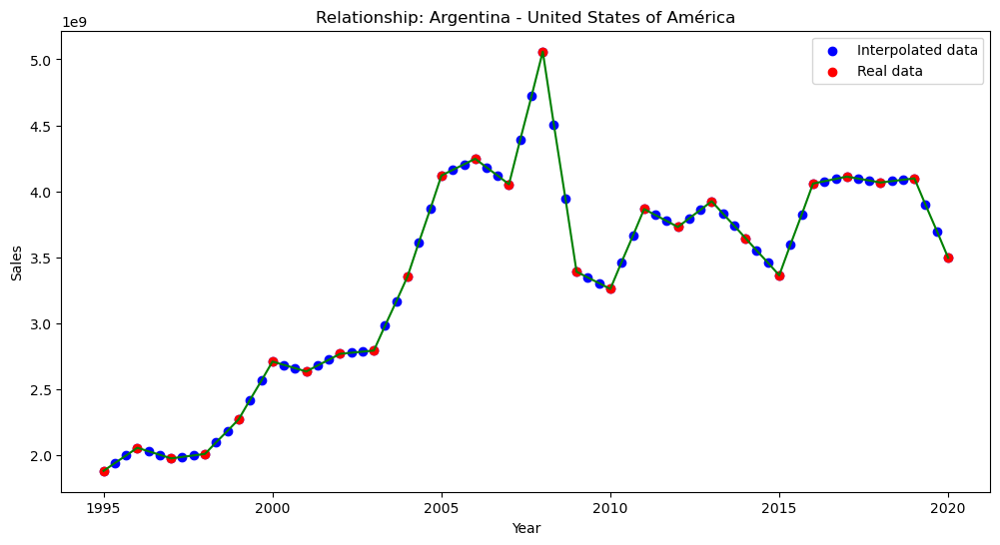

In [64]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot the DataFrame
plt.plot(index2, data2["ARG-USA"], color='green')
plt.scatter(index2, data2["ARG-USA"], color='blue', label='Interpolated data')
plt.scatter(index1, data["ARG-USA"], color='red', label='Real data')


# Set the plot title and labels
plt.title('Relationship: Argentina - United States of América')
plt.xlabel('Year')
plt.ylabel('Sales')

plt.legend()
plt.show()

In [123]:
data2['ARG-USA']

0     1.880535e+09
1     1.938874e+09
2     1.997212e+09
3     2.055550e+09
4     2.028680e+09
          ...     
71    4.087292e+09
72    4.097830e+09
73    3.896963e+09
74    3.696097e+09
75    3.495230e+09
Name: ARG-USA, Length: 76, dtype: float64

In [124]:
column_names = data2.columns.tolist()  # Get a list of column names
position = column_names.index('ARG-USA')  # Find the position of 'ARG-USA' in the list

print("Position of 'ARG-USA' column:", position)

Position of 'ARG-USA' column: 2304


In [157]:
len(PeMS.get_data("train")[:, 0, 0, 0])

18

In [115]:
indexB

[1995.0,
 1995.33,
 1995.67,
 1996.0,
 1996.33,
 1996.67,
 1997.0,
 1997.33,
 1997.67,
 1998.0,
 1998.33,
 1998.67,
 1999.0]

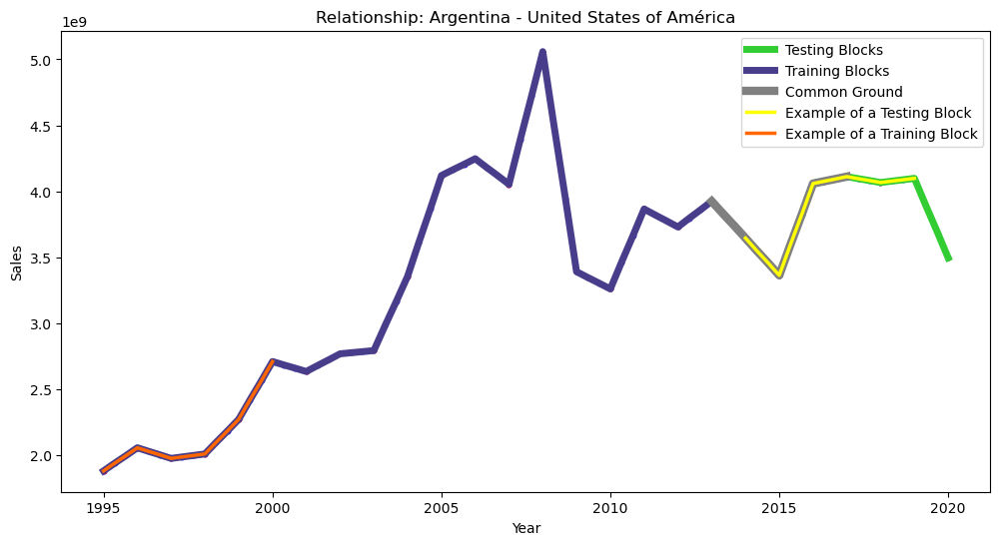

In [213]:
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))


for n_bloqueTr in range(0, len(PeMS.get_data("train")[:, 0, 0, 0]), 20):
    bloqueTr = PeMS.get_data("train")[n_bloqueTr, :, 2304, 0]

    indexBTr = []
    for x in range(int((len(bloque)+2)/3)):
        for y in range(3):
            indexBTr.append(1995  + x + round(y/3, 2) + n_bloqueTr)
    indexBTr = indexBTr[:-2]
    
    plt.plot(indexBTr, bloqueTr, linewidth=2.5)
    



n_bloqueTe = 1
bloqueTe = PeMS.get_data("test")[n_bloqueTe, :, 2304, 0]

indexBTe = []
for x in range(int((len(bloque)+2)/3)):
    for y in range(3):
        indexBTe.append(1995  + x + round(y/3, 2) + n_bloqueTe + 18)
indexBTe = indexBTe[:-2]




# Plot the DataFrame
plt.plot(index2, data2["ARG-USA"], linewidth=0.2)

cutoff = -22
#-9
plt.plot(index2[-22:], data2["ARG-USA"][-22:], color='limegreen', label='Testing Blocks', linewidth=5)
plt.plot(index2[:-9], data2["ARG-USA"][:-9], color='darkslateblue', label='Training Blocks', linewidth=5)
plt.plot(index2[-22:-9], data2["ARG-USA"][-22:-9], color=(0.5, 0.5, 0.5), label='Common Ground', linewidth=6)

plt.plot(indexBTe, bloqueTe, color=(1, 1.0, 0), label='Example of a Testing Block', linewidth=2.5)
plt.plot(indexBTr, bloqueTr, color=(1, 0.4, 0), linewidth=2.5, label='Example of a Training Block')

plt.scatter(index2, data2["ARG-USA"], color='blue', s=10)
plt.scatter(index1, data["ARG-USA"], color='red', s=10)

# Set the plot title and labels
plt.title('Relationship: Argentina - United States of América')
plt.xlabel('Year')
plt.ylabel('Sales')

plt.legend()
plt.show()

In [23]:
print(len(list(range(120, 152))))
print(len(PeMS.get_data("test")[0, :, 0, 0]))

32
31


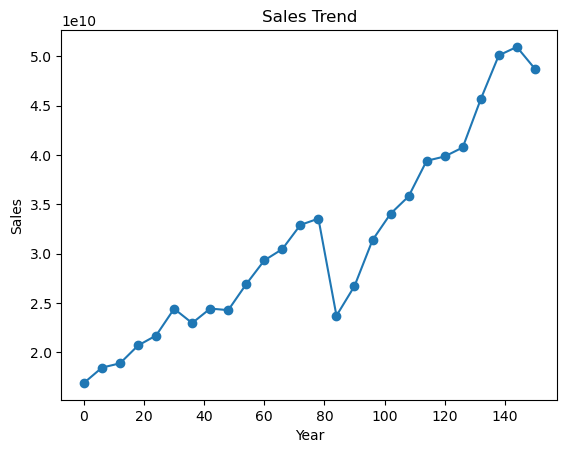

In [10]:
# Plot the DataFrame
data["ITA-USA"].plot()
plt.scatter(data.index, data["ARG-ARE"])

# Set the plot title and labels
plt.title('Sales Trend')
plt.xlabel('Year')
plt.ylabel('Sales')

# Display the plot
plt.show()

In [33]:
data2

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE,...,ROU-ZAF,RUS-ZAF,SAU-ZAF,SDN-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
0,1.631558e+07,1.743842e+08,95413366.0,2.841407e+08,1.672554e+07,1.090672e+08,1.464124e+08,3.684022e+08,5.273232e+07,1.100646e+09,...,43421106.0,2.935940e+07,1.712682e+08,234022.000000,3.542732e+08,394341399.0,2.016164e+08,6.407607e+07,2.812651e+09,1.231912e+07
1,1.984746e+07,1.885503e+08,97206585.0,2.788262e+08,1.638454e+07,1.195038e+08,1.431193e+08,3.764569e+08,5.290291e+07,1.096685e+09,...,37303258.5,2.881566e+07,1.721777e+08,323619.666667,3.535558e+08,406499158.5,1.986382e+08,6.382680e+07,2.869940e+09,1.141559e+07
2,2.337933e+07,2.027164e+08,98999804.0,2.735117e+08,1.604355e+07,1.299405e+08,1.398262e+08,3.845116e+08,5.307350e+07,1.092723e+09,...,31185411.0,2.827193e+07,1.730872e+08,413217.333333,3.528384e+08,418656918.0,1.956600e+08,6.357752e+07,2.927230e+09,1.051206e+07
3,2.691120e+07,2.168825e+08,100793023.0,2.681972e+08,1.570255e+07,1.403772e+08,1.365331e+08,3.925663e+08,5.324409e+07,1.088762e+09,...,25067563.5,2.772819e+07,1.739967e+08,502815.000000,3.521210e+08,430814677.5,1.926818e+08,6.332825e+07,2.984520e+09,9.608529e+06
4,3.044307e+07,2.310486e+08,102586242.0,2.628827e+08,1.536155e+07,1.508138e+08,1.332401e+08,4.006211e+08,5.341468e+07,1.084800e+09,...,18949716.0,2.718445e+07,1.749062e+08,592412.666667,3.514036e+08,442972437.0,1.897036e+08,6.307898e+07,3.041810e+09,8.705000e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,4.046708e+08,2.333818e+09,552362223.0,2.575886e+09,4.051337e+08,2.152678e+09,1.210669e+09,3.394841e+09,2.170152e+08,3.294188e+10,...,298553164.0,3.864496e+08,2.569772e+09,94296.000000,4.558110e+08,752021954.0,2.341400e+09,5.700977e+08,5.008608e+09,7.480401e+08
147,4.099897e+08,2.210408e+09,549602086.0,2.534285e+09,3.913362e+08,2.114044e+09,1.239720e+09,3.295817e+09,2.263470e+08,3.274395e+10,...,277253921.5,3.866292e+08,2.447225e+09,70722.000000,4.172565e+08,726463728.5,2.287244e+09,5.710164e+08,4.869769e+09,7.366385e+08
148,4.153087e+08,2.086997e+09,546841949.0,2.492685e+09,3.775387e+08,2.075409e+09,1.268770e+09,3.196792e+09,2.356788e+08,3.254602e+10,...,255954679.0,3.868088e+08,2.324678e+09,47148.000000,3.787020e+08,700905503.0,2.233087e+09,5.719351e+08,4.730930e+09,7.252368e+08
149,4.206276e+08,1.963587e+09,544081812.0,2.451085e+09,3.637413e+08,2.036775e+09,1.297821e+09,3.097767e+09,2.450106e+08,3.234809e+10,...,234655436.5,3.869884e+08,2.202132e+09,23574.000000,3.401476e+08,675347277.5,2.178930e+09,5.728538e+08,4.592091e+09,7.138352e+08


In [30]:
z_score(data2, PeMS.get_stats()['mean'], PeMS.get_stats()['std'])

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHL-ARE,CHN-ARE,...,ROU-ZAF,RUS-ZAF,SAU-ZAF,SDN-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
0,-0.256660,-0.245487,-0.251069,-0.237728,-0.256631,-0.250104,-0.247464,-0.231772,-0.254086,-0.180012,...,-0.254744,-0.255738,-0.245707,-0.257797,-0.232771,-0.229938,-0.243562,-0.253284,-0.058994,-0.256943
1,-0.256410,-0.244485,-0.250942,-0.238104,-0.256655,-0.249366,-0.247697,-0.231203,-0.254074,-0.180292,...,-0.255177,-0.255776,-0.245643,-0.257791,-0.232821,-0.229079,-0.243772,-0.253302,-0.054945,-0.257006
2,-0.256161,-0.243484,-0.250815,-0.238480,-0.256679,-0.248628,-0.247929,-0.230633,-0.254062,-0.180572,...,-0.255609,-0.255815,-0.245578,-0.257784,-0.232872,-0.228220,-0.243983,-0.253319,-0.050895,-0.257070
3,-0.255911,-0.242483,-0.250689,-0.238855,-0.256703,-0.247890,-0.248162,-0.230064,-0.254050,-0.180852,...,-0.256041,-0.255853,-0.245514,-0.257778,-0.232923,-0.227360,-0.244193,-0.253337,-0.046845,-0.257134
4,-0.255661,-0.241481,-0.250562,-0.239231,-0.256728,-0.247153,-0.248395,-0.229495,-0.254038,-0.181132,...,-0.256474,-0.255892,-0.245450,-0.257772,-0.232974,-0.226501,-0.244404,-0.253354,-0.042796,-0.257198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,-0.229208,-0.092842,-0.218768,-0.075731,-0.229176,-0.105646,-0.172234,-0.017841,-0.242473,2.070762,...,-0.236709,-0.230496,-0.076163,-0.257807,-0.225593,-0.204655,-0.092306,-0.217515,0.096232,-0.204936
147,-0.228832,-0.101565,-0.218963,-0.078671,-0.230151,-0.108377,-0.170181,-0.024841,-0.241814,2.056771,...,-0.238215,-0.230484,-0.084825,-0.257808,-0.228319,-0.206462,-0.096134,-0.217450,0.086418,-0.205742
148,-0.228456,-0.110289,-0.219159,-0.081612,-0.231126,-0.111108,-0.168127,-0.031841,-0.241154,2.042780,...,-0.239721,-0.230471,-0.093488,-0.257810,-0.231044,-0.208268,-0.099962,-0.217385,0.076604,-0.206548
149,-0.228080,-0.119013,-0.219354,-0.084553,-0.232101,-0.113839,-0.166074,-0.038840,-0.240494,2.028789,...,-0.241226,-0.230458,-0.102150,-0.257812,-0.233769,-0.210075,-0.103791,-0.217320,0.066789,-0.207354


In [32]:
PeMS.get_data("test")[-1, -1, 0, 0]

-0.22770433579314023

# ANALISIS PROFUNDO DE LOS DATOS PARA VER EL ESCALADO

In [3]:
# Cargar las bases de datos
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Coger los datos originales
datos = pd.read_csv('./dataset/Datos_TODO_reducido_interpolado_2_Sin_0.csv', header=0)    
aux = pd.read_csv('./dataset/Datos_TODO_reducido.csv', header=0)

In [4]:
np.percentile(datos, 75) - np.percentile(datos, 25)

2884860964.75

In [18]:
description = datos.describe(include='all')

In [5]:
datos

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHN-ARE,CZE-ARE,...,PRT-ZAF,ROU-ZAF,RUS-ZAF,SAU-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
0,1.631558e+07,1.743842e+08,95413366.0,2.841407e+08,1.672554e+07,1.090672e+08,1.464124e+08,3.684022e+08,1.100646e+09,1.818557e+07,...,6.277342e+07,4.342111e+07,2.935940e+07,1.712682e+08,3.542732e+08,3.943414e+08,2.016164e+08,6.407607e+07,2.812651e+09,1.231912e+07
1,2.337933e+07,2.027164e+08,98999804.0,2.735117e+08,1.604355e+07,1.299405e+08,1.398262e+08,3.845116e+08,1.092723e+09,2.454881e+07,...,6.811056e+07,3.118541e+07,2.827193e+07,1.730872e+08,3.528384e+08,4.186569e+08,1.956600e+08,6.357752e+07,2.927230e+09,1.051206e+07
2,3.044307e+07,2.310486e+08,102586242.0,2.628827e+08,1.536155e+07,1.508138e+08,1.332401e+08,4.006211e+08,1.084800e+09,3.091206e+07,...,7.344769e+07,1.894972e+07,2.718445e+07,1.749062e+08,3.514036e+08,4.429724e+08,1.897036e+08,6.307898e+07,3.041810e+09,8.705000e+06
3,3.750681e+07,2.593809e+08,106172680.0,2.522536e+08,1.467956e+07,1.716872e+08,1.266539e+08,4.167305e+08,1.076877e+09,3.727530e+07,...,7.878482e+07,6.714021e+06,2.609698e+07,1.767252e+08,3.499688e+08,4.672880e+08,1.837473e+08,6.258043e+07,3.156389e+09,6.897941e+06
4,4.052451e+07,3.061556e+08,104532800.0,2.774517e+08,1.479531e+07,1.979768e+08,1.471066e+08,4.179527e+08,1.151635e+09,7.352323e+07,...,7.616279e+07,6.348566e+06,2.991053e+07,1.234693e+08,3.255078e+08,4.571840e+08,2.050112e+08,6.481164e+07,3.127269e+09,8.992098e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3.371057e+08,2.659397e+09,600114155.0,2.935188e+09,4.316801e+08,2.159997e+09,1.153468e+09,4.026683e+09,3.222129e+10,7.033390e+08,...,2.151133e+08,3.233110e+08,3.776865e+08,3.257766e+09,5.491045e+08,7.922589e+08,2.581216e+09,5.633184e+08,5.363921e+09,7.542408e+08
72,3.940329e+08,2.580638e+09,557882497.0,2.659086e+09,4.327286e+08,2.229946e+09,1.152568e+09,3.592891e+09,3.333774e+10,6.861802e+08,...,2.151973e+08,3.411516e+08,3.860904e+08,2.814865e+09,5.329200e+08,8.031384e+08,2.449714e+09,5.682604e+08,5.286287e+09,7.708434e+08
73,4.046708e+08,2.333818e+09,552362223.0,2.575886e+09,4.051337e+08,2.152678e+09,1.210669e+09,3.394841e+09,3.294188e+10,6.681189e+08,...,2.006094e+08,2.985532e+08,3.864496e+08,2.569772e+09,4.558110e+08,7.520220e+08,2.341400e+09,5.700977e+08,5.008608e+09,7.480401e+08
74,4.153087e+08,2.086997e+09,546841949.0,2.492685e+09,3.775387e+08,2.075409e+09,1.268770e+09,3.196792e+09,3.254602e+10,6.500575e+08,...,1.860215e+08,2.559547e+08,3.868088e+08,2.324678e+09,3.787020e+08,7.009055e+08,2.233087e+09,5.719351e+08,4.730930e+09,7.252368e+08


In [10]:
print(datos["ARG-ARE"][0:16])

0     1.631558e+07
1     2.337933e+07
2     3.044307e+07
3     3.750681e+07
4     4.052451e+07
5     4.354222e+07
6     4.655992e+07
7     4.426488e+07
8     4.196983e+07
9     3.967479e+07
10    4.896606e+07
11    5.825732e+07
12    6.754859e+07
13    7.378836e+07
14    8.002812e+07
15    8.626789e+07
Name: ARG-ARE, dtype: float64


In [20]:
rango = max(description.loc["max"]) - min(description.loc["min"])
mean_of_means = sum(description.loc["mean"])/len(description.loc["mean"])

In [21]:
rango/mean_of_means

94.93598755321655

In [22]:
description

,ARG-ARE,AUS-ARE,AUT-ARE,BEL-ARE,BGD-ARE,BRA-ARE,CAN-ARE,CHE-ARE,CHN-ARE,CZE-ARE,...,PRT-ZAF,ROU-ZAF,RUS-ZAF,SAU-ZAF,SGP-ZAF,SWE-ZAF,THA-ZAF,TUR-ZAF,USA-ZAF,VNM-ZAF
count,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,...,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01,7.600000e+01
mean,1.923273e+08,1.358919e+09,4.790506e+08,2.054856e+09,1.350450e+08,1.329487e+09,8.234417e+08,2.578695e+09,1.689379e+10,4.354130e+08,...,1.149115e+08,1.023436e+08,1.712806e+08,2.502078e+09,6.556047e+08,7.518714e+08,1.362997e+09,3.812249e+08,4.610799e+09,3.738095e+08
std,1.038825e+08,8.428715e+08,2.781226e+08,1.333107e+09,1.440924e+08,9.049848e+08,5.561420e+08,2.234662e+09,1.304984e+10,2.513112e+08,...,5.362909e+07,1.072091e+08,1.313592e+08,1.613634e+09,4.174639e+08,3.345920e+08,9.439122e+08,2.676417e+08,1.505893e+09,3.840339e+08
min,1.631558e+07,1.743842e+08,9.541337e+07,2.522536e+08,0.000000e+00,1.090672e+08,1.223233e+08,3.684022e+08,1.076877e+09,1.818557e+07,...,5.267707e+07,2.148316e+06,2.291436e+07,1.695736e+07,2.180612e+08,2.717128e+08,1.837473e+08,5.905240e+07,2.523595e+09,6.897941e+06
25%,9.593712e+07,5.568667e+08,1.923450e+08,8.046171e+08,1.967596e+07,4.698784e+08,1.899015e+08,6.172577e+08,2.621433e+09,1.543341e+08,...,6.987400e+07,5.586158e+06,3.774234e+07,1.319663e+09,3.048717e+08,4.467044e+08,3.241871e+08,7.921511e+07,3.095389e+09,2.183749e+07
50%,1.956254e+08,1.515502e+09,5.551224e+08,2.106635e+09,4.792095e+07,1.250703e+09,1.107165e+09,2.016805e+09,1.873766e+10,4.900345e+08,...,9.337587e+07,5.094579e+07,1.579929e+08,2.482914e+09,4.734112e+08,7.403782e+08,1.433780e+09,4.512719e+08,4.725845e+09,1.247415e+08
75%,2.630411e+08,1.986744e+09,6.999784e+08,3.132214e+09,2.389566e+08,2.188915e+09,1.291982e+09,4.158174e+09,3.000553e+10,6.579051e+08,...,1.652506e+08,2.018868e+08,2.977271e+08,3.273762e+09,8.891446e+08,1.004853e+09,2.235321e+09,5.596120e+08,5.541907e+09,7.583915e+08
max,4.259466e+08,2.883725e+09,8.948324e+08,4.706903e+09,4.327286e+08,2.723934e+09,1.597706e+09,9.250398e+09,3.736651e+10,8.259717e+08,...,2.151973e+08,3.411516e+08,3.871680e+08,5.985531e+09,1.664618e+09,1.572751e+09,2.844221e+09,1.128816e+09,7.551339e+09,1.155026e+09


Summary Statistics:
count    7.600000e+01
mean     1.923273e+08
std      1.038825e+08
min      1.631558e+07
25%      9.593712e+07
50%      1.956254e+08
75%      2.630411e+08
max      4.259466e+08
Name: ARG-ARE, dtype: float64


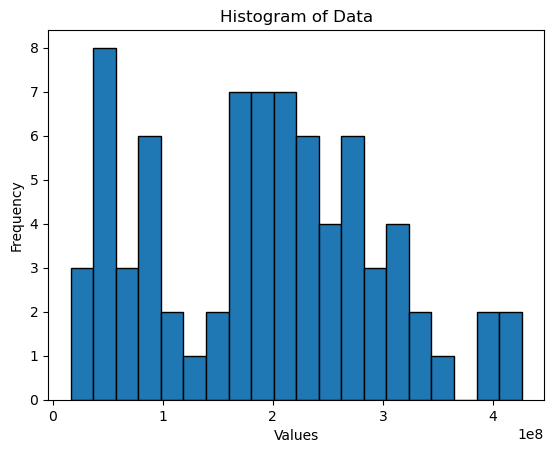

In [7]:
# Assuming your data is stored in a DataFrame called 'df' and the column to scale is 'column_name'
data = datos["ARG-ARE"]

# Summary statistics
print("Summary Statistics:")
print(data.describe())

# Histogram
plt.hist(data, bins=20, edgecolor='black')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of Data')
plt.show()

In [11]:
datos

,ARG-ARE,ARG-ARE.1,ARG-ARE.2,ARG-ARE.3,ARG-ARE.4,ARG-ARE.5,ARG-ARE.6,ARG-ARE.7,ARG-ARE.8,ARG-ARE.9,...,ARG-ARE.1950,ARG-ARE.1951,ARG-ARE.1952,ARG-ARE.1953,ARG-ARE.1954,ARG-ARE.1955,ARG-ARE.1956,ARG-ARE.1957,ARG-ARE.1958,ARG-ARE.1959
0,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,...,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07,1.631558e+07
1,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,...,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07,2.337933e+07
2,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,...,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07,3.044307e+07
3,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,...,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07,3.750681e+07
4,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,...,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07,4.052451e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,...,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08,3.371057e+08
72,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,...,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08,3.940329e+08
73,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,...,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08,4.046708e+08
74,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,...,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08,4.153087e+08
